In [2]:
import os 
import time
import json
import nltk
import string
import pickle
import datetime

In [3]:
import numpy as np
import pandas as pd
import xml.etree.ElementTree as xml

In [4]:
from moviepy.editor import *
from tqdm.notebook import tqdm
from collections import Counter

from nltk.stem import PorterStemmer
from nltk.stem import LancasterStemmer
from nltk.tokenize import sent_tokenize, word_tokenize

from sklearn.feature_extraction.text import TfidfVectorizer, TfidfTransformer

strptime = datetime.datetime.strptime

In [5]:
mastershot_path = '../transcripts/mastershot_timing.csv'

In [6]:
mastershot_df = pd.read_csv(mastershot_path)

In [7]:
len(mastershot_df)

43436

In [8]:
mastershot_df.head()

,Unnamed: 0,file,shot,start_s,end_s,start,end
0,0,5245830105934359183.xml,1,0.00,20.21,00:00:00:00,00:00:20:21
1,1,5245830105934359183.xml,2,20.22,23.20,00:00:20:22,00:00:23:20
2,2,5245830105934359183.xml,3,23.21,25.14,00:00:23:21,00:00:25:14
3,3,5245830105934359183.xml,4,25.15,26.20,00:00:25:15,00:00:26:20
4,4,5245830105934359183.xml,5,26.21,30.03,00:00:26:21,00:00:30:03


In [9]:
episodes = {'60': '5245830105934359183.mp4',
 '61': '5248439298566680341.mp4',
 '62': '5251033029316736209.mp4',
 '63': '5253646087419594905.mp4',
 '64': '5256228221757951173.mp4',
 '65': '5258818087037440299.mp4',
 '66': '5264050645694159353.mp4',
 '67': '5266645664934403562.mp4',
 '68': '5269245838135402929.mp4',
 '69': '5271844722846213628.mp4',
 '70': '5274434588125702436.mp4',
 '79': '5300410550331962313.mp4',
 '80': '5300433743159556513.mp4',
 '81': '5303026185415228226.mp4',
 '82': '5305617339184877785.mp4',
 '83': '5308226531817199474.mp4',
 '84': '5310822839547632763.mp4',
 '85': '5313398531435045858.mp4',
 '86': '5316007724067368375.mp4',
 '87': '5318609185758554501.mp4',
 '88': '5321170704253895214.mp4',
 '89': '5323778608396028180.mp4'}

In [10]:
file2id = {v:k for k,v in episodes.items()}

In [11]:
file2id

{'5245830105934359183.mp4': '60',
 '5248439298566680341.mp4': '61',
 '5251033029316736209.mp4': '62',
 '5253646087419594905.mp4': '63',
 '5256228221757951173.mp4': '64',
 '5258818087037440299.mp4': '65',
 '5264050645694159353.mp4': '66',
 '5266645664934403562.mp4': '67',
 '5269245838135402929.mp4': '68',
 '5271844722846213628.mp4': '69',
 '5274434588125702436.mp4': '70',
 '5300410550331962313.mp4': '79',
 '5300433743159556513.mp4': '80',
 '5303026185415228226.mp4': '81',
 '5305617339184877785.mp4': '82',
 '5308226531817199474.mp4': '83',
 '5310822839547632763.mp4': '84',
 '5313398531435045858.mp4': '85',
 '5316007724067368375.mp4': '86',
 '5318609185758554501.mp4': '87',
 '5321170704253895214.mp4': '88',
 '5323778608396028180.mp4': '89'}

In [12]:
mastershot_df['start'] = mastershot_df['start'].apply(lambda t: t[:8] + '.' + t[9:])
mastershot_df['end'] = mastershot_df['end'].apply(lambda t: t[:8] + '.' + t[9:])
mastershot_df['sid'] = mastershot_df['file'].apply(lambda x: file2id[x.replace('xml', 'mp4')] + '-') + mastershot_df['shot'].astype(str)
mastershot_df.head()

,Unnamed: 0,file,shot,start_s,end_s,start,end,sid
0,0,5245830105934359183.xml,1,0.00,20.21,00:00:00.00,00:00:20.21,60-1
1,1,5245830105934359183.xml,2,20.22,23.20,00:00:20.22,00:00:23.20,60-2
2,2,5245830105934359183.xml,3,23.21,25.14,00:00:23.21,00:00:25.14,60-3
3,3,5245830105934359183.xml,4,25.15,26.20,00:00:25.15,00:00:26.20,60-4
4,4,5245830105934359183.xml,5,26.21,30.03,00:00:26.21,00:00:30.03,60-5


In [13]:
mastershot_df.head()

,Unnamed: 0,file,shot,start_s,end_s,start,end,sid
0,0,5245830105934359183.xml,1,0.00,20.21,00:00:00.00,00:00:20.21,60-1
1,1,5245830105934359183.xml,2,20.22,23.20,00:00:20.22,00:00:23.20,60-2
2,2,5245830105934359183.xml,3,23.21,25.14,00:00:23.21,00:00:25.14,60-3
3,3,5245830105934359183.xml,4,25.15,26.20,00:00:25.15,00:00:26.20,60-4
4,4,5245830105934359183.xml,5,26.21,30.03,00:00:26.21,00:00:30.03,60-5


In [37]:
clips = {}
durs = {}
# Read until video is completed
for file in mastershot_df.file.unique():
    filename = file.replace('.xml', '.mp4')
    print('Processing', filename)
    video = VideoFileClip('../../eastenders_episodes/' + filename)
    
    for i, shot in tqdm(mastershot_df[mastershot_df.file == file].iterrows(), total=len(mastershot_df)):
        start, end = shot['start'], shot['end']
        start_s, end_s = shot['start_s'], shot['end_s']
        sid = shot['sid']
        clips[sid] = video.subclip(start_s, end_s)
        durs[sid] = (strptime(end, '%H:%M:%S.%f') - strptime(start, '%H:%M:%S.%f')).total_seconds()

Processing 5245830105934359183.mp4



Processing 5248439298566680341.mp4



Processing 5251033029316736209.mp4



Processing 5253646087419594905.mp4



Processing 5256228221757951173.mp4



Processing 5258818087037440299.mp4



Processing 5264050645694159353.mp4



Processing 5266645664934403562.mp4



Processing 5269245838135402929.mp4



Processing 5271844722846213628.mp4



Processing 5274434588125702436.mp4



Processing 5300410550331962313.mp4



Processing 5300433743159556513.mp4



Processing 5303026185415228226.mp4



Processing 5305617339184877785.mp4



Processing 5308226531817199474.mp4



Processing 5310822839547632763.mp4



Processing 5313398531435045858.mp4



Processing 5316007724067368375.mp4



Processing 5318609185758554501.mp4



Processing 5321170704253895214.mp4



Processing 5323778608396028180.mp4


In [ ]:
for shot in tqdm(clips):
    if int(shot.split('-')[0]) < 67:
        continue
    clips[shot].audio.write_audiofile("../../eastenders_episodes/clips/"+shot+".mp3", verbose=False)

                                                                     
chunk:   7%|▋         | 29/446 [18:21:15<263:55:21, 2278.47s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 2/3 [00:00<00:00, 15.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:21:15<263:55:23, 2278.47s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:21:15<263:55:24, 2278.48s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:00<264:20:25, 2282.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:15<263:55:26, 2278.48s/it, now=None]

chunk:   0%|          | 0/529 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-3.mp3




chunk:  12%|█▏        | 65/529 [00:00<00:00, 627.73it/s, now=None]

chunk:  24%|██▍       | 128/529 [00:00<00:00, 604.92it/s, now=None]

chunk:  40%|███▉      | 211/529 [00:00<00:00, 654.62it/s, now=None]

chunk:  57%|█████▋    | 301/529 [00:00<00:00, 712.17it/s, now=None]

chunk:  72%|███████▏  | 379/529 [00:00<00:00, 728.98it/s, now=None]

chunk:  85%|████████▌ | 452/529 [00:00<00:00, 728.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:00<264:20:36, 2282.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:16<263:55:37, 2278.51s/it, now=None]

chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 77/136 [00:00<00:00, 753.37it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-4.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:01<264:20:39, 2282.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:16<263:55:40, 2278.52s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:01<264:20:41, 2282.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:17<263:55:42, 2278.52s/it, now=None]

chunk:   0%|          | 0/307 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-5.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-6.mp3




chunk:  17%|█▋        | 53/307 [00:00<00:00, 508.71it/s, now=None]

chunk:  46%|████▋     | 142/307 [00:00<00:00, 581.02it/s, now=None]

chunk:  74%|███████▍  | 228/307 [00:00<00:00, 641.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:01<264:20:47, 2282.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:17<263:55:48, 2278.53s/it, now=None]

chunk:   0%|          | 0/289 [00:00<?, ?it/s, now=None]

chunk:  30%|███       | 87/289 [00:00<00:00, 868.00it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-7.mp3




chunk:  55%|█████▌    | 159/289 [00:00<00:00, 812.54it/s, now=None]

chunk:  79%|███████▉  | 228/289 [00:00<00:00, 759.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:02<264:20:54, 2282.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:17<263:55:55, 2278.55s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:02<264:20:56, 2282.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:18<263:55:57, 2278.56s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-8.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-9.mp3




chunk:  40%|████      | 63/156 [00:00<00:00, 629.75it/s, now=None]

chunk:  83%|████████▎ | 129/156 [00:00<00:00, 638.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:02<264:21:01, 2282.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:18<263:56:01, 2278.57s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

chunk:  95%|█████████▌| 60/63 [00:00<00:00, 588.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:02<264:21:03, 2282.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:18<263:56:04, 2278.57s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-10.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-11.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:02<264:21:05, 2282.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:18<263:56:06, 2278.58s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:03<264:21:06, 2282.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:18<263:56:07, 2278.58s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:03<264:21:08, 2282.18s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-12.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-13.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:21:18<263:56:09, 2278.58s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 62/152 [00:00<00:00, 619.31it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-14.mp3




chunk:  93%|█████████▎| 142/152 [00:00<00:00, 660.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:03<264:21:12, 2282.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:19<263:56:13, 2278.59s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:03<264:21:13, 2282.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:19<263:56:14, 2278.60s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:03<264:21:14, 2282.19s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-15.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-16.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-17.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:03<264:21:16, 2282.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:19<263:56:17, 2278.60s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:03<264:21:18, 2282.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:19<263:56:19, 2278.61s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:03<264:21:19, 2282.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:19<263:56:20, 2278.6

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-18.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-19.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-20.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:04<264:21:21, 2282.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:19<263:56:22, 2278.61s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:04<264:21:22, 2282.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:19<263:56:22, 2278.62s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:04<264:21:23, 2282.22s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-21.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-22.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-23.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:04<264:21:25, 2282.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:20<263:56:26, 2278.62s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:04<264:21:27, 2282.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:20<263:56:28, 2278.63s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:04<264:21:28, 2282.23s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-24.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-25.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-26.mp3




chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:04<264:21:29, 2282.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:20<263:56:29, 2278.63s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:04<264:21:30, 2282.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:20<263:56:31, 2278.64s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:04<264:21:31, 2282.23s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-27.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-28.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-29.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:04<264:21:33, 2282.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:20<263:56:34, 2278.64s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:05<264:21:35, 2282.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:20<263:56:36, 2278.65s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-30.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-31.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:05<264:21:37, 2282.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:20<263:56:38, 2278.65s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:05<264:21:39, 2282.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:21<263:56:40, 2278.66s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-32.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-33.mp3




chunk:  61%|██████▏   | 68/111 [00:00<00:00, 674.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:05<264:21:42, 2282.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:21<263:56:43, 2278.66s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:05<264:21:43, 2282.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:21<263:56:44, 2278.67s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-34.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-35.mp3




chunk:  84%|████████▎ | 72/86 [00:00<00:00, 707.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:05<264:21:46, 2282.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:21<263:56:47, 2278.68s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:05<264:21:47, 2282.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:21<263:56:49, 2278.68s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:06<264:21:49, 2282.28s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-36.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-37.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:21:21<263:56:50, 2278.68s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:06<264:21:51, 2282.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:21<263:56:52, 2278.69s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-38.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-39.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:23:06<264:21:52, 2282.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:22<263:56:53, 2278.69s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:06<264:21:54, 2282.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:22<263:56:55, 2278.69s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-40.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-41.mp3




chunk:  78%|███████▊  | 68/87 [00:00<00:00, 678.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:06<264:21:57, 2282.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:22<263:56:58, 2278.70s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 77/86 [00:00<00:00, 749.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:06<264:22:00, 2282.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:22<263:57:00, 2278.71s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-42.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-43.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 44/45 [00:00<00:00, 434.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:06<264:22:02, 2282.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:22<263:57:03, 2278.71s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:07<264:22:04, 2282.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:22<263:57:05, 2278.72s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-44.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-45.mp3




chunk:  63%|██████▎   | 69/109 [00:00<00:00, 674.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:07<264:22:07, 2282.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:23<263:57:08, 2278.72s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:07<264:22:08, 2282.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:23<263:57:09, 2278.73s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:07<264:22:09, 2282.33s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-46.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-47.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-48.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:07<264:22:11, 2282.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:23<263:57:12, 2278.74s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 72/87 [00:00<00:00, 703.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:07<264:22:14, 2282.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:23<263:57:15, 2278.74s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-49.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-50.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:07<264:22:16, 2282.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:23<263:57:17, 2278.75s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 75/91 [00:00<00:00, 728.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:08<264:22:19, 2282.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:23<263:57:20, 2278.75s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-51.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-52.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:08<264:22:21, 2282.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:23<263:57:22, 2278.76s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:08<264:22:22, 2282.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:24<263:57:23, 2278.76s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-53.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-54.mp3




chunk:  79%|███████▉  | 52/66 [00:00<00:00, 501.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:08<264:22:25, 2282.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:24<263:57:26, 2278.77s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:08<264:22:27, 2282.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:24<263:57:28, 2278.77s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-55.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-56.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:23:08<264:22:29, 2282.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:24<263:57:29, 2278.78s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 56/64 [00:00<00:00, 548.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:08<264:22:31, 2282.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:24<263:57:32, 2278.78s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-57.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-58.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:09<264:22:33, 2282.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:24<263:57:34, 2278.79s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:09<264:22:35, 2282.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:24<263:57:36, 2278.79s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-59.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-60.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:23:09<264:22:36, 2282.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:25<263:57:37, 2278.80s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:09<264:22:39, 2282.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:25<263:57:40, 2278.80s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-61.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-62.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:09<264:22:41, 2282.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:25<263:57:42, 2278.81s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 38/41 [00:00<00:00, 379.87it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-63.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:23:09<264:22:44, 2282.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:25<263:57:45, 2278.81s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  34%|███▎      | 60/178 [00:00<00:00, 591.44it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-64.mp3




chunk:  73%|███████▎  | 130/178 [00:00<00:00, 613.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:10<264:22:49, 2282.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:25<263:57:50, 2278.83s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 57/69 [00:00<00:00, 557.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:10<264:22:52, 2282.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:10<264:22:52, 2282.43s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-65.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-66.mp3



chunk:   7%|▋         | 29/446 [18:21:26<263:57:53, 2278.83s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 68/87 [00:00<00:00, 666.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:10<264:22:55, 2282.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:26<263:57:56, 2278.84s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:10<264:22:57, 2282.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:26<263:57:58, 2278.85s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-67.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-68.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 44/45 [00:00<00:00, 433.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:10<264:23:00, 2282.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:26<263:58:01, 2278.85s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:11<264:23:02, 2282.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:26<263:58:03, 2278.86s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-69.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-70.mp3




chunk:  59%|█████▉    | 50/85 [00:00<00:00, 496.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:11<264:23:05, 2282.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:27<263:58:06, 2278.87s/it, now=None]

chunk:   0%|          | 0/222 [00:00<?, ?it/s, now=None]

chunk:  25%|██▌       | 56/222 [00:00<00:00, 559.96it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-71.mp3




chunk:  55%|█████▍    | 121/222 [00:00<00:00, 570.73it/s, now=None]

chunk:  86%|████████▌ | 191/222 [00:00<00:00, 599.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:11<264:23:12, 2282.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:27<263:58:13, 2278.88s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▌    | 62/112 [00:00<00:00, 597.72it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-72.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:12<264:23:15, 2282.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:27<263:58:16, 2278.89s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 60/87 [00:00<00:00, 596.30it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-73.mp3



chunk:   7%|▋         | 29/446 [18:23:12<264:23:18, 2282.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:27<263:58:19, 2278.90s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:12<264:23:20, 2282.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:28<263:58:21, 2278.90s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-74.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-75.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:12<264:23:22, 2282.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:28<263:58:23, 2278.90s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 39/89 [00:00<00:00, 368.81it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-76.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:12<264:23:25, 2282.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:28<263:58:26, 2278.91s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 68/112 [00:00<00:00, 678.91it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-77.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:12<264:23:29, 2282.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:28<263:58:30, 2278.92s/it, now=None]

chunk:   0%|          | 0/265 [00:00<?, ?it/s, now=None]

chunk:  21%|██        | 55/265 [00:00<00:00, 547.07it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-78.mp3




chunk:  37%|███▋      | 98/265 [00:00<00:00, 496.83it/s, now=None]

chunk:  58%|█████▊    | 155/265 [00:00<00:00, 515.22it/s, now=None]

chunk:  79%|███████▉  | 209/265 [00:00<00:00, 522.05it/s, now=None]

chunk:  99%|█████████▉| 263/265 [00:00<00:00, 522.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:13<264:23:37, 2282.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:29<263:58:38, 2278.94s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 48/221 [00:00<00:00, 467.58it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-79.mp3




chunk:  49%|████▉     | 109/221 [00:00<00:00, 499.09it/s, now=None]

chunk:  77%|███████▋  | 170/221 [00:00<00:00, 521.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:14<264:23:44, 2282.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:29<263:58:45, 2278.96s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:14<264:23:46, 2282.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:29<263:58:47, 2278.96s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-80.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-81.mp3




chunk:  49%|████▉     | 42/86 [00:00<00:00, 418.02it/s, now=None]

chunk:  80%|████████  | 69/86 [00:00<00:00, 358.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:14<264:23:51, 2282.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:30<263:58:52, 2278.97s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:14<264:23:53, 2282.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:30<263:58:54, 2278.98s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-82.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-83.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:14<264:23:54, 2282.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:30<263:58:55, 2278.98s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 37/86 [00:00<00:00, 346.93it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-84.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:15<264:23:58, 2282.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:30<263:58:59, 2278.99s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:15<264:24:00, 2282.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:30<263:59:01, 2279.00s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-85.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-86.mp3




chunk:  27%|██▋       | 36/134 [00:00<00:00, 318.88it/s, now=None]

chunk:  72%|███████▏  | 97/134 [00:00<00:00, 369.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:15<264:24:05, 2282.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:31<263:59:06, 2279.01s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:15<264:24:07, 2282.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:31<263:59:08, 2279.01s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-87.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-88.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:15<264:24:09, 2282.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:31<263:59:10, 2279.02s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:15<264:24:11, 2282.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:31<263:59:12, 2279.02s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-89.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-90.mp3




chunk:  72%|███████▏  | 63/88 [00:00<00:00, 606.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:16<264:24:14, 2282.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:31<263:59:15, 2279.03s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:16<264:24:16, 2282.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:32<263:59:17, 2279.04s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-91.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-92.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:23:16<264:24:17, 2282.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:32<263:59:18, 2279.04s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:16<264:24:20, 2282.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:32<263:59:21, 2279.04s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-93.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-94.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:16<264:24:22, 2282.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:32<263:59:23, 2279.05s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:16<264:24:24, 2282.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:32<263:59:24, 2279.05s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-95.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-96.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:16<264:24:25, 2282.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:32<263:59:26, 2279.06s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:17<264:24:27, 2282.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:32<263:59:28, 2279.06s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-97.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-98.mp3




chunk:  79%|███████▉  | 52/66 [00:00<00:00, 515.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:17<264:24:30, 2282.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:32<263:59:31, 2279.07s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:17<264:24:33, 2282.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:17<264:24:33, 2282.67s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-99.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-100.mp3


chunk:   7%|▋         | 29/446 [18:21:33<263:59:34, 2279.08s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:17<264:24:35, 2282.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:33<263:59:36, 2279.08s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:17<264:24:36, 2282.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:33<263:59:37, 2279.08s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:17<264:24:37, 2282.68s/it, now=None]
  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-101.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-102.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-103.mp3




chunk:  64%|██████▎   | 58/91 [00:00<00:00, 576.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:17<264:24:40, 2282.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:33<263:59:41, 2279.09s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:18<264:24:42, 2282.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:33<263:59:43, 2279.10s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-104.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-105.mp3




chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  31%|███▏      | 48/153 [00:00<00:00, 478.54it/s, now=None]

chunk:  69%|██████▊   | 105/153 [00:00<00:00, 501.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:18<264:24:47, 2282.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:34<263:59:48, 2279.11s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:18<264:24:49, 2282.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:34<263:59:50, 2279.11s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-106.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-107.mp3




chunk:  74%|███████▎  | 64/87 [00:00<00:00, 635.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:18<264:24:52, 2282.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:34<263:59:53, 2279.12s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:18<264:24:54, 2282.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:34<263:59:55, 2279.13s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-108.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-109.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:19<264:24:56, 2282.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:34<263:59:57, 2279.13s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:19<264:24:58, 2282.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:34<263:59:59, 2279.13s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-110.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-111.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:23:19<264:25:00, 2282.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:35<264:00:01, 2279.14s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

chunk:  95%|█████████▌| 40/42 [00:00<00:00, 395.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:19<264:25:03, 2282.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:35<264:00:04, 2279.15s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-112.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-113.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:19<264:25:04, 2282.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:35<264:00:05, 2279.15s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:19<264:25:06, 2282.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:35<264:00:07, 2279.16s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-114.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-115.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:19<264:25:09, 2282.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:35<264:00:10, 2279.16s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:20<264:25:11, 2282.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:35<264:00:12, 2279.17s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-116.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-117.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:20<264:25:13, 2282.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:35<264:00:14, 2279.17s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 64/110 [00:00<00:00, 639.77it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-118.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:20<264:25:17, 2282.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:36<264:00:18, 2279.18s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:20<264:25:20, 2282.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:36<264:00:20, 2279.19s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-119.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-120.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:20<264:25:21, 2282.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:36<264:00:22, 2279.19s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:20<264:25:24, 2282.79s/it, now=None]
                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-121.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:21:36<264:00:25, 2279.20s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:21<264:25:26, 2282.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:36<264:00:27, 2279.20s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-122.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-123.mp3




chunk:  42%|████▏     | 65/155 [00:00<00:00, 649.08it/s, now=None]

chunk:  94%|█████████▍| 146/155 [00:00<00:00, 689.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:21<264:25:30, 2282.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:37<264:00:31, 2279.21s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:21<264:25:31, 2282.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:37<264:00:32, 2279.21s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:21<264:25:33, 2282.81s/it, now=No

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-124.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-125.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-126.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:21<264:25:34, 2282.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:37<264:00:35, 2279.22s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:21<264:25:37, 2282.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:37<264:00:38, 2279.23s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-127.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-128.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:22<264:25:39, 2282.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:37<264:00:40, 2279.23s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:22<264:25:42, 2282.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:37<264:00:43, 2279.24s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-129.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-130.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:22<264:25:44, 2282.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:38<264:00:45, 2279.24s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 60/90 [00:00<00:00, 587.26it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-131.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:23:22<264:25:47, 2282.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:38<264:00:48, 2279.25s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:22<264:25:48, 2282.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:38<264:00:49, 2279.26s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-132.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-133.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:22<264:25:51, 2282.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:38<264:00:52, 2279.26s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 49/86 [00:00<00:00, 488.36it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-134.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:23:23<264:25:54, 2282.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:38<264:00:55, 2279.27s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:23<264:25:55, 2282.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:38<264:00:56, 2279.27s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-135.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-136.mp3




chunk:  90%|████████▉ | 60/67 [00:00<00:00, 581.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:23<264:25:58, 2282.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:39<264:00:59, 2279.28s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:23<264:26:00, 2282.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:39<264:01:01, 2279.28s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-137.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-138.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:23<264:26:02, 2282.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:39<264:01:03, 2279.29s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:23<264:26:03, 2282.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:39<264:01:04, 2279.29s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-139.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-140.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:23<264:26:06, 2282.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:39<264:01:07, 2279.30s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:24<264:26:08, 2282.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:39<264:01:09, 2279.30s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-141.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-142.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:24<264:26:11, 2282.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:39<264:01:12, 2279.31s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:24<264:26:13, 2282.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:40<264:01:14, 2279.32s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-143.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-144.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 44/44 [00:00<00:00, 429.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:24<264:26:16, 2282.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:40<264:01:17, 2279.32s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:24<264:26:18, 2282.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:40<264:01:19, 2279.33s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-145.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-146.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:24<264:26:20, 2282.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:40<264:01:21, 2279.33s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:25<264:26:23, 2282.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:40<264:01:24, 2279.34s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-147.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-148.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 42/67 [00:00<00:00, 415.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:25<264:26:26, 2282.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:41<264:01:27, 2279.35s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:25<264:26:28, 2282.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:41<264:01:29, 2279.35s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-149.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-150.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:25<264:26:30, 2282.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:41<264:01:31, 2279.36s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:25<264:26:32, 2282.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:41<264:01:33, 2279.36s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-151.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-152.mp3




chunk:  64%|██████▍   | 44/69 [00:00<00:00, 434.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:25<264:26:35, 2282.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:41<264:01:36, 2279.37s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:26<264:26:37, 2282.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:41<264:01:39, 2279.37s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-153.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-154.mp3




chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 59/174 [00:00<00:00, 588.25it/s, now=None]

chunk:  72%|███████▏  | 126/174 [00:00<00:00, 607.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:26<264:26:42, 2282.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:42<264:01:43, 2279.39s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 57/135 [00:00<00:00, 565.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-155.mp3




chunk:  93%|█████████▎| 125/135 [00:00<00:00, 587.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:26<264:26:47, 2282.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:42<264:01:47, 2279.40s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:26<264:26:49, 2283.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:42<264:01:50, 2279.40s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-156.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-157.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:27<264:26:51, 2283.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:42<264:01:52, 2279.41s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 64/130 [00:00<00:00, 615.94it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-158.mp3




chunk: 100%|██████████| 130/130 [00:00<00:00, 628.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:27<264:26:55, 2283.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:43<264:01:56, 2279.42s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:27<264:26:56, 2283.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:43<264:01:57, 2279.42s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-159.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-160.mp3




chunk:  65%|██████▌   | 56/86 [00:00<00:00, 558.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:27<264:26:59, 2283.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:43<264:02:00, 2279.43s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:27<264:27:01, 2283.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:43<264:02:02, 2279.43s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-161.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-162.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:27<264:27:03, 2283.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:43<264:02:04, 2279.44s/it, now=None]

chunk:   0%|          | 0/288 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 67/288 [00:00<00:00, 662.89it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-163.mp3




chunk:  52%|█████▏    | 151/288 [00:00<00:00, 702.66it/s, now=None]

chunk:  82%|████████▏ | 236/288 [00:00<00:00, 736.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:28<264:27:09, 2283.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:44<264:02:10, 2279.45s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 52/154 [00:00<00:00, 514.79it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-164.mp3




chunk:  74%|███████▍  | 114/154 [00:00<00:00, 537.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:28<264:27:14, 2283.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:44<264:02:15, 2279.46s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 63/111 [00:00<00:00, 629.02it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-165.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:28<264:27:18, 2283.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:44<264:02:18, 2279.47s/it, now=None]

chunk:   0%|          | 0/311 [00:00<?, ?it/s, now=None]

chunk:  24%|██▍       | 76/311 [00:00<00:00, 737.05it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-166.mp3




chunk:  50%|████▉     | 154/311 [00:00<00:00, 741.35it/s, now=None]

chunk:  74%|███████▍  | 230/311 [00:00<00:00, 746.25it/s, now=None]

chunk:  98%|█████████▊| 304/311 [00:00<00:00, 744.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:29<264:27:24, 2283.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:45<264:02:25, 2279.49s/it, now=None]

chunk:   0%|          | 0/219 [00:00<?, ?it/s, now=None]

chunk:  26%|██▌       | 57/219 [00:00<00:00, 567.27it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-167.mp3




chunk:  58%|█████▊    | 126/219 [00:00<00:00, 594.89it/s, now=None]

chunk:  93%|█████████▎| 203/219 [00:00<00:00, 634.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:29<264:27:30, 2283.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:45<264:02:31, 2279.50s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 60/86 [00:00<00:00, 596.95it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-168.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:29<264:27:34, 2283.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:45<264:02:35, 2279.51s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:30<264:27:36, 2283.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:45<264:02:37, 2279.51s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-169.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-170.mp3




chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 53/111 [00:00<00:00, 463.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:30<264:27:40, 2283.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:46<264:02:41, 2279.52s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  81%|████████▏ | 52/64 [00:00<00:00, 514.30it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-171.mp3


chunk:   7%|▋         | 29/446 [18:23:30<264:27:43, 2283.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:46<264:02:44, 2279.53s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:30<264:27:45, 2283.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:46<264:02:46, 2279.53s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-172.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-173.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:23:30<264:27:47, 2283.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:46<264:02:48, 2279.54s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-174.mp3


chunk:   7%|▋         | 29/446 [18:23:31<264:27:50, 2283.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:46<264:02:51, 2279.55s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:31<264:27:52, 2283.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:47<264:02:53, 2279.55s/it, now=None]

chunk:   0%|          | 0/151 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-175.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-176.mp3




chunk:  37%|███▋      | 56/151 [00:00<00:00, 550.95it/s, now=None]

chunk:  68%|██████▊   | 103/151 [00:00<00:00, 523.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:31<264:27:57, 2283.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:47<264:02:58, 2279.57s/it, now=None]

chunk:   0%|          | 0/179 [00:00<?, ?it/s, now=None]

chunk:  29%|██▉       | 52/179 [00:00<00:00, 493.64it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-177.mp3




chunk:  59%|█████▊    | 105/179 [00:00<00:00, 501.61it/s, now=None]

chunk:  91%|█████████ | 162/179 [00:00<00:00, 510.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:32<264:28:04, 2283.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:47<264:03:05, 2279.58s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-178.mp3




chunk:  40%|████      | 36/90 [00:00<00:00, 299.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:32<264:28:08, 2283.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:48<264:03:09, 2279.59s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 60/64 [00:00<00:00, 593.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:32<264:28:11, 2283.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:48<264:03:12, 2279.60s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-179.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-180.mp3




chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 60/131 [00:00<00:00, 595.82it/s, now=None]

chunk:  87%|████████▋ | 114/131 [00:00<00:00, 565.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:32<264:28:15, 2283.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:48<264:03:16, 2279.61s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:33<264:28:17, 2283.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:48<264:03:18, 2279.61s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-181.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-182.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:33<264:28:20, 2283.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:48<264:03:21, 2279.62s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:33<264:28:22, 2283.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:49<264:03:23, 2279.62s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-183.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-184.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:33<264:28:24, 2283.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:49<264:03:25, 2279.63s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:33<264:28:26, 2283.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:49<264:03:27, 2279.64s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-185.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-186.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:33<264:28:28, 2283.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:49<264:03:29, 2279.64s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:33<264:28:31, 2283.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:49<264:03:32, 2279.65s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-187.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-188.mp3




chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 56/86 [00:00<00:00, 537.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:34<264:28:34, 2283.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:49<264:03:35, 2279.65s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:34<264:28:36, 2283.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:50<264:03:37, 2279.66s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-189.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-190.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:23:34<264:28:38, 2283.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:50<264:03:39, 2279.66s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:34<264:28:40, 2283.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:50<264:03:41, 2279.67s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-191.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-192.mp3




chunk:  76%|███████▋  | 52/68 [00:00<00:00, 495.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:34<264:28:43, 2283.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:50<264:03:44, 2279.67s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:34<264:28:44, 2283.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:50<264:03:45, 2279.68s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-193.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-194.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:23:35<264:28:46, 2283.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:50<264:03:47, 2279.68s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:35<264:28:48, 2283.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:50<264:03:49, 2279.69s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-195.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-196.mp3




chunk:  75%|███████▌  | 64/85 [00:00<00:00, 602.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:35<264:28:51, 2283.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:51<264:03:52, 2279.69s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 60/89 [00:00<00:00, 584.50it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-197.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:23:35<264:28:54, 2283.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:51<264:03:55, 2279.70s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▌  | 36/48 [00:00<00:00, 348.56it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-198.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:35<264:28:58, 2283.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:51<264:03:59, 2279.71s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 40/85 [00:00<00:00, 382.26it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-199.mp3




chunk:  91%|█████████ | 77/85 [00:00<00:00, 370.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:36<264:29:03, 2283.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:52<264:04:05, 2279.72s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 40/44 [00:00<00:00, 381.72it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-200.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:23:36<264:29:07, 2283.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:52<264:04:08, 2279.73s/it, now=None]

chunk:   0%|          | 0/268 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-201.mp3




chunk:  13%|█▎        | 36/268 [00:00<00:00, 276.34it/s, now=None]

chunk:  25%|██▌       | 68/268 [00:00<00:00, 281.04it/s, now=None]

chunk:  41%|████      | 110/268 [00:00<00:00, 310.27it/s, now=None]

chunk:  56%|█████▋    | 151/268 [00:00<00:00, 333.64it/s, now=None]

chunk:  72%|███████▏  | 192/268 [00:00<00:00, 350.99it/s, now=None]

chunk:  84%|████████▎ | 224/268 [00:00<00:00, 338.03it/s, now=None]

chunk:  96%|█████████▋| 258/268 [00:00<00:00, 333.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:37<264:29:20, 2283.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:53<264:04:21, 2279.76s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 36/86 [00:00<00:00, 293.52it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-202.mp3




chunk:  64%|██████▍   | 55/86 [00:00<00:00, 241.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:37<264:29:26, 2283.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:53<264:04:27, 2279.78s/it, now=None]

chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

chunk:  40%|████      | 55/136 [00:00<00:00, 549.82it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-203.mp3




chunk:  93%|█████████▎| 126/136 [00:00<00:00, 587.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:38<264:29:30, 2283.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:53<264:04:31, 2279.79s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:38<264:29:32, 2283.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:54<264:04:33, 2279.79s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-204.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-205.mp3




chunk:  28%|██▊       | 68/243 [00:00<00:00, 660.83it/s, now=None]

chunk:  57%|█████▋    | 138/243 [00:00<00:00, 667.33it/s, now=None]

chunk:  80%|████████  | 195/243 [00:00<00:00, 628.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:38<264:29:39, 2283.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:54<264:04:40, 2279.81s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 64/68 [00:00<00:00, 636.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:38<264:29:41, 2283.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:54<264:04:42, 2279.81s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-206.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-207.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:38<264:29:43, 2283.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:54<264:04:44, 2279.82s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  99%|█████████▊| 68/69 [00:00<00:00, 660.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:39<264:29:45, 2283.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:54<264:04:46, 2279.82s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-208.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-209.mp3




chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 72/221 [00:00<00:00, 711.50it/s, now=None]

chunk:  66%|██████▌   | 146/221 [00:00<00:00, 717.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:39<264:29:50, 2283.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:55<264:04:51, 2279.84s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:39<264:29:53, 2283.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:55<264:04:53, 2279.84s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-210.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-211.mp3




chunk:  67%|██████▋   | 60/89 [00:00<00:00, 599.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:39<264:29:56, 2283.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:55<264:04:57, 2279.85s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 57/129 [00:00<00:00, 568.58it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-212.mp3




chunk:  88%|████████▊ | 113/129 [00:00<00:00, 561.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:40<264:30:01, 2283.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:55<264:05:02, 2279.86s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 56/92 [00:00<00:00, 542.20it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-213.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:40<264:30:04, 2283.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:56<264:05:06, 2279.87s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 40/44 [00:00<00:00, 388.37it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-214.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:40<264:30:08, 2283.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:56<264:05:09, 2279.88s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 39/63 [00:00<00:00, 388.81it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-215.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:40<264:30:12, 2283.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:56<264:05:13, 2279.89s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 36/45 [00:00<00:00, 298.61it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-216.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:41<264:30:15, 2283.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:56<264:05:16, 2279.90s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  40%|████      | 37/92 [00:00<00:00, 349.79it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-217.mp3




chunk:  85%|████████▍ | 78/92 [00:00<00:00, 365.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:41<264:30:20, 2283.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:57<264:05:21, 2279.91s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-218.mp3



chunk:   7%|▋         | 29/446 [18:23:41<264:30:23, 2283.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:57<264:05:24, 2279.91s/it, now=None]

chunk:   0%|          | 0/175 [00:00<?, ?it/s, now=None]

chunk:  21%|██        | 36/175 [00:00<00:00, 309.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-219.mp3




chunk:  45%|████▌     | 79/175 [00:00<00:00, 334.24it/s, now=None]

chunk:  65%|██████▍   | 113/175 [00:00<00:00, 326.57it/s, now=None]

chunk:  86%|████████▌ | 150/175 [00:00<00:00, 336.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:42<264:30:32, 2283.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:58<264:05:33, 2279.94s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 41/69 [00:00<00:00, 409.92it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-220.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:42<264:30:36, 2283.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:58<264:05:37, 2279.95s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  40%|████      | 52/130 [00:00<00:00, 501.52it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-221.mp3




chunk:  75%|███████▍  | 97/130 [00:00<00:00, 482.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:43<264:30:41, 2283.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:58<264:05:42, 2279.96s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-222.mp3




chunk:  55%|█████▌    | 36/65 [00:00<00:00, 285.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:43<264:30:46, 2283.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:59<264:05:47, 2279.97s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-223.mp3




chunk:  96%|█████████▌| 46/48 [00:00<00:00, 411.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:43<264:30:49, 2283.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:59<264:05:50, 2279.98s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-224.mp3




chunk:  86%|████████▌ | 37/43 [00:00<00:00, 285.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:43<264:30:53, 2283.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:59<264:05:54, 2279.99s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▎   | 40/64 [00:00<00:00, 396.68it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-225.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:44<264:30:57, 2283.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:21:59<264:05:58, 2280.00s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 44/44 [00:00<00:00, 390.38it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-226.mp3


chunk:   7%|▋         | 29/446 [18:23:44<264:31:00, 2283.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:00<264:06:01, 2280.00s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-227.mp3




chunk:  24%|██▍       | 38/156 [00:00<00:00, 258.64it/s, now=None]

chunk:  58%|█████▊    | 90/156 [00:00<00:00, 302.99it/s, now=None]

chunk:  89%|████████▉ | 139/156 [00:00<00:00, 339.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:44<264:31:08, 2283.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:00<264:06:09, 2280.02s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-228.mp3




chunk:  52%|█████▏    | 36/69 [00:00<00:00, 263.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:45<264:31:13, 2283.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:01<264:06:15, 2280.04s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-229.mp3




chunk:  41%|████▏     | 36/87 [00:00<00:00, 260.38it/s, now=None]

chunk:  89%|████████▊ | 77/87 [00:00<00:00, 292.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:45<264:31:19, 2283.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:01<264:06:20, 2280.05s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▎    | 36/67 [00:00<00:00, 359.40it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-230.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:46<264:31:24, 2283.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:01<264:06:25, 2280.06s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-231.mp3




chunk:  34%|███▎      | 36/107 [00:00<00:00, 346.80it/s, now=None]

chunk:  68%|██████▊   | 73/107 [00:00<00:00, 352.67it/s, now=None]

chunk:  98%|█████████▊| 105/107 [00:00<00:00, 341.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:46<264:31:30, 2283.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:02<264:06:32, 2280.08s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-232.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:23:46<264:31:34, 2283.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:02<264:06:35, 2280.08s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 40/46 [00:00<00:00, 384.60it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-233.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:46<264:31:38, 2283.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:02<264:06:39, 2280.09s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-234.mp3




chunk:  90%|█████████ | 37/41 [00:00<00:00, 310.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:47<264:31:41, 2283.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:02<264:06:42, 2280.10s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 36/111 [00:00<00:00, 320.87it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-235.mp3




chunk:  77%|███████▋  | 85/111 [00:00<00:00, 354.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:47<264:31:47, 2283.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:03<264:06:48, 2280.12s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-236.mp3




chunk:  78%|███████▊  | 36/46 [00:00<00:00, 270.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:47<264:31:51, 2283.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:03<264:06:53, 2280.13s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-237.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:48<264:31:56, 2283.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:04<264:06:57, 2280.14s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:48<264:31:58, 2283.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:04<264:06:59, 2280.14s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-238.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-239.mp3




chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:48<264:32:01, 2283.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:04<264:07:02, 2280.15s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 36/132 [00:00<00:00, 308.42it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-240.mp3




chunk:  58%|█████▊    | 77/132 [00:00<00:00, 323.70it/s, now=None]

chunk:  84%|████████▍ | 111/132 [00:00<00:00, 326.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:49<264:32:08, 2283.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:04<264:07:09, 2280.17s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 38/45 [00:00<00:00, 343.40it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-241.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:49<264:32:11, 2283.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:05<264:07:12, 2280.17s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:49<264:32:13, 2283.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:05<264:07:14, 2280.18s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-242.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-243.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:23:49<264:32:15, 2283.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:05<264:07:16, 2280.18s/it, now=None]

chunk:   0%|          | 0/267 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 60/267 [00:00<00:00, 574.45it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-244.mp3




chunk:  47%|████▋     | 126/267 [00:00<00:00, 595.72it/s, now=None]

chunk:  72%|███████▏  | 193/267 [00:00<00:00, 609.23it/s, now=None]

chunk:  88%|████████▊ | 235/267 [00:00<00:00, 517.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:50<264:32:23, 2283.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:05<264:07:24, 2280.20s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 45/66 [00:00<00:00, 423.83it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-245.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:50<264:32:27, 2283.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:06<264:07:28, 2280.21s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:50<264:32:29, 2283.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:06<264:07:30, 2280.22s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-246.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-247.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:50<264:32:31, 2283.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:06<264:07:32, 2280.22s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 48/68 [00:00<00:00, 458.85it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-248.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:50<264:32:35, 2283.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:06<264:07:36, 2280.23s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:51<264:32:37, 2283.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:06<264:07:38, 2280.24s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-249.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-250.mp3




chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 44/88 [00:00<00:00, 429.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:51<264:32:41, 2283.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:07<264:07:42, 2280.25s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 59/64 [00:00<00:00, 587.91it/s, now=None]

                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-251.mp3


chunk:   7%|▋         | 29/446 [18:23:51<264:32:44, 2283.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:07<264:07:45, 2280.25s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 52/66 [00:00<00:00, 497.74it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-252.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:23:51<264:32:47, 2283.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:07<264:07:48, 2280.26s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-253.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:23:52<264:32:52, 2283.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:07<264:07:53, 2280.27s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 52/90 [00:00<00:00, 506.94it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-254.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:52<264:32:56, 2283.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:08<264:07:57, 2280.28s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 36/63 [00:00<00:00, 327.68it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-255.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:52<264:33:00, 2283.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:08<264:08:01, 2280.29s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▎    | 60/112 [00:00<00:00, 581.77it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-256.mp3




chunk:  96%|█████████▋| 108/112 [00:00<00:00, 545.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:53<264:33:05, 2283.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:08<264:08:06, 2280.30s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-257.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:23:53<264:33:08, 2283.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:09<264:08:09, 2280.31s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:53<264:33:11, 2283.91s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-258.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:22:09<264:08:12, 2280.32s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-259.mp3




chunk:  55%|█████▍    | 36/66 [00:00<00:00, 215.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:53<264:33:16, 2283.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:09<264:08:17, 2280.33s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-260.mp3




chunk:  34%|███▍      | 37/109 [00:00<00:00, 306.36it/s, now=None]

chunk:  73%|███████▎  | 80/109 [00:00<00:00, 323.41it/s, now=None]

chunk:  96%|█████████▋| 105/109 [00:00<00:00, 287.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:54<264:33:24, 2283.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:10<264:08:25, 2280.35s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-261.mp3




chunk:  24%|██▎       | 37/156 [00:00<00:00, 176.21it/s, now=None]

chunk:  47%|████▋     | 73/156 [00:00<00:00, 206.65it/s, now=None]

chunk:  70%|██████▉   | 109/156 [00:00<00:00, 236.60it/s, now=None]

chunk:  84%|████████▍ | 131/156 [00:00<00:00, 231.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:55<264:33:35, 2283.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:10<264:08:36, 2280.38s/it, now=None]

chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-262.mp3




chunk:  26%|██▋       | 36/136 [00:00<00:00, 234.97it/s, now=None]

chunk:  41%|████      | 56/136 [00:00<00:00, 219.04it/s, now=None]

chunk:  71%|███████▏  | 97/136 [00:00<00:00, 253.69it/s, now=None]

chunk:  94%|█████████▍| 128/136 [00:00<00:00, 267.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:55<264:33:44, 2283.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:11<264:08:45, 2280.40s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-263.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:23:56<264:33:48, 2284.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:11<264:08:49, 2280.41s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  41%|████▏     | 36/87 [00:00<00:00, 286.97it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-264.mp3




chunk:  84%|████████▍ | 73/87 [00:00<00:00, 301.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:56<264:33:53, 2284.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:12<264:08:55, 2280.42s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-265.mp3




chunk:  40%|████      | 36/89 [00:00<00:00, 230.23it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 262.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:56<264:34:00, 2284.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:12<264:09:01, 2280.43s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-266.mp3


chunk:  32%|███▏      | 36/111 [00:00<00:00, 311.87it/s, now=None]

chunk:  69%|██████▉   | 77/111 [00:00<00:00, 334.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:57<264:34:05, 2284.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:13<264:09:07, 2280.45s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-267.mp3




chunk:  88%|████████▊ | 37/42 [00:00<00:00, 354.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:57<264:34:09, 2284.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:13<264:09:10, 2280.46s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-268.mp3




chunk:  52%|█████▏    | 36/69 [00:00<00:00, 253.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:57<264:34:15, 2284.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:13<264:09:16, 2280.47s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 55/66 [00:00<00:00, 525.78it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-269.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:58<264:34:19, 2284.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:13<264:09:20, 2280.48s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:58<264:34:21, 2284.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:14<264:09:22, 2280.49s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-270.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-271.mp3




chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 44/49 [00:00<00:00, 431.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:58<264:34:24, 2284.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:14<264:09:25, 2280.49s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  29%|██▊       | 44/154 [00:00<00:00, 421.21it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-272.mp3




chunk:  64%|██████▍   | 99/154 [00:00<00:00, 450.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:58<264:34:30, 2284.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:14<264:09:31, 2280.51s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  45%|████▍     | 39/87 [00:00<00:00, 355.07it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-273.mp3




chunk:  97%|█████████▋| 84/87 [00:00<00:00, 371.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:59<264:34:34, 2284.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:15<264:09:36, 2280.52s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 48/68 [00:00<00:00, 468.75it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-274.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:23:59<264:34:38, 2284.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:15<264:09:39, 2280.53s/it, now=None]

chunk:   0%|          | 0/128 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 60/128 [00:00<00:00, 592.41it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-275.mp3




chunk:  88%|████████▊ | 113/128 [00:00<00:00, 570.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:59<264:34:42, 2284.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:15<264:09:44, 2280.54s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 44/69 [00:00<00:00, 415.10it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-276.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:00<264:34:48, 2284.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:15<264:09:49, 2280.55s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  28%|██▊       | 55/197 [00:00<00:00, 533.20it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-277.mp3




chunk:  61%|██████▏   | 121/197 [00:00<00:00, 564.88it/s, now=None]

chunk:  97%|█████████▋| 191/197 [00:00<00:00, 595.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:00<264:34:54, 2284.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:16<264:09:55, 2280.56s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  60%|█████▉    | 40/67 [00:00<00:00, 385.17it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-278.mp3




chunk:  96%|█████████▌| 64/67 [00:00<00:00, 325.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:00<264:34:58, 2284.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:16<264:09:59, 2280.57s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-279.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:01<264:35:01, 2284.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:16<264:10:02, 2280.58s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:01<264:35:03, 2284.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:01<264:35:04, 2284.18s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-280.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-281.mp3



chunk:   7%|▋         | 29/446 [18:22:17<264:10:04, 2280.59s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:01<264:35:06, 2284.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:17<264:10:07, 2280.59s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 39/46 [00:00<00:00, 389.78it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-282.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:01<264:35:09, 2284.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:17<264:10:10, 2280.60s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:22:17<264:10:13, 2280.61s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-283.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:22:17<264:10:13, 2280.61s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 40/65 [00:00<00:00, 379.61it/s, now=None]

                                                                 

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-284.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:02<264:35:15, 2284.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:17<264:10:17, 2280.62s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▋ | 38/44 [00:00<00:00, 379.82it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-285.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:02<264:35:18, 2284.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:18<264:10:19, 2280.62s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 55/67 [00:00<00:00, 548.69it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-286.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:02<264:35:22, 2284.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:18<264:10:23, 2280.63s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 45/46 [00:00<00:00, 369.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:22:18<264:10:26, 2280.64s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-287.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:22:18<264:10:26, 2280.64s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 49/64 [00:00<00:00, 489.43it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-288.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:03<264:35:29, 2284.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:18<264:10:30, 2280.65s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▌  | 51/68 [00:00<00:00, 509.28it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-289.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:03<264:35:32, 2284.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:19<264:10:33, 2280.66s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 56/112 [00:00<00:00, 555.28it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-290.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:03<264:35:36, 2284.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:19<264:10:37, 2280.67s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-291.mp3


chunk:   7%|▋         | 29/446 [18:24:03<264:35:39, 2284.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:19<264:10:40, 2280.67s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 56/87 [00:00<00:00, 554.68it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-292.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:04<264:35:43, 2284.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:19<264:10:44, 2280.68s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 60/67 [00:00<00:00, 592.66it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-293.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:04<264:35:46, 2284.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:19<264:10:47, 2280.69s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 48/113 [00:00<00:00, 472.84it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-294.mp3




chunk:  88%|████████▊ | 99/113 [00:00<00:00, 483.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:04<264:35:50, 2284.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:20<264:10:51, 2280.70s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 36/45 [00:00<00:00, 357.22it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-295.mp3


chunk:   7%|▋         | 29/446 [18:24:04<264:35:53, 2284.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:20<264:10:54, 2280.71s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 44/67 [00:00<00:00, 423.17it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-296.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:05<264:35:57, 2284.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:20<264:10:58, 2280.72s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▎    | 36/67 [00:00<00:00, 339.77it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-297.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:05<264:36:01, 2284.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:21<264:11:02, 2280.72s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 60/130 [00:00<00:00, 566.82it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-298.mp3




chunk:  90%|█████████ | 117/130 [00:00<00:00, 566.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:05<264:36:05, 2284.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:21<264:11:06, 2280.74s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 36/88 [00:00<00:00, 347.55it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-299.mp3




chunk:  72%|███████▏  | 63/88 [00:00<00:00, 300.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:05<264:36:10, 2284.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:21<264:11:11, 2280.75s/it, now=None]

chunk:   0%|          | 0/137 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 64/137 [00:00<00:00, 623.18it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-300.mp3




chunk:  91%|█████████ | 125/137 [00:00<00:00, 618.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:06<264:36:14, 2284.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:21<264:11:15, 2280.76s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 39/45 [00:00<00:00, 360.06it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-301.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:06<264:36:17, 2284.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:22<264:11:18, 2280.76s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 38/48 [00:00<00:00, 371.25it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-302.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:06<264:36:20, 2284.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:22<264:11:21, 2280.77s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 44/197 [00:00<00:00, 421.68it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-303.mp3




chunk:  48%|████▊     | 94/197 [00:00<00:00, 442.00it/s, now=None]

chunk:  73%|███████▎  | 143/197 [00:00<00:00, 454.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:07<264:36:27, 2284.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:22<264:11:29, 2280.79s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▌ | 40/47 [00:00<00:00, 328.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-304.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:07<264:36:31, 2284.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:23<264:11:32, 2280.80s/it, now=None]

chunk:   0%|          | 0/307 [00:00<?, ?it/s, now=None]

chunk:  14%|█▍        | 43/307 [00:00<00:00, 383.65it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-305.mp3




chunk:  36%|███▌      | 110/307 [00:00<00:00, 439.01it/s, now=None]

chunk:  54%|█████▎    | 165/307 [00:00<00:00, 462.91it/s, now=None]

chunk:  69%|██████▉   | 213/307 [00:00<00:00, 467.65it/s, now=None]

chunk:  87%|████████▋ | 267/307 [00:00<00:00, 484.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:08<264:36:41, 2284.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:23<264:11:42, 2280.82s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 51/88 [00:00<00:00, 500.94it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-306.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:08<264:36:45, 2284.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:24<264:11:46, 2280.83s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 36/88 [00:00<00:00, 334.20it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-307.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:08<264:36:49, 2284.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:24<264:11:50, 2280.84s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 44/70 [00:00<00:00, 416.32it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-308.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:08<264:36:53, 2284.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:24<264:11:54, 2280.85s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  81%|████████▏ | 52/64 [00:00<00:00, 519.53it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-309.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:09<264:36:56, 2284.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:24<264:11:57, 2280.86s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-310.mp3




chunk:  28%|██▊       | 36/130 [00:00<00:00, 259.88it/s, now=None]

chunk:  68%|██████▊   | 88/130 [00:00<00:00, 301.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:09<264:37:02, 2284.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:25<264:12:03, 2280.87s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 47/177 [00:00<00:00, 469.29it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-311.mp3




chunk:  53%|█████▎    | 94/177 [00:00<00:00, 468.76it/s, now=None]

chunk:  82%|████████▏ | 146/177 [00:00<00:00, 476.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:09<264:37:08, 2284.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:25<264:12:09, 2280.89s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 56/71 [00:00<00:00, 534.03it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-312.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:10<264:37:11, 2284.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:25<264:12:12, 2280.89s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 44/44 [00:00<00:00, 435.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:10<264:37:14, 2284.50s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-313.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:22:26<264:12:15, 2280.90s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  49%|████▊     | 52/107 [00:00<00:00, 507.01it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-314.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:10<264:37:18, 2284.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:26<264:12:19, 2280.91s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▌  | 52/69 [00:00<00:00, 502.91it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-315.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:10<264:37:21, 2284.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:26<264:12:22, 2280.92s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▌  | 49/65 [00:00<00:00, 451.48it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-316.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:11<264:37:24, 2284.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:26<264:12:25, 2280.92s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 58/174 [00:00<00:00, 554.13it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-317.mp3




chunk:  64%|██████▍   | 112/174 [00:00<00:00, 538.19it/s, now=None]

chunk:  92%|█████████▏| 160/174 [00:00<00:00, 506.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:11<264:37:30, 2284.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:27<264:12:31, 2280.94s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:11<264:37:33, 2284.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:27<264:12:34, 2280.95s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-318.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-319.mp3




chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 44/65 [00:00<00:00, 439.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:11<264:37:36, 2284.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:27<264:12:37, 2280.95s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  60%|█████▉    | 53/89 [00:00<00:00, 479.64it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-320.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:12<264:37:39, 2284.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:27<264:12:40, 2280.96s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:12<264:37:40, 2284.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:27<264:12:41, 2280.96s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-321.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-322.mp3


chunk:   7%|▋         | 29/446 [18:24:12<264:37:42, 2284.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:28<264:12:43, 2280.97s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▎    | 36/67 [00:00<00:00, 290.79it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-323.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:12<264:37:46, 2284.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:28<264:12:47, 2280.98s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:12<264:37:48, 2284.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:28<264:12:49, 2280.98s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-324.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-325.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:12<264:37:50, 2284.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:28<264:12:51, 2280.99s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 56/129 [00:00<00:00, 558.91it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-326.mp3




chunk:  91%|█████████ | 117/129 [00:00<00:00, 570.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:13<264:37:54, 2284.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:28<264:12:55, 2281.00s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:13<264:37:56, 2284.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:29<264:12:57, 2281.00s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-327.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-328.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:13<264:37:58, 2284.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:29<264:12:59, 2281.01s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 47/110 [00:00<00:00, 464.22it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-329.mp3




chunk:  85%|████████▍ | 93/110 [00:00<00:00, 443.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:13<264:38:03, 2284.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:29<264:13:05, 2281.02s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-330.mp3




chunk:  52%|█████▏    | 36/69 [00:00<00:00, 296.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:14<264:38:08, 2284.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:29<264:13:09, 2281.03s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  35%|███▍      | 46/133 [00:00<00:00, 458.67it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-331.mp3




chunk:  69%|██████▉   | 92/133 [00:00<00:00, 458.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:14<264:38:13, 2284.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:30<264:13:14, 2281.04s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:14<264:38:15, 2284.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:30<264:13:16, 2281.05s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-332.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-333.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:14<264:38:18, 2284.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:30<264:13:19, 2281.05s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:14<264:38:19, 2284.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:30<264:13:20, 2281.06s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:14<264:38:20, 2284.65s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-334.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-335.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:22:30<264:13:21, 2281.06s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▉ | 59/66 [00:00<00:00, 572.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:15<264:38:23, 2284.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:30<264:13:24, 2281.07s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-336.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-337.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 44/64 [00:00<00:00, 437.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:15<264:38:27, 2284.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:31<264:13:28, 2281.08s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:22:31<264:13:30, 2281.08s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-338.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:22:31<264:13:31, 2281.08s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 38/63 [00:00<00:00, 353.33it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-339.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:15<264:38:34, 2284.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:31<264:13:35, 2281.09s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 42/65 [00:00<00:00, 418.61it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-340.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:16<264:38:38, 2284.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:31<264:13:39, 2281.10s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▎| 44/47 [00:00<00:00, 421.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:22:32<264:13:42, 2281.11s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-341.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:22:32<264:13:42, 2281.11s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 38/86 [00:00<00:00, 379.94it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-342.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:16<264:38:45, 2284.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:32<264:13:46, 2281.12s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▉ | 42/47 [00:00<00:00, 418.82it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-343.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:16<264:38:48, 2284.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:32<264:13:49, 2281.12s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 39/90 [00:00<00:00, 372.47it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-344.mp3




chunk:  66%|██████▌   | 59/90 [00:00<00:00, 289.52it/s, now=None]

chunk:  94%|█████████▍| 85/90 [00:00<00:00, 279.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:17<264:38:54, 2284.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:33<264:13:55, 2281.14s/it, now=None]

chunk:   0%|          | 0/158 [00:00<?, ?it/s, now=None]

chunk:  25%|██▌       | 40/158 [00:00<00:00, 380.37it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-345.mp3




chunk:  50%|█████     | 79/158 [00:00<00:00, 382.52it/s, now=None]

chunk:  82%|████████▏ | 130/158 [00:00<00:00, 395.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:17<264:39:01, 2284.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:33<264:14:03, 2281.16s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 36/68 [00:00<00:00, 353.83it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-346.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:18<264:39:05, 2284.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:33<264:14:06, 2281.17s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 40/109 [00:00<00:00, 376.25it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-347.mp3




chunk:  79%|███████▉  | 86/109 [00:00<00:00, 390.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:18<264:39:10, 2284.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:34<264:14:12, 2281.18s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  40%|████      | 44/110 [00:00<00:00, 424.11it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-348.mp3




chunk:  88%|████████▊ | 97/110 [00:00<00:00, 448.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:18<264:39:15, 2284.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:34<264:14:16, 2281.19s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 60/64 [00:00<00:00, 578.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:18<264:39:18, 2284.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:34<264:14:19, 2281.20s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-349.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-350.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:19<264:39:19, 2284.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:34<264:14:20, 2281.20s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:19<264:39:22, 2284.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:35<264:14:23, 2281.21s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-351.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-352.mp3




chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  45%|████▌     | 50/110 [00:00<00:00, 499.04it/s, now=None]

chunk:  92%|█████████▏| 101/110 [00:00<00:00, 500.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:19<264:39:26, 2284.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:35<264:14:28, 2281.22s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-353.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:19<264:39:30, 2284.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:35<264:14:31, 2281.23s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▎   | 56/88 [00:00<00:00, 538.63it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-354.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:20<264:39:33, 2284.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:35<264:14:34, 2281.23s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▎   | 56/88 [00:00<00:00, 537.58it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-355.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:20<264:39:37, 2284.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:36<264:14:38, 2281.24s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 64/89 [00:00<00:00, 632.06it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-356.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:20<264:39:40, 2284.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:36<264:14:41, 2281.25s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 36/46 [00:00<00:00, 336.91it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-357.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:20<264:39:43, 2284.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:36<264:14:44, 2281.26s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:20<264:39:45, 2284.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:36<264:14:45, 2281.26s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-358.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-359.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:20<264:39:47, 2284.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:36<264:14:48, 2281.27s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:21<264:39:48, 2284.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:36<264:14:49, 2281.27s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-360.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-361.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:21<264:39:50, 2284.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:36<264:14:51, 2281.27s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 57/68 [00:00<00:00, 555.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:21<264:39:53, 2284.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:37<264:14:54, 2281.28s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-362.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-363.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:21<264:39:55, 2284.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:37<264:14:56, 2281.29s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:21<264:39:57, 2284.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:37<264:14:58, 2281.29s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-364.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-365.mp3




chunk:  63%|██████▎   | 54/86 [00:00<00:00, 514.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:21<264:40:00, 2284.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:37<264:15:01, 2281.30s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 48/133 [00:00<00:00, 449.10it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-366.mp3




chunk:  73%|███████▎  | 97/133 [00:00<00:00, 454.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:22<264:40:06, 2284.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:38<264:15:07, 2281.31s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 49/64 [00:00<00:00, 486.57it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-367.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:22<264:40:09, 2284.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:38<264:15:11, 2281.32s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 38/45 [00:00<00:00, 371.64it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-368.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:22<264:40:13, 2284.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:38<264:15:14, 2281.33s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:22<264:40:14, 2284.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:38<264:15:15, 2281.33s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-369.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-370.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:23<264:40:17, 2284.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:38<264:15:18, 2281.34s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▌    | 48/87 [00:00<00:00, 473.06it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-371.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:23<264:40:21, 2284.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:39<264:15:22, 2281.35s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

chunk:  30%|███       | 60/198 [00:00<00:00, 580.88it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-372.mp3




chunk:  60%|█████▉    | 118/198 [00:00<00:00, 579.40it/s, now=None]

chunk:  92%|█████████▏| 183/198 [00:00<00:00, 594.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:23<264:40:27, 2284.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:39<264:15:28, 2281.36s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 58/109 [00:00<00:00, 577.86it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-373.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:23<264:40:30, 2284.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:39<264:15:31, 2281.37s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:24<264:40:32, 2284.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:39<264:15:33, 2281.38s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-374.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-375.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:24<264:40:34, 2284.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:40<264:15:35, 2281.38s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:24<264:40:36, 2284.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:40<264:15:37, 2281.39s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-376.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-377.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:24<264:40:38, 2284.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:40<264:15:39, 2281.39s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:24<264:40:40, 2284.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:40<264:15:41, 2281.39s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-378.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-379.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:24<264:40:42, 2284.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:40<264:15:43, 2281.40s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:24<264:40:43, 2285.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:40<264:15:44, 2281.40s/it, now=None]

chunk:   0%|          | 0/195 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-380.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-381.mp3




chunk:  29%|██▊       | 56/195 [00:00<00:00, 519.07it/s, now=None]

chunk:  67%|██████▋   | 130/195 [00:00<00:00, 564.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:25<264:40:49, 2285.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:41<264:15:50, 2281.42s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:25<264:40:51, 2285.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:41<264:15:52, 2281.42s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-382.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-383.mp3




chunk:  44%|████▍     | 68/154 [00:00<00:00, 664.24it/s, now=None]

chunk:  87%|████████▋ | 134/154 [00:00<00:00, 658.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:25<264:40:55, 2285.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:41<264:15:56, 2281.43s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:25<264:40:57, 2285.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:41<264:15:58, 2281.43s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-384.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-385.mp3




chunk:  80%|████████  | 52/65 [00:00<00:00, 495.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:26<264:41:00, 2285.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:41<264:16:01, 2281.44s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:26<264:41:02, 2285.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:41<264:16:03, 2281.45s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-386.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-387.mp3




chunk:  74%|███████▎  | 50/68 [00:00<00:00, 495.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:26<264:41:05, 2285.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:42<264:16:06, 2281.45s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 60/85 [00:00<00:00, 598.92it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-388.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:26<264:41:08, 2285.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:42<264:16:09, 2281.46s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:26<264:41:10, 2285.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:42<264:16:11, 2281.47s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-389.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-390.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:26<264:41:13, 2285.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:42<264:16:14, 2281.47s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 55/65 [00:00<00:00, 504.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:22:42<264:16:16, 2281.48s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-391.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:22:42<264:16:17, 2281.48s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 63/91 [00:00<00:00, 627.81it/s, now=None]

                                                                 

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-392.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:27<264:41:19, 2285.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:43<264:16:20, 2281.49s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 57/85 [00:00<00:00, 568.57it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-393.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:27<264:41:22, 2285.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:43<264:16:23, 2281.50s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 56/93 [00:00<00:00, 540.23it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-394.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:27<264:41:26, 2285.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:43<264:16:27, 2281.50s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  45%|████▌     | 39/86 [00:00<00:00, 355.91it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-395.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:28<264:41:30, 2285.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:43<264:16:31, 2281.51s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 52/67 [00:00<00:00, 513.80it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-396.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:28<264:41:33, 2285.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:44<264:16:34, 2281.52s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:28<264:41:35, 2285.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:44<264:16:36, 2281.53s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-397.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-398.mp3




chunk:   0%|          | 0/446 [00:00<?, ?it/s, now=None]

chunk:  13%|█▎        | 58/446 [00:00<00:00, 578.63it/s, now=None]

chunk:  26%|██▌       | 114/446 [00:00<00:00, 562.25it/s, now=None]

chunk:  36%|███▌      | 160/446 [00:00<00:00, 525.88it/s, now=None]

chunk:  49%|████▊     | 217/446 [00:00<00:00, 538.20it/s, now=None]

chunk:  63%|██████▎   | 280/446 [00:00<00:00, 560.40it/s, now=None]

chunk:  76%|███████▌  | 338/446 [00:00<00:00, 564.87it/s, now=None]

chunk:  89%|████████▉ | 399/446 [00:00<00:00, 577.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:29<264:41:48, 2285.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:45<264:16:49, 2281.56s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  34%|███▎      | 36/107 [00:00<00:00, 332.15it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-399.mp3




chunk:  97%|█████████▋| 104/107 [00:00<00:00, 390.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:29<264:41:52, 2285.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:45<264:16:53, 2281.57s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:29<264:41:54, 2285.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:45<264:16:55, 2281.57s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-400.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-401.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:29<264:41:55, 2285.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:45<264:16:56, 2281.57s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:30<264:41:57, 2285.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:45<264:16:58, 2281.58s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-402.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-403.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:30<264:41:59, 2285.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:45<264:17:00, 2281.58s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:30<264:42:02, 2285.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:46<264:17:03, 2281.59s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-404.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-405.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:30<264:42:04, 2285.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:46<264:17:05, 2281.59s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 64/89 [00:00<00:00, 635.00it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-406.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:30<264:42:07, 2285.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:46<264:17:08, 2281.60s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:30<264:42:09, 2285.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:46<264:17:10, 2281.61s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-407.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-408.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:31<264:42:11, 2285.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:46<264:17:12, 2281.61s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:31<264:42:14, 2285.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:46<264:17:15, 2281.62s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-409.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-410.mp3




chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▎   | 56/88 [00:00<00:00, 535.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:31<264:42:17, 2285.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:47<264:17:18, 2281.63s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:31<264:42:19, 2285.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:47<264:17:20, 2281.63s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-411.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-412.mp3


chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 64/64 [00:00<00:00, 596.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:31<264:42:22, 2285.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:47<264:17:23, 2281.64s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:31<264:42:24, 2285.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:47<264:17:25, 2281.64s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-413.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-414.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:32<264:42:26, 2285.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:47<264:17:27, 2281.65s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:32<264:42:28, 2285.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:47<264:17:29, 2281.65s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-415.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-416.mp3




chunk:  83%|████████▎ | 57/69 [00:00<00:00, 569.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:32<264:42:31, 2285.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:48<264:17:32, 2281.66s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:32<264:42:33, 2285.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:48<264:17:34, 2281.67s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-417.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-418.mp3


chunk:   0%|          | 0/306 [00:00<?, ?it/s, now=None]

chunk:  16%|█▋        | 50/306 [00:00<00:00, 497.16it/s, now=None]

chunk:  37%|███▋      | 113/306 [00:00<00:00, 525.59it/s, now=None]

chunk:  58%|█████▊    | 179/306 [00:00<00:00, 558.78it/s, now=None]

chunk:  82%|████████▏ | 252/306 [00:00<00:00, 600.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:33<264:42:41, 2285.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:48<264:17:42, 2281.68s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:33<264:42:43, 2285.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:49<264:17:44, 2281.69s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-419.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-420.mp3


chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 56/67 [00:00<00:00, 549.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:33<264:42:46, 2285.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:49<264:17:47, 2281.70s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:33<264:42:48, 2285.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:49<264:17:49, 2281.70s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-421.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-422.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:33<264:42:50, 2285.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:49<264:17:51, 2281.71s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 60/90 [00:00<00:00, 586.87it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-423.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:33<264:42:53, 2285.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:49<264:17:54, 2281.71s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:34<264:42:55, 2285.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:49<264:17:56, 2281.72s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-424.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-425.mp3




chunk:  59%|█████▊    | 64/109 [00:00<00:00, 617.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:34<264:42:59, 2285.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:50<264:18:00, 2281.73s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:34<264:43:00, 2285.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:50<264:18:01, 2281.73s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-426.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-427.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:34<264:43:02, 2285.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:50<264:18:03, 2281.73s/it, now=None]

chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 73/115 [00:00<00:00, 691.89it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-428.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:34<264:43:05, 2285.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:50<264:18:06, 2281.74s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

chunk:  21%|██▏       | 52/243 [00:00<00:00, 518.66it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-429.mp3




chunk:  49%|████▊     | 118/243 [00:00<00:00, 545.22it/s, now=None]

chunk:  81%|████████  | 197/243 [00:00<00:00, 600.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:35<264:43:12, 2285.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:50<264:18:12, 2281.76s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:35<264:43:13, 2285.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:51<264:18:14, 2281.76s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-430.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-431.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:35<264:43:15, 2285.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:51<264:18:16, 2281.77s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 72/132 [00:00<00:00, 701.40it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-432.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:35<264:43:18, 2285.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:51<264:18:19, 2281.77s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 72/89 [00:00<00:00, 701.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:35<264:43:21, 2285.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:51<264:18:22, 2281.78s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-433.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-434.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:36<264:43:23, 2285.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:51<264:18:24, 2281.79s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  60%|█████▉    | 64/107 [00:00<00:00, 614.13it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-435.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:36<264:43:26, 2285.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:52<264:18:27, 2281.79s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 64/89 [00:00<00:00, 639.16it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-436.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:36<264:43:29, 2285.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:52<264:18:30, 2281.80s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 53/88 [00:00<00:00, 529.89it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-437.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:36<264:43:33, 2285.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:52<264:18:34, 2281.81s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:36<264:43:34, 2285.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:52<264:18:35, 2281.81s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:22:52<264:18:36, 2281.81s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-438.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-439.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:22:52<264:18:37, 2281.82s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:37<264:43:38, 2285.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:52<264:18:39, 2281.82s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-440.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-441.mp3




chunk:  89%|████████▉ | 56/63 [00:00<00:00, 544.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:37<264:43:40, 2285.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:52<264:18:42, 2281.83s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 60/92 [00:00<00:00, 598.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-442.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:37<264:43:44, 2285.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:53<264:18:45, 2281.84s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:37<264:43:46, 2285.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:53<264:18:47, 2281.84s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-443.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-444.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 48/66 [00:00<00:00, 447.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:37<264:43:49, 2285.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:53<264:18:50, 2281.85s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▋  | 52/68 [00:00<00:00, 495.71it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-445.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:38<264:43:52, 2285.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:53<264:18:53, 2281.86s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 60/62 [00:00<00:00, 598.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:38<264:43:55, 2285.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:53<264:18:56, 2281.86s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-446.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-447.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:38<264:43:56, 2285.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:54<264:18:57, 2281.87s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:38<264:43:59, 2285.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:54<264:19:00, 2281.87s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-448.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-449.mp3




chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 63/107 [00:00<00:00, 623.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:38<264:44:02, 2285.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:54<264:19:03, 2281.88s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 64/111 [00:00<00:00, 639.18it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-450.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:38<264:44:05, 2285.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:54<264:19:06, 2281.89s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:39<264:44:06, 2285.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:54<264:19:07, 2281.89s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:39<264:44:07, 2285.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:54<264:19:08, 2281.89

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-451.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-452.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-453.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:39<264:44:09, 2285.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:54<264:19:10, 2281.90s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 59/70 [00:00<00:00, 549.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:39<264:44:11, 2285.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:55<264:19:12, 2281.90s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-454.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-455.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:39<264:44:13, 2285.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:55<264:19:14, 2281.91s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:39<264:44:15, 2285.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:55<264:19:16, 2281.91s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-456.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-457.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:39<264:44:18, 2285.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:55<264:19:19, 2281.92s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:39<264:44:19, 2285.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:55<264:19:20, 2281.92s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-458.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-459.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:40<264:44:21, 2285.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:55<264:19:22, 2281.92s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:40<264:44:23, 2285.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:55<264:19:24, 2281.93s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-460.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-461.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:40<264:44:24, 2285.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:56<264:19:25, 2281.93s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 64/69 [00:00<00:00, 639.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:40<264:44:26, 2285.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:56<264:19:27, 2281.94s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-462.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-463.mp3




chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:40<264:44:27, 2285.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:56<264:19:28, 2281.94s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:40<264:44:29, 2285.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:56<264:19:30, 2281.94s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-464.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-465.mp3




chunk:  74%|███████▎  | 81/110 [00:00<00:00, 804.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:40<264:44:32, 2285.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:56<264:19:33, 2281.95s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:40<264:44:33, 2285.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:56<264:19:34, 2281.95s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:40<264:44:34, 2285.55s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-466.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-467.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-468.mp3




chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:41<264:44:35, 2285.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:56<264:19:36, 2281.96s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:41<264:44:37, 2285.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:56<264:19:38, 2281.96s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-469.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-470.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:41<264:44:38, 2285.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:57<264:19:39, 2281.97s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  70%|███████   | 45/64 [00:00<00:00, 446.82it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-471.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:41<264:44:41, 2285.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:57<264:19:42, 2281.97s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 60/110 [00:00<00:00, 598.85it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-472.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:41<264:44:45, 2285.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:57<264:19:46, 2281.98s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:41<264:44:46, 2285.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:57<264:19:47, 2281.98s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:41<264:44:48, 2285.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:57<264:19:49, 2281.9

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-473.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-474.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-475.mp3




chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 64/86 [00:00<00:00, 634.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:42<264:44:51, 2285.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:57<264:19:52, 2282.00s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:42<264:44:53, 2285.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:58<264:19:54, 2282.00s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-476.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-477.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:42<264:44:55, 2285.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:58<264:19:56, 2282.01s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:42<264:44:57, 2285.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:58<264:19:58, 2282.01s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-478.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-479.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:42<264:44:58, 2285.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:58<264:19:59, 2282.01s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 65/69 [00:00<00:00, 621.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:42<264:45:01, 2285.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:58<264:20:02, 2282.02s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-480.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-481.mp3




chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

chunk:  30%|███       | 60/198 [00:00<00:00, 593.96it/s, now=None]

chunk:  66%|██████▌   | 130/198 [00:00<00:00, 617.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:43<264:45:06, 2285.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:58<264:20:07, 2282.03s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:43<264:45:08, 2285.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:59<264:20:09, 2282.04s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-482.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-483.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:43<264:45:10, 2285.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:59<264:20:11, 2282.04s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:43<264:45:12, 2285.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:59<264:20:13, 2282.05s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-484.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-485.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:43<264:45:14, 2285.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:59<264:20:15, 2282.05s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:43<264:45:15, 2285.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:59<264:20:16, 2282.05s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-486.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-487.mp3




chunk:  77%|███████▋  | 68/88 [00:00<00:00, 661.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:44<264:45:18, 2285.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:22:59<264:20:19, 2282.06s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 69/133 [00:00<00:00, 688.32it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-488.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:44<264:45:22, 2285.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:00<264:20:23, 2282.07s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  71%|███████▏  | 77/108 [00:00<00:00, 741.90it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-489.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:44<264:45:25, 2285.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:00<264:20:25, 2282.08s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:44<264:45:26, 2285.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:00<264:20:27, 2282.08s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-490.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-491.mp3




chunk:  81%|████████  | 73/90 [00:00<00:00, 715.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:44<264:45:28, 2285.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:00<264:20:29, 2282.09s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:44<264:45:30, 2285.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:00<264:20:31, 2282.09s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-492.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-493.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:44<264:45:32, 2285.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:00<264:20:33, 2282.09s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  45%|████▌     | 80/176 [00:00<00:00, 799.88it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-494.mp3




chunk:  86%|████████▌ | 151/176 [00:00<00:00, 767.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:45<264:45:36, 2285.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:01<264:20:37, 2282.10s/it, now=None]

chunk:   0%|          | 0/158 [00:00<?, ?it/s, now=None]

chunk:  49%|████▊     | 77/158 [00:00<00:00, 733.31it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-495.mp3




chunk:  92%|█████████▏| 146/158 [00:00<00:00, 712.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:45<264:45:40, 2285.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:01<264:20:41, 2282.11s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:45<264:45:42, 2285.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:01<264:20:43, 2282.12s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-496.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-497.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:45<264:45:44, 2285.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:01<264:20:45, 2282.12s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 60/62 [00:00<00:00, 596.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:45<264:45:46, 2285.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:01<264:20:47, 2282.13s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-498.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-499.mp3




chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

chunk:  49%|████▊     | 66/136 [00:00<00:00, 655.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:46<264:45:50, 2285.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:01<264:20:51, 2282.14s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:46<264:45:51, 2285.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:02<264:20:52, 2282.14s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:46<264:45:52, 2285.74s/it, now=None]
       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-500.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-501.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-502.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:46<264:45:54, 2285.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:02<264:20:55, 2282.15s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:46<264:45:56, 2285.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:02<264:20:57, 2282.15s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-503.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-504.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:46<264:45:58, 2285.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:02<264:20:59, 2282.16s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:46<264:46:00, 2285.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:02<264:21:01, 2282.16s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-505.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-506.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 36/45 [00:00<00:00, 254.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:47<264:46:04, 2285.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:02<264:21:05, 2282.17s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 60/114 [00:00<00:00, 598.53it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-507.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:47<264:46:08, 2285.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:03<264:21:09, 2282.18s/it, now=None]

chunk:   0%|          | 0/239 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 56/239 [00:00<00:00, 535.25it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-508.mp3




chunk:  49%|████▉     | 117/239 [00:00<00:00, 555.00it/s, now=None]

chunk:  77%|███████▋  | 184/239 [00:00<00:00, 579.98it/s, now=None]

chunk:  98%|█████████▊| 235/239 [00:00<00:00, 553.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:48<264:46:15, 2285.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:03<264:21:17, 2282.20s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 40/46 [00:00<00:00, 392.47it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-509.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:48<264:46:19, 2285.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:04<264:21:20, 2282.21s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:04<264:21:23, 2282.21s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-510.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:23:04<264:21:23, 2282.21s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 56/114 [00:00<00:00, 538.27it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-511.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:48<264:46:25, 2285.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:04<264:21:26, 2282.22s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 70/111 [00:00<00:00, 699.08it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-512.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:48<264:46:29, 2285.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:04<264:21:30, 2282.23s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:49<264:46:31, 2285.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:04<264:21:32, 2282.24s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-513.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-514.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:49<264:46:33, 2285.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:04<264:21:34, 2282.24s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 48/68 [00:00<00:00, 476.36it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-515.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:49<264:46:36, 2285.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:05<264:21:37, 2282.25s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:49<264:46:39, 2285.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:05<264:21:40, 2282.25s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-516.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-517.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 38/68 [00:00<00:00, 378.34it/s, now=None]

chunk: 100%|██████████| 68/68 [00:00<00:00, 345.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:49<264:46:43, 2285.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:05<264:21:45, 2282.27s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:50<264:46:46, 2285.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:05<264:21:47, 2282.27s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-518.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-519.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 36/45 [00:00<00:00, 352.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:50<264:46:49, 2285.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:06<264:21:50, 2282.28s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:50<264:46:52, 2285.88s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-520.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:23:06<264:21:53, 2282.29s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:50<264:46:54, 2285.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:06<264:21:55, 2282.29s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-521.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-522.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:50<264:46:56, 2285.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:06<264:21:57, 2282.30s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:51<264:46:58, 2285.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:06<264:21:59, 2282.30s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-523.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-524.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:51<264:47:01, 2285.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:06<264:22:02, 2282.31s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 50/65 [00:00<00:00, 498.12it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-525.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:51<264:47:05, 2285.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:07<264:22:06, 2282.32s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 48/67 [00:00<00:00, 471.66it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-526.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:51<264:47:08, 2285.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:07<264:22:09, 2282.33s/it, now=None]

chunk:   0%|          | 0/158 [00:00<?, ?it/s, now=None]

chunk:  25%|██▌       | 40/158 [00:00<00:00, 391.55it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-527.mp3




chunk:  41%|████      | 64/158 [00:00<00:00, 328.35it/s, now=None]

chunk:  55%|█████▌    | 87/158 [00:00<00:00, 290.51it/s, now=None]

chunk:  66%|██████▋   | 105/158 [00:00<00:00, 237.05it/s, now=None]

chunk:  82%|████████▏ | 130/158 [00:00<00:00, 237.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:52<264:47:18, 2285.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:08<264:22:20, 2282.35s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:52<264:47:21, 2285.95s/it, now=None]
                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-528.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:23:08<264:22:22, 2282.36s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:52<264:47:24, 2285.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:08<264:22:25, 2282.36s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-529.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-530.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 45/46 [00:00<00:00, 435.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:52<264:47:26, 2285.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:08<264:22:28, 2282.37s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▌    | 36/65 [00:00<00:00, 334.56it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-531.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:53<264:47:31, 2285.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:09<264:22:32, 2282.38s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-532.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:53<264:47:34, 2285.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:09<264:22:35, 2282.39s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▉ | 56/63 [00:00<00:00, 555.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:09<264:22:37, 2282.39s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-533.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:23:09<264:22:37, 2282.39s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 36/71 [00:00<00:00, 307.83it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-534.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:53<264:47:41, 2286.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:09<264:22:42, 2282.40s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  80%|███████▉  | 51/64 [00:00<00:00, 468.25it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-535.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:54<264:47:44, 2286.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:09<264:22:45, 2282.41s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  60%|█████▉    | 52/87 [00:00<00:00, 489.24it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-536.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:54<264:47:48, 2286.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:10<264:22:50, 2282.42s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:10<264:22:52, 2282.43s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-537.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:23:10<264:22:52, 2282.43s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  20%|█▉        | 39/197 [00:00<00:00, 365.02it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-538.mp3




chunk:  40%|███▉      | 78/197 [00:00<00:00, 371.52it/s, now=None]

chunk:  63%|██████▎   | 124/197 [00:00<00:00, 391.72it/s, now=None]

chunk:  88%|████████▊ | 173/197 [00:00<00:00, 416.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:55<264:48:00, 2286.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:11<264:23:01, 2282.45s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 45/46 [00:00<00:00, 449.48it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-539.mp3



chunk:   7%|▋         | 29/446 [18:24:55<264:48:03, 2286.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:11<264:23:04, 2282.46s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 48/130 [00:00<00:00, 473.53it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-540.mp3




chunk:  68%|██████▊   | 88/130 [00:00<00:00, 443.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:55<264:48:08, 2286.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:11<264:23:09, 2282.47s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-541.mp3


chunk:   7%|▋         | 29/446 [18:24:56<264:48:11, 2286.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:11<264:23:12, 2282.48s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:56<264:48:14, 2286.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:12<264:23:15, 2282.48s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-542.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-543.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 40/68 [00:00<00:00, 380.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:56<264:48:18, 2286.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:12<264:23:19, 2282.49s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:56<264:48:20, 2286.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:12<264:23:21, 2282.50s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-544.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-545.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:56<264:48:22, 2286.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:12<264:23:23, 2282.50s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:56<264:48:25, 2286.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:12<264:23:26, 2282.51s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-546.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-547.mp3




chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:57<264:48:27, 2286.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:12<264:23:28, 2282.51s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:57<264:48:29, 2286.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:13<264:23:30, 2282.52s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-548.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-549.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 53/64 [00:00<00:00, 504.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:57<264:48:32, 2286.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:13<264:23:33, 2282.53s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  70%|███████   | 49/70 [00:00<00:00, 487.71it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-550.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:57<264:48:36, 2286.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:13<264:23:37, 2282.54s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:57<264:48:38, 2286.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:13<264:23:39, 2282.54s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-551.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-552.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:58<264:48:40, 2286.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:13<264:23:41, 2282.55s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 65/88 [00:00<00:00, 597.58it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-553.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:58<264:48:43, 2286.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:14<264:23:44, 2282.55s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:58<264:48:45, 2286.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:14<264:23:46, 2282.56s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-554.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-555.mp3




chunk:  78%|███████▊  | 67/86 [00:00<00:00, 669.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:58<264:48:48, 2286.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:14<264:23:49, 2282.56s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 65/89 [00:00<00:00, 649.37it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-556.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:24:58<264:48:51, 2286.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:14<264:23:52, 2282.57s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 73/133 [00:00<00:00, 717.59it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-557.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:59<264:48:55, 2286.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:14<264:23:56, 2282.58s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:59<264:48:56, 2286.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:14<264:23:57, 2282.58s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-558.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-559.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:59<264:48:59, 2286.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:15<264:24:00, 2282.59s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:59<264:49:01, 2286.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:15<264:24:02, 2282.59s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-560.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-561.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:24:59<264:49:03, 2286.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:15<264:24:04, 2282.60s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 55/67 [00:00<00:00, 523.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:59<264:49:05, 2286.20s/it, now=None]
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-562.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:23:15<264:24:07, 2282.61s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:00<264:49:08, 2286.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:15<264:24:09, 2282.61s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-563.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-564.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 56/68 [00:00<00:00, 531.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:00<264:49:11, 2286.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:16<264:24:12, 2282.62s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:00<264:49:13, 2286.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:16<264:24:14, 2282.63s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-565.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-566.mp3




chunk:  98%|█████████▊| 44/45 [00:00<00:00, 416.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:00<264:49:16, 2286.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:16<264:24:17, 2282.63s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:00<264:49:18, 2286.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:16<264:24:19, 2282.64s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-567.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-568.mp3




chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 49/86 [00:00<00:00, 488.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:00<264:49:22, 2286.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:16<264:24:23, 2282.65s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 45/47 [00:00<00:00, 448.58it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-569.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:25:01<264:49:25, 2286.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:16<264:24:26, 2282.65s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 37/44 [00:00<00:00, 368.18it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-570.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:01<264:49:29, 2286.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:17<264:24:30, 2282.66s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:01<264:49:30, 2286.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:17<264:24:31, 2282.67s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-571.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-572.mp3




chunk:  32%|███▏      | 36/112 [00:00<00:00, 336.60it/s, now=None]

chunk:  77%|███████▋  | 86/112 [00:00<00:00, 370.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:01<264:49:36, 2286.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:17<264:24:37, 2282.68s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 40/63 [00:00<00:00, 391.44it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-573.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:02<264:49:40, 2286.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:18<264:24:41, 2282.69s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:02<264:49:42, 2286.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:18<264:24:43, 2282.69s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-574.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-575.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:02<264:49:44, 2286.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:18<264:24:45, 2282.70s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:18<264:24:47, 2282.70s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-576.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:23:18<264:24:48, 2282.71s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 44/45 [00:00<00:00, 425.54it/s, now=None]

                                                                 

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-577.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:25:02<264:49:50, 2286.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:18<264:24:51, 2282.71s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 40/69 [00:00<00:00, 382.55it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-578.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:03<264:49:54, 2286.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:18<264:24:55, 2282.72s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:03<264:49:56, 2286.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:19<264:24:57, 2282.73s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-579.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-580.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:03<264:49:59, 2286.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:19<264:25:00, 2282.74s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 44/44 [00:00<00:00, 401.91it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-581.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:25:03<264:50:02, 2286.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:19<264:25:03, 2282.74s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 37/44 [00:00<00:00, 340.89it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-582.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:25:04<264:50:06, 2286.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:19<264:25:07, 2282.75s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 42/87 [00:00<00:00, 392.07it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-583.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:04<264:50:10, 2286.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:20<264:25:11, 2282.76s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▎    | 36/67 [00:00<00:00, 342.29it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-584.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:04<264:50:14, 2286.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:20<264:25:15, 2282.77s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-585.mp3


chunk:  62%|██████▏   | 41/66 [00:00<00:00, 387.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:04<264:50:18, 2286.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:20<264:25:19, 2282.78s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  40%|████      | 44/110 [00:00<00:00, 416.92it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-586.mp3




chunk:  80%|████████  | 88/110 [00:00<00:00, 423.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:05<264:50:23, 2286.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:21<264:25:24, 2282.79s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 47/69 [00:00<00:00, 469.35it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-587.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:05<264:50:27, 2286.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:21<264:25:28, 2282.80s/it, now=None]

chunk:   0%|          | 0/327 [00:00<?, ?it/s, now=None]

chunk:  13%|█▎        | 44/327 [00:00<00:00, 416.46it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-588.mp3




chunk:  25%|██▍       | 81/327 [00:00<00:00, 400.90it/s, now=None]

chunk:  38%|███▊      | 125/327 [00:00<00:00, 406.47it/s, now=None]

chunk:  55%|█████▌    | 180/327 [00:00<00:00, 440.75it/s, now=None]

chunk:  74%|███████▍  | 243/327 [00:00<00:00, 483.80it/s, now=None]

chunk:  90%|████████▉ | 293/327 [00:00<00:00, 487.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:06<264:50:39, 2286.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:22<264:25:40, 2282.83s/it, now=None]

chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

chunk:  31%|███▏      | 36/115 [00:00<00:00, 346.35it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-589.mp3




chunk:  66%|██████▌   | 76/115 [00:00<00:00, 360.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:06<264:50:45, 2286.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:22<264:25:46, 2282.84s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 46/65 [00:00<00:00, 457.78it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-590.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:06<264:50:48, 2286.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:22<264:25:49, 2282.85s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-591.mp3


chunk:   7%|▋         | 29/446 [18:25:07<264:50:51, 2286.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:22<264:25:52, 2282.86s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:07<264:50:54, 2286.46s/it, now=None]
                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-592.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:23:23<264:25:55, 2282.87s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:07<264:50:56, 2286.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:23<264:25:57, 2282.87s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-593.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-594.mp3




chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 40/111 [00:00<00:00, 399.49it/s, now=None]

chunk:  79%|███████▉  | 88/111 [00:00<00:00, 420.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:07<264:51:02, 2286.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:23<264:26:03, 2282.88s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-595.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:25:08<264:51:05, 2286.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:23<264:26:06, 2282.89s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 43/86 [00:00<00:00, 415.67it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-596.mp3




chunk:  95%|█████████▌| 82/86 [00:00<00:00, 406.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:08<264:51:09, 2286.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:24<264:26:10, 2282.90s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 45/87 [00:00<00:00, 436.64it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-597.mp3




chunk: 100%|██████████| 87/87 [00:00<00:00, 431.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:08<264:51:14, 2286.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:24<264:26:15, 2282.91s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:24<264:26:17, 2282.92s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-598.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:23:24<264:26:18, 2282.92s/it, now=None]

chunk:   0%|          | 0/28 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-599.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:25:09<264:51:20, 2286.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:24<264:26:22, 2282.93s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 36/46 [00:00<00:00, 306.97it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-600.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:09<264:51:24, 2286.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:25<264:26:25, 2282.94s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-601.mp3




chunk:  78%|███████▊  | 36/46 [00:00<00:00, 312.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:09<264:51:28, 2286.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:25<264:26:29, 2282.95s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-602.mp3




chunk:  59%|█████▊    | 37/63 [00:00<00:00, 279.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:10<264:51:33, 2286.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:25<264:26:34, 2282.96s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 38/46 [00:00<00:00, 376.19it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-603.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:10<264:51:37, 2286.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:26<264:26:38, 2282.97s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▊  | 37/47 [00:00<00:00, 331.83it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-604.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:10<264:51:40, 2286.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:26<264:26:41, 2282.98s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  34%|███▎      | 36/107 [00:00<00:00, 356.18it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-605.mp3




chunk:  76%|███████▌  | 81/107 [00:00<00:00, 371.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:11<264:51:46, 2286.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:26<264:26:47, 2282.99s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-606.mp3




chunk:  75%|███████▌  | 36/48 [00:00<00:00, 257.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:11<264:51:51, 2286.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:27<264:26:52, 2283.00s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  41%|████▏     | 36/87 [00:00<00:00, 326.60it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-607.mp3




chunk:  79%|███████▉  | 69/87 [00:00<00:00, 326.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:11<264:51:56, 2286.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:27<264:26:57, 2283.02s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-608.mp3




chunk:  86%|████████▌ | 36/42 [00:00<00:00, 308.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:11<264:52:00, 2286.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:27<264:27:01, 2283.03s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-609.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:25:12<264:52:03, 2286.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:27<264:27:04, 2283.03s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:12<264:52:05, 2286.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:28<264:27:06, 2283.04s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-610.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-611.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:12<264:52:07, 2286.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:28<264:27:08, 2283.04s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:12<264:52:09, 2286.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:28<264:27:10, 2283.05s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-612.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-613.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:12<264:52:11, 2286.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:28<264:27:12, 2283.05s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:12<264:52:13, 2286.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:28<264:27:14, 2283.06s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-614.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-615.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:13<264:52:15, 2286.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:28<264:27:16, 2283.06s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:13<264:52:17, 2286.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:28<264:27:18, 2283.07s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-616.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-617.mp3




chunk:  79%|███████▉  | 67/85 [00:00<00:00, 653.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:13<264:52:20, 2286.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:29<264:27:21, 2283.07s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▋  | 52/68 [00:00<00:00, 514.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:13<264:52:23, 2286.67s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-618.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:23:29<264:27:24, 2283.08s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:13<264:52:25, 2286.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:29<264:27:26, 2283.09s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-619.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-620.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:13<264:52:29, 2286.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:29<264:27:30, 2283.09s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 36/44 [00:00<00:00, 354.06it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-621.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:14<264:52:32, 2286.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:29<264:27:33, 2283.10s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 40/87 [00:00<00:00, 371.25it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-622.mp3




chunk:  78%|███████▊  | 68/87 [00:00<00:00, 336.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:14<264:52:38, 2286.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:30<264:27:39, 2283.12s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-623.mp3




chunk:  79%|███████▉  | 38/48 [00:00<00:00, 275.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:14<264:52:42, 2286.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:30<264:27:43, 2283.13s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-624.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:25:15<264:52:45, 2286.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:30<264:27:46, 2283.13s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 52/89 [00:00<00:00, 519.45it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-625.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:15<264:52:49, 2286.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:31<264:27:50, 2283.14s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:15<264:52:51, 2286.74s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-626.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:23:31<264:27:53, 2283.15s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:15<264:52:54, 2286.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:31<264:27:55, 2283.16s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-627.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-628.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:15<264:52:57, 2286.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:31<264:27:58, 2283.16s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 64/156 [00:00<00:00, 620.53it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-629.mp3




chunk:  81%|████████  | 126/156 [00:00<00:00, 614.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:16<264:53:01, 2286.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:31<264:28:02, 2283.17s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:16<264:53:03, 2286.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:32<264:28:04, 2283.18s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-630.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-631.mp3




chunk:  86%|████████▌ | 56/65 [00:00<00:00, 534.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:16<264:53:06, 2286.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:32<264:28:07, 2283.18s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:16<264:53:08, 2286.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:32<264:28:09, 2283.19s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-632.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-633.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:25:16<264:53:10, 2286.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:32<264:28:11, 2283.19s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:17<264:53:13, 2286.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:32<264:28:14, 2283.20s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-634.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-635.mp3




chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 64/69 [00:00<00:00, 604.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:17<264:53:16, 2286.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:32<264:28:17, 2283.21s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:17<264:53:18, 2286.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:33<264:28:19, 2283.21s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-636.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-637.mp3




chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 48/69 [00:00<00:00, 459.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:17<264:53:22, 2286.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:33<264:28:23, 2283.22s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:17<264:53:24, 2286.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:33<264:28:25, 2283.23s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-638.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-639.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:17<264:53:26, 2286.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:33<264:28:27, 2283.23s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 48/68 [00:00<00:00, 449.49it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-640.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:18<264:53:30, 2286.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:33<264:28:31, 2283.24s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:18<264:53:33, 2286.84s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-641.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:23:34<264:28:34, 2283.25s/it, now=None]

chunk:   0%|          | 0/289 [00:00<?, ?it/s, now=None]

chunk:  15%|█▌        | 44/289 [00:00<00:00, 438.67it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-642.mp3




chunk:  33%|███▎      | 94/289 [00:00<00:00, 454.44it/s, now=None]

chunk:  47%|████▋     | 135/289 [00:00<00:00, 439.92it/s, now=None]

chunk:  63%|██████▎   | 181/289 [00:00<00:00, 445.29it/s, now=None]

chunk:  79%|███████▉  | 228/289 [00:00<00:00, 450.37it/s, now=None]

chunk:  96%|█████████▌| 277/289 [00:00<00:00, 453.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:19<264:53:43, 2286.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:34<264:28:45, 2283.27s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  40%|███▉      | 36/91 [00:00<00:00, 338.41it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-643.mp3




chunk:  88%|████████▊ | 80/91 [00:00<00:00, 358.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:19<264:53:49, 2286.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:35<264:28:50, 2283.29s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 39/62 [00:00<00:00, 363.31it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-644.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:19<264:53:53, 2286.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:35<264:28:54, 2283.30s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:19<264:53:54, 2286.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:35<264:28:55, 2283.30s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-645.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-646.mp3




chunk:  82%|████████▏ | 36/44 [00:00<00:00, 352.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:20<264:53:58, 2286.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:35<264:28:59, 2283.31s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 44/45 [00:00<00:00, 423.29it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-647.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:25:20<264:54:01, 2286.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:36<264:29:02, 2283.31s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:20<264:54:03, 2286.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:36<264:29:04, 2283.32s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-648.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-649.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:20<264:54:05, 2286.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:36<264:29:06, 2283.33s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:20<264:54:08, 2286.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:36<264:29:09, 2283.33s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-650.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-651.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:21<264:54:10, 2286.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:36<264:29:11, 2283.34s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:21<264:54:11, 2286.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:36<264:29:12, 2283.34s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-652.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-653.mp3




chunk:  45%|████▍     | 40/89 [00:00<00:00, 356.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:21<264:54:16, 2286.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:37<264:29:17, 2283.35s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  31%|███       | 40/131 [00:00<00:00, 389.02it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-654.mp3




chunk:  74%|███████▍  | 97/131 [00:00<00:00, 426.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:21<264:54:21, 2286.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:37<264:29:22, 2283.36s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

chunk:  95%|█████████▌| 40/42 [00:00<00:00, 399.91it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-655.mp3



chunk:   7%|▋         | 29/446 [18:25:21<264:54:24, 2286.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:37<264:29:25, 2283.37s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:22<264:54:27, 2286.97s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-656.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:23:37<264:29:28, 2283.38s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:22<264:54:29, 2286.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:38<264:29:30, 2283.38s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-657.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-658.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:22<264:54:31, 2286.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:38<264:29:32, 2283.39s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:22<264:54:33, 2286.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:38<264:29:34, 2283.39s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-659.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-660.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:22<264:54:36, 2286.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:38<264:29:37, 2283.40s/it, now=None]

chunk:   0%|          | 0/128 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 56/128 [00:00<00:00, 555.90it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-661.mp3




chunk:  88%|████████▊ | 112/128 [00:00<00:00, 556.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:23<264:54:40, 2287.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:38<264:29:41, 2283.41s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 65/70 [00:00<00:00, 638.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:23<264:54:43, 2287.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:39<264:29:44, 2283.42s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-662.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-663.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:23<264:54:45, 2287.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:39<264:29:46, 2283.42s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:23<264:54:48, 2287.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:39<264:29:48, 2283.43s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-664.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-665.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:23<264:54:50, 2287.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:39<264:29:51, 2283.43s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 52/111 [00:00<00:00, 518.17it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-666.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:24<264:54:54, 2287.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:39<264:29:55, 2283.44s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:24<264:54:56, 2287.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:39<264:29:57, 2283.45s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-667.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-668.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:24<264:54:58, 2287.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:40<264:29:59, 2283.45s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:24<264:55:01, 2287.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:40<264:30:02, 2283.46s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-669.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-670.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:24<264:55:03, 2287.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:40<264:30:04, 2283.46s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 63/64 [00:00<00:00, 626.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:24<264:55:05, 2287.06s/it, now=None]
                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-671.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:23:40<264:30:06, 2283.47s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:25<264:55:07, 2287.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:40<264:30:08, 2283.47s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]



MoviePy - Writing audio in ../../eastenders_episodes/clips/67-672.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-673.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:25:25<264:55:09, 2287.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:40<264:30:10, 2283.48s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 61/71 [00:00<00:00, 607.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:25<264:55:11, 2287.08s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-674.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:23:41<264:30:12, 2283.48s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 52/132 [00:00<00:00, 507.16it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-675.mp3




chunk:  77%|███████▋  | 101/132 [00:00<00:00, 499.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:25<264:55:16, 2287.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:41<264:30:17, 2283.50s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:25<264:55:19, 2287.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:41<264:30:20, 2283.50s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-676.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-677.mp3




chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 51/89 [00:00<00:00, 499.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:26<264:55:22, 2287.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:41<264:30:23, 2283.51s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:26<264:55:25, 2287.11s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-678.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:23:41<264:30:26, 2283.52s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 52/108 [00:00<00:00, 493.31it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-679.mp3




chunk:  97%|█████████▋| 105/108 [00:00<00:00, 501.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:26<264:55:29, 2287.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:42<264:30:30, 2283.53s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:26<264:55:31, 2287.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:42<264:30:33, 2283.53s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-680.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-681.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:26<264:55:34, 2287.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:42<264:30:35, 2283.54s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:42<264:30:38, 2283.55s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-682.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:23:42<264:30:38, 2283.55s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:27<264:55:40, 2287.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:43<264:30:41, 2283.55s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-683.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-684.mp3




chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:27<264:55:43, 2287.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:43<264:30:44, 2283.56s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  36%|███▋      | 47/129 [00:00<00:00, 468.20it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-685.mp3




chunk:  74%|███████▎  | 95/129 [00:00<00:00, 454.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:27<264:55:48, 2287.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:43<264:30:49, 2283.57s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▉ | 40/45 [00:00<00:00, 375.29it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-686.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:25:28<264:55:51, 2287.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:43<264:30:52, 2283.58s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 42/67 [00:00<00:00, 418.21it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-687.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:28<264:55:55, 2287.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:44<264:30:56, 2283.59s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 40/91 [00:00<00:00, 394.21it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-688.mp3




chunk:  93%|█████████▎| 85/91 [00:00<00:00, 409.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:28<264:56:00, 2287.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:44<264:31:01, 2283.60s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

chunk:  90%|█████████ | 38/42 [00:00<00:00, 379.62it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-689.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:25:28<264:56:03, 2287.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:44<264:31:04, 2283.61s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:29<264:56:05, 2287.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:44<264:31:06, 2283.61s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-690.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-691.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:29<264:56:08, 2287.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:44<264:31:09, 2283.62s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 45/85 [00:00<00:00, 448.12it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-692.mp3




chunk:  99%|█████████▉| 84/85 [00:00<00:00, 422.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:29<264:56:13, 2287.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:45<264:31:14, 2283.63s/it, now=None]

chunk:   0%|          | 0/223 [00:00<?, ?it/s, now=None]

chunk:  18%|█▊        | 40/223 [00:00<00:00, 387.77it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-693.mp3




chunk:  38%|███▊      | 85/223 [00:00<00:00, 400.79it/s, now=None]

chunk:  59%|█████▊    | 131/223 [00:00<00:00, 416.55it/s, now=None]

chunk:  80%|███████▉  | 178/223 [00:00<00:00, 421.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:30<264:56:22, 2287.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:45<264:31:23, 2283.65s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

chunk:  95%|█████████▌| 40/42 [00:00<00:00, 398.11it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-694.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:25:30<264:56:25, 2287.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:46<264:31:26, 2283.66s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:30<264:56:27, 2287.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:46<264:31:29, 2283.67s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-695.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-696.mp3




chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 48/131 [00:00<00:00, 449.09it/s, now=None]

chunk:  69%|██████▊   | 90/131 [00:00<00:00, 435.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:30<264:56:33, 2287.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:46<264:31:34, 2283.68s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-697.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:25:31<264:56:36, 2287.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:46<264:31:37, 2283.69s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:31<264:56:39, 2287.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:47<264:31:40, 2283.69s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-698.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-699.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 44/67 [00:00<00:00, 431.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:31<264:56:43, 2287.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:47<264:31:44, 2283.70s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 41/45 [00:00<00:00, 363.95it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-700.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:31<264:56:47, 2287.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:47<264:31:48, 2283.71s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-701.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:25:32<264:56:50, 2287.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:47<264:31:51, 2283.72s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:32<264:56:52, 2287.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:48<264:31:53, 2283.72s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-702.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-703.mp3




chunk:  65%|██████▍   | 40/62 [00:00<00:00, 378.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:32<264:56:55, 2287.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:48<264:31:57, 2283.73s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 40/49 [00:00<00:00, 380.04it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-704.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:32<264:56:59, 2287.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:48<264:32:00, 2283.74s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  24%|██▍       | 37/153 [00:00<00:00, 369.88it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-705.mp3




chunk:  56%|█████▌    | 86/153 [00:00<00:00, 398.90it/s, now=None]

chunk:  88%|████████▊ | 134/153 [00:00<00:00, 416.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:33<264:57:05, 2287.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:48<264:32:06, 2283.76s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 39/43 [00:00<00:00, 388.81it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-706.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:25:33<264:57:08, 2287.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:49<264:32:10, 2283.77s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▌  | 36/48 [00:00<00:00, 316.57it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-707.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:33<264:57:12, 2287.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:49<264:32:13, 2283.77s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 44/65 [00:00<00:00, 423.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-708.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:33<264:57:16, 2287.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:49<264:32:17, 2283.78s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 45/46 [00:00<00:00, 426.52it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-709.mp3



chunk:   7%|▋         | 29/446 [18:25:34<264:57:19, 2287.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:49<264:32:20, 2283.79s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

chunk:  90%|█████████ | 36/40 [00:00<00:00, 356.62it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-710.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:25:34<264:57:22, 2287.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:50<264:32:23, 2283.80s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-711.mp3



chunk:   7%|▋         | 29/446 [18:25:34<264:57:25, 2287.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:50<264:32:26, 2283.80s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 45/85 [00:00<00:00, 411.30it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-712.mp3




chunk: 100%|██████████| 85/85 [00:00<00:00, 403.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:34<264:57:30, 2287.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:50<264:32:31, 2283.82s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:35<264:57:32, 2287.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:50<264:32:33, 2283.82s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-713.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-714.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:35<264:57:34, 2287.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:50<264:32:35, 2283.83s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:35<264:57:37, 2287.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:51<264:32:38, 2283.83s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-715.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-716.mp3




chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  30%|██▉       | 45/152 [00:00<00:00, 400.37it/s, now=None]

chunk:  63%|██████▎   | 96/152 [00:00<00:00, 423.52it/s, now=None]

chunk:  96%|█████████▌| 146/152 [00:00<00:00, 443.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:35<264:57:43, 2287.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:51<264:32:44, 2283.85s/it, now=None]

chunk:   0%|          | 0/159 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 51/159 [00:00<00:00, 507.50it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-717.mp3




chunk:  72%|███████▏  | 114/159 [00:00<00:00, 535.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:36<264:57:48, 2287.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:51<264:32:49, 2283.86s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:36<264:57:50, 2287.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:52<264:32:51, 2283.86s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-718.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-719.mp3




chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:36<264:57:53, 2287.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:52<264:32:54, 2283.87s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 56/69 [00:00<00:00, 528.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:52<264:32:56, 2283.88s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-720.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:23:52<264:32:57, 2283.88s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 64/111 [00:00<00:00, 614.23it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-721.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:36<264:57:59, 2287.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:52<264:33:00, 2283.89s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:37<264:58:01, 2287.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:52<264:33:02, 2283.89s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-722.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-723.mp3




chunk:  92%|█████████▏| 61/66 [00:00<00:00, 598.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:37<264:58:04, 2287.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:53<264:33:05, 2283.90s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:37<264:58:06, 2287.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:53<264:33:07, 2283.90s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-724.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-725.mp3




chunk:  82%|████████▏ | 56/68 [00:00<00:00, 534.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:37<264:58:08, 2287.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:53<264:33:09, 2283.91s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 69/112 [00:00<00:00, 668.28it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-726.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:37<264:58:12, 2287.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:53<264:33:13, 2283.92s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:53<264:33:16, 2283.92s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-727.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:23:53<264:33:16, 2283.92s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

chunk:  26%|██▋       | 52/198 [00:00<00:00, 491.84it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-728.mp3




chunk:  53%|█████▎    | 105/198 [00:00<00:00, 499.32it/s, now=None]

chunk:  84%|████████▍ | 167/198 [00:00<00:00, 524.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:38<264:58:21, 2287.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:54<264:33:22, 2283.94s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:38<264:58:24, 2287.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:54<264:33:25, 2283.95s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-729.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-730.mp3




chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 64/65 [00:00<00:00, 612.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:38<264:58:26, 2287.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:54<264:33:27, 2283.95s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 62/69 [00:00<00:00, 619.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:39<264:58:29, 2287.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:39<264:58:29, 2287.55s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-731.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-732.mp3


chunk:   7%|▋         | 29/446 [18:23:54<264:33:30, 2283.96s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 60/152 [00:00<00:00, 595.75it/s, now=None]

chunk:  78%|███████▊  | 118/152 [00:00<00:00, 582.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:39<264:58:34, 2287.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:55<264:33:35, 2283.97s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:39<264:58:36, 2287.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:55<264:33:36, 2283.97s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-733.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-734.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:39<264:58:38, 2287.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:55<264:33:39, 2283.98s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:39<264:58:40, 2287.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:55<264:33:41, 2283.98s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-735.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-736.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:39<264:58:42, 2287.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:55<264:33:44, 2283.99s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  39%|███▊      | 44/114 [00:00<00:00, 434.46it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-737.mp3




chunk:  71%|███████   | 81/114 [00:00<00:00, 392.24it/s, now=None]

chunk:  96%|█████████▋| 110/114 [00:00<00:00, 348.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:40<264:58:49, 2287.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:56<264:33:50, 2284.01s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

chunk:  28%|██▊       | 48/174 [00:00<00:00, 472.62it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-738.mp3




chunk:  58%|█████▊    | 101/174 [00:00<00:00, 487.76it/s, now=None]

chunk:  89%|████████▉ | 155/174 [00:00<00:00, 491.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:40<264:58:55, 2287.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:56<264:33:56, 2284.02s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:40<264:58:57, 2287.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:56<264:33:57, 2284.02s/it, now=None]

chunk:   0%|          | 0/128 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-739.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-740.mp3




chunk:  44%|████▍     | 56/128 [00:00<00:00, 534.99it/s, now=None]

chunk:  84%|████████▍ | 108/128 [00:00<00:00, 527.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:41<264:59:01, 2287.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:57<264:34:02, 2284.03s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 56/156 [00:00<00:00, 559.84it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-741.mp3




chunk:  78%|███████▊  | 122/156 [00:00<00:00, 582.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:41<264:59:06, 2287.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:57<264:34:07, 2284.05s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:41<264:59:08, 2287.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:57<264:34:09, 2284.05s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-742.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-743.mp3




chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▊    | 64/109 [00:00<00:00, 631.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:41<264:59:12, 2287.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:57<264:34:13, 2284.06s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:42<264:59:14, 2287.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:57<264:34:15, 2284.07s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-744.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-745.mp3




chunk: 100%|██████████| 64/64 [00:00<00:00, 616.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:42<264:59:16, 2287.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:58<264:34:17, 2284.07s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▌  | 52/69 [00:00<00:00, 504.72it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-746.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:42<264:59:20, 2287.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:58<264:34:21, 2284.08s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:42<264:59:22, 2287.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:58<264:34:23, 2284.08s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-747.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-748.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:42<264:59:24, 2287.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:58<264:34:25, 2284.09s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▋  | 52/68 [00:00<00:00, 517.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:23:58<264:34:28, 2284.10s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-749.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:23:58<264:34:28, 2284.10s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:43<264:59:29, 2287.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:58<264:34:30, 2284.10s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-750.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-751.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:25:43<264:59:30, 2287.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:59<264:34:31, 2284.11s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:43<264:59:32, 2287.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:59<264:34:33, 2284.11s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-752.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-753.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:25:43<264:59:34, 2287.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:59<264:34:35, 2284.11s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:43<264:59:35, 2287.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:59<264:34:36, 2284.12s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-754.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-755.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:43<264:59:37, 2287.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:59<264:34:38, 2284.12s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 72/106 [00:00<00:00, 699.61it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-756.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:44<264:59:41, 2287.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:59<264:34:42, 2284.13s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 69/69 [00:00<00:00, 663.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:44<264:59:43, 2287.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:23:59<264:34:44, 2284.14s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-757.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-758.mp3




chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  44%|████▎     | 67/154 [00:00<00:00, 669.75it/s, now=None]

chunk:  92%|█████████▏| 142/154 [00:00<00:00, 687.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:44<264:59:48, 2287.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:00<264:34:49, 2284.15s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:44<264:59:50, 2287.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:00<264:34:51, 2284.15s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-759.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-760.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:44<264:59:51, 2287.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:00<264:34:52, 2284.16s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:44<264:59:53, 2287.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:00<264:34:54, 2284.16s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-761.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-762.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:45<264:59:55, 2287.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:00<264:34:56, 2284.17s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:45<264:59:57, 2287.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:00<264:34:58, 2284.17s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-763.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-764.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:25:45<264:59:59, 2287.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:01<264:35:00, 2284.17s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:45<265:00:00, 2287.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:01<264:35:01, 2284.18s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-765.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-766.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:25:45<265:00:02, 2287.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:01<264:35:03, 2284.18s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 54/64 [00:00<00:00, 523.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:45<265:00:05, 2287.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:01<264:35:06, 2284.19s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-767.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-768.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:45<265:00:06, 2287.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:01<264:35:07, 2284.19s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:45<265:00:09, 2287.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:01<264:35:10, 2284.20s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-769.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-770.mp3




chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:46<265:00:10, 2287.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:01<264:35:11, 2284.20s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  26%|██▋       | 52/197 [00:00<00:00, 496.75it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-771.mp3




chunk:  53%|█████▎    | 105/197 [00:00<00:00, 504.51it/s, now=None]

chunk:  81%|████████  | 159/197 [00:00<00:00, 507.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:46<265:00:17, 2287.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:02<264:35:18, 2284.22s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:46<265:00:19, 2287.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:02<264:35:20, 2284.22s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-772.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-773.mp3




chunk:  62%|██████▏   | 55/89 [00:00<00:00, 509.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:46<265:00:23, 2287.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:02<264:35:24, 2284.23s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  80%|███████▉  | 51/64 [00:00<00:00, 508.67it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-774.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:25:47<265:00:26, 2287.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:02<264:35:27, 2284.24s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 53/68 [00:00<00:00, 525.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:03<264:35:29, 2284.24s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-775.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:24:03<264:35:30, 2284.24s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:47<265:00:31, 2287.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:03<264:35:32, 2284.25s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-776.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-777.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 63/68 [00:00<00:00, 621.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:47<265:00:34, 2287.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:03<264:35:35, 2284.26s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:47<265:00:36, 2287.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:03<264:35:37, 2284.26s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-778.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-779.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:48<265:00:38, 2287.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:03<264:35:39, 2284.27s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:48<265:00:40, 2287.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:03<264:35:41, 2284.27s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-780.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-781.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:48<265:00:42, 2287.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:03<264:35:43, 2284.28s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:48<265:00:43, 2287.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:04<264:35:44, 2284.28s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-782.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-783.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:48<265:00:45, 2287.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:04<264:35:46, 2284.28s/it, now=None]

chunk:   0%|          | 0/6 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:48<265:00:46, 2287.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:04<264:35:47, 2284.29s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-784.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-785.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:48<265:00:48, 2287.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:04<264:35:49, 2284.29s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:48<265:00:50, 2287.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:04<264:35:51, 2284.30s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-786.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-787.mp3




chunk:  38%|███▊      | 42/110 [00:00<00:00, 392.45it/s, now=None]

chunk:  85%|████████▍ | 93/110 [00:00<00:00, 416.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:49<265:00:55, 2287.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:04<264:35:56, 2284.31s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 40/41 [00:00<00:00, 386.68it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-788.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:25:49<265:00:58, 2287.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:05<264:35:59, 2284.31s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:49<265:00:59, 2287.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:05<264:36:00, 2284.32s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-789.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-790.mp3




chunk:  62%|██████▏   | 53/85 [00:00<00:00, 528.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:49<265:01:03, 2287.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:05<264:36:04, 2284.33s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:49<265:01:05, 2287.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:05<264:36:06, 2284.33s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-791.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-792.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:50<265:01:07, 2287.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:05<264:36:08, 2284.34s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 56/90 [00:00<00:00, 537.11it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-793.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:50<265:01:11, 2287.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:06<264:36:12, 2284.35s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:50<265:01:13, 2287.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:06<264:36:14, 2284.35s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-794.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-795.mp3




chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 47/88 [00:00<00:00, 469.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:50<265:01:17, 2287.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:06<264:36:18, 2284.36s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-796.mp3


chunk:   7%|▋         | 29/446 [18:25:50<265:01:20, 2287.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:06<264:36:21, 2284.37s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:51<265:01:22, 2287.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:06<264:36:23, 2284.37s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-797.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-798.mp3




chunk:  96%|█████████▌| 44/46 [00:00<00:00, 439.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:51<265:01:25, 2287.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:07<264:36:26, 2284.38s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 48/88 [00:00<00:00, 471.50it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-799.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:51<265:01:29, 2287.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:07<264:36:30, 2284.39s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  45%|████▌     | 49/108 [00:00<00:00, 487.98it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-800.mp3




chunk:  98%|█████████▊| 106/108 [00:00<00:00, 507.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:51<265:01:33, 2287.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:07<264:36:34, 2284.40s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-801.mp3




chunk:  82%|████████▏ | 36/44 [00:00<00:00, 247.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:52<265:01:37, 2288.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:07<264:36:38, 2284.41s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 45/45 [00:00<00:00, 437.34it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-802.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:25:52<265:01:40, 2288.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:08<264:36:41, 2284.42s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▎   | 55/88 [00:00<00:00, 548.71it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-803.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:52<265:01:44, 2288.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:08<264:36:45, 2284.43s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  39%|███▊      | 52/135 [00:00<00:00, 507.60it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-804.mp3




chunk:  82%|████████▏ | 111/135 [00:00<00:00, 523.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:52<265:01:49, 2288.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:08<264:36:50, 2284.44s/it, now=None]

chunk:   0%|          | 0/261 [00:00<?, ?it/s, now=None]

chunk:  20%|█▉        | 52/261 [00:00<00:00, 495.84it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-805.mp3




chunk:  43%|████▎     | 113/261 [00:00<00:00, 521.40it/s, now=None]

chunk:  70%|███████   | 183/261 [00:00<00:00, 559.41it/s, now=None]

chunk:  95%|█████████▌| 249/261 [00:00<00:00, 585.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:53<265:01:56, 2288.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:09<264:36:57, 2284.45s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  80%|███████▉  | 55/69 [00:00<00:00, 511.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:53<265:01:59, 2288.06s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-806.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:24:09<264:37:00, 2284.46s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:53<265:02:01, 2288.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:09<264:37:02, 2284.47s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-807.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-808.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:53<265:02:03, 2288.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:09<264:37:04, 2284.47s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:54<265:02:04, 2288.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:09<264:37:05, 2284.47s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-809.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-810.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:54<265:02:06, 2288.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:09<264:37:08, 2284.48s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:54<265:02:09, 2288.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:10<264:37:10, 2284.49s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-811.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-812.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:54<265:02:11, 2288.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:10<264:37:12, 2284.49s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:54<265:02:13, 2288.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:10<264:37:14, 2284.49s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-813.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-814.mp3




chunk:  67%|██████▋   | 60/89 [00:00<00:00, 588.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:54<265:02:16, 2288.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:10<264:37:17, 2284.50s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:54<265:02:17, 2288.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:10<264:37:18, 2284.51s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-815.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-816.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:55<265:02:20, 2288.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:10<264:37:20, 2284.51s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:55<265:02:21, 2288.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:10<264:37:22, 2284.51s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-817.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-818.mp3




chunk:  60%|██████    | 68/113 [00:00<00:00, 671.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:55<265:02:25, 2288.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:11<264:37:26, 2284.52s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:55<265:02:27, 2288.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:11<264:37:28, 2284.53s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-819.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-820.mp3




chunk: 100%|██████████| 64/64 [00:00<00:00, 616.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:55<265:02:29, 2288.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:11<264:37:30, 2284.53s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:55<265:02:31, 2288.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:11<264:37:32, 2284.54s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-821.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-822.mp3




chunk:  50%|█████     | 55/109 [00:00<00:00, 508.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:56<265:02:35, 2288.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:11<264:37:35, 2284.55s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:56<265:02:36, 2288.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:11<264:37:37, 2284.55s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-823.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-824.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:56<265:02:38, 2288.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:12<264:37:39, 2284.55s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:56<265:02:39, 2288.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:12<264:37:40, 2284.56s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-825.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-826.mp3




chunk:  75%|███████▌  | 36/48 [00:00<00:00, 290.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:56<265:02:42, 2288.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:12<264:37:43, 2284.56s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  39%|███▊      | 77/199 [00:00<00:00, 721.36it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-827.mp3




chunk:  71%|███████▏  | 142/199 [00:00<00:00, 693.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:56<265:02:47, 2288.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:12<264:37:48, 2284.58s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 64/198 [00:00<00:00, 629.62it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-828.mp3




chunk:  64%|██████▍   | 127/198 [00:00<00:00, 620.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:57<265:02:53, 2288.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:13<264:37:54, 2284.59s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  99%|█████████▊| 66/67 [00:00<00:00, 659.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:57<265:02:55, 2288.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:13<264:37:56, 2284.60s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-829.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-830.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:57<265:02:57, 2288.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:13<264:37:58, 2284.60s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:57<265:02:59, 2288.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:13<264:38:00, 2284.61s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-831.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-832.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:58<265:03:02, 2288.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:13<264:38:03, 2284.61s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 56/86 [00:00<00:00, 520.45it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-833.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:58<265:03:06, 2288.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:14<264:38:07, 2284.62s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:58<265:03:07, 2288.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:14<264:38:08, 2284.63s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-834.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-835.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:58<265:03:10, 2288.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:14<264:38:11, 2284.63s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 48/67 [00:00<00:00, 462.61it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-836.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:25:58<265:03:13, 2288.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:14<264:38:14, 2284.64s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:58<265:03:15, 2288.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:14<264:38:16, 2284.64s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-837.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-838.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:25:59<265:03:18, 2288.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:14<264:38:19, 2284.65s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:59<265:03:20, 2288.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:15<264:38:21, 2284.66s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-839.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-840.mp3




chunk:  54%|█████▍    | 48/89 [00:00<00:00, 465.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:59<265:03:23, 2288.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:15<264:38:24, 2284.66s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:59<265:03:25, 2288.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:15<264:38:27, 2284.67s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-841.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-842.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 44/64 [00:00<00:00, 426.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:59<265:03:29, 2288.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:15<264:38:30, 2284.68s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 44/86 [00:00<00:00, 419.31it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-843.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:00<265:03:33, 2288.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:15<264:38:34, 2284.69s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:00<265:03:35, 2288.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:16<264:38:36, 2284.69s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-844.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-845.mp3




chunk:  72%|███████▏  | 49/68 [00:00<00:00, 488.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:00<265:03:38, 2288.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:16<264:38:39, 2284.70s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 56/134 [00:00<00:00, 535.99it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-846.mp3




chunk:  91%|█████████ | 122/134 [00:00<00:00, 564.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:00<265:03:42, 2288.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:16<264:38:43, 2284.71s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:00<265:03:44, 2288.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:16<264:38:45, 2284.71s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-847.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-848.mp3




chunk:  50%|█████     | 56/112 [00:00<00:00, 548.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:01<265:03:48, 2288.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:16<264:38:49, 2284.72s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:01<265:03:49, 2288.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:17<264:38:50, 2284.73s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:01<265:03:50, 2288.32s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-849.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-850.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-851.mp3




chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  80%|███████▉  | 67/84 [00:00<00:00, 667.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:01<265:03:53, 2288.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:17<264:38:54, 2284.74s/it, now=None]

chunk:   0%|          | 0/180 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 66/180 [00:00<00:00, 657.95it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-852.mp3




chunk:  66%|██████▌   | 118/180 [00:00<00:00, 602.71it/s, now=None]

chunk:  93%|█████████▎| 167/180 [00:00<00:00, 553.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:01<265:03:59, 2288.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:17<264:39:00, 2284.75s/it, now=None]

chunk:   0%|          | 0/306 [00:00<?, ?it/s, now=None]

chunk:  18%|█▊        | 54/306 [00:00<00:00, 536.88it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-853.mp3




chunk:  36%|███▋      | 111/306 [00:00<00:00, 536.85it/s, now=None]

chunk:  54%|█████▍    | 165/306 [00:00<00:00, 534.80it/s, now=None]

chunk:  71%|███████   | 218/306 [00:00<00:00, 526.52it/s, now=None]

chunk:  89%|████████▊ | 271/306 [00:00<00:00, 524.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:02<265:04:09, 2288.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:18<264:39:10, 2284.77s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:02<265:04:11, 2288.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:18<264:39:12, 2284.78s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-854.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-855.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:02<265:04:13, 2288.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:18<264:39:14, 2284.78s/it, now=None]

chunk:   0%|          | 0/173 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 64/173 [00:00<00:00, 621.04it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-856.mp3




chunk:  75%|███████▌  | 130/173 [00:00<00:00, 623.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:03<265:04:18, 2288.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:19<264:39:19, 2284.80s/it, now=None]

chunk:   0%|          | 0/352 [00:00<?, ?it/s, now=None]

chunk:  20%|██        | 72/352 [00:00<00:00, 693.79it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-857.mp3




chunk:  38%|███▊      | 134/352 [00:00<00:00, 668.40it/s, now=None]

chunk:  58%|█████▊    | 203/352 [00:00<00:00, 664.42it/s, now=None]

chunk:  75%|███████▌  | 265/352 [00:00<00:00, 649.74it/s, now=None]

chunk:  96%|█████████▌| 337/352 [00:00<00:00, 668.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:03<265:04:27, 2288.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:19<264:39:28, 2284.82s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:04<265:04:29, 2288.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:19<264:39:30, 2284.82s/it, now=None]

chunk:   0%|          | 0/179 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-858.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-859.mp3




chunk:  29%|██▉       | 52/179 [00:00<00:00, 500.46it/s, now=None]

chunk:  73%|███████▎  | 130/179 [00:00<00:00, 553.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:04<265:04:34, 2288.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:20<264:39:35, 2284.83s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:04<265:04:35, 2288.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:20<264:39:36, 2284.84s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-860.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-861.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:04<265:04:37, 2288.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:20<264:39:38, 2284.84s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 59/67 [00:00<00:00, 589.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:04<265:04:40, 2288.44s/it, now=None]
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-862.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:24:20<264:39:41, 2284.85s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 36/68 [00:00<00:00, 339.30it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-863.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:05<265:04:44, 2288.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:20<264:39:45, 2284.86s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:05<265:04:45, 2288.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:20<264:39:46, 2284.86s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-864.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-865.mp3




chunk:  87%|████████▋ | 59/68 [00:00<00:00, 544.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:05<265:04:48, 2288.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:21<264:39:49, 2284.87s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 64/108 [00:00<00:00, 638.94it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-866.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:05<265:04:52, 2288.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:21<264:39:53, 2284.88s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  31%|███       | 62/199 [00:00<00:00, 619.28it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-867.mp3




chunk:  66%|██████▌   | 131/199 [00:00<00:00, 638.03it/s, now=None]

chunk:  98%|█████████▊| 196/199 [00:00<00:00, 635.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:06<265:04:57, 2288.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:21<264:39:58, 2284.89s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:06<265:04:59, 2288.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:21<264:40:00, 2284.89s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-868.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-869.mp3




chunk:  59%|█████▊    | 78/133 [00:00<00:00, 778.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:06<265:05:03, 2288.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:22<264:40:04, 2284.90s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-870.mp3



chunk:   7%|▋         | 29/446 [18:26:06<265:05:06, 2288.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:22<264:40:07, 2284.91s/it, now=None]

chunk:   0%|          | 0/173 [00:00<?, ?it/s, now=None]

chunk:  35%|███▍      | 60/173 [00:00<00:00, 571.86it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-871.mp3




chunk:  68%|██████▊   | 118/173 [00:00<00:00, 571.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:06<265:05:11, 2288.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:22<264:40:12, 2284.92s/it, now=None]

chunk:   0%|          | 0/330 [00:00<?, ?it/s, now=None]

chunk:  19%|█▉        | 64/330 [00:00<00:00, 623.42it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-872.mp3




chunk:  41%|████      | 135/330 [00:00<00:00, 645.46it/s, now=None]

chunk:  63%|██████▎   | 209/330 [00:00<00:00, 666.65it/s, now=None]

chunk:  87%|████████▋ | 287/330 [00:00<00:00, 694.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:07<265:05:19, 2288.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:23<264:40:20, 2284.94s/it, now=None]

chunk:   0%|          | 0/159 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 73/159 [00:00<00:00, 712.55it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-873.mp3




chunk:  89%|████████▉ | 142/159 [00:00<00:00, 698.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:07<265:05:23, 2288.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:23<264:40:24, 2284.95s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:07<265:05:25, 2288.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:23<264:40:26, 2284.95s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-874.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-875.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:08<265:05:27, 2288.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:23<264:40:28, 2284.96s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 48/62 [00:00<00:00, 477.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:08<265:05:30, 2288.56s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-876.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:24:24<264:40:31, 2284.97s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:08<265:05:32, 2288.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:24<264:40:33, 2284.97s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-877.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-878.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:08<265:05:34, 2288.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:24<264:40:35, 2284.98s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:08<265:05:35, 2288.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:24<264:40:36, 2284.98s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-879.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-880.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:26:08<265:05:37, 2288.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:24<264:40:38, 2284.98s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:08<265:05:39, 2288.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:24<264:40:40, 2284.99s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-881.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-882.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:09<265:05:42, 2288.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:24<264:40:43, 2285.00s/it, now=None]

chunk:   0%|          | 0/158 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 64/158 [00:00<00:00, 624.45it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-883.mp3




chunk:  77%|███████▋  | 122/158 [00:00<00:00, 601.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:09<265:05:46, 2288.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:25<264:40:47, 2285.01s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:09<265:05:49, 2288.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:25<264:40:50, 2285.01s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-884.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-885.mp3




chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 67/111 [00:00<00:00, 667.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:09<265:05:52, 2288.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:25<264:40:53, 2285.02s/it, now=None]

chunk:   0%|          | 0/330 [00:00<?, ?it/s, now=None]

chunk:  21%|██        | 68/330 [00:00<00:00, 657.08it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-886.mp3




chunk:  43%|████▎     | 142/330 [00:00<00:00, 674.34it/s, now=None]

chunk:  64%|██████▎   | 210/330 [00:00<00:00, 675.94it/s, now=None]

chunk:  85%|████████▍ | 279/330 [00:00<00:00, 674.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:10<265:06:01, 2288.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:26<264:41:02, 2285.04s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  28%|██▊       | 44/156 [00:00<00:00, 421.94it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-887.mp3




chunk:  62%|██████▏   | 97/156 [00:00<00:00, 446.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:10<265:06:06, 2288.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:26<264:41:07, 2285.05s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:10<265:06:08, 2288.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:26<264:41:09, 2285.06s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-888.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-889.mp3




chunk:  39%|███▉      | 60/152 [00:00<00:00, 599.18it/s, now=None]

chunk:  86%|████████▌ | 130/152 [00:00<00:00, 620.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:11<265:06:13, 2288.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:27<264:41:14, 2285.07s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:11<265:06:14, 2288.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:27<264:41:15, 2285.07s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-890.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-891.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:11<265:06:16, 2288.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:27<264:41:18, 2285.08s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:11<265:06:19, 2288.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:27<264:41:19, 2285.08s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-892.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-893.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:11<265:06:21, 2288.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:27<264:41:22, 2285.09s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:11<265:06:22, 2288.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:27<264:41:23, 2285.09s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-894.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-895.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:12<265:06:25, 2288.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:27<264:41:26, 2285.10s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:12<265:06:27, 2288.70s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-896.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:24:28<264:41:29, 2285.11s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 47/70 [00:00<00:00, 468.79it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-897.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:12<265:06:31, 2288.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:28<264:41:32, 2285.11s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 60/86 [00:00<00:00, 598.19it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-898.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:26:12<265:06:34, 2288.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:28<264:41:35, 2285.12s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 65/67 [00:00<00:00, 630.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:12<265:06:37, 2288.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:12<265:06:37, 2288.72s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-899.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-900.mp3



chunk:   7%|▋         | 29/446 [18:24:28<264:41:38, 2285.13s/it, now=None]

chunk:   0%|          | 0/224 [00:00<?, ?it/s, now=None]

chunk:  21%|██▏       | 48/224 [00:00<00:00, 477.54it/s, now=None]

chunk:  47%|████▋     | 105/224 [00:00<00:00, 500.50it/s, now=None]

chunk:  77%|███████▋  | 172/224 [00:00<00:00, 537.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:13<265:06:44, 2288.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:29<264:41:45, 2285.14s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:13<265:06:46, 2288.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:29<264:41:47, 2285.15s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-901.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-902.mp3




chunk:  32%|███▏      | 56/176 [00:00<00:00, 546.46it/s, now=None]

chunk:  62%|██████▏   | 109/176 [00:00<00:00, 540.65it/s, now=None]

chunk:  99%|█████████▉| 175/176 [00:00<00:00, 564.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:13<265:06:51, 2288.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:29<264:41:52, 2285.16s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 58/64 [00:00<00:00, 578.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:14<265:06:54, 2288.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:29<264:41:55, 2285.17s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-903.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-904.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▎    | 36/67 [00:00<00:00, 287.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:14<265:06:58, 2288.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:30<264:41:59, 2285.18s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:14<265:06:59, 2288.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:30<264:42:00, 2285.18s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-905.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-906.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:14<265:07:02, 2288.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:30<264:42:03, 2285.19s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:14<265:07:04, 2288.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:30<264:42:05, 2285.19s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-907.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-908.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:15<265:07:06, 2288.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:30<264:42:07, 2285.20s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:15<265:07:09, 2288.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:30<264:42:10, 2285.20s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-909.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-910.mp3




chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 68/129 [00:00<00:00, 669.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:15<265:07:13, 2288.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:31<264:42:14, 2285.21s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:15<265:07:15, 2288.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:31<264:42:16, 2285.22s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-911.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-912.mp3




chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

chunk:  90%|█████████ | 56/62 [00:00<00:00, 533.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:15<265:07:18, 2288.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:31<264:42:19, 2285.23s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 55/89 [00:00<00:00, 549.31it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-913.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:16<265:07:22, 2288.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:31<264:42:23, 2285.24s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:16<265:07:24, 2288.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:31<264:42:25, 2285.24s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-914.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-915.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:16<265:07:26, 2288.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:32<264:42:27, 2285.25s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:16<265:07:28, 2288.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:32<264:42:29, 2285.25s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-916.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-917.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:16<265:07:30, 2288.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:32<264:42:31, 2285.26s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 64/64 [00:00<00:00, 639.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:16<265:07:33, 2288.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:32<264:42:34, 2285.26s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-918.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-919.mp3




chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 56/91 [00:00<00:00, 549.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:17<265:07:36, 2288.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:32<264:42:37, 2285.27s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 51/85 [00:00<00:00, 509.01it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-920.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:17<265:07:40, 2288.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:33<264:42:41, 2285.28s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 54/110 [00:00<00:00, 536.61it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-921.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:17<265:07:44, 2288.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:33<264:42:44, 2285.29s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:17<265:07:46, 2288.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:33<264:42:47, 2285.29s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-922.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-923.mp3




chunk:  52%|█████▏    | 59/113 [00:00<00:00, 573.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:18<265:07:50, 2288.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:33<264:42:51, 2285.30s/it, now=None]

chunk:   0%|          | 0/753 [00:00<?, ?it/s, now=None]

chunk:   6%|▋         | 48/753 [00:00<00:01, 472.51it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-924.mp3




chunk:  13%|█▎        | 97/753 [00:00<00:01, 477.43it/s, now=None]

chunk:  21%|██        | 159/753 [00:00<00:01, 512.75it/s, now=None]

chunk:  29%|██▉       | 217/753 [00:00<00:01, 530.93it/s, now=None]

chunk:  37%|███▋      | 281/753 [00:00<00:00, 552.90it/s, now=None]

chunk:  47%|████▋     | 351/753 [00:00<00:00, 586.13it/s, now=None]

chunk:  55%|█████▌    | 416/753 [00:00<00:00, 597.87it/s, now=None]

chunk:  63%|██████▎   | 473/753 [00:00<00:00, 587.02it/s, now=None]

chunk:  71%|███████   | 531/753 [00:00<00:00, 579.84it/s, now=None]

chunk:  78%|███████▊  | 590/753 [00:01<00:00, 582.55it/s, now=None]

chunk:  86%|████████▋ | 650/753 [00:01<00:00, 577.14it/s, now=None]

chunk:  94%|█████████▍| 708/753 [00:01<00:00, 529.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:19<265:08:10, 2288.95s/it, now=None]
                                                                          
chunk:   7%|▋  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-925.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:26:19<265:08:13, 2288.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:35<264:43:14, 2285.36s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:19<265:08:15, 2288.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:35<264:43:16, 2285.36s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-926.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-927.mp3




chunk:  36%|███▋      | 40/110 [00:00<00:00, 375.75it/s, now=None]

chunk:  85%|████████▍ | 93/110 [00:00<00:00, 409.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:20<265:08:20, 2288.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:35<264:43:21, 2285.38s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:20<265:08:22, 2288.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:36<264:43:23, 2285.38s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-928.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-929.mp3




chunk:  53%|█████▎    | 69/131 [00:00<00:00, 689.37it/s, now=None]

chunk:  96%|█████████▌| 126/131 [00:00<00:00, 638.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:20<265:08:26, 2288.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:36<264:43:27, 2285.39s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 68/199 [00:00<00:00, 661.85it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-930.mp3




chunk:  71%|███████▏  | 142/199 [00:00<00:00, 677.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:20<265:08:31, 2289.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:36<264:43:32, 2285.40s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:21<265:08:33, 2289.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:36<264:43:34, 2285.41s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-931.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-932.mp3




chunk:  62%|██████▏   | 53/86 [00:00<00:00, 515.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:21<265:08:36, 2289.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:37<264:43:37, 2285.41s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:21<265:08:38, 2289.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:37<264:43:39, 2285.42s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-933.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-934.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:21<265:08:40, 2289.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:37<264:43:41, 2285.42s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:21<265:08:42, 2289.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:37<264:43:43, 2285.43s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-935.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-936.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:21<265:08:44, 2289.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:37<264:43:45, 2285.43s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 63/64 [00:00<00:00, 583.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:21<265:08:47, 2289.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:37<264:43:48, 2285.44s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-937.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-938.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:22<265:08:48, 2289.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:37<264:43:49, 2285.44s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:22<265:08:50, 2289.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:37<264:43:51, 2285.45s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-939.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-940.mp3




chunk:  77%|███████▋  | 68/88 [00:00<00:00, 670.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:22<265:08:53, 2289.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:38<264:43:54, 2285.45s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:22<265:08:54, 2289.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:38<264:43:55, 2285.46s/it, now=None]

chunk:   0%|          | 0/266 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-941.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-942.mp3




chunk:  24%|██▍       | 64/266 [00:00<00:00, 632.59it/s, now=None]

chunk:  50%|█████     | 134/266 [00:00<00:00, 639.03it/s, now=None]

chunk:  66%|██████▌   | 175/266 [00:00<00:00, 508.87it/s, now=None]

chunk:  84%|████████▍ | 224/266 [00:00<00:00, 494.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:23<265:09:03, 2289.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:38<264:44:04, 2285.48s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 60/131 [00:00<00:00, 598.40it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-943.mp3




chunk:  99%|█████████▉| 130/131 [00:00<00:00, 618.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:23<265:09:07, 2289.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:39<264:44:08, 2285.49s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  51%|█████▏    | 56/109 [00:00<00:00, 550.13it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-944.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:23<265:09:11, 2289.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:39<264:44:12, 2285.50s/it, now=None]

chunk:   0%|          | 0/706 [00:00<?, ?it/s, now=None]

chunk:   9%|▉         | 64/706 [00:00<00:01, 624.58it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-945.mp3




chunk:  20%|█▉        | 138/706 [00:00<00:00, 650.29it/s, now=None]

chunk:  29%|██▉       | 208/706 [00:00<00:00, 658.92it/s, now=None]

chunk:  40%|███▉      | 280/706 [00:00<00:00, 664.69it/s, now=None]

chunk:  49%|████▉     | 347/706 [00:00<00:00, 665.92it/s, now=None]

chunk:  60%|██████    | 425/706 [00:00<00:00, 688.96it/s, now=None]

chunk:  72%|███████▏  | 506/706 [00:00<00:00, 712.55it/s, now=None]

chunk:  82%|████████▏ | 580/706 [00:00<00:00, 718.60it/s, now=None]

chunk:  92%|█████████▏| 649/706 [00:00<00:00, 705.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:24<265:09:26, 2289.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:40<264:44:27, 2285.53s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 59/90 [00:00<00:00, 568.64it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-946.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:24<265:09:29, 2289.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:40<264:44:30, 2285.54s/it, now=None]

chunk:   0%|          | 0/196 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 64/196 [00:00<00:00, 622.12it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-947.mp3




chunk:  64%|██████▍   | 126/196 [00:00<00:00, 620.35it/s, now=None]

chunk:  99%|█████████▉| 195/196 [00:00<00:00, 638.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:25<265:09:35, 2289.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:41<264:44:36, 2285.55s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:25<265:09:36, 2289.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:41<264:44:37, 2285.56s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:41<264:44:39, 2285.56s/it, now=

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-948.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-949.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:24:41<264:44:39, 2285.56s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:25<265:09:39, 2289.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:41<264:44:40, 2285.57s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-950.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-951.mp3




chunk:  61%|██████▏   | 68/111 [00:00<00:00, 669.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:25<265:09:43, 2289.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:41<264:44:44, 2285.57s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 61/90 [00:00<00:00, 608.50it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-952.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:26:26<265:09:46, 2289.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:41<264:44:47, 2285.58s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:26<265:09:48, 2289.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:41<264:44:49, 2285.59s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-953.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-954.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:26<265:09:50, 2289.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:42<264:44:51, 2285.59s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:26<265:09:52, 2289.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:42<264:44:53, 2285.59s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-955.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-956.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:26<265:09:53, 2289.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:42<264:44:54, 2285.60s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:26<265:09:56, 2289.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:42<264:44:57, 2285.60s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-957.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-958.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:26:26<265:09:57, 2289.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:42<264:44:58, 2285.61s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:26<265:09:58, 2289.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:42<264:44:59, 2285.61s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-959.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-960.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:27<265:10:00, 2289.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:42<264:45:01, 2285.62s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:27<265:10:02, 2289.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:42<264:45:03, 2285.62s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-961.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-962.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:26:27<265:10:03, 2289.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:43<264:45:04, 2285.62s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:27<265:10:06, 2289.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:43<264:45:07, 2285.63s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-963.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-964.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 53/66 [00:00<00:00, 498.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:27<265:10:09, 2289.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:43<264:45:10, 2285.64s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:27<265:10:11, 2289.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:43<264:45:12, 2285.64s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-965.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-966.mp3




chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:27<265:10:13, 2289.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:43<264:45:14, 2285.65s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:28<265:10:15, 2289.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:43<264:45:16, 2285.65s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-967.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-968.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:28<265:10:17, 2289.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:44<264:45:18, 2285.66s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:28<265:10:19, 2289.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:44<264:45:20, 2285.66s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-969.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-970.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:28<265:10:21, 2289.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:44<264:45:22, 2285.67s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 54/67 [00:00<00:00, 536.49it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-971.mp3



chunk:   7%|▋         | 29/446 [18:26:28<265:10:24, 2289.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:44<264:45:25, 2285.67s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 64/86 [00:00<00:00, 618.42it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-972.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:26:28<265:10:27, 2289.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:44<264:45:28, 2285.68s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:29<265:10:29, 2289.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:44<264:45:30, 2285.69s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-973.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-974.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:29<265:10:31, 2289.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:45<264:45:33, 2285.69s/it, now=None]

chunk:   0%|          | 0/268 [00:00<?, ?it/s, now=None]

chunk:  24%|██▍       | 64/268 [00:00<00:00, 616.86it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-975.mp3




chunk:  51%|█████     | 137/268 [00:00<00:00, 644.78it/s, now=None]

chunk:  71%|███████   | 190/268 [00:00<00:00, 598.56it/s, now=None]

chunk:  97%|█████████▋| 259/268 [00:00<00:00, 621.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:29<265:10:39, 2289.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:45<264:45:40, 2285.71s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 36/63 [00:00<00:00, 300.11it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-976.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:30<265:10:42, 2289.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:45<264:45:43, 2285.72s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:30<265:10:44, 2289.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:45<264:45:45, 2285.72s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-977.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-978.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:30<265:10:46, 2289.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:46<264:45:47, 2285.73s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:30<265:10:47, 2289.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:46<264:45:48, 2285.73s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-979.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-980.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:30<265:10:50, 2289.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:46<264:45:50, 2285.73s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:30<265:10:51, 2289.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:46<264:45:51, 2285.74s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-981.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-982.mp3




chunk:  70%|██████▉   | 60/86 [00:00<00:00, 584.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:30<265:10:53, 2289.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:46<264:45:54, 2285.74s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:30<265:10:56, 2289.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:46<264:45:56, 2285.75s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-983.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-984.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:31<265:10:57, 2289.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:46<264:45:58, 2285.75s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 57/65 [00:00<00:00, 566.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:31<265:11:00, 2289.35s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-985.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:24:47<264:46:01, 2285.76s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:31<265:11:02, 2289.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:47<264:46:03, 2285.76s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-986.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-987.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:31<265:11:04, 2289.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:47<264:46:05, 2285.77s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  95%|█████████▌| 61/64 [00:00<00:00, 607.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:31<265:11:07, 2289.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:47<264:46:08, 2285.78s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-988.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-989.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:31<265:11:09, 2289.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:47<264:46:10, 2285.78s/it, now=None]

chunk:   0%|          | 0/94 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 44/94 [00:00<00:00, 411.94it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-990.mp3




chunk:  82%|████████▏ | 77/94 [00:00<00:00, 378.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:32<265:11:13, 2289.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:47<264:46:14, 2285.79s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:32<265:11:16, 2289.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:48<264:46:17, 2285.80s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-991.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-992.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 60/68 [00:00<00:00, 564.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:32<265:11:19, 2289.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:48<264:46:20, 2285.80s/it, now=None]

chunk:   0%|          | 0/159 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 77/159 [00:00<00:00, 769.51it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-993.mp3




chunk:  92%|█████████▏| 147/159 [00:00<00:00, 741.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:32<265:11:23, 2289.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:48<264:46:24, 2285.81s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  45%|████▍     | 48/107 [00:00<00:00, 468.60it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-994.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:33<265:11:27, 2289.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:48<264:46:28, 2285.82s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:33<265:11:28, 2289.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:48<264:46:29, 2285.83s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-995.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-996.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:33<265:11:31, 2289.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:49<264:46:31, 2285.83s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:33<265:11:32, 2289.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:49<264:46:33, 2285.84s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-997.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-998.mp3




chunk:  96%|█████████▌| 67/70 [00:00<00:00, 665.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:33<265:11:35, 2289.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:49<264:46:36, 2285.84s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:33<265:11:37, 2289.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:49<264:46:38, 2285.85s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-999.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1000.mp3




chunk:  91%|█████████ | 60/66 [00:00<00:00, 596.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:34<265:11:40, 2289.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:49<264:46:41, 2285.85s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 60/66 [00:00<00:00, 598.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:34<265:11:42, 2289.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:49<264:46:43, 2285.86s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1001.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1002.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:34<265:11:44, 2289.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:50<264:46:45, 2285.86s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:34<265:11:46, 2289.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:50<264:46:47, 2285.87s/it, now=None]

chunk:   0%|          | 0/353 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1003.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1004.mp3




chunk:  17%|█▋        | 60/353 [00:00<00:00, 592.17it/s, now=None]

chunk:  39%|███▉      | 137/353 [00:00<00:00, 627.60it/s, now=None]

chunk:  60%|█████▉    | 211/353 [00:00<00:00, 656.60it/s, now=None]

chunk:  80%|███████▉  | 281/353 [00:00<00:00, 667.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:35<265:11:54, 2289.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:50<264:46:55, 2285.89s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:35<265:11:56, 2289.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:50<264:46:57, 2285.89s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1005.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1006.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:35<265:11:58, 2289.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:51<264:46:59, 2285.90s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:35<265:12:01, 2289.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:51<264:47:02, 2285.90s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1007.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1008.mp3




chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  95%|█████████▌| 62/65 [00:00<00:00, 609.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:35<265:12:03, 2289.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:51<264:47:04, 2285.91s/it, now=None]

chunk:   0%|          | 0/951 [00:00<?, ?it/s, now=None]

chunk:   9%|▊         | 81/951 [00:00<00:01, 808.14it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1009.mp3




chunk:  17%|█▋        | 161/951 [00:00<00:00, 805.05it/s, now=None]

chunk:  25%|██▍       | 233/951 [00:00<00:00, 776.52it/s, now=None]

chunk:  33%|███▎      | 310/951 [00:00<00:00, 770.30it/s, now=None]

chunk:  41%|████      | 390/951 [00:00<00:00, 778.44it/s, now=None]

chunk:  49%|████▉     | 468/951 [00:00<00:00, 778.43it/s, now=None]

chunk:  58%|█████▊    | 548/951 [00:00<00:00, 784.18it/s, now=None]

chunk:  66%|██████▌   | 627/951 [00:00<00:00, 785.23it/s, now=None]

chunk:  74%|███████▍  | 707/951 [00:00<00:00, 781.63it/s, now=None]

chunk:  83%|████████▎ | 785/951 [00:01<00:00, 780.64it/s, now=None]

chunk:  91%|█████████ | 863/951 [00:01<00:00, 773.16it/s, now=None]

chunk:  99%|█████████▉| 945/951 [00:01<00:00, 784.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:36<265:12:22, 2289.55s/it, now=None]
                                                                          
chunk:   7%|▋ 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1010.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1011.mp3




chunk:  56%|█████▌    | 60/107 [00:00<00:00, 556.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:37<265:12:27, 2289.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:53<264:47:28, 2285.97s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:37<265:12:29, 2289.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:53<264:47:30, 2285.97s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1012.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1013.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:37<265:12:31, 2289.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:53<264:47:32, 2285.98s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:37<265:12:33, 2289.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:53<264:47:34, 2285.98s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1014.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1015.mp3




chunk:   0%|          | 0/308 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 68/308 [00:00<00:00, 658.76it/s, now=None]

chunk:  41%|████      | 125/308 [00:00<00:00, 620.18it/s, now=None]

chunk:  63%|██████▎   | 193/308 [00:00<00:00, 636.14it/s, now=None]

chunk:  88%|████████▊ | 271/308 [00:00<00:00, 670.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:38<265:12:41, 2289.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:53<264:47:41, 2286.00s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:38<265:12:42, 2289.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:54<264:47:43, 2286.00s/it, now=None]

chunk:

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1016.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1017.mp3




chunk:  97%|█████████▋| 60/62 [00:00<00:00, 563.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:38<265:12:45, 2289.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:54<264:47:46, 2286.01s/it, now=None]

chunk:   0%|          | 0/160 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 73/160 [00:00<00:00, 714.91it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1018.mp3




chunk:  97%|█████████▋| 155/160 [00:00<00:00, 738.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:38<265:12:49, 2289.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:54<264:47:50, 2286.02s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 69/88 [00:00<00:00, 689.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:24:54<264:47:53, 2286.03s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1019.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:24:54<264:47:53, 2286.03s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:39<265:12:54, 2289.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:54<264:47:55, 2286.03s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1020.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1021.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:39<265:12:57, 2289.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:55<264:47:58, 2286.04s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:39<265:12:58, 2289.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:55<264:47:59, 2286.04s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1022.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1023.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:39<265:13:00, 2289.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:55<264:48:01, 2286.05s/it, now=None]

chunk:   0%|          | 0/244 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 77/244 [00:00<00:00, 750.97it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1024.mp3




chunk:  60%|█████▉    | 146/244 [00:00<00:00, 730.05it/s, now=None]

chunk:  91%|█████████ | 222/244 [00:00<00:00, 738.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:40<265:13:07, 2289.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:55<264:48:08, 2286.06s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:40<265:13:09, 2289.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:55<264:48:10, 2286.07s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1025.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1026.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:40<265:13:11, 2289.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:56<264:48:12, 2286.07s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▎   | 58/91 [00:00<00:00, 577.00it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1027.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:26:40<265:13:15, 2289.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:56<264:48:16, 2286.08s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:40<265:13:16, 2289.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:56<264:48:17, 2286.09s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1028.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1029.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:40<265:13:19, 2289.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:56<264:48:20, 2286.09s/it, now=None]

chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 65/115 [00:00<00:00, 649.06it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1030.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:41<265:13:22, 2289.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:56<264:48:23, 2286.10s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:41<265:13:24, 2289.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:57<264:48:25, 2286.10s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1031.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1032.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:41<265:13:26, 2289.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:57<264:48:27, 2286.11s/it, now=None]

chunk:   0%|          | 0/288 [00:00<?, ?it/s, now=None]

chunk:  19%|█▉        | 56/288 [00:00<00:00, 559.38it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1033.mp3




chunk:  45%|████▌     | 130/288 [00:00<00:00, 597.60it/s, now=None]

chunk:  69%|██████▉   | 200/288 [00:00<00:00, 621.33it/s, now=None]

chunk:  97%|█████████▋| 278/288 [00:00<00:00, 655.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:41<265:13:33, 2289.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:57<264:48:34, 2286.13s/it, now=None]

chunk:   0%|          | 0/286 [00:00<?, ?it/s, now=None]

chunk:  20%|█▉        | 56/286 [00:00<00:00, 555.91it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1034.mp3




chunk:  42%|████▏     | 121/286 [00:00<00:00, 575.42it/s, now=None]

chunk:  71%|███████   | 203/286 [00:00<00:00, 625.24it/s, now=None]

chunk:  98%|█████████▊| 281/286 [00:00<00:00, 653.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:42<265:13:40, 2289.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:58<264:48:41, 2286.14s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:42<265:13:42, 2289.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:58<264:48:43, 2286.15s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1035.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1036.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:42<265:13:44, 2289.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:58<264:48:45, 2286.15s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 69/109 [00:00<00:00, 689.19it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1037.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:42<265:13:47, 2289.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:58<264:48:48, 2286.16s/it, now=None]

chunk:   0%|          | 0/201 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 64/201 [00:00<00:00, 637.04it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1038.mp3




chunk:  64%|██████▍   | 129/201 [00:00<00:00, 640.73it/s, now=None]

chunk:  95%|█████████▍| 190/201 [00:00<00:00, 630.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:43<265:13:53, 2289.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:59<264:48:54, 2286.17s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 65/65 [00:00<00:00, 639.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:43<265:13:55, 2289.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:59<264:48:56, 2286.18s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1039.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1040.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:43<265:13:57, 2289.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:59<264:48:58, 2286.18s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:43<265:13:59, 2289.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:59<264:49:00, 2286.19s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1041.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1042.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:43<265:14:01, 2289.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:59<264:49:02, 2286.19s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:44<265:14:04, 2289.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:24:59<264:49:05, 2286.20s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1043.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1044.mp3




chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  45%|████▍     | 68/152 [00:00<00:00, 657.57it/s, now=None]

chunk:  93%|█████████▎| 142/152 [00:00<00:00, 679.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:44<265:14:08, 2289.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:00<264:49:09, 2286.21s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:44<265:14:10, 2289.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:00<264:49:11, 2286.21s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1045.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1046.mp3




chunk:  54%|█████▎    | 72/134 [00:00<00:00, 718.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:44<265:14:13, 2289.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:00<264:49:14, 2286.22s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 58/66 [00:00<00:00, 541.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:44<265:14:16, 2289.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:00<264:49:17, 2286.23s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1047.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1048.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 65/68 [00:00<00:00, 627.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:45<265:14:19, 2289.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:00<264:49:19, 2286.24s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  81%|████████▏ | 52/64 [00:00<00:00, 510.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:45<265:14:21, 2289.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:45<265:14:21, 2289.84s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1049.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1050.mp3



chunk:   7%|▋         | 29/446 [18:25:01<264:49:22, 2286.24s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:45<265:14:23, 2289.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:01<264:49:24, 2286.25s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:45<265:14:25, 2289.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:01<264:49:26, 2286.25s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1051.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1052.mp3




chunk:  39%|███▉      | 61/157 [00:00<00:00, 608.37it/s, now=None]

chunk:  83%|████████▎ | 130/157 [00:00<00:00, 625.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:45<265:14:29, 2289.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:01<264:49:30, 2286.26s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:45<265:14:31, 2289.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:01<264:49:32, 2286.27s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1053.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1054.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:46<265:14:33, 2289.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:01<264:49:34, 2286.27s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:46<265:14:35, 2289.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:01<264:49:36, 2286.28s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1055.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1056.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:46<265:14:38, 2289.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:02<264:49:39, 2286.28s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 64/92 [00:00<00:00, 612.01it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1057.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:26:46<265:14:41, 2289.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:02<264:49:42, 2286.29s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:46<265:14:43, 2289.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:02<264:49:44, 2286.29s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1058.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1059.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:46<265:14:44, 2289.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:02<264:49:45, 2286.30s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 64/64 [00:00<00:00, 616.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:47<265:14:47, 2289.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:02<264:49:48, 2286.30s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1060.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1061.mp3




chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 65/71 [00:00<00:00, 627.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:47<265:14:49, 2289.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:02<264:49:50, 2286.31s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:47<265:14:51, 2289.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:03<264:49:52, 2286.31s/it, now=None]

chunk:   0%|          | 0/332 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1062.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1063.mp3




chunk:  20%|██        | 67/332 [00:00<00:00, 668.59it/s, now=None]

chunk:  40%|████      | 134/332 [00:00<00:00, 660.78it/s, now=None]

chunk:  63%|██████▎   | 208/332 [00:00<00:00, 677.87it/s, now=None]

chunk:  83%|████████▎ | 274/332 [00:00<00:00, 665.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:47<265:14:59, 2289.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:03<264:50:00, 2286.33s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 52/93 [00:00<00:00, 517.92it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1064.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:48<265:15:03, 2289.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:03<264:50:04, 2286.34s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:48<265:15:04, 2289.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:03<264:50:05, 2286.34s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:48<265:15:05, 2289.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:04<264:50:06, 2286.3

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1065.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1066.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1067.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:48<265:15:07, 2289.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:04<264:50:08, 2286.35s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:48<265:15:09, 2289.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:04<264:50:10, 2286.36s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1068.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1069.mp3


chunk:   7%|▋         | 29/446 [18:26:48<265:15:10, 2289.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:04<264:50:11, 2286.36s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:48<265:15:12, 2289.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:04<264:50:13, 2286.36s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1070.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1071.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:26:48<265:15:13, 2289.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:04<264:50:14, 2286.37s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 68/90 [00:00<00:00, 671.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:49<265:15:16, 2289.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:04<264:50:17, 2286.37s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1072.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1073.mp3




chunk:   0%|          | 0/287 [00:00<?, ?it/s, now=None]

chunk:  24%|██▍       | 69/287 [00:00<00:00, 689.18it/s, now=None]

chunk:  48%|████▊     | 138/287 [00:00<00:00, 685.16it/s, now=None]

chunk:  74%|███████▎  | 211/287 [00:00<00:00, 692.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:49<265:15:22, 2289.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:05<264:50:23, 2286.39s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 77/86 [00:00<00:00, 748.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:49<265:15:25, 2289.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:05<264:50:26, 2286.39s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1074.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1075.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:49<265:15:27, 2289.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:05<264:50:28, 2286.40s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 59/68 [00:00<00:00, 588.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:49<265:15:29, 2290.00s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1076.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:25:05<264:50:30, 2286.40s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:50<265:15:32, 2290.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:05<264:50:33, 2286.41s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1077.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1078.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:50<265:15:34, 2290.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:06<264:50:35, 2286.42s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 64/64 [00:00<00:00, 636.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:50<265:15:36, 2290.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:06<264:50:37, 2286.42s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1079.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1080.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:50<265:15:38, 2290.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:06<264:50:39, 2286.43s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:50<265:15:41, 2290.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:06<264:50:41, 2286.43s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1081.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1082.mp3


chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 73/113 [00:00<00:00, 707.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:50<265:15:44, 2290.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:06<264:50:45, 2286.44s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:51<265:15:46, 2290.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:06<264:50:47, 2286.44s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1083.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1084.mp3




chunk:  65%|██████▍   | 73/113 [00:00<00:00, 720.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:51<265:15:49, 2290.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:07<264:50:50, 2286.45s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:51<265:15:50, 2290.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:07<264:50:51, 2286.46s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1085.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1086.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:26:51<265:15:52, 2290.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:07<264:50:53, 2286.46s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:51<265:15:54, 2290.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:07<264:50:55, 2286.46s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:51<265:15:55, 2290.06s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1087.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1088.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:25:07<264:50:56, 2286.47s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:51<265:15:56, 2290.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:07<264:50:57, 2286.47s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1089.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1090.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:26:52<265:16:00, 2290.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:07<264:51:01, 2286.48s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 50/65 [00:00<00:00, 495.77it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1091.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:26:52<265:16:03, 2290.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:08<264:51:04, 2286.49s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 56/67 [00:00<00:00, 542.00it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1092.mp3



chunk:   7%|▋         | 29/446 [18:26:52<265:16:06, 2290.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:08<264:51:07, 2286.49s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:52<265:16:09, 2290.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:08<264:51:09, 2286.50s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1093.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1094.mp3




chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  71%|███████▏  | 65/91 [00:00<00:00, 648.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:52<265:16:12, 2290.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:08<264:51:13, 2286.51s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 52/90 [00:00<00:00, 507.67it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1095.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:53<265:16:15, 2290.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:08<264:51:16, 2286.51s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:53<265:16:18, 2290.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:09<264:51:19, 2286.52s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1096.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1097.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 45/46 [00:00<00:00, 427.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:53<265:16:21, 2290.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:09<264:51:22, 2286.53s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 60/89 [00:00<00:00, 579.74it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1098.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:53<265:16:24, 2290.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:09<264:51:25, 2286.54s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 56/65 [00:00<00:00, 553.16it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1099.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:26:54<265:16:27, 2290.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:09<264:51:28, 2286.54s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:54<265:16:28, 2290.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:09<264:51:29, 2286.55s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1100.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1101.mp3




chunk:  82%|████████▏ | 55/67 [00:00<00:00, 548.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:54<265:16:31, 2290.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:10<264:51:32, 2286.55s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:54<265:16:33, 2290.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:10<264:51:34, 2286.56s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1102.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1103.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:54<265:16:35, 2290.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:10<264:51:36, 2286.56s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 52/67 [00:00<00:00, 500.55it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1104.mp3


chunk:   7%|▋         | 29/446 [18:26:54<265:16:38, 2290.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:10<264:51:39, 2286.57s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 56/68 [00:00<00:00, 545.99it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1105.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:26:54<265:16:41, 2290.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:10<264:51:42, 2286.58s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 56/66 [00:00<00:00, 544.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:10<264:51:45, 2286.58s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1106.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:25:10<264:51:45, 2286.58s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  45%|████▌     | 61/135 [00:00<00:00, 607.38it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1107.mp3




chunk:  93%|█████████▎| 125/135 [00:00<00:00, 616.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:55<265:16:48, 2290.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:11<264:51:49, 2286.59s/it, now=None]

chunk:   0%|          | 0/751 [00:00<?, ?it/s, now=None]

chunk:   9%|▉         | 67/751 [00:00<00:01, 609.63it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1108.mp3




chunk:  18%|█▊        | 133/751 [00:00<00:00, 622.39it/s, now=None]

chunk:  25%|██▌       | 190/751 [00:00<00:00, 603.65it/s, now=None]

chunk:  32%|███▏      | 237/751 [00:00<00:00, 554.95it/s, now=None]

chunk:  39%|███▉      | 295/751 [00:00<00:00, 561.69it/s, now=None]

chunk:  47%|████▋     | 350/751 [00:00<00:00, 551.43it/s, now=None]

chunk:  54%|█████▍    | 404/751 [00:00<00:00, 546.16it/s, now=None]

chunk:  61%|██████▏   | 461/751 [00:00<00:00, 549.26it/s, now=None]

chunk:  70%|██████▉   | 522/751 [00:00<00:00, 563.33it/s, now=None]

chunk:  78%|███████▊  | 588/751 [00:01<00:00, 588.21it/s, now=None]

chunk:  88%|████████▊ | 662/751 [00:01<00:00, 620.04it/s, now=None]

chunk:  97%|█████████▋| 730/751 [00:01<00:00, 635.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:56<265:17:07, 2290.23s/it, now=None]
                                                                          
chunk:   7%|▋ 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1109.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:26:57<265:17:10, 2290.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:12<264:52:11, 2286.65s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:57<265:17:12, 2290.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:12<264:52:13, 2286.65s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1110.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1111.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:57<265:17:14, 2290.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:13<264:52:15, 2286.66s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:57<265:17:16, 2290.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:13<264:52:17, 2286.66s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1112.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1113.mp3




chunk:  54%|█████▍    | 58/107 [00:00<00:00, 579.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:57<265:17:20, 2290.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:13<264:52:21, 2286.67s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 36/134 [00:00<00:00, 343.92it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1114.mp3




chunk:  66%|██████▋   | 89/134 [00:00<00:00, 381.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:58<265:17:25, 2290.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:13<264:52:27, 2286.68s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 68/134 [00:00<00:00, 679.81it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1115.mp3




chunk:  98%|█████████▊| 131/134 [00:00<00:00, 659.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:58<265:17:30, 2290.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:14<264:52:30, 2286.69s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:58<265:17:31, 2290.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:14<264:52:32, 2286.70s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1116.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1117.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:26:58<265:17:33, 2290.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:14<264:52:34, 2286.70s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:58<265:17:35, 2290.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:14<264:52:36, 2286.71s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1118.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1119.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:26:58<265:17:37, 2290.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:14<264:52:38, 2286.71s/it, now=None]

chunk:   0%|          | 0/158 [00:00<?, ?it/s, now=None]

chunk:  30%|███       | 48/158 [00:00<00:00, 466.87it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1120.mp3




chunk:  69%|██████▉   | 109/158 [00:00<00:00, 497.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:59<265:17:42, 2290.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:14<264:52:43, 2286.72s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 59/67 [00:00<00:00, 555.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:59<265:17:45, 2290.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:15<264:52:46, 2286.73s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1121.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1122.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:59<265:17:46, 2290.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:15<264:52:47, 2286.73s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:59<265:17:48, 2290.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:15<264:52:49, 2286.74s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1123.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1124.mp3




chunk:  61%|██████    | 68/112 [00:00<00:00, 675.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:59<265:17:52, 2290.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:15<264:52:53, 2286.75s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:00<265:17:54, 2290.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:15<264:52:55, 2286.75s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1125.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1126.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:00<265:17:56, 2290.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:15<264:52:57, 2286.76s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:00<265:17:58, 2290.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:16<264:52:59, 2286.76s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1127.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1128.mp3




chunk:  51%|█████▏    | 56/109 [00:00<00:00, 552.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:00<265:18:02, 2290.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:16<264:53:03, 2286.77s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:00<265:18:03, 2290.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:16<264:53:04, 2286.77s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1129.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1130.mp3




chunk:  78%|███████▊  | 53/68 [00:00<00:00, 489.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:00<265:18:06, 2290.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:16<264:53:07, 2286.78s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:00<265:18:08, 2290.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:16<264:53:09, 2286.78s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1131.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1132.mp3




chunk:  59%|█████▊    | 64/109 [00:00<00:00, 612.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:01<265:18:11, 2290.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:17<264:53:12, 2286.79s/it, now=None]

chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 64/136 [00:00<00:00, 626.12it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1133.mp3




chunk:  87%|████████▋ | 118/136 [00:00<00:00, 590.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:01<265:18:16, 2290.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:17<264:53:17, 2286.80s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:01<265:18:18, 2290.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:17<264:53:19, 2286.81s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1134.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1135.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:27:01<265:18:19, 2290.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:17<264:53:20, 2286.81s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 64/112 [00:00<00:00, 610.56it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1136.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:02<265:18:23, 2290.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:17<264:53:24, 2286.82s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 61/65 [00:00<00:00, 607.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:02<265:18:25, 2290.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:17<264:53:26, 2286.83s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1137.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1138.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:02<265:18:27, 2290.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:18<264:53:28, 2286.83s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:02<265:18:29, 2290.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:18<264:53:30, 2286.84s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1139.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1140.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:02<265:18:31, 2290.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:18<264:53:32, 2286.84s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:02<265:18:33, 2290.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:18<264:53:34, 2286.85s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1141.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1142.mp3




chunk:  76%|███████▋  | 68/89 [00:00<00:00, 674.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:02<265:18:36, 2290.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:18<264:53:37, 2286.85s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 60/110 [00:00<00:00, 591.60it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1143.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:03<265:18:40, 2290.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:18<264:53:41, 2286.86s/it, now=None]

chunk:   0%|          | 0/128 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 68/128 [00:00<00:00, 679.97it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1144.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:03<265:18:44, 2290.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:19<264:53:45, 2286.87s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:03<265:18:46, 2290.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:19<264:53:47, 2286.88s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1145.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1146.mp3




chunk:  38%|███▊      | 58/152 [00:00<00:00, 579.97it/s, now=None]

chunk:  82%|████████▏ | 125/152 [00:00<00:00, 604.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:03<265:18:50, 2290.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:19<264:53:51, 2286.89s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 56/65 [00:00<00:00, 524.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:19<264:53:54, 2286.89s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1147.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:25:19<264:53:54, 2286.89s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:04<265:18:55, 2290.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:20<264:53:56, 2286.90s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1148.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1149.mp3




chunk:  86%|████████▌ | 59/69 [00:00<00:00, 552.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:04<265:18:58, 2290.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:20<264:53:59, 2286.90s/it, now=None]

chunk:   0%|          | 0/283 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 64/283 [00:00<00:00, 632.09it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1150.mp3




chunk:  46%|████▌     | 130/283 [00:00<00:00, 628.86it/s, now=None]

chunk:  63%|██████▎   | 179/283 [00:00<00:00, 573.88it/s, now=None]

chunk:  76%|███████▋  | 216/283 [00:00<00:00, 463.50it/s, now=None]

chunk:  97%|█████████▋| 274/283 [00:00<00:00, 490.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:05<265:19:07, 2290.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:20<264:54:08, 2286.93s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:05<265:19:09, 2290.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:20<264:54:10, 2286.93s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1151.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1152.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:27:05<265:19:10, 2290.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:21<264:54:12, 2286.94s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 36/106 [00:00<00:00, 352.09it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1153.mp3




chunk:  86%|████████▌ | 91/106 [00:00<00:00, 391.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:05<265:19:16, 2290.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:21<264:54:17, 2286.95s/it, now=None]

chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

chunk:  45%|████▌     | 52/115 [00:00<00:00, 486.71it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1154.mp3




chunk:  93%|█████████▎| 107/115 [00:00<00:00, 503.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:06<265:19:20, 2290.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:21<264:54:21, 2286.96s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:06<265:19:21, 2290.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:21<264:54:22, 2286.96s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:21<264:54:23, 2286.96s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1155.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1156.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:25:21<264:54:24, 2286.96s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:06<265:19:25, 2290.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:22<264:54:26, 2286.97s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1157.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1158.mp3




chunk:  80%|████████  | 36/45 [00:00<00:00, 337.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:06<265:19:28, 2290.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:22<264:54:29, 2286.98s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 44/64 [00:00<00:00, 439.53it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1159.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:06<265:19:31, 2290.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:22<264:54:32, 2286.99s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 54/66 [00:00<00:00, 509.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:22<264:54:35, 2286.99s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1160.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:25:22<264:54:35, 2286.99s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 63/111 [00:00<00:00, 628.61it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1161.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:07<265:19:38, 2290.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:23<264:54:39, 2287.00s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:07<265:19:40, 2290.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:23<264:54:41, 2287.01s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1162.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1163.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:07<265:19:42, 2290.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:23<264:54:43, 2287.01s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:07<265:19:43, 2290.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:23<264:54:44, 2287.01s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1164.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1165.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:27:07<265:19:45, 2290.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:23<264:54:46, 2287.02s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:07<265:19:47, 2290.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:23<264:54:48, 2287.02s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1166.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1167.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:27:07<265:19:48, 2290.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:23<264:54:49, 2287.03s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:08<265:19:50, 2290.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:23<264:54:51, 2287.03s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:08<265:19:50, 2290.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:23<264:54:51, 2287.03s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1168.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1169.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1170.mp3




chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▉ | 80/90 [00:00<00:00, 797.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:08<265:19:53, 2290.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:24<264:54:54, 2287.04s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:08<265:19:54, 2290.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:24<264:54:55, 2287.04s/it, now=None]

chunk:   0%|          | 0/179 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1171.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1172.mp3




chunk:  37%|███▋      | 67/179 [00:00<00:00, 669.96it/s, now=None]

chunk:  76%|███████▌  | 136/179 [00:00<00:00, 674.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:08<265:19:59, 2290.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:24<264:54:59, 2287.05s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  95%|█████████▌| 83/87 [00:00<00:00, 827.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:08<265:20:01, 2290.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:24<264:55:02, 2287.06s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1173.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1174.mp3




chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:08<265:20:02, 2290.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:24<264:55:03, 2287.06s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:09<265:20:04, 2290.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:24<264:55:05, 2287.06s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1175.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1176.mp3




chunk:  73%|███████▎  | 64/88 [00:00<00:00, 613.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:09<265:20:07, 2290.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:25<264:55:08, 2287.07s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 52/153 [00:00<00:00, 509.46it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1177.mp3




chunk:  67%|██████▋   | 102/153 [00:00<00:00, 505.85it/s, now=None]

chunk:  97%|█████████▋| 148/153 [00:00<00:00, 482.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:09<265:20:13, 2290.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:25<264:55:14, 2287.09s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  39%|███▊      | 52/135 [00:00<00:00, 518.94it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1178.mp3




chunk:  76%|███████▋  | 103/135 [00:00<00:00, 514.60it/s, now=None]

chunk:  98%|█████████▊| 132/135 [00:00<00:00, 399.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:10<265:20:19, 2290.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:25<264:55:20, 2287.10s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  24%|██▍       | 43/176 [00:00<00:00, 429.90it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1179.mp3




chunk:  51%|█████     | 90/176 [00:00<00:00, 440.47it/s, now=None]

chunk:  81%|████████  | 142/176 [00:00<00:00, 461.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:10<265:20:26, 2290.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:26<264:55:27, 2287.12s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:10<265:20:27, 2290.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:26<264:55:28, 2287.12s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1180.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1181.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:10<265:20:29, 2290.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:26<264:55:30, 2287.12s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:10<265:20:31, 2290.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:26<264:55:32, 2287.13s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1182.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1183.mp3




chunk:  76%|███████▌  | 68/90 [00:00<00:00, 652.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:11<265:20:33, 2290.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:26<264:55:34, 2287.13s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 82/87 [00:00<00:00, 819.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:11<265:20:36, 2290.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:27<264:55:37, 2287.14s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1184.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1185.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:11<265:20:37, 2290.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:27<264:55:38, 2287.14s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 81/86 [00:00<00:00, 797.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:11<265:20:40, 2290.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:27<264:55:41, 2287.15s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1186.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1187.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:11<265:20:41, 2290.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:27<264:55:42, 2287.15s/it, now=None]

chunk:   0%|          | 0/421 [00:00<?, ?it/s, now=None]

chunk:  18%|█▊        | 74/421 [00:00<00:00, 739.98it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1188.mp3




chunk:  39%|███▉      | 165/421 [00:00<00:00, 779.82it/s, now=None]

chunk:  60%|█████▉    | 251/421 [00:00<00:00, 798.16it/s, now=None]

chunk:  81%|████████  | 341/421 [00:00<00:00, 819.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:12<265:20:49, 2290.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:27<264:55:50, 2287.17s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:12<265:20:51, 2290.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:28<264:55:52, 2287.18s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1189.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1190.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:27:12<265:20:53, 2290.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:28<264:55:53, 2287.18s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:12<265:20:54, 2290.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:28<264:55:55, 2287.18s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1191.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1192.mp3




chunk:  59%|█████▉    | 65/110 [00:00<00:00, 648.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:12<265:20:57, 2290.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:28<264:55:58, 2287.19s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 37/46 [00:00<00:00, 350.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:28<264:56:01, 2287.20s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1193.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:25:28<264:56:01, 2287.20s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:13<265:21:02, 2290.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:28<264:56:03, 2287.20s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1194.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1195.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:13<265:21:04, 2290.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:29<264:56:05, 2287.21s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:13<265:21:06, 2290.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:29<264:56:07, 2287.21s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1196.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1197.mp3




chunk:  82%|████████▏ | 36/44 [00:00<00:00, 277.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:13<265:21:09, 2290.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:29<264:56:10, 2287.22s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1198.mp3




chunk:  43%|████▎     | 48/111 [00:00<00:00, 470.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:13<265:21:14, 2290.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:29<264:56:15, 2287.23s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:14<265:21:17, 2290.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:29<264:56:18, 2287.24s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1199.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1200.mp3




chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 56/87 [00:00<00:00, 524.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:14<265:21:20, 2290.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:30<264:56:21, 2287.25s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  60%|█████▉    | 64/107 [00:00<00:00, 611.96it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1201.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:14<265:21:23, 2290.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:30<264:56:24, 2287.25s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:14<265:21:24, 2290.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:30<264:56:25, 2287.26s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1202.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1203.mp3




chunk:  53%|█████▎    | 36/68 [00:00<00:00, 271.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:14<265:21:28, 2290.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:30<264:56:29, 2287.26s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▌    | 48/87 [00:00<00:00, 471.01it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1204.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:15<265:21:32, 2290.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:30<264:56:32, 2287.27s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 56/89 [00:00<00:00, 537.22it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1205.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:27:15<265:21:35, 2290.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:31<264:56:36, 2287.28s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

chunk:  95%|█████████▌| 60/63 [00:00<00:00, 588.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:15<265:21:37, 2290.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:31<264:56:38, 2287.29s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1206.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1207.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:15<265:21:38, 2290.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:31<264:56:39, 2287.29s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:15<265:21:39, 2290.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:31<264:56:40, 2287.29s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1208.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1209.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:15<265:21:42, 2290.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:31<264:56:43, 2287.30s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 89/108 [00:00<00:00, 879.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:16<265:21:44, 2290.90s/it, now=None]
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1210.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:25:31<264:56:45, 2287.30s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▎  | 81/110 [00:00<00:00, 802.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:16<265:21:47, 2290.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:32<264:56:48, 2287.31s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1211.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1212.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:16<265:21:49, 2290.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:32<264:56:50, 2287.32s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:16<265:21:51, 2290.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:32<264:56:52, 2287.32s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1213.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1214.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:16<265:21:53, 2290.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:32<264:56:54, 2287.33s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:16<265:21:55, 2290.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:32<264:56:56, 2287.33s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1215.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1216.mp3




chunk:  99%|█████████▊| 69/70 [00:00<00:00, 689.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:16<265:21:57, 2290.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:32<264:56:58, 2287.33s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  35%|███▌      | 70/199 [00:00<00:00, 690.83it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1217.mp3




chunk:  76%|███████▌  | 151/199 [00:00<00:00, 713.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:17<265:22:02, 2290.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:33<264:57:03, 2287.35s/it, now=None]

chunk:   0%|          | 0/216 [00:00<?, ?it/s, now=None]

chunk:  35%|███▌      | 76/216 [00:00<00:00, 752.74it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1218.mp3




chunk:  76%|███████▋  | 165/216 [00:00<00:00, 788.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:17<265:22:06, 2290.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:33<264:57:07, 2287.36s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:17<265:22:08, 2290.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:33<264:57:09, 2287.36s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1219.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1220.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:17<265:22:10, 2290.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:33<264:57:11, 2287.37s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:18<265:22:12, 2290.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:33<264:57:13, 2287.37s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:18<265:22:13, 2290.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:33<264:57:14, 2287.3

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1221.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1222.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1223.mp3




chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▉ | 56/63 [00:00<00:00, 548.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:18<265:22:15, 2290.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:33<264:57:16, 2287.38s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 52/89 [00:00<00:00, 497.27it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1224.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:18<265:22:19, 2290.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:34<264:57:20, 2287.39s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:18<265:22:21, 2290.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:34<264:57:22, 2287.39s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1225.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1226.mp3




chunk:  40%|████      | 52/130 [00:00<00:00, 509.02it/s, now=None]

chunk:  85%|████████▍ | 110/130 [00:00<00:00, 520.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:18<265:22:26, 2291.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:34<264:57:27, 2287.40s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  51%|█████▏    | 57/111 [00:00<00:00, 569.43it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1227.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:19<265:22:30, 2291.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:35<264:57:31, 2287.41s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:19<265:22:32, 2291.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:35<264:57:33, 2287.42s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1228.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1229.mp3




chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 71/90 [00:00<00:00, 707.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:19<265:22:35, 2291.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:35<264:57:36, 2287.43s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 73/153 [00:00<00:00, 727.33it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1230.mp3




chunk:  96%|█████████▌| 147/153 [00:00<00:00, 726.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:19<265:22:39, 2291.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:35<264:57:40, 2287.44s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:19<265:22:41, 2291.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:35<264:57:42, 2287.44s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1231.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1232.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:27:20<265:22:42, 2291.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:35<264:57:43, 2287.44s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 48/48 [00:00<00:00, 460.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:20<265:22:45, 2291.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:36<264:57:46, 2287.45s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1233.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1234.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:20<265:22:47, 2291.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:36<264:57:48, 2287.45s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 81/109 [00:00<00:00, 791.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:20<265:22:50, 2291.06s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1235.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:25:36<264:57:51, 2287.46s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:20<265:22:51, 2291.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:36<264:57:52, 2287.46s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1236.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1237.mp3



chunk:   7%|▋         | 29/446 [18:27:20<265:22:53, 2291.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:36<264:57:54, 2287.47s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:20<265:22:55, 2291.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:36<264:57:56, 2287.47s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1238.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1239.mp3




chunk:  90%|█████████ | 37/41 [00:00<00:00, 363.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:21<265:22:57, 2291.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:36<264:57:58, 2287.48s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:21<265:22:59, 2291.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:36<264:58:00, 2287.48s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1240.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1241.mp3




chunk:  27%|██▋       | 47/177 [00:00<00:00, 469.46it/s, now=None]

chunk:  64%|██████▍   | 113/177 [00:00<00:00, 510.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:21<265:23:04, 2291.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:37<264:58:05, 2287.50s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 60/66 [00:00<00:00, 589.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:21<265:23:07, 2291.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:37<264:58:08, 2287.50s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1242.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1243.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 61/66 [00:00<00:00, 579.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:21<265:23:09, 2291.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:37<264:58:10, 2287.51s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:22<265:23:11, 2291.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:37<264:58:12, 2287.51s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1244.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1245.mp3




chunk:  81%|████████▏ | 70/86 [00:00<00:00, 699.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:22<265:23:14, 2291.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:38<264:58:15, 2287.52s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 60/88 [00:00<00:00, 574.45it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1246.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:27:22<265:23:17, 2291.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:38<264:58:18, 2287.53s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 757.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:22<265:23:19, 2291.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:38<264:58:20, 2287.53s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1247.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1248.mp3




chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▉ | 81/91 [00:00<00:00, 807.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:22<265:23:22, 2291.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:38<264:58:23, 2287.54s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 67/90 [00:00<00:00, 669.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:23<265:23:25, 2291.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:38<264:58:25, 2287.54s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1249.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1250.mp3




chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 70/85 [00:00<00:00, 698.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:23<265:23:27, 2291.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:38<264:58:28, 2287.55s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:23<265:23:29, 2291.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:39<264:58:29, 2287.55s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1251.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1252.mp3




chunk:  45%|████▌     | 60/132 [00:00<00:00, 580.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:23<265:23:32, 2291.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:39<264:58:33, 2287.56s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 74/106 [00:00<00:00, 738.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:39<264:58:36, 2287.57s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1253.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:25:39<264:58:36, 2287.57s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:23<265:23:37, 2291.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:39<264:58:38, 2287.57s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1254.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1255.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:24<265:23:38, 2291.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:39<264:58:39, 2287.58s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:24<265:23:40, 2291.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:39<264:58:41, 2287.58s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1256.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1257.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:27:24<265:23:42, 2291.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:39<264:58:43, 2287.59s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:24<265:23:43, 2291.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:40<264:58:44, 2287.59s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:40<264:58:45, 2287.59s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1258.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1259.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:25:40<264:58:46, 2287.59s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:24<265:23:46, 2291.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:40<264:58:47, 2287.60s/it, now=None]

chunk:   0%|          | 0/202 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1260.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1261.mp3




chunk:  30%|██▉       | 60/202 [00:00<00:00, 588.83it/s, now=None]

chunk:  75%|███████▍  | 151/202 [00:00<00:00, 653.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:24<265:23:50, 2291.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:40<264:58:51, 2287.61s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:24<265:23:52, 2291.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:40<264:58:53, 2287.61s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1262.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1263.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:25<265:23:55, 2291.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:40<264:58:55, 2287.62s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 69/87 [00:00<00:00, 680.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:25<265:23:57, 2291.22s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1264.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:25:41<264:58:58, 2287.62s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:25<265:23:59, 2291.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:41<264:59:00, 2287.63s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1265.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1266.mp3




chunk:  84%|████████▎ | 72/86 [00:00<00:00, 711.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:25<265:24:02, 2291.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:41<264:59:03, 2287.63s/it, now=None]

chunk:   0%|          | 0/222 [00:00<?, ?it/s, now=None]

chunk:  29%|██▉       | 65/222 [00:00<00:00, 649.85it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1267.mp3




chunk:  63%|██████▎   | 139/222 [00:00<00:00, 667.78it/s, now=None]

chunk:  99%|█████████▉| 220/222 [00:00<00:00, 699.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:25<265:24:07, 2291.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:41<264:59:08, 2287.65s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 64/152 [00:00<00:00, 625.27it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1268.mp3




chunk:  92%|█████████▏| 140/152 [00:00<00:00, 659.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:26<265:24:11, 2291.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:42<264:59:12, 2287.66s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:26<265:24:13, 2291.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:42<264:59:14, 2287.66s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1269.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1270.mp3




chunk:  73%|███████▎  | 62/85 [00:00<00:00, 618.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:26<265:24:16, 2291.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:42<264:59:16, 2287.67s/it, now=None]

chunk:   0%|          | 0/245 [00:00<?, ?it/s, now=None]

chunk:  28%|██▊       | 68/245 [00:00<00:00, 651.93it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1271.mp3




chunk:  61%|██████    | 150/245 [00:00<00:00, 689.34it/s, now=None]

chunk:  97%|█████████▋| 237/245 [00:00<00:00, 735.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:26<265:24:21, 2291.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:42<264:59:22, 2287.68s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 84/89 [00:00<00:00, 838.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:27<265:24:23, 2291.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:42<264:59:24, 2287.69s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1272.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1273.mp3




chunk:  77%|███████▋  | 68/88 [00:00<00:00, 668.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:27<265:24:26, 2291.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:43<264:59:27, 2287.69s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:27<265:24:27, 2291.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:43<264:59:28, 2287.70s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1274.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1275.mp3




chunk:  74%|███████▍  | 64/86 [00:00<00:00, 626.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:27<265:24:30, 2291.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:43<264:59:31, 2287.70s/it, now=None]

chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

chunk:  51%|█████▏    | 70/136 [00:00<00:00, 698.62it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1276.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:27<265:24:34, 2291.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:43<264:59:35, 2287.71s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 78/85 [00:00<00:00, 778.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:27<265:24:36, 2291.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:43<264:59:37, 2287.72s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1277.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1278.mp3




chunk:  49%|████▉     | 76/155 [00:00<00:00, 759.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:28<265:24:39, 2291.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:43<264:59:40, 2287.72s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:28<265:24:40, 2291.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:44<264:59:41, 2287.73s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 72/88 [00:00<00:00, 719.53it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1279.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1280.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:28<265:24:43, 2291.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:44<264:59:44, 2287.73s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 85/131 [00:00<00:00, 816.71it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1281.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:28<265:24:46, 2291.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:44<264:59:47, 2287.74s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 77/152 [00:00<00:00, 739.69it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1282.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:28<265:24:49, 2291.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:44<264:59:50, 2287.75s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 64/66 [00:00<00:00, 631.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:29<265:24:52, 2291.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:44<264:59:53, 2287.75s/it, now=None]

chunk:   0%|          | 0/266 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1283.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1284.mp3




chunk:  25%|██▍       | 66/266 [00:00<00:00, 657.74it/s, now=None]

chunk:  55%|█████▍    | 146/266 [00:00<00:00, 692.69it/s, now=None]

chunk:  88%|████████▊ | 235/266 [00:00<00:00, 742.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:29<265:24:57, 2291.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:45<264:59:58, 2287.77s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:29<265:24:59, 2291.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:45<265:00:00, 2287.77s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1285.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1286.mp3




chunk:  84%|████████▍ | 58/69 [00:00<00:00, 561.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:29<265:25:02, 2291.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:45<265:00:03, 2287.78s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:29<265:25:05, 2291.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:45<265:00:06, 2287.78s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1287.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1288.mp3




chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 36/86 [00:00<00:00, 306.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:30<265:25:09, 2291.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:46<265:00:10, 2287.79s/it, now=None]

chunk:   0%|          | 0/137 [00:00<?, ?it/s, now=None]

chunk:  50%|████▉     | 68/137 [00:00<00:00, 655.04it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1289.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:30<265:25:12, 2291.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:46<265:00:13, 2287.80s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:30<265:25:13, 2291.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:46<265:00:14, 2287.81s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1290.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1291.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:30<265:25:16, 2291.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:46<265:00:17, 2287.81s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 45/46 [00:00<00:00, 434.31it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1292.mp3


chunk:   7%|▋         | 29/446 [18:27:30<265:25:19, 2291.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:46<265:00:20, 2287.82s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:31<265:25:20, 2291.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:46<265:00:21, 2287.82s/it, now=None]

chunk:   0%|          | 0/245 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1293.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1294.mp3




chunk:  28%|██▊       | 68/245 [00:00<00:00, 647.62it/s, now=None]

chunk:  58%|█████▊    | 143/245 [00:00<00:00, 674.77it/s, now=None]

chunk:  95%|█████████▍| 232/245 [00:00<00:00, 724.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:31<265:25:26, 2291.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:47<265:00:27, 2287.83s/it, now=None]

chunk:   0%|          | 0/203 [00:00<?, ?it/s, now=None]

chunk:  36%|███▋      | 74/203 [00:00<00:00, 738.82it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1295.mp3




chunk:  76%|███████▋  | 155/203 [00:00<00:00, 756.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:31<265:25:31, 2291.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:47<265:00:32, 2287.85s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 61/66 [00:00<00:00, 583.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:31<265:25:33, 2291.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:47<265:00:34, 2287.85s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1296.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1297.mp3




chunk:   0%|          | 0/504 [00:00<?, ?it/s, now=None]

chunk:  15%|█▌        | 78/504 [00:00<00:00, 779.79it/s, now=None]

chunk:  29%|██▉       | 147/504 [00:00<00:00, 744.51it/s, now=None]

chunk:  45%|████▌     | 227/504 [00:00<00:00, 753.64it/s, now=None]

chunk:  59%|█████▉    | 297/504 [00:00<00:00, 735.27it/s, now=None]

chunk:  74%|███████▍  | 375/504 [00:00<00:00, 742.48it/s, now=None]

chunk:  90%|████████▉ | 453/504 [00:00<00:00, 751.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:32<265:25:44, 2291.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:48<265:00:45, 2287.88s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 85/92 [00:00<00:00, 835.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1298.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1299.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:33<265:25:48, 2291.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:48<265:00:49, 2287.89s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 77/88 [00:00<00:00, 754.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:33<265:25:50, 2291.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:48<265:00:51, 2287.89s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1300.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1301.mp3




chunk:   0%|          | 0/222 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 76/222 [00:00<00:00, 757.88it/s, now=None]

chunk:  74%|███████▍  | 165/222 [00:00<00:00, 786.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:33<265:25:55, 2291.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:49<265:00:56, 2287.91s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:33<265:25:57, 2291.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:49<265:00:58, 2287.91s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1302.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1303.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:33<265:25:59, 2291.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:49<265:01:00, 2287.91s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:33<265:26:01, 2291.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:49<265:01:02, 2287.92s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1304.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1305.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:34<265:26:03, 2291.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:49<265:01:04, 2287.92s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:34<265:26:05, 2291.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:49<265:01:05, 2287.93s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1306.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1307.mp3




chunk:  99%|█████████▊| 69/70 [00:00<00:00, 670.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:34<265:26:07, 2291.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:50<265:01:08, 2287.93s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:34<265:26:09, 2291.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:50<265:01:09, 2287.94s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1308.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1309.mp3




chunk:  82%|████████▏ | 73/89 [00:00<00:00, 728.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:34<265:26:11, 2291.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:50<265:01:12, 2287.94s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:34<265:26:13, 2291.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:50<265:01:14, 2287.95s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1310.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1311.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:27:34<265:26:14, 2291.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:50<265:01:15, 2287.95s/it, now=None]

chunk:   0%|          | 0/50 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 41/50 [00:00<00:00, 390.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:35<265:26:17, 2291.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:35<265:26:17, 2291.55s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1312.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1313.mp3



chunk:   7%|▋         | 29/446 [18:25:50<265:01:18, 2287.96s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:35<265:26:19, 2291.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:50<265:01:20, 2287.96s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 73/91 [00:00<00:00, 707.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:35<265:26:21, 2291.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:51<265:01:22, 2287.97s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1314.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1315.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:35<265:26:23, 2291.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:51<265:01:24, 2287.97s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 73/87 [00:00<00:00, 718.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:35<265:26:26, 2291.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:51<265:01:27, 2287.98s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1316.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1317.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:35<265:26:27, 2291.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:51<265:01:28, 2287.98s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:35<265:26:28, 2291.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:51<265:01:29, 2287.98s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1318.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1319.mp3




chunk:  49%|████▉     | 65/133 [00:00<00:00, 627.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:36<265:26:32, 2291.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:51<265:01:33, 2287.99s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:36<265:26:33, 2291.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:51<265:01:34, 2288.00s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1320.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1321.mp3




chunk:  69%|██████▉   | 60/87 [00:00<00:00, 592.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:36<265:26:36, 2291.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:52<265:01:37, 2288.00s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 721.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:36<265:26:38, 2291.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:52<265:01:39, 2288.01s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1322.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1323.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:36<265:26:40, 2291.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:52<265:01:41, 2288.01s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:36<265:26:42, 2291.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:52<265:01:43, 2288.02s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1324.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1325.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:36<265:26:44, 2291.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:52<265:01:45, 2288.02s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:37<265:26:46, 2291.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:52<265:01:47, 2288.03s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1326.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1327.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:37<265:26:48, 2291.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:52<265:01:48, 2288.03s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 73/91 [00:00<00:00, 706.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:37<265:26:50, 2291.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:53<265:01:51, 2288.04s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1328.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1329.mp3




chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:37<265:26:52, 2291.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:53<265:01:53, 2288.04s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:37<265:26:53, 2291.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:53<265:01:54, 2288.04s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1330.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1331.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:37<265:26:55, 2291.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:53<265:01:56, 2288.05s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:37<265:26:57, 2291.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:53<265:01:57, 2288.05s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:25:53<265:01:59, 2288.06s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1332.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1333.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:25:53<265:01:59, 2288.06s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:37<265:27:00, 2291.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:53<265:02:01, 2288.06s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1334.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1335.mp3




chunk:  85%|████████▌ | 75/88 [00:00<00:00, 718.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:38<265:27:02, 2291.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:53<265:02:03, 2288.07s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:38<265:27:03, 2291.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:53<265:02:04, 2288.07s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1336.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1337.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:27:38<265:27:05, 2291.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:54<265:02:06, 2288.07s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:38<265:27:07, 2291.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:54<265:02:07, 2288.08s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1338.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1339.mp3




chunk:  82%|████████▏ | 72/88 [00:00<00:00, 716.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:38<265:27:09, 2291.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:54<265:02:10, 2288.08s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:38<265:27:11, 2291.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:54<265:02:12, 2288.09s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1340.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1341.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:38<265:27:14, 2291.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:54<265:02:15, 2288.09s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:39<265:27:16, 2291.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:54<265:02:17, 2288.10s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1342.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1343.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:39<265:27:18, 2291.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:55<265:02:19, 2288.10s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 56/92 [00:00<00:00, 546.31it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1344.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:39<265:27:22, 2291.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:55<265:02:23, 2288.11s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:39<265:27:24, 2291.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:55<265:02:24, 2288.12s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1345.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1346.mp3




chunk:  73%|███████▎  | 64/88 [00:00<00:00, 634.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:39<265:27:26, 2291.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:55<265:02:27, 2288.12s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:39<265:27:28, 2291.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:55<265:02:29, 2288.13s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1347.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1348.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:27:40<265:27:30, 2291.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:55<265:02:30, 2288.13s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 81/134 [00:00<00:00, 796.40it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1349.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:40<265:27:33, 2291.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:56<265:02:34, 2288.14s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:40<265:27:34, 2291.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:56<265:02:35, 2288.14s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:40<265:27:35, 2291.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:56<265:02:36, 2288.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1350.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1351.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1352.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:40<265:27:37, 2291.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:56<265:02:38, 2288.15s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:40<265:27:38, 2291.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:56<265:02:39, 2288.15s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1353.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1354.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:40<265:27:40, 2291.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:56<265:02:41, 2288.16s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:40<265:27:42, 2291.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:56<265:02:43, 2288.16s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1355.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1356.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:41<265:27:44, 2291.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:56<265:02:45, 2288.17s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:41<265:27:46, 2291.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:56<265:02:47, 2288.17s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1357.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1358.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:27:41<265:27:47, 2291.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:57<265:02:48, 2288.17s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:41<265:27:49, 2291.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:57<265:02:49, 2288.18s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1359.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1360.mp3




chunk:  80%|████████  | 68/85 [00:00<00:00, 676.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:41<265:27:51, 2291.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:57<265:02:52, 2288.18s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:41<265:27:53, 2291.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:57<265:02:54, 2288.19s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1361.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1362.mp3




chunk:  66%|██████▌   | 72/109 [00:00<00:00, 698.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:41<265:27:56, 2291.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:57<265:02:57, 2288.20s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:42<265:27:57, 2291.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:57<265:02:58, 2288.20s/it, now=None]

chunk:   0%|          | 0/1475 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1363.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1364.mp3




chunk:   6%|▌         | 83/1475 [00:00<00:01, 828.27it/s, now=None]

chunk:  12%|█▏        | 171/1475 [00:00<00:01, 836.36it/s, now=None]

chunk:  18%|█▊        | 266/1475 [00:00<00:01, 862.98it/s, now=None]

chunk:  24%|██▍       | 359/1475 [00:00<00:01, 881.61it/s, now=None]

chunk:  30%|███       | 446/1475 [00:00<00:01, 871.92it/s, now=None]

chunk:  36%|███▌      | 533/1475 [00:00<00:01, 871.20it/s, now=None]

chunk:  42%|████▏     | 620/1475 [00:00<00:00, 870.19it/s, now=None]

chunk:  48%|████▊     | 705/1475 [00:00<00:00, 863.33it/s, now=None]

chunk:  54%|█████▍    | 794/1475 [00:00<00:00, 867.54it/s, now=None]

chunk:  61%|██████    | 893/1475 [00:01<00:00, 895.07it/s, now=None]

chunk:  67%|██████▋   | 989/1475 [00:01<00:00, 906.68it/s, now=None]

chunk:  73%|███████▎  | 1079/1475 [00:01<00:00, 903.79it/s, now=None]

chunk:  79%|███████▉  | 1169/1475 [00:01<00:00, 888.76it/s, now=None]

chunk:  85%|████████▌ | 1258/1475 [00:01<00:00, 860.05it/s, now=None]

chunk:  91%|████

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1365.mp3




chunk:  51%|█████     | 135/266 [00:00<00:00, 645.15it/s, now=None]

chunk:  79%|███████▉  | 210/266 [00:00<00:00, 673.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:44<265:28:29, 2291.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:25:59<265:03:30, 2288.27s/it, now=None]

chunk:   0%|          | 0/485 [00:00<?, ?it/s, now=None]

chunk:  13%|█▎        | 64/485 [00:00<00:00, 630.36it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1366.mp3




chunk:  27%|██▋       | 132/485 [00:00<00:00, 642.57it/s, now=None]

chunk:  43%|████▎     | 210/485 [00:00<00:00, 677.87it/s, now=None]

chunk:  57%|█████▋    | 277/485 [00:00<00:00, 668.30it/s, now=None]

chunk:  73%|███████▎  | 353/485 [00:00<00:00, 692.99it/s, now=None]

chunk:  88%|████████▊ | 425/485 [00:00<00:00, 692.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:44<265:28:40, 2291.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:00<265:03:40, 2288.30s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 64/64 [00:00<00:00, 614.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:45<265:28:42, 2291.90s/it, now=None]
                                                                          
chu

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1367.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1368.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:45<265:28:44, 2291.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:01<265:03:45, 2288.31s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:45<265:28:46, 2291.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:01<265:03:47, 2288.32s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1369.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1370.mp3




chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:45<265:28:48, 2291.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:01<265:03:48, 2288.32s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 56/89 [00:00<00:00, 544.19it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1371.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:45<265:28:51, 2291.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:01<265:03:52, 2288.33s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:45<265:28:53, 2291.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:01<265:03:54, 2288.33s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1372.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1373.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:45<265:28:55, 2291.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:01<265:03:56, 2288.34s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:46<265:28:57, 2291.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:01<265:03:58, 2288.34s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1374.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1375.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:27:46<265:28:58, 2291.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:01<265:03:59, 2288.34s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 61/66 [00:00<00:00, 606.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:46<265:29:01, 2291.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:02<265:04:02, 2288.35s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1376.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1377.mp3




chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 64/69 [00:00<00:00, 636.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:46<265:29:03, 2291.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:02<265:04:04, 2288.36s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:46<265:29:05, 2291.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:02<265:04:06, 2288.36s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1378.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1379.mp3




chunk:  40%|███▉      | 52/131 [00:00<00:00, 505.46it/s, now=None]

chunk:  95%|█████████▌| 125/131 [00:00<00:00, 555.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:47<265:29:09, 2291.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:02<265:04:10, 2288.37s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:47<265:29:10, 2291.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:02<265:04:11, 2288.37s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:02<265:04:13, 2288.38s/it, now=No

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1380.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1381.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:26:02<265:04:13, 2288.38s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:47<265:29:14, 2291.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:03<265:04:15, 2288.38s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1382.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1383.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:47<265:29:16, 2291.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:03<265:04:17, 2288.39s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:47<265:29:17, 2291.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:03<265:04:18, 2288.39s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:47<265:29:18, 2291.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:03<265:04:19, 2288.3

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1384.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1385.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1386.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:47<265:29:20, 2291.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:03<265:04:21, 2288.40s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:47<265:29:22, 2292.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:03<265:04:23, 2288.40s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1387.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1388.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:48<265:29:24, 2292.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:03<265:04:25, 2288.41s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:48<265:29:25, 2292.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:03<265:04:26, 2288.41s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:48<265:29:27, 2292.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:03<265:04:28, 2288.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1389.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1390.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1391.mp3




chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 68/200 [00:00<00:00, 649.03it/s, now=None]

chunk:  72%|███████▎  | 145/200 [00:00<00:00, 681.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:48<265:29:32, 2292.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:04<265:04:32, 2288.42s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▋ | 76/88 [00:00<00:00, 756.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:48<265:29:34, 2292.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:04<265:04:35, 2288.43s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1392.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1393.mp3




chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 76/157 [00:00<00:00, 751.16it/s, now=None]

chunk:  98%|█████████▊| 154/157 [00:00<00:00, 751.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:49<265:29:38, 2292.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:04<265:04:39, 2288.44s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 51/66 [00:00<00:00, 498.28it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1394.mp3


chunk:   7%|▋         | 29/446 [18:27:49<265:29:41, 2292.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:04<265:04:42, 2288.45s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:49<265:29:42, 2292.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:05<265:04:43, 2288.45s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:49<265:29:44, 2292.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:05<265:04:44, 2288.45s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1395.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1396.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1397.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:49<265:29:46, 2292.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:05<265:04:47, 2288.46s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 69/86 [00:00<00:00, 682.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:49<265:29:48, 2292.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:05<265:04:49, 2288.46s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1398.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1399.mp3




chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:49<265:29:50, 2292.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:05<265:04:51, 2288.47s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▊ | 77/87 [00:00<00:00, 744.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:50<265:29:53, 2292.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:05<265:04:54, 2288.47s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1400.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1401.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 55/67 [00:00<00:00, 515.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:50<265:29:55, 2292.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:05<265:04:56, 2288.48s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:50<265:29:57, 2292.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:06<265:04:58, 2288.49s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1402.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1403.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:50<265:29:59, 2292.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:06<265:05:00, 2288.49s/it, now=None]

chunk:   0%|          | 0/327 [00:00<?, ?it/s, now=None]

chunk:  21%|██        | 68/327 [00:00<00:00, 649.60it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1404.mp3




chunk:  43%|████▎     | 142/327 [00:00<00:00, 668.97it/s, now=None]

chunk:  69%|██████▊   | 224/327 [00:00<00:00, 702.51it/s, now=None]

chunk:  92%|█████████▏| 302/327 [00:00<00:00, 722.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:50<265:30:06, 2292.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:06<265:05:07, 2288.51s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 77/88 [00:00<00:00, 745.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:51<265:30:08, 2292.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:06<265:05:09, 2288.51s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1405.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1406.mp3




chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:51<265:30:10, 2292.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:06<265:05:11, 2288.52s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:51<265:30:12, 2292.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:07<265:05:13, 2288.52s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1407.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1408.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:51<265:30:14, 2292.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:07<265:05:15, 2288.53s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:51<265:30:16, 2292.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:07<265:05:17, 2288.53s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1409.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1410.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:51<265:30:18, 2292.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:07<265:05:19, 2288.54s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 45/47 [00:00<00:00, 420.92it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1411.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:27:52<265:30:21, 2292.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:07<265:05:22, 2288.54s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  60%|█████▉    | 40/67 [00:00<00:00, 377.94it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1412.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:52<265:30:25, 2292.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:08<265:05:26, 2288.55s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 44/84 [00:00<00:00, 410.91it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1413.mp3




chunk:  96%|█████████▋| 81/84 [00:00<00:00, 392.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:52<265:30:30, 2292.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:08<265:05:31, 2288.56s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 36/110 [00:00<00:00, 334.61it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1414.mp3




chunk:  81%|████████  | 89/110 [00:00<00:00, 375.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:52<265:30:35, 2292.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:08<265:05:36, 2288.58s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 46/92 [00:00<00:00, 447.98it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1415.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:53<265:30:38, 2292.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:08<265:05:39, 2288.58s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 64/130 [00:00<00:00, 612.51it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1416.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:53<265:30:42, 2292.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:09<265:05:43, 2288.59s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:53<265:30:44, 2292.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:09<265:05:45, 2288.60s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1417.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1418.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:53<265:30:46, 2292.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:09<265:05:47, 2288.60s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 77/85 [00:00<00:00, 746.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:53<265:30:48, 2292.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:09<265:05:49, 2288.61s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1419.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1420.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:54<265:30:50, 2292.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:09<265:05:51, 2288.61s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 69/69 [00:00<00:00, 664.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:54<265:30:52, 2292.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:09<265:05:53, 2288.62s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1421.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1422.mp3




chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 73/109 [00:00<00:00, 729.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:54<265:30:55, 2292.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:10<265:05:56, 2288.63s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  39%|███▊      | 60/155 [00:00<00:00, 599.55it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1423.mp3




chunk:  92%|█████████▏| 142/155 [00:00<00:00, 651.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:54<265:30:59, 2292.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:10<265:06:00, 2288.63s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:54<265:31:01, 2292.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:10<265:06:02, 2288.64s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1424.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1425.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:54<265:31:03, 2292.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:10<265:06:04, 2288.64s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:55<265:31:04, 2292.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:10<265:06:05, 2288.65s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1426.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1427.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:27:55<265:31:06, 2292.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:10<265:06:07, 2288.65s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:55<265:31:07, 2292.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:10<265:06:08, 2288.65s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1428.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1429.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:27:55<265:31:09, 2292.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:11<265:06:10, 2288.66s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 66/134 [00:00<00:00, 657.19it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1430.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:55<265:31:12, 2292.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:11<265:06:13, 2288.67s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:55<265:31:14, 2292.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:11<265:06:15, 2288.67s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1431.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1432.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:55<265:31:15, 2292.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:11<265:06:16, 2288.67s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 73/155 [00:00<00:00, 687.59it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1433.mp3




chunk:  89%|████████▉ | 138/155 [00:00<00:00, 673.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:56<265:31:20, 2292.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:11<265:06:21, 2288.68s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:56<265:31:21, 2292.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:11<265:06:22, 2288.69s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1434.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1435.mp3




chunk:  69%|██████▊   | 61/89 [00:00<00:00, 608.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:56<265:31:24, 2292.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:12<265:06:25, 2288.69s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:56<265:31:26, 2292.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:12<265:06:27, 2288.70s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1436.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1437.mp3




chunk:  32%|███▏      | 77/243 [00:00<00:00, 753.26it/s, now=None]

chunk:  59%|█████▉    | 144/243 [00:00<00:00, 725.76it/s, now=None]

chunk:  98%|█████████▊| 237/243 [00:00<00:00, 770.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:56<265:31:31, 2292.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:12<265:06:32, 2288.71s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▋    | 74/131 [00:00<00:00, 739.20it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1438.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:57<265:31:34, 2292.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:12<265:06:35, 2288.72s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 76/86 [00:00<00:00, 728.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:57<265:31:37, 2292.32s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1439.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:26:13<265:06:38, 2288.73s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 68/155 [00:00<00:00, 677.00it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1440.mp3




chunk:  95%|█████████▌| 148/155 [00:00<00:00, 698.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:57<265:31:41, 2292.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:13<265:06:42, 2288.74s/it, now=None]

chunk:   0%|          | 0/355 [00:00<?, ?it/s, now=None]

chunk:  25%|██▌       | 89/355 [00:00<00:00, 876.31it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1441.mp3




chunk:  52%|█████▏    | 183/355 [00:00<00:00, 893.41it/s, now=None]

chunk:  76%|███████▌  | 269/355 [00:00<00:00, 880.42it/s, now=None]

chunk:  98%|█████████▊| 349/355 [00:00<00:00, 848.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:58<265:31:48, 2292.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:13<265:06:49, 2288.75s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  71%|███████▏  | 77/108 [00:00<00:00, 759.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:58<265:31:50, 2292.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:13<265:06:51, 2288.76s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1442.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1443.mp3




chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 66/112 [00:00<00:00, 657.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:58<265:31:54, 2292.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:14<265:06:55, 2288.77s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1444.mp3




chunk:  83%|████████▎ | 40/48 [00:00<00:00, 397.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:58<265:31:57, 2292.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:14<265:06:58, 2288.77s/it, now=None]

chunk:   0%|          | 0/151 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 69/151 [00:00<00:00, 687.81it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1445.mp3




chunk:  89%|████████▊ | 134/151 [00:00<00:00, 671.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:58<265:32:01, 2292.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:14<265:07:02, 2288.78s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:59<265:32:04, 2292.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:14<265:07:05, 2288.79s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1446.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1447.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 59/68 [00:00<00:00, 589.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:59<265:32:06, 2292.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:15<265:07:07, 2288.80s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:59<265:32:08, 2292.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:15<265:07:09, 2288.80s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1448.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1449.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:27:59<265:32:10, 2292.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:15<265:07:11, 2288.81s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:59<265:32:12, 2292.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:15<265:07:13, 2288.81s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1450.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1451.mp3




chunk:  98%|█████████▊| 64/65 [00:00<00:00, 631.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:59<265:32:14, 2292.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:15<265:07:15, 2288.82s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 68/86 [00:00<00:00, 655.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:15<265:07:18, 2288.82s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1452.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:26:15<265:07:18, 2288.82s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:00<265:32:19, 2292.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:15<265:07:20, 2288.83s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1453.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1454.mp3




chunk:  92%|█████████▏| 60/65 [00:00<00:00, 598.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:00<265:32:21, 2292.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:16<265:07:22, 2288.83s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:00<265:32:24, 2292.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:16<265:07:25, 2288.84s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1455.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1456.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:00<265:32:25, 2292.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:16<265:07:26, 2288.84s/it, now=None]

chunk:   0%|          | 0/222 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 73/222 [00:00<00:00, 686.33it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1457.mp3




chunk:  68%|██████▊   | 151/222 [00:00<00:00, 711.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:01<265:32:30, 2292.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:16<265:07:31, 2288.85s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 68/132 [00:00<00:00, 676.63it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1458.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:01<265:32:34, 2292.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:16<265:07:35, 2288.86s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:01<265:32:36, 2292.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:17<265:07:37, 2288.87s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1459.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1460.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:01<265:32:38, 2292.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:17<265:07:39, 2288.87s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 77/88 [00:00<00:00, 759.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:01<265:32:40, 2292.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:17<265:07:41, 2288.88s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1461.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1462.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:01<265:32:42, 2292.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:17<265:07:43, 2288.88s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:01<265:32:43, 2292.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:17<265:07:44, 2288.88s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:01<265:32:44, 2292.48s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1463.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1464.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1465.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:02<265:32:46, 2292.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:17<265:07:47, 2288.89s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 75/155 [00:00<00:00, 749.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1466.mp3




chunk:  95%|█████████▍| 147/155 [00:00<00:00, 739.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:02<265:32:50, 2292.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:18<265:07:51, 2288.90s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:02<265:32:51, 2292.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:18<265:07:52, 2288.90s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1467.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1468.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:02<265:32:53, 2292.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:18<265:07:54, 2288.91s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:02<265:32:55, 2292.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:18<265:07:56, 2288.91s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1469.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1470.mp3




chunk:  50%|█████     | 77/154 [00:00<00:00, 738.33it/s, now=None]

chunk:  99%|█████████▊| 152/154 [00:00<00:00, 741.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:02<265:32:58, 2292.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:18<265:07:59, 2288.92s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:03<265:33:00, 2292.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:18<265:08:01, 2288.92s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1471.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1472.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:03<265:33:02, 2292.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:18<265:08:03, 2288.93s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:03<265:33:03, 2292.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:19<265:08:04, 2288.93s/it, now=None]

chunk:   0%|          | 0/310 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1473.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1474.mp3




chunk:  26%|██▌       | 81/310 [00:00<00:00, 794.39it/s, now=None]

chunk:  55%|█████▌    | 171/310 [00:00<00:00, 817.79it/s, now=None]

chunk:  86%|████████▋ | 268/310 [00:00<00:00, 851.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:03<265:33:09, 2292.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:19<265:08:10, 2288.95s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 77/86 [00:00<00:00, 745.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:03<265:33:12, 2292.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:19<265:08:13, 2288.95s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1475.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1476.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:04<265:33:14, 2292.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:19<265:08:15, 2288.96s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 64/90 [00:00<00:00, 619.79it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1477.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:04<265:33:17, 2292.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:19<265:08:18, 2288.97s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:04<265:33:19, 2292.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:20<265:08:20, 2288.97s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1478.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1479.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:04<265:33:21, 2292.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:20<265:08:22, 2288.97s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:04<265:33:22, 2292.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:20<265:08:23, 2288.98s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:04<265:33:23, 2292.58s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1480.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1481.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1482.mp3



chunk:   7%|▋         | 29/446 [18:26:20<265:08:24, 2288.98s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  70%|███████   | 63/90 [00:00<00:00, 593.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:04<265:33:27, 2292.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:20<265:08:27, 2288.99s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:05<265:33:28, 2292.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:20<265:08:29, 2288.99s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1483.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1484.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:05<265:33:30, 2292.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:20<265:08:31, 2289.00s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:05<265:33:32, 2292.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:21<265:08:33, 2289.00s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1485.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1486.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:05<265:33:34, 2292.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:21<265:08:35, 2289.01s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▎  | 64/87 [00:00<00:00, 625.96it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1487.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:05<265:33:37, 2292.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:21<265:08:38, 2289.01s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:05<265:33:39, 2292.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:21<265:08:40, 2289.02s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1488.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1489.mp3




chunk:  84%|████████▍ | 52/62 [00:00<00:00, 480.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:05<265:33:42, 2292.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:21<265:08:43, 2289.02s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:06<265:33:44, 2292.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:21<265:08:44, 2289.03s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1490.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1491.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:06<265:33:45, 2292.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:21<265:08:46, 2289.03s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:06<265:33:47, 2292.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:22<265:08:48, 2289.04s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1492.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1493.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:06<265:33:48, 2292.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:22<265:08:49, 2289.04s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 66/135 [00:00<00:00, 658.28it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1494.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:06<265:33:52, 2292.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:22<265:08:53, 2289.05s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:06<265:33:54, 2292.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:22<265:08:55, 2289.05s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1495.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1496.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:06<265:33:56, 2292.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:22<265:08:57, 2289.06s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:07<265:33:57, 2292.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:22<265:08:58, 2289.06s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1497.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1498.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:07<265:33:59, 2292.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:22<265:09:00, 2289.07s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:07<265:34:01, 2292.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:23<265:09:02, 2289.07s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1499.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1500.mp3




chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 42/84 [00:00<00:00, 402.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:07<265:34:05, 2292.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:23<265:09:06, 2289.08s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 68/113 [00:00<00:00, 676.23it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1501.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:07<265:34:08, 2292.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:23<265:09:09, 2289.09s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:07<265:34:10, 2292.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:23<265:09:11, 2289.09s/it, now=None]

chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1502.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1503.mp3




chunk:  53%|█████▎    | 72/136 [00:00<00:00, 718.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:08<265:34:13, 2292.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:23<265:09:14, 2289.10s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 74/174 [00:00<00:00, 722.03it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1504.mp3




chunk:  91%|█████████▏| 159/174 [00:00<00:00, 748.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:08<265:34:17, 2292.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:24<265:09:18, 2289.11s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 53/91 [00:00<00:00, 508.68it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1505.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:08<265:34:20, 2292.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:24<265:09:21, 2289.12s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 72/131 [00:00<00:00, 704.91it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1506.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:08<265:34:24, 2292.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:24<265:09:25, 2289.13s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  99%|█████████▉| 86/87 [00:00<00:00, 857.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:09<265:34:26, 2292.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:24<265:09:27, 2289.13s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1507.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1508.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:09<265:34:28, 2292.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:24<265:09:29, 2289.13s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▌  | 81/108 [00:00<00:00, 796.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:09<265:34:30, 2292.74s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1509.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:26:25<265:09:31, 2289.14s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:09<265:34:33, 2292.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:25<265:09:34, 2289.15s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1510.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1511.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:09<265:34:34, 2292.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:25<265:09:35, 2289.15s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:09<265:34:35, 2292.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:25<265:09:36, 2289.15s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1512.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1513.mp3




chunk:  54%|█████▍    | 83/153 [00:00<00:00, 811.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:09<265:34:39, 2292.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:25<265:09:40, 2289.16s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:10<265:34:41, 2292.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:25<265:09:42, 2289.17s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1514.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1515.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:10<265:34:43, 2292.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:25<265:09:44, 2289.17s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 78/155 [00:00<00:00, 778.26it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1516.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:10<265:34:46, 2292.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:26<265:09:47, 2289.18s/it, now=None]

chunk:   0%|          | 0/241 [00:00<?, ?it/s, now=None]

chunk:  35%|███▌      | 85/241 [00:00<00:00, 821.65it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1517.mp3




chunk:  68%|██████▊   | 163/241 [00:00<00:00, 802.19it/s, now=None]

chunk: 100%|█████████▉| 240/241 [00:00<00:00, 788.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:10<265:34:52, 2292.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:26<265:09:52, 2289.19s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 62/113 [00:00<00:00, 618.50it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1518.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:11<265:34:55, 2292.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:26<265:09:56, 2289.20s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▊  | 85/108 [00:00<00:00, 828.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:11<265:34:57, 2292.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:26<265:09:58, 2289.21s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1519.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1520.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:11<265:34:59, 2292.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:27<265:10:00, 2289.21s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:11<265:35:00, 2292.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:27<265:10:01, 2289.21s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1521.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1522.mp3




chunk:  96%|█████████▌| 64/67 [00:00<00:00, 622.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:11<265:35:03, 2292.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:27<265:10:04, 2289.22s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:11<265:35:04, 2292.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:27<265:10:05, 2289.22s/it, now=None]

chunk:   0%|          | 0/172 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1523.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1524.mp3




chunk:  33%|███▎      | 56/172 [00:00<00:00, 539.64it/s, now=None]

chunk:  80%|███████▉  | 137/172 [00:00<00:00, 599.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:12<265:35:09, 2292.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:27<265:10:10, 2289.23s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:12<265:35:11, 2292.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:27<265:10:12, 2289.24s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1525.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1526.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:12<265:35:13, 2292.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:28<265:10:14, 2289.24s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 73/108 [00:00<00:00, 721.31it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1527.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:12<265:35:16, 2292.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:28<265:10:17, 2289.25s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:12<265:35:17, 2292.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:28<265:10:18, 2289.25s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1528.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1529.mp3




chunk:  82%|████████▏ | 72/88 [00:00<00:00, 704.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:12<265:35:20, 2292.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:28<265:10:21, 2289.26s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 56/65 [00:00<00:00, 558.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:12<265:35:22, 2292.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:28<265:10:23, 2289.27s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1530.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1531.mp3


chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  70%|███████   | 77/110 [00:00<00:00, 758.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:13<265:35:25, 2292.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:28<265:10:26, 2289.27s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:13<265:35:27, 2292.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:29<265:10:28, 2289.28s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1532.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1533.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:13<265:35:28, 2292.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:29<265:10:29, 2289.28s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:13<265:35:30, 2292.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:29<265:10:30, 2289.28s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1534.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1535.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:13<265:35:31, 2292.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:29<265:10:32, 2289.29s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:13<265:35:33, 2292.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:29<265:10:34, 2289.29s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1536.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1537.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:13<265:35:35, 2292.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:29<265:10:36, 2289.30s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:13<265:35:35, 2292.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:29<265:10:36, 2289.30s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:13<265:35:37, 2292.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:29<265:10:38, 2289.30s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1538.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1539.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1540.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:14<265:35:38, 2292.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:29<265:10:39, 2289.30s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:14<265:35:40, 2292.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:29<265:10:41, 2289.31s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1541.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1542.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:14<265:35:42, 2292.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:30<265:10:43, 2289.31s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:14<265:35:44, 2292.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:30<265:10:45, 2289.32s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1543.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1544.mp3




chunk:  78%|███████▊  | 68/87 [00:00<00:00, 669.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:14<265:35:47, 2292.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:30<265:10:48, 2289.32s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:14<265:35:48, 2292.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:30<265:10:49, 2289.33s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1545.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1546.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:14<265:35:50, 2292.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:30<265:10:51, 2289.33s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:14<265:35:51, 2292.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:30<265:10:52, 2289.33s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:15<265:35:53, 2292.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:30<265:10:53, 2289.3

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1547.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1548.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1549.mp3




chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

chunk:  46%|████▋     | 73/157 [00:00<00:00, 724.70it/s, now=None]

chunk: 100%|██████████| 157/157 [00:00<00:00, 750.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:15<265:35:56, 2292.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:31<265:10:57, 2289.35s/it, now=None]

chunk:   0%|          | 0/17 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:15<265:35:57, 2292.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:31<265:10:58, 2289.35s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1550.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1551.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1552.mp3




chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 73/199 [00:00<00:00, 704.88it/s, now=None]

chunk:  69%|██████▉   | 138/199 [00:00<00:00, 686.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:15<265:36:04, 2292.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:31<265:11:05, 2289.36s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:15<265:36:06, 2292.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:31<265:11:07, 2289.37s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1553.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1554.mp3




chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 59/152 [00:00<00:00, 587.51it/s, now=None]

chunk:  80%|███████▉  | 121/152 [00:00<00:00, 593.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:16<265:36:11, 2292.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:32<265:11:12, 2289.38s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  44%|████▎     | 67/154 [00:00<00:00, 648.57it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1555.mp3




chunk:  93%|█████████▎| 143/154 [00:00<00:00, 676.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:16<265:36:15, 2292.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:32<265:11:16, 2289.39s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▋   | 73/110 [00:00<00:00, 725.58it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1556.mp3



chunk:   7%|▋         | 29/446 [18:28:16<265:36:18, 2292.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:32<265:11:19, 2289.40s/it, now=None]

chunk:   0%|          | 0/94 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 69/94 [00:00<00:00, 666.52it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1557.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:17<265:36:21, 2293.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:32<265:11:22, 2289.41s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 77/85 [00:00<00:00, 750.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:17<265:36:23, 2293.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:32<265:11:24, 2289.41s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1558.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1559.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:17<265:36:26, 2293.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:33<265:11:27, 2289.42s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:17<265:36:27, 2293.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:33<265:11:28, 2289.42s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1560.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1561.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:17<265:36:29, 2293.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:33<265:11:30, 2289.43s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:17<265:36:31, 2293.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:33<265:11:32, 2289.43s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1562.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1563.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:17<265:36:32, 2293.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:33<265:11:33, 2289.43s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  61%|██████▏   | 67/109 [00:00<00:00, 668.25it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1564.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:18<265:36:35, 2293.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:33<265:11:36, 2289.44s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 81/88 [00:00<00:00, 794.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:18<265:36:38, 2293.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:33<265:11:39, 2289.45s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1565.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1566.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:18<265:36:39, 2293.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:34<265:11:40, 2289.45s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

chunk:  35%|███▍      | 77/221 [00:00<00:00, 748.38it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1567.mp3




chunk:  74%|███████▍  | 164/221 [00:00<00:00, 775.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:18<265:36:44, 2293.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:34<265:11:45, 2289.46s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:18<265:36:46, 2293.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:34<265:11:47, 2289.47s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1568.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1569.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:18<265:36:48, 2293.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:34<265:11:49, 2289.47s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:18<265:36:49, 2293.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:34<265:11:50, 2289.47s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1570.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1571.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:19<265:36:51, 2293.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:34<265:11:52, 2289.48s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:19<265:36:53, 2293.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:35<265:11:54, 2289.48s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1572.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1573.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:19<265:36:55, 2293.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:35<265:11:56, 2289.49s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:19<265:36:57, 2293.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:35<265:11:58, 2289.49s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1574.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1575.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:19<265:36:59, 2293.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:35<265:12:00, 2289.50s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 63/91 [00:00<00:00, 584.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:35<265:12:03, 2289.50s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1576.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:26:35<265:12:03, 2289.50s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:19<265:37:04, 2293.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:35<265:12:04, 2289.51s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1577.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1578.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:20<265:37:05, 2293.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:35<265:12:06, 2289.51s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:20<265:37:06, 2293.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:35<265:12:07, 2289.51s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 58/64 [00:00<00:00, 553.13it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1579.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1580.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:20<265:37:08, 2293.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:36<265:12:09, 2289.52s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:20<265:37:10, 2293.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:36<265:12:11, 2289.52s/it, now=None]

chunk:   0%|          | 0/437 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1581.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1582.mp3




chunk:  16%|█▌        | 68/437 [00:00<00:00, 673.92it/s, now=None]

chunk:  35%|███▍      | 152/437 [00:00<00:00, 710.58it/s, now=None]

chunk:  56%|█████▌    | 243/437 [00:00<00:00, 759.93it/s, now=None]

chunk:  78%|███████▊  | 340/437 [00:00<00:00, 812.71it/s, now=None]

chunk:  98%|█████████▊| 428/437 [00:00<00:00, 817.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:21<265:37:18, 2293.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:36<265:12:19, 2289.54s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:21<265:37:19, 2293.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:36<265:12:20, 2289.54s/it, now=Non

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1583.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1584.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1585.mp3




chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  44%|████▎     | 68/156 [00:00<00:00, 676.62it/s, now=None]

chunk:  96%|█████████▌| 149/156 [00:00<00:00, 702.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:21<265:37:24, 2293.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:37<265:12:25, 2289.56s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:21<265:37:26, 2293.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:37<265:12:27, 2289.56s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1586.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1587.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:21<265:37:28, 2293.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:37<265:12:28, 2289.57s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:21<265:37:29, 2293.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:37<265:12:30, 2289.57s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:21<265:37:30, 2293.17s/it, now=None]
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1588.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1589.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:26:37<265:12:31, 2289.57s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:21<265:37:32, 2293.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:37<265:12:33, 2289.58s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1590.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1591.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:22<265:37:34, 2293.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:37<265:12:35, 2289.58s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:22<265:37:36, 2293.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:37<265:12:37, 2289.59s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1592.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1593.mp3




chunk:  64%|██████▍   | 85/132 [00:00<00:00, 846.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:22<265:37:39, 2293.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:38<265:12:39, 2289.59s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▌  | 85/113 [00:00<00:00, 825.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:38<265:12:42, 2289.60s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1594.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:26:38<265:12:42, 2289.60s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 77/197 [00:00<00:00, 767.72it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1595.mp3




chunk:  85%|████████▍ | 167/197 [00:00<00:00, 798.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:22<265:37:46, 2293.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:38<265:12:46, 2289.61s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:23<265:37:47, 2293.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:38<265:12:48, 2289.61s/it, now=None]

chunk:   0%|          | 0/222 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1596.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1597.mp3




chunk:  27%|██▋       | 60/222 [00:00<00:00, 598.89it/s, now=None]

chunk:  64%|██████▍   | 142/222 [00:00<00:00, 651.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:23<265:37:52, 2293.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:39<265:12:53, 2289.63s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:23<265:37:54, 2293.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:39<265:12:55, 2289.63s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1598.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1599.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:23<265:37:55, 2293.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:39<265:12:56, 2289.63s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:23<265:37:57, 2293.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:39<265:12:58, 2289.64s/it, now=None]

chunk:   0%|          | 0/216 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1600.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1601.mp3




chunk:  27%|██▋       | 59/216 [00:00<00:00, 580.48it/s, now=None]

chunk:  60%|█████▉    | 129/216 [00:00<00:00, 607.99it/s, now=None]

chunk:  92%|█████████▏| 198/216 [00:00<00:00, 629.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:24<265:38:03, 2293.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:39<265:13:04, 2289.65s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:24<265:38:04, 2293.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:39<265:13:05, 2289.65s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1602.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1603.mp3




chunk:  63%|██████▎   | 69/109 [00:00<00:00, 680.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:24<265:38:07, 2293.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:40<265:13:08, 2289.66s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:24<265:38:09, 2293.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:40<265:13:10, 2289.66s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1604.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1605.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:24<265:38:11, 2293.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:40<265:13:12, 2289.67s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:24<265:38:13, 2293.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:40<265:13:14, 2289.67s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1606.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1607.mp3




chunk:  96%|█████████▌| 64/67 [00:00<00:00, 619.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:24<265:38:15, 2293.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:40<265:13:16, 2289.68s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:25<265:38:17, 2293.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:40<265:13:18, 2289.68s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1608.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1609.mp3




chunk:  42%|████▏     | 64/153 [00:00<00:00, 634.80it/s, now=None]

chunk:  98%|█████████▊| 150/153 [00:00<00:00, 687.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:25<265:38:21, 2293.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:41<265:13:22, 2289.69s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:25<265:38:23, 2293.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:41<265:13:24, 2289.70s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1610.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1611.mp3




chunk:  71%|███████   | 77/109 [00:00<00:00, 732.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:25<265:38:26, 2293.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:41<265:13:27, 2289.71s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 84/131 [00:00<00:00, 838.96it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1612.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:25<265:38:29, 2293.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:41<265:13:30, 2289.71s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 81/87 [00:00<00:00, 783.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:26<265:38:31, 2293.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:41<265:13:32, 2289.72s/it, now=None]

chunk:   0%|          | 0/137 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1613.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1614.mp3




chunk:  47%|████▋     | 65/137 [00:00<00:00, 637.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:26<265:38:35, 2293.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:42<265:13:36, 2289.73s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 77/85 [00:00<00:00, 745.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:26<265:38:37, 2293.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:42<265:13:38, 2289.73s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1615.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1616.mp3




chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:26<265:38:39, 2293.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:42<265:13:40, 2289.74s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:26<265:38:41, 2293.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:42<265:13:42, 2289.74s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1617.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1618.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:26<265:38:43, 2293.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:42<265:13:44, 2289.75s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:27<265:38:45, 2293.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:42<265:13:46, 2289.75s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1619.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1620.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:27<265:38:46, 2293.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:42<265:13:47, 2289.75s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:27<265:38:48, 2293.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:42<265:13:49, 2289.76s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:27<265:38:49, 2293.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:43<265:13:50, 2289.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1621.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1622.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1623.mp3




chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:27<265:38:50, 2293.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:43<265:13:51, 2289.76s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:27<265:38:52, 2293.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:43<265:13:53, 2289.77s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:27<265:38:53, 2293.37s/it, now=None]
                                                                          
 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1624.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1625.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:26:43<265:13:54, 2289.77s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:27<265:38:55, 2293.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:43<265:13:56, 2289.77s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1626.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1627.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:27<265:38:57, 2293.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:43<265:13:57, 2289.78s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:27<265:38:59, 2293.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:43<265:14:00, 2289.78s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1628.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1629.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:28<265:39:01, 2293.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:43<265:14:02, 2289.79s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:28<265:39:03, 2293.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:44<265:14:04, 2289.79s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1630.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1631.mp3




chunk:  60%|██████    | 68/113 [00:00<00:00, 671.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:28<265:39:06, 2293.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:44<265:14:07, 2289.80s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 73/107 [00:00<00:00, 728.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:28<265:39:09, 2293.40s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1632.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:26:44<265:14:10, 2289.81s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:28<265:39:11, 2293.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:44<265:14:12, 2289.81s/it, now=None]

chunk:   0%|          | 0/137 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1633.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1634.mp3




chunk:  51%|█████     | 70/137 [00:00<00:00, 699.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:29<265:39:15, 2293.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:44<265:14:15, 2289.82s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:29<265:39:16, 2293.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:44<265:14:17, 2289.83s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1635.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1636.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:29<265:39:18, 2293.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:45<265:14:19, 2289.83s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:29<265:39:20, 2293.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:45<265:14:21, 2289.83s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1637.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1638.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:29<265:39:21, 2293.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:45<265:14:22, 2289.84s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:29<265:39:23, 2293.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:45<265:14:24, 2289.84s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1639.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1640.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:29<265:39:25, 2293.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:45<265:14:26, 2289.85s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:29<265:39:26, 2293.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:45<265:14:27, 2289.85s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1641.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1642.mp3




chunk:  98%|█████████▊| 64/65 [00:00<00:00, 622.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:30<265:39:29, 2293.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:45<265:14:30, 2289.86s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:30<265:39:31, 2293.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:45<265:14:31, 2289.86s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1643.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1644.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:30<265:39:32, 2293.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:46<265:14:33, 2289.86s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████▏| 64/70 [00:00<00:00, 618.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:30<265:39:35, 2293.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:46<265:14:36, 2289.87s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1645.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1646.mp3




chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 64/199 [00:00<00:00, 613.51it/s, now=None]

chunk:  77%|███████▋  | 154/199 [00:00<00:00, 676.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:30<265:39:39, 2293.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:46<265:14:40, 2289.88s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 72/152 [00:00<00:00, 710.79it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1647.mp3




chunk: 100%|██████████| 152/152 [00:00<00:00, 734.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:31<265:39:43, 2293.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:46<265:14:44, 2289.89s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 72/153 [00:00<00:00, 693.06it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1648.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:31<265:39:47, 2293.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:47<265:14:48, 2289.90s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  44%|████▎     | 68/156 [00:00<00:00, 679.76it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1649.mp3




chunk:  96%|█████████▌| 150/156 [00:00<00:00, 716.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:31<265:39:50, 2293.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:47<265:14:51, 2289.91s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 68/87 [00:00<00:00, 668.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:31<265:39:53, 2293.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:47<265:14:54, 2289.91s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1650.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1651.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:31<265:39:55, 2293.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:47<265:14:56, 2289.92s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:31<265:39:55, 2293.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:47<265:14:56, 2289.92s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:32<265:39:57, 2293.52s/it, now=None]
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1652.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1653.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:26:47<265:14:58, 2289.93s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▍  | 68/91 [00:00<00:00, 663.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:32<265:40:00, 2293.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:48<265:15:01, 2289.93s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1654.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1655.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:32<265:40:01, 2293.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:48<265:15:02, 2289.93s/it, now=None]

chunk:   0%|          | 0/288 [00:00<?, ?it/s, now=None]

chunk:  17%|█▋        | 48/288 [00:00<00:00, 454.65it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1656.mp3




chunk:  39%|███▉      | 113/288 [00:00<00:00, 499.46it/s, now=None]

chunk:  66%|██████▌   | 189/288 [00:00<00:00, 554.68it/s, now=None]

chunk:  94%|█████████▍| 271/288 [00:00<00:00, 613.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:32<265:40:09, 2293.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:48<265:15:10, 2289.95s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:32<265:40:10, 2293.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:48<265:15:11, 2289.96s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1657.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1658.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:33<265:40:12, 2293.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:48<265:15:13, 2289.96s/it, now=None]

chunk:   0%|          | 0/306 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 71/306 [00:00<00:00, 689.74it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1659.mp3




chunk:  50%|█████     | 153/306 [00:00<00:00, 723.60it/s, now=None]

chunk:  72%|███████▏  | 219/306 [00:00<00:00, 696.89it/s, now=None]

chunk:  98%|█████████▊| 301/306 [00:00<00:00, 726.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:33<265:40:19, 2293.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:49<265:15:20, 2289.98s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:33<265:40:20, 2293.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:49<265:15:21, 2289.98s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1660.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1661.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1662.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:33<265:40:23, 2293.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:49<265:15:24, 2289.99s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 72/157 [00:00<00:00, 695.28it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1663.mp3




chunk:  97%|█████████▋| 152/157 [00:00<00:00, 723.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:34<265:40:27, 2293.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:49<265:15:27, 2290.00s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 77/107 [00:00<00:00, 757.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:34<265:40:29, 2293.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:50<265:15:30, 2290.00s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1664.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1665.mp3




chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:34<265:40:31, 2293.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:50<265:15:32, 2290.01s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:34<265:40:33, 2293.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:50<265:15:34, 2290.01s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1666.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1667.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:34<265:40:34, 2293.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:50<265:15:35, 2290.01s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:34<265:40:36, 2293.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:50<265:15:37, 2290.02s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:34<265:40:37, 2293.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:50<265:15:38, 2290.02

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1668.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1669.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1670.mp3




chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 64/133 [00:00<00:00, 635.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:35<265:40:40, 2293.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:50<265:15:41, 2290.03s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:35<265:40:42, 2293.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:50<265:15:43, 2290.03s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1671.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1672.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:35<265:40:44, 2293.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:51<265:15:45, 2290.04s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:35<265:40:47, 2293.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:51<265:15:47, 2290.04s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1673.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1674.mp3




chunk:  97%|█████████▋| 85/88 [00:00<00:00, 841.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:35<265:40:49, 2293.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:51<265:15:50, 2290.05s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 72/112 [00:00<00:00, 706.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:26:51<265:15:53, 2290.06s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1675.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:26:51<265:15:53, 2290.06s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:35<265:40:53, 2293.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:51<265:15:54, 2290.06s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1676.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1677.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:36<265:40:55, 2293.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:51<265:15:56, 2290.06s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:36<265:40:57, 2293.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:51<265:15:58, 2290.07s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1678.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1679.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:36<265:40:58, 2293.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:52<265:15:59, 2290.07s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:36<265:41:00, 2293.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:52<265:16:01, 2290.08s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1680.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1681.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:36<265:41:01, 2293.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:52<265:16:02, 2290.08s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 73/87 [00:00<00:00, 727.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:36<265:41:04, 2293.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:52<265:16:05, 2290.08s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1682.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1683.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:36<265:41:05, 2293.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:52<265:16:06, 2290.09s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:36<265:41:06, 2293.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:52<265:16:07, 2290.09s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 56/64 [00:00<00:00, 552.11it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1684.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1685.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:37<265:41:08, 2293.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:52<265:16:09, 2290.10s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 57/87 [00:00<00:00, 569.42it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1686.mp3


chunk:   7%|▋         | 29/446 [18:28:37<265:41:11, 2293.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:52<265:16:12, 2290.10s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:37<265:41:13, 2293.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:53<265:16:14, 2290.11s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1687.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1688.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:37<265:41:15, 2293.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:53<265:16:16, 2290.11s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:37<265:41:17, 2293.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:53<265:16:18, 2290.12s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1689.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1690.mp3




chunk:  78%|███████▊  | 67/86 [00:00<00:00, 668.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:37<265:41:19, 2293.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:53<265:16:20, 2290.12s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:37<265:41:21, 2293.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:53<265:16:22, 2290.13s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1691.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1692.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:38<265:41:23, 2293.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:53<265:16:24, 2290.13s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:38<265:41:24, 2293.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:53<265:16:25, 2290.13s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1693.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1694.mp3




chunk:  60%|█████▉    | 78/131 [00:00<00:00, 777.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:38<265:41:28, 2293.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:54<265:16:29, 2290.14s/it, now=None]

chunk:   0%|          | 0/245 [00:00<?, ?it/s, now=None]

chunk:  29%|██▉       | 72/245 [00:00<00:00, 698.68it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1695.mp3




chunk:  61%|██████    | 149/245 [00:00<00:00, 718.21it/s, now=None]

chunk:  94%|█████████▍| 230/245 [00:00<00:00, 743.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:38<265:41:33, 2293.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:54<265:16:34, 2290.16s/it, now=None]

chunk:   0%|          | 0/748 [00:00<?, ?it/s, now=None]

chunk:  10%|█         | 77/748 [00:00<00:00, 756.40it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1696.mp3




chunk:  20%|██        | 150/748 [00:00<00:00, 738.66it/s, now=None]

chunk:  30%|███       | 228/748 [00:00<00:00, 744.40it/s, now=None]

chunk:  42%|████▏     | 311/748 [00:00<00:00, 767.67it/s, now=None]

chunk:  53%|█████▎    | 396/748 [00:00<00:00, 782.94it/s, now=None]

chunk:  64%|██████▍   | 478/748 [00:00<00:00, 787.05it/s, now=None]

chunk:  75%|███████▌  | 564/748 [00:00<00:00, 807.13it/s, now=None]

chunk:  86%|████████▌ | 641/748 [00:00<00:00, 795.51it/s, now=None]

chunk:  96%|█████████▌| 717/748 [00:00<00:00, 772.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:39<265:41:48, 2293.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:55<265:16:49, 2290.19s/it, now=None]

chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 68/136 [00:00<00:00, 664.86it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1697.mp3




chunk:  96%|█████████▋| 131/136 [00:00<00:00, 653.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:40<265:41:52, 2293.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:55<265:16:53, 2290.20s/it, now=None]

chunk:   0%|          | 0/220 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 72/220 [00:00<00:00, 703.78it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1698.mp3




chunk:  70%|███████   | 155/220 [00:00<00:00, 729.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:40<265:41:57, 2293.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:56<265:16:58, 2290.21s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 76/110 [00:00<00:00, 701.17it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1699.mp3



chunk:   7%|▋         | 29/446 [18:28:40<265:42:00, 2293.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:56<265:17:01, 2290.22s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

chunk:  32%|███▎      | 65/200 [00:00<00:00, 611.84it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1700.mp3




chunk:  68%|██████▊   | 137/200 [00:00<00:00, 638.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:40<265:42:05, 2293.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:56<265:17:06, 2290.23s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

chunk:  95%|█████████▌| 60/63 [00:00<00:00, 569.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:41<265:42:08, 2293.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:56<265:17:09, 2290.24s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1701.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1702.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:41<265:42:09, 2293.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:57<265:17:10, 2290.24s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 67/88 [00:00<00:00, 667.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:41<265:42:12, 2293.84s/it, now=None]
                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1703.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:26:57<265:17:13, 2290.25s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:41<265:42:14, 2293.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:57<265:17:15, 2290.25s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:41<265:42:15, 2293.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:57<265:17:16, 2290.26s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1704.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1705.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1706.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:41<265:42:17, 2293.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:57<265:17:18, 2290.26s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

chunk:  25%|██▌       | 40/157 [00:00<00:00, 379.90it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1707.mp3




chunk:  67%|██████▋   | 105/157 [00:00<00:00, 432.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:42<265:42:23, 2293.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:57<265:17:24, 2290.27s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:42<265:42:24, 2293.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:58<265:17:25, 2290.28s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1708.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1709.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:42<265:42:26, 2293.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:58<265:17:27, 2290.28s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:42<265:42:28, 2293.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:58<265:17:29, 2290.29s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1710.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1711.mp3




chunk:  88%|████████▊ | 78/89 [00:00<00:00, 778.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:42<265:42:30, 2293.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:58<265:17:31, 2290.29s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:42<265:42:31, 2293.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:58<265:17:32, 2290.29s/it, now=None]

chunk:   0%|          | 0/28 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:42<265:42:32, 2293.89s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1712.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1713.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1714.mp3




chunk:  70%|███████   | 75/107 [00:00<00:00, 713.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:43<265:42:35, 2293.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:58<265:17:36, 2290.30s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:43<265:42:36, 2293.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:58<265:17:37, 2290.31s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1715.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1716.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:43<265:42:39, 2293.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:59<265:17:40, 2290.31s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:43<265:42:41, 2293.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:59<265:17:42, 2290.32s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1717.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1718.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:43<265:42:42, 2293.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:59<265:17:43, 2290.32s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 65/67 [00:00<00:00, 649.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:43<265:42:45, 2293.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:59<265:17:46, 2290.33s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1719.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1720.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:43<265:42:46, 2293.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:59<265:17:47, 2290.33s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 68/84 [00:00<00:00, 656.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:43<265:42:49, 2293.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:59<265:17:49, 2290.34s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1721.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1722.mp3




chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 68/88 [00:00<00:00, 674.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:44<265:42:51, 2293.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:26:59<265:17:52, 2290.34s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:44<265:42:53, 2293.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:00<265:17:54, 2290.35s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1723.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1724.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:44<265:42:54, 2293.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:00<265:17:55, 2290.35s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:44<265:42:56, 2293.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:00<265:17:57, 2290.35s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1725.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1726.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:44<265:42:58, 2293.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:00<265:17:59, 2290.36s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:44<265:42:59, 2293.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:00<265:18:00, 2290.36s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1727.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1728.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:44<265:43:01, 2293.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:00<265:18:02, 2290.37s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:44<265:43:03, 2293.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:00<265:18:04, 2290.37s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1729.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1730.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:45<265:43:05, 2293.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:00<265:18:06, 2290.37s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 61/88 [00:00<00:00, 607.14it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1731.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:45<265:43:08, 2293.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:01<265:18:09, 2290.38s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:45<265:43:10, 2293.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:01<265:18:11, 2290.39s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1732.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1733.mp3




chunk:  68%|██████▊   | 57/84 [00:00<00:00, 569.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:45<265:43:12, 2293.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:01<265:18:13, 2290.39s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:45<265:43:14, 2293.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:01<265:18:15, 2290.40s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1734.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1735.mp3




chunk:  88%|████████▊ | 57/65 [00:00<00:00, 569.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:45<265:43:16, 2294.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:01<265:18:17, 2290.40s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 81/89 [00:00<00:00, 800.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:46<265:43:19, 2294.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:01<265:18:20, 2290.41s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1736.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1737.mp3




chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 69/89 [00:00<00:00, 686.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:46<265:43:21, 2294.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:02<265:18:22, 2290.41s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 64/66 [00:00<00:00, 607.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:46<265:43:24, 2294.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:02<265:18:25, 2290.42s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1738.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1739.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:46<265:43:26, 2294.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:02<265:18:27, 2290.43s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:46<265:43:28, 2294.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:02<265:18:29, 2290.43s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1740.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1741.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:46<265:43:30, 2294.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:02<265:18:31, 2290.44s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:47<265:43:32, 2294.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:02<265:18:33, 2290.44s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1742.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1743.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:47<265:43:34, 2294.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:02<265:18:35, 2290.44s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:47<265:43:36, 2294.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:03<265:18:37, 2290.45s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1744.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1745.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:47<265:43:38, 2294.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:03<265:18:39, 2290.45s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:47<265:43:40, 2294.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:03<265:18:41, 2290.46s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1746.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1747.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:47<265:43:42, 2294.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:03<265:18:43, 2290.46s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:47<265:43:43, 2294.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:03<265:18:44, 2290.47s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1748.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1749.mp3




chunk:  84%|████████▎ | 56/67 [00:00<00:00, 555.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:47<265:43:46, 2294.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:03<265:18:47, 2290.47s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 66/66 [00:00<00:00, 639.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:48<265:43:48, 2294.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:03<265:18:49, 2290.48s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1750.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1751.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:48<265:43:50, 2294.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:04<265:18:51, 2290.48s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:48<265:43:51, 2294.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:04<265:18:52, 2290.49s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:48<265:43:53, 2294.08s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1752.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1753.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1754.mp3



chunk:   7%|▋         | 29/446 [18:27:04<265:18:54, 2290.49s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:48<265:43:55, 2294.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:04<265:18:56, 2290.49s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:48<265:43:56, 2294.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:04<265:18:57, 2290.50s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1755.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1756.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:48<265:43:58, 2294.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:04<265:18:59, 2290.50s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:48<265:43:59, 2294.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:04<265:19:00, 2290.51s/it, now=None]

chunk:   0%|          | 0/395 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1757.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1758.mp3




chunk:  18%|█▊        | 73/395 [00:00<00:00, 699.48it/s, now=None]

chunk:  44%|████▎     | 172/395 [00:00<00:00, 765.29it/s, now=None]

chunk:  70%|██████▉   | 275/395 [00:00<00:00, 822.48it/s, now=None]

chunk:  93%|█████████▎| 369/395 [00:00<00:00, 846.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:49<265:44:06, 2294.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:05<265:19:07, 2290.52s/it, now=None]

chunk:   0%|          | 0/265 [00:00<?, ?it/s, now=None]

chunk:  35%|███▌      | 93/265 [00:00<00:00, 920.34it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1759.mp3




chunk:  68%|██████▊   | 180/265 [00:00<00:00, 903.70it/s, now=None]

chunk: 100%|██████████| 265/265 [00:00<00:00, 878.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:49<265:44:11, 2294.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:05<265:19:12, 2290.53s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:49<265:44:14, 2294.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:05<265:19:15, 2290.54s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1760.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1761.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:50<265:44:16, 2294.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:05<265:19:17, 2290.54s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 72/93 [00:00<00:00, 699.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:50<265:44:18, 2294.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:05<265:19:19, 2290.55s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1762.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1763.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:50<265:44:21, 2294.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:06<265:19:22, 2290.56s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:50<265:44:23, 2294.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:06<265:19:24, 2290.56s/it, now=None]

chunk:   0%|          | 0/173 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1764.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1765.mp3




chunk:  36%|███▌      | 62/173 [00:00<00:00, 618.83it/s, now=None]

chunk:  74%|███████▍  | 128/173 [00:00<00:00, 630.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:50<265:44:27, 2294.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:06<265:19:28, 2290.57s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 60/91 [00:00<00:00, 560.87it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1766.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:51<265:44:31, 2294.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:06<265:19:32, 2290.58s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:51<265:44:33, 2294.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:06<265:19:34, 2290.59s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1767.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1768.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:51<265:44:34, 2294.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:07<265:19:35, 2290.59s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 85/91 [00:00<00:00, 787.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:51<265:44:37, 2294.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:07<265:19:38, 2290.60s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1769.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1770.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:51<265:44:39, 2294.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:07<265:19:40, 2290.60s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:51<265:44:41, 2294.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:07<265:19:42, 2290.61s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1771.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1772.mp3




chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 44/86 [00:00<00:00, 434.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:52<265:44:45, 2294.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:07<265:19:46, 2290.61s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:52<265:44:47, 2294.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:07<265:19:48, 2290.62s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1773.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1774.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:52<265:44:49, 2294.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:08<265:19:50, 2290.62s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:52<265:44:51, 2294.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:08<265:19:52, 2290.63s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1775.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1776.mp3




chunk:  52%|█████▏    | 79/153 [00:00<00:00, 788.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:52<265:44:55, 2294.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:08<265:19:56, 2290.64s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:52<265:44:57, 2294.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:08<265:19:58, 2290.64s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1777.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1778.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:53<265:44:59, 2294.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:08<265:20:00, 2290.65s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:53<265:45:00, 2294.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:08<265:20:01, 2290.65s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1779.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1780.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:53<265:45:02, 2294.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:09<265:20:03, 2290.66s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:53<265:45:04, 2294.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:09<265:20:05, 2290.66s/it, now=None]

chunk:   0%|          | 0/137 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1781.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1782.mp3




chunk:  44%|████▍     | 60/137 [00:00<00:00, 579.03it/s, now=None]

chunk:  94%|█████████▍| 129/137 [00:00<00:00, 604.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:53<265:45:08, 2294.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:09<265:20:09, 2290.67s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 69/88 [00:00<00:00, 666.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:09<265:20:12, 2290.68s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1783.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:27:09<265:20:12, 2290.68s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:54<265:45:13, 2294.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:09<265:20:14, 2290.68s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1784.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1785.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:54<265:45:15, 2294.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:09<265:20:16, 2290.69s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:54<265:45:17, 2294.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:10<265:20:18, 2290.69s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1786.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1787.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:54<265:45:19, 2294.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:10<265:20:20, 2290.70s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▎    | 58/108 [00:00<00:00, 579.38it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1788.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:54<265:45:22, 2294.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:10<265:20:23, 2290.70s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 74/111 [00:00<00:00, 738.18it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1789.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:54<265:45:25, 2294.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:10<265:20:26, 2290.71s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:54<265:45:27, 2294.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:10<265:20:28, 2290.72s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1790.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1791.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:55<265:45:28, 2294.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:10<265:20:29, 2290.72s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 68/131 [00:00<00:00, 646.27it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1792.mp3




chunk:  96%|█████████▌| 126/131 [00:00<00:00, 617.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:55<265:45:32, 2294.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:11<265:20:33, 2290.73s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:55<265:45:34, 2294.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:11<265:20:35, 2290.73s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1793.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1794.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:55<265:45:36, 2294.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:11<265:20:37, 2290.74s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:55<265:45:38, 2294.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:11<265:20:39, 2290.74s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1795.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1796.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:55<265:45:40, 2294.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:11<265:20:41, 2290.75s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:55<265:45:41, 2294.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:11<265:20:42, 2290.75s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1797.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1798.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:56<265:45:44, 2294.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:11<265:20:44, 2290.76s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:56<265:45:45, 2294.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:12<265:20:46, 2290.76s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1799.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1800.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:56<265:45:47, 2294.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:12<265:20:48, 2290.76s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:56<265:45:49, 2294.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:12<265:20:50, 2290.77s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1801.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1802.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:56<265:45:51, 2294.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:12<265:20:52, 2290.77s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:56<265:45:53, 2294.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:12<265:20:54, 2290.78s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1803.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1804.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:56<265:45:55, 2294.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:12<265:20:55, 2290.78s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:57<265:45:56, 2294.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:12<265:20:57, 2290.78s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1805.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1806.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:57<265:45:58, 2294.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:12<265:20:59, 2290.79s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 56/68 [00:00<00:00, 558.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:57<265:46:00, 2294.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:13<265:21:01, 2290.80s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1807.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1808.mp3




chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:57<265:46:02, 2294.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:13<265:21:03, 2290.80s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:57<265:46:04, 2294.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:13<265:21:05, 2290.81s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1809.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1810.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:57<265:46:06, 2294.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:13<265:21:07, 2290.81s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:57<265:46:08, 2294.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:13<265:21:09, 2290.81s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1811.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1812.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:57<265:46:10, 2294.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:13<265:21:11, 2290.82s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▍  | 68/91 [00:00<00:00, 654.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:58<265:46:12, 2294.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:58<265:46:13, 2294.42s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1813.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1814.mp3


chunk:   7%|▋         | 29/446 [18:27:13<265:21:13, 2290.82s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:58<265:46:14, 2294.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:14<265:21:15, 2290.83s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:58<265:46:16, 2294.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:14<265:21:17, 2290.83s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1815.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1816.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:58<265:46:17, 2294.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:14<265:21:18, 2290.84s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:58<265:46:19, 2294.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:14<265:21:20, 2290.84s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1817.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1818.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:58<265:46:21, 2294.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:14<265:21:22, 2290.85s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:58<265:46:23, 2294.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:14<265:21:23, 2290.85s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1819.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1820.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:58<265:46:24, 2294.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:14<265:21:25, 2290.85s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 60/111 [00:00<00:00, 587.08it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1821.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:59<265:46:28, 2294.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:14<265:21:28, 2290.86s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:59<265:46:29, 2294.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:15<265:21:30, 2290.86s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1822.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1823.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:28:59<265:46:31, 2294.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:15<265:21:31, 2290.87s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:59<265:46:32, 2294.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:15<265:21:33, 2290.87s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1824.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1825.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:28:59<265:46:34, 2294.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:15<265:21:35, 2290.88s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:59<265:46:36, 2294.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:15<265:21:37, 2290.88s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1826.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1827.mp3




chunk:  53%|█████▎    | 70/132 [00:00<00:00, 698.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:00<265:46:39, 2294.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:15<265:21:40, 2290.89s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:00<265:46:41, 2294.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:15<265:21:42, 2290.89s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1828.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1829.mp3




chunk:  63%|██████▎   | 72/114 [00:00<00:00, 664.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:00<265:46:44, 2294.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:16<265:21:45, 2290.90s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:00<265:46:46, 2294.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:16<265:21:47, 2290.91s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1830.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1831.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:00<265:46:49, 2294.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:16<265:21:50, 2290.91s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:00<265:46:50, 2294.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:16<265:21:51, 2290.91s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1832.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1833.mp3



chunk:   7%|▋         | 29/446 [18:29:00<265:46:52, 2294.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:16<265:21:52, 2290.92s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 56/68 [00:00<00:00, 537.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:01<265:46:54, 2294.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:16<265:21:55, 2290.92s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1834.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1835.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:01<265:46:56, 2294.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:16<265:21:57, 2290.93s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:01<265:46:58, 2294.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:17<265:21:59, 2290.93s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1836.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1837.mp3




chunk:  87%|████████▋ | 78/90 [00:00<00:00, 779.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:01<265:47:01, 2294.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:17<265:22:02, 2290.94s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:01<265:47:02, 2294.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:17<265:22:03, 2290.94s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1838.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1839.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:01<265:47:04, 2294.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:17<265:22:05, 2290.95s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:01<265:47:06, 2294.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:17<265:22:06, 2290.95s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1840.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1841.mp3




chunk:  88%|████████▊ | 38/43 [00:00<00:00, 275.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:02<265:47:09, 2294.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:17<265:22:10, 2290.96s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 64/177 [00:00<00:00, 624.54it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1842.mp3




chunk:  77%|███████▋  | 137/177 [00:00<00:00, 650.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:02<265:47:13, 2294.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:18<265:22:14, 2290.97s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:02<265:47:15, 2294.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:18<265:22:16, 2290.98s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1843.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1844.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:02<265:47:17, 2294.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:18<265:22:18, 2290.98s/it, now=None]

chunk:   0%|          | 0/331 [00:00<?, ?it/s, now=None]

chunk:  24%|██▍       | 81/331 [00:00<00:00, 802.21it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1845.mp3




chunk:  48%|████▊     | 159/331 [00:00<00:00, 788.08it/s, now=None]

chunk:  73%|███████▎  | 240/331 [00:00<00:00, 793.42it/s, now=None]

chunk:  98%|█████████▊| 326/331 [00:00<00:00, 807.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:03<265:47:24, 2294.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:18<265:22:25, 2291.00s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:03<265:47:26, 2294.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:19<265:22:27, 2291.00s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1846.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1847.mp3




chunk:  58%|█████▊    | 77/133 [00:00<00:00, 755.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:03<265:47:29, 2294.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:19<265:22:30, 2291.01s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 71/133 [00:00<00:00, 707.59it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1848.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:03<265:47:32, 2294.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:19<265:22:33, 2291.02s/it, now=None]

chunk:   0%|          | 0/180 [00:00<?, ?it/s, now=None]

chunk:  45%|████▌     | 81/180 [00:00<00:00, 782.98it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1849.mp3




chunk:  87%|████████▋ | 157/180 [00:00<00:00, 775.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:04<265:47:37, 2294.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:19<265:22:38, 2291.03s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 76/155 [00:00<00:00, 757.47it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1850.mp3




chunk:  97%|█████████▋| 150/155 [00:00<00:00, 750.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:04<265:47:40, 2294.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:20<265:22:41, 2291.04s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:04<265:47:42, 2294.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:20<265:22:43, 2291.04s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1851.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1852.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:29:04<265:47:44, 2294.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:20<265:22:45, 2291.04s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 73/154 [00:00<00:00, 729.33it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1853.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:04<265:47:47, 2294.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:20<265:22:48, 2291.05s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 66/134 [00:00<00:00, 621.53it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1854.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:04<265:47:51, 2294.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:20<265:22:52, 2291.06s/it, now=None]

chunk:   0%|          | 0/266 [00:00<?, ?it/s, now=None]

chunk:  28%|██▊       | 75/266 [00:00<00:00, 748.31it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1855.mp3




chunk:  58%|█████▊    | 155/266 [00:00<00:00, 755.24it/s, now=None]

chunk:  89%|████████▉ | 238/266 [00:00<00:00, 766.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:05<265:47:56, 2294.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:21<265:22:57, 2291.07s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 73/113 [00:00<00:00, 704.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:05<265:47:59, 2294.68s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1856.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:27:21<265:23:00, 2291.08s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 72/197 [00:00<00:00, 697.00it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1857.mp3




chunk:  78%|███████▊  | 154/197 [00:00<00:00, 726.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:05<265:48:04, 2294.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:21<265:23:04, 2291.09s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:06<265:48:06, 2294.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:21<265:23:07, 2291.10s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1858.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1859.mp3




chunk:  75%|███████▌  | 64/85 [00:00<00:00, 621.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:06<265:48:08, 2294.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:21<265:23:09, 2291.10s/it, now=None]

chunk:   0%|          | 0/180 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 69/180 [00:00<00:00, 679.90it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1860.mp3




chunk:  87%|████████▋ | 156/180 [00:00<00:00, 722.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:06<265:48:13, 2294.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:22<265:23:14, 2291.11s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  99%|█████████▉| 85/86 [00:00<00:00, 820.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:06<265:48:15, 2294.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:22<265:23:16, 2291.12s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1861.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1862.mp3




chunk:  73%|███████▎  | 81/111 [00:00<00:00, 784.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:06<265:48:18, 2294.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:22<265:23:19, 2291.13s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 77/109 [00:00<00:00, 768.45it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1863.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:29:07<265:48:21, 2294.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:22<265:23:22, 2291.13s/it, now=None]

chunk:   0%|          | 0/247 [00:00<?, ?it/s, now=None]

chunk:  29%|██▊       | 71/247 [00:00<00:00, 708.89it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1864.mp3




chunk:  61%|██████    | 151/247 [00:00<00:00, 733.04it/s, now=None]

chunk:  97%|█████████▋| 240/247 [00:00<00:00, 769.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:07<265:48:26, 2294.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:23<265:23:27, 2291.15s/it, now=None]

chunk:   0%|          | 0/137 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▌    | 76/137 [00:00<00:00, 756.43it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1865.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:07<265:48:30, 2294.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:23<265:23:31, 2291.15s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 60/64 [00:00<00:00, 593.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:07<265:48:32, 2294.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:23<265:23:33, 2291.16s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1866.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1867.mp3




chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 60/92 [00:00<00:00, 585.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:08<265:48:35, 2294.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:23<265:23:36, 2291.17s/it, now=None]

chunk:   0%|          | 0/224 [00:00<?, ?it/s, now=None]

chunk:  30%|███       | 68/224 [00:00<00:00, 653.46it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1868.mp3




chunk:  67%|██████▋   | 151/224 [00:00<00:00, 695.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:08<265:48:41, 2294.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:24<265:23:42, 2291.18s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:08<265:48:42, 2294.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:24<265:23:43, 2291.18s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1869.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1870.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:08<265:48:44, 2294.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:24<265:23:45, 2291.19s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 68/155 [00:00<00:00, 658.94it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1871.mp3




chunk:  97%|█████████▋| 151/155 [00:00<00:00, 700.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:08<265:48:48, 2294.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:24<265:23:49, 2291.20s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:09<265:48:50, 2294.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:24<265:23:51, 2291.20s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1872.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1873.mp3




chunk:  86%|████████▌ | 77/90 [00:00<00:00, 769.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:09<265:48:52, 2294.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:25<265:23:53, 2291.21s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:09<265:48:54, 2294.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:25<265:23:55, 2291.21s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1874.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1875.mp3




chunk:  84%|████████▍ | 73/87 [00:00<00:00, 716.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:09<265:48:57, 2294.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:25<265:23:57, 2291.22s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:09<265:48:58, 2294.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:25<265:23:59, 2291.22s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1876.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1877.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:09<265:49:00, 2294.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:25<265:24:01, 2291.23s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:09<265:49:02, 2294.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:25<265:24:03, 2291.23s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1878.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1879.mp3




chunk:  96%|█████████▋| 81/84 [00:00<00:00, 791.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:10<265:49:04, 2294.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:25<265:24:05, 2291.24s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:10<265:49:05, 2294.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:25<265:24:06, 2291.24s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1880.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1881.mp3




chunk:  88%|████████▊ | 76/86 [00:00<00:00, 742.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:10<265:49:08, 2294.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:26<265:24:09, 2291.25s/it, now=None]

chunk:   0%|          | 0/219 [00:00<?, ?it/s, now=None]

chunk:  31%|███       | 68/219 [00:00<00:00, 679.79it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1882.mp3




chunk:  68%|██████▊   | 150/219 [00:00<00:00, 716.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:10<265:49:13, 2294.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:26<265:24:14, 2291.26s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 81/156 [00:00<00:00, 781.97it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1883.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:10<265:49:16, 2294.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:26<265:24:17, 2291.26s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:11<265:49:17, 2294.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:26<265:24:18, 2291.27s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1884.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1885.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:29:11<265:49:19, 2294.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:26<265:24:20, 2291.27s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:11<265:49:21, 2294.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:27<265:24:22, 2291.28s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1886.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1887.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:29:11<265:49:22, 2294.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:27<265:24:23, 2291.28s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 73/88 [00:00<00:00, 701.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:11<265:49:25, 2294.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:27<265:24:26, 2291.29s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1888.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1889.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:11<265:49:26, 2294.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:27<265:24:27, 2291.29s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:11<265:49:27, 2294.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:27<265:24:28, 2291.29s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:27<265:24:30, 2291.30s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1890.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1891.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:27:27<265:24:30, 2291.30s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:11<265:49:31, 2294.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:27<265:24:32, 2291.30s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1892.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1893.mp3




chunk:  81%|████████  | 54/67 [00:00<00:00, 500.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:12<265:49:33, 2294.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:27<265:24:34, 2291.31s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 55/174 [00:00<00:00, 540.80it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1894.mp3




chunk:  76%|███████▋  | 133/174 [00:00<00:00, 595.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:12<265:49:38, 2294.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:28<265:24:39, 2291.32s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:12<265:49:40, 2294.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:28<265:24:41, 2291.32s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1895.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1896.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:12<265:49:42, 2294.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:28<265:24:43, 2291.33s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:12<265:49:44, 2294.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:28<265:24:44, 2291.33s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1897.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1898.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:12<265:49:45, 2294.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:28<265:24:46, 2291.33s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:13<265:49:47, 2294.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:28<265:24:48, 2291.34s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1899.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1900.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:13<265:49:49, 2294.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:28<265:24:50, 2291.34s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:13<265:49:51, 2294.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:29<265:24:52, 2291.35s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1901.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1902.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:13<265:49:52, 2294.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:29<265:24:53, 2291.35s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:13<265:49:54, 2294.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:29<265:24:55, 2291.36s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1903.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1904.mp3




chunk:  74%|███████▍  | 79/107 [00:00<00:00, 787.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:13<265:49:57, 2294.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:29<265:24:58, 2291.36s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:13<265:49:58, 2294.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:29<265:24:59, 2291.37s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1905.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1906.mp3




chunk:  57%|█████▋    | 50/88 [00:00<00:00, 484.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:14<265:50:01, 2294.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:29<265:25:02, 2291.37s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:14<265:50:03, 2294.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:29<265:25:04, 2291.38s/it, now=None]

chunk:   0%|          | 0/28 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1907.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1908.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:29:14<265:50:04, 2294.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:30<265:25:05, 2291.38s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:14<265:50:06, 2294.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:30<265:25:07, 2291.38s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:30<265:25:08, 2291.39s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1909.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1910.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:27:30<265:25:08, 2291.39s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:14<265:50:09, 2294.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:30<265:25:10, 2291.39s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          


MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1911.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1912.mp3


chunk:   7%|▋         | 29/446 [18:29:14<265:50:10, 2294.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:30<265:25:11, 2291.39s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:14<265:50:12, 2294.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:30<265:25:13, 2291.40s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1913.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1914.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:14<265:50:14, 2295.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:30<265:25:15, 2291.40s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:15<265:50:16, 2295.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:30<265:25:17, 2291.41s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1915.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1916.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:15<265:50:18, 2295.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:30<265:25:19, 2291.41s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 64/111 [00:00<00:00, 638.79it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1917.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:15<265:50:21, 2295.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:31<265:25:22, 2291.42s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:15<265:50:22, 2295.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:31<265:25:23, 2291.42s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1918.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1919.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:15<265:50:25, 2295.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:31<265:25:25, 2291.43s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▎    | 72/134 [00:00<00:00, 706.45it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1920.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:15<265:50:28, 2295.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:31<265:25:29, 2291.44s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:16<265:50:30, 2295.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:31<265:25:31, 2291.44s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1921.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1922.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:16<265:50:32, 2295.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:31<265:25:33, 2291.45s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:16<265:50:34, 2295.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:32<265:25:35, 2291.45s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1923.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1924.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:16<265:50:36, 2295.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:32<265:25:37, 2291.46s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:16<265:50:37, 2295.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:32<265:25:38, 2291.46s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1925.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1926.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:16<265:50:39, 2295.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:32<265:25:40, 2291.47s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:16<265:50:41, 2295.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:32<265:25:42, 2291.47s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:16<265:50:42, 2295.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:32<265:25:43, 2291.4

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1927.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1928.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1929.mp3




chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:17<265:50:44, 2295.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:32<265:25:45, 2291.48s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:17<265:50:46, 2295.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:32<265:25:47, 2291.48s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1930.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1931.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:29:17<265:50:48, 2295.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:33<265:25:49, 2291.48s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:17<265:50:50, 2295.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:33<265:25:51, 2291.49s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1932.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1933.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:29:17<265:50:51, 2295.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:33<265:25:52, 2291.49s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

chunk:  95%|█████████▌| 60/63 [00:00<00:00, 581.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:17<265:50:53, 2295.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:33<265:25:54, 2291.50s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1934.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1935.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:17<265:50:55, 2295.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:33<265:25:55, 2291.50s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:17<265:50:56, 2295.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:33<265:25:57, 2291.51s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1936.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1937.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:18<265:50:58, 2295.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:33<265:25:59, 2291.51s/it, now=None]

chunk:   0%|          | 0/6 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:18<265:51:00, 2295.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:33<265:26:01, 2291.51s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1938.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1939.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:18<265:51:02, 2295.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:34<265:26:03, 2291.52s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 73/90 [00:00<00:00, 722.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:18<265:51:04, 2295.12s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1940.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:27:34<265:26:05, 2291.52s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:18<265:51:06, 2295.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:34<265:26:07, 2291.53s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1941.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1942.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:18<265:51:08, 2295.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:34<265:26:09, 2291.53s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:18<265:51:10, 2295.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:34<265:26:11, 2291.54s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1943.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1944.mp3




chunk:  73%|███████▎  | 64/88 [00:00<00:00, 619.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:19<265:51:13, 2295.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:34<265:26:14, 2291.54s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:19<265:51:14, 2295.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:34<265:26:15, 2291.55s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1945.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1946.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:29:19<265:51:16, 2295.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:34<265:26:17, 2291.55s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:19<265:51:18, 2295.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:35<265:26:19, 2291.56s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1947.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1948.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:19<265:51:19, 2295.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:35<265:26:20, 2291.56s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▌ | 75/88 [00:00<00:00, 748.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:19<265:51:22, 2295.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:35<265:26:23, 2291.57s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1949.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1950.mp3




chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▉ | 56/63 [00:00<00:00, 534.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:19<265:51:25, 2295.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:35<265:26:26, 2291.57s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 64/67 [00:00<00:00, 622.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:20<265:51:27, 2295.17s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1951.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:27:35<265:26:28, 2291.58s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 61/69 [00:00<00:00, 608.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:20<265:51:30, 2295.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:35<265:26:31, 2291.59s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1952.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1953.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:20<265:51:32, 2295.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:36<265:26:33, 2291.59s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 65/132 [00:00<00:00, 648.83it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1954.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:20<265:51:35, 2295.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:36<265:26:36, 2291.60s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 78/92 [00:00<00:00, 777.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:20<265:51:38, 2295.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:36<265:26:39, 2291.61s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1955.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1956.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:20<265:51:40, 2295.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:36<265:26:41, 2291.61s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 70/221 [00:00<00:00, 698.51it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1957.mp3




chunk:  68%|██████▊   | 151/221 [00:00<00:00, 723.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:21<265:51:45, 2295.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:37<265:26:46, 2291.62s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 72/87 [00:00<00:00, 708.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:21<265:51:48, 2295.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:37<265:26:48, 2291.63s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1958.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1959.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:21<265:51:49, 2295.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:37<265:26:50, 2291.63s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:21<265:51:50, 2295.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:37<265:26:51, 2291.63s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1960.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1961.mp3




chunk:  54%|█████▍    | 85/157 [00:00<00:00, 830.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:21<265:51:54, 2295.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:37<265:26:55, 2291.64s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:22<265:51:55, 2295.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:37<265:26:56, 2291.65s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1962.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1963.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:22<265:51:57, 2295.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:37<265:26:58, 2291.65s/it, now=None]

chunk:   0%|          | 0/180 [00:00<?, ?it/s, now=None]

chunk:  31%|███       | 56/180 [00:00<00:00, 559.49it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1964.mp3




chunk:  82%|████████▏ | 147/180 [00:00<00:00, 630.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:22<265:52:02, 2295.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:38<265:27:02, 2291.66s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:22<265:52:03, 2295.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:38<265:27:04, 2291.67s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1965.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1966.mp3




chunk: 100%|██████████| 65/65 [00:00<00:00, 627.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:22<265:52:06, 2295.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:38<265:27:07, 2291.67s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:22<265:52:08, 2295.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:38<265:27:09, 2291.68s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1967.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1968.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:23<265:52:10, 2295.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:38<265:27:11, 2291.68s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:23<265:52:11, 2295.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:38<265:27:12, 2291.69s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1969.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1970.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:29:23<265:52:13, 2295.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:38<265:27:14, 2291.69s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 69/71 [00:00<00:00, 671.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:23<265:52:15, 2295.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:39<265:27:16, 2291.70s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1971.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1972.mp3




chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 64/130 [00:00<00:00, 620.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:23<265:52:19, 2295.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:39<265:27:20, 2291.70s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:23<265:52:21, 2295.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:39<265:27:22, 2291.71s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1973.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1974.mp3




chunk:  64%|██████▍   | 85/133 [00:00<00:00, 838.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:24<265:52:24, 2295.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:39<265:27:25, 2291.72s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 748.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:24<265:52:27, 2295.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:39<265:27:28, 2291.72s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1975.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1976.mp3




chunk:   0%|          | 0/201 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 64/201 [00:00<00:00, 631.44it/s, now=None]

chunk:  71%|███████   | 143/201 [00:00<00:00, 670.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:24<265:52:31, 2295.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:40<265:27:32, 2291.73s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 60/68 [00:00<00:00, 584.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:24<265:52:34, 2295.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:40<265:27:35, 2291.74s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1977.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1978.mp3




chunk:   0%|          | 0/240 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 76/240 [00:00<00:00, 743.17it/s, now=None]

chunk:  68%|██████▊   | 163/240 [00:00<00:00, 777.07it/s, now=None]

chunk: 100%|██████████| 240/240 [00:00<00:00, 756.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:25<265:52:39, 2295.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:40<265:27:40, 2291.75s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:25<265:52:41, 2295.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:40<265:27:41, 2291.76s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1979.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1980.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:25<265:52:42, 2295.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:41<265:27:43, 2291.76s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 81/153 [00:00<00:00, 795.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1981.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:25<265:52:46, 2295.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:41<265:27:47, 2291.77s/it, now=None]

chunk:   0%|          | 0/401 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 88/401 [00:00<00:00, 879.81it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1982.mp3




chunk:  44%|████▎     | 175/401 [00:00<00:00, 868.18it/s, now=None]

chunk:  66%|██████▌   | 265/401 [00:00<00:00, 873.46it/s, now=None]

chunk:  90%|████████▉ | 360/401 [00:00<00:00, 886.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:26<265:52:53, 2295.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:41<265:27:54, 2291.79s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:26<265:52:55, 2295.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:41<265:27:56, 2291.79s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1983.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1984.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:26<265:52:56, 2295.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:42<265:27:57, 2291.79s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 73/134 [00:00<00:00, 685.67it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1985.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:26<265:53:00, 2295.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:42<265:28:01, 2291.80s/it, now=None]

chunk:   0%|          | 0/175 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 77/175 [00:00<00:00, 756.74it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1986.mp3




chunk:  74%|███████▍  | 130/175 [00:00<00:00, 668.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:26<265:53:05, 2295.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:42<265:28:05, 2291.81s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:26<265:53:06, 2295.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:42<265:28:07, 2291.82s/it, now=None]

chunk:   0%|          | 0/290 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1987.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1988.mp3




chunk:  25%|██▍       | 72/290 [00:00<00:00, 718.43it/s, now=None]

chunk:  50%|█████     | 145/290 [00:00<00:00, 721.73it/s, now=None]

chunk:  81%|████████▏ | 236/290 [00:00<00:00, 763.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:27<265:53:12, 2295.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:43<265:28:13, 2291.83s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 68/108 [00:00<00:00, 677.33it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1989.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:29:27<265:53:15, 2295.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:43<265:28:16, 2291.84s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▊  | 70/89 [00:00<00:00, 699.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:27<265:53:18, 2295.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:43<265:28:19, 2291.84s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1990.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1991.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:27<265:53:19, 2295.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:43<265:28:20, 2291.85s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:28<265:53:22, 2295.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:43<265:28:23, 2291.85s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1992.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1993.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:28<265:53:24, 2295.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:43<265:28:25, 2291.86s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:28<265:53:25, 2295.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:43<265:28:26, 2291.86s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:28<265:53:26, 2295.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:44<265:28:27, 2291.8

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1994.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1995.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1996.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:28<265:53:28, 2295.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:44<265:28:29, 2291.87s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:28<265:53:29, 2295.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:44<265:28:30, 2291.87s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1997.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1998.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:29:28<265:53:31, 2295.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:44<265:28:32, 2291.88s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:28<265:53:33, 2295.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:44<265:28:34, 2291.88s/it, now=None]

chunk:   0%|          | 0/266 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-1999.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2000.mp3




chunk:  26%|██▌       | 68/266 [00:00<00:00, 664.57it/s, now=None]

chunk:  57%|█████▋    | 151/266 [00:00<00:00, 705.82it/s, now=None]

chunk:  91%|█████████▏| 243/266 [00:00<00:00, 758.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:29<265:53:39, 2295.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:44<265:28:40, 2291.89s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 69/113 [00:00<00:00, 681.71it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2001.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:29:29<265:53:42, 2295.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:45<265:28:43, 2291.90s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 68/85 [00:00<00:00, 653.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:29<265:53:44, 2295.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:45<265:28:45, 2291.91s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2002.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2003.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:29<265:53:46, 2295.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:45<265:28:47, 2291.91s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 71/88 [00:00<00:00, 697.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:29<265:53:49, 2295.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:45<265:28:49, 2291.92s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2004.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2005.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 68/68 [00:00<00:00, 663.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:30<265:53:51, 2295.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:45<265:28:52, 2291.92s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▋   | 73/110 [00:00<00:00, 715.34it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2006.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:29:30<265:53:54, 2295.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:46<265:28:55, 2291.93s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 69/87 [00:00<00:00, 689.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:30<265:53:56, 2295.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:46<265:28:57, 2291.94s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2007.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2008.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:30<265:53:58, 2295.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:46<265:28:59, 2291.94s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 76/109 [00:00<00:00, 737.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:27:46<265:29:01, 2291.95s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2009.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:27:46<265:29:02, 2291.95s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:30<265:54:03, 2295.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:46<265:29:03, 2291.95s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2010.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2011.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:29:30<265:54:04, 2295.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:46<265:29:05, 2291.95s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:31<265:54:06, 2295.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:46<265:29:06, 2291.96s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2012.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2013.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:29:31<265:54:07, 2295.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:46<265:29:08, 2291.96s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:31<265:54:09, 2295.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:47<265:29:10, 2291.97s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2014.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2015.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:31<265:54:11, 2295.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:47<265:29:12, 2291.97s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:31<265:54:12, 2295.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:47<265:29:13, 2291.98s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2016.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2017.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:31<265:54:14, 2295.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:47<265:29:15, 2291.98s/it, now=None]

chunk:   0%|          | 0/175 [00:00<?, ?it/s, now=None]

chunk:  35%|███▍      | 61/175 [00:00<00:00, 581.78it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2018.mp3




chunk:  87%|████████▋ | 152/175 [00:00<00:00, 652.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:31<265:54:19, 2295.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:47<265:29:19, 2291.99s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:32<265:54:20, 2295.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:47<265:29:21, 2291.99s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2019.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2020.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:29:32<265:54:22, 2295.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:47<265:29:23, 2292.00s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:32<265:54:23, 2295.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:48<265:29:24, 2292.00s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2021.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2022.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:32<265:54:25, 2295.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:48<265:29:26, 2292.01s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:32<265:54:27, 2295.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:48<265:29:28, 2292.01s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2023.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2024.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:29:32<265:54:28, 2295.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:48<265:29:29, 2292.01s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:32<265:54:30, 2295.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:48<265:29:31, 2292.02s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2025.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2026.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:32<265:54:32, 2295.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:48<265:29:33, 2292.02s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:32<265:54:33, 2295.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:48<265:29:34, 2292.03s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2027.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2028.mp3




chunk:  58%|█████▊    | 75/129 [00:00<00:00, 749.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:33<265:54:36, 2295.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:48<265:29:37, 2292.03s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:33<265:54:38, 2295.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:49<265:29:39, 2292.04s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2029.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2030.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:33<265:54:40, 2295.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:49<265:29:41, 2292.04s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:33<265:54:42, 2295.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:49<265:29:43, 2292.05s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2031.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2032.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:33<265:54:43, 2295.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:49<265:29:44, 2292.05s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:33<265:54:46, 2295.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:49<265:29:47, 2292.06s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2033.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2034.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:29:33<265:54:47, 2295.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:49<265:29:48, 2292.06s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:34<265:54:48, 2295.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:49<265:29:49, 2292.06s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:34<265:54:49, 2295.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:49<265:29:50, 2292.06

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2035.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2036.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2037.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:34<265:54:51, 2295.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:49<265:29:52, 2292.07s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:34<265:54:52, 2295.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:50<265:29:53, 2292.07s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:34<265:54:53, 2295.67s/it, now=None]
                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2038.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2039.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2040.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:34<265:54:55, 2295.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:50<265:29:56, 2292.08s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:34<265:54:57, 2295.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:50<265:29:58, 2292.08s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2041.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2042.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:34<265:54:59, 2295.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:50<265:30:00, 2292.09s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 81/176 [00:00<00:00, 793.89it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2043.mp3




chunk:  84%|████████▎ | 147/176 [00:00<00:00, 746.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:35<265:55:03, 2295.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:50<265:30:04, 2292.10s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:35<265:55:05, 2295.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:50<265:30:05, 2292.10s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2044.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2045.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:29:35<265:55:06, 2295.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:51<265:30:07, 2292.10s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:35<265:55:08, 2295.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:51<265:30:09, 2292.11s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2046.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2047.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:35<265:55:10, 2295.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:51<265:30:11, 2292.11s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:35<265:55:11, 2295.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:51<265:30:12, 2292.12s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2048.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2049.mp3




chunk:  85%|████████▍ | 73/86 [00:00<00:00, 718.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:35<265:55:14, 2295.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:51<265:30:15, 2292.12s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 65/156 [00:00<00:00, 649.57it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2050.mp3




chunk:  91%|█████████ | 142/156 [00:00<00:00, 676.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:36<265:55:18, 2295.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:51<265:30:19, 2292.13s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:36<265:55:20, 2295.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:51<265:30:20, 2292.14s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2051.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2052.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:29:36<265:55:21, 2295.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:52<265:30:22, 2292.14s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:36<265:55:23, 2295.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:52<265:30:24, 2292.14s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2053.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2054.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:36<265:55:25, 2295.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:52<265:30:26, 2292.15s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:36<265:55:26, 2295.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:52<265:30:27, 2292.15s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2055.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2056.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:36<265:55:28, 2295.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:52<265:30:29, 2292.16s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:36<265:55:30, 2295.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:52<265:30:31, 2292.16s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2057.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2058.mp3




chunk:  47%|████▋     | 72/153 [00:00<00:00, 719.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:37<265:55:33, 2295.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:52<265:30:34, 2292.17s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 81/111 [00:00<00:00, 805.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:37<265:55:36, 2295.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:53<265:30:37, 2292.18s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2059.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2060.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:37<265:55:38, 2295.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:53<265:30:39, 2292.18s/it, now=None]

chunk:   0%|          | 0/94 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 77/94 [00:00<00:00, 756.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:37<265:55:40, 2295.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:53<265:30:41, 2292.19s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2061.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2062.mp3




chunk:   0%|          | 0/72 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▉ | 64/72 [00:00<00:00, 635.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:37<265:55:43, 2295.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:53<265:30:44, 2292.19s/it, now=None]

chunk:   0%|          | 0/116 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 53/116 [00:00<00:00, 529.77it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2063.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:38<265:55:46, 2295.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:53<265:30:47, 2292.20s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:38<265:55:49, 2295.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:53<265:30:49, 2292.21s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2064.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2065.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:38<265:55:50, 2295.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:54<265:30:51, 2292.21s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 65/133 [00:00<00:00, 649.20it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2066.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:38<265:55:54, 2295.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:54<265:30:55, 2292.22s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:38<265:55:55, 2295.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:54<265:30:56, 2292.22s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2067.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2068.mp3




chunk:  29%|██▉       | 64/221 [00:00<00:00, 635.02it/s, now=None]

chunk:  66%|██████▌   | 146/221 [00:00<00:00, 680.96it/s, now=None]

chunk:  96%|█████████▌| 212/221 [00:00<00:00, 668.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:39<265:56:00, 2295.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:54<265:31:01, 2292.23s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:39<265:56:02, 2295.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:54<265:31:03, 2292.24s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2069.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2070.mp3




chunk:  88%|████████▊ | 56/64 [00:00<00:00, 543.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:39<265:56:05, 2295.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:55<265:31:06, 2292.24s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:39<265:56:07, 2295.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:55<265:31:07, 2292.25s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2071.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2072.mp3




chunk:  98%|█████████▊| 65/66 [00:00<00:00, 641.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:39<265:56:09, 2295.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:55<265:31:10, 2292.26s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:39<265:56:11, 2295.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:55<265:31:12, 2292.26s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2073.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2074.mp3




chunk:  85%|████████▍ | 72/85 [00:00<00:00, 696.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:39<265:56:13, 2295.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:55<265:31:14, 2292.27s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:40<265:56:15, 2295.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:55<265:31:16, 2292.27s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2075.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2076.mp3




chunk:  71%|███████   | 60/85 [00:00<00:00, 588.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:40<265:56:18, 2295.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:55<265:31:18, 2292.28s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:40<265:56:19, 2295.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:56<265:31:20, 2292.28s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2077.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2078.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:40<265:56:21, 2295.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:56<265:31:22, 2292.28s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:40<265:56:22, 2295.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:56<265:31:23, 2292.29s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:40<265:56:23, 2295.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:56<265:31:24, 2292.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2079.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2080.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2081.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:40<265:56:25, 2295.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:56<265:31:26, 2292.29s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:40<265:56:26, 2295.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:56<265:31:27, 2292.30s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2082.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2083.mp3




chunk:  81%|████████  | 68/84 [00:00<00:00, 679.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:41<265:56:29, 2295.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:56<265:31:30, 2292.30s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:41<265:56:30, 2295.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:56<265:31:31, 2292.31s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2084.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2085.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:41<265:56:32, 2295.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:56<265:31:33, 2292.31s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:41<265:56:34, 2295.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:57<265:31:35, 2292.32s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2086.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2087.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:41<265:56:36, 2295.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:57<265:31:37, 2292.32s/it, now=None]

chunk:   0%|          | 0/988 [00:00<?, ?it/s, now=None]

chunk:   8%|▊         | 78/988 [00:00<00:01, 776.97it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2088.mp3




chunk:  16%|█▌        | 159/988 [00:00<00:01, 786.25it/s, now=None]

chunk:  26%|██▌       | 252/988 [00:00<00:00, 815.73it/s, now=None]

chunk:  34%|███▍      | 334/988 [00:00<00:00, 813.82it/s, now=None]

chunk:  43%|████▎     | 420/988 [00:00<00:00, 816.39it/s, now=None]

chunk:  51%|█████     | 506/988 [00:00<00:00, 829.00it/s, now=None]

chunk:  61%|██████    | 603/988 [00:00<00:00, 866.43it/s, now=None]

chunk:  70%|███████   | 692/988 [00:00<00:00, 871.64it/s, now=None]

chunk:  79%|███████▉  | 782/988 [00:00<00:00, 878.00it/s, now=None]

chunk:  88%|████████▊ | 867/988 [00:01<00:00, 781.42it/s, now=None]

chunk:  96%|█████████▌| 946/988 [00:01<00:00, 760.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:42<265:56:54, 2295.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:58<265:31:55, 2292.36s/it, now=None]

chunk: 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2089.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2090.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2091.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:43<265:56:58, 2295.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:58<265:31:59, 2292.37s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:43<265:57:00, 2295.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:58<265:32:02, 2292.38s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2092.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2093.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:43<265:57:02, 2295.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:59<265:32:03, 2292.38s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:43<265:57:04, 2295.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:59<265:32:05, 2292.39s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:43<265:57:05, 2295.98s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2094.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2095.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2096.mp3




chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:43<265:57:06, 2295.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:59<265:32:07, 2292.39s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:43<265:57:08, 2295.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:59<265:32:09, 2292.40s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2097.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2098.mp3




chunk:  53%|█████▎    | 69/129 [00:00<00:00, 689.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:43<265:57:11, 2296.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:59<265:32:12, 2292.40s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:44<265:57:12, 2296.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:27:59<265:32:13, 2292.41s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:44<265:57:13, 2296.00s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2099.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2100.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2101.mp3




chunk:  90%|████████▉ | 77/86 [00:00<00:00, 754.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:44<265:57:15, 2296.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:00<265:32:16, 2292.41s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:44<265:57:17, 2296.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:00<265:32:18, 2292.42s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2102.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2103.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:29:44<265:57:18, 2296.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:00<265:32:19, 2292.42s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:44<265:57:20, 2296.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:00<265:32:21, 2292.42s/it, now=None]

chunk:   0%|          | 0/201 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2104.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/67-2105.mp3




chunk:  30%|██▉       | 60/201 [00:00<00:00, 597.47it/s, now=None]

chunk:  64%|██████▎   | 128/201 [00:00<00:00, 610.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:44<265:57:25, 2296.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:00<265:32:26, 2292.44s/it, now=None]

chunk:   0%|          | 0/464 [00:00<?, ?it/s, now=None]

chunk:   0%|          | 2/464 [00:00<00:23, 19.37it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1.mp3




chunk:  18%|█▊        | 85/464 [00:00<00:13, 27.39it/s, now=None]

chunk:  39%|███▊      | 179/464 [00:00<00:07, 38.63it/s, now=None]

chunk:  56%|█████▋    | 262/464 [00:00<00:03, 54.11it/s, now=None]

chunk:  75%|███████▍  | 347/464 [00:00<00:01, 75.23it/s, now=None]

chunk:  95%|█████████▌| 441/464 [00:00<00:00, 103.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:45<265:57:35, 2296.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:01<265:32:36, 2292.46s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 89/89 [00:00<00:00, 880.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:45<265:57:37, 2296.06s/it, now=None]
                                                                          
chunk:  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-2.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-3.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:45<265:57:39, 2296.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:01<265:32:40, 2292.47s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 64/88 [00:00<00:00, 638.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:01<265:32:42, 2292.48s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-4.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:28:01<265:32:42, 2292.48s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:46<265:57:43, 2296.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:01<265:32:44, 2292.48s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-5.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-6.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:46<265:57:45, 2296.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:02<265:32:46, 2292.49s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:46<265:57:47, 2296.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:02<265:32:48, 2292.49s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-7.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-8.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:29:46<265:57:49, 2296.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:02<265:32:50, 2292.49s/it, now=None]

chunk:   0%|          | 0/241 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 94/241 [00:00<00:00, 937.99it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-9.mp3




chunk:  78%|███████▊  | 187/241 [00:00<00:00, 934.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:46<265:57:53, 2296.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:02<265:32:54, 2292.50s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:47<265:57:55, 2296.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:02<265:32:56, 2292.51s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-10.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-11.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:47<265:57:57, 2296.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:02<265:32:58, 2292.51s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:47<265:57:58, 2296.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:03<265:32:59, 2292.52s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-12.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-13.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:47<265:58:00, 2296.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:03<265:33:01, 2292.52s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:47<265:58:02, 2296.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:03<265:33:03, 2292.53s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-14.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-15.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:47<265:58:04, 2296.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:03<265:33:05, 2292.53s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:47<265:58:06, 2296.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:03<265:33:07, 2292.54s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-16.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-17.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:47<265:58:08, 2296.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:03<265:33:09, 2292.54s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 65/114 [00:00<00:00, 649.87it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-18.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:48<265:58:11, 2296.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:03<265:33:12, 2292.55s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 70/90 [00:00<00:00, 657.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:48<265:58:14, 2296.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:04<265:33:15, 2292.56s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-19.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-20.mp3




chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 76/114 [00:00<00:00, 758.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:48<265:58:17, 2296.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:04<265:33:18, 2292.56s/it, now=None]

chunk:   0%|          | 0/39 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:48<265:58:19, 2296.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:04<265:33:20, 2292.57s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:48<265:58:20, 2296.16s/it, now=None]
       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-21.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-22.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-23.mp3




chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:48<265:58:22, 2296.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:04<265:33:23, 2292.57s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 60/68 [00:00<00:00, 588.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:49<265:58:24, 2296.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:04<265:33:25, 2292.58s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-24.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-25.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:49<265:58:26, 2296.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:04<265:33:27, 2292.58s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:49<265:58:27, 2296.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:05<265:33:28, 2292.59s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:49<265:58:29, 2296.18s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-26.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-27.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-28.mp3


chunk:   7%|▋         | 29/446 [18:28:05<265:33:30, 2292.59s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:49<265:58:30, 2296.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:05<265:33:31, 2292.59s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:49<265:58:31, 2296.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:05<265:33:32, 2292.60s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:49<265:58:32, 2296.19s/it, now=None]
  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-29.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-30.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-31.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:49<265:58:34, 2296.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:05<265:33:35, 2292.60s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:49<265:58:36, 2296.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:05<265:33:37, 2292.61s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:49<265:58:36, 2296.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:05<265:33:37, 2292.6

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-32.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-33.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-34.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:50<265:58:38, 2296.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:05<265:33:39, 2292.61s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:50<265:58:40, 2296.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:05<265:33:41, 2292.62s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-35.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-36.mp3




chunk:  69%|██████▉   | 77/111 [00:00<00:00, 752.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:50<265:58:43, 2296.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:06<265:33:44, 2292.62s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:50<265:58:44, 2296.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:06<265:33:45, 2292.63s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:50<265:58:45, 2296.23s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-37.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-38.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-39.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:50<265:58:47, 2296.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:06<265:33:48, 2292.63s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:50<265:58:49, 2296.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:06<265:33:50, 2292.64s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-40.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-41.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:50<265:58:51, 2296.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:06<265:33:52, 2292.64s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:51<265:58:53, 2296.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:06<265:33:54, 2292.65s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-42.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-43.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:29:51<265:58:54, 2296.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:06<265:33:55, 2292.65s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:51<265:58:56, 2296.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:07<265:33:57, 2292.66s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-44.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-45.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:51<265:58:58, 2296.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:07<265:33:59, 2292.66s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:51<265:59:00, 2296.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:07<265:34:01, 2292.67s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-46.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-47.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:51<265:59:02, 2296.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:07<265:34:03, 2292.67s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:51<265:59:03, 2296.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:07<265:34:04, 2292.67s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-48.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-49.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:29:51<265:59:05, 2296.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:07<265:34:06, 2292.68s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:52<265:59:08, 2296.28s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-50.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:28:07<265:34:09, 2292.68s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:52<265:59:09, 2296.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:07<265:34:10, 2292.69s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-51.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-52.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:29:52<265:59:11, 2296.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:08<265:34:12, 2292.69s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:52<265:59:12, 2296.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:08<265:34:13, 2292.69s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-53.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-54.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:29:52<265:59:14, 2296.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:08<265:34:15, 2292.70s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 85/87 [00:00<00:00, 813.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:52<265:59:16, 2296.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:08<265:34:17, 2292.70s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-55.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-56.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:52<265:59:18, 2296.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:08<265:34:18, 2292.71s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:52<265:59:19, 2296.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:08<265:34:20, 2292.71s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-57.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-58.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:52<265:59:21, 2296.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:08<265:34:22, 2292.72s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:53<265:59:22, 2296.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:08<265:34:23, 2292.72s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-59.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-60.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:53<265:59:24, 2296.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:08<265:34:25, 2292.72s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:53<265:59:26, 2296.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:09<265:34:27, 2292.73s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-61.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-62.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:53<265:59:28, 2296.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:09<265:34:29, 2292.73s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:53<265:59:30, 2296.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:09<265:34:31, 2292.74s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-63.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-64.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:53<265:59:32, 2296.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:09<265:34:33, 2292.74s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:53<265:59:34, 2296.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:09<265:34:35, 2292.75s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-65.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-66.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:54<265:59:36, 2296.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:09<265:34:37, 2292.75s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:54<265:59:37, 2296.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:09<265:34:38, 2292.75s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:54<265:59:38, 2296.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:09<265:34:39, 2292.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-67.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-68.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-69.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:54<265:59:40, 2296.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:10<265:34:41, 2292.76s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:54<265:59:41, 2296.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:10<265:34:42, 2292.76s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:54<265:59:43, 2296.36s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-70.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-71.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-72.mp3




chunk:   0%|          | 0/239 [00:00<?, ?it/s, now=None]

chunk:  36%|███▋      | 87/239 [00:00<00:00, 857.15it/s, now=None]

chunk:  75%|███████▍  | 179/239 [00:00<00:00, 874.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:54<265:59:47, 2296.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:10<265:34:48, 2292.78s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 78/92 [00:00<00:00, 779.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:55<265:59:50, 2296.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:10<265:34:51, 2292.78s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-73.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-74.mp3




chunk:   0%|          | 0/376 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 82/376 [00:00<00:00, 817.96it/s, now=None]

chunk:  49%|████▉     | 184/376 [00:00<00:00, 866.53it/s, now=None]

chunk:  81%|████████  | 303/376 [00:00<00:00, 938.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:55<265:59:56, 2296.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:11<265:34:57, 2292.80s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 93/154 [00:00<00:00, 916.50it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-75.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:29:55<265:59:59, 2296.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:11<265:35:00, 2292.81s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:55<266:00:00, 2296.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:11<265:35:01, 2292.81s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:55<266:00:01, 2296.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:11<265:35:02, 2292.81

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-76.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-77.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-78.mp3




chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▌  | 98/130 [00:00<00:00, 979.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:55<266:00:04, 2296.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:11<265:35:05, 2292.82s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:56<266:00:05, 2296.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:11<265:35:06, 2292.82s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:56<266:00:06, 2296.42s/it, now=None]
      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-79.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-80.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-81.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:56<266:00:08, 2296.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:12<265:35:09, 2292.83s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:56<266:00:09, 2296.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:12<265:35:10, 2292.83s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-82.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-83.mp3




chunk:  98%|█████████▊| 88/90 [00:00<00:00, 876.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:56<266:00:12, 2296.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:12<265:35:13, 2292.84s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:56<266:00:13, 2296.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:12<265:35:14, 2292.84s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:56<266:00:14, 2296.44s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-84.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-85.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-86.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:56<266:00:16, 2296.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:12<265:35:17, 2292.85s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 83/112 [00:00<00:00, 829.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:56<266:00:18, 2296.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:12<265:35:19, 2292.85s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-87.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-88.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:57<266:00:19, 2296.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:12<265:35:20, 2292.86s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  36%|███▋      | 64/176 [00:00<00:00, 618.13it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-89.mp3




chunk:  83%|████████▎ | 146/176 [00:00<00:00, 667.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:57<266:00:24, 2296.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:13<265:35:25, 2292.87s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:57<266:00:26, 2296.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:13<265:35:27, 2292.87s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-90.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-91.mp3




chunk:  44%|████▍     | 68/155 [00:00<00:00, 670.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:57<266:00:29, 2296.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:13<265:35:30, 2292.88s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 89/112 [00:00<00:00, 873.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:13<265:35:33, 2292.89s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-92.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:28:13<265:35:33, 2292.89s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:58<266:00:34, 2296.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:13<265:35:35, 2292.89s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-93.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-94.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:58<266:00:35, 2296.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:13<265:35:36, 2292.89s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:58<266:00:37, 2296.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:14<265:35:38, 2292.90s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-95.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-96.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:58<266:00:39, 2296.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:14<265:35:40, 2292.90s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:58<266:00:40, 2296.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:14<265:35:41, 2292.91s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:58<266:00:41, 2296.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:14<265:35:42, 2292.9

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-97.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-98.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-99.mp3


chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:58<266:00:43, 2296.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:14<265:35:44, 2292.91s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:58<266:00:44, 2296.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:14<265:35:45, 2292.91s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:58<266:00:45, 2296.51s/it, now=None]
                                                                          
chu

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-100.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-101.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-102.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:58<266:00:47, 2296.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:14<265:35:48, 2292.92s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:59<266:00:49, 2296.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:14<265:35:50, 2292.93s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:59<266:00:49, 2296.52s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-103.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-104.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-105.mp3




chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 89/129 [00:00<00:00, 871.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:59<266:00:52, 2296.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:15<265:35:53, 2292.93s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:59<266:00:54, 2296.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:15<265:35:55, 2292.94s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:59<266:00:55, 2296.53s/it, now=None]
       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-106.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-107.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-108.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:29:59<266:00:56, 2296.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:15<265:35:57, 2292.94s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:59<266:00:58, 2296.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:15<265:35:59, 2292.95s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:59<266:00:58, 2296.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:15<265:35:59, 2292.9

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-109.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-110.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-111.mp3




chunk:  80%|████████  | 69/86 [00:00<00:00, 673.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:59<266:01:01, 2296.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:15<265:36:02, 2292.96s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 85/91 [00:00<00:00, 836.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:00<266:01:03, 2296.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:15<265:36:04, 2292.96s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-112.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-113.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:00<266:01:05, 2296.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:15<265:36:06, 2292.97s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:00<266:01:07, 2296.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:16<265:36:08, 2292.97s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:00<266:01:08, 2296.57s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-114.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-115.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:28:16<265:36:09, 2292.97s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:00<266:01:09, 2296.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:16<265:36:10, 2292.98s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:00<266:01:11, 2296.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:16<265:36:12, 2292.98s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-116.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-117.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-118.mp3




chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:00<266:01:12, 2296.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:16<265:36:13, 2292.98s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 77/86 [00:00<00:00, 759.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:00<266:01:14, 2296.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:16<265:36:15, 2292.99s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-119.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-120.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 66/66 [00:00<00:00, 659.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:01<266:01:16, 2296.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:16<265:36:17, 2292.99s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:01<266:01:18, 2296.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:16<265:36:19, 2293.00s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-121.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-122.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:01<266:01:19, 2296.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:16<265:36:20, 2293.00s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:01<266:01:20, 2296.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:17<265:36:21, 2293.00s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:01<266:01:22, 2296.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:17<265:36:23, 2293.0

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-123.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-124.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-125.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:01<266:01:24, 2296.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:17<265:36:24, 2293.01s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:01<266:01:26, 2296.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:17<265:36:27, 2293.01s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-126.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-127.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:01<266:01:27, 2296.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:17<265:36:28, 2293.02s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:01<266:01:29, 2296.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:17<265:36:30, 2293.02s/it, now=None]

chunk:   0%|          | 0/61 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-128.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-129.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:02<266:01:31, 2296.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:17<265:36:32, 2293.03s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:02<266:01:33, 2296.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:17<265:36:34, 2293.03s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-130.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-131.mp3




chunk:  82%|████████▏ | 89/109 [00:00<00:00, 879.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:02<266:01:36, 2296.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:18<265:36:37, 2293.04s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:02<266:01:36, 2296.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:18<265:36:37, 2293.04s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:02<266:01:37, 2296.64s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-132.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-133.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-134.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:02<266:01:40, 2296.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:18<265:36:40, 2293.05s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:02<266:01:41, 2296.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:18<265:36:42, 2293.05s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-135.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-136.mp3
MoviePy - Done.

chunk:   7%|▋         | 29/446 [18:30:02<266:01:42, 2296.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:18<265:36:43, 2293.05s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:02<266:01:44, 2296.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:18<265:36:45, 2293.06s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]


MoviePy - Writing audio in ../../eastenders_episodes/clips/68-137.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-138.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:03<266:01:46, 2296.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:18<265:36:47, 2293.06s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  90%|█████████ | 81/90 [00:00<00:00, 789.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:03<266:01:48, 2296.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:19<265:36:49, 2293.07s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-139.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-140.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:03<266:01:50, 2296.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:19<265:36:51, 2293.07s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:03<266:01:52, 2296.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:19<265:36:53, 2293.08s/it, now=None]

chunk:   0%|          | 0/245 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-141.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-142.mp3




chunk:  36%|███▌      | 87/245 [00:00<00:00, 848.83it/s, now=None]

chunk:  79%|███████▉  | 194/245 [00:00<00:00, 901.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:03<266:01:56, 2296.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:19<265:36:57, 2293.09s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:03<266:01:59, 2296.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:19<265:36:59, 2293.09s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-143.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-144.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:04<266:02:00, 2296.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:19<265:37:01, 2293.10s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:04<266:02:02, 2296.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:19<265:37:03, 2293.10s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-145.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-146.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:04<266:02:03, 2296.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:20<265:37:04, 2293.11s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 71/87 [00:00<00:00, 707.97it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-147.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:04<266:02:07, 2296.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:20<265:37:08, 2293.11s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:04<266:02:09, 2296.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:20<265:37:10, 2293.12s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-148.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-149.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:04<266:02:11, 2296.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:20<265:37:12, 2293.12s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 58/153 [00:00<00:00, 574.23it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-150.mp3




chunk:  82%|████████▏ | 125/153 [00:00<00:00, 599.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:05<266:02:15, 2296.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:20<265:37:16, 2293.13s/it, now=None]

chunk:   0%|          | 0/397 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 88/397 [00:00<00:00, 871.84it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-151.mp3




chunk:  44%|████▍     | 175/397 [00:00<00:00, 868.16it/s, now=None]

chunk:  70%|███████   | 278/397 [00:00<00:00, 908.71it/s, now=None]

chunk:  99%|█████████▉| 393/397 [00:00<00:00, 966.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:05<266:02:22, 2296.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:21<265:37:23, 2293.15s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:05<266:02:24, 2296.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:21<265:37:25, 2293.15s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-152.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-153.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:05<266:02:25, 2296.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:21<265:37:26, 2293.16s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:05<266:02:27, 2296.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:21<265:37:28, 2293.16s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-154.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-155.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:06<266:02:29, 2296.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:21<265:37:29, 2293.17s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:06<266:02:30, 2296.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:21<265:37:31, 2293.17s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-156.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-157.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:06<266:02:32, 2296.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:22<265:37:32, 2293.17s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▊    | 78/133 [00:00<00:00, 757.02it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-158.mp3



chunk:   7%|▋         | 29/446 [18:30:06<266:02:34, 2296.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:22<265:37:35, 2293.18s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:06<266:02:36, 2296.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:22<265:37:37, 2293.18s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:06<266:02:37, 2296.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:22<265:37:38, 2293.19s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-159.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-160.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-161.mp3




chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:06<266:02:38, 2296.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:22<265:37:38, 2293.19s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:06<266:02:39, 2296.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:22<265:37:40, 2293.19s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-162.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-163.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:06<266:02:41, 2296.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:22<265:37:42, 2293.20s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:07<266:02:42, 2296.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:22<265:37:43, 2293.20s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:07<266:02:43, 2296.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:22<265:37:44, 2293.20s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-164.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-165.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-166.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:07<266:02:45, 2296.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:22<265:37:46, 2293.20s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:07<266:02:46, 2296.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:23<265:37:47, 2293.21s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-167.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-168.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:07<266:02:48, 2296.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:23<265:37:49, 2293.21s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:07<266:02:49, 2296.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:23<265:37:49, 2293.21s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:07<266:02:50, 2296.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:23<265:37:51, 2293.22s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-169.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-170.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-171.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:07<266:02:51, 2296.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:23<265:37:52, 2293.22s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:07<266:02:53, 2296.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:23<265:37:54, 2293.22s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:07<266:02:54, 2296.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:23<265:37:55, 2293.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-172.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-173.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-174.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:07<266:02:55, 2296.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:23<265:37:56, 2293.23s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:08<266:02:57, 2296.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:23<265:37:58, 2293.23s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-175.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-176.mp3




chunk:  55%|█████▍    | 84/153 [00:00<00:00, 814.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:08<266:03:00, 2296.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:23<265:38:01, 2293.24s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:08<266:03:02, 2296.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:24<265:38:03, 2293.24s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:08<266:03:03, 2296.84s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-177.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-178.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-179.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:08<266:03:04, 2296.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:24<265:38:05, 2293.25s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:08<266:03:06, 2296.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:24<265:38:06, 2293.25s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-180.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-181.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:08<266:03:07, 2296.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:24<265:38:08, 2293.26s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:08<266:03:09, 2296.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:24<265:38:10, 2293.26s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-182.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-183.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:08<266:03:11, 2296.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:24<265:38:12, 2293.27s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:09<266:03:12, 2296.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:24<265:38:13, 2293.27s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-184.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-185.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:09<266:03:14, 2296.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:24<265:38:15, 2293.27s/it, now=None]

chunk:   0%|          | 0/195 [00:00<?, ?it/s, now=None]

chunk:  35%|███▍      | 68/195 [00:00<00:00, 671.03it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-186.mp3




chunk:  79%|███████▉  | 154/195 [00:00<00:00, 718.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:09<266:03:18, 2296.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:25<265:38:19, 2293.28s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:09<266:03:19, 2296.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:25<265:38:20, 2293.29s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:09<266:03:21, 2296.89s/it, now=None]
                                                               

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-187.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-188.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-189.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:09<266:03:22, 2296.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:25<265:38:23, 2293.29s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 83/113 [00:00<00:00, 826.55it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-190.mp3


chunk:   7%|▋         | 29/446 [18:30:09<266:03:25, 2296.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:25<265:38:26, 2293.30s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:10<266:03:27, 2296.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:25<265:38:28, 2293.30s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-191.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-192.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:10<266:03:28, 2296.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:25<265:38:29, 2293.31s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:10<266:03:30, 2296.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:26<265:38:31, 2293.31s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-193.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-194.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:10<266:03:31, 2296.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:26<265:38:32, 2293.32s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:10<266:03:33, 2296.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:26<265:38:33, 2293.32s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:10<266:03:34, 2296.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:26<265:38:35, 2293.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-195.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-196.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-197.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:10<266:03:35, 2296.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:26<265:38:36, 2293.33s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:10<266:03:36, 2296.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:26<265:38:37, 2293.33s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:10<266:03:38, 2296.93s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-198.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-199.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-200.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:10<266:03:39, 2296.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:26<265:38:40, 2293.33s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:11<266:03:40, 2296.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:26<265:38:41, 2293.34s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:11<266:03:42, 2296.94s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-201.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-202.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-203.mp3




chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:11<266:03:43, 2296.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:26<265:38:44, 2293.34s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  70%|███████   | 78/111 [00:00<00:00, 754.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:27<265:38:47, 2293.35s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-204.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:28:27<265:38:47, 2293.35s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:11<266:03:47, 2296.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:27<265:38:48, 2293.35s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:11<266:03:49, 2296.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:27<265:38:50, 2293.36s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-205.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-206.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-207.mp3




chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 60/107 [00:00<00:00, 594.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:11<266:03:52, 2296.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:27<265:38:53, 2293.37s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:11<266:03:53, 2296.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:27<265:38:54, 2293.37s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-208.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-209.mp3




chunk:  55%|█████▍    | 84/154 [00:00<00:00, 839.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:12<266:03:57, 2296.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:27<265:38:59, 2293.38s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:12<266:03:59, 2296.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:28<265:39:01, 2293.38s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-210.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-211.mp3




chunk:  68%|██████▊   | 78/114 [00:00<00:00, 778.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:12<266:04:03, 2296.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:28<265:39:04, 2293.39s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:12<266:04:04, 2296.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:28<265:39:05, 2293.39s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-212.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-213.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:12<266:04:06, 2296.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:28<265:39:07, 2293.40s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 64/200 [00:00<00:00, 619.08it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-214.mp3




chunk:  66%|██████▋   | 133/200 [00:00<00:00, 629.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:13<266:04:11, 2297.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:28<265:39:12, 2293.41s/it, now=None]

chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 69/136 [00:00<00:00, 658.53it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-215.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:13<266:04:14, 2297.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:29<265:39:15, 2293.42s/it, now=None]

chunk:   0%|          | 0/640 [00:00<?, ?it/s, now=None]

chunk:  11%|█▏        | 72/640 [00:00<00:00, 700.30it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-216.mp3




chunk:  25%|██▌       | 161/640 [00:00<00:00, 747.67it/s, now=None]

chunk:  39%|███▉      | 251/640 [00:00<00:00, 783.55it/s, now=None]

chunk:  53%|█████▎    | 337/640 [00:00<00:00, 799.11it/s, now=None]

chunk:  65%|██████▌   | 417/640 [00:00<00:00, 797.37it/s, now=None]

chunk:  79%|███████▉  | 507/640 [00:00<00:00, 822.44it/s, now=None]

chunk:  92%|█████████▏| 588/640 [00:00<00:00, 814.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:14<266:04:26, 2297.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:30<265:39:28, 2293.45s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  41%|████▏     | 64/155 [00:00<00:00, 636.76it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-217.mp3




chunk:  94%|█████████▍| 146/155 [00:00<00:00, 681.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:14<266:04:31, 2297.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:30<265:39:32, 2293.46s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:14<266:04:33, 2297.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:30<265:39:34, 2293.46s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-218.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-219.mp3


chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:14<266:04:35, 2297.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:30<265:39:36, 2293.47s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:14<266:04:36, 2297.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:30<265:39:37, 2293.47s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-220.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-221.mp3




chunk:  38%|███▊      | 75/197 [00:00<00:00, 747.83it/s, now=None]

chunk:  86%|████████▋ | 170/197 [00:00<00:00, 796.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:15<266:04:40, 2297.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:30<265:39:41, 2293.48s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:15<266:04:41, 2297.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:31<265:39:42, 2293.48s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:15<266:04:43, 2297.08s/it, now=No

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-222.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-223.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-224.mp3




chunk:  40%|███▉      | 97/245 [00:00<00:00, 969.66it/s, now=None]

chunk:  83%|████████▎ | 204/245 [00:00<00:00, 990.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:15<266:04:47, 2297.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:31<265:39:48, 2293.50s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:15<266:04:49, 2297.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:31<265:39:50, 2293.50s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-225.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-226.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:15<266:04:51, 2297.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:31<265:39:52, 2293.51s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 81/87 [00:00<00:00, 786.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:16<266:04:53, 2297.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:31<265:39:54, 2293.51s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-227.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-228.mp3




chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:16<266:04:54, 2297.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:31<265:39:55, 2293.51s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:16<266:04:55, 2297.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:32<265:39:56, 2293.52s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:16<266:04:57, 2297.12s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-229.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-230.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-231.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:16<266:04:59, 2297.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:32<265:40:00, 2293.53s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:16<266:05:01, 2297.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:32<265:40:02, 2293.53s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-232.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-233.mp3




chunk: 100%|██████████| 85/85 [00:00<00:00, 835.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:16<266:05:03, 2297.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:32<265:40:04, 2293.54s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:16<266:05:05, 2297.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:32<265:40:05, 2293.54s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-234.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-235.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:17<266:05:06, 2297.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:32<265:40:07, 2293.54s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:17<266:05:08, 2297.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:32<265:40:09, 2293.55s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-236.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-237.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:17<266:05:10, 2297.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:32<265:40:10, 2293.55s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:17<266:05:11, 2297.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:33<265:40:12, 2293.56s/it, now=None]

chunk:   0%|          | 0/307 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-238.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-239.mp3




chunk:  30%|██▉       | 91/307 [00:00<00:00, 879.86it/s, now=None]

chunk:  69%|██████▉   | 212/307 [00:00<00:00, 953.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:17<266:05:16, 2297.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:33<265:40:17, 2293.57s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:17<266:05:17, 2297.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:33<265:40:18, 2293.57s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-240.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-241.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:17<266:05:19, 2297.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:33<265:40:20, 2293.58s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:18<266:05:21, 2297.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:33<265:40:22, 2293.58s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-242.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-243.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:18<266:05:23, 2297.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:33<265:40:24, 2293.58s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:18<266:05:24, 2297.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:33<265:40:25, 2293.59s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-244.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-245.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:18<266:05:26, 2297.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:34<265:40:27, 2293.59s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:18<266:05:28, 2297.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:34<265:40:29, 2293.60s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-246.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-247.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:18<266:05:30, 2297.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:34<265:40:31, 2293.60s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:18<266:05:31, 2297.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:34<265:40:32, 2293.60s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-248.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-249.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:18<266:05:33, 2297.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:34<265:40:34, 2293.61s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:18<266:05:34, 2297.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:34<265:40:35, 2293.61s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:19<266:05:36, 2297.21s/it, now=None]
                                                                          
                                                         

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-250.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-251.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:28:34<265:40:37, 2293.61s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 76/131 [00:00<00:00, 734.05it/s, now=None]

                                                                  

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-252.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:19<266:05:39, 2297.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:35<265:40:40, 2293.62s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:19<266:05:40, 2297.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:35<265:40:41, 2293.63s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-253.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-254.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:19<266:05:43, 2297.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:35<265:40:44, 2293.63s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:19<266:05:44, 2297.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:35<265:40:45, 2293.63s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-255.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-256.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:19<266:05:46, 2297.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:35<265:40:47, 2293.64s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 81/86 [00:00<00:00, 806.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:19<266:05:48, 2297.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:35<265:40:49, 2293.64s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-257.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-258.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:20<266:05:49, 2297.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:35<265:40:50, 2293.65s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:20<266:05:51, 2297.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:35<265:40:52, 2293.65s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-259.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-260.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:20<266:05:53, 2297.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:35<265:40:54, 2293.66s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:20<266:05:54, 2297.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:36<265:40:55, 2293.66s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-261.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-262.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:20<266:05:56, 2297.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:36<265:40:57, 2293.66s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 98/221 [00:00<00:00, 972.71it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-263.mp3




chunk:  90%|█████████ | 200/221 [00:00<00:00, 984.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:20<266:06:00, 2297.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:36<265:41:01, 2293.67s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:20<266:06:01, 2297.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:36<265:41:02, 2293.68s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-264.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-265.mp3




chunk:  34%|███▍      | 83/243 [00:00<00:00, 829.18it/s, now=None]

chunk:  80%|████████  | 195/243 [00:00<00:00, 895.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:21<266:06:06, 2297.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:36<265:41:07, 2293.69s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:21<266:06:07, 2297.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:36<265:41:08, 2293.69s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-266.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-267.mp3




chunk:  72%|███████▏  | 81/112 [00:00<00:00, 805.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:21<266:06:10, 2297.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:37<265:41:11, 2293.70s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 95/157 [00:00<00:00, 936.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:21<266:06:13, 2297.30s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-268.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:28:37<265:41:14, 2293.70s/it, now=None]

chunk:   0%|          | 0/173 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 87/173 [00:00<00:00, 868.81it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-269.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:21<266:06:16, 2297.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:37<265:41:17, 2293.71s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 73/113 [00:00<00:00, 729.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:22<266:06:19, 2297.31s/it, now=None]
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-270.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:28:37<265:41:20, 2293.72s/it, now=None]

chunk:   0%|          | 0/285 [00:00<?, ?it/s, now=None]

chunk:  20%|█▉        | 56/285 [00:00<00:00, 542.53it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-271.mp3




chunk:  44%|████▍     | 126/285 [00:00<00:00, 580.88it/s, now=None]

chunk:  76%|███████▌  | 216/285 [00:00<00:00, 649.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:22<266:06:25, 2297.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:38<265:41:26, 2293.73s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 83/112 [00:00<00:00, 820.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:22<266:06:28, 2297.33s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-272.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:28:38<265:41:29, 2293.74s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:22<266:06:29, 2297.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:38<265:41:30, 2293.74s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:22<266:06:31, 2297.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:38<265:41:32, 2293.75s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-273.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-274.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-275.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:22<266:06:32, 2297.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:38<265:41:33, 2293.75s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:23<266:06:33, 2297.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:38<265:41:34, 2293.75s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:23<266:06:34, 2297.35s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-276.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-277.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-278.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:23<266:06:36, 2297.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:39<265:41:37, 2293.76s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:23<266:06:37, 2297.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:39<265:41:38, 2293.76s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:23<266:06:38, 2297.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:39<265:41:39, 2293.76

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-279.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-280.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-281.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:23<266:06:39, 2297.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:39<265:41:40, 2293.77s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 85/134 [00:00<00:00, 844.88it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-282.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:23<266:06:42, 2297.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:39<265:41:43, 2293.77s/it, now=None]

chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

chunk:  60%|█████▉    | 81/136 [00:00<00:00, 809.17it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-283.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:23<266:06:45, 2297.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:39<265:41:46, 2293.78s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 85/85 [00:00<00:00, 848.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:24<266:06:48, 2297.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:39<265:41:49, 2293.79s/it, now=None]

chunk:   0%|          | 0/378 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-284.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-285.mp3




chunk:  21%|██        | 79/378 [00:00<00:00, 779.24it/s, now=None]

chunk:  45%|████▌     | 171/378 [00:00<00:00, 813.11it/s, now=None]

chunk:  74%|███████▍  | 281/378 [00:00<00:00, 880.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:24<266:06:54, 2297.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:40<265:41:55, 2293.80s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:24<266:06:56, 2297.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:40<265:41:57, 2293.81s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-286.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-287.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:24<266:06:58, 2297.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:40<265:41:59, 2293.81s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:24<266:06:59, 2297.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:40<265:42:00, 2293.81s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-288.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-289.mp3




chunk:  82%|████████▏ | 37/45 [00:00<00:00, 289.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:25<266:07:02, 2297.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:40<265:42:03, 2293.82s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:25<266:07:03, 2297.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:40<265:42:04, 2293.82s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 86/109 [00:00<00:00, 853.43it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-290.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-291.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:25<266:07:05, 2297.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:41<265:42:06, 2293.83s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 88/111 [00:00<00:00, 876.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:25<266:07:08, 2297.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:41<265:42:09, 2293.84s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-292.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-293.mp3




chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 82/88 [00:00<00:00, 813.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:25<266:07:10, 2297.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:41<265:42:11, 2293.84s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:25<266:07:12, 2297.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:41<265:42:13, 2293.84s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-294.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-295.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:25<266:07:14, 2297.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:41<265:42:15, 2293.85s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:25<266:07:15, 2297.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:41<265:42:16, 2293.85s/it, now=None]

chunk:   0%|          | 0/172 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-296.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-297.mp3




chunk:  49%|████▉     | 84/172 [00:00<00:00, 837.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:26<266:07:19, 2297.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:41<265:42:20, 2293.86s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 85/178 [00:00<00:00, 807.94it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-298.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:26<266:07:22, 2297.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:42<265:42:23, 2293.87s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 68/87 [00:00<00:00, 678.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:26<266:07:25, 2297.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:42<265:42:26, 2293.88s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-299.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-300.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:26<266:07:26, 2297.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:42<265:42:27, 2293.88s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:26<266:07:28, 2297.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:42<265:42:29, 2293.88s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-301.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-302.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:27<266:07:31, 2297.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:42<265:42:32, 2293.89s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:27<266:07:32, 2297.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:42<265:42:33, 2293.89s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-303.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-304.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:27<266:07:34, 2297.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:43<265:42:35, 2293.90s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:27<266:07:35, 2297.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:43<265:42:36, 2293.90s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-305.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-306.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:27<266:07:37, 2297.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:43<265:42:38, 2293.91s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:27<266:07:39, 2297.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:43<265:42:40, 2293.91s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-307.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-308.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:27<266:07:41, 2297.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:43<265:42:42, 2293.91s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:27<266:07:43, 2297.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:43<265:42:43, 2293.92s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-309.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-310.mp3




chunk:  91%|█████████ | 80/88 [00:00<00:00, 767.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:28<266:07:45, 2297.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:43<265:42:46, 2293.92s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:28<266:07:47, 2297.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:43<265:42:48, 2293.93s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-311.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-312.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:28<266:07:49, 2297.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:44<265:42:50, 2293.93s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:28<266:07:51, 2297.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:44<265:42:52, 2293.94s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-313.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-314.mp3




chunk:  39%|███▉      | 78/198 [00:00<00:00, 778.95it/s, now=None]

chunk:  96%|█████████▌| 190/198 [00:00<00:00, 856.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:28<266:07:54, 2297.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:44<265:42:55, 2293.95s/it, now=None]

chunk:   0%|          | 0/332 [00:00<?, ?it/s, now=None]

chunk:  24%|██▍       | 81/332 [00:00<00:00, 804.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-315.mp3




chunk:  53%|█████▎    | 175/332 [00:00<00:00, 840.67it/s, now=None]

chunk:  86%|████████▌ | 284/332 [00:00<00:00, 902.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:29<266:08:00, 2297.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:44<265:43:01, 2293.96s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:29<266:08:02, 2297.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:44<265:43:03, 2293.96s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:45<265:43:04, 2293.97s/it, now=

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-316.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-317.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:28:45<265:43:04, 2293.97s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:29<266:08:04, 2297.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:45<265:43:05, 2293.97s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-318.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-319.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:29<266:08:07, 2297.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:45<265:43:07, 2293.98s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:29<266:08:08, 2297.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:45<265:43:09, 2293.98s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-320.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-321.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:29<266:08:10, 2297.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:45<265:43:11, 2293.98s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 74/106 [00:00<00:00, 739.16it/s, now=None]

                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-322.mp3


chunk:   7%|▋         | 29/446 [18:30:30<266:08:13, 2297.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:45<265:43:14, 2293.99s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:30<266:08:15, 2297.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:45<265:43:16, 2294.00s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-323.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-324.mp3




chunk:  76%|███████▌  | 84/111 [00:00<00:00, 835.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:30<266:08:18, 2297.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:46<265:43:18, 2294.00s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:30<266:08:19, 2297.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:46<265:43:20, 2294.01s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-325.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-326.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:30<266:08:21, 2297.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:46<265:43:22, 2294.01s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:30<266:08:23, 2297.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:46<265:43:24, 2294.01s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:30<266:08:24, 2297.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:46<265:43:25, 2294.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-327.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-328.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-329.mp3




chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:30<266:08:25, 2297.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:46<265:43:26, 2294.02s/it, now=None]

chunk:   0%|          | 0/159 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 82/159 [00:00<00:00, 819.63it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-330.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:31<266:08:28, 2297.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:46<265:43:29, 2294.03s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:31<266:08:30, 2297.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:46<265:43:31, 2294.03s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:31<266:08:31, 2297.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:46<265:43:32, 2294.0

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-331.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-332.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-333.mp3




chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 74/112 [00:00<00:00, 735.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:31<266:08:34, 2297.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:47<265:43:34, 2294.04s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▎   | 68/107 [00:00<00:00, 677.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:31<266:08:36, 2297.64s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-334.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:28:47<265:43:37, 2294.05s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:31<266:08:38, 2297.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:47<265:43:39, 2294.05s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-335.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-336.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:31<266:08:40, 2297.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:47<265:43:41, 2294.06s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:32<266:08:42, 2297.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:47<265:43:43, 2294.06s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-337.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-338.mp3




chunk:  50%|████▉     | 76/153 [00:00<00:00, 759.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:32<266:08:45, 2297.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:47<265:43:46, 2294.07s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:32<266:08:47, 2297.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:48<265:43:48, 2294.07s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-339.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-340.mp3




chunk:  92%|█████████▏| 81/88 [00:00<00:00, 809.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:32<266:08:49, 2297.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:48<265:43:50, 2294.08s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 81/88 [00:00<00:00, 808.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:32<266:08:52, 2297.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:48<265:43:53, 2294.08s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-341.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-342.mp3




chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:32<266:08:53, 2297.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:48<265:43:54, 2294.09s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:32<266:08:55, 2297.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:48<265:43:56, 2294.09s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-343.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-344.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:33<266:08:56, 2297.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:48<265:43:57, 2294.09s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:33<266:08:58, 2297.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:48<265:43:59, 2294.10s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-345.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-346.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:33<266:09:00, 2297.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:49<265:44:01, 2294.10s/it, now=None]

chunk:   0%|          | 0/247 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 81/247 [00:00<00:00, 808.06it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-347.mp3




chunk:  76%|███████▌  | 188/247 [00:00<00:00, 866.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:33<266:09:05, 2297.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:49<265:44:06, 2294.12s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:33<266:09:07, 2297.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:49<265:44:08, 2294.12s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-348.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-349.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:33<266:09:09, 2297.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:49<265:44:10, 2294.13s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:34<266:09:11, 2297.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:49<265:44:12, 2294.13s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-350.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-351.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:34<266:09:12, 2297.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:49<265:44:13, 2294.13s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:34<266:09:14, 2297.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:49<265:44:15, 2294.14s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:34<266:09:15, 2297.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:34<266:09:15, 2297.73s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-352.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-353.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-354.mp3


chunk:   7%|▋         | 29/446 [18:28:50<265:44:16, 2294.14s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 73/109 [00:00<00:00, 714.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:34<266:09:18, 2297.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:50<265:44:19, 2294.15s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 81/113 [00:00<00:00, 807.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:50<265:44:21, 2294.15s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-355.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:28:50<265:44:21, 2294.15s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 75/86 [00:00<00:00, 749.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:34<266:09:23, 2297.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:50<265:44:24, 2294.16s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-356.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-357.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:34<266:09:24, 2297.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:50<265:44:25, 2294.16s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 79/113 [00:00<00:00, 775.95it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-358.mp3


chunk:   7%|▋         | 29/446 [18:30:35<266:09:27, 2297.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:50<265:44:28, 2294.17s/it, now=None]

chunk:   0%|          | 0/172 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 79/172 [00:00<00:00, 766.53it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-359.mp3




chunk:  88%|████████▊ | 152/172 [00:00<00:00, 752.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:35<266:09:31, 2297.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:51<265:44:32, 2294.18s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:35<266:09:33, 2297.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:51<265:44:34, 2294.18s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-360.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-361.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:35<266:09:35, 2297.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:51<265:44:36, 2294.19s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 86/109 [00:00<00:00, 802.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:35<266:09:38, 2297.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:51<265:44:38, 2294.19s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-362.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-363.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:35<266:09:39, 2297.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:51<265:44:40, 2294.20s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 78/112 [00:00<00:00, 778.85it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-364.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:36<266:09:42, 2297.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:51<265:44:43, 2294.21s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 85/110 [00:00<00:00, 833.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:36<266:09:45, 2297.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:52<265:44:46, 2294.21s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-365.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-366.mp3




chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  60%|█████▉    | 77/129 [00:00<00:00, 756.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:36<266:09:48, 2297.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:52<265:44:49, 2294.22s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 67/70 [00:00<00:00, 666.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:36<266:09:50, 2297.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:52<265:44:51, 2294.22s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-367.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-368.mp3




chunk:   0%|          | 0/151 [00:00<?, ?it/s, now=None]

chunk:  46%|████▋     | 70/151 [00:00<00:00, 672.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:37<266:09:54, 2297.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:52<265:44:55, 2294.23s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:37<266:09:55, 2297.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:52<265:44:56, 2294.24s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-369.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-370.mp3




chunk:  92%|█████████▏| 82/89 [00:00<00:00, 818.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:37<266:09:58, 2297.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:53<265:44:59, 2294.24s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:37<266:10:00, 2297.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:53<265:45:01, 2294.25s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-371.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-372.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:37<266:10:01, 2297.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:53<265:45:02, 2294.25s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:37<266:10:03, 2297.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:53<265:45:04, 2294.25s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-373.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-374.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:37<266:10:04, 2297.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:53<265:45:05, 2294.26s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 78/109 [00:00<00:00, 778.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:37<266:10:07, 2297.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:53<265:45:08, 2294.26s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-375.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-376.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:38<266:10:09, 2297.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:53<265:45:10, 2294.27s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:38<266:10:10, 2297.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:53<265:45:11, 2294.27s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-377.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-378.mp3




chunk:  61%|██████▏   | 81/132 [00:00<00:00, 788.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:38<266:10:13, 2297.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:54<265:45:14, 2294.28s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:38<266:10:14, 2297.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:54<265:45:15, 2294.28s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:38<266:10:16, 2297.88s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-379.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-380.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-381.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:38<266:10:17, 2297.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:54<265:45:18, 2294.29s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:38<266:10:19, 2297.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:54<265:45:20, 2294.29s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-382.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-383.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:38<266:10:20, 2297.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:54<265:45:21, 2294.30s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:38<266:10:22, 2297.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:54<265:45:23, 2294.30s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-384.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-385.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:39<266:10:24, 2297.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:54<265:45:25, 2294.31s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:39<266:10:25, 2297.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:54<265:45:26, 2294.31s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-386.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-387.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:39<266:10:28, 2297.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:55<265:45:29, 2294.32s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:39<266:10:30, 2297.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:55<265:45:31, 2294.32s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-388.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-389.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:39<266:10:31, 2297.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:55<265:45:32, 2294.32s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:39<266:10:33, 2297.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:55<265:45:34, 2294.33s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:39<266:10:34, 2297.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:55<265:45:35, 2294.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-390.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-391.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-392.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:39<266:10:35, 2297.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:55<265:45:36, 2294.33s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:39<266:10:36, 2297.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:55<265:45:37, 2294.33s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:40<266:10:37, 2297.93s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-393.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-394.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-395.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:40<266:10:39, 2297.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:55<265:45:40, 2294.34s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 69/178 [00:00<00:00, 688.52it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-396.mp3




chunk:  96%|█████████▌| 171/178 [00:00<00:00, 760.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:40<266:10:43, 2297.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:56<265:45:44, 2294.35s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 85/130 [00:00<00:00, 839.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:40<266:10:45, 2297.95s/it, now=None]
                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-397.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-398.mp3

chunk:   7%|▋         | 29/446 [18:28:56<265:45:46, 2294.36s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:40<266:10:47, 2297.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:56<265:45:48, 2294.36s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-399.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:40<266:10:49, 2297.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:56<265:45:50, 2294.37s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:40<266:10:51, 2297.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:56<265:45:52, 2294.37s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-400.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-401.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:41<266:10:52, 2297.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:56<265:45:53, 2294.37s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:41<266:10:54, 2297.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:56<265:45:54, 2294.38s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-402.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-403.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:41<266:10:55, 2297.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:57<265:45:56, 2294.38s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 84/131 [00:00<00:00, 758.14it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-404.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:41<266:10:59, 2297.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:57<265:46:00, 2294.39s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:41<266:11:00, 2297.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:57<265:46:01, 2294.39s/it, now=None]

chunk:   0%|          | 0/150 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-405.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-406.mp3




chunk:  48%|████▊     | 72/150 [00:00<00:00, 704.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:41<266:11:04, 2298.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:57<265:46:04, 2294.40s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:41<266:11:05, 2298.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:57<265:46:06, 2294.40s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:42<266:11:06, 2298.00s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-407.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-408.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-409.mp3




chunk:   0%|          | 0/640 [00:00<?, ?it/s, now=None]

chunk:  11%|█▏        | 72/640 [00:00<00:00, 699.89it/s, now=None]

chunk:  29%|██▊       | 183/640 [00:00<00:00, 783.38it/s, now=None]

chunk:  46%|████▋     | 296/640 [00:00<00:00, 857.13it/s, now=None]

chunk:  65%|██████▌   | 417/640 [00:00<00:00, 938.79it/s, now=None]

chunk:  84%|████████▍ | 540/640 [00:00<00:00, 1005.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:42<266:11:16, 2298.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:58<265:46:17, 2294.43s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:42<266:11:18, 2298.03s/it, now=None]
                                                                          
chunk:   7%|

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-410.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-411.mp3




chunk:  31%|███       | 68/221 [00:00<00:00, 674.29it/s, now=None]

chunk:  67%|██████▋   | 147/221 [00:00<00:00, 704.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:43<266:11:23, 2298.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:58<265:46:24, 2294.45s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:43<266:11:24, 2298.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:59<265:46:25, 2294.45s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-412.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-413.mp3




chunk:  86%|████████▌ | 59/69 [00:00<00:00, 586.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:43<266:11:27, 2298.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:59<265:46:28, 2294.46s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 73/85 [00:00<00:00, 723.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:59<265:46:30, 2294.46s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-414.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:28:59<265:46:30, 2294.46s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:43<266:11:31, 2298.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:59<265:46:32, 2294.47s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:43<266:11:32, 2298.06s/it, now=None]
                                                                          

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-415.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-416.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:28:59<265:46:33, 2294.47s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 68/106 [00:00<00:00, 672.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:28:59<265:46:36, 2294.48s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-417.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:28:59<265:46:36, 2294.48s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:44<266:11:37, 2298.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:28:59<265:46:38, 2294.48s/it, now=None]

chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-418.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-419.mp3




chunk:  57%|█████▋    | 66/115 [00:00<00:00, 658.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:44<266:11:41, 2298.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:00<265:46:42, 2294.49s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:44<266:11:43, 2298.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:00<265:46:44, 2294.50s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-420.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-421.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:44<266:11:45, 2298.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:00<265:46:46, 2294.50s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 68/109 [00:00<00:00, 673.19it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-422.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:44<266:11:48, 2298.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:00<265:46:49, 2294.51s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:45<266:11:49, 2298.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:00<265:46:50, 2294.51s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-423.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-424.mp3




chunk:  84%|████████▎ | 77/92 [00:00<00:00, 747.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:45<266:11:52, 2298.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:00<265:46:53, 2294.52s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 86/86 [00:00<00:00, 858.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:45<266:11:55, 2298.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:01<265:46:56, 2294.52s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-425.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-426.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:45<266:11:56, 2298.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:01<265:46:57, 2294.53s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:45<266:11:58, 2298.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:01<265:46:59, 2294.53s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-427.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-428.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:45<266:12:00, 2298.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:01<265:47:01, 2294.53s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:45<266:12:02, 2298.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:01<265:47:03, 2294.54s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-429.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-430.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:46<266:12:03, 2298.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:01<265:47:04, 2294.54s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 73/91 [00:00<00:00, 714.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:46<266:12:06, 2298.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:01<265:47:07, 2294.55s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-431.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-432.mp3




chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:46<266:12:08, 2298.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:02<265:47:09, 2294.55s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:46<266:12:09, 2298.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:02<265:47:10, 2294.56s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-433.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-434.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:46<266:12:11, 2298.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:02<265:47:12, 2294.56s/it, now=None]

chunk:   0%|          | 0/487 [00:00<?, ?it/s, now=None]

chunk:  18%|█▊        | 89/487 [00:00<00:00, 889.63it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-435.mp3




chunk:  39%|███▉      | 191/487 [00:00<00:00, 918.96it/s, now=None]

chunk:  59%|█████▊    | 285/487 [00:00<00:00, 921.37it/s, now=None]

chunk:  80%|████████  | 392/487 [00:00<00:00, 955.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:47<266:12:19, 2298.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:02<265:47:20, 2294.58s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:47<266:12:21, 2298.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:02<265:47:22, 2294.59s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-436.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-437.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:47<266:12:22, 2298.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:03<265:47:23, 2294.59s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:47<266:12:24, 2298.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:03<265:47:25, 2294.59s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-438.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-439.mp3




chunk:  91%|█████████ | 80/88 [00:00<00:00, 797.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:47<266:12:26, 2298.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:03<265:47:27, 2294.60s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:47<266:12:28, 2298.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:03<265:47:29, 2294.60s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:47<266:12:28, 2298.20s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-440.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-441.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-442.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:47<266:12:30, 2298.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:03<265:47:31, 2294.61s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:48<266:12:32, 2298.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:03<265:47:33, 2294.61s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-443.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-444.mp3




chunk:  92%|█████████▏| 80/87 [00:00<00:00, 777.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:48<266:12:34, 2298.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:03<265:47:35, 2294.62s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:48<266:12:36, 2298.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:04<265:47:37, 2294.62s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-445.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-446.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:48<266:12:38, 2298.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:04<265:47:39, 2294.63s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:48<266:12:39, 2298.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:04<265:47:40, 2294.63s/it, now=None]

chunk:   0%|          | 0/421 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-447.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-448.mp3




chunk:  16%|█▌        | 67/421 [00:00<00:00, 643.45it/s, now=None]

chunk:  36%|███▋      | 153/421 [00:00<00:00, 695.03it/s, now=None]

chunk:  56%|█████▌    | 235/421 [00:00<00:00, 725.08it/s, now=None]

chunk:  80%|████████  | 338/421 [00:00<00:00, 792.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:49<266:12:47, 2298.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:04<265:47:48, 2294.65s/it, now=None]

chunk:   0%|          | 0/283 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 77/283 [00:00<00:00, 748.07it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-449.mp3




chunk:  59%|█████▉    | 168/283 [00:00<00:00, 790.13it/s, now=None]

chunk:  92%|█████████▏| 260/283 [00:00<00:00, 824.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:49<266:12:53, 2298.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:05<265:47:54, 2294.66s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:49<266:12:54, 2298.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:05<265:47:55, 2294.67s/it, now=None]

chunk:   0%|          | 0/550 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-450.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-451.mp3




chunk:  17%|█▋        | 91/550 [00:00<00:00, 905.53it/s, now=None]

chunk:  35%|███▍      | 190/550 [00:00<00:00, 928.32it/s, now=None]

chunk:  51%|█████     | 279/550 [00:00<00:00, 909.62it/s, now=None]

chunk:  64%|██████▎   | 350/550 [00:00<00:00, 838.64it/s, now=None]

chunk:  79%|███████▊  | 433/550 [00:00<00:00, 835.46it/s, now=None]

chunk:  98%|█████████▊| 538/550 [00:00<00:00, 889.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:50<266:13:04, 2298.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:05<265:48:05, 2294.69s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 90/114 [00:00<00:00, 899.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:50<266:13:06, 2298.29s/it, now=None]
        

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-452.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-453.mp3




chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 89/110 [00:00<00:00, 863.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:50<266:13:09, 2298.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:06<265:48:10, 2294.70s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:50<266:13:11, 2298.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:06<265:48:12, 2294.71s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-454.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-455.mp3




chunk:  78%|███████▊  | 85/109 [00:00<00:00, 840.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:50<266:13:14, 2298.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:06<265:48:15, 2294.71s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  99%|█████████▉| 87/88 [00:00<00:00, 869.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:51<266:13:16, 2298.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:06<265:48:17, 2294.72s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-456.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-457.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:51<266:13:17, 2298.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:06<265:48:18, 2294.72s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:51<266:13:18, 2298.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:06<265:48:19, 2294.72s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-458.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-459.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:51<266:13:20, 2298.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:07<265:48:21, 2294.73s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:51<266:13:22, 2298.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:07<265:48:23, 2294.73s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-460.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-461.mp3




chunk:  91%|█████████ | 81/89 [00:00<00:00, 809.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:51<266:13:25, 2298.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:07<265:48:26, 2294.74s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:51<266:13:27, 2298.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:07<265:48:28, 2294.74s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-462.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-463.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:51<266:13:28, 2298.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:07<265:48:29, 2294.75s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-464.mp3




chunk:  85%|████████▍ | 39/46 [00:00<00:00, 389.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:52<266:13:31, 2298.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:07<265:48:32, 2294.75s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:52<266:13:33, 2298.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:07<265:48:34, 2294.76s/it, now=None]

chunk:   0%|          | 0/201 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-465.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-466.mp3




chunk:  36%|███▋      | 73/201 [00:00<00:00, 728.94it/s, now=None]

chunk:  75%|███████▍  | 150/201 [00:00<00:00, 737.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:52<266:13:38, 2298.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:08<265:48:39, 2294.77s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:52<266:13:39, 2298.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:08<265:48:40, 2294.77s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:08<265:48:41, 2294.78s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-467.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-468.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:29:08<265:48:41, 2294.78s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:52<266:13:41, 2298.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:08<265:48:42, 2294.78s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:52<266:13:43, 2298.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:08<265:48:44, 2294.78s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-469.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-470.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-471.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:53<266:13:44, 2298.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:08<265:48:45, 2294.79s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 89/133 [00:00<00:00, 885.34it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-472.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:53<266:13:48, 2298.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:09<265:48:48, 2294.79s/it, now=None]

chunk:   0%|          | 0/352 [00:00<?, ?it/s, now=None]

chunk:  24%|██▎       | 83/352 [00:00<00:00, 823.48it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-473.mp3




chunk:  53%|█████▎    | 185/352 [00:00<00:00, 873.22it/s, now=None]

chunk:  78%|███████▊  | 276/352 [00:00<00:00, 881.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:53<266:13:54, 2298.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:09<265:48:55, 2294.81s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:53<266:13:56, 2298.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:09<265:48:57, 2294.81s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-474.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-475.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:53<266:13:57, 2298.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:09<265:48:58, 2294.82s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:54<266:13:59, 2298.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:09<265:49:00, 2294.82s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-476.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-477.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:54<266:14:01, 2298.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:09<265:49:02, 2294.83s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 88/92 [00:00<00:00, 867.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:54<266:14:04, 2298.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:10<265:49:05, 2294.83s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-478.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-479.mp3




chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:54<266:14:06, 2298.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:10<265:49:07, 2294.84s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:54<266:14:08, 2298.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:10<265:49:09, 2294.84s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-480.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-481.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:54<266:14:09, 2298.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:10<265:49:10, 2294.84s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:54<266:14:11, 2298.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:10<265:49:12, 2294.85s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-482.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-483.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:54<266:14:12, 2298.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:10<265:49:13, 2294.85s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 74/129 [00:00<00:00, 732.42it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-484.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:55<266:14:15, 2298.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:10<265:49:16, 2294.86s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:55<266:14:17, 2298.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:11<265:49:18, 2294.86s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-485.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-486.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:55<266:14:19, 2298.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:11<265:49:20, 2294.87s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:55<266:14:21, 2298.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:11<265:49:22, 2294.87s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-487.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-488.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:55<266:14:22, 2298.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:11<265:49:23, 2294.88s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:55<266:14:23, 2298.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:11<265:49:24, 2294.88s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-489.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-490.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:55<266:14:25, 2298.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:11<265:49:26, 2294.88s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:55<266:14:27, 2298.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:11<265:49:28, 2294.89s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-491.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-492.mp3




chunk:  87%|████████▋ | 77/89 [00:00<00:00, 743.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:56<266:14:29, 2298.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:11<265:49:30, 2294.89s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:56<266:14:31, 2298.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:12<265:49:32, 2294.90s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-493.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-494.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:56<266:14:32, 2298.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:12<265:49:33, 2294.90s/it, now=None]

chunk:   0%|          | 0/286 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 77/286 [00:00<00:00, 766.85it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-495.mp3




chunk:  53%|█████▎    | 152/286 [00:00<00:00, 756.94it/s, now=None]

chunk:  80%|████████  | 230/286 [00:00<00:00, 763.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:56<266:14:39, 2298.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:12<265:49:40, 2294.92s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:56<266:14:41, 2298.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:12<265:49:42, 2294.92s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-496.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-497.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:57<266:14:42, 2298.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:12<265:49:43, 2294.92s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:57<266:14:44, 2298.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:12<265:49:45, 2294.93s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-498.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-499.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:57<266:14:45, 2298.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:13<265:49:46, 2294.93s/it, now=None]

chunk:   0%|          | 0/264 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 70/264 [00:00<00:00, 699.25it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-500.mp3




chunk:  61%|██████    | 160/264 [00:00<00:00, 743.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:57<266:14:51, 2298.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:13<265:49:51, 2294.94s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:57<266:14:53, 2298.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:13<265:49:54, 2294.95s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-501.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-502.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:57<266:14:54, 2298.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:13<265:49:55, 2294.95s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  39%|███▊      | 68/176 [00:00<00:00, 669.65it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-503.mp3




chunk:  89%|████████▊ | 156/176 [00:00<00:00, 719.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:58<266:14:59, 2298.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:13<265:49:59, 2294.96s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:58<266:15:00, 2298.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:14<265:50:01, 2294.97s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-504.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-505.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:58<266:15:02, 2298.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:14<265:50:03, 2294.97s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:58<266:15:03, 2298.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:14<265:50:04, 2294.97s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-506.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-507.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:30:58<266:15:05, 2298.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:14<265:50:06, 2294.98s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:58<266:15:07, 2298.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:14<265:50:08, 2294.98s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-508.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-509.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:58<266:15:08, 2298.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:14<265:50:09, 2294.99s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 63/91 [00:00<00:00, 578.57it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-510.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:30:59<266:15:11, 2298.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:14<265:50:12, 2294.99s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 73/89 [00:00<00:00, 728.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:59<266:15:14, 2298.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:15<265:50:15, 2295.00s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-511.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-512.mp3




chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 73/153 [00:00<00:00, 712.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:59<266:15:17, 2298.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:15<265:50:18, 2295.01s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:59<266:15:19, 2298.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:15<265:50:20, 2295.01s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:59<266:15:20, 2298.61s/it, now=None]
      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-513.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-514.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-515.mp3




chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▌ | 40/47 [00:00<00:00, 388.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:59<266:15:23, 2298.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:15<265:50:24, 2295.02s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:59<266:15:24, 2298.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:15<265:50:25, 2295.03s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-516.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-517.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:00<266:15:26, 2298.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:15<265:50:27, 2295.03s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:00<266:15:27, 2298.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:15<265:50:28, 2295.03s/it, now=None]

chunk:   0%|          | 0/270 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-518.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-519.mp3




chunk:  20%|██        | 54/270 [00:00<00:00, 539.34it/s, now=None]

chunk:  53%|█████▎    | 143/270 [00:00<00:00, 608.44it/s, now=None]

chunk:  82%|████████▏ | 221/270 [00:00<00:00, 650.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:00<266:15:33, 2298.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:16<265:50:34, 2295.05s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  44%|████▎     | 87/199 [00:00<00:00, 861.08it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-520.mp3




chunk:  94%|█████████▍| 187/199 [00:00<00:00, 894.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:00<266:15:37, 2298.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:16<265:50:38, 2295.06s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 91/129 [00:00<00:00, 873.04it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-521.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:31:01<266:15:40, 2298.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:16<265:50:41, 2295.06s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 83/91 [00:00<00:00, 826.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:01<266:15:43, 2298.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:17<265:50:44, 2295.07s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-522.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-523.mp3




chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  71%|███████▏  | 95/133 [00:00<00:00, 949.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:01<266:15:45, 2298.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:17<265:50:46, 2295.08s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:01<266:15:47, 2298.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:17<265:50:48, 2295.08s/it, now=None]

chunk:   0%|          | 0/265 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-524.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-525.mp3




chunk:  31%|███       | 81/265 [00:00<00:00, 809.69it/s, now=None]

chunk:  70%|███████   | 186/265 [00:00<00:00, 864.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:01<266:15:52, 2298.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:17<265:50:53, 2295.09s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:02<266:15:53, 2298.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:17<265:50:54, 2295.10s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-526.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-527.mp3




chunk:  98%|█████████▊| 84/86 [00:00<00:00, 836.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:02<266:15:56, 2298.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:17<265:50:57, 2295.10s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:02<266:15:58, 2298.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:18<265:50:59, 2295.11s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-528.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-529.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:02<266:16:00, 2298.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:18<265:51:01, 2295.11s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  50%|████▉     | 77/155 [00:00<00:00, 764.00it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-530.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:02<266:16:03, 2298.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:18<265:51:04, 2295.12s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 84/177 [00:00<00:00, 835.17it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-531.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:02<266:16:07, 2298.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:18<265:51:08, 2295.13s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:03<266:16:09, 2298.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:18<265:51:10, 2295.13s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-532.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-533.mp3




chunk:  83%|████████▎ | 73/88 [00:00<00:00, 713.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:03<266:16:11, 2298.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:19<265:51:12, 2295.14s/it, now=None]

chunk:   0%|          | 0/242 [00:00<?, ?it/s, now=None]

chunk:  35%|███▌      | 85/242 [00:00<00:00, 843.76it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-534.mp3




chunk:  76%|███████▌  | 184/242 [00:00<00:00, 882.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:03<266:16:16, 2298.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:19<265:51:17, 2295.15s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 89/113 [00:00<00:00, 839.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:03<266:16:18, 2298.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:19<265:51:19, 2295.16s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-535.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-536.mp3




chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  95%|█████████▌| 81/85 [00:00<00:00, 793.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:03<266:16:21, 2298.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:19<265:51:22, 2295.16s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:04<266:16:22, 2298.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:19<265:51:23, 2295.16s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-537.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-538.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:04<266:16:24, 2298.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:19<265:51:25, 2295.17s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:04<266:16:26, 2298.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:20<265:51:27, 2295.17s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-539.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-540.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:04<266:16:28, 2298.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:20<265:51:29, 2295.18s/it, now=None]

chunk:   0%|          | 0/241 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 65/241 [00:00<00:00, 648.57it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-541.mp3




chunk:  66%|██████▌   | 159/241 [00:00<00:00, 711.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:04<266:16:33, 2298.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:20<265:51:34, 2295.19s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:04<266:16:35, 2298.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:20<265:51:36, 2295.19s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-542.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-543.mp3




chunk:  94%|█████████▍| 84/89 [00:00<00:00, 837.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:05<266:16:37, 2298.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:20<265:51:38, 2295.20s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:05<266:16:38, 2298.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:20<265:51:39, 2295.20s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:20<265:51:41, 2295.21s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-544.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-545.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:29:21<265:51:41, 2295.21s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:05<266:16:42, 2298.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:21<265:51:43, 2295.21s/it, now=None]

chunk:   0%|          | 0/195 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-546.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-547.mp3




chunk:  43%|████▎     | 83/195 [00:00<00:00, 829.43it/s, now=None]

chunk:  94%|█████████▍| 183/195 [00:00<00:00, 872.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:05<266:16:46, 2298.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:21<265:51:46, 2295.22s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:05<266:16:47, 2298.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:21<265:51:48, 2295.22s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-548.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-549.mp3




chunk:  68%|██████▊   | 90/133 [00:00<00:00, 897.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:05<266:16:50, 2298.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:21<265:51:51, 2295.23s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 92/132 [00:00<00:00, 915.46it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-550.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:31:06<266:16:53, 2298.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:21<265:51:54, 2295.24s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 67/67 [00:00<00:00, 660.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:06<266:16:55, 2298.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:22<265:51:56, 2295.24s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-551.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-552.mp3




chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 68/155 [00:00<00:00, 655.28it/s, now=None]

chunk:  89%|████████▉ | 138/155 [00:00<00:00, 666.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:06<266:17:00, 2298.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:22<265:52:00, 2295.25s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:06<266:17:01, 2298.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:22<265:52:02, 2295.26s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-553.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-554.mp3




chunk:  70%|███████   | 92/131 [00:00<00:00, 917.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:06<266:17:04, 2298.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:22<265:52:05, 2295.26s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 72/88 [00:00<00:00, 707.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:07<266:17:06, 2298.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:22<265:52:07, 2295.27s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-555.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-556.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:07<266:17:08, 2298.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:22<265:52:09, 2295.27s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:07<266:17:10, 2298.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:23<265:52:11, 2295.28s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-557.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-558.mp3




chunk:  81%|████████  | 56/69 [00:00<00:00, 533.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:07<266:17:12, 2298.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:23<265:52:13, 2295.29s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:07<266:17:14, 2298.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:23<265:52:15, 2295.29s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-559.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-560.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:07<266:17:16, 2298.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:23<265:52:17, 2295.29s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:07<266:17:18, 2298.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:23<265:52:19, 2295.30s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-561.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-562.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:08<266:17:21, 2298.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:23<265:52:22, 2295.31s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-563.mp3




chunk: 100%|██████████| 40/40 [00:00<00:00, 310.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:08<266:17:24, 2298.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:24<265:52:25, 2295.31s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:08<266:17:26, 2298.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:24<265:52:27, 2295.32s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-564.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-565.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:08<266:17:28, 2298.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:24<265:52:29, 2295.32s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:08<266:17:30, 2298.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:24<265:52:30, 2295.33s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-566.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-567.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:08<266:17:31, 2298.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:24<265:52:32, 2295.33s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 71/109 [00:00<00:00, 699.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:09<266:17:34, 2298.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:24<265:52:35, 2295.34s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-568.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-569.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:09<266:17:36, 2298.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:24<265:52:36, 2295.34s/it, now=None]

chunk:   0%|          | 0/638 [00:00<?, ?it/s, now=None]

chunk:  15%|█▍        | 95/638 [00:00<00:00, 934.17it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-570.mp3




chunk:  28%|██▊       | 176/638 [00:00<00:00, 893.08it/s, now=None]

chunk:  39%|███▉      | 250/638 [00:00<00:00, 832.24it/s, now=None]

chunk:  53%|█████▎    | 336/638 [00:00<00:00, 838.96it/s, now=None]

chunk:  67%|██████▋   | 428/638 [00:00<00:00, 858.28it/s, now=None]

chunk:  79%|███████▉  | 504/638 [00:00<00:00, 822.76it/s, now=None]

chunk:  91%|█████████ | 581/638 [00:00<00:00, 789.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:09<266:17:48, 2298.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:25<265:52:49, 2295.37s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:10<266:17:50, 2298.97s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-571.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-572.mp3


chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:10<266:17:53, 2298.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:26<265:52:53, 2295.38s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 82/199 [00:00<00:00, 819.53it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-573.mp3




chunk:  92%|█████████▏| 183/199 [00:00<00:00, 863.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:10<266:17:57, 2298.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:26<265:52:57, 2295.39s/it, now=None]

chunk:   0%|          | 0/222 [00:00<?, ?it/s, now=None]

chunk:  40%|███▉      | 88/222 [00:00<00:00, 857.49it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-574.mp3




chunk:  88%|████████▊ | 195/222 [00:00<00:00, 907.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:10<266:18:01, 2299.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:26<265:53:02, 2295.40s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 72/87 [00:00<00:00, 719.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:11<266:18:03, 2299.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:26<265:53:04, 2295.41s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-575.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-576.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:11<266:18:05, 2299.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:26<265:53:06, 2295.41s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:11<266:18:07, 2299.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:27<265:53:08, 2295.42s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-577.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-578.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:11<266:18:09, 2299.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:27<265:53:10, 2295.42s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:11<266:18:11, 2299.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:27<265:53:12, 2295.43s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-579.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-580.mp3




chunk:   0%|          | 0/204 [00:00<?, ?it/s, now=None]

chunk:  35%|███▌      | 72/204 [00:00<00:00, 705.67it/s, now=None]

chunk:  70%|██████▉   | 142/204 [00:00<00:00, 695.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:11<266:18:16, 2299.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:27<265:53:17, 2295.44s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:12<266:18:18, 2299.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:27<265:53:19, 2295.44s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-581.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-582.mp3




chunk:  40%|████      | 63/157 [00:00<00:00, 627.77it/s, now=None]

chunk:  84%|████████▍ | 132/157 [00:00<00:00, 644.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:12<266:18:22, 2299.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:28<265:53:23, 2295.45s/it, now=None]

chunk:   0%|          | 0/355 [00:00<?, ?it/s, now=None]

chunk:  19%|█▉        | 68/355 [00:00<00:00, 669.59it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-583.mp3




chunk:  40%|████      | 142/355 [00:00<00:00, 686.02it/s, now=None]

chunk:  66%|██████▋   | 236/355 [00:00<00:00, 746.38it/s, now=None]

chunk:  92%|█████████▏| 326/355 [00:00<00:00, 785.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:12<266:18:30, 2299.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:28<265:53:31, 2295.47s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 72/106 [00:00<00:00, 718.39it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-584.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:31:13<266:18:33, 2299.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:28<265:53:33, 2295.48s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:13<266:18:34, 2299.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:28<265:53:35, 2295.48s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-585.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-586.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:13<266:18:37, 2299.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:29<265:53:38, 2295.49s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:13<266:18:39, 2299.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:29<265:53:39, 2295.49s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-587.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-588.mp3




chunk:  65%|██████▌   | 73/112 [00:00<00:00, 720.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:13<266:18:42, 2299.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:29<265:53:43, 2295.50s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:13<266:18:44, 2299.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:29<265:53:45, 2295.50s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-589.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-590.mp3


chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:14<266:18:46, 2299.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:29<265:53:47, 2295.51s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:14<266:18:48, 2299.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:29<265:53:49, 2295.52s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-591.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-592.mp3




chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:14<266:18:51, 2299.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:30<265:53:52, 2295.52s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:14<266:18:52, 2299.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:30<265:53:53, 2295.53s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-593.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-594.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:14<266:18:55, 2299.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:30<265:53:56, 2295.53s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 56/111 [00:00<00:00, 530.99it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-595.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:14<266:18:59, 2299.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:30<265:53:59, 2295.54s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:15<266:19:01, 2299.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:30<265:54:02, 2295.54s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-596.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-597.mp3




chunk:  86%|████████▌ | 55/64 [00:00<00:00, 536.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:15<266:19:03, 2299.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:30<265:54:04, 2295.55s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:15<266:19:05, 2299.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:31<265:54:06, 2295.56s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-598.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-599.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:31:15<266:19:06, 2299.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:31<265:54:07, 2295.56s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:15<266:19:07, 2299.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:31<265:54:08, 2295.56s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-600.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-601.mp3




chunk:  46%|████▌     | 81/176 [00:00<00:00, 806.08it/s, now=None]

chunk:  81%|████████  | 142/176 [00:00<00:00, 726.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:15<266:19:12, 2299.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:31<265:54:13, 2295.57s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 81/88 [00:00<00:00, 804.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:15<266:19:14, 2299.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:31<265:54:15, 2295.58s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-602.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-603.mp3




chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:16<266:19:16, 2299.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:31<265:54:17, 2295.58s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:16<266:19:18, 2299.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:32<265:54:19, 2295.59s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-604.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-605.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:16<266:19:20, 2299.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:32<265:54:21, 2295.59s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:16<266:19:22, 2299.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:32<265:54:23, 2295.60s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-606.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-607.mp3




chunk:  84%|████████▎ | 92/110 [00:00<00:00, 891.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:16<266:19:25, 2299.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:32<265:54:26, 2295.60s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:16<266:19:26, 2299.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:32<265:54:27, 2295.61s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-608.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-609.mp3




chunk:  43%|████▎     | 76/178 [00:00<00:00, 730.32it/s, now=None]

chunk:  98%|█████████▊| 174/178 [00:00<00:00, 790.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:17<266:19:30, 2299.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:32<265:54:31, 2295.62s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:17<266:19:32, 2299.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:32<265:54:33, 2295.62s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-610.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-611.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:17<266:19:34, 2299.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:33<265:54:35, 2295.62s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:17<266:19:36, 2299.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:33<265:54:37, 2295.63s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-612.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-613.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:17<266:19:38, 2299.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:33<265:54:39, 2295.63s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 82/111 [00:00<00:00, 818.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:17<266:19:41, 2299.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:33<265:54:42, 2295.64s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-614.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-615.mp3




chunk:   0%|          | 0/288 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 91/288 [00:00<00:00, 908.18it/s, now=None]

chunk:  66%|██████▋   | 191/288 [00:00<00:00, 927.35it/s, now=None]

chunk:  99%|█████████▉| 286/288 [00:00<00:00, 933.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:18<266:19:46, 2299.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:33<265:54:47, 2295.65s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 71/113 [00:00<00:00, 709.47it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-616.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:31:18<266:19:49, 2299.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:34<265:54:50, 2295.66s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:18<266:19:50, 2299.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:34<265:54:51, 2295.66s/it, now=None]

chunk:   0%|          | 0/351 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-617.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-618.mp3




chunk:  22%|██▏       | 77/351 [00:00<00:00, 762.85it/s, now=None]

chunk:  42%|████▏     | 147/351 [00:00<00:00, 740.52it/s, now=None]

chunk:  68%|██████▊   | 237/351 [00:00<00:00, 780.91it/s, now=None]

chunk:  93%|█████████▎| 327/351 [00:00<00:00, 807.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:18<266:19:57, 2299.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:34<265:54:58, 2295.68s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:19<266:19:59, 2299.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:34<265:55:00, 2295.68s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-619.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-620.mp3




chunk:  97%|█████████▋| 85/88 [00:00<00:00, 821.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:19<266:20:01, 2299.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:35<265:55:02, 2295.69s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:19<266:20:03, 2299.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:35<265:55:04, 2295.69s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-621.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-622.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:19<266:20:05, 2299.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:35<265:55:06, 2295.70s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:19<266:20:06, 2299.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:35<265:55:07, 2295.70s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-623.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-624.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:31:19<266:20:08, 2299.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:35<265:55:09, 2295.71s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:19<266:20:10, 2299.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:35<265:55:11, 2295.71s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-625.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-626.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:19<266:20:11, 2299.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:35<265:55:12, 2295.71s/it, now=None]

chunk:   0%|          | 0/128 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 68/128 [00:00<00:00, 663.00it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-627.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:20<266:20:15, 2299.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:35<265:55:16, 2295.72s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:20<266:20:17, 2299.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:36<265:55:18, 2295.73s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-628.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-629.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:31:20<266:20:18, 2299.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:36<265:55:19, 2295.73s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:20<266:20:20, 2299.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:36<265:55:21, 2295.74s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-630.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-631.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:20<266:20:22, 2299.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:36<265:55:23, 2295.74s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 69/109 [00:00<00:00, 674.78it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-632.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:20<266:20:26, 2299.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:36<265:55:27, 2295.75s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 56/66 [00:00<00:00, 556.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:21<266:20:29, 2299.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:36<265:55:30, 2295.76s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-633.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-634.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:21<266:20:31, 2299.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:37<265:55:32, 2295.76s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:21<266:20:32, 2299.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:37<265:55:33, 2295.76s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-635.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-636.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:21<266:20:34, 2299.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:37<265:55:35, 2295.77s/it, now=None]

chunk:   0%|          | 0/239 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 93/239 [00:00<00:00, 899.07it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-637.mp3




chunk:  78%|███████▊  | 186/239 [00:00<00:00, 907.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:21<266:20:39, 2299.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:37<265:55:40, 2295.78s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 40/43 [00:00<00:00, 399.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:22<266:20:41, 2299.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:37<265:55:42, 2295.79s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-638.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-639.mp3




chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:22<266:20:43, 2299.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:37<265:55:44, 2295.79s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:22<266:20:46, 2299.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:38<265:55:46, 2295.80s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-640.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-641.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:22<266:20:47, 2299.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:38<265:55:48, 2295.80s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:22<266:20:49, 2299.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:38<265:55:50, 2295.80s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-642.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-643.mp3




chunk:  34%|███▍      | 75/221 [00:00<00:00, 737.69it/s, now=None]

chunk:  78%|███████▊  | 172/221 [00:00<00:00, 794.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:22<266:20:53, 2299.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:38<265:55:54, 2295.81s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:23<266:20:55, 2299.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:38<265:55:56, 2295.82s/it, now=None]

chunk:   0%|          | 0/335 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-644.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-645.mp3




chunk:  28%|██▊       | 94/335 [00:00<00:00, 899.46it/s, now=None]

chunk:  62%|██████▏   | 209/335 [00:00<00:00, 957.34it/s, now=None]

chunk:  98%|█████████▊| 328/335 [00:00<00:00, 1016.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:23<266:21:00, 2299.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:39<265:56:01, 2295.83s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:23<266:21:02, 2299.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:39<265:56:03, 2295.84s/it, now=None]

chunk:   0%|          | 0/179 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-646.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-647.mp3




chunk:  52%|█████▏    | 93/179 [00:00<00:00, 914.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:23<266:21:05, 2299.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:39<265:56:06, 2295.84s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 100/109 [00:00<00:00, 999.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:23<266:21:07, 2299.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:39<265:56:08, 2295.85s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-648.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-649.mp3




chunk:  54%|█████▍    | 85/156 [00:00<00:00, 842.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:24<266:21:10, 2299.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:39<265:56:11, 2295.86s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:24<266:21:12, 2299.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:39<265:56:13, 2295.86s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-650.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-651.mp3




chunk:  80%|███████▉  | 71/89 [00:00<00:00, 708.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:24<266:21:15, 2299.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:40<265:56:16, 2295.87s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  99%|█████████▉| 87/88 [00:00<00:00, 852.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:24<266:21:18, 2299.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:40<265:56:19, 2295.87s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-652.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-653.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:24<266:21:19, 2299.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:40<265:56:20, 2295.88s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 68/87 [00:00<00:00, 672.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:24<266:21:22, 2299.48s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-654.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:29:40<265:56:23, 2295.88s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:25<266:21:24, 2299.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:40<265:56:25, 2295.89s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-655.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-656.mp3




chunk:  77%|███████▋  | 54/70 [00:00<00:00, 526.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:25<266:21:26, 2299.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:40<265:56:27, 2295.89s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:25<266:21:28, 2299.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:41<265:56:29, 2295.90s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-657.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-658.mp3




chunk:  48%|████▊     | 84/176 [00:00<00:00, 836.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:25<266:21:32, 2299.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:41<265:56:33, 2295.91s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:25<266:21:33, 2299.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:41<265:56:34, 2295.91s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:25<266:21:34, 2299.51s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-659.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-660.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-661.mp3




chunk:  76%|███████▌  | 85/112 [00:00<00:00, 835.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:25<266:21:37, 2299.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:41<265:56:38, 2295.92s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:26<266:21:39, 2299.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:41<265:56:40, 2295.92s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-662.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-663.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:26<266:21:40, 2299.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:41<265:56:41, 2295.93s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:26<266:21:42, 2299.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:42<265:56:43, 2295.93s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-664.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-665.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:31:26<266:21:44, 2299.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:42<265:56:45, 2295.94s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:26<266:21:45, 2299.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:42<265:56:46, 2295.94s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-666.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-667.mp3




chunk:  42%|████▏     | 83/198 [00:00<00:00, 822.94it/s, now=None]

chunk:  87%|████████▋ | 172/198 [00:00<00:00, 835.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:26<266:21:50, 2299.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:42<265:56:51, 2295.95s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:26<266:21:51, 2299.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:42<265:56:52, 2295.95s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-668.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-669.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:27<266:21:53, 2299.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:42<265:56:54, 2295.96s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:27<266:21:54, 2299.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:42<265:56:55, 2295.96s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:27<266:21:55, 2299.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:42<265:56:56, 2295.9

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-670.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-671.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-672.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:27<266:21:56, 2299.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:43<265:56:57, 2295.97s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:27<266:21:57, 2299.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:43<265:56:58, 2295.97s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:27<266:21:58, 2299.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:43<265:56:59, 2295.9

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-673.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-674.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-675.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:31:27<266:22:00, 2299.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:43<265:57:00, 2295.97s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:27<266:22:01, 2299.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:43<265:57:02, 2295.98s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-676.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-677.mp3




chunk:  93%|█████████▎| 83/89 [00:00<00:00, 823.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:27<266:22:03, 2299.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:43<265:57:04, 2295.98s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:27<266:22:05, 2299.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:43<265:57:06, 2295.99s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-678.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-679.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:31:27<266:22:06, 2299.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:43<265:57:07, 2295.99s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:28<266:22:08, 2299.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:43<265:57:09, 2295.99s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-680.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-681.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:31:28<266:22:09, 2299.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:43<265:57:10, 2296.00s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:28<266:22:11, 2299.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:43<265:57:11, 2296.00s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-682.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-683.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:28<266:22:12, 2299.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:44<265:57:13, 2296.00s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:28<266:22:13, 2299.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:44<265:57:14, 2296.01s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:28<266:22:15, 2299.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:44<265:57:15, 2296.0

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-684.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-685.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-686.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:28<266:22:16, 2299.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:44<265:57:17, 2296.01s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:28<266:22:18, 2299.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:44<265:57:19, 2296.02s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:28<266:22:19, 2299.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:44<265:57:20, 2296.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-687.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-688.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-689.mp3


chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:28<266:22:20, 2299.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:44<265:57:21, 2296.02s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:29<266:22:22, 2299.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:44<265:57:23, 2296.03s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-690.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-691.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:29<266:22:24, 2299.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:44<265:57:25, 2296.03s/it, now=None]

chunk:   0%|          | 0/261 [00:00<?, ?it/s, now=None]

chunk:  34%|███▎      | 88/261 [00:00<00:00, 878.17it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-692.mp3




chunk:  67%|██████▋   | 176/261 [00:00<00:00, 878.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:29<266:22:29, 2299.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:45<265:57:30, 2296.04s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:29<266:22:30, 2299.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:45<265:57:31, 2296.05s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-693.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-694.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:29<266:22:32, 2299.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:45<265:57:33, 2296.05s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 85/109 [00:00<00:00, 845.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:29<266:22:35, 2299.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:45<265:57:36, 2296.06s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-695.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-696.mp3




chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

chunk:  46%|████▋     | 93/200 [00:00<00:00, 901.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:30<266:22:38, 2299.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:45<265:57:39, 2296.07s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:30<266:22:40, 2299.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:46<265:57:41, 2296.07s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-697.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-698.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:30<266:22:42, 2299.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:46<265:57:43, 2296.07s/it, now=None]

chunk:   0%|          | 0/418 [00:00<?, ?it/s, now=None]

chunk:  21%|██▏       | 89/418 [00:00<00:00, 882.21it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-699.mp3




chunk:  50%|█████     | 210/418 [00:00<00:00, 954.79it/s, now=None]

chunk:  78%|███████▊  | 328/418 [00:00<00:00, 1011.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:30<266:22:48, 2299.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:46<265:57:49, 2296.09s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:30<266:22:49, 2299.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:46<265:57:50, 2296.09s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:30<266:22:50, 2299.69s/it, now=

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-700.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-701.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-702.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:31:31<266:22:51, 2299.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:46<265:57:52, 2296.10s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:31<266:22:53, 2299.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:46<265:57:54, 2296.10s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-703.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-704.mp3




chunk:  48%|████▊     | 85/176 [00:00<00:00, 841.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:31<266:22:56, 2299.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:47<265:57:57, 2296.11s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:31<266:22:58, 2299.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:47<265:57:59, 2296.11s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-705.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-706.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:31<266:23:00, 2299.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:47<265:58:01, 2296.12s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  99%|█████████▉| 85/86 [00:00<00:00, 833.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:31<266:23:02, 2299.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:47<265:58:03, 2296.12s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-707.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-708.mp3




chunk:  40%|████      | 72/178 [00:00<00:00, 712.71it/s, now=None]

chunk:  94%|█████████▍| 167/178 [00:00<00:00, 769.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:32<266:23:06, 2299.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:47<265:58:07, 2296.13s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:32<266:23:08, 2299.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:47<265:58:08, 2296.14s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-709.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-710.mp3




chunk:  71%|███████   | 79/112 [00:00<00:00, 788.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:32<266:23:10, 2299.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:48<265:58:11, 2296.14s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:32<266:23:11, 2299.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:48<265:58:12, 2296.15s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:32<266:23:13, 2299.74s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-711.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-712.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-713.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:32<266:23:14, 2299.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:48<265:58:15, 2296.15s/it, now=None]

chunk:   0%|          | 0/506 [00:00<?, ?it/s, now=None]

chunk:  16%|█▋        | 83/506 [00:00<00:00, 827.19it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-714.mp3




chunk:  35%|███▌      | 179/506 [00:00<00:00, 856.50it/s, now=None]

chunk:  55%|█████▌    | 279/506 [00:00<00:00, 894.46it/s, now=None]

chunk:  77%|███████▋  | 388/506 [00:00<00:00, 941.04it/s, now=None]

chunk: 100%|██████████| 506/506 [00:00<00:00, 995.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:33<266:23:22, 2299.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:48<265:58:23, 2296.17s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:33<266:23:24, 2299.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:49<265:58:25, 2296.18s/it, now=None]

chunk:   0%|          | 0/264 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-715.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-716.mp3




chunk:  33%|███▎      | 88/264 [00:00<00:00, 842.34it/s, now=None]

chunk:  61%|██████▏   | 162/264 [00:00<00:00, 799.71it/s, now=None]

chunk:  94%|█████████▍| 248/264 [00:00<00:00, 814.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:33<266:23:29, 2299.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:49<265:58:30, 2296.19s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:33<266:23:31, 2299.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:49<265:58:32, 2296.19s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-717.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-718.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:33<266:23:32, 2299.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:49<265:58:33, 2296.20s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:34<266:23:34, 2299.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:49<265:58:35, 2296.20s/it, now=None]

chunk:   0%|          | 0/351 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-719.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-720.mp3




chunk:  23%|██▎       | 82/351 [00:00<00:00, 816.07it/s, now=None]

chunk:  50%|█████     | 177/351 [00:00<00:00, 851.92it/s, now=None]

chunk:  87%|████████▋ | 306/351 [00:00<00:00, 943.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:34<266:23:40, 2299.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:50<265:58:41, 2296.21s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:34<266:23:42, 2299.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:50<265:58:43, 2296.22s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-721.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-722.mp3
MoviePy - Done.

chunk:   7%|▋         | 29/446 [18:31:34<266:23:43, 2299.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:50<265:58:44, 2296.22s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:34<266:23:45, 2299.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:50<265:58:45, 2296.23s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]


MoviePy - Writing audio in ../../eastenders_episodes/clips/68-723.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-724.mp3




chunk:  44%|████▍     | 78/177 [00:00<00:00, 779.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:35<266:23:48, 2299.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:50<265:58:49, 2296.23s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:35<266:23:50, 2299.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:50<265:58:51, 2296.24s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-725.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-726.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:35<266:23:51, 2299.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:50<265:58:52, 2296.24s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 93/108 [00:00<00:00, 910.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:35<266:23:54, 2299.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:51<265:58:55, 2296.25s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-727.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-728.mp3




chunk:   0%|          | 0/116 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 100/116 [00:00<00:00, 972.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:35<266:23:56, 2299.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:51<265:58:57, 2296.25s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:35<266:23:58, 2299.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:51<265:58:59, 2296.26s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-729.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-730.mp3




chunk:  80%|████████  | 89/111 [00:00<00:00, 881.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:35<266:24:00, 2299.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:51<265:59:01, 2296.26s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 94/109 [00:00<00:00, 922.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:36<266:24:02, 2299.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:51<265:59:03, 2296.27s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-731.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-732.mp3




chunk:  95%|█████████▌| 106/111 [00:00<00:00, 1058.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:36<266:24:05, 2299.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:51<265:59:06, 2296.27s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:36<266:24:06, 2299.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:52<265:59:07, 2296.28s/it, now=None]

chunk:   0%|          | 0/225 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-733.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-734.mp3




chunk:  42%|████▏     | 95/225 [00:00<00:00, 940.18it/s, now=None]

chunk:  99%|█████████▉| 223/225 [00:00<00:00, 1016.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:36<266:24:10, 2299.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:52<265:59:11, 2296.29s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 89/106 [00:00<00:00, 879.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:36<266:24:13, 2299.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:52<265:59:13, 2296.29s/it, now=None]

chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-735.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-736.mp3




chunk:  75%|███████▍  | 86/115 [00:00<00:00, 824.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:36<266:24:15, 2299.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:52<265:59:16, 2296.30s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 84/131 [00:00<00:00, 814.12it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-737.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:37<266:24:18, 2299.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:52<265:59:19, 2296.31s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 92/156 [00:00<00:00, 915.42it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-738.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:37<266:24:21, 2299.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:53<265:59:22, 2296.31s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:37<266:24:23, 2299.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:53<265:59:24, 2296.32s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:37<266:24:24, 2299.92s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-739.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-740.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:29:53<265:59:25, 2296.32s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:37<266:24:25, 2299.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:53<265:59:26, 2296.32s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:37<266:24:27, 2299.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:53<265:59:28, 2296.33s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-741.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-742.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-743.mp3




chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 91/200 [00:00<00:00, 889.98it/s, now=None]

chunk:  90%|█████████ | 181/200 [00:00<00:00, 886.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:38<266:24:31, 2299.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:53<265:59:32, 2296.34s/it, now=None]

chunk:   0%|          | 0/533 [00:00<?, ?it/s, now=None]

chunk:  17%|█▋        | 89/533 [00:00<00:00, 879.81it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-744.mp3




chunk:  39%|███▉      | 208/533 [00:00<00:00, 948.94it/s, now=None]

chunk:  60%|██████    | 321/533 [00:00<00:00, 989.90it/s, now=None]

chunk:  86%|████████▌ | 457/533 [00:00<00:00, 1072.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:38<266:24:38, 2299.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:54<265:59:39, 2296.35s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 97/197 [00:00<00:00, 969.94it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-745.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:38<266:24:42, 2299.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:54<265:59:43, 2296.36s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▉ | 99/111 [00:00<00:00, 945.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:38<266:24:44, 2299.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:54<265:59:45, 2296.37s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-746.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-747.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:39<266:24:46, 2299.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:54<265:59:47, 2296.37s/it, now=None]

chunk:   0%|          | 0/182 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 77/182 [00:00<00:00, 740.19it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-748.mp3




chunk:  97%|█████████▋| 176/182 [00:00<00:00, 794.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:39<266:24:50, 2299.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:55<265:59:51, 2296.38s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  90%|█████████ | 82/91 [00:00<00:00, 806.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:39<266:24:52, 2299.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:55<265:59:53, 2296.39s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-749.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-750.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:39<266:24:54, 2299.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:55<265:59:55, 2296.39s/it, now=None]

chunk:   0%|          | 0/223 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 93/223 [00:00<00:00, 898.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-751.mp3




chunk:  91%|█████████ | 203/223 [00:00<00:00, 943.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:39<266:24:58, 2300.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:55<265:59:59, 2296.40s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:40<266:25:00, 2300.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:55<266:00:01, 2296.41s/it, now=None]

chunk:   0%|          | 0/175 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-752.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-753.mp3




chunk:  45%|████▌     | 79/175 [00:00<00:00, 781.45it/s, now=None]

chunk:  97%|█████████▋| 170/175 [00:00<00:00, 815.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:40<266:25:04, 2300.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:56<266:00:05, 2296.42s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 83/90 [00:00<00:00, 798.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:40<266:25:06, 2300.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:56<266:00:07, 2296.42s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-754.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-755.mp3




chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 82/199 [00:00<00:00, 780.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:40<266:25:10, 2300.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:56<266:00:11, 2296.43s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 87/174 [00:00<00:00, 830.57it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-756.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:40<266:25:14, 2300.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:56<266:00:15, 2296.44s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:41<266:25:15, 2300.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:56<266:00:16, 2296.44s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:41<266:25:16, 2300.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:56<266:00:17, 2296.4

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-757.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-758.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-759.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:41<266:25:17, 2300.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:56<266:00:18, 2296.45s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:41<266:25:19, 2300.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:57<266:00:21, 2296.45s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-760.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-761.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:41<266:25:21, 2300.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:57<266:00:22, 2296.46s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:41<266:25:22, 2300.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:57<266:00:23, 2296.46s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:29:57<266:00:25, 2296.46s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-762.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-763.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:29:57<266:00:25, 2296.46s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:41<266:25:26, 2300.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:57<266:00:27, 2296.47s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-764.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-765.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:31:41<266:25:27, 2300.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:57<266:00:28, 2296.47s/it, now=None]

chunk:   0%|          | 0/261 [00:00<?, ?it/s, now=None]

chunk:  26%|██▋       | 69/261 [00:00<00:00, 689.70it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-766.mp3




chunk:  57%|█████▋    | 150/261 [00:00<00:00, 718.45it/s, now=None]

chunk:  92%|█████████▏| 241/261 [00:00<00:00, 763.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:42<266:25:33, 2300.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:58<266:00:34, 2296.49s/it, now=None]

chunk:   0%|          | 0/312 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 85/312 [00:00<00:00, 830.98it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-767.mp3




chunk:  60%|█████▉    | 187/312 [00:00<00:00, 874.66it/s, now=None]

chunk:  93%|█████████▎| 290/312 [00:00<00:00, 915.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:42<266:25:38, 2300.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:58<266:00:39, 2296.50s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 106/109 [00:00<00:00, 1058.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:42<266:25:40, 2300.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:58<266:00:41, 2296.50s/it, now=None]

chunk:   0%|          | 0/373 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-768.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-769.mp3




chunk:  25%|██▍       | 92/373 [00:00<00:00, 919.60it/s, now=None]

chunk:  53%|█████▎    | 199/373 [00:00<00:00, 956.65it/s, now=None]

chunk:  86%|████████▋ | 322/373 [00:00<00:00, 1021.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:43<266:25:46, 2300.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:58<266:00:47, 2296.52s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 67/70 [00:00<00:00, 652.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:43<266:25:48, 2300.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:59<266:00:49, 2296.52s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-770.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-771.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:43<266:25:50, 2300.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:59<266:00:51, 2296.53s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:43<266:25:52, 2300.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:59<266:00:52, 2296.53s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-772.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-773.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:43<266:25:53, 2300.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:59<266:00:54, 2296.53s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:43<266:25:55, 2300.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:59<266:00:56, 2296.54s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-774.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-775.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:43<266:25:57, 2300.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:59<266:00:58, 2296.54s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 61/133 [00:00<00:00, 604.79it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-776.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:44<266:26:00, 2300.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:29:59<266:01:01, 2296.55s/it, now=None]

chunk:   0%|          | 0/659 [00:00<?, ?it/s, now=None]

chunk:  12%|█▏        | 80/659 [00:00<00:00, 742.70it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-777.mp3




chunk:  25%|██▌       | 166/659 [00:00<00:00, 767.80it/s, now=None]

chunk:  37%|███▋      | 245/659 [00:00<00:00, 774.15it/s, now=None]

chunk:  51%|█████     | 335/659 [00:00<00:00, 800.49it/s, now=None]

chunk:  62%|██████▏   | 411/659 [00:00<00:00, 771.58it/s, now=None]

chunk:  73%|███████▎  | 484/659 [00:00<00:00, 756.59it/s, now=None]

chunk:  88%|████████▊ | 577/659 [00:00<00:00, 799.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:45<266:26:13, 2300.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:00<266:01:14, 2296.58s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 83/90 [00:00<00:00, 827.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:45<266:26:15, 2300.18s/it, now=None]
         

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-778.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-779.mp3




chunk:   0%|          | 0/175 [00:00<?, ?it/s, now=None]

chunk:  49%|████▊     | 85/175 [00:00<00:00, 847.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:45<266:26:18, 2300.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:01<266:01:19, 2296.59s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:45<266:26:20, 2300.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:01<266:01:21, 2296.60s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-780.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-781.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:45<266:26:22, 2300.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:01<266:01:23, 2296.60s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:45<266:26:24, 2300.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:01<266:01:24, 2296.61s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-782.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-783.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:45<266:26:25, 2300.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:01<266:01:26, 2296.61s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:46<266:26:27, 2300.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:01<266:01:28, 2296.62s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-784.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-785.mp3




chunk:  53%|█████▎    | 83/157 [00:00<00:00, 823.64it/s, now=None]

chunk:  96%|█████████▌| 151/157 [00:00<00:00, 768.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:46<266:26:31, 2300.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:02<266:01:32, 2296.62s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:46<266:26:33, 2300.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:02<266:01:34, 2296.63s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-786.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-787.mp3




chunk:  64%|██████▍   | 85/132 [00:00<00:00, 830.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:46<266:26:36, 2300.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:02<266:01:37, 2296.64s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:46<266:26:38, 2300.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:02<266:01:39, 2296.64s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-788.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-789.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:46<266:26:40, 2300.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:02<266:01:41, 2296.65s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:47<266:26:41, 2300.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:02<266:01:42, 2296.65s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-790.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-791.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:47<266:26:43, 2300.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:02<266:01:44, 2296.65s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:47<266:26:45, 2300.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:03<266:01:46, 2296.66s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:47<266:26:46, 2300.26s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-792.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-793.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:30:03<266:01:47, 2296.66s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:47<266:26:48, 2300.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:03<266:01:49, 2296.66s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-794.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-795.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:31:47<266:26:49, 2300.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:03<266:01:50, 2296.67s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:47<266:26:51, 2300.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:03<266:01:52, 2296.67s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:47<266:26:52, 2300.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:03<266:01:53, 2296.67

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-796.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-797.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-798.mp3


chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:47<266:26:53, 2300.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:03<266:01:53, 2296.68s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:47<266:26:54, 2300.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:03<266:01:55, 2296.68s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:48<266:26:55, 2300.28s/it, now=None]
                                                                          
chu

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-799.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-800.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-801.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:48<266:26:56, 2300.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:03<266:01:57, 2296.69s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:48<266:26:58, 2300.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:03<266:01:58, 2296.69s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:48<266:26:59, 2300.29s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-802.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-803.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-804.mp3




chunk:  99%|█████████▉| 84/85 [00:00<00:00, 838.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:48<266:27:01, 2300.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:04<266:02:02, 2296.70s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:48<266:27:03, 2300.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:04<266:02:04, 2296.70s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-805.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-806.mp3




chunk:  70%|██████▉   | 79/113 [00:00<00:00, 787.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:48<266:27:06, 2300.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:04<266:02:07, 2296.71s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 86/109 [00:00<00:00, 855.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:48<266:27:09, 2300.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:04<266:02:10, 2296.71s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-807.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-808.mp3




chunk:   0%|          | 0/507 [00:00<?, ?it/s, now=None]

chunk:  16%|█▋        | 83/507 [00:00<00:00, 804.99it/s, now=None]

chunk:  33%|███▎      | 165/507 [00:00<00:00, 803.96it/s, now=None]

chunk:  54%|█████▍    | 273/507 [00:00<00:00, 870.06it/s, now=None]

chunk:  75%|███████▍  | 378/507 [00:00<00:00, 915.64it/s, now=None]

chunk: 100%|█████████▉| 505/507 [00:00<00:00, 993.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:49<266:27:17, 2300.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:05<266:02:18, 2296.73s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 97/111 [00:00<00:00, 969.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:49<266:27:19, 2300.33s/it, now=None]
                   

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-809.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-810.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:49<266:27:21, 2300.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:05<266:02:22, 2296.74s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:49<266:27:22, 2300.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:05<266:02:23, 2296.75s/it, now=None]

chunk:   0%|          | 0/241 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-811.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-812.mp3




chunk:  36%|███▌      | 86/241 [00:00<00:00, 857.22it/s, now=None]

chunk:  84%|████████▍ | 203/241 [00:00<00:00, 931.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:50<266:27:26, 2300.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:05<266:02:27, 2296.76s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:50<266:27:28, 2300.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:06<266:02:29, 2296.76s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-813.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-814.mp3




chunk:  54%|█████▍    | 82/152 [00:00<00:00, 775.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:50<266:27:31, 2300.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:06<266:02:32, 2296.77s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:50<266:27:33, 2300.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:06<266:02:34, 2296.77s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-815.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-816.mp3




chunk:  82%|████████▏ | 93/113 [00:00<00:00, 903.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:50<266:27:36, 2300.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:06<266:02:37, 2296.78s/it, now=None]

chunk:   0%|          | 0/28 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:50<266:27:37, 2300.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:06<266:02:38, 2296.78s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-817.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-818.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:51<266:27:39, 2300.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:06<266:02:40, 2296.79s/it, now=None]

chunk:   0%|          | 0/377 [00:00<?, ?it/s, now=None]

chunk:  24%|██▎       | 89/377 [00:00<00:00, 867.64it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-819.mp3




chunk:  52%|█████▏    | 195/377 [00:00<00:00, 917.29it/s, now=None]

chunk:  83%|████████▎ | 314/377 [00:00<00:00, 981.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:51<266:27:45, 2300.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:07<266:02:46, 2296.80s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 88/90 [00:00<00:00, 869.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:51<266:27:47, 2300.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:07<266:02:48, 2296.81s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-820.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-821.mp3




chunk:  69%|██████▉   | 89/129 [00:00<00:00, 864.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:51<266:27:50, 2300.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:07<266:02:51, 2296.81s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 54/67 [00:00<00:00, 539.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:52<266:27:53, 2300.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:07<266:02:54, 2296.82s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-822.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-823.mp3




chunk:   0%|          | 0/374 [00:00<?, ?it/s, now=None]

chunk:  20%|█▉        | 74/374 [00:00<00:00, 707.39it/s, now=None]

chunk:  47%|████▋     | 176/374 [00:00<00:00, 775.56it/s, now=None]

chunk:  77%|███████▋  | 288/374 [00:00<00:00, 851.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:52<266:27:59, 2300.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:08<266:03:00, 2296.84s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:52<266:28:00, 2300.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:08<266:03:01, 2296.84s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-824.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-825.mp3


chunk:   7%|▋         | 29/446 [18:31:52<266:28:02, 2300.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:08<266:03:03, 2296.84s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:52<266:28:03, 2300.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:08<266:03:04, 2296.85s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-826.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-827.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:31:52<266:28:05, 2300.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:08<266:03:06, 2296.85s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:52<266:28:06, 2300.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:08<266:03:07, 2296.85s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-828.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-829.mp3




chunk:  82%|████████▏ | 53/65 [00:00<00:00, 529.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:53<266:28:09, 2300.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:08<266:03:10, 2296.86s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:53<266:28:10, 2300.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:08<266:03:11, 2296.86s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-830.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-831.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:31:53<266:28:12, 2300.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:09<266:03:13, 2296.87s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:53<266:28:13, 2300.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:09<266:03:14, 2296.87s/it, now=None]

chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-832.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-833.mp3




chunk:  51%|█████▏    | 70/136 [00:00<00:00, 697.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:53<266:28:17, 2300.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:09<266:03:18, 2296.88s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 81/174 [00:00<00:00, 802.91it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-834.mp3




chunk:  97%|█████████▋| 168/174 [00:00<00:00, 821.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:53<266:28:21, 2300.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:09<266:03:22, 2296.89s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:54<266:28:22, 2300.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:09<266:03:23, 2296.89s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-835.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-836.mp3




chunk:  51%|█████▏    | 91/177 [00:00<00:00, 882.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:54<266:28:26, 2300.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:10<266:03:27, 2296.90s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:54<266:28:28, 2300.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:10<266:03:28, 2296.90s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-837.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-838.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:31:54<266:28:29, 2300.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:10<266:03:30, 2296.91s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:54<266:28:30, 2300.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:10<266:03:31, 2296.91s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-839.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-840.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:31:54<266:28:32, 2300.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:10<266:03:33, 2296.91s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:54<266:28:33, 2300.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:10<266:03:34, 2296.92s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:54<266:28:34, 2300.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:10<266:03:35, 2296.92s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-841.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-842.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-843.mp3


chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:55<266:28:35, 2300.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:10<266:03:36, 2296.92s/it, now=None]

chunk:   0%|          | 0/159 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 99/159 [00:00<00:00, 987.76it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-844.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:31:55<266:28:39, 2300.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:10<266:03:39, 2296.93s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:55<266:28:40, 2300.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:11<266:03:41, 2296.93s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:11<266:03:42, 2296.94s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-845.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-846.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:30:11<266:03:42, 2296.94s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:55<266:28:43, 2300.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:11<266:03:44, 2296.94s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-847.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-848.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:31:55<266:28:45, 2300.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:11<266:03:45, 2296.94s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:55<266:28:46, 2300.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:11<266:03:47, 2296.95s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-849.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-850.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:55<266:28:48, 2300.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:11<266:03:49, 2296.95s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:56<266:28:50, 2300.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:11<266:03:51, 2296.96s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-851.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-852.mp3




chunk:  98%|█████████▊| 89/91 [00:00<00:00, 882.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:56<266:28:52, 2300.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:11<266:03:53, 2296.96s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:56<266:28:53, 2300.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:12<266:03:54, 2296.97s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:56<266:28:55, 2300.56s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-853.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-854.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-855.mp3




chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:56<266:28:56, 2300.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:12<266:03:57, 2296.97s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:56<266:28:57, 2300.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:12<266:03:58, 2296.98s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-856.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-857.mp3




chunk:  92%|█████████▏| 85/92 [00:00<00:00, 802.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:56<266:29:00, 2300.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:12<266:04:01, 2296.98s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:56<266:29:01, 2300.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:12<266:04:02, 2296.98s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-858.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-859.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:31:56<266:29:03, 2300.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:12<266:04:04, 2296.99s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 79/87 [00:00<00:00, 788.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:57<266:29:05, 2300.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:12<266:04:06, 2296.99s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-860.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-861.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:57<266:29:07, 2300.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:12<266:04:08, 2297.00s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:57<266:29:08, 2300.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:13<266:04:09, 2297.00s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-862.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-863.mp3




chunk:  91%|█████████ | 81/89 [00:00<00:00, 790.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:57<266:29:11, 2300.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:13<266:04:12, 2297.01s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:57<266:29:13, 2300.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:13<266:04:14, 2297.01s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-864.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-865.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:31:57<266:29:14, 2300.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:13<266:04:15, 2297.02s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:57<266:29:15, 2300.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:13<266:04:16, 2297.02s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-866.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-867.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:31:57<266:29:17, 2300.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:13<266:04:18, 2297.02s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 93/153 [00:00<00:00, 875.13it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-868.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:31:58<266:29:20, 2300.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:13<266:04:21, 2297.03s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 102/178 [00:00<00:00, 1001.07it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-869.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:58<266:29:23, 2300.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:14<266:04:24, 2297.04s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 59/88 [00:00<00:00, 589.67it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-870.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:31:58<266:29:26, 2300.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:14<266:04:27, 2297.04s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 68/68 [00:00<00:00, 663.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:58<266:29:28, 2300.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:14<266:04:29, 2297.05s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-871.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-872.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:58<266:29:30, 2300.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:14<266:04:31, 2297.05s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:58<266:29:32, 2300.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:14<266:04:33, 2297.06s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-873.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-874.mp3




chunk: 100%|██████████| 88/88 [00:00<00:00, 850.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:59<266:29:34, 2300.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:14<266:04:35, 2297.06s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:59<266:29:36, 2300.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:14<266:04:37, 2297.07s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:59<266:29:37, 2300.67s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-875.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-876.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-877.mp3




chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:59<266:29:39, 2300.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:15<266:04:39, 2297.07s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:59<266:29:40, 2300.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:15<266:04:41, 2297.08s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-878.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-879.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:31:59<266:29:42, 2300.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:15<266:04:43, 2297.08s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:59<266:29:43, 2300.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:15<266:04:44, 2297.08s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:59<266:29:44, 2300.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:15<266:04:45, 2297.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-880.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-881.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-882.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:59<266:29:46, 2300.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:15<266:04:47, 2297.09s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:00<266:29:48, 2300.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:15<266:04:49, 2297.10s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-883.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-884.mp3




chunk:  40%|████      | 89/221 [00:00<00:00, 878.85it/s, now=None]

chunk:  84%|████████▎ | 185/221 [00:00<00:00, 897.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:00<266:29:52, 2300.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:16<266:04:53, 2297.11s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:00<266:29:53, 2300.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:16<266:04:54, 2297.11s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:00<266:29:55, 2300.71s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-885.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-886.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-887.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:00<266:29:56, 2300.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:16<266:04:57, 2297.12s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:00<266:29:57, 2300.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:16<266:04:58, 2297.12s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:00<266:29:59, 2300.72s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-888.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-889.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-890.mp3




chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 95/156 [00:00<00:00, 898.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:01<266:30:02, 2300.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:16<266:05:02, 2297.13s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:01<266:30:03, 2300.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:16<266:05:04, 2297.13s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:01<266:30:04, 2300.73s/it, now=None]
      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-891.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-892.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-893.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:01<266:30:06, 2300.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:17<266:05:07, 2297.14s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:01<266:30:07, 2300.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:17<266:05:08, 2297.14s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-894.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-895.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:01<266:30:09, 2300.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:17<266:05:10, 2297.15s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:01<266:30:11, 2300.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:17<266:05:12, 2297.15s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-896.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-897.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:01<266:30:13, 2300.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:17<266:05:14, 2297.16s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:01<266:30:15, 2300.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:17<266:05:16, 2297.16s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-898.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-899.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:02<266:30:17, 2300.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:17<266:05:18, 2297.17s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:02<266:30:18, 2300.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:17<266:05:19, 2297.17s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:02<266:30:19, 2300.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:17<266:05:20, 2297.1

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-900.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-901.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-902.mp3




chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 65/115 [00:00<00:00, 630.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:02<266:30:23, 2300.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:18<266:05:24, 2297.18s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:02<266:30:25, 2300.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:18<266:05:26, 2297.19s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-903.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-904.mp3




chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:02<266:30:27, 2300.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:18<266:05:28, 2297.19s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 81/107 [00:00<00:00, 791.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:02<266:30:30, 2300.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:18<266:05:31, 2297.20s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-905.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-906.mp3




chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:03<266:30:31, 2300.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:18<266:05:32, 2297.20s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:03<266:30:32, 2300.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:18<266:05:33, 2297.20s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-907.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-908.mp3




chunk:  88%|████████▊ | 80/91 [00:00<00:00, 784.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:03<266:30:35, 2300.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:19<266:05:36, 2297.21s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:03<266:30:37, 2300.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:19<266:05:38, 2297.21s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-909.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-910.mp3




chunk:  68%|██████▊   | 60/88 [00:00<00:00, 582.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:03<266:30:40, 2300.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:19<266:05:41, 2297.22s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:03<266:30:41, 2300.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:19<266:05:42, 2297.22s/it, now=None]

chunk:   0%|          | 0/173 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-911.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-912.mp3




chunk:  48%|████▊     | 83/173 [00:00<00:00, 828.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:04<266:30:45, 2300.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:19<266:05:46, 2297.23s/it, now=None]

chunk:   0%|          | 0/309 [00:00<?, ?it/s, now=None]

chunk:  26%|██▌       | 81/309 [00:00<00:00, 779.81it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-913.mp3




chunk:  55%|█████▌    | 170/309 [00:00<00:00, 805.09it/s, now=None]

chunk:  72%|███████▏  | 224/309 [00:00<00:00, 697.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:04<266:30:51, 2300.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:20<266:05:52, 2297.25s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 77/135 [00:00<00:00, 728.46it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-914.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:04<266:30:55, 2300.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:20<266:05:56, 2297.26s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:04<266:30:56, 2300.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:20<266:05:57, 2297.26s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-915.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-916.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:32:04<266:30:58, 2300.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:20<266:05:59, 2297.26s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 85/174 [00:00<00:00, 849.66it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-917.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:05<266:31:01, 2300.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:20<266:06:02, 2297.27s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 83/90 [00:00<00:00, 829.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:05<266:31:04, 2300.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:21<266:06:04, 2297.28s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-918.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-919.mp3




chunk:  67%|██████▋   | 75/112 [00:00<00:00, 749.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:05<266:31:06, 2300.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:21<266:06:07, 2297.28s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 85/110 [00:00<00:00, 837.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:05<266:31:09, 2300.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:21<266:06:10, 2297.29s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-920.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-921.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:05<266:31:10, 2300.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:21<266:06:11, 2297.29s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:05<266:31:12, 2300.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:21<266:06:13, 2297.30s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-922.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-923.mp3




chunk:  40%|███▉      | 88/221 [00:00<00:00, 852.91it/s, now=None]

chunk:  95%|█████████▌| 211/221 [00:00<00:00, 939.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:06<266:31:16, 2300.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:21<266:06:17, 2297.31s/it, now=None]

chunk:   0%|          | 0/137 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 97/137 [00:00<00:00, 959.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:06<266:31:19, 2300.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:22<266:06:20, 2297.31s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-924.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-925.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:06<266:31:21, 2300.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:22<266:06:21, 2297.32s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:06<266:31:21, 2300.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:22<266:06:22, 2297.32s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:06<266:31:22, 2300.92s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-926.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-927.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-928.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:06<266:31:24, 2300.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:22<266:06:25, 2297.33s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:06<266:31:26, 2300.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:22<266:06:26, 2297.33s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:06<266:31:26, 2300.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:22<266:06:27, 2297.3

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-929.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-930.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-931.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:06<266:31:28, 2300.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:22<266:06:29, 2297.34s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:07<266:31:29, 2300.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:22<266:06:30, 2297.34s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-932.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-933.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:07<266:31:31, 2300.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:22<266:06:32, 2297.34s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:07<266:31:33, 2300.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:23<266:06:34, 2297.35s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-934.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-935.mp3




chunk:  48%|████▊     | 64/132 [00:00<00:00, 639.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:07<266:31:37, 2300.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:23<266:06:38, 2297.36s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:07<266:31:39, 2300.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:23<266:06:40, 2297.36s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-936.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-937.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:07<266:31:41, 2300.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:23<266:06:42, 2297.37s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:08<266:31:43, 2300.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:23<266:06:44, 2297.37s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-938.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-939.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:08<266:31:46, 2300.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:23<266:06:46, 2297.38s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:08<266:31:47, 2300.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:24<266:06:48, 2297.38s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-940.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-941.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:08<266:31:49, 2300.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:24<266:06:50, 2297.39s/it, now=None]

chunk:   0%|          | 0/244 [00:00<?, ?it/s, now=None]

chunk:  25%|██▌       | 62/244 [00:00<00:00, 572.74it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-942.mp3




chunk:  61%|██████    | 148/244 [00:00<00:00, 636.16it/s, now=None]

chunk:  98%|█████████▊| 240/244 [00:00<00:00, 697.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:08<266:31:55, 2301.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:24<266:06:56, 2297.40s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 81/86 [00:00<00:00, 793.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:09<266:31:57, 2301.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:24<266:06:58, 2297.41s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-943.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-944.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:09<266:31:58, 2301.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:24<266:06:59, 2297.41s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:09<266:32:00, 2301.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:24<266:07:00, 2297.41s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:09<266:32:00, 2301.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:25<266:07:01, 2297.4

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-945.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-946.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-947.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:09<266:32:02, 2301.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:25<266:07:03, 2297.42s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:09<266:32:03, 2301.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:25<266:07:04, 2297.42s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:09<266:32:05, 2301.02s/it, now=None]
                                                                          
                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-948.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-949.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:30:25<266:07:06, 2297.42s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:09<266:32:06, 2301.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:25<266:07:07, 2297.43s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-950.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-951.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:09<266:32:08, 2301.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:25<266:07:09, 2297.43s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:09<266:32:11, 2301.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:25<266:07:12, 2297.44s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-952.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-953.mp3




chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 83/88 [00:00<00:00, 829.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:10<266:32:13, 2301.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:25<266:07:14, 2297.45s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 69/87 [00:00<00:00, 688.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:10<266:32:16, 2301.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:26<266:07:17, 2297.45s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-954.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-955.mp3




chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 72/92 [00:00<00:00, 706.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:10<266:32:18, 2301.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:26<266:07:19, 2297.46s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:10<266:32:20, 2301.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:26<266:07:21, 2297.46s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:10<266:32:21, 2301.06s/it, now=None]
        

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-956.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-957.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-958.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:10<266:32:23, 2301.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:26<266:07:23, 2297.47s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:10<266:32:24, 2301.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:26<266:07:25, 2297.47s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:10<266:32:25, 2301.07s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-959.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-960.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-961.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:11<266:32:27, 2301.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:26<266:07:28, 2297.48s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  95%|█████████▌| 84/88 [00:00<00:00, 838.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:11<266:32:29, 2301.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:27<266:07:30, 2297.48s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-962.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-963.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:11<266:32:31, 2301.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:27<266:07:32, 2297.49s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:11<266:32:32, 2301.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:27<266:07:33, 2297.49s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-964.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-965.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:11<266:32:34, 2301.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:27<266:07:35, 2297.50s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  45%|████▌     | 89/197 [00:00<00:00, 880.76it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-966.mp3




chunk:  89%|████████▉ | 176/197 [00:00<00:00, 876.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:11<266:32:38, 2301.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:27<266:07:39, 2297.51s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:11<266:32:40, 2301.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:27<266:07:41, 2297.51s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:12<266:32:41, 2301.11s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-967.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-968.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-969.mp3




chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:12<266:32:42, 2301.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:27<266:07:43, 2297.52s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

chunk:  95%|█████████▌| 60/63 [00:00<00:00, 587.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:12<266:32:45, 2301.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:28<266:07:46, 2297.52s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-970.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-971.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:12<266:32:47, 2301.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:28<266:07:48, 2297.53s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:12<266:32:48, 2301.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:28<266:07:49, 2297.53s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:12<266:32:49, 2301.13s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-972.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-973.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-974.mp3




chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:12<266:32:50, 2301.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:28<266:07:51, 2297.53s/it, now=None]

chunk:   0%|          | 0/371 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 81/371 [00:00<00:00, 788.92it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-975.mp3




chunk:  46%|████▌     | 171/371 [00:00<00:00, 812.26it/s, now=None]

chunk:  70%|███████   | 261/371 [00:00<00:00, 835.72it/s, now=None]

chunk:  94%|█████████▍| 349/371 [00:00<00:00, 839.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:13<266:32:57, 2301.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:28<266:07:58, 2297.55s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:13<266:32:59, 2301.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:29<266:08:00, 2297.55s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-976.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-977.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:13<266:33:01, 2301.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:29<266:08:02, 2297.56s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:13<266:33:02, 2301.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:29<266:08:03, 2297.56s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-978.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-979.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:32:13<266:33:04, 2301.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:29<266:08:05, 2297.57s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:13<266:33:06, 2301.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:29<266:08:06, 2297.57s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-980.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-981.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:13<266:33:07, 2301.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:29<266:08:08, 2297.57s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:13<266:33:08, 2301.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:29<266:08:09, 2297.58s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:14<266:33:09, 2301.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:29<266:08:10, 2297.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-982.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-983.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-984.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:14<266:33:11, 2301.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:29<266:08:12, 2297.58s/it, now=None]

chunk:   0%|          | 0/262 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 87/262 [00:00<00:00, 868.19it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-985.mp3




chunk:  63%|██████▎   | 165/262 [00:00<00:00, 830.60it/s, now=None]

chunk:  99%|█████████▉| 260/262 [00:00<00:00, 863.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:14<266:33:16, 2301.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:30<266:08:17, 2297.60s/it, now=None]

chunk:   0%|          | 0/179 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 93/179 [00:00<00:00, 899.63it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-986.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:14<266:33:20, 2301.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:30<266:08:21, 2297.60s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 92/152 [00:00<00:00, 918.91it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-987.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:32:14<266:33:23, 2301.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:30<266:08:24, 2297.61s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:15<266:33:24, 2301.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:30<266:08:25, 2297.62s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-988.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-989.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:32:15<266:33:26, 2301.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:30<266:08:27, 2297.62s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:15<266:33:27, 2301.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:31<266:08:28, 2297.62s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-990.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-991.mp3




chunk:  93%|█████████▎| 83/89 [00:00<00:00, 829.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:15<266:33:30, 2301.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:31<266:08:31, 2297.63s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:15<266:33:31, 2301.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:31<266:08:32, 2297.63s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-992.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-993.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:32:15<266:33:33, 2301.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:31<266:08:34, 2297.64s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:15<266:33:34, 2301.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:31<266:08:35, 2297.64s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-994.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-995.mp3




chunk:  83%|████████▎ | 74/89 [00:00<00:00, 734.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:15<266:33:37, 2301.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:31<266:08:37, 2297.65s/it, now=None]

chunk:   0%|          | 0/217 [00:00<?, ?it/s, now=None]

chunk:  41%|████▏     | 90/217 [00:00<00:00, 897.00it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-996.mp3




chunk:  93%|█████████▎| 202/217 [00:00<00:00, 953.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:16<266:33:40, 2301.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:31<266:08:41, 2297.65s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:16<266:33:42, 2301.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:32<266:08:43, 2297.66s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-997.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-998.mp3




chunk:  33%|███▎      | 81/243 [00:00<00:00, 799.58it/s, now=None]

chunk:  79%|███████▊  | 191/243 [00:00<00:00, 868.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:16<266:33:47, 2301.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:32<266:08:48, 2297.67s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  90%|█████████ | 101/112 [00:00<00:00, 983.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:16<266:33:49, 2301.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:32<266:08:50, 2297.67s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-999.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1000.mp3




chunk:  68%|██████▊   | 90/132 [00:00<00:00, 887.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:17<266:33:52, 2301.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:32<266:08:52, 2297.68s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:17<266:33:54, 2301.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:32<266:08:55, 2297.69s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1001.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1002.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:17<266:33:55, 2301.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:32<266:08:56, 2297.69s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  90%|█████████ | 100/111 [00:00<00:00, 999.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:17<266:33:57, 2301.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:33<266:08:58, 2297.70s/it, now=None]

chunk:   0%|          | 0/222 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1003.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1004.mp3




chunk:  38%|███▊      | 85/222 [00:00<00:00, 831.61it/s, now=None]

chunk:  78%|███████▊  | 174/222 [00:00<00:00, 841.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:17<266:34:02, 2301.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:33<266:09:02, 2297.71s/it, now=None]

chunk:   0%|          | 0/244 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 90/244 [00:00<00:00, 899.87it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1005.mp3




chunk:  82%|████████▏ | 200/244 [00:00<00:00, 949.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:17<266:34:06, 2301.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:33<266:09:07, 2297.71s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:18<266:34:07, 2301.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:33<266:09:08, 2297.72s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1006.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1007.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:18<266:34:09, 2301.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:33<266:09:10, 2297.72s/it, now=None]

chunk:   0%|          | 0/246 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 88/246 [00:00<00:00, 861.53it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1008.mp3




chunk:  67%|██████▋   | 165/246 [00:00<00:00, 831.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:18<266:34:14, 2301.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:34<266:09:15, 2297.73s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  44%|████▎     | 87/199 [00:00<00:00, 865.64it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1009.mp3




chunk:  92%|█████████▏| 184/199 [00:00<00:00, 894.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:18<266:34:18, 2301.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:34<266:09:19, 2297.74s/it, now=None]

chunk:   0%|          | 0/262 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 89/262 [00:00<00:00, 869.11it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1010.mp3




chunk:  75%|███████▌  | 197/262 [00:00<00:00, 923.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:19<266:34:22, 2301.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:34<266:09:23, 2297.75s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:19<266:34:23, 2301.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:34<266:09:24, 2297.76s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1011.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1012.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:32:19<266:34:25, 2301.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:35<266:09:26, 2297.76s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:19<266:34:27, 2301.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:35<266:09:28, 2297.77s/it, now=None]

chunk:   0%|          | 0/179 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1013.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1014.mp3




chunk:  54%|█████▎    | 96/179 [00:00<00:00, 958.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:19<266:34:30, 2301.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:35<266:09:31, 2297.77s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:19<266:34:32, 2301.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:35<266:09:33, 2297.78s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1015.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1016.mp3



chunk:   7%|▋         | 29/446 [18:32:19<266:34:33, 2301.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:35<266:09:34, 2297.78s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:19<266:34:35, 2301.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:35<266:09:36, 2297.78s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1017.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1018.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:20<266:34:36, 2301.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:35<266:09:37, 2297.79s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:20<266:34:38, 2301.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:35<266:09:39, 2297.79s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1019.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1020.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:20<266:34:40, 2301.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:36<266:09:41, 2297.80s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:20<266:34:42, 2301.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:36<266:09:43, 2297.80s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1021.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1022.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:20<266:34:43, 2301.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:36<266:09:44, 2297.81s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:20<266:34:45, 2301.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:36<266:09:46, 2297.81s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:20<266:34:46, 2301.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:36<266:09:47, 2297.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1023.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1024.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1025.mp3




chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:20<266:34:48, 2301.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:36<266:09:49, 2297.82s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:21<266:34:50, 2301.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:36<266:09:51, 2297.82s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:21<266:34:50, 2301.42s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1026.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1027.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1028.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:21<266:34:52, 2301.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:36<266:09:53, 2297.83s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:21<266:34:54, 2301.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:37<266:09:55, 2297.83s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1029.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1030.mp3




chunk:  99%|█████████▉| 86/87 [00:00<00:00, 857.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:21<266:34:56, 2301.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:37<266:09:57, 2297.84s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:21<266:34:57, 2301.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:37<266:09:58, 2297.84s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:21<266:34:59, 2301.44s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1031.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1032.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1033.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:21<266:35:00, 2301.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:37<266:10:01, 2297.85s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▋    | 76/135 [00:00<00:00, 750.55it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1034.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:22<266:35:04, 2301.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:37<266:10:04, 2297.85s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:22<266:35:05, 2301.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:37<266:10:06, 2297.86s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1035.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1036.mp3




chunk:  33%|███▎      | 81/243 [00:00<00:00, 790.03it/s, now=None]

chunk:  74%|███████▍  | 180/243 [00:00<00:00, 840.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:22<266:35:10, 2301.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:38<266:10:11, 2297.87s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:22<266:35:12, 2301.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:38<266:10:13, 2297.87s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1037.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1038.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:22<266:35:14, 2301.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:38<266:10:15, 2297.88s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:22<266:35:16, 2301.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:38<266:10:17, 2297.88s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1039.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1040.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:32:22<266:35:17, 2301.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:38<266:10:18, 2297.89s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:23<266:35:19, 2301.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:38<266:10:20, 2297.89s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:23<266:35:20, 2301.49s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1041.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1042.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:30:38<266:10:21, 2297.89s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 81/111 [00:00<00:00, 808.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:23<266:35:23, 2301.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:39<266:10:24, 2297.90s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1043.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1044.mp3




chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:23<266:35:25, 2301.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:39<266:10:26, 2297.90s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:23<266:35:26, 2301.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:39<266:10:27, 2297.91s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1045.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1046.mp3




chunk:  55%|█████▌    | 86/155 [00:00<00:00, 818.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:23<266:35:29, 2301.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:39<266:10:30, 2297.92s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 88/107 [00:00<00:00, 879.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:23<266:35:32, 2301.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:39<266:10:33, 2297.92s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1047.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1048.mp3




chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▉ | 80/90 [00:00<00:00, 799.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:24<266:35:34, 2301.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:39<266:10:35, 2297.93s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:24<266:35:36, 2301.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:40<266:10:37, 2297.93s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1049.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1050.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:24<266:35:38, 2301.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:40<266:10:39, 2297.94s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:24<266:35:40, 2301.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:40<266:10:41, 2297.94s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1051.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1052.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:24<266:35:42, 2301.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:40<266:10:43, 2297.95s/it, now=None]

chunk:   0%|          | 0/159 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 92/159 [00:00<00:00, 916.91it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1053.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:32:24<266:35:45, 2301.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:40<266:10:46, 2297.95s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▋  | 100/131 [00:00<00:00, 990.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:25<266:35:48, 2301.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:40<266:10:49, 2297.96s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1054.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1055.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:25<266:35:49, 2301.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:40<266:10:50, 2297.96s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:25<266:35:51, 2301.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:41<266:10:52, 2297.97s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1056.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1057.mp3




chunk:  69%|██████▉   | 77/112 [00:00<00:00, 759.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:25<266:35:54, 2301.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:41<266:10:55, 2297.97s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:25<266:35:56, 2301.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:41<266:10:56, 2297.98s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1058.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1059.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:32:25<266:35:57, 2301.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:41<266:10:58, 2297.98s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:25<266:35:58, 2301.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:41<266:10:59, 2297.99s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1060.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1061.mp3




chunk:  80%|███████▉  | 105/132 [00:00<00:00, 1025.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:26<266:36:01, 2301.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:41<266:11:02, 2297.99s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:26<266:36:03, 2301.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:41<266:11:04, 2298.00s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1062.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1063.mp3




chunk:  87%|████████▋ | 93/107 [00:00<00:00, 903.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:26<266:36:05, 2301.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:42<266:11:06, 2298.00s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:26<266:36:06, 2301.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:42<266:11:07, 2298.00s/it, now=None]

chunk:   0%|          | 0/173 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1064.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1065.mp3




chunk:  58%|█████▊    | 101/173 [00:00<00:00, 986.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:26<266:36:10, 2301.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:42<266:11:11, 2298.01s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:26<266:36:11, 2301.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:42<266:11:12, 2298.02s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1066.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1067.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:32:26<266:36:13, 2301.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:42<266:11:14, 2298.02s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:26<266:36:14, 2301.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:42<266:11:15, 2298.02s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1068.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1069.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:27<266:36:16, 2301.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:42<266:11:17, 2298.03s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:27<266:36:18, 2301.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:42<266:11:19, 2298.03s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1070.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1071.mp3


chunk:   7%|▋         | 29/446 [18:32:27<266:36:19, 2301.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:43<266:11:20, 2298.03s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:27<266:36:21, 2301.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:43<266:11:22, 2298.04s/it, now=None]

chunk:   0%|          | 0/137 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1072.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1073.mp3




chunk:  72%|███████▏  | 99/137 [00:00<00:00, 939.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:27<266:36:24, 2301.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:43<266:11:25, 2298.05s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:27<266:36:25, 2301.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:43<266:11:26, 2298.05s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1074.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1075.mp3




chunk:  86%|████████▌ | 93/108 [00:00<00:00, 914.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:27<266:36:28, 2301.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:43<266:11:28, 2298.06s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 769.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:28<266:36:30, 2301.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:43<266:11:31, 2298.06s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1076.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1077.mp3




chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 101/129 [00:00<00:00, 1003.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:28<266:36:32, 2301.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:43<266:11:33, 2298.07s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:28<266:36:35, 2301.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:44<266:11:35, 2298.07s/it, now=None]

chunk:   0%|          | 0/333 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1078.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1079.mp3




chunk:  26%|██▌       | 86/333 [00:00<00:00, 837.15it/s, now=None]

chunk:  59%|█████▉    | 196/333 [00:00<00:00, 901.06it/s, now=None]

chunk:  93%|█████████▎| 311/333 [00:00<00:00, 960.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:28<266:36:40, 2301.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:44<266:11:41, 2298.08s/it, now=None]

chunk:   0%|          | 0/151 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▎    | 81/151 [00:00<00:00, 804.32it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1080.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:28<266:36:43, 2301.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:44<266:11:44, 2298.09s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:29<266:36:45, 2301.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:44<266:11:46, 2298.10s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1081.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1082.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:32:29<266:36:46, 2301.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:44<266:11:47, 2298.10s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:29<266:36:48, 2301.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:45<266:11:49, 2298.10s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1083.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1084.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:29<266:36:50, 2301.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:45<266:11:51, 2298.11s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:29<266:36:51, 2301.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:45<266:11:52, 2298.11s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1085.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1086.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:29<266:36:53, 2301.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:45<266:11:54, 2298.12s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:29<266:36:55, 2301.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:45<266:11:56, 2298.12s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1087.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1088.mp3




chunk:  82%|████████▏ | 69/84 [00:00<00:00, 662.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:29<266:36:58, 2301.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:45<266:11:59, 2298.13s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:30<266:37:00, 2301.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:45<266:12:00, 2298.13s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1089.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1090.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:30<266:37:02, 2301.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:45<266:12:03, 2298.14s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:30<266:37:04, 2301.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:46<266:12:05, 2298.14s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1091.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1092.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:30<266:37:05, 2301.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:46<266:12:06, 2298.15s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 68/90 [00:00<00:00, 671.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:30<266:37:08, 2301.75s/it, now=None]
                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1093.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:30:46<266:12:09, 2298.15s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:30<266:37:10, 2301.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:46<266:12:11, 2298.16s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1094.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1095.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:30<266:37:12, 2301.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:46<266:12:13, 2298.16s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 60/92 [00:00<00:00, 585.79it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1096.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:31<266:37:16, 2301.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:46<266:12:17, 2298.17s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

chunk:  28%|██▊       | 56/198 [00:00<00:00, 557.44it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1097.mp3




chunk:  68%|██████▊   | 135/198 [00:00<00:00, 602.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:31<266:37:20, 2301.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:47<266:12:21, 2298.18s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 84/111 [00:00<00:00, 827.95it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1098.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:32:31<266:37:23, 2301.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:47<266:12:24, 2298.19s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  51%|█████▏    | 80/156 [00:00<00:00, 784.36it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1099.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:31<266:37:27, 2301.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:47<266:12:28, 2298.20s/it, now=None]

chunk:   0%|          | 0/105 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▊   | 72/105 [00:00<00:00, 659.24it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1100.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:32<266:37:30, 2301.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:47<266:12:31, 2298.21s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:32<266:37:33, 2301.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:48<266:12:34, 2298.21s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1101.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1102.mp3




chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 78/87 [00:00<00:00, 768.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:32<266:37:36, 2301.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:48<266:12:37, 2298.22s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 80/133 [00:00<00:00, 797.08it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1103.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:32<266:37:39, 2301.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:48<266:12:40, 2298.23s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:32<266:37:41, 2301.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:48<266:12:41, 2298.23s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1104.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1105.mp3




chunk:  54%|█████▍    | 83/154 [00:00<00:00, 827.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:33<266:37:44, 2301.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:48<266:12:45, 2298.24s/it, now=None]

chunk:   0%|          | 0/173 [00:00<?, ?it/s, now=None]

chunk:  49%|████▊     | 84/173 [00:00<00:00, 833.81it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1106.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:33<266:37:48, 2301.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:49<266:12:48, 2298.25s/it, now=None]

chunk:   0%|          | 0/224 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 103/224 [00:00<00:00, 1009.96it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1107.mp3




chunk:  98%|█████████▊| 220/224 [00:00<00:00, 1039.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:33<266:37:51, 2301.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:49<266:12:52, 2298.26s/it, now=None]

chunk:   0%|          | 0/196 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 96/196 [00:00<00:00, 951.34it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1108.mp3




chunk:  99%|█████████▉| 194/196 [00:00<00:00, 956.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:33<266:37:55, 2301.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:49<266:12:56, 2298.26s/it, now=None]

chunk:   0%|          | 0/224 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 93/224 [00:00<00:00, 929.08it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1109.mp3




chunk:  92%|█████████▏| 206/224 [00:00<00:00, 969.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:34<266:37:59, 2301.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:49<266:13:00, 2298.27s/it, now=None]

chunk:   0%|          | 0/309 [00:00<?, ?it/s, now=None]

chunk:  34%|███▎      | 104/309 [00:00<00:00, 1030.18it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1110.mp3




chunk:  70%|██████▉   | 216/309 [00:00<00:00, 1055.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:34<266:38:04, 2301.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:50<266:13:05, 2298.29s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:34<266:38:05, 2301.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:50<266:13:06, 2298.29s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:34<266:38:06, 2301.89s/it, now=None]
                                                              

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1111.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1112.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1113.mp3




chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  34%|███▎      | 60/178 [00:00<00:00, 581.43it/s, now=None]

chunk:  84%|████████▎ | 149/178 [00:00<00:00, 648.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:35<266:38:10, 2301.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:50<266:13:11, 2298.30s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:35<266:38:12, 2301.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:50<266:13:13, 2298.31s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1114.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1115.mp3




chunk:  89%|████████▉ | 95/107 [00:00<00:00, 935.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:35<266:38:14, 2301.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:51<266:13:15, 2298.31s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:35<266:38:16, 2301.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:51<266:13:17, 2298.31s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1116.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1117.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:35<266:38:17, 2301.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:51<266:13:18, 2298.32s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:35<266:38:19, 2301.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:51<266:13:20, 2298.32s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1118.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1119.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:32:35<266:38:20, 2301.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:51<266:13:21, 2298.33s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:35<266:38:22, 2301.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:51<266:13:23, 2298.33s/it, now=None]

chunk:   0%|          | 0/179 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1120.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1121.mp3




chunk:  48%|████▊     | 86/179 [00:00<00:00, 859.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:36<266:38:26, 2301.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:51<266:13:27, 2298.34s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:36<266:38:28, 2301.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:51<266:13:29, 2298.34s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1122.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1123.mp3




chunk:  82%|████████▏ | 88/107 [00:00<00:00, 862.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:36<266:38:30, 2301.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:52<266:13:31, 2298.35s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▌  | 69/92 [00:00<00:00, 683.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:52<266:13:34, 2298.36s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1124.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:30:52<266:13:34, 2298.36s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 76/111 [00:00<00:00, 757.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:30:52<266:13:37, 2298.36s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1125.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:30:52<266:13:37, 2298.36s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:36<266:38:38, 2301.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:52<266:13:39, 2298.37s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1126.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1127.mp3




chunk:  56%|█████▋    | 88/156 [00:00<00:00, 879.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:37<266:38:41, 2301.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:52<266:13:42, 2298.37s/it, now=None]

chunk:   0%|          | 0/240 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 98/240 [00:00<00:00, 979.11it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1128.mp3




chunk:  95%|█████████▌| 228/240 [00:00<00:00, 1050.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:37<266:38:45, 2301.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:53<266:13:46, 2298.38s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:37<266:38:47, 2301.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:53<266:13:48, 2298.39s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1129.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1130.mp3




chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 76/178 [00:00<00:00, 744.97it/s, now=None]

chunk:  89%|████████▉ | 158/178 [00:00<00:00, 750.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:37<266:38:51, 2301.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:53<266:13:52, 2298.40s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:37<266:38:53, 2302.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:53<266:13:54, 2298.40s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1131.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1132.mp3




chunk:  81%|████████▏ | 52/64 [00:00<00:00, 495.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:38<266:38:56, 2302.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:53<266:13:57, 2298.41s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 75/90 [00:00<00:00, 749.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:38<266:38:59, 2302.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:38<266:38:59, 2302.01s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1133.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1134.mp3



chunk:   7%|▋         | 29/446 [18:30:54<266:14:00, 2298.42s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 64/69 [00:00<00:00, 589.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:38<266:39:01, 2302.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:54<266:14:03, 2298.43s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:38<266:39:04, 2302.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:54<266:14:04, 2298.43s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1135.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1136.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:38<266:39:05, 2302.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:54<266:14:06, 2298.43s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:38<266:39:07, 2302.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:54<266:14:08, 2298.44s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1137.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1138.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:32:39<266:39:08, 2302.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:54<266:14:09, 2298.44s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:39<266:39:09, 2302.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:54<266:14:10, 2298.44s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:39<266:39:10, 2302.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:54<266:14:11, 2298.45s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1139.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1140.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1141.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:39<266:39:12, 2302.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:55<266:14:13, 2298.45s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 92/112 [00:00<00:00, 901.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:39<266:39:15, 2302.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:55<266:14:16, 2298.46s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1142.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1143.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:39<266:39:16, 2302.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:55<266:14:17, 2298.46s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  71%|███████▏  | 80/112 [00:00<00:00, 785.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:39<266:39:19, 2302.06s/it, now=None]
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1144.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:30:55<266:14:20, 2298.47s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 88/109 [00:00<00:00, 818.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:39<266:39:22, 2302.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:55<266:14:23, 2298.47s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1145.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1146.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:40<266:39:23, 2302.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:55<266:14:24, 2298.48s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 87/90 [00:00<00:00, 854.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:40<266:39:26, 2302.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:55<266:14:27, 2298.48s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1147.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1148.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:40<266:39:27, 2302.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:56<266:14:28, 2298.48s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 85/89 [00:00<00:00, 846.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:40<266:39:29, 2302.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:56<266:14:30, 2298.49s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1149.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1150.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:40<266:39:31, 2302.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:56<266:14:32, 2298.49s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:40<266:39:33, 2302.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:56<266:14:34, 2298.50s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1151.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1152.mp3




chunk:  91%|█████████▏| 84/92 [00:00<00:00, 798.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:40<266:39:35, 2302.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:56<266:14:36, 2298.51s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 85/109 [00:00<00:00, 825.29it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1153.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:32:41<266:39:38, 2302.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:56<266:14:39, 2298.51s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 71/152 [00:00<00:00, 708.72it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1154.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:41<266:39:42, 2302.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:57<266:14:43, 2298.52s/it, now=None]

chunk:   0%|          | 0/159 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 83/159 [00:00<00:00, 829.68it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1155.mp3




chunk:  99%|█████████▉| 158/159 [00:00<00:00, 795.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:41<266:39:46, 2302.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:57<266:14:47, 2298.53s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:41<266:39:48, 2302.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:57<266:14:49, 2298.54s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1156.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1157.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:41<266:39:50, 2302.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:57<266:14:51, 2298.54s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:42<266:39:52, 2302.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:57<266:14:53, 2298.55s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1158.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1159.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:42<266:39:54, 2302.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:57<266:14:55, 2298.55s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:42<266:39:57, 2302.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:58<266:14:57, 2298.56s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1160.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1161.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:42<266:39:58, 2302.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:58<266:14:59, 2298.56s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  99%|█████████▉| 89/90 [00:00<00:00, 871.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:42<266:40:00, 2302.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:58<266:15:01, 2298.57s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1162.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1163.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:42<266:40:02, 2302.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:58<266:15:03, 2298.57s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:42<266:40:04, 2302.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:58<266:15:05, 2298.57s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1164.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1165.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:32:42<266:40:05, 2302.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:58<266:15:06, 2298.58s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:43<266:40:07, 2302.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:58<266:15:08, 2298.58s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:43<266:40:08, 2302.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:58<266:15:08, 2298.58s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1166.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1167.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1168.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:43<266:40:09, 2302.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:58<266:15:10, 2298.59s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:43<266:40:10, 2302.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:59<266:15:10, 2298.59s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 86/109 [00:00<00:00, 845.85it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1169.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1170.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:43<266:40:12, 2302.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:59<266:15:13, 2298.59s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  46%|████▋     | 82/177 [00:00<00:00, 817.26it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1171.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:43<266:40:16, 2302.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:59<266:15:17, 2298.60s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:43<266:40:17, 2302.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:59<266:15:18, 2298.61s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:43<266:40:18, 2302.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:59<266:15:19, 2298.6

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1172.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1173.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1174.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:32:43<266:40:19, 2302.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:59<266:15:20, 2298.61s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:44<266:40:20, 2302.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:59<266:15:21, 2298.61s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:44<266:40:21, 2302.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:59<266:15:22, 2298.62

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1175.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1176.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1177.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:44<266:40:23, 2302.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:30:59<266:15:24, 2298.62s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:44<266:40:25, 2302.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:00<266:15:26, 2298.62s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1178.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1179.mp3




chunk:   0%|          | 0/105 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 60/105 [00:00<00:00, 581.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:44<266:40:29, 2302.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:00<266:15:30, 2298.63s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:44<266:40:30, 2302.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:00<266:15:31, 2298.64s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:44<266:40:31, 2302.23s/it, now=None]
       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1180.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1181.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1182.mp3




chunk:  93%|█████████▎| 85/91 [00:00<00:00, 843.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:44<266:40:34, 2302.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:00<266:15:35, 2298.65s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 62/67 [00:00<00:00, 619.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:45<266:40:36, 2302.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:00<266:15:37, 2298.65s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1183.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1184.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:45<266:40:38, 2302.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:01<266:15:39, 2298.66s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:45<266:40:39, 2302.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:01<266:15:40, 2298.66s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:45<266:40:41, 2302.26s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1185.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1186.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:31:01<266:15:41, 2298.66s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:45<266:40:41, 2302.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:01<266:15:42, 2298.66s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1187.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1188.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:32:45<266:40:44, 2302.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:01<266:15:45, 2298.67s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:45<266:40:45, 2302.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:01<266:15:46, 2298.67s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:45<266:40:46, 2302.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:01<266:15:47, 2298.67s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1189.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1190.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1191.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:45<266:40:47, 2302.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:01<266:15:48, 2298.68s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 76/107 [00:00<00:00, 727.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:01<266:15:51, 2298.68s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1192.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:31:01<266:15:51, 2298.68s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:46<266:40:52, 2302.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:01<266:15:53, 2298.69s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:46<266:40:53, 2302.29s/it, now=None]


MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1193.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1194.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:31:02<266:15:54, 2298.69s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:46<266:40:55, 2302.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:02<266:15:56, 2298.70s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1195.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1196.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:32:46<266:40:56, 2302.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:02<266:15:57, 2298.70s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 64/112 [00:00<00:00, 604.61it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1197.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:46<266:41:00, 2302.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:02<266:16:01, 2298.71s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:46<266:41:02, 2302.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:02<266:16:03, 2298.71s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1198.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1199.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:47<266:41:03, 2302.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:02<266:16:04, 2298.72s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:47<266:41:05, 2302.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:02<266:16:06, 2298.72s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1200.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1201.mp3




chunk:  90%|█████████ | 81/90 [00:00<00:00, 793.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:47<266:41:08, 2302.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:03<266:16:09, 2298.73s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:47<266:41:09, 2302.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:03<266:16:10, 2298.73s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1202.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1203.mp3




chunk:  62%|██████▏   | 81/130 [00:00<00:00, 792.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:47<266:41:12, 2302.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:03<266:16:13, 2298.74s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:47<266:41:14, 2302.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:03<266:16:15, 2298.74s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1204.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1205.mp3




chunk: 100%|██████████| 87/87 [00:00<00:00, 868.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:47<266:41:16, 2302.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:03<266:16:17, 2298.75s/it, now=None]

chunk:   0%|          | 0/531 [00:00<?, ?it/s, now=None]

chunk:  18%|█▊        | 97/531 [00:00<00:00, 953.74it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1206.mp3




chunk:  34%|███▍      | 183/531 [00:00<00:00, 923.42it/s, now=None]

chunk:  52%|█████▏    | 278/531 [00:00<00:00, 930.67it/s, now=None]

chunk:  70%|███████   | 374/531 [00:00<00:00, 934.50it/s, now=None]

chunk:  92%|█████████▏| 488/531 [00:00<00:00, 987.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:48<266:41:25, 2302.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:04<266:16:26, 2298.77s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:48<266:41:26, 2302.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:04<266:16:26, 2298.77s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1207.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1208.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1209.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:48<266:41:29, 2302.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:04<266:16:30, 2298.78s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:48<266:41:31, 2302.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:04<266:16:32, 2298.78s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1210.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1211.mp3




chunk:  94%|█████████▍| 83/88 [00:00<00:00, 815.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:49<266:41:33, 2302.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:04<266:16:34, 2298.79s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 78/156 [00:00<00:00, 777.53it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1212.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:49<266:41:37, 2302.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:05<266:16:38, 2298.80s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 75/109 [00:00<00:00, 749.19it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1213.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:32:49<266:41:40, 2302.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:05<266:16:41, 2298.80s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:49<266:41:41, 2302.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:05<266:16:42, 2298.81s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:49<266:41:42, 2302.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:05<266:16:43, 2298.81

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1214.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1215.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1216.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:49<266:41:44, 2302.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:05<266:16:45, 2298.81s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:49<266:41:46, 2302.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:05<266:16:47, 2298.82s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1217.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1218.mp3




chunk:  97%|█████████▋| 86/89 [00:00<00:00, 818.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:50<266:41:48, 2302.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:05<266:16:49, 2298.82s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 85/199 [00:00<00:00, 823.36it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1219.mp3




chunk:  84%|████████▍ | 168/199 [00:00<00:00, 824.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:50<266:41:52, 2302.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:06<266:16:53, 2298.83s/it, now=None]

chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 95/136 [00:00<00:00, 948.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:50<266:41:55, 2302.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:06<266:16:56, 2298.84s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1220.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1221.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:50<266:41:56, 2302.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:06<266:16:57, 2298.84s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:50<266:41:58, 2302.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:06<266:16:59, 2298.85s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1222.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1223.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:50<266:42:00, 2302.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:06<266:17:01, 2298.85s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:51<266:42:01, 2302.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:06<266:17:02, 2298.86s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1224.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1225.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:51<266:42:04, 2302.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:06<266:17:05, 2298.86s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:51<266:42:05, 2302.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:07<266:17:06, 2298.86s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:51<266:42:06, 2302.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:07<266:17:07, 2298.8

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1226.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1227.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1228.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:32:51<266:42:07, 2302.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:07<266:17:08, 2298.87s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:51<266:42:08, 2302.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:07<266:17:09, 2298.87s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:51<266:42:09, 2302.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:07<266:17:10, 2298.87s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1229.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1230.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1231.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:32:51<266:42:10, 2302.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:07<266:17:12, 2298.88s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:51<266:42:12, 2302.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:07<266:17:13, 2298.88s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1232.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1233.mp3




chunk:  80%|████████  | 36/45 [00:00<00:00, 328.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:52<266:42:15, 2302.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:07<266:17:16, 2298.89s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1234.mp3




chunk:  54%|█████▎    | 36/67 [00:00<00:00, 270.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:52<266:42:19, 2302.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:08<266:17:20, 2298.90s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  39%|███▊      | 60/155 [00:00<00:00, 598.93it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1235.mp3




chunk:  81%|████████▏ | 126/155 [00:00<00:00, 612.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:52<266:42:24, 2302.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:08<266:17:25, 2298.91s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 73/133 [00:00<00:00, 705.31it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1236.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:52<266:42:27, 2302.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:08<266:17:28, 2298.92s/it, now=None]

chunk:   0%|          | 0/331 [00:00<?, ?it/s, now=None]

chunk:  17%|█▋        | 56/331 [00:00<00:00, 554.37it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1237.mp3




chunk:  38%|███▊      | 125/331 [00:00<00:00, 571.30it/s, now=None]

chunk:  60%|█████▉    | 198/331 [00:00<00:00, 608.91it/s, now=None]

chunk:  83%|████████▎ | 275/331 [00:00<00:00, 644.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:53<266:42:36, 2302.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:09<266:17:37, 2298.94s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:53<266:42:37, 2302.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:09<266:17:38, 2298.94s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1238.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1239.mp3




chunk:  23%|██▎       | 36/156 [00:00<00:00, 327.70it/s, now=None]

chunk:  58%|█████▊    | 90/156 [00:00<00:00, 371.47it/s, now=None]

chunk:  96%|█████████▌| 150/156 [00:00<00:00, 418.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:53<266:42:43, 2302.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:09<266:17:44, 2298.96s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 64/88 [00:00<00:00, 617.20it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1240.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:32:54<266:42:46, 2302.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:09<266:17:47, 2298.96s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:54<266:42:48, 2302.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:10<266:17:49, 2298.97s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1241.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1242.mp3




chunk:  36%|███▋      | 73/200 [00:00<00:00, 709.89it/s, now=None]

chunk:  80%|████████  | 161/200 [00:00<00:00, 748.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:54<266:42:52, 2302.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:10<266:17:53, 2298.98s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 83/157 [00:00<00:00, 823.55it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1243.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:54<266:42:56, 2302.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:10<266:17:57, 2298.99s/it, now=None]

chunk:   0%|          | 0/836 [00:00<?, ?it/s, now=None]

chunk:  13%|█▎        | 108/836 [00:00<00:00, 1078.50it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1244.mp3




chunk:  26%|██▌       | 217/836 [00:00<00:00, 1080.82it/s, now=None]

chunk:  36%|███▌      | 301/836 [00:00<00:00, 994.38it/s, now=None] 

chunk:  44%|████▎     | 365/836 [00:00<00:00, 831.99it/s, now=None]

chunk:  54%|█████▍    | 452/836 [00:00<00:00, 834.56it/s, now=None]

chunk:  66%|██████▋   | 554/836 [00:00<00:00, 867.04it/s, now=None]

chunk:  78%|███████▊  | 656/836 [00:00<00:00, 901.38it/s, now=None]

chunk:  89%|████████▉ | 746/836 [00:00<00:00, 893.76it/s, now=None]

chunk:  99%|█████████▉| 831/836 [00:00<00:00, 871.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:55<266:43:10, 2302.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:11<266:18:11, 2299.02s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  30%|███       | 60/199 [00:00<00:00, 591.31it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1245.mp3




chunk:  62%|██████▏   | 124/199 [00:00<00:00, 602.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:56<266:43:15, 2302.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:11<266:18:16, 2299.03s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:56<266:43:17, 2302.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:12<266:18:18, 2299.04s/it, now=None]

chunk:   0%|          | 0/223 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1246.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1247.mp3




chunk:  34%|███▍      | 76/223 [00:00<00:00, 704.91it/s, now=None]

chunk:  58%|█████▊    | 129/223 [00:00<00:00, 640.97it/s, now=None]

chunk:  89%|████████▉ | 199/223 [00:00<00:00, 655.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:56<266:43:23, 2302.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:12<266:18:24, 2299.05s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  60%|█████▉    | 64/107 [00:00<00:00, 624.60it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1248.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:56<266:43:26, 2302.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:12<266:18:27, 2299.06s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 78/90 [00:00<00:00, 779.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:57<266:43:29, 2302.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:12<266:18:30, 2299.07s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1249.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1250.mp3




chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:57<266:43:31, 2302.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:13<266:18:32, 2299.07s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:57<266:43:34, 2302.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:13<266:18:35, 2299.08s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1251.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1252.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:57<266:43:36, 2302.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:13<266:18:37, 2299.08s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:57<266:43:38, 2302.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:13<266:18:39, 2299.09s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1253.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1254.mp3




chunk:  78%|███████▊  | 53/68 [00:00<00:00, 517.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:57<266:43:40, 2302.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:13<266:18:41, 2299.09s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:58<266:43:42, 2302.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:13<266:18:43, 2299.10s/it, now=None]

chunk:   0%|          | 0/175 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1255.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1256.mp3




chunk:  43%|████▎     | 75/175 [00:00<00:00, 749.06it/s, now=None]

chunk:  97%|█████████▋| 170/175 [00:00<00:00, 799.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:58<266:43:46, 2302.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:14<266:18:47, 2299.11s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 82/133 [00:00<00:00, 817.98it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1257.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:58<266:43:50, 2302.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:14<266:18:51, 2299.12s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:58<266:43:52, 2302.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:14<266:18:53, 2299.12s/it, now=None]

chunk:   0%|          | 0/195 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1258.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1259.mp3




chunk:  38%|███▊      | 75/195 [00:00<00:00, 735.06it/s, now=None]

chunk:  84%|████████▎ | 163/195 [00:00<00:00, 771.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:59<266:43:56, 2302.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:14<266:18:57, 2299.13s/it, now=None]

chunk:   0%|          | 0/138 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▊    | 81/138 [00:00<00:00, 802.43it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1260.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:59<266:43:59, 2302.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:15<266:19:00, 2299.14s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:59<266:44:02, 2302.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:15<266:19:03, 2299.14s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1261.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1262.mp3




chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 61/155 [00:00<00:00, 594.32it/s, now=None]

chunk:  72%|███████▏  | 111/155 [00:00<00:00, 561.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:59<266:44:06, 2302.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:15<266:19:07, 2299.16s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 56/86 [00:00<00:00, 550.17it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1263.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:32:59<266:44:10, 2302.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:15<266:19:11, 2299.16s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:00<266:44:11, 2302.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:15<266:19:12, 2299.17s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1264.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1265.mp3




chunk:  59%|█████▉    | 53/90 [00:00<00:00, 524.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:00<266:44:14, 2302.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:16<266:19:15, 2299.17s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:00<266:44:16, 2302.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:16<266:19:17, 2299.18s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1266.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1267.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:00<266:44:18, 2302.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:16<266:19:19, 2299.18s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:00<266:44:19, 2302.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:16<266:19:20, 2299.19s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:00<266:44:20, 2302.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:16<266:19:21, 2299.1

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1268.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1269.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1270.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:00<266:44:22, 2302.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:16<266:19:23, 2299.19s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:00<266:44:24, 2302.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:16<266:19:25, 2299.20s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1271.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1272.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:01<266:44:26, 2302.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:16<266:19:27, 2299.20s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:01<266:44:28, 2302.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:16<266:19:29, 2299.21s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1273.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1274.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:01<266:44:30, 2302.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:17<266:19:31, 2299.21s/it, now=None]

chunk:   0%|          | 0/351 [00:00<?, ?it/s, now=None]

chunk:  13%|█▎        | 44/351 [00:00<00:00, 421.41it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1275.mp3




chunk:  34%|███▍      | 121/351 [00:00<00:00, 487.17it/s, now=None]

chunk:  54%|█████▍    | 191/351 [00:00<00:00, 531.35it/s, now=None]

chunk:  75%|███████▌  | 264/351 [00:00<00:00, 576.54it/s, now=None]

chunk:  96%|█████████▋| 338/351 [00:00<00:00, 611.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:02<266:44:39, 2302.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:17<266:19:40, 2299.23s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:02<266:44:41, 2302.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:17<266:19:42, 2299.24s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1276.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1277.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:02<266:44:43, 2302.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:18<266:19:45, 2299.25s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1278.mp3


chunk:   7%|▋         | 29/446 [18:33:02<266:44:47, 2302.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:18<266:19:48, 2299.25s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1279.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:02<266:44:50, 2302.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:18<266:19:51, 2299.26s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:02<266:44:52, 2302.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:18<266:19:53, 2299.26s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1280.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1281.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:03<266:44:53, 2302.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:18<266:19:54, 2299.27s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:03<266:44:56, 2302.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:18<266:19:56, 2299.27s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1282.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1283.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:03<266:44:57, 2302.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:19<266:19:58, 2299.28s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:03<266:44:59, 2302.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:19<266:20:00, 2299.28s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1284.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1285.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:03<266:45:00, 2302.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:19<266:20:01, 2299.28s/it, now=None]

chunk:   0%|          | 0/309 [00:00<?, ?it/s, now=None]

chunk:  25%|██▍       | 77/309 [00:00<00:00, 701.41it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1286.mp3




chunk:  50%|████▉     | 153/309 [00:00<00:00, 711.75it/s, now=None]

chunk:  70%|██████▉   | 215/309 [00:00<00:00, 681.46it/s, now=None]

chunk:  91%|█████████ | 280/309 [00:00<00:00, 666.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:04<266:45:08, 2302.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:19<266:20:09, 2299.30s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 65/88 [00:00<00:00, 647.98it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1287.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:04<266:45:11, 2302.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:19<266:20:12, 2299.31s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 81/129 [00:00<00:00, 792.19it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1288.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:04<266:45:14, 2302.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:20<266:20:15, 2299.32s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:04<266:45:16, 2302.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:20<266:20:17, 2299.32s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1289.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1290.mp3




chunk:  88%|████████▊ | 60/68 [00:00<00:00, 589.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:04<266:45:19, 2302.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:20<266:20:20, 2299.33s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:04<266:45:21, 2302.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:20<266:20:22, 2299.33s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1291.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1292.mp3




chunk:  36%|███▌      | 55/153 [00:00<00:00, 549.97it/s, now=None]

chunk:  88%|████████▊ | 134/153 [00:00<00:00, 582.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:05<266:45:25, 2302.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:21<266:20:26, 2299.34s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:05<266:45:27, 2302.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:21<266:20:28, 2299.35s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1293.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1294.mp3




chunk:  55%|█████▌    | 73/132 [00:00<00:00, 724.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:05<266:45:30, 2302.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:21<266:20:31, 2299.36s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:05<266:45:32, 2302.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:21<266:20:33, 2299.36s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1295.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1296.mp3




chunk:  61%|██████▏   | 83/135 [00:00<00:00, 827.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:05<266:45:35, 2302.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:21<266:20:36, 2299.37s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:06<266:45:37, 2302.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:21<266:20:38, 2299.37s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1297.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1298.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:06<266:45:38, 2302.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:21<266:20:39, 2299.38s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 68/85 [00:00<00:00, 667.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:06<266:45:41, 2302.98s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1299.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:31:22<266:20:42, 2299.38s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:06<266:45:43, 2302.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:22<266:20:44, 2299.39s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1300.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1301.mp3




chunk:  50%|█████     | 54/108 [00:00<00:00, 532.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:06<266:45:46, 2302.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:22<266:20:47, 2299.40s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:06<266:45:48, 2302.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:22<266:20:49, 2299.40s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1302.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1303.mp3




chunk:  62%|██████▏   | 80/130 [00:00<00:00, 798.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:07<266:45:51, 2303.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:22<266:20:52, 2299.41s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:07<266:45:52, 2303.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:22<266:20:53, 2299.41s/it, now=None]

chunk:   0%|          | 0/137 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1304.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1305.mp3




chunk:  61%|██████    | 83/137 [00:00<00:00, 777.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:07<266:45:55, 2303.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:23<266:20:56, 2299.42s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  40%|████      | 79/197 [00:00<00:00, 762.92it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1306.mp3




chunk:  80%|███████▉  | 157/197 [00:00<00:00, 760.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:07<266:46:00, 2303.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:23<266:21:01, 2299.43s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 81/86 [00:00<00:00, 778.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:07<266:46:02, 2303.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:23<266:21:03, 2299.43s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1307.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1308.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:07<266:46:04, 2303.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:23<266:21:05, 2299.44s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:08<266:46:06, 2303.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:23<266:21:07, 2299.44s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1309.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1310.mp3




chunk:  76%|███████▌  | 86/113 [00:00<00:00, 850.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:08<266:46:08, 2303.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:23<266:21:09, 2299.45s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:08<266:46:10, 2303.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:24<266:21:11, 2299.45s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1311.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1312.mp3




chunk:  54%|█████▍    | 85/157 [00:00<00:00, 826.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:08<266:46:13, 2303.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:24<266:21:14, 2299.46s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:08<266:46:15, 2303.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:24<266:21:16, 2299.46s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1313.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1314.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:08<266:46:16, 2303.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:24<266:21:17, 2299.47s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:08<266:46:18, 2303.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:24<266:21:19, 2299.47s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1315.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1316.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:08<266:46:19, 2303.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:24<266:21:20, 2299.47s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▊  | 85/108 [00:00<00:00, 841.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:09<266:46:22, 2303.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:24<266:21:23, 2299.48s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1317.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1318.mp3




chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:09<266:46:23, 2303.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:25<266:21:24, 2299.48s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 77/107 [00:00<00:00, 753.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:25<266:21:27, 2299.49s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1319.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:31:25<266:21:27, 2299.49s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:09<266:46:28, 2303.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:25<266:21:29, 2299.50s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1320.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1321.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:09<266:46:30, 2303.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:25<266:21:31, 2299.50s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:09<266:46:31, 2303.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:25<266:21:32, 2299.50s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1322.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1323.mp3




chunk:  53%|█████▎    | 82/154 [00:00<00:00, 818.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:10<266:46:35, 2303.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:25<266:21:36, 2299.51s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 63/85 [00:00<00:00, 628.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:10<266:46:37, 2303.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:26<266:21:38, 2299.52s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1324.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1325.mp3




chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:10<266:46:39, 2303.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:26<266:21:40, 2299.52s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:10<266:46:41, 2303.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:26<266:21:42, 2299.53s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1326.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1327.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:10<266:46:43, 2303.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:26<266:21:44, 2299.53s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:10<266:46:44, 2303.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:26<266:21:45, 2299.53s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1328.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1329.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:10<266:46:46, 2303.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:26<266:21:47, 2299.54s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:11<266:46:48, 2303.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:26<266:21:49, 2299.54s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1330.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1331.mp3




chunk:  65%|██████▌   | 72/110 [00:00<00:00, 709.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:11<266:46:51, 2303.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:26<266:21:52, 2299.55s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:11<266:46:53, 2303.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:27<266:21:54, 2299.55s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:11<266:46:54, 2303.15s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1332.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1333.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1334.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:11<266:46:55, 2303.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:27<266:21:56, 2299.56s/it, now=None]

chunk:   0%|          | 0/242 [00:00<?, ?it/s, now=None]

chunk:  26%|██▋       | 64/242 [00:00<00:00, 620.37it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1335.mp3




chunk:  57%|█████▋    | 139/242 [00:00<00:00, 654.26it/s, now=None]

chunk:  88%|████████▊ | 212/242 [00:00<00:00, 671.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:11<266:47:01, 2303.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:27<266:22:02, 2299.58s/it, now=None]

chunk:   0%|          | 0/244 [00:00<?, ?it/s, now=None]

chunk:  35%|███▍      | 85/244 [00:00<00:00, 849.20it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1336.mp3




chunk:  75%|███████▌  | 184/244 [00:00<00:00, 882.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:12<266:47:06, 2303.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:28<266:22:07, 2299.59s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:12<266:47:08, 2303.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:28<266:22:09, 2299.59s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1337.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1338.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:12<266:47:09, 2303.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:28<266:22:10, 2299.59s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:12<266:47:11, 2303.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:28<266:22:12, 2299.60s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1339.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1340.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:12<266:47:12, 2303.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:28<266:22:13, 2299.60s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:12<266:47:14, 2303.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:28<266:22:15, 2299.61s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1341.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1342.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:12<266:47:15, 2303.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:28<266:22:16, 2299.61s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:12<266:47:17, 2303.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:28<266:22:18, 2299.61s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:13<266:47:18, 2303.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:28<266:22:19, 2299.61s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1343.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1344.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1345.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:13<266:47:19, 2303.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:28<266:22:20, 2299.62s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:13<266:47:21, 2303.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:29<266:22:22, 2299.62s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:13<266:47:22, 2303.22s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1346.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1347.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1348.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:13<266:47:23, 2303.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:29<266:22:24, 2299.63s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:13<266:47:25, 2303.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:29<266:22:26, 2299.63s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:13<266:47:26, 2303.23s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1349.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1350.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1351.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:13<266:47:28, 2303.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:29<266:22:29, 2299.64s/it, now=None]

chunk:   0%|          | 0/465 [00:00<?, ?it/s, now=None]

chunk:  16%|█▌        | 75/465 [00:00<00:00, 745.68it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1352.mp3




chunk:  33%|███▎      | 154/465 [00:00<00:00, 758.38it/s, now=None]

chunk:  51%|█████     | 235/465 [00:00<00:00, 770.01it/s, now=None]

chunk:  68%|██████▊   | 318/465 [00:00<00:00, 786.11it/s, now=None]

chunk:  84%|████████▍ | 391/465 [00:00<00:00, 765.67it/s, now=None]

chunk:  99%|█████████▉| 461/465 [00:00<00:00, 738.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:14<266:47:37, 2303.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:30<266:22:38, 2299.66s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:14<266:47:38, 2303.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:30<266:22:39, 2299.66s/it, now=No

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1353.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1354.mp3




chunk:  41%|████      | 81/199 [00:00<00:00, 790.65it/s, now=None]

chunk:  78%|███████▊  | 155/199 [00:00<00:00, 774.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:14<266:47:43, 2303.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:30<266:22:44, 2299.67s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:14<266:47:45, 2303.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:30<266:22:46, 2299.68s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1355.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1356.mp3




chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 71/199 [00:00<00:00, 701.45it/s, now=None]

chunk:  81%|████████  | 161/199 [00:00<00:00, 747.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:15<266:47:50, 2303.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:31<266:22:51, 2299.69s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:15<266:47:51, 2303.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:31<266:22:52, 2299.69s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1357.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1358.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:15<266:47:53, 2303.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:31<266:22:53, 2299.70s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  29%|██▊       | 57/199 [00:00<00:00, 568.55it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1359.mp3




chunk:  62%|██████▏   | 123/199 [00:00<00:00, 592.33it/s, now=None]

chunk:  93%|█████████▎| 186/199 [00:00<00:00, 595.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:15<266:47:58, 2303.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:31<266:22:59, 2299.71s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  35%|███▌      | 55/156 [00:00<00:00, 549.38it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1360.mp3




chunk:  85%|████████▍ | 132/156 [00:00<00:00, 597.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:16<266:48:03, 2303.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:31<266:23:04, 2299.72s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:16<266:48:04, 2303.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:32<266:23:05, 2299.73s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:16<266:48:05, 2303.32s/it, now=None]
                                                               

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1361.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1362.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1363.mp3




chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 80/152 [00:00<00:00, 785.81it/s, now=None]

chunk:  96%|█████████▌| 146/152 [00:00<00:00, 738.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:16<266:48:09, 2303.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:32<266:23:10, 2299.74s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 52/88 [00:00<00:00, 509.17it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1364.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:16<266:48:13, 2303.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:32<266:23:14, 2299.75s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:17<266:48:15, 2303.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:32<266:23:16, 2299.75s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1365.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1366.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:17<266:48:17, 2303.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:32<266:23:18, 2299.76s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:17<266:48:18, 2303.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:33<266:23:19, 2299.76s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1367.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1368.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:17<266:48:20, 2303.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:33<266:23:21, 2299.76s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:17<266:48:22, 2303.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:33<266:23:23, 2299.77s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1369.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1370.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:17<266:48:24, 2303.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:33<266:23:25, 2299.77s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:17<266:48:26, 2303.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:33<266:23:27, 2299.78s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1371.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1372.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:17<266:48:28, 2303.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:33<266:23:29, 2299.78s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▌ | 41/48 [00:00<00:00, 352.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:33<266:23:32, 2299.79s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1373.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:31:33<266:23:32, 2299.79s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  70%|███████   | 64/91 [00:00<00:00, 639.69it/s, now=None]

                                                                 

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1374.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:18<266:48:34, 2303.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:34<266:23:36, 2299.80s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 68/200 [00:00<00:00, 676.11it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1375.mp3




chunk:  70%|███████   | 140/200 [00:00<00:00, 680.28it/s, now=None]

chunk:  96%|█████████▌| 191/200 [00:00<00:00, 604.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:18<266:48:40, 2303.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:34<266:23:42, 2299.81s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:18<266:48:43, 2303.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:34<266:23:44, 2299.82s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1376.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1377.mp3




chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 50/113 [00:00<00:00, 489.04it/s, now=None]

chunk:  88%|████████▊ | 100/113 [00:00<00:00, 492.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:19<266:48:47, 2303.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:35<266:23:49, 2299.83s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 54/66 [00:00<00:00, 531.85it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1378.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:19<266:48:51, 2303.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:35<266:23:52, 2299.84s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:19<266:48:54, 2303.44s/it, now=None]
                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1379.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:31:35<266:23:55, 2299.84s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 51/90 [00:00<00:00, 509.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:20<266:48:58, 2303.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:35<266:23:59, 2299.85s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:20<266:48:59, 2303.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:35<266:24:00, 2299.86s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1380.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1381.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1382.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:20<266:49:01, 2303.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:36<266:24:02, 2299.86s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:20<266:49:03, 2303.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:36<266:24:03, 2299.87s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1383.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1384.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:20<266:49:05, 2303.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:36<266:24:05, 2299.87s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:20<266:49:06, 2303.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:36<266:24:07, 2299.87s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1385.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1386.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:20<266:49:08, 2303.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:36<266:24:09, 2299.88s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:20<266:49:10, 2303.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:36<266:24:11, 2299.88s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1387.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1388.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:20<266:49:11, 2303.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:36<266:24:12, 2299.89s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 67/88 [00:00<00:00, 665.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:21<266:49:14, 2303.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:36<266:24:14, 2299.89s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1389.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1390.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:21<266:49:15, 2303.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:36<266:24:16, 2299.90s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:21<266:49:17, 2303.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:37<266:24:18, 2299.90s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1391.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1392.mp3




chunk:  91%|█████████ | 59/65 [00:00<00:00, 580.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:21<266:49:19, 2303.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:37<266:24:20, 2299.91s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:21<266:49:21, 2303.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:37<266:24:22, 2299.91s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1393.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1394.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:21<266:49:23, 2303.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:37<266:24:24, 2299.91s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:21<266:49:25, 2303.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:37<266:24:26, 2299.92s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1395.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1396.mp3




chunk:  72%|███████▏  | 77/107 [00:00<00:00, 762.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:22<266:49:28, 2303.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:37<266:24:29, 2299.93s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:22<266:49:30, 2303.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:37<266:24:31, 2299.93s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1397.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1398.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:22<266:49:31, 2303.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:38<266:24:32, 2299.93s/it, now=None]

chunk:   0%|          | 0/396 [00:00<?, ?it/s, now=None]

chunk:  19%|█▉        | 76/396 [00:00<00:00, 729.81it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1399.mp3




chunk:  39%|███▉      | 154/396 [00:00<00:00, 737.41it/s, now=None]

chunk:  60%|█████▉    | 236/396 [00:00<00:00, 757.44it/s, now=None]

chunk:  84%|████████▎ | 331/396 [00:00<00:00, 806.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:22<266:49:39, 2303.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:38<266:24:39, 2299.95s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:22<266:49:41, 2303.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:38<266:24:41, 2299.96s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1400.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1401.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:23<266:49:43, 2303.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:38<266:24:44, 2299.96s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:23<266:49:44, 2303.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:38<266:24:45, 2299.97s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1402.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1403.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:23<266:49:46, 2303.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:39<266:24:47, 2299.97s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:23<266:49:48, 2303.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:39<266:24:49, 2299.97s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:23<266:49:49, 2303.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:39<266:24:49, 2299.9

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1404.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1405.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1406.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:23<266:49:50, 2303.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:39<266:24:51, 2299.98s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:23<266:49:52, 2303.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:39<266:24:53, 2299.98s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1407.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1408.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:23<266:49:54, 2303.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:39<266:24:55, 2299.99s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 85/134 [00:00<00:00, 833.40it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1409.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:24<266:49:57, 2303.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:39<266:24:58, 2300.00s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:24<266:49:59, 2303.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:40<266:25:00, 2300.00s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1410.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1411.mp3




chunk:  74%|███████▍  | 84/113 [00:00<00:00, 806.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:24<266:50:02, 2303.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:40<266:25:03, 2300.01s/it, now=None]

chunk:   0%|          | 0/351 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 82/351 [00:00<00:00, 775.35it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1412.mp3




chunk:  52%|█████▏    | 184/351 [00:00<00:00, 825.35it/s, now=None]

chunk:  84%|████████▍ | 295/351 [00:00<00:00, 888.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:24<266:50:08, 2303.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:40<266:25:09, 2300.02s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:24<266:50:09, 2303.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:40<266:25:10, 2300.03s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1413.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1414.mp3




chunk:  90%|█████████ | 83/92 [00:00<00:00, 829.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:25<266:50:12, 2303.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:40<266:25:12, 2300.03s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:25<266:50:13, 2303.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:41<266:25:14, 2300.03s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:25<266:50:14, 2303.63s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1415.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1416.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1417.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:25<266:50:15, 2303.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:41<266:25:16, 2300.04s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:25<266:50:17, 2303.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:41<266:25:18, 2300.04s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1418.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1419.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:25<266:50:18, 2303.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:41<266:25:19, 2300.05s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:25<266:50:19, 2303.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:41<266:25:20, 2300.05s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:25<266:50:20, 2303.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:41<266:25:21, 2300.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1420.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1421.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1422.mp3




chunk:  92%|█████████▏| 80/87 [00:00<00:00, 797.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:25<266:50:23, 2303.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:41<266:25:24, 2300.06s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:26<266:50:25, 2303.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:41<266:25:26, 2300.06s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1423.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1424.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:26<266:50:26, 2303.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:41<266:25:27, 2300.07s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:26<266:50:27, 2303.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:42<266:25:28, 2300.07s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:26<266:50:29, 2303.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:42<266:25:30, 2300.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1425.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1426.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1427.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:26<266:50:30, 2303.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:42<266:25:31, 2300.08s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:26<266:50:31, 2303.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:42<266:25:32, 2300.08s/it, now=None]

chunk:   0%|          | 0/245 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1428.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1429.mp3




chunk:  35%|███▌      | 86/245 [00:00<00:00, 855.93it/s, now=None]

chunk:  70%|███████   | 172/245 [00:00<00:00, 855.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:26<266:50:36, 2303.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:42<266:25:37, 2300.09s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:26<266:50:37, 2303.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:42<266:25:38, 2300.09s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1430.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1431.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:27<266:50:39, 2303.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:42<266:25:40, 2300.10s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:27<266:50:41, 2303.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:42<266:25:42, 2300.10s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1432.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1433.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:27<266:50:42, 2303.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:43<266:25:43, 2300.11s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:27<266:50:45, 2303.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:43<266:25:45, 2300.11s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1434.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1435.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:27<266:50:46, 2303.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:43<266:25:47, 2300.11s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:27<266:50:48, 2303.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:43<266:25:49, 2300.12s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1436.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1437.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:27<266:50:50, 2303.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:43<266:25:51, 2300.12s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  95%|█████████▌| 81/85 [00:00<00:00, 797.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:28<266:50:53, 2303.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:43<266:25:54, 2300.13s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1438.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1439.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:28<266:50:54, 2303.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:43<266:25:55, 2300.13s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:28<266:50:55, 2303.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:43<266:25:56, 2300.14s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:28<266:50:57, 2303.73s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1440.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1441.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:31:44<266:25:58, 2300.14s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:28<266:50:58, 2303.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:44<266:25:59, 2300.14s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]



MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1442.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1443.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:28<266:51:00, 2303.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:44<266:26:01, 2300.15s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 77/133 [00:00<00:00, 757.82it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1444.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:28<266:51:03, 2303.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:44<266:26:04, 2300.16s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:28<266:51:04, 2303.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:44<266:26:05, 2300.16s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:31:44<266:26:07, 2300.16s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1445.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1446.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:31:44<266:26:07, 2300.16s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:29<266:51:07, 2303.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:44<266:26:08, 2300.16s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1447.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1448.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:29<266:51:09, 2303.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:44<266:26:10, 2300.17s/it, now=None]

chunk:   0%|          | 0/50 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:29<266:51:11, 2303.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:45<266:26:12, 2300.17s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1449.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1450.mp3




chunk:  86%|████████▋ | 76/88 [00:00<00:00, 729.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:29<266:51:14, 2303.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:45<266:26:15, 2300.18s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:29<266:51:15, 2303.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:45<266:26:16, 2300.18s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:29<266:51:16, 2303.78s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1451.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1452.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1453.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:29<266:51:17, 2303.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:45<266:26:18, 2300.19s/it, now=None]

chunk:   0%|          | 0/261 [00:00<?, ?it/s, now=None]

chunk:  28%|██▊       | 72/261 [00:00<00:00, 706.79it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1454.mp3




chunk:  56%|█████▋    | 147/261 [00:00<00:00, 709.41it/s, now=None]

chunk:  87%|████████▋ | 228/261 [00:00<00:00, 733.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:30<266:51:23, 2303.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:45<266:26:24, 2300.20s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:30<266:51:24, 2303.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:45<266:26:25, 2300.20s/it, now=None]

chunk:   0%|          | 0/573 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1455.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1456.mp3




chunk:  12%|█▏        | 66/573 [00:00<00:00, 642.48it/s, now=None]

chunk:  28%|██▊       | 161/573 [00:00<00:00, 708.94it/s, now=None]

chunk:  47%|████▋     | 270/573 [00:00<00:00, 786.40it/s, now=None]

chunk:  67%|██████▋   | 382/573 [00:00<00:00, 860.73it/s, now=None]

chunk:  84%|████████▍ | 484/573 [00:00<00:00, 900.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:30<266:51:33, 2303.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:46<266:26:34, 2300.23s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

chunk:  35%|███▌      | 78/221 [00:00<00:00, 748.30it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1457.mp3




chunk:  80%|███████▉  | 176/221 [00:00<00:00, 800.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:31<266:51:38, 2303.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:46<266:26:38, 2300.24s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:31<266:51:39, 2303.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:46<266:26:40, 2300.24s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:31<266:51:40, 2303.84s/it, now=None]
                                                               

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1458.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1459.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1460.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:31<266:51:42, 2303.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:47<266:26:43, 2300.25s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:31<266:51:44, 2303.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:47<266:26:45, 2300.25s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1461.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1462.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:31<266:51:46, 2303.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:47<266:26:47, 2300.26s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:31<266:51:48, 2303.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:47<266:26:49, 2300.26s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1463.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1464.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:31<266:51:49, 2303.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:47<266:26:50, 2300.27s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:32<266:51:51, 2303.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:47<266:26:51, 2300.27s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:32<266:51:52, 2303.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:47<266:26:53, 2300.27s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1465.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1466.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1467.mp3




chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:32<266:51:53, 2303.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:47<266:26:54, 2300.27s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:32<266:51:54, 2303.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:48<266:26:55, 2300.28s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:32<266:51:56, 2303.88s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1468.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1469.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1470.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:32<266:51:57, 2303.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:48<266:26:58, 2300.28s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:32<266:51:58, 2303.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:48<266:26:59, 2300.29s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:32<266:51:59, 2303.88s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1471.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1472.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1473.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:32<266:52:00, 2303.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:48<266:27:01, 2300.29s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:32<266:52:02, 2303.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:48<266:27:03, 2300.30s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1474.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1475.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:32<266:52:03, 2303.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:48<266:27:04, 2300.30s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:33<266:52:05, 2303.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:48<266:27:06, 2300.30s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1476.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1477.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:33<266:52:06, 2303.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:48<266:27:07, 2300.31s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

chunk:  90%|█████████ | 57/63 [00:00<00:00, 514.55it/s, now=None]

                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1478.mp3


chunk:   7%|▋         | 29/446 [18:33:33<266:52:09, 2303.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:49<266:27:10, 2300.31s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:33<266:52:10, 2303.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:49<266:27:11, 2300.32s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:33<266:52:12, 2303.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:49<266:27:13, 2300.32s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1479.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1480.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1481.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:33<266:52:13, 2303.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:49<266:27:13, 2300.32s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:33<266:52:14, 2303.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:49<266:27:15, 2300.33s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1482.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1483.mp3




chunk:  52%|█████▏    | 56/108 [00:00<00:00, 550.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:33<266:52:18, 2303.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:49<266:27:19, 2300.33s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:34<266:52:20, 2303.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:49<266:27:21, 2300.34s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1484.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1485.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:34<266:52:22, 2303.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:49<266:27:23, 2300.34s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:34<266:52:24, 2303.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:50<266:27:25, 2300.35s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1486.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1487.mp3




chunk:  81%|████████  | 51/63 [00:00<00:00, 486.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:34<266:52:26, 2303.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:50<266:27:27, 2300.35s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:34<266:52:28, 2303.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:50<266:27:29, 2300.36s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:34<266:52:29, 2303.96s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1488.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1489.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:31:50<266:27:30, 2300.36s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:34<266:52:31, 2303.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:50<266:27:32, 2300.37s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:34<266:52:32, 2303.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:50<266:27:33, 2300.37s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1490.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1491.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1492.mp3




chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 70/111 [00:00<00:00, 698.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:35<266:52:35, 2303.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:50<266:27:36, 2300.38s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:35<266:52:37, 2303.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:50<266:27:37, 2300.38s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:35<266:52:37, 2303.98s/it, now=None]
       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1493.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/68-1494.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1.mp3




chunk:  16%|█▌        | 78/489 [00:00<00:00, 779.03it/s, now=None]

chunk:  30%|██▉       | 146/489 [00:00<00:00, 745.95it/s, now=None]

chunk:  45%|████▍     | 220/489 [00:00<00:00, 741.06it/s, now=None]

chunk:  61%|██████    | 296/489 [00:00<00:00, 746.38it/s, now=None]

chunk:  75%|███████▌  | 367/489 [00:00<00:00, 731.48it/s, now=None]

chunk:  91%|█████████ | 443/489 [00:00<00:00, 739.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:36<266:52:48, 2304.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:51<266:27:49, 2300.41s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 75/132 [00:00<00:00, 744.97it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:36<266:52:51, 2304.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:52<266:27:52, 2300.41s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 77/109 [00:00<00:00, 746.76it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-3.mp3



chunk:   7%|▋         | 29/446 [18:33:36<266:52:54, 2304.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:52<266:27:55, 2300.42s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:36<266:52:56, 2304.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:52<266:27:57, 2300.43s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-4.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-5.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:36<266:52:58, 2304.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:52<266:27:59, 2300.43s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:36<266:52:58, 2304.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:52<266:27:59, 2300.43s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:36<266:52:59, 2304.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:52<266:28:00, 2300.43

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-6.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-7.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-8.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:36<266:53:01, 2304.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:52<266:28:02, 2300.44s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:37<266:53:02, 2304.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:52<266:28:03, 2300.44s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-9.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-10.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:37<266:53:04, 2304.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:52<266:28:05, 2300.44s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:37<266:53:06, 2304.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:53<266:28:07, 2300.45s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-11.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-12.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:37<266:53:08, 2304.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:53<266:28:09, 2300.45s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:37<266:53:10, 2304.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:53<266:28:11, 2300.46s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-13.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-14.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:37<266:53:12, 2304.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:53<266:28:13, 2300.46s/it, now=None]

chunk:   0%|          | 0/307 [00:00<?, ?it/s, now=None]

chunk:  21%|██        | 64/307 [00:00<00:00, 638.40it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-15.mp3




chunk:  44%|████▎     | 134/307 [00:00<00:00, 652.80it/s, now=None]

chunk:  67%|██████▋   | 206/307 [00:00<00:00, 671.29it/s, now=None]

chunk:  91%|█████████ | 278/307 [00:00<00:00, 675.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:38<266:53:20, 2304.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:53<266:28:21, 2300.48s/it, now=None]

chunk:   0%|          | 0/222 [00:00<?, ?it/s, now=None]

chunk:  31%|███       | 68/222 [00:00<00:00, 667.08it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-16.mp3




chunk:  62%|██████▏   | 138/222 [00:00<00:00, 671.27it/s, now=None]

chunk:  95%|█████████▌| 212/222 [00:00<00:00, 688.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:38<266:53:25, 2304.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:54<266:28:26, 2300.50s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:38<266:53:27, 2304.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:54<266:28:28, 2300.50s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-17.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-18.mp3




chunk:  36%|███▋      | 72/198 [00:00<00:00, 707.90it/s, now=None]

chunk:  74%|███████▎  | 146/198 [00:00<00:00, 708.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:39<266:53:32, 2304.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:54<266:28:33, 2300.51s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:39<266:53:33, 2304.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:54<266:28:34, 2300.51s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:39<266:53:34, 2304.11s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-19.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-20.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-21.mp3




chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:39<266:53:35, 2304.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:55<266:28:36, 2300.52s/it, now=None]

chunk:   0%|          | 0/331 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 76/331 [00:00<00:00, 746.15it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-22.mp3




chunk:  45%|████▌     | 150/331 [00:00<00:00, 739.34it/s, now=None]

chunk:  70%|███████   | 232/331 [00:00<00:00, 756.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:39<266:53:42, 2304.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:55<266:28:43, 2300.54s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▌ | 75/88 [00:00<00:00, 749.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:39<266:53:45, 2304.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:55<266:28:45, 2300.54s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-23.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-24.mp3




chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:40<266:53:46, 2304.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:55<266:28:47, 2300.55s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:40<266:53:48, 2304.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:55<266:28:49, 2300.55s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-25.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-26.mp3




chunk:  68%|██████▊   | 75/110 [00:00<00:00, 744.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:40<266:53:51, 2304.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:56<266:28:52, 2300.56s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:40<266:53:53, 2304.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:56<266:28:54, 2300.56s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-27.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-28.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:40<266:53:54, 2304.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:56<266:28:55, 2300.57s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:40<266:53:56, 2304.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:56<266:28:57, 2300.57s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-29.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-30.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:40<266:53:58, 2304.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:56<266:28:59, 2300.57s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:41<266:54:00, 2304.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:56<266:29:01, 2300.58s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-31.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-32.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:41<266:54:02, 2304.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:56<266:29:03, 2300.58s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 77/111 [00:00<00:00, 738.03it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-33.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:41<266:54:05, 2304.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:57<266:29:06, 2300.59s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:41<266:54:05, 2304.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:57<266:29:06, 2300.59s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:41<266:54:06, 2304.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:57<266:29:07, 2300.59s/

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-34.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-35.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-36.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:41<266:54:08, 2304.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:57<266:29:09, 2300.60s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:41<266:54:10, 2304.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:57<266:29:11, 2300.60s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-37.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-38.mp3




chunk:  93%|█████████▎| 65/70 [00:00<00:00, 627.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:41<266:54:12, 2304.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:57<266:29:13, 2300.61s/it, now=None]

chunk:   0%|          | 0/286 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 64/286 [00:00<00:00, 608.90it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-39.mp3




chunk:  47%|████▋     | 134/286 [00:00<00:00, 626.27it/s, now=None]

chunk:  71%|███████▏  | 204/286 [00:00<00:00, 644.52it/s, now=None]

chunk:  97%|█████████▋| 278/286 [00:00<00:00, 664.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:42<266:54:19, 2304.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:58<266:29:20, 2300.62s/it, now=None]

chunk:   0%|          | 0/201 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 64/201 [00:00<00:00, 622.06it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-40.mp3




chunk:  69%|██████▊   | 138/201 [00:00<00:00, 647.29it/s, now=None]

chunk:  99%|█████████▉| 199/201 [00:00<00:00, 634.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:42<266:54:24, 2304.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:58<266:29:25, 2300.64s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:42<266:54:26, 2304.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:58<266:29:27, 2300.64s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-41.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-42.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:42<266:54:27, 2304.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:58<266:29:28, 2300.64s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:43<266:54:29, 2304.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:58<266:29:30, 2300.65s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:43<266:54:30, 2304.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:58<266:29:31, 2300.65

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-43.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-44.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-45.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:43<266:54:31, 2304.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:58<266:29:32, 2300.65s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:43<266:54:33, 2304.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:59<266:29:34, 2300.66s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:43<266:54:34, 2304.26s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-46.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-47.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:31:59<266:29:35, 2300.66s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:43<266:54:35, 2304.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:59<266:29:36, 2300.66s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:43<266:54:37, 2304.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:59<266:29:37, 2300.67s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-48.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-49.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-50.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:43<266:54:38, 2304.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:59<266:29:39, 2300.67s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:43<266:54:39, 2304.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:59<266:29:40, 2300.67s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-51.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-52.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:43<266:54:41, 2304.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:59<266:29:42, 2300.68s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:44<266:54:43, 2304.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:59<266:29:44, 2300.68s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-53.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-54.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:44<266:54:45, 2304.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:59<266:29:46, 2300.69s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:44<266:54:46, 2304.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:31:59<266:29:47, 2300.69s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:44<266:54:47, 2304.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:00<266:29:48, 2300.6

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-55.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-56.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-57.mp3




chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▊ | 77/87 [00:00<00:00, 726.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:44<266:54:50, 2304.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:00<266:29:51, 2300.70s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:44<266:54:51, 2304.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:00<266:29:52, 2300.70s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:44<266:54:52, 2304.30s/it, now=None]
         

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-58.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-59.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-60.mp3




chunk:  13%|█▎        | 75/570 [00:00<00:00, 749.50it/s, now=None]

chunk:  26%|██▌       | 146/570 [00:00<00:00, 726.90it/s, now=None]

chunk:  39%|███▉      | 224/570 [00:00<00:00, 737.98it/s, now=None]

chunk:  55%|█████▌    | 314/570 [00:00<00:00, 774.39it/s, now=None]

chunk:  70%|███████   | 400/570 [00:00<00:00, 796.95it/s, now=None]

chunk:  88%|████████▊ | 499/570 [00:00<00:00, 840.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:45<266:55:03, 2304.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:01<266:30:04, 2300.73s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:45<266:55:05, 2304.33s/it, now=None]
                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-61.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-62.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:45<266:55:07, 2304.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:01<266:30:08, 2300.74s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:45<266:55:09, 2304.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:01<266:30:10, 2300.74s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:45<266:55:10, 2304.34s/it, now=None]
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-63.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-64.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:32:01<266:30:11, 2300.75s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 69/108 [00:00<00:00, 674.20it/s, now=None]

                                                                  

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-65.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:46<266:55:13, 2304.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:01<266:30:14, 2300.75s/it, now=None]

chunk:   0%|          | 0/222 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 73/222 [00:00<00:00, 716.27it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-66.mp3




chunk:  66%|██████▌   | 147/222 [00:00<00:00, 715.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:46<266:55:18, 2304.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:02<266:30:19, 2300.77s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 756.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:46<266:55:21, 2304.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:02<266:30:22, 2300.77s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-67.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-68.mp3


chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 69/90 [00:00<00:00, 686.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:46<266:55:23, 2304.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:02<266:30:24, 2300.78s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 77/85 [00:00<00:00, 769.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:47<266:55:26, 2304.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:02<266:30:27, 2300.78s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-69.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-70.mp3


chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:47<266:55:27, 2304.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:02<266:30:28, 2300.79s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 64/135 [00:00<00:00, 634.87it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-71.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:47<266:55:31, 2304.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:03<266:30:32, 2300.80s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:47<266:55:33, 2304.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:03<266:30:34, 2300.80s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-72.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-73.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:47<266:55:34, 2304.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:03<266:30:35, 2300.80s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:47<266:55:36, 2304.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:03<266:30:37, 2300.81s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-74.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-75.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:47<266:55:38, 2304.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:03<266:30:39, 2300.81s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 69/112 [00:00<00:00, 688.53it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-76.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:48<266:55:41, 2304.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:03<266:30:42, 2300.82s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:48<266:55:42, 2304.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:03<266:30:42, 2300.82s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:48<266:55:43, 2304.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:03<266:30:44, 2300.83s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-77.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-78.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-79.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:48<266:55:44, 2304.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:04<266:30:45, 2300.83s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:48<266:55:46, 2304.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:04<266:30:47, 2300.83s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-80.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-81.mp3




chunk:  79%|███████▉  | 69/87 [00:00<00:00, 672.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:48<266:55:49, 2304.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:04<266:30:50, 2300.84s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:48<266:55:51, 2304.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:04<266:30:52, 2300.84s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-82.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-83.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:48<266:55:52, 2304.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:04<266:30:53, 2300.85s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:49<266:55:55, 2304.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:04<266:30:56, 2300.85s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-84.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-85.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:49<266:55:56, 2304.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:04<266:30:57, 2300.86s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:49<266:55:58, 2304.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:05<266:30:59, 2300.86s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-86.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-87.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:49<266:56:00, 2304.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:05<266:31:01, 2300.87s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:49<266:56:01, 2304.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:05<266:31:02, 2300.87s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-88.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-89.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:49<266:56:03, 2304.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:05<266:31:04, 2300.87s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:49<266:56:04, 2304.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:05<266:31:05, 2300.88s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-90.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-91.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:49<266:56:06, 2304.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:05<266:31:07, 2300.88s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:49<266:56:08, 2304.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:05<266:31:09, 2300.89s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-92.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-93.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:50<266:56:09, 2304.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:05<266:31:10, 2300.89s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:50<266:56:11, 2304.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:05<266:31:12, 2300.89s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:50<266:56:11, 2304.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:05<266:31:12, 2300.8

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-94.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-95.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-96.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:32:05<266:31:13, 2300.90s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:50<266:56:14, 2304.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:06<266:31:15, 2300.90s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:50<266:56:15, 2304.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:06<266:31:16, 2300.90s/it, now=None]



MoviePy - Writing audio in ../../eastenders_episodes/clips/69-97.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-98.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-99.mp3


chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:50<266:56:16, 2304.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:06<266:31:17, 2300.91s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 55/91 [00:00<00:00, 547.97it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-100.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:50<266:56:19, 2304.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:06<266:31:20, 2300.91s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:50<266:56:21, 2304.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:06<266:31:22, 2300.92s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-101.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-102.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:50<266:56:23, 2304.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:06<266:31:24, 2300.92s/it, now=None]

chunk:   0%|          | 0/260 [00:00<?, ?it/s, now=None]

chunk:  25%|██▍       | 64/260 [00:00<00:00, 638.41it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-103.mp3




chunk:  51%|█████     | 133/260 [00:00<00:00, 653.01it/s, now=None]

chunk:  78%|███████▊  | 204/260 [00:00<00:00, 666.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:51<266:56:29, 2304.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:07<266:31:30, 2300.94s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:51<266:56:31, 2304.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:07<266:31:32, 2300.94s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-104.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-105.mp3




chunk:  63%|██████▎   | 69/110 [00:00<00:00, 673.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:51<266:56:34, 2304.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:07<266:31:35, 2300.95s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:51<266:56:36, 2304.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:07<266:31:37, 2300.95s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-106.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-107.mp3




chunk:  49%|████▉     | 44/89 [00:00<00:00, 416.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:52<266:56:39, 2304.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:07<266:31:40, 2300.96s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 75/109 [00:00<00:00, 747.65it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-108.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:52<266:56:42, 2304.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:08<266:31:43, 2300.97s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:52<266:56:44, 2304.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:08<266:31:45, 2300.97s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-109.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-110.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:52<266:56:45, 2304.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:08<266:31:46, 2300.98s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:52<266:56:47, 2304.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:08<266:31:48, 2300.98s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-111.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-112.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:52<266:56:48, 2304.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:08<266:31:49, 2300.98s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:52<266:56:50, 2304.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:08<266:31:51, 2300.99s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-113.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-114.mp3




chunk:  69%|██████▉   | 77/111 [00:00<00:00, 750.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:53<266:56:53, 2304.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:08<266:31:54, 2300.99s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:53<266:56:54, 2304.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:08<266:31:55, 2301.00s/it, now=None]

chunk:   0%|          | 0/159 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-115.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-116.mp3




chunk:  46%|████▌     | 73/159 [00:00<00:00, 725.34it/s, now=None]

chunk:  92%|█████████▏| 147/159 [00:00<00:00, 729.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:53<266:56:58, 2304.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:09<266:31:59, 2301.01s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 72/85 [00:00<00:00, 716.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:53<266:57:01, 2304.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:09<266:32:02, 2301.01s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-117.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-118.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 60/66 [00:00<00:00, 588.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:53<266:57:03, 2304.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:09<266:32:04, 2301.02s/it, now=None]

chunk:   0%|          | 0/222 [00:00<?, ?it/s, now=None]

chunk:  31%|███       | 68/222 [00:00<00:00, 664.90it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-119.mp3




chunk:  64%|██████▍   | 142/222 [00:00<00:00, 680.42it/s, now=None]

chunk:  97%|█████████▋| 216/222 [00:00<00:00, 696.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:54<266:57:09, 2304.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:09<266:32:10, 2301.03s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 68/88 [00:00<00:00, 667.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:10<266:32:12, 2301.04s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-120.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:32:10<266:32:12, 2301.04s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:54<266:57:13, 2304.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:10<266:32:14, 2301.04s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-121.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-122.mp3




chunk:  61%|██████▏   | 65/106 [00:00<00:00, 648.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:54<266:57:16, 2304.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:10<266:32:17, 2301.05s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 73/89 [00:00<00:00, 720.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:54<266:57:19, 2304.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:10<266:32:20, 2301.06s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-123.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-124.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:54<266:57:21, 2304.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:10<266:32:21, 2301.06s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 76/86 [00:00<00:00, 751.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:55<266:57:23, 2304.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:10<266:32:24, 2301.07s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-125.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-126.mp3




chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:55<266:57:25, 2304.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:11<266:32:26, 2301.07s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:55<266:57:27, 2304.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:11<266:32:28, 2301.08s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-127.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-128.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:55<266:57:29, 2304.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:11<266:32:30, 2301.08s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:55<266:57:31, 2304.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:11<266:32:32, 2301.08s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:55<266:57:32, 2304.68s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-129.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-130.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:32:11<266:32:33, 2301.09s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:55<266:57:34, 2304.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:11<266:32:35, 2301.09s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-131.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-132.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:56<266:57:36, 2304.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:11<266:32:37, 2301.10s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:56<266:57:37, 2304.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:11<266:32:38, 2301.10s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-133.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-134.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:56<266:57:40, 2304.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:12<266:32:41, 2301.11s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:56<266:57:42, 2304.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:12<266:32:42, 2301.11s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-135.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-136.mp3




chunk:  60%|█████▉    | 64/107 [00:00<00:00, 634.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:56<266:57:45, 2304.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:12<266:32:45, 2301.12s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:56<266:57:46, 2304.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:12<266:32:47, 2301.12s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:56<266:57:47, 2304.72s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-137.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-138.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-139.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:56<266:57:49, 2304.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:12<266:32:50, 2301.13s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:57<266:57:51, 2304.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:12<266:32:52, 2301.13s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-140.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-141.mp3




chunk:  70%|██████▉   | 60/86 [00:00<00:00, 597.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:57<266:57:54, 2304.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:13<266:32:55, 2301.14s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:57<266:57:55, 2304.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:13<266:32:56, 2301.14s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-142.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-143.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:57<266:57:57, 2304.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:13<266:32:58, 2301.15s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:57<266:57:59, 2304.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:13<266:33:00, 2301.15s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-144.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-145.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:57<266:58:00, 2304.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:13<266:33:01, 2301.15s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:57<266:58:02, 2304.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:13<266:33:03, 2301.16s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-146.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-147.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:57<266:58:04, 2304.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:13<266:33:05, 2301.16s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:58<266:58:06, 2304.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:13<266:33:06, 2301.17s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-148.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-149.mp3




chunk:  34%|███▍      | 68/200 [00:00<00:00, 672.00it/s, now=None]

chunk:  70%|██████▉   | 139/200 [00:00<00:00, 682.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:58<266:58:10, 2304.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:14<266:33:11, 2301.18s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:58<266:58:12, 2304.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:14<266:33:13, 2301.18s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-150.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-151.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:58<266:58:13, 2304.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:14<266:33:14, 2301.19s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:58<266:58:14, 2304.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:14<266:33:15, 2301.19s/it, now=None]

chunk:   0%|          | 0/6 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:58<266:58:15, 2304.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:14<266:33:16, 2301.19s/

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-152.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-153.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-154.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:58<266:58:17, 2304.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:14<266:33:18, 2301.19s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:59<266:58:19, 2304.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:14<266:33:20, 2301.20s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-155.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-156.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:33:59<266:58:20, 2304.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:14<266:33:21, 2301.20s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:59<266:58:22, 2304.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:14<266:33:23, 2301.21s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-157.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-158.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:33:59<266:58:24, 2304.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:15<266:33:24, 2301.21s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 72/84 [00:00<00:00, 709.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:59<266:58:26, 2304.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:15<266:33:27, 2301.22s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-159.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-160.mp3




chunk:   0%|          | 0/708 [00:00<?, ?it/s, now=None]

chunk:   9%|▉         | 64/708 [00:00<00:01, 627.51it/s, now=None]

chunk:  18%|█▊        | 130/708 [00:00<00:00, 630.99it/s, now=None]

chunk:  29%|██▊       | 203/708 [00:00<00:00, 651.06it/s, now=None]

chunk:  39%|███▊      | 273/708 [00:00<00:00, 657.91it/s, now=None]

chunk:  49%|████▉     | 348/708 [00:00<00:00, 682.96it/s, now=None]

chunk:  60%|██████    | 426/708 [00:00<00:00, 708.83it/s, now=None]

chunk:  71%|███████   | 503/708 [00:00<00:00, 718.95it/s, now=None]

chunk:  83%|████████▎ | 585/708 [00:00<00:00, 745.17it/s, now=None]

chunk:  96%|█████████▌| 680/708 [00:00<00:00, 796.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:00<266:58:41, 2304.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:16<266:33:42, 2301.25s/it, now=None]

chunk:   0%|       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-161.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-162.mp3




chunk:  90%|████████▉ | 77/86 [00:00<00:00, 749.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:00<266:58:45, 2304.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:16<266:33:46, 2301.26s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:00<266:58:47, 2304.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:16<266:33:48, 2301.27s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-163.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-164.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:01<266:58:48, 2304.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:16<266:33:49, 2301.27s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:01<266:58:50, 2304.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:16<266:33:51, 2301.27s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-165.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-166.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:01<266:58:51, 2304.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:17<266:33:52, 2301.28s/it, now=None]

chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▌    | 75/136 [00:00<00:00, 749.58it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-167.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:01<266:58:55, 2304.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:17<266:33:56, 2301.29s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:01<266:58:56, 2304.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:17<266:33:57, 2301.29s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-168.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-169.mp3




chunk:  83%|████████▎ | 74/89 [00:00<00:00, 737.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:01<266:58:59, 2304.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:17<266:34:00, 2301.30s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:01<266:59:01, 2304.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:17<266:34:02, 2301.30s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-170.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-171.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:02<266:59:03, 2304.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:17<266:34:03, 2301.30s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▌  | 69/92 [00:00<00:00, 678.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:02<266:59:05, 2304.91s/it, now=None]
                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-172.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:32:18<266:34:06, 2301.31s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:02<266:59:07, 2304.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:18<266:34:08, 2301.32s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▎   | 72/113 [00:00<00:00, 716.76it/s, now=None]

                                                                  

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-173.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-174.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:02<266:59:11, 2304.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:18<266:34:11, 2301.32s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:02<266:59:12, 2304.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:18<266:34:13, 2301.33s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-175.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-176.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:02<266:59:14, 2304.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:18<266:34:15, 2301.33s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:02<266:59:15, 2304.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:18<266:34:16, 2301.34s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:03<266:59:17, 2304.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:18<266:34:18, 2301.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-177.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-178.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-179.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:03<266:59:18, 2304.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:18<266:34:19, 2301.34s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:03<266:59:21, 2304.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:19<266:34:21, 2301.35s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-180.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-181.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:03<266:59:23, 2304.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:19<266:34:24, 2301.35s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:03<266:59:25, 2304.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:19<266:34:26, 2301.36s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-182.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-183.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:03<266:59:26, 2304.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:19<266:34:27, 2301.36s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:03<266:59:27, 2304.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:19<266:34:28, 2301.36s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:03<266:59:28, 2304.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:19<266:34:29, 2301.36s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-184.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-185.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-186.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-187.mp3




chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 64/131 [00:00<00:00, 615.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:04<266:59:32, 2304.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:19<266:34:33, 2301.38s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:04<266:59:34, 2304.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:20<266:34:35, 2301.38s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-188.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-189.mp3



chunk:   7%|▋         | 29/446 [18:34:04<266:59:35, 2304.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:20<266:34:36, 2301.38s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:04<266:59:37, 2304.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:20<266:34:38, 2301.39s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-190.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-191.mp3




chunk:  82%|████████▏ | 69/84 [00:00<00:00, 677.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:04<266:59:40, 2304.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:20<266:34:41, 2301.39s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:04<266:59:41, 2304.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:20<266:34:42, 2301.40s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-192.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-193.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:04<266:59:43, 2305.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:20<266:34:43, 2301.40s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:04<266:59:44, 2305.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:20<266:34:45, 2301.40s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:05<266:59:45, 2305.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:20<266:34:46, 2301.41

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-194.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-195.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-196.mp3




chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:05<266:59:47, 2305.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:20<266:34:48, 2301.41s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:05<266:59:49, 2305.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:21<266:34:49, 2301.41s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:05<266:59:50, 2305.01s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-197.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-198.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-199.mp3




chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:05<266:59:52, 2305.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:21<266:34:53, 2301.42s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:05<266:59:53, 2305.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:21<266:34:54, 2301.43s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-200.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-201.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:05<266:59:55, 2305.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:21<266:34:56, 2301.43s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:05<266:59:57, 2305.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:21<266:34:58, 2301.43s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:05<266:59:57, 2305.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:21<266:34:58, 2301.44s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-202.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-203.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-204.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:06<267:00:00, 2305.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:21<266:35:01, 2301.44s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:06<267:00:02, 2305.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:21<266:35:03, 2301.45s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-205.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-206.mp3




chunk: 100%|██████████| 68/68 [00:00<00:00, 676.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:06<267:00:04, 2305.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:22<266:35:05, 2301.45s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:06<267:00:06, 2305.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:22<266:35:07, 2301.46s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-207.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-208.mp3




chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 64/69 [00:00<00:00, 618.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:06<267:00:09, 2305.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:22<266:35:10, 2301.46s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:06<267:00:11, 2305.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:22<266:35:12, 2301.47s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-209.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-210.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:06<267:00:12, 2305.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:22<266:35:13, 2301.47s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:07<267:00:14, 2305.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:22<266:35:15, 2301.48s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-211.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-212.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:07<267:00:16, 2305.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:22<266:35:17, 2301.48s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 73/112 [00:00<00:00, 713.83it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-213.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:07<267:00:19, 2305.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:23<266:35:20, 2301.49s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:07<267:00:20, 2305.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:23<266:35:21, 2301.49s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:07<267:00:21, 2305.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:23<266:35:22, 2301.49s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-214.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-215.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-216.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:07<267:00:23, 2305.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:23<266:35:24, 2301.50s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:07<267:00:24, 2305.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:23<266:35:25, 2301.50s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-217.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-218.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:07<267:00:26, 2305.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:23<266:35:27, 2301.50s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:07<267:00:27, 2305.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:23<266:35:28, 2301.51s/it, now=None]

chunk:   0%|          | 0/150 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-219.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-220.mp3




chunk:  49%|████▉     | 74/150 [00:00<00:00, 738.92it/s, now=None]

chunk:  99%|█████████▊| 148/150 [00:00<00:00, 738.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:08<267:00:31, 2305.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:23<266:35:32, 2301.52s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:08<267:00:33, 2305.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:24<266:35:34, 2301.52s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-221.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-222.mp3




chunk:  66%|██████▋   | 73/110 [00:00<00:00, 721.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:08<267:00:36, 2305.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:24<266:35:37, 2301.53s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:08<267:00:38, 2305.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:24<266:35:39, 2301.53s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-223.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-224.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:08<267:00:40, 2305.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:24<266:35:41, 2301.54s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:08<267:00:41, 2305.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:24<266:35:42, 2301.54s/it, now=None]

chunk:   0%|          | 0/396 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-225.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-226.mp3




chunk:  19%|█▉        | 76/396 [00:00<00:00, 759.89it/s, now=None]

chunk:  38%|███▊      | 150/396 [00:00<00:00, 746.31it/s, now=None]

chunk:  57%|█████▋    | 224/396 [00:00<00:00, 739.66it/s, now=None]

chunk:  76%|███████▌  | 301/396 [00:00<00:00, 748.26it/s, now=None]

chunk:  95%|█████████▍| 376/396 [00:00<00:00, 741.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:09<267:00:50, 2305.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:25<266:35:51, 2301.56s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 72/132 [00:00<00:00, 719.66it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-227.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:09<267:00:53, 2305.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:25<266:35:54, 2301.57s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:09<267:00:55, 2305.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:25<266:35:56, 2301.57s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-228.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-229.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:10<267:00:57, 2305.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:25<266:35:58, 2301.58s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 73/113 [00:00<00:00, 726.54it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-230.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:10<267:01:00, 2305.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:25<266:36:01, 2301.59s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 72/111 [00:00<00:00, 704.74it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-231.mp3


chunk:   7%|▋         | 29/446 [18:34:10<267:01:03, 2305.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:26<266:36:04, 2301.59s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 68/93 [00:00<00:00, 649.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:10<267:01:06, 2305.19s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-232.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:32:26<266:36:06, 2301.60s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:10<267:01:08, 2305.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:26<266:36:09, 2301.61s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-233.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-234.mp3




chunk:  52%|█████▏    | 68/130 [00:00<00:00, 669.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:11<267:01:12, 2305.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:26<266:36:12, 2301.61s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:11<267:01:14, 2305.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:26<266:36:15, 2301.62s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-235.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-236.mp3




chunk:  87%|████████▋ | 76/87 [00:00<00:00, 759.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:11<267:01:16, 2305.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:27<266:36:17, 2301.62s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:11<267:01:18, 2305.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:27<266:36:18, 2301.63s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:11<267:01:18, 2305.23s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-237.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-238.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-239.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:11<267:01:20, 2305.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:27<266:36:20, 2301.63s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:11<267:01:20, 2305.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:27<266:36:21, 2301.63s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:11<267:01:22, 2305.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:27<266:36:23, 2301.64s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-240.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-241.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-242.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:11<267:01:24, 2305.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:27<266:36:25, 2301.64s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 68/129 [00:00<00:00, 676.72it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-243.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:12<267:01:27, 2305.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:27<266:36:28, 2301.65s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:12<267:01:29, 2305.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:27<266:36:30, 2301.65s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:12<267:01:30, 2305.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:28<266:36:31, 2301.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-244.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-245.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-246.mp3




chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 74/85 [00:00<00:00, 739.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:12<267:01:32, 2305.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:28<266:36:33, 2301.66s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 73/112 [00:00<00:00, 723.78it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-247.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:12<267:01:35, 2305.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:28<266:36:36, 2301.67s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:12<267:01:37, 2305.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:28<266:36:38, 2301.67s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-248.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-249.mp3




chunk:  66%|██████▌   | 73/111 [00:00<00:00, 709.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:13<267:01:40, 2305.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:28<266:36:41, 2301.68s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:13<267:01:41, 2305.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:28<266:36:42, 2301.69s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-250.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-251.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:13<267:01:43, 2305.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:28<266:36:44, 2301.69s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 77/114 [00:00<00:00, 752.19it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-252.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:13<267:01:46, 2305.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:29<266:36:47, 2301.70s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 68/130 [00:00<00:00, 625.21it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-253.mp3




chunk: 100%|██████████| 130/130 [00:00<00:00, 620.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:13<267:01:50, 2305.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:29<266:36:51, 2301.71s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

chunk:  35%|███▌      | 70/198 [00:00<00:00, 697.50it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-254.mp3




chunk:  72%|███████▏  | 142/198 [00:00<00:00, 699.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:14<267:01:54, 2305.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:29<266:36:55, 2301.72s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:14<267:01:56, 2305.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:29<266:36:57, 2301.72s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-255.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-256.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:14<267:01:57, 2305.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:29<266:36:58, 2301.72s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 73/109 [00:00<00:00, 722.04it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-257.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:14<267:02:00, 2305.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:30<266:37:01, 2301.73s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 73/109 [00:00<00:00, 726.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:14<267:02:03, 2305.33s/it, now=None]
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-258.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:32:30<266:37:04, 2301.74s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:14<267:02:04, 2305.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:30<266:37:05, 2301.74s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:14<267:02:06, 2305.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:30<266:37:07, 2301.74s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-259.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-260.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-261.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:14<267:02:07, 2305.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:30<266:37:08, 2301.75s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:15<267:02:09, 2305.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:30<266:37:10, 2301.75s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-262.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-263.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:15<267:02:11, 2305.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:30<266:37:12, 2301.76s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 757.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:15<267:02:13, 2305.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:31<266:37:14, 2301.76s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-264.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-265.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:15<267:02:15, 2305.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:31<266:37:16, 2301.77s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:15<267:02:17, 2305.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:31<266:37:18, 2301.77s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-266.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-267.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:15<267:02:19, 2305.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:31<266:37:20, 2301.77s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:15<267:02:20, 2305.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:31<266:37:21, 2301.78s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:15<267:02:21, 2305.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:31<266:37:22, 2301.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-268.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-269.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-270.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:16<267:02:23, 2305.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:31<266:37:24, 2301.78s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:16<267:02:25, 2305.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:31<266:37:25, 2301.79s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-271.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-272.mp3




chunk:  60%|█████▉    | 77/129 [00:00<00:00, 739.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:16<267:02:28, 2305.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:32<266:37:29, 2301.80s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:16<267:02:30, 2305.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:32<266:37:31, 2301.80s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-273.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-274.mp3




chunk:  31%|███       | 68/221 [00:00<00:00, 675.63it/s, now=None]

chunk:  60%|█████▉    | 132/221 [00:00<00:00, 663.48it/s, now=None]

chunk:  88%|████████▊ | 195/221 [00:00<00:00, 644.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:16<267:02:36, 2305.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:32<266:37:37, 2301.82s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  40%|████      | 52/130 [00:00<00:00, 507.46it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-275.mp3




chunk:  81%|████████  | 105/130 [00:00<00:00, 509.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:17<267:02:40, 2305.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:32<266:37:41, 2301.83s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 77/88 [00:00<00:00, 748.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:17<267:02:43, 2305.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:33<266:37:44, 2301.83s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-276.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-277.mp3




chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:17<267:02:45, 2305.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:33<266:37:45, 2301.84s/it, now=None]

chunk:   0%|          | 0/328 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 72/328 [00:00<00:00, 702.46it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-278.mp3




chunk:  43%|████▎     | 142/328 [00:00<00:00, 696.61it/s, now=None]

chunk:  63%|██████▎   | 208/328 [00:00<00:00, 684.27it/s, now=None]

chunk:  86%|████████▌ | 282/328 [00:00<00:00, 698.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:18<267:02:52, 2305.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:33<266:37:53, 2301.85s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 64/89 [00:00<00:00, 619.06it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-279.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:18<267:02:55, 2305.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:34<266:37:56, 2301.86s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 76/110 [00:00<00:00, 759.62it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-280.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:18<267:02:58, 2305.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:34<266:37:59, 2301.87s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:18<267:02:59, 2305.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:34<266:38:00, 2301.87s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:18<267:03:01, 2305.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:34<266:38:02, 2301.88

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-281.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-282.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-283.mp3




chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 60/65 [00:00<00:00, 589.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:18<267:03:03, 2305.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:34<266:38:04, 2301.88s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 57/68 [00:00<00:00, 567.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:18<267:03:06, 2305.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:19<267:03:06, 2305.48s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-284.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-285.mp3



chunk:   7%|▋         | 29/446 [18:32:34<266:38:07, 2301.89s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:19<267:03:08, 2305.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:34<266:38:08, 2301.89s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:19<267:03:09, 2305.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:34<266:38:10, 2301.90s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-286.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-287.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:19<267:03:11, 2305.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:35<266:38:12, 2301.90s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:19<267:03:13, 2305.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:35<266:38:14, 2301.91s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-288.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-289.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:19<267:03:15, 2305.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:35<266:38:16, 2301.91s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 76/109 [00:00<00:00, 753.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:19<267:03:18, 2305.51s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-290.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:32:35<266:38:19, 2301.92s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 76/110 [00:00<00:00, 758.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:32:35<266:38:22, 2301.92s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-291.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:32:35<266:38:22, 2301.92s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:20<267:03:23, 2305.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:35<266:38:24, 2301.93s/it, now=None]

chunk:   0%|          | 0/159 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-292.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-293.mp3




chunk:  51%|█████     | 81/159 [00:00<00:00, 789.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:20<267:03:26, 2305.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:36<266:38:27, 2301.94s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:20<267:03:28, 2305.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:36<266:38:29, 2301.94s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-294.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-295.mp3




chunk:  58%|█████▊    | 76/130 [00:00<00:00, 743.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:20<267:03:31, 2305.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:36<266:38:32, 2301.95s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 77/88 [00:00<00:00, 758.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:20<267:03:34, 2305.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:36<266:38:35, 2301.95s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-296.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-297.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:21<267:03:35, 2305.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:36<266:38:36, 2301.96s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:21<267:03:37, 2305.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:36<266:38:38, 2301.96s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-298.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-299.mp3




chunk:  78%|███████▊  | 70/90 [00:00<00:00, 696.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:21<267:03:40, 2305.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:37<266:38:41, 2301.97s/it, now=None]

chunk:   0%|          | 0/328 [00:00<?, ?it/s, now=None]

chunk:  21%|██        | 68/328 [00:00<00:00, 675.88it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-300.mp3




chunk:  43%|████▎     | 140/328 [00:00<00:00, 688.26it/s, now=None]

chunk:  65%|██████▍   | 212/328 [00:00<00:00, 692.15it/s, now=None]

chunk:  88%|████████▊ | 287/328 [00:00<00:00, 707.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:21<267:03:47, 2305.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:37<266:38:48, 2301.99s/it, now=None]

chunk:   0%|          | 0/201 [00:00<?, ?it/s, now=None]

chunk:  36%|███▋      | 73/201 [00:00<00:00, 714.03it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-301.mp3




chunk:  75%|███████▌  | 151/201 [00:00<00:00, 731.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:22<267:03:52, 2305.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:37<266:38:53, 2302.00s/it, now=None]

chunk:   0%|          | 0/463 [00:00<?, ?it/s, now=None]

chunk:  17%|█▋        | 81/463 [00:00<00:00, 796.97it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-302.mp3




chunk:  36%|███▋      | 168/463 [00:00<00:00, 816.96it/s, now=None]

chunk:  54%|█████▎    | 248/463 [00:00<00:00, 811.66it/s, now=None]

chunk:  74%|███████▍  | 343/463 [00:00<00:00, 843.33it/s, now=None]

chunk:  96%|█████████▌| 444/463 [00:00<00:00, 886.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:22<267:04:00, 2305.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:38<266:39:01, 2302.02s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 72/152 [00:00<00:00, 715.84it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-303.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:23<267:04:04, 2305.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:38<266:39:05, 2302.03s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:23<267:04:05, 2305.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:38<266:39:06, 2302.03s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:23<267:04:06, 2305.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:38<266:39:07, 2302.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-304.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-305.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-306.mp3




chunk:   0%|          | 0/286 [00:00<?, ?it/s, now=None]

chunk:  25%|██▌       | 72/286 [00:00<00:00, 717.35it/s, now=None]

chunk:  54%|█████▍    | 154/286 [00:00<00:00, 738.90it/s, now=None]

chunk:  85%|████████▌ | 244/286 [00:00<00:00, 777.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:23<267:04:12, 2305.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:39<266:39:13, 2302.05s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:23<267:04:13, 2305.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:39<266:39:14, 2302.05s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-307.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-308.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:23<267:04:15, 2305.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:39<266:39:16, 2302.05s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 73/92 [00:00<00:00, 700.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:23<267:04:18, 2305.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:39<266:39:18, 2302.06s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-309.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-310.mp3




chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 71/85 [00:00<00:00, 708.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:24<267:04:20, 2305.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:39<266:39:21, 2302.07s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 80/110 [00:00<00:00, 799.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:24<267:04:23, 2305.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:24<267:04:23, 2305.67s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-311.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-312.mp3



chunk:   7%|▋         | 29/446 [18:32:40<266:39:24, 2302.07s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:24<267:04:24, 2305.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:40<266:39:25, 2302.08s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:24<267:04:26, 2305.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:40<266:39:27, 2302.08s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-313.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-314.mp3




chunk:  90%|████████▉ | 77/86 [00:00<00:00, 757.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:24<267:04:29, 2305.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:40<266:39:29, 2302.09s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:24<267:04:31, 2305.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:40<266:39:32, 2302.09s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-315.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-316.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:25<267:04:32, 2305.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:40<266:39:33, 2302.09s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:25<267:04:34, 2305.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:40<266:39:35, 2302.10s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-317.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-318.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:25<267:04:36, 2305.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:41<266:39:37, 2302.10s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:25<267:04:38, 2305.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:41<266:39:39, 2302.11s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-319.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-320.mp3




chunk:  45%|████▍     | 68/152 [00:00<00:00, 676.79it/s, now=None]

chunk:  89%|████████▉ | 135/152 [00:00<00:00, 673.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:25<267:04:42, 2305.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:41<266:39:43, 2302.12s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:25<267:04:44, 2305.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:41<266:39:45, 2302.12s/it, now=None]

chunk:   0%|          | 0/202 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-321.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-322.mp3




chunk:  34%|███▍      | 69/202 [00:00<00:00, 688.50it/s, now=None]

chunk:  70%|███████   | 142/202 [00:00<00:00, 698.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:26<267:04:49, 2305.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:41<266:39:50, 2302.13s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:26<267:04:50, 2305.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:42<266:39:51, 2302.14s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-323.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-324.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:26<267:04:52, 2305.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:42<266:39:53, 2302.14s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:26<267:04:54, 2305.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:42<266:39:54, 2302.15s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-325.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-326.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:26<267:04:55, 2305.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:42<266:39:56, 2302.15s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:26<267:04:57, 2305.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:42<266:39:58, 2302.15s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-327.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-328.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:26<267:04:58, 2305.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:42<266:39:59, 2302.16s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:26<267:05:00, 2305.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:42<266:40:00, 2302.16s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-329.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-330.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:27<267:05:02, 2305.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:42<266:40:03, 2302.17s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

chunk:  41%|████▏     | 72/174 [00:00<00:00, 712.44it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-331.mp3




chunk:  93%|█████████▎| 162/174 [00:00<00:00, 756.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:27<267:05:06, 2305.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:43<266:40:07, 2302.18s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:27<267:05:07, 2305.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:43<266:40:08, 2302.18s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-332.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-333.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:27<267:05:09, 2305.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:43<266:40:10, 2302.18s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:27<267:05:11, 2305.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:43<266:40:12, 2302.19s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-334.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-335.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:27<267:05:12, 2305.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:43<266:40:13, 2302.19s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:27<267:05:13, 2305.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:43<266:40:14, 2302.19s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-336.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-337.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:27<267:05:15, 2305.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:43<266:40:16, 2302.20s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:28<267:05:17, 2305.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:43<266:40:18, 2302.20s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-338.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-339.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:28<267:05:19, 2305.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:43<266:40:20, 2302.21s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:28<267:05:21, 2305.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:44<266:40:22, 2302.21s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-340.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-341.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:28<267:05:22, 2305.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:44<266:40:23, 2302.22s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:28<267:05:23, 2305.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:44<266:40:24, 2302.22s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:28<267:05:25, 2305.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:44<266:40:25, 2302.2

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-342.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-343.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-344.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:28<267:05:26, 2305.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:44<266:40:27, 2302.22s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:28<267:05:28, 2305.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:44<266:40:29, 2302.23s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-345.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-346.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:29<267:05:30, 2305.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:44<266:40:31, 2302.23s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:29<267:05:32, 2305.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:44<266:40:33, 2302.24s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-347.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-348.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:29<267:05:34, 2305.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:45<266:40:34, 2302.24s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:29<267:05:35, 2305.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:45<266:40:36, 2302.25s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-349.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-350.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:29<267:05:37, 2305.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:45<266:40:38, 2302.25s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:29<267:05:39, 2305.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:45<266:40:39, 2302.25s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-351.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-352.mp3




chunk:  62%|██████▏   | 69/111 [00:00<00:00, 688.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:29<267:05:42, 2305.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:45<266:40:43, 2302.26s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:29<267:05:44, 2305.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:45<266:40:45, 2302.27s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-353.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-354.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:30<267:05:45, 2305.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:45<266:40:46, 2302.27s/it, now=None]

chunk:   0%|          | 0/461 [00:00<?, ?it/s, now=None]

chunk:  16%|█▋        | 76/461 [00:00<00:00, 753.05it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-355.mp3




chunk:  33%|███▎      | 150/461 [00:00<00:00, 744.84it/s, now=None]

chunk:  49%|████▊     | 224/461 [00:00<00:00, 738.48it/s, now=None]

chunk:  65%|██████▍   | 298/461 [00:00<00:00, 733.23it/s, now=None]

chunk:  85%|████████▍ | 391/461 [00:00<00:00, 782.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:30<267:05:54, 2305.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:46<266:40:55, 2302.29s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 81/153 [00:00<00:00, 791.87it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-356.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:30<267:05:58, 2305.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:46<266:40:59, 2302.30s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:31<267:05:59, 2305.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:46<266:41:00, 2302.30s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 73/114 [00:00<00:00, 713.03it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-357.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-358.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:31<267:06:02, 2305.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:46<266:41:03, 2302.31s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 77/106 [00:00<00:00, 753.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:31<267:06:05, 2305.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:47<266:41:05, 2302.32s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-359.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-360.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:31<267:06:06, 2305.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:47<266:41:07, 2302.32s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:31<267:06:08, 2305.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:47<266:41:09, 2302.32s/it, now=None]

chunk:   0%|          | 0/217 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-361.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-362.mp3




chunk:  35%|███▌      | 77/217 [00:00<00:00, 743.42it/s, now=None]

chunk:  70%|██████▉   | 151/217 [00:00<00:00, 738.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:32<267:06:13, 2305.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:47<266:41:14, 2302.34s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

chunk:  40%|████      | 81/200 [00:00<00:00, 796.46it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-363.mp3




chunk:  75%|███████▌  | 150/200 [00:00<00:00, 753.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:32<267:06:18, 2305.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:48<266:41:19, 2302.35s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:32<267:06:20, 2305.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:48<266:41:21, 2302.35s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-364.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-365.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:32<267:06:21, 2305.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:48<266:41:22, 2302.36s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:32<267:06:22, 2305.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:48<266:41:23, 2302.36s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:32<267:06:23, 2305.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:48<266:41:24, 2302.36

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-366.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-367.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-368.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:32<267:06:25, 2305.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:48<266:41:25, 2302.36s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 73/88 [00:00<00:00, 721.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:33<267:06:27, 2305.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:48<266:41:28, 2302.37s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-369.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-370.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:33<267:06:28, 2305.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:48<266:41:29, 2302.37s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:33<267:06:30, 2305.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:48<266:41:31, 2302.38s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:33<267:06:31, 2305.97s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-371.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-372.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-373.mp3




chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 77/88 [00:00<00:00, 744.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:33<267:06:34, 2305.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:49<266:41:35, 2302.39s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:33<267:06:35, 2305.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:49<266:41:36, 2302.39s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-374.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-375.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:33<267:06:37, 2305.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:49<266:41:38, 2302.39s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:33<267:06:39, 2305.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:49<266:41:40, 2302.40s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-376.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-377.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:33<267:06:41, 2306.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:49<266:41:42, 2302.40s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:34<267:06:43, 2306.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:49<266:41:44, 2302.41s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:34<267:06:44, 2306.00s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-378.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-379.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-380.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:34<267:06:45, 2306.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:50<266:41:46, 2302.41s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:34<267:06:47, 2306.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:50<266:41:48, 2302.42s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-381.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-382.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:34<267:06:49, 2306.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:50<266:41:50, 2302.42s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:34<267:06:51, 2306.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:50<266:41:52, 2302.43s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-383.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-384.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:34<267:06:52, 2306.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:50<266:41:53, 2302.43s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:34<267:06:54, 2306.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:50<266:41:55, 2302.44s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-385.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-386.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:34<267:06:56, 2306.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:50<266:41:57, 2302.44s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:35<267:06:57, 2306.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:50<266:41:58, 2302.44s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-387.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-388.mp3




chunk:  83%|████████▎ | 72/87 [00:00<00:00, 709.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:35<267:07:00, 2306.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:51<266:42:00, 2302.45s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:35<267:07:01, 2306.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:51<266:42:02, 2302.45s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-389.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-390.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:35<267:07:03, 2306.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:51<266:42:04, 2302.46s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:35<267:07:05, 2306.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:51<266:42:06, 2302.46s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-391.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-392.mp3




chunk:  84%|████████▎ | 72/86 [00:00<00:00, 707.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:35<267:07:07, 2306.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:51<266:42:08, 2302.47s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:35<267:07:09, 2306.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:51<266:42:10, 2302.47s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-393.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-394.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:36<267:07:11, 2306.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:51<266:42:12, 2302.48s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:36<267:07:12, 2306.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:51<266:42:13, 2302.48s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-395.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-396.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:36<267:07:14, 2306.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:51<266:42:15, 2302.48s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:36<267:07:15, 2306.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:52<266:42:16, 2302.48s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:36<267:07:16, 2306.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:52<266:42:17, 2302.49s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-397.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-398.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-399.mp3




chunk:  84%|████████▍ | 73/87 [00:00<00:00, 720.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:36<267:07:19, 2306.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:52<266:42:20, 2302.49s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:36<267:07:20, 2306.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:52<266:42:21, 2302.50s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:36<267:07:21, 2306.10s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-400.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-401.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-402.mp3




chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:36<267:07:22, 2306.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:52<266:42:23, 2302.50s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:36<267:07:24, 2306.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:52<266:42:25, 2302.51s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-403.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-404.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:37<267:07:26, 2306.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:52<266:42:27, 2302.51s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:37<267:07:28, 2306.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:52<266:42:28, 2302.52s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-405.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-406.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:37<267:07:29, 2306.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:53<266:42:30, 2302.52s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:37<267:07:31, 2306.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:53<266:42:31, 2302.52s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-407.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-408.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:37<267:07:33, 2306.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:53<266:42:34, 2302.53s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:37<267:07:34, 2306.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:53<266:42:35, 2302.53s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:37<267:07:35, 2306.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:37<267:07:36, 2306.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-409.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-410.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-411.mp3


chunk:   7%|▋         | 29/446 [18:32:53<266:42:36, 2302.53s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:37<267:07:36, 2306.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:53<266:42:37, 2302.54s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:37<267:07:38, 2306.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:53<266:42:39, 2302.54s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-412.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-413.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:38<267:07:39, 2306.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:53<266:42:40, 2302.54s/it, now=None]

chunk:   0%|          | 0/332 [00:00<?, ?it/s, now=None]

chunk:  20%|██        | 68/332 [00:00<00:00, 672.61it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-414.mp3




chunk:  43%|████▎     | 142/332 [00:00<00:00, 682.08it/s, now=None]

chunk:  64%|██████▍   | 212/332 [00:00<00:00, 687.11it/s, now=None]

chunk:  85%|████████▍ | 281/332 [00:00<00:00, 683.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:38<267:07:47, 2306.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:54<266:42:48, 2302.56s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:38<267:07:48, 2306.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:54<266:42:49, 2302.56s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-415.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-416.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:38<267:07:50, 2306.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:54<266:42:51, 2302.57s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:38<267:07:52, 2306.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:54<266:42:53, 2302.57s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-417.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-418.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:38<267:07:53, 2306.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:54<266:42:54, 2302.58s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:39<267:07:54, 2306.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:54<266:42:55, 2302.58s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:39<267:07:55, 2306.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:54<266:42:56, 2302.58

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-419.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-420.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-421.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:39<267:07:57, 2306.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:55<266:42:58, 2302.59s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:39<267:07:58, 2306.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:55<266:42:59, 2302.59s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:39<267:07:59, 2306.19s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-422.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-423.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-424.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:39<267:08:01, 2306.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:55<266:43:02, 2302.60s/it, now=None]

chunk:   0%|          | 0/660 [00:00<?, ?it/s, now=None]

chunk:  10%|█         | 69/660 [00:00<00:00, 689.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-425.mp3




chunk:  21%|██        | 138/660 [00:00<00:00, 679.36it/s, now=None]

chunk:  32%|███▏      | 209/660 [00:00<00:00, 686.87it/s, now=None]

chunk:  43%|████▎     | 283/660 [00:00<00:00, 701.29it/s, now=None]

chunk:  54%|█████▍    | 356/660 [00:00<00:00, 707.54it/s, now=None]

chunk:  65%|██████▌   | 429/660 [00:00<00:00, 711.66it/s, now=None]

chunk:  76%|███████▌  | 499/660 [00:00<00:00, 704.31it/s, now=None]

chunk:  86%|████████▌ | 569/660 [00:00<00:00, 695.56it/s, now=None]

chunk:  97%|█████████▋| 643/660 [00:00<00:00, 707.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:40<267:08:15, 2306.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:56<266:43:16, 2302.63s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  40%|████      | 72/178 [00:00<00:00, 718.84it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-426.mp3




chunk:  78%|███████▊  | 139/178 [00:00<00:00, 702.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:40<267:08:20, 2306.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:56<266:43:21, 2302.64s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:40<267:08:21, 2306.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:56<266:43:22, 2302.64s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-427.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-428.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:41<267:08:23, 2306.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:56<266:43:24, 2302.65s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:41<267:08:25, 2306.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:56<266:43:26, 2302.65s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-429.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-430.mp3




chunk:  44%|████▎     | 68/156 [00:00<00:00, 660.72it/s, now=None]

chunk:  86%|████████▌ | 134/156 [00:00<00:00, 657.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:41<267:08:29, 2306.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:57<266:43:30, 2302.66s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:41<267:08:31, 2306.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:57<266:43:32, 2302.67s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-431.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-432.mp3




chunk:  58%|█████▊    | 77/132 [00:00<00:00, 756.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:41<267:08:34, 2306.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:57<266:43:35, 2302.68s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:41<267:08:35, 2306.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:57<266:43:36, 2302.68s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-433.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-434.mp3



chunk:   7%|▋         | 29/446 [18:34:42<267:08:37, 2306.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:57<266:43:38, 2302.68s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:42<267:08:38, 2306.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:57<266:43:39, 2302.69s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-435.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-436.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:42<267:08:40, 2306.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:57<266:43:41, 2302.69s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 73/109 [00:00<00:00, 708.00it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-437.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:42<267:08:43, 2306.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:58<266:43:44, 2302.70s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:42<267:08:44, 2306.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:58<266:43:45, 2302.70s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:42<267:08:46, 2306.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:58<266:43:47, 2302.70

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-438.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-439.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-440.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:42<267:08:47, 2306.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:58<266:43:48, 2302.71s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 73/111 [00:00<00:00, 711.09it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-441.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:42<267:08:51, 2306.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:58<266:43:51, 2302.71s/it, now=None]

chunk:   0%|          | 0/219 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 72/219 [00:00<00:00, 715.86it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-442.mp3




chunk:  74%|███████▍  | 163/219 [00:00<00:00, 763.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:43<267:08:55, 2306.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:59<266:43:56, 2302.73s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:43<267:08:56, 2306.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:59<266:43:57, 2302.73s/it, now=None]

chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-443.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-444.mp3




chunk:  67%|██████▋   | 77/115 [00:00<00:00, 744.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:43<267:08:59, 2306.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:59<266:44:00, 2302.74s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 68/130 [00:00<00:00, 651.18it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-445.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:43<267:09:03, 2306.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:59<266:44:04, 2302.74s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:43<267:09:04, 2306.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:59<266:44:05, 2302.75s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:43<267:09:05, 2306.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:59<266:44:06, 2302.7

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-446.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-447.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-448.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-449.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:44<267:09:07, 2306.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:32:59<266:44:08, 2302.76s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:44<267:09:09, 2306.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:00<266:44:10, 2302.76s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-450.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-451.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:44<267:09:11, 2306.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:00<266:44:12, 2302.76s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:44<267:09:13, 2306.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:00<266:44:14, 2302.77s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-452.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-453.mp3




chunk:  55%|█████▌    | 74/134 [00:00<00:00, 737.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:44<267:09:16, 2306.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:00<266:44:17, 2302.78s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 72/86 [00:00<00:00, 712.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:44<267:09:19, 2306.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:00<266:44:20, 2302.78s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-454.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-455.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:45<267:09:20, 2306.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:00<266:44:21, 2302.79s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:45<267:09:21, 2306.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:00<266:44:22, 2302.79s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:45<267:09:23, 2306.39s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-456.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-457.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-458.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:45<267:09:24, 2306.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:01<266:44:25, 2302.79s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 73/88 [00:00<00:00, 706.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:45<267:09:26, 2306.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:01<266:44:27, 2302.80s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-459.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-460.mp3




chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:45<267:09:27, 2306.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:01<266:44:28, 2302.80s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:45<267:09:28, 2306.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:01<266:44:29, 2302.80s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:45<267:09:29, 2306.40s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-461.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-462.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-463.mp3


chunk:   7%|▋         | 29/446 [18:34:45<267:09:30, 2306.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:01<266:44:31, 2302.81s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:45<267:09:31, 2306.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:01<266:44:32, 2302.81s/it, now=None]

chunk:   0%|          | 0/17 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:45<267:09:32, 2306.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:01<266:44:33, 2302.81s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

   

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-464.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-465.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-466.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-467.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:46<267:09:34, 2306.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:01<266:44:35, 2302.82s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:46<267:09:37, 2306.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:01<266:44:37, 2302.82s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:46<267:09:37, 2306.42s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-468.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-469.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:33:01<266:44:38, 2302.83s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:46<267:09:39, 2306.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:02<266:44:40, 2302.83s/it, now=None]

chunk:   0%|          | 0/173 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-470.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-471.mp3




chunk:  42%|████▏     | 73/173 [00:00<00:00, 718.34it/s, now=None]

chunk:  87%|████████▋ | 151/173 [00:00<00:00, 729.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:46<267:09:43, 2306.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:02<266:44:44, 2302.84s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:46<267:09:45, 2306.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:02<266:44:46, 2302.85s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-472.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-473.mp3




chunk:  78%|███████▊  | 72/92 [00:00<00:00, 702.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:46<267:09:48, 2306.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:02<266:44:49, 2302.85s/it, now=None]

chunk:   0%|          | 0/128 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 74/128 [00:00<00:00, 737.33it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-474.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:47<267:09:52, 2306.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:02<266:44:53, 2302.86s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:47<267:09:54, 2306.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:03<266:44:55, 2302.87s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-475.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-476.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:47<267:09:56, 2306.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:03<266:44:57, 2302.87s/it, now=None]

chunk:   0%|          | 0/6 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:47<267:09:57, 2306.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:03<266:44:57, 2302.87s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:47<267:09:58, 2306.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:03<266:44:59, 2302.8

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-477.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-478.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-479.mp3




chunk:   0%|          | 0/219 [00:00<?, ?it/s, now=None]

chunk:  35%|███▌      | 77/219 [00:00<00:00, 760.40it/s, now=None]

chunk:  68%|██████▊   | 150/219 [00:00<00:00, 749.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:48<267:10:03, 2306.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:03<266:45:04, 2302.89s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:48<267:10:05, 2306.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:03<266:45:06, 2302.89s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-480.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-481.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-482.mp3


chunk:   7%|▋         | 29/446 [18:33:03<266:45:07, 2302.90s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:48<267:10:08, 2306.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:04<266:45:09, 2302.90s/it, now=None]

chunk:   0%|          | 0/245 [00:00<?, ?it/s, now=None]

chunk:  31%|███▏      | 77/245 [00:00<00:00, 756.22it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-483.mp3




chunk:  61%|██████    | 150/245 [00:00<00:00, 748.10it/s, now=None]

chunk:  93%|█████████▎| 228/245 [00:00<00:00, 746.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:48<267:10:13, 2306.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:04<266:45:14, 2302.91s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 77/133 [00:00<00:00, 757.97it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-484.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:48<267:10:17, 2306.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:04<266:45:18, 2302.92s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:49<267:10:18, 2306.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:04<266:45:19, 2302.92s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:04<266:45:20, 2302.93s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-485.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-486.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:33:04<266:45:20, 2302.93s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:49<267:10:22, 2306.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:05<266:45:22, 2302.93s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-487.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-488.mp3




chunk:  86%|████████▋ | 76/88 [00:00<00:00, 739.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:49<267:10:24, 2306.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:05<266:45:25, 2302.94s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 77/178 [00:00<00:00, 747.09it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-489.mp3




chunk:  84%|████████▍ | 150/178 [00:00<00:00, 731.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:49<267:10:28, 2306.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:05<266:45:29, 2302.95s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 67/110 [00:00<00:00, 669.11it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-490.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:50<267:10:32, 2306.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:05<266:45:33, 2302.96s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:50<267:10:34, 2306.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:05<266:45:35, 2302.96s/it, now=None]

chunk:   0%|          | 0/352 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-491.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-492.mp3




chunk:  20%|██        | 72/352 [00:00<00:00, 708.19it/s, now=None]

chunk:  41%|████▏     | 146/352 [00:00<00:00, 714.17it/s, now=None]

chunk:  70%|███████   | 247/352 [00:00<00:00, 782.82it/s, now=None]

chunk:  97%|█████████▋| 343/352 [00:00<00:00, 823.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:50<267:10:41, 2306.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:06<266:45:42, 2302.98s/it, now=None]

chunk:   0%|          | 0/797 [00:00<?, ?it/s, now=None]

chunk:  10%|█         | 81/797 [00:00<00:00, 805.35it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-493.mp3




chunk:  21%|██▏       | 171/797 [00:00<00:00, 827.01it/s, now=None]

chunk:  33%|███▎      | 262/797 [00:00<00:00, 849.84it/s, now=None]

chunk:  46%|████▌     | 363/797 [00:00<00:00, 888.45it/s, now=None]

chunk:  58%|█████▊    | 464/797 [00:00<00:00, 921.24it/s, now=None]

chunk:  71%|███████   | 565/797 [00:00<00:00, 945.80it/s, now=None]

chunk:  84%|████████▍ | 671/797 [00:00<00:00, 975.08it/s, now=None]

chunk:  97%|█████████▋| 770/797 [00:00<00:00, 979.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:51<267:10:54, 2306.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:07<266:45:55, 2303.01s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:51<267:10:56, 2306.61s/it, now=None]
       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-494.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-495.mp3




chunk:  55%|█████▌    | 72/130 [00:00<00:00, 701.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:51<267:10:59, 2306.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:07<266:46:00, 2303.02s/it, now=None]

chunk:   0%|          | 0/265 [00:00<?, ?it/s, now=None]

chunk:  26%|██▌       | 69/265 [00:00<00:00, 687.53it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-496.mp3




chunk:  57%|█████▋    | 150/265 [00:00<00:00, 713.33it/s, now=None]

chunk:  77%|███████▋  | 204/265 [00:00<00:00, 628.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:52<267:11:06, 2306.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:08<266:46:07, 2303.04s/it, now=None]

chunk:   0%|          | 0/373 [00:00<?, ?it/s, now=None]

chunk:  21%|██        | 78/373 [00:00<00:00, 779.42it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-497.mp3




chunk:  47%|████▋     | 175/373 [00:00<00:00, 825.48it/s, now=None]

chunk:  73%|███████▎  | 273/373 [00:00<00:00, 866.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:52<267:11:13, 2306.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:08<266:46:14, 2303.06s/it, now=None]

chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 101/136 [00:00<00:00, 996.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:53<267:11:15, 2306.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:08<266:46:16, 2303.06s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-498.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-499.mp3




chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:53<267:11:17, 2306.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:08<266:46:18, 2303.07s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 97/154 [00:00<00:00, 949.23it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-500.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:53<267:11:20, 2306.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:09<266:46:21, 2303.07s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:53<267:11:22, 2306.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:09<266:46:23, 2303.08s/it, now=None]

chunk:   0%|          | 0/290 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-501.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-502.mp3




chunk:  32%|███▏      | 93/290 [00:00<00:00, 921.88it/s, now=None]

chunk:  69%|██████▉   | 200/290 [00:00<00:00, 952.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:53<267:11:27, 2306.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:09<266:46:28, 2303.09s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:53<267:11:27, 2306.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:09<266:46:28, 2303.09s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:53<267:11:29, 2306.69s/it, now=No

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-503.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-504.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-505.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-506.mp3




chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:54<267:11:31, 2306.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:09<266:46:32, 2303.10s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:54<267:11:32, 2306.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:09<266:46:33, 2303.10s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:54<267:11:33, 2306.70s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-507.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-508.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-509.mp3




chunk:  70%|███████   | 93/132 [00:00<00:00, 925.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:54<267:11:36, 2306.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:10<266:46:37, 2303.11s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 738.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:54<267:11:38, 2306.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:10<266:46:39, 2303.12s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-510.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-511.mp3




chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:54<267:11:40, 2306.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:10<266:46:41, 2303.12s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:54<267:11:41, 2306.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:10<266:46:42, 2303.12s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-512.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-513.mp3




chunk:  34%|███▍      | 68/200 [00:00<00:00, 667.50it/s, now=None]

chunk:  71%|███████   | 142/200 [00:00<00:00, 682.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:55<267:11:46, 2306.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:10<266:46:47, 2303.14s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:55<267:11:48, 2306.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:11<266:46:49, 2303.14s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-514.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-515.mp3




chunk:  86%|████████▌ | 77/90 [00:00<00:00, 752.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:55<267:11:51, 2306.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:11<266:46:52, 2303.15s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:55<267:11:53, 2306.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:11<266:46:54, 2303.15s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-516.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-517.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:55<267:11:55, 2306.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:11<266:46:55, 2303.16s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:55<267:11:56, 2306.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:11<266:46:57, 2303.16s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:55<267:11:57, 2306.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:11<266:46:57, 2303.1

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-518.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-519.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-520.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:56<267:11:58, 2306.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:11<266:46:59, 2303.16s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 748.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:56<267:12:01, 2306.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:11<266:47:02, 2303.17s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-521.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-522.mp3




chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:56<267:12:02, 2306.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:12<266:47:03, 2303.17s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▊ | 77/87 [00:00<00:00, 764.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:56<267:12:04, 2306.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:12<266:47:05, 2303.18s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-523.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-524.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:56<267:12:06, 2306.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:12<266:47:07, 2303.18s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:56<267:12:07, 2306.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:12<266:47:08, 2303.19s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:56<267:12:08, 2306.78s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-525.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-526.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-527.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:56<267:12:09, 2306.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:12<266:47:10, 2303.19s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 73/108 [00:00<00:00, 712.49it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-528.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:57<267:12:12, 2306.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:12<266:47:13, 2303.20s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:57<267:12:14, 2306.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:12<266:47:15, 2303.20s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-529.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-530.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:34:57<267:12:16, 2306.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:12<266:47:17, 2303.21s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 73/87 [00:00<00:00, 727.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:57<267:12:18, 2306.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:13<266:47:19, 2303.21s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-531.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-532.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:57<267:12:20, 2306.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:13<266:47:21, 2303.22s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:57<267:12:21, 2306.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:13<266:47:22, 2303.22s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-533.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-534.mp3


chunk:   7%|▋         | 29/446 [18:34:57<267:12:23, 2306.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:13<266:47:24, 2303.22s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:57<267:12:24, 2306.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:13<266:47:25, 2303.23s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:57<267:12:25, 2306.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:13<266:47:26, 2303.23s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-535.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-536.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-537.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:58<267:12:27, 2306.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:13<266:47:28, 2303.23s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 77/88 [00:00<00:00, 741.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:58<267:12:29, 2306.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:13<266:47:30, 2303.24s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-538.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-539.mp3




chunk:   0%|          | 0/222 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 72/222 [00:00<00:00, 719.01it/s, now=None]

chunk:  70%|██████▉   | 155/222 [00:00<00:00, 743.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:58<267:12:34, 2306.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:14<266:47:35, 2303.25s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:58<267:12:37, 2306.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:14<266:47:37, 2303.26s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-540.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-541.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:58<267:12:39, 2306.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:14<266:47:40, 2303.26s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:58<267:12:40, 2306.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:14<266:47:41, 2303.27s/it, now=None]

chunk:   0%|          | 0/266 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-542.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-543.mp3




chunk:  26%|██▋       | 70/266 [00:00<00:00, 698.13it/s, now=None]

chunk:  55%|█████▍    | 146/266 [00:00<00:00, 709.60it/s, now=None]

chunk:  83%|████████▎ | 220/266 [00:00<00:00, 715.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:59<267:12:47, 2306.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:15<266:47:47, 2303.28s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:59<267:12:49, 2306.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:15<266:47:49, 2303.29s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-544.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-545.mp3




chunk:  87%|████████▋ | 77/89 [00:00<00:00, 739.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:59<267:12:51, 2306.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:15<266:47:52, 2303.29s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:59<267:12:53, 2306.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:15<266:47:54, 2303.30s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:59<267:12:53, 2306.89s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-546.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-547.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-548.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:34:59<267:12:55, 2306.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:15<266:47:56, 2303.30s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:00<267:12:56, 2306.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:15<266:47:57, 2303.30s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-549.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-550.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:00<267:12:58, 2306.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:15<266:47:59, 2303.31s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:00<267:13:00, 2306.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:16<266:48:00, 2303.31s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-551.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-552.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:00<267:13:01, 2306.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:16<266:48:02, 2303.32s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:00<267:13:03, 2306.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:16<266:48:03, 2303.32s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-553.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-554.mp3




chunk:  86%|████████▌ | 77/90 [00:00<00:00, 745.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:00<267:13:05, 2306.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:16<266:48:06, 2303.33s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:00<267:13:07, 2306.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:16<266:48:08, 2303.33s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-555.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-556.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:00<267:13:08, 2306.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:16<266:48:09, 2303.33s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 69/131 [00:00<00:00, 689.52it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-557.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:01<267:13:12, 2306.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:16<266:48:13, 2303.34s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:01<267:13:13, 2306.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:16<266:48:14, 2303.34s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-558.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-559.mp3




chunk:  71%|███████▏  | 77/108 [00:00<00:00, 753.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:01<267:13:16, 2306.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:17<266:48:17, 2303.35s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:01<267:13:18, 2306.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:17<266:48:19, 2303.36s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-560.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-561.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:01<267:13:21, 2306.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:17<266:48:22, 2303.36s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 77/91 [00:00<00:00, 741.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:01<267:13:23, 2306.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:17<266:48:24, 2303.37s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-562.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-563.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:02<267:13:25, 2306.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:17<266:48:26, 2303.37s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:02<267:13:27, 2306.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:17<266:48:28, 2303.38s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:17<266:48:28, 2303.38s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-564.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-565.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:33:17<266:48:28, 2303.38s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:02<267:13:28, 2306.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:18<266:48:29, 2303.38s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:02<267:13:30, 2306.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:18<266:48:31, 2303.38s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-566.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-567.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-568.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:02<267:13:31, 2306.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:18<266:48:32, 2303.39s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 77/133 [00:00<00:00, 750.20it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-569.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:02<267:13:34, 2306.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:18<266:48:35, 2303.39s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:02<267:13:36, 2306.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:18<266:48:37, 2303.40s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:02<267:13:37, 2307.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:18<266:48:38, 2303.4

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-570.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-571.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-572.mp3




chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  39%|███▊      | 77/199 [00:00<00:00, 755.23it/s, now=None]

chunk:  76%|███████▋  | 152/199 [00:00<00:00, 752.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:03<267:13:41, 2307.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:18<266:48:42, 2303.41s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 75/153 [00:00<00:00, 748.92it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-573.mp3




chunk:  96%|█████████▌| 147/153 [00:00<00:00, 739.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:03<267:13:45, 2307.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:19<266:48:46, 2303.42s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:03<267:13:47, 2307.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:19<266:48:48, 2303.43s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-574.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-575.mp3




chunk:  72%|███████▏  | 78/109 [00:00<00:00, 778.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:03<267:13:50, 2307.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:19<266:48:51, 2303.43s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 77/178 [00:00<00:00, 741.37it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-576.mp3




chunk:  87%|████████▋ | 154/178 [00:00<00:00, 739.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:04<267:13:54, 2307.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:19<266:48:55, 2303.44s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:04<267:13:55, 2307.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:19<266:48:56, 2303.45s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-577.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-578.mp3




chunk:  56%|█████▌    | 73/131 [00:00<00:00, 688.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:04<267:13:59, 2307.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:20<266:49:00, 2303.45s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:04<267:14:01, 2307.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:20<266:49:02, 2303.46s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-579.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-580.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:04<267:14:03, 2307.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:20<266:49:04, 2303.46s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:04<267:14:05, 2307.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:20<266:49:06, 2303.47s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-581.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-582.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:04<267:14:07, 2307.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:20<266:49:08, 2303.47s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 73/135 [00:00<00:00, 707.09it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-583.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:05<267:14:10, 2307.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:20<266:49:11, 2303.48s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:05<267:14:12, 2307.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:21<266:49:13, 2303.48s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:05<267:14:13, 2307.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:21<266:49:14, 2303.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-584.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-585.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-586.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:05<267:14:15, 2307.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:21<266:49:16, 2303.49s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:05<267:14:17, 2307.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:21<266:49:18, 2303.50s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-587.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-588.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:05<267:14:18, 2307.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:21<266:49:19, 2303.50s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:05<267:14:20, 2307.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:21<266:49:21, 2303.50s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-589.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-590.mp3




chunk:  70%|███████   | 77/110 [00:00<00:00, 764.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:06<267:14:23, 2307.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:21<266:49:24, 2303.51s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:06<267:14:25, 2307.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:21<266:49:26, 2303.52s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-591.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-592.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:06<267:14:27, 2307.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:22<266:49:27, 2303.52s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:06<267:14:28, 2307.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:22<266:49:29, 2303.52s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-593.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-594.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:06<267:14:30, 2307.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:22<266:49:30, 2303.53s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:06<267:14:31, 2307.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:22<266:49:32, 2303.53s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-595.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-596.mp3




chunk:  57%|█████▋    | 76/133 [00:00<00:00, 758.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:06<267:14:35, 2307.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:22<266:49:36, 2303.54s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 73/88 [00:00<00:00, 728.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:07<267:14:37, 2307.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:22<266:49:38, 2303.55s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-597.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-598.mp3




chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 77/132 [00:00<00:00, 759.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:07<267:14:41, 2307.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:23<266:49:42, 2303.55s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:07<267:14:42, 2307.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:23<266:49:43, 2303.56s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-599.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-600.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:07<267:14:44, 2307.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:23<266:49:45, 2303.56s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:07<267:14:45, 2307.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:23<266:49:46, 2303.57s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-601.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-602.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:07<267:14:47, 2307.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:23<266:49:48, 2303.57s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:07<267:14:48, 2307.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:23<266:49:49, 2303.57s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-603.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-604.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:07<267:14:50, 2307.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:23<266:49:51, 2303.58s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:08<267:14:52, 2307.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:23<266:49:53, 2303.58s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-605.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-606.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:08<267:14:53, 2307.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:23<266:49:54, 2303.58s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 76/90 [00:00<00:00, 759.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:08<267:14:56, 2307.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:24<266:49:57, 2303.59s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-607.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-608.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:08<267:14:58, 2307.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:24<266:49:59, 2303.60s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:08<267:15:00, 2307.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:24<266:50:01, 2303.60s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-609.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-610.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:08<267:15:02, 2307.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:24<266:50:03, 2303.60s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:08<267:15:03, 2307.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:24<266:50:04, 2303.61s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-611.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-612.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:09<267:15:05, 2307.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:24<266:50:06, 2303.61s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:09<267:15:07, 2307.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:24<266:50:08, 2303.62s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-613.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-614.mp3




chunk:  91%|█████████ | 77/85 [00:00<00:00, 737.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:09<267:15:09, 2307.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:25<266:50:10, 2303.62s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 72/132 [00:00<00:00, 712.42it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-615.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:09<267:15:13, 2307.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:25<266:50:14, 2303.63s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:09<267:15:15, 2307.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:25<266:50:16, 2303.64s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-616.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-617.mp3




chunk:  37%|███▋      | 74/199 [00:00<00:00, 737.24it/s, now=None]

chunk:  74%|███████▍  | 148/199 [00:00<00:00, 737.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:10<267:15:20, 2307.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:25<266:50:21, 2303.65s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:10<267:15:22, 2307.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:25<266:50:23, 2303.65s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-618.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-619.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:10<267:15:24, 2307.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:26<266:50:25, 2303.66s/it, now=None]

chunk:   0%|          | 0/83 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 71/83 [00:00<00:00, 709.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:10<267:15:26, 2307.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:26<266:50:27, 2303.66s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-620.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-621.mp3




chunk:   0%|          | 0/179 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 77/179 [00:00<00:00, 755.27it/s, now=None]

chunk:  84%|████████▍ | 151/179 [00:00<00:00, 744.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:10<267:15:31, 2307.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:26<266:50:32, 2303.67s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:10<267:15:33, 2307.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:26<266:50:34, 2303.68s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-622.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-623.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:11<267:15:34, 2307.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:26<266:50:35, 2303.68s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:11<267:15:36, 2307.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:26<266:50:37, 2303.69s/it, now=None]

chunk:   0%|          | 0/50 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-624.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-625.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:11<267:15:38, 2307.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:27<266:50:39, 2303.69s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:11<267:15:39, 2307.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:27<266:50:40, 2303.69s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:11<267:15:40, 2307.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:27<266:50:41, 2303.70s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-626.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-627.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-628.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:11<267:15:41, 2307.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:27<266:50:42, 2303.70s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:11<267:15:43, 2307.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:27<266:50:44, 2303.70s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-629.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-630.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:11<267:15:44, 2307.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:27<266:50:45, 2303.71s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:11<267:15:46, 2307.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:27<266:50:46, 2303.71s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-631.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-632.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:11<267:15:48, 2307.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:27<266:50:49, 2303.72s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 67/107 [00:00<00:00, 666.99it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-633.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:12<267:15:51, 2307.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:27<266:50:52, 2303.72s/it, now=None]

chunk:   0%|          | 0/270 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 72/270 [00:00<00:00, 711.26it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-634.mp3




chunk:  56%|█████▌    | 151/270 [00:00<00:00, 727.93it/s, now=None]

chunk:  83%|████████▎ | 225/270 [00:00<00:00, 728.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:12<267:15:57, 2307.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:28<266:50:58, 2303.74s/it, now=None]

chunk:   0%|          | 0/172 [00:00<?, ?it/s, now=None]

chunk:  45%|████▍     | 77/172 [00:00<00:00, 748.96it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-635.mp3




chunk:  85%|████████▍ | 146/172 [00:00<00:00, 726.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:12<267:16:01, 2307.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:28<266:51:02, 2303.75s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:13<267:16:03, 2307.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:28<266:51:04, 2303.75s/it, now=None]

chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-636.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-637.mp3




chunk:  54%|█████▎    | 73/136 [00:00<00:00, 722.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:13<267:16:06, 2307.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:29<266:51:07, 2303.76s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:13<267:16:08, 2307.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:29<266:51:09, 2303.76s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-638.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-639.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:13<267:16:10, 2307.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:29<266:51:11, 2303.77s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:13<267:16:12, 2307.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:29<266:51:13, 2303.77s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-640.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-641.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:13<267:16:14, 2307.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:29<266:51:15, 2303.78s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:13<267:16:15, 2307.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:29<266:51:16, 2303.78s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-642.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-643.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:14<267:16:18, 2307.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:29<266:51:19, 2303.79s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:14<267:16:19, 2307.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:29<266:51:20, 2303.79s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-644.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-645.mp3


chunk:   7%|▋         | 29/446 [18:35:14<267:16:21, 2307.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:30<266:51:21, 2303.79s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:14<267:16:22, 2307.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:30<266:51:23, 2303.80s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-646.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-647.mp3


chunk:   7%|▋         | 29/446 [18:35:14<267:16:24, 2307.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:30<266:51:25, 2303.80s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:14<267:16:26, 2307.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:30<266:51:27, 2303.81s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-648.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-649.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:14<267:16:27, 2307.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:30<266:51:28, 2303.81s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:14<267:16:29, 2307.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:30<266:51:30, 2303.81s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-650.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-651.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:14<267:16:31, 2307.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:30<266:51:32, 2303.82s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:15<267:16:33, 2307.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:30<266:51:34, 2303.82s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-652.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-653.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:15<267:16:34, 2307.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:30<266:51:35, 2303.83s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 73/106 [00:00<00:00, 711.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:15<267:16:37, 2307.43s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-654.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:33:31<266:51:38, 2303.83s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:15<267:16:39, 2307.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:31<266:51:40, 2303.84s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-655.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-656.mp3




chunk:  30%|██▉       | 72/243 [00:00<00:00, 702.66it/s, now=None]

chunk:  58%|█████▊    | 142/243 [00:00<00:00, 695.69it/s, now=None]

chunk:  87%|████████▋ | 212/243 [00:00<00:00, 693.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:15<267:16:45, 2307.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:31<266:51:46, 2303.85s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:16<267:16:47, 2307.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:31<266:51:48, 2303.86s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-657.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-658.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:16<267:16:49, 2307.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:31<266:51:50, 2303.86s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:16<267:16:50, 2307.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:32<266:51:51, 2303.87s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-659.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-660.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:16<267:16:52, 2307.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:32<266:51:53, 2303.87s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:16<267:16:54, 2307.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:32<266:51:55, 2303.87s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-661.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-662.mp3




chunk:  62%|██████▏   | 69/112 [00:00<00:00, 688.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:16<267:16:57, 2307.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:32<266:51:58, 2303.88s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:16<267:16:59, 2307.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:32<266:51:59, 2303.88s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:16<267:16:59, 2307.48s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-663.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-664.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-665.mp3




chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:17<267:17:01, 2307.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:32<266:52:02, 2303.89s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:17<267:17:01, 2307.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:32<266:52:02, 2303.89s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 73/85 [00:00<00:00, 722.96it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-666.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-667.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:17<267:17:04, 2307.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:33<266:52:05, 2303.90s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▋   | 73/110 [00:00<00:00, 706.04it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-668.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:17<267:17:07, 2307.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:33<266:52:08, 2303.91s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:17<267:17:08, 2307.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:33<266:52:09, 2303.91s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-669.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-670.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:17<267:17:10, 2307.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:33<266:52:11, 2303.91s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:17<267:17:12, 2307.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:33<266:52:13, 2303.92s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-671.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-672.mp3




chunk:  81%|████████  | 69/85 [00:00<00:00, 688.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:18<267:17:15, 2307.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:33<266:52:16, 2303.92s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▋ | 76/88 [00:00<00:00, 727.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:18<267:17:17, 2307.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:33<266:52:18, 2303.93s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-673.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-674.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:18<267:17:19, 2307.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:34<266:52:20, 2303.93s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:18<267:17:21, 2307.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:34<266:52:22, 2303.94s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-675.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-676.mp3




chunk:  79%|███████▉  | 68/86 [00:00<00:00, 656.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:18<267:17:24, 2307.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:34<266:52:25, 2303.95s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:18<267:17:26, 2307.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:34<266:52:27, 2303.95s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-677.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-678.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:18<267:17:27, 2307.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:34<266:52:28, 2303.95s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:19<267:17:29, 2307.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:34<266:52:30, 2303.96s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-679.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-680.mp3




chunk:  68%|██████▊   | 76/111 [00:00<00:00, 758.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:19<267:17:32, 2307.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:34<266:52:33, 2303.97s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:19<267:17:33, 2307.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:35<266:52:34, 2303.97s/it, now=None]

chunk:   0%|          | 0/285 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-681.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-682.mp3




chunk:  26%|██▌       | 73/285 [00:00<00:00, 728.37it/s, now=None]

chunk:  51%|█████     | 146/285 [00:00<00:00, 726.93it/s, now=None]

chunk:  76%|███████▌  | 216/285 [00:00<00:00, 716.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:19<267:17:40, 2307.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:35<266:52:41, 2303.98s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:19<267:17:42, 2307.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:35<266:52:43, 2303.99s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-683.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-684.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:20<267:17:44, 2307.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:35<266:52:45, 2303.99s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:20<267:17:45, 2307.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:35<266:52:46, 2304.00s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:20<267:17:46, 2307.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:35<266:52:47, 2304.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-685.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-686.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-687.mp3




chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:20<267:17:47, 2307.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:36<266:52:48, 2304.00s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:20<267:17:49, 2307.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:36<266:52:50, 2304.01s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-688.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-689.mp3




chunk:  69%|██████▉   | 77/112 [00:00<00:00, 750.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:20<267:17:52, 2307.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:36<266:52:53, 2304.01s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:20<267:17:54, 2307.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:36<266:52:55, 2304.02s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:20<267:17:55, 2307.61s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-690.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-691.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-692.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:20<267:17:57, 2307.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:36<266:52:57, 2304.02s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:21<267:17:58, 2307.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:36<266:52:59, 2304.03s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:21<267:17:58, 2307.62s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-693.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-694.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-695.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:33:36<266:53:00, 2304.03s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:21<267:18:00, 2307.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:36<266:53:01, 2304.03s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 64/108 [00:00<00:00, 618.14it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-696.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-697.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:21<267:18:03, 2307.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:37<266:53:04, 2304.04s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:21<267:18:05, 2307.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:37<266:53:06, 2304.04s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-698.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-699.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:21<267:18:06, 2307.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:37<266:53:07, 2304.05s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 68/86 [00:00<00:00, 654.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:33:37<266:53:10, 2304.05s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-700.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:33:37<266:53:10, 2304.05s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:21<267:18:11, 2307.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:37<266:53:12, 2304.06s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-701.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-702.mp3




chunk:  94%|█████████▍| 65/69 [00:00<00:00, 630.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:22<267:18:14, 2307.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:37<266:53:15, 2304.06s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:22<267:18:15, 2307.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:37<266:53:16, 2304.07s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:22<267:18:17, 2307.67s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-703.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-704.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:33:38<266:53:17, 2304.07s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 76/199 [00:00<00:00, 758.73it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-705.mp3




chunk:  71%|███████▏  | 142/199 [00:00<00:00, 719.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:22<267:18:21, 2307.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:38<266:53:22, 2304.08s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:22<267:18:24, 2307.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:38<266:53:24, 2304.09s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-706.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-707.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:22<267:18:25, 2307.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:38<266:53:26, 2304.09s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 68/134 [00:00<00:00, 664.60it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-708.mp3




chunk:  94%|█████████▍| 126/134 [00:00<00:00, 631.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:23<267:18:29, 2307.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:38<266:53:30, 2304.10s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 72/131 [00:00<00:00, 719.67it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-709.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:23<267:18:32, 2307.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:39<266:53:33, 2304.11s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:23<267:18:34, 2307.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:39<266:53:35, 2304.11s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-710.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-711.mp3




chunk:  49%|████▉     | 77/156 [00:00<00:00, 743.96it/s, now=None]

chunk:  99%|█████████▉| 155/156 [00:00<00:00, 747.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:23<267:18:38, 2307.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:39<266:53:39, 2304.12s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:23<267:18:40, 2307.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:39<266:53:41, 2304.13s/it, now=None]

chunk:   0%|          | 0/238 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-712.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-713.mp3




chunk:  30%|███       | 72/238 [00:00<00:00, 709.51it/s, now=None]

chunk:  60%|█████▉    | 142/238 [00:00<00:00, 703.87it/s, now=None]

chunk:  92%|█████████▏| 219/238 [00:00<00:00, 722.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:24<267:18:45, 2307.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:40<266:53:46, 2304.14s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:24<267:18:47, 2307.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:40<266:53:48, 2304.15s/it, now=None]

chunk:   0%|          | 0/283 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-714.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-715.mp3




chunk:  27%|██▋       | 77/283 [00:00<00:00, 759.40it/s, now=None]

chunk:  54%|█████▍    | 154/283 [00:00<00:00, 756.67it/s, now=None]

chunk:  79%|███████▉  | 224/283 [00:00<00:00, 737.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:24<267:18:53, 2307.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:40<266:53:54, 2304.16s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:25<267:18:55, 2307.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:40<266:53:56, 2304.16s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-716.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-717.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-718.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:25<267:18:57, 2307.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:40<266:53:58, 2304.17s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:25<267:18:59, 2307.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:41<266:54:00, 2304.17s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-719.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-720.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:25<267:19:01, 2307.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:41<266:54:02, 2304.18s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:25<267:19:02, 2307.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:41<266:54:03, 2304.18s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:25<267:19:03, 2307.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:41<266:54:04, 2304.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-721.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-722.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-723.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:25<267:19:05, 2307.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:41<266:54:06, 2304.19s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:25<267:19:07, 2307.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:41<266:54:08, 2304.19s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-724.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-725.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:25<267:19:08, 2307.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:41<266:54:09, 2304.20s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:26<267:19:10, 2307.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:41<266:54:10, 2304.20s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-726.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-727.mp3




chunk:  49%|████▉     | 77/156 [00:00<00:00, 748.31it/s, now=None]

chunk:  98%|█████████▊| 153/156 [00:00<00:00, 751.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:26<267:19:13, 2307.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:42<266:54:14, 2304.21s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:26<267:19:15, 2307.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:42<266:54:16, 2304.21s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-728.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-729.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:26<267:19:17, 2307.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:42<266:54:18, 2304.22s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:26<267:19:19, 2307.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:42<266:54:20, 2304.22s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-730.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-731.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:26<267:19:21, 2307.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:42<266:54:22, 2304.23s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:26<267:19:22, 2307.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:42<266:54:23, 2304.23s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-732.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-733.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:27<267:19:25, 2307.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:42<266:54:25, 2304.23s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:27<267:19:26, 2307.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:42<266:54:27, 2304.24s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-734.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-735.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:27<267:19:28, 2307.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:43<266:54:29, 2304.24s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:27<267:19:29, 2307.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:43<266:54:30, 2304.25s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:27<267:19:31, 2307.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:43<266:54:31, 2304.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-736.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-737.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-738.mp3




chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:27<267:19:31, 2307.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:43<266:54:32, 2304.25s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:27<267:19:33, 2307.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:43<266:54:34, 2304.26s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-739.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-740.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:27<267:19:35, 2307.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:43<266:54:36, 2304.26s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:27<267:19:36, 2307.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:43<266:54:37, 2304.26s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-741.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-742.mp3




chunk:  83%|████████▎ | 71/86 [00:00<00:00, 708.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:28<267:19:39, 2307.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:43<266:54:40, 2304.27s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:28<267:19:40, 2307.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:43<266:54:41, 2304.27s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:28<267:19:41, 2307.87s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-743.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-744.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-745.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:28<267:19:43, 2307.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:44<266:54:44, 2304.28s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:28<267:19:45, 2307.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:44<266:54:46, 2304.28s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-746.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-747.mp3



chunk:   7%|▋         | 29/446 [18:35:28<267:19:46, 2307.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:44<266:54:47, 2304.29s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:28<267:19:48, 2307.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:44<266:54:48, 2304.29s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-748.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-749.mp3




chunk:  69%|██████▉   | 77/111 [00:00<00:00, 735.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:28<267:19:51, 2307.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:44<266:54:51, 2304.30s/it, now=None]

chunk:   0%|          | 0/39 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:28<267:19:52, 2307.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:44<266:54:53, 2304.30s/it, now=None]

chunk:   0%|          | 0/313 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-750.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-751.mp3




chunk:  22%|██▏       | 68/313 [00:00<00:00, 672.14it/s, now=None]

chunk:  45%|████▌     | 142/313 [00:00<00:00, 685.24it/s, now=None]

chunk:  69%|██████▉   | 216/313 [00:00<00:00, 700.48it/s, now=None]

chunk:  91%|█████████ | 284/313 [00:00<00:00, 693.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:29<267:19:59, 2307.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:45<266:55:00, 2304.32s/it, now=None]

chunk:   0%|          | 0/151 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 77/151 [00:00<00:00, 755.86it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-752.mp3




chunk:  99%|█████████▉| 150/151 [00:00<00:00, 743.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:29<267:20:03, 2307.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:45<266:55:04, 2304.33s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:29<267:20:05, 2307.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:45<266:55:06, 2304.33s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-753.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-754.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:29<267:20:06, 2307.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:45<266:55:07, 2304.34s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 76/221 [00:00<00:00, 738.26it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-755.mp3




chunk:  68%|██████▊   | 150/221 [00:00<00:00, 737.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:30<267:20:12, 2307.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:46<266:55:12, 2304.35s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 72/131 [00:00<00:00, 702.40it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-756.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:30<267:20:15, 2307.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:46<266:55:16, 2304.36s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:30<267:20:17, 2307.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:46<266:55:18, 2304.36s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-757.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-758.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:30<267:20:18, 2307.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:46<266:55:19, 2304.36s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:30<267:20:20, 2307.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:46<266:55:21, 2304.37s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-759.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-760.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:31<267:20:22, 2307.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:46<266:55:23, 2304.37s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:31<267:20:23, 2307.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:46<266:55:24, 2304.38s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-761.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-762.mp3




chunk:  76%|███████▌  | 67/88 [00:00<00:00, 669.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:31<267:20:26, 2307.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:47<266:55:27, 2304.38s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:31<267:20:27, 2307.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:47<266:55:28, 2304.38s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-763.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-764.mp3




chunk:  70%|███████   | 77/110 [00:00<00:00, 747.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:31<267:20:30, 2307.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:47<266:55:31, 2304.39s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:31<267:20:31, 2307.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:47<266:55:32, 2304.40s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:31<267:20:33, 2307.99s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-765.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-766.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:33:47<266:55:34, 2304.40s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:31<267:20:34, 2308.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:47<266:55:35, 2304.40s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:32<267:20:36, 2308.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:47<266:55:37, 2304.41s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-767.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-768.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-769.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:32<267:20:37, 2308.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:47<266:55:38, 2304.41s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 77/92 [00:00<00:00, 738.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:32<267:20:40, 2308.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:48<266:55:40, 2304.41s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-770.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-771.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:32<267:20:41, 2308.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:48<266:55:42, 2304.42s/it, now=None]

chunk:   0%|          | 0/28 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:32<267:20:42, 2308.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:48<266:55:43, 2304.42s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:32<267:20:44, 2308.02s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-772.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-773.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:33:48<266:55:45, 2304.43s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:32<267:20:45, 2308.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:48<266:55:46, 2304.43s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-774.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-775.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:32<267:20:48, 2308.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:48<266:55:49, 2304.43s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:32<267:20:49, 2308.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:48<266:55:50, 2304.44s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-776.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-777.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:33<267:20:52, 2308.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:48<266:55:53, 2304.44s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:33<267:20:54, 2308.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:49<266:55:55, 2304.45s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-778.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-779.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:33<267:20:56, 2308.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:49<266:55:57, 2304.45s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 69/90 [00:00<00:00, 689.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:33<267:20:58, 2308.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:49<266:55:59, 2304.46s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-780.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-781.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:33<267:21:00, 2308.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:49<266:56:01, 2304.46s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:33<267:21:02, 2308.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:49<266:56:03, 2304.47s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-782.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-783.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:33<267:21:04, 2308.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:49<266:56:05, 2304.47s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:34<267:21:05, 2308.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:49<266:56:06, 2304.48s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:34<267:21:06, 2308.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:49<266:56:07, 2304.4

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-784.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-785.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-786.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:34<267:21:08, 2308.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:49<266:56:09, 2304.48s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:34<267:21:09, 2308.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:50<266:56:10, 2304.49s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-787.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-788.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:34<267:21:11, 2308.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:50<266:56:12, 2304.49s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:34<267:21:12, 2308.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:50<266:56:13, 2304.49s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:34<267:21:13, 2308.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:50<266:56:14, 2304.5

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-789.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-790.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-791.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:34<267:21:16, 2308.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:50<266:56:16, 2304.50s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:34<267:21:18, 2308.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:50<266:56:18, 2304.51s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-792.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-793.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:35<267:21:19, 2308.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:50<266:56:20, 2304.51s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:35<267:21:21, 2308.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:50<266:56:22, 2304.51s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-794.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-795.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:35<267:21:22, 2308.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:50<266:56:23, 2304.52s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 75/176 [00:00<00:00, 748.57it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-796.mp3




chunk:  81%|████████▏ | 143/176 [00:00<00:00, 723.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:35<267:21:27, 2308.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:51<266:56:28, 2304.53s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:35<267:21:28, 2308.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:51<266:56:29, 2304.53s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:35<267:21:29, 2308.13s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-797.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-798.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-799.mp3




chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:35<267:21:31, 2308.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:51<266:56:32, 2304.54s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:35<267:21:33, 2308.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:51<266:56:34, 2304.54s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-800.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-801.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:36<267:21:35, 2308.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:51<266:56:36, 2304.55s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 68/68 [00:00<00:00, 655.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:36<267:21:37, 2308.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:52<266:56:38, 2304.55s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-802.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-803.mp3




chunk:   0%|          | 0/799 [00:00<?, ?it/s, now=None]

chunk:   8%|▊         | 64/799 [00:00<00:01, 636.63it/s, now=None]

chunk:  17%|█▋        | 133/799 [00:00<00:01, 651.25it/s, now=None]

chunk:  26%|██▌       | 205/799 [00:00<00:00, 670.27it/s, now=None]

chunk:  35%|███▍      | 278/799 [00:00<00:00, 686.94it/s, now=None]

chunk:  44%|████▍     | 351/799 [00:00<00:00, 698.77it/s, now=None]

chunk:  54%|█████▎    | 429/799 [00:00<00:00, 717.51it/s, now=None]

chunk:  63%|██████▎   | 504/799 [00:00<00:00, 726.21it/s, now=None]

chunk:  72%|███████▏  | 577/799 [00:00<00:00, 720.17it/s, now=None]

chunk:  82%|████████▏ | 652/799 [00:00<00:00, 728.65it/s, now=None]

chunk:  91%|█████████ | 724/799 [00:01<00:00, 720.47it/s, now=None]

chunk:  99%|█████████▉| 795/799 [00:01<00:00, 709.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:37<267:21:54, 2308.19s/it, now=None]
                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-804.mp3




chunk:  65%|██████▍   | 155/239 [00:00<00:00, 756.89it/s, now=None]

chunk:  96%|█████████▌| 229/239 [00:00<00:00, 742.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:37<267:22:00, 2308.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:53<266:57:01, 2304.61s/it, now=None]

chunk:   0%|          | 0/245 [00:00<?, ?it/s, now=None]

chunk:  29%|██▊       | 70/245 [00:00<00:00, 699.63it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-805.mp3




chunk:  60%|█████▉    | 146/245 [00:00<00:00, 707.42it/s, now=None]

chunk:  89%|████████▊ | 217/245 [00:00<00:00, 707.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:38<267:22:06, 2308.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:54<266:57:07, 2304.62s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:38<267:22:07, 2308.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:54<266:57:08, 2304.63s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-806.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-807.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:38<267:22:09, 2308.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:54<266:57:10, 2304.63s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:38<267:22:11, 2308.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:54<266:57:11, 2304.63s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-808.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-809.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:38<267:22:13, 2308.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:54<266:57:14, 2304.64s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:38<267:22:15, 2308.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:54<266:57:16, 2304.64s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-810.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-811.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:39<267:22:17, 2308.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:54<266:57:18, 2304.65s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 73/87 [00:00<00:00, 713.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:39<267:22:20, 2308.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:54<266:57:20, 2304.65s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-812.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-813.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:39<267:22:21, 2308.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:55<266:57:22, 2304.66s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▌ | 75/88 [00:00<00:00, 727.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:39<267:22:23, 2308.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:55<266:57:24, 2304.66s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-814.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-815.mp3




chunk:   0%|          | 0/285 [00:00<?, ?it/s, now=None]

chunk:  25%|██▌       | 72/285 [00:00<00:00, 704.43it/s, now=None]

chunk:  51%|█████     | 146/285 [00:00<00:00, 714.66it/s, now=None]

chunk:  78%|███████▊  | 221/285 [00:00<00:00, 724.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:39<267:22:30, 2308.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:55<266:57:31, 2304.68s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:40<267:22:32, 2308.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:55<266:57:33, 2304.68s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-816.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-817.mp3




chunk:  88%|████████▊ | 77/88 [00:00<00:00, 747.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:40<267:22:34, 2308.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:56<266:57:35, 2304.69s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:40<267:22:36, 2308.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:56<266:57:37, 2304.69s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-818.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-819.mp3




chunk:  88%|████████▊ | 77/88 [00:00<00:00, 745.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:40<267:22:39, 2308.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:56<266:57:40, 2304.70s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▊ | 77/87 [00:00<00:00, 758.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:40<267:22:41, 2308.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:56<266:57:42, 2304.71s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-820.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-821.mp3




chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:40<267:22:43, 2308.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:56<266:57:44, 2304.71s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 56/93 [00:00<00:00, 559.98it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-822.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:41<267:22:46, 2308.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:56<266:57:47, 2304.72s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 77/174 [00:00<00:00, 744.28it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-823.mp3




chunk:  87%|████████▋ | 151/174 [00:00<00:00, 742.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:41<267:22:51, 2308.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:57<266:57:51, 2304.73s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:41<267:22:52, 2308.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:57<266:57:53, 2304.73s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-824.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-825.mp3




chunk: 100%|██████████| 70/70 [00:00<00:00, 699.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:41<267:22:54, 2308.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:57<266:57:55, 2304.74s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 60/66 [00:00<00:00, 575.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:41<267:22:57, 2308.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:57<266:57:58, 2304.74s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-826.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-827.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:41<267:22:59, 2308.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:57<266:58:00, 2304.75s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 69/88 [00:00<00:00, 685.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:42<267:23:02, 2308.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:57<266:58:03, 2304.76s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-828.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-829.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:42<267:23:03, 2308.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:58<266:58:04, 2304.76s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 77/132 [00:00<00:00, 748.22it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-830.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:42<267:23:07, 2308.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:58<266:58:08, 2304.77s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:42<267:23:09, 2308.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:58<266:58:10, 2304.77s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-831.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-832.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:42<267:23:11, 2308.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:58<266:58:12, 2304.78s/it, now=None]

chunk:   0%|          | 0/353 [00:00<?, ?it/s, now=None]

chunk:  20%|██        | 72/353 [00:00<00:00, 693.63it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-833.mp3




chunk:  41%|████▏     | 146/353 [00:00<00:00, 705.18it/s, now=None]

chunk:  63%|██████▎   | 224/353 [00:00<00:00, 703.07it/s, now=None]

chunk:  83%|████████▎ | 294/353 [00:00<00:00, 700.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:43<267:23:19, 2308.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:59<266:58:20, 2304.80s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:43<267:23:21, 2308.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:59<266:58:22, 2304.80s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-834.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-835.mp3




chunk:  87%|████████▋ | 77/89 [00:00<00:00, 754.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:43<267:23:24, 2308.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:59<266:58:25, 2304.81s/it, now=None]

chunk:   0%|          | 0/196 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 75/196 [00:00<00:00, 749.28it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-836.mp3




chunk:  72%|███████▏  | 142/196 [00:00<00:00, 716.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:44<267:23:29, 2308.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:59<266:58:30, 2304.82s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:44<267:23:31, 2308.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:33:59<266:58:31, 2304.82s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-837.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-838.mp3




chunk:  71%|███████▏  | 77/108 [00:00<00:00, 755.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:44<267:23:34, 2308.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:00<266:58:34, 2304.83s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:44<267:23:35, 2308.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:00<266:58:36, 2304.84s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-839.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-840.mp3




chunk:  44%|████▍     | 77/176 [00:00<00:00, 742.97it/s, now=None]

chunk:  88%|████████▊ | 155/176 [00:00<00:00, 751.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:44<267:23:39, 2308.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:00<266:58:40, 2304.85s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:44<267:23:41, 2308.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:00<266:58:42, 2304.85s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-841.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-842.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:45<267:23:43, 2308.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:00<266:58:44, 2304.86s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 73/87 [00:00<00:00, 711.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:45<267:23:46, 2308.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:00<266:58:47, 2304.86s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-843.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-844.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:45<267:23:47, 2308.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:01<266:58:48, 2304.87s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:45<267:23:49, 2308.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:01<266:58:50, 2304.87s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-845.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-846.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:45<267:23:51, 2308.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:01<266:58:52, 2304.87s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 70/132 [00:00<00:00, 699.51it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-847.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:45<267:23:55, 2308.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:01<266:58:56, 2304.88s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:45<267:23:56, 2308.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:01<266:58:57, 2304.89s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-848.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-849.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:46<267:23:58, 2308.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:01<266:58:59, 2304.89s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  44%|████▎     | 77/177 [00:00<00:00, 754.38it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-850.mp3




chunk:  85%|████████▌ | 151/177 [00:00<00:00, 744.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:46<267:24:02, 2308.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:02<266:59:03, 2304.90s/it, now=None]

chunk:   0%|          | 0/219 [00:00<?, ?it/s, now=None]

chunk:  35%|███▌      | 77/219 [00:00<00:00, 747.49it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-851.mp3




chunk:  71%|███████   | 155/219 [00:00<00:00, 749.73it/s, now=None]

chunk: 100%|██████████| 219/219 [00:00<00:00, 712.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:46<267:24:08, 2308.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:02<266:59:09, 2304.91s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:46<267:24:09, 2308.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:02<266:59:10, 2304.92s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-852.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-853.mp3




chunk:  69%|██████▉   | 75/109 [00:00<00:00, 748.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:47<267:24:12, 2308.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:02<266:59:13, 2304.92s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:47<267:24:13, 2308.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:02<266:59:14, 2304.93s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-854.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-855.mp3




chunk:  41%|████      | 73/178 [00:00<00:00, 727.91it/s, now=None]

chunk:  84%|████████▍ | 150/178 [00:00<00:00, 731.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:47<267:24:17, 2308.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:03<266:59:18, 2304.94s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:47<267:24:19, 2308.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:03<266:59:20, 2304.94s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-856.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-857.mp3




chunk:  71%|███████   | 64/90 [00:00<00:00, 620.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:47<267:24:22, 2308.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:03<266:59:23, 2304.95s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:47<267:24:24, 2308.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:03<266:59:25, 2304.95s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-858.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-859.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:47<267:24:25, 2308.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:03<266:59:26, 2304.96s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:48<267:24:27, 2308.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:03<266:59:28, 2304.96s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-860.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-861.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:48<267:24:28, 2308.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:03<266:59:29, 2304.96s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:48<267:24:30, 2308.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:04<266:59:31, 2304.97s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-862.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-863.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:48<267:24:32, 2308.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:04<266:59:33, 2304.97s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  34%|███▎      | 60/178 [00:00<00:00, 583.05it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-864.mp3




chunk:  71%|███████   | 126/178 [00:00<00:00, 599.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:48<267:24:37, 2308.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:04<266:59:38, 2304.98s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 64/66 [00:00<00:00, 615.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:48<267:24:39, 2308.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:04<266:59:40, 2304.99s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-865.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-866.mp3




chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 58/132 [00:00<00:00, 578.31it/s, now=None]

chunk:  86%|████████▋ | 114/132 [00:00<00:00, 566.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:49<267:24:44, 2308.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:05<266:59:45, 2305.00s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-867.mp3




chunk:  54%|█████▎    | 36/67 [00:00<00:00, 266.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:49<267:24:48, 2308.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:05<266:59:49, 2305.01s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:49<267:24:50, 2308.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:05<266:59:51, 2305.02s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-868.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-869.mp3




chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:49<267:24:53, 2308.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:05<266:59:54, 2305.02s/it, now=None]

chunk:   0%|          | 0/180 [00:00<?, ?it/s, now=None]

chunk:  31%|███       | 56/180 [00:00<00:00, 511.37it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-870.mp3




chunk:  61%|██████    | 110/180 [00:00<00:00, 519.47it/s, now=None]

chunk:  95%|█████████▌| 171/180 [00:00<00:00, 539.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:50<267:24:59, 2308.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:06<267:00:00, 2305.04s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:50<267:25:01, 2308.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:06<267:00:02, 2305.04s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-871.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-872.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:50<267:25:03, 2308.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:06<267:00:04, 2305.05s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:50<267:25:05, 2308.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:06<267:00:05, 2305.05s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-873.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-874.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:50<267:25:07, 2308.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:06<267:00:08, 2305.06s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 48/67 [00:00<00:00, 458.58it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-875.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:51<267:25:10, 2308.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:06<267:00:11, 2305.06s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 64/114 [00:00<00:00, 614.33it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-876.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:51<267:25:14, 2308.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:07<267:00:15, 2305.07s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:51<267:25:17, 2308.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:07<267:00:18, 2305.08s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-877.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-878.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:51<267:25:19, 2308.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:07<267:00:20, 2305.09s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 56/65 [00:00<00:00, 538.91it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-879.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:51<267:25:22, 2308.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:07<267:00:23, 2305.09s/it, now=None]

chunk:   0%|          | 0/137 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 52/137 [00:00<00:00, 514.91it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-880.mp3




chunk:  92%|█████████▏| 126/137 [00:00<00:00, 561.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:52<267:25:27, 2308.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:08<267:00:28, 2305.10s/it, now=None]

chunk:   0%|          | 0/528 [00:00<?, ?it/s, now=None]

chunk:  14%|█▎        | 72/528 [00:00<00:00, 689.43it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-881.mp3




chunk:  28%|██▊       | 146/528 [00:00<00:00, 698.37it/s, now=None]

chunk:  42%|████▏     | 223/528 [00:00<00:00, 718.07it/s, now=None]

chunk:  56%|█████▌    | 295/528 [00:00<00:00, 718.03it/s, now=None]

chunk:  69%|██████▉   | 363/528 [00:00<00:00, 701.10it/s, now=None]

chunk:  83%|████████▎ | 440/528 [00:00<00:00, 719.65it/s, now=None]

chunk:  96%|█████████▌| 505/528 [00:00<00:00, 679.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:53<267:25:38, 2308.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:08<267:00:39, 2305.13s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:53<267:25:40, 2308.73s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-882.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-883.mp3




chunk:  44%|████▎     | 77/177 [00:00<00:00, 745.89it/s, now=None]

chunk:  88%|████████▊ | 155/177 [00:00<00:00, 746.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:53<267:25:44, 2308.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:09<267:00:45, 2305.15s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 68/112 [00:00<00:00, 667.82it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-884.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:53<267:25:47, 2308.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:09<267:00:48, 2305.15s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:53<267:25:49, 2308.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:09<267:00:50, 2305.16s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:53<267:25:50, 2308.75s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-885.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-886.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:34:09<267:00:51, 2305.16s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:53<267:25:51, 2308.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:09<267:00:52, 2305.16s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:54<267:25:52, 2308.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:09<267:00:53, 2305.16s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-887.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-888.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-889.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:54<267:25:53, 2308.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:09<267:00:54, 2305.17s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:54<267:25:55, 2308.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:09<267:00:56, 2305.17s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:54<267:25:55, 2308.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:10<267:00:56, 2305.17s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-890.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-891.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-892.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:54<267:25:57, 2308.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:10<267:00:58, 2305.18s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 75/156 [00:00<00:00, 748.41it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-893.mp3




chunk:  96%|█████████▌| 150/156 [00:00<00:00, 747.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:54<267:26:01, 2308.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:10<267:01:02, 2305.18s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:54<267:26:02, 2308.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:10<267:01:03, 2305.19s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-894.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-895.mp3




chunk:  32%|███▏      | 77/243 [00:00<00:00, 740.60it/s, now=None]

chunk:  62%|██████▏   | 151/243 [00:00<00:00, 736.45it/s, now=None]

chunk:  92%|█████████▏| 224/243 [00:00<00:00, 732.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:55<267:26:08, 2308.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:10<267:01:09, 2305.20s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 73/131 [00:00<00:00, 727.19it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-896.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:55<267:26:11, 2308.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:11<267:01:12, 2305.21s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:55<267:26:13, 2308.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:11<267:01:14, 2305.21s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-897.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-898.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:55<267:26:15, 2308.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:11<267:01:16, 2305.22s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:55<267:26:17, 2308.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:11<267:01:18, 2305.22s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-899.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-900.mp3




chunk:  70%|███████   | 77/110 [00:00<00:00, 750.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:55<267:26:20, 2308.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:11<267:01:21, 2305.23s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 77/88 [00:00<00:00, 738.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:56<267:26:22, 2308.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:11<267:01:23, 2305.24s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-901.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-902.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:56<267:26:24, 2308.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:11<267:01:25, 2305.24s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:56<267:26:25, 2308.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:12<267:01:26, 2305.24s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:56<267:26:27, 2308.84s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-903.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-904.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-905.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:56<267:26:29, 2308.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:12<267:01:30, 2305.25s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:56<267:26:31, 2308.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:12<267:01:32, 2305.26s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:56<267:26:32, 2308.85s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-906.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-907.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-908.mp3




chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:56<267:26:34, 2308.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:12<267:01:35, 2305.26s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:57<267:26:36, 2308.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:12<267:01:37, 2305.27s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-909.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-910.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:57<267:26:37, 2308.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:12<267:01:38, 2305.27s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:57<267:26:39, 2308.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:13<267:01:40, 2305.28s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:57<267:26:40, 2308.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:13<267:01:41, 2305.28

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-911.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-912.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-913.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:57<267:26:42, 2308.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:13<267:01:43, 2305.28s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:57<267:26:43, 2308.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:13<267:01:44, 2305.29s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:57<267:26:44, 2308.88s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-914.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-915.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-916.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:57<267:26:46, 2308.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:13<267:01:47, 2305.29s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:57<267:26:47, 2308.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:13<267:01:48, 2305.30s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-917.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-918.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:57<267:26:49, 2308.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:13<267:01:50, 2305.30s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:58<267:26:50, 2308.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:13<267:01:51, 2305.30s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:13<267:01:53, 2305.31s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-919.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-920.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:34:13<267:01:53, 2305.31s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:58<267:26:52, 2308.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:13<267:01:53, 2305.31s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:14<267:01:55, 2305.31s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-921.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-922.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:34:14<267:01:56, 2305.31s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:58<267:26:56, 2308.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:14<267:01:57, 2305.32s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-923.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-924.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:35:58<267:26:58, 2308.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:14<267:01:59, 2305.32s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:58<267:27:00, 2308.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:14<267:02:01, 2305.33s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-925.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-926.mp3




chunk:  87%|████████▋ | 77/89 [00:00<00:00, 751.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:58<267:27:02, 2308.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:14<267:02:03, 2305.33s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:58<267:27:03, 2308.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:14<267:02:04, 2305.34s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:59<267:27:05, 2308.93s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-927.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-928.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-929.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:59<267:27:06, 2308.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:14<267:02:07, 2305.34s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:59<267:27:07, 2308.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:14<267:02:08, 2305.34s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:59<267:27:08, 2308.94s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-930.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-931.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-932.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:59<267:27:10, 2308.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:15<267:02:10, 2305.35s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 72/132 [00:00<00:00, 709.92it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-933.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:35:59<267:27:13, 2308.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:15<267:02:14, 2305.36s/it, now=None]

chunk:   0%|          | 0/6 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:59<267:27:14, 2308.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:15<267:02:15, 2305.36s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:59<267:27:16, 2308.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:15<267:02:17, 2305.3

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-934.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-935.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-936.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:59<267:27:17, 2308.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:15<267:02:18, 2305.37s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:00<267:27:19, 2308.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:15<267:02:20, 2305.37s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-937.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-938.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:00<267:27:20, 2308.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:15<267:02:21, 2305.38s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:00<267:27:21, 2308.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:15<267:02:22, 2305.38s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:00<267:27:22, 2308.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:16<267:02:23, 2305.38s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-939.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-940.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-941.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-942.mp3




chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:00<267:27:24, 2308.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:16<267:02:25, 2305.38s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:00<267:27:25, 2308.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:16<267:02:26, 2305.39s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:00<267:27:26, 2308.98s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-943.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-944.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-945.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:34:16<267:02:28, 2305.39s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:00<267:27:28, 2308.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:16<267:02:29, 2305.39s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:00<267:27:30, 2308.99s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-946.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-947.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:34:16<267:02:31, 2305.40s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:00<267:27:32, 2309.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:16<267:02:33, 2305.40s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-948.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-949.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:01<267:27:34, 2309.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:16<267:02:35, 2305.41s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:01<267:27:35, 2309.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:16<267:02:36, 2305.41s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-950.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-951.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:01<267:27:37, 2309.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:17<267:02:38, 2305.42s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:01<267:27:39, 2309.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:17<267:02:40, 2305.42s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:01<267:27:40, 2309.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:17<267:02:41, 2305.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-952.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-953.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-954.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:01<267:27:42, 2309.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:17<267:02:43, 2305.43s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:01<267:27:43, 2309.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:17<267:02:44, 2305.43s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-955.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-956.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:01<267:27:46, 2309.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:17<267:02:47, 2305.44s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:02<267:27:47, 2309.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:17<267:02:48, 2305.44s/it, now=None]

chunk:   0%|          | 0/284 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-957.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-958.mp3




chunk:  27%|██▋       | 76/284 [00:00<00:00, 728.77it/s, now=None]

chunk:  51%|█████▏    | 146/284 [00:00<00:00, 714.75it/s, now=None]

chunk:  79%|███████▉  | 224/284 [00:00<00:00, 728.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:02<267:27:54, 2309.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:18<267:02:55, 2305.46s/it, now=None]

chunk:   0%|          | 0/422 [00:00<?, ?it/s, now=None]

chunk:  17%|█▋        | 72/422 [00:00<00:00, 716.19it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-959.mp3




chunk:  36%|███▌      | 150/422 [00:00<00:00, 723.70it/s, now=None]

chunk:  54%|█████▍    | 227/422 [00:00<00:00, 736.84it/s, now=None]

chunk:  72%|███████▏  | 302/422 [00:00<00:00, 731.76it/s, now=None]

chunk:  90%|█████████ | 380/422 [00:00<00:00, 737.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:03<267:28:03, 2309.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:18<267:03:04, 2305.48s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:03<267:28:04, 2309.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:18<267:03:05, 2305.48s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-960.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-961.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-962.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:03<267:28:06, 2309.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:19<267:03:07, 2305.49s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 75/176 [00:00<00:00, 748.90it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-963.mp3




chunk:  83%|████████▎ | 146/176 [00:00<00:00, 734.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:03<267:28:11, 2309.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:19<267:03:11, 2305.50s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:03<267:28:13, 2309.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:19<267:03:14, 2305.50s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-964.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-965.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:03<267:28:13, 2309.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:19<267:03:14, 2305.50s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:03<267:28:16, 2309.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:19<267:03:16, 2305.51s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-966.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-967.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:04<267:28:18, 2309.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:19<267:03:18, 2305.51s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▋    | 76/135 [00:00<00:00, 730.28it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-968.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:04<267:28:21, 2309.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:20<267:03:22, 2305.52s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:04<267:28:22, 2309.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:20<267:03:23, 2305.52s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-969.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-970.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:04<267:28:24, 2309.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:20<267:03:25, 2305.53s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:04<267:28:26, 2309.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:20<267:03:27, 2305.53s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-971.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-972.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:04<267:28:28, 2309.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:20<267:03:29, 2305.54s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:04<267:28:29, 2309.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:20<267:03:30, 2305.54s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-973.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-974.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:05<267:28:31, 2309.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:20<267:03:32, 2305.55s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:05<267:28:33, 2309.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:20<267:03:34, 2305.55s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-975.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-976.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:05<267:28:35, 2309.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:21<267:03:36, 2305.56s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:05<267:28:37, 2309.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:21<267:03:38, 2305.56s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-977.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-978.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:05<267:28:39, 2309.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:21<267:03:40, 2305.56s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 77/109 [00:00<00:00, 741.52it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-979.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:05<267:28:42, 2309.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:21<267:03:43, 2305.57s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:05<267:28:44, 2309.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:21<267:03:45, 2305.58s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-980.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-981.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:06<267:28:46, 2309.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:21<267:03:47, 2305.58s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:06<267:28:47, 2309.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:21<267:03:48, 2305.58s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-982.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-983.mp3




chunk:  84%|████████▍ | 73/87 [00:00<00:00, 724.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:06<267:28:50, 2309.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:22<267:03:50, 2305.59s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:06<267:28:51, 2309.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:22<267:03:52, 2305.59s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-984.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-985.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:06<267:28:53, 2309.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:22<267:03:54, 2305.60s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 77/133 [00:00<00:00, 748.02it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-986.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:06<267:28:57, 2309.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:22<267:03:58, 2305.61s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:06<267:28:57, 2309.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:22<267:03:58, 2305.61s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-987.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-988.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:07<267:29:00, 2309.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:22<267:04:01, 2305.61s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 73/130 [00:00<00:00, 728.68it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-989.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:07<267:29:03, 2309.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:23<267:04:04, 2305.62s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:07<267:29:05, 2309.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:23<267:04:07, 2305.63s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-990.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-991.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:07<267:29:07, 2309.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:23<267:04:08, 2305.63s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:07<267:29:09, 2309.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:23<267:04:10, 2305.64s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-992.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-993.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:07<267:29:10, 2309.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:23<267:04:11, 2305.64s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:07<267:29:13, 2309.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:23<267:04:14, 2305.65s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-994.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-995.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:08<267:29:15, 2309.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:23<267:04:16, 2305.65s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:08<267:29:16, 2309.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:23<267:04:17, 2305.65s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-996.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-997.mp3




chunk:  50%|█████     | 77/154 [00:00<00:00, 748.67it/s, now=None]

chunk:  98%|█████████▊| 151/154 [00:00<00:00, 745.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:08<267:29:20, 2309.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:24<267:04:21, 2305.66s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 73/89 [00:00<00:00, 720.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:08<267:29:23, 2309.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:24<267:04:24, 2305.67s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-998.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-999.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:08<267:29:24, 2309.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:24<267:04:25, 2305.67s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 761.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:08<267:29:26, 2309.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:24<267:04:27, 2305.68s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1000.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1001.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:09<267:29:28, 2309.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:24<267:04:29, 2305.68s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:09<267:29:29, 2309.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:24<267:04:30, 2305.69s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1002.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1003.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:09<267:29:31, 2309.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:24<267:04:32, 2305.69s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:09<267:29:32, 2309.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:25<267:04:33, 2305.69s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1004.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1005.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:09<267:29:34, 2309.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:25<267:04:35, 2305.70s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:09<267:29:36, 2309.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:25<267:04:37, 2305.70s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1006.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1007.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:09<267:29:39, 2309.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:25<267:04:40, 2305.71s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:09<267:29:41, 2309.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:25<267:04:42, 2305.71s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1008.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1009.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:10<267:29:42, 2309.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:25<267:04:43, 2305.72s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:10<267:29:43, 2309.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:25<267:04:44, 2305.72s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:10<267:29:44, 2309.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:25<267:04:45, 2305.72s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1010.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1011.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1012.mp3


chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:10<267:29:46, 2309.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:26<267:04:47, 2305.73s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 69/112 [00:00<00:00, 687.77it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1013.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:10<267:29:50, 2309.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:26<267:04:50, 2305.73s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

chunk:  36%|███▋      | 72/198 [00:00<00:00, 717.04it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1014.mp3




chunk:  73%|███████▎  | 145/198 [00:00<00:00, 720.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:10<267:29:54, 2309.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:26<267:04:55, 2305.75s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

chunk:  46%|████▋     | 73/157 [00:00<00:00, 727.12it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1015.mp3




chunk:  94%|█████████▎| 147/157 [00:00<00:00, 721.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:11<267:29:58, 2309.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:26<267:04:59, 2305.75s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:11<267:30:00, 2309.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:27<267:05:01, 2305.76s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1016.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1017.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:11<267:30:01, 2309.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:27<267:05:02, 2305.76s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:11<267:30:03, 2309.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:27<267:05:04, 2305.77s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1018.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1019.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:11<267:30:06, 2309.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:27<267:05:07, 2305.77s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:11<267:30:07, 2309.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:27<267:05:08, 2305.78s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1020.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1021.mp3




chunk:  91%|█████████ | 77/85 [00:00<00:00, 738.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:11<267:30:09, 2309.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:27<267:05:10, 2305.78s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:12<267:30:11, 2309.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:27<267:05:12, 2305.79s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1022.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1023.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:12<267:30:12, 2309.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:27<267:05:13, 2305.79s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

chunk:  36%|███▋      | 73/200 [00:00<00:00, 719.26it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1024.mp3




chunk:  73%|███████▎  | 146/200 [00:00<00:00, 721.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:12<267:30:17, 2309.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:28<267:05:18, 2305.80s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:12<267:30:19, 2309.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:28<267:05:20, 2305.81s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1025.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1026.mp3




chunk:  88%|████████▊ | 76/86 [00:00<00:00, 759.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:12<267:30:22, 2309.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:28<267:05:23, 2305.81s/it, now=None]

chunk:   0%|          | 0/138 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 70/138 [00:00<00:00, 698.71it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1027.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:13<267:30:26, 2309.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:28<267:05:26, 2305.82s/it, now=None]

chunk:   0%|          | 0/354 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 77/354 [00:00<00:00, 745.64it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1028.mp3




chunk:  43%|████▎     | 151/354 [00:00<00:00, 742.60it/s, now=None]

chunk:  61%|██████    | 216/354 [00:00<00:00, 699.81it/s, now=None]

chunk:  82%|████████▏ | 290/354 [00:00<00:00, 704.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:13<267:30:33, 2309.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:29<267:05:34, 2305.84s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:13<267:30:36, 2309.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:29<267:05:37, 2305.84s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1029.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1030.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:13<267:30:36, 2309.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:29<267:05:37, 2305.85s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 734.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:13<267:30:39, 2309.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:29<267:05:40, 2305.85s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1031.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1032.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:14<267:30:41, 2309.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:29<267:05:41, 2305.86s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  70%|███████   | 77/110 [00:00<00:00, 744.17it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1033.mp3


chunk:   7%|▋         | 29/446 [18:36:14<267:30:43, 2309.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:30<267:05:44, 2305.86s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:14<267:30:45, 2309.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:30<267:05:46, 2305.87s/it, now=None]

chunk:   0%|          | 0/375 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1034.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1035.mp3




chunk:  19%|█▉        | 71/375 [00:00<00:00, 708.58it/s, now=None]

chunk:  38%|███▊      | 141/375 [00:00<00:00, 705.46it/s, now=None]

chunk:  57%|█████▋    | 212/375 [00:00<00:00, 703.85it/s, now=None]

chunk:  76%|███████▌  | 285/375 [00:00<00:00, 710.40it/s, now=None]

chunk:  97%|█████████▋| 362/375 [00:00<00:00, 725.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:14<267:30:54, 2309.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:30<267:05:55, 2305.89s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 77/85 [00:00<00:00, 754.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:15<267:30:56, 2309.49s/it, now=None]
                                                                          
chun

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1036.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1037.mp3




chunk:   0%|          | 0/137 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 73/137 [00:00<00:00, 718.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:15<267:31:00, 2309.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:31<267:06:01, 2305.90s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:15<267:31:02, 2309.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:31<267:06:02, 2305.91s/it, now=None]

chunk:   0%|          | 0/398 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1038.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1039.mp3




chunk:  19%|█▉        | 75/398 [00:00<00:00, 748.65it/s, now=None]

chunk:  38%|███▊      | 150/398 [00:00<00:00, 736.40it/s, now=None]

chunk:  56%|█████▋    | 224/398 [00:00<00:00, 731.13it/s, now=None]

chunk:  75%|███████▌  | 299/398 [00:00<00:00, 736.61it/s, now=None]

chunk:  93%|█████████▎| 372/398 [00:00<00:00, 733.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:16<267:31:10, 2309.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:31<267:06:11, 2305.93s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:16<267:31:12, 2309.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:32<267:06:13, 2305.93s/it, now=No

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1040.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1041.mp3




chunk:  77%|███████▋  | 68/88 [00:00<00:00, 676.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:16<267:31:15, 2309.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:32<267:06:16, 2305.94s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:16<267:31:16, 2309.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:32<267:06:17, 2305.94s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1042.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1043.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:16<267:31:19, 2309.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:32<267:06:20, 2305.95s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:16<267:31:21, 2309.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:32<267:06:22, 2305.95s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1044.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1045.mp3




chunk:  61%|██████    | 66/109 [00:00<00:00, 659.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:17<267:31:24, 2309.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:32<267:06:25, 2305.96s/it, now=None]

chunk:   0%|          | 0/220 [00:00<?, ?it/s, now=None]

chunk:  35%|███▌      | 77/220 [00:00<00:00, 740.25it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1046.mp3




chunk:  69%|██████▊   | 151/220 [00:00<00:00, 735.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:17<267:31:29, 2309.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:33<267:06:30, 2305.97s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 73/90 [00:00<00:00, 706.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:17<267:31:32, 2309.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:33<267:06:33, 2305.98s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1047.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1048.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:17<267:31:33, 2309.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:33<267:06:34, 2305.98s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 748.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:17<267:31:36, 2309.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:33<267:06:37, 2305.99s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1049.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1050.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:18<267:31:38, 2309.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:33<267:06:39, 2305.99s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 73/199 [00:00<00:00, 728.70it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1051.mp3




chunk:  74%|███████▍  | 147/199 [00:00<00:00, 725.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:18<267:31:42, 2309.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:34<267:06:43, 2306.00s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:18<267:31:44, 2309.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:34<267:06:45, 2306.01s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1052.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1053.mp3




chunk:  53%|█████▎    | 68/129 [00:00<00:00, 671.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:18<267:31:47, 2309.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:34<267:06:48, 2306.02s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:18<267:31:49, 2309.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:34<267:06:50, 2306.02s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1054.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1055.mp3




chunk:  87%|████████▋ | 77/89 [00:00<00:00, 734.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:19<267:31:52, 2309.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:34<267:06:52, 2306.03s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:19<267:31:54, 2309.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:34<267:06:55, 2306.03s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1056.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1057.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:19<267:31:55, 2309.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:35<267:06:56, 2306.04s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▋  | 68/89 [00:00<00:00, 677.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:19<267:31:58, 2309.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:35<267:06:59, 2306.04s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1058.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1059.mp3




chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:19<267:31:59, 2309.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:35<267:07:00, 2306.04s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:19<267:32:00, 2309.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:35<267:07:01, 2306.05s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:19<267:32:02, 2309.65s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1060.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1061.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1062.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:19<267:32:04, 2309.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:35<267:07:04, 2306.06s/it, now=None]

chunk:   0%|          | 0/151 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 72/151 [00:00<00:00, 713.22it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1063.mp3




chunk:  99%|█████████▉| 150/151 [00:00<00:00, 728.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:20<267:32:07, 2309.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:35<267:07:08, 2306.06s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:20<267:32:08, 2309.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:35<267:07:09, 2306.07s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:20<267:32:09, 2309.66s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1064.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1065.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1066.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:20<267:32:11, 2309.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:36<267:07:12, 2306.07s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:20<267:32:12, 2309.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:36<267:07:13, 2306.08s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1067.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1068.mp3


chunk:   7%|▋         | 29/446 [18:36:20<267:32:14, 2309.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:36<267:07:15, 2306.08s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▋   | 73/110 [00:00<00:00, 722.18it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1069.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:20<267:32:17, 2309.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:36<267:07:18, 2306.09s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

chunk:  31%|███       | 69/221 [00:00<00:00, 688.36it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1070.mp3




chunk:  65%|██████▍   | 143/221 [00:00<00:00, 702.68it/s, now=None]

chunk: 100%|██████████| 221/221 [00:00<00:00, 720.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:21<267:32:22, 2309.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:36<267:07:23, 2306.10s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 747.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:21<267:32:25, 2309.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:37<267:07:26, 2306.11s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1071.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1072.mp3




chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 77/84 [00:00<00:00, 753.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:21<267:32:27, 2309.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:37<267:07:28, 2306.11s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 73/112 [00:00<00:00, 729.18it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1073.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:21<267:32:30, 2309.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:37<267:07:31, 2306.12s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 73/133 [00:00<00:00, 710.84it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1074.mp3




chunk:  98%|█████████▊| 130/133 [00:00<00:00, 661.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:21<267:32:34, 2309.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:37<267:07:35, 2306.13s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:22<267:32:36, 2309.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:37<267:07:37, 2306.13s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1075.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1076.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:22<267:32:38, 2309.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:37<267:07:38, 2306.14s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:22<267:32:40, 2309.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:38<267:07:40, 2306.14s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1077.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1078.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:22<267:32:41, 2309.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:38<267:07:42, 2306.15s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:22<267:32:43, 2309.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:38<267:07:44, 2306.15s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1079.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1080.mp3




chunk:  86%|████████▌ | 77/90 [00:00<00:00, 743.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:22<267:32:46, 2309.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:38<267:07:47, 2306.16s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:22<267:32:48, 2309.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:38<267:07:49, 2306.16s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1081.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1082.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:23<267:32:50, 2309.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:38<267:07:51, 2306.17s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 73/89 [00:00<00:00, 727.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:23<267:32:52, 2309.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:38<267:07:53, 2306.17s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1083.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1084.mp3




chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 72/112 [00:00<00:00, 700.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:23<267:32:55, 2309.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:39<267:07:56, 2306.18s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 72/154 [00:00<00:00, 689.16it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1085.mp3




chunk:  92%|█████████▏| 142/154 [00:00<00:00, 682.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:23<267:32:59, 2309.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:39<267:08:00, 2306.19s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:23<267:33:01, 2309.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:39<267:08:02, 2306.19s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:39<267:08:03, 2306.20s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1086.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1087.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:34:39<267:08:03, 2306.20s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:24<267:33:04, 2309.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:39<267:08:05, 2306.20s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1088.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1089.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:24<267:33:06, 2309.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:39<267:08:07, 2306.20s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:24<267:33:07, 2309.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:40<267:08:08, 2306.21s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:24<267:33:09, 2309.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:40<267:08:09, 2306.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1090.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1091.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1092.mp3




chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:24<267:33:10, 2309.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:40<267:08:11, 2306.21s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:24<267:33:12, 2309.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:40<267:08:13, 2306.22s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:24<267:33:13, 2309.82s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1093.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1094.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:34:40<267:08:14, 2306.22s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:24<267:33:14, 2309.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:40<267:08:15, 2306.22s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:24<267:33:16, 2309.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:40<267:08:17, 2306.23s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1095.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1096.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1097.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:24<267:33:17, 2309.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:40<267:08:18, 2306.23s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:25<267:33:18, 2309.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:40<267:08:19, 2306.23s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1098.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1099.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:25<267:33:20, 2309.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:40<267:08:21, 2306.24s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:25<267:33:22, 2309.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:41<267:08:22, 2306.24s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1100.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1101.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:25<267:33:23, 2309.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:41<267:08:24, 2306.25s/it, now=None]

chunk:   0%|          | 0/529 [00:00<?, ?it/s, now=None]

chunk:  14%|█▎        | 72/529 [00:00<00:00, 699.73it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1102.mp3




chunk:  28%|██▊       | 146/529 [00:00<00:00, 705.73it/s, now=None]

chunk:  42%|████▏     | 221/529 [00:00<00:00, 718.23it/s, now=None]

chunk:  56%|█████▌    | 294/529 [00:00<00:00, 717.80it/s, now=None]

chunk:  69%|██████▉   | 367/529 [00:00<00:00, 720.93it/s, now=None]

chunk:  82%|████████▏ | 433/529 [00:00<00:00, 694.71it/s, now=None]

chunk:  96%|█████████▌| 507/529 [00:00<00:00, 707.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:26<267:33:35, 2309.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:41<267:08:36, 2306.27s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:26<267:33:37, 2309.87s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1103.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1104.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1105.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:26<267:33:39, 2309.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:42<267:08:40, 2306.28s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:26<267:33:41, 2309.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:42<267:08:42, 2306.29s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:26<267:33:42, 2309.89s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1106.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1107.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1108.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:26<267:33:43, 2309.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:42<267:08:44, 2306.29s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

chunk:  36%|███▋      | 73/200 [00:00<00:00, 726.18it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1109.mp3




chunk:  75%|███████▌  | 150/200 [00:00<00:00, 728.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:27<267:33:47, 2309.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:42<267:08:48, 2306.30s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:27<267:33:49, 2309.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:42<267:08:50, 2306.31s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1110.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1111.mp3




chunk:  59%|█████▉    | 77/130 [00:00<00:00, 765.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:27<267:33:53, 2309.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:43<267:08:53, 2306.32s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:27<267:33:55, 2309.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:43<267:08:56, 2306.32s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1112.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1113.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:27<267:33:56, 2309.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:43<267:08:57, 2306.33s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:27<267:33:58, 2309.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:43<267:08:59, 2306.33s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1114.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1115.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:27<267:33:59, 2309.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:43<267:09:00, 2306.33s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:27<267:34:00, 2309.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:43<267:09:01, 2306.33s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:28<267:34:02, 2309.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:43<267:09:02, 2306.34s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1116.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1117.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1118.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:28<267:34:03, 2309.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:43<267:09:04, 2306.34s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  40%|████      | 72/178 [00:00<00:00, 700.99it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1119.mp3




chunk:  75%|███████▌  | 134/178 [00:00<00:00, 673.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:28<267:34:08, 2309.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:44<267:09:09, 2306.35s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 73/155 [00:00<00:00, 704.23it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1120.mp3




chunk:  95%|█████████▍| 147/155 [00:00<00:00, 713.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:28<267:34:12, 2309.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:44<267:09:13, 2306.36s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 77/107 [00:00<00:00, 734.48it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1121.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:28<267:34:15, 2309.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:44<267:09:16, 2306.37s/it, now=None]

chunk:   0%|          | 0/180 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 76/180 [00:00<00:00, 745.65it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1122.mp3




chunk:  81%|████████  | 146/180 [00:00<00:00, 721.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:29<267:34:19, 2309.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:45<267:09:20, 2306.38s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:29<267:34:21, 2309.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:45<267:09:22, 2306.39s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:29<267:34:22, 2309.98s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1123.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1124.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1125.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:29<267:34:23, 2309.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:45<267:09:24, 2306.39s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:29<267:34:26, 2309.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:45<267:09:27, 2306.40s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1126.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1127.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:29<267:34:27, 2309.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:45<267:09:28, 2306.40s/it, now=None]

chunk:   0%|          | 0/305 [00:00<?, ?it/s, now=None]

chunk:  25%|██▌       | 77/305 [00:00<00:00, 754.43it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1128.mp3




chunk:  49%|████▉     | 150/305 [00:00<00:00, 746.06it/s, now=None]

chunk:  73%|███████▎  | 222/305 [00:00<00:00, 737.82it/s, now=None]

chunk:  96%|█████████▋| 294/305 [00:00<00:00, 732.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:30<267:34:34, 2310.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:46<267:09:35, 2306.42s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:30<267:34:36, 2310.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:46<267:09:37, 2306.42s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1129.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1130.mp3




chunk:  90%|████████▉ | 77/86 [00:00<00:00, 745.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:30<267:34:39, 2310.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:46<267:09:39, 2306.43s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:30<267:34:40, 2310.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:46<267:09:41, 2306.43s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:30<267:34:41, 2310.03s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1131.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1132.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1133.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:30<267:34:42, 2310.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:46<267:09:43, 2306.44s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:30<267:34:44, 2310.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:46<267:09:45, 2306.44s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1134.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1135.mp3


chunk:   7%|▋         | 29/446 [18:36:31<267:34:45, 2310.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:46<267:09:46, 2306.44s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:31<267:34:46, 2310.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:46<267:09:47, 2306.45s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1136.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1137.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:31<267:34:48, 2310.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:47<267:09:49, 2306.45s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:31<267:34:49, 2310.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:47<267:09:50, 2306.45s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:31<267:34:51, 2310.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:47<267:09:52, 2306.4

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1138.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1139.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1140.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:31<267:34:52, 2310.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:47<267:09:53, 2306.46s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:31<267:34:54, 2310.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:47<267:09:55, 2306.46s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:31<267:34:55, 2310.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:47<267:09:56, 2306.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1141.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1142.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1143.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:31<267:34:56, 2310.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:47<267:09:57, 2306.47s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:31<267:34:58, 2310.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:47<267:09:59, 2306.47s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:32<267:34:59, 2310.07s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1144.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1145.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1146.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:32<267:35:00, 2310.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:47<267:10:01, 2306.48s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:32<267:35:02, 2310.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:47<267:10:02, 2306.48s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:32<267:35:03, 2310.08s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1147.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1148.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1149.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:32<267:35:04, 2310.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:48<267:10:05, 2306.49s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:32<267:35:06, 2310.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:48<267:10:07, 2306.49s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1150.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1151.mp3




chunk:  53%|█████▎    | 70/133 [00:00<00:00, 699.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:32<267:35:09, 2310.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:48<267:10:10, 2306.50s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:32<267:35:11, 2310.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:48<267:10:12, 2306.50s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:32<267:35:12, 2310.10s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1152.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1153.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1154.mp3



chunk:   7%|▋         | 29/446 [18:34:48<267:10:13, 2306.51s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:33<267:35:13, 2310.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:48<267:10:14, 2306.51s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 73/88 [00:00<00:00, 712.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:33<267:35:16, 2310.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:48<267:10:17, 2306.52s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1155.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1156.mp3




chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 77/107 [00:00<00:00, 749.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:33<267:35:19, 2310.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:49<267:10:20, 2306.52s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:33<267:35:21, 2310.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:49<267:10:22, 2306.53s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:34:49<267:10:22, 2306.53s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1157.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1158.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:34:49<267:10:23, 2306.53s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 73/84 [00:00<00:00, 723.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:33<267:35:24, 2310.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:49<267:10:25, 2306.54s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1159.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1160.mp3




chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 77/178 [00:00<00:00, 747.57it/s, now=None]

chunk:  83%|████████▎ | 147/178 [00:00<00:00, 726.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:34<267:35:29, 2310.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:49<267:10:30, 2306.55s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:34<267:35:30, 2310.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:49<267:10:31, 2306.55s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1161.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1162.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:34<267:35:33, 2310.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:50<267:10:34, 2306.56s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:34<267:35:35, 2310.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:50<267:10:35, 2306.56s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1163.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1164.mp3




chunk:  87%|████████▋ | 77/89 [00:00<00:00, 744.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:34<267:35:37, 2310.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:50<267:10:38, 2306.57s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 77/178 [00:00<00:00, 751.21it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1165.mp3




chunk:  85%|████████▍ | 151/178 [00:00<00:00, 739.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:35<267:35:41, 2310.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:50<267:10:42, 2306.58s/it, now=None]

chunk:   0%|          | 0/418 [00:00<?, ?it/s, now=None]

chunk:  17%|█▋        | 69/418 [00:00<00:00, 688.67it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1166.mp3




chunk:  34%|███▍      | 142/418 [00:00<00:00, 700.30it/s, now=None]

chunk:  52%|█████▏    | 216/418 [00:00<00:00, 711.13it/s, now=None]

chunk:  70%|███████   | 294/418 [00:00<00:00, 725.08it/s, now=None]

chunk:  89%|████████▉ | 371/418 [00:00<00:00, 735.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:35<267:35:51, 2310.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:51<267:10:52, 2306.60s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:35<267:35:52, 2310.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:51<267:10:53, 2306.60s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1167.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1168.mp3




chunk:  88%|████████▊ | 76/86 [00:00<00:00, 738.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:35<267:35:55, 2310.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:51<267:10:56, 2306.61s/it, now=None]

chunk:   0%|          | 0/484 [00:00<?, ?it/s, now=None]

chunk:  15%|█▍        | 71/484 [00:00<00:00, 708.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1169.mp3




chunk:  29%|██▊       | 139/484 [00:00<00:00, 699.15it/s, now=None]

chunk:  43%|████▎     | 210/484 [00:00<00:00, 701.61it/s, now=None]

chunk:  58%|█████▊    | 283/484 [00:00<00:00, 709.65it/s, now=None]

chunk:  73%|███████▎  | 355/484 [00:00<00:00, 711.68it/s, now=None]

chunk:  89%|████████▉ | 431/484 [00:00<00:00, 725.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:36<267:36:05, 2310.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:52<267:11:06, 2306.63s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:36<267:36:07, 2310.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:52<267:11:08, 2306.64s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1170.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1171.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:36<267:36:08, 2310.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:52<267:11:09, 2306.64s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:36<267:36:10, 2310.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:52<267:11:11, 2306.65s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:37<267:36:11, 2310.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:52<267:11:12, 2306.65s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1172.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1173.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1174.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:37<267:36:12, 2310.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:52<267:11:13, 2306.65s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:37<267:36:13, 2310.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:52<267:11:14, 2306.65s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:37<267:36:14, 2310.25s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1175.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1176.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1177.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:37<267:36:16, 2310.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:53<267:11:17, 2306.66s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:37<267:36:18, 2310.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:53<267:11:19, 2306.66s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1178.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1179.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:37<267:36:20, 2310.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:53<267:11:21, 2306.67s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:37<267:36:21, 2310.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:53<267:11:22, 2306.67s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:37<267:36:22, 2310.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:53<267:11:23, 2306.6

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1180.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1181.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1182.mp3




chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:37<267:36:23, 2310.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:53<267:11:24, 2306.68s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 72/86 [00:00<00:00, 703.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:38<267:36:26, 2310.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:53<267:11:27, 2306.68s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1183.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1184.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:38<267:36:27, 2310.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:53<267:11:28, 2306.69s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:38<267:36:29, 2310.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:54<267:11:30, 2306.69s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1185.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1186.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:38<267:36:31, 2310.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:54<267:11:32, 2306.70s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:38<267:36:33, 2310.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:54<267:11:34, 2306.70s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1187.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1188.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:38<267:36:35, 2310.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:54<267:11:36, 2306.71s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:38<267:36:36, 2310.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:54<267:11:37, 2306.71s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1189.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1190.mp3




chunk:  83%|████████▎ | 73/88 [00:00<00:00, 720.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:39<267:36:39, 2310.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:54<267:11:40, 2306.72s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:39<267:36:41, 2310.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:54<267:11:42, 2306.72s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1191.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1192.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:39<267:36:43, 2310.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:55<267:11:44, 2306.72s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:39<267:36:45, 2310.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:55<267:11:46, 2306.73s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1193.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1194.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:39<267:36:46, 2310.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:55<267:11:47, 2306.73s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 77/111 [00:00<00:00, 753.00it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1195.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:39<267:36:49, 2310.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:55<267:11:50, 2306.74s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:39<267:36:51, 2310.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:55<267:11:52, 2306.74s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:39<267:36:52, 2310.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:55<267:11:53, 2306.75

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1196.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1197.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1198.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:40<267:36:54, 2310.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:55<267:11:55, 2306.75s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:40<267:36:56, 2310.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:55<267:11:56, 2306.76s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1199.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1200.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:40<267:36:58, 2310.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:56<267:11:59, 2306.76s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:40<267:37:00, 2310.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:56<267:12:00, 2306.76s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1201.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1202.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:40<267:37:01, 2310.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:56<267:12:02, 2306.77s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:40<267:37:03, 2310.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:56<267:12:04, 2306.77s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1203.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1204.mp3




chunk:  82%|████████▏ | 74/90 [00:00<00:00, 739.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:40<267:37:06, 2310.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:56<267:12:07, 2306.78s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:40<267:37:07, 2310.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:56<267:12:08, 2306.78s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1205.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1206.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:41<267:37:09, 2310.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:56<267:12:10, 2306.79s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 73/88 [00:00<00:00, 719.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:41<267:37:12, 2310.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:57<267:12:13, 2306.79s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1207.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1208.mp3




chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 77/109 [00:00<00:00, 746.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:41<267:37:15, 2310.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:57<267:12:16, 2306.80s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:41<267:37:16, 2310.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:57<267:12:17, 2306.81s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1209.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1210.mp3




chunk:  33%|███▎      | 72/221 [00:00<00:00, 707.89it/s, now=None]

chunk:  67%|██████▋   | 147/221 [00:00<00:00, 719.20it/s, now=None]

chunk: 100%|█████████▉| 220/221 [00:00<00:00, 722.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:41<267:37:22, 2310.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:57<267:12:23, 2306.82s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:42<267:37:23, 2310.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:57<267:12:24, 2306.82s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1211.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1212.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:42<267:37:25, 2310.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:57<267:12:26, 2306.83s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 77/178 [00:00<00:00, 737.23it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1213.mp3




chunk:  87%|████████▋ | 155/178 [00:00<00:00, 740.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:42<267:37:29, 2310.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:58<267:12:30, 2306.84s/it, now=None]

chunk:   0%|          | 0/195 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 73/195 [00:00<00:00, 724.37it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1214.mp3




chunk:  75%|███████▌  | 147/195 [00:00<00:00, 725.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:42<267:37:34, 2310.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:58<267:12:35, 2306.85s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:42<267:37:35, 2310.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:58<267:12:36, 2306.85s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:42<267:37:36, 2310.45s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1215.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1216.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1217.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:43<267:37:38, 2310.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:58<267:12:39, 2306.86s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:43<267:37:39, 2310.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:58<267:12:40, 2306.86s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:43<267:37:40, 2310.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:59<267:12:41, 2306.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1218.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1219.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1220.mp3




chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:43<267:37:41, 2310.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:59<267:12:42, 2306.87s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:43<267:37:43, 2310.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:59<267:12:44, 2306.87s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1221.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1222.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:43<267:37:45, 2310.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:59<267:12:46, 2306.87s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:43<267:37:47, 2310.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:59<267:12:48, 2306.88s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1223.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1224.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:43<267:37:49, 2310.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:59<267:12:50, 2306.88s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:44<267:37:51, 2310.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:59<267:12:52, 2306.89s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1225.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1226.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:44<267:37:53, 2310.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:34:59<267:12:54, 2306.89s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 76/131 [00:00<00:00, 746.82it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1227.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:44<267:37:56, 2310.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:00<267:12:57, 2306.90s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:44<267:37:58, 2310.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:00<267:12:59, 2306.91s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1228.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1229.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:44<267:38:00, 2310.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:00<267:13:01, 2306.91s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:44<267:38:02, 2310.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:00<267:13:03, 2306.91s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1230.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1231.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:44<267:38:03, 2310.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:00<267:13:04, 2306.92s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:44<267:38:04, 2310.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:00<267:13:05, 2306.92s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1232.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1233.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:45<267:38:06, 2310.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:00<267:13:07, 2306.92s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 73/92 [00:00<00:00, 707.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:45<267:38:09, 2310.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:00<267:13:10, 2306.93s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1234.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1235.mp3




chunk:   0%|          | 0/151 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 73/151 [00:00<00:00, 729.47it/s, now=None]

chunk:  97%|█████████▋| 146/151 [00:00<00:00, 726.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:45<267:38:13, 2310.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:01<267:13:14, 2306.94s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:45<267:38:15, 2310.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:01<267:13:16, 2306.95s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1236.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1237.mp3




chunk:  53%|█████▎    | 70/131 [00:00<00:00, 697.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:45<267:38:18, 2310.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:01<267:13:19, 2306.95s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:46<267:38:20, 2310.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:01<267:13:21, 2306.96s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1238.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1239.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:46<267:38:22, 2310.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:01<267:13:23, 2306.96s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:46<267:38:24, 2310.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:02<267:13:25, 2306.97s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1240.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1241.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:46<267:38:25, 2310.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:02<267:13:26, 2306.97s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 73/135 [00:00<00:00, 722.83it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1242.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:46<267:38:29, 2310.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:02<267:13:30, 2306.98s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 77/86 [00:00<00:00, 763.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:46<267:38:31, 2310.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:02<267:13:32, 2306.98s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1243.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1244.mp3




chunk:   0%|          | 0/489 [00:00<?, ?it/s, now=None]

chunk:  15%|█▍        | 73/489 [00:00<00:00, 728.73it/s, now=None]

chunk:  29%|██▉       | 142/489 [00:00<00:00, 708.89it/s, now=None]

chunk:  43%|████▎     | 212/489 [00:00<00:00, 700.28it/s, now=None]

chunk:  57%|█████▋    | 280/489 [00:00<00:00, 693.58it/s, now=None]

chunk:  73%|███████▎  | 355/489 [00:00<00:00, 701.18it/s, now=None]

chunk:  88%|████████▊ | 429/489 [00:00<00:00, 708.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:47<267:38:42, 2310.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:03<267:13:43, 2307.01s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 68/87 [00:00<00:00, 672.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1245.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1246.mp3




chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▊ | 77/87 [00:00<00:00, 748.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:47<267:38:47, 2310.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:03<267:13:48, 2307.02s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:48<267:38:48, 2310.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:03<267:13:49, 2307.03s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:48<267:38:50, 2310.62s/it, now=None]
        

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1247.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1248.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1249.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:48<267:38:52, 2310.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:04<267:13:53, 2307.03s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:48<267:38:53, 2310.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:04<267:13:54, 2307.04s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1250.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1251.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:48<267:38:55, 2310.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:04<267:13:56, 2307.04s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 76/199 [00:00<00:00, 743.76it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1252.mp3




chunk:  73%|███████▎  | 146/199 [00:00<00:00, 721.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:48<267:39:00, 2310.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:04<267:14:01, 2307.05s/it, now=None]

chunk:   0%|          | 0/333 [00:00<?, ?it/s, now=None]

chunk:  24%|██▎       | 79/333 [00:00<00:00, 789.45it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1253.mp3




chunk:  46%|████▌     | 154/333 [00:00<00:00, 770.20it/s, now=None]

chunk:  70%|██████▉   | 232/333 [00:00<00:00, 761.09it/s, now=None]

chunk:  92%|█████████▏| 306/333 [00:00<00:00, 744.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:49<267:39:08, 2310.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:05<267:14:09, 2307.07s/it, now=None]

chunk:   0%|          | 0/306 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 68/306 [00:00<00:00, 675.23it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1254.mp3




chunk:  46%|████▋     | 142/306 [00:00<00:00, 692.21it/s, now=None]

chunk:  69%|██████▉   | 212/306 [00:00<00:00, 691.47it/s, now=None]

chunk:  94%|█████████▍| 288/306 [00:00<00:00, 709.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:49<267:39:15, 2310.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:05<267:14:16, 2307.09s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 68/88 [00:00<00:00, 665.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:50<267:39:17, 2310.69s/it, now=None]
                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1255.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:35:05<267:14:18, 2307.10s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:50<267:39:19, 2310.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:05<267:14:20, 2307.10s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1256.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1257.mp3




chunk:  45%|████▍     | 69/155 [00:00<00:00, 689.56it/s, now=None]

chunk:  94%|█████████▍| 146/155 [00:00<00:00, 703.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:50<267:39:23, 2310.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:06<267:14:24, 2307.11s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:50<267:39:25, 2310.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:06<267:14:26, 2307.11s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1258.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1259.mp3




chunk:  34%|███▍      | 68/198 [00:00<00:00, 670.89it/s, now=None]

chunk:  72%|███████▏  | 142/198 [00:00<00:00, 685.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:50<267:39:30, 2310.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:06<267:14:31, 2307.13s/it, now=None]

chunk:   0%|          | 0/262 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 72/262 [00:00<00:00, 687.81it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1260.mp3




chunk:  54%|█████▍    | 142/262 [00:00<00:00, 684.26it/s, now=None]

chunk:  82%|████████▏ | 214/262 [00:00<00:00, 694.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:51<267:39:36, 2310.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:07<267:14:37, 2307.14s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:51<267:39:38, 2310.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:07<267:14:39, 2307.15s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1261.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1262.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:51<267:39:40, 2310.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:07<267:14:41, 2307.15s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:51<267:39:42, 2310.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:07<267:14:43, 2307.15s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:51<267:39:43, 2310.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:07<267:14:43, 2307.1

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1263.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1264.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1265.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:51<267:39:44, 2310.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:07<267:14:45, 2307.16s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  29%|██▊       | 44/154 [00:00<00:00, 433.26it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1266.mp3




chunk:  85%|████████▌ | 131/154 [00:00<00:00, 509.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:52<267:39:49, 2310.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:07<267:14:50, 2307.17s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:52<267:39:50, 2310.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:08<267:14:51, 2307.17s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1267.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1268.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:52<267:39:52, 2310.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:08<267:14:53, 2307.18s/it, now=None]

chunk:   0%|          | 0/195 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 77/195 [00:00<00:00, 740.22it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1269.mp3




chunk:  77%|███████▋  | 151/195 [00:00<00:00, 731.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:52<267:39:57, 2310.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:08<267:14:58, 2307.19s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:52<267:39:59, 2310.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:08<267:14:59, 2307.19s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1270.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1271.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:52<267:40:00, 2310.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:08<267:15:01, 2307.20s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:53<267:40:02, 2310.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:08<267:15:03, 2307.20s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1272.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1273.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:53<267:40:03, 2310.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:08<267:15:04, 2307.21s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:53<267:40:05, 2310.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:09<267:15:06, 2307.21s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1274.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1275.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:53<267:40:06, 2310.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:09<267:15:07, 2307.21s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:53<267:40:08, 2310.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:09<267:15:09, 2307.22s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1276.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1277.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:53<267:40:10, 2310.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:09<267:15:11, 2307.22s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:53<267:40:12, 2310.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:09<267:15:13, 2307.23s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1278.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1279.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:53<267:40:14, 2310.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:09<267:15:14, 2307.23s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 754.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:54<267:40:16, 2310.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:09<267:15:17, 2307.24s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1280.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1281.mp3




chunk:   0%|          | 0/328 [00:00<?, ?it/s, now=None]

chunk:  18%|█▊        | 60/328 [00:00<00:00, 598.71it/s, now=None]

chunk:  42%|████▏     | 138/328 [00:00<00:00, 642.86it/s, now=None]

chunk:  66%|██████▌   | 216/328 [00:00<00:00, 676.06it/s, now=None]

chunk:  90%|████████▉ | 294/328 [00:00<00:00, 696.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:54<267:40:23, 2310.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:10<267:15:24, 2307.25s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 70/70 [00:00<00:00, 698.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:54<267:40:26, 2310.85s/it, now=None]
                                                                          
chunk:   7%|▋  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1282.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1283.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:54<267:40:28, 2310.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:10<267:15:29, 2307.26s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:55<267:40:30, 2310.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:10<267:15:31, 2307.27s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1284.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1285.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:55<267:40:32, 2310.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:10<267:15:33, 2307.27s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:55<267:40:34, 2310.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:11<267:15:35, 2307.28s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1286.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1287.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:55<267:40:35, 2310.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:11<267:15:36, 2307.28s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:55<267:40:36, 2310.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:11<267:15:37, 2307.28s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1288.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1289.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:55<267:40:38, 2310.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:11<267:15:39, 2307.29s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 71/134 [00:00<00:00, 706.99it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1290.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:55<267:40:42, 2310.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:11<267:15:43, 2307.30s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 55/91 [00:00<00:00, 549.42it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1291.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:56<267:40:45, 2310.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:11<267:15:46, 2307.31s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:56<267:40:47, 2310.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:11<267:15:48, 2307.31s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1292.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1293.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:56<267:40:48, 2310.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:12<267:15:49, 2307.31s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:56<267:40:50, 2310.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:12<267:15:51, 2307.32s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1294.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1295.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:56<267:40:51, 2310.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:12<267:15:52, 2307.32s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:56<267:40:54, 2310.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:12<267:15:55, 2307.33s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1296.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1297.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:56<267:40:55, 2310.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:12<267:15:56, 2307.33s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:56<267:40:56, 2310.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:12<267:15:57, 2307.33s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:57<267:40:58, 2310.93s/it, now=None]
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1298.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1299.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:35:12<267:15:59, 2307.34s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:57<267:40:59, 2310.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:12<267:16:00, 2307.34s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1300.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1301.mp3




chunk:  96%|█████████▋| 82/85 [00:00<00:00, 819.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:57<267:41:02, 2310.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:13<267:16:03, 2307.35s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:57<267:41:03, 2310.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:13<267:16:04, 2307.35s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:57<267:41:04, 2310.95s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1302.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1303.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1304.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:57<267:41:05, 2310.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:13<267:16:06, 2307.35s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:57<267:41:06, 2310.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:13<267:16:07, 2307.36s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:57<267:41:07, 2310.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:13<267:16:08, 2307.3

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1305.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1306.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1307.mp3


chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:57<267:41:09, 2310.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:13<267:16:10, 2307.36s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:57<267:41:11, 2310.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:13<267:16:12, 2307.37s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1308.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1309.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:58<267:41:13, 2310.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:13<267:16:14, 2307.37s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:58<267:41:14, 2310.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:13<267:16:15, 2307.38s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:58<267:41:15, 2310.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:13<267:16:16, 2307.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1310.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1311.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1312.mp3




chunk:   0%|          | 0/6 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:58<267:41:16, 2310.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:14<267:16:17, 2307.38s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  99%|█████████▊| 66/67 [00:00<00:00, 658.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:58<267:41:19, 2310.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:14<267:16:20, 2307.39s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1313.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1314.mp3




chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

chunk:  80%|███████▉  | 74/93 [00:00<00:00, 737.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:58<267:41:21, 2310.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:14<267:16:22, 2307.39s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  70%|███████   | 76/108 [00:00<00:00, 759.31it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1315.mp3


chunk:   7%|▋         | 29/446 [18:36:58<267:41:24, 2310.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:14<267:16:25, 2307.40s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:58<267:41:26, 2311.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:14<267:16:27, 2307.40s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1316.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1317.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:36:59<267:41:27, 2311.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:14<267:16:28, 2307.41s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:59<267:41:29, 2311.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:14<267:16:30, 2307.41s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1318.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1319.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:59<267:41:31, 2311.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:15<267:16:32, 2307.42s/it, now=None]

chunk:   0%|          | 0/180 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 77/180 [00:00<00:00, 749.02it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1320.mp3




chunk:  82%|████████▏ | 147/180 [00:00<00:00, 724.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:59<267:41:35, 2311.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:15<267:16:36, 2307.43s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:59<267:41:37, 2311.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:15<267:16:38, 2307.43s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1321.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1322.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:36:59<267:41:39, 2311.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:15<267:16:40, 2307.44s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:00<267:41:41, 2311.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:15<267:16:42, 2307.44s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1323.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1324.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:00<267:41:42, 2311.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:15<267:16:43, 2307.44s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:00<267:41:44, 2311.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:15<267:16:45, 2307.45s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1325.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1326.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:00<267:41:46, 2311.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:16<267:16:46, 2307.45s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:00<267:41:47, 2311.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:16<267:16:48, 2307.45s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1327.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1328.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:00<267:41:49, 2311.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:16<267:16:49, 2307.46s/it, now=None]

chunk:   0%|          | 0/83 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 72/83 [00:00<00:00, 691.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:00<267:41:51, 2311.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:16<267:16:52, 2307.46s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1329.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1330.mp3




chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 68/133 [00:00<00:00, 662.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:00<267:41:55, 2311.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:16<267:16:56, 2307.47s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 53/68 [00:00<00:00, 519.62it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1331.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:01<267:41:58, 2311.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:16<267:16:59, 2307.48s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:01<267:42:00, 2311.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:17<267:17:01, 2307.49s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1332.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1333.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:01<267:42:01, 2311.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:17<267:17:02, 2307.49s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 60/110 [00:00<00:00, 583.27it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1334.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:01<267:42:05, 2311.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:17<267:17:06, 2307.50s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:01<267:42:07, 2311.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:17<267:17:08, 2307.50s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1335.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1336.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:01<267:42:09, 2311.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:17<267:17:10, 2307.51s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:02<267:42:11, 2311.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:17<267:17:12, 2307.51s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1337.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1338.mp3




chunk:  59%|█████▉    | 67/113 [00:00<00:00, 667.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:02<267:42:15, 2311.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:18<267:17:16, 2307.52s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:02<267:42:16, 2311.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:18<267:17:17, 2307.52s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1339.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1340.mp3




chunk:  42%|████▏     | 56/134 [00:00<00:00, 542.49it/s, now=None]

chunk:  82%|████████▏ | 110/134 [00:00<00:00, 534.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:02<267:42:21, 2311.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:18<267:17:22, 2307.54s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:02<267:42:22, 2311.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:18<267:17:23, 2307.54s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1341.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1342.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:03<267:42:24, 2311.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:18<267:17:25, 2307.54s/it, now=None]

chunk:   0%|          | 0/72 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 48/72 [00:00<00:00, 462.03it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1343.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:03<267:42:27, 2311.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:18<267:17:28, 2307.55s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:03<267:42:29, 2311.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:19<267:17:30, 2307.56s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1344.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1345.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:03<267:42:31, 2311.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:19<267:17:32, 2307.56s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:03<267:42:33, 2311.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:19<267:17:34, 2307.56s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1346.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1347.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:03<267:42:34, 2311.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:19<267:17:35, 2307.57s/it, now=None]

chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 57/136 [00:00<00:00, 564.10it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1348.mp3




chunk:  93%|█████████▎| 127/136 [00:00<00:00, 596.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:04<267:42:39, 2311.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:19<267:17:40, 2307.58s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:04<267:42:40, 2311.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:19<267:17:41, 2307.58s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:04<267:42:41, 2311.18s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1349.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1350.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1351.mp3




chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:04<267:42:42, 2311.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:20<267:17:43, 2307.59s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:04<267:42:44, 2311.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:20<267:17:45, 2307.59s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1352.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1353.mp3




chunk:  80%|████████  | 72/90 [00:00<00:00, 713.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:04<267:42:47, 2311.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:20<267:17:48, 2307.60s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 72/107 [00:00<00:00, 705.01it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1354.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:04<267:42:50, 2311.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:20<267:17:51, 2307.61s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:04<267:42:52, 2311.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:20<267:17:53, 2307.61s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1355.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1356.mp3




chunk:  99%|█████████▊| 66/67 [00:00<00:00, 656.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:05<267:42:55, 2311.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:20<267:17:55, 2307.62s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:05<267:42:56, 2311.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:20<267:17:57, 2307.62s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:05<267:42:57, 2311.22s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1357.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1358.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1359.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:05<267:42:58, 2311.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:21<267:17:59, 2307.62s/it, now=None]

chunk:   0%|          | 0/483 [00:00<?, ?it/s, now=None]

chunk:  16%|█▌        | 76/483 [00:00<00:00, 758.97it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1360.mp3




chunk:  30%|███       | 146/483 [00:00<00:00, 737.44it/s, now=None]

chunk:  45%|████▍     | 215/483 [00:00<00:00, 722.43it/s, now=None]

chunk:  58%|█████▊    | 280/483 [00:00<00:00, 698.43it/s, now=None]

chunk:  72%|███████▏  | 347/483 [00:00<00:00, 685.33it/s, now=None]

chunk:  87%|████████▋ | 418/483 [00:00<00:00, 692.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:06<267:43:09, 2311.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:21<267:18:10, 2307.65s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:06<267:43:11, 2311.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:22<267:18:12, 2307.66s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1361.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1362.mp3




chunk:  19%|█▉        | 72/378 [00:00<00:00, 714.83it/s, now=None]

chunk:  38%|███▊      | 142/378 [00:00<00:00, 708.06it/s, now=None]

chunk:  57%|█████▋    | 216/378 [00:00<00:00, 713.22it/s, now=None]

chunk:  76%|███████▋  | 289/378 [00:00<00:00, 717.70it/s, now=None]

chunk:  92%|█████████▏| 347/378 [00:00<00:00, 664.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:06<267:43:20, 2311.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:22<267:18:21, 2307.68s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:07<267:43:22, 2311.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:22<267:18:23, 2307.68s/it, now=No

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1363.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1364.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:07<267:43:24, 2311.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:22<267:18:25, 2307.69s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 65/65 [00:00<00:00, 622.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:07<267:43:27, 2311.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:23<267:18:28, 2307.69s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1365.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1366.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:07<267:43:29, 2311.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:23<267:18:29, 2307.70s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:07<267:43:30, 2311.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:23<267:18:31, 2307.70s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1367.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1368.mp3




chunk:  36%|███▌      | 71/197 [00:00<00:00, 707.79it/s, now=None]

chunk:  72%|███████▏  | 142/197 [00:00<00:00, 707.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:07<267:43:35, 2311.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:23<267:18:36, 2307.71s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:08<267:43:37, 2311.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:23<267:18:38, 2307.72s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1369.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1370.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:08<267:43:38, 2311.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:23<267:18:39, 2307.72s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:08<267:43:40, 2311.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:24<267:18:41, 2307.73s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1371.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1372.mp3




chunk:  34%|███▎      | 44/131 [00:00<00:00, 425.79it/s, now=None]

chunk:  68%|██████▊   | 89/131 [00:00<00:00, 429.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:08<267:43:46, 2311.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:24<267:18:47, 2307.74s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 60/66 [00:00<00:00, 575.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:35:24<267:18:49, 2307.75s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1373.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:35:24<267:18:50, 2307.75s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 60/64 [00:00<00:00, 596.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:09<267:43:51, 2311.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:24<267:18:52, 2307.75s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1374.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1375.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 68/68 [00:00<00:00, 656.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:09<267:43:54, 2311.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:24<267:18:55, 2307.76s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  60%|█████▉    | 64/107 [00:00<00:00, 636.41it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1376.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:09<267:43:57, 2311.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:25<267:18:58, 2307.77s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:09<267:43:59, 2311.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:25<267:19:00, 2307.77s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1377.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1378.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:09<267:44:02, 2311.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:25<267:19:03, 2307.78s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:09<267:44:03, 2311.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:25<267:19:04, 2307.78s/it, now=None]

chunk:   0%|          | 0/595 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1379.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1380.mp3




chunk:  12%|█▏        | 74/595 [00:00<00:00, 739.18it/s, now=None]

chunk:  24%|██▍       | 143/595 [00:00<00:00, 723.04it/s, now=None]

chunk:  36%|███▌      | 213/595 [00:00<00:00, 714.34it/s, now=None]

chunk:  47%|████▋     | 281/595 [00:00<00:00, 694.47it/s, now=None]

chunk:  58%|█████▊    | 347/595 [00:00<00:00, 680.81it/s, now=None]

chunk:  69%|██████▉   | 412/595 [00:00<00:00, 669.78it/s, now=None]

chunk:  80%|████████  | 478/595 [00:00<00:00, 666.21it/s, now=None]

chunk:  91%|█████████ | 539/595 [00:00<00:00, 646.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:10<267:44:17, 2311.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:26<267:19:18, 2307.82s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 64/68 [00:00<00:00, 605.10it/s, now=None]

                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1381.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:35:26<267:19:21, 2307.82s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 64/132 [00:00<00:00, 638.17it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1382.mp3




chunk:  98%|█████████▊| 130/132 [00:00<00:00, 640.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:11<267:44:24, 2311.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:27<267:19:25, 2307.83s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:11<267:44:26, 2311.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:27<267:19:27, 2307.84s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1383.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1384.mp3




chunk:  62%|██████▏   | 54/87 [00:00<00:00, 539.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:11<267:44:29, 2311.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:27<267:19:30, 2307.84s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:11<267:44:30, 2311.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:27<267:19:31, 2307.84s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:11<267:44:31, 2311.44s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1385.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1386.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1387.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:11<267:44:33, 2311.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:27<267:19:34, 2307.85s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:12<267:44:36, 2311.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:27<267:19:37, 2307.86s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1388.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1389.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:12<267:44:38, 2311.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:28<267:19:39, 2307.86s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:12<267:44:40, 2311.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:28<267:19:41, 2307.87s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1390.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1391.mp3




chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 57/87 [00:00<00:00, 569.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:12<267:44:43, 2311.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:28<267:19:44, 2307.88s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:12<267:44:45, 2311.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:28<267:19:46, 2307.88s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1392.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1393.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:12<267:44:47, 2311.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:28<267:19:48, 2307.89s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:13<267:44:49, 2311.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:28<267:19:50, 2307.89s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1394.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1395.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:13<267:44:51, 2311.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:28<267:19:51, 2307.89s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:13<267:44:53, 2311.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:29<267:19:54, 2307.90s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1396.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1397.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:13<267:44:54, 2311.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:29<267:19:55, 2307.90s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:13<267:44:56, 2311.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:29<267:19:57, 2307.91s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1398.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1399.mp3




chunk:  75%|███████▌  | 48/64 [00:00<00:00, 477.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:13<267:44:59, 2311.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:29<267:20:00, 2307.92s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:13<267:45:01, 2311.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:29<267:20:02, 2307.92s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1400.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1401.mp3




chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 64/89 [00:00<00:00, 635.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:14<267:45:04, 2311.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:29<267:20:05, 2307.93s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 68/133 [00:00<00:00, 652.18it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1402.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:14<267:45:08, 2311.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:30<267:20:09, 2307.94s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:14<267:45:10, 2311.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:30<267:20:11, 2307.94s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1403.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1404.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:14<267:45:13, 2311.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:30<267:20:13, 2307.95s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:14<267:45:14, 2311.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:30<267:20:15, 2307.95s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1405.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1406.mp3


chunk:   7%|▋         | 29/446 [18:37:14<267:45:15, 2311.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:30<267:20:16, 2307.95s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 77/86 [00:00<00:00, 746.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:15<267:45:18, 2311.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:30<267:20:19, 2307.96s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1407.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1408.mp3




chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 69/110 [00:00<00:00, 680.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:15<267:45:21, 2311.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:31<267:20:22, 2307.97s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:15<267:45:22, 2311.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:31<267:20:23, 2307.97s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1409.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1410.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:15<267:45:24, 2311.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:31<267:20:25, 2307.98s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:15<267:45:26, 2311.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:31<267:20:27, 2307.98s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1411.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1412.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:15<267:45:27, 2311.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:31<267:20:28, 2307.98s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:15<267:45:29, 2311.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:31<267:20:30, 2307.99s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1413.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1414.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:15<267:45:31, 2311.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:31<267:20:32, 2307.99s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 56/114 [00:00<00:00, 559.41it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1415.mp3




chunk:  99%|█████████▉| 113/114 [00:00<00:00, 562.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:16<267:45:35, 2311.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:32<267:20:36, 2308.00s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 68/129 [00:00<00:00, 670.32it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1416.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:16<267:45:38, 2311.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:32<267:20:39, 2308.01s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:16<267:45:40, 2311.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:32<267:20:41, 2308.01s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:16<267:45:41, 2311.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:32<267:20:41, 2308.0

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1417.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1418.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1419.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:16<267:45:42, 2311.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:32<267:20:43, 2308.02s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:16<267:45:43, 2311.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:32<267:20:44, 2308.02s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 58/64 [00:00<00:00, 579.83it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1420.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1421.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:17<267:45:46, 2311.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:32<267:20:47, 2308.03s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:17<267:45:47, 2311.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:32<267:20:48, 2308.03s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1422.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1423.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:17<267:45:49, 2311.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:33<267:20:50, 2308.03s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:17<267:45:51, 2311.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:33<267:20:52, 2308.04s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1424.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1425.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:17<267:45:53, 2311.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:33<267:20:54, 2308.04s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 72/129 [00:00<00:00, 680.58it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1426.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:17<267:45:57, 2311.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:33<267:20:57, 2308.05s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 77/135 [00:00<00:00, 753.40it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1427.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:18<267:46:00, 2311.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:33<267:21:01, 2308.06s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:18<267:46:02, 2311.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:33<267:21:03, 2308.07s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1428.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1429.mp3




chunk:  97%|█████████▋| 64/66 [00:00<00:00, 632.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:18<267:46:04, 2311.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:34<267:21:05, 2308.07s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:18<267:46:06, 2311.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:34<267:21:07, 2308.07s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1430.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1431.mp3




chunk:  78%|███████▊  | 69/89 [00:00<00:00, 676.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:18<267:46:09, 2311.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:34<267:21:09, 2308.08s/it, now=None]

chunk:   0%|          | 0/128 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 68/128 [00:00<00:00, 667.34it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1432.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:18<267:46:12, 2311.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:34<267:21:13, 2308.09s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 72/177 [00:00<00:00, 704.81it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1433.mp3




chunk:  82%|████████▏ | 146/177 [00:00<00:00, 708.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:19<267:46:16, 2311.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:34<267:21:17, 2308.10s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:19<267:46:18, 2311.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:35<267:21:19, 2308.10s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1434.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1435.mp3




chunk:  47%|████▋     | 73/154 [00:00<00:00, 706.84it/s, now=None]

chunk:  97%|█████████▋| 150/154 [00:00<00:00, 724.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:19<267:46:22, 2311.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:35<267:21:23, 2308.11s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 75/93 [00:00<00:00, 749.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:19<267:46:25, 2311.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:35<267:21:26, 2308.12s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1436.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1437.mp3




chunk:   0%|          | 0/128 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 73/128 [00:00<00:00, 721.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:19<267:46:28, 2311.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:35<267:21:29, 2308.13s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:20<267:46:29, 2311.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:35<267:21:30, 2308.13s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:20<267:46:30, 2311.73s/it, now=None]
       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1438.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1439.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1440.mp3




chunk:  91%|█████████ | 77/85 [00:00<00:00, 757.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:20<267:46:33, 2311.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:36<267:21:34, 2308.14s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:20<267:46:34, 2311.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:36<267:21:34, 2308.14s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:20<267:46:35, 2311.74s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1441.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1442.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1443.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:20<267:46:36, 2311.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:36<267:21:37, 2308.15s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:20<267:46:37, 2311.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:36<267:21:38, 2308.15s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:20<267:46:38, 2311.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:36<267:21:39, 2308.1

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1444.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1445.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1446.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:20<267:46:40, 2311.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:36<267:21:41, 2308.16s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:20<267:46:41, 2311.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:36<267:21:42, 2308.16s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1447.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1448.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:21<267:46:43, 2311.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:36<267:21:44, 2308.16s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 73/89 [00:00<00:00, 721.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:21<267:46:45, 2311.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:36<267:21:46, 2308.17s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1449.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1450.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:21<267:46:47, 2311.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:37<267:21:48, 2308.17s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 74/176 [00:00<00:00, 739.59it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1451.mp3




chunk:  84%|████████▎ | 147/176 [00:00<00:00, 736.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:21<267:46:51, 2311.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:37<267:21:52, 2308.18s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:21<267:46:53, 2311.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:37<267:21:53, 2308.19s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1452.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1453.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:21<267:46:54, 2311.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:37<267:21:55, 2308.19s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 68/155 [00:00<00:00, 678.38it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1454.mp3




chunk:  92%|█████████▏| 142/155 [00:00<00:00, 693.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:22<267:46:58, 2311.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:37<267:21:59, 2308.20s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 72/132 [00:00<00:00, 702.23it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1455.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:22<267:47:02, 2311.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:38<267:22:03, 2308.21s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 73/133 [00:00<00:00, 728.07it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1456.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:22<267:47:05, 2311.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:38<267:22:06, 2308.22s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 74/109 [00:00<00:00, 737.40it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1457.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:22<267:47:08, 2311.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:38<267:22:09, 2308.22s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:22<267:47:11, 2311.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:38<267:22:12, 2308.23s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1458.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1459.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:23<267:47:13, 2311.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:38<267:22:14, 2308.24s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:23<267:47:14, 2311.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:38<267:22:15, 2308.24s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1460.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1461.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:23<267:47:17, 2311.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:39<267:22:18, 2308.24s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:23<267:47:19, 2311.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:39<267:22:19, 2308.25s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1462.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1463.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:23<267:47:20, 2311.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:39<267:22:21, 2308.25s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 48/66 [00:00<00:00, 479.56it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1464.mp3



chunk:   7%|▋         | 29/446 [18:37:23<267:47:23, 2311.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:39<267:22:24, 2308.26s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:23<267:47:25, 2311.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:39<267:22:26, 2308.27s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1465.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1466.mp3




chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:24<267:47:28, 2311.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:39<267:22:29, 2308.27s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:24<267:47:29, 2311.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:39<267:22:30, 2308.27s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1467.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1468.mp3




chunk:  81%|████████  | 68/84 [00:00<00:00, 673.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:24<267:47:32, 2311.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:40<267:22:33, 2308.28s/it, now=None]

chunk:   0%|          | 0/663 [00:00<?, ?it/s, now=None]

chunk:  11%|█         | 72/663 [00:00<00:00, 708.12it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1469.mp3




chunk:  22%|██▏       | 146/663 [00:00<00:00, 712.05it/s, now=None]

chunk:  31%|███       | 204/663 [00:00<00:00, 657.01it/s, now=None]

chunk:  40%|███▉      | 265/663 [00:00<00:00, 642.11it/s, now=None]

chunk:  50%|████▉     | 331/663 [00:00<00:00, 643.40it/s, now=None]

chunk:  59%|█████▊    | 388/663 [00:00<00:00, 611.13it/s, now=None]

chunk:  70%|██████▉   | 462/663 [00:00<00:00, 637.24it/s, now=None]

chunk:  80%|████████  | 532/663 [00:00<00:00, 651.96it/s, now=None]

chunk:  90%|████████▉ | 594/663 [00:00<00:00, 625.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:25<267:47:48, 2311.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:41<267:22:48, 2308.32s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1470.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1471.mp3




chunk:  40%|████      | 63/156 [00:00<00:00, 627.61it/s, now=None]

chunk:  83%|████████▎ | 130/156 [00:00<00:00, 631.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:25<267:47:53, 2311.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:41<267:22:54, 2308.33s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 52/109 [00:00<00:00, 496.52it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1472.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:26<267:47:57, 2311.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:41<267:22:58, 2308.34s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 71/88 [00:00<00:00, 705.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:26<267:48:00, 2311.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:42<267:23:01, 2308.35s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1473.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1474.mp3




chunk:   0%|          | 0/289 [00:00<?, ?it/s, now=None]

chunk:  25%|██▍       | 72/289 [00:00<00:00, 708.69it/s, now=None]

chunk:  52%|█████▏    | 150/289 [00:00<00:00, 726.50it/s, now=None]

chunk:  80%|███████▉  | 231/289 [00:00<00:00, 749.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:26<267:48:06, 2311.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:42<267:23:07, 2308.36s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 60/67 [00:00<00:00, 587.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:26<267:48:09, 2311.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:42<267:23:10, 2308.37s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1475.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1476.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:27<267:48:10, 2311.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:42<267:23:11, 2308.37s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:27<267:48:12, 2311.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:42<267:23:13, 2308.38s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1477.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1478.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:27<267:48:13, 2311.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:43<267:23:14, 2308.38s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:27<267:48:15, 2311.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:43<267:23:16, 2308.38s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1479.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1480.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:27<267:48:17, 2311.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:43<267:23:18, 2308.39s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:27<267:48:18, 2311.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:43<267:23:19, 2308.39s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1481.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1482.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:27<267:48:21, 2311.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:43<267:23:22, 2308.40s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:27<267:48:22, 2312.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:43<267:23:23, 2308.40s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1483.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1484.mp3




chunk:  38%|███▊      | 68/178 [00:00<00:00, 667.47it/s, now=None]

chunk:  77%|███████▋  | 137/178 [00:00<00:00, 673.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:28<267:48:27, 2312.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:43<267:23:28, 2308.41s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:28<267:48:29, 2312.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:44<267:23:30, 2308.42s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1485.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1486.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:28<267:48:30, 2312.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:44<267:23:31, 2308.42s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:28<267:48:31, 2312.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:44<267:23:32, 2308.42s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1487.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1488.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:28<267:48:33, 2312.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:44<267:23:34, 2308.43s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:28<267:48:34, 2312.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:44<267:23:35, 2308.43s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:28<267:48:35, 2312.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:44<267:23:36, 2308.43

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1489.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1490.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1491.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:28<267:48:37, 2312.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:44<267:23:38, 2308.44s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:29<267:48:38, 2312.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:44<267:23:39, 2308.44s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1492.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1493.mp3




chunk:  84%|████████▍ | 75/89 [00:00<00:00, 749.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:29<267:48:41, 2312.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:44<267:23:41, 2308.45s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:29<267:48:42, 2312.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:45<267:23:43, 2308.45s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1494.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1495.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:29<267:48:44, 2312.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:45<267:23:45, 2308.45s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 73/85 [00:00<00:00, 716.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:29<267:48:47, 2312.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:45<267:23:47, 2308.46s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1496.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1497.mp3




chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 77/133 [00:00<00:00, 737.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:29<267:48:50, 2312.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:45<267:23:51, 2308.47s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:29<267:48:51, 2312.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:45<267:23:52, 2308.47s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1498.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1499.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:30<267:48:53, 2312.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:45<267:23:54, 2308.48s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:30<267:48:55, 2312.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:45<267:23:56, 2308.48s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1500.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1501.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:30<267:48:57, 2312.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:46<267:23:58, 2308.49s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 64/90 [00:00<00:00, 628.98it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1502.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:30<267:49:00, 2312.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:46<267:24:01, 2308.49s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:30<267:49:02, 2312.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:46<267:24:03, 2308.50s/it, now=None]

chunk:   0%|          | 0/196 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1503.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1504.mp3




chunk:  41%|████▏     | 81/196 [00:00<00:00, 789.64it/s, now=None]

chunk:  79%|███████▉  | 155/196 [00:00<00:00, 769.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:30<267:49:06, 2312.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:46<267:24:07, 2308.51s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:31<267:49:08, 2312.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:46<267:24:09, 2308.51s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1505.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1506.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:31<267:49:10, 2312.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:46<267:24:11, 2308.52s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:31<267:49:11, 2312.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:47<267:24:12, 2308.52s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1507.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1508.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:31<267:49:13, 2312.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:47<267:24:14, 2308.52s/it, now=None]

chunk:   0%|          | 0/28 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:31<267:49:14, 2312.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:47<267:24:15, 2308.53s/it, now=None]

chunk:   0%|          | 0/224 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1509.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1510.mp3




chunk:  34%|███▍      | 77/224 [00:00<00:00, 747.83it/s, now=None]

chunk:  69%|██████▉   | 155/224 [00:00<00:00, 749.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:31<267:49:19, 2312.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:47<267:24:20, 2308.54s/it, now=None]

chunk:   0%|          | 0/377 [00:00<?, ?it/s, now=None]

chunk:  19%|█▉        | 72/377 [00:00<00:00, 700.64it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1511.mp3




chunk:  38%|███▊      | 142/377 [00:00<00:00, 697.87it/s, now=None]

chunk:  57%|█████▋    | 216/377 [00:00<00:00, 707.38it/s, now=None]

chunk:  76%|███████▋  | 288/377 [00:00<00:00, 710.53it/s, now=None]

chunk:  94%|█████████▍| 355/377 [00:00<00:00, 694.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:32<267:49:28, 2312.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:48<267:24:29, 2308.56s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:32<267:49:29, 2312.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:48<267:24:30, 2308.56s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1512.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1513.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:32<267:49:31, 2312.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:48<267:24:32, 2308.57s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:32<267:49:33, 2312.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:48<267:24:34, 2308.57s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1514.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1515.mp3




chunk:  55%|█████▍    | 73/133 [00:00<00:00, 725.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:33<267:49:37, 2312.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:48<267:24:38, 2308.58s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:33<267:49:39, 2312.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:48<267:24:40, 2308.59s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1516.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1517.mp3




chunk:  48%|████▊     | 73/153 [00:00<00:00, 729.38it/s, now=None]

chunk:  96%|█████████▌| 147/153 [00:00<00:00, 730.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:33<267:49:43, 2312.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:49<267:24:43, 2308.59s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 739.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:33<267:49:45, 2312.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:49<267:24:46, 2308.60s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1518.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1519.mp3




chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▊ | 77/87 [00:00<00:00, 740.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:33<267:49:48, 2312.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:49<267:24:49, 2308.61s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:33<267:49:49, 2312.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:49<267:24:50, 2308.61s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1520.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1521.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:34<267:49:51, 2312.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:49<267:24:52, 2308.61s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:34<267:49:52, 2312.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:49<267:24:53, 2308.62s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1522.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1523.mp3


chunk:   7%|▋         | 29/446 [18:37:34<267:49:54, 2312.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:50<267:24:55, 2308.62s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 73/90 [00:00<00:00, 697.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:34<267:49:56, 2312.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:34<267:49:57, 2312.22s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1524.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1525.mp3


chunk:   7%|▋         | 29/446 [18:35:50<267:24:57, 2308.63s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:34<267:49:59, 2312.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:50<267:24:59, 2308.63s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:34<267:50:00, 2312.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:50<267:25:01, 2308.64s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1526.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1527.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:34<267:50:02, 2312.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:50<267:25:03, 2308.64s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 77/107 [00:00<00:00, 744.96it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1528.mp3



chunk:   7%|▋         | 29/446 [18:37:35<267:50:05, 2312.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:50<267:25:06, 2308.65s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:35<267:50:07, 2312.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:50<267:25:08, 2308.65s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:35<267:50:08, 2312.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:50<267:25:09, 2308.66s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1529.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1530.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1531.mp3




chunk:   0%|          | 0/220 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 72/220 [00:00<00:00, 719.64it/s, now=None]

chunk:  66%|██████▋   | 146/220 [00:00<00:00, 725.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:35<267:50:13, 2312.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:51<267:25:14, 2308.67s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 73/88 [00:00<00:00, 695.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:35<267:50:15, 2312.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:51<267:25:16, 2308.67s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1532.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1533.mp3




chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 68/88 [00:00<00:00, 649.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:35<267:50:18, 2312.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:51<267:25:19, 2308.68s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:36<267:50:20, 2312.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:51<267:25:21, 2308.68s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1534.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1535.mp3




chunk:  47%|████▋     | 73/156 [00:00<00:00, 725.39it/s, now=None]

chunk:  97%|█████████▋| 151/156 [00:00<00:00, 736.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:36<267:50:23, 2312.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:52<267:25:24, 2308.69s/it, now=None]

chunk:   0%|          | 0/709 [00:00<?, ?it/s, now=None]

chunk:  11%|█         | 76/709 [00:00<00:00, 741.08it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1536.mp3




chunk:  21%|██▏       | 151/709 [00:00<00:00, 743.60it/s, now=None]

chunk:  32%|███▏      | 226/709 [00:00<00:00, 745.43it/s, now=None]

chunk:  43%|████▎     | 302/709 [00:00<00:00, 742.97it/s, now=None]

chunk:  52%|█████▏    | 371/709 [00:00<00:00, 723.30it/s, now=None]

chunk:  62%|██████▏   | 441/709 [00:00<00:00, 708.05it/s, now=None]

chunk:  72%|███████▏  | 511/709 [00:00<00:00, 697.99it/s, now=None]

chunk:  83%|████████▎ | 588/709 [00:00<00:00, 717.84it/s, now=None]

chunk:  93%|█████████▎| 659/709 [00:00<00:00, 714.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:37<267:50:38, 2312.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:53<267:25:39, 2308.73s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1537.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1538.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:37<267:50:42, 2312.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:53<267:25:43, 2308.74s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 75/178 [00:00<00:00, 749.15it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1539.mp3




chunk:  80%|███████▉  | 142/178 [00:00<00:00, 721.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:37<267:50:47, 2312.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:53<267:25:48, 2308.75s/it, now=None]

chunk:   0%|          | 0/421 [00:00<?, ?it/s, now=None]

chunk:  18%|█▊        | 77/421 [00:00<00:00, 752.84it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1540.mp3




chunk:  36%|███▌      | 150/421 [00:00<00:00, 745.44it/s, now=None]

chunk:  52%|█████▏    | 220/421 [00:00<00:00, 725.19it/s, now=None]

chunk:  69%|██████▉   | 292/421 [00:00<00:00, 723.16it/s, now=None]

chunk:  86%|████████▋ | 364/421 [00:00<00:00, 717.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:38<267:50:56, 2312.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:54<267:25:57, 2308.77s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:38<267:50:58, 2312.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:54<267:25:59, 2308.77s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1541.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1542.mp3




chunk:  66%|██████▌   | 73/111 [00:00<00:00, 709.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:38<267:51:01, 2312.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:54<267:26:02, 2308.78s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:38<267:51:02, 2312.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:54<267:26:02, 2308.78s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:39<267:51:03, 2312.38s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1543.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1544.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1545.mp3




chunk:  35%|███▍      | 77/221 [00:00<00:00, 753.47it/s, now=None]

chunk:  66%|██████▌   | 146/221 [00:00<00:00, 726.60it/s, now=None]

chunk:  98%|█████████▊| 216/221 [00:00<00:00, 712.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:39<267:51:08, 2312.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:55<267:26:09, 2308.80s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:39<267:51:10, 2312.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:55<267:26:11, 2308.80s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1546.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1547.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:39<267:51:11, 2312.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:55<267:26:12, 2308.81s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:39<267:51:12, 2312.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:55<267:26:13, 2308.81s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:39<267:51:14, 2312.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:55<267:26:15, 2308.81s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1548.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1549.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1550.mp3




chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:39<267:51:15, 2312.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:55<267:26:16, 2308.82s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:40<267:51:16, 2312.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:55<267:26:17, 2308.82s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1551.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1552.mp3




chunk:  88%|████████▊ | 77/88 [00:00<00:00, 744.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:40<267:51:19, 2312.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:55<267:26:20, 2308.82s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:40<267:51:21, 2312.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:56<267:26:21, 2308.83s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1553.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1554.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:40<267:51:22, 2312.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:56<267:26:23, 2308.83s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:40<267:51:24, 2312.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:56<267:26:25, 2308.84s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1555.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1556.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:40<267:51:25, 2312.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:56<267:26:26, 2308.84s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:40<267:51:26, 2312.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:56<267:26:27, 2308.84s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1557.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1558.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:40<267:51:29, 2312.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:56<267:26:30, 2308.85s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:40<267:51:29, 2312.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:56<267:26:30, 2308.85s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:41<267:51:31, 2312.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:56<267:26:32, 2308.8

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1559.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1560.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1561.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:41<267:51:32, 2312.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:56<267:26:33, 2308.86s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:41<267:51:34, 2312.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:56<267:26:34, 2308.86s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:41<267:51:35, 2312.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:57<267:26:36, 2308.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1562.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1563.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1564.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:41<267:51:37, 2312.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:57<267:26:37, 2308.87s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:41<267:51:37, 2312.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:57<267:26:38, 2308.87s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:41<267:51:38, 2312.47s/it, now=None]
                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1565.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1566.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1567.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:41<267:51:40, 2312.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:57<267:26:41, 2308.88s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 77/131 [00:00<00:00, 764.61it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1568.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:41<267:51:44, 2312.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:57<267:26:45, 2308.89s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:42<267:51:46, 2312.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:57<267:26:47, 2308.89s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1569.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1570.mp3




chunk:  97%|█████████▋| 66/68 [00:00<00:00, 638.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:42<267:51:48, 2312.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:57<267:26:49, 2308.90s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 72/86 [00:00<00:00, 713.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:42<267:51:51, 2312.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:58<267:26:52, 2308.90s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1571.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1572.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:42<267:51:52, 2312.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:58<267:26:53, 2308.91s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 749.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:42<267:51:55, 2312.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:58<267:26:56, 2308.91s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1573.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1574.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:42<267:51:56, 2312.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:58<267:26:57, 2308.92s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:42<267:51:58, 2312.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:58<267:26:59, 2308.92s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1575.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1576.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:43<267:52:00, 2312.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:58<267:27:01, 2308.92s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:43<267:52:02, 2312.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:58<267:27:03, 2308.93s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1577.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1578.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:43<267:52:03, 2312.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:59<267:27:04, 2308.93s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 68/87 [00:00<00:00, 659.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:43<267:52:06, 2312.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:59<267:27:07, 2308.94s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1579.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1580.mp3




chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:43<267:52:07, 2312.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:59<267:27:08, 2308.94s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:43<267:52:08, 2312.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:59<267:27:09, 2308.94s/it, now=None]

chunk:   0%|          | 0/246 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1581.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1582.mp3




chunk:  31%|███▏      | 77/246 [00:00<00:00, 745.60it/s, now=None]

chunk:  61%|██████    | 150/246 [00:00<00:00, 740.17it/s, now=None]

chunk:  89%|████████▊ | 218/246 [00:00<00:00, 720.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:44<267:52:14, 2312.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:59<267:27:15, 2308.96s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:44<267:52:15, 2312.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:35:59<267:27:16, 2308.96s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1583.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1584.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1585.mp3




chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:44<267:52:18, 2312.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:00<267:27:19, 2308.97s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:44<267:52:20, 2312.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:00<267:27:21, 2308.97s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1586.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1587.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:44<267:52:22, 2312.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:00<267:27:23, 2308.98s/it, now=None]

chunk:   0%|          | 0/1105 [00:00<?, ?it/s, now=None]

chunk:   6%|▌         | 63/1105 [00:00<00:01, 627.71it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1588.mp3




chunk:  12%|█▏        | 130/1105 [00:00<00:01, 635.98it/s, now=None]

chunk:  18%|█▊        | 204/1105 [00:00<00:01, 662.13it/s, now=None]

chunk:  25%|██▌       | 277/1105 [00:00<00:01, 672.43it/s, now=None]

chunk:  32%|███▏      | 352/1105 [00:00<00:01, 693.93it/s, now=None]

chunk:  38%|███▊      | 425/1105 [00:00<00:00, 704.15it/s, now=None]

chunk:  45%|████▌     | 499/1105 [00:00<00:00, 712.07it/s, now=None]

chunk:  51%|█████▏    | 568/1105 [00:00<00:00, 698.19it/s, now=None]

chunk:  58%|█████▊    | 646/1105 [00:00<00:00, 713.25it/s, now=None]

chunk:  65%|██████▌   | 721/1105 [00:01<00:00, 722.57it/s, now=None]

chunk:  73%|███████▎  | 806/1105 [00:01<00:00, 749.08it/s, now=None]

chunk:  80%|███████▉  | 881/1105 [00:01<00:00, 734.25it/s, now=None]

chunk:  86%|████████▋ | 954/1105 [00:01<00:00, 709.47it/s, now=None]

chunk:  93%|█████████▎| 1028/1105 [00:01<00:00, 716.67it/s, now=None]

chunk: 100%|█████████▉| 1103/1105 [00:01<00:00, 726.18it/s, now=None]

                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1589.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1590.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:46<267:52:49, 2312.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:02<267:27:50, 2309.04s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 766.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:46<267:52:51, 2312.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:02<267:27:52, 2309.05s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1591.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1592.mp3




chunk:   0%|          | 0/220 [00:00<?, ?it/s, now=None]

chunk:  35%|███▌      | 77/220 [00:00<00:00, 753.55it/s, now=None]

chunk:  69%|██████▊   | 151/220 [00:00<00:00, 744.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:46<267:52:56, 2312.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:02<267:27:57, 2309.06s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:47<267:52:59, 2312.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:02<267:27:59, 2309.06s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1593.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1594.mp3




chunk:  85%|████████▍ | 73/86 [00:00<00:00, 728.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:47<267:53:01, 2312.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:03<267:28:02, 2309.07s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 75/89 [00:00<00:00, 748.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:47<267:53:04, 2312.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:03<267:28:05, 2309.08s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1595.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1596.mp3




chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 77/91 [00:00<00:00, 757.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:47<267:53:06, 2312.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:03<267:28:07, 2309.08s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 758.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:47<267:53:09, 2312.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:03<267:28:10, 2309.09s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1597.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1598.mp3




chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 72/110 [00:00<00:00, 694.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:48<267:53:12, 2312.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:03<267:28:13, 2309.10s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:48<267:53:13, 2312.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:03<267:28:14, 2309.10s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:48<267:53:15, 2312.70s/it, now=None]
      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1599.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1600.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1601.mp3




chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▌    | 73/132 [00:00<00:00, 720.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:48<267:53:18, 2312.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:04<267:28:19, 2309.11s/it, now=None]

chunk:   0%|          | 0/288 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 77/288 [00:00<00:00, 741.49it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1602.mp3




chunk:  52%|█████▏    | 150/288 [00:00<00:00, 731.44it/s, now=None]

chunk:  78%|███████▊  | 224/288 [00:00<00:00, 731.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:48<267:53:25, 2312.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:04<267:28:26, 2309.13s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:49<267:53:26, 2312.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:04<267:28:27, 2309.13s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1603.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1604.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:49<267:53:28, 2312.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:04<267:28:29, 2309.14s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:49<267:53:29, 2312.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:05<267:28:30, 2309.14s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:49<267:53:31, 2312.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:05<267:28:32, 2309.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1605.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1606.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1607.mp3




chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:49<267:53:31, 2312.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:05<267:28:32, 2309.14s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 73/129 [00:00<00:00, 719.27it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1608.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:49<267:53:35, 2312.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:05<267:28:36, 2309.15s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:49<267:53:36, 2312.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:05<267:28:37, 2309.15s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:05<267:28:38, 2309.16s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1609.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1610.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:36:05<267:28:39, 2309.16s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:49<267:53:39, 2312.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:05<267:28:40, 2309.16s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:49<267:53:40, 2312.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:05<267:28:41, 2309.16s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1611.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1612.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1613.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:50<267:53:41, 2312.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:05<267:28:42, 2309.17s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:50<267:53:43, 2312.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:05<267:28:43, 2309.17s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1614.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1615.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:50<267:53:45, 2312.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:06<267:28:46, 2309.18s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:50<267:53:46, 2312.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:06<267:28:47, 2309.18s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1616.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1617.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:50<267:53:48, 2312.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:06<267:28:49, 2309.18s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:50<267:53:49, 2312.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:06<267:28:50, 2309.19s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1618.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1619.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:50<267:53:51, 2312.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:06<267:28:52, 2309.19s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:50<267:53:53, 2312.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:06<267:28:53, 2309.19s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:50<267:53:54, 2312.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:06<267:28:55, 2309.20

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1620.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1621.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1622.mp3




chunk:   0%|          | 0/180 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 77/180 [00:00<00:00, 741.18it/s, now=None]

chunk:  86%|████████▌ | 155/180 [00:00<00:00, 742.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:51<267:53:58, 2312.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:07<267:28:59, 2309.21s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 73/109 [00:00<00:00, 721.95it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1623.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:51<267:54:01, 2312.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:07<267:29:02, 2309.21s/it, now=None]

chunk:   0%|          | 0/265 [00:00<?, ?it/s, now=None]

chunk:  28%|██▊       | 73/265 [00:00<00:00, 728.31it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1624.mp3




chunk:  56%|█████▌    | 149/265 [00:00<00:00, 737.38it/s, now=None]

chunk:  85%|████████▍ | 224/265 [00:00<00:00, 735.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:51<267:54:07, 2312.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:07<267:29:08, 2309.23s/it, now=None]

chunk:   0%|          | 0/264 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1625.mp3




chunk:  14%|█▎        | 36/264 [00:00<00:01, 217.44it/s, now=None]

chunk:  43%|████▎     | 114/264 [00:00<00:00, 276.92it/s, now=None]

chunk:  69%|██████▉   | 182/264 [00:00<00:00, 336.59it/s, now=None]

chunk:  94%|█████████▍| 249/264 [00:00<00:00, 393.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:52<267:54:15, 2312.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:08<267:29:16, 2309.25s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:52<267:54:17, 2312.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:08<267:29:18, 2309.25s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1626.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1627.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:52<267:54:19, 2312.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:08<267:29:20, 2309.26s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:52<267:54:20, 2312.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:08<267:29:21, 2309.26s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1628.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1629.mp3




chunk:  39%|███▉      | 68/174 [00:00<00:00, 679.81it/s, now=None]

chunk:  78%|███████▊  | 135/174 [00:00<00:00, 676.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:53<267:54:25, 2312.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:08<267:29:25, 2309.27s/it, now=None]

chunk:   0%|          | 0/219 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 73/219 [00:00<00:00, 719.95it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1630.mp3




chunk:  67%|██████▋   | 147/219 [00:00<00:00, 715.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:53<267:54:30, 2312.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:09<267:29:31, 2309.28s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:53<267:54:31, 2312.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:09<267:29:31, 2309.29s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:53<267:54:32, 2312.88s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1631.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1632.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1633.mp3




chunk:  80%|███████▉  | 70/88 [00:00<00:00, 698.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:53<267:54:35, 2312.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:09<267:29:35, 2309.29s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:53<267:54:36, 2312.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:09<267:29:37, 2309.30s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1634.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1635.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:54<267:54:38, 2312.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:09<267:29:39, 2309.30s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:54<267:54:40, 2312.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:09<267:29:41, 2309.31s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1636.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1637.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:54<267:54:42, 2312.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:10<267:29:43, 2309.31s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:54<267:54:43, 2312.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:10<267:29:44, 2309.32s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1638.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1639.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:54<267:54:45, 2312.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:10<267:29:46, 2309.32s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 73/90 [00:00<00:00, 728.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:54<267:54:48, 2312.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:54<267:54:48, 2312.92s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1640.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1641.mp3



chunk:   7%|▋         | 29/446 [18:36:10<267:29:49, 2309.33s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 76/130 [00:00<00:00, 730.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:54<267:54:52, 2312.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:10<267:29:52, 2309.34s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:55<267:54:53, 2312.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:10<267:29:54, 2309.34s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1642.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1643.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:55<267:54:55, 2312.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:10<267:29:56, 2309.34s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 77/131 [00:00<00:00, 746.85it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1644.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:55<267:54:58, 2312.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:11<267:29:59, 2309.35s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:55<267:55:00, 2312.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:11<267:30:01, 2309.36s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1645.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1646.mp3




chunk:  88%|████████▊ | 76/86 [00:00<00:00, 743.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:55<267:55:02, 2312.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:11<267:30:03, 2309.36s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 73/89 [00:00<00:00, 719.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:55<267:55:05, 2312.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:11<267:30:06, 2309.37s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1647.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1648.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:56<267:55:07, 2312.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:11<267:30:08, 2309.37s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:56<267:55:09, 2312.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:11<267:30:10, 2309.38s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1649.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1650.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:56<267:55:11, 2312.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:12<267:30:11, 2309.38s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 72/92 [00:00<00:00, 708.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:56<267:55:13, 2312.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:12<267:30:14, 2309.39s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1651.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1652.mp3




chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 77/132 [00:00<00:00, 742.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:56<267:55:17, 2312.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:12<267:30:17, 2309.40s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:56<267:55:18, 2312.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:12<267:30:19, 2309.40s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1653.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1654.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:37:56<267:55:20, 2313.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:12<267:30:21, 2309.40s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 77/106 [00:00<00:00, 748.07it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1655.mp3


chunk:   7%|▋         | 29/446 [18:37:57<267:55:23, 2313.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:12<267:30:24, 2309.41s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 73/135 [00:00<00:00, 729.03it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1656.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:57<267:55:26, 2313.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:13<267:30:27, 2309.42s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:57<267:55:28, 2313.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:13<267:30:29, 2309.42s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1657.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1658.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:57<267:55:30, 2313.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:13<267:30:30, 2309.43s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:57<267:55:32, 2313.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:13<267:30:32, 2309.43s/it, now=None]

chunk:   0%|          | 0/357 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1659.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1660.mp3




chunk:  20%|██        | 73/357 [00:00<00:00, 727.63it/s, now=None]

chunk:  42%|████▏     | 150/357 [00:00<00:00, 730.46it/s, now=None]

chunk:  60%|█████▉    | 213/357 [00:00<00:00, 695.23it/s, now=None]

chunk:  81%|████████  | 289/357 [00:00<00:00, 705.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:58<267:55:40, 2313.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:14<267:30:41, 2309.45s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:58<267:55:42, 2313.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:14<267:30:43, 2309.46s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1661.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1662.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:58<267:55:43, 2313.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:14<267:30:44, 2309.46s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  49%|████▊     | 65/134 [00:00<00:00, 649.45it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1663.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:37:58<267:55:47, 2313.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:14<267:30:48, 2309.47s/it, now=None]

chunk:   0%|          | 0/241 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 76/241 [00:00<00:00, 737.45it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1664.mp3




chunk:  62%|██████▏   | 150/241 [00:00<00:00, 736.65it/s, now=None]

chunk:  95%|█████████▍| 228/241 [00:00<00:00, 738.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:59<267:55:52, 2313.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:14<267:30:53, 2309.48s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:59<267:55:54, 2313.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:15<267:30:55, 2309.48s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1665.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1666.mp3




chunk:  83%|████████▎ | 72/87 [00:00<00:00, 698.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:59<267:55:56, 2313.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:15<267:30:57, 2309.49s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 71/91 [00:00<00:00, 709.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:59<267:55:59, 2313.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:59<267:55:59, 2313.09s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1667.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1668.mp3



chunk:   7%|▋         | 29/446 [18:36:15<267:31:00, 2309.50s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:59<267:56:00, 2313.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:15<267:31:01, 2309.50s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:59<267:56:02, 2313.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:15<267:31:02, 2309.50s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:59<267:56:03, 2313.10s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1669.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1670.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1671.mp3




chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 72/88 [00:00<00:00, 696.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:00<267:56:06, 2313.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:15<267:31:06, 2309.51s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 77/92 [00:00<00:00, 755.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:00<267:56:08, 2313.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:16<267:31:09, 2309.52s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1672.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1673.mp3




chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  35%|███▍      | 68/197 [00:00<00:00, 664.52it/s, now=None]

chunk:  75%|███████▍  | 147/197 [00:00<00:00, 692.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:00<267:56:13, 2313.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:16<267:31:14, 2309.53s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 753.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:00<267:56:16, 2313.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:16<267:31:17, 2309.54s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1674.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1675.mp3




chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  45%|████▌     | 70/154 [00:00<00:00, 696.67it/s, now=None]

chunk:  93%|█████████▎| 143/154 [00:00<00:00, 706.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:01<267:56:20, 2313.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:16<267:31:21, 2309.55s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:01<267:56:21, 2313.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:16<267:31:22, 2309.55s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1676.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1677.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:01<267:56:23, 2313.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:17<267:31:24, 2309.55s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:01<267:56:25, 2313.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:17<267:31:26, 2309.56s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1678.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1679.mp3




chunk:  88%|████████▊ | 77/88 [00:00<00:00, 746.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:01<267:56:27, 2313.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:17<267:31:28, 2309.57s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 77/109 [00:00<00:00, 744.38it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1680.mp3


chunk:   7%|▋         | 29/446 [18:38:01<267:56:30, 2313.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:17<267:31:31, 2309.57s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

chunk:  31%|███▏      | 76/243 [00:00<00:00, 739.49it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1681.mp3




chunk:  60%|██████    | 146/243 [00:00<00:00, 726.30it/s, now=None]

chunk:  91%|█████████ | 220/243 [00:00<00:00, 727.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:02<267:56:36, 2313.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:17<267:31:37, 2309.59s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:02<267:56:37, 2313.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:18<267:31:38, 2309.59s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1682.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1683.mp3




chunk:  72%|███████▏  | 76/106 [00:00<00:00, 758.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:02<267:56:40, 2313.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:18<267:31:41, 2309.60s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:02<267:56:42, 2313.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:18<267:31:42, 2309.60s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1684.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1685.mp3




chunk:  69%|██████▉   | 77/111 [00:00<00:00, 760.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:02<267:56:44, 2313.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:18<267:31:45, 2309.61s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:02<267:56:47, 2313.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:18<267:31:47, 2309.61s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1686.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1687.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:03<267:56:48, 2313.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:18<267:31:49, 2309.61s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:03<267:56:49, 2313.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:18<267:31:50, 2309.62s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1688.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1689.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:03<267:56:51, 2313.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:19<267:31:52, 2309.62s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 74/200 [00:00<00:00, 738.19it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1690.mp3




chunk:  73%|███████▎  | 146/200 [00:00<00:00, 732.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:03<267:56:56, 2313.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:19<267:31:57, 2309.63s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:03<267:56:57, 2313.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:19<267:31:58, 2309.64s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1691.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1692.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:03<267:56:59, 2313.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:19<267:32:00, 2309.64s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:03<267:57:00, 2313.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:19<267:32:01, 2309.64s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1693.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1694.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:04<267:57:02, 2313.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:19<267:32:03, 2309.65s/it, now=None]

chunk:   0%|          | 0/244 [00:00<?, ?it/s, now=None]

chunk:  31%|███       | 76/244 [00:00<00:00, 758.79it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1695.mp3




chunk:  60%|█████▉    | 146/244 [00:00<00:00, 736.04it/s, now=None]

chunk:  90%|█████████ | 220/244 [00:00<00:00, 734.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:04<267:57:08, 2313.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:20<267:32:09, 2309.66s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 77/109 [00:00<00:00, 749.31it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1696.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:04<267:57:11, 2313.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:20<267:32:12, 2309.67s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 72/200 [00:00<00:00, 709.13it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1697.mp3




chunk:  69%|██████▉   | 138/200 [00:00<00:00, 693.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:05<267:57:16, 2313.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:20<267:32:17, 2309.68s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:05<267:57:18, 2313.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:20<267:32:19, 2309.69s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1698.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1699.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:05<267:57:20, 2313.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:21<267:32:21, 2309.69s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:05<267:57:22, 2313.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:21<267:32:23, 2309.70s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1700.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1701.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:05<267:57:24, 2313.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:21<267:32:25, 2309.70s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:05<267:57:25, 2313.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:21<267:32:26, 2309.70s/it, now=None]

chunk:   0%|          | 0/284 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1702.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1703.mp3




chunk:  27%|██▋       | 77/284 [00:00<00:00, 745.14it/s, now=None]

chunk:  49%|████▊     | 138/284 [00:00<00:00, 690.90it/s, now=None]

chunk:  75%|███████▍  | 212/284 [00:00<00:00, 700.10it/s, now=None]

chunk:  99%|█████████▉| 282/284 [00:00<00:00, 694.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:06<267:57:32, 2313.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:21<267:32:33, 2309.72s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 77/156 [00:00<00:00, 752.35it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1704.mp3




chunk:  97%|█████████▋| 151/156 [00:00<00:00, 746.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:06<267:57:36, 2313.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:22<267:32:37, 2309.73s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 77/92 [00:00<00:00, 767.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:06<267:57:38, 2313.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:22<267:32:39, 2309.74s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1705.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1706.mp3




chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 68/174 [00:00<00:00, 666.16it/s, now=None]

chunk:  82%|████████▏ | 142/174 [00:00<00:00, 683.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:06<267:57:43, 2313.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:22<267:32:44, 2309.75s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:07<267:57:45, 2313.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:22<267:32:45, 2309.75s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1707.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1708.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1709.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:07<267:57:47, 2313.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:22<267:32:48, 2309.76s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:07<267:57:47, 2313.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:22<267:32:48, 2309.76s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:23<267:32:50, 2309.76s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1710.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1711.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:36:23<267:32:51, 2309.76s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:07<267:57:52, 2313.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:23<267:32:53, 2309.77s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1712.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1713.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:07<267:57:53, 2313.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:23<267:32:54, 2309.77s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:07<267:57:55, 2313.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:23<267:32:56, 2309.78s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1714.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1715.mp3




chunk:  90%|████████▉ | 77/86 [00:00<00:00, 743.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:07<267:57:57, 2313.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:23<267:32:58, 2309.78s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:07<267:57:58, 2313.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:23<267:32:59, 2309.78s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1716.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1717.mp3




chunk:  70%|███████   | 77/110 [00:00<00:00, 748.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:08<267:58:01, 2313.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:23<267:33:02, 2309.79s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:08<267:58:03, 2313.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:24<267:33:04, 2309.79s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1718.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1719.mp3




chunk:  69%|██████▉   | 77/112 [00:00<00:00, 749.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:08<267:58:06, 2313.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:24<267:33:07, 2309.80s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:08<267:58:07, 2313.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:24<267:33:08, 2309.80s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:08<267:58:08, 2313.40s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1720.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1721.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1722.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:08<267:58:10, 2313.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:24<267:33:11, 2309.81s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:08<267:58:11, 2313.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:24<267:33:12, 2309.81s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1723.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1724.mp3




chunk:  70%|███████   | 77/110 [00:00<00:00, 746.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:09<267:58:14, 2313.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:24<267:33:15, 2309.82s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▋    | 75/133 [00:00<00:00, 749.32it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1725.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:09<267:58:18, 2313.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:25<267:33:19, 2309.83s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:09<267:58:19, 2313.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:25<267:33:20, 2309.83s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1726.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1727.mp3




chunk:  69%|██████▉   | 77/112 [00:00<00:00, 753.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:09<267:58:23, 2313.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:25<267:33:23, 2309.84s/it, now=None]

chunk:   0%|          | 0/196 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 77/196 [00:00<00:00, 754.48it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1728.mp3




chunk:  76%|███████▌  | 148/196 [00:00<00:00, 739.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:09<267:58:27, 2313.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:25<267:33:28, 2309.85s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:10<267:58:28, 2313.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:25<267:33:29, 2309.86s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1729.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1730.mp3




chunk:  83%|████████▎ | 73/88 [00:00<00:00, 727.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:10<267:58:31, 2313.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:26<267:33:32, 2309.86s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:10<267:58:33, 2313.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:26<267:33:34, 2309.87s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1731.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1732.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:10<267:58:34, 2313.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:26<267:33:35, 2309.87s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 77/131 [00:00<00:00, 731.41it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1733.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:10<267:58:38, 2313.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:26<267:33:39, 2309.88s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:10<267:58:39, 2313.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:26<267:33:39, 2309.88s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 77/156 [00:00<00:00, 738.46it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1734.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1735.mp3




chunk:  97%|█████████▋| 151/156 [00:00<00:00, 738.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:11<267:58:42, 2313.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:26<267:33:43, 2309.89s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:11<267:58:44, 2313.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:26<267:33:45, 2309.89s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1736.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1737.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:11<267:58:46, 2313.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:27<267:33:47, 2309.90s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:11<267:58:48, 2313.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:27<267:33:49, 2309.90s/it, now=None]

chunk:   0%|          | 0/224 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1738.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1739.mp3




chunk:  34%|███▍      | 77/224 [00:00<00:00, 754.97it/s, now=None]

chunk:  69%|██████▉   | 155/224 [00:00<00:00, 758.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:11<267:58:53, 2313.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:27<267:33:54, 2309.92s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:11<267:58:55, 2313.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:27<267:33:56, 2309.92s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1740.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1741.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:12<267:58:56, 2313.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:27<267:33:57, 2309.92s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 76/92 [00:00<00:00, 735.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:12<267:58:59, 2313.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:27<267:34:00, 2309.93s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1742.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1743.mp3




chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:12<267:59:01, 2313.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:28<267:34:02, 2309.93s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:12<267:59:03, 2313.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:28<267:34:04, 2309.94s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1744.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1745.mp3




chunk:  46%|████▌     | 72/156 [00:00<00:00, 700.08it/s, now=None]

chunk:  97%|█████████▋| 151/156 [00:00<00:00, 716.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:12<267:59:07, 2313.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:28<267:34:08, 2309.95s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:12<267:59:09, 2313.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:28<267:34:10, 2309.95s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1746.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1747.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:13<267:59:11, 2313.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:28<267:34:11, 2309.96s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:13<267:59:12, 2313.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:28<267:34:13, 2309.96s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1748.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1749.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:13<267:59:14, 2313.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:28<267:34:14, 2309.96s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:13<267:59:15, 2313.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:29<267:34:16, 2309.97s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1750.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1751.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:13<267:59:16, 2313.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:29<267:34:17, 2309.97s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  60%|█████▉    | 68/114 [00:00<00:00, 656.51it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1752.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:13<267:59:20, 2313.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:29<267:34:21, 2309.98s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:13<267:59:22, 2313.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:29<267:34:22, 2309.98s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1753.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1754.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:13<267:59:24, 2313.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:29<267:34:25, 2309.99s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:14<267:59:26, 2313.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:29<267:34:27, 2309.99s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1755.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1756.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:14<267:59:28, 2313.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:29<267:34:29, 2310.00s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 73/88 [00:00<00:00, 703.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:14<267:59:31, 2313.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:30<267:34:32, 2310.01s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1757.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1758.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:14<267:59:33, 2313.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:30<267:34:34, 2310.01s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 748.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:14<267:59:35, 2313.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:30<267:34:36, 2310.02s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1759.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1760.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:14<267:59:37, 2313.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:30<267:34:38, 2310.02s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:14<267:59:39, 2313.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:30<267:34:40, 2310.03s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1761.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1762.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:15<267:59:41, 2313.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:30<267:34:42, 2310.03s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 71/110 [00:00<00:00, 708.69it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1763.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:15<267:59:44, 2313.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:31<267:34:45, 2310.04s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:15<267:59:46, 2313.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:31<267:34:47, 2310.04s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1764.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1765.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:15<267:59:48, 2313.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:31<267:34:49, 2310.05s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:15<267:59:50, 2313.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:31<267:34:51, 2310.05s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1766.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1767.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:15<267:59:52, 2313.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:31<267:34:53, 2310.06s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:16<267:59:54, 2313.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:31<267:34:55, 2310.06s/it, now=None]

chunk:   0%|          | 0/289 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1768.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1769.mp3




chunk:  25%|██▍       | 72/289 [00:00<00:00, 716.88it/s, now=None]

chunk:  49%|████▉     | 142/289 [00:00<00:00, 708.43it/s, now=None]

chunk:  73%|███████▎  | 210/289 [00:00<00:00, 699.58it/s, now=None]

chunk:  93%|█████████▎| 269/289 [00:00<00:00, 652.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:16<268:00:01, 2313.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:32<267:35:02, 2310.08s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:16<268:00:04, 2313.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:32<267:35:05, 2310.08s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1770.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1771.mp3




chunk:  39%|███▉      | 77/198 [00:00<00:00, 735.46it/s, now=None]

chunk:  76%|███████▋  | 151/198 [00:00<00:00, 729.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:17<268:00:08, 2313.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:32<267:35:09, 2310.10s/it, now=None]

chunk:   0%|          | 0/179 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 77/179 [00:00<00:00, 765.40it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1772.mp3




chunk:  87%|████████▋ | 155/179 [00:00<00:00, 762.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:17<268:00:13, 2313.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:33<267:35:14, 2310.11s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▌ | 75/88 [00:00<00:00, 749.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:17<268:00:15, 2313.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:33<267:35:16, 2310.11s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1773.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1774.mp3




chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 768.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:17<268:00:18, 2313.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:33<267:35:19, 2310.12s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 73/130 [00:00<00:00, 716.63it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1775.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:17<268:00:21, 2313.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:33<267:35:22, 2310.13s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:18<268:00:23, 2313.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:33<267:35:24, 2310.13s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:18<268:00:24, 2313.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:33<267:35:25, 2310.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1776.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1777.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1778.mp3




chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:18<268:00:25, 2313.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:33<267:35:26, 2310.13s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:18<268:00:27, 2313.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:34<267:35:28, 2310.14s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1779.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1780.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:18<268:00:28, 2313.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:34<267:35:29, 2310.14s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:18<268:00:31, 2313.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:34<267:35:32, 2310.15s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1781.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1782.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:18<268:00:33, 2313.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:34<267:35:34, 2310.15s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:18<268:00:35, 2313.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:34<267:35:36, 2310.16s/it, now=None]

chunk:   0%|          | 0/180 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1783.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1784.mp3




chunk:  41%|████      | 73/180 [00:00<00:00, 723.96it/s, now=None]

chunk:  84%|████████▍ | 151/180 [00:00<00:00, 730.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:19<268:00:39, 2313.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:34<267:35:40, 2310.17s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:19<268:00:41, 2313.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:35<267:35:42, 2310.17s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1785.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1786.mp3




chunk:  66%|██████▌   | 72/109 [00:00<00:00, 703.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:19<268:00:44, 2313.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:35<267:35:45, 2310.18s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 76/107 [00:00<00:00, 736.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:36:35<267:35:48, 2310.19s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1787.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:36:35<267:35:48, 2310.19s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:19<268:00:49, 2313.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:35<267:35:50, 2310.19s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:19<268:00:50, 2313.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:35<267:35:51, 2310.20s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1788.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1789.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1790.mp3




chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:20<268:00:52, 2313.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:35<267:35:53, 2310.20s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 73/91 [00:00<00:00, 723.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:20<268:00:55, 2313.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:36<267:35:56, 2310.21s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1791.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1792.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:20<268:00:57, 2313.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:36<267:35:58, 2310.21s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 76/132 [00:00<00:00, 759.88it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1793.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:20<268:01:00, 2313.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:36<267:36:01, 2310.22s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:20<268:01:02, 2313.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:36<267:36:03, 2310.22s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1794.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1795.mp3




chunk:  66%|██████▋   | 75/113 [00:00<00:00, 746.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:20<268:01:05, 2313.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:36<267:36:06, 2310.23s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:21<268:01:06, 2313.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:36<267:36:07, 2310.23s/it, now=None]

chunk:   0%|          | 0/508 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1796.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1797.mp3




chunk:  14%|█▍        | 73/508 [00:00<00:00, 729.10it/s, now=None]

chunk:  30%|██▉       | 150/508 [00:00<00:00, 734.11it/s, now=None]

chunk:  43%|████▎     | 220/508 [00:00<00:00, 714.99it/s, now=None]

chunk:  58%|█████▊    | 294/508 [00:00<00:00, 717.97it/s, now=None]

chunk:  71%|███████▏  | 362/508 [00:00<00:00, 706.05it/s, now=None]

chunk:  86%|████████▌ | 437/508 [00:00<00:00, 713.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:21<268:01:17, 2313.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:37<267:36:18, 2310.26s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:21<268:01:19, 2313.86s/it, now=None]
                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1798.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1799.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:22<268:01:21, 2313.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:37<267:36:22, 2310.27s/it, now=None]

chunk:   0%|          | 0/179 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 73/179 [00:00<00:00, 701.13it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1800.mp3




chunk:  77%|███████▋  | 138/179 [00:00<00:00, 676.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:22<268:01:26, 2313.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:38<267:36:27, 2310.28s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:22<268:01:27, 2313.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:38<267:36:28, 2310.28s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:22<268:01:28, 2313.88s/it, now=None]
                                                               

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1801.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1802.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1803.mp3




chunk:   0%|          | 0/195 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 72/195 [00:00<00:00, 706.74it/s, now=None]

chunk:  73%|███████▎  | 142/195 [00:00<00:00, 698.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:22<268:01:33, 2313.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:38<267:36:34, 2310.30s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:23<268:01:35, 2313.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:38<267:36:36, 2310.30s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1804.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1805.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:23<268:01:36, 2313.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:38<267:36:37, 2310.31s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 76/86 [00:00<00:00, 736.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:23<268:01:39, 2313.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:39<267:36:40, 2310.31s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1806.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1807.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:23<268:01:40, 2313.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:39<267:36:41, 2310.32s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:23<268:01:41, 2313.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:39<267:36:42, 2310.32s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1808.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1809.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:23<268:01:43, 2313.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:39<267:36:44, 2310.32s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:23<268:01:45, 2313.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:39<267:36:46, 2310.33s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1810.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1811.mp3




chunk:  59%|█████▊    | 64/109 [00:00<00:00, 628.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:23<268:01:48, 2313.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:39<267:36:49, 2310.33s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 64/67 [00:00<00:00, 637.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:24<268:01:51, 2313.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:39<267:36:51, 2310.34s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1812.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1813.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:24<268:01:52, 2313.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:39<267:36:53, 2310.34s/it, now=None]

chunk:   0%|          | 0/172 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 72/172 [00:00<00:00, 711.03it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1814.mp3




chunk:  83%|████████▎ | 142/172 [00:00<00:00, 705.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:24<268:01:56, 2313.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:40<267:36:57, 2310.35s/it, now=None]

chunk:   0%|          | 0/289 [00:00<?, ?it/s, now=None]

chunk:  25%|██▍       | 72/289 [00:00<00:00, 708.20it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1815.mp3




chunk:  52%|█████▏    | 150/289 [00:00<00:00, 724.98it/s, now=None]

chunk:  78%|███████▊  | 224/289 [00:00<00:00, 723.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:24<268:02:03, 2313.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:40<267:37:04, 2310.37s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:25<268:02:05, 2313.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:40<267:37:06, 2310.37s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1816.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1817.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:25<268:02:07, 2313.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:40<267:37:08, 2310.38s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 73/91 [00:00<00:00, 729.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:25<268:02:09, 2313.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:41<267:37:10, 2310.39s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1818.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1819.mp3




chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 77/88 [00:00<00:00, 754.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:25<268:02:12, 2313.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:41<267:37:13, 2310.39s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 77/131 [00:00<00:00, 747.11it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1820.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:25<268:02:16, 2314.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:41<267:37:17, 2310.40s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:26<268:02:18, 2314.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:41<267:37:19, 2310.41s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1821.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1822.mp3




chunk:  47%|████▋     | 72/152 [00:00<00:00, 705.57it/s, now=None]

chunk:  96%|█████████▌| 146/152 [00:00<00:00, 711.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:26<268:02:22, 2314.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:42<267:37:23, 2310.42s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 72/221 [00:00<00:00, 710.74it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1823.mp3




chunk:  67%|██████▋   | 147/221 [00:00<00:00, 721.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:26<268:02:27, 2314.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:42<267:37:28, 2310.43s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:26<268:02:29, 2314.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:42<267:37:30, 2310.43s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1824.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1825.mp3




chunk:  81%|████████  | 72/89 [00:00<00:00, 706.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:26<268:02:31, 2314.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:42<267:37:32, 2310.44s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 72/152 [00:00<00:00, 708.07it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1826.mp3




chunk:  99%|█████████▊| 150/152 [00:00<00:00, 721.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:27<268:02:35, 2314.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:42<267:37:36, 2310.45s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 75/110 [00:00<00:00, 749.88it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1827.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:27<268:02:38, 2314.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:43<267:37:39, 2310.45s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 77/114 [00:00<00:00, 760.06it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1828.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:27<268:02:41, 2314.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:43<267:37:42, 2310.46s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:27<268:02:43, 2314.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:43<267:37:44, 2310.47s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1829.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1830.mp3




chunk:  81%|████████  | 73/90 [00:00<00:00, 695.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:27<268:02:46, 2314.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:43<267:37:47, 2310.47s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 68/113 [00:00<00:00, 664.43it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1831.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:28<268:02:49, 2314.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:43<267:37:50, 2310.48s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:28<268:02:51, 2314.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:44<267:37:52, 2310.48s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:28<268:02:52, 2314.08s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1832.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1833.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:36:44<267:37:53, 2310.49s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:28<268:02:54, 2314.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:44<267:37:55, 2310.49s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1834.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1835.mp3




chunk:  92%|█████████▏| 77/84 [00:00<00:00, 755.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:28<268:02:56, 2314.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:44<267:37:57, 2310.50s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:28<268:02:58, 2314.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:44<267:37:59, 2310.50s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1836.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1837.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:28<268:03:00, 2314.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:44<267:38:01, 2310.51s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:29<268:03:02, 2314.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:44<267:38:03, 2310.51s/it, now=None]

chunk:   0%|          | 0/459 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1838.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1839.mp3




chunk:  16%|█▌        | 72/459 [00:00<00:00, 717.68it/s, now=None]

chunk:  32%|███▏      | 148/459 [00:00<00:00, 729.27it/s, now=None]

chunk:  47%|████▋     | 218/459 [00:00<00:00, 719.96it/s, now=None]

chunk:  63%|██████▎   | 291/459 [00:00<00:00, 722.60it/s, now=None]

chunk:  79%|███████▉  | 364/459 [00:00<00:00, 717.86it/s, now=None]

chunk:  96%|█████████▌| 440/459 [00:00<00:00, 729.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:29<268:03:12, 2314.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:45<267:38:13, 2310.54s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:29<268:03:13, 2314.13s/it, now=None]
                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1840.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1841.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:30<268:03:15, 2314.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:45<267:38:16, 2310.54s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:30<268:03:17, 2314.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:45<267:38:18, 2310.55s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1842.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1843.mp3




chunk:  37%|███▋      | 73/199 [00:00<00:00, 727.37it/s, now=None]

chunk:  75%|███████▍  | 149/199 [00:00<00:00, 736.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:30<268:03:22, 2314.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:46<267:38:23, 2310.56s/it, now=None]

chunk:   0%|          | 0/218 [00:00<?, ?it/s, now=None]

chunk:  25%|██▍       | 54/218 [00:00<00:00, 518.80it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1844.mp3




chunk:  57%|█████▋    | 124/218 [00:00<00:00, 557.33it/s, now=None]

chunk:  93%|█████████▎| 202/218 [00:00<00:00, 605.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:30<268:03:28, 2314.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:46<267:38:29, 2310.57s/it, now=None]

chunk:   0%|          | 0/335 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 77/335 [00:00<00:00, 748.23it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1845.mp3




chunk:  45%|████▍     | 150/335 [00:00<00:00, 738.68it/s, now=None]

chunk:  66%|██████▋   | 222/335 [00:00<00:00, 732.43it/s, now=None]

chunk:  89%|████████▉ | 298/335 [00:00<00:00, 729.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:31<268:03:35, 2314.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:47<267:38:36, 2310.59s/it, now=None]

chunk:   0%|          | 0/128 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 77/128 [00:00<00:00, 745.76it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1846.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:31<268:03:39, 2314.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:47<267:38:40, 2310.60s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:31<268:03:40, 2314.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:47<267:38:41, 2310.60s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1847.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1848.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:31<268:03:42, 2314.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:47<267:38:43, 2310.61s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:32<268:03:44, 2314.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:47<267:38:45, 2310.61s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1849.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1850.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:32<268:03:46, 2314.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:47<267:38:47, 2310.62s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

chunk:  31%|███▏      | 76/243 [00:00<00:00, 750.10it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1851.mp3




chunk:  62%|██████▏   | 150/243 [00:00<00:00, 737.11it/s, now=None]

chunk:  93%|█████████▎| 225/243 [00:00<00:00, 740.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:32<268:03:52, 2314.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:48<267:38:53, 2310.63s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 76/87 [00:00<00:00, 759.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:32<268:03:54, 2314.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:48<267:38:55, 2310.64s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1852.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1853.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:32<268:03:57, 2314.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:48<267:38:58, 2310.64s/it, now=None]

chunk:   0%|          | 0/530 [00:00<?, ?it/s, now=None]

chunk:  14%|█▎        | 72/530 [00:00<00:00, 712.32it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1854.mp3




chunk:  29%|██▉       | 153/530 [00:00<00:00, 739.04it/s, now=None]

chunk:  43%|████▎     | 226/530 [00:00<00:00, 735.92it/s, now=None]

chunk:  56%|█████▌    | 298/530 [00:00<00:00, 723.18it/s, now=None]

chunk:  70%|███████   | 371/530 [00:00<00:00, 722.50it/s, now=None]

chunk:  84%|████████▍ | 445/530 [00:00<00:00, 726.26it/s, now=None]

chunk:  98%|█████████▊| 519/530 [00:00<00:00, 730.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:33<268:04:08, 2314.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:49<267:39:09, 2310.67s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:33<268:04:10, 2314.27s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1855.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1856.mp3




chunk:  17%|█▋        | 66/394 [00:00<00:00, 659.00it/s, now=None]

chunk:  36%|███▌      | 141/394 [00:00<00:00, 683.32it/s, now=None]

chunk:  54%|█████▍    | 212/394 [00:00<00:00, 688.22it/s, now=None]

chunk:  75%|███████▍  | 294/394 [00:00<00:00, 721.06it/s, now=None]

chunk:  94%|█████████▍| 371/394 [00:00<00:00, 734.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:34<268:04:18, 2314.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:50<267:39:19, 2310.69s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:34<268:04:20, 2314.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:50<267:39:21, 2310.70s/it, now=No

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1857.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1858.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:34<268:04:22, 2314.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:50<267:39:22, 2310.70s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:34<268:04:23, 2314.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:50<267:39:24, 2310.71s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1859.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1860.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:34<268:04:25, 2314.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:50<267:39:26, 2310.71s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 69/110 [00:00<00:00, 686.61it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1861.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:35<268:04:28, 2314.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:50<267:39:29, 2310.72s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:35<268:04:29, 2314.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:50<267:39:30, 2310.72s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1862.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1863.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:35<268:04:31, 2314.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:51<267:39:32, 2310.73s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:35<268:04:32, 2314.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:51<267:39:33, 2310.73s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1864.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1865.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:35<268:04:34, 2314.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:51<267:39:35, 2310.73s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:35<268:04:36, 2314.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:51<267:39:37, 2310.74s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1866.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1867.mp3




chunk:  34%|███▍      | 68/198 [00:00<00:00, 670.87it/s, now=None]

chunk:  71%|███████   | 140/198 [00:00<00:00, 684.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:35<268:04:41, 2314.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:51<267:39:42, 2310.75s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 77/132 [00:00<00:00, 747.78it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1868.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:36<268:04:44, 2314.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:51<267:39:45, 2310.76s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:36<268:04:46, 2314.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:52<267:39:47, 2310.76s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1869.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1870.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:36<268:04:48, 2314.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:52<267:39:49, 2310.77s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:36<268:04:50, 2314.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:52<267:39:51, 2310.77s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1871.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1872.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:36<268:04:51, 2314.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:52<267:39:52, 2310.77s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:36<268:04:53, 2314.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:52<267:39:54, 2310.78s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1873.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1874.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:36<268:04:55, 2314.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:52<267:39:56, 2310.78s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:37<268:04:57, 2314.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:52<267:39:58, 2310.79s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1875.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1876.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:37<268:04:59, 2314.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:52<267:40:00, 2310.79s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:37<268:05:00, 2314.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:53<267:40:01, 2310.79s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 72/129 [00:00<00:00, 708.68it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1877.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1878.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:37<268:05:03, 2314.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:53<267:40:04, 2310.80s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:37<268:05:04, 2314.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:53<267:40:05, 2310.80s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:37<268:05:05, 2314.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:53<267:40:06, 2310.8

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1879.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1880.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1881.mp3



chunk:   7%|▋         | 29/446 [18:38:37<268:05:06, 2314.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:53<267:40:07, 2310.81s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:37<268:05:07, 2314.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:53<267:40:08, 2310.81s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1882.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1883.mp3



chunk:   7%|▋         | 29/446 [18:38:37<268:05:09, 2314.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:53<267:40:10, 2310.82s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 77/153 [00:00<00:00, 743.44it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1884.mp3




chunk:  99%|█████████▊| 151/153 [00:00<00:00, 738.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:38<268:05:13, 2314.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:53<267:40:14, 2310.83s/it, now=None]

chunk:   0%|          | 0/375 [00:00<?, ?it/s, now=None]

chunk:  20%|██        | 75/375 [00:00<00:00, 748.94it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1885.mp3




chunk:  38%|███▊      | 142/375 [00:00<00:00, 715.55it/s, now=None]

chunk:  59%|█████▊    | 220/375 [00:00<00:00, 726.90it/s, now=None]

chunk:  79%|███████▉  | 298/375 [00:00<00:00, 737.41it/s, now=None]

chunk:  99%|█████████▉| 373/375 [00:00<00:00, 741.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:38<268:05:21, 2314.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:54<267:40:22, 2310.85s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 749.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:38<268:05:24, 2314.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:54<267:40:25, 2310.85s/it, now=Non

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1886.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1887.mp3




chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  39%|███▊      | 76/197 [00:00<00:00, 757.55it/s, now=None]

chunk:  75%|███████▍  | 147/197 [00:00<00:00, 740.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:39<268:05:28, 2314.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:55<267:40:29, 2310.86s/it, now=None]

chunk:   0%|          | 0/1283 [00:00<?, ?it/s, now=None]

chunk:   5%|▌         | 70/1283 [00:00<00:01, 698.00it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1888.mp3




chunk:  11%|█         | 142/1283 [00:00<00:01, 703.07it/s, now=None]

chunk:  17%|█▋        | 216/1283 [00:00<00:01, 713.64it/s, now=None]

chunk:  23%|██▎       | 291/1283 [00:00<00:01, 723.99it/s, now=None]

chunk:  28%|██▊       | 363/1283 [00:00<00:01, 721.38it/s, now=None]

chunk:  34%|███▍      | 441/1283 [00:00<00:01, 731.44it/s, now=None]

chunk:  40%|███▉      | 513/1283 [00:00<00:01, 727.54it/s, now=None]

chunk:  46%|████▌     | 589/1283 [00:00<00:00, 732.55it/s, now=None]

chunk:  51%|█████▏    | 659/1283 [00:00<00:00, 688.92it/s, now=None]

chunk:  57%|█████▋    | 735/1283 [00:01<00:00, 707.66it/s, now=None]

chunk:  63%|██████▎   | 806/1283 [00:01<00:00, 703.63it/s, now=None]

chunk:  69%|██████▊   | 880/1283 [00:01<00:00, 709.81it/s, now=None]

chunk:  74%|███████▍  | 951/1283 [00:01<00:00, 701.53it/s, now=None]

chunk:  80%|███████▉  | 1023/1283 [00:01<00:00, 706.71it/s, now=None]

chunk:  85%|████████▌ | 1094/1283 [00:01<00:00, 697.92it/s, now=None]

chunk:  91%|████

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1889.mp3




chunk:  47%|████▋     | 146/309 [00:00<00:00, 726.01it/s, now=None]

chunk:  71%|███████   | 218/309 [00:00<00:00, 723.92it/s, now=None]

chunk:  94%|█████████▍| 290/309 [00:00<00:00, 719.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:41<268:06:02, 2314.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:57<267:41:03, 2310.94s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:41<268:06:04, 2314.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:57<267:41:05, 2310.95s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1890.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1891.mp3




chunk:  87%|████████▋ | 73/84 [00:00<00:00, 712.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:41<268:06:07, 2314.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:57<267:41:08, 2310.95s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 77/114 [00:00<00:00, 744.52it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1892.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:42<268:06:10, 2314.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:57<267:41:11, 2310.96s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▋ | 76/88 [00:00<00:00, 728.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:42<268:06:12, 2314.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:58<267:41:13, 2310.97s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1893.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1894.mp3




chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 73/109 [00:00<00:00, 712.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:42<268:06:15, 2314.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:58<267:41:16, 2310.98s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 64/67 [00:00<00:00, 630.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:42<268:06:18, 2314.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:58<267:41:19, 2310.98s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1895.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1896.mp3




chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 77/111 [00:00<00:00, 744.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:42<268:06:21, 2314.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:58<267:41:22, 2310.99s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 740.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:43<268:06:24, 2314.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:58<267:41:24, 2311.00s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1897.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1898.mp3




chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:43<268:06:26, 2314.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:59<267:41:27, 2311.00s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:43<268:06:27, 2314.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:59<267:41:28, 2311.00s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1899.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1900.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:43<268:06:29, 2314.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:59<267:41:30, 2311.01s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:43<268:06:31, 2314.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:59<267:41:32, 2311.01s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1901.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1902.mp3




chunk:  58%|█████▊    | 77/133 [00:00<00:00, 752.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:43<268:06:34, 2314.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:59<267:41:35, 2311.02s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:43<268:06:36, 2314.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:59<267:41:37, 2311.03s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:44<268:06:37, 2314.62s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1903.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1904.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1905.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:44<268:06:39, 2314.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:36:59<267:41:40, 2311.03s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:44<268:06:40, 2314.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:00<267:41:41, 2311.03s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1906.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1907.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:44<268:06:42, 2314.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:00<267:41:43, 2311.04s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:44<268:06:44, 2314.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:00<267:41:45, 2311.04s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1908.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1909.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:44<268:06:45, 2314.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:00<267:41:46, 2311.05s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:44<268:06:47, 2314.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:00<267:41:48, 2311.05s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1910.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1911.mp3




chunk:  47%|████▋     | 73/155 [00:00<00:00, 729.19it/s, now=None]

chunk:  94%|█████████▍| 146/155 [00:00<00:00, 722.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:44<268:06:51, 2314.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:00<267:41:52, 2311.06s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:45<268:06:52, 2314.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:00<267:41:53, 2311.06s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1912.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1913.mp3




chunk:  67%|██████▋   | 60/89 [00:00<00:00, 596.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:45<268:06:55, 2314.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:01<267:41:56, 2311.07s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 72/132 [00:00<00:00, 715.16it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1914.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:45<268:06:59, 2314.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:01<267:42:00, 2311.08s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 72/88 [00:00<00:00, 698.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:45<268:07:02, 2314.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:01<267:42:02, 2311.09s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1915.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1916.mp3




chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 71/88 [00:00<00:00, 708.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:45<268:07:04, 2314.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:01<267:42:05, 2311.09s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:46<268:07:06, 2314.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:01<267:42:07, 2311.10s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1917.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1918.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:46<268:07:08, 2314.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:01<267:42:09, 2311.10s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:46<268:07:10, 2314.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:02<267:42:10, 2311.11s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1919.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1920.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:46<268:07:12, 2314.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:02<267:42:13, 2311.11s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:46<268:07:13, 2314.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:02<267:42:14, 2311.11s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1921.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1922.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:46<268:07:15, 2314.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:02<267:42:16, 2311.12s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:46<268:07:16, 2314.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:02<267:42:17, 2311.12s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1923.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1924.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:46<268:07:18, 2314.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:02<267:42:19, 2311.12s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  46%|████▋     | 72/155 [00:00<00:00, 706.30it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1925.mp3




chunk:  97%|█████████▋| 151/155 [00:00<00:00, 723.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:47<268:07:21, 2314.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:02<267:42:22, 2311.13s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:47<268:07:23, 2314.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:02<267:42:24, 2311.14s/it, now=None]

chunk:   0%|          | 0/244 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1926.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1927.mp3




chunk:  30%|██▉       | 72/244 [00:00<00:00, 697.60it/s, now=None]

chunk:  60%|█████▉    | 146/244 [00:00<00:00, 703.77it/s, now=None]

chunk:  92%|█████████▏| 224/244 [00:00<00:00, 718.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:47<268:07:28, 2314.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:03<267:42:29, 2311.15s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  61%|██████▏   | 68/111 [00:00<00:00, 672.47it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1928.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:47<268:07:32, 2314.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:03<267:42:33, 2311.16s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 68/112 [00:00<00:00, 675.82it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1929.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:48<268:07:35, 2314.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:03<267:42:36, 2311.17s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:48<268:07:36, 2314.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:03<267:42:37, 2311.17s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1930.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1931.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:48<268:07:39, 2314.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:04<267:42:39, 2311.17s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 64/84 [00:00<00:00, 637.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:48<268:07:41, 2314.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:04<267:42:42, 2311.18s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1932.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1933.mp3




chunk:   0%|          | 0/266 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 72/266 [00:00<00:00, 695.16it/s, now=None]

chunk:  55%|█████▍    | 146/266 [00:00<00:00, 706.28it/s, now=None]

chunk:  82%|████████▏ | 219/266 [00:00<00:00, 712.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:48<268:07:48, 2314.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:04<267:42:48, 2311.20s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 76/113 [00:00<00:00, 759.85it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1934.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:49<268:07:51, 2314.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:04<267:42:52, 2311.20s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:49<268:07:53, 2314.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:05<267:42:54, 2311.21s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1935.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1936.mp3




chunk:  65%|██████▍   | 72/111 [00:00<00:00, 712.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:49<268:07:56, 2314.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:05<267:42:57, 2311.22s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 76/111 [00:00<00:00, 757.29it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1937.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:49<268:07:59, 2314.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:05<267:43:00, 2311.22s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:49<268:08:01, 2314.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:05<267:43:02, 2311.23s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1938.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1939.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:49<268:08:02, 2314.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:05<267:43:03, 2311.23s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 76/129 [00:00<00:00, 747.01it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1940.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:50<268:08:05, 2314.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:05<267:43:06, 2311.24s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:50<268:08:07, 2314.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:06<267:43:08, 2311.24s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1941.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1942.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:50<268:08:09, 2314.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:06<267:43:10, 2311.25s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:50<268:08:11, 2314.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:06<267:43:12, 2311.25s/it, now=None]

chunk:   0%|          | 0/151 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1943.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1944.mp3




chunk:  51%|█████     | 77/151 [00:00<00:00, 748.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:50<268:08:15, 2314.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:06<267:43:16, 2311.26s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:50<268:08:16, 2314.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:06<267:43:17, 2311.27s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:06<267:43:18, 2311.27s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1945.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1946.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:37:06<267:43:18, 2311.27s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 76/109 [00:00<00:00, 758.54it/s, now=None]

                                                                  

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1947.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:51<268:08:21, 2314.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:07<267:43:22, 2311.28s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:51<268:08:23, 2314.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:07<267:43:24, 2311.28s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1948.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1949.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:51<268:08:24, 2314.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:07<267:43:25, 2311.29s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:51<268:08:26, 2314.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:07<267:43:27, 2311.29s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1950.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1951.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:51<268:08:28, 2314.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:07<267:43:28, 2311.29s/it, now=None]

chunk:   0%|          | 0/28 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:51<268:08:29, 2314.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:07<267:43:30, 2311.30s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1952.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1953.mp3




chunk:  43%|████▎     | 56/131 [00:00<00:00, 509.02it/s, now=None]

chunk:  80%|████████  | 105/131 [00:00<00:00, 500.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:52<268:08:33, 2314.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:07<267:43:34, 2311.31s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 70/152 [00:00<00:00, 699.45it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1954.mp3




chunk:  88%|████████▊ | 134/152 [00:00<00:00, 672.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:52<268:08:37, 2314.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:08<267:43:38, 2311.32s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:52<268:08:39, 2314.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:08<267:43:40, 2311.32s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:52<268:08:40, 2314.92s/it, now=None]
                                                               

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1955.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1956.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1957.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:52<268:08:42, 2314.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:08<267:43:43, 2311.33s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:52<268:08:44, 2314.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:08<267:43:45, 2311.33s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1958.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1959.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:53<268:08:46, 2314.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:08<267:43:47, 2311.34s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:53<268:08:47, 2314.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:08<267:43:48, 2311.34s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1960.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1961.mp3




chunk:  68%|██████▊   | 77/113 [00:00<00:00, 747.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:53<268:08:50, 2314.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:09<267:43:51, 2311.35s/it, now=None]

chunk:   0%|          | 0/371 [00:00<?, ?it/s, now=None]

chunk:  19%|█▉        | 72/371 [00:00<00:00, 715.17it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1962.mp3




chunk:  39%|███▉      | 146/371 [00:00<00:00, 716.95it/s, now=None]

chunk:  60%|█████▉    | 221/371 [00:00<00:00, 725.85it/s, now=None]

chunk:  80%|████████  | 298/371 [00:00<00:00, 737.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:53<268:08:58, 2314.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:09<267:43:59, 2311.37s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 69/89 [00:00<00:00, 688.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:54<268:09:01, 2314.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:09<267:44:02, 2311.37s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1963.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1964.mp3




chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 77/115 [00:00<00:00, 750.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:54<268:09:04, 2314.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:10<267:44:05, 2311.38s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:54<268:09:05, 2314.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:10<267:44:06, 2311.38s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1965.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1966.mp3




chunk:  51%|█████▏    | 56/109 [00:00<00:00, 538.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:54<268:09:09, 2314.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:10<267:44:10, 2311.39s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:54<268:09:11, 2314.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:10<267:44:12, 2311.40s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1967.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1968.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:54<268:09:13, 2315.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:10<267:44:14, 2311.40s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:55<268:09:15, 2315.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:10<267:44:16, 2311.41s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1969.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1970.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:55<268:09:16, 2315.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:10<267:44:17, 2311.41s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 81/131 [00:00<00:00, 786.05it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1971.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:55<268:09:19, 2315.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:11<267:44:20, 2311.42s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:55<268:09:21, 2315.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:11<267:44:22, 2311.42s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1972.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1973.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:55<268:09:22, 2315.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:11<267:44:23, 2311.42s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:55<268:09:24, 2315.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:11<267:44:25, 2311.43s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1974.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1975.mp3




chunk:  68%|██████▊   | 77/113 [00:00<00:00, 768.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:55<268:09:27, 2315.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:11<267:44:28, 2311.44s/it, now=None]

chunk:   0%|          | 0/263 [00:00<?, ?it/s, now=None]

chunk:  29%|██▉       | 77/263 [00:00<00:00, 749.90it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1976.mp3




chunk:  60%|██████    | 159/263 [00:00<00:00, 763.39it/s, now=None]

chunk:  92%|█████████▏| 241/263 [00:00<00:00, 771.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:56<268:09:33, 2315.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:12<267:44:34, 2311.45s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:56<268:09:35, 2315.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:12<267:44:36, 2311.45s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1977.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1978.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:56<268:09:36, 2315.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:12<267:44:37, 2311.46s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:56<268:09:37, 2315.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:12<267:44:38, 2311.46s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:56<268:09:39, 2315.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:12<267:44:40, 2311.4

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1979.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1980.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1981.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:56<268:09:41, 2315.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:12<267:44:42, 2311.47s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:56<268:09:43, 2315.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:12<267:44:44, 2311.47s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1982.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1983.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:57<268:09:44, 2315.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:12<267:44:45, 2311.48s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:57<268:09:45, 2315.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:12<267:44:46, 2311.48s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:57<268:09:47, 2315.08s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1984.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1985.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:37:12<267:44:48, 2311.48s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:57<268:09:48, 2315.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:13<267:44:49, 2311.49s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1986.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1987.mp3




chunk:  47%|████▋     | 73/156 [00:00<00:00, 725.88it/s, now=None]

chunk:  92%|█████████▏| 143/156 [00:00<00:00, 714.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:57<268:09:53, 2315.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:13<267:44:53, 2311.50s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 77/133 [00:00<00:00, 760.68it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1988.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:57<268:09:56, 2315.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:13<267:44:57, 2311.50s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 60/90 [00:00<00:00, 591.98it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1989.mp3


chunk:   7%|▋         | 29/446 [18:38:58<268:09:59, 2315.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:13<267:45:00, 2311.51s/it, now=None]

chunk:   0%|          | 0/284 [00:00<?, ?it/s, now=None]

chunk:  21%|██        | 60/284 [00:00<00:00, 581.55it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1990.mp3




chunk:  49%|████▊     | 138/284 [00:00<00:00, 624.41it/s, now=None]

chunk:  75%|███████▌  | 214/284 [00:00<00:00, 659.51it/s, now=None]

chunk:  98%|█████████▊| 278/284 [00:00<00:00, 648.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:58<268:10:06, 2315.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:14<267:45:07, 2311.53s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:58<268:10:06, 2315.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:14<267:45:07, 2311.53s/it, now=None]

chunk:   0%|          | 0/288 [00:00<?, ?it/s, now=None]

chunk:  24%|██▎       | 68/288 [00:00<00:00, 662.66it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1991.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1992.mp3




chunk:  49%|████▉     | 142/288 [00:00<00:00, 679.80it/s, now=None]

chunk:  74%|███████▎  | 212/288 [00:00<00:00, 684.79it/s, now=None]

chunk:  99%|█████████▉| 285/288 [00:00<00:00, 697.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:59<268:10:13, 2315.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:14<267:45:14, 2311.55s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 72/154 [00:00<00:00, 704.55it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1993.mp3




chunk:  97%|█████████▋| 149/154 [00:00<00:00, 722.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:59<268:10:17, 2315.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:15<267:45:18, 2311.56s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:59<268:10:19, 2315.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:15<267:45:20, 2311.56s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1994.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1995.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:38:59<268:10:20, 2315.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:15<267:45:21, 2311.56s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:59<268:10:21, 2315.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:15<267:45:22, 2311.57s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:59<268:10:22, 2315.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:15<267:45:23, 2311.57

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1996.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1997.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1998.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:38:59<268:10:24, 2315.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:15<267:45:25, 2311.57s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:59<268:10:25, 2315.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:15<267:45:26, 2311.57s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:59<268:10:26, 2315.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:15<267:45:27, 2311.5

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-1999.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2000.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2001.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2002.mp3




chunk:   0%|          | 0/415 [00:00<?, ?it/s, now=None]

chunk:  18%|█▊        | 74/415 [00:00<00:00, 737.46it/s, now=None]

chunk:  35%|███▌      | 146/415 [00:00<00:00, 732.07it/s, now=None]

chunk:  54%|█████▍    | 224/415 [00:00<00:00, 738.44it/s, now=None]

chunk:  69%|██████▊   | 285/415 [00:00<00:00, 682.89it/s, now=None]

chunk:  87%|████████▋ | 363/415 [00:00<00:00, 701.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:00<268:10:36, 2315.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:16<267:45:37, 2311.60s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:00<268:10:37, 2315.20s/it, now=None]
                                                                          
chunk:   7%|▋

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2003.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2004.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:00<268:10:39, 2315.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:16<267:45:40, 2311.61s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 69/71 [00:00<00:00, 688.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:01<268:10:42, 2315.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:16<267:45:43, 2311.61s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2005.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2006.mp3




chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 72/136 [00:00<00:00, 714.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:01<268:10:45, 2315.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:17<267:45:46, 2311.62s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:01<268:10:47, 2315.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:17<267:45:48, 2311.63s/it, now=None]

chunk:   0%|          | 0/594 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2007.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2008.mp3




chunk:  12%|█▏        | 69/594 [00:00<00:00, 688.47it/s, now=None]

chunk:  25%|██▍       | 146/594 [00:00<00:00, 706.13it/s, now=None]

chunk:  36%|███▋      | 216/594 [00:00<00:00, 698.38it/s, now=None]

chunk:  47%|████▋     | 277/594 [00:00<00:00, 663.32it/s, now=None]

chunk:  59%|█████▉    | 349/594 [00:00<00:00, 678.80it/s, now=None]

chunk:  72%|███████▏  | 425/594 [00:00<00:00, 694.95it/s, now=None]

chunk:  85%|████████▍ | 503/594 [00:00<00:00, 717.47it/s, now=None]

chunk:  96%|█████████▋| 572/594 [00:00<00:00, 705.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:02<268:11:00, 2315.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:18<267:46:01, 2311.66s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋ 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2009.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2010.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:02<268:11:03, 2315.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:18<267:46:04, 2311.67s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 77/176 [00:00<00:00, 747.42it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2011.mp3




chunk:  88%|████████▊ | 155/176 [00:00<00:00, 749.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:02<268:11:07, 2315.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:18<267:46:08, 2311.68s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

chunk:  31%|███       | 69/221 [00:00<00:00, 688.33it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2012.mp3




chunk:  64%|██████▍   | 142/221 [00:00<00:00, 693.99it/s, now=None]

chunk: 100%|█████████▉| 220/221 [00:00<00:00, 710.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:03<268:11:13, 2315.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:18<267:46:14, 2311.69s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:03<268:11:15, 2315.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:19<267:46:16, 2311.69s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2013.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2014.mp3




chunk:  36%|███▋      | 72/198 [00:00<00:00, 690.29it/s, now=None]

chunk:  76%|███████▋  | 151/198 [00:00<00:00, 712.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:03<268:11:20, 2315.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:19<267:46:21, 2311.71s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:03<268:11:22, 2315.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:19<267:46:22, 2311.71s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2015.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2016.mp3




chunk:  93%|█████████▎| 62/67 [00:00<00:00, 616.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:04<268:11:24, 2315.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:19<267:46:25, 2311.72s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:04<268:11:26, 2315.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:19<267:46:27, 2311.72s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2017.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2018.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:04<268:11:28, 2315.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:20<267:46:29, 2311.72s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 75/109 [00:00<00:00, 748.59it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2019.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:39:04<268:11:31, 2315.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:20<267:46:32, 2311.73s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 77/112 [00:00<00:00, 762.45it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2020.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:39:04<268:11:34, 2315.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:20<267:46:35, 2311.74s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:04<268:11:36, 2315.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:20<267:46:37, 2311.74s/it, now=None]

chunk:   0%|          | 0/242 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2021.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2022.mp3




chunk:  31%|███▏      | 76/242 [00:00<00:00, 736.32it/s, now=None]

chunk:  62%|██████▏   | 150/242 [00:00<00:00, 735.78it/s, now=None]

chunk:  93%|█████████▎| 224/242 [00:00<00:00, 736.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:05<268:11:41, 2315.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:20<267:46:42, 2311.76s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:05<268:11:43, 2315.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:21<267:46:44, 2311.76s/it, now=None]

chunk:   0%|          | 0/532 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2023.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2024.mp3




chunk:  12%|█▏        | 66/532 [00:00<00:00, 659.32it/s, now=None]

chunk:  26%|██▌       | 138/532 [00:00<00:00, 674.44it/s, now=None]

chunk:  40%|████      | 213/532 [00:00<00:00, 695.07it/s, now=None]

chunk:  55%|█████▍    | 290/532 [00:00<00:00, 706.50it/s, now=None]

chunk:  67%|██████▋   | 359/532 [00:00<00:00, 697.10it/s, now=None]

chunk:  81%|████████  | 429/532 [00:00<00:00, 696.96it/s, now=None]

chunk:  95%|█████████▍| 503/532 [00:00<00:00, 705.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:06<268:11:55, 2315.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:21<267:46:55, 2311.79s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

chunk:  30%|██▉       | 72/243 [00:00<00:00, 689.22it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2025.mp3




chunk:  60%|██████    | 146/243 [00:00<00:00, 696.83it/s, now=None]

chunk:  87%|████████▋ | 212/243 [00:00<00:00, 680.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:06<268:12:00, 2315.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:22<267:47:01, 2311.80s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:06<268:12:02, 2315.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:22<267:47:03, 2311.81s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:06<268:12:03, 2315.40s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2026.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2027.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2028.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:06<268:12:04, 2315.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:22<267:47:05, 2311.81s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:06<268:12:06, 2315.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:22<267:47:07, 2311.82s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2029.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2030.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:07<268:12:07, 2315.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:22<267:47:08, 2311.82s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 73/109 [00:00<00:00, 728.30it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2031.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:07<268:12:11, 2315.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:22<267:47:11, 2311.83s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:07<268:12:12, 2315.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:23<267:47:13, 2311.83s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2032.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2033.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:07<268:12:14, 2315.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:23<267:47:15, 2311.84s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:07<268:12:15, 2315.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:23<267:47:16, 2311.84s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2034.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2035.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:39:07<268:12:17, 2315.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:23<267:47:18, 2311.84s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:07<268:12:18, 2315.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:23<267:47:19, 2311.85s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:07<268:12:19, 2315.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:23<267:47:20, 2311.85

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2036.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2037.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2038.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:07<268:12:21, 2315.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:23<267:47:22, 2311.85s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:08<268:12:23, 2315.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:23<267:47:24, 2311.86s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2039.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2040.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:39:08<268:12:24, 2315.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:23<267:47:25, 2311.86s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:08<268:12:26, 2315.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:24<267:47:27, 2311.86s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2041.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2042.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:08<268:12:28, 2315.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:24<267:47:29, 2311.87s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:08<268:12:30, 2315.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:24<267:47:31, 2311.87s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2043.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2044.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:08<268:12:32, 2315.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:24<267:47:33, 2311.88s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:08<268:12:34, 2315.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:24<267:47:35, 2311.88s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2045.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2046.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:08<268:12:36, 2315.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:24<267:47:37, 2311.89s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:09<268:12:37, 2315.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:24<267:47:38, 2311.89s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:09<268:12:38, 2315.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:24<267:47:38, 2311.8

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2047.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2048.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2049.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:09<268:12:40, 2315.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:25<267:47:41, 2311.90s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:09<268:12:41, 2315.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:25<267:47:42, 2311.90s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:09<268:12:42, 2315.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:25<267:47:43, 2311.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2050.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2051.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2052.mp3




chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:09<268:12:43, 2315.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:25<267:47:44, 2311.91s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:09<268:12:45, 2315.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:25<267:47:45, 2311.91s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2053.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2054.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:39:09<268:12:46, 2315.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:25<267:47:47, 2311.91s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:09<268:12:47, 2315.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:25<267:47:48, 2311.92s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:09<268:12:48, 2315.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:25<267:47:49, 2311.92s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2055.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2056.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2057.mp3




chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:09<268:12:49, 2315.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:25<267:47:50, 2311.92s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:10<268:12:51, 2315.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:25<267:47:52, 2311.92s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:10<268:12:52, 2315.52s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2058.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2059.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:37:25<267:47:53, 2311.93s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:10<268:12:53, 2315.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:25<267:47:54, 2311.93s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2060.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2061.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:10<268:12:56, 2315.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:26<267:47:56, 2311.94s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:10<268:12:57, 2315.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:26<267:47:58, 2311.94s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2062.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/69-2063.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:10<268:12:59, 2315.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:26<267:48:00, 2311.94s/it, now=None]

chunk:   0%|          | 0/468 [00:00<?, ?it/s, now=None]

chunk:  18%|█▊        | 85/468 [00:00<00:00, 825.01it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1.mp3




chunk:  35%|███▍      | 163/468 [00:00<00:00, 803.79it/s, now=None]

chunk:  50%|█████     | 236/468 [00:00<00:00, 776.83it/s, now=None]

chunk:  67%|██████▋   | 313/468 [00:00<00:00, 774.75it/s, now=None]

chunk:  83%|████████▎ | 388/468 [00:00<00:00, 756.14it/s, now=None]

chunk: 100%|█████████▉| 466/468 [00:00<00:00, 762.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:11<268:13:09, 2315.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:27<267:48:10, 2311.97s/it, now=None]

chunk:   0%|          | 0/351 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 79/351 [00:00<00:00, 787.06it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2.mp3




chunk:  44%|████▍     | 155/351 [00:00<00:00, 773.42it/s, now=None]

chunk:  67%|██████▋   | 236/351 [00:00<00:00, 783.90it/s, now=None]

chunk:  90%|████████▉ | 315/351 [00:00<00:00, 781.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:11<268:13:16, 2315.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:27<267:48:17, 2311.98s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 78/109 [00:00<00:00, 778.15it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-3.mp3



chunk:   7%|▋         | 29/446 [18:39:12<268:13:19, 2315.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:27<267:48:20, 2311.99s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:12<268:13:21, 2315.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:27<267:48:22, 2312.00s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-4.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-5.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:12<268:13:23, 2315.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:28<267:48:24, 2312.00s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 76/109 [00:00<00:00, 758.71it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-6.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:39:12<268:13:26, 2315.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:28<267:48:27, 2312.01s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:12<268:13:28, 2315.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:28<267:48:28, 2312.01s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-7.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-8.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:12<268:13:29, 2315.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:28<267:48:30, 2312.02s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:12<268:13:31, 2315.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:28<267:48:32, 2312.02s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-9.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-10.mp3




chunk:  46%|████▋     | 71/153 [00:00<00:00, 698.79it/s, now=None]

chunk:  95%|█████████▌| 146/153 [00:00<00:00, 709.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:13<268:13:35, 2315.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:28<267:48:36, 2312.03s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 77/92 [00:00<00:00, 761.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:13<268:13:37, 2315.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:29<267:48:38, 2312.04s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-11.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-12.mp3




chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▌ | 76/89 [00:00<00:00, 759.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:13<268:13:40, 2315.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:29<267:48:41, 2312.04s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:13<268:13:42, 2315.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:29<267:48:43, 2312.05s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-13.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-14.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:13<268:13:43, 2315.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:29<267:48:44, 2312.05s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:13<268:13:45, 2315.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:29<267:48:46, 2312.05s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-15.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-16.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:39:13<268:13:46, 2315.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:29<267:48:47, 2312.06s/it, now=None]

chunk:   0%|          | 0/28 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:14<268:13:48, 2315.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:29<267:48:49, 2312.06s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-17.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-18.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:39:14<268:13:49, 2315.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:29<267:48:50, 2312.06s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:14<268:13:51, 2315.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:30<267:48:52, 2312.07s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-19.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-20.mp3




chunk:  90%|████████▉ | 80/89 [00:00<00:00, 798.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:14<268:13:54, 2315.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:30<267:48:55, 2312.08s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:14<268:13:56, 2315.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:30<267:48:57, 2312.08s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-21.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-22.mp3




chunk:  72%|███████▏  | 81/113 [00:00<00:00, 798.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:14<268:13:59, 2315.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:30<267:49:00, 2312.09s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:14<268:14:01, 2315.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:30<267:49:02, 2312.09s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-23.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-24.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:15<268:14:03, 2315.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:30<267:49:04, 2312.10s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:15<268:14:05, 2315.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:30<267:49:06, 2312.10s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-25.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-26.mp3




chunk:  43%|████▎     | 76/177 [00:00<00:00, 749.21it/s, now=None]

chunk:  85%|████████▍ | 150/177 [00:00<00:00, 744.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:15<268:14:09, 2315.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:31<267:49:10, 2312.11s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:15<268:14:10, 2315.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:31<267:49:11, 2312.11s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:15<268:14:11, 2315.71s/it, now=No

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-27.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-28.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-29.mp3




chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:15<268:14:12, 2315.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:31<267:49:13, 2312.12s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 81/154 [00:00<00:00, 793.57it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-30.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:15<268:14:16, 2315.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:31<267:49:17, 2312.13s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 77/113 [00:00<00:00, 767.76it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-31.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:39:16<268:14:19, 2315.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:31<267:49:20, 2312.13s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:16<268:14:21, 2315.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:32<267:49:22, 2312.14s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-32.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-33.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:16<268:14:23, 2315.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:32<267:49:24, 2312.14s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:16<268:14:24, 2315.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:32<267:49:25, 2312.15s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-34.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-35.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:16<268:14:26, 2315.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:32<267:49:27, 2312.15s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:16<268:14:27, 2315.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:32<267:49:28, 2312.16s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:32<267:49:30, 2312.16s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-36.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-37.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:37:32<267:49:30, 2312.16s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:16<268:14:31, 2315.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:32<267:49:32, 2312.16s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-38.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-39.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:17<268:14:32, 2315.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:32<267:49:33, 2312.17s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:17<268:14:34, 2315.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:32<267:49:35, 2312.17s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-40.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-41.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:17<268:14:36, 2315.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:33<267:49:37, 2312.18s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 77/112 [00:00<00:00, 750.83it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-42.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:39:17<268:14:39, 2315.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:33<267:49:40, 2312.18s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▊ | 77/87 [00:00<00:00, 755.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:17<268:14:42, 2315.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:33<267:49:43, 2312.19s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-43.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-44.mp3




chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:17<268:14:44, 2315.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:33<267:49:45, 2312.19s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 72/154 [00:00<00:00, 701.97it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-45.mp3




chunk:  97%|█████████▋| 150/154 [00:00<00:00, 719.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:18<268:14:48, 2315.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:33<267:49:49, 2312.20s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:18<268:14:48, 2315.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:33<267:49:49, 2312.21s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-46.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-47.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:39:18<268:14:51, 2315.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:34<267:49:52, 2312.21s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 74/88 [00:00<00:00, 738.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:18<268:14:53, 2315.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:34<267:49:54, 2312.22s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-48.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-49.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:18<268:14:54, 2315.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:34<267:49:55, 2312.22s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:18<268:14:56, 2315.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:34<267:49:57, 2312.22s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-50.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-51.mp3




chunk:  84%|████████▍ | 74/88 [00:00<00:00, 738.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:18<268:14:58, 2315.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:34<267:49:59, 2312.23s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:19<268:15:00, 2315.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:34<267:50:01, 2312.23s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:19<268:15:01, 2315.83s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-52.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-53.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-54.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:19<268:15:02, 2315.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:34<267:50:03, 2312.24s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:19<268:15:04, 2315.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:35<267:50:05, 2312.24s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-55.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-56.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:19<268:15:06, 2315.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:35<267:50:07, 2312.25s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 80/109 [00:00<00:00, 798.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:35<267:50:09, 2312.25s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-57.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:37:35<267:50:09, 2312.25s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:19<268:15:09, 2315.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:35<267:50:10, 2312.26s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:19<268:15:10, 2315.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:35<267:50:11, 2312.26s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chu

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-58.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-59.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-60.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-61.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:19<268:15:14, 2315.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:35<267:50:14, 2312.27s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 81/92 [00:00<00:00, 778.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:20<268:15:16, 2315.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:35<267:50:17, 2312.27s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-62.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-63.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:20<268:15:18, 2315.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:36<267:50:19, 2312.28s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:20<268:15:20, 2315.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:36<267:50:21, 2312.28s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-64.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-65.mp3




chunk:  72%|███████▏  | 78/108 [00:00<00:00, 777.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:20<268:15:23, 2315.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:36<267:50:24, 2312.29s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:20<268:15:25, 2315.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:36<267:50:26, 2312.29s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-66.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-67.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:20<268:15:27, 2315.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:36<267:50:28, 2312.30s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:21<268:15:28, 2315.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:36<267:50:29, 2312.30s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-68.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-69.mp3



chunk:   7%|▋         | 29/446 [18:39:21<268:15:30, 2315.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:36<267:50:31, 2312.31s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:21<268:15:31, 2315.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:36<267:50:32, 2312.31s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-70.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-71.mp3


chunk:   7%|▋         | 29/446 [18:39:21<268:15:33, 2315.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:37<267:50:34, 2312.31s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:21<268:15:35, 2315.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:37<267:50:36, 2312.32s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-72.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-73.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:21<268:15:37, 2315.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:37<267:50:38, 2312.32s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:21<268:15:39, 2315.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:37<267:50:39, 2312.33s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-74.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-75.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:21<268:15:41, 2315.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:37<267:50:41, 2312.33s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:21<268:15:43, 2315.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:37<267:50:44, 2312.34s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-76.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-77.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:22<268:15:45, 2315.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:37<267:50:46, 2312.34s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:22<268:15:46, 2315.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:37<267:50:47, 2312.34s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-78.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-79.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:39:22<268:15:48, 2315.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:38<267:50:49, 2312.35s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:22<268:15:49, 2315.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:38<267:50:50, 2312.35s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-80.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-81.mp3




chunk:  48%|████▊     | 74/155 [00:00<00:00, 737.15it/s, now=None]

chunk:  92%|█████████▏| 143/155 [00:00<00:00, 718.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:22<268:15:53, 2315.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:38<267:50:54, 2312.36s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:22<268:15:55, 2315.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:38<267:50:56, 2312.37s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-82.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-83.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:22<268:15:57, 2315.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:38<267:50:58, 2312.37s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:23<268:15:58, 2315.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:38<267:50:59, 2312.37s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-84.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-85.mp3



chunk:   7%|▋         | 29/446 [18:39:23<268:16:00, 2315.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:38<267:51:01, 2312.38s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:23<268:16:02, 2315.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:39<267:51:03, 2312.38s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-86.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-87.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:39:23<268:16:03, 2315.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:39<267:51:04, 2312.38s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:23<268:16:05, 2315.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:39<267:51:06, 2312.39s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-88.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-89.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:39:23<268:16:06, 2315.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:39<267:51:07, 2312.39s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:23<268:16:08, 2315.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:39<267:51:08, 2312.40s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-90.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-91.mp3




chunk:  72%|███████▏  | 78/108 [00:00<00:00, 779.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:23<268:16:10, 2316.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:39<267:51:11, 2312.40s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:24<268:16:12, 2316.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:39<267:51:13, 2312.41s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:24<268:16:13, 2316.00s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-92.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-93.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:37:39<267:51:14, 2312.41s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:24<268:16:15, 2316.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:39<267:51:16, 2312.41s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-94.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-95.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:24<268:16:17, 2316.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:40<267:51:18, 2312.42s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 750.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:24<268:16:19, 2316.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:40<267:51:20, 2312.42s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-96.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-97.mp3




chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 73/91 [00:00<00:00, 718.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:24<268:16:22, 2316.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:40<267:51:23, 2312.43s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:24<268:16:23, 2316.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:40<267:51:24, 2312.43s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-98.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-99.mp3




chunk:  91%|█████████ | 77/85 [00:00<00:00, 746.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:24<268:16:26, 2316.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:40<267:51:27, 2312.44s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:25<268:16:28, 2316.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:40<267:51:28, 2312.44s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-100.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-101.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:25<268:16:30, 2316.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:41<267:51:31, 2312.45s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:25<268:16:31, 2316.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:41<267:51:32, 2312.45s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-102.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-103.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:25<268:16:33, 2316.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:41<267:51:34, 2312.46s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 81/129 [00:00<00:00, 786.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-104.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:25<268:16:36, 2316.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:41<267:51:37, 2312.46s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:25<268:16:38, 2316.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:41<267:51:39, 2312.47s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-105.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-106.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:25<268:16:40, 2316.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:41<267:51:41, 2312.47s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:26<268:16:41, 2316.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:41<267:51:42, 2312.48s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:26<268:16:42, 2316.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:41<267:51:43, 2312.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-107.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-108.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-109.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:26<268:16:44, 2316.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:42<267:51:45, 2312.48s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:26<268:16:46, 2316.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:42<267:51:47, 2312.49s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-110.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-111.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:39:26<268:16:47, 2316.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:42<267:51:48, 2312.49s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:26<268:16:49, 2316.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:42<267:51:50, 2312.50s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-112.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-113.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:26<268:16:51, 2316.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:42<267:51:52, 2312.50s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:26<268:16:53, 2316.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:42<267:51:54, 2312.50s/it, now=None]

chunk:   0%|          | 0/794 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-114.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-115.mp3




chunk:  10%|▉         | 76/794 [00:00<00:00, 750.58it/s, now=None]

chunk:  19%|█▉        | 150/794 [00:00<00:00, 746.64it/s, now=None]

chunk:  28%|██▊       | 220/794 [00:00<00:00, 730.56it/s, now=None]

chunk:  36%|███▌      | 285/794 [00:00<00:00, 703.92it/s, now=None]

chunk:  45%|████▌     | 359/794 [00:00<00:00, 708.13it/s, now=None]

chunk:  54%|█████▍    | 429/794 [00:00<00:00, 702.04it/s, now=None]

chunk:  64%|██████▍   | 507/794 [00:00<00:00, 723.54it/s, now=None]

chunk:  73%|███████▎  | 578/794 [00:00<00:00, 718.33it/s, now=None]

chunk:  82%|████████▏ | 650/794 [00:00<00:00, 710.08it/s, now=None]

chunk:  91%|█████████ | 722/794 [00:01<00:00, 712.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:28<268:17:09, 2316.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:43<267:52:10, 2312.54s/it, now=None]

chunk:  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-116.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-117.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:28<268:17:13, 2316.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:44<267:52:14, 2312.55s/it, now=None]

chunk:   0%|          | 0/267 [00:00<?, ?it/s, now=None]

chunk:  29%|██▉       | 78/267 [00:00<00:00, 774.66it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-118.mp3




chunk:  58%|█████▊    | 155/267 [00:00<00:00, 766.43it/s, now=None]

chunk:  85%|████████▌ | 228/267 [00:00<00:00, 749.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:28<268:17:19, 2316.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:44<267:52:20, 2312.57s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 77/91 [00:00<00:00, 751.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:28<268:17:22, 2316.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:44<267:52:22, 2312.57s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-119.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-120.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:28<268:17:23, 2316.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:44<267:52:24, 2312.58s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:29<268:17:25, 2316.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:44<267:52:26, 2312.58s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-121.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-122.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:29<268:17:27, 2316.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:44<267:52:28, 2312.59s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:29<268:17:29, 2316.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:45<267:52:29, 2312.59s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-123.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-124.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:39:29<268:17:30, 2316.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:45<267:52:31, 2312.59s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 81/86 [00:00<00:00, 778.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:29<268:17:32, 2316.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:45<267:52:33, 2312.60s/it, now=None]

chunk:   0%|          | 0/374 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-125.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-126.mp3




chunk:  20%|██        | 76/374 [00:00<00:00, 733.61it/s, now=None]

chunk:  40%|████      | 150/374 [00:00<00:00, 728.11it/s, now=None]

chunk:  61%|██████    | 228/374 [00:00<00:00, 737.39it/s, now=None]

chunk:  82%|████████▏ | 306/374 [00:00<00:00, 749.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:30<268:17:40, 2316.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:45<267:52:41, 2312.62s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:30<268:17:42, 2316.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:46<267:52:43, 2312.62s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-127.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-128.mp3




chunk:  89%|████████▊ | 78/88 [00:00<00:00, 774.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:30<268:17:45, 2316.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:46<267:52:45, 2312.63s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:30<268:17:46, 2316.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:46<267:52:47, 2312.63s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-129.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-130.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:30<268:17:48, 2316.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:46<267:52:49, 2312.64s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:30<268:17:50, 2316.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:46<267:52:51, 2312.64s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-131.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-132.mp3


chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:31<268:17:52, 2316.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:46<267:52:53, 2312.65s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:31<268:17:54, 2316.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:46<267:52:55, 2312.65s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-133.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-134.mp3




chunk:  44%|████▍     | 78/178 [00:00<00:00, 779.61it/s, now=None]

chunk:  87%|████████▋ | 155/178 [00:00<00:00, 775.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:31<268:17:58, 2316.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:47<267:52:59, 2312.66s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:31<268:18:00, 2316.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:47<267:53:01, 2312.67s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-135.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-136.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:31<268:18:02, 2316.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:47<267:53:03, 2312.67s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:31<268:18:04, 2316.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:47<267:53:05, 2312.67s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-137.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-138.mp3




chunk:  94%|█████████▍| 81/86 [00:00<00:00, 778.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:31<268:18:06, 2316.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:47<267:53:07, 2312.68s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 747.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:32<268:18:09, 2316.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:47<267:53:09, 2312.69s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-139.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-140.mp3




chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 77/153 [00:00<00:00, 768.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:32<268:18:12, 2316.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:48<267:53:13, 2312.69s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:32<268:18:14, 2316.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:48<267:53:15, 2312.70s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-141.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-142.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:32<268:18:16, 2316.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:48<267:53:17, 2312.70s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 81/109 [00:00<00:00, 787.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:48<267:53:20, 2312.71s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-143.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:37:48<267:53:20, 2312.71s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 76/114 [00:00<00:00, 758.88it/s, now=None]

                                                                  

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-144.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:39:33<268:18:22, 2316.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:48<267:53:23, 2312.72s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▌  | 81/108 [00:00<00:00, 790.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:33<268:18:25, 2316.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:49<267:53:26, 2312.72s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-145.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-146.mp3




chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  81%|████████▏ | 74/91 [00:00<00:00, 718.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:33<268:18:27, 2316.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:49<267:53:28, 2312.73s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:33<268:18:30, 2316.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:49<267:53:31, 2312.74s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-147.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-148.mp3




chunk:  64%|██████▎   | 68/107 [00:00<00:00, 662.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:33<268:18:33, 2316.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:49<267:53:34, 2312.74s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 77/92 [00:00<00:00, 760.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:33<268:18:35, 2316.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:49<267:53:36, 2312.75s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-149.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-150.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:34<268:18:37, 2316.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:49<267:53:38, 2312.75s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:34<268:18:38, 2316.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:49<267:53:39, 2312.76s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:34<268:18:39, 2316.35s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-151.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-152.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-153.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:34<268:18:41, 2316.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:50<267:53:42, 2312.76s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 76/107 [00:00<00:00, 751.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:50<267:53:45, 2312.77s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-154.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:37:50<267:53:45, 2312.77s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:34<268:18:46, 2316.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:50<267:53:47, 2312.77s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-155.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-156.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:34<268:18:48, 2316.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:50<267:53:49, 2312.78s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 73/108 [00:00<00:00, 719.05it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-157.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:39:35<268:18:51, 2316.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:50<267:53:52, 2312.79s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:35<268:18:52, 2316.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:50<267:53:53, 2312.79s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-158.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-159.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:35<268:18:54, 2316.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:51<267:53:55, 2312.79s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  60%|█████▉    | 77/129 [00:00<00:00, 750.97it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-160.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:35<268:18:57, 2316.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:51<267:53:58, 2312.80s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 81/135 [00:00<00:00, 784.91it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-161.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:35<268:19:01, 2316.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:51<267:54:02, 2312.81s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:35<268:19:03, 2316.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:51<267:54:04, 2312.82s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-162.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-163.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:36<268:19:05, 2316.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:51<267:54:06, 2312.82s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:36<268:19:06, 2316.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:51<267:54:07, 2312.82s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:36<268:19:07, 2316.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:51<267:54:08, 2312.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-164.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-165.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-166.mp3




chunk:  46%|████▌     | 73/159 [00:00<00:00, 704.41it/s, now=None]

chunk:  92%|█████████▏| 146/159 [00:00<00:00, 711.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:36<268:19:11, 2316.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:52<267:54:12, 2312.84s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 80/152 [00:00<00:00, 799.35it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-167.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:36<268:19:15, 2316.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:52<267:54:16, 2312.85s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:36<268:19:16, 2316.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:52<267:54:17, 2312.85s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:52<267:54:19, 2312.85s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-168.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-169.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:37:52<267:54:19, 2312.85s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:37<268:19:20, 2316.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:52<267:54:20, 2312.86s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-170.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-171.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:37<268:19:22, 2316.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:52<267:54:22, 2312.86s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:37<268:19:23, 2316.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:53<267:54:24, 2312.86s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-172.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-173.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:37<268:19:25, 2316.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:53<267:54:26, 2312.87s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:37<268:19:26, 2316.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:53<267:54:27, 2312.87s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-174.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-175.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:39:37<268:19:28, 2316.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:53<267:54:29, 2312.88s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 752.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:37<268:19:30, 2316.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:53<267:54:31, 2312.88s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-176.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-177.mp3




chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 765.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:37<268:19:33, 2316.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:53<267:54:34, 2312.89s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:38<268:19:34, 2316.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:53<267:54:35, 2312.89s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-178.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-179.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:38<268:19:36, 2316.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:53<267:54:37, 2312.90s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:38<268:19:38, 2316.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:54<267:54:39, 2312.90s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-180.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-181.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:38<268:19:40, 2316.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:54<267:54:41, 2312.91s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:38<268:19:41, 2316.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:54<267:54:42, 2312.91s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:38<268:19:42, 2316.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:54<267:54:43, 2312.9

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-182.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-183.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-184.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:38<268:19:44, 2316.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:54<267:54:45, 2312.92s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 77/113 [00:00<00:00, 756.31it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-185.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:39:39<268:19:47, 2316.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:54<267:54:48, 2312.92s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:39<268:19:49, 2316.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:54<267:54:50, 2312.93s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-186.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-187.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:39<268:19:51, 2316.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:54<267:54:52, 2312.93s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 77/109 [00:00<00:00, 769.33it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-188.mp3


chunk:   7%|▋         | 29/446 [18:39:39<268:19:54, 2316.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:55<267:54:55, 2312.94s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:39<268:19:56, 2316.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:55<267:54:57, 2312.94s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-189.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-190.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:39<268:19:57, 2316.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:55<267:54:58, 2312.95s/it, now=None]

chunk:   0%|          | 0/181 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 77/181 [00:00<00:00, 746.49it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-191.mp3




chunk:  83%|████████▎ | 150/181 [00:00<00:00, 735.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:40<268:20:02, 2316.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:55<267:55:03, 2312.96s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:40<268:20:03, 2316.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:55<267:55:04, 2312.96s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-192.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-193.mp3




chunk:  69%|██████▉   | 75/109 [00:00<00:00, 748.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:40<268:20:07, 2316.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:56<267:55:07, 2312.97s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:40<268:20:09, 2316.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:56<267:55:10, 2312.97s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-194.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-195.mp3




chunk:  64%|██████▍   | 68/106 [00:00<00:00, 673.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:40<268:20:12, 2316.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:56<267:55:13, 2312.98s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:40<268:20:14, 2316.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:56<267:55:15, 2312.99s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-196.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-197.mp3




chunk:  99%|█████████▊| 68/69 [00:00<00:00, 657.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:41<268:20:16, 2316.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:56<267:55:17, 2312.99s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:41<268:20:17, 2316.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:56<267:55:18, 2312.99s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:37:56<267:55:20, 2313.00s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-198.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-199.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:37:56<267:55:20, 2313.00s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:41<268:20:21, 2316.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:57<267:55:21, 2313.00s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-200.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-201.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:41<268:20:22, 2316.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:57<267:55:23, 2313.01s/it, now=None]

chunk:   0%|          | 0/242 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 77/242 [00:00<00:00, 744.72it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-202.mp3




chunk:  64%|██████▍   | 156/242 [00:00<00:00, 757.69it/s, now=None]

chunk:  96%|█████████▋| 233/242 [00:00<00:00, 760.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:41<268:20:28, 2316.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:57<267:55:29, 2313.02s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:41<268:20:30, 2316.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:57<267:55:31, 2313.02s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-203.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-204.mp3




chunk:  55%|█████▌    | 73/132 [00:00<00:00, 726.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:42<268:20:33, 2316.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:57<267:55:34, 2313.03s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 72/135 [00:00<00:00, 689.52it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-205.mp3




chunk:  99%|█████████▉| 134/135 [00:00<00:00, 663.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:42<268:20:37, 2316.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:58<267:55:38, 2313.04s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:42<268:20:39, 2316.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:58<267:55:40, 2313.05s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-206.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-207.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:42<268:20:41, 2316.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:58<267:55:42, 2313.05s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 72/135 [00:00<00:00, 704.55it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-208.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:42<268:20:44, 2316.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:58<267:55:45, 2313.06s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▋| 81/84 [00:00<00:00, 787.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:43<268:20:47, 2316.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:58<267:55:48, 2313.06s/it, now=None]

chunk:   0%|          | 0/244 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-209.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-210.mp3




chunk:  33%|███▎      | 81/244 [00:00<00:00, 784.80it/s, now=None]

chunk:  62%|██████▏   | 152/244 [00:00<00:00, 759.90it/s, now=None]

chunk:  92%|█████████▏| 224/244 [00:00<00:00, 747.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:43<268:20:52, 2316.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:59<267:55:53, 2313.08s/it, now=None]

chunk:   0%|          | 0/245 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 81/245 [00:00<00:00, 783.62it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-211.mp3




chunk:  64%|██████▍   | 158/245 [00:00<00:00, 778.54it/s, now=None]

chunk:  96%|█████████▋| 236/245 [00:00<00:00, 778.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:43<268:20:58, 2316.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:59<267:55:58, 2313.09s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:43<268:20:59, 2316.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:59<267:56:00, 2313.09s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-212.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-213.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:44<268:21:01, 2316.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:59<267:56:02, 2313.10s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:44<268:21:02, 2316.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:37:59<267:56:03, 2313.10s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:00<267:56:05, 2313.11s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-214.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-215.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:38:00<267:56:05, 2313.11s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:44<268:21:05, 2316.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:00<267:56:06, 2313.11s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:44<268:21:06, 2316.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:00<267:56:07, 2313.11s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-216.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-217.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-218.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:44<268:21:08, 2316.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:00<267:56:08, 2313.12s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:44<268:21:09, 2316.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:00<267:56:10, 2313.12s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:44<268:21:10, 2316.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:00<267:56:11, 2313.1

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-219.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-220.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-221.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:44<268:21:12, 2316.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:00<267:56:13, 2313.12s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:45<268:21:14, 2316.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:00<267:56:15, 2313.13s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-222.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-223.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:45<268:21:16, 2316.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:00<267:56:16, 2313.13s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:45<268:21:17, 2316.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:01<267:56:18, 2313.14s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:01<267:56:19, 2313.14s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-224.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-225.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:38:01<267:56:19, 2313.14s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:45<268:21:20, 2316.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:01<267:56:21, 2313.14s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-226.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-227.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:39:45<268:21:21, 2316.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:01<267:56:22, 2313.15s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:45<268:21:23, 2316.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:01<267:56:24, 2313.15s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-228.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-229.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:39:45<268:21:25, 2316.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:01<267:56:26, 2313.16s/it, now=None]

chunk:   0%|          | 0/203 [00:00<?, ?it/s, now=None]

chunk:  40%|███▉      | 81/203 [00:00<00:00, 785.13it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-230.mp3




chunk:  78%|███████▊  | 159/203 [00:00<00:00, 780.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:46<268:21:29, 2316.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:01<267:56:30, 2313.17s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 81/155 [00:00<00:00, 782.14it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-231.mp3




chunk:  99%|█████████▉| 154/155 [00:00<00:00, 758.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:46<268:21:33, 2316.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:02<267:56:34, 2313.18s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:46<268:21:35, 2316.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:02<267:56:36, 2313.18s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-232.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-233.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:46<268:21:36, 2316.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:02<267:56:37, 2313.18s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 64/88 [00:00<00:00, 636.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:02<267:56:40, 2313.19s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-234.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:38:02<267:56:40, 2313.19s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:46<268:21:40, 2316.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:02<267:56:41, 2313.19s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-235.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-236.mp3




chunk:  30%|██▉       | 72/243 [00:00<00:00, 707.47it/s, now=None]

chunk:  62%|██████▏   | 150/243 [00:00<00:00, 725.41it/s, now=None]

chunk:  94%|█████████▍| 228/243 [00:00<00:00, 739.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:47<268:21:46, 2316.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:02<267:56:47, 2313.21s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:47<268:21:47, 2316.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:03<267:56:48, 2313.21s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-237.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-238.mp3




chunk:  54%|█████▍    | 73/135 [00:00<00:00, 728.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:47<268:21:51, 2316.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:03<267:56:52, 2313.22s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 77/84 [00:00<00:00, 764.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:47<268:21:53, 2316.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:03<267:56:54, 2313.22s/it, now=None]

chunk:   0%|          | 0/244 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-239.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-240.mp3




chunk:  33%|███▎      | 81/244 [00:00<00:00, 782.17it/s, now=None]

chunk:  61%|██████▏   | 150/244 [00:00<00:00, 749.57it/s, now=None]

chunk:  93%|█████████▎| 228/244 [00:00<00:00, 756.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:48<268:21:59, 2316.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:03<267:57:00, 2313.24s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 81/87 [00:00<00:00, 783.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:48<268:22:01, 2316.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:04<267:57:02, 2313.24s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-241.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-242.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:48<268:22:03, 2316.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:04<267:57:04, 2313.25s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:48<268:22:05, 2316.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:04<267:57:05, 2313.25s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-243.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-244.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:39:48<268:22:06, 2316.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:04<267:57:07, 2313.25s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 77/130 [00:00<00:00, 765.69it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-245.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:48<268:22:09, 2316.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:04<267:57:10, 2313.26s/it, now=None]

chunk:   0%|          | 0/708 [00:00<?, ?it/s, now=None]

chunk:  11%|█         | 76/708 [00:00<00:00, 758.65it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-246.mp3




chunk:  21%|██▏       | 152/708 [00:00<00:00, 758.08it/s, now=None]

chunk:  32%|███▏      | 228/708 [00:00<00:00, 749.79it/s, now=None]

chunk:  43%|████▎     | 302/708 [00:00<00:00, 746.81it/s, now=None]

chunk:  54%|█████▎    | 380/708 [00:00<00:00, 755.56it/s, now=None]

chunk:  65%|██████▍   | 458/708 [00:00<00:00, 756.54it/s, now=None]

chunk:  76%|███████▋  | 540/708 [00:00<00:00, 768.30it/s, now=None]

chunk:  87%|████████▋ | 618/708 [00:00<00:00, 770.79it/s, now=None]

chunk:  98%|█████████▊| 692/708 [00:00<00:00, 752.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:49<268:22:24, 2316.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:05<267:57:24, 2313.30s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 73/131 [00:00<00:00, 722.77it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-247.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:50<268:22:27, 2316.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:05<267:57:28, 2313.31s/it, now=None]

chunk:   0%|          | 0/158 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 80/158 [00:00<00:00, 797.33it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-248.mp3




chunk: 100%|██████████| 158/158 [00:00<00:00, 785.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:50<268:22:31, 2316.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:06<267:57:31, 2313.31s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 77/111 [00:00<00:00, 761.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:06<267:57:34, 2313.32s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-249.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:38:06<267:57:34, 2313.32s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 77/92 [00:00<00:00, 748.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:50<268:22:36, 2316.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:06<267:57:37, 2313.33s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-250.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-251.mp3




chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 81/111 [00:00<00:00, 783.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:50<268:22:39, 2316.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:06<267:57:40, 2313.33s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 77/132 [00:00<00:00, 736.98it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-252.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:51<268:22:42, 2316.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:06<267:57:43, 2313.34s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:51<268:22:44, 2316.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:07<267:57:45, 2313.35s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-253.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-254.mp3




chunk:  86%|████████▋ | 76/88 [00:00<00:00, 758.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:51<268:22:47, 2316.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:07<267:57:48, 2313.35s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:51<268:22:49, 2316.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:07<267:57:50, 2313.36s/it, now=None]

chunk:   0%|          | 0/287 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-255.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-256.mp3




chunk:  27%|██▋       | 77/287 [00:00<00:00, 751.11it/s, now=None]

chunk:  51%|█████     | 147/287 [00:00<00:00, 734.73it/s, now=None]

chunk:  68%|██████▊   | 195/287 [00:00<00:00, 622.40it/s, now=None]

chunk:  82%|████████▏ | 235/287 [00:00<00:00, 498.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:52<268:22:57, 2316.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:07<267:57:58, 2313.38s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:52<268:22:59, 2316.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:08<267:58:00, 2313.38s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-257.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-258.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:52<268:23:01, 2316.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:08<267:58:02, 2313.39s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:52<268:23:03, 2316.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:08<267:58:04, 2313.39s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-259.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-260.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:52<268:23:05, 2316.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:08<267:58:05, 2313.40s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 77/133 [00:00<00:00, 753.75it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-261.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:52<268:23:08, 2317.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:08<267:58:09, 2313.40s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 77/111 [00:00<00:00, 762.87it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-262.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:39:53<268:23:11, 2317.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:08<267:58:12, 2313.41s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  95%|█████████▌| 80/84 [00:00<00:00, 797.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:53<268:23:13, 2317.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:09<267:58:14, 2313.42s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-263.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-264.mp3




chunk:   0%|          | 0/202 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 77/202 [00:00<00:00, 755.80it/s, now=None]

chunk:  73%|███████▎  | 147/202 [00:00<00:00, 737.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:53<268:23:18, 2317.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:09<267:58:19, 2313.43s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:53<268:23:20, 2317.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:09<267:58:21, 2313.43s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-265.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-266.mp3




chunk:  63%|██████▎   | 68/108 [00:00<00:00, 666.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:54<268:23:23, 2317.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:09<267:58:24, 2313.44s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:54<268:23:25, 2317.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:09<267:58:26, 2313.44s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-267.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-268.mp3




chunk:  50%|█████     | 78/156 [00:00<00:00, 778.27it/s, now=None]

chunk:  99%|█████████▊| 154/156 [00:00<00:00, 772.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:54<268:23:29, 2317.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:10<267:58:30, 2313.45s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:54<268:23:30, 2317.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:10<267:58:31, 2313.46s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:54<268:23:31, 2317.05s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-269.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-270.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-271.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:54<268:23:33, 2317.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:10<267:58:33, 2313.46s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:54<268:23:35, 2317.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:10<267:58:35, 2313.47s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-272.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-273.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:54<268:23:36, 2317.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:10<267:58:37, 2313.47s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:55<268:23:37, 2317.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:10<267:58:38, 2313.47s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-274.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-275.mp3




chunk:  87%|████████▋ | 77/89 [00:00<00:00, 742.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:55<268:23:40, 2317.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:10<267:58:41, 2313.48s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:55<268:23:42, 2317.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:11<267:58:43, 2313.49s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-276.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-277.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:39:55<268:23:43, 2317.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:11<267:58:44, 2313.49s/it, now=None]

chunk:   0%|          | 0/105 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 76/105 [00:00<00:00, 751.06it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-278.mp3


chunk:   7%|▋         | 29/446 [18:39:55<268:23:46, 2317.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:11<267:58:47, 2313.50s/it, now=None]

chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 77/115 [00:00<00:00, 767.74it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-279.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:39:55<268:23:49, 2317.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:11<267:58:50, 2313.50s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:55<268:23:50, 2317.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:11<267:58:51, 2313.51s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-280.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-281.mp3




chunk:  57%|█████▋    | 77/135 [00:00<00:00, 742.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:56<268:23:54, 2317.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:11<267:58:55, 2313.51s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  40%|███▉      | 70/177 [00:00<00:00, 698.24it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-282.mp3




chunk:  79%|███████▊  | 139/177 [00:00<00:00, 695.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:56<268:23:58, 2317.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:12<267:58:59, 2313.52s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:56<268:24:00, 2317.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:12<267:59:01, 2313.53s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-283.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-284.mp3




chunk:  95%|█████████▌| 81/85 [00:00<00:00, 781.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:56<268:24:03, 2317.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:12<267:59:04, 2313.53s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 73/93 [00:00<00:00, 716.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:56<268:24:05, 2317.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:12<267:59:06, 2313.54s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-285.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-286.mp3




chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:57<268:24:07, 2317.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:12<267:59:08, 2313.55s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:57<268:24:10, 2317.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:13<267:59:11, 2313.55s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-287.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-288.mp3




chunk:  91%|█████████ | 77/85 [00:00<00:00, 748.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:57<268:24:12, 2317.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:13<267:59:13, 2313.56s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  44%|████▎     | 77/177 [00:00<00:00, 742.73it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-289.mp3




chunk:  88%|████████▊ | 155/177 [00:00<00:00, 748.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:57<268:24:16, 2317.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:13<267:59:17, 2313.57s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 77/112 [00:00<00:00, 763.94it/s, now=None]

                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-290.mp3


chunk:   7%|▋         | 29/446 [18:39:57<268:24:19, 2317.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:13<267:59:20, 2313.57s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:58<268:24:22, 2317.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:13<267:59:23, 2313.58s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-291.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-292.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:58<268:24:23, 2317.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:13<267:59:24, 2313.58s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 77/86 [00:00<00:00, 751.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:58<268:24:26, 2317.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:14<267:59:27, 2313.59s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-293.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-294.mp3


chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:58<268:24:27, 2317.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:14<267:59:28, 2313.59s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 68/112 [00:00<00:00, 660.36it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-295.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:58<268:24:31, 2317.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:14<267:59:32, 2313.60s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:58<268:24:33, 2317.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:14<267:59:34, 2313.61s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-296.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-297.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:59<268:24:35, 2317.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:14<267:59:36, 2313.61s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:59<268:24:37, 2317.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:14<267:59:38, 2313.62s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-298.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-299.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:39:59<268:24:39, 2317.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:15<267:59:40, 2313.62s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 73/112 [00:00<00:00, 727.59it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-300.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:39:59<268:24:42, 2317.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:15<267:59:43, 2313.63s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:59<268:24:44, 2317.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:15<267:59:46, 2313.64s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-301.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-302.mp3




chunk:  68%|██████▊   | 75/110 [00:00<00:00, 748.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:59<268:24:48, 2317.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:15<267:59:49, 2313.64s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 77/154 [00:00<00:00, 758.45it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-303.mp3




chunk:  98%|█████████▊| 151/154 [00:00<00:00, 752.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:00<268:24:51, 2317.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:15<267:59:52, 2313.65s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 73/111 [00:00<00:00, 727.35it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-304.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:00<268:24:54, 2317.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:16<267:59:55, 2313.66s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 72/88 [00:00<00:00, 711.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:00<268:24:57, 2317.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:16<267:59:58, 2313.67s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-305.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-306.mp3




chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 77/91 [00:00<00:00, 743.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:00<268:25:00, 2317.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:16<268:00:01, 2313.67s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:00<268:25:02, 2317.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:16<268:00:03, 2313.68s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-307.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-308.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:00<268:25:03, 2317.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:16<268:00:04, 2313.68s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:01<268:25:05, 2317.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:16<268:00:06, 2313.68s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-309.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-310.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:01<268:25:07, 2317.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:16<268:00:08, 2313.69s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:01<268:25:09, 2317.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:17<268:00:10, 2313.69s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-311.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-312.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:01<268:25:10, 2317.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:17<268:00:11, 2313.70s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:01<268:25:12, 2317.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:17<268:00:13, 2313.70s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-313.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-314.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:01<268:25:14, 2317.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:17<268:00:15, 2313.71s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:01<268:25:15, 2317.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:17<268:00:16, 2313.71s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-315.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-316.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:01<268:25:17, 2317.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:17<268:00:18, 2313.71s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:02<268:25:19, 2317.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:17<268:00:20, 2313.72s/it, now=None]

chunk:   0%|          | 0/179 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-317.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-318.mp3




chunk:  42%|████▏     | 76/179 [00:00<00:00, 756.96it/s, now=None]

chunk:  84%|████████▍ | 150/179 [00:00<00:00, 746.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:02<268:25:23, 2317.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:18<268:00:24, 2313.73s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:02<268:25:25, 2317.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:18<268:00:26, 2313.73s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-319.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-320.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:02<268:25:27, 2317.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:18<268:00:28, 2313.74s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 73/108 [00:00<00:00, 714.51it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-321.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:02<268:25:30, 2317.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:18<268:00:31, 2313.74s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:02<268:25:31, 2317.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:18<268:00:32, 2313.75s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-322.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-323.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:03<268:25:33, 2317.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:18<268:00:34, 2313.75s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 77/86 [00:00<00:00, 758.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:03<268:25:35, 2317.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:18<268:00:36, 2313.76s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-324.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-325.mp3




chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:03<268:25:37, 2317.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:19<268:00:38, 2313.76s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 78/110 [00:00<00:00, 779.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:19<268:00:40, 2313.77s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-326.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:38:19<268:00:41, 2313.77s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:03<268:25:42, 2317.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:19<268:00:43, 2313.77s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-327.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-328.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:03<268:25:44, 2317.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:19<268:00:45, 2313.78s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:03<268:25:45, 2317.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:19<268:00:46, 2313.78s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-329.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-330.mp3




chunk:  86%|████████▌ | 74/86 [00:00<00:00, 738.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:04<268:25:47, 2317.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:19<268:00:48, 2313.79s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:04<268:25:49, 2317.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:19<268:00:50, 2313.79s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-331.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-332.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:04<268:25:51, 2317.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:20<268:00:52, 2313.79s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:04<268:25:53, 2317.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:20<268:00:54, 2313.80s/it, now=None]

chunk:   0%|          | 0/150 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-333.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-334.mp3




chunk:  43%|████▎     | 64/150 [00:00<00:00, 638.23it/s, now=None]

chunk:  90%|█████████ | 135/150 [00:00<00:00, 658.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:04<268:25:57, 2317.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:20<268:00:58, 2313.81s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:04<268:25:58, 2317.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:20<268:00:59, 2313.81s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-335.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-336.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:04<268:26:00, 2317.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:20<268:01:01, 2313.82s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:05<268:26:01, 2317.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:20<268:01:02, 2313.82s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-337.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-338.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:05<268:26:03, 2317.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:20<268:01:04, 2313.82s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:05<268:26:05, 2317.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:21<268:01:06, 2313.83s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:05<268:26:06, 2317.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:21<268:01:06, 2313.8

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-339.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-340.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-341.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:05<268:26:07, 2317.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:21<268:01:08, 2313.83s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:05<268:26:07, 2317.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:21<268:01:08, 2313.83s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 61/62 [00:00<00:00, 606.89it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-342.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-343.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:05<268:26:10, 2317.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:21<268:01:11, 2313.84s/it, now=None]

chunk:   0%|          | 0/222 [00:00<?, ?it/s, now=None]

chunk:  36%|███▋      | 81/222 [00:00<00:00, 783.34it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-344.mp3




chunk:  73%|███████▎  | 163/222 [00:00<00:00, 791.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:05<268:26:14, 2317.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:21<268:01:15, 2313.85s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:06<268:26:16, 2317.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:21<268:01:17, 2313.86s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-345.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-346.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:06<268:26:18, 2317.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:21<268:01:19, 2313.86s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:06<268:26:19, 2317.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:21<268:01:20, 2313.86s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-347.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-348.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:06<268:26:21, 2317.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:22<268:01:22, 2313.87s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  44%|████▎     | 77/177 [00:00<00:00, 752.42it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-349.mp3




chunk:  88%|████████▊ | 155/177 [00:00<00:00, 755.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:06<268:26:25, 2317.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:22<268:01:26, 2313.88s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:06<268:26:27, 2317.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:22<268:01:28, 2313.88s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-350.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-351.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:06<268:26:29, 2317.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:22<268:01:30, 2313.89s/it, now=None]

chunk:   0%|          | 0/290 [00:00<?, ?it/s, now=None]

chunk:  26%|██▌       | 74/290 [00:00<00:00, 736.07it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-352.mp3




chunk:  52%|█████▏    | 150/290 [00:00<00:00, 742.68it/s, now=None]

chunk:  79%|███████▊  | 228/290 [00:00<00:00, 751.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:07<268:26:35, 2317.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:23<268:01:36, 2313.90s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

chunk:  45%|████▍     | 78/174 [00:00<00:00, 779.66it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-353.mp3




chunk:  86%|████████▌ | 149/174 [00:00<00:00, 756.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:07<268:26:39, 2317.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:23<268:01:40, 2313.91s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:07<268:26:41, 2317.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:23<268:01:42, 2313.91s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-354.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-355.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:07<268:26:43, 2317.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:23<268:01:44, 2313.92s/it, now=None]

chunk:   0%|          | 0/724 [00:00<?, ?it/s, now=None]

chunk:  11%|█         | 78/724 [00:00<00:00, 775.36it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-356.mp3




chunk:  21%|██▏       | 154/724 [00:00<00:00, 768.09it/s, now=None]

chunk:  31%|███       | 224/724 [00:00<00:00, 744.53it/s, now=None]

chunk:  42%|████▏     | 302/724 [00:00<00:00, 749.99it/s, now=None]

chunk:  52%|█████▏    | 380/724 [00:00<00:00, 753.77it/s, now=None]

chunk:  63%|██████▎   | 455/724 [00:00<00:00, 752.08it/s, now=None]

chunk:  75%|███████▍  | 540/724 [00:00<00:00, 775.42it/s, now=None]

chunk:  85%|████████▌ | 618/724 [00:00<00:00, 771.06it/s, now=None]

chunk:  96%|█████████▌| 692/724 [00:00<00:00, 757.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:08<268:26:57, 2317.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:24<268:01:58, 2313.95s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 77/112 [00:00<00:00, 763.64it/s, now=None]

                   

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-357.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:09<268:27:00, 2317.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:24<268:02:01, 2313.96s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:09<268:27:02, 2317.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:24<268:02:03, 2313.97s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-358.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-359.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:09<268:27:03, 2317.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:25<268:02:04, 2313.97s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:09<268:27:06, 2317.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:25<268:02:06, 2313.97s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-360.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-361.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:09<268:27:07, 2317.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:25<268:02:08, 2313.98s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:09<268:27:09, 2317.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:25<268:02:10, 2313.98s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-362.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-363.mp3




chunk:  90%|█████████ | 81/90 [00:00<00:00, 802.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:09<268:27:11, 2317.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:25<268:02:12, 2313.99s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:10<268:27:13, 2317.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:25<268:02:14, 2313.99s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-364.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-365.mp3




chunk:  74%|███████▎  | 81/110 [00:00<00:00, 794.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:10<268:27:16, 2317.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:25<268:02:17, 2314.00s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:10<268:27:18, 2317.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:26<268:02:18, 2314.00s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-366.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-367.mp3




chunk:  72%|███████▏  | 81/112 [00:00<00:00, 779.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:10<268:27:20, 2317.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:26<268:02:21, 2314.01s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:10<268:27:23, 2317.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:26<268:02:23, 2314.01s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-368.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-369.mp3




chunk:  87%|████████▋ | 59/68 [00:00<00:00, 589.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:10<268:27:25, 2317.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:26<268:02:26, 2314.02s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:10<268:27:27, 2317.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:26<268:02:28, 2314.02s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-370.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-371.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:11<268:27:29, 2317.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:26<268:02:30, 2314.03s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 77/85 [00:00<00:00, 752.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:11<268:27:31, 2317.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:27<268:02:32, 2314.04s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-372.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-373.mp3




chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:11<268:27:33, 2317.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:27<268:02:34, 2314.04s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 72/133 [00:00<00:00, 702.46it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-374.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:11<268:27:37, 2317.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:27<268:02:38, 2314.05s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:11<268:27:39, 2317.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:27<268:02:40, 2314.05s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-375.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-376.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:11<268:27:41, 2317.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:27<268:02:42, 2314.06s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 73/112 [00:00<00:00, 723.66it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-377.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:12<268:27:44, 2317.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:27<268:02:45, 2314.06s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 77/91 [00:00<00:00, 764.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:12<268:27:46, 2317.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:28<268:02:47, 2314.07s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-378.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-379.mp3




chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 73/87 [00:00<00:00, 720.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:12<268:27:49, 2317.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:28<268:02:50, 2314.08s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 81/107 [00:00<00:00, 785.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:12<268:27:52, 2317.68s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-380.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:38:28<268:02:53, 2314.08s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  45%|████▍     | 79/176 [00:00<00:00, 788.96it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-381.mp3




chunk:  94%|█████████▍| 165/176 [00:00<00:00, 808.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:12<268:27:56, 2317.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:28<268:02:57, 2314.09s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:13<268:27:58, 2317.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:28<268:02:58, 2314.10s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-382.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-383.mp3




chunk: 100%|██████████| 68/68 [00:00<00:00, 677.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:13<268:28:00, 2317.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:29<268:03:01, 2314.10s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▌  | 66/88 [00:00<00:00, 659.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:13<268:28:03, 2317.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:13<268:28:03, 2317.71s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-384.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-385.mp3



chunk:   7%|▋         | 29/446 [18:38:29<268:03:03, 2314.11s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:13<268:28:04, 2317.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:29<268:03:05, 2314.11s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:13<268:28:06, 2317.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:29<268:03:07, 2314.12s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-386.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-387.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:13<268:28:08, 2317.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:29<268:03:09, 2314.12s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 72/84 [00:00<00:00, 711.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:13<268:28:10, 2317.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:29<268:03:11, 2314.13s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-388.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-389.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:14<268:28:11, 2317.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:29<268:03:12, 2314.13s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:14<268:28:13, 2317.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:29<268:03:14, 2314.13s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-390.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-391.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:14<268:28:14, 2317.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:30<268:03:15, 2314.14s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▊ | 77/87 [00:00<00:00, 744.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:14<268:28:17, 2317.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:30<268:03:18, 2314.14s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-392.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-393.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:14<268:28:18, 2317.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:30<268:03:19, 2314.15s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 78/134 [00:00<00:00, 777.17it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-394.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:14<268:28:21, 2317.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:30<268:03:22, 2314.16s/it, now=None]

chunk:   0%|          | 0/305 [00:00<?, ?it/s, now=None]

chunk:  25%|██▌       | 77/305 [00:00<00:00, 766.99it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-395.mp3




chunk:  49%|████▉     | 150/305 [00:00<00:00, 753.11it/s, now=None]

chunk:  74%|███████▍  | 225/305 [00:00<00:00, 751.23it/s, now=None]

chunk:  99%|█████████▉| 302/305 [00:00<00:00, 751.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:15<268:28:28, 2317.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:30<268:03:29, 2314.17s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:15<268:28:29, 2317.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:31<268:03:30, 2314.17s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-396.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-397.mp3



chunk:   7%|▋         | 29/446 [18:40:15<268:28:31, 2317.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:31<268:03:32, 2314.18s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:15<268:28:33, 2317.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:31<268:03:34, 2314.18s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-398.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-399.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:15<268:28:35, 2317.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:31<268:03:36, 2314.19s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:15<268:28:36, 2317.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:31<268:03:37, 2314.19s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-400.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-401.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:15<268:28:38, 2317.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:31<268:03:39, 2314.19s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:16<268:28:40, 2317.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:31<268:03:41, 2314.20s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-402.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-403.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:16<268:28:41, 2317.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:31<268:03:42, 2314.20s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 80/88 [00:00<00:00, 798.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:16<268:28:44, 2317.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:32<268:03:45, 2314.21s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-404.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-405.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:16<268:28:45, 2317.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:32<268:03:46, 2314.21s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:16<268:28:47, 2317.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:32<268:03:48, 2314.22s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:16<268:28:48, 2317.81s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-406.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-407.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-408.mp3




chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:16<268:28:49, 2317.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:32<268:03:50, 2314.22s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:16<268:28:51, 2317.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:32<268:03:52, 2314.23s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-409.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-410.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:16<268:28:53, 2317.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:32<268:03:54, 2314.23s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:17<268:28:54, 2317.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:32<268:03:55, 2314.23s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-411.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-412.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:17<268:28:57, 2317.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:32<268:03:57, 2314.24s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:17<268:28:59, 2317.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:33<268:04:00, 2314.24s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-413.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-414.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:17<268:29:01, 2317.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:33<268:04:02, 2314.25s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:17<268:29:03, 2317.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:33<268:04:04, 2314.25s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-415.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-416.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:17<268:29:05, 2317.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:33<268:04:06, 2314.26s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:17<268:29:06, 2317.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:33<268:04:07, 2314.26s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:17<268:29:07, 2317.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:33<268:04:08, 2314.2

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-417.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-418.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-419.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:17<268:29:08, 2317.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:33<268:04:09, 2314.27s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 65/67 [00:00<00:00, 649.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:18<268:29:10, 2317.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:33<268:04:11, 2314.27s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-420.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-421.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:18<268:29:11, 2317.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:33<268:04:12, 2314.28s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:18<268:29:13, 2317.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:34<268:04:14, 2314.28s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-422.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-423.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:18<268:29:14, 2317.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:34<268:04:15, 2314.28s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:18<268:29:16, 2317.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:34<268:04:17, 2314.29s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:18<268:29:17, 2317.88s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-424.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-425.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:38:34<268:04:18, 2314.29s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:18<268:29:19, 2317.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:34<268:04:20, 2314.29s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-426.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-427.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:18<268:29:20, 2317.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:34<268:04:21, 2314.30s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:19<268:29:22, 2317.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:34<268:04:23, 2314.30s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-428.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-429.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:19<268:29:24, 2317.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:34<268:04:25, 2314.31s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:19<268:29:25, 2317.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:34<268:04:26, 2314.31s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:35<268:04:28, 2314.31s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-430.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-431.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:38:35<268:04:28, 2314.31s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:19<268:29:29, 2317.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:35<268:04:30, 2314.32s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-432.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-433.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:19<268:29:31, 2317.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:35<268:04:32, 2314.32s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:19<268:29:32, 2317.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:35<268:04:33, 2314.33s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:19<268:29:33, 2317.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:35<268:04:34, 2314.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-434.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-435.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-436.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:19<268:29:35, 2317.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:35<268:04:36, 2314.33s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:19<268:29:36, 2317.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:35<268:04:37, 2314.34s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-437.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-438.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:20<268:29:39, 2317.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:35<268:04:40, 2314.34s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:20<268:29:40, 2317.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:35<268:04:41, 2314.34s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-439.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-440.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:20<268:29:42, 2317.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:36<268:04:43, 2314.35s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 60/66 [00:00<00:00, 579.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:36<268:04:46, 2314.36s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-441.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:38:36<268:04:46, 2314.36s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:20<268:29:47, 2317.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:36<268:04:47, 2314.36s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-442.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-443.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:20<268:29:49, 2317.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:36<268:04:50, 2314.36s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:20<268:29:51, 2317.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:36<268:04:52, 2314.37s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-444.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-445.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:21<268:29:52, 2317.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:36<268:04:53, 2314.37s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:21<268:29:54, 2317.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:36<268:04:55, 2314.38s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-446.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-447.mp3




chunk:  33%|███▎      | 81/243 [00:00<00:00, 787.28it/s, now=None]

chunk:  66%|██████▋   | 161/243 [00:00<00:00, 790.45it/s, now=None]

chunk:  98%|█████████▊| 239/243 [00:00<00:00, 787.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:21<268:29:59, 2317.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:37<268:05:00, 2314.39s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:21<268:30:01, 2317.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:37<268:05:02, 2314.39s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-448.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-449.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:21<268:30:03, 2317.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:37<268:05:04, 2314.40s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  70%|███████   | 77/110 [00:00<00:00, 750.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:22<268:30:06, 2318.00s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-450.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:38:37<268:05:07, 2314.41s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:22<268:30:07, 2318.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:37<268:05:08, 2314.41s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-451.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-452.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:22<268:30:09, 2318.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:38<268:05:10, 2314.41s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 75/85 [00:00<00:00, 745.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:22<268:30:12, 2318.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:38<268:05:13, 2314.42s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-453.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-454.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:22<268:30:13, 2318.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:38<268:05:14, 2314.42s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:22<268:30:14, 2318.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:38<268:05:15, 2314.43s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:22<268:30:16, 2318.02s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-455.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-456.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-457.mp3




chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:22<268:30:16, 2318.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:38<268:05:17, 2314.43s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 77/86 [00:00<00:00, 756.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:22<268:30:19, 2318.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:38<268:05:20, 2314.44s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-458.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-459.mp3




chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:23<268:30:21, 2318.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:38<268:05:22, 2314.44s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:23<268:30:23, 2318.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:38<268:05:24, 2314.45s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-460.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-461.mp3




chunk:  86%|████████▋ | 76/88 [00:00<00:00, 741.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:23<268:30:25, 2318.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:39<268:05:26, 2314.45s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:23<268:30:27, 2318.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:39<268:05:28, 2314.46s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:39<268:05:29, 2314.46s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-462.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-463.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:38:39<268:05:29, 2314.46s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 79/85 [00:00<00:00, 787.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:23<268:30:31, 2318.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:39<268:05:32, 2314.47s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-464.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-465.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:23<268:30:31, 2318.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:39<268:05:32, 2314.47s/it, now=None]

chunk:   0%|          | 0/304 [00:00<?, ?it/s, now=None]

chunk:  25%|██▌       | 76/304 [00:00<00:00, 724.61it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-466.mp3




chunk:  49%|████▉     | 150/304 [00:00<00:00, 721.80it/s, now=None]

chunk:  74%|███████▎  | 224/304 [00:00<00:00, 723.89it/s, now=None]

chunk:  98%|█████████▊| 299/304 [00:00<00:00, 731.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:24<268:30:38, 2318.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:40<268:05:39, 2314.48s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:24<268:30:40, 2318.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:40<268:05:41, 2314.49s/it, now=None]

chunk:   0%|          | 0/173 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-467.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-468.mp3




chunk:  42%|████▏     | 72/173 [00:00<00:00, 703.52it/s, now=None]

chunk:  84%|████████▍ | 145/173 [00:00<00:00, 711.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:24<268:30:45, 2318.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:40<268:05:46, 2314.50s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:24<268:30:47, 2318.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:40<268:05:48, 2314.50s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-469.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-470.mp3




chunk:  68%|██████▊   | 74/109 [00:00<00:00, 736.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:25<268:30:50, 2318.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:40<268:05:51, 2314.51s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:25<268:30:52, 2318.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:40<268:05:53, 2314.52s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-471.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-472.mp3




chunk:  65%|██████▍   | 72/111 [00:00<00:00, 718.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:25<268:30:55, 2318.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:41<268:05:56, 2314.52s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:25<268:30:57, 2318.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:41<268:05:58, 2314.53s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-473.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-474.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:25<268:30:59, 2318.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:41<268:05:59, 2314.53s/it, now=None]

chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 76/136 [00:00<00:00, 756.87it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-475.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:25<268:31:02, 2318.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:41<268:06:03, 2314.54s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:26<268:31:04, 2318.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:41<268:06:05, 2314.54s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-476.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-477.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:26<268:31:05, 2318.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:41<268:06:06, 2314.55s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:26<268:31:07, 2318.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:42<268:06:08, 2314.55s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-478.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-479.mp3




chunk:  52%|█████▏    | 80/155 [00:00<00:00, 799.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:26<268:31:11, 2318.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:42<268:06:12, 2314.56s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  60%|█████▉    | 77/129 [00:00<00:00, 763.75it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-480.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:26<268:31:15, 2318.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:42<268:06:15, 2314.57s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:26<268:31:17, 2318.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:42<268:06:17, 2314.58s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-481.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-482.mp3




chunk:  71%|███████▏  | 77/108 [00:00<00:00, 746.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:27<268:31:19, 2318.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:42<268:06:20, 2314.58s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:27<268:31:22, 2318.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:43<268:06:22, 2314.59s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-483.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-484.mp3




chunk:  84%|████████▍ | 76/90 [00:00<00:00, 737.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:27<268:31:24, 2318.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:43<268:06:25, 2314.59s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:27<268:31:26, 2318.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:43<268:06:27, 2314.60s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-485.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-486.mp3




chunk:  68%|██████▊   | 76/111 [00:00<00:00, 756.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:27<268:31:29, 2318.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:43<268:06:30, 2314.61s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:27<268:31:31, 2318.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:43<268:06:32, 2314.61s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-487.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-488.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:28<268:31:33, 2318.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:43<268:06:34, 2314.62s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 81/135 [00:00<00:00, 781.83it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-489.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:28<268:31:36, 2318.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:44<268:06:37, 2314.62s/it, now=None]

chunk:   0%|          | 0/158 [00:00<?, ?it/s, now=None]

chunk:  49%|████▊     | 77/158 [00:00<00:00, 754.35it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-490.mp3




chunk:  99%|█████████▊| 156/158 [00:00<00:00, 764.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:28<268:31:40, 2318.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:44<268:06:41, 2314.63s/it, now=None]

chunk:   0%|          | 0/261 [00:00<?, ?it/s, now=None]

chunk:  31%|███       | 81/261 [00:00<00:00, 784.61it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-491.mp3




chunk:  61%|██████    | 159/261 [00:00<00:00, 781.45it/s, now=None]

chunk:  88%|████████▊ | 229/261 [00:00<00:00, 754.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:29<268:31:46, 2318.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:44<268:06:47, 2314.65s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 758.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:29<268:31:49, 2318.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:44<268:06:50, 2314.65s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-492.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-493.mp3




chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 79/88 [00:00<00:00, 786.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:29<268:31:51, 2318.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:45<268:06:52, 2314.66s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 69/69 [00:00<00:00, 673.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:29<268:31:54, 2318.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:45<268:06:55, 2314.66s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-494.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-495.mp3




chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  44%|████▎     | 77/177 [00:00<00:00, 745.51it/s, now=None]

chunk:  82%|████████▏ | 146/177 [00:00<00:00, 722.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:29<268:31:58, 2318.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:45<268:06:59, 2314.68s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:29<268:32:00, 2318.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:45<268:07:01, 2314.68s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-496.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-497.mp3




chunk:  72%|███████▏  | 77/107 [00:00<00:00, 699.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:30<268:32:03, 2318.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:45<268:07:04, 2314.69s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:30<268:32:04, 2318.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:46<268:07:05, 2314.69s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-498.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-499.mp3




chunk:  57%|█████▋    | 77/134 [00:00<00:00, 761.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:30<268:32:08, 2318.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:46<268:07:09, 2314.70s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:30<268:32:09, 2318.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:46<268:07:10, 2314.70s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-500.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-501.mp3




chunk:  92%|█████████▏| 77/84 [00:00<00:00, 751.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:30<268:32:11, 2318.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:46<268:07:12, 2314.71s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 79/91 [00:00<00:00, 787.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:30<268:32:14, 2318.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:46<268:07:15, 2314.71s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-502.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-503.mp3




chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  45%|████▍     | 69/154 [00:00<00:00, 687.68it/s, now=None]

chunk:  94%|█████████▍| 145/154 [00:00<00:00, 707.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:31<268:32:18, 2318.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:46<268:07:19, 2314.72s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:31<268:32:19, 2318.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:47<268:07:20, 2314.73s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-504.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-505.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:31<268:32:21, 2318.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:47<268:07:22, 2314.73s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 77/176 [00:00<00:00, 758.80it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-506.mp3




chunk:  84%|████████▎ | 147/176 [00:00<00:00, 737.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:31<268:32:25, 2318.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:47<268:07:26, 2314.74s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:31<268:32:26, 2318.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:47<268:07:27, 2314.74s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:31<268:32:28, 2318.34s/it, now=None]
                                                               

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-507.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-508.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-509.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:31<268:32:29, 2318.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:47<268:07:30, 2314.75s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:32<268:32:30, 2318.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:47<268:07:31, 2314.75s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-510.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-511.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:32<268:32:32, 2318.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:47<268:07:33, 2314.76s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:32<268:32:34, 2318.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:48<268:07:35, 2314.76s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-512.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-513.mp3




chunk:  40%|████      | 81/200 [00:00<00:00, 783.72it/s, now=None]

chunk:  80%|███████▉  | 159/200 [00:00<00:00, 782.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:32<268:32:38, 2318.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:48<268:07:39, 2314.77s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:32<268:32:40, 2318.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:48<268:07:41, 2314.78s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-514.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-515.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:32<268:32:42, 2318.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:48<268:07:43, 2314.78s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:33<268:32:44, 2318.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:48<268:07:45, 2314.78s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-516.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-517.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:33<268:32:45, 2318.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:48<268:07:46, 2314.79s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:33<268:32:47, 2318.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:48<268:07:48, 2314.79s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-518.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-519.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:33<268:32:49, 2318.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:49<268:07:50, 2314.80s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 81/109 [00:00<00:00, 804.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:33<268:32:52, 2318.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:49<268:07:53, 2314.80s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-520.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-521.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:33<268:32:54, 2318.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:49<268:07:55, 2314.81s/it, now=None]

chunk:   0%|          | 0/220 [00:00<?, ?it/s, now=None]

chunk:  35%|███▌      | 77/220 [00:00<00:00, 756.13it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-522.mp3




chunk:  70%|███████   | 155/220 [00:00<00:00, 759.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:34<268:32:59, 2318.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:49<268:08:00, 2314.82s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:34<268:33:01, 2318.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:49<268:08:02, 2314.83s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-523.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-524.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:34<268:33:03, 2318.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:50<268:08:04, 2314.83s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:34<268:33:04, 2318.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:50<268:08:05, 2314.83s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:34<268:33:05, 2318.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:50<268:08:06, 2314.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-525.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-526.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-527.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:34<268:33:07, 2318.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:50<268:08:08, 2314.84s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▊ | 77/87 [00:00<00:00, 758.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:34<268:33:10, 2318.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:50<268:08:11, 2314.85s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-528.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-529.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:34<268:33:12, 2318.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:50<268:08:13, 2314.85s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:35<268:33:13, 2318.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:50<268:08:14, 2314.86s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-530.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-531.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:35<268:33:15, 2318.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:50<268:08:16, 2314.86s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 73/107 [00:00<00:00, 714.98it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-532.mp3


chunk:   7%|▋         | 29/446 [18:40:35<268:33:18, 2318.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:51<268:08:19, 2314.87s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:35<268:33:20, 2318.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:51<268:08:20, 2314.87s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-533.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-534.mp3




chunk:  80%|████████  | 72/90 [00:00<00:00, 703.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:35<268:33:22, 2318.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:51<268:08:23, 2314.88s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:35<268:33:24, 2318.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:51<268:08:25, 2314.88s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-535.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-536.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:35<268:33:25, 2318.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:51<268:08:26, 2314.88s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 72/88 [00:00<00:00, 702.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:36<268:33:28, 2318.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:51<268:08:29, 2314.89s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-537.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-538.mp3




chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:36<268:33:30, 2318.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:51<268:08:31, 2314.89s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:36<268:33:31, 2318.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:52<268:08:32, 2314.90s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-539.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-540.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:36<268:33:33, 2318.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:52<268:08:34, 2314.90s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:36<268:33:34, 2318.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:52<268:08:35, 2314.91s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-541.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-542.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:36<268:33:36, 2318.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:52<268:08:37, 2314.91s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 81/107 [00:00<00:00, 791.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:52<268:08:40, 2314.92s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-543.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:38:52<268:08:40, 2314.92s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:36<268:33:40, 2318.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:52<268:08:41, 2314.92s/it, now=None]

chunk:   0%|          | 0/223 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-544.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-545.mp3




chunk:  33%|███▎      | 73/223 [00:00<00:00, 729.78it/s, now=None]

chunk:  65%|██████▌   | 146/223 [00:00<00:00, 725.31it/s, now=None]

chunk:  99%|█████████▊| 220/223 [00:00<00:00, 721.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:37<268:33:46, 2318.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:53<268:08:47, 2314.93s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 81/88 [00:00<00:00, 780.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:37<268:33:48, 2318.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:53<268:08:49, 2314.94s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-546.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-547.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:37<268:33:50, 2318.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:53<268:08:51, 2314.94s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:37<268:33:52, 2318.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:53<268:08:53, 2314.95s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:37<268:33:53, 2318.54s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-548.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-549.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-550.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:37<268:33:54, 2318.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:53<268:08:55, 2314.95s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:38<268:33:56, 2318.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:53<268:08:57, 2314.96s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-551.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-552.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:38<268:33:58, 2318.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:53<268:08:59, 2314.96s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:38<268:33:59, 2318.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:54<268:09:00, 2314.97s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:38<268:34:00, 2318.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:54<268:09:01, 2314.97s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-553.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-554.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-555.mp3




chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▋| 81/84 [00:00<00:00, 781.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:38<268:34:02, 2318.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:54<268:09:03, 2314.97s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:38<268:34:04, 2318.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:54<268:09:05, 2314.98s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-556.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-557.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:38<268:34:06, 2318.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:54<268:09:07, 2314.98s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:38<268:34:07, 2318.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:54<268:09:08, 2314.99s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:38<268:34:09, 2318.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:54<268:09:10, 2314.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-558.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-559.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-560.mp3




chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:38<268:34:09, 2318.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:54<268:09:10, 2314.99s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:39<268:34:11, 2318.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:54<268:09:11, 2314.99s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:39<268:34:12, 2318.59s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-561.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-562.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-563.mp3




chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:39<268:34:13, 2318.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:54<268:09:14, 2315.00s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:39<268:34:15, 2318.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:55<268:09:16, 2315.00s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-564.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-565.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:39<268:34:17, 2318.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:55<268:09:17, 2315.01s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▋  | 81/106 [00:00<00:00, 781.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:38:55<268:09:20, 2315.01s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-566.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:38:55<268:09:20, 2315.01s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:39<268:34:20, 2318.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:55<268:09:21, 2315.02s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:39<268:34:21, 2318.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:55<268:09:22, 2315.02s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-567.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-568.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-569.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:39<268:34:23, 2318.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:55<268:09:24, 2315.02s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:40<268:34:25, 2318.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:55<268:09:26, 2315.03s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-570.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-571.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:40<268:34:27, 2318.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:55<268:09:28, 2315.03s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:40<268:34:28, 2318.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:56<268:09:29, 2315.04s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-572.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-573.mp3




chunk:  86%|████████▌ | 73/85 [00:00<00:00, 720.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:40<268:34:31, 2318.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:56<268:09:32, 2315.04s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:40<268:34:32, 2318.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:56<268:09:33, 2315.04s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-574.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-575.mp3




chunk:  77%|███████▋  | 68/88 [00:00<00:00, 670.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:40<268:34:35, 2318.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:56<268:09:36, 2315.05s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 72/85 [00:00<00:00, 700.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:40<268:34:37, 2318.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:56<268:09:38, 2315.06s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-576.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-577.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:41<268:34:39, 2318.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:56<268:09:40, 2315.06s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:41<268:34:41, 2318.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:56<268:09:42, 2315.07s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-578.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-579.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:41<268:34:43, 2318.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:57<268:09:44, 2315.07s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  41%|████▏     | 73/176 [00:00<00:00, 720.08it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-580.mp3




chunk:  86%|████████▌ | 151/176 [00:00<00:00, 729.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:41<268:34:47, 2318.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:57<268:09:48, 2315.08s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:41<268:34:48, 2318.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:57<268:09:49, 2315.08s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 81/176 [00:00<00:00, 789.96it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-581.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-582.mp3




chunk:  93%|█████████▎| 163/176 [00:00<00:00, 791.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:41<268:34:52, 2318.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:57<268:09:53, 2315.09s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 73/87 [00:00<00:00, 729.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:42<268:34:55, 2318.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:57<268:09:56, 2315.10s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-583.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-584.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:42<268:34:57, 2318.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:57<268:09:58, 2315.10s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:42<268:34:58, 2318.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:58<268:09:59, 2315.11s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:42<268:34:59, 2318.70s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-585.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-586.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-587.mp3


chunk:   7%|▋         | 29/446 [18:38:58<268:10:00, 2315.11s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:42<268:35:00, 2318.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:58<268:10:01, 2315.11s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:42<268:35:02, 2318.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:58<268:10:03, 2315.12s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-588.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-589.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:42<268:35:04, 2318.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:58<268:10:05, 2315.12s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:42<268:35:06, 2318.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:58<268:10:07, 2315.13s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-590.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-591.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:43<268:35:08, 2318.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:58<268:10:09, 2315.13s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:43<268:35:08, 2318.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:58<268:10:09, 2315.13s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:43<268:35:10, 2318.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:58<268:10:11, 2315.1

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-592.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-593.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-594.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:43<268:35:12, 2318.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:59<268:10:13, 2315.14s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:43<268:35:13, 2318.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:59<268:10:14, 2315.14s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:43<268:35:14, 2318.74s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-595.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-596.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-597.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:43<268:35:15, 2318.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:59<268:10:16, 2315.15s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:43<268:35:17, 2318.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:59<268:10:18, 2315.15s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-598.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-599.mp3




chunk:  85%|████████▍ | 77/91 [00:00<00:00, 749.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:43<268:35:20, 2318.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:59<268:10:21, 2315.16s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:43<268:35:22, 2318.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:59<268:10:23, 2315.16s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-600.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-601.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:44<268:35:23, 2318.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:59<268:10:24, 2315.17s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:44<268:35:25, 2318.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:38:59<268:10:26, 2315.17s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-602.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-603.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:44<268:35:27, 2318.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:00<268:10:28, 2315.18s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:44<268:35:29, 2318.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:00<268:10:30, 2315.18s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-604.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-605.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:44<268:35:30, 2318.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:00<268:10:31, 2315.18s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▋  | 68/89 [00:00<00:00, 658.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:44<268:35:33, 2318.78s/it, now=None]
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-606.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:39:00<268:10:34, 2315.19s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:44<268:35:35, 2318.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:00<268:10:36, 2315.20s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-607.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-608.mp3




chunk:  88%|████████▊ | 77/88 [00:00<00:00, 749.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:45<268:35:38, 2318.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:00<268:10:38, 2315.20s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:45<268:35:39, 2318.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:00<268:10:40, 2315.21s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-609.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-610.mp3




chunk:  49%|████▉     | 77/156 [00:00<00:00, 765.80it/s, now=None]

chunk:  98%|█████████▊| 153/156 [00:00<00:00, 763.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:45<268:35:43, 2318.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:01<268:10:44, 2315.21s/it, now=None]

chunk:   0%|          | 0/128 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 76/128 [00:00<00:00, 742.90it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-611.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:45<268:35:46, 2318.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:01<268:10:47, 2315.22s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:45<268:35:49, 2318.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:01<268:10:49, 2315.23s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-612.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-613.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:45<268:35:51, 2318.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:01<268:10:52, 2315.23s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:46<268:35:52, 2318.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:01<268:10:53, 2315.24s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-614.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-615.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:46<268:35:54, 2318.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:01<268:10:55, 2315.24s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:46<268:35:56, 2318.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:02<268:10:57, 2315.25s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-616.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-617.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:46<268:35:57, 2318.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:02<268:10:58, 2315.25s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:46<268:35:59, 2318.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:02<268:11:00, 2315.25s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-618.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-619.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:46<268:36:01, 2318.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:02<268:11:02, 2315.26s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:46<268:36:02, 2318.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:02<268:11:03, 2315.26s/it, now=None]

chunk:   0%|          | 0/196 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-620.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-621.mp3




chunk:  41%|████      | 80/196 [00:00<00:00, 799.82it/s, now=None]

chunk:  81%|████████  | 159/196 [00:00<00:00, 791.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:47<268:36:07, 2318.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:02<268:11:08, 2315.27s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:47<268:36:08, 2318.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:02<268:11:09, 2315.27s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:03<268:11:10, 2315.28s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-622.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-623.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:39:03<268:11:10, 2315.28s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:47<268:36:11, 2318.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:03<268:11:12, 2315.28s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-624.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-625.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:47<268:36:13, 2318.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:03<268:11:14, 2315.29s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:47<268:36:14, 2318.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:03<268:11:15, 2315.29s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:47<268:36:15, 2318.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:03<268:11:16, 2315.29

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-626.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-627.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-628.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:47<268:36:16, 2318.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:03<268:11:17, 2315.29s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 81/153 [00:00<00:00, 786.93it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-629.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:48<268:36:20, 2318.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:03<268:11:21, 2315.30s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 72/89 [00:00<00:00, 715.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:48<268:36:23, 2318.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:03<268:11:24, 2315.31s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-630.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-631.mp3




chunk:   0%|          | 0/333 [00:00<?, ?it/s, now=None]

chunk:  24%|██▍       | 81/333 [00:00<00:00, 790.67it/s, now=None]

chunk:  47%|████▋     | 158/333 [00:00<00:00, 782.94it/s, now=None]

chunk:  72%|███████▏  | 240/333 [00:00<00:00, 792.12it/s, now=None]

chunk:  95%|█████████▍| 315/333 [00:00<00:00, 778.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:48<268:36:30, 2318.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:04<268:11:31, 2315.33s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:48<268:36:32, 2318.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:04<268:11:33, 2315.33s/it, now=None]

chunk:

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-632.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-633.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:48<268:36:34, 2318.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:04<268:11:34, 2315.34s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:49<268:36:35, 2318.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:04<268:11:36, 2315.34s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-634.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-635.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:49<268:36:37, 2318.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:04<268:11:38, 2315.34s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:49<268:36:39, 2318.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:05<268:11:40, 2315.35s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-636.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-637.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:49<268:36:41, 2318.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:05<268:11:42, 2315.35s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:49<268:36:42, 2318.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:05<268:11:43, 2315.36s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-638.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-639.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:49<268:36:44, 2318.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:05<268:11:45, 2315.36s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:49<268:36:46, 2318.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:05<268:11:47, 2315.36s/it, now=None]

chunk:   0%|          | 0/137 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-640.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-641.mp3




chunk:  50%|█████     | 69/137 [00:00<00:00, 687.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:50<268:36:49, 2318.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:05<268:11:50, 2315.37s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 77/112 [00:00<00:00, 750.04it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-642.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:50<268:36:52, 2318.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:06<268:11:53, 2315.38s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:50<268:36:54, 2318.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:06<268:11:55, 2315.39s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-643.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-644.mp3




chunk:  39%|███▉      | 68/174 [00:00<00:00, 675.14it/s, now=None]

chunk:  80%|████████  | 140/174 [00:00<00:00, 687.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:50<268:36:59, 2318.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:06<268:12:00, 2315.40s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:50<268:37:00, 2318.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:06<268:12:01, 2315.40s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
                                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-645.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-646.mp3


chunk:   7%|▋         | 29/446 [18:40:50<268:37:02, 2319.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:06<268:12:03, 2315.40s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:51<268:37:04, 2319.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:06<268:12:05, 2315.41s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-647.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-648.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:51<268:37:06, 2319.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:06<268:12:07, 2315.41s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 77/109 [00:00<00:00, 758.37it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-649.mp3


chunk:   7%|▋         | 29/446 [18:40:51<268:37:09, 2319.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:07<268:12:10, 2315.42s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 76/111 [00:00<00:00, 759.00it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-650.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:51<268:37:12, 2319.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:07<268:12:13, 2315.43s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:51<268:37:14, 2319.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:07<268:12:15, 2315.43s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-651.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-652.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:51<268:37:16, 2319.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:07<268:12:17, 2315.44s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 47/89 [00:00<00:00, 468.54it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-653.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:52<268:37:20, 2319.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:07<268:12:21, 2315.45s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:52<268:37:22, 2319.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:08<268:12:23, 2315.45s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-654.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-655.mp3




chunk:  55%|█████▍    | 60/110 [00:00<00:00, 598.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:52<268:37:25, 2319.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:08<268:12:26, 2315.46s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:52<268:37:27, 2319.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:08<268:12:28, 2315.46s/it, now=None]

chunk:   0%|          | 0/128 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-656.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-657.mp3




chunk:  53%|█████▎    | 68/128 [00:00<00:00, 675.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:52<268:37:31, 2319.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:08<268:12:32, 2315.47s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 60/71 [00:00<00:00, 571.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:08<268:12:35, 2315.48s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-658.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:39:08<268:12:35, 2315.48s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 77/85 [00:00<00:00, 765.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:53<268:37:37, 2319.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:09<268:12:38, 2315.49s/it, now=None]



MoviePy - Writing audio in ../../eastenders_episodes/clips/70-659.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-660.mp3


chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:53<268:37:39, 2319.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:09<268:12:40, 2315.49s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 74/113 [00:00<00:00, 736.46it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-661.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:53<268:37:42, 2319.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:09<268:12:43, 2315.50s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 77/84 [00:00<00:00, 747.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:53<268:37:44, 2319.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:09<268:12:45, 2315.51s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-662.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-663.mp3




chunk:   0%|          | 0/640 [00:00<?, ?it/s, now=None]

chunk:  12%|█▏        | 78/640 [00:00<00:00, 779.63it/s, now=None]

chunk:  23%|██▎       | 149/640 [00:00<00:00, 756.53it/s, now=None]

chunk:  35%|███▌      | 226/640 [00:00<00:00, 759.96it/s, now=None]

chunk:  48%|████▊     | 306/640 [00:00<00:00, 766.15it/s, now=None]

chunk:  61%|██████    | 388/640 [00:00<00:00, 773.26it/s, now=None]

chunk:  73%|███████▎  | 468/640 [00:00<00:00, 780.48it/s, now=None]

chunk:  85%|████████▌ | 544/640 [00:00<00:00, 773.14it/s, now=None]

chunk:  97%|█████████▋| 618/640 [00:00<00:00, 752.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:54<268:37:57, 2319.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:10<268:12:58, 2315.54s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-664.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-665.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-666.mp3




chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:55<268:38:02, 2319.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:10<268:13:03, 2315.55s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:55<268:38:03, 2319.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:10<268:13:04, 2315.55s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-667.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-668.mp3




chunk:  58%|█████▊    | 77/132 [00:00<00:00, 762.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:55<268:38:06, 2319.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:11<268:13:07, 2315.56s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:55<268:38:09, 2319.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:11<268:13:09, 2315.56s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-669.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-670.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:55<268:38:11, 2319.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:11<268:13:11, 2315.57s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:55<268:38:12, 2319.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:11<268:13:13, 2315.57s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-671.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-672.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:55<268:38:14, 2319.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:11<268:13:15, 2315.58s/it, now=None]

chunk:   0%|          | 0/286 [00:00<?, ?it/s, now=None]

chunk:  25%|██▌       | 72/286 [00:00<00:00, 701.00it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-673.mp3




chunk:  54%|█████▍    | 154/286 [00:00<00:00, 727.81it/s, now=None]

chunk:  84%|████████▍ | 240/286 [00:00<00:00, 757.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:56<268:38:20, 2319.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:12<268:13:21, 2315.59s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:56<268:38:21, 2319.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:12<268:13:22, 2315.59s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:56<268:38:23, 2319.19s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-674.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-675.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-676.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:56<268:38:24, 2319.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:12<268:13:25, 2315.60s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 56/86 [00:00<00:00, 546.23it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-677.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:56<268:38:28, 2319.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:12<268:13:28, 2315.61s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:57<268:38:29, 2319.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:12<268:13:30, 2315.61s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:57<268:38:30, 2319.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:12<268:13:31, 2315.61

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-678.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-679.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-680.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:57<268:38:32, 2319.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:12<268:13:33, 2315.62s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:57<268:38:34, 2319.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:13<268:13:35, 2315.63s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-681.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-682.mp3




chunk:  66%|██████▋   | 73/110 [00:00<00:00, 706.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:57<268:38:37, 2319.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:13<268:13:38, 2315.63s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 72/110 [00:00<00:00, 719.10it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-683.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:40:57<268:38:40, 2319.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:13<268:13:41, 2315.64s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:57<268:38:42, 2319.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:13<268:13:43, 2315.64s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-684.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-685.mp3




chunk:  89%|████████▊ | 77/87 [00:00<00:00, 751.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:58<268:38:45, 2319.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:13<268:13:46, 2315.65s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:58<268:38:47, 2319.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:13<268:13:48, 2315.65s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-686.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-687.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:58<268:38:49, 2319.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:14<268:13:50, 2315.66s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:58<268:38:50, 2319.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:14<268:13:51, 2315.66s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-688.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-689.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:58<268:38:52, 2319.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:14<268:13:53, 2315.67s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:58<268:38:54, 2319.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:14<268:13:55, 2315.67s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-690.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-691.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:58<268:38:56, 2319.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:14<268:13:56, 2315.68s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:58<268:38:57, 2319.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:14<268:13:58, 2315.68s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-692.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-693.mp3




chunk:  78%|███████▊  | 69/89 [00:00<00:00, 671.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:59<268:39:00, 2319.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:14<268:14:01, 2315.69s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:59<268:39:02, 2319.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:15<268:14:02, 2315.69s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-694.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-695.mp3




chunk:  64%|██████▍   | 71/111 [00:00<00:00, 705.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:59<268:39:05, 2319.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:15<268:14:06, 2315.70s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:59<268:39:07, 2319.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:15<268:14:08, 2315.70s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-696.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-697.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:40:59<268:39:09, 2319.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:15<268:14:10, 2315.71s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 742.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:59<268:39:11, 2319.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:15<268:14:12, 2315.71s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-698.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-699.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:00<268:39:13, 2319.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:15<268:14:14, 2315.72s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:00<268:39:15, 2319.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:15<268:14:16, 2315.72s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-700.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-701.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:00<268:39:16, 2319.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:16<268:14:17, 2315.73s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▉ | 81/91 [00:00<00:00, 788.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:00<268:39:19, 2319.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:16<268:14:20, 2315.73s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-702.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-703.mp3




chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:00<268:39:21, 2319.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:16<268:14:22, 2315.74s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:00<268:39:22, 2319.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:16<268:14:23, 2315.74s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:00<268:39:24, 2319.34s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-704.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-705.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:39:16<268:14:25, 2315.74s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:00<268:39:25, 2319.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:16<268:14:26, 2315.75s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-706.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-707.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:01<268:39:27, 2319.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:16<268:14:28, 2315.75s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:01<268:39:28, 2319.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:16<268:14:29, 2315.76s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-708.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-709.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:01<268:39:30, 2319.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:17<268:14:31, 2315.76s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:01<268:39:32, 2319.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:17<268:14:33, 2315.76s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-710.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-711.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:01<268:39:33, 2319.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:17<268:14:34, 2315.77s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:01<268:39:35, 2319.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:17<268:14:36, 2315.77s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-712.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-713.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:01<268:39:38, 2319.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:17<268:14:38, 2315.78s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:01<268:39:39, 2319.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:17<268:14:40, 2315.78s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:01<268:39:40, 2319.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:17<268:14:41, 2315.7

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-714.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-715.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-716.mp3




chunk:  87%|████████▋ | 77/89 [00:00<00:00, 737.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:02<268:39:42, 2319.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:17<268:14:43, 2315.79s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 65/68 [00:00<00:00, 649.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:02<268:39:45, 2319.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:18<268:14:46, 2315.79s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-717.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-718.mp3




chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 68/84 [00:00<00:00, 655.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:02<268:39:48, 2319.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:18<268:14:49, 2315.80s/it, now=None]

chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

chunk:  45%|████▌     | 52/115 [00:00<00:00, 501.29it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-719.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:02<268:39:52, 2319.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:18<268:14:53, 2315.81s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 56/85 [00:00<00:00, 536.83it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-720.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:02<268:39:55, 2319.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:18<268:14:56, 2315.82s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 47/70 [00:00<00:00, 467.75it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-721.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:03<268:39:58, 2319.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:18<268:14:59, 2315.83s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 64/67 [00:00<00:00, 634.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:03<268:40:00, 2319.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:19<268:15:01, 2315.83s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-722.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-723.mp3




chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 52/63 [00:00<00:00, 518.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:03<268:40:03, 2319.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:19<268:15:04, 2315.84s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 60/70 [00:00<00:00, 592.53it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-724.mp3


chunk:   7%|▋         | 29/446 [18:41:03<268:40:06, 2319.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:19<268:15:07, 2315.85s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:03<268:40:08, 2319.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:19<268:15:09, 2315.85s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-725.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-726.mp3




chunk:  75%|███████▌  | 69/92 [00:00<00:00, 685.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:04<268:40:11, 2319.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:19<268:15:12, 2315.86s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:04<268:40:13, 2319.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:19<268:15:14, 2315.86s/it, now=None]

chunk:   0%|          | 0/196 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-727.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-728.mp3




chunk:  35%|███▍      | 68/196 [00:00<00:00, 660.12it/s, now=None]

chunk:  72%|███████▏  | 142/196 [00:00<00:00, 675.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:04<268:40:18, 2319.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:20<268:15:19, 2315.87s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  45%|████▍     | 40/89 [00:00<00:00, 389.24it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-729.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:04<268:40:21, 2319.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:20<268:15:22, 2315.88s/it, now=None]

chunk:   0%|          | 0/202 [00:00<?, ?it/s, now=None]

chunk:  34%|███▎      | 68/202 [00:00<00:00, 676.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-730.mp3




chunk:  70%|███████   | 142/202 [00:00<00:00, 691.51it/s, now=None]

chunk:  97%|█████████▋| 196/202 [00:00<00:00, 637.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:05<268:40:27, 2319.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:20<268:15:28, 2315.90s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:05<268:40:29, 2319.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:21<268:15:30, 2315.90s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-731.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-732.mp3




chunk:   0%|          | 0/374 [00:00<?, ?it/s, now=None]

chunk:  17%|█▋        | 62/374 [00:00<00:00, 617.77it/s, now=None]

chunk:  35%|███▍      | 130/374 [00:00<00:00, 626.99it/s, now=None]

chunk:  49%|████▉     | 183/374 [00:00<00:00, 589.62it/s, now=None]

chunk:  66%|██████▋   | 248/374 [00:00<00:00, 605.56it/s, now=None]

chunk:  86%|████████▋ | 323/374 [00:00<00:00, 635.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:06<268:40:39, 2319.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:21<268:15:40, 2315.92s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 64/111 [00:00<00:00, 637.21it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-733.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:06<268:40:42, 2319.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:22<268:15:43, 2315.93s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 77/156 [00:00<00:00, 765.24it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-734.mp3




chunk:  94%|█████████▍| 147/156 [00:00<00:00, 736.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:06<268:40:46, 2319.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:22<268:15:47, 2315.94s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 62/66 [00:00<00:00, 617.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:06<268:40:49, 2319.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:22<268:15:50, 2315.95s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-735.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-736.mp3




chunk:   0%|          | 0/218 [00:00<?, ?it/s, now=None]

chunk:  35%|███▌      | 77/218 [00:00<00:00, 759.24it/s, now=None]

chunk:  69%|██████▉   | 150/218 [00:00<00:00, 742.56it/s, now=None]

chunk:  97%|█████████▋| 212/218 [00:00<00:00, 694.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:07<268:40:54, 2319.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:22<268:15:55, 2315.96s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:07<268:40:57, 2319.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:23<268:15:58, 2315.97s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-737.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-738.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:07<268:40:58, 2319.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:23<268:15:59, 2315.97s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:07<268:41:00, 2319.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:23<268:16:01, 2315.98s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-739.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-740.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:07<268:41:02, 2319.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:23<268:16:03, 2315.98s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:07<268:41:03, 2319.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:23<268:16:04, 2315.98s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-741.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-742.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:07<268:41:05, 2319.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:23<268:16:06, 2315.99s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:07<268:41:07, 2319.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:23<268:16:08, 2315.99s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-743.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-744.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:08<268:41:09, 2319.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:23<268:16:09, 2316.00s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:08<268:41:11, 2319.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:24<268:16:12, 2316.00s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-745.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-746.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:08<268:41:13, 2319.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:24<268:16:14, 2316.01s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 71/90 [00:00<00:00, 709.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:08<268:41:16, 2319.61s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-747.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:39:24<268:16:17, 2316.01s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:08<268:41:18, 2319.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:24<268:16:19, 2316.02s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-748.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-749.mp3




chunk:  82%|████████▏ | 69/84 [00:00<00:00, 688.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:08<268:41:21, 2319.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:24<268:16:22, 2316.02s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:09<268:41:22, 2319.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:24<268:16:23, 2316.03s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:09<268:41:23, 2319.63s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-750.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-751.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-752.mp3




chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:09<268:41:24, 2319.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:24<268:16:25, 2316.03s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:09<268:41:26, 2319.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:25<268:16:27, 2316.04s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-753.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-754.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:09<268:41:28, 2319.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:25<268:16:29, 2316.04s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:09<268:41:30, 2319.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:25<268:16:31, 2316.05s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-755.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-756.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:09<268:41:33, 2319.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:25<268:16:34, 2316.05s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  46%|████▋     | 52/112 [00:00<00:00, 499.90it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-757.mp3




chunk:  91%|█████████ | 102/112 [00:00<00:00, 499.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:10<268:41:37, 2319.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:25<268:16:38, 2316.06s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 60/107 [00:00<00:00, 575.41it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-758.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:10<268:41:40, 2319.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:26<268:16:41, 2316.07s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 48/93 [00:00<00:00, 464.34it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-759.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:10<268:41:44, 2319.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:26<268:16:45, 2316.08s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 52/66 [00:00<00:00, 508.47it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-760.mp3



chunk:   7%|▋         | 29/446 [18:41:10<268:41:47, 2319.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:26<268:16:48, 2316.09s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  24%|██▍       | 47/197 [00:00<00:00, 469.07it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-761.mp3




chunk:  58%|█████▊    | 114/197 [00:00<00:00, 515.32it/s, now=None]

chunk:  87%|████████▋ | 172/197 [00:00<00:00, 532.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:11<268:41:53, 2319.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:26<268:16:54, 2316.10s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 40/46 [00:00<00:00, 396.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:11<268:41:56, 2319.70s/it, now=None]
                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-762.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:39:27<268:16:57, 2316.11s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 52/63 [00:00<00:00, 517.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:11<268:41:59, 2319.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:27<268:17:00, 2316.12s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-763.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-764.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 52/66 [00:00<00:00, 512.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:11<268:42:02, 2319.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:27<268:17:03, 2316.12s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:11<268:42:03, 2319.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:27<268:17:04, 2316.13s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-765.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-766.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:12<268:42:05, 2319.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:27<268:17:06, 2316.13s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:12<268:42:07, 2319.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:27<268:17:08, 2316.14s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-767.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-768.mp3




chunk:  73%|███████▎  | 66/91 [00:00<00:00, 658.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:12<268:42:10, 2319.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:28<268:17:11, 2316.14s/it, now=None]

chunk:   0%|          | 0/327 [00:00<?, ?it/s, now=None]

chunk:  21%|██        | 69/327 [00:00<00:00, 689.08it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-769.mp3




chunk:  42%|████▏     | 138/327 [00:00<00:00, 687.91it/s, now=None]

chunk:  58%|█████▊    | 191/327 [00:00<00:00, 631.19it/s, now=None]

chunk:  76%|███████▌  | 249/327 [00:00<00:00, 608.57it/s, now=None]

chunk:  95%|█████████▌| 311/327 [00:00<00:00, 611.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:13<268:42:19, 2319.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:28<268:17:20, 2316.16s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:13<268:42:21, 2319.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:28<268:17:22, 2316.17s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-770.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-771.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:13<268:42:22, 2319.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:28<268:17:23, 2316.17s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:13<268:42:23, 2319.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:29<268:17:24, 2316.17s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-772.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-773.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:13<268:42:26, 2319.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:29<268:17:27, 2316.18s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 61/129 [00:00<00:00, 608.54it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-774.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:13<268:42:30, 2319.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:29<268:17:30, 2316.19s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:13<268:42:32, 2319.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:29<268:17:33, 2316.20s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-775.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-776.mp3




chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:13<268:42:33, 2319.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:29<268:17:34, 2316.20s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:14<268:42:34, 2319.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:29<268:17:35, 2316.20s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-777.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-778.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:14<268:42:36, 2319.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:29<268:17:37, 2316.21s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 68/90 [00:00<00:00, 655.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:30<268:17:40, 2316.21s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-779.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:39:30<268:17:40, 2316.21s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:14<268:42:41, 2319.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:30<268:17:42, 2316.22s/it, now=None]

chunk:   0%|          | 0/309 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-780.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-781.mp3




chunk:  23%|██▎       | 70/309 [00:00<00:00, 697.83it/s, now=None]

chunk:  46%|████▌     | 142/309 [00:00<00:00, 696.44it/s, now=None]

chunk:  68%|██████▊   | 210/309 [00:00<00:00, 691.03it/s, now=None]

chunk:  89%|████████▉ | 275/309 [00:00<00:00, 677.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:15<268:42:49, 2319.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:30<268:17:50, 2316.24s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  80%|███████▉  | 51/64 [00:00<00:00, 510.00it/s, now=None]

                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-782.mp3


chunk:   7%|▋         | 29/446 [18:41:15<268:42:52, 2319.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:31<268:17:53, 2316.24s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:15<268:42:54, 2319.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:31<268:17:55, 2316.25s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-783.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-784.mp3




chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 71/111 [00:00<00:00, 708.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:15<268:42:57, 2319.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:31<268:17:58, 2316.26s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:15<268:42:59, 2319.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:31<268:18:00, 2316.26s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-785.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-786.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:15<268:43:01, 2319.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:31<268:18:01, 2316.26s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:16<268:43:03, 2319.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:31<268:18:04, 2316.27s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-787.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-788.mp3




chunk:  41%|████      | 64/157 [00:00<00:00, 639.03it/s, now=None]

chunk:  82%|████████▏ | 129/157 [00:00<00:00, 641.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:16<268:43:07, 2319.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:32<268:18:08, 2316.28s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:16<268:43:09, 2319.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:32<268:18:10, 2316.28s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-789.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-790.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:16<268:43:11, 2319.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:32<268:18:12, 2316.29s/it, now=None]

chunk:   0%|          | 0/1058 [00:00<?, ?it/s, now=None]

chunk:   7%|▋         | 72/1058 [00:00<00:01, 706.19it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-791.mp3




chunk:  14%|█▍        | 146/1058 [00:00<00:01, 710.03it/s, now=None]

chunk:  21%|██        | 220/1058 [00:00<00:01, 710.39it/s, now=None]

chunk:  27%|██▋       | 285/1058 [00:00<00:01, 678.86it/s, now=None]

chunk:  32%|███▏      | 343/1058 [00:00<00:01, 640.94it/s, now=None]

chunk:  39%|███▉      | 412/1058 [00:00<00:00, 653.81it/s, now=None]

chunk:  44%|████▍     | 470/1058 [00:00<00:00, 609.78it/s, now=None]

chunk:  50%|█████     | 531/1058 [00:00<00:00, 608.67it/s, now=None]

chunk:  56%|█████▌    | 589/1058 [00:00<00:00, 578.78it/s, now=None]

chunk:  61%|██████▏   | 650/1058 [00:01<00:00, 580.11it/s, now=None]

chunk:  67%|██████▋   | 707/1058 [00:01<00:00, 571.53it/s, now=None]

chunk:  72%|███████▏  | 766/1058 [00:01<00:00, 576.36it/s, now=None]

chunk:  78%|███████▊  | 830/1058 [00:01<00:00, 586.89it/s, now=None]

chunk:  84%|████████▍ | 889/1058 [00:01<00:00, 569.15it/s, now=None]

chunk:  89%|████████▉ | 946/1058 [00:01<00:00, 555.31it/s, now=None]

chunk:  95%|██████

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-792.mp3




chunk:  95%|█████████▍| 122/129 [00:00<00:00, 614.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:18<268:43:41, 2319.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:34<268:18:42, 2316.36s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:18<268:43:43, 2319.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:34<268:18:44, 2316.37s/it, now=None]

chunk:   0%|          | 0/443 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-793.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-794.mp3




chunk:  16%|█▋        | 73/443 [00:00<00:00, 728.61it/s, now=None]

chunk:  33%|███▎      | 146/443 [00:00<00:00, 722.51it/s, now=None]

chunk:  48%|████▊     | 212/443 [00:00<00:00, 697.32it/s, now=None]

chunk:  62%|██████▏   | 273/443 [00:00<00:00, 659.30it/s, now=None]

chunk:  77%|███████▋  | 339/443 [00:00<00:00, 654.07it/s, now=None]

chunk:  89%|████████▉ | 394/443 [00:00<00:00, 618.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:19<268:43:54, 2319.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:35<268:18:55, 2316.39s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  25%|██▌       | 50/197 [00:00<00:00, 494.84it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-795.mp3




chunk:  57%|█████▋    | 112/197 [00:00<00:00, 523.93it/s, now=None]

chunk:  86%|████████▋ | 170/197 [00:00<00:00, 539.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:20<268:44:01, 2320.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:35<268:19:02, 2316.41s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 59/67 [00:00<00:00, 589.11it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-796.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:20<268:44:04, 2320.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:36<268:19:05, 2316.42s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 56/66 [00:00<00:00, 556.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:20<268:44:07, 2320.02s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-797.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:39:36<268:19:08, 2316.42s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 60/87 [00:00<00:00, 598.33it/s, now=None]

                                                                 

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-798.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:20<268:44:10, 2320.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:36<268:19:11, 2316.43s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:20<268:44:11, 2320.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:36<268:19:12, 2316.43s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-799.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-800.mp3


chunk:   7%|▋         | 29/446 [18:41:20<268:44:13, 2320.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:36<268:19:14, 2316.44s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:21<268:44:15, 2320.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:36<268:19:16, 2316.44s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-801.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-802.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:21<268:44:17, 2320.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:36<268:19:18, 2316.45s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:21<268:44:19, 2320.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:37<268:19:20, 2316.45s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-803.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-804.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:21<268:44:21, 2320.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:37<268:19:22, 2316.46s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:21<268:44:23, 2320.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:37<268:19:24, 2316.46s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-805.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-806.mp3




chunk:  68%|██████▊   | 73/108 [00:00<00:00, 720.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:21<268:44:26, 2320.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:37<268:19:27, 2316.47s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:22<268:44:28, 2320.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:37<268:19:29, 2316.47s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-807.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-808.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:22<268:44:31, 2320.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:37<268:19:32, 2316.48s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 68/88 [00:00<00:00, 667.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:22<268:44:33, 2320.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:38<268:19:34, 2316.49s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-809.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-810.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:22<268:44:35, 2320.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:38<268:19:36, 2316.49s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:22<268:44:37, 2320.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:38<268:19:38, 2316.50s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-811.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-812.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:22<268:44:39, 2320.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:38<268:19:40, 2316.50s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 73/107 [00:00<00:00, 727.08it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-813.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:22<268:44:42, 2320.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:38<268:19:43, 2316.51s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 56/67 [00:00<00:00, 554.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:23<268:44:45, 2320.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:38<268:19:45, 2316.51s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-814.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-815.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:23<268:44:46, 2320.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:39<268:19:47, 2316.52s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:23<268:44:48, 2320.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:39<268:19:49, 2316.52s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-816.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-817.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:23<268:44:50, 2320.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:39<268:19:51, 2316.53s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:23<268:44:52, 2320.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:39<268:19:52, 2316.53s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-818.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-819.mp3




chunk:  65%|██████▌   | 72/110 [00:00<00:00, 694.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:23<268:44:55, 2320.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:39<268:19:56, 2316.54s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:23<268:44:56, 2320.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:39<268:19:57, 2316.54s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-820.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-821.mp3




chunk:  84%|████████▎ | 72/86 [00:00<00:00, 719.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:24<268:44:59, 2320.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:39<268:20:00, 2316.55s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:24<268:45:00, 2320.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:39<268:20:01, 2316.55s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-822.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-823.mp3




chunk:  66%|██████▌   | 70/106 [00:00<00:00, 698.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:24<268:45:03, 2320.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:40<268:20:04, 2316.56s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:24<268:45:04, 2320.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:40<268:20:05, 2316.56s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:24<268:45:05, 2320.16s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-824.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-825.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-826.mp3




chunk:  68%|██████▊   | 76/111 [00:00<00:00, 753.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:24<268:45:08, 2320.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:40<268:20:09, 2316.57s/it, now=None]

chunk:   0%|          | 0/6 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:24<268:45:09, 2320.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:40<268:20:10, 2316.57s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:24<268:45:10, 2320.17s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-827.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-828.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-829.mp3




chunk: 100%|██████████| 68/68 [00:00<00:00, 655.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:25<268:45:13, 2320.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:40<268:20:14, 2316.58s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 68/84 [00:00<00:00, 654.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:25<268:45:15, 2320.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:41<268:20:16, 2316.59s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-830.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-831.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:25<268:45:17, 2320.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:41<268:20:18, 2316.59s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▌ | 75/88 [00:00<00:00, 748.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:25<268:45:20, 2320.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:41<268:20:21, 2316.60s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-832.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-833.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:25<268:45:22, 2320.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:41<268:20:23, 2316.60s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:25<268:45:23, 2320.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:41<268:20:24, 2316.61s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-834.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-835.mp3




chunk:  55%|█████▍    | 72/131 [00:00<00:00, 709.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:26<268:45:27, 2320.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:41<268:20:28, 2316.61s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:26<268:45:28, 2320.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:41<268:20:29, 2316.62s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-836.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-837.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:26<268:45:30, 2320.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:42<268:20:31, 2316.62s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:26<268:45:31, 2320.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:42<268:20:32, 2316.62s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-838.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-839.mp3



chunk:   7%|▋         | 29/446 [18:41:26<268:45:33, 2320.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:42<268:20:33, 2316.63s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:26<268:45:34, 2320.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:42<268:20:35, 2316.63s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:42<268:20:36, 2316.63s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-840.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-841.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:39:42<268:20:36, 2316.64s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:26<268:45:37, 2320.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:42<268:20:38, 2316.64s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-842.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-843.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:26<268:45:39, 2320.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:42<268:20:40, 2316.64s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:27<268:45:41, 2320.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:42<268:20:42, 2316.65s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-844.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-845.mp3




chunk:  60%|██████    | 81/134 [00:00<00:00, 783.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:27<268:45:44, 2320.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:43<268:20:45, 2316.66s/it, now=None]

chunk:   0%|          | 0/150 [00:00<?, ?it/s, now=None]

chunk:  51%|█████▏    | 77/150 [00:00<00:00, 758.91it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-846.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:27<268:45:48, 2320.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:43<268:20:48, 2316.66s/it, now=None]

chunk:   0%|          | 0/202 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 72/202 [00:00<00:00, 692.41it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-847.mp3




chunk:  70%|███████   | 142/202 [00:00<00:00, 692.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:27<268:45:53, 2320.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:43<268:20:53, 2316.68s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:27<268:45:54, 2320.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:43<268:20:55, 2316.68s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:28<268:45:55, 2320.28s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-848.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-849.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:39:43<268:20:56, 2316.68s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:28<268:45:57, 2320.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:43<268:20:58, 2316.69s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-850.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-851.mp3




chunk:  57%|█████▋    | 74/129 [00:00<00:00, 737.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:28<268:46:00, 2320.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:44<268:21:01, 2316.69s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:28<268:46:01, 2320.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:44<268:21:02, 2316.70s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-852.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-853.mp3




chunk:  87%|████████▋ | 76/87 [00:00<00:00, 758.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:28<268:46:04, 2320.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:44<268:21:05, 2316.70s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:28<268:46:05, 2320.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:44<268:21:06, 2316.71s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-854.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-855.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:28<268:46:07, 2320.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:44<268:21:08, 2316.71s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:29<268:46:10, 2320.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:44<268:21:11, 2316.72s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-856.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-857.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:29<268:46:11, 2320.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:44<268:21:12, 2316.72s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:29<268:46:13, 2320.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:45<268:21:14, 2316.72s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-858.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-859.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:29<268:46:14, 2320.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:45<268:21:15, 2316.73s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:29<268:46:16, 2320.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:45<268:21:17, 2316.73s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-860.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-861.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:29<268:46:18, 2320.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:45<268:21:19, 2316.74s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:29<268:46:20, 2320.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:45<268:21:21, 2316.74s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-862.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-863.mp3




chunk:  43%|████▎     | 66/154 [00:00<00:00, 659.65it/s, now=None]

chunk:  90%|████████▉ | 138/154 [00:00<00:00, 672.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:30<268:46:24, 2320.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:45<268:21:25, 2316.75s/it, now=None]

chunk:   0%|          | 0/306 [00:00<?, ?it/s, now=None]

chunk:  21%|██        | 65/306 [00:00<00:00, 649.78it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-864.mp3




chunk:  41%|████      | 126/306 [00:00<00:00, 627.88it/s, now=None]

chunk:  64%|██████▎   | 195/306 [00:00<00:00, 639.02it/s, now=None]

chunk:  88%|████████▊ | 269/306 [00:00<00:00, 661.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:30<268:46:31, 2320.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:46<268:21:32, 2316.77s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:30<268:46:34, 2320.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:46<268:21:35, 2316.78s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-865.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-866.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  95%|█████████▌| 63/66 [00:00<00:00, 629.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:30<268:46:36, 2320.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:46<268:21:37, 2316.78s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

chunk:  28%|██▊       | 56/200 [00:00<00:00, 550.90it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-867.mp3




chunk:  61%|██████    | 122/200 [00:00<00:00, 574.62it/s, now=None]

chunk:  98%|█████████▊| 196/200 [00:00<00:00, 615.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:31<268:46:42, 2320.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:47<268:21:43, 2316.79s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:31<268:46:44, 2320.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:47<268:21:45, 2316.80s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-868.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-869.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:31<268:46:45, 2320.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:47<268:21:46, 2316.80s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:31<268:46:46, 2320.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:47<268:21:47, 2316.80s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-870.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-871.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:31<268:46:48, 2320.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:47<268:21:49, 2316.81s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:31<268:46:50, 2320.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:47<268:21:51, 2316.81s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-872.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-873.mp3




chunk:  68%|██████▊   | 76/111 [00:00<00:00, 756.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:32<268:46:53, 2320.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:47<268:21:54, 2316.82s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:32<268:46:54, 2320.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:47<268:21:55, 2316.82s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-874.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-875.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:32<268:46:57, 2320.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:48<268:21:57, 2316.83s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▋| 81/84 [00:00<00:00, 778.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:32<268:46:59, 2320.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:48<268:22:00, 2316.84s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-876.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-877.mp3




chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 69/71 [00:00<00:00, 671.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:32<268:47:01, 2320.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:48<268:22:02, 2316.84s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:32<268:47:03, 2320.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:48<268:22:04, 2316.85s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-878.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-879.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:32<268:47:05, 2320.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:48<268:22:06, 2316.85s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:33<268:47:07, 2320.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:48<268:22:08, 2316.86s/it, now=None]

chunk:   0%|          | 0/310 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-880.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-881.mp3




chunk:  25%|██▍       | 77/310 [00:00<00:00, 748.29it/s, now=None]

chunk:  48%|████▊     | 150/310 [00:00<00:00, 734.81it/s, now=None]

chunk:  72%|███████▏  | 224/310 [00:00<00:00, 730.67it/s, now=None]

chunk:  96%|█████████▌| 298/310 [00:00<00:00, 732.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:33<268:47:14, 2320.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:49<268:22:15, 2316.87s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 77/92 [00:00<00:00, 764.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:33<268:47:17, 2320.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:49<268:22:18, 2316.88s/it, now=None

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-882.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-883.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:33<268:47:18, 2320.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:49<268:22:19, 2316.88s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:33<268:47:20, 2320.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:49<268:22:21, 2316.89s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-884.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-885.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:34<268:47:22, 2320.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:49<268:22:23, 2316.89s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:34<268:47:23, 2320.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:49<268:22:24, 2316.89s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:34<268:47:24, 2320.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:50<268:22:25, 2316.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-886.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-887.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-888.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:34<268:47:26, 2320.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:50<268:22:27, 2316.90s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:34<268:47:27, 2320.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:50<268:22:28, 2316.90s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:34<268:47:28, 2320.50s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-889.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-890.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-891.mp3




chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:34<268:47:30, 2320.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:50<268:22:31, 2316.91s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:34<268:47:32, 2320.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:50<268:22:33, 2316.92s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-892.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-893.mp3




chunk:  71%|███████   | 61/86 [00:00<00:00, 609.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:35<268:47:35, 2320.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:50<268:22:36, 2316.92s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:35<268:47:37, 2320.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:50<268:22:38, 2316.93s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-894.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-895.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:35<268:47:39, 2320.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:51<268:22:40, 2316.93s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 64/133 [00:00<00:00, 613.52it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-896.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:35<268:47:43, 2320.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:51<268:22:43, 2316.94s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 77/84 [00:00<00:00, 747.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:35<268:47:45, 2320.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:51<268:22:46, 2316.95s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-897.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-898.mp3




chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▌    | 73/132 [00:00<00:00, 706.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:35<268:47:49, 2320.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:51<268:22:50, 2316.96s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:36<268:47:50, 2320.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:51<268:22:51, 2316.96s/it, now=None]

chunk:   0%|          | 0/203 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-899.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-900.mp3




chunk:  36%|███▋      | 74/203 [00:00<00:00, 737.88it/s, now=None]

chunk:  74%|███████▍  | 150/203 [00:00<00:00, 743.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:36<268:47:55, 2320.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:52<268:22:56, 2316.97s/it, now=None]

chunk:   0%|          | 0/105 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 68/105 [00:00<00:00, 659.76it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-901.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:36<268:47:58, 2320.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:52<268:22:59, 2316.98s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:36<268:48:00, 2320.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:52<268:23:01, 2316.98s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-902.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-903.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:36<268:48:02, 2320.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:52<268:23:03, 2316.99s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  71%|███████▏  | 77/108 [00:00<00:00, 753.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:37<268:48:05, 2320.59s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-904.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:39:52<268:23:06, 2316.99s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:37<268:48:07, 2320.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:52<268:23:08, 2317.00s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-905.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-906.mp3




chunk:  85%|████████▍ | 73/86 [00:00<00:00, 727.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:37<268:48:10, 2320.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:53<268:23:10, 2317.00s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:37<268:48:12, 2320.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:53<268:23:13, 2317.01s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-907.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-908.mp3




chunk:  76%|███████▋  | 68/89 [00:00<00:00, 672.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:37<268:48:14, 2320.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:53<268:23:15, 2317.02s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:37<268:48:16, 2320.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:53<268:23:17, 2317.02s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-909.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-910.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:38<268:48:19, 2320.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:53<268:23:20, 2317.03s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 77/133 [00:00<00:00, 748.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-911.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:38<268:48:22, 2320.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:54<268:23:23, 2317.03s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:38<268:48:24, 2320.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:54<268:23:25, 2317.04s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-912.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-913.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:38<268:48:26, 2320.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:54<268:23:27, 2317.04s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 77/111 [00:00<00:00, 767.23it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-914.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:38<268:48:29, 2320.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:54<268:23:30, 2317.05s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 77/156 [00:00<00:00, 750.99it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-915.mp3




chunk:  97%|█████████▋| 152/156 [00:00<00:00, 749.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:39<268:48:33, 2320.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:54<268:23:34, 2317.06s/it, now=None]

chunk:   0%|          | 0/175 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 64/175 [00:00<00:00, 623.51it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-916.mp3




chunk:  72%|███████▏  | 126/175 [00:00<00:00, 613.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:39<268:48:38, 2320.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:55<268:23:39, 2317.07s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 70/109 [00:00<00:00, 699.80it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-917.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:39<268:48:41, 2320.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:55<268:23:42, 2317.08s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:39<268:48:44, 2320.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:55<268:23:45, 2317.09s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-918.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-919.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:39<268:48:46, 2320.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:55<268:23:47, 2317.09s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:40<268:48:47, 2320.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:55<268:23:48, 2317.10s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-920.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-921.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:40<268:48:49, 2320.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:55<268:23:50, 2317.10s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:40<268:48:52, 2320.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:56<268:23:53, 2317.11s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-922.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-923.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:40<268:48:54, 2320.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:56<268:23:55, 2317.11s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 77/106 [00:00<00:00, 760.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:56<268:23:58, 2317.12s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-924.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:39:56<268:23:58, 2317.12s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:40<268:48:58, 2320.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:56<268:23:59, 2317.12s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:40<268:49:00, 2320.72s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-925.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-926.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:39:56<268:24:01, 2317.13s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:40<268:49:01, 2320.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:56<268:24:02, 2317.13s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:56<268:24:04, 2317.13s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-927.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-928.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:39:56<268:24:04, 2317.13s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:41<268:49:05, 2320.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:56<268:24:06, 2317.14s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-929.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-930.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:41<268:49:07, 2320.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:57<268:24:08, 2317.14s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 73/85 [00:00<00:00, 713.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:39:57<268:24:10, 2317.15s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-931.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:39:57<268:24:10, 2317.15s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:41<268:49:11, 2320.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:57<268:24:12, 2317.15s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-932.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-933.mp3




chunk:  88%|████████▊ | 56/64 [00:00<00:00, 532.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:41<268:49:13, 2320.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:57<268:24:14, 2317.16s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:41<268:49:15, 2320.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:57<268:24:16, 2317.16s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-934.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-935.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:42<268:49:17, 2320.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:57<268:24:18, 2317.17s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:42<268:49:19, 2320.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:57<268:24:20, 2317.17s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-936.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-937.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:42<268:49:20, 2320.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:58<268:24:21, 2317.17s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:42<268:49:22, 2320.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:58<268:24:23, 2317.18s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-938.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-939.mp3




chunk:  44%|████▍     | 68/153 [00:00<00:00, 669.99it/s, now=None]

chunk:  93%|█████████▎| 143/153 [00:00<00:00, 686.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:42<268:49:26, 2320.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:58<268:24:27, 2317.19s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:42<268:49:28, 2320.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:58<268:24:28, 2317.19s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-940.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-941.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:42<268:49:29, 2320.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:58<268:24:30, 2317.20s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:43<268:49:31, 2320.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:58<268:24:32, 2317.20s/it, now=None]

chunk:   0%|          | 0/128 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-942.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-943.mp3




chunk:  56%|█████▋    | 72/128 [00:00<00:00, 718.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:43<268:49:34, 2320.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:59<268:24:35, 2317.21s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:43<268:49:36, 2320.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:59<268:24:37, 2317.21s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-944.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-945.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:43<268:49:37, 2320.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:59<268:24:38, 2317.22s/it, now=None]

chunk:   0%|          | 0/264 [00:00<?, ?it/s, now=None]

chunk:  29%|██▉       | 77/264 [00:00<00:00, 757.69it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-946.mp3




chunk:  55%|█████▌    | 146/264 [00:00<00:00, 732.01it/s, now=None]

chunk:  82%|████████▏ | 216/264 [00:00<00:00, 720.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:43<268:49:43, 2320.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:59<268:24:44, 2317.23s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:44<268:49:45, 2320.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:59<268:24:46, 2317.23s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-947.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-948.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:44<268:49:47, 2320.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:59<268:24:48, 2317.24s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:44<268:49:48, 2320.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:39:59<268:24:49, 2317.24s/it, now=None]

chunk:   0%|          | 0/415 [00:00<?, ?it/s, now=None]

chunk:  19%|█▊        | 77/415 [00:00<00:00, 749.71it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-949.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-950.mp3




chunk:  37%|███▋      | 155/415 [00:00<00:00, 754.34it/s, now=None]

chunk:  56%|█████▌    | 232/415 [00:00<00:00, 758.64it/s, now=None]

chunk:  74%|███████▎  | 306/415 [00:00<00:00, 752.09it/s, now=None]

chunk:  92%|█████████▏| 381/415 [00:00<00:00, 751.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:44<268:49:57, 2320.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:00<268:24:57, 2317.26s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▋ | 76/88 [00:00<00:00, 730.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:45<268:49:59, 2320.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:00<268:25:00, 2317.27s/it, now=Non

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-951.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-952.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:45<268:50:01, 2320.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:00<268:25:02, 2317.27s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:45<268:50:03, 2320.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:01<268:25:04, 2317.28s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-953.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-954.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:45<268:50:05, 2320.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:01<268:25:06, 2317.28s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:45<268:50:07, 2320.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:01<268:25:08, 2317.29s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-955.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-956.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:45<268:50:09, 2320.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:01<268:25:10, 2317.29s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:45<268:50:11, 2320.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:01<268:25:12, 2317.30s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-957.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-958.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:45<268:50:13, 2320.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:01<268:25:14, 2317.30s/it, now=None]

chunk:   0%|          | 0/175 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 68/175 [00:00<00:00, 669.87it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-959.mp3




chunk:  81%|████████  | 142/175 [00:00<00:00, 687.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:46<268:50:17, 2320.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:02<268:25:18, 2317.31s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:46<268:50:19, 2320.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:02<268:25:20, 2317.32s/it, now=None]

chunk:   0%|          | 0/508 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-960.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-961.mp3




chunk:  14%|█▍        | 70/508 [00:00<00:00, 673.85it/s, now=None]

chunk:  29%|██▉       | 147/508 [00:00<00:00, 699.82it/s, now=None]

chunk:  44%|████▍     | 225/508 [00:00<00:00, 721.44it/s, now=None]

chunk:  59%|█████▉    | 300/508 [00:00<00:00, 728.16it/s, now=None]

chunk:  73%|███████▎  | 373/508 [00:00<00:00, 717.44it/s, now=None]

chunk:  90%|████████▉ | 455/508 [00:00<00:00, 736.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:47<268:50:30, 2320.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:02<268:25:31, 2317.34s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:47<268:50:31, 2320.94s/it, now=None]
                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-962.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-963.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:47<268:50:33, 2320.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:03<268:25:34, 2317.35s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:47<268:50:35, 2320.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:03<268:25:36, 2317.35s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-964.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-965.mp3




chunk:  59%|█████▊    | 64/109 [00:00<00:00, 614.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:47<268:50:39, 2320.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:03<268:25:40, 2317.36s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:47<268:50:41, 2320.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:03<268:25:42, 2317.37s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-966.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-967.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:48<268:50:43, 2320.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:03<268:25:44, 2317.37s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 77/176 [00:00<00:00, 758.94it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-968.mp3




chunk:  86%|████████▌ | 151/176 [00:00<00:00, 750.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:48<268:50:47, 2320.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:04<268:25:48, 2317.38s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:48<268:50:49, 2320.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:04<268:25:50, 2317.39s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-969.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-970.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:48<268:50:50, 2320.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:04<268:25:51, 2317.39s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:48<268:50:52, 2320.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:04<268:25:53, 2317.39s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-971.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-972.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:48<268:50:54, 2320.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:04<268:25:55, 2317.40s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:48<268:50:56, 2321.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:04<268:25:57, 2317.40s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-973.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-974.mp3




chunk:  63%|██████▎   | 55/87 [00:00<00:00, 549.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:49<268:50:59, 2321.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:04<268:26:00, 2317.41s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:49<268:51:02, 2321.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:05<268:26:03, 2317.42s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-975.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-976.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:49<268:51:04, 2321.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:05<268:26:05, 2317.42s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:49<268:51:05, 2321.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:05<268:26:06, 2317.43s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-977.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-978.mp3




chunk:  56%|█████▌    | 73/131 [00:00<00:00, 725.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:49<268:51:09, 2321.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:05<268:26:10, 2317.43s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 56/89 [00:00<00:00, 543.15it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-979.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:50<268:51:12, 2321.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:05<268:26:13, 2317.44s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 77/109 [00:00<00:00, 738.63it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-980.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:50<268:51:15, 2321.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:06<268:26:16, 2317.45s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▎  | 81/110 [00:00<00:00, 787.01it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-981.mp3



chunk:   7%|▋         | 29/446 [18:41:50<268:51:18, 2321.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:06<268:26:19, 2317.46s/it, now=None]

chunk:   0%|          | 0/137 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 77/137 [00:00<00:00, 752.29it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-982.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:50<268:51:21, 2321.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:06<268:26:22, 2317.47s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 73/107 [00:00<00:00, 718.47it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-983.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:50<268:51:25, 2321.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:06<268:26:26, 2317.47s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:51<268:51:27, 2321.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:06<268:26:28, 2317.48s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-984.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-985.mp3




chunk:  90%|████████▉ | 77/86 [00:00<00:00, 748.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:51<268:51:30, 2321.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:07<268:26:30, 2317.48s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:51<268:51:31, 2321.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:07<268:26:32, 2317.49s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-986.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-987.mp3


chunk:   7%|▋         | 29/446 [18:41:51<268:51:32, 2321.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:07<268:26:33, 2317.49s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:51<268:51:34, 2321.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:07<268:26:35, 2317.49s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:51<268:51:35, 2321.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:07<268:26:36, 2317.50s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-988.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-989.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-990.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:51<268:51:36, 2321.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:07<268:26:37, 2317.50s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:51<268:51:38, 2321.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:07<268:26:39, 2317.50s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-991.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-992.mp3




chunk:  55%|█████▌    | 36/65 [00:00<00:00, 306.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:52<268:51:42, 2321.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:07<268:26:43, 2317.51s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 60/110 [00:00<00:00, 586.69it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-993.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:52<268:51:45, 2321.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:08<268:26:46, 2317.52s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:52<268:51:47, 2321.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:08<268:26:48, 2317.53s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-994.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-995.mp3




chunk:  97%|█████████▋| 64/66 [00:00<00:00, 626.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:52<268:51:49, 2321.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:08<268:26:50, 2317.53s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:52<268:51:51, 2321.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:08<268:26:52, 2317.54s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-996.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-997.mp3




chunk:  63%|██████▎   | 56/89 [00:00<00:00, 539.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:53<268:51:54, 2321.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:08<268:26:55, 2317.54s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:53<268:51:56, 2321.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:08<268:26:57, 2317.55s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-998.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-999.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:53<268:51:58, 2321.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:08<268:26:59, 2317.55s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:53<268:51:59, 2321.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:09<268:27:00, 2317.56s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1000.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1001.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:53<268:52:01, 2321.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:09<268:27:02, 2317.56s/it, now=None]

chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 77/136 [00:00<00:00, 762.43it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1002.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:53<268:52:05, 2321.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:09<268:27:06, 2317.57s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:53<268:52:07, 2321.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:09<268:27:08, 2317.57s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1003.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1004.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:53<268:52:08, 2321.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:09<268:27:09, 2317.58s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:54<268:52:09, 2321.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:09<268:27:10, 2317.58s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:54<268:52:10, 2321.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:09<268:27:11, 2317.58s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1005.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1006.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1007.mp3




chunk:  75%|███████▌  | 64/85 [00:00<00:00, 611.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:54<268:52:13, 2321.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:10<268:27:14, 2317.59s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 750.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:54<268:52:16, 2321.19s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1008.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:40:10<268:27:17, 2317.60s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:54<268:52:18, 2321.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:10<268:27:19, 2317.60s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1009.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1010.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:54<268:52:20, 2321.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:10<268:27:21, 2317.60s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:54<268:52:22, 2321.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:10<268:27:23, 2317.61s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1011.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1012.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 61/68 [00:00<00:00, 580.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:55<268:52:25, 2321.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:10<268:27:25, 2317.62s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 73/129 [00:00<00:00, 712.47it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1013.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:55<268:52:28, 2321.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:11<268:27:29, 2317.62s/it, now=None]

chunk:   0%|          | 0/225 [00:00<?, ?it/s, now=None]

chunk:  28%|██▊       | 64/225 [00:00<00:00, 622.96it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1014.mp3




chunk:  54%|█████▍    | 122/225 [00:00<00:00, 602.75it/s, now=None]

chunk:  80%|███████▉  | 179/225 [00:00<00:00, 587.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:55<268:52:35, 2321.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:11<268:27:36, 2317.64s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 60/62 [00:00<00:00, 570.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:11<268:27:38, 2317.65s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1015.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:40:11<268:27:39, 2317.65s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 47/47 [00:00<00:00, 447.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:56<268:52:40, 2321.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:11<268:27:41, 2317.65s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1016.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1017.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 64/66 [00:00<00:00, 633.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:56<268:52:43, 2321.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:12<268:27:44, 2317.66s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:56<268:52:45, 2321.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:12<268:27:46, 2317.67s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1018.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1019.mp3


chunk:   7%|▋         | 29/446 [18:41:56<268:52:46, 2321.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:12<268:27:47, 2317.67s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:56<268:52:47, 2321.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:12<268:27:48, 2317.67s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:56<268:52:49, 2321.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:12<268:27:50, 2317.67s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1020.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1021.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1022.mp3




chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:56<268:52:51, 2321.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:12<268:27:52, 2317.68s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:57<268:52:53, 2321.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:12<268:27:54, 2317.68s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1023.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1024.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:57<268:52:54, 2321.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:12<268:27:55, 2317.69s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:57<268:52:56, 2321.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:13<268:27:57, 2317.69s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1025.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1026.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:57<268:52:57, 2321.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:13<268:27:58, 2317.70s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:57<268:52:58, 2321.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:13<268:27:59, 2317.70s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:57<268:53:00, 2321.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:13<268:28:01, 2317.70s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1027.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1028.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1029.mp3




chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:57<268:53:01, 2321.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:13<268:28:02, 2317.70s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:57<268:53:03, 2321.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:13<268:28:04, 2317.71s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1030.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1031.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:57<268:53:04, 2321.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:13<268:28:05, 2317.71s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:58<268:53:06, 2321.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:13<268:28:07, 2317.72s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1032.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1033.mp3




chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:58<268:53:09, 2321.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:13<268:28:10, 2317.72s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 76/130 [00:00<00:00, 756.75it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1034.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:58<268:53:12, 2321.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:14<268:28:13, 2317.73s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 72/133 [00:00<00:00, 713.21it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1035.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:58<268:53:16, 2321.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:14<268:28:17, 2317.74s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 64/64 [00:00<00:00, 635.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:58<268:53:18, 2321.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:14<268:28:19, 2317.74s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1036.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1037.mp3




chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 60/70 [00:00<00:00, 583.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:59<268:53:21, 2321.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:14<268:28:22, 2317.75s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 75/134 [00:00<00:00, 747.84it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1038.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:59<268:53:24, 2321.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:15<268:28:25, 2317.76s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:59<268:53:26, 2321.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:15<268:28:27, 2317.76s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1039.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1040.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:59<268:53:28, 2321.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:15<268:28:29, 2317.77s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:59<268:53:29, 2321.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:15<268:28:30, 2317.77s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1041.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1042.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:41:59<268:53:31, 2321.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:15<268:28:32, 2317.78s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:59<268:53:33, 2321.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:15<268:28:34, 2317.78s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1043.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1044.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:41:59<268:53:34, 2321.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:15<268:28:35, 2317.78s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:00<268:53:36, 2321.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:15<268:28:37, 2317.79s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1045.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1046.mp3




chunk:  79%|███████▉  | 68/86 [00:00<00:00, 678.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:00<268:53:39, 2321.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:16<268:28:40, 2317.79s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 69/89 [00:00<00:00, 689.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:00<268:53:41, 2321.40s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1047.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:40:16<268:28:42, 2317.80s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 741.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:00<268:53:44, 2321.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:16<268:28:45, 2317.81s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1048.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1049.mp3




chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 64/111 [00:00<00:00, 625.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:00<268:53:48, 2321.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:16<268:28:49, 2317.82s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:01<268:53:50, 2321.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:16<268:28:51, 2317.82s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1050.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1051.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:01<268:53:52, 2321.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:16<268:28:52, 2317.82s/it, now=None]

chunk:   0%|          | 0/83 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 72/83 [00:00<00:00, 704.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:01<268:53:54, 2321.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:17<268:28:55, 2317.83s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1052.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1053.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:01<268:53:56, 2321.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:17<268:28:57, 2317.84s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:01<268:53:58, 2321.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:17<268:28:59, 2317.84s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1054.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1055.mp3




chunk:  62%|██████▏   | 68/109 [00:00<00:00, 676.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:01<268:54:01, 2321.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:17<268:29:02, 2317.85s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:01<268:54:03, 2321.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:17<268:29:04, 2317.85s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1056.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1057.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:02<268:54:05, 2321.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:17<268:29:06, 2317.86s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 69/71 [00:00<00:00, 689.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:02<268:54:07, 2321.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:18<268:29:08, 2317.86s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1058.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1059.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:02<268:54:09, 2321.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:18<268:29:10, 2317.87s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▉ | 81/91 [00:00<00:00, 787.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:02<268:54:12, 2321.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:18<268:29:12, 2317.87s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1060.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1061.mp3




chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 72/86 [00:00<00:00, 704.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:02<268:54:14, 2321.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:18<268:29:15, 2317.88s/it, now=None]

chunk:   0%|          | 0/222 [00:00<?, ?it/s, now=None]

chunk:  31%|███       | 69/222 [00:00<00:00, 688.66it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1062.mp3




chunk:  62%|██████▏   | 138/222 [00:00<00:00, 682.20it/s, now=None]

chunk:  94%|█████████▎| 208/222 [00:00<00:00, 686.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:03<268:54:20, 2321.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:18<268:29:21, 2317.89s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:03<268:54:21, 2321.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:18<268:29:22, 2317.90s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1063.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1064.mp3




chunk:  49%|████▉     | 77/156 [00:00<00:00, 760.63it/s, now=None]

chunk:  99%|█████████▉| 155/156 [00:00<00:00, 759.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:03<268:54:25, 2321.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:19<268:29:26, 2317.91s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:03<268:54:27, 2321.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:19<268:29:28, 2317.91s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1065.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1066.mp3




chunk:  84%|████████▎ | 77/92 [00:00<00:00, 765.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:03<268:54:29, 2321.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:19<268:29:30, 2317.92s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:03<268:54:31, 2321.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:19<268:29:32, 2317.92s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1067.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1068.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:04<268:54:33, 2321.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:19<268:29:34, 2317.93s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:04<268:54:35, 2321.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:19<268:29:36, 2317.93s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1069.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1070.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:04<268:54:37, 2321.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:20<268:29:38, 2317.93s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:04<268:54:39, 2321.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:20<268:29:40, 2317.94s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1071.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1072.mp3




chunk:  47%|████▋     | 52/111 [00:00<00:00, 502.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:04<268:54:43, 2321.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:20<268:29:44, 2317.95s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 68/178 [00:00<00:00, 649.04it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1073.mp3




chunk:  75%|███████▌  | 134/178 [00:00<00:00, 646.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:05<268:54:48, 2321.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:20<268:29:49, 2317.96s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 73/112 [00:00<00:00, 713.74it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1074.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:42:05<268:54:51, 2321.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:21<268:29:52, 2317.97s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 73/90 [00:00<00:00, 701.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:05<268:54:54, 2321.57s/it, now=None]
                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1075.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:40:21<268:29:55, 2317.98s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:05<268:54:56, 2321.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:21<268:29:57, 2317.98s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1076.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1077.mp3




chunk:  30%|██▉       | 72/243 [00:00<00:00, 717.21it/s, now=None]

chunk:  53%|█████▎    | 130/243 [00:00<00:00, 662.98it/s, now=None]

chunk:  81%|████████  | 196/243 [00:00<00:00, 659.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:06<268:55:03, 2321.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:21<268:30:04, 2318.00s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:06<268:55:04, 2321.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:21<268:30:05, 2318.00s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1078.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1079.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:42:06<268:55:06, 2321.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:22<268:30:07, 2318.00s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 62/62 [00:00<00:00, 617.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:06<268:55:08, 2321.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:22<268:30:09, 2318.01s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1080.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1081.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:06<268:55:10, 2321.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:22<268:30:11, 2318.01s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:06<268:55:12, 2321.61s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1082.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:40:22<268:30:14, 2318.02s/it, now=None]

chunk:   0%|          | 0/175 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 60/175 [00:00<00:00, 580.33it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1083.mp3




chunk:  70%|██████▉   | 122/175 [00:00<00:00, 584.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:07<268:55:18, 2321.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:22<268:30:19, 2318.03s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:07<268:55:20, 2321.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:23<268:30:21, 2318.04s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1084.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1085.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:07<268:55:22, 2321.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:23<268:30:23, 2318.04s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:07<268:55:23, 2321.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:23<268:30:24, 2318.04s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:07<268:55:24, 2321.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:23<268:30:25, 2318.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1086.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1087.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1088.mp3




chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:07<268:55:27, 2321.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:23<268:30:28, 2318.05s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:07<268:55:29, 2321.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:23<268:30:29, 2318.06s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1089.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1090.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:08<268:55:31, 2321.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:23<268:30:32, 2318.06s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:08<268:55:32, 2321.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:23<268:30:33, 2318.07s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1091.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1092.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:42:08<268:55:34, 2321.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:24<268:30:35, 2318.07s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:08<268:55:36, 2321.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:24<268:30:37, 2318.07s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1093.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1094.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:08<268:55:38, 2321.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:24<268:30:39, 2318.08s/it, now=None]

chunk:   0%|          | 0/574 [00:00<?, ?it/s, now=None]

chunk:  13%|█▎        | 76/574 [00:00<00:00, 734.57it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1095.mp3




chunk:  26%|██▋       | 152/574 [00:00<00:00, 741.89it/s, now=None]

chunk:  38%|███▊      | 220/574 [00:00<00:00, 715.52it/s, now=None]

chunk:  51%|█████▏    | 295/574 [00:00<00:00, 725.00it/s, now=None]

chunk:  64%|██████▍   | 368/574 [00:00<00:00, 719.04it/s, now=None]

chunk:  78%|███████▊  | 445/574 [00:00<00:00, 730.85it/s, now=None]

chunk:  91%|█████████ | 522/574 [00:00<00:00, 741.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:09<268:55:50, 2321.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:25<268:30:51, 2318.11s/it, now=None]

chunk:   0%|          | 0/727 [00:00<?, ?it/s, now=None]

chunk:  10%|█         | 74/727 [00:00<00:00, 738.40it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1096.mp3




chunk:  21%|██        | 150/727 [00:00<00:00, 742.59it/s, now=None]

chunk:  32%|███▏      | 230/727 [00:00<00:00, 758.45it/s, now=None]

chunk:  42%|████▏     | 306/727 [00:00<00:00, 757.04it/s, now=None]

chunk:  51%|█████▏    | 373/727 [00:00<00:00, 728.48it/s, now=None]

chunk:  60%|██████    | 438/727 [00:00<00:00, 702.72it/s, now=None]

chunk:  70%|███████   | 511/727 [00:00<00:00, 708.27it/s, now=None]

chunk:  81%|████████  | 588/727 [00:00<00:00, 722.33it/s, now=None]

chunk:  91%|█████████ | 662/727 [00:00<00:00, 719.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:10<268:56:06, 2321.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:26<268:31:07, 2318.15s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1097.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1098.mp3




chunk:  33%|███▎      | 79/241 [00:00<00:00, 788.53it/s, now=None]

chunk:  64%|██████▍   | 154/241 [00:00<00:00, 776.36it/s, now=None]

chunk:  91%|█████████▏| 220/241 [00:00<00:00, 732.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:10<268:56:13, 2321.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:26<268:31:14, 2318.16s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:11<268:56:14, 2321.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:26<268:31:14, 2318.17s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1099.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1100.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1101.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:11<268:56:17, 2321.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:27<268:31:18, 2318.17s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:11<268:56:18, 2321.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:27<268:31:19, 2318.18s/it, now=None]

chunk:   0%|          | 0/287 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1102.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1103.mp3




chunk:  24%|██▍       | 69/287 [00:00<00:00, 684.70it/s, now=None]

chunk:  49%|████▉     | 140/287 [00:00<00:00, 691.81it/s, now=None]

chunk:  75%|███████▌  | 216/287 [00:00<00:00, 707.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:11<268:56:24, 2321.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:27<268:31:25, 2318.19s/it, now=None]

chunk:   0%|          | 0/239 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 77/239 [00:00<00:00, 742.28it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1104.mp3




chunk:  63%|██████▎   | 150/239 [00:00<00:00, 735.69it/s, now=None]

chunk:  95%|█████████▌| 228/239 [00:00<00:00, 740.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:12<268:56:30, 2321.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:27<268:31:31, 2318.20s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 70/92 [00:00<00:00, 699.84it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1105.mp3
MoviePy - Done.

chunk:   7%|▋         | 29/446 [18:42:12<268:56:33, 2321.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:28<268:31:34, 2318.21s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:12<268:56:35, 2321.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:28<268:31:36, 2318.22s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]


MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1106.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1107.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:12<268:56:36, 2321.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:28<268:31:37, 2318.22s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:12<268:56:37, 2321.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:28<268:31:38, 2318.22s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:28<268:31:40, 2318.23s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1108.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1109.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:40:28<268:31:40, 2318.23s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:12<268:56:41, 2321.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:28<268:31:42, 2318.23s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1110.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1111.mp3




chunk:  78%|███████▊  | 69/88 [00:00<00:00, 674.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:13<268:56:44, 2321.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:28<268:31:45, 2318.24s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 69/88 [00:00<00:00, 679.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:13<268:56:46, 2321.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:13<268:56:47, 2321.84s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1112.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1113.mp3



chunk:   7%|▋         | 29/446 [18:40:29<268:31:47, 2318.24s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:13<268:56:49, 2321.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:29<268:31:50, 2318.25s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:13<268:56:50, 2321.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:29<268:31:51, 2318.25s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1114.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1115.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:13<268:56:52, 2321.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:29<268:31:53, 2318.26s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:13<268:56:54, 2321.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:29<268:31:54, 2318.26s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1116.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1117.mp3




chunk:  86%|████████▌ | 74/86 [00:00<00:00, 739.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:14<268:56:56, 2321.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:29<268:31:57, 2318.27s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:14<268:56:59, 2321.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:29<268:32:00, 2318.27s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1118.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1119.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:14<268:57:01, 2321.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:30<268:32:02, 2318.28s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:14<268:57:02, 2321.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:30<268:32:03, 2318.28s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1120.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1121.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:14<268:57:04, 2321.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:30<268:32:05, 2318.29s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:14<268:57:05, 2321.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:30<268:32:06, 2318.29s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:14<268:57:06, 2321.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:30<268:32:07, 2318.2

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1122.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1123.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1124.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1125.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:14<268:57:08, 2321.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:30<268:32:09, 2318.30s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:14<268:57:09, 2321.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:30<268:32:10, 2318.30s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1126.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1127.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:42:15<268:57:11, 2321.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:30<268:32:12, 2318.30s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 78/107 [00:00<00:00, 777.91it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1128.mp3



chunk:   7%|▋         | 29/446 [18:42:15<268:57:14, 2321.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:30<268:32:15, 2318.31s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:15<268:57:15, 2321.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:31<268:32:16, 2318.31s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1129.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1130.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:15<268:57:17, 2321.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:31<268:32:18, 2318.32s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:15<268:57:19, 2321.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:31<268:32:20, 2318.32s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1131.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1132.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:15<268:57:21, 2321.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:31<268:32:22, 2318.33s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 73/112 [00:00<00:00, 712.39it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1133.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:42:15<268:57:24, 2321.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:31<268:32:25, 2318.34s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:16<268:57:26, 2321.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:31<268:32:27, 2318.34s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1134.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1135.mp3




chunk:  35%|███▍      | 61/176 [00:00<00:00, 609.21it/s, now=None]

chunk:  74%|███████▍  | 130/176 [00:00<00:00, 626.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:16<268:57:31, 2321.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:32<268:32:32, 2318.35s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:16<268:57:33, 2321.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:32<268:32:34, 2318.36s/it, now=None]

chunk:   0%|          | 0/267 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1136.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1137.mp3




chunk:  24%|██▍       | 64/267 [00:00<00:00, 631.95it/s, now=None]

chunk:  52%|█████▏    | 138/267 [00:00<00:00, 657.40it/s, now=None]

chunk:  78%|███████▊  | 208/267 [00:00<00:00, 667.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:17<268:57:40, 2321.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:32<268:32:40, 2318.37s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 71/88 [00:00<00:00, 706.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:17<268:57:42, 2321.97s/it, now=None]
                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1138.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:40:32<268:32:43, 2318.38s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 64/65 [00:00<00:00, 610.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:17<268:57:45, 2321.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:33<268:32:46, 2318.38s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1139.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1140.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 52/67 [00:00<00:00, 499.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:17<268:57:48, 2321.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:33<268:32:49, 2318.39s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 65/133 [00:00<00:00, 647.12it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1141.mp3




chunk:  86%|████████▌ | 114/133 [00:00<00:00, 589.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:17<268:57:52, 2322.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:33<268:32:53, 2318.40s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 52/84 [00:00<00:00, 519.65it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1142.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:18<268:57:56, 2322.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:33<268:32:57, 2318.41s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 60/114 [00:00<00:00, 572.76it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1143.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:18<268:58:00, 2322.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:34<268:33:01, 2318.42s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 72/112 [00:00<00:00, 704.83it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1144.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:18<268:58:03, 2322.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:34<268:33:04, 2318.43s/it, now=None]

chunk:   0%|          | 0/61 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:18<268:58:05, 2322.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:34<268:33:06, 2318.43s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1145.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1146.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:18<268:58:07, 2322.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:34<268:33:08, 2318.44s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:19<268:58:08, 2322.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:34<268:33:09, 2318.44s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1147.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1148.mp3




chunk:  80%|████████  | 69/86 [00:00<00:00, 659.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:19<268:58:11, 2322.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:34<268:33:12, 2318.45s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:19<268:58:13, 2322.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:35<268:33:14, 2318.45s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1149.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1150.mp3




chunk:  69%|██████▉   | 77/112 [00:00<00:00, 743.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:19<268:58:16, 2322.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:35<268:33:17, 2318.46s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:19<268:58:18, 2322.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:35<268:33:19, 2318.46s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1151.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1152.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:19<268:58:20, 2322.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:35<268:33:21, 2318.47s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 69/71 [00:00<00:00, 680.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:20<268:58:22, 2322.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:35<268:33:23, 2318.47s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1153.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1154.mp3




chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 73/89 [00:00<00:00, 723.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:20<268:58:25, 2322.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:35<268:33:26, 2318.48s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  60%|█████▉    | 77/129 [00:00<00:00, 746.97it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1155.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:20<268:58:28, 2322.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:36<268:33:29, 2318.49s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:20<268:58:30, 2322.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:36<268:33:31, 2318.49s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1156.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1157.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:20<268:58:32, 2322.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:36<268:33:33, 2318.50s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:20<268:58:33, 2322.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:36<268:33:34, 2318.50s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1158.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1159.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:42:20<268:58:35, 2322.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:36<268:33:36, 2318.50s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:21<268:58:37, 2322.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:36<268:33:38, 2318.51s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1160.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1161.mp3




chunk:  73%|███████▎  | 64/88 [00:00<00:00, 629.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:21<268:58:40, 2322.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:36<268:33:41, 2318.52s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:21<268:58:41, 2322.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:37<268:33:42, 2318.52s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1162.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1163.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:21<268:58:43, 2322.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:37<268:33:44, 2318.52s/it, now=None]

chunk:   0%|          | 0/265 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 72/265 [00:00<00:00, 697.34it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1164.mp3




chunk:  56%|█████▌    | 148/265 [00:00<00:00, 714.97it/s, now=None]

chunk:  85%|████████▍ | 224/265 [00:00<00:00, 722.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:21<268:58:49, 2322.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:37<268:33:50, 2318.54s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:21<268:58:51, 2322.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:37<268:33:52, 2318.54s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1165.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1166.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:22<268:58:53, 2322.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:37<268:33:54, 2318.55s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:22<268:58:55, 2322.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:38<268:33:56, 2318.55s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1167.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1168.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:22<268:58:57, 2322.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:38<268:33:58, 2318.56s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:22<268:58:59, 2322.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:38<268:34:00, 2318.56s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1169.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1170.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:22<268:59:01, 2322.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:38<268:34:02, 2318.57s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 65/67 [00:00<00:00, 646.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:22<268:59:04, 2322.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:22<268:59:04, 2322.17s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1171.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1172.mp3



chunk:   7%|▋         | 29/446 [18:40:38<268:34:05, 2318.57s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:23<268:59:06, 2322.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:38<268:34:07, 2318.58s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:23<268:59:08, 2322.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:38<268:34:09, 2318.58s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1173.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1174.mp3




chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 64/88 [00:00<00:00, 638.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:23<268:59:11, 2322.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:39<268:34:12, 2318.59s/it, now=None]

chunk:   0%|          | 0/150 [00:00<?, ?it/s, now=None]

chunk:  45%|████▌     | 68/150 [00:00<00:00, 668.29it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1175.mp3




chunk:  92%|█████████▏| 138/150 [00:00<00:00, 670.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:23<268:59:15, 2322.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:39<268:34:16, 2318.60s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 68/90 [00:00<00:00, 661.06it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1176.mp3


chunk:   7%|▋         | 29/446 [18:42:23<268:59:18, 2322.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:39<268:34:19, 2318.61s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 77/91 [00:00<00:00, 739.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:24<268:59:21, 2322.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:39<268:34:22, 2318.61s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1177.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1178.mp3




chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 68/130 [00:00<00:00, 672.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:24<268:59:24, 2322.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:40<268:34:25, 2318.62s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:24<268:59:26, 2322.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:40<268:34:26, 2318.63s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1179.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1180.mp3




chunk:  51%|█████     | 77/152 [00:00<00:00, 764.33it/s, now=None]

chunk:  99%|█████████▊| 150/152 [00:00<00:00, 753.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:24<268:59:29, 2322.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:40<268:34:30, 2318.64s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:24<268:59:31, 2322.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:40<268:34:32, 2318.64s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1181.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1182.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:24<268:59:33, 2322.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:40<268:34:34, 2318.64s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:25<268:59:35, 2322.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:40<268:34:36, 2318.65s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1183.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1184.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:25<268:59:37, 2322.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:40<268:34:38, 2318.65s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:25<268:59:39, 2322.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:41<268:34:40, 2318.66s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1185.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1186.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:25<268:59:40, 2322.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:41<268:34:41, 2318.66s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:25<268:59:41, 2322.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:41<268:34:42, 2318.66s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:25<268:59:43, 2322.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:41<268:34:44, 2318.6

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1187.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1188.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1189.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:25<268:59:44, 2322.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:41<268:34:45, 2318.67s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:25<268:59:46, 2322.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:41<268:34:46, 2318.67s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1190.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1191.mp3




chunk:  91%|█████████ | 77/85 [00:00<00:00, 758.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:25<268:59:48, 2322.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:41<268:34:49, 2318.68s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:26<268:59:50, 2322.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:41<268:34:51, 2318.68s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1192.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1193.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:42:26<268:59:51, 2322.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:41<268:34:52, 2318.69s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 744.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:26<268:59:54, 2322.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:42<268:34:55, 2318.69s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1194.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1195.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:26<268:59:56, 2322.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:42<268:34:56, 2318.70s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:26<268:59:56, 2322.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:42<268:34:57, 2318.70s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:26<268:59:58, 2322.30s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1196.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1197.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1198.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:26<269:00:00, 2322.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:42<268:35:01, 2318.71s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:26<269:00:01, 2322.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:42<268:35:02, 2318.71s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1199.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1200.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:27<269:00:03, 2322.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:42<268:35:04, 2318.72s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:27<269:00:04, 2322.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:42<268:35:05, 2318.72s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1201.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1202.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:27<269:00:06, 2322.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:42<268:35:07, 2318.72s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 68/132 [00:00<00:00, 677.35it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1203.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:27<269:00:10, 2322.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:43<268:35:11, 2318.73s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:27<269:00:11, 2322.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:43<268:35:12, 2318.74s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1204.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1205.mp3




chunk:  64%|██████▍   | 56/87 [00:00<00:00, 537.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:27<269:00:15, 2322.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:43<268:35:16, 2318.74s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:27<269:00:16, 2322.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:43<268:35:17, 2318.75s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1206.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1207.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:42:28<269:00:18, 2322.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:43<268:35:19, 2318.75s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:28<269:00:19, 2322.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:43<268:35:20, 2318.76s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1208.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1209.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:28<269:00:21, 2322.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:44<268:35:22, 2318.76s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:28<269:00:23, 2322.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:44<268:35:24, 2318.76s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1210.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1211.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:42:28<269:00:24, 2322.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:44<268:35:25, 2318.77s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:28<269:00:26, 2322.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:44<268:35:27, 2318.77s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1212.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1213.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:28<269:00:28, 2322.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:44<268:35:29, 2318.78s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:28<269:00:30, 2322.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:44<268:35:31, 2318.78s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1214.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1215.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:29<269:00:33, 2322.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:44<268:35:34, 2318.79s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 41/68 [00:00<00:00, 409.56it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1216.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:42:29<269:00:36, 2322.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:45<268:35:37, 2318.80s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:29<269:00:38, 2322.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:45<268:35:39, 2318.80s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1217.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1218.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:29<269:00:40, 2322.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:45<268:35:41, 2318.80s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:29<269:00:42, 2322.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:45<268:35:43, 2318.81s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1219.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1220.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:42:29<269:00:43, 2322.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:45<268:35:44, 2318.81s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 36/110 [00:00<00:00, 300.83it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1221.mp3




chunk:  75%|███████▍  | 82/110 [00:00<00:00, 331.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:30<269:00:48, 2322.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:45<268:35:49, 2318.82s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:30<269:00:50, 2322.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:46<268:35:51, 2318.83s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1222.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1223.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:30<269:00:53, 2322.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:46<268:35:55, 2318.84s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:30<269:00:55, 2322.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:46<268:35:57, 2318.84s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1224.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1225.mp3




chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 39/108 [00:00<00:00, 386.56it/s, now=None]

chunk:  74%|███████▍  | 80/108 [00:00<00:00, 392.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:31<269:01:01, 2322.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:46<268:36:02, 2318.86s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  34%|███▎      | 37/110 [00:00<00:00, 331.31it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1226.mp3




chunk:  81%|████████  | 89/110 [00:00<00:00, 371.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:31<269:01:06, 2322.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:47<268:36:07, 2318.87s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:31<269:01:08, 2322.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:47<268:36:09, 2318.87s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1227.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1228.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:31<269:01:10, 2322.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:47<268:36:11, 2318.88s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 56/110 [00:00<00:00, 524.46it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1229.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:31<269:01:14, 2322.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:47<268:36:15, 2318.89s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:32<269:01:16, 2322.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:47<268:36:17, 2318.89s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1230.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1231.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:32<269:01:19, 2322.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:48<268:36:20, 2318.90s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 45/46 [00:00<00:00, 424.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:48<268:36:22, 2318.90s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1232.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:40:48<268:36:23, 2318.90s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:32<269:01:23, 2322.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:48<268:36:24, 2318.91s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:32<269:01:25, 2322.51s/it, now=None]


MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1233.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1234.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:40:48<268:36:26, 2318.91s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:32<269:01:27, 2322.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:48<268:36:28, 2318.92s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1235.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1236.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:33<269:01:29, 2322.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:48<268:36:30, 2318.92s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:33<269:01:31, 2322.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:48<268:36:32, 2318.93s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1237.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1238.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 56/67 [00:00<00:00, 532.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:33<269:01:34, 2322.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:49<268:36:35, 2318.94s/it, now=None]

chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

chunk:  49%|████▊     | 56/115 [00:00<00:00, 546.81it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1239.mp3




chunk:  99%|█████████▉| 114/115 [00:00<00:00, 554.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:33<269:01:39, 2322.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:49<268:36:40, 2318.95s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:33<269:01:41, 2322.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:33<269:01:41, 2322.55s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1240.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1241.mp3



chunk:   7%|▋         | 29/446 [18:40:49<268:36:42, 2318.95s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 47/64 [00:00<00:00, 440.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:34<269:01:45, 2322.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:49<268:36:46, 2318.96s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:34<269:01:48, 2322.56s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1242.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:40:50<268:36:49, 2318.97s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 60/66 [00:00<00:00, 599.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:50<268:36:51, 2318.97s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1243.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:40:50<268:36:52, 2318.97s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:34<269:01:53, 2322.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:50<268:36:54, 2318.98s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1244.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1245.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:34<269:01:55, 2322.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:50<268:36:56, 2318.98s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:34<269:01:57, 2322.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:50<268:36:58, 2318.99s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1246.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1247.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:35<269:01:59, 2322.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:50<268:37:00, 2318.99s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 45/88 [00:00<00:00, 435.72it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1248.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:35<269:02:03, 2322.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:51<268:37:04, 2319.00s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:35<269:02:05, 2322.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:51<268:37:06, 2319.01s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1249.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1250.mp3




chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 44/87 [00:00<00:00, 439.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:35<269:02:09, 2322.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:51<268:37:10, 2319.02s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:35<269:02:11, 2322.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:51<268:37:12, 2319.02s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1251.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1252.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:42:36<269:02:13, 2322.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:51<268:37:14, 2319.03s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▉ | 40/45 [00:00<00:00, 397.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:40:51<268:37:16, 2319.03s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1253.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:40:51<268:37:17, 2319.03s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  30%|███       | 60/197 [00:00<00:00, 597.63it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1254.mp3




chunk:  62%|██████▏   | 122/197 [00:00<00:00, 600.79it/s, now=None]

chunk:  91%|█████████ | 179/197 [00:00<00:00, 590.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:36<269:02:22, 2322.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:52<268:37:22, 2319.05s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 64/64 [00:00<00:00, 624.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:36<269:02:24, 2322.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:52<268:37:25, 2319.05s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1255.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1256.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:36<269:02:25, 2322.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:52<268:37:26, 2319.06s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:37<269:02:27, 2322.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:52<268:37:28, 2319.06s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1257.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1258.mp3




chunk:  90%|█████████ | 56/62 [00:00<00:00, 530.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:37<269:02:30, 2322.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:52<268:37:31, 2319.07s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:37<269:02:32, 2322.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:53<268:37:33, 2319.07s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1259.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1260.mp3




chunk:  81%|████████▏ | 52/64 [00:00<00:00, 501.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:37<269:02:35, 2322.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:53<268:37:35, 2319.08s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:37<269:02:36, 2322.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:53<268:37:37, 2319.08s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1261.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1262.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:42:37<269:02:38, 2322.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:53<268:37:39, 2319.09s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:37<269:02:39, 2322.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:53<268:37:40, 2319.09s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1263.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1264.mp3




chunk:  36%|███▌      | 47/131 [00:00<00:00, 469.25it/s, now=None]

chunk:  79%|███████▊  | 103/131 [00:00<00:00, 490.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:38<269:02:44, 2322.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:53<268:37:45, 2319.10s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:38<269:02:46, 2322.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:54<268:37:47, 2319.11s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1265.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1266.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:42:38<269:02:47, 2322.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:54<268:37:49, 2319.11s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:38<269:02:49, 2322.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:54<268:37:50, 2319.11s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1267.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1268.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:42:38<269:02:51, 2322.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:54<268:37:52, 2319.12s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 60/67 [00:00<00:00, 573.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:38<269:02:54, 2322.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:54<268:37:55, 2319.12s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1269.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1270.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:39<269:02:56, 2322.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:54<268:37:57, 2319.13s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 40/44 [00:00<00:00, 398.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:39<269:02:59, 2322.73s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1271.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:40:55<268:38:00, 2319.14s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:39<269:03:01, 2322.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:55<268:38:02, 2319.14s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1272.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1273.mp3




chunk:  40%|████      | 44/110 [00:00<00:00, 432.81it/s, now=None]

chunk:  95%|█████████▌| 105/110 [00:00<00:00, 473.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:39<269:03:05, 2322.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:55<268:38:06, 2319.15s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:39<269:03:07, 2322.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:55<268:38:08, 2319.16s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1274.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1275.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:42:39<269:03:08, 2322.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:55<268:38:09, 2319.16s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 55/67 [00:00<00:00, 547.54it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1276.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:42:40<269:03:12, 2322.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:55<268:38:13, 2319.17s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▎  | 64/87 [00:00<00:00, 616.85it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1277.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:40<269:03:15, 2322.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:56<268:38:16, 2319.18s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 60/68 [00:00<00:00, 574.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:40<269:03:18, 2322.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:56<268:38:18, 2319.18s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1278.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1279.mp3




chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 74/86 [00:00<00:00, 738.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:40<269:03:20, 2322.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:56<268:38:21, 2319.19s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 60/65 [00:00<00:00, 569.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:40<269:03:23, 2322.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:56<268:38:24, 2319.19s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1280.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1281.mp3




chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:41<269:03:25, 2322.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:56<268:38:26, 2319.20s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

chunk:  95%|█████████▌| 41/43 [00:00<00:00, 407.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:41<269:03:28, 2322.80s/it, now=None]
                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1282.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1283.mp3

chunk:   7%|▋         | 29/446 [18:40:57<268:38:29, 2319.21s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:41<269:03:31, 2322.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:57<268:38:32, 2319.21s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1284.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 56/68 [00:00<00:00, 543.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:41<269:03:33, 2322.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:57<268:38:34, 2319.22s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:41<269:03:36, 2322.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:57<268:38:37, 2319.23s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1285.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1286.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 52/66 [00:00<00:00, 505.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:41<269:03:38, 2322.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:57<268:38:39, 2319.23s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 60/68 [00:00<00:00, 585.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:42<269:03:41, 2322.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:57<268:38:42, 2319.24s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1287.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1288.mp3




chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 68/200 [00:00<00:00, 649.65it/s, now=None]

chunk:  70%|███████   | 140/200 [00:00<00:00, 668.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:42<269:03:46, 2322.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:58<268:38:47, 2319.25s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 60/90 [00:00<00:00, 592.98it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1289.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:42:42<269:03:49, 2322.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:58<268:38:50, 2319.26s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:42<269:03:51, 2322.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:58<268:38:52, 2319.26s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1290.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1291.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:42:42<269:03:53, 2322.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:58<268:38:53, 2319.27s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 72/221 [00:00<00:00, 703.51it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1292.mp3




chunk:  67%|██████▋   | 147/221 [00:00<00:00, 715.82it/s, now=None]

chunk: 100%|█████████▉| 220/221 [00:00<00:00, 713.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:43<269:03:58, 2322.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:59<268:38:59, 2319.28s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:43<269:03:59, 2322.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:59<268:39:00, 2319.28s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1293.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1294.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:43<269:04:02, 2322.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:59<268:39:03, 2319.29s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:43<269:04:04, 2322.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:59<268:39:05, 2319.29s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1295.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1296.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:43<269:04:05, 2322.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:59<268:39:06, 2319.30s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 68/133 [00:00<00:00, 654.35it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1297.mp3




chunk:  95%|█████████▍| 126/133 [00:00<00:00, 629.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:44<269:04:09, 2322.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:40:59<268:39:10, 2319.31s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:44<269:04:11, 2322.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:00<268:39:12, 2319.31s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1298.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1299.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:44<269:04:14, 2322.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:00<268:39:15, 2319.32s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 66/66 [00:00<00:00, 655.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:44<269:04:16, 2322.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:00<268:39:17, 2319.32s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1300.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1301.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:44<269:04:18, 2322.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:00<268:39:19, 2319.33s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 52/67 [00:00<00:00, 511.93it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1302.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:42:44<269:04:21, 2322.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:00<268:39:22, 2319.34s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:45<269:04:24, 2322.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:00<268:39:25, 2319.34s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1303.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1304.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▉ | 59/66 [00:00<00:00, 588.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:45<269:04:26, 2322.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:01<268:39:27, 2319.35s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  39%|███▊      | 52/135 [00:00<00:00, 516.20it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1305.mp3




chunk:  80%|████████  | 108/135 [00:00<00:00, 528.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:45<269:04:31, 2322.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:01<268:39:32, 2319.36s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 54/89 [00:00<00:00, 538.76it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1306.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:45<269:04:35, 2322.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:01<268:39:36, 2319.37s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 48/68 [00:00<00:00, 472.19it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1307.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:46<269:04:38, 2322.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:01<268:39:39, 2319.38s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▍  | 50/67 [00:00<00:00, 498.37it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1308.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:42:46<269:04:41, 2322.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:02<268:39:42, 2319.38s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 48/49 [00:00<00:00, 467.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:46<269:04:44, 2322.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:02<268:39:45, 2319.39s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1309.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1310.mp3




chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 56/85 [00:00<00:00, 549.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:46<269:04:48, 2322.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:02<268:39:48, 2319.40s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:46<269:04:50, 2323.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:02<268:39:51, 2319.40s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1311.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1312.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:47<269:04:52, 2323.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:02<268:39:53, 2319.41s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1313.mp3




chunk:  82%|████████▏ | 36/44 [00:00<00:00, 212.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:47<269:04:57, 2323.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:03<268:39:58, 2319.42s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 36/88 [00:00<00:00, 320.89it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1314.mp3




chunk:  88%|████████▊ | 77/88 [00:00<00:00, 336.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:47<269:05:02, 2323.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:03<268:40:03, 2319.43s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 44/46 [00:00<00:00, 438.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:03<268:40:06, 2319.44s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1315.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:41:03<268:40:06, 2319.44s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 60/111 [00:00<00:00, 562.27it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1316.mp3




chunk:  97%|█████████▋| 108/111 [00:00<00:00, 534.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:48<269:05:09, 2323.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:04<268:40:10, 2319.45s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:48<269:05:11, 2323.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:04<268:40:12, 2319.45s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1317.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1318.mp3




chunk:  63%|██████▎   | 54/86 [00:00<00:00, 515.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:48<269:05:15, 2323.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:04<268:40:16, 2319.46s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:48<269:05:17, 2323.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:04<268:40:18, 2319.47s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1319.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1320.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:49<269:05:19, 2323.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:04<268:40:20, 2319.47s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  31%|███       | 48/155 [00:00<00:00, 463.59it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1321.mp3




chunk:  63%|██████▎   | 97/155 [00:00<00:00, 471.13it/s, now=None]

chunk:  97%|█████████▋| 151/155 [00:00<00:00, 489.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:49<269:05:25, 2323.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:05<268:40:26, 2319.49s/it, now=None]

chunk:   0%|          | 0/288 [00:00<?, ?it/s, now=None]

chunk:  16%|█▌        | 45/288 [00:00<00:00, 444.30it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1322.mp3




chunk:  37%|███▋      | 106/288 [00:00<00:00, 483.49it/s, now=None]

chunk:  58%|█████▊    | 167/288 [00:00<00:00, 514.52it/s, now=None]

chunk:  75%|███████▌  | 216/288 [00:00<00:00, 506.14it/s, now=None]

chunk:  95%|█████████▌| 274/288 [00:00<00:00, 522.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:50<269:05:34, 2323.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:05<268:40:35, 2319.51s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 51/85 [00:00<00:00, 509.21it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1323.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:50<269:05:38, 2323.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:06<268:40:39, 2319.52s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 68/70 [00:00<00:00, 674.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:50<269:05:40, 2323.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:06<268:40:41, 2319.52s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1324.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1325.mp3




chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 52/65 [00:00<00:00, 480.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:50<269:05:43, 2323.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:06<268:40:44, 2319.53s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

chunk:  19%|█▉        | 47/243 [00:00<00:00, 469.18it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1326.mp3




chunk:  32%|███▏      | 77/243 [00:00<00:00, 390.30it/s, now=None]

chunk:  45%|████▍     | 109/243 [00:00<00:00, 362.72it/s, now=None]

chunk:  60%|██████    | 146/243 [00:00<00:00, 359.20it/s, now=None]

chunk:  77%|███████▋  | 188/243 [00:00<00:00, 371.22it/s, now=None]

chunk:  96%|█████████▌| 233/243 [00:00<00:00, 391.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:51<269:05:54, 2323.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:07<268:40:55, 2319.56s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  24%|██▍       | 48/197 [00:00<00:00, 471.52it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1327.mp3




chunk:  49%|████▉     | 97/197 [00:00<00:00, 474.04it/s, now=None]

chunk:  73%|███████▎  | 144/197 [00:00<00:00, 467.67it/s, now=None]

chunk:  94%|█████████▍| 186/197 [00:00<00:00, 451.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:51<269:06:02, 2323.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:07<268:41:03, 2319.58s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1328.mp3




chunk:  82%|████████▏ | 37/45 [00:00<00:00, 323.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:52<269:06:06, 2323.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:08<268:41:07, 2319.59s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 44/46 [00:00<00:00, 422.96it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1329.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:42:52<269:06:09, 2323.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:08<268:41:10, 2319.59s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 40/44 [00:00<00:00, 391.45it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1330.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:42:52<269:06:12, 2323.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:08<268:41:13, 2319.60s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:52<269:06:14, 2323.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:08<268:41:15, 2319.61s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1331.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1332.mp3




chunk:  70%|██████▉   | 44/63 [00:00<00:00, 428.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:53<269:06:17, 2323.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:08<268:41:19, 2319.61s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:53<269:06:20, 2323.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:08<268:41:21, 2319.62s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1333.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1334.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:53<269:06:22, 2323.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:09<268:41:23, 2319.63s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:53<269:06:23, 2323.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:09<268:41:24, 2319.63s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:09<268:41:26, 2319.63s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1335.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1336.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:41:09<268:41:26, 2319.63s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:53<269:06:27, 2323.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:09<268:41:28, 2319.64s/it, now=None]



MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1337.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1338.mp3


chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  45%|████▌     | 40/88 [00:00<00:00, 390.16it/s, now=None]

chunk:  97%|█████████▋| 85/88 [00:00<00:00, 404.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:54<269:06:32, 2323.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:09<268:41:33, 2319.65s/it, now=None]

chunk:   0%|          | 0/151 [00:00<?, ?it/s, now=None]

chunk:  26%|██▋       | 40/151 [00:00<00:00, 398.71it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1339.mp3




chunk:  59%|█████▉    | 89/151 [00:00<00:00, 421.29it/s, now=None]

chunk:  86%|████████▌ | 130/151 [00:00<00:00, 365.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:54<269:06:39, 2323.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:10<268:41:41, 2319.67s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  35%|███▌      | 40/113 [00:00<00:00, 395.61it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1340.mp3




chunk:  78%|███████▊  | 88/113 [00:00<00:00, 417.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:54<269:06:45, 2323.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:10<268:41:46, 2319.68s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 44/44 [00:00<00:00, 409.05it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1341.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:42:55<269:06:49, 2323.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:10<268:41:50, 2319.69s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:55<269:06:51, 2323.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:11<268:41:52, 2319.69s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1342.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1343.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:55<269:06:53, 2323.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:11<268:41:54, 2319.70s/it, now=None]

chunk:   0%|          | 0/354 [00:00<?, ?it/s, now=None]

chunk:  17%|█▋        | 60/354 [00:00<00:00, 579.40it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1344.mp3




chunk:  33%|███▎      | 116/354 [00:00<00:00, 573.34it/s, now=None]

chunk:  46%|████▌     | 163/354 [00:00<00:00, 524.95it/s, now=None]

chunk:  60%|█████▉    | 212/354 [00:00<00:00, 510.85it/s, now=None]

chunk:  71%|███████▏  | 253/354 [00:00<00:00, 463.53it/s, now=None]

chunk:  84%|████████▍ | 298/354 [00:00<00:00, 455.20it/s, now=None]

chunk:  97%|█████████▋| 345/354 [00:00<00:00, 458.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:56<269:07:05, 2323.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:12<268:42:06, 2319.73s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1345.mp3


chunk:  80%|████████  | 37/46 [00:00<00:00, 279.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:56<269:07:09, 2323.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:12<268:42:10, 2319.74s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 48/68 [00:00<00:00, 456.02it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1346.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:42:56<269:07:12, 2323.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:12<268:42:13, 2319.75s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:12<268:42:16, 2319.75s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1347.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:41:12<268:42:16, 2319.75s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1348.mp3




chunk:  51%|█████▏    | 36/70 [00:00<00:00, 229.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:57<269:07:21, 2323.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:13<268:42:22, 2319.77s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1349.mp3




chunk:  82%|████████▏ | 36/44 [00:00<00:00, 199.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:57<269:07:26, 2323.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:13<268:42:27, 2319.78s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1350.mp3




chunk:  80%|████████  | 36/45 [00:00<00:00, 306.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:58<269:07:30, 2323.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:13<268:42:31, 2319.79s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1351.mp3




chunk:  88%|████████▊ | 36/41 [00:00<00:00, 257.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:58<269:07:34, 2323.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:14<268:42:35, 2319.80s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 41/44 [00:00<00:00, 374.45it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1352.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:42:58<269:07:37, 2323.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:14<268:42:38, 2319.81s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1353.mp3




chunk:  27%|██▋       | 36/134 [00:00<00:00, 276.96it/s, now=None]

chunk:  54%|█████▎    | 72/134 [00:00<00:00, 294.79it/s, now=None]

chunk:  76%|███████▌  | 102/134 [00:00<00:00, 289.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:59<269:07:45, 2323.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:14<268:42:46, 2319.82s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1354.mp3




chunk:  32%|███▏      | 36/112 [00:00<00:00, 239.56it/s, now=None]

chunk:  54%|█████▎    | 60/112 [00:00<00:00, 238.72it/s, now=None]

chunk:  87%|████████▋ | 97/112 [00:00<00:00, 261.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:59<269:07:53, 2323.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:15<268:42:54, 2319.84s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▋    | 36/64 [00:00<00:00, 297.68it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1355.mp3




chunk: 100%|██████████| 64/64 [00:00<00:00, 287.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:00<269:07:58, 2323.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:15<268:42:59, 2319.85s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1356.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:43:00<269:08:03, 2323.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:16<268:43:04, 2319.87s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1357.mp3




chunk:  54%|█████▎    | 36/67 [00:00<00:00, 302.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:00<269:08:08, 2323.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:16<268:43:09, 2319.88s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1358.mp3




chunk:  52%|█████▏    | 36/69 [00:00<00:00, 199.94it/s, now=None]

chunk:  94%|█████████▍| 65/69 [00:00<00:00, 213.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:01<269:08:15, 2323.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:16<268:43:16, 2319.90s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1359.mp3




chunk:  84%|████████▎ | 36/43 [00:00<00:00, 131.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:01<269:08:22, 2323.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:17<268:43:23, 2319.91s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1360.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:43:01<269:08:26, 2323.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:17<268:43:27, 2319.92s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1361.mp3




chunk:  55%|█████▌    | 36/65 [00:00<00:00, 171.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:02<269:08:33, 2323.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:18<268:43:34, 2319.94s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1362.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:43:02<269:08:36, 2323.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:18<268:43:38, 2319.95s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1363.mp3




chunk:  33%|███▎      | 36/108 [00:00<00:00, 262.75it/s, now=None]

chunk:  68%|██████▊   | 73/108 [00:00<00:00, 282.43it/s, now=None]

chunk:  98%|█████████▊| 106/108 [00:00<00:00, 285.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:03<269:08:45, 2323.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:19<268:43:46, 2319.97s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1364.mp3




chunk:  27%|██▋       | 36/134 [00:00<00:00, 214.82it/s, now=None]

chunk:  57%|█████▋    | 77/134 [00:00<00:00, 247.02it/s, now=None]

chunk:  86%|████████▌ | 115/134 [00:00<00:00, 275.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:03<269:08:53, 2323.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:19<268:43:54, 2319.99s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 36/45 [00:00<00:00, 328.37it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1365.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:04<269:08:56, 2323.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:19<268:43:57, 2319.99s/it, now=None]

chunk:   0%|          | 0/859 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1366.mp3




chunk:   4%|▍         | 36/859 [00:00<00:03, 242.83it/s, now=None]

chunk:  10%|▉         | 85/859 [00:00<00:02, 284.77it/s, now=None]

chunk:  15%|█▌        | 129/859 [00:00<00:02, 318.39it/s, now=None]

chunk:  18%|█▊        | 158/859 [00:00<00:02, 305.77it/s, now=None]

chunk:  23%|██▎       | 199/859 [00:00<00:02, 327.74it/s, now=None]

chunk:  28%|██▊       | 244/859 [00:00<00:01, 354.53it/s, now=None]

chunk:  33%|███▎      | 285/859 [00:00<00:01, 359.55it/s, now=None]

chunk:  37%|███▋      | 321/859 [00:00<00:01, 295.82it/s, now=None]

chunk:  41%|████      | 353/859 [00:01<00:01, 289.42it/s, now=None]

chunk:  46%|████▌     | 392/859 [00:01<00:01, 311.42it/s, now=None]

chunk:  50%|█████     | 433/859 [00:01<00:01, 325.14it/s, now=None]

chunk:  54%|█████▍    | 468/859 [00:01<00:01, 331.61it/s, now=None]

chunk:  58%|█████▊    | 502/859 [00:01<00:01, 324.57it/s, now=None]

chunk:  65%|██████▍   | 556/859 [00:01<00:00, 365.76it/s, now=None]

chunk:  72%|███████▏  | 617/859 [0

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1367.mp3




chunk:  44%|████▍     | 77/176 [00:00<00:00, 356.53it/s, now=None]

chunk:  69%|██████▉   | 122/176 [00:00<00:00, 372.66it/s, now=None]

chunk:  88%|████████▊ | 155/176 [00:00<00:00, 347.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:07<269:09:40, 2323.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:22<268:44:41, 2320.10s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:07<269:09:42, 2323.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:23<268:44:43, 2320.11s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1368.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1369.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 36/45 [00:00<00:00, 314.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:07<269:09:46, 2323.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:23<268:44:47, 2320.11s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

chunk:  21%|██        | 36/174 [00:00<00:00, 293.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1370.mp3




chunk:  44%|████▍     | 77/174 [00:00<00:00, 319.09it/s, now=None]

chunk:  64%|██████▍   | 111/174 [00:00<00:00, 324.95it/s, now=None]

chunk:  79%|███████▉  | 138/174 [00:00<00:00, 305.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:08<269:09:54, 2323.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:23<268:44:55, 2320.13s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 44/88 [00:00<00:00, 420.03it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1371.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:08<269:09:59, 2323.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:24<268:45:00, 2320.14s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  40%|███▉      | 36/91 [00:00<00:00, 292.60it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1372.mp3




chunk:  70%|███████   | 64/91 [00:00<00:00, 288.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:08<269:10:05, 2323.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:24<268:45:06, 2320.16s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1373.mp3




chunk:  58%|█████▊    | 36/62 [00:00<00:00, 140.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:09<269:10:11, 2323.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:25<268:45:12, 2320.17s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▎    | 36/67 [00:00<00:00, 339.11it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1374.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:09<269:10:15, 2323.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:25<268:45:16, 2320.18s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 36/114 [00:00<00:00, 313.67it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1375.mp3




chunk:  60%|█████▉    | 68/114 [00:00<00:00, 313.13it/s, now=None]

chunk:  82%|████████▏ | 93/114 [00:00<00:00, 290.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:10<269:10:22, 2323.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:25<268:45:23, 2320.20s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 52/108 [00:00<00:00, 503.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1376.mp3




chunk:  93%|█████████▎| 100/108 [00:00<00:00, 495.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:10<269:10:27, 2323.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:26<268:45:28, 2320.21s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 52/86 [00:00<00:00, 501.59it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1377.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:10<269:10:30, 2323.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:26<268:45:31, 2320.22s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:10<269:10:33, 2323.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:26<268:45:34, 2320.23s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1378.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1379.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 40/66 [00:00<00:00, 385.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:11<269:10:37, 2323.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:26<268:45:38, 2320.24s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:11<269:10:38, 2323.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:26<268:45:40, 2320.24s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1380.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1381.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:11<269:10:41, 2323.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:27<268:45:42, 2320.25s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:11<269:10:43, 2323.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:27<268:45:44, 2320.25s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1382.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1383.mp3




chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 60/85 [00:00<00:00, 587.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:11<269:10:46, 2323.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:27<268:45:47, 2320.26s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:11<269:10:48, 2323.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:27<268:45:49, 2320.26s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1384.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1385.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 36/45 [00:00<00:00, 349.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:12<269:10:52, 2323.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:27<268:45:53, 2320.27s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1386.mp3




chunk:  86%|████████▋ | 38/44 [00:00<00:00, 315.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:12<269:10:55, 2323.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:28<268:45:56, 2320.28s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 52/66 [00:00<00:00, 509.34it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1387.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:12<269:10:59, 2323.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:28<268:46:00, 2320.29s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:12<269:11:01, 2323.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:28<268:46:02, 2320.29s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1388.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1389.mp3




chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 64/111 [00:00<00:00, 599.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:13<269:11:05, 2323.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:28<268:46:06, 2320.30s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:13<269:11:06, 2323.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:28<268:46:07, 2320.31s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:13<269:11:07, 2323.90s/it, now=None]
       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1390.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1391.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1392.mp3




chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:13<269:11:08, 2323.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:29<268:46:09, 2320.31s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:13<269:11:10, 2323.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:29<268:46:11, 2320.32s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1393.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1394.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:43:13<269:11:12, 2323.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:29<268:46:12, 2320.32s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:13<269:11:12, 2323.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:29<268:46:13, 2320.32s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:13<269:11:14, 2323.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:29<268:46:15, 2320.32s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1395.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1396.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1397.mp3




chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:13<269:11:15, 2323.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:29<268:46:16, 2320.33s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:13<269:11:18, 2323.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:29<268:46:19, 2320.33s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1398.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1399.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:14<269:11:19, 2323.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:29<268:46:20, 2320.34s/it, now=None]

chunk:   0%|          | 0/6 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:14<269:11:20, 2323.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:29<268:46:21, 2320.34s/it, now=None]

chunk:   0%|          | 0/39 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1400.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1401.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:43:14<269:11:22, 2323.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:30<268:46:23, 2320.35s/it, now=None]

chunk:   0%|          | 0/94 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▌    | 52/94 [00:00<00:00, 513.24it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1402.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:14<269:11:26, 2323.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:30<268:46:27, 2320.35s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:14<269:11:27, 2323.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:30<268:46:28, 2320.36s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1403.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1404.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:14<269:11:29, 2323.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:30<268:46:30, 2320.36s/it, now=None]

chunk:   0%|          | 0/313 [00:00<?, ?it/s, now=None]

chunk:  26%|██▌       | 80/313 [00:00<00:00, 798.76it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1405.mp3




chunk:  48%|████▊     | 150/313 [00:00<00:00, 756.48it/s, now=None]

chunk:  69%|██████▉   | 216/313 [00:00<00:00, 724.08it/s, now=None]

chunk:  95%|█████████▍| 297/313 [00:00<00:00, 746.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:15<269:11:36, 2323.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:30<268:46:37, 2320.38s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:15<269:11:38, 2323.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:31<268:46:39, 2320.38s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1406.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1407.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:43:15<269:11:39, 2323.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:31<268:46:40, 2320.39s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:15<269:11:41, 2323.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:31<268:46:42, 2320.39s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1408.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1409.mp3




chunk:  66%|██████▌   | 60/91 [00:00<00:00, 586.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:15<269:11:44, 2323.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:31<268:46:45, 2320.40s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:15<269:11:46, 2324.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:31<268:46:47, 2320.40s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1410.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1411.mp3




chunk:  75%|███████▌  | 64/85 [00:00<00:00, 626.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:16<269:11:49, 2324.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:31<268:46:50, 2320.41s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:16<269:11:51, 2324.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:31<268:46:51, 2320.41s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1412.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1413.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:16<269:11:53, 2324.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:32<268:46:53, 2320.42s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:16<269:11:54, 2324.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:32<268:46:55, 2320.42s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1414.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1415.mp3




chunk:  85%|████████▍ | 56/66 [00:00<00:00, 528.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:16<269:11:57, 2324.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:32<268:46:58, 2320.43s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:16<269:11:59, 2324.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:32<268:47:00, 2320.43s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1416.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1417.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:16<269:12:01, 2324.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:32<268:47:02, 2320.44s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:17<269:12:03, 2324.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:32<268:47:03, 2320.44s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1418.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1419.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:17<269:12:04, 2324.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:32<268:47:05, 2320.45s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:17<269:12:06, 2324.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:33<268:47:07, 2320.45s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1420.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1421.mp3




chunk:  47%|████▋     | 73/154 [00:00<00:00, 708.24it/s, now=None]

chunk:  84%|████████▍ | 130/154 [00:00<00:00, 656.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:17<269:12:10, 2324.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:33<268:47:11, 2320.46s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 64/89 [00:00<00:00, 637.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:33<268:47:14, 2320.47s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1422.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:41:33<268:47:14, 2320.47s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 72/199 [00:00<00:00, 679.04it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1423.mp3




chunk:  61%|██████▏   | 122/199 [00:00<00:00, 596.66it/s, now=None]

chunk:  98%|█████████▊| 196/199 [00:00<00:00, 627.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:18<269:12:19, 2324.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:33<268:47:19, 2320.48s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:18<269:12:21, 2324.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:34<268:47:22, 2320.48s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1424.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1425.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:18<269:12:22, 2324.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:34<268:47:23, 2320.49s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:18<269:12:23, 2324.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:34<268:47:24, 2320.49s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1426.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1427.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:43:18<269:12:25, 2324.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:34<268:47:26, 2320.50s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:18<269:12:26, 2324.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:34<268:47:27, 2320.50s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1428.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1429.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:18<269:12:29, 2324.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:34<268:47:30, 2320.50s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:18<269:12:30, 2324.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:34<268:47:31, 2320.51s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1430.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1431.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:19<269:12:32, 2324.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:34<268:47:33, 2320.51s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:19<269:12:33, 2324.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:34<268:47:34, 2320.51s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:35<268:47:36, 2320.52s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1432.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1433.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:41:35<268:47:36, 2320.52s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:19<269:12:36, 2324.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:35<268:47:37, 2320.52s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1434.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1435.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:43:19<269:12:38, 2324.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:35<268:47:39, 2320.53s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 68/88 [00:00<00:00, 675.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:19<269:12:41, 2324.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:35<268:47:41, 2320.53s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1436.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1437.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:19<269:12:42, 2324.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:35<268:47:43, 2320.54s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:19<269:12:45, 2324.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:35<268:47:46, 2320.54s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1438.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1439.mp3




chunk:   0%|          | 0/353 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 81/353 [00:00<00:00, 783.95it/s, now=None]

chunk:  45%|████▌     | 159/353 [00:00<00:00, 778.10it/s, now=None]

chunk:  68%|██████▊   | 239/353 [00:00<00:00, 784.26it/s, now=None]

chunk:  90%|█████████ | 318/353 [00:00<00:00, 777.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:20<269:12:52, 2324.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:36<268:47:53, 2320.56s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:20<269:12:53, 2324.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:36<268:47:54, 2320.56s/it, now=None]

chunk:

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1440.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1441.mp3




chunk:  87%|████████▋ | 80/92 [00:00<00:00, 800.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:20<269:12:56, 2324.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:36<268:47:57, 2320.57s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 77/131 [00:00<00:00, 754.70it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1442.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:21<269:12:59, 2324.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:36<268:48:00, 2320.58s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 72/154 [00:00<00:00, 719.35it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1443.mp3




chunk:  90%|████████▉ | 138/154 [00:00<00:00, 697.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:21<269:13:04, 2324.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:37<268:48:05, 2320.59s/it, now=None]

chunk:   0%|          | 0/223 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 72/223 [00:00<00:00, 704.76it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1444.mp3




chunk:  64%|██████▎   | 142/223 [00:00<00:00, 695.53it/s, now=None]

chunk:  95%|█████████▌| 212/223 [00:00<00:00, 691.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:21<269:13:09, 2324.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:37<268:48:10, 2320.60s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:21<269:13:11, 2324.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:37<268:48:12, 2320.61s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1445.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1446.mp3




chunk:  31%|███       | 61/198 [00:00<00:00, 608.97it/s, now=None]

chunk:  68%|██████▊   | 134/198 [00:00<00:00, 639.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:22<269:13:16, 2324.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:37<268:48:17, 2320.62s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:22<269:13:18, 2324.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:38<268:48:19, 2320.62s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1447.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1448.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:22<269:13:20, 2324.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:38<268:48:21, 2320.63s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 73/112 [00:00<00:00, 725.62it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1449.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:43:22<269:13:23, 2324.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:38<268:48:24, 2320.63s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:22<269:13:25, 2324.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:38<268:48:26, 2320.64s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1450.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1451.mp3




chunk:  71%|███████   | 77/109 [00:00<00:00, 737.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:22<269:13:28, 2324.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:38<268:48:29, 2320.65s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:23<269:13:29, 2324.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:38<268:48:30, 2320.65s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:23<269:13:31, 2324.25s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1452.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1453.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1454.mp3




chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:23<269:13:32, 2324.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:39<268:48:33, 2320.66s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:23<269:13:34, 2324.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:39<268:48:35, 2320.66s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1455.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1456.mp3




chunk:  63%|██████▎   | 81/129 [00:00<00:00, 782.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:23<269:13:38, 2324.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:39<268:48:38, 2320.67s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:23<269:13:39, 2324.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:39<268:48:40, 2320.67s/it, now=None]

chunk:   0%|          | 0/617 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1457.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1458.mp3




chunk:  12%|█▏        | 76/617 [00:00<00:00, 756.27it/s, now=None]

chunk:  25%|██▍       | 154/617 [00:00<00:00, 756.10it/s, now=None]

chunk:  37%|███▋      | 228/617 [00:00<00:00, 747.76it/s, now=None]

chunk:  50%|█████     | 310/617 [00:00<00:00, 761.71it/s, now=None]

chunk:  63%|██████▎   | 388/617 [00:00<00:00, 765.26it/s, now=None]

chunk:  76%|███████▌  | 466/617 [00:00<00:00, 760.60it/s, now=None]

chunk:  89%|████████▊ | 547/617 [00:00<00:00, 774.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:24<269:13:52, 2324.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:40<268:48:53, 2320.70s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:24<269:13:53, 2324.30s/it, now=None]
        

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1459.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1460.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:24<269:13:55, 2324.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:40<268:48:56, 2320.71s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:24<269:13:57, 2324.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:40<268:48:58, 2320.71s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1461.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1462.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:43:25<269:13:58, 2324.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:40<268:48:59, 2320.72s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:25<269:14:00, 2324.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:40<268:49:01, 2320.72s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1463.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1464.mp3




chunk:  44%|████▍     | 78/176 [00:00<00:00, 778.50it/s, now=None]

chunk:  90%|████████▉ | 158/176 [00:00<00:00, 777.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:25<269:14:04, 2324.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:41<268:49:05, 2320.73s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:25<269:14:05, 2324.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:41<268:49:06, 2320.74s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1465.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1466.mp3




chunk:  58%|█████▊    | 77/133 [00:00<00:00, 765.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:25<269:14:09, 2324.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:41<268:49:10, 2320.74s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:25<269:14:11, 2324.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:41<268:49:12, 2320.75s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1467.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1468.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:26<269:14:13, 2324.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:41<268:49:14, 2320.75s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:26<269:14:14, 2324.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:41<268:49:15, 2320.76s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1469.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1470.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:43:26<269:14:16, 2324.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:42<268:49:17, 2320.76s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 76/86 [00:00<00:00, 734.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:26<269:14:18, 2324.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:42<268:49:19, 2320.77s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1471.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1472.mp3




chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 66/89 [00:00<00:00, 657.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:26<269:14:21, 2324.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:42<268:49:22, 2320.77s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 72/108 [00:00<00:00, 701.53it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1473.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:43:26<269:14:25, 2324.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:42<268:49:26, 2320.78s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:27<269:14:27, 2324.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:42<268:49:28, 2320.79s/it, now=None]

chunk:   0%|          | 0/265 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1474.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1475.mp3




chunk:  31%|███       | 81/265 [00:00<00:00, 783.76it/s, now=None]

chunk:  59%|█████▉    | 157/265 [00:00<00:00, 775.99it/s, now=None]

chunk:  88%|████████▊ | 232/265 [00:00<00:00, 761.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:27<269:14:33, 2324.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:43<268:49:34, 2320.80s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 758.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:27<269:14:35, 2324.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:43<268:49:36, 2320.81s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1476.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1477.mp3




chunk:   0%|          | 0/399 [00:00<?, ?it/s, now=None]

chunk:  19%|█▉        | 76/399 [00:00<00:00, 737.39it/s, now=None]

chunk:  37%|███▋      | 148/399 [00:00<00:00, 731.98it/s, now=None]

chunk:  55%|█████▌    | 221/399 [00:00<00:00, 730.67it/s, now=None]

chunk:  76%|███████▌  | 302/399 [00:00<00:00, 745.36it/s, now=None]

chunk:  96%|█████████▌| 382/399 [00:00<00:00, 760.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:28<269:14:44, 2324.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:43<268:49:44, 2320.83s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 81/109 [00:00<00:00, 789.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:28<269:14:46, 2324.43s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1478.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:41:44<268:49:47, 2320.83s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 79/134 [00:00<00:00, 788.00it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1479.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:28<269:14:50, 2324.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:44<268:49:51, 2320.84s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 64/89 [00:00<00:00, 632.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:44<268:49:53, 2320.85s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1480.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:41:44<268:49:53, 2320.85s/it, now=None]

chunk:   0%|          | 0/201 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 72/201 [00:00<00:00, 702.83it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1481.mp3




chunk:  75%|███████▍  | 150/201 [00:00<00:00, 721.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:29<269:14:57, 2324.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:44<268:49:58, 2320.86s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:29<269:14:59, 2324.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:45<268:49:59, 2320.86s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:29<269:15:00, 2324.46s/it, now=None]
                                                               

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1482.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1483.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1484.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:29<269:15:01, 2324.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:45<268:50:02, 2320.87s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:29<269:15:03, 2324.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:45<268:50:04, 2320.87s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1485.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1486.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:29<269:15:05, 2324.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:45<268:50:06, 2320.88s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:29<269:15:06, 2324.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:45<268:50:07, 2320.88s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1487.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1488.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:43:29<269:15:08, 2324.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:45<268:50:09, 2320.89s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:30<269:15:10, 2324.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:45<268:50:11, 2320.89s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1489.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1490.mp3




chunk:  61%|██████    | 80/132 [00:00<00:00, 798.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:30<269:15:13, 2324.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:46<268:50:14, 2320.90s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 77/131 [00:00<00:00, 751.97it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1491.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:30<269:15:16, 2324.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:46<268:50:17, 2320.91s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:30<269:15:18, 2324.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:46<268:50:19, 2320.91s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1492.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1493.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:30<269:15:20, 2324.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:46<268:50:21, 2320.91s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:30<269:15:22, 2324.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:46<268:50:23, 2320.92s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1494.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1495.mp3




chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:31<269:15:24, 2324.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:46<268:50:25, 2320.93s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:31<269:15:26, 2324.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:46<268:50:27, 2320.93s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1496.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1497.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:31<269:15:28, 2324.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:47<268:50:29, 2320.93s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  44%|████▎     | 77/177 [00:00<00:00, 743.12it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1498.mp3




chunk:  78%|███████▊  | 138/177 [00:00<00:00, 694.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:31<269:15:32, 2324.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:47<268:50:33, 2320.94s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:31<269:15:34, 2324.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:47<268:50:35, 2320.95s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1499.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1500.mp3




chunk:  30%|███       | 74/243 [00:00<00:00, 738.70it/s, now=None]

chunk:  57%|█████▋    | 138/243 [00:00<00:00, 701.93it/s, now=None]

chunk:  88%|████████▊ | 215/243 [00:00<00:00, 720.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:32<269:15:40, 2324.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:47<268:50:41, 2320.96s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:32<269:15:42, 2324.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:48<268:50:43, 2320.97s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1501.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1502.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:41:48<268:50:44, 2320.97s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:32<269:15:45, 2324.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:48<268:50:46, 2320.97s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1503.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1504.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:32<269:15:47, 2324.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:48<268:50:48, 2320.98s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

chunk:  40%|████      | 80/200 [00:00<00:00, 799.26it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1505.mp3




chunk:  80%|███████▉  | 159/200 [00:00<00:00, 790.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:32<269:15:52, 2324.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:48<268:50:53, 2320.99s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:33<269:15:54, 2324.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:48<268:50:55, 2321.00s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1506.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1507.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:33<269:15:56, 2324.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:49<268:50:57, 2321.00s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 76/157 [00:00<00:00, 756.44it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1508.mp3




chunk:  98%|█████████▊| 154/157 [00:00<00:00, 760.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:33<269:16:00, 2324.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:49<268:51:01, 2321.01s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 73/89 [00:00<00:00, 699.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:49<268:51:03, 2321.02s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1509.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:41:49<268:51:03, 2321.02s/it, now=None]

chunk:   0%|          | 0/173 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 73/173 [00:00<00:00, 713.33it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1510.mp3




chunk:  78%|███████▊  | 135/173 [00:00<00:00, 681.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:34<269:16:07, 2324.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:49<268:51:08, 2321.03s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:34<269:16:09, 2324.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:49<268:51:10, 2321.03s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:34<269:16:09, 2324.63s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1511.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1512.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1513.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:34<269:16:11, 2324.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:50<268:51:12, 2321.04s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:34<269:16:12, 2324.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:50<268:51:13, 2321.04s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:34<269:16:13, 2324.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:50<268:51:14, 2321.0

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1514.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1515.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1516.mp3




chunk:  43%|████▎     | 76/177 [00:00<00:00, 754.03it/s, now=None]

chunk:  87%|████████▋ | 154/177 [00:00<00:00, 760.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:34<269:16:17, 2324.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:50<268:51:18, 2321.05s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:34<269:16:19, 2324.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:50<268:51:20, 2321.06s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1517.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1518.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:35<269:16:21, 2324.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:50<268:51:22, 2321.06s/it, now=None]

chunk:   0%|          | 0/180 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 73/180 [00:00<00:00, 716.57it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1519.mp3




chunk:  82%|████████▏ | 148/180 [00:00<00:00, 725.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:35<269:16:25, 2324.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:51<268:51:26, 2321.07s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:35<269:16:27, 2324.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:51<268:51:28, 2321.08s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1520.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1521.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:35<269:16:29, 2324.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:51<268:51:30, 2321.08s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:35<269:16:30, 2324.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:51<268:51:31, 2321.08s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:35<269:16:31, 2324.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:35<269:16:31, 2324.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1522.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1523.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1524.mp3



chunk:   7%|▋         | 29/446 [18:41:51<268:51:32, 2321.09s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:35<269:16:33, 2324.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:51<268:51:34, 2321.09s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:36<269:16:35, 2324.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:51<268:51:36, 2321.10s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1525.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1526.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:36<269:16:37, 2324.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:51<268:51:38, 2321.10s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 73/90 [00:00<00:00, 717.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:36<269:16:40, 2324.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:52<268:51:41, 2321.11s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1527.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1528.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:36<269:16:42, 2324.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:52<268:51:43, 2321.11s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:36<269:16:44, 2324.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:52<268:51:45, 2321.12s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1529.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1530.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:43:36<269:16:45, 2324.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:52<268:51:46, 2321.12s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:36<269:16:47, 2324.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:52<268:51:48, 2321.12s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1531.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1532.mp3




chunk:  54%|█████▍    | 72/133 [00:00<00:00, 686.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:37<269:16:51, 2324.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:52<268:51:51, 2321.13s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 64/111 [00:00<00:00, 616.91it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1533.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:37<269:16:54, 2324.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:53<268:51:55, 2321.14s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 72/132 [00:00<00:00, 691.96it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1534.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:37<269:16:58, 2324.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:53<268:51:59, 2321.15s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:37<269:17:00, 2324.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:53<268:52:01, 2321.16s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1535.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1536.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:37<269:17:02, 2324.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:53<268:52:03, 2321.16s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:37<269:17:03, 2324.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:53<268:52:04, 2321.16s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1537.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1538.mp3




chunk:  84%|████████▍ | 73/87 [00:00<00:00, 712.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:38<269:17:06, 2324.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:53<268:52:07, 2321.17s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 73/108 [00:00<00:00, 718.29it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1539.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:43:38<269:17:09, 2324.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:54<268:52:10, 2321.18s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 64/88 [00:00<00:00, 638.83it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1540.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:43:38<269:17:12, 2324.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:54<268:52:13, 2321.18s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:38<269:17:14, 2324.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:54<268:52:15, 2321.19s/it, now=None]

chunk:   0%|          | 0/395 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1541.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1542.mp3




chunk:  14%|█▍        | 56/395 [00:00<00:00, 549.10it/s, now=None]

chunk:  30%|███       | 120/395 [00:00<00:00, 572.79it/s, now=None]

chunk:  46%|████▌     | 181/395 [00:00<00:00, 583.21it/s, now=None]

chunk:  63%|██████▎   | 249/395 [00:00<00:00, 608.38it/s, now=None]

chunk:  82%|████████▏ | 322/395 [00:00<00:00, 637.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:39<269:17:24, 2324.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:55<268:52:25, 2321.21s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 74/113 [00:00<00:00, 737.55it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1543.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:39<269:17:27, 2324.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:55<268:52:28, 2321.22s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 64/84 [00:00<00:00, 638.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:41:55<268:52:31, 2321.23s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1544.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:41:55<268:52:31, 2321.23s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 44/91 [00:00<00:00, 415.80it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1545.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:40<269:17:34, 2324.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:55<268:52:35, 2321.24s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 64/134 [00:00<00:00, 633.89it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1546.mp3




chunk:  88%|████████▊ | 118/134 [00:00<00:00, 599.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:40<269:17:39, 2324.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:56<268:52:39, 2321.25s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 54/67 [00:00<00:00, 538.74it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1547.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:43:40<269:17:42, 2324.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:56<268:52:43, 2321.25s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:40<269:17:44, 2324.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:56<268:52:45, 2321.26s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1548.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1549.mp3




chunk:  65%|██████▌   | 60/92 [00:00<00:00, 572.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:41<269:17:47, 2324.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:56<268:52:48, 2321.27s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:41<269:17:49, 2324.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:56<268:52:50, 2321.27s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1550.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1551.mp3




chunk:  78%|███████▊  | 52/67 [00:00<00:00, 496.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:41<269:17:52, 2324.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:57<268:52:53, 2321.28s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:41<269:17:54, 2324.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:57<268:52:55, 2321.28s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1552.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1553.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:43:41<269:17:55, 2324.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:57<268:52:56, 2321.29s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 72/111 [00:00<00:00, 702.66it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1554.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:43:41<269:17:58, 2324.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:57<268:52:59, 2321.29s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:41<269:18:00, 2324.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:57<268:53:01, 2321.30s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1555.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1556.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:43:42<269:18:02, 2324.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:57<268:53:03, 2321.30s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:42<269:18:03, 2324.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:57<268:53:04, 2321.31s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:42<269:18:04, 2324.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:57<268:53:05, 2321.31

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1557.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1558.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1559.mp3




chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 76/130 [00:00<00:00, 720.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:42<269:18:08, 2324.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:58<268:53:09, 2321.32s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:42<269:18:09, 2324.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:58<268:53:10, 2321.32s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1560.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1561.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:42<269:18:12, 2324.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:58<268:53:12, 2321.33s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:42<269:18:14, 2324.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:58<268:53:14, 2321.33s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1562.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1563.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:42<269:18:16, 2324.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:58<268:53:17, 2321.34s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 64/65 [00:00<00:00, 637.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:43<269:18:18, 2324.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:58<268:53:19, 2321.34s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1564.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1565.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:43<269:18:20, 2324.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:59<268:53:21, 2321.35s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 77/88 [00:00<00:00, 765.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:43<269:18:23, 2324.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:59<268:53:23, 2321.35s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1566.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1567.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:43<269:18:24, 2324.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:59<268:53:25, 2321.36s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:43<269:18:26, 2324.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:59<268:53:27, 2321.36s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1568.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1569.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:43<269:18:28, 2324.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:59<268:53:29, 2321.37s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:43<269:18:30, 2324.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:59<268:53:31, 2321.37s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1570.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1571.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:43:44<269:18:31, 2324.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:41:59<268:53:32, 2321.37s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 64/153 [00:00<00:00, 635.37it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1572.mp3




chunk:  93%|█████████▎| 142/153 [00:00<00:00, 666.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:44<269:18:35, 2324.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:00<268:53:36, 2321.38s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:44<269:18:36, 2324.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:00<268:53:37, 2321.38s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:44<269:18:37, 2324.98s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1573.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1574.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1575.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:44<269:18:38, 2324.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:00<268:53:39, 2321.39s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 81/135 [00:00<00:00, 791.03it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1576.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:44<269:18:42, 2324.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:00<268:53:43, 2321.40s/it, now=None]

chunk:   0%|          | 0/173 [00:00<?, ?it/s, now=None]

chunk:  39%|███▊      | 67/173 [00:00<00:00, 668.84it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1577.mp3




chunk:  80%|███████▉  | 138/173 [00:00<00:00, 680.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:45<269:18:46, 2325.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:00<268:53:47, 2321.41s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:45<269:18:47, 2325.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:00<268:53:48, 2321.41s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1578.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1579.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:43:45<269:18:49, 2325.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:01<268:53:50, 2321.42s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:45<269:18:50, 2325.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:01<268:53:51, 2321.42s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:45<269:18:52, 2325.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:01<268:53:52, 2321.42

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1580.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1581.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1582.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:45<269:18:54, 2325.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:01<268:53:55, 2321.43s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:45<269:18:55, 2325.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:01<268:53:56, 2321.43s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:45<269:18:56, 2325.03s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1583.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1584.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1585.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:45<269:18:58, 2325.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:01<268:53:59, 2321.44s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  95%|█████████▌| 81/85 [00:00<00:00, 779.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:46<269:19:00, 2325.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:01<268:54:01, 2321.44s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1586.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1587.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:46<269:19:02, 2325.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:01<268:54:03, 2321.45s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:46<269:19:03, 2325.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:02<268:54:04, 2321.45s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1588.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1589.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:46<269:19:05, 2325.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:02<268:54:06, 2321.45s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:46<269:19:07, 2325.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:02<268:54:08, 2321.46s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1590.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1591.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:46<269:19:09, 2325.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:02<268:54:10, 2321.46s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:46<269:19:12, 2325.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:02<268:54:13, 2321.47s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1592.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1593.mp3


chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:47<269:19:14, 2325.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:02<268:54:15, 2321.48s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 61/66 [00:00<00:00, 605.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:47<269:19:16, 2325.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:02<268:54:17, 2321.48s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1594.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1595.mp3




chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:47<269:19:18, 2325.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:03<268:54:19, 2321.49s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:47<269:19:20, 2325.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:03<268:54:21, 2321.49s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1596.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1597.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:47<269:19:22, 2325.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:03<268:54:23, 2321.50s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:47<269:19:24, 2325.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:03<268:54:25, 2321.50s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1598.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1599.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:47<269:19:27, 2325.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:03<268:54:28, 2321.51s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:48<269:19:28, 2325.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:03<268:54:29, 2321.51s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1600.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1601.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:48<269:19:30, 2325.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:03<268:54:31, 2321.51s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:48<269:19:32, 2325.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:04<268:54:33, 2321.52s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1602.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1603.mp3




chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

chunk:  90%|█████████ | 56/62 [00:00<00:00, 550.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:48<269:19:35, 2325.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:04<268:54:36, 2321.53s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:48<269:19:37, 2325.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:04<268:54:38, 2321.53s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1604.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1605.mp3




chunk:  80%|████████  | 68/85 [00:00<00:00, 668.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:48<269:19:39, 2325.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:04<268:54:40, 2321.54s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 56/156 [00:00<00:00, 558.89it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1606.mp3




chunk:  71%|███████   | 110/156 [00:00<00:00, 553.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:49<269:19:44, 2325.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:04<268:54:45, 2321.55s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:49<269:19:46, 2325.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:05<268:54:47, 2321.55s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1607.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1608.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:49<269:19:48, 2325.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:05<268:54:49, 2321.56s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 72/176 [00:00<00:00, 698.19it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1609.mp3




chunk:  85%|████████▌ | 150/176 [00:00<00:00, 720.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:49<269:19:53, 2325.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:05<268:54:54, 2321.57s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 64/89 [00:00<00:00, 621.57it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1610.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:43:49<269:19:56, 2325.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:05<268:54:57, 2321.58s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 68/110 [00:00<00:00, 654.94it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1611.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:50<269:19:59, 2325.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:05<268:55:00, 2321.58s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:50<269:20:02, 2325.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:06<268:55:03, 2321.59s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1612.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1613.mp3




chunk:  96%|█████████▌| 64/67 [00:00<00:00, 611.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:50<269:20:04, 2325.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:06<268:55:05, 2321.60s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 69/69 [00:00<00:00, 671.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:50<269:20:07, 2325.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:06<268:55:08, 2321.60s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1614.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1615.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:50<269:20:09, 2325.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:06<268:55:10, 2321.61s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:51<269:20:11, 2325.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:06<268:55:12, 2321.61s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1616.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1617.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:51<269:20:13, 2325.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:06<268:55:14, 2321.62s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:51<269:20:14, 2325.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:06<268:55:15, 2321.62s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1618.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1619.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:51<269:20:17, 2325.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:07<268:55:18, 2321.63s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:51<269:20:18, 2325.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:07<268:55:19, 2321.63s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1620.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1621.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:51<269:20:21, 2325.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:07<268:55:22, 2321.64s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:51<269:20:22, 2325.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:07<268:55:23, 2321.64s/it, now=None]

chunk:   0%|          | 0/173 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1622.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1623.mp3




chunk:  30%|███       | 52/173 [00:00<00:00, 496.46it/s, now=None]

chunk:  53%|█████▎    | 91/173 [00:00<00:00, 457.67it/s, now=None]

chunk:  97%|█████████▋| 167/173 [00:00<00:00, 517.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:52<269:20:28, 2325.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:07<268:55:29, 2321.65s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 73/93 [00:00<00:00, 710.69it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1624.mp3



chunk:   7%|▋         | 29/446 [18:43:52<269:20:31, 2325.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:08<268:55:32, 2321.66s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 60/111 [00:00<00:00, 581.13it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1625.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:52<269:20:35, 2325.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:08<268:55:36, 2321.67s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:52<269:20:37, 2325.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:08<268:55:38, 2321.67s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1626.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1627.mp3




chunk:  86%|████████▌ | 60/70 [00:00<00:00, 580.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:52<269:20:39, 2325.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:08<268:55:40, 2321.68s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:53<269:20:42, 2325.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:08<268:55:43, 2321.69s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1628.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1629.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:53<269:20:44, 2325.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:09<268:55:45, 2321.69s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:53<269:20:45, 2325.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:09<268:55:46, 2321.69s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:53<269:20:47, 2325.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:09<268:55:47, 2321.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1630.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1631.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1632.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:53<269:20:48, 2325.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:09<268:55:49, 2321.70s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:53<269:20:50, 2325.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:09<268:55:51, 2321.71s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:53<269:20:51, 2325.30s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1633.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1634.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1635.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▎  | 50/68 [00:00<00:00, 496.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:54<269:20:54, 2325.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:09<268:55:55, 2321.72s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:54<269:20:56, 2325.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:09<268:55:56, 2321.72s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1636.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1637.mp3




chunk:  35%|███▍      | 38/109 [00:00<00:00, 379.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:54<269:20:59, 2325.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:10<268:56:00, 2321.73s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:54<269:21:01, 2325.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:10<268:56:02, 2321.73s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1638.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1639.mp3




chunk:  78%|███████▊  | 67/86 [00:00<00:00, 669.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:54<269:21:04, 2325.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:10<268:56:05, 2321.74s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 744.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:54<269:21:06, 2325.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:10<268:56:07, 2321.75s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1640.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1641.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:54<269:21:08, 2325.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:10<268:56:09, 2321.75s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:55<269:21:10, 2325.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:10<268:56:11, 2321.76s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1642.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1643.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:55<269:21:13, 2325.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:11<268:56:14, 2321.76s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:55<269:21:14, 2325.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:11<268:56:15, 2321.76s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1644.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1645.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:55<269:21:16, 2325.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:11<268:56:17, 2321.77s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:55<269:21:18, 2325.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:11<268:56:19, 2321.77s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1646.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1647.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:43:55<269:21:20, 2325.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:11<268:56:20, 2321.78s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:55<269:21:21, 2325.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:11<268:56:22, 2321.78s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1648.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1649.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:43:56<269:21:23, 2325.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:11<268:56:24, 2321.79s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:56<269:21:25, 2325.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:11<268:56:26, 2321.79s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1650.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1651.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:43:56<269:21:26, 2325.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:12<268:56:27, 2321.79s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 58/85 [00:00<00:00, 578.13it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1652.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:56<269:21:30, 2325.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:12<268:56:31, 2321.80s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  61%|██████▏   | 68/111 [00:00<00:00, 659.83it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1653.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:56<269:21:33, 2325.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:12<268:56:34, 2321.81s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:56<269:21:35, 2325.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:12<268:56:36, 2321.81s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1654.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1655.mp3




chunk:  80%|███████▉  | 70/88 [00:00<00:00, 698.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:57<269:21:38, 2325.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:12<268:56:38, 2321.82s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:57<269:21:40, 2325.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:12<268:56:41, 2321.82s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1656.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1657.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:43:57<269:21:41, 2325.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:13<268:56:42, 2321.83s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  35%|███▌      | 62/177 [00:00<00:00, 619.60it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1658.mp3




chunk:  64%|██████▍   | 114/177 [00:00<00:00, 576.50it/s, now=None]

chunk:  99%|█████████▉| 175/177 [00:00<00:00, 580.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:57<269:21:47, 2325.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:13<268:56:48, 2321.84s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:57<269:21:49, 2325.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:13<268:56:50, 2321.85s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1659.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1660.mp3




chunk:  66%|██████▌   | 60/91 [00:00<00:00, 596.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:58<269:21:52, 2325.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:13<268:56:53, 2321.85s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 73/89 [00:00<00:00, 706.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:58<269:21:55, 2325.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:58<269:21:55, 2325.46s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1661.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1662.mp3



chunk:   7%|▋         | 29/446 [18:42:13<268:56:56, 2321.86s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 64/64 [00:00<00:00, 610.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:58<269:21:57, 2325.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:14<268:56:58, 2321.87s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 56/157 [00:00<00:00, 549.26it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1663.mp3




chunk:  75%|███████▌  | 118/157 [00:00<00:00, 562.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:58<269:22:02, 2325.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:14<268:57:03, 2321.88s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 68/110 [00:00<00:00, 662.73it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1664.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:43:58<269:22:05, 2325.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:14<268:57:06, 2321.89s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 64/66 [00:00<00:00, 610.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:59<269:22:08, 2325.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:14<268:57:09, 2321.89s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1665.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1666.mp3




chunk:   0%|          | 0/128 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 62/128 [00:00<00:00, 617.99it/s, now=None]

chunk:  94%|█████████▍| 120/128 [00:00<00:00, 605.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:59<269:22:12, 2325.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:15<268:57:13, 2321.90s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 51/112 [00:00<00:00, 491.51it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1667.mp3




chunk:  97%|█████████▋| 109/112 [00:00<00:00, 509.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:59<269:22:16, 2325.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:15<268:57:17, 2321.91s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:59<269:22:18, 2325.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:15<268:57:19, 2321.92s/it, now=None]

chunk:   0%|          | 0/310 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1668.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1669.mp3




chunk:  22%|██▏       | 68/310 [00:00<00:00, 661.20it/s, now=None]

chunk:  47%|████▋     | 145/310 [00:00<00:00, 690.36it/s, now=None]

chunk:  69%|██████▊   | 213/310 [00:00<00:00, 686.21it/s, now=None]

chunk:  89%|████████▉ | 277/310 [00:00<00:00, 667.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:00<269:22:25, 2325.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:16<268:57:26, 2321.94s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 63/197 [00:00<00:00, 627.57it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1670.mp3




chunk:  64%|██████▍   | 126/197 [00:00<00:00, 627.75it/s, now=None]

chunk:  97%|█████████▋| 191/197 [00:00<00:00, 626.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:00<269:22:31, 2325.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:16<268:57:32, 2321.95s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 59/67 [00:00<00:00, 586.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:16<268:57:35, 2321.96s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1671.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:42:16<268:57:35, 2321.96s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:01<269:22:36, 2325.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:16<268:57:37, 2321.96s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1672.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1673.mp3




chunk:  65%|██████▍   | 71/110 [00:00<00:00, 708.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:01<269:22:39, 2325.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:17<268:57:40, 2321.97s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:01<269:22:40, 2325.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:17<268:57:41, 2321.97s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:01<269:22:41, 2325.57s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1674.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1675.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1676.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:01<269:22:43, 2325.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:17<268:57:44, 2321.98s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:01<269:22:44, 2325.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:17<268:57:45, 2321.98s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1677.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1678.mp3




chunk:  49%|████▉     | 65/133 [00:00<00:00, 648.49it/s, now=None]

chunk:  95%|█████████▍| 126/133 [00:00<00:00, 633.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:01<269:22:48, 2325.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:17<268:57:49, 2321.99s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 65/69 [00:00<00:00, 639.65it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1679.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:02<269:22:51, 2325.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:17<268:57:52, 2322.00s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 41/44 [00:00<00:00, 397.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:02<269:22:54, 2325.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:18<268:57:55, 2322.00s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1680.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1681.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:02<269:22:56, 2325.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:18<268:57:57, 2322.01s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 63/85 [00:00<00:00, 629.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:18<268:58:00, 2322.02s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1682.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:42:18<268:58:00, 2322.02s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 77/111 [00:00<00:00, 744.36it/s, now=None]

                                                                          
                                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1683.mp3


chunk:   7%|▋         | 29/446 [18:44:02<269:23:02, 2325.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:18<268:58:03, 2322.02s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 72/88 [00:00<00:00, 718.03it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1684.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:03<269:23:05, 2325.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:18<268:58:06, 2322.03s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:03<269:23:07, 2325.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:19<268:58:08, 2322.03s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1685.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1686.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:03<269:23:08, 2325.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:19<268:58:09, 2322.04s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 77/86 [00:00<00:00, 752.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:03<269:23:11, 2325.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:19<268:58:12, 2322.04s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1687.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1688.mp3




chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 77/91 [00:00<00:00, 763.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:03<269:23:13, 2325.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:19<268:58:14, 2322.05s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:03<269:23:15, 2325.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:19<268:58:16, 2322.06s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1689.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1690.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:03<269:23:17, 2325.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:19<268:58:18, 2322.06s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:04<269:23:19, 2325.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:19<268:58:20, 2322.06s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1691.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1692.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:04<269:23:21, 2325.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:19<268:58:22, 2322.07s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:04<269:23:23, 2325.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:20<268:58:24, 2322.07s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1693.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1694.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:04<269:23:25, 2325.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:20<268:58:26, 2322.08s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:04<269:23:25, 2325.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:20<268:58:26, 2322.08s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:04<269:23:27, 2325.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:20<268:58:28, 2322.0

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1695.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1696.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1697.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:04<269:23:28, 2325.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:20<268:58:29, 2322.09s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:04<269:23:31, 2325.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:20<268:58:32, 2322.09s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1698.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1699.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:05<269:23:32, 2325.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:20<268:58:33, 2322.10s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:05<269:23:34, 2325.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:20<268:58:35, 2322.10s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1700.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1701.mp3




chunk:  97%|█████████▋| 68/70 [00:00<00:00, 679.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:05<269:23:37, 2325.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:21<268:58:38, 2322.11s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:05<269:23:39, 2325.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:21<268:58:40, 2322.11s/it, now=None]

chunk:   0%|          | 0/220 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1702.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1703.mp3




chunk:  27%|██▋       | 60/220 [00:00<00:00, 575.38it/s, now=None]

chunk:  61%|██████    | 134/220 [00:00<00:00, 613.00it/s, now=None]

chunk:  95%|█████████▍| 208/220 [00:00<00:00, 640.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:05<269:23:45, 2325.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:21<268:58:46, 2322.12s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:05<269:23:46, 2325.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:21<268:58:47, 2322.13s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1704.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1705.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:06<269:23:49, 2325.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:21<268:58:49, 2322.13s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:06<269:23:50, 2325.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:22<268:58:51, 2322.14s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1706.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1707.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:06<269:23:52, 2325.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:22<268:58:53, 2322.14s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:06<269:23:54, 2325.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:22<268:58:55, 2322.15s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1708.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1709.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:06<269:23:56, 2325.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:22<268:58:57, 2322.15s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 73/156 [00:00<00:00, 710.61it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1710.mp3




chunk:  92%|█████████▏| 143/156 [00:00<00:00, 704.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:06<269:24:00, 2325.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:22<268:59:01, 2322.16s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:07<269:24:02, 2325.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:22<268:59:03, 2322.17s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1711.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1712.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:07<269:24:04, 2325.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:22<268:59:05, 2322.17s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:07<269:24:06, 2325.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:23<268:59:07, 2322.18s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1713.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1714.mp3




chunk:  85%|████████▌ | 75/88 [00:00<00:00, 745.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:07<269:24:09, 2325.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:23<268:59:10, 2322.18s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:07<269:24:10, 2325.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:23<268:59:11, 2322.19s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1715.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1716.mp3



chunk:   7%|▋         | 29/446 [18:44:07<269:24:12, 2325.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:23<268:59:13, 2322.19s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:07<269:24:13, 2325.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:23<268:59:14, 2322.19s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1717.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1718.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:07<269:24:15, 2325.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:23<268:59:16, 2322.20s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:08<269:24:17, 2325.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:23<268:59:17, 2322.20s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1719.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1720.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:08<269:24:18, 2325.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:23<268:59:19, 2322.20s/it, now=None]

chunk:   0%|          | 0/201 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 77/201 [00:00<00:00, 743.97it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1721.mp3




chunk:  73%|███████▎  | 147/201 [00:00<00:00, 717.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:08<269:24:23, 2325.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:24<268:59:24, 2322.22s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:08<269:24:25, 2325.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:24<268:59:25, 2322.22s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1722.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1723.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:08<269:24:26, 2325.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:24<268:59:27, 2322.22s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:08<269:24:28, 2325.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:24<268:59:29, 2322.23s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1724.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1725.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:09<269:24:30, 2325.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:24<268:59:31, 2322.23s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 65/67 [00:00<00:00, 648.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:09<269:24:33, 2325.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:24<268:59:34, 2322.24s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1726.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1727.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:09<269:24:35, 2325.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:25<268:59:36, 2322.25s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:09<269:24:37, 2325.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:25<268:59:38, 2322.25s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1728.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1729.mp3




chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 52/156 [00:00<00:00, 517.42it/s, now=None]

chunk:  73%|███████▎  | 114/156 [00:00<00:00, 538.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:09<269:24:42, 2325.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:25<268:59:43, 2322.26s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 51/131 [00:00<00:00, 509.58it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1730.mp3




chunk:  91%|█████████ | 119/131 [00:00<00:00, 550.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:10<269:24:46, 2325.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:25<268:59:47, 2322.27s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 64/88 [00:00<00:00, 613.82it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1731.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:10<269:24:49, 2325.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:26<268:59:50, 2322.28s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 62/133 [00:00<00:00, 618.14it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1732.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:10<269:24:54, 2325.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:26<268:59:55, 2322.29s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:10<269:24:55, 2325.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:26<268:59:56, 2322.29s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:10<269:24:57, 2325.89s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1733.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1734.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:42:26<268:59:57, 2322.30s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 66/71 [00:00<00:00, 657.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:11<269:24:59, 2325.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:26<269:00:00, 2322.30s/it, now=None]



MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1735.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1736.mp3


chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 73/130 [00:00<00:00, 703.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:11<269:25:03, 2325.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:27<269:00:03, 2322.31s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:11<269:25:05, 2325.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:27<269:00:06, 2322.32s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1737.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1738.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:11<269:25:06, 2325.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:27<269:00:07, 2322.32s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:11<269:25:08, 2325.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:27<269:00:08, 2322.32s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1739.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1740.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:11<269:25:09, 2325.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:27<269:00:10, 2322.33s/it, now=None]

chunk:   0%|          | 0/267 [00:00<?, ?it/s, now=None]

chunk:  28%|██▊       | 76/267 [00:00<00:00, 737.21it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1741.mp3




chunk:  55%|█████▍    | 146/267 [00:00<00:00, 719.97it/s, now=None]

chunk:  79%|███████▉  | 212/267 [00:00<00:00, 700.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:12<269:25:16, 2325.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:27<269:00:17, 2322.34s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:12<269:25:17, 2325.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:28<269:00:18, 2322.35s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:12<269:25:18, 2325.94s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1742.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1743.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1744.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:12<269:25:19, 2325.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:28<269:00:20, 2322.35s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:12<269:25:20, 2325.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:28<269:00:21, 2322.35s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1745.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1746.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:12<269:25:22, 2325.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:28<269:00:23, 2322.36s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:12<269:25:24, 2325.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:28<269:00:25, 2322.36s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:12<269:25:25, 2325.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:28<269:00:26, 2322.3

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1747.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1748.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1749.mp3




chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:12<269:25:26, 2325.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:28<269:00:27, 2322.37s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:13<269:25:27, 2325.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:28<269:00:28, 2322.37s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:13<269:25:29, 2325.97s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1750.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1751.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1752.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:13<269:25:31, 2325.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:29<269:00:32, 2322.38s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 76/109 [00:00<00:00, 734.99it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1753.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:13<269:25:34, 2325.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:29<269:00:35, 2322.39s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:13<269:25:36, 2325.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:29<269:00:36, 2322.39s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1754.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1755.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:13<269:25:37, 2325.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:29<269:00:38, 2322.39s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:13<269:25:38, 2325.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:29<269:00:39, 2322.40s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:13<269:25:40, 2326.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:29<269:00:40, 2322.4

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1756.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1757.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1758.mp3




chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▋   | 75/113 [00:00<00:00, 748.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:14<269:25:43, 2326.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:29<269:00:44, 2322.41s/it, now=None]

chunk:   0%|          | 0/201 [00:00<?, ?it/s, now=None]

chunk:  36%|███▋      | 73/201 [00:00<00:00, 723.02it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1759.mp3




chunk:  71%|███████   | 142/201 [00:00<00:00, 708.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:14<269:25:48, 2326.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:30<269:00:48, 2322.42s/it, now=None]

chunk:   0%|          | 0/39 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:14<269:25:49, 2326.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:30<269:00:50, 2322.42s/it, now=None]

chunk:   0%|          | 0/314 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1760.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1761.mp3




chunk:  25%|██▍       | 77/314 [00:00<00:00, 741.73it/s, now=None]

chunk:  49%|████▉     | 154/314 [00:00<00:00, 749.77it/s, now=None]

chunk:  73%|███████▎  | 228/314 [00:00<00:00, 743.20it/s, now=None]

chunk:  95%|█████████▍| 298/314 [00:00<00:00, 726.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:15<269:25:56, 2326.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:30<269:00:57, 2322.44s/it, now=None]

chunk:   0%|          | 0/306 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 68/306 [00:00<00:00, 660.96it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1762.mp3




chunk:  45%|████▌     | 138/306 [00:00<00:00, 669.26it/s, now=None]

chunk:  71%|███████   | 216/306 [00:00<00:00, 695.15it/s, now=None]

chunk:  95%|█████████▌| 291/306 [00:00<00:00, 709.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:15<269:26:03, 2326.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:31<269:01:04, 2322.46s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:15<269:26:05, 2326.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:31<269:01:06, 2322.46s/it, now=None]

chunk:   0%|          | 0/173 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1763.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1764.mp3




chunk:  39%|███▉      | 68/173 [00:00<00:00, 659.77it/s, now=None]

chunk:  77%|███████▋  | 134/173 [00:00<00:00, 658.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:15<269:26:10, 2326.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:31<269:01:11, 2322.47s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:16<269:26:12, 2326.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:31<269:01:13, 2322.48s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1765.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1766.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:16<269:26:14, 2326.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:31<269:01:14, 2322.48s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:16<269:26:16, 2326.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:32<269:01:17, 2322.49s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1767.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1768.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 64/64 [00:00<00:00, 626.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:16<269:26:19, 2326.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:32<269:01:20, 2322.49s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:16<269:26:21, 2326.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:32<269:01:22, 2322.50s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1769.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1770.mp3




chunk:  89%|████████▊ | 77/87 [00:00<00:00, 746.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:16<269:26:23, 2326.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:32<269:01:24, 2322.51s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:17<269:26:25, 2326.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:32<269:01:26, 2322.51s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1771.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1772.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:17<269:26:27, 2326.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:32<269:01:28, 2322.51s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:17<269:26:29, 2326.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:33<269:01:30, 2322.52s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1773.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1774.mp3




chunk:  89%|████████▊ | 77/87 [00:00<00:00, 754.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:17<269:26:31, 2326.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:33<269:01:32, 2322.52s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:17<269:26:33, 2326.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:33<269:01:34, 2322.53s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1775.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1776.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:17<269:26:34, 2326.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:33<269:01:35, 2322.53s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:17<269:26:37, 2326.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:33<269:01:38, 2322.54s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1777.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1778.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:17<269:26:38, 2326.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:33<269:01:39, 2322.54s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:18<269:26:40, 2326.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:33<269:01:41, 2322.55s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1779.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1780.mp3




chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 72/84 [00:00<00:00, 718.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:18<269:26:43, 2326.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:34<269:01:44, 2322.55s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:18<269:26:45, 2326.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:34<269:01:46, 2322.56s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1781.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1782.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:18<269:26:47, 2326.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:34<269:01:48, 2322.56s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:18<269:26:49, 2326.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:34<269:01:50, 2322.57s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1783.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1784.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:18<269:26:51, 2326.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:34<269:01:52, 2322.57s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 65/88 [00:00<00:00, 648.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:19<269:26:53, 2326.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:34<269:01:54, 2322.58s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1785.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1786.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:19<269:26:55, 2326.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:34<269:01:56, 2322.58s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 77/85 [00:00<00:00, 758.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:19<269:26:58, 2326.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:35<269:01:59, 2322.59s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1787.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1788.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:19<269:26:59, 2326.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:35<269:02:00, 2322.59s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:19<269:27:00, 2326.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:35<269:02:01, 2322.59s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1789.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1790.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:19<269:27:02, 2326.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:35<269:02:03, 2322.60s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:19<269:27:04, 2326.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:35<269:02:05, 2322.60s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1791.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1792.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:19<269:27:06, 2326.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:35<269:02:07, 2322.61s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:19<269:27:07, 2326.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:35<269:02:08, 2322.61s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1793.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1794.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:20<269:27:09, 2326.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:35<269:02:09, 2322.61s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▎    | 60/112 [00:00<00:00, 581.68it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1795.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:20<269:27:12, 2326.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:36<269:02:13, 2322.62s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:20<269:27:13, 2326.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:36<269:02:14, 2322.63s/it, now=None]

chunk:   0%|          | 0/352 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1796.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1797.mp3




chunk:  20%|██        | 72/352 [00:00<00:00, 701.44it/s, now=None]

chunk:  41%|████▏     | 146/352 [00:00<00:00, 711.98it/s, now=None]

chunk:  62%|██████▏   | 219/352 [00:00<00:00, 716.70it/s, now=None]

chunk:  82%|████████▏ | 290/352 [00:00<00:00, 710.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:20<269:27:21, 2326.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:36<269:02:22, 2322.64s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 52/70 [00:00<00:00, 481.06it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1798.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:21<269:27:25, 2326.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:36<269:02:26, 2322.65s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:21<269:27:27, 2326.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:37<269:02:28, 2322.66s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1799.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1800.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:21<269:27:29, 2326.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:37<269:02:30, 2322.66s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:21<269:27:31, 2326.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:37<269:02:33, 2322.67s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1801.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1802.mp3




chunk:   0%|          | 0/180 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 60/180 [00:00<00:00, 585.20it/s, now=None]

chunk:  72%|███████▏  | 130/180 [00:00<00:00, 611.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:22<269:27:37, 2326.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:37<269:02:38, 2322.68s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:22<269:27:39, 2326.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:37<269:02:40, 2322.69s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1803.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1804.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:22<269:27:40, 2326.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:38<269:02:41, 2322.69s/it, now=None]

chunk:   0%|          | 0/181 [00:00<?, ?it/s, now=None]

chunk:  40%|████      | 73/181 [00:00<00:00, 708.81it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1805.mp3




chunk:  82%|████████▏ | 149/181 [00:00<00:00, 723.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:22<269:27:45, 2326.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:38<269:02:46, 2322.70s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 73/86 [00:00<00:00, 716.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:22<269:27:47, 2326.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:38<269:02:48, 2322.71s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1806.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1807.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:22<269:27:49, 2326.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:38<269:02:50, 2322.71s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:23<269:27:52, 2326.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:38<269:02:52, 2322.72s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1808.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1809.mp3




chunk:  84%|████████▎ | 77/92 [00:00<00:00, 754.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:23<269:27:54, 2326.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:38<269:02:55, 2322.72s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:23<269:27:56, 2326.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:39<269:02:56, 2322.73s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1810.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1811.mp3




chunk:  60%|█████▉    | 77/129 [00:00<00:00, 762.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:23<269:27:59, 2326.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:39<269:03:00, 2322.73s/it, now=None]

chunk:   0%|          | 0/331 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 77/331 [00:00<00:00, 757.89it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1812.mp3




chunk:  47%|████▋     | 154/331 [00:00<00:00, 756.94it/s, now=None]

chunk:  68%|██████▊   | 224/331 [00:00<00:00, 731.66it/s, now=None]

chunk:  82%|████████▏ | 272/331 [00:00<00:00, 626.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:24<269:28:07, 2326.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:39<269:03:08, 2322.75s/it, now=None]

chunk:   0%|          | 0/357 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 81/357 [00:00<00:00, 779.28it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1813.mp3




chunk:  45%|████▌     | 162/357 [00:00<00:00, 788.05it/s, now=None]

chunk:  68%|██████▊   | 241/357 [00:00<00:00, 775.90it/s, now=None]

chunk:  89%|████████▉ | 317/357 [00:00<00:00, 770.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:24<269:28:14, 2326.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:40<269:03:15, 2322.77s/it, now=None]

chunk:   0%|          | 0/61 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:24<269:28:16, 2326.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:40<269:03:17, 2322.78s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1814.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1815.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:24<269:28:19, 2326.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:40<269:03:20, 2322.78s/it, now=None]

chunk:   0%|          | 0/219 [00:00<?, ?it/s, now=None]

chunk:  31%|███       | 68/219 [00:00<00:00, 668.74it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1816.mp3




chunk:  66%|██████▌   | 145/219 [00:00<00:00, 696.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:25<269:28:24, 2326.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:41<269:03:25, 2322.79s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:25<269:28:26, 2326.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:41<269:03:27, 2322.80s/it, now=None]

chunk:   0%|          | 0/330 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1817.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1818.mp3




chunk:  19%|█▉        | 64/330 [00:00<00:00, 634.98it/s, now=None]

chunk:  42%|████▏     | 138/330 [00:00<00:00, 657.81it/s, now=None]

chunk:  65%|██████▌   | 216/330 [00:00<00:00, 687.02it/s, now=None]

chunk:  89%|████████▉ | 294/330 [00:00<00:00, 706.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:25<269:28:34, 2326.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:41<269:03:35, 2322.82s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:26<269:28:36, 2326.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:41<269:03:37, 2322.82s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1819.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1820.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:26<269:28:38, 2326.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:42<269:03:39, 2322.83s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:26<269:28:40, 2326.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:42<269:03:41, 2322.83s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1821.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1822.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:26<269:28:41, 2326.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:42<269:03:42, 2322.84s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 756.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:26<269:28:44, 2326.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:42<269:03:45, 2322.84s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1823.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1824.mp3




chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 77/152 [00:00<00:00, 760.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:26<269:28:47, 2326.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:42<269:03:48, 2322.85s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 80/109 [00:00<00:00, 799.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:42<269:03:51, 2322.86s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1825.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:42:42<269:03:51, 2322.86s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:27<269:28:52, 2326.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:42<269:03:53, 2322.86s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1826.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1827.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:27<269:28:53, 2326.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:43<269:03:54, 2322.87s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 735.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:27<269:28:56, 2326.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:43<269:03:57, 2322.87s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1828.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1829.mp3




chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 50/133 [00:00<00:00, 499.87it/s, now=None]

chunk:  83%|████████▎ | 111/133 [00:00<00:00, 528.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:27<269:29:00, 2326.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:43<269:04:01, 2322.88s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 44/64 [00:00<00:00, 376.47it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1830.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:28<269:29:04, 2326.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:43<269:04:05, 2322.89s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:28<269:29:05, 2326.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:43<269:04:06, 2322.89s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1831.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1832.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:28<269:29:08, 2326.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:44<269:04:09, 2322.90s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:28<269:29:09, 2326.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:44<269:04:10, 2322.90s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1833.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1834.mp3




chunk:  52%|█████▏    | 68/130 [00:00<00:00, 655.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:28<269:29:13, 2326.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:44<269:04:14, 2322.91s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:28<269:29:15, 2326.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:44<269:04:15, 2322.92s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1835.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1836.mp3




chunk:  99%|█████████▊| 68/69 [00:00<00:00, 678.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:28<269:29:17, 2326.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:44<269:04:18, 2322.92s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 73/84 [00:00<00:00, 718.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:29<269:29:20, 2326.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:44<269:04:20, 2322.93s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1837.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1838.mp3




chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:29<269:29:22, 2326.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:45<269:04:23, 2322.93s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:29<269:29:24, 2326.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:45<269:04:25, 2322.94s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1839.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1840.mp3




chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 64/113 [00:00<00:00, 639.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:29<269:29:28, 2326.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:45<269:04:29, 2322.95s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:29<269:29:30, 2326.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:45<269:04:31, 2322.95s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1841.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1842.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:30<269:29:32, 2326.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:45<269:04:33, 2322.96s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:30<269:29:34, 2326.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:45<269:04:35, 2322.96s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1843.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1844.mp3




chunk: 100%|██████████| 68/68 [00:00<00:00, 655.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:30<269:29:36, 2326.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:46<269:04:37, 2322.97s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:30<269:29:38, 2326.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:46<269:04:39, 2322.97s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1845.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1846.mp3


chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:30<269:29:40, 2326.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:46<269:04:41, 2322.98s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:30<269:29:41, 2326.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:46<269:04:42, 2322.98s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1847.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1848.mp3




chunk:  89%|████████▉ | 79/89 [00:00<00:00, 787.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:30<269:29:44, 2326.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:46<269:04:45, 2322.99s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 56/108 [00:00<00:00, 559.54it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1849.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:31<269:29:47, 2326.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:46<269:04:48, 2322.99s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 60/66 [00:00<00:00, 590.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:31<269:29:50, 2326.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:47<269:04:51, 2323.00s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1850.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1851.mp3




chunk:   0%|          | 0/333 [00:00<?, ?it/s, now=None]

chunk:  24%|██▍       | 81/333 [00:00<00:00, 779.89it/s, now=None]

chunk:  46%|████▌     | 154/333 [00:00<00:00, 762.77it/s, now=None]

chunk:  68%|██████▊   | 228/333 [00:00<00:00, 749.52it/s, now=None]

chunk:  88%|████████▊ | 292/333 [00:00<00:00, 711.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:31<269:29:58, 2326.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:47<269:04:59, 2323.02s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 56/66 [00:00<00:00, 548.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:47<269:05:01, 2323.03s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1852.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:42:47<269:05:02, 2323.03s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:32<269:30:02, 2326.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:47<269:05:03, 2323.03s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1853.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1854.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:32<269:30:04, 2326.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:48<269:05:05, 2323.04s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:32<269:30:06, 2326.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:48<269:05:07, 2323.04s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1855.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1856.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:32<269:30:08, 2326.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:48<269:05:09, 2323.04s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:32<269:30:09, 2326.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:48<269:05:10, 2323.05s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1857.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1858.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:32<269:30:11, 2326.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:48<269:05:12, 2323.05s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:32<269:30:12, 2326.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:48<269:05:13, 2323.05s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:32<269:30:14, 2326.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:48<269:05:15, 2323.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1859.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1860.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1861.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:33<269:30:16, 2326.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:48<269:05:16, 2323.06s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:33<269:30:17, 2326.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:48<269:05:18, 2323.07s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1862.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1863.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:33<269:30:19, 2326.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:49<269:05:20, 2323.07s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:33<269:30:21, 2326.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:49<269:05:22, 2323.08s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1864.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1865.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:33<269:30:23, 2326.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:49<269:05:24, 2323.08s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:33<269:30:24, 2326.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:49<269:05:25, 2323.08s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:33<269:30:25, 2326.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:49<269:05:26, 2323.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1866.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1867.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1868.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:33<269:30:27, 2326.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:49<269:05:28, 2323.09s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:33<269:30:29, 2326.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:49<269:05:30, 2323.09s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1869.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1870.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:34<269:30:31, 2326.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:49<269:05:32, 2323.10s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:34<269:30:33, 2326.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:50<269:05:34, 2323.10s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1871.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1872.mp3




chunk:  44%|████▍     | 77/176 [00:00<00:00, 750.06it/s, now=None]

chunk:  84%|████████▎ | 147/176 [00:00<00:00, 730.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:34<269:30:38, 2326.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:50<269:05:39, 2323.12s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  45%|████▌     | 60/133 [00:00<00:00, 576.56it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1873.mp3




chunk:  92%|█████████▏| 123/133 [00:00<00:00, 591.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:34<269:30:42, 2326.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:50<269:05:43, 2323.13s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:35<269:30:44, 2326.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:50<269:05:45, 2323.13s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1874.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1875.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:35<269:30:46, 2326.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:50<269:05:47, 2323.13s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:35<269:30:48, 2326.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:51<269:05:49, 2323.14s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1876.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1877.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:35<269:30:50, 2326.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:51<269:05:51, 2323.14s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:35<269:30:52, 2326.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:51<269:05:53, 2323.15s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1878.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1879.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:35<269:30:53, 2326.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:51<269:05:54, 2323.15s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 73/174 [00:00<00:00, 699.25it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1880.mp3




chunk:  85%|████████▌ | 148/174 [00:00<00:00, 713.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:35<269:30:58, 2326.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:51<269:05:59, 2323.16s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:36<269:30:59, 2326.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:51<269:06:00, 2323.17s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1881.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1882.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:36<269:31:02, 2326.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:52<269:06:03, 2323.17s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:36<269:31:04, 2326.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:52<269:06:05, 2323.18s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1883.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1884.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:36<269:31:06, 2326.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:52<269:06:07, 2323.18s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:36<269:31:08, 2326.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:52<269:06:09, 2323.19s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1885.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1886.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:36<269:31:10, 2326.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:52<269:06:10, 2323.19s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:36<269:31:12, 2326.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:52<269:06:13, 2323.20s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1887.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1888.mp3




chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:37<269:31:14, 2326.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:52<269:06:15, 2323.20s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:37<269:31:16, 2326.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:53<269:06:17, 2323.21s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1889.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1890.mp3




chunk:   0%|          | 0/462 [00:00<?, ?it/s, now=None]

chunk:  16%|█▌        | 73/462 [00:00<00:00, 729.33it/s, now=None]

chunk:  32%|███▏      | 150/462 [00:00<00:00, 737.05it/s, now=None]

chunk:  49%|████▉     | 228/462 [00:00<00:00, 742.13it/s, now=None]

chunk:  63%|██████▎   | 292/462 [00:00<00:00, 707.24it/s, now=None]

chunk:  75%|███████▌  | 347/462 [00:00<00:00, 649.20it/s, now=None]

chunk:  87%|████████▋ | 402/462 [00:00<00:00, 615.61it/s, now=None]

chunk: 100%|██████████| 462/462 [00:00<00:00, 600.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:38<269:31:28, 2326.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:53<269:06:29, 2323.24s/it, now=None]

chunk:   0%|          | 0/159 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 66/159 [00:00<00:00, 658.64it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1891.mp3




chunk:  84%|████████▍ | 134/159 [00:00<00:00, 661.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:38<269:31:32, 2326.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:54<269:06:33, 2323.25s/it, now=None]

chunk:   0%|          | 0/173 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 64/173 [00:00<00:00, 622.00it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1892.mp3




chunk:  82%|████████▏ | 142/173 [00:00<00:00, 656.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:38<269:31:37, 2326.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:54<269:06:38, 2323.26s/it, now=None]

chunk:   0%|          | 0/158 [00:00<?, ?it/s, now=None]

chunk:  40%|███▉      | 63/158 [00:00<00:00, 626.86it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1893.mp3




chunk:  77%|███████▋  | 122/158 [00:00<00:00, 608.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:39<269:31:42, 2326.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:54<269:06:43, 2323.27s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▎  | 81/110 [00:00<00:00, 789.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:42:54<269:06:46, 2323.28s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1894.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:42:55<269:06:46, 2323.28s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:39<269:31:47, 2326.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:55<269:06:48, 2323.28s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:39<269:31:47, 2326.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:55<269:06:48, 2323.28s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1895.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1896.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1897.mp3




chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  35%|███▍      | 68/197 [00:00<00:00, 669.69it/s, now=None]

chunk:  72%|███████▏  | 142/197 [00:00<00:00, 682.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:39<269:31:53, 2326.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:55<269:06:54, 2323.30s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:39<269:31:54, 2326.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:55<269:06:55, 2323.30s/it, now=None]

chunk:   0%|          | 0/372 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1898.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1899.mp3




chunk:  16%|█▌        | 60/372 [00:00<00:00, 593.44it/s, now=None]

chunk:  35%|███▍      | 130/372 [00:00<00:00, 619.12it/s, now=None]

chunk:  57%|█████▋    | 212/372 [00:00<00:00, 661.66it/s, now=None]

chunk:  78%|███████▊  | 289/372 [00:00<00:00, 690.45it/s, now=None]

chunk:  99%|█████████▉| 368/372 [00:00<00:00, 717.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:40<269:32:03, 2326.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:56<269:07:04, 2323.32s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 68/134 [00:00<00:00, 678.00it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1900.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:40<269:32:07, 2326.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:56<269:07:08, 2323.33s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:40<269:32:09, 2326.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:56<269:07:10, 2323.33s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1901.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1902.mp3




chunk:  76%|███████▋  | 68/89 [00:00<00:00, 666.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:41<269:32:12, 2326.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:56<269:07:13, 2323.34s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 60/176 [00:00<00:00, 592.35it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1903.mp3




chunk:  68%|██████▊   | 120/176 [00:00<00:00, 593.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:41<269:32:17, 2326.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:57<269:07:18, 2323.35s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 77/111 [00:00<00:00, 766.23it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1904.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:41<269:32:20, 2326.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:57<269:07:21, 2323.36s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 72/87 [00:00<00:00, 719.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:41<269:32:22, 2326.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:57<269:07:23, 2323.37s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1905.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1906.mp3




chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 742.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:42<269:32:25, 2326.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:57<269:07:26, 2323.37s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 77/109 [00:00<00:00, 767.50it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1907.mp3



chunk:   7%|▋         | 29/446 [18:44:42<269:32:28, 2326.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:58<269:07:29, 2323.38s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:42<269:32:30, 2326.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:58<269:07:31, 2323.38s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1908.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1909.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:42<269:32:31, 2326.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:58<269:07:32, 2323.39s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:42<269:32:33, 2326.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:58<269:07:34, 2323.39s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:42<269:32:34, 2326.99s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1910.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1911.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:42:58<269:07:35, 2323.39s/it, now=None]

chunk:   0%|          | 0/244 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 79/244 [00:00<00:00, 789.58it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1912.mp3




chunk:  64%|██████▎   | 155/244 [00:00<00:00, 770.27it/s, now=None]

chunk:  94%|█████████▍| 229/244 [00:00<00:00, 757.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:43<269:32:40, 2327.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:58<269:07:41, 2323.41s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:43<269:32:42, 2327.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:58<269:07:43, 2323.41s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1913.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1914.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:43<269:32:43, 2327.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:59<269:07:44, 2323.42s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:43<269:32:45, 2327.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:59<269:07:46, 2323.42s/it, now=None]

chunk:   0%|          | 0/438 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1915.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1916.mp3




chunk:  18%|█▊        | 77/438 [00:00<00:00, 754.19it/s, now=None]

chunk:  34%|███▍      | 150/438 [00:00<00:00, 743.82it/s, now=None]

chunk:  52%|█████▏    | 228/438 [00:00<00:00, 748.14it/s, now=None]

chunk:  69%|██████▉   | 303/438 [00:00<00:00, 748.01it/s, now=None]

chunk:  83%|████████▎ | 365/438 [00:00<00:00, 697.20it/s, now=None]

chunk:  97%|█████████▋| 423/438 [00:00<00:00, 632.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:44<269:32:55, 2327.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:42:59<269:07:56, 2323.45s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▌  | 52/69 [00:00<00:00, 500.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:44<269:32:58, 2327.05s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1917.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:43:00<269:07:59, 2323.45s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:44<269:33:00, 2327.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:00<269:08:01, 2323.46s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1918.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1919.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:44<269:33:02, 2327.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:00<269:08:03, 2323.46s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:44<269:33:03, 2327.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:00<269:08:04, 2323.46s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1920.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1921.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:44<269:33:05, 2327.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:00<269:08:06, 2323.47s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:44<269:33:06, 2327.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:00<269:08:07, 2323.47s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:45<269:33:07, 2327.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:00<269:08:08, 2323.47s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1922.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1923.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1924.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:45<269:33:09, 2327.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:00<269:08:10, 2323.48s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:45<269:33:10, 2327.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:00<269:08:11, 2323.48s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1925.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1926.mp3




chunk:  53%|█████▎    | 70/131 [00:00<00:00, 699.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:45<269:33:14, 2327.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:01<269:08:15, 2323.49s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:45<269:33:16, 2327.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:01<269:08:17, 2323.49s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1927.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1928.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:45<269:33:18, 2327.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:01<269:08:19, 2323.50s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:45<269:33:20, 2327.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:01<269:08:22, 2323.51s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1929.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1930.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:46<269:33:22, 2327.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:01<269:08:23, 2323.51s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:46<269:33:24, 2327.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:01<269:08:26, 2323.52s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1931.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1932.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  99%|█████████▊| 67/68 [00:00<00:00, 659.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:46<269:33:28, 2327.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:02<269:08:28, 2323.52s/it, now=None]

chunk:   0%|          | 0/262 [00:00<?, ?it/s, now=None]

chunk:  24%|██▍       | 64/262 [00:00<00:00, 625.72it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1933.mp3




chunk:  51%|█████     | 134/262 [00:00<00:00, 638.83it/s, now=None]

chunk:  78%|███████▊  | 204/262 [00:00<00:00, 652.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:46<269:33:34, 2327.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:02<269:08:35, 2323.54s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:47<269:33:37, 2327.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:02<269:08:38, 2323.55s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1934.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1935.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:47<269:33:39, 2327.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:02<269:08:40, 2323.55s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:47<269:33:41, 2327.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:03<269:08:42, 2323.55s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1936.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1937.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:47<269:33:42, 2327.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:03<269:08:43, 2323.56s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 64/69 [00:00<00:00, 620.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:47<269:33:45, 2327.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:03<269:08:46, 2323.56s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1938.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1939.mp3




chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  35%|███▍      | 68/197 [00:00<00:00, 673.15it/s, now=None]

chunk:  70%|███████   | 138/197 [00:00<00:00, 680.06it/s, now=None]

chunk:  99%|█████████▉| 195/197 [00:00<00:00, 641.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:47<269:33:50, 2327.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:03<269:08:51, 2323.58s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:48<269:33:53, 2327.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:03<269:08:54, 2323.58s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1940.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1941.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:48<269:33:55, 2327.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:04<269:08:56, 2323.59s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:48<269:33:57, 2327.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:04<269:08:58, 2323.59s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1942.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1943.mp3




chunk:  36%|███▋      | 56/154 [00:00<00:00, 549.96it/s, now=None]

chunk:  84%|████████▍ | 130/154 [00:00<00:00, 595.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:48<269:34:01, 2327.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:04<269:09:02, 2323.60s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:48<269:34:03, 2327.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:04<269:09:04, 2323.61s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1944.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1945.mp3




chunk:  78%|███████▊  | 66/85 [00:00<00:00, 638.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:49<269:34:06, 2327.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:04<269:09:06, 2323.61s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:49<269:34:07, 2327.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:04<269:09:08, 2323.62s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1946.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1947.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:49<269:34:09, 2327.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:05<269:09:10, 2323.62s/it, now=None]

chunk:   0%|          | 0/731 [00:00<?, ?it/s, now=None]

chunk:  10%|█         | 76/731 [00:00<00:00, 750.25it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1948.mp3




chunk:  21%|██        | 150/731 [00:00<00:00, 741.42it/s, now=None]

chunk:  31%|███       | 224/731 [00:00<00:00, 736.27it/s, now=None]

chunk:  40%|████      | 294/731 [00:00<00:00, 719.48it/s, now=None]

chunk:  51%|█████     | 371/731 [00:00<00:00, 733.67it/s, now=None]

chunk:  60%|█████▉    | 437/731 [00:00<00:00, 702.18it/s, now=None]

chunk:  70%|███████   | 512/731 [00:00<00:00, 715.14it/s, now=None]

chunk:  80%|███████▉  | 583/731 [00:00<00:00, 713.46it/s, now=None]

chunk:  90%|█████████ | 659/731 [00:00<00:00, 721.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:50<269:34:25, 2327.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:06<269:09:26, 2323.66s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1949.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1950.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:50<269:34:28, 2327.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:06<269:09:29, 2323.67s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 72/91 [00:00<00:00, 710.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:50<269:34:31, 2327.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:06<269:09:32, 2323.67s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1951.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1952.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:50<269:34:33, 2327.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:06<269:09:34, 2323.68s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:51<269:34:35, 2327.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:06<269:09:36, 2323.68s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1953.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1954.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:51<269:34:37, 2327.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:06<269:09:38, 2323.69s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 73/106 [00:00<00:00, 690.10it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1955.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:51<269:34:40, 2327.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:07<269:09:41, 2323.70s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:51<269:34:42, 2327.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:07<269:09:43, 2323.70s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1956.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1957.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:51<269:34:45, 2327.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:07<269:09:46, 2323.71s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1958.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:51<269:34:48, 2327.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:07<269:09:49, 2323.72s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1959.mp3




chunk:  45%|████▌     | 39/86 [00:00<00:00, 270.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:52<269:34:53, 2327.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:08<269:09:53, 2323.73s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 48/221 [00:00<00:00, 473.75it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1960.mp3




chunk:  47%|████▋     | 103/221 [00:00<00:00, 494.08it/s, now=None]

chunk:  70%|██████▉   | 154/221 [00:00<00:00, 495.44it/s, now=None]

chunk:  93%|█████████▎| 206/221 [00:00<00:00, 501.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:52<269:35:00, 2327.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:08<269:10:01, 2323.74s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  35%|███▌      | 46/131 [00:00<00:00, 458.64it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1961.mp3




chunk:  80%|████████  | 105/131 [00:00<00:00, 488.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:53<269:35:05, 2327.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:08<269:10:06, 2323.76s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  60%|█████▉    | 53/89 [00:00<00:00, 527.61it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1962.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:53<269:35:08, 2327.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:09<269:10:09, 2323.76s/it, now=None]

chunk:   0%|          | 0/402 [00:00<?, ?it/s, now=None]

chunk:  16%|█▌        | 63/402 [00:00<00:00, 626.09it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1963.mp3




chunk:  29%|██▉       | 118/402 [00:00<00:00, 594.67it/s, now=None]

chunk:  44%|████▎     | 175/402 [00:00<00:00, 577.62it/s, now=None]

chunk:  56%|█████▌    | 224/402 [00:00<00:00, 536.48it/s, now=None]

chunk:  70%|██████▉   | 280/402 [00:00<00:00, 541.22it/s, now=None]

chunk:  82%|████████▏ | 328/402 [00:00<00:00, 520.87it/s, now=None]

chunk:  93%|█████████▎| 374/402 [00:00<00:00, 491.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:54<269:35:20, 2327.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:10<269:10:21, 2323.79s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 52/109 [00:00<00:00, 519.15it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1964.mp3




chunk:  89%|████████▉ | 97/109 [00:00<00:00, 488.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:54<269:35:25, 2327.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:10<269:10:26, 2323.80s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 45/88 [00:00<00:00, 448.03it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1965.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:54<269:35:29, 2327.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:10<269:10:30, 2323.81s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1966.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:55<269:35:32, 2327.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:10<269:10:33, 2323.82s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:55<269:35:34, 2327.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:10<269:10:35, 2323.83s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1967.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1968.mp3




chunk:  46%|████▌     | 61/134 [00:00<00:00, 603.76it/s, now=None]

chunk:  88%|████████▊ | 118/134 [00:00<00:00, 591.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:55<269:35:39, 2327.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:11<269:10:40, 2323.84s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 56/70 [00:00<00:00, 536.99it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1969.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:55<269:35:42, 2327.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:11<269:10:43, 2323.85s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1970.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:44:55<269:35:45, 2327.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:11<269:10:46, 2323.85s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 44/88 [00:00<00:00, 421.33it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1971.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:56<269:35:49, 2327.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:12<269:10:50, 2323.86s/it, now=None]

chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

chunk:  31%|███▏      | 36/115 [00:00<00:00, 351.23it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1972.mp3




chunk:  79%|███████▉  | 91/115 [00:00<00:00, 393.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:56<269:35:54, 2327.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:12<269:10:55, 2323.87s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 44/107 [00:00<00:00, 406.61it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1973.mp3




chunk:  87%|████████▋ | 93/107 [00:00<00:00, 421.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:56<269:35:59, 2327.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:12<269:11:01, 2323.89s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  45%|████▌     | 60/132 [00:00<00:00, 581.96it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1974.mp3




chunk:  98%|█████████▊| 130/132 [00:00<00:00, 609.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:57<269:36:04, 2327.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:13<269:11:05, 2323.90s/it, now=None]

chunk:   0%|          | 0/223 [00:00<?, ?it/s, now=None]

chunk:  30%|███       | 68/223 [00:00<00:00, 674.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1975.mp3




chunk:  61%|██████    | 136/223 [00:00<00:00, 675.85it/s, now=None]

chunk:  88%|████████▊ | 197/223 [00:00<00:00, 654.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:57<269:36:09, 2327.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:13<269:11:10, 2323.91s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:57<269:36:12, 2327.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:13<269:11:13, 2323.92s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1976.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1977.mp3


chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 77/111 [00:00<00:00, 759.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:58<269:36:15, 2327.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:13<269:11:16, 2323.92s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 77/132 [00:00<00:00, 748.00it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1978.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:58<269:36:18, 2327.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:14<269:11:19, 2323.93s/it, now=None]

chunk:   0%|          | 0/203 [00:00<?, ?it/s, now=None]

chunk:  35%|███▌      | 72/203 [00:00<00:00, 715.72it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1979.mp3




chunk:  70%|██████▉   | 142/203 [00:00<00:00, 708.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:58<269:36:23, 2327.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:14<269:11:24, 2323.94s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 77/243 [00:00<00:00, 764.81it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1980.mp3




chunk:  64%|██████▍   | 155/243 [00:00<00:00, 764.65it/s, now=None]

chunk:  95%|█████████▍| 230/243 [00:00<00:00, 758.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:58<269:36:28, 2327.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:14<269:11:29, 2323.96s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 78/130 [00:00<00:00, 778.00it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1981.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:44:59<269:36:32, 2327.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:14<269:11:32, 2323.96s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:59<269:36:34, 2327.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:15<269:11:34, 2323.97s/it, now=None]

chunk:   0%|          | 0/238 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1982.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1983.mp3




chunk:  29%|██▊       | 68/238 [00:00<00:00, 674.28it/s, now=None]

chunk:  60%|██████    | 143/238 [00:00<00:00, 695.02it/s, now=None]

chunk:  92%|█████████▏| 220/238 [00:00<00:00, 709.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:59<269:36:39, 2327.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:15<269:11:40, 2323.98s/it, now=None]

chunk:   0%|          | 0/1171 [00:00<?, ?it/s, now=None]

chunk:   6%|▌         | 68/1171 [00:00<00:01, 652.10it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1984.mp3




chunk:  12%|█▏        | 135/1171 [00:00<00:01, 656.78it/s, now=None]

chunk:  18%|█▊        | 208/1171 [00:00<00:01, 669.99it/s, now=None]

chunk:  23%|██▎       | 273/1171 [00:00<00:01, 661.63it/s, now=None]

chunk:  29%|██▉       | 343/1171 [00:00<00:01, 665.67it/s, now=None]

chunk:  35%|███▍      | 408/1171 [00:00<00:01, 660.37it/s, now=None]

chunk:  42%|████▏     | 486/1171 [00:00<00:00, 687.76it/s, now=None]

chunk:  48%|████▊     | 564/1171 [00:00<00:00, 707.79it/s, now=None]

chunk:  54%|█████▍    | 638/1171 [00:00<00:00, 715.51it/s, now=None]

chunk:  60%|██████    | 708/1171 [00:01<00:00, 708.98it/s, now=None]

chunk:  67%|██████▋   | 781/1171 [00:01<00:00, 710.94it/s, now=None]

chunk:  73%|███████▎  | 851/1171 [00:01<00:00, 675.33it/s, now=None]

chunk:  79%|███████▊  | 920/1171 [00:01<00:00, 679.48it/s, now=None]

chunk:  85%|████████▍ | 994/1171 [00:01<00:00, 691.96it/s, now=None]

chunk:  92%|█████████▏| 1072/1171 [00:01<00:00, 709.96it/s, now=None]

chunk:  98%|█████

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1985.mp3




chunk:  43%|████▎     | 113/262 [00:00<00:00, 541.50it/s, now=None]

chunk:  65%|██████▌   | 171/262 [00:00<00:00, 551.12it/s, now=None]

chunk:  87%|████████▋ | 227/262 [00:00<00:00, 553.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:02<269:37:13, 2327.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:17<269:12:14, 2324.06s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:02<269:37:15, 2327.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:17<269:12:16, 2324.07s/it, now=None]

chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1986.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1987.mp3




chunk:  49%|████▊     | 66/136 [00:00<00:00, 656.22it/s, now=None]

chunk: 100%|██████████| 136/136 [00:00<00:00, 668.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:02<269:37:19, 2327.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:18<269:12:20, 2324.08s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:02<269:37:22, 2327.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:18<269:12:23, 2324.08s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1988.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1989.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:02<269:37:23, 2327.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:18<269:12:24, 2324.09s/it, now=None]

chunk:   0%|          | 0/175 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 64/175 [00:00<00:00, 636.22it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1990.mp3




chunk:  75%|███████▌  | 132/175 [00:00<00:00, 647.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:03<269:37:28, 2327.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:18<269:12:29, 2324.10s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 77/88 [00:00<00:00, 761.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:03<269:37:31, 2327.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:19<269:12:32, 2324.11s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1991.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1992.mp3




chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 68/132 [00:00<00:00, 656.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:03<269:37:35, 2327.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:19<269:12:36, 2324.12s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:03<269:37:36, 2327.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:19<269:12:37, 2324.12s/it, now=None]

chunk:   0%|          | 0/226 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1993.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1994.mp3




chunk:  34%|███▎      | 76/226 [00:00<00:00, 757.29it/s, now=None]

chunk:  60%|██████    | 136/226 [00:00<00:00, 701.61it/s, now=None]

chunk:  91%|█████████ | 206/226 [00:00<00:00, 700.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:04<269:37:42, 2327.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:19<269:12:43, 2324.13s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:04<269:37:44, 2327.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:20<269:12:45, 2324.14s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1995.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1996.mp3




chunk:   0%|          | 0/485 [00:00<?, ?it/s, now=None]

chunk:  16%|█▌        | 76/485 [00:00<00:00, 736.02it/s, now=None]

chunk:  31%|███       | 150/485 [00:00<00:00, 731.41it/s, now=None]

chunk:  44%|████▍     | 214/485 [00:00<00:00, 700.13it/s, now=None]

chunk:  59%|█████▉    | 286/485 [00:00<00:00, 697.41it/s, now=None]

chunk:  74%|███████▍  | 359/485 [00:00<00:00, 704.18it/s, now=None]

chunk:  89%|████████▉ | 431/485 [00:00<00:00, 705.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:05<269:37:55, 2327.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:20<269:12:56, 2324.16s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:05<269:37:56, 2327.76s/it, now=None]
                    

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1997.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1998.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-1999.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:05<269:37:58, 2327.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:20<269:12:59, 2324.17s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:05<269:38:00, 2327.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:21<269:13:01, 2324.18s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2000.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2001.mp3




chunk:  64%|██████▎   | 56/88 [00:00<00:00, 553.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:05<269:38:03, 2327.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:21<269:13:04, 2324.18s/it, now=None]

chunk:   0%|          | 0/245 [00:00<?, ?it/s, now=None]

chunk:  29%|██▉       | 72/245 [00:00<00:00, 712.97it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2002.mp3




chunk:  59%|█████▉    | 145/245 [00:00<00:00, 717.49it/s, now=None]

chunk:  83%|████████▎ | 204/245 [00:00<00:00, 673.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:06<269:38:09, 2327.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:21<269:13:10, 2324.20s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:06<269:38:11, 2327.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:21<269:13:12, 2324.20s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:06<269:38:12, 2327.80s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2003.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2004.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2005.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:06<269:38:13, 2327.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:22<269:13:14, 2324.21s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:06<269:38:14, 2327.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:22<269:13:15, 2324.21s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:06<269:38:16, 2327.81s/it, now=None]
                                                                          
                                                         

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2006.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2007.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:43:22<269:13:17, 2324.21s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:06<269:38:17, 2327.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:22<269:13:18, 2324.22s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:06<269:38:19, 2327.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:22<269:13:20, 2324.22s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:06<269:38:20, 2327.82s/it, now=None]
  

MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2008.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2009.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2010.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2011.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:06<269:38:22, 2327.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:22<269:13:22, 2324.23s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:07<269:38:24, 2327.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:22<269:13:25, 2324.23s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2012.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2013.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:07<269:38:26, 2327.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:22<269:13:27, 2324.24s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:07<269:38:27, 2327.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:23<269:13:28, 2324.24s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:07<269:38:29, 2327.84s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2014.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2015.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2016.mp3




chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:07<269:38:30, 2327.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:23<269:13:31, 2324.25s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:07<269:38:31, 2327.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:23<269:13:32, 2324.25s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:07<269:38:32, 2327.85s/it, now=None]
                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2017.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2018.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2019.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:07<269:38:34, 2327.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:23<269:13:35, 2324.26s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:07<269:38:35, 2327.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:23<269:13:36, 2324.26s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:07<269:38:36, 2327.86s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2020.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2021.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2022.mp3




chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:07<269:38:37, 2327.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:23<269:13:38, 2324.27s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  95%|█████████▌| 62/65 [00:00<00:00, 618.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:08<269:38:40, 2327.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:08<269:38:40, 2327.87s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2023.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2024.mp3


chunk:   7%|▋         | 29/446 [18:43:23<269:13:41, 2324.27s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:08<269:38:41, 2327.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:23<269:13:42, 2324.27s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:08<269:38:43, 2327.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:24<269:13:44, 2324.28s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:08<269:38:44, 2327.88s/it, now=None]
   

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2025.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2026.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2027.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:08<269:38:45, 2327.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:24<269:13:46, 2324.28s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:08<269:38:46, 2327.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:24<269:13:47, 2324.29s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2028.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2029.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:08<269:38:48, 2327.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:24<269:13:49, 2324.29s/it, now=None]

chunk:   0%|          | 0/50 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:08<269:38:50, 2327.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:24<269:13:51, 2324.30s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2030.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2031.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:08<269:38:52, 2327.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:24<269:13:52, 2324.30s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:09<269:38:53, 2327.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:24<269:13:54, 2324.30s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2032.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2033.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:09<269:38:55, 2327.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:24<269:13:56, 2324.31s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:09<269:38:56, 2327.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:25<269:13:57, 2324.31s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:09<269:38:57, 2327.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:25<269:13:58, 2324.31s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2034.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2035.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2036.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:09<269:38:58, 2327.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:25<269:13:59, 2324.32s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:09<269:38:59, 2327.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:25<269:14:00, 2324.32s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  45%|████▍     | 68/152 [00:00<00:00, 671.49it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2037.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2038.mp3




chunk:  91%|█████████ | 138/152 [00:00<00:00, 679.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:09<269:39:03, 2327.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:25<269:14:04, 2324.33s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:09<269:39:04, 2327.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:25<269:14:05, 2324.33s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:09<269:39:05, 2327.93s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2039.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/70-2040.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1.mp3




chunk:  13%|█▎        | 60/446 [00:00<00:00, 585.40it/s, now=None]

chunk:  30%|██▉       | 133/446 [00:00<00:00, 622.37it/s, now=None]

chunk:  44%|████▎     | 195/446 [00:00<00:00, 617.76it/s, now=None]

chunk:  59%|█████▊    | 261/446 [00:00<00:00, 629.65it/s, now=None]

chunk:  74%|███████▍  | 331/446 [00:00<00:00, 648.63it/s, now=None]

chunk:  90%|████████▉ | 400/446 [00:00<00:00, 655.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:10<269:39:16, 2327.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:26<269:14:17, 2324.36s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:10<269:39:18, 2327.96s/it, now=None]
                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-2.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-3.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:10<269:39:19, 2327.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:26<269:14:19, 2324.36s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:10<269:39:21, 2327.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:26<269:14:22, 2324.37s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-4.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-5.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:11<269:39:23, 2327.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:26<269:14:24, 2324.38s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:11<269:39:24, 2327.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:26<269:14:25, 2324.38s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-6.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-7.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:11<269:39:26, 2327.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:27<269:14:27, 2324.38s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:11<269:39:28, 2327.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:27<269:14:29, 2324.39s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-8.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-9.mp3




chunk:  74%|███████▍  | 64/86 [00:00<00:00, 624.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:11<269:39:31, 2327.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:27<269:14:32, 2324.40s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:11<269:39:33, 2327.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:27<269:14:34, 2324.40s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-10.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-11.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:11<269:39:34, 2328.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:27<269:14:35, 2324.40s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:12<269:39:36, 2328.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:27<269:14:37, 2324.41s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-12.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-13.mp3




chunk:  58%|█████▊    | 52/90 [00:00<00:00, 514.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:12<269:39:39, 2328.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:28<269:14:40, 2324.41s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:12<269:39:41, 2328.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:28<269:14:42, 2324.42s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-14.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-15.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:12<269:39:43, 2328.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:28<269:14:44, 2324.42s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:12<269:39:45, 2328.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:28<269:14:46, 2324.43s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-16.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-17.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:12<269:39:47, 2328.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:28<269:14:47, 2324.43s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:12<269:39:48, 2328.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:28<269:14:49, 2324.44s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-18.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-19.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:13<269:39:50, 2328.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:28<269:14:51, 2324.44s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▌  | 48/64 [00:00<00:00, 462.59it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-20.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:13<269:39:53, 2328.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:28<269:14:54, 2324.45s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:13<269:39:56, 2328.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:29<269:14:56, 2324.45s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-21.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-22.mp3




chunk:  76%|███████▌  | 48/63 [00:00<00:00, 478.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:13<269:39:59, 2328.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:29<269:15:00, 2324.46s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:13<269:40:00, 2328.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:29<269:15:01, 2324.46s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-23.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-24.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:13<269:40:02, 2328.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:29<269:15:03, 2324.47s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 62/129 [00:00<00:00, 617.91it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-25.mp3




chunk:  98%|█████████▊| 127/129 [00:00<00:00, 624.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:14<269:40:06, 2328.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:29<269:15:07, 2324.48s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:14<269:40:08, 2328.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:30<269:15:09, 2324.48s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-26.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-27.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:14<269:40:10, 2328.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:30<269:15:11, 2324.49s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 72/111 [00:00<00:00, 707.87it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-28.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:14<269:40:13, 2328.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:30<269:15:14, 2324.49s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:14<269:40:14, 2328.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:30<269:15:15, 2324.50s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-29.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-30.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:14<269:40:16, 2328.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:30<269:15:17, 2324.50s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  50%|████▉     | 64/129 [00:00<00:00, 624.16it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-31.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:15<269:40:20, 2328.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:30<269:15:21, 2324.51s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:15<269:40:22, 2328.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:30<269:15:23, 2324.52s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-32.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-33.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:15<269:40:24, 2328.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:31<269:15:25, 2324.52s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 64/134 [00:00<00:00, 625.78it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-34.mp3




chunk:  97%|█████████▋| 130/134 [00:00<00:00, 629.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:15<269:40:28, 2328.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:31<269:15:29, 2324.53s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 71/108 [00:00<00:00, 709.06it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-35.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:15<269:40:31, 2328.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:31<269:15:32, 2324.54s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 52/114 [00:00<00:00, 507.89it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-36.mp3




chunk:  96%|█████████▋| 110/114 [00:00<00:00, 522.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:16<269:40:36, 2328.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:31<269:15:37, 2324.55s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 55/85 [00:00<00:00, 548.93it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-37.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:16<269:40:39, 2328.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:32<269:15:40, 2324.56s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:16<269:40:41, 2328.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:32<269:15:42, 2324.56s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-38.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-39.mp3




chunk:  67%|██████▋   | 58/86 [00:00<00:00, 579.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:16<269:40:45, 2328.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:32<269:15:46, 2324.57s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 52/114 [00:00<00:00, 508.02it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-40.mp3




chunk: 100%|██████████| 114/114 [00:00<00:00, 535.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:17<269:40:49, 2328.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:32<269:15:50, 2324.58s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 50/157 [00:00<00:00, 499.03it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-41.mp3




chunk:  58%|█████▊    | 91/157 [00:00<00:00, 468.14it/s, now=None]

chunk:  93%|█████████▎| 146/157 [00:00<00:00, 489.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:17<269:40:55, 2328.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:33<269:15:56, 2324.60s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  81%|████████▏ | 52/64 [00:00<00:00, 514.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:33<269:15:58, 2324.60s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-42.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:43:33<269:15:58, 2324.60s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 63/155 [00:00<00:00, 628.67it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-43.mp3




chunk:  81%|████████▏ | 126/155 [00:00<00:00, 619.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:18<269:41:02, 2328.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:33<269:16:03, 2324.61s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:18<269:41:04, 2328.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:33<269:16:05, 2324.62s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-44.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-45.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:18<269:41:06, 2328.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:34<269:16:07, 2324.62s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:18<269:41:07, 2328.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:34<269:16:08, 2324.63s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-46.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-47.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:18<269:41:09, 2328.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:34<269:16:10, 2324.63s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:18<269:41:10, 2328.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:34<269:16:11, 2324.63s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-48.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-49.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:18<269:41:12, 2328.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:34<269:16:13, 2324.64s/it, now=None]

chunk:   0%|          | 0/309 [00:00<?, ?it/s, now=None]

chunk:  19%|█▉        | 60/309 [00:00<00:00, 597.60it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-50.mp3




chunk:  39%|███▉      | 122/309 [00:00<00:00, 601.02it/s, now=None]

chunk:  63%|██████▎   | 195/309 [00:00<00:00, 628.54it/s, now=None]

chunk:  86%|████████▌ | 265/309 [00:00<00:00, 642.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:19<269:41:20, 2328.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:35<269:16:21, 2324.66s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:19<269:41:22, 2328.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:35<269:16:23, 2324.66s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-51.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-52.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:19<269:41:23, 2328.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:35<269:16:24, 2324.66s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:19<269:41:25, 2328.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:35<269:16:26, 2324.67s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-53.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-54.mp3




chunk:  64%|██████▎   | 68/107 [00:00<00:00, 659.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:19<269:41:28, 2328.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:35<269:16:29, 2324.67s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:19<269:41:30, 2328.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:35<269:16:31, 2324.68s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-55.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-56.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:20<269:41:32, 2328.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:35<269:16:33, 2324.68s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:20<269:41:33, 2328.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:35<269:16:34, 2324.69s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-57.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-58.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:20<269:41:35, 2328.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:36<269:16:36, 2324.69s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:20<269:41:37, 2328.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:36<269:16:38, 2324.70s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:36<269:16:39, 2324.70s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-59.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-60.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:43:36<269:16:39, 2324.70s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:20<269:41:40, 2328.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:36<269:16:41, 2324.70s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-61.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-62.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:20<269:41:42, 2328.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:36<269:16:43, 2324.71s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 60/64 [00:00<00:00, 593.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:20<269:41:45, 2328.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:36<269:16:46, 2324.72s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-63.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-64.mp3




chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▋   | 73/110 [00:00<00:00, 716.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:21<269:41:48, 2328.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:36<269:16:49, 2324.72s/it, now=None]

chunk:   0%|          | 0/158 [00:00<?, ?it/s, now=None]

chunk:  44%|████▎     | 69/158 [00:00<00:00, 687.09it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-65.mp3




chunk:  90%|████████▉ | 142/158 [00:00<00:00, 697.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:21<269:41:52, 2328.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:37<269:16:53, 2324.73s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:21<269:41:54, 2328.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:37<269:16:54, 2324.74s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-66.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-67.mp3




chunk:  88%|████████▊ | 77/88 [00:00<00:00, 758.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:21<269:41:56, 2328.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:37<269:16:57, 2324.74s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:21<269:41:58, 2328.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:37<269:16:59, 2324.75s/it, now=None]

chunk:   0%|          | 0/239 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-68.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-69.mp3




chunk:  23%|██▎       | 54/239 [00:00<00:00, 533.91it/s, now=None]

chunk:  54%|█████▎    | 128/239 [00:00<00:00, 577.49it/s, now=None]

chunk:  80%|███████▉  | 191/239 [00:00<00:00, 591.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:22<269:42:05, 2328.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:38<269:17:06, 2324.76s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:22<269:42:06, 2328.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:38<269:17:07, 2324.77s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-70.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-71.mp3




chunk:  76%|███████▋  | 52/68 [00:00<00:00, 489.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:22<269:42:09, 2328.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:38<269:17:10, 2324.77s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 47/62 [00:00<00:00, 469.63it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-72.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:22<269:42:13, 2328.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:38<269:17:14, 2324.78s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:23<269:42:15, 2328.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:38<269:17:16, 2324.79s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-73.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-74.mp3




chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  30%|██▉       | 40/135 [00:00<00:00, 386.50it/s, now=None]

chunk:  64%|██████▎   | 86/135 [00:00<00:00, 405.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:23<269:42:21, 2328.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:39<269:17:22, 2324.80s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:23<269:42:23, 2328.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:39<269:17:24, 2324.81s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-75.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-76.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:23<269:42:24, 2328.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:39<269:17:25, 2324.81s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:23<269:42:25, 2328.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:39<269:17:26, 2324.81s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-77.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-78.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:23<269:42:27, 2328.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:39<269:17:28, 2324.82s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:24<269:42:28, 2328.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:39<269:17:29, 2324.82s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-79.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-80.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:24<269:42:30, 2328.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:39<269:17:31, 2324.82s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:24<269:42:32, 2328.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:40<269:17:33, 2324.83s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-81.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-82.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:24<269:42:35, 2328.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:40<269:17:36, 2324.84s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 56/114 [00:00<00:00, 532.87it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-83.mp3




chunk: 100%|██████████| 114/114 [00:00<00:00, 541.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:24<269:42:39, 2328.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:40<269:17:40, 2324.85s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-84.mp3




chunk:  84%|████████▍ | 38/45 [00:00<00:00, 254.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:25<269:42:43, 2328.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:40<269:17:44, 2324.85s/it, now=None]

chunk:   0%|          | 0/284 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 64/284 [00:00<00:00, 630.99it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-85.mp3




chunk:  46%|████▌     | 130/284 [00:00<00:00, 635.94it/s, now=None]

chunk:  67%|██████▋   | 191/284 [00:00<00:00, 618.70it/s, now=None]

chunk:  89%|████████▉ | 253/284 [00:00<00:00, 612.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:25<269:42:51, 2328.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:41<269:17:52, 2324.87s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:25<269:42:52, 2328.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:41<269:17:53, 2324.88s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-86.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-87.mp3




chunk:  52%|█████▏    | 56/107 [00:00<00:00, 533.88it/s, now=None]

chunk:  83%|████████▎ | 89/107 [00:00<00:00, 443.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:26<269:42:58, 2328.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:41<269:17:59, 2324.89s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 44/112 [00:00<00:00, 439.04it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-88.mp3




chunk:  81%|████████▏ | 91/112 [00:00<00:00, 447.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:26<269:43:03, 2328.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:42<269:18:04, 2324.90s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 58/109 [00:00<00:00, 578.28it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-89.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:26<269:43:07, 2328.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:42<269:18:08, 2324.91s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 60/68 [00:00<00:00, 595.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:26<269:43:09, 2328.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:42<269:18:10, 2324.92s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-90.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-91.mp3




chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 60/89 [00:00<00:00, 569.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:27<269:43:12, 2328.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:42<269:18:13, 2324.93s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:27<269:43:15, 2328.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:42<269:18:16, 2324.93s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-92.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-93.mp3


chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▋  | 52/68 [00:00<00:00, 501.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:27<269:43:18, 2328.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:43<269:18:19, 2324.94s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:27<269:43:20, 2328.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:43<269:18:21, 2324.94s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-94.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-95.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:27<269:43:22, 2328.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:43<269:18:23, 2324.95s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:27<269:43:23, 2328.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:43<269:18:24, 2324.95s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-96.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-97.mp3




chunk:  96%|█████████▌| 44/46 [00:00<00:00, 433.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:28<269:43:26, 2328.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:43<269:18:27, 2324.96s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 77/106 [00:00<00:00, 763.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:43<269:18:29, 2324.96s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-98.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:43:43<269:18:30, 2324.96s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:28<269:43:30, 2328.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:44<269:18:31, 2324.97s/it, now=None]

chunk:   0%|          | 0/354 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-99.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-100.mp3




chunk:  20%|██        | 72/354 [00:00<00:00, 713.11it/s, now=None]

chunk:  41%|████      | 146/354 [00:00<00:00, 711.05it/s, now=None]

chunk:  61%|██████    | 216/354 [00:00<00:00, 702.74it/s, now=None]

chunk:  82%|████████▏ | 290/354 [00:00<00:00, 711.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:28<269:43:38, 2328.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:44<269:18:39, 2324.99s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:28<269:43:39, 2328.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:44<269:18:40, 2324.99s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-101.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-102.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:29<269:43:42, 2328.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:44<269:18:43, 2325.00s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:29<269:43:44, 2328.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:44<269:18:44, 2325.00s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-103.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-104.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:29<269:43:46, 2328.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:45<269:18:47, 2325.01s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:29<269:43:47, 2328.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:45<269:18:48, 2325.01s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-105.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-106.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:29<269:43:49, 2328.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:45<269:18:50, 2325.01s/it, now=None]

chunk:   0%|          | 0/358 [00:00<?, ?it/s, now=None]

chunk:  20%|██        | 72/358 [00:00<00:00, 698.32it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-107.mp3




chunk:  38%|███▊      | 137/358 [00:00<00:00, 680.79it/s, now=None]

chunk:  51%|█████     | 183/358 [00:00<00:00, 542.95it/s, now=None]

chunk:  61%|██████    | 218/358 [00:00<00:00, 433.23it/s, now=None]

chunk:  74%|███████▍  | 266/358 [00:00<00:00, 446.22it/s, now=None]

chunk:  91%|█████████▏| 327/358 [00:00<00:00, 482.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:30<269:44:00, 2328.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:46<269:19:01, 2325.04s/it, now=None]

chunk:   0%|          | 0/438 [00:00<?, ?it/s, now=None]

chunk:  16%|█▋        | 72/438 [00:00<00:00, 702.82it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-108.mp3




chunk:  32%|███▏      | 142/438 [00:00<00:00, 696.81it/s, now=None]

chunk:  47%|████▋     | 208/438 [00:00<00:00, 683.08it/s, now=None]

chunk:  62%|██████▏   | 273/438 [00:00<00:00, 668.18it/s, now=None]

chunk:  77%|███████▋  | 339/438 [00:00<00:00, 660.80it/s, now=None]

chunk:  93%|█████████▎| 408/438 [00:00<00:00, 669.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:31<269:44:10, 2328.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:46<269:19:11, 2325.06s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 73/91 [00:00<00:00, 712.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:31<269:44:13, 2328.67s/it, now=None]
                                                                          
chu

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-109.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-110.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:31<269:44:15, 2328.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:47<269:19:15, 2325.07s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:31<269:44:16, 2328.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:47<269:19:17, 2325.08s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-111.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-112.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:31<269:44:18, 2328.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:47<269:19:19, 2325.08s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:31<269:44:21, 2328.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:47<269:19:22, 2325.09s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-113.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-114.mp3




chunk:   0%|          | 0/179 [00:00<?, ?it/s, now=None]

chunk:  28%|██▊       | 50/179 [00:00<00:00, 498.93it/s, now=None]

chunk:  66%|██████▌   | 118/179 [00:00<00:00, 540.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:32<269:44:26, 2328.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:47<269:19:27, 2325.10s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:32<269:44:28, 2328.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:48<269:19:28, 2325.11s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-115.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-116.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-117.mp3




chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:32<269:44:30, 2328.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:48<269:19:31, 2325.11s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:32<269:44:31, 2328.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:48<269:19:32, 2325.11s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:32<269:44:32, 2328.71s/it, now=None]
                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-118.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-119.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-120.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:32<269:44:33, 2328.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:48<269:19:34, 2325.12s/it, now=None]

chunk:   0%|          | 0/83 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 68/83 [00:00<00:00, 670.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:32<269:44:36, 2328.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:48<269:19:37, 2325.12s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-121.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-122.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:32<269:44:37, 2328.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:48<269:19:38, 2325.13s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:33<269:44:39, 2328.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:48<269:19:40, 2325.13s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-123.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-124.mp3




chunk:  70%|███████   | 77/110 [00:00<00:00, 737.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:33<269:44:42, 2328.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:49<269:19:43, 2325.14s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 739.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:33<269:44:45, 2328.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:49<269:19:46, 2325.15s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-125.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-126.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:33<269:44:46, 2328.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:49<269:19:47, 2325.15s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:33<269:44:48, 2328.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:49<269:19:49, 2325.15s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:49<269:19:50, 2325.16s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-127.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-128.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:43:49<269:19:50, 2325.16s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 67/87 [00:00<00:00, 668.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:33<269:44:52, 2328.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:49<269:19:53, 2325.16s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-129.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-130.mp3




chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:34<269:44:54, 2328.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:49<269:19:55, 2325.17s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 68/157 [00:00<00:00, 675.21it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-131.mp3




chunk:  88%|████████▊ | 138/157 [00:00<00:00, 680.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:34<269:44:58, 2328.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:50<269:19:59, 2325.18s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:34<269:45:00, 2328.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:50<269:20:01, 2325.18s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-132.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-133.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:34<269:45:02, 2328.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:50<269:20:03, 2325.19s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:34<269:45:03, 2328.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:50<269:20:04, 2325.19s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-134.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-135.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:34<269:45:05, 2328.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:50<269:20:06, 2325.20s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:35<269:45:07, 2328.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:50<269:20:08, 2325.20s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-136.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-137.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:35<269:45:09, 2328.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:50<269:20:10, 2325.21s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:35<269:45:11, 2328.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:51<269:20:12, 2325.21s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-138.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-139.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:35<269:45:13, 2328.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:51<269:20:14, 2325.21s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:35<269:45:14, 2328.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:51<269:20:15, 2325.22s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-140.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-141.mp3




chunk:  76%|███████▋  | 65/85 [00:00<00:00, 648.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:35<269:45:17, 2328.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:51<269:20:18, 2325.22s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:35<269:45:18, 2328.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:51<269:20:19, 2325.23s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:43:51<269:20:21, 2325.23s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-142.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-143.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:43:51<269:20:21, 2325.23s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:36<269:45:21, 2328.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:51<269:20:22, 2325.23s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:36<269:45:23, 2328.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:51<269:20:24, 2325.24s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-144.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-145.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-146.mp3




chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 72/133 [00:00<00:00, 715.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:36<269:45:26, 2328.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:52<269:20:27, 2325.25s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:36<269:45:27, 2328.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:52<269:20:28, 2325.25s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-147.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-148.mp3
MoviePy - Done.

chunk:   7%|▋         | 29/446 [18:45:36<269:45:29, 2328.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:52<269:20:30, 2325.25s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:36<269:45:31, 2328.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:52<269:20:32, 2325.26s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]


MoviePy - Writing audio in ../../eastenders_episodes/clips/79-149.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-150.mp3




chunk:  66%|██████▋   | 73/110 [00:00<00:00, 714.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:36<269:45:34, 2328.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:52<269:20:35, 2325.26s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 77/109 [00:00<00:00, 750.48it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-151.mp3



chunk:   7%|▋         | 29/446 [18:45:37<269:45:37, 2328.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:52<269:20:38, 2325.27s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:37<269:45:39, 2328.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:53<269:20:40, 2325.28s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-152.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-153.mp3




chunk:  71%|███████   | 64/90 [00:00<00:00, 616.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:37<269:45:42, 2328.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:53<269:20:43, 2325.28s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:37<269:45:43, 2328.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:53<269:20:44, 2325.29s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-154.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-155.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:37<269:45:45, 2328.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:53<269:20:46, 2325.29s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:37<269:45:47, 2328.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:53<269:20:48, 2325.30s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-156.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-157.mp3




chunk:  89%|████████▉ | 59/66 [00:00<00:00, 589.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:38<269:45:49, 2328.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:53<269:20:50, 2325.30s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:38<269:45:50, 2328.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:53<269:20:51, 2325.30s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-158.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-159.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:38<269:45:53, 2328.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:53<269:20:54, 2325.31s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:38<269:45:55, 2328.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:54<269:20:56, 2325.31s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-160.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-161.mp3




chunk:  89%|████████▉ | 56/63 [00:00<00:00, 557.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:38<269:45:57, 2328.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:54<269:20:58, 2325.32s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

chunk:  30%|███       | 60/198 [00:00<00:00, 589.66it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-162.mp3




chunk:  62%|██████▏   | 122/198 [00:00<00:00, 591.70it/s, now=None]

chunk:  95%|█████████▍| 188/198 [00:00<00:00, 578.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:38<269:46:04, 2328.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:54<269:21:05, 2325.34s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:39<269:46:06, 2328.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:54<269:21:07, 2325.34s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-163.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-164.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:39<269:46:08, 2328.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:55<269:21:09, 2325.35s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:39<269:46:10, 2328.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:55<269:21:11, 2325.35s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-165.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-166.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:39<269:46:11, 2328.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:55<269:21:13, 2325.35s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:39<269:46:13, 2328.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:55<269:21:14, 2325.36s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-167.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-168.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:39<269:46:15, 2328.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:55<269:21:16, 2325.36s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:39<269:46:17, 2328.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:55<269:21:17, 2325.37s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:39<269:46:18, 2328.96s/it, now=None]
                                                                          
                                                            

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-169.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-170.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:43:55<269:21:18, 2325.37s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:40<269:46:19, 2328.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:55<269:21:20, 2325.37s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:40<269:46:21, 2328.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:55<269:21:22, 2325.38s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-171.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-172.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-173.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:40<269:46:23, 2328.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:56<269:21:24, 2325.38s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:40<269:46:24, 2328.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:56<269:21:25, 2325.38s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:40<269:46:25, 2328.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:56<269:21:26, 2325.39

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-174.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-175.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-176.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:40<269:46:26, 2328.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:56<269:21:27, 2325.39s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:40<269:46:27, 2328.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:56<269:21:28, 2325.39s/it, now=None]

chunk:   0%|          | 0/94 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-177.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-178.mp3




chunk:  68%|██████▊   | 64/94 [00:00<00:00, 631.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:40<269:46:30, 2329.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:56<269:21:31, 2325.40s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:41<269:46:33, 2329.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:56<269:21:34, 2325.41s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-179.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-180.mp3




chunk:  71%|███████   | 75/106 [00:00<00:00, 748.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:41<269:46:36, 2329.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:56<269:21:37, 2325.41s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:41<269:46:37, 2329.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:57<269:21:38, 2325.42s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:41<269:46:38, 2329.01s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-181.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-182.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-183.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:41<269:46:39, 2329.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:57<269:21:40, 2325.42s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:41<269:46:42, 2329.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:57<269:21:43, 2325.43s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-184.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-185.mp3




chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

chunk:  95%|█████████▌| 60/63 [00:00<00:00, 582.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:41<269:46:44, 2329.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:57<269:21:45, 2325.43s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:41<269:46:46, 2329.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:57<269:21:47, 2325.44s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-186.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-187.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:42<269:46:47, 2329.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:57<269:21:48, 2325.44s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:42<269:46:49, 2329.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:57<269:21:50, 2325.44s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-188.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-189.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:42<269:46:51, 2329.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:58<269:21:52, 2325.45s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:42<269:46:52, 2329.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:58<269:21:53, 2325.45s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-190.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-191.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:42<269:46:54, 2329.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:58<269:21:55, 2325.46s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 77/85 [00:00<00:00, 759.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:42<269:46:56, 2329.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:58<269:21:57, 2325.46s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-192.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-193.mp3




chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 72/133 [00:00<00:00, 683.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:42<269:47:00, 2329.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:58<269:22:01, 2325.47s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 68/109 [00:00<00:00, 658.07it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-194.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:43<269:47:03, 2329.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:58<269:22:04, 2325.48s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:43<269:47:05, 2329.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:58<269:22:06, 2325.48s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-195.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-196.mp3



chunk:   7%|▋         | 29/446 [18:45:43<269:47:06, 2329.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:59<269:22:07, 2325.49s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:43<269:47:09, 2329.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:59<269:22:10, 2325.49s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-197.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-198.mp3




chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 68/86 [00:00<00:00, 658.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:43<269:47:12, 2329.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:59<269:22:13, 2325.50s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:43<269:47:14, 2329.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:59<269:22:15, 2325.50s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-199.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-200.mp3




chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:44<269:47:16, 2329.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:59<269:22:17, 2325.51s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:44<269:47:18, 2329.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:59<269:22:19, 2325.51s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-201.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-202.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:44<269:47:19, 2329.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:43:59<269:22:20, 2325.52s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:44<269:47:21, 2329.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:00<269:22:22, 2325.52s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-203.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-204.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:44<269:47:22, 2329.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:00<269:22:23, 2325.52s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:44<269:47:24, 2329.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:00<269:22:25, 2325.53s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-205.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-206.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:44<269:47:26, 2329.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:00<269:22:27, 2325.53s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:44<269:47:27, 2329.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:00<269:22:28, 2325.54s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-207.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-208.mp3




chunk:  68%|██████▊   | 60/88 [00:00<00:00, 576.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:45<269:47:30, 2329.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:00<269:22:31, 2325.54s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:45<269:47:32, 2329.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:00<269:22:33, 2325.55s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-209.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-210.mp3




chunk:  56%|█████▌    | 72/129 [00:00<00:00, 692.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:45<269:47:36, 2329.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:01<269:22:37, 2325.56s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:45<269:47:38, 2329.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:01<269:22:39, 2325.56s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-211.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-212.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:45<269:47:39, 2329.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:01<269:22:40, 2325.57s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:45<269:47:41, 2329.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:01<269:22:42, 2325.57s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-213.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-214.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:45<269:47:43, 2329.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:01<269:22:44, 2325.57s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

chunk:  30%|██▉       | 72/243 [00:00<00:00, 702.87it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-215.mp3




chunk:  60%|█████▉    | 145/243 [00:00<00:00, 710.44it/s, now=None]

chunk:  86%|████████▌ | 208/243 [00:00<00:00, 676.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:46<269:47:49, 2329.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:02<269:22:50, 2325.59s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:46<269:47:51, 2329.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:02<269:22:52, 2325.59s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-216.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-217.mp3




chunk:  54%|█████▍    | 72/133 [00:00<00:00, 713.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:46<269:47:54, 2329.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:02<269:22:55, 2325.60s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:46<269:47:56, 2329.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:02<269:22:57, 2325.61s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-218.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-219.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:46<269:47:57, 2329.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:02<269:22:58, 2325.61s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:46<269:47:58, 2329.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:02<269:22:59, 2325.61s/it, now=None]

chunk:   0%|          | 0/151 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-220.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-221.mp3




chunk:  44%|████▍     | 67/151 [00:00<00:00, 666.69it/s, now=None]

chunk:  86%|████████▌ | 130/151 [00:00<00:00, 651.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:47<269:48:03, 2329.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:03<269:23:04, 2325.62s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:47<269:48:05, 2329.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:03<269:23:06, 2325.63s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-222.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-223.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:47<269:48:07, 2329.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:03<269:23:08, 2325.63s/it, now=None]

chunk:   0%|          | 0/196 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 73/196 [00:00<00:00, 708.11it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-224.mp3




chunk:  72%|███████▏  | 142/196 [00:00<00:00, 699.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:47<269:48:12, 2329.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:03<269:23:13, 2325.64s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:48<269:48:13, 2329.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:03<269:23:14, 2325.65s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:48<269:48:14, 2329.24s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-225.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-226.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-227.mp3




chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:48<269:48:16, 2329.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:03<269:23:17, 2325.65s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:48<269:48:18, 2329.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:04<269:23:19, 2325.66s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-228.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-229.mp3




chunk:  85%|████████▍ | 55/65 [00:00<00:00, 549.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:48<269:48:21, 2329.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:04<269:23:22, 2325.67s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  99%|█████████▊| 66/67 [00:00<00:00, 659.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:48<269:48:24, 2329.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:04<269:23:25, 2325.67s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-230.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-231.mp3




chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 60/113 [00:00<00:00, 573.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:48<269:48:27, 2329.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:04<269:23:28, 2325.68s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:49<269:48:30, 2329.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:04<269:23:30, 2325.69s/it, now=None]

chunk:   0%|          | 0/663 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-232.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-233.mp3




chunk:  11%|█         | 70/663 [00:00<00:00, 699.86it/s, now=None]

chunk:  22%|██▏       | 145/663 [00:00<00:00, 714.17it/s, now=None]

chunk:  33%|███▎      | 220/663 [00:00<00:00, 715.02it/s, now=None]

chunk:  44%|████▎     | 290/663 [00:00<00:00, 705.41it/s, now=None]

chunk:  54%|█████▎    | 356/663 [00:00<00:00, 690.82it/s, now=None]

chunk:  63%|██████▎   | 421/663 [00:00<00:00, 677.77it/s, now=None]

chunk:  73%|███████▎  | 481/663 [00:00<00:00, 649.11it/s, now=None]

chunk:  82%|████████▏ | 546/663 [00:00<00:00, 648.99it/s, now=None]

chunk:  93%|█████████▎| 619/663 [00:00<00:00, 670.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:50<269:48:44, 2329.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:05<269:23:45, 2325.72s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                    

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-234.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-235.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:50<269:48:47, 2329.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:06<269:23:48, 2325.73s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:50<269:48:49, 2329.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:06<269:23:50, 2325.73s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:50<269:48:50, 2329.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:06<269:23:51, 2325.73s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-236.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-237.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-238.mp3




chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:50<269:48:51, 2329.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:06<269:23:52, 2325.74s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 758.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:50<269:48:53, 2329.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:06<269:23:54, 2325.74s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-239.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-240.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:50<269:48:55, 2329.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:06<269:23:56, 2325.75s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:51<269:48:57, 2329.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:06<269:23:58, 2325.75s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-241.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-242.mp3




chunk:  75%|███████▌  | 70/93 [00:00<00:00, 695.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:51<269:49:00, 2329.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:06<269:24:01, 2325.76s/it, now=None]

chunk:   0%|          | 0/159 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 60/159 [00:00<00:00, 594.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-243.mp3




chunk:  75%|███████▍  | 119/159 [00:00<00:00, 593.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:51<269:49:04, 2329.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:07<269:24:05, 2325.77s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:51<269:49:06, 2329.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:07<269:24:07, 2325.77s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-244.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-245.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:51<269:49:08, 2329.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:07<269:24:09, 2325.78s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 60/67 [00:00<00:00, 546.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:07<269:24:12, 2325.79s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-246.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:44:07<269:24:12, 2325.79s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
                                                                          

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-247.mp3


chunk:   7%|▋         | 29/446 [18:45:52<269:49:14, 2329.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:07<269:24:15, 2325.79s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 56/67 [00:00<00:00, 556.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:52<269:49:17, 2329.39s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-248.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:44:08<269:24:18, 2325.80s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:52<269:49:19, 2329.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:08<269:24:20, 2325.81s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-249.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-250.mp3




chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 49/69 [00:00<00:00, 487.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:52<269:49:22, 2329.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:08<269:24:23, 2325.81s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:52<269:49:25, 2329.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:08<269:24:26, 2325.82s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-251.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-252.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:53<269:49:27, 2329.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:08<269:24:28, 2325.82s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:53<269:49:28, 2329.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:08<269:24:29, 2325.83s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-253.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-254.mp3




chunk:  71%|███████   | 77/109 [00:00<00:00, 754.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:53<269:49:31, 2329.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:09<269:24:32, 2325.83s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:53<269:49:33, 2329.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:09<269:24:34, 2325.84s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-255.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-256.mp3




chunk:  87%|████████▋ | 76/87 [00:00<00:00, 759.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:53<269:49:35, 2329.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:09<269:24:36, 2325.84s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:53<269:49:37, 2329.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:09<269:24:38, 2325.85s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-257.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-258.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:53<269:49:39, 2329.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:09<269:24:40, 2325.85s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:54<269:49:41, 2329.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:09<269:24:42, 2325.86s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-259.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-260.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:54<269:49:43, 2329.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:09<269:24:44, 2325.86s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:54<269:49:44, 2329.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:10<269:24:45, 2325.87s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:54<269:49:45, 2329.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:10<269:24:46, 2325.87s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-261.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-262.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-263.mp3




chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:54<269:49:47, 2329.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:10<269:24:48, 2325.87s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:54<269:49:48, 2329.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:10<269:24:49, 2325.88s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-264.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-265.mp3




chunk:  53%|█████▎    | 60/114 [00:00<00:00, 595.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:54<269:49:52, 2329.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:10<269:24:53, 2325.88s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  71%|███████▏  | 62/87 [00:00<00:00, 609.23it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-266.mp3


chunk:   7%|▋         | 29/446 [18:45:55<269:49:55, 2329.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:10<269:24:56, 2325.89s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:55<269:49:56, 2329.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:10<269:24:57, 2325.89s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:55<269:49:58, 2329.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:11<269:24:58, 2325.90s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-267.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-268.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-269.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:55<269:49:59, 2329.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:11<269:25:00, 2325.90s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:55<269:49:59, 2329.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:11<269:25:00, 2325.90s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-270.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-271.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:55<269:50:02, 2329.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:11<269:25:03, 2325.91s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 73/89 [00:00<00:00, 699.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:55<269:50:05, 2329.51s/it, now=None]
                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-272.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:44:11<269:25:05, 2325.91s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:55<269:50:06, 2329.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:11<269:25:07, 2325.92s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-273.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-274.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:55<269:50:08, 2329.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:11<269:25:09, 2325.92s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:56<269:50:10, 2329.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:11<269:25:11, 2325.93s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-275.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-276.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:56<269:50:12, 2329.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:12<269:25:13, 2325.93s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:56<269:50:13, 2329.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:12<269:25:14, 2325.93s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-277.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-278.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:45:56<269:50:15, 2329.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:12<269:25:16, 2325.94s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:56<269:50:17, 2329.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:12<269:25:18, 2325.94s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-279.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-280.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:56<269:50:19, 2329.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:12<269:25:20, 2325.95s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 68/90 [00:00<00:00, 654.99it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-281.mp3



chunk:   7%|▋         | 29/446 [18:45:56<269:50:22, 2329.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:12<269:25:23, 2325.95s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 69/87 [00:00<00:00, 689.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:12<269:25:25, 2325.96s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-282.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:44:12<269:25:25, 2325.96s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:57<269:50:26, 2329.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:13<269:25:27, 2325.97s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-283.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-284.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:57<269:50:28, 2329.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:13<269:25:29, 2325.97s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:57<269:50:30, 2329.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:13<269:25:31, 2325.97s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-285.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-286.mp3




chunk:  75%|███████▍  | 68/91 [00:00<00:00, 638.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:57<269:50:33, 2329.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:13<269:25:34, 2325.98s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▊    | 64/109 [00:00<00:00, 614.95it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-287.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:45:57<269:50:36, 2329.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:13<269:25:37, 2325.99s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:58<269:50:38, 2329.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:13<269:25:39, 2325.99s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-288.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-289.mp3




chunk:  66%|██████▌   | 72/109 [00:00<00:00, 718.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:58<269:50:41, 2329.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:14<269:25:42, 2326.00s/it, now=None]

chunk:   0%|          | 0/222 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 75/222 [00:00<00:00, 748.30it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-290.mp3




chunk:  67%|██████▋   | 148/222 [00:00<00:00, 741.87it/s, now=None]

chunk: 100%|█████████▉| 221/222 [00:00<00:00, 734.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:58<269:50:47, 2329.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:14<269:25:47, 2326.01s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:58<269:50:48, 2329.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:14<269:25:49, 2326.02s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:58<269:50:49, 2329.62s/it, now=

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-291.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-292.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-293.mp3




chunk:   0%|          | 0/548 [00:00<?, ?it/s, now=None]

chunk:  13%|█▎        | 72/548 [00:00<00:00, 690.79it/s, now=None]

chunk:  27%|██▋       | 146/548 [00:00<00:00, 704.74it/s, now=None]

chunk:  40%|████      | 220/548 [00:00<00:00, 711.82it/s, now=None]

chunk:  53%|█████▎    | 290/548 [00:00<00:00, 707.89it/s, now=None]

chunk:  66%|██████▌   | 362/548 [00:00<00:00, 711.26it/s, now=None]

chunk:  80%|███████▉  | 436/548 [00:00<00:00, 719.33it/s, now=None]

chunk:  92%|█████████▏| 503/548 [00:00<00:00, 696.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:59<269:51:01, 2329.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:15<269:26:02, 2326.05s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 69/88 [00:00<00:00, 688.07it/s, now=None]

                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-294.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:44:15<269:26:05, 2326.06s/it, now=None]

chunk:   0%|          | 0/313 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 72/313 [00:00<00:00, 694.91it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-295.mp3




chunk:  47%|████▋     | 146/313 [00:00<00:00, 704.36it/s, now=None]

chunk:  69%|██████▉   | 216/313 [00:00<00:00, 702.74it/s, now=None]

chunk:  93%|█████████▎| 290/313 [00:00<00:00, 707.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:00<269:51:11, 2329.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:16<269:26:12, 2326.07s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:00<269:51:13, 2329.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:16<269:26:14, 2326.08s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-296.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-297.mp3




chunk:  58%|█████▊    | 76/132 [00:00<00:00, 757.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:00<269:51:16, 2329.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:16<269:26:17, 2326.09s/it, now=None]

chunk:   0%|          | 0/380 [00:00<?, ?it/s, now=None]

chunk:  19%|█▉        | 73/380 [00:00<00:00, 728.74it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-298.mp3




chunk:  38%|███▊      | 146/380 [00:00<00:00, 721.33it/s, now=None]

chunk:  58%|█████▊    | 220/380 [00:00<00:00, 718.41it/s, now=None]

chunk:  76%|███████▋  | 290/380 [00:00<00:00, 689.36it/s, now=None]

chunk:  95%|█████████▍| 360/380 [00:00<00:00, 687.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:01<269:51:25, 2329.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:17<269:26:26, 2326.11s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:01<269:51:27, 2329.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:17<269:26:28, 2326.11s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-299.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-300.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:01<269:51:30, 2329.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:17<269:26:31, 2326.12s/it, now=None]

chunk:   0%|          | 0/287 [00:00<?, ?it/s, now=None]

chunk:  24%|██▍       | 69/287 [00:00<00:00, 688.68it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-301.mp3




chunk:  45%|████▌     | 130/287 [00:00<00:00, 654.98it/s, now=None]

chunk:  68%|██████▊   | 196/287 [00:00<00:00, 647.70it/s, now=None]

chunk:  94%|█████████▍| 270/287 [00:00<00:00, 666.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:02<269:51:37, 2329.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:17<269:26:38, 2326.13s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 64/132 [00:00<00:00, 639.48it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-302.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:02<269:51:41, 2329.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:18<269:26:42, 2326.14s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:02<269:51:42, 2329.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:18<269:26:43, 2326.15s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-303.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-304.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:02<269:51:44, 2329.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:18<269:26:45, 2326.15s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:02<269:51:46, 2329.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:18<269:26:47, 2326.16s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-305.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-306.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:02<269:51:47, 2329.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:18<269:26:48, 2326.16s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▌  | 66/88 [00:00<00:00, 657.01it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-307.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:03<269:51:51, 2329.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:18<269:26:52, 2326.17s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:03<269:51:53, 2329.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:19<269:26:54, 2326.17s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-308.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-309.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:03<269:51:55, 2329.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:19<269:26:56, 2326.18s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:03<269:51:56, 2329.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:19<269:26:57, 2326.18s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-310.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-311.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:03<269:51:58, 2329.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:19<269:26:59, 2326.19s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:03<269:52:00, 2329.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:19<269:27:01, 2326.19s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-312.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-313.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:03<269:52:01, 2329.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:19<269:27:02, 2326.19s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:03<269:52:03, 2329.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:19<269:27:04, 2326.20s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-314.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-315.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:04<269:52:05, 2329.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:19<269:27:06, 2326.20s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:04<269:52:06, 2329.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:19<269:27:07, 2326.21s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-316.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-317.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:04<269:52:08, 2329.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:20<269:27:09, 2326.21s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:04<269:52:09, 2329.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:20<269:27:10, 2326.21s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-318.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-319.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:04<269:52:11, 2329.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:20<269:27:12, 2326.22s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:04<269:52:13, 2329.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:20<269:27:14, 2326.22s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-320.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-321.mp3



chunk:   7%|▋         | 29/446 [18:46:04<269:52:14, 2329.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:20<269:27:15, 2326.22s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:04<269:52:15, 2329.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:20<269:27:16, 2326.23s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:04<269:52:16, 2329.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:20<269:27:17, 2326.23s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-322.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-323.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-324.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:04<269:52:17, 2329.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:20<269:27:18, 2326.23s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▎  | 64/87 [00:00<00:00, 630.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:05<269:52:20, 2329.83s/it, now=None]
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-325.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:44:20<269:27:21, 2326.24s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:05<269:52:22, 2329.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:21<269:27:23, 2326.24s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-326.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-327.mp3




chunk:  37%|███▋      | 74/198 [00:00<00:00, 738.60it/s, now=None]

chunk:  74%|███████▎  | 146/198 [00:00<00:00, 732.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:05<269:52:27, 2329.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:21<269:27:28, 2326.25s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:05<269:52:29, 2329.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:21<269:27:30, 2326.26s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-328.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-329.mp3




chunk:  98%|█████████▊| 64/65 [00:00<00:00, 636.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:05<269:52:31, 2329.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:21<269:27:32, 2326.27s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:06<269:52:33, 2329.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:21<269:27:34, 2326.27s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-330.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-331.mp3




chunk:  87%|████████▋ | 74/85 [00:00<00:00, 738.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:06<269:52:36, 2329.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:22<269:27:37, 2326.28s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:06<269:52:37, 2329.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:22<269:27:38, 2326.28s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-332.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-333.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:06<269:52:39, 2329.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:22<269:27:40, 2326.28s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:06<269:52:41, 2329.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:22<269:27:42, 2326.29s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-334.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-335.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:06<269:52:43, 2329.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:22<269:27:44, 2326.29s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 68/106 [00:00<00:00, 655.74it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-336.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:07<269:52:46, 2329.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:22<269:27:47, 2326.30s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:07<269:52:48, 2329.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:22<269:27:49, 2326.30s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-337.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-338.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:07<269:52:49, 2329.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:22<269:27:50, 2326.31s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:07<269:52:51, 2329.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:23<269:27:52, 2326.31s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:07<269:52:52, 2329.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:23<269:27:53, 2326.32

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-339.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-340.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-341.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:07<269:52:53, 2329.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:23<269:27:54, 2326.32s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:07<269:52:55, 2329.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:23<269:27:56, 2326.32s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-342.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-343.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:07<269:52:56, 2329.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:23<269:27:57, 2326.33s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:07<269:52:58, 2329.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:23<269:27:59, 2326.33s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-344.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-345.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:07<269:52:59, 2329.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:23<269:28:00, 2326.33s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:08<269:53:02, 2329.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:23<269:28:02, 2326.34s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-346.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-347.mp3




chunk:  47%|████▋     | 72/152 [00:00<00:00, 718.84it/s, now=None]

chunk:  96%|█████████▌| 146/152 [00:00<00:00, 723.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:08<269:53:05, 2329.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:24<269:28:06, 2326.35s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 74/92 [00:00<00:00, 739.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:08<269:53:08, 2329.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:24<269:28:09, 2326.35s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-348.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-349.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:08<269:53:10, 2329.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:24<269:28:11, 2326.36s/it, now=None]

chunk:   0%|          | 0/39 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:08<269:53:12, 2329.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:24<269:28:13, 2326.36s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-350.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-351.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:08<269:53:14, 2329.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:24<269:28:15, 2326.37s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 68/154 [00:00<00:00, 672.56it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-352.mp3




chunk:  87%|████████▋ | 134/154 [00:00<00:00, 664.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:09<269:53:18, 2329.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:24<269:28:19, 2326.38s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 69/178 [00:00<00:00, 687.86it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-353.mp3




chunk:  78%|███████▊  | 138/178 [00:00<00:00, 686.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:09<269:53:23, 2329.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:25<269:28:24, 2326.39s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:09<269:53:25, 2329.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:25<269:28:26, 2326.39s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-354.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-355.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:09<269:53:27, 2329.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:25<269:28:28, 2326.40s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:09<269:53:29, 2330.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:25<269:28:30, 2326.40s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-356.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-357.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:10<269:53:31, 2330.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:25<269:28:32, 2326.41s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:10<269:53:33, 2330.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:25<269:28:34, 2326.41s/it, now=None]

chunk:   0%|          | 0/269 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-358.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-359.mp3




chunk:  29%|██▊       | 77/269 [00:00<00:00, 756.70it/s, now=None]

chunk:  56%|█████▌    | 151/269 [00:00<00:00, 750.29it/s, now=None]

chunk:  84%|████████▎ | 225/269 [00:00<00:00, 747.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:10<269:53:39, 2330.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:26<269:28:40, 2326.43s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:10<269:53:41, 2330.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:26<269:28:42, 2326.43s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-360.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-361.mp3




chunk:  51%|█████     | 68/133 [00:00<00:00, 669.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:11<269:53:44, 2330.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:26<269:28:45, 2326.44s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:11<269:53:46, 2330.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:26<269:28:47, 2326.45s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-362.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-363.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:11<269:53:48, 2330.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:27<269:28:49, 2326.45s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▋ | 76/88 [00:00<00:00, 737.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:11<269:53:51, 2330.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:27<269:28:52, 2326.46s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-364.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-365.mp3




chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▋  | 68/89 [00:00<00:00, 662.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:11<269:53:53, 2330.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:27<269:28:54, 2326.46s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 73/113 [00:00<00:00, 718.56it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-366.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:11<269:53:57, 2330.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:27<269:28:58, 2326.47s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:12<269:53:59, 2330.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:27<269:29:00, 2326.48s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-367.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-368.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:12<269:54:02, 2330.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:27<269:29:03, 2326.48s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▌  | 64/85 [00:00<00:00, 630.23it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-369.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:12<269:54:05, 2330.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:28<269:29:06, 2326.49s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:12<269:54:07, 2330.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:28<269:29:08, 2326.50s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-370.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-371.mp3




chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▊ | 62/70 [00:00<00:00, 618.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:12<269:54:10, 2330.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:28<269:29:11, 2326.50s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 56/106 [00:00<00:00, 559.73it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-372.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:13<269:54:13, 2330.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:28<269:29:14, 2326.51s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:13<269:54:16, 2330.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:28<269:29:17, 2326.52s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-373.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-374.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:13<269:54:18, 2330.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:29<269:29:19, 2326.52s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:13<269:54:20, 2330.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:29<269:29:21, 2326.53s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-375.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-376.mp3




chunk:  66%|██████▌   | 57/87 [00:00<00:00, 568.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:13<269:54:23, 2330.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:29<269:29:24, 2326.53s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:13<269:54:25, 2330.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:29<269:29:26, 2326.54s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-377.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-378.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:13<269:54:27, 2330.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:29<269:29:28, 2326.54s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 56/84 [00:00<00:00, 558.66it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-379.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:14<269:54:30, 2330.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:29<269:29:31, 2326.55s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:14<269:54:31, 2330.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:30<269:29:32, 2326.55s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:14<269:54:32, 2330.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:30<269:29:33, 2326.56s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-380.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-381.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-382.mp3




chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:14<269:54:33, 2330.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:30<269:29:34, 2326.56s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 72/176 [00:00<00:00, 718.97it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-383.mp3




chunk:  81%|████████  | 142/176 [00:00<00:00, 709.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:14<269:54:38, 2330.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:30<269:29:39, 2326.57s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:14<269:54:39, 2330.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:30<269:29:40, 2326.57s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-384.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-385.mp3




chunk:  42%|████▏     | 64/153 [00:00<00:00, 633.78it/s, now=None]

chunk:  88%|████████▊ | 134/153 [00:00<00:00, 645.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:15<269:54:43, 2330.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:30<269:29:44, 2326.58s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:15<269:54:45, 2330.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:31<269:29:46, 2326.59s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-386.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-387.mp3




chunk:  82%|████████▏ | 72/88 [00:00<00:00, 708.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:15<269:54:48, 2330.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:31<269:29:49, 2326.59s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:15<269:54:50, 2330.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:31<269:29:50, 2326.60s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-388.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-389.mp3




chunk:  24%|██▍       | 48/197 [00:00<00:00, 474.20it/s, now=None]

chunk:  50%|████▉     | 98/197 [00:00<00:00, 481.09it/s, now=None]

chunk:  83%|████████▎ | 163/197 [00:00<00:00, 517.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:16<269:54:56, 2330.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:31<269:29:57, 2326.61s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:16<269:54:57, 2330.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:31<269:29:58, 2326.62s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chu

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-390.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-391.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-392.mp3




chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 64/108 [00:00<00:00, 627.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:16<269:55:02, 2330.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:32<269:30:03, 2326.63s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:16<269:55:04, 2330.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:32<269:30:05, 2326.63s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-393.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-394.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 36/68 [00:00<00:00, 352.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:16<269:55:09, 2330.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:32<269:30:10, 2326.64s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:17<269:55:11, 2330.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:32<269:30:12, 2326.65s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-395.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-396.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:17<269:55:13, 2330.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:32<269:30:14, 2326.65s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:17<269:55:15, 2330.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:33<269:30:16, 2326.66s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-397.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-398.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:17<269:55:16, 2330.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:33<269:30:17, 2326.66s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:17<269:55:18, 2330.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:33<269:30:19, 2326.67s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-399.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-400.mp3




chunk:  55%|█████▍    | 73/133 [00:00<00:00, 709.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:17<269:55:22, 2330.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:33<269:30:23, 2326.67s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:17<269:55:23, 2330.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:33<269:30:24, 2326.68s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-401.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-402.mp3




chunk:  86%|████████▋ | 76/88 [00:00<00:00, 726.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:18<269:55:26, 2330.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:33<269:30:27, 2326.68s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:18<269:55:28, 2330.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:34<269:30:29, 2326.69s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-403.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-404.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:18<269:55:30, 2330.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:34<269:30:31, 2326.69s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:18<269:55:32, 2330.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:34<269:30:33, 2326.70s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-405.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-406.mp3




chunk:  88%|████████▊ | 75/85 [00:00<00:00, 744.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:18<269:55:34, 2330.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:34<269:30:35, 2326.70s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:18<269:55:36, 2330.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:34<269:30:37, 2326.71s/it, now=None]

chunk:   0%|          | 0/151 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-407.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-408.mp3




chunk:  49%|████▉     | 74/151 [00:00<00:00, 739.54it/s, now=None]

chunk:  89%|████████▊ | 134/151 [00:00<00:00, 687.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:19<269:55:40, 2330.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:34<269:30:41, 2326.72s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:19<269:55:41, 2330.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:34<269:30:42, 2326.72s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-409.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-410.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:19<269:55:43, 2330.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:35<269:30:44, 2326.73s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:19<269:55:45, 2330.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:35<269:30:46, 2326.73s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-411.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-412.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:19<269:55:47, 2330.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:35<269:30:48, 2326.74s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:19<269:55:49, 2330.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:35<269:30:50, 2326.74s/it, now=None]

chunk:   0%|          | 0/877 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-413.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-414.mp3




chunk:   7%|▋         | 64/877 [00:00<00:01, 628.85it/s, now=None]

chunk:  15%|█▍        | 128/877 [00:00<00:01, 632.08it/s, now=None]

chunk:  23%|██▎       | 200/877 [00:00<00:01, 655.98it/s, now=None]

chunk:  31%|███       | 270/877 [00:00<00:00, 668.27it/s, now=None]

chunk:  39%|███▊      | 339/877 [00:00<00:00, 671.16it/s, now=None]

chunk:  47%|████▋     | 408/877 [00:00<00:00, 666.30it/s, now=None]

chunk:  55%|█████▍    | 478/877 [00:00<00:00, 675.87it/s, now=None]

chunk:  63%|██████▎   | 552/877 [00:00<00:00, 693.68it/s, now=None]

chunk:  72%|███████▏  | 629/877 [00:00<00:00, 714.12it/s, now=None]

chunk:  80%|████████  | 703/877 [00:01<00:00, 718.25it/s, now=None]

chunk:  88%|████████▊ | 774/877 [00:01<00:00, 711.71it/s, now=None]

chunk:  96%|█████████▋| 845/877 [00:01<00:00, 705.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:21<269:56:08, 2330.38s/it, now=None]
                     

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-415.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-416.mp3




chunk:  89%|████████▊ | 77/87 [00:00<00:00, 759.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:21<269:56:12, 2330.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:37<269:31:13, 2326.79s/it, now=None]

chunk:   0%|          | 0/266 [00:00<?, ?it/s, now=None]

chunk:  29%|██▊       | 76/266 [00:00<00:00, 753.46it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-417.mp3




chunk:  58%|█████▊    | 154/266 [00:00<00:00, 754.04it/s, now=None]

chunk:  81%|████████  | 216/266 [00:00<00:00, 703.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:21<269:56:18, 2330.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:37<269:31:19, 2326.81s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:21<269:56:20, 2330.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:37<269:31:21, 2326.81s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-418.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-419.mp3




chunk:  37%|███▋      | 65/176 [00:00<00:00, 649.32it/s, now=None]

chunk:  77%|███████▋  | 136/176 [00:00<00:00, 664.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:22<269:56:25, 2330.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:37<269:31:26, 2326.83s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 68/92 [00:00<00:00, 657.87it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-420.mp3


chunk:   7%|▋         | 29/446 [18:46:22<269:56:28, 2330.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:38<269:31:29, 2326.83s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:22<269:56:30, 2330.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:38<269:31:30, 2326.84s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-421.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-422.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:22<269:56:32, 2330.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:38<269:31:33, 2326.84s/it, now=None]

chunk:   0%|          | 0/263 [00:00<?, ?it/s, now=None]

chunk:  24%|██▍       | 64/263 [00:00<00:00, 636.06it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-423.mp3




chunk:  51%|█████     | 133/263 [00:00<00:00, 628.58it/s, now=None]

chunk:  75%|███████▌  | 198/263 [00:00<00:00, 626.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:23<269:56:39, 2330.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:38<269:31:40, 2326.86s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 76/111 [00:00<00:00, 758.04it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-424.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:23<269:56:42, 2330.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:39<269:31:43, 2326.87s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:23<269:56:44, 2330.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:39<269:31:45, 2326.87s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-425.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-426.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:23<269:56:46, 2330.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:39<269:31:46, 2326.88s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:23<269:56:47, 2330.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:39<269:31:48, 2326.88s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-427.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-428.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:23<269:56:49, 2330.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:39<269:31:50, 2326.88s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:23<269:56:51, 2330.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:39<269:31:52, 2326.89s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-429.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-430.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:24<269:56:53, 2330.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:39<269:31:54, 2326.89s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:24<269:56:54, 2330.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:39<269:31:55, 2326.90s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-431.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-432.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:24<269:56:56, 2330.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:40<269:31:57, 2326.90s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:24<269:56:57, 2330.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:40<269:31:58, 2326.90s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-433.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-434.mp3




chunk:  80%|████████  | 73/91 [00:00<00:00, 682.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:24<269:57:00, 2330.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:40<269:32:01, 2326.91s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:24<269:57:02, 2330.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:40<269:32:03, 2326.92s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-435.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-436.mp3




chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:24<269:57:05, 2330.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:40<269:32:06, 2326.92s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:25<269:57:07, 2330.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:40<269:32:08, 2326.93s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-437.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-438.mp3




chunk:  67%|██████▋   | 73/109 [00:00<00:00, 727.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:25<269:57:10, 2330.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:41<269:32:11, 2326.93s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:25<269:57:12, 2330.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:41<269:32:12, 2326.94s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-439.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-440.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:25<269:57:13, 2330.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:41<269:32:14, 2326.94s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:25<269:57:15, 2330.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:41<269:32:16, 2326.95s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-441.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-442.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:25<269:57:17, 2330.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:41<269:32:18, 2326.95s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:25<269:57:18, 2330.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:41<269:32:20, 2326.95s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-443.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-444.mp3




chunk:  61%|██████    | 56/92 [00:00<00:00, 542.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:26<269:57:22, 2330.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:41<269:32:23, 2326.96s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:26<269:57:24, 2330.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:42<269:32:25, 2326.97s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-445.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-446.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:26<269:57:25, 2330.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:42<269:32:26, 2326.97s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:26<269:57:27, 2330.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:42<269:32:28, 2326.97s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-447.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-448.mp3




chunk:  79%|███████▉  | 56/71 [00:00<00:00, 537.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:26<269:57:30, 2330.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:42<269:32:31, 2326.98s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:26<269:57:31, 2330.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:42<269:32:33, 2326.99s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-449.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-450.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:26<269:57:34, 2330.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:42<269:32:35, 2326.99s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:27<269:57:36, 2330.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:42<269:32:37, 2327.00s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-451.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-452.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:27<269:57:38, 2330.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:43<269:32:39, 2327.00s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:27<269:57:39, 2330.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:43<269:32:40, 2327.00s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-453.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-454.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:27<269:57:41, 2330.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:43<269:32:42, 2327.01s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 64/135 [00:00<00:00, 605.34it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-455.mp3




chunk:  96%|█████████▋| 130/135 [00:00<00:00, 618.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:27<269:57:46, 2330.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:43<269:32:46, 2327.02s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:27<269:57:47, 2330.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:43<269:32:48, 2327.02s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-456.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-457.mp3




chunk:  98%|█████████▊| 64/65 [00:00<00:00, 637.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:28<269:57:50, 2330.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:43<269:32:51, 2327.03s/it, now=None]

chunk:   0%|          | 0/151 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 56/151 [00:00<00:00, 523.38it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-458.mp3




chunk:  83%|████████▎ | 126/151 [00:00<00:00, 562.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:28<269:57:54, 2330.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:44<269:32:55, 2327.04s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  44%|████▎     | 58/133 [00:00<00:00, 579.23it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-459.mp3




chunk:  89%|████████▊ | 118/133 [00:00<00:00, 584.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:28<269:57:59, 2330.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:44<269:33:00, 2327.05s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:28<269:58:01, 2330.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:44<269:33:02, 2327.06s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-460.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-461.mp3


chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:29<269:58:04, 2330.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:44<269:33:05, 2327.06s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:29<269:58:04, 2330.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:44<269:33:05, 2327.06s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-462.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-463.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:29<269:58:07, 2330.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:45<269:33:08, 2327.07s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:29<269:58:09, 2330.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:45<269:33:10, 2327.08s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-464.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-465.mp3




chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:29<269:58:11, 2330.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:45<269:33:12, 2327.08s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 64/67 [00:00<00:00, 629.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:29<269:58:14, 2330.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:45<269:33:15, 2327.09s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-466.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-467.mp3




chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 66/115 [00:00<00:00, 642.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:30<269:58:17, 2330.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:45<269:33:18, 2327.10s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:30<269:58:19, 2330.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:45<269:33:20, 2327.10s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-468.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-469.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:30<269:58:21, 2330.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:46<269:33:22, 2327.10s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 60/66 [00:00<00:00, 589.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:30<269:58:24, 2330.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:46<269:33:25, 2327.11s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-470.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-471.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:30<269:58:25, 2330.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:46<269:33:26, 2327.11s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:30<269:58:27, 2330.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:46<269:33:28, 2327.12s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:30<269:58:28, 2330.72s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-472.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-473.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-474.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:30<269:58:29, 2330.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:46<269:33:30, 2327.12s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 36/44 [00:00<00:00, 358.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:31<269:58:32, 2330.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:46<269:33:33, 2327.13s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-475.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-476.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:31<269:58:34, 2330.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:46<269:33:35, 2327.13s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:31<269:58:36, 2330.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:47<269:33:37, 2327.14s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-477.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-478.mp3




chunk:  84%|████████▍ | 75/89 [00:00<00:00, 749.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:31<269:58:38, 2330.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:47<269:33:39, 2327.15s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:31<269:58:40, 2330.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:47<269:33:41, 2327.15s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-479.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-480.mp3




chunk:  90%|████████▉ | 77/86 [00:00<00:00, 743.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:31<269:58:42, 2330.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:47<269:33:43, 2327.16s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:31<269:58:45, 2330.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:47<269:33:46, 2327.16s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-481.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-482.mp3


chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:32<269:58:47, 2330.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:47<269:33:47, 2327.17s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:32<269:58:48, 2330.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:47<269:33:49, 2327.17s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-483.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-484.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:32<269:58:50, 2330.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:48<269:33:51, 2327.17s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:32<269:58:52, 2330.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:48<269:33:53, 2327.18s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-485.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-486.mp3




chunk:  89%|████████▊ | 77/87 [00:00<00:00, 761.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:32<269:58:55, 2330.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:48<269:33:55, 2327.18s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:32<269:58:56, 2330.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:48<269:33:57, 2327.19s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-487.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-488.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:32<269:58:58, 2330.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:48<269:33:59, 2327.19s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:32<269:59:00, 2330.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:48<269:34:01, 2327.20s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-489.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-490.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:33<269:59:02, 2330.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:48<269:34:03, 2327.20s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:33<269:59:04, 2330.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:48<269:34:05, 2327.21s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-491.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-492.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:33<269:59:05, 2330.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:49<269:34:06, 2327.21s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:33<269:59:07, 2330.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:49<269:34:08, 2327.22s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-493.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-494.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:33<269:59:09, 2330.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:49<269:34:10, 2327.22s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:33<269:59:10, 2330.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:49<269:34:11, 2327.22s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-495.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-496.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:33<269:59:12, 2330.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:49<269:34:13, 2327.23s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 68/135 [00:00<00:00, 669.56it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-497.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:34<269:59:16, 2330.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:49<269:34:17, 2327.24s/it, now=None]

chunk:   0%|          | 0/350 [00:00<?, ?it/s, now=None]

chunk:  18%|█▊        | 64/350 [00:00<00:00, 635.44it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-498.mp3




chunk:  38%|███▊      | 134/350 [00:00<00:00, 652.18it/s, now=None]

chunk:  60%|█████▉    | 209/350 [00:00<00:00, 677.50it/s, now=None]

chunk:  80%|████████  | 281/350 [00:00<00:00, 684.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:34<269:59:24, 2330.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:50<269:34:25, 2327.25s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:34<269:59:25, 2330.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:50<269:34:26, 2327.26s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-499.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-500.mp3
MoviePy - Done.

chunk:   7%|▋         | 29/446 [18:46:34<269:59:27, 2330.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:50<269:34:28, 2327.26s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:34<269:59:28, 2330.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:50<269:34:29, 2327.27s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]


MoviePy - Writing audio in ../../eastenders_episodes/clips/79-501.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-502.mp3




chunk:  91%|█████████ | 61/67 [00:00<00:00, 599.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:35<269:59:31, 2330.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:50<269:34:32, 2327.27s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:35<269:59:32, 2330.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:50<269:34:33, 2327.28s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-503.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-504.mp3




chunk:  74%|███████▍  | 65/88 [00:00<00:00, 648.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:35<269:59:35, 2330.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:51<269:34:36, 2327.28s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▊   | 74/108 [00:00<00:00, 738.61it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-505.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:35<269:59:38, 2330.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:51<269:34:39, 2327.29s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:35<269:59:40, 2330.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:51<269:34:41, 2327.29s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-506.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-507.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:35<269:59:42, 2330.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:51<269:34:43, 2327.30s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  46%|████▋     | 52/112 [00:00<00:00, 509.20it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-508.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:36<269:59:45, 2330.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:51<269:34:46, 2327.31s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:36<269:59:47, 2330.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:52<269:34:48, 2327.31s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-509.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-510.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:36<269:59:49, 2330.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:52<269:34:50, 2327.32s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 56/64 [00:00<00:00, 544.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:36<269:59:52, 2330.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:52<269:34:53, 2327.32s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-511.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-512.mp3




chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:36<269:59:53, 2330.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:52<269:34:54, 2327.33s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 69/129 [00:00<00:00, 689.57it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-513.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:36<269:59:57, 2330.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:52<269:34:58, 2327.34s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:37<270:00:00, 2330.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:52<269:35:01, 2327.34s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-514.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-515.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:37<270:00:01, 2330.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:53<269:35:02, 2327.34s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:37<270:00:03, 2330.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:53<269:35:04, 2327.35s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-516.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-517.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:37<270:00:05, 2330.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:53<269:35:06, 2327.35s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 66/89 [00:00<00:00, 658.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:37<270:00:08, 2330.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:37<270:00:08, 2330.96s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-518.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-519.mp3


chunk:   7%|▋         | 29/446 [18:44:53<269:35:09, 2327.36s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▊ | 77/87 [00:00<00:00, 739.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:37<270:00:10, 2330.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:53<269:35:11, 2327.37s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:38<270:00:12, 2330.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:53<269:35:13, 2327.37s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-520.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-521.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:38<270:00:14, 2330.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:53<269:35:15, 2327.37s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 44/48 [00:00<00:00, 416.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:38<270:00:16, 2330.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:54<269:35:17, 2327.38s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-522.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-523.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:38<270:00:18, 2330.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:54<269:35:19, 2327.39s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:38<270:00:21, 2330.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:54<269:35:22, 2327.39s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-524.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-525.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:38<270:00:23, 2330.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:54<269:35:24, 2327.40s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 69/89 [00:00<00:00, 666.12it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-526.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:38<270:00:26, 2331.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:54<269:35:27, 2327.40s/it, now=None]

chunk:   0%|          | 0/393 [00:00<?, ?it/s, now=None]

chunk:  15%|█▌        | 60/393 [00:00<00:00, 576.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-527.mp3




chunk:  29%|██▉       | 113/393 [00:00<00:00, 554.62it/s, now=None]

chunk:  44%|████▎     | 171/393 [00:00<00:00, 555.96it/s, now=None]

chunk:  62%|██████▏   | 245/393 [00:00<00:00, 595.86it/s, now=None]

chunk:  79%|███████▉  | 312/393 [00:00<00:00, 616.31it/s, now=None]

chunk:  95%|█████████▍| 373/393 [00:00<00:00, 614.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:39<270:00:36, 2331.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:55<269:35:37, 2327.43s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:39<270:00:38, 2331.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:55<269:35:39, 2327.43s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-528.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-529.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:39<270:00:40, 2331.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:55<269:35:41, 2327.44s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:40<270:00:42, 2331.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:55<269:35:43, 2327.44s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-530.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-531.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:40<270:00:44, 2331.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:55<269:35:44, 2327.45s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:40<270:00:45, 2331.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:56<269:35:46, 2327.45s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:44:56<269:35:47, 2327.45s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-532.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-533.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:44:56<269:35:47, 2327.45s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:40<270:00:48, 2331.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:56<269:35:49, 2327.46s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-534.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-535.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:40<270:00:49, 2331.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:56<269:35:50, 2327.46s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:40<270:00:51, 2331.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:56<269:35:52, 2327.46s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:40<270:00:52, 2331.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:56<269:35:53, 2327.47

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-536.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-537.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-538.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:40<270:00:54, 2331.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:56<269:35:55, 2327.47s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 60/89 [00:00<00:00, 583.16it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-539.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:41<270:00:57, 2331.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:56<269:35:58, 2327.48s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:41<270:00:59, 2331.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:57<269:36:00, 2327.48s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-540.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-541.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:41<270:01:01, 2331.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:57<269:36:02, 2327.49s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:41<270:01:03, 2331.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:57<269:36:04, 2327.49s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-542.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-543.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:41<270:01:04, 2331.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:57<269:36:05, 2327.50s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:41<270:01:06, 2331.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:57<269:36:06, 2327.50s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:41<270:01:07, 2331.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:57<269:36:08, 2327.50

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-544.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-545.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-546.mp3




chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 68/86 [00:00<00:00, 643.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:41<270:01:10, 2331.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:57<269:36:11, 2327.51s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:42<270:01:12, 2331.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:57<269:36:13, 2327.51s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-547.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-548.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:42<270:01:14, 2331.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:58<269:36:15, 2327.52s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:42<270:01:15, 2331.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:58<269:36:16, 2327.52s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-549.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-550.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:42<270:01:17, 2331.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:58<269:36:18, 2327.53s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:42<270:01:18, 2331.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:58<269:36:19, 2327.53s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:42<270:01:19, 2331.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:58<269:36:20, 2327.53s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-551.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-552.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-553.mp3




chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:42<270:01:21, 2331.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:58<269:36:22, 2327.54s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:42<270:01:23, 2331.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:58<269:36:24, 2327.54s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-554.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-555.mp3




chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 64/111 [00:00<00:00, 630.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:43<270:01:26, 2331.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:58<269:36:27, 2327.55s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:43<270:01:28, 2331.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:44:59<269:36:29, 2327.55s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:43<270:01:29, 2331.15s/it, now=None]
      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-556.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-557.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-558.mp3




chunk:   0%|          | 0/687 [00:00<?, ?it/s, now=None]

chunk:  11%|█         | 73/687 [00:00<00:00, 727.98it/s, now=None]

chunk:  22%|██▏       | 149/687 [00:00<00:00, 736.61it/s, now=None]

chunk:  32%|███▏      | 223/687 [00:00<00:00, 737.31it/s, now=None]

chunk:  43%|████▎     | 294/687 [00:00<00:00, 725.21it/s, now=None]

chunk:  53%|█████▎    | 367/687 [00:00<00:00, 722.67it/s, now=None]

chunk:  63%|██████▎   | 434/687 [00:00<00:00, 704.81it/s, now=None]

chunk:  73%|███████▎  | 504/687 [00:00<00:00, 701.44it/s, now=None]

chunk:  83%|████████▎ | 571/687 [00:00<00:00, 691.33it/s, now=None]

chunk:  93%|█████████▎| 637/687 [00:00<00:00, 650.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:44<270:01:45, 2331.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:00<269:36:46, 2327.59s/it, now=None]

chunk:   0%|       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-559.mp3




chunk:  90%|████████▉ | 97/108 [00:00<00:00, 427.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:44<270:01:49, 2331.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:00<269:36:50, 2327.60s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 77/93 [00:00<00:00, 747.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:44<270:01:52, 2331.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:00<269:36:53, 2327.61s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-560.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-561.mp3




chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:44<270:01:53, 2331.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:00<269:36:54, 2327.61s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:45<270:01:54, 2331.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:00<269:36:55, 2327.61s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:45<270:01:55, 2331.21s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-562.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-563.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-564.mp3




chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 59/112 [00:00<00:00, 589.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:45<270:01:59, 2331.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:01<269:37:00, 2327.63s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:45<270:02:00, 2331.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:01<269:37:01, 2327.63s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-565.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-566.mp3




chunk:  76%|███████▌  | 68/90 [00:00<00:00, 668.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:45<270:02:03, 2331.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:01<269:37:04, 2327.64s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 77/91 [00:00<00:00, 744.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:45<270:02:05, 2331.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:01<269:37:06, 2327.64s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-567.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-568.mp3




chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 68/85 [00:00<00:00, 655.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:46<270:02:09, 2331.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:01<269:37:10, 2327.65s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:46<270:02:10, 2331.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:01<269:37:11, 2327.65s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-569.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-570.mp3




chunk:  96%|█████████▌| 64/67 [00:00<00:00, 618.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:46<270:02:13, 2331.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:02<269:37:14, 2327.66s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:46<270:02:15, 2331.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:02<269:37:16, 2327.67s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-571.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-572.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:46<270:02:17, 2331.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:02<269:37:18, 2327.67s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:46<270:02:18, 2331.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:02<269:37:19, 2327.67s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-573.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-574.mp3




chunk:  66%|██████▋   | 73/110 [00:00<00:00, 718.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:46<270:02:21, 2331.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:02<269:37:22, 2327.68s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 65/69 [00:00<00:00, 621.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:47<270:02:24, 2331.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:02<269:37:25, 2327.69s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-575.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-576.mp3




chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:47<270:02:25, 2331.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:02<269:37:26, 2327.69s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:47<270:02:26, 2331.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:03<269:37:27, 2327.69s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-577.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-578.mp3




chunk:  66%|██████▌   | 73/111 [00:00<00:00, 705.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:47<270:02:29, 2331.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:03<269:37:30, 2327.70s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:47<270:02:31, 2331.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:03<269:37:32, 2327.70s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-579.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-580.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:47<270:02:33, 2331.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:03<269:37:34, 2327.71s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 64/154 [00:00<00:00, 597.75it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-581.mp3




chunk:  84%|████████▍ | 130/154 [00:00<00:00, 612.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:48<270:02:37, 2331.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:03<269:37:38, 2327.72s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:48<270:02:38, 2331.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:03<269:37:39, 2327.72s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:48<270:02:39, 2331.32s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-582.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-583.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-584.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:48<270:02:41, 2331.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:04<269:37:42, 2327.73s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:48<270:02:42, 2331.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:04<269:37:43, 2327.73s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:48<270:02:43, 2331.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:04<269:37:44, 2327.7

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-585.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-586.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-587.mp3




chunk:  59%|█████▊    | 75/128 [00:00<00:00, 748.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:48<270:02:46, 2331.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:04<269:37:47, 2327.74s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:48<270:02:47, 2331.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:04<269:37:48, 2327.74s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:48<270:02:48, 2331.34s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-588.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-589.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-590.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:48<270:02:50, 2331.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:04<269:37:51, 2327.75s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:49<270:02:51, 2331.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:04<269:37:52, 2327.75s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-591.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-592.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:49<270:02:53, 2331.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:04<269:37:54, 2327.76s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:49<270:02:55, 2331.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:05<269:37:56, 2327.76s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-593.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-594.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:49<270:02:57, 2331.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:05<269:37:58, 2327.77s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:49<270:02:59, 2331.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:05<269:38:00, 2327.77s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-595.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-596.mp3


chunk:   0%|          | 0/105 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 76/105 [00:00<00:00, 729.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:49<270:03:02, 2331.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:05<269:38:03, 2327.78s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:49<270:03:04, 2331.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:05<269:38:05, 2327.78s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-597.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-598.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:50<270:03:06, 2331.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:05<269:38:07, 2327.79s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:50<270:03:08, 2331.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:05<269:38:09, 2327.79s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-599.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-600.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:50<270:03:10, 2331.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:06<269:38:11, 2327.80s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:50<270:03:11, 2331.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:06<269:38:12, 2327.80s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-601.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-602.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:50<270:03:13, 2331.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:06<269:38:14, 2327.81s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 75/111 [00:00<00:00, 748.64it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-603.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:50<270:03:16, 2331.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:06<269:38:17, 2327.81s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:50<270:03:18, 2331.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:06<269:38:19, 2327.82s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-604.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-605.mp3




chunk:  81%|████████▏ | 70/86 [00:00<00:00, 699.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:51<270:03:21, 2331.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:06<269:38:22, 2327.82s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:51<270:03:22, 2331.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:06<269:38:23, 2327.83s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-606.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-607.mp3




chunk:  67%|██████▋   | 60/89 [00:00<00:00, 583.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:51<270:03:25, 2331.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:07<269:38:26, 2327.83s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:51<270:03:27, 2331.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:07<269:38:28, 2327.84s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-608.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-609.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:51<270:03:28, 2331.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:07<269:38:29, 2327.84s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:51<270:03:30, 2331.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:07<269:38:31, 2327.84s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-610.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-611.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:51<270:03:31, 2331.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:07<269:38:32, 2327.85s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:51<270:03:32, 2331.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:07<269:38:34, 2327.85s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-612.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-613.mp3




chunk:  77%|███████▋  | 36/47 [00:00<00:00, 335.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:52<270:03:36, 2331.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:07<269:38:37, 2327.86s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 77/84 [00:00<00:00, 745.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:52<270:03:39, 2331.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:08<269:38:40, 2327.87s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-614.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-615.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:52<270:03:40, 2331.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:08<269:38:41, 2327.87s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:52<270:03:42, 2331.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:08<269:38:43, 2327.87s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-616.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-617.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:52<270:03:43, 2331.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:08<269:38:44, 2327.88s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 62/68 [00:00<00:00, 619.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:52<270:03:46, 2331.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:08<269:38:47, 2327.88s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-618.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-619.mp3




chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:53<270:03:48, 2331.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:08<269:38:49, 2327.89s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 68/178 [00:00<00:00, 651.30it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-620.mp3




chunk:  78%|███████▊  | 138/178 [00:00<00:00, 658.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:53<270:03:53, 2331.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:09<269:38:54, 2327.90s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:53<270:03:55, 2331.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:09<269:38:56, 2327.91s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-621.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-622.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:53<270:03:57, 2331.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:09<269:38:58, 2327.91s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:53<270:03:59, 2331.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:09<269:39:00, 2327.91s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-623.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-624.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:53<270:04:00, 2331.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:09<269:39:01, 2327.92s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:53<270:04:02, 2331.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:09<269:39:03, 2327.92s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:54<270:04:03, 2331.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:09<269:39:04, 2327.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-625.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-626.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-627.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:54<270:04:05, 2331.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:09<269:39:06, 2327.93s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:54<270:04:06, 2331.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:10<269:39:07, 2327.93s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-628.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-629.mp3




chunk:  84%|████████▍ | 73/87 [00:00<00:00, 717.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:54<270:04:09, 2331.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:10<269:39:10, 2327.94s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:54<270:04:11, 2331.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:10<269:39:12, 2327.94s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-630.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-631.mp3




chunk:  93%|█████████▎| 64/69 [00:00<00:00, 623.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:54<270:04:13, 2331.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:10<269:39:14, 2327.95s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:54<270:04:14, 2331.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:10<269:39:15, 2327.95s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:54<270:04:16, 2331.55s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-632.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-633.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-634.mp3




chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 56/70 [00:00<00:00, 556.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:55<270:04:19, 2331.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:10<269:39:20, 2327.96s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 77/152 [00:00<00:00, 764.89it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-635.mp3




chunk:  99%|█████████▊| 150/152 [00:00<00:00, 746.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:55<270:04:23, 2331.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:11<269:39:24, 2327.97s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:55<270:04:24, 2331.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:11<269:39:25, 2327.97s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:11<269:39:26, 2327.98s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-636.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-637.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:45:11<269:39:26, 2327.98s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 63/153 [00:00<00:00, 628.53it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-638.mp3




chunk:  85%|████████▍ | 130/153 [00:00<00:00, 635.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:55<270:04:30, 2331.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:11<269:39:31, 2327.99s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 72/111 [00:00<00:00, 719.96it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-639.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:46:56<270:04:33, 2331.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:11<269:39:34, 2328.00s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:56<270:04:35, 2331.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:12<269:39:36, 2328.00s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-640.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-641.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:56<270:04:37, 2331.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:12<269:39:38, 2328.01s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 74/84 [00:00<00:00, 737.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:56<270:04:39, 2331.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:12<269:39:40, 2328.01s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-642.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-643.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:56<270:04:42, 2331.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:12<269:39:43, 2328.02s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:56<270:04:43, 2331.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:12<269:39:44, 2328.02s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-644.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-645.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:56<270:04:45, 2331.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:12<269:39:46, 2328.03s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:57<270:04:47, 2331.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:12<269:39:48, 2328.03s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-646.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-647.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:46:57<270:04:49, 2331.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:12<269:39:50, 2328.03s/it, now=None]

chunk:   0%|          | 0/574 [00:00<?, ?it/s, now=None]

chunk:  11%|█▏        | 65/574 [00:00<00:00, 647.42it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-648.mp3




chunk:  23%|██▎       | 130/574 [00:00<00:00, 647.42it/s, now=None]

chunk:  34%|███▍      | 195/574 [00:00<00:00, 647.15it/s, now=None]

chunk:  45%|████▌     | 261/574 [00:00<00:00, 648.94it/s, now=None]

chunk:  58%|█████▊    | 333/574 [00:00<00:00, 668.03it/s, now=None]

chunk:  71%|███████▏  | 409/574 [00:00<00:00, 689.44it/s, now=None]

chunk:  83%|████████▎ | 478/574 [00:00<00:00, 686.87it/s, now=None]

chunk:  95%|█████████▌| 548/574 [00:00<00:00, 684.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:58<270:05:02, 2331.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:13<269:40:03, 2328.07s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:58<270:05:04, 2331.67s/it, now=None]
       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-649.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-650.mp3




chunk:   0%|          | 0/180 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 64/180 [00:00<00:00, 639.69it/s, now=None]

chunk:  78%|███████▊  | 140/180 [00:00<00:00, 669.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:58<270:05:09, 2331.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:14<269:40:10, 2328.08s/it, now=None]

chunk:   0%|          | 0/350 [00:00<?, ?it/s, now=None]

chunk:  19%|█▉        | 68/350 [00:00<00:00, 674.28it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-651.mp3




chunk:  38%|███▊      | 133/350 [00:00<00:00, 665.96it/s, now=None]

chunk:  55%|█████▍    | 191/350 [00:00<00:00, 630.69it/s, now=None]

chunk:  73%|███████▎  | 257/350 [00:00<00:00, 635.52it/s, now=None]

chunk:  93%|█████████▎| 326/350 [00:00<00:00, 650.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:59<270:05:18, 2331.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:15<269:40:19, 2328.10s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:59<270:05:19, 2331.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:15<269:40:20, 2328.11s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-652.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-653.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:46:59<270:05:21, 2331.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:15<269:40:22, 2328.11s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:59<270:05:22, 2331.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:15<269:40:23, 2328.11s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-654.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-655.mp3




chunk:  66%|██████▋   | 73/110 [00:00<00:00, 717.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:59<270:05:25, 2331.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:15<269:40:26, 2328.12s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:59<270:05:27, 2331.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:15<269:40:28, 2328.13s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-656.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-657.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:00<270:05:30, 2331.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:15<269:40:31, 2328.13s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:00<270:05:31, 2331.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:15<269:40:32, 2328.14s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-658.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-659.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:00<270:05:33, 2331.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:16<269:40:34, 2328.14s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 68/70 [00:00<00:00, 676.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:00<270:05:35, 2331.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:16<269:40:36, 2328.15s/it, now=None]

chunk:   0%|          | 0/150 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-660.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-661.mp3




chunk:  51%|█████▏    | 77/150 [00:00<00:00, 754.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:00<270:05:39, 2331.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:16<269:40:40, 2328.15s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:00<270:05:40, 2331.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:16<269:40:41, 2328.16s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:00<270:05:41, 2331.75s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-662.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-663.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-664.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:00<270:05:42, 2331.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:16<269:40:43, 2328.16s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:01<270:05:43, 2331.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:16<269:40:44, 2328.17s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:01<270:05:45, 2331.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:16<269:40:46, 2328.17

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-665.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-666.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-667.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:01<270:05:46, 2331.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:16<269:40:47, 2328.17s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:01<270:05:47, 2331.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:17<269:40:48, 2328.17s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:01<270:05:49, 2331.77s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-668.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-669.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-670.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:01<270:05:51, 2331.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:17<269:40:51, 2328.18s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 758.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:01<270:05:53, 2331.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:17<269:40:54, 2328.19s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-671.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-672.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:01<270:05:55, 2331.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:17<269:40:56, 2328.19s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:01<270:05:56, 2331.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:17<269:40:57, 2328.20s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-673.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-674.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:02<270:05:58, 2331.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:17<269:40:59, 2328.20s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:02<270:06:00, 2331.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:17<269:41:01, 2328.20s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-675.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-676.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:02<270:06:01, 2331.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:18<269:41:02, 2328.21s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:02<270:06:03, 2331.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:18<269:41:04, 2328.21s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-677.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-678.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:02<270:06:04, 2331.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:18<269:41:05, 2328.22s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:02<270:06:06, 2331.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:18<269:41:07, 2328.22s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-679.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-680.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:02<270:06:08, 2331.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:18<269:41:09, 2328.22s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 73/112 [00:00<00:00, 702.41it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-681.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:02<270:06:11, 2331.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:18<269:41:12, 2328.23s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:03<270:06:12, 2331.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:18<269:41:13, 2328.23s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:03<270:06:13, 2331.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:18<269:41:14, 2328.24s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-682.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-683.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-684.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:03<270:06:15, 2331.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:18<269:41:16, 2328.24s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:03<270:06:16, 2331.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:19<269:41:17, 2328.24s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▊ | 77/87 [00:00<00:00, 739.79it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-685.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-686.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:03<270:06:18, 2331.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:19<269:41:19, 2328.25s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:03<270:06:19, 2331.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:19<269:41:20, 2328.25s/it, now=None]

chunk:   0%|          | 0/6 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:03<270:06:20, 2331.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:19<269:41:21, 2328.25

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-687.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-688.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-689.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:03<270:06:21, 2331.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:19<269:41:22, 2328.26s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:03<270:06:23, 2331.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:19<269:41:24, 2328.26s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-690.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-691.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:03<270:06:24, 2331.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:19<269:41:25, 2328.26s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:04<270:06:26, 2331.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:19<269:41:27, 2328.27s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-692.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-693.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:04<270:06:28, 2331.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:19<269:41:28, 2328.27s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:04<270:06:29, 2331.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:19<269:41:30, 2328.28s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-694.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-695.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:04<270:06:32, 2331.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:20<269:41:33, 2328.28s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:04<270:06:33, 2331.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:20<269:41:34, 2328.28s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-696.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-697.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:04<270:06:35, 2331.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:20<269:41:36, 2328.29s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:04<270:06:36, 2331.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:20<269:41:37, 2328.29s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:04<270:06:38, 2331.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:20<269:41:39, 2328.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-698.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-699.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-700.mp3




chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▌    | 60/109 [00:00<00:00, 582.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:05<270:06:41, 2331.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:20<269:41:42, 2328.30s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  45%|████▍     | 68/152 [00:00<00:00, 677.88it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-701.mp3




chunk:  93%|█████████▎| 142/152 [00:00<00:00, 689.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:05<270:06:45, 2331.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:21<269:41:46, 2328.31s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:05<270:06:47, 2331.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:21<269:41:48, 2328.32s/it, now=None]

chunk:   0%|          | 0/179 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-702.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-703.mp3




chunk:  41%|████▏     | 74/179 [00:00<00:00, 739.93it/s, now=None]

chunk:  82%|████████▏ | 146/179 [00:00<00:00, 731.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:05<270:06:51, 2331.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:21<269:41:52, 2328.33s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:05<270:06:53, 2331.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:21<269:41:54, 2328.33s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-704.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-705.mp3


chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:06<270:06:56, 2331.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:21<269:41:57, 2328.34s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:06<270:06:58, 2331.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:21<269:41:59, 2328.34s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-706.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-707.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:06<270:07:00, 2331.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:22<269:42:01, 2328.35s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 56/67 [00:00<00:00, 541.31it/s, now=None]

                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-708.mp3


chunk:   7%|▋         | 29/446 [18:47:06<270:07:03, 2331.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:22<269:42:04, 2328.36s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:06<270:07:04, 2331.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:22<269:42:05, 2328.36s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-709.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-710.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:06<270:07:06, 2331.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:22<269:42:07, 2328.36s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:06<270:07:08, 2331.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:22<269:42:09, 2328.37s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-711.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-712.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:07<270:07:10, 2331.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:22<269:42:11, 2328.37s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 77/112 [00:00<00:00, 740.91it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-713.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:07<270:07:13, 2331.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:23<269:42:14, 2328.38s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:07<270:07:15, 2331.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:23<269:42:16, 2328.38s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-714.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-715.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:07<270:07:16, 2331.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:23<269:42:17, 2328.39s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:07<270:07:18, 2331.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:23<269:42:19, 2328.39s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-716.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-717.mp3




chunk:  48%|████▊     | 64/133 [00:00<00:00, 623.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:07<270:07:21, 2331.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:23<269:42:22, 2328.40s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:07<270:07:23, 2332.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:23<269:42:24, 2328.40s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-718.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-719.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:08<270:07:24, 2332.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:23<269:42:25, 2328.41s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 77/176 [00:00<00:00, 742.21it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-720.mp3




chunk:  84%|████████▍ | 148/176 [00:00<00:00, 731.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:08<270:07:29, 2332.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:24<269:42:30, 2328.42s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:08<270:07:30, 2332.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:24<269:42:31, 2328.42s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-721.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-722.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:08<270:07:32, 2332.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:24<269:42:33, 2328.42s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:08<270:07:33, 2332.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:24<269:42:34, 2328.43s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-723.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-724.mp3




chunk:  80%|████████  | 74/92 [00:00<00:00, 737.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:08<270:07:36, 2332.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:24<269:42:37, 2328.44s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 69/86 [00:00<00:00, 677.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:09<270:07:39, 2332.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:24<269:42:40, 2328.44s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-725.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-726.mp3




chunk:   0%|          | 0/572 [00:00<?, ?it/s, now=None]

chunk:  12%|█▏        | 69/572 [00:00<00:00, 685.91it/s, now=None]

chunk:  24%|██▍       | 139/572 [00:00<00:00, 689.71it/s, now=None]

chunk:  36%|███▋      | 208/572 [00:00<00:00, 682.40it/s, now=None]

chunk:  48%|████▊     | 275/572 [00:00<00:00, 677.67it/s, now=None]

chunk:  59%|█████▊    | 335/572 [00:00<00:00, 647.56it/s, now=None]

chunk:  70%|██████▉   | 400/572 [00:00<00:00, 639.57it/s, now=None]

chunk:  80%|███████▉  | 457/572 [00:00<00:00, 601.61it/s, now=None]

chunk:  91%|█████████▏| 523/572 [00:00<00:00, 610.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:10<270:07:53, 2332.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:25<269:42:54, 2328.48s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                               

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-727.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-728.mp3


chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  60%|█████▉    | 52/87 [00:00<00:00, 513.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:10<270:07:59, 2332.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:26<269:42:59, 2328.49s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:10<270:08:00, 2332.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:26<269:43:01, 2328.49s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-729.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-730.mp3




chunk:  66%|██████▌   | 72/109 [00:00<00:00, 697.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:10<270:08:03, 2332.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:26<269:43:04, 2328.50s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 64/66 [00:00<00:00, 599.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:26<269:43:07, 2328.51s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-731.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:45:26<269:43:07, 2328.51s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 66/111 [00:00<00:00, 658.89it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-732.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:11<270:08:09, 2332.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:26<269:43:10, 2328.52s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:11<270:08:12, 2332.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:27<269:43:13, 2328.52s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-733.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-734.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:11<270:08:13, 2332.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:27<269:43:14, 2328.53s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:11<270:08:16, 2332.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:27<269:43:17, 2328.53s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-735.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-736.mp3




chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:11<270:08:18, 2332.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:27<269:43:19, 2328.54s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:11<270:08:20, 2332.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:27<269:43:21, 2328.54s/it, now=None]

chunk:   0%|          | 0/487 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-737.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-738.mp3




chunk:  15%|█▍        | 72/487 [00:00<00:00, 703.78it/s, now=None]

chunk:  28%|██▊       | 138/487 [00:00<00:00, 687.80it/s, now=None]

chunk:  44%|████▎     | 212/487 [00:00<00:00, 701.08it/s, now=None]

chunk:  56%|█████▌    | 273/487 [00:00<00:00, 664.59it/s, now=None]

chunk:  71%|███████▏  | 347/487 [00:00<00:00, 681.82it/s, now=None]

chunk:  87%|████████▋ | 423/487 [00:00<00:00, 703.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:12<270:08:31, 2332.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:28<269:43:32, 2328.57s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:12<270:08:32, 2332.16s/it, now=None]
                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-739.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-740.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:12<270:08:34, 2332.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:28<269:43:35, 2328.57s/it, now=None]

chunk:   0%|          | 0/638 [00:00<?, ?it/s, now=None]

chunk:  11%|█▏        | 72/638 [00:00<00:00, 717.24it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-741.mp3




chunk:  23%|██▎       | 146/638 [00:00<00:00, 721.32it/s, now=None]

chunk:  35%|███▍      | 221/638 [00:00<00:00, 729.16it/s, now=None]

chunk:  45%|████▌     | 289/638 [00:00<00:00, 713.16it/s, now=None]

chunk:  57%|█████▋    | 364/638 [00:00<00:00, 714.34it/s, now=None]

chunk:  69%|██████▉   | 441/638 [00:00<00:00, 729.24it/s, now=None]

chunk:  79%|███████▉  | 507/638 [00:00<00:00, 704.02it/s, now=None]

chunk:  92%|█████████▏| 585/638 [00:00<00:00, 720.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:13<270:08:48, 2332.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:29<269:43:49, 2328.61s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 64/132 [00:00<00:00, 631.81it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-742.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:14<270:08:51, 2332.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:29<269:43:52, 2328.62s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:14<270:08:53, 2332.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:29<269:43:54, 2328.62s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-743.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-744.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:14<270:08:55, 2332.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:30<269:43:55, 2328.62s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 68/88 [00:00<00:00, 651.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:14<270:08:57, 2332.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:30<269:43:58, 2328.63s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-745.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-746.mp3




chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 70/109 [00:00<00:00, 699.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:14<270:09:00, 2332.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:30<269:44:01, 2328.64s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:14<270:09:02, 2332.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:30<269:44:03, 2328.64s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-747.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-748.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:15<270:09:04, 2332.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:30<269:44:05, 2328.65s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:15<270:09:05, 2332.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:30<269:44:06, 2328.65s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:15<270:09:06, 2332.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:30<269:44:07, 2328.6

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-749.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-750.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-751.mp3




chunk:  82%|████████▏ | 72/88 [00:00<00:00, 693.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:15<270:09:09, 2332.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:31<269:44:10, 2328.66s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:15<270:09:10, 2332.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:31<269:44:11, 2328.66s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:15<270:09:12, 2332.26s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-752.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-753.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-754.mp3




chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▌    | 73/132 [00:00<00:00, 727.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:15<270:09:15, 2332.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:31<269:44:16, 2328.67s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:15<270:09:16, 2332.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:31<269:44:17, 2328.67s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-755.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-756.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:15<270:09:18, 2332.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:31<269:44:19, 2328.68s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:16<270:09:20, 2332.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:31<269:44:21, 2328.68s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-757.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-758.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:16<270:09:21, 2332.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:31<269:44:22, 2328.69s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:16<270:09:23, 2332.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:32<269:44:24, 2328.69s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-759.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-760.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:16<270:09:25, 2332.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:32<269:44:26, 2328.70s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 65/108 [00:00<00:00, 648.81it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-761.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:16<270:09:29, 2332.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:32<269:44:30, 2328.71s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:16<270:09:30, 2332.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:32<269:44:31, 2328.71s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-762.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-763.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:16<270:09:33, 2332.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:32<269:44:33, 2328.71s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:17<270:09:35, 2332.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:32<269:44:36, 2328.72s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-764.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-765.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:17<270:09:37, 2332.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:33<269:44:38, 2328.73s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  70%|███████   | 64/91 [00:00<00:00, 635.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:17<270:09:40, 2332.33s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-766.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:45:33<269:44:41, 2328.73s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:17<270:09:42, 2332.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:33<269:44:43, 2328.74s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-767.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-768.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:17<270:09:43, 2332.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:33<269:44:44, 2328.74s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:17<270:09:45, 2332.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:33<269:44:46, 2328.74s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-769.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-770.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:17<270:09:46, 2332.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:33<269:44:47, 2328.75s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:18<270:09:48, 2332.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:33<269:44:49, 2328.75s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:18<270:09:49, 2332.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:33<269:44:50, 2328.75

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-771.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-772.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-773.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:18<270:09:50, 2332.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:33<269:44:51, 2328.76s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:18<270:09:52, 2332.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:34<269:44:53, 2328.76s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-774.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-775.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:18<270:09:55, 2332.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:34<269:44:56, 2328.77s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:18<270:09:57, 2332.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:34<269:44:58, 2328.77s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-776.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-777.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:18<270:09:59, 2332.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:34<269:45:00, 2328.78s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:18<270:10:00, 2332.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:34<269:45:01, 2328.78s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-778.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-779.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:19<270:10:02, 2332.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:34<269:45:03, 2328.79s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 62/66 [00:00<00:00, 618.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:19<270:10:05, 2332.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:34<269:45:06, 2328.79s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-780.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-781.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:19<270:10:06, 2332.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:35<269:45:07, 2328.79s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:19<270:10:07, 2332.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:35<269:45:08, 2328.80s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-782.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-783.mp3



chunk:   7%|▋         | 29/446 [18:47:19<270:10:09, 2332.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:35<269:45:10, 2328.80s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:19<270:10:10, 2332.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:35<269:45:11, 2328.80s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:19<270:10:12, 2332.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:35<269:45:12, 2328.81s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-784.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-785.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-786.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:19<270:10:13, 2332.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:35<269:45:14, 2328.81s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:19<270:10:14, 2332.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:35<269:45:15, 2328.81s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:19<270:10:15, 2332.41s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-787.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-788.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-789.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:20<270:10:17, 2332.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:35<269:45:18, 2328.82s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:20<270:10:20, 2332.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:35<269:45:21, 2328.83s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-790.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-791.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:20<270:10:21, 2332.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:36<269:45:22, 2328.83s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:20<270:10:23, 2332.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:36<269:45:24, 2328.84s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-792.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-793.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:20<270:10:25, 2332.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:36<269:45:26, 2328.84s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:20<270:10:27, 2332.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:36<269:45:28, 2328.85s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-794.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-795.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:20<270:10:29, 2332.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:36<269:45:30, 2328.85s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  45%|████▍     | 60/134 [00:00<00:00, 574.28it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-796.mp3




chunk:  98%|█████████▊| 131/134 [00:00<00:00, 609.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:21<270:10:33, 2332.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:36<269:45:34, 2328.86s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:21<270:10:35, 2332.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:37<269:45:35, 2328.86s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:45:37<269:45:37, 2328.87s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-797.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-798.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:45:37<269:45:37, 2328.87s/it, now=None]

chunk:   0%|          | 0/487 [00:00<?, ?it/s, now=None]

chunk:  13%|█▎        | 65/487 [00:00<00:00, 646.18it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-799.mp3




chunk:  29%|██▉       | 142/487 [00:00<00:00, 673.44it/s, now=None]

chunk:  45%|████▍     | 217/487 [00:00<00:00, 694.70it/s, now=None]

chunk:  59%|█████▊    | 286/487 [00:00<00:00, 691.19it/s, now=None]

chunk:  74%|███████▎  | 359/487 [00:00<00:00, 696.62it/s, now=None]

chunk:  89%|████████▊ | 432/487 [00:00<00:00, 705.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:22<270:10:47, 2332.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:37<269:45:48, 2328.89s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:22<270:10:49, 2332.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:38<269:45:50, 2328.90s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-800.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-801.mp3




chunk:  86%|████████▌ | 72/84 [00:00<00:00, 714.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:22<270:10:52, 2332.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:38<269:45:53, 2328.90s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:22<270:10:54, 2332.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:38<269:45:55, 2328.91s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-802.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-803.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:22<270:10:55, 2332.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:38<269:45:56, 2328.91s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 73/85 [00:00<00:00, 716.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:22<270:10:58, 2332.51s/it, now=None]
                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-804.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:45:38<269:45:59, 2328.92s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:23<270:11:00, 2332.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:38<269:46:01, 2328.92s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-805.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-806.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:23<270:11:02, 2332.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:38<269:46:03, 2328.93s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:23<270:11:04, 2332.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:39<269:46:05, 2328.93s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-807.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-808.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:23<270:11:06, 2332.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:39<269:46:07, 2328.94s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 59/68 [00:00<00:00, 586.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:23<270:11:08, 2332.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:39<269:46:09, 2328.94s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-809.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-810.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:23<270:11:10, 2332.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:39<269:46:11, 2328.95s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:23<270:11:11, 2332.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:39<269:46:12, 2328.95s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-811.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-812.mp3




chunk:  77%|███████▋  | 36/47 [00:00<00:00, 321.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:24<270:11:14, 2332.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:39<269:46:15, 2328.96s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 75/221 [00:00<00:00, 747.58it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-813.mp3




chunk:  68%|██████▊   | 151/221 [00:00<00:00, 746.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:24<270:11:19, 2332.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:40<269:46:20, 2328.97s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:24<270:11:21, 2332.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:40<269:46:22, 2328.97s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-814.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-815.mp3




chunk:  85%|████████▌ | 75/88 [00:00<00:00, 748.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:24<270:11:24, 2332.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:40<269:46:25, 2328.98s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:24<270:11:26, 2332.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:40<269:46:27, 2328.99s/it, now=None]

chunk:   0%|          | 0/195 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-816.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-817.mp3




chunk:  29%|██▊       | 56/195 [00:00<00:00, 531.16it/s, now=None]

chunk:  65%|██████▍   | 126/195 [00:00<00:00, 567.74it/s, now=None]

chunk: 100%|██████████| 195/195 [00:00<00:00, 595.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:25<270:11:31, 2332.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:40<269:46:32, 2329.00s/it, now=None]

chunk:   0%|          | 0/158 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 76/158 [00:00<00:00, 739.34it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-818.mp3




chunk:  95%|█████████▍| 150/158 [00:00<00:00, 736.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:25<270:11:35, 2332.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:41<269:46:36, 2329.01s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:25<270:11:36, 2332.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:41<269:46:37, 2329.01s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-819.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-820.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:25<270:11:39, 2332.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:41<269:46:40, 2329.02s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:25<270:11:40, 2332.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:41<269:46:41, 2329.02s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-821.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-822.mp3




chunk:  65%|██████▌   | 72/110 [00:00<00:00, 708.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:26<270:11:43, 2332.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:41<269:46:44, 2329.03s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:26<270:11:45, 2332.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:41<269:46:46, 2329.03s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:26<270:11:46, 2332.63s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-823.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-824.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:45:41<269:46:47, 2329.03s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:26<270:11:47, 2332.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:42<269:46:48, 2329.04s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:26<270:11:49, 2332.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:42<269:46:49, 2329.04s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-825.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-826.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-827.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:26<270:11:51, 2332.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:42<269:46:52, 2329.05s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:26<270:11:52, 2332.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:42<269:46:53, 2329.05s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-828.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-829.mp3




chunk:  82%|████████▏ | 72/88 [00:00<00:00, 719.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:26<270:11:55, 2332.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:42<269:46:56, 2329.06s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:26<270:11:56, 2332.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:42<269:46:57, 2329.06s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:27<270:11:58, 2332.66s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-830.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-831.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:45:42<269:46:59, 2329.06s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:27<270:11:59, 2332.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:42<269:47:00, 2329.07s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:27<270:12:01, 2332.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:43<269:47:02, 2329.07s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-832.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-833.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-834.mp3




chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▊ | 77/87 [00:00<00:00, 736.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:27<270:12:03, 2332.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:43<269:47:04, 2329.08s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:27<270:12:05, 2332.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:43<269:47:06, 2329.08s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-835.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-836.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:27<270:12:06, 2332.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:43<269:47:07, 2329.08s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:27<270:12:08, 2332.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:43<269:47:09, 2329.09s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-837.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-838.mp3




chunk:  69%|██████▉   | 44/64 [00:00<00:00, 438.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:28<270:12:11, 2332.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:43<269:47:12, 2329.10s/it, now=None]

chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

chunk:  49%|████▊     | 56/115 [00:00<00:00, 537.89it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-839.mp3




chunk:  99%|█████████▉| 114/115 [00:00<00:00, 546.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:28<270:12:15, 2332.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:44<269:47:16, 2329.11s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 64/66 [00:00<00:00, 617.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:28<270:12:18, 2332.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:44<269:47:19, 2329.11s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-840.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-841.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:28<270:12:20, 2332.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:44<269:47:21, 2329.12s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:28<270:12:22, 2332.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:44<269:47:23, 2329.12s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-842.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-843.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:28<270:12:24, 2332.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:44<269:47:25, 2329.13s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-844.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:29<270:12:27, 2332.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:44<269:47:28, 2329.13s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:29<270:12:29, 2332.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:45<269:47:30, 2329.14s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-845.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-846.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:29<270:12:31, 2332.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:45<269:47:31, 2329.14s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:29<270:12:33, 2332.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:45<269:47:34, 2329.15s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-847.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-848.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:29<270:12:35, 2332.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:45<269:47:36, 2329.15s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:29<270:12:37, 2332.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:45<269:47:38, 2329.16s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-849.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-850.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:29<270:12:39, 2332.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:45<269:47:40, 2329.16s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 56/156 [00:00<00:00, 534.71it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-851.mp3




chunk:  76%|███████▋  | 119/156 [00:00<00:00, 559.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:30<270:12:44, 2332.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:46<269:47:45, 2329.17s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▋  | 68/89 [00:00<00:00, 652.78it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-852.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:30<270:12:47, 2332.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:46<269:47:48, 2329.18s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:30<270:12:48, 2332.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:46<269:47:49, 2329.18s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-853.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-854.mp3




chunk:  57%|█████▋    | 76/133 [00:00<00:00, 744.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:30<270:12:52, 2332.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:46<269:47:52, 2329.19s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 64/133 [00:00<00:00, 609.22it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-855.mp3




chunk:  98%|█████████▊| 130/133 [00:00<00:00, 613.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:31<270:12:56, 2332.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:46<269:47:57, 2329.20s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 70/108 [00:00<00:00, 696.82it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-856.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:31<270:12:59, 2332.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:47<269:48:00, 2329.21s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:31<270:13:01, 2332.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:47<269:48:02, 2329.22s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-857.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-858.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:31<270:13:03, 2332.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:47<269:48:04, 2329.22s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:31<270:13:04, 2332.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:47<269:48:05, 2329.22s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:31<270:13:06, 2332.82s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-859.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-860.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-861.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:31<270:13:07, 2332.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:47<269:48:08, 2329.23s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:32<270:13:10, 2332.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:47<269:48:11, 2329.24s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-862.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-863.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:32<270:13:12, 2332.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:47<269:48:13, 2329.24s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 72/109 [00:00<00:00, 693.44it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-864.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:32<270:13:15, 2332.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:48<269:48:16, 2329.25s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:32<270:13:16, 2332.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:48<269:48:17, 2329.25s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-865.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-866.mp3




chunk:  46%|████▌     | 60/130 [00:00<00:00, 583.70it/s, now=None]

chunk:  98%|█████████▊| 127/130 [00:00<00:00, 606.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:32<270:13:20, 2332.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:48<269:48:21, 2329.26s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:32<270:13:22, 2332.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:48<269:48:23, 2329.27s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-867.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-868.mp3




chunk:  69%|██████▉   | 77/111 [00:00<00:00, 760.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:33<270:13:25, 2332.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:48<269:48:26, 2329.27s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:33<270:13:27, 2332.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:49<269:48:28, 2329.28s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-869.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-870.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:33<270:13:29, 2332.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:49<269:48:29, 2329.28s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 64/66 [00:00<00:00, 629.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:33<270:13:31, 2332.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:49<269:48:32, 2329.29s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-871.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-872.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:33<270:13:33, 2332.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:49<269:48:34, 2329.29s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:33<270:13:35, 2332.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:49<269:48:36, 2329.30s/it, now=None]

chunk:   0%|          | 0/28 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-873.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-874.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:33<270:13:36, 2332.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:49<269:48:37, 2329.30s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:34<270:13:38, 2332.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:49<269:48:39, 2329.30s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-875.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-876.mp3




chunk:  35%|███▍      | 77/221 [00:00<00:00, 762.49it/s, now=None]

chunk:  69%|██████▉   | 153/221 [00:00<00:00, 761.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:34<270:13:43, 2332.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:50<269:48:44, 2329.31s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▊ | 77/87 [00:00<00:00, 741.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:34<270:13:45, 2332.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:50<269:48:46, 2329.32s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-877.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-878.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:34<270:13:47, 2332.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:50<269:48:48, 2329.32s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 76/111 [00:00<00:00, 744.41it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-879.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:34<270:13:50, 2332.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:50<269:48:51, 2329.33s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 74/135 [00:00<00:00, 737.64it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-880.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:35<270:13:53, 2332.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:50<269:48:54, 2329.34s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 76/90 [00:00<00:00, 739.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:35<270:13:56, 2332.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:51<269:48:57, 2329.35s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-881.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-882.mp3




chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:35<270:13:57, 2332.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:51<269:48:58, 2329.35s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:35<270:13:59, 2332.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:51<269:49:00, 2329.35s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-883.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-884.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:35<270:14:00, 2332.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:51<269:49:01, 2329.36s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:35<270:14:02, 2332.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:51<269:49:02, 2329.36s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-885.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-886.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:35<270:14:04, 2332.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:51<269:49:05, 2329.36s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:35<270:14:04, 2332.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:51<269:49:05, 2329.37s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:35<270:14:06, 2332.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:51<269:49:07, 2329.3

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-887.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-888.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-889.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:36<270:14:07, 2332.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:51<269:49:08, 2329.37s/it, now=None]

chunk:   0%|          | 0/244 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 77/244 [00:00<00:00, 751.46it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-890.mp3




chunk:  60%|█████▉    | 146/244 [00:00<00:00, 727.24it/s, now=None]

chunk:  91%|█████████▏| 223/244 [00:00<00:00, 739.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:36<270:14:13, 2332.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:52<269:49:13, 2329.39s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 68/178 [00:00<00:00, 665.04it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-891.mp3




chunk:  79%|███████▊  | 140/178 [00:00<00:00, 680.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:36<270:14:17, 2332.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:52<269:49:18, 2329.40s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:36<270:14:18, 2333.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:52<269:49:19, 2329.40s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:36<270:14:20, 2333.00s/it, now=None]
                                                               

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-892.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-893.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-894.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:37<270:14:21, 2333.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:52<269:49:22, 2329.41s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:37<270:14:23, 2333.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:52<269:49:24, 2329.41s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-895.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-896.mp3




chunk:  71%|███████   | 76/107 [00:00<00:00, 722.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:37<270:14:26, 2333.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:53<269:49:27, 2329.42s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:37<270:14:28, 2333.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:53<269:49:29, 2329.42s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-897.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-898.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:37<270:14:30, 2333.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:53<269:49:31, 2329.43s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:37<270:14:31, 2333.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:53<269:49:32, 2329.43s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-899.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-900.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:37<270:14:33, 2333.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:53<269:49:34, 2329.44s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:37<270:14:34, 2333.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:53<269:49:35, 2329.44s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-901.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-902.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:38<270:14:37, 2333.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:53<269:49:37, 2329.44s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 73/86 [00:00<00:00, 710.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:38<270:14:39, 2333.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:54<269:49:40, 2329.45s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-903.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-904.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:38<270:14:41, 2333.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:54<269:49:42, 2329.46s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 73/130 [00:00<00:00, 723.66it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-905.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:38<270:14:45, 2333.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:54<269:49:46, 2329.46s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:38<270:14:47, 2333.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:54<269:49:47, 2329.47s/it, now=None]

chunk:   0%|          | 0/150 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-906.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-907.mp3




chunk:  49%|████▊     | 73/150 [00:00<00:00, 726.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:39<270:14:50, 2333.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:54<269:49:51, 2329.48s/it, now=None]

chunk:   0%|          | 0/116 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 73/116 [00:00<00:00, 700.13it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-908.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:39<270:14:53, 2333.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:55<269:49:54, 2329.48s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 64/110 [00:00<00:00, 636.88it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-909.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:39<270:14:57, 2333.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:55<269:49:58, 2329.49s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:39<270:14:58, 2333.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:55<269:49:59, 2329.50s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-910.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-911.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:39<270:15:00, 2333.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:55<269:50:01, 2329.50s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:39<270:15:01, 2333.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:55<269:50:02, 2329.50s/it, now=None]

chunk:   0%|          | 0/242 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-912.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-913.mp3




chunk:  29%|██▉       | 70/242 [00:00<00:00, 698.78it/s, now=None]

chunk:  58%|█████▊    | 140/242 [00:00<00:00, 699.00it/s, now=None]

chunk:  88%|████████▊ | 212/242 [00:00<00:00, 702.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:40<270:15:07, 2333.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:55<269:50:08, 2329.52s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:40<270:15:09, 2333.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:56<269:50:10, 2329.52s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-914.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-915.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:40<270:15:11, 2333.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:56<269:50:12, 2329.53s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:40<270:15:13, 2333.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:56<269:50:14, 2329.53s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-916.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-917.mp3


chunk:   7%|▋         | 29/446 [18:47:40<270:15:14, 2333.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:56<269:50:15, 2329.53s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:40<270:15:15, 2333.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:56<269:50:16, 2329.54s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:40<270:15:16, 2333.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:56<269:50:17, 2329.54s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-918.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-919.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-920.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:40<270:15:17, 2333.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:56<269:50:18, 2329.54s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:41<270:15:19, 2333.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:56<269:50:20, 2329.55s/it, now=None]

chunk:   0%|          | 0/28 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-921.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-922.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:41<270:15:21, 2333.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:56<269:50:22, 2329.55s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:41<270:15:23, 2333.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:57<269:50:23, 2329.55s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-923.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-924.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:41<270:15:24, 2333.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:57<269:50:25, 2329.56s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:41<270:15:26, 2333.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:57<269:50:27, 2329.56s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-925.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-926.mp3




chunk:  86%|████████▋ | 76/88 [00:00<00:00, 746.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:41<270:15:29, 2333.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:57<269:50:30, 2329.57s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:41<270:15:30, 2333.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:57<269:50:31, 2329.57s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-927.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-928.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:42<270:15:33, 2333.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:57<269:50:34, 2329.58s/it, now=None]

chunk:   0%|          | 0/308 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 72/308 [00:00<00:00, 702.84it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-929.mp3




chunk:  48%|████▊     | 147/308 [00:00<00:00, 715.88it/s, now=None]

chunk:  73%|███████▎  | 224/308 [00:00<00:00, 724.34it/s, now=None]

chunk:  94%|█████████▍| 290/308 [00:00<00:00, 703.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:42<270:15:40, 2333.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:58<269:50:41, 2329.60s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:42<270:15:42, 2333.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:58<269:50:42, 2329.60s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-930.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-931.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:42<270:15:44, 2333.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:58<269:50:44, 2329.60s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:42<270:15:45, 2333.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:58<269:50:46, 2329.61s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:42<270:15:46, 2333.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:58<269:50:47, 2329.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-932.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-933.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-934.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:43<270:15:47, 2333.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:58<269:50:48, 2329.61s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:43<270:15:50, 2333.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:58<269:50:51, 2329.62s/it, now=None]

chunk:   0%|          | 0/220 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-935.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-936.mp3




chunk:  27%|██▋       | 60/220 [00:00<00:00, 584.17it/s, now=None]

chunk:  63%|██████▎   | 138/220 [00:00<00:00, 625.64it/s, now=None]

chunk:  95%|█████████▍| 208/220 [00:00<00:00, 643.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:43<270:15:55, 2333.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:59<269:50:56, 2329.63s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:43<270:15:57, 2333.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:59<269:50:57, 2329.64s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-937.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-938.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:43<270:15:58, 2333.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:59<269:50:59, 2329.64s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:43<270:15:59, 2333.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:59<269:51:00, 2329.64s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:43<270:16:01, 2333.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:59<269:51:02, 2329.65s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-939.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-940.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-941.mp3




chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:44<270:16:02, 2333.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:59<269:51:02, 2329.65s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:44<270:16:03, 2333.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:45:59<269:51:04, 2329.65s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:44<270:16:04, 2333.25s/it, now=None]
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-942.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-943.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:45:59<269:51:05, 2329.65s/it, now=None]

chunk:   0%|          | 0/468 [00:00<?, ?it/s, now=None]

chunk:  15%|█▍        | 68/468 [00:00<00:00, 663.18it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-944.mp3




chunk:  29%|██▉       | 138/468 [00:00<00:00, 668.99it/s, now=None]

chunk:  45%|████▌     | 212/468 [00:00<00:00, 687.23it/s, now=None]

chunk:  62%|██████▏   | 290/468 [00:00<00:00, 707.05it/s, now=None]

chunk:  78%|███████▊  | 367/468 [00:00<00:00, 724.36it/s, now=None]

chunk:  94%|█████████▎| 438/468 [00:00<00:00, 719.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:44<270:16:15, 2333.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:00<269:51:15, 2329.68s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:45<270:16:16, 2333.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:00<269:51:17, 2329.68s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-945.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-946.mp3




chunk:  64%|██████▎   | 56/88 [00:00<00:00, 558.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:45<270:16:19, 2333.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:00<269:51:20, 2329.69s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 72/176 [00:00<00:00, 697.62it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-947.mp3




chunk:  85%|████████▌ | 150/176 [00:00<00:00, 712.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:45<270:16:23, 2333.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:01<269:51:24, 2329.70s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:45<270:16:25, 2333.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:01<269:51:26, 2329.70s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-948.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-949.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:45<270:16:26, 2333.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:01<269:51:27, 2329.71s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:45<270:16:28, 2333.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:01<269:51:29, 2329.71s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-950.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-951.mp3




chunk:  80%|███████▉  | 70/88 [00:00<00:00, 699.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:46<270:16:31, 2333.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:01<269:51:32, 2329.72s/it, now=None]

chunk:   0%|          | 0/288 [00:00<?, ?it/s, now=None]

chunk:  25%|██▌       | 72/288 [00:00<00:00, 717.16it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-952.mp3




chunk:  52%|█████▏    | 150/288 [00:00<00:00, 727.50it/s, now=None]

chunk:  79%|███████▉  | 228/288 [00:00<00:00, 735.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:46<270:16:38, 2333.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:02<269:51:39, 2329.73s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:46<270:16:40, 2333.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:02<269:51:41, 2329.74s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-953.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-954.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:46<270:16:42, 2333.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:02<269:51:42, 2329.74s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:46<270:16:44, 2333.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:02<269:51:45, 2329.75s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-955.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-956.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:47<270:16:46, 2333.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:02<269:51:47, 2329.75s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:47<270:16:48, 2333.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:02<269:51:48, 2329.76s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-957.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-958.mp3




chunk:  85%|████████▍ | 73/86 [00:00<00:00, 728.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:47<270:16:50, 2333.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:03<269:51:51, 2329.76s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:47<270:16:52, 2333.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:03<269:51:52, 2329.77s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-959.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-960.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:47<270:16:54, 2333.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:03<269:51:54, 2329.77s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:47<270:16:56, 2333.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:03<269:51:57, 2329.78s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-961.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-962.mp3




chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:47<270:16:58, 2333.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:03<269:51:59, 2329.78s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 76/107 [00:00<00:00, 758.14it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-963.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:48<270:17:01, 2333.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:03<269:52:02, 2329.79s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:48<270:17:03, 2333.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:04<269:52:04, 2329.79s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-964.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-965.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:48<270:17:04, 2333.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:04<269:52:05, 2329.80s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:48<270:17:07, 2333.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:04<269:52:08, 2329.80s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-966.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-967.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:48<270:17:09, 2333.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:04<269:52:09, 2329.81s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:48<270:17:10, 2333.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:04<269:52:11, 2329.81s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:48<270:17:11, 2333.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:04<269:52:12, 2329.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-968.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-969.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-970.mp3




chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:49<270:17:13, 2333.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:04<269:52:14, 2329.82s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:49<270:17:15, 2333.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:04<269:52:16, 2329.82s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-971.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-972.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:49<270:17:17, 2333.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:05<269:52:18, 2329.83s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  60%|█████▉    | 77/129 [00:00<00:00, 750.36it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-973.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:49<270:17:21, 2333.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:05<269:52:22, 2329.84s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:49<270:17:22, 2333.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:05<269:52:23, 2329.84s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-974.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-975.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:49<270:17:25, 2333.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:05<269:52:26, 2329.85s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:49<270:17:27, 2333.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:05<269:52:28, 2329.85s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-976.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-977.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:50<270:17:28, 2333.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:05<269:52:29, 2329.85s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 77/113 [00:00<00:00, 748.53it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-978.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:50<270:17:31, 2333.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:05<269:52:32, 2329.86s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:50<270:17:33, 2333.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:06<269:52:34, 2329.87s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-979.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-980.mp3




chunk:  88%|████████▊ | 77/88 [00:00<00:00, 740.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:50<270:17:35, 2333.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:06<269:52:36, 2329.87s/it, now=None]

chunk:   0%|          | 0/617 [00:00<?, ?it/s, now=None]

chunk:  12%|█▏        | 74/617 [00:00<00:00, 738.21it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-981.mp3




chunk:  23%|██▎       | 142/617 [00:00<00:00, 715.18it/s, now=None]

chunk:  36%|███▌      | 220/617 [00:00<00:00, 725.57it/s, now=None]

chunk:  47%|████▋     | 290/617 [00:00<00:00, 709.71it/s, now=None]

chunk:  58%|█████▊    | 360/617 [00:00<00:00, 698.10it/s, now=None]

chunk:  71%|███████   | 437/617 [00:00<00:00, 718.21it/s, now=None]

chunk:  83%|████████▎ | 511/617 [00:00<00:00, 720.24it/s, now=None]

chunk:  95%|█████████▌| 589/617 [00:00<00:00, 729.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:51<270:17:49, 2333.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:07<269:52:49, 2329.90s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:51<270:17:51, 2333.50s/it, now=None]
       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-982.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-983.mp3




chunk:  37%|███▋      | 72/195 [00:00<00:00, 686.66it/s, now=None]

chunk:  76%|███████▋  | 149/195 [00:00<00:00, 709.32it/s, now=None]

chunk:  98%|█████████▊| 192/195 [00:00<00:00, 576.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:52<270:17:56, 2333.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:07<269:52:57, 2329.92s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:52<270:17:58, 2333.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:07<269:52:59, 2329.93s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-984.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-985.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:52<270:18:00, 2333.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:08<269:53:01, 2329.93s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:52<270:18:02, 2333.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:08<269:53:03, 2329.94s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-986.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-987.mp3




chunk:  67%|██████▋   | 76/113 [00:00<00:00, 758.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:52<270:18:05, 2333.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:08<269:53:06, 2329.94s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 77/111 [00:00<00:00, 750.54it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-988.mp3



chunk:   7%|▋         | 29/446 [18:47:52<270:18:08, 2333.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:08<269:53:09, 2329.95s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:52<270:18:10, 2333.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:08<269:53:10, 2329.95s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-989.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-990.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:53<270:18:11, 2333.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:08<269:53:12, 2329.96s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:53<270:18:12, 2333.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:08<269:53:13, 2329.96s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:53<270:18:14, 2333.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:08<269:53:15, 2329.96

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-991.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-992.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-993.mp3




chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 73/107 [00:00<00:00, 727.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:53<270:18:17, 2333.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:09<269:53:18, 2329.97s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:53<270:18:18, 2333.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:09<269:53:19, 2329.98s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-994.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-995.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:53<270:18:20, 2333.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:09<269:53:21, 2329.98s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:53<270:18:21, 2333.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:09<269:53:22, 2329.98s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-996.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-997.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:53<270:18:23, 2333.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:09<269:53:24, 2329.99s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:53<270:18:24, 2333.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:09<269:53:25, 2329.99s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:54<270:18:25, 2333.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:09<269:53:26, 2329.99

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-998.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-999.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1000.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:54<270:18:27, 2333.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:09<269:53:28, 2330.00s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:54<270:18:28, 2333.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:09<269:53:29, 2330.00s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:54<270:18:30, 2333.60s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1001.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1002.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1003.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:54<270:18:32, 2333.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:10<269:53:32, 2330.01s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:54<270:18:33, 2333.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:10<269:53:34, 2330.01s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:54<270:18:34, 2333.61s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1004.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1005.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1006.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:54<270:18:36, 2333.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:10<269:53:37, 2330.02s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:54<270:18:37, 2333.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:10<269:53:38, 2330.02s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1007.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1008.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:54<270:18:39, 2333.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:10<269:53:40, 2330.02s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:55<270:18:41, 2333.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:10<269:53:42, 2330.03s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1009.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1010.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:55<270:18:42, 2333.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:10<269:53:43, 2330.03s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:55<270:18:43, 2333.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:11<269:53:44, 2330.04s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:55<270:18:45, 2333.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:11<269:53:45, 2330.04

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1011.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1012.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1013.mp3


chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:55<270:18:46, 2333.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:11<269:53:47, 2330.04s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:55<270:18:48, 2333.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:11<269:53:48, 2330.05s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:55<270:18:49, 2333.64s/it, now=None]
                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1014.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1015.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1016.mp3




chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:55<270:18:50, 2333.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:11<269:53:50, 2330.05s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:55<270:18:52, 2333.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:11<269:53:53, 2330.06s/it, now=None]

chunk:   0%|          | 0/287 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1017.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1018.mp3




chunk:  25%|██▌       | 73/287 [00:00<00:00, 727.96it/s, now=None]

chunk:  51%|█████     | 146/287 [00:00<00:00, 727.90it/s, now=None]

chunk:  78%|███████▊  | 224/287 [00:00<00:00, 735.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:56<270:18:58, 2333.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:12<269:53:59, 2330.07s/it, now=None]

chunk:   0%|          | 0/201 [00:00<?, ?it/s, now=None]

chunk:  35%|███▌      | 71/201 [00:00<00:00, 706.05it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1019.mp3




chunk:  71%|███████   | 142/201 [00:00<00:00, 705.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:56<270:19:03, 2333.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:12<269:54:04, 2330.08s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 77/88 [00:00<00:00, 755.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:56<270:19:06, 2333.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:12<269:54:07, 2330.09s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1020.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1021.mp3




chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 73/107 [00:00<00:00, 706.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:57<270:19:09, 2333.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:12<269:54:10, 2330.10s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 68/90 [00:00<00:00, 666.41it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1022.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:57<270:19:12, 2333.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:12<269:54:13, 2330.10s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 74/133 [00:00<00:00, 739.59it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1023.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:57<270:19:15, 2333.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:13<269:54:16, 2330.11s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:57<270:19:16, 2333.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:13<269:54:17, 2330.11s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1024.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1025.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:57<270:19:18, 2333.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:13<269:54:19, 2330.12s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:57<270:19:20, 2333.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:13<269:54:21, 2330.12s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1026.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1027.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:47:57<270:19:21, 2333.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:13<269:54:22, 2330.13s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:58<270:19:23, 2333.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:13<269:54:24, 2330.13s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1028.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1029.mp3




chunk:  57%|█████▋    | 77/134 [00:00<00:00, 744.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:58<270:19:26, 2333.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:14<269:54:27, 2330.14s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:58<270:19:28, 2333.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:14<269:54:29, 2330.14s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1030.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1031.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:58<270:19:30, 2333.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:14<269:54:31, 2330.15s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:58<270:19:31, 2333.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:14<269:54:32, 2330.15s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:58<270:19:32, 2333.75s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1032.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1033.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:46:14<269:54:33, 2330.15s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 73/87 [00:00<00:00, 708.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:58<270:19:35, 2333.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:14<269:54:36, 2330.16s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1034.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1035.mp3




chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 73/89 [00:00<00:00, 725.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:59<270:19:37, 2333.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:14<269:54:38, 2330.17s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:59<270:19:39, 2333.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:14<269:54:40, 2330.17s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:59<270:19:40, 2333.77s/it, now=None]
        

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1036.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1037.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1038.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:59<270:19:41, 2333.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:15<269:54:42, 2330.17s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:59<270:19:42, 2333.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:15<269:54:43, 2330.18s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:46:15<269:54:45, 2330.18s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1039.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1040.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:46:15<269:54:45, 2330.18s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:59<270:19:46, 2333.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:15<269:54:47, 2330.19s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1041.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1042.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:47:59<270:19:48, 2333.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:15<269:54:48, 2330.19s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  44%|████▎     | 77/177 [00:00<00:00, 753.65it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1043.mp3




chunk:  85%|████████▌ | 151/177 [00:00<00:00, 743.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:00<270:19:52, 2333.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:15<269:54:53, 2330.20s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:00<270:19:54, 2333.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:15<269:54:54, 2330.20s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1044.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1045.mp3




chunk:  59%|█████▉    | 77/131 [00:00<00:00, 748.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:00<270:19:57, 2333.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:16<269:54:58, 2330.21s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:00<270:19:59, 2333.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:16<269:55:00, 2330.22s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1046.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1047.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:00<270:20:01, 2333.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:16<269:55:02, 2330.22s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 60/70 [00:00<00:00, 572.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:00<270:20:03, 2333.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:16<269:55:04, 2330.23s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1048.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1049.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 60/66 [00:00<00:00, 581.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:01<270:20:06, 2333.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:16<269:55:07, 2330.23s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:01<270:20:07, 2333.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:16<269:55:08, 2330.24s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:01<270:20:09, 2333.83s/it, now=None]
        

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1050.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1051.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1052.mp3




chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:01<270:20:11, 2333.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:17<269:55:12, 2330.24s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 77/135 [00:00<00:00, 749.91it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1053.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:01<270:20:14, 2333.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:17<269:55:15, 2330.25s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 72/86 [00:00<00:00, 701.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:01<270:20:17, 2333.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:17<269:55:18, 2330.26s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1054.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1055.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:01<270:20:19, 2333.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:17<269:55:20, 2330.26s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▊ | 77/87 [00:00<00:00, 751.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:02<270:20:21, 2333.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:17<269:55:22, 2330.27s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1056.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1057.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:02<270:20:23, 2333.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:17<269:55:24, 2330.27s/it, now=None]

chunk:   0%|          | 0/28 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:02<270:20:24, 2333.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:18<269:55:25, 2330.28s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:02<270:20:25, 2333.87s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1058.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1059.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1060.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:02<270:20:27, 2333.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:18<269:55:27, 2330.28s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:02<270:20:28, 2333.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:18<269:55:29, 2330.29s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:02<270:20:29, 2333.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:18<269:55:30, 2330.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1061.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1062.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1063.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:02<270:20:30, 2333.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:18<269:55:31, 2330.29s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:02<270:20:32, 2333.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:18<269:55:33, 2330.30s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1064.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1065.mp3




chunk:  77%|███████▋  | 68/88 [00:00<00:00, 660.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:03<270:20:35, 2333.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:18<269:55:36, 2330.30s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:03<270:20:36, 2333.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:18<269:55:37, 2330.31s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:03<270:20:37, 2333.90s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1066.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1067.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1068.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:46:18<269:55:39, 2330.31s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:03<270:20:39, 2333.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:19<269:55:40, 2330.31s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:03<270:20:41, 2333.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:19<269:55:41, 2330.32s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1069.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1070.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1071.mp3




chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

chunk:  31%|███       | 68/221 [00:00<00:00, 674.35it/s, now=None]

chunk:  65%|██████▍   | 143/221 [00:00<00:00, 694.80it/s, now=None]

chunk:  99%|█████████▊| 218/221 [00:00<00:00, 710.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:03<270:20:46, 2333.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:19<269:55:47, 2330.33s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:03<270:20:48, 2333.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:19<269:55:49, 2330.33s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1072.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1073.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:04<270:20:50, 2333.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:19<269:55:51, 2330.34s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:04<270:20:51, 2333.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:19<269:55:52, 2330.34s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1074.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1075.mp3


chunk:   7%|▋         | 29/446 [18:48:04<270:20:53, 2333.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:20<269:55:54, 2330.35s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:04<270:20:54, 2333.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:20<269:55:55, 2330.35s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:04<270:20:55, 2333.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:20<269:55:56, 2330.35s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1076.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1077.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1078.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:04<270:20:57, 2333.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:20<269:55:58, 2330.36s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:04<270:20:59, 2333.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:20<269:56:00, 2330.36s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1079.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1080.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:04<270:21:00, 2333.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:20<269:56:01, 2330.36s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:04<270:21:01, 2333.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:20<269:56:02, 2330.37s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:04<270:21:02, 2333.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:20<269:56:03, 2330.37

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1081.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1082.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1083.mp3




chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:05<270:21:03, 2333.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:20<269:56:04, 2330.37s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:05<270:21:05, 2333.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:20<269:56:06, 2330.37s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:05<270:21:06, 2333.97s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1084.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1085.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1086.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:05<270:21:08, 2333.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:21<269:56:09, 2330.38s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:05<270:21:10, 2333.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:21<269:56:11, 2330.39s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1087.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1088.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:05<270:21:12, 2333.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:21<269:56:13, 2330.39s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:05<270:21:13, 2333.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:21<269:56:14, 2330.39s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:05<270:21:14, 2333.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:21<269:56:15, 2330.4

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1089.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1090.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1091.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:05<270:21:15, 2333.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:21<269:56:16, 2330.40s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▊ | 77/87 [00:00<00:00, 755.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:06<270:21:18, 2334.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:21<269:56:19, 2330.41s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1092.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1093.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:06<270:21:19, 2334.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:21<269:56:20, 2330.41s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:06<270:21:21, 2334.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:21<269:56:22, 2330.41s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1094.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1095.mp3


chunk:   7%|▋         | 29/446 [18:48:06<270:21:22, 2334.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:22<269:56:23, 2330.42s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:06<270:21:23, 2334.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:22<269:56:24, 2330.42s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:06<270:21:24, 2334.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:22<269:56:25, 2330.42s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1096.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1097.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1098.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:06<270:21:26, 2334.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:22<269:56:27, 2330.43s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 760.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:06<270:21:29, 2334.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:22<269:56:30, 2330.43s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1099.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1100.mp3




chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:06<270:21:31, 2334.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:22<269:56:32, 2330.44s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 77/153 [00:00<00:00, 756.57it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1101.mp3




chunk:  99%|█████████▉| 152/153 [00:00<00:00, 754.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:07<270:21:35, 2334.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:22<269:56:35, 2330.45s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:07<270:21:36, 2334.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:23<269:56:37, 2330.45s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1102.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1103.mp3




chunk:  65%|██████▍   | 72/111 [00:00<00:00, 701.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:07<270:21:39, 2334.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:23<269:56:40, 2330.46s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 76/113 [00:00<00:00, 754.93it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1104.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:07<270:21:42, 2334.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:23<269:56:43, 2330.46s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:07<270:21:44, 2334.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:23<269:56:45, 2330.47s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1105.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1106.mp3




chunk:  85%|████████▌ | 74/87 [00:00<00:00, 739.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:08<270:21:47, 2334.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:23<269:56:48, 2330.48s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:08<270:21:49, 2334.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:23<269:56:50, 2330.48s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1107.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1108.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:08<270:21:50, 2334.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:24<269:56:51, 2330.48s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:08<270:21:52, 2334.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:24<269:56:53, 2330.49s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1109.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1110.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:08<270:21:53, 2334.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:24<269:56:54, 2330.49s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:08<270:21:55, 2334.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:24<269:56:56, 2330.50s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1111.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1112.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:08<270:21:57, 2334.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:24<269:56:58, 2330.50s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:08<270:21:59, 2334.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:24<269:57:00, 2330.50s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1113.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1114.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:09<270:22:01, 2334.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:24<269:57:02, 2330.51s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:09<270:22:02, 2334.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:24<269:57:03, 2330.51s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1115.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1116.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:09<270:22:04, 2334.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:24<269:57:05, 2330.52s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 77/157 [00:00<00:00, 751.83it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1117.mp3




chunk:  97%|█████████▋| 153/157 [00:00<00:00, 752.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:09<270:22:08, 2334.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:25<269:57:08, 2330.52s/it, now=None]

chunk:   0%|          | 0/292 [00:00<?, ?it/s, now=None]

chunk:  26%|██▋       | 77/292 [00:00<00:00, 747.94it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1118.mp3




chunk:  52%|█████▏    | 152/292 [00:00<00:00, 747.78it/s, now=None]

chunk:  74%|███████▍  | 216/292 [00:00<00:00, 705.06it/s, now=None]

chunk: 100%|██████████| 292/292 [00:00<00:00, 720.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:09<270:22:14, 2334.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:25<269:57:15, 2330.54s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:10<270:22:16, 2334.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:25<269:57:17, 2330.54s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1119.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1120.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:10<270:22:18, 2334.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:25<269:57:18, 2330.55s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:10<270:22:19, 2334.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:26<269:57:20, 2330.55s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1121.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1122.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:10<270:22:21, 2334.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:26<269:57:22, 2330.56s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:10<270:22:23, 2334.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:26<269:57:24, 2330.56s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:10<270:22:24, 2334.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:26<269:57:24, 2330.5

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1123.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1124.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1125.mp3




chunk:  42%|████▏     | 72/173 [00:00<00:00, 719.81it/s, now=None]

chunk:  84%|████████▍ | 146/173 [00:00<00:00, 720.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:10<270:22:28, 2334.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:26<269:57:29, 2330.57s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:11<270:22:30, 2334.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:26<269:57:31, 2330.58s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1126.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1127.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:11<270:22:32, 2334.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:26<269:57:33, 2330.58s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:11<270:22:34, 2334.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:27<269:57:35, 2330.59s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1128.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1129.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:11<270:22:35, 2334.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:27<269:57:36, 2330.59s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:11<270:22:37, 2334.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:27<269:57:38, 2330.60s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1130.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1131.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:11<270:22:39, 2334.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:27<269:57:40, 2330.60s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:11<270:22:41, 2334.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:27<269:57:41, 2330.60s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1132.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1133.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:11<270:22:43, 2334.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:27<269:57:44, 2330.61s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 64/66 [00:00<00:00, 639.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:12<270:22:45, 2334.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:27<269:57:46, 2330.62s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1134.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1135.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:12<270:22:47, 2334.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:27<269:57:48, 2330.62s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:12<270:22:49, 2334.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:28<269:57:50, 2330.62s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1136.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1137.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:12<270:22:50, 2334.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:28<269:57:51, 2330.63s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:12<270:22:52, 2334.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:28<269:57:53, 2330.63s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:12<270:22:53, 2334.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:28<269:57:54, 2330.63

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1138.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1139.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1140.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:12<270:22:54, 2334.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:28<269:57:55, 2330.64s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:12<270:22:56, 2334.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:28<269:57:57, 2330.64s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1141.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1142.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:12<270:22:58, 2334.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:28<269:57:59, 2330.65s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:13<270:23:00, 2334.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:28<269:58:01, 2330.65s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1143.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1144.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:13<270:23:01, 2334.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:28<269:58:02, 2330.65s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:13<270:23:03, 2334.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:29<269:58:04, 2330.66s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1145.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1146.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:13<270:23:05, 2334.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:29<269:58:06, 2330.66s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:13<270:23:07, 2334.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:29<269:58:08, 2330.67s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1147.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1148.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:13<270:23:08, 2334.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:29<269:58:09, 2330.67s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:13<270:23:10, 2334.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:29<269:58:11, 2330.68s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1149.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1150.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:13<270:23:12, 2334.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:29<269:58:13, 2330.68s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:14<270:23:14, 2334.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:29<269:58:15, 2330.68s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1151.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1152.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:14<270:23:16, 2334.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:29<269:58:17, 2330.69s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 76/87 [00:00<00:00, 757.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:14<270:23:19, 2334.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:30<269:58:19, 2330.70s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1153.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1154.mp3




chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 77/135 [00:00<00:00, 767.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:14<270:23:22, 2334.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:30<269:58:23, 2330.70s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 73/91 [00:00<00:00, 710.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:14<270:23:24, 2334.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:30<269:58:25, 2330.71s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1155.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1156.mp3




chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:14<270:23:26, 2334.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:30<269:58:27, 2330.71s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 60/66 [00:00<00:00, 588.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:15<270:23:29, 2334.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:30<269:58:30, 2330.72s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1157.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1158.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:15<270:23:31, 2334.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:30<269:58:31, 2330.72s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:15<270:23:32, 2334.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:31<269:58:33, 2330.73s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1159.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1160.mp3




chunk:  87%|████████▋ | 77/89 [00:00<00:00, 755.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:15<270:23:35, 2334.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:31<269:58:36, 2330.73s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:15<270:23:37, 2334.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:31<269:58:37, 2330.74s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1161.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1162.mp3




chunk: 100%|██████████| 67/67 [00:00<00:00, 665.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:15<270:23:39, 2334.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:31<269:58:40, 2330.74s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:15<270:23:41, 2334.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:31<269:58:42, 2330.75s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1163.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1164.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:16<270:23:42, 2334.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:31<269:58:43, 2330.75s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▉ | 79/89 [00:00<00:00, 787.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:16<270:23:44, 2334.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:31<269:58:45, 2330.76s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1165.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1166.mp3




chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:16<270:23:46, 2334.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:32<269:58:47, 2330.76s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:16<270:23:49, 2334.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:32<269:58:49, 2330.77s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1167.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1168.mp3




chunk:  63%|██████▎   | 69/109 [00:00<00:00, 684.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:16<270:23:52, 2334.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:32<269:58:53, 2330.78s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:16<270:23:53, 2334.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:32<269:58:54, 2330.78s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1169.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1170.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:16<270:23:55, 2334.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:32<269:58:56, 2330.78s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:17<270:23:57, 2334.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:32<269:58:58, 2330.79s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1171.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1172.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:17<270:23:58, 2334.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:32<269:58:59, 2330.79s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:17<270:24:00, 2334.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:33<269:59:01, 2330.79s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1173.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1174.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:17<270:24:02, 2334.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:33<269:59:03, 2330.80s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 73/135 [00:00<00:00, 727.40it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1175.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:17<270:24:05, 2334.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:33<269:59:06, 2330.81s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:17<270:24:07, 2334.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:33<269:59:08, 2330.81s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1176.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1177.mp3




chunk:  35%|███▌      | 70/199 [00:00<00:00, 668.45it/s, now=None]

chunk:  70%|███████   | 140/199 [00:00<00:00, 673.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:18<270:24:12, 2334.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:33<269:59:13, 2330.82s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:18<270:24:13, 2334.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:33<269:59:14, 2330.83s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:18<270:24:14, 2334.42s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1178.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1179.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1180.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:18<270:24:16, 2334.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:34<269:59:17, 2330.83s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:18<270:24:17, 2334.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:34<269:59:18, 2330.84s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:18<270:24:19, 2334.43s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1181.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1182.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1183.mp3




chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▌    | 73/132 [00:00<00:00, 729.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:18<270:24:22, 2334.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:34<269:59:23, 2330.85s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:18<270:24:24, 2334.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:34<269:59:25, 2330.85s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1184.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1185.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:19<270:24:25, 2334.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:34<269:59:26, 2330.86s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 77/113 [00:00<00:00, 755.98it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1186.mp3



chunk:   7%|▋         | 29/446 [18:48:19<270:24:28, 2334.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:35<269:59:29, 2330.86s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:19<270:24:30, 2334.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:35<269:59:31, 2330.87s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1187.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1188.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:19<270:24:32, 2334.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:35<269:59:33, 2330.87s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 68/133 [00:00<00:00, 668.37it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1189.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:19<270:24:36, 2334.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:35<269:59:37, 2330.88s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:19<270:24:38, 2334.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:35<269:59:39, 2330.89s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1190.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1191.mp3




chunk:  58%|█████▊    | 75/129 [00:00<00:00, 748.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:20<270:24:41, 2334.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:35<269:59:42, 2330.89s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:20<270:24:43, 2334.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:36<269:59:44, 2330.90s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1192.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1193.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:20<270:24:44, 2334.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:36<269:59:45, 2330.90s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 77/243 [00:00<00:00, 755.35it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1194.mp3




chunk:  62%|██████▏   | 150/243 [00:00<00:00, 743.76it/s, now=None]

chunk:  89%|████████▉ | 217/243 [00:00<00:00, 719.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:20<270:24:50, 2334.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:36<269:59:51, 2330.91s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:20<270:24:52, 2334.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:36<269:59:53, 2330.92s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1195.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1196.mp3




chunk:  58%|█████▊    | 75/129 [00:00<00:00, 748.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:21<270:24:55, 2334.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:36<269:59:56, 2330.93s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 65/69 [00:00<00:00, 640.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:21<270:24:57, 2334.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:37<269:59:58, 2330.93s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1197.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1198.mp3


chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 72/111 [00:00<00:00, 718.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:21<270:25:01, 2334.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:37<270:00:02, 2330.94s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 73/86 [00:00<00:00, 727.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:21<270:25:03, 2334.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:37<270:00:04, 2330.95s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1199.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1200.mp3




chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 73/90 [00:00<00:00, 725.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:21<270:25:06, 2334.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:37<270:00:07, 2330.95s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:21<270:25:08, 2334.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:37<270:00:08, 2330.96s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1201.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1202.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:22<270:25:09, 2334.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:37<270:00:10, 2330.96s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:22<270:25:10, 2334.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:37<270:00:11, 2330.96s/it, now=None]

chunk:   0%|          | 0/158 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1203.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1204.mp3




chunk:  33%|███▎      | 52/158 [00:00<00:00, 513.76it/s, now=None]

chunk:  75%|███████▍  | 118/158 [00:00<00:00, 545.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:22<270:25:15, 2334.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:38<270:00:16, 2330.97s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 64/108 [00:00<00:00, 614.78it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1205.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:22<270:25:18, 2334.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:38<270:00:19, 2330.98s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:22<270:25:20, 2334.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:38<270:00:21, 2330.99s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1206.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1207.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:23<270:25:22, 2334.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:38<270:00:23, 2330.99s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:23<270:25:24, 2334.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:38<270:00:25, 2331.00s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1208.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1209.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:23<270:25:26, 2334.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:39<270:00:27, 2331.00s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:23<270:25:28, 2334.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:39<270:00:29, 2331.00s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1210.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1211.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:23<270:25:29, 2334.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:39<270:00:30, 2331.01s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:23<270:25:31, 2334.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:39<270:00:32, 2331.01s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1212.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1213.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:23<270:25:32, 2334.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:39<270:00:33, 2331.02s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 73/87 [00:00<00:00, 706.85it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1214.mp3



chunk:   7%|▋         | 29/446 [18:48:23<270:25:36, 2334.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:39<270:00:37, 2331.02s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:24<270:25:36, 2334.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:39<270:00:37, 2331.03s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1215.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1216.mp3


chunk:  33%|███▎      | 36/109 [00:00<00:00, 350.64it/s, now=None]

chunk:  85%|████████▌ | 93/109 [00:00<00:00, 393.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:24<270:25:41, 2334.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:40<270:00:42, 2331.04s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:24<270:25:43, 2334.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:40<270:00:44, 2331.04s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1217.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1218.mp3




chunk:  78%|███████▊  | 72/92 [00:00<00:00, 703.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:24<270:25:46, 2334.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:40<270:00:47, 2331.05s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:24<270:25:47, 2334.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:40<270:00:48, 2331.05s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1219.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1220.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:24<270:25:49, 2334.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:40<270:00:50, 2331.06s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 72/107 [00:00<00:00, 705.59it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1221.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:25<270:25:52, 2334.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:40<270:00:53, 2331.06s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:25<270:25:54, 2334.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:40<270:00:55, 2331.07s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1222.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1223.mp3




chunk:  76%|███████▋  | 65/85 [00:00<00:00, 649.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:25<270:25:57, 2334.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:41<270:00:58, 2331.08s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:25<270:25:59, 2334.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:41<270:00:59, 2331.08s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1224.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1225.mp3




chunk:  67%|██████▋   | 72/107 [00:00<00:00, 705.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:25<270:26:02, 2334.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:41<270:01:02, 2331.09s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:25<270:26:03, 2334.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:41<270:01:04, 2331.09s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1226.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1227.mp3




chunk:  45%|████▌     | 60/133 [00:00<00:00, 555.38it/s, now=None]

chunk:  95%|█████████▍| 126/133 [00:00<00:00, 578.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:26<270:26:07, 2334.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:41<270:01:08, 2331.10s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:26<270:26:09, 2334.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:42<270:01:10, 2331.10s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1228.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1229.mp3




chunk:  47%|████▋     | 64/135 [00:00<00:00, 618.67it/s, now=None]

chunk:  99%|█████████▉| 134/135 [00:00<00:00, 639.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:26<270:26:13, 2334.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:42<270:01:14, 2331.11s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:26<270:26:15, 2334.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:42<270:01:16, 2331.12s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1230.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1231.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:26<270:26:16, 2334.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:42<270:01:17, 2331.12s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:26<270:26:18, 2334.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:42<270:01:19, 2331.13s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1232.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1233.mp3




chunk:  85%|████████▌ | 75/88 [00:00<00:00, 749.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:27<270:26:21, 2334.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:42<270:01:21, 2331.13s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:27<270:26:22, 2334.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:42<270:01:23, 2331.14s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1234.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1235.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:27<270:26:24, 2334.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:43<270:01:25, 2331.14s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:27<270:26:26, 2334.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:43<270:01:27, 2331.14s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1236.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1237.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:27<270:26:27, 2334.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:43<270:01:28, 2331.15s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:27<270:26:29, 2334.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:43<270:01:30, 2331.15s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1238.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1239.mp3




chunk:  62%|██████▎   | 70/112 [00:00<00:00, 696.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:27<270:26:32, 2334.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:43<270:01:33, 2331.16s/it, now=None]

chunk:   0%|          | 0/418 [00:00<?, ?it/s, now=None]

chunk:  15%|█▌        | 64/418 [00:00<00:00, 619.16it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1240.mp3




chunk:  30%|███       | 126/418 [00:00<00:00, 605.20it/s, now=None]

chunk:  46%|████▌     | 191/418 [00:00<00:00, 611.96it/s, now=None]

chunk:  61%|██████▏   | 257/418 [00:00<00:00, 625.12it/s, now=None]

chunk:  77%|███████▋  | 322/418 [00:00<00:00, 630.09it/s, now=None]

chunk:  94%|█████████▍| 392/418 [00:00<00:00, 647.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:28<270:26:43, 2334.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:44<270:01:44, 2331.19s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:28<270:26:44, 2334.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:44<270:01:45, 2331.19s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1241.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1242.mp3




chunk:  89%|████████▉ | 59/66 [00:00<00:00, 588.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:28<270:26:47, 2334.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:44<270:01:48, 2331.20s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:29<270:26:48, 2334.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:44<270:01:49, 2331.20s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1243.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1244.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:29<270:26:50, 2334.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:44<270:01:51, 2331.20s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:29<270:26:52, 2334.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:45<270:01:53, 2331.21s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1245.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1246.mp3




chunk:  44%|████▎     | 77/177 [00:00<00:00, 750.23it/s, now=None]

chunk:  85%|████████▍ | 150/177 [00:00<00:00, 741.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:29<270:26:57, 2334.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:45<270:01:58, 2331.22s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:29<270:26:59, 2334.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:45<270:02:00, 2331.22s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1247.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1248.mp3




chunk:  26%|██▋       | 52/197 [00:00<00:00, 515.12it/s, now=None]

chunk:  54%|█████▍    | 107/197 [00:00<00:00, 524.86it/s, now=None]

chunk:  83%|████████▎ | 163/197 [00:00<00:00, 526.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:30<270:27:05, 2334.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:45<270:02:06, 2331.24s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 77/133 [00:00<00:00, 750.92it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1249.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:30<270:27:08, 2334.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:46<270:02:09, 2331.25s/it, now=None]

chunk:   0%|          | 0/420 [00:00<?, ?it/s, now=None]

chunk:  15%|█▌        | 64/420 [00:00<00:00, 611.83it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1250.mp3




chunk:  29%|██▉       | 122/420 [00:00<00:00, 592.97it/s, now=None]

chunk:  44%|████▍     | 184/420 [00:00<00:00, 600.08it/s, now=None]

chunk:  59%|█████▉    | 248/420 [00:00<00:00, 610.59it/s, now=None]

chunk:  73%|███████▎  | 306/420 [00:00<00:00, 599.74it/s, now=None]

chunk:  86%|████████▌ | 360/420 [00:00<00:00, 579.24it/s, now=None]

chunk:  99%|█████████▉| 417/420 [00:00<00:00, 561.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:31<270:27:20, 2334.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:46<270:02:21, 2331.27s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 48/66 [00:00<00:00, 464.32it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1251.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:31<270:27:23, 2334.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:47<270:02:24, 2331.28s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 43/65 [00:00<00:00, 420.57it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1252.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:31<270:27:26, 2334.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:47<270:02:27, 2331.29s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 55/114 [00:00<00:00, 537.03it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1253.mp3




chunk:  89%|████████▉ | 102/114 [00:00<00:00, 513.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:31<270:27:31, 2334.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:47<270:02:32, 2331.30s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 56/64 [00:00<00:00, 513.92it/s, now=None]

                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1254.mp3


chunk:   7%|▋         | 29/446 [18:48:32<270:27:34, 2334.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:47<270:02:35, 2331.31s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 56/131 [00:00<00:00, 559.16it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1255.mp3




chunk:  93%|█████████▎| 122/131 [00:00<00:00, 582.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:32<270:27:38, 2334.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:48<270:02:39, 2331.32s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:32<270:27:41, 2334.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:48<270:02:42, 2331.32s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1256.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1257.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:32<270:27:42, 2334.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:48<270:02:43, 2331.33s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 76/109 [00:00<00:00, 735.58it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1258.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:32<270:27:45, 2334.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:48<270:02:46, 2331.33s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:33<270:27:46, 2334.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:48<270:02:47, 2331.34s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1259.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1260.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:33<270:27:48, 2334.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:48<270:02:49, 2331.34s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:33<270:27:50, 2334.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:49<270:02:51, 2331.35s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1261.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1262.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:33<270:27:51, 2334.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:49<270:02:52, 2331.35s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 68/110 [00:00<00:00, 677.68it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1263.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:33<270:27:54, 2334.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:49<270:02:55, 2331.36s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:33<270:27:57, 2334.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:49<270:02:58, 2331.36s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1264.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1265.mp3




chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 68/177 [00:00<00:00, 676.36it/s, now=None]

chunk:  69%|██████▉   | 122/177 [00:00<00:00, 620.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:34<270:28:02, 2334.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:49<270:03:03, 2331.37s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 68/112 [00:00<00:00, 670.64it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1266.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:34<270:28:05, 2334.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:50<270:03:06, 2331.38s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:34<270:28:07, 2334.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:50<270:03:08, 2331.39s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1267.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1268.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:34<270:28:09, 2334.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:50<270:03:10, 2331.39s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 68/108 [00:00<00:00, 668.45it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1269.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:34<270:28:12, 2334.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:50<270:03:13, 2331.40s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:34<270:28:14, 2335.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:50<270:03:15, 2331.40s/it, now=None]

chunk:   0%|          | 0/203 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1270.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1271.mp3




chunk:  33%|███▎      | 68/203 [00:00<00:00, 678.24it/s, now=None]

chunk:  70%|██████▉   | 142/203 [00:00<00:00, 694.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:35<270:28:19, 2335.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:51<270:03:20, 2331.42s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:35<270:28:20, 2335.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:51<270:03:21, 2331.42s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1272.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1273.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:35<270:28:22, 2335.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:51<270:03:23, 2331.42s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:35<270:28:24, 2335.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:51<270:03:24, 2331.43s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:35<270:28:25, 2335.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:51<270:03:26, 2331.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1274.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1275.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1276.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:35<270:28:26, 2335.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:51<270:03:27, 2331.43s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:35<270:28:28, 2335.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:51<270:03:29, 2331.44s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1277.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1278.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:36<270:28:30, 2335.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:51<270:03:31, 2331.44s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:36<270:28:32, 2335.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:51<270:03:33, 2331.45s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1279.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1280.mp3




chunk:  84%|████████▎ | 77/92 [00:00<00:00, 758.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:36<270:28:34, 2335.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:52<270:03:35, 2331.45s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:36<270:28:36, 2335.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:52<270:03:37, 2331.46s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1281.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1282.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:36<270:28:38, 2335.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:52<270:03:39, 2331.46s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:36<270:28:41, 2335.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:52<270:03:42, 2331.47s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1283.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1284.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:36<270:28:42, 2335.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:52<270:03:43, 2331.47s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:37<270:28:45, 2335.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:52<270:03:46, 2331.48s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1285.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1286.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:37<270:28:46, 2335.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:52<270:03:47, 2331.48s/it, now=None]

chunk:   0%|          | 0/158 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 76/158 [00:00<00:00, 735.26it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1287.mp3




chunk:  96%|█████████▌| 151/158 [00:00<00:00, 739.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:37<270:28:50, 2335.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:53<270:03:51, 2331.49s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▊ | 77/87 [00:00<00:00, 752.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:37<270:28:53, 2335.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:53<270:03:54, 2331.50s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1288.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1289.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:37<270:28:55, 2335.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:53<270:03:56, 2331.50s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:37<270:28:57, 2335.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:53<270:03:58, 2331.51s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1290.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1291.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:38<270:28:58, 2335.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:53<270:03:59, 2331.51s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:38<270:29:00, 2335.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:53<270:04:01, 2331.51s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1292.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1293.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:38<270:29:01, 2335.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:54<270:04:02, 2331.52s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 77/84 [00:00<00:00, 756.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:38<270:29:04, 2335.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:54<270:04:05, 2331.52s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1294.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1295.mp3




chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:38<270:29:06, 2335.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:54<270:04:06, 2331.53s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 77/85 [00:00<00:00, 749.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:38<270:29:08, 2335.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:54<270:04:09, 2331.53s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1296.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1297.mp3




chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:38<270:29:10, 2335.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:54<270:04:11, 2331.54s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 75/155 [00:00<00:00, 747.90it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1298.mp3




chunk:  97%|█████████▋| 151/155 [00:00<00:00, 744.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:39<270:29:14, 2335.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:54<270:04:15, 2331.55s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:39<270:29:16, 2335.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:54<270:04:17, 2331.55s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1299.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1300.mp3




chunk:  76%|███████▋  | 68/89 [00:00<00:00, 652.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:39<270:29:18, 2335.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:55<270:04:19, 2331.56s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:39<270:29:21, 2335.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:55<270:04:22, 2331.56s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1301.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1302.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:39<270:29:22, 2335.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:55<270:04:23, 2331.57s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 72/129 [00:00<00:00, 716.26it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1303.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:39<270:29:26, 2335.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:55<270:04:27, 2331.58s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  61%|██████▏   | 68/111 [00:00<00:00, 672.14it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1304.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:40<270:29:29, 2335.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:55<270:04:30, 2331.58s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:40<270:29:30, 2335.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:56<270:04:31, 2331.59s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1305.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1306.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:40<270:29:32, 2335.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:56<270:04:33, 2331.59s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:40<270:29:33, 2335.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:56<270:04:34, 2331.59s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:40<270:29:35, 2335.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:56<270:04:36, 2331.60

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1307.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1308.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1309.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:40<270:29:36, 2335.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:56<270:04:37, 2331.60s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:40<270:29:38, 2335.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:56<270:04:39, 2331.61s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1310.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1311.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:40<270:29:40, 2335.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:56<270:04:41, 2331.61s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:41<270:29:42, 2335.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:56<270:04:43, 2331.61s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1312.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1313.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:41<270:29:44, 2335.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:56<270:04:45, 2331.62s/it, now=None]

chunk:   0%|          | 0/217 [00:00<?, ?it/s, now=None]

chunk:  28%|██▊       | 60/217 [00:00<00:00, 591.82it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1314.mp3




chunk:  56%|█████▌    | 122/217 [00:00<00:00, 598.64it/s, now=None]

chunk:  87%|████████▋ | 188/217 [00:00<00:00, 612.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:41<270:29:51, 2335.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:57<270:04:52, 2331.64s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:41<270:29:52, 2335.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:57<270:04:53, 2331.64s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1315.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1316.mp3




chunk:  36%|███▌      | 56/157 [00:00<00:00, 549.09it/s, now=None]

chunk:  69%|██████▉   | 109/157 [00:00<00:00, 536.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:42<270:29:57, 2335.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:57<270:04:58, 2331.65s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 73/85 [00:00<00:00, 712.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:42<270:30:00, 2335.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:58<270:05:01, 2331.66s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1317.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1318.mp3




chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:42<270:30:02, 2335.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:58<270:05:03, 2331.66s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:42<270:30:04, 2335.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:58<270:05:05, 2331.67s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1319.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1320.mp3




chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 68/199 [00:00<00:00, 657.87it/s, now=None]

chunk:  69%|██████▉   | 138/199 [00:00<00:00, 668.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:42<270:30:09, 2335.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:58<270:05:10, 2331.68s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 73/88 [00:00<00:00, 704.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:43<270:30:12, 2335.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:58<270:05:13, 2331.69s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1321.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1322.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:43<270:30:14, 2335.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:59<270:05:15, 2331.69s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 69/88 [00:00<00:00, 685.51it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1323.mp3


chunk:   7%|▋         | 29/446 [18:48:43<270:30:17, 2335.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:59<270:05:18, 2331.70s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 66/129 [00:00<00:00, 657.81it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1324.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:43<270:30:21, 2335.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:59<270:05:22, 2331.71s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 60/89 [00:00<00:00, 572.17it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1325.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:44<270:30:24, 2335.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:59<270:05:25, 2331.72s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 76/114 [00:00<00:00, 734.70it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1326.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:44<270:30:27, 2335.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:46:59<270:05:28, 2331.72s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 68/131 [00:00<00:00, 672.34it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1327.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:44<270:30:31, 2335.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:00<270:05:32, 2331.73s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 73/133 [00:00<00:00, 729.92it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1328.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:44<270:30:34, 2335.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:00<270:05:35, 2331.74s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 69/89 [00:00<00:00, 682.52it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1329.mp3



chunk:   7%|▋         | 29/446 [18:48:44<270:30:37, 2335.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:00<270:05:38, 2331.75s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 60/64 [00:00<00:00, 598.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:45<270:30:40, 2335.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:00<270:05:41, 2331.75s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1330.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1331.mp3




chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▊  | 70/89 [00:00<00:00, 698.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:45<270:30:43, 2335.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:01<270:05:44, 2331.76s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:45<270:30:45, 2335.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:01<270:05:46, 2331.77s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1332.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1333.mp3




chunk:  93%|█████████▎| 63/68 [00:00<00:00, 628.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:45<270:30:47, 2335.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:01<270:05:48, 2331.77s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▉ | 56/63 [00:00<00:00, 542.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:45<270:30:50, 2335.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:01<270:05:51, 2331.78s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1334.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1335.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:45<270:30:52, 2335.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:01<270:05:53, 2331.78s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▋  | 68/89 [00:00<00:00, 671.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:46<270:30:55, 2335.39s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1336.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:47:01<270:05:56, 2331.79s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 68/90 [00:00<00:00, 662.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:46<270:30:58, 2335.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:02<270:05:59, 2331.80s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1337.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1338.mp3




chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:46<270:31:00, 2335.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:02<270:06:01, 2331.80s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 64/110 [00:00<00:00, 637.54it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1339.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:46<270:31:04, 2335.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:02<270:06:05, 2331.81s/it, now=None]

chunk:   0%|          | 0/195 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 77/195 [00:00<00:00, 749.99it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1340.mp3




chunk:  71%|███████▏  | 139/195 [00:00<00:00, 695.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:47<270:31:09, 2335.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:02<270:06:10, 2331.82s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:47<270:31:11, 2335.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:03<270:06:12, 2331.83s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1341.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1342.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:47<270:31:12, 2335.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:03<270:06:13, 2331.83s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:47<270:31:13, 2335.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:03<270:06:14, 2331.83s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1343.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1344.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:47<270:31:15, 2335.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:03<270:06:16, 2331.84s/it, now=None]

chunk:   0%|          | 0/287 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 77/287 [00:00<00:00, 743.93it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1345.mp3




chunk:  53%|█████▎    | 153/287 [00:00<00:00, 748.12it/s, now=None]

chunk:  80%|███████▉  | 229/287 [00:00<00:00, 743.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:48<270:31:22, 2335.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:03<270:06:23, 2331.85s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 765.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:48<270:31:24, 2335.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:03<270:06:25, 2331.86s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1346.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1347.mp3




chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 68/86 [00:00<00:00, 674.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:48<270:31:27, 2335.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:04<270:06:28, 2331.87s/it, now=None]

chunk:   0%|          | 0/138 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 56/138 [00:00<00:00, 539.50it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1348.mp3




chunk:  80%|███████▉  | 110/138 [00:00<00:00, 539.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:48<270:31:32, 2335.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:04<270:06:32, 2331.88s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:48<270:31:33, 2335.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:04<270:06:34, 2331.88s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1349.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1350.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:48<270:31:35, 2335.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:04<270:06:36, 2331.89s/it, now=None]

chunk:   0%|          | 0/219 [00:00<?, ?it/s, now=None]

chunk:  35%|███▌      | 77/219 [00:00<00:00, 757.67it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1351.mp3




chunk:  67%|██████▋   | 146/219 [00:00<00:00, 729.15it/s, now=None]

chunk:  99%|█████████▊| 216/219 [00:00<00:00, 716.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:49<270:31:40, 2335.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:05<270:06:41, 2331.90s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:49<270:31:42, 2335.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:05<270:06:43, 2331.90s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1352.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1353.mp3


chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 72/109 [00:00<00:00, 717.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:49<270:31:45, 2335.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:05<270:06:46, 2331.91s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:49<270:31:47, 2335.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:05<270:06:48, 2331.92s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1354.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1355.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:49<270:31:49, 2335.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:05<270:06:50, 2331.92s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:50<270:31:50, 2335.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:05<270:06:51, 2331.92s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1356.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1357.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:50<270:31:52, 2335.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:05<270:06:53, 2331.93s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:50<270:31:53, 2335.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:05<270:06:54, 2331.93s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1358.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1359.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:50<270:31:55, 2335.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:06<270:06:55, 2331.93s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:50<270:31:57, 2335.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:06<270:06:58, 2331.94s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1360.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1361.mp3




chunk:  78%|███████▊  | 73/93 [00:00<00:00, 725.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:50<270:31:59, 2335.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:06<270:07:00, 2331.94s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:50<270:32:02, 2335.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:06<270:07:03, 2331.95s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1362.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1363.mp3




chunk:  77%|███████▋  | 68/88 [00:00<00:00, 658.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:50<270:32:04, 2335.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:06<270:07:05, 2331.96s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:51<270:32:06, 2335.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:06<270:07:07, 2331.96s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1364.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1365.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:51<270:32:08, 2335.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:06<270:07:09, 2331.97s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:51<270:32:09, 2335.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:07<270:07:10, 2331.97s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1366.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1367.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:51<270:32:11, 2335.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:07<270:07:12, 2331.97s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:51<270:32:12, 2335.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:07<270:07:13, 2331.98s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1368.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1369.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:51<270:32:15, 2335.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:07<270:07:15, 2331.98s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:51<270:32:16, 2335.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:07<270:07:17, 2331.98s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:51<270:32:17, 2335.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:07<270:07:18, 2331.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1370.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1371.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1372.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:52<270:32:21, 2335.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:07<270:07:21, 2332.00s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:52<270:32:22, 2335.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:07<270:07:23, 2332.00s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1373.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1374.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:52<270:32:24, 2335.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:08<270:07:25, 2332.00s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:52<270:32:25, 2335.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:08<270:07:26, 2332.01s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1375.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1376.mp3




chunk:  85%|████████▍ | 72/85 [00:00<00:00, 691.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:52<270:32:28, 2335.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:08<270:07:29, 2332.01s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:52<270:32:30, 2335.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:08<270:07:31, 2332.02s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:52<270:32:31, 2335.61s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1377.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1378.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1379.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:52<270:32:32, 2335.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:08<270:07:33, 2332.02s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:53<270:32:33, 2335.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:08<270:07:34, 2332.03s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1380.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1381.mp3




chunk:  90%|████████▉ | 77/86 [00:00<00:00, 737.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:53<270:32:36, 2335.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:08<270:07:37, 2332.03s/it, now=None]

chunk:   0%|          | 0/202 [00:00<?, ?it/s, now=None]

chunk:  34%|███▎      | 68/202 [00:00<00:00, 668.25it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1382.mp3




chunk:  68%|██████▊   | 138/202 [00:00<00:00, 674.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:53<270:32:41, 2335.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:09<270:07:42, 2332.04s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:53<270:32:43, 2335.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:09<270:07:44, 2332.05s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1383.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1384.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:53<270:32:45, 2335.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:09<270:07:45, 2332.05s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:53<270:32:46, 2335.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:09<270:07:47, 2332.06s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1385.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1386.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:54<270:32:48, 2335.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:09<270:07:49, 2332.06s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:54<270:32:50, 2335.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:09<270:07:51, 2332.06s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1387.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1388.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:54<270:32:51, 2335.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:10<270:07:52, 2332.07s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:54<270:32:53, 2335.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:10<270:07:54, 2332.07s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1389.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1390.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:54<270:32:55, 2335.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:10<270:07:56, 2332.08s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:54<270:32:56, 2335.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:10<270:07:57, 2332.08s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:54<270:32:57, 2335.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:10<270:07:58, 2332.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1391.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1392.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1393.mp3




chunk:   0%|          | 0/224 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 72/224 [00:00<00:00, 717.73it/s, now=None]

chunk:  66%|██████▌   | 147/224 [00:00<00:00, 723.02it/s, now=None]

chunk:  99%|█████████▊| 221/224 [00:00<00:00, 720.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:55<270:33:03, 2335.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:10<270:08:04, 2332.10s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:55<270:33:04, 2335.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:10<270:08:05, 2332.10s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1394.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1395.mp3




chunk:  47%|████▋     | 73/155 [00:00<00:00, 713.83it/s, now=None]

chunk:  89%|████████▉ | 138/155 [00:00<00:00, 689.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:55<270:33:08, 2335.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:11<270:08:09, 2332.11s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:55<270:33:10, 2335.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:11<270:08:11, 2332.11s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1396.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1397.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:55<270:33:12, 2335.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:11<270:08:13, 2332.12s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 74/155 [00:00<00:00, 739.84it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1398.mp3




chunk:  95%|█████████▍| 147/155 [00:00<00:00, 733.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:55<270:33:16, 2335.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:11<270:08:16, 2332.13s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▊ | 77/87 [00:00<00:00, 761.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:56<270:33:18, 2335.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:11<270:08:19, 2332.13s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1399.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1400.mp3




chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 72/92 [00:00<00:00, 695.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:56<270:33:21, 2335.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:12<270:08:22, 2332.14s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 69/85 [00:00<00:00, 685.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:56<270:33:23, 2335.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:12<270:08:24, 2332.15s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1401.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1402.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:56<270:33:25, 2335.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:12<270:08:26, 2332.15s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:56<270:33:26, 2335.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:12<270:08:27, 2332.15s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1403.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1404.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:56<270:33:28, 2335.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:12<270:08:29, 2332.16s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:56<270:33:30, 2335.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:12<270:08:31, 2332.16s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1405.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1406.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:57<270:33:32, 2335.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:12<270:08:33, 2332.17s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 77/174 [00:00<00:00, 736.47it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1407.mp3




chunk:  87%|████████▋ | 151/174 [00:00<00:00, 731.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:57<270:33:36, 2335.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:13<270:08:37, 2332.18s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:57<270:33:38, 2335.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:13<270:08:39, 2332.18s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1408.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1409.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:57<270:33:40, 2335.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:13<270:08:41, 2332.19s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:57<270:33:42, 2335.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:13<270:08:43, 2332.19s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1410.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1411.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:57<270:33:44, 2335.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:13<270:08:45, 2332.20s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:58<270:33:46, 2335.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:13<270:08:47, 2332.20s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1412.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1413.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:58<270:33:48, 2335.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:13<270:08:49, 2332.20s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▎  | 64/87 [00:00<00:00, 634.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:58<270:33:51, 2335.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:14<270:08:51, 2332.21s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1414.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1415.mp3




chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:58<270:33:51, 2335.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:14<270:08:52, 2332.21s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:58<270:33:53, 2335.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:14<270:08:54, 2332.22s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:58<270:33:53, 2335.81s/it, now=None]
                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1416.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1417.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1418.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:58<270:33:55, 2335.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:14<270:08:56, 2332.22s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:58<270:33:57, 2335.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:14<270:08:58, 2332.23s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1419.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1420.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:48:58<270:33:59, 2335.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:14<270:09:00, 2332.23s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:58<270:34:00, 2335.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:14<270:09:00, 2332.23s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:59<270:34:01, 2335.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:14<270:09:02, 2332.2

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1421.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1422.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1423.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:48:59<270:34:02, 2335.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:14<270:09:03, 2332.24s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:59<270:34:03, 2335.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:14<270:09:04, 2332.24s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:59<270:34:04, 2335.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:15<270:09:05, 2332.24

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1424.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1425.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1426.mp3




chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:59<270:34:05, 2335.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:15<270:09:06, 2332.25s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:59<270:34:06, 2335.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:15<270:09:07, 2332.25s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:59<270:34:08, 2335.85s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1427.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1428.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1429.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:59<270:34:09, 2335.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:15<270:09:10, 2332.25s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:59<270:34:10, 2335.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:15<270:09:11, 2332.26s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1430.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1431.mp3




chunk:  86%|████████▋ | 76/88 [00:00<00:00, 735.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:59<270:34:12, 2335.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:15<270:09:13, 2332.26s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:59<270:34:14, 2335.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:15<270:09:15, 2332.27s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:00<270:34:15, 2335.86s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1432.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1433.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1434.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:00<270:34:17, 2335.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:15<270:09:18, 2332.27s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 77/134 [00:00<00:00, 746.54it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1435.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:00<270:34:21, 2335.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:16<270:09:22, 2332.28s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▋ | 76/88 [00:00<00:00, 734.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:00<270:34:23, 2335.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:16<270:09:24, 2332.29s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1436.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1437.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:00<270:34:25, 2335.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:16<270:09:26, 2332.29s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 77/91 [00:00<00:00, 738.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:00<270:34:28, 2335.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:16<270:09:29, 2332.30s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1438.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1439.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:01<270:34:30, 2335.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:16<270:09:31, 2332.30s/it, now=None]

chunk:   0%|          | 0/989 [00:00<?, ?it/s, now=None]

chunk:   8%|▊         | 76/989 [00:00<00:01, 733.64it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1440.mp3




chunk:  16%|█▌        | 154/989 [00:00<00:01, 739.27it/s, now=None]

chunk:  23%|██▎       | 232/989 [00:00<00:01, 743.69it/s, now=None]

chunk:  31%|███▏      | 310/989 [00:00<00:00, 744.87it/s, now=None]

chunk:  39%|███▉      | 384/989 [00:00<00:00, 737.36it/s, now=None]

chunk:  46%|████▌     | 457/989 [00:00<00:00, 734.68it/s, now=None]

chunk:  53%|█████▎    | 525/989 [00:00<00:00, 717.37it/s, now=None]

chunk:  60%|█████▉    | 591/989 [00:00<00:00, 698.39it/s, now=None]

chunk:  67%|██████▋   | 667/989 [00:00<00:00, 707.58it/s, now=None]

chunk:  75%|███████▌  | 744/989 [00:01<00:00, 725.17it/s, now=None]

chunk:  83%|████████▎ | 818/989 [00:01<00:00, 725.08it/s, now=None]

chunk:  90%|█████████ | 893/989 [00:01<00:00, 731.02it/s, now=None]

chunk:  98%|█████████▊| 970/989 [00:01<00:00, 735.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:02<270:34:50, 2335.95s/it, now=None]
                    

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1441.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1442.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:02<270:34:54, 2335.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:18<270:09:55, 2332.36s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 72/176 [00:00<00:00, 708.25it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1443.mp3




chunk:  83%|████████▎ | 146/176 [00:00<00:00, 714.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:03<270:34:58, 2335.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:18<270:09:59, 2332.37s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:03<270:35:00, 2335.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:18<270:10:01, 2332.38s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1444.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1445.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:03<270:35:02, 2335.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:19<270:10:03, 2332.38s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:03<270:35:04, 2335.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:19<270:10:05, 2332.39s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1446.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1447.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:03<270:35:06, 2335.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:19<270:10:07, 2332.39s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:03<270:35:08, 2335.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:19<270:10:09, 2332.40s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1448.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1449.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:03<270:35:10, 2336.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:19<270:10:11, 2332.40s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  45%|████▍     | 68/152 [00:00<00:00, 651.13it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1450.mp3




chunk:  93%|█████████▎| 142/152 [00:00<00:00, 668.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:04<270:35:15, 2336.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:19<270:10:16, 2332.41s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:04<270:35:17, 2336.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:20<270:10:18, 2332.42s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1451.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1452.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:04<270:35:19, 2336.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:20<270:10:20, 2332.42s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:04<270:35:22, 2336.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:20<270:10:23, 2332.43s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1453.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1454.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:04<270:35:23, 2336.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:20<270:10:24, 2332.43s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 60/64 [00:00<00:00, 597.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:05<270:35:26, 2336.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:20<270:10:27, 2332.44s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1455.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1456.mp3




chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 74/156 [00:00<00:00, 739.45it/s, now=None]

chunk:  96%|█████████▌| 150/156 [00:00<00:00, 745.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:05<270:35:30, 2336.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:21<270:10:31, 2332.45s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:05<270:35:32, 2336.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:21<270:10:33, 2332.45s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1457.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1458.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:05<270:35:34, 2336.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:21<270:10:35, 2332.46s/it, now=None]

chunk:   0%|          | 0/159 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 57/159 [00:00<00:00, 569.89it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1459.mp3




chunk:  67%|██████▋   | 106/159 [00:00<00:00, 539.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:05<270:35:39, 2336.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:21<270:10:40, 2332.47s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:06<270:35:41, 2336.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:21<270:10:42, 2332.48s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1460.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1461.mp3




chunk:  85%|████████▌ | 58/68 [00:00<00:00, 576.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:06<270:35:44, 2336.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:21<270:10:45, 2332.48s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:06<270:35:46, 2336.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:22<270:10:47, 2332.49s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1462.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1463.mp3




chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 60/156 [00:00<00:00, 581.11it/s, now=None]

chunk:  76%|███████▌  | 118/156 [00:00<00:00, 579.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:06<270:35:51, 2336.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:22<270:10:52, 2332.50s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:06<270:35:53, 2336.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:22<270:10:54, 2332.50s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1464.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1465.mp3




chunk:  48%|████▊     | 64/133 [00:00<00:00, 637.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:07<270:35:57, 2336.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:22<270:10:58, 2332.51s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:07<270:35:59, 2336.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:23<270:11:00, 2332.52s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1466.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1467.mp3




chunk:  65%|██████▍   | 60/93 [00:00<00:00, 595.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:07<270:36:02, 2336.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:23<270:11:03, 2332.53s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:07<270:36:04, 2336.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:23<270:11:05, 2332.53s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1468.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1469.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:07<270:36:06, 2336.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:23<270:11:06, 2332.53s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:07<270:36:07, 2336.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:23<270:11:08, 2332.54s/it, now=None]

chunk:   0%|          | 0/218 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1470.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1471.mp3




chunk:  28%|██▊       | 60/218 [00:00<00:00, 577.59it/s, now=None]

chunk:  57%|█████▋    | 125/218 [00:00<00:00, 597.35it/s, now=None]

chunk:  86%|████████▌ | 187/218 [00:00<00:00, 598.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:08<270:36:13, 2336.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:24<270:11:14, 2332.55s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:08<270:36:15, 2336.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:24<270:11:16, 2332.56s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1472.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1473.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:08<270:36:16, 2336.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:24<270:11:17, 2332.56s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:08<270:36:18, 2336.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:24<270:11:19, 2332.56s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1474.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1475.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:08<270:36:19, 2336.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:24<270:11:20, 2332.57s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1476.mp3




chunk:  53%|█████▎    | 36/68 [00:00<00:00, 265.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:09<270:36:24, 2336.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:24<270:11:25, 2332.58s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 61/67 [00:00<00:00, 580.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:09<270:36:26, 2336.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:09<270:36:27, 2336.18s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1477.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1478.mp3



chunk:   7%|▋         | 29/446 [18:47:24<270:11:27, 2332.58s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:09<270:36:28, 2336.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:25<270:11:29, 2332.59s/it, now=None]

chunk:   0%|          | 0/222 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 76/222 [00:00<00:00, 757.77it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1479.mp3




chunk:  66%|██████▌   | 146/222 [00:00<00:00, 739.36it/s, now=None]

chunk:  95%|█████████▍| 210/222 [00:00<00:00, 705.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:09<270:36:34, 2336.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:25<270:11:35, 2332.60s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▌    | 73/132 [00:00<00:00, 703.93it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1480.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:09<270:36:38, 2336.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:25<270:11:39, 2332.61s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:10<270:36:40, 2336.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:25<270:11:41, 2332.62s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1481.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1482.mp3




chunk:  73%|███████▎  | 68/93 [00:00<00:00, 677.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:10<270:36:43, 2336.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:26<270:11:44, 2332.62s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:10<270:36:44, 2336.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:26<270:11:45, 2332.63s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1483.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1484.mp3




chunk:  59%|█████▊    | 64/109 [00:00<00:00, 639.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:10<270:36:48, 2336.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:26<270:11:49, 2332.64s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:10<270:36:50, 2336.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:26<270:11:51, 2332.64s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1485.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1486.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 40/68 [00:00<00:00, 399.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:11<270:36:54, 2336.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:26<270:11:55, 2332.65s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 71/87 [00:00<00:00, 704.60it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1487.mp3


chunk:   7%|▋         | 29/446 [18:49:11<270:36:57, 2336.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:27<270:11:58, 2332.66s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 61/130 [00:00<00:00, 609.61it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1488.mp3




chunk:  98%|█████████▊| 128/130 [00:00<00:00, 626.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:11<270:37:01, 2336.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:27<270:12:02, 2332.67s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:11<270:37:03, 2336.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:27<270:12:04, 2332.67s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1489.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1490.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:11<270:37:05, 2336.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:27<270:12:06, 2332.68s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 62/86 [00:00<00:00, 618.99it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1491.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:12<270:37:08, 2336.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:27<270:12:09, 2332.68s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 60/69 [00:00<00:00, 596.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:12<270:37:11, 2336.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:28<270:12:12, 2332.69s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1492.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1493.mp3




chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 56/87 [00:00<00:00, 547.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:12<270:37:14, 2336.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:28<270:12:15, 2332.70s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 61/66 [00:00<00:00, 609.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:28<270:12:18, 2332.71s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1494.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:47:28<270:12:18, 2332.71s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 60/65 [00:00<00:00, 587.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:12<270:37:19, 2336.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:28<270:12:20, 2332.71s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1495.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1496.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:13<270:37:21, 2336.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:28<270:12:22, 2332.72s/it, now=None]

chunk:   0%|          | 0/1017 [00:00<?, ?it/s, now=None]

chunk:   6%|▋         | 65/1017 [00:00<00:01, 648.05it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1497.mp3




chunk:  13%|█▎        | 130/1017 [00:00<00:01, 636.87it/s, now=None]

chunk:  20%|█▉        | 199/1017 [00:00<00:01, 651.63it/s, now=None]

chunk:  26%|██▋       | 268/1017 [00:00<00:01, 661.37it/s, now=None]

chunk:  33%|███▎      | 338/1017 [00:00<00:01, 671.76it/s, now=None]

chunk:  40%|███▉      | 404/1017 [00:00<00:00, 666.92it/s, now=None]

chunk:  47%|████▋     | 478/1017 [00:00<00:00, 681.77it/s, now=None]

chunk:  54%|█████▍    | 552/1017 [00:00<00:00, 692.90it/s, now=None]

chunk:  61%|██████▏   | 625/1017 [00:00<00:00, 702.72it/s, now=None]

chunk:  69%|██████▉   | 702/1017 [00:01<00:00, 720.31it/s, now=None]

chunk:  76%|███████▌  | 774/1017 [00:01<00:00, 720.09it/s, now=None]

chunk:  83%|████████▎ | 845/1017 [00:01<00:00, 711.23it/s, now=None]

chunk:  90%|█████████ | 919/1017 [00:01<00:00, 718.84it/s, now=None]

chunk:  98%|█████████▊| 994/1017 [00:01<00:00, 720.42it/s, now=None]

                                                                          
chunk:   7%|▋

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1498.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1499.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:14<270:37:47, 2336.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:30<270:12:48, 2332.78s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:14<270:37:49, 2336.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:30<270:12:50, 2332.78s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1500.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1501.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:15<270:37:51, 2336.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:30<270:12:52, 2332.79s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:15<270:37:52, 2336.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:30<270:12:53, 2332.79s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1502.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1503.mp3




chunk:  41%|████      | 73/177 [00:00<00:00, 722.10it/s, now=None]

chunk:  78%|███████▊  | 138/177 [00:00<00:00, 692.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:15<270:37:57, 2336.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:31<270:12:58, 2332.80s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:15<270:37:59, 2336.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:31<270:13:00, 2332.81s/it, now=None]

chunk:   0%|          | 0/283 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1504.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1505.mp3




chunk:  25%|██▌       | 72/283 [00:00<00:00, 716.90it/s, now=None]

chunk:  52%|█████▏    | 146/283 [00:00<00:00, 719.53it/s, now=None]

chunk:  77%|███████▋  | 219/283 [00:00<00:00, 722.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:16<270:38:05, 2336.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:31<270:13:06, 2332.82s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:16<270:38:07, 2336.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:31<270:13:08, 2332.83s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1506.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1507.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:16<270:38:08, 2336.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:32<270:13:09, 2332.83s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:16<270:38:10, 2336.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:32<270:13:11, 2332.83s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1508.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1509.mp3




chunk:  82%|████████▏ | 72/88 [00:00<00:00, 691.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:16<270:38:13, 2336.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:32<270:13:14, 2332.84s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:16<270:38:14, 2336.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:32<270:13:15, 2332.84s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1510.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1511.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:16<270:38:16, 2336.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:32<270:13:17, 2332.85s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:16<270:38:18, 2336.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:32<270:13:19, 2332.85s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:16<270:38:18, 2336.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:32<270:13:19, 2332.85s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1512.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1513.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1514.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:17<270:38:20, 2336.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:32<270:13:20, 2332.86s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:17<270:38:22, 2336.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:32<270:13:23, 2332.86s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1515.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1516.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:17<270:38:23, 2336.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:33<270:13:24, 2332.86s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:17<270:38:26, 2336.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:33<270:13:26, 2332.87s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1517.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1518.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:17<270:38:27, 2336.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:33<270:13:28, 2332.87s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:17<270:38:29, 2336.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:33<270:13:30, 2332.88s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1519.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1520.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:17<270:38:31, 2336.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:33<270:13:32, 2332.88s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:17<270:38:32, 2336.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:33<270:13:33, 2332.89s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1521.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1522.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:18<270:38:34, 2336.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:33<270:13:35, 2332.89s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:18<270:38:36, 2336.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:33<270:13:37, 2332.89s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1523.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1524.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:18<270:38:37, 2336.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:34<270:13:38, 2332.90s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:18<270:38:39, 2336.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:34<270:13:40, 2332.90s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1525.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1526.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:18<270:38:40, 2336.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:34<270:13:41, 2332.91s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:18<270:38:42, 2336.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:34<270:13:43, 2332.91s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1527.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1528.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:18<270:38:44, 2336.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:34<270:13:45, 2332.92s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:18<270:38:46, 2336.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:34<270:13:47, 2332.92s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1529.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1530.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:19<270:38:48, 2336.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:34<270:13:49, 2332.92s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:19<270:38:50, 2336.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:34<270:13:51, 2332.93s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1531.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1532.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:19<270:38:51, 2336.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:35<270:13:52, 2332.93s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:19<270:38:53, 2336.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:35<270:13:54, 2332.94s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1533.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1534.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:19<270:38:55, 2336.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:35<270:13:56, 2332.94s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:19<270:38:57, 2336.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:35<270:13:58, 2332.95s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:19<270:38:58, 2336.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:19<270:38:58, 2336.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1535.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1536.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1537.mp3


chunk:   7%|▋         | 29/446 [18:47:35<270:13:59, 2332.95s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:19<270:38:59, 2336.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:35<270:14:00, 2332.95s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:19<270:39:01, 2336.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:35<270:14:01, 2332.95s/it, now=None]

chunk:   0%|          | 0/291 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1538.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1539.mp3




chunk:  26%|██▌       | 76/291 [00:00<00:00, 751.66it/s, now=None]

chunk:  49%|████▉     | 143/291 [00:00<00:00, 724.03it/s, now=None]

chunk:  74%|███████▍  | 216/291 [00:00<00:00, 717.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:20<270:39:07, 2336.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:36<270:14:08, 2332.97s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 73/131 [00:00<00:00, 721.58it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1540.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:20<270:39:11, 2336.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:36<270:14:12, 2332.98s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:20<270:39:13, 2336.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:36<270:14:14, 2332.98s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1541.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1542.mp3




chunk:  89%|████████▉ | 57/64 [00:00<00:00, 569.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:20<270:39:15, 2336.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:36<270:14:16, 2332.99s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:21<270:39:18, 2336.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:36<270:14:19, 2333.00s/it, now=None]

chunk:   0%|          | 0/175 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1543.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1544.mp3




chunk:  42%|████▏     | 74/175 [00:00<00:00, 735.74it/s, now=None]

chunk:  83%|████████▎ | 146/175 [00:00<00:00, 727.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:21<270:39:22, 2336.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:37<270:14:23, 2333.01s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:21<270:39:24, 2336.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:37<270:14:25, 2333.01s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1545.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1546.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:21<270:39:25, 2336.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:37<270:14:26, 2333.01s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:21<270:39:27, 2336.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:37<270:14:28, 2333.02s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:21<270:39:28, 2336.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:37<270:14:29, 2333.02s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1547.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1548.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1549.mp3




chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 62/131 [00:00<00:00, 619.10it/s, now=None]

chunk:  84%|████████▍ | 110/131 [00:00<00:00, 568.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:22<270:39:32, 2336.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:37<270:14:33, 2333.03s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  61%|██████▏   | 68/111 [00:00<00:00, 658.65it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1550.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:22<270:39:35, 2336.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:38<270:14:36, 2333.04s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:22<270:39:37, 2336.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:38<270:14:38, 2333.04s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1551.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1552.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:22<270:39:39, 2336.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:38<270:14:40, 2333.05s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:22<270:39:41, 2336.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:38<270:14:42, 2333.05s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1553.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1554.mp3




chunk:  93%|█████████▎| 65/70 [00:00<00:00, 642.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:22<270:39:43, 2336.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:38<270:14:44, 2333.06s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:23<270:39:45, 2336.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:38<270:14:46, 2333.06s/it, now=None]

chunk:   0%|          | 0/181 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1555.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1556.mp3




chunk:  38%|███▊      | 68/181 [00:00<00:00, 676.61it/s, now=None]

chunk:  70%|██████▉   | 126/181 [00:00<00:00, 642.05it/s, now=None]

chunk:  99%|█████████▉| 180/181 [00:00<00:00, 607.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:23<270:39:51, 2336.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:39<270:14:52, 2333.07s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 62/85 [00:00<00:00, 618.76it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1557.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:23<270:39:54, 2336.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:39<270:14:55, 2333.08s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:23<270:39:56, 2336.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:39<270:14:57, 2333.09s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1558.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1559.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:23<270:39:57, 2336.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:39<270:14:58, 2333.09s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 59/87 [00:00<00:00, 587.78it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1560.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:24<270:40:00, 2336.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:39<270:15:01, 2333.10s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:24<270:40:02, 2336.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:39<270:15:03, 2333.10s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1561.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1562.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:24<270:40:04, 2336.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:40<270:15:04, 2333.11s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:24<270:40:05, 2336.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:40<270:15:06, 2333.11s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1563.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1564.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:24<270:40:07, 2336.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:40<270:15:08, 2333.11s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:24<270:40:08, 2336.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:40<270:15:09, 2333.12s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:24<270:40:09, 2336.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:40<270:15:10, 2333.12

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1565.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1566.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1567.mp3




chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:24<270:40:10, 2336.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:40<270:15:11, 2333.12s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:24<270:40:12, 2336.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:40<270:15:13, 2333.13s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1568.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1569.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:25<270:40:14, 2336.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:40<270:15:15, 2333.13s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:25<270:40:15, 2336.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:40<270:15:16, 2333.13s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1570.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1571.mp3




chunk:  65%|██████▍   | 72/111 [00:00<00:00, 709.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:25<270:40:18, 2336.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:41<270:15:19, 2333.14s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:25<270:40:20, 2336.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:41<270:15:21, 2333.15s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1572.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1573.mp3




chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 48/133 [00:00<00:00, 451.90it/s, now=None]

chunk:  83%|████████▎ | 110/133 [00:00<00:00, 488.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:25<270:40:25, 2336.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:41<270:15:26, 2333.16s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▋   | 73/110 [00:00<00:00, 729.04it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1574.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:26<270:40:28, 2336.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:41<270:15:29, 2333.17s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:26<270:40:31, 2336.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:41<270:15:32, 2333.17s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1575.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1576.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:26<270:40:33, 2336.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:42<270:15:34, 2333.18s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:26<270:40:34, 2336.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:42<270:15:35, 2333.18s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1577.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1578.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:26<270:40:36, 2336.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:42<270:15:37, 2333.18s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:26<270:40:38, 2336.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:42<270:15:39, 2333.19s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1579.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1580.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:26<270:40:40, 2336.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:42<270:15:41, 2333.19s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:27<270:40:43, 2336.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:42<270:15:44, 2333.20s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1581.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1582.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:27<270:40:44, 2336.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:42<270:15:45, 2333.20s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:27<270:40:46, 2336.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:42<270:15:46, 2333.21s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1583.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1584.mp3


chunk:   7%|▋         | 29/446 [18:49:27<270:40:47, 2336.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:43<270:15:48, 2333.21s/it, now=None]

chunk:   0%|          | 0/420 [00:00<?, ?it/s, now=None]

chunk:  16%|█▌        | 68/420 [00:00<00:00, 660.68it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1585.mp3




chunk:  31%|███       | 130/420 [00:00<00:00, 644.32it/s, now=None]

chunk:  47%|████▋     | 199/420 [00:00<00:00, 655.61it/s, now=None]

chunk:  65%|██████▌   | 273/420 [00:00<00:00, 676.74it/s, now=None]

chunk:  83%|████████▎ | 347/420 [00:00<00:00, 691.05it/s, now=None]

chunk:  98%|█████████▊| 413/420 [00:00<00:00, 678.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:28<270:40:57, 2336.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:43<270:15:58, 2333.23s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:28<270:40:59, 2336.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:43<270:15:59, 2333.24s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1586.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1587.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:28<270:41:01, 2336.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:44<270:16:02, 2333.24s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:28<270:41:03, 2336.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:44<270:16:04, 2333.25s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1588.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1589.mp3




chunk:  49%|████▉     | 65/133 [00:00<00:00, 648.10it/s, now=None]

chunk:  89%|████████▊ | 118/133 [00:00<00:00, 600.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:28<270:41:07, 2336.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:44<270:16:08, 2333.26s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1590.mp3



chunk:   7%|▋         | 29/446 [18:49:28<270:41:10, 2336.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:44<270:16:11, 2333.27s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:29<270:41:12, 2336.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:44<270:16:13, 2333.27s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1591.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1592.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 68/68 [00:00<00:00, 648.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:29<270:41:15, 2336.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:45<270:16:16, 2333.28s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:29<270:41:18, 2336.88s/it, now=None]
                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1593.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1594.mp3


chunk:   7%|▋         | 29/446 [18:47:45<270:16:19, 2333.28s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 36/111 [00:00<00:00, 314.97it/s, now=None]

chunk:  93%|█████████▎| 103/111 [00:00<00:00, 374.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:29<270:41:22, 2336.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:45<270:16:23, 2333.29s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▌  | 64/85 [00:00<00:00, 600.11it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1595.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:29<270:41:25, 2336.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:45<270:16:26, 2333.30s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:30<270:41:27, 2336.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:45<270:16:28, 2333.31s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1596.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1597.mp3




chunk:  68%|██████▊   | 60/88 [00:00<00:00, 574.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:30<270:41:30, 2336.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:46<270:16:31, 2333.31s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 60/64 [00:00<00:00, 562.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:30<270:41:33, 2336.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:46<270:16:34, 2333.32s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1598.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1599.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 36/44 [00:00<00:00, 286.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:30<270:41:37, 2336.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:46<270:16:38, 2333.33s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 37/44 [00:00<00:00, 336.42it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1600.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:30<270:41:40, 2336.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:46<270:16:41, 2333.34s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:31<270:41:41, 2336.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:46<270:16:42, 2333.34s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1601.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1602.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:31<270:41:43, 2336.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:46<270:16:44, 2333.34s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:31<270:41:45, 2336.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:47<270:16:46, 2333.35s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1603.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1604.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:31<270:41:47, 2336.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:47<270:16:48, 2333.35s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▎  | 64/87 [00:00<00:00, 631.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:47<270:16:51, 2333.36s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1605.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:47:47<270:16:51, 2333.36s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:31<270:41:51, 2336.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:47<270:16:52, 2333.36s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1606.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1607.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:31<270:41:53, 2336.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:47<270:16:54, 2333.37s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:32<270:41:55, 2336.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:47<270:16:56, 2333.37s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1608.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1609.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:32<270:41:57, 2336.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:47<270:16:58, 2333.38s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:32<270:42:00, 2336.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:48<270:17:01, 2333.38s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1610.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1611.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 36/43 [00:00<00:00, 264.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:32<270:42:04, 2336.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:48<270:17:05, 2333.39s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 38/49 [00:00<00:00, 362.55it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1612.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:32<270:42:07, 2337.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:48<270:17:08, 2333.40s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:33<270:42:10, 2337.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:48<270:17:11, 2333.41s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1613.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1614.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  81%|████████▏ | 52/64 [00:00<00:00, 519.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:33<270:42:12, 2337.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:49<270:17:13, 2333.41s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:33<270:42:14, 2337.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:49<270:17:15, 2333.42s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1615.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1616.mp3




chunk:  98%|█████████▊| 63/64 [00:00<00:00, 609.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:33<270:42:16, 2337.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:49<270:17:17, 2333.42s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 56/69 [00:00<00:00, 557.94it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1617.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:33<270:42:19, 2337.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:49<270:17:20, 2333.43s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 64/65 [00:00<00:00, 612.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:33<270:42:22, 2337.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:49<270:17:23, 2333.44s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1618.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1619.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:34<270:42:23, 2337.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:49<270:17:24, 2333.44s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 68/87 [00:00<00:00, 660.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:49<270:17:27, 2333.45s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1620.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:47:49<270:17:27, 2333.45s/it, now=None]

chunk:   0%|          | 0/219 [00:00<?, ?it/s, now=None]

chunk:  35%|███▌      | 77/219 [00:00<00:00, 742.22it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1621.mp3




chunk:  68%|██████▊   | 150/219 [00:00<00:00, 730.09it/s, now=None]

chunk:  95%|█████████▍| 208/219 [00:00<00:00, 671.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:34<270:42:32, 2337.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:50<270:17:33, 2333.46s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:34<270:42:34, 2337.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:50<270:17:35, 2333.47s/it, now=None]

chunk:   0%|          | 0/353 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1622.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1623.mp3




chunk:  20%|█▉        | 69/353 [00:00<00:00, 689.76it/s, now=None]

chunk:  38%|███▊      | 134/353 [00:00<00:00, 666.49it/s, now=None]

chunk:  58%|█████▊    | 204/353 [00:00<00:00, 673.05it/s, now=None]

chunk:  79%|███████▉  | 278/353 [00:00<00:00, 690.64it/s, now=None]

chunk:  98%|█████████▊| 347/353 [00:00<00:00, 689.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:35<270:42:42, 2337.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:51<270:17:43, 2333.49s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:35<270:42:44, 2337.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:51<270:17:45, 2333.49s/it, now=No

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1624.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1625.mp3




chunk:  22%|██▏       | 68/308 [00:00<00:00, 673.45it/s, now=None]

chunk:  44%|████▎     | 134/308 [00:00<00:00, 663.22it/s, now=None]

chunk:  67%|██████▋   | 207/308 [00:00<00:00, 679.97it/s, now=None]

chunk:  89%|████████▊ | 273/308 [00:00<00:00, 669.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:35<270:42:51, 2337.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:51<270:17:52, 2333.51s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:36<270:42:53, 2337.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:51<270:17:53, 2333.51s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1626.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1627.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1628.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:36<270:42:55, 2337.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:52<270:17:56, 2333.52s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▎  | 64/87 [00:00<00:00, 626.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:52<270:17:59, 2333.52s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1629.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:47:52<270:17:59, 2333.52s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:36<270:42:59, 2337.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:52<270:18:00, 2333.53s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:52<270:18:02, 2333.53s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1630.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1631.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:47:52<270:18:02, 2333.53s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:36<270:43:03, 2337.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:52<270:18:03, 2333.53s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:36<270:43:04, 2337.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:52<270:18:05, 2333.54s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1632.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1633.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1634.mp3




chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:36<270:43:05, 2337.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:52<270:18:06, 2333.54s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:37<270:43:06, 2337.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:52<270:18:07, 2333.54s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1635.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1636.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:37<270:43:08, 2337.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:52<270:18:09, 2333.55s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:37<270:43:08, 2337.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:52<270:18:09, 2333.55s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:37<270:43:10, 2337.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:53<270:18:11, 2333.55s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1637.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1638.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1639.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:37<270:43:11, 2337.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:53<270:18:12, 2333.56s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:37<270:43:13, 2337.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:53<270:18:14, 2333.56s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:37<270:43:14, 2337.16s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1640.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1641.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:47:53<270:18:15, 2333.56s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:37<270:43:15, 2337.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:53<270:18:16, 2333.57s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:37<270:43:17, 2337.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:53<270:18:18, 2333.57s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1642.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1643.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1644.mp3




chunk:  47%|████▋     | 73/155 [00:00<00:00, 696.02it/s, now=None]

chunk:  81%|████████▏ | 126/155 [00:00<00:00, 635.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:38<270:43:21, 2337.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:53<270:18:22, 2333.58s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:38<270:43:23, 2337.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:53<270:18:24, 2333.58s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:38<270:43:24, 2337.18s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1645.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1646.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1647.mp3




chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:38<270:43:26, 2337.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:54<270:18:27, 2333.59s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:38<270:43:27, 2337.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:54<270:18:28, 2333.59s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:38<270:43:29, 2337.19s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1648.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1649.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1650.mp3




chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:38<270:43:29, 2337.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:54<270:18:30, 2333.60s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:38<270:43:31, 2337.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:54<270:18:32, 2333.60s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:38<270:43:32, 2337.20s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1651.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1652.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1653.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:38<270:43:34, 2337.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:54<270:18:35, 2333.61s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:39<270:43:36, 2337.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:54<270:18:37, 2333.62s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1654.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1655.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:39<270:43:38, 2337.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:54<270:18:39, 2333.62s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:39<270:43:39, 2337.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:55<270:18:40, 2333.62s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1656.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1657.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:39<270:43:41, 2337.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:55<270:18:42, 2333.63s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:39<270:43:43, 2337.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:55<270:18:43, 2333.63s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:39<270:43:44, 2337.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:55<270:18:45, 2333.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1658.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1659.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1660.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:39<270:43:46, 2337.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:55<270:18:47, 2333.64s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:39<270:43:47, 2337.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:55<270:18:48, 2333.64s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1661.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1662.mp3




chunk: 100%|██████████| 64/64 [00:00<00:00, 626.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:39<270:43:49, 2337.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:55<270:18:50, 2333.65s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:40<270:43:50, 2337.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:55<270:18:51, 2333.65s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:40<270:43:51, 2337.25s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1663.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1664.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1665.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:40<270:43:53, 2337.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:56<270:18:54, 2333.66s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:40<270:43:54, 2337.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:56<270:18:55, 2333.66s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:47:56<270:18:57, 2333.66s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1666.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1667.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:47:56<270:18:57, 2333.66s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:40<270:43:57, 2337.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:56<270:18:58, 2333.67s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:40<270:43:59, 2337.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:56<270:18:59, 2333.67s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1668.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1669.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1670.mp3




chunk:   0%|          | 0/151 [00:00<?, ?it/s, now=None]

chunk:  45%|████▌     | 68/151 [00:00<00:00, 673.15it/s, now=None]

chunk:  91%|█████████▏| 138/151 [00:00<00:00, 675.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:40<270:44:03, 2337.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:56<270:19:04, 2333.68s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:40<270:44:03, 2337.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:56<270:19:04, 2333.68s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1671.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1672.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1673.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:41<270:44:08, 2337.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:57<270:19:08, 2333.69s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:41<270:44:09, 2337.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:57<270:19:10, 2333.69s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1674.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1675.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:41<270:44:10, 2337.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:57<270:19:11, 2333.70s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:41<270:44:12, 2337.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:57<270:19:13, 2333.70s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1676.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1677.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:41<270:44:14, 2337.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:57<270:19:15, 2333.71s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:41<270:44:16, 2337.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:57<270:19:17, 2333.71s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1678.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1679.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:41<270:44:17, 2337.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:57<270:19:18, 2333.71s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:41<270:44:18, 2337.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:57<270:19:19, 2333.72s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:42<270:44:19, 2337.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:57<270:19:20, 2333.72s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1680.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1681.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1682.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:42<270:44:21, 2337.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:57<270:19:22, 2333.72s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:42<270:44:22, 2337.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:58<270:19:23, 2333.73s/it, now=None]

chunk:   0%|          | 0/196 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1683.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1684.mp3




chunk:  35%|███▍      | 68/196 [00:00<00:00, 661.50it/s, now=None]

chunk:  73%|███████▎  | 143/196 [00:00<00:00, 684.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:42<270:44:27, 2337.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:58<270:19:28, 2333.74s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:42<270:44:28, 2337.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:58<270:19:29, 2333.74s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:42<270:44:29, 2337.34s/it, now=No

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1685.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1686.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1687.mp3




chunk:   0%|          | 0/28 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:42<270:44:31, 2337.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:58<270:19:32, 2333.75s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:43<270:44:32, 2337.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:58<270:19:33, 2333.75s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1688.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1689.mp3



chunk:   7%|▋         | 29/446 [18:49:43<270:44:34, 2337.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:58<270:19:35, 2333.75s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:43<270:44:35, 2337.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:58<270:19:36, 2333.76s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1690.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1691.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:43<270:44:37, 2337.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:59<270:19:38, 2333.76s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:43<270:44:39, 2337.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:59<270:19:40, 2333.77s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1692.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1693.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:43<270:44:40, 2337.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:59<270:19:42, 2333.77s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  51%|█████▏    | 57/111 [00:00<00:00, 555.27it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/79-1694.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:43<270:44:45, 2337.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:47:59<270:19:46, 2333.78s/it, now=None]

chunk:   0%|          | 0/423 [00:00<?, ?it/s, now=None]

chunk:  15%|█▌        | 64/423 [00:00<00:00, 637.34it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-1.mp3




chunk:  28%|██▊       | 120/423 [00:00<00:00, 610.51it/s, now=None]

chunk:  42%|████▏     | 177/423 [00:00<00:00, 586.87it/s, now=None]

chunk:  54%|█████▍    | 230/423 [00:00<00:00, 561.63it/s, now=None]

chunk:  70%|██████▉   | 296/423 [00:00<00:00, 582.58it/s, now=None]

chunk:  83%|████████▎ | 349/423 [00:00<00:00, 562.49it/s, now=None]

chunk:  94%|█████████▍| 399/423 [00:00<00:00, 539.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:44<270:44:57, 2337.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:00<270:19:58, 2333.81s/it, now=None]

chunk:   0%|          | 0/1258 [00:00<?, ?it/s, now=None]

chunk:   4%|▍         | 48/1258 [00:00<00:02, 467.10it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-2.mp3




chunk:   7%|▋         | 93/1258 [00:00<00:02, 460.46it/s, now=None]

chunk:  12%|█▏        | 150/1258 [00:00<00:02, 484.91it/s, now=None]

chunk:  16%|█▌        | 203/1258 [00:00<00:02, 494.83it/s, now=None]

chunk:  21%|██        | 261/1258 [00:00<00:01, 516.21it/s, now=None]

chunk:  25%|██▌       | 319/1258 [00:00<00:01, 533.23it/s, now=None]

chunk:  30%|██▉       | 376/1258 [00:00<00:01, 539.95it/s, now=None]

chunk:  35%|███▍      | 435/1258 [00:00<00:01, 552.72it/s, now=None]

chunk:  40%|███▉      | 503/1258 [00:00<00:01, 580.68it/s, now=None]

chunk:  45%|████▌     | 568/1258 [00:01<00:01, 597.23it/s, now=None]

chunk:  50%|█████     | 634/1258 [00:01<00:01, 613.67it/s, now=None]

chunk:  56%|█████▌    | 699/1258 [00:01<00:00, 617.86it/s, now=None]

chunk:  60%|██████    | 761/1258 [00:01<00:00, 596.01it/s, now=None]

chunk:  66%|██████▌   | 828/1258 [00:01<00:00, 610.63it/s, now=None]

chunk:  72%|███████▏  | 901/1258 [00:01<00:00, 641.99it/s, now=None]

chunk:  77%|███████

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-3.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-4.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:47<270:45:31, 2337.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:02<270:20:32, 2333.89s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:47<270:45:33, 2337.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:02<270:20:34, 2333.90s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-5.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-6.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:47<270:45:35, 2337.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:03<270:20:36, 2333.90s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 73/108 [00:00<00:00, 719.15it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-7.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:47<270:45:38, 2337.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:03<270:20:39, 2333.91s/it, now=None]

chunk:   0%|          | 0/331 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 76/331 [00:00<00:00, 738.55it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-8.mp3




chunk:  45%|████▌     | 150/331 [00:00<00:00, 733.09it/s, now=None]

chunk:  65%|██████▌   | 216/331 [00:00<00:00, 697.69it/s, now=None]

chunk:  85%|████████▍ | 281/331 [00:00<00:00, 677.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:48<270:45:45, 2337.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:03<270:20:46, 2333.93s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:48<270:45:47, 2337.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:03<270:20:48, 2333.93s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-9.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-10.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:48<270:45:49, 2337.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:04<270:20:49, 2333.93s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 76/111 [00:00<00:00, 730.69it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-11.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:48<270:45:52, 2337.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:04<270:20:52, 2333.94s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:48<270:45:53, 2337.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:04<270:20:54, 2333.94s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-12.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-13.mp3




chunk:  48%|████▊     | 64/133 [00:00<00:00, 623.28it/s, now=None]

chunk:  98%|█████████▊| 130/133 [00:00<00:00, 621.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:48<270:45:57, 2337.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:04<270:20:58, 2333.95s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:49<270:45:59, 2337.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:04<270:21:00, 2333.96s/it, now=None]

chunk:   0%|          | 0/222 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-14.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-15.mp3




chunk:  34%|███▍      | 76/222 [00:00<00:00, 758.59it/s, now=None]

chunk:  66%|██████▌   | 147/222 [00:00<00:00, 741.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:49<270:46:04, 2337.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:05<270:21:05, 2333.97s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 68/85 [00:00<00:00, 673.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:49<270:46:07, 2337.57s/it, now=None]
                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-16.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:48:05<270:21:08, 2333.98s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:49<270:46:09, 2337.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:05<270:21:10, 2333.98s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/80-17.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-18.mp3




chunk:  91%|█████████ | 60/66 [00:00<00:00, 582.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:49<270:46:12, 2337.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:05<270:21:12, 2333.99s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:50<270:46:14, 2337.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:05<270:21:15, 2333.99s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-19.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-20.mp3




chunk:   0%|          | 0/533 [00:00<?, ?it/s, now=None]

chunk:  14%|█▍        | 74/533 [00:00<00:00, 739.98it/s, now=None]

chunk:  25%|██▌       | 134/533 [00:00<00:00, 679.12it/s, now=None]

chunk:  39%|███▉      | 207/533 [00:00<00:00, 692.58it/s, now=None]

chunk:  52%|█████▏    | 277/533 [00:00<00:00, 692.92it/s, now=None]

chunk:  67%|██████▋   | 355/533 [00:00<00:00, 710.61it/s, now=None]

chunk:  81%|████████  | 433/533 [00:00<00:00, 721.64it/s, now=None]

chunk:  95%|█████████▌| 509/533 [00:00<00:00, 732.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:50<270:46:26, 2337.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:06<270:21:26, 2334.02s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▎  | 64/87 [00:00<00:00, 633.84it/s, now=None]

                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-21.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-22.mp3




chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  80%|███████▉  | 70/88 [00:00<00:00, 697.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:51<270:46:31, 2337.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:07<270:21:32, 2334.03s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 68/177 [00:00<00:00, 651.28it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-23.mp3




chunk:  82%|████████▏ | 146/177 [00:00<00:00, 681.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:51<270:46:35, 2337.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:07<270:21:36, 2334.05s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 79/111 [00:00<00:00, 789.15it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-24.mp3



chunk:   7%|▋         | 29/446 [18:49:51<270:46:38, 2337.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:07<270:21:39, 2334.05s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:51<270:46:40, 2337.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:07<270:21:41, 2334.06s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-25.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-26.mp3




chunk: 100%|██████████| 43/43 [00:00<00:00, 429.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:52<270:46:42, 2337.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:07<270:21:43, 2334.06s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 81/111 [00:00<00:00, 793.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:52<270:46:45, 2337.66s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-27.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:48:08<270:21:46, 2334.07s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:52<270:46:47, 2337.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:08<270:21:48, 2334.07s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/80-28.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-29.mp3




chunk:  77%|███████▋  | 48/62 [00:00<00:00, 460.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:52<270:46:50, 2337.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:08<270:21:51, 2334.08s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 67/156 [00:00<00:00, 668.69it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-30.mp3




chunk:  88%|████████▊ | 137/156 [00:00<00:00, 677.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:52<270:46:54, 2337.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:08<270:21:55, 2334.09s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 44/69 [00:00<00:00, 435.20it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-31.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:53<270:46:58, 2337.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:08<270:21:58, 2334.10s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▋  | 68/89 [00:00<00:00, 678.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:53<270:47:00, 2337.70s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-32.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:48:09<270:22:01, 2334.10s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:53<270:47:03, 2337.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:09<270:22:04, 2334.11s/it, now=None]



MoviePy - Writing audio in ../../eastenders_episodes/clips/80-33.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-34.mp3


chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:53<270:47:05, 2337.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:09<270:22:06, 2334.12s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:53<270:47:07, 2337.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:09<270:22:08, 2334.12s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-35.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-36.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:53<270:47:09, 2337.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:09<270:22:09, 2334.12s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 60/64 [00:00<00:00, 591.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:54<270:47:11, 2337.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:09<270:22:12, 2334.13s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-37.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-38.mp3




chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  99%|█████████▊| 68/69 [00:00<00:00, 656.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:54<270:47:14, 2337.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:09<270:22:14, 2334.14s/it, now=None]

chunk:   0%|          | 0/241 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 64/241 [00:00<00:00, 630.70it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-39.mp3




chunk:  56%|█████▌    | 134/241 [00:00<00:00, 643.95it/s, now=None]

chunk:  86%|████████▌ | 207/241 [00:00<00:00, 666.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:54<270:47:20, 2337.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:10<270:22:21, 2334.15s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:54<270:47:22, 2337.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:10<270:22:23, 2334.16s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-40.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-41.mp3




chunk:  78%|███████▊  | 69/88 [00:00<00:00, 688.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:54<270:47:24, 2337.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:10<270:22:25, 2334.16s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:55<270:47:26, 2337.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:10<270:22:27, 2334.17s/it, now=None]

chunk:   0%|          | 0/287 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-42.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-43.mp3




chunk:  21%|██        | 59/287 [00:00<00:00, 587.00it/s, now=None]

chunk:  41%|████      | 117/287 [00:00<00:00, 584.85it/s, now=None]

chunk:  61%|██████    | 175/287 [00:00<00:00, 580.94it/s, now=None]

chunk:  85%|████████▌ | 245/287 [00:00<00:00, 610.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:55<270:47:34, 2337.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:11<270:22:35, 2334.19s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:55<270:47:36, 2337.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:11<270:22:37, 2334.19s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-44.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-45.mp3




chunk:  82%|████████▏ | 73/89 [00:00<00:00, 723.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:55<270:47:39, 2337.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:11<270:22:40, 2334.20s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:56<270:47:40, 2337.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:11<270:22:41, 2334.20s/it, now=None]

chunk:   0%|          | 0/172 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-46.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-47.mp3




chunk:  42%|████▏     | 72/172 [00:00<00:00, 697.58it/s, now=None]

chunk:  85%|████████▍ | 146/172 [00:00<00:00, 708.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:56<270:47:45, 2337.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:12<270:22:46, 2334.21s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:56<270:47:46, 2337.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:12<270:22:47, 2334.21s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-48.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-49.mp3




chunk:  92%|█████████▏| 77/84 [00:00<00:00, 753.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:56<270:47:49, 2337.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:12<270:22:49, 2334.22s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:56<270:47:51, 2337.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:12<270:22:52, 2334.23s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-50.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-51.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:56<270:47:52, 2337.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:12<270:22:53, 2334.23s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:56<270:47:53, 2337.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:12<270:22:54, 2334.23s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:57<270:47:54, 2337.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:12<270:22:55, 2334.2

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-52.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-53.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-54.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:57<270:47:56, 2337.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:12<270:22:57, 2334.24s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:57<270:47:58, 2337.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:13<270:22:59, 2334.24s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-55.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-56.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:57<270:47:59, 2337.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:13<270:23:00, 2334.25s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:57<270:48:01, 2337.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:13<270:23:02, 2334.25s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-57.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-58.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:57<270:48:02, 2337.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:13<270:23:03, 2334.25s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:57<270:48:04, 2337.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:13<270:23:04, 2334.26s/it, now=None]

chunk:   0%|          | 0/526 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-59.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-60.mp3




chunk:  15%|█▌        | 81/526 [00:00<00:00, 790.67it/s, now=None]

chunk:  30%|███       | 158/526 [00:00<00:00, 779.22it/s, now=None]

chunk:  43%|████▎     | 228/526 [00:00<00:00, 747.98it/s, now=None]

chunk:  57%|█████▋    | 298/526 [00:00<00:00, 730.30it/s, now=None]

chunk:  71%|███████   | 371/526 [00:00<00:00, 728.20it/s, now=None]

chunk:  84%|████████▍ | 441/526 [00:00<00:00, 706.20it/s, now=None]

chunk:  97%|█████████▋| 511/526 [00:00<00:00, 698.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:58<270:48:15, 2337.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:14<270:23:16, 2334.28s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:58<270:48:17, 2337.88s/it, now=None]
        

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-61.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-62.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:58<270:48:19, 2337.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:14<270:23:20, 2334.29s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:58<270:48:20, 2337.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:14<270:23:21, 2334.30s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-63.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-64.mp3




chunk:  86%|████████▌ | 56/65 [00:00<00:00, 556.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:59<270:48:23, 2337.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:14<270:23:24, 2334.30s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:59<270:48:24, 2337.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:14<270:23:25, 2334.31s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-65.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-66.mp3




chunk:  97%|█████████▋| 65/67 [00:00<00:00, 636.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:59<270:48:27, 2337.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:15<270:23:28, 2334.31s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:59<270:48:29, 2337.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:15<270:23:30, 2334.32s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-67.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-68.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:49:59<270:48:31, 2337.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:15<270:23:31, 2334.32s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:59<270:48:32, 2337.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:15<270:23:33, 2334.33s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-69.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-70.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:49:59<270:48:34, 2337.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:15<270:23:35, 2334.33s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:59<270:48:35, 2337.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:15<270:23:36, 2334.33s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:59<270:48:36, 2337.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:15<270:23:37, 2334.34

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-71.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-72.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-73.mp3




chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:00<270:48:38, 2337.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:15<270:23:39, 2334.34s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:00<270:48:40, 2337.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:15<270:23:40, 2334.34s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-74.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-75.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:00<270:48:42, 2337.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:16<270:23:43, 2334.35s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  61%|██████▏   | 68/111 [00:00<00:00, 654.58it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-76.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:00<270:48:45, 2337.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:16<270:23:46, 2334.36s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:00<270:48:47, 2337.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:16<270:23:48, 2334.36s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-77.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-78.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:00<270:48:49, 2337.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:16<270:23:50, 2334.37s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:00<270:48:51, 2337.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:16<270:23:52, 2334.37s/it, now=None]

chunk:   0%|          | 0/268 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-79.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-80.mp3




chunk:  29%|██▊       | 77/268 [00:00<00:00, 741.32it/s, now=None]

chunk:  57%|█████▋    | 154/268 [00:00<00:00, 742.62it/s, now=None]

chunk:  87%|████████▋ | 232/268 [00:00<00:00, 746.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:01<270:48:57, 2337.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:17<270:23:58, 2334.38s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:01<270:48:59, 2337.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:17<270:24:00, 2334.39s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-81.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-82.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:01<270:49:00, 2337.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:17<270:24:01, 2334.39s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:01<270:49:02, 2337.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:17<270:24:03, 2334.40s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-83.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-84.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:01<270:49:04, 2338.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:17<270:24:05, 2334.40s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 77/198 [00:00<00:00, 753.57it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-85.mp3




chunk:  78%|███████▊  | 155/198 [00:00<00:00, 759.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:02<270:49:09, 2338.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:17<270:24:10, 2334.41s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:02<270:49:11, 2338.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:18<270:24:11, 2334.42s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-86.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-87.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:02<270:49:12, 2338.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:18<270:24:13, 2334.42s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 73/86 [00:00<00:00, 721.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:02<270:49:15, 2338.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:18<270:24:16, 2334.43s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-88.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-89.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:02<270:49:17, 2338.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:18<270:24:18, 2334.43s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:02<270:49:18, 2338.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:18<270:24:19, 2334.44s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-90.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-91.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:03<270:49:20, 2338.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:18<270:24:21, 2334.44s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:03<270:49:22, 2338.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:18<270:24:22, 2334.44s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-92.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-93.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:03<270:49:24, 2338.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:19<270:24:25, 2334.45s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:03<270:49:25, 2338.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:19<270:24:26, 2334.45s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-94.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-95.mp3


chunk:   7%|▋         | 29/446 [18:50:03<270:49:27, 2338.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:19<270:24:27, 2334.46s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:03<270:49:28, 2338.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:19<270:24:29, 2334.46s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-96.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-97.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:03<270:49:30, 2338.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:19<270:24:31, 2334.46s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:03<270:49:32, 2338.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:19<270:24:33, 2334.47s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-98.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-99.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:03<270:49:34, 2338.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:19<270:24:35, 2334.47s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:04<270:49:36, 2338.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:19<270:24:37, 2334.48s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-100.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-101.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:04<270:49:38, 2338.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:19<270:24:38, 2334.48s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  99%|█████████▊| 68/69 [00:00<00:00, 662.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:04<270:49:40, 2338.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:20<270:24:41, 2334.49s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-102.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-103.mp3


chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:04<270:49:42, 2338.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:20<270:24:43, 2334.49s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 68/90 [00:00<00:00, 651.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:04<270:49:44, 2338.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:20<270:24:45, 2334.50s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-104.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-105.mp3




chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:04<270:49:46, 2338.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:20<270:24:47, 2334.50s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:04<270:49:48, 2338.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:20<270:24:49, 2334.51s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-106.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-107.mp3




chunk:  51%|█████     | 77/152 [00:00<00:00, 751.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:05<270:49:51, 2338.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:20<270:24:52, 2334.51s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:05<270:49:53, 2338.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:21<270:24:53, 2334.52s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-108.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-109.mp3




chunk:  43%|████▎     | 76/178 [00:00<00:00, 748.98it/s, now=None]

chunk:  82%|████████▏ | 146/178 [00:00<00:00, 732.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:05<270:49:57, 2338.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:21<270:24:58, 2334.53s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:05<270:49:59, 2338.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:21<270:25:00, 2334.53s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-110.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-111.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:05<270:50:00, 2338.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:21<270:25:01, 2334.54s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:05<270:50:02, 2338.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:21<270:25:03, 2334.54s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-112.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-113.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:06<270:50:04, 2338.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:21<270:25:05, 2334.54s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:06<270:50:05, 2338.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:21<270:25:06, 2334.55s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-114.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-115.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:06<270:50:07, 2338.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:22<270:25:08, 2334.55s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:06<270:50:09, 2338.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:22<270:25:10, 2334.56s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-116.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-117.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:06<270:50:11, 2338.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:22<270:25:12, 2334.56s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:06<270:50:13, 2338.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:22<270:25:14, 2334.57s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-118.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-119.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:06<270:50:15, 2338.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:22<270:25:16, 2334.57s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 75/111 [00:00<00:00, 748.80it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-120.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:50:07<270:50:18, 2338.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:22<270:25:19, 2334.58s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:07<270:50:20, 2338.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:22<270:25:21, 2334.58s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-121.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-122.mp3




chunk:  85%|████████▍ | 73/86 [00:00<00:00, 709.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:07<270:50:23, 2338.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:23<270:25:24, 2334.59s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:07<270:50:24, 2338.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:23<270:25:25, 2334.59s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:23<270:25:26, 2334.60s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-123.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-124.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:48:23<270:25:27, 2334.60s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:07<270:50:26, 2338.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:23<270:25:27, 2334.60s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:07<270:50:27, 2338.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:23<270:25:28, 2334.60s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/80-125.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-126.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-127.mp3




chunk:  70%|███████   | 77/110 [00:00<00:00, 758.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:07<270:50:30, 2338.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:23<270:25:31, 2334.61s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:08<270:50:32, 2338.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:23<270:25:33, 2334.61s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-128.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-129.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:50:08<270:50:33, 2338.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:23<270:25:34, 2334.62s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:08<270:50:35, 2338.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:23<270:25:36, 2334.62s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-130.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-131.mp3




chunk:  83%|████████▎ | 74/89 [00:00<00:00, 738.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:08<270:50:38, 2338.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:24<270:25:39, 2334.63s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:08<270:50:39, 2338.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:24<270:25:40, 2334.63s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:24<270:25:41, 2334.63s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-132.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-133.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:48:24<270:25:41, 2334.63s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:08<270:50:42, 2338.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:24<270:25:43, 2334.64s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/80-134.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-135.mp3




chunk:  98%|█████████▊| 65/66 [00:00<00:00, 645.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:08<270:50:45, 2338.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:24<270:25:46, 2334.64s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:09<270:50:46, 2338.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:24<270:25:47, 2334.65s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-136.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-137.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:50:09<270:50:48, 2338.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:24<270:25:49, 2334.65s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:09<270:50:50, 2338.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:25<270:25:51, 2334.66s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-138.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-139.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:09<270:50:52, 2338.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:25<270:25:53, 2334.66s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 72/176 [00:00<00:00, 697.88it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-140.mp3




chunk:  85%|████████▍ | 149/176 [00:00<00:00, 717.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:09<270:50:56, 2338.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:25<270:25:57, 2334.67s/it, now=None]

chunk:   0%|          | 0/261 [00:00<?, ?it/s, now=None]

chunk:  28%|██▊       | 73/261 [00:00<00:00, 727.83it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-141.mp3




chunk:  52%|█████▏    | 137/261 [00:00<00:00, 698.98it/s, now=None]

chunk:  80%|███████▉  | 208/261 [00:00<00:00, 702.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:10<270:51:03, 2338.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:25<270:26:04, 2334.69s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 73/91 [00:00<00:00, 719.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:10<270:51:05, 2338.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:26<270:26:06, 2334.69s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-142.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-143.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:10<270:51:07, 2338.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:26<270:26:08, 2334.70s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:10<270:51:09, 2338.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:26<270:26:10, 2334.70s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-144.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-145.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:50:10<270:51:10, 2338.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:26<270:26:11, 2334.70s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:10<270:51:13, 2338.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:26<270:26:13, 2334.71s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-146.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-147.mp3




chunk:  82%|████████▏ | 71/87 [00:00<00:00, 707.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:11<270:51:15, 2338.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:26<270:26:16, 2334.72s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:11<270:51:17, 2338.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:26<270:26:18, 2334.72s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-148.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-149.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:11<270:51:19, 2338.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:27<270:26:20, 2334.73s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:11<270:51:21, 2338.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:27<270:26:22, 2334.73s/it, now=None]

chunk:   0%|          | 0/288 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-150.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-151.mp3




chunk:  27%|██▋       | 77/288 [00:00<00:00, 755.12it/s, now=None]

chunk:  54%|█████▍    | 155/288 [00:00<00:00, 755.61it/s, now=None]

chunk:  80%|███████▉  | 230/288 [00:00<00:00, 753.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:11<270:51:28, 2338.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:27<270:26:29, 2334.75s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:12<270:51:29, 2338.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:27<270:26:30, 2334.75s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-152.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-153.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:50:12<270:51:31, 2338.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:27<270:26:32, 2334.75s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:12<270:51:32, 2338.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:27<270:26:33, 2334.76s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-154.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-155.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:12<270:51:35, 2338.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:28<270:26:36, 2334.76s/it, now=None]

chunk:   0%|          | 0/270 [00:00<?, ?it/s, now=None]

chunk:  29%|██▊       | 77/270 [00:00<00:00, 761.70it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-156.mp3




chunk:  57%|█████▋    | 155/270 [00:00<00:00, 759.38it/s, now=None]

chunk:  83%|████████▎ | 225/270 [00:00<00:00, 735.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:12<270:51:41, 2338.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:28<270:26:42, 2334.78s/it, now=None]

chunk:   0%|          | 0/181 [00:00<?, ?it/s, now=None]

chunk:  40%|████      | 73/181 [00:00<00:00, 711.03it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-157.mp3




chunk:  80%|███████▉  | 144/181 [00:00<00:00, 710.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:13<270:51:45, 2338.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:28<270:26:46, 2334.79s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 77/133 [00:00<00:00, 759.68it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-158.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:13<270:51:49, 2338.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:29<270:26:50, 2334.80s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 77/107 [00:00<00:00, 757.19it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-159.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:50:13<270:51:52, 2338.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:29<270:26:53, 2334.80s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 75/92 [00:00<00:00, 749.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:13<270:51:54, 2338.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:29<270:26:55, 2334.81s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-160.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-161.mp3




chunk:   0%|          | 0/218 [00:00<?, ?it/s, now=None]

chunk:  30%|███       | 66/218 [00:00<00:00, 659.05it/s, now=None]

chunk:  65%|██████▌   | 142/218 [00:00<00:00, 684.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:14<270:52:00, 2338.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:29<270:27:00, 2334.82s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 64/69 [00:00<00:00, 638.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:14<270:52:02, 2338.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:30<270:27:03, 2334.83s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-162.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-163.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 64/64 [00:00<00:00, 631.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:14<270:52:04, 2338.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:30<270:27:05, 2334.83s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:14<270:52:06, 2338.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:30<270:27:07, 2334.84s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-164.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-165.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:14<270:52:08, 2338.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:30<270:27:09, 2334.84s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 77/152 [00:00<00:00, 762.95it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-166.mp3




chunk:  97%|█████████▋| 147/152 [00:00<00:00, 742.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:14<270:52:12, 2338.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:30<270:27:13, 2334.85s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:15<270:52:14, 2338.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:30<270:27:15, 2334.86s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-167.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-168.mp3




chunk:  88%|████████▊ | 77/88 [00:00<00:00, 745.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:15<270:52:17, 2338.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:31<270:27:18, 2334.86s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:15<270:52:18, 2338.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:31<270:27:19, 2334.87s/it, now=None]

chunk:   0%|          | 0/906 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-169.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-170.mp3




chunk:   8%|▊         | 76/906 [00:00<00:01, 736.91it/s, now=None]

chunk:  16%|█▌        | 146/906 [00:00<00:01, 724.42it/s, now=None]

chunk:  24%|██▍       | 220/906 [00:00<00:00, 724.49it/s, now=None]

chunk:  33%|███▎      | 298/906 [00:00<00:00, 732.54it/s, now=None]

chunk:  41%|████      | 372/906 [00:00<00:00, 732.29it/s, now=None]

chunk:  50%|████▉     | 450/906 [00:00<00:00, 738.73it/s, now=None]

chunk:  58%|█████▊    | 523/906 [00:00<00:00, 730.74it/s, now=None]

chunk:  66%|██████▌   | 597/906 [00:00<00:00, 730.28it/s, now=None]

chunk:  74%|███████▍  | 671/906 [00:00<00:00, 727.01it/s, now=None]

chunk:  82%|████████▏ | 746/906 [00:01<00:00, 732.92it/s, now=None]

chunk:  91%|█████████ | 823/906 [00:01<00:00, 738.43it/s, now=None]

chunk:  99%|█████████▉| 900/906 [00:01<00:00, 747.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:16<270:52:37, 2338.51s/it, now=None]
                     

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-171.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-172.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:16<270:52:40, 2338.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:32<270:27:41, 2334.92s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:17<270:52:42, 2338.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:32<270:27:43, 2334.92s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-173.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-174.mp3




chunk:  84%|████████▎ | 77/92 [00:00<00:00, 748.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:17<270:52:45, 2338.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:32<270:27:46, 2334.93s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 68/153 [00:00<00:00, 668.29it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-175.mp3




chunk:  93%|█████████▎| 142/153 [00:00<00:00, 686.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:17<270:52:49, 2338.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:33<270:27:50, 2334.94s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:17<270:52:50, 2338.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:33<270:27:51, 2334.94s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-176.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-177.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:50:17<270:52:52, 2338.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:33<270:27:53, 2334.95s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:17<270:52:54, 2338.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:33<270:27:55, 2334.95s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-178.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-179.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:18<270:52:56, 2338.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:33<270:27:57, 2334.96s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:18<270:52:57, 2338.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:33<270:27:58, 2334.96s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-180.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-181.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:18<270:52:59, 2338.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:34<270:28:00, 2334.97s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 79/88 [00:00<00:00, 788.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:18<270:53:02, 2338.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:34<270:28:03, 2334.97s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-182.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-183.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:18<270:53:03, 2338.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:34<270:28:04, 2334.98s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:18<270:53:05, 2338.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:34<270:28:06, 2334.98s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-184.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-185.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:18<270:53:07, 2338.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:34<270:28:08, 2334.98s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 77/85 [00:00<00:00, 761.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:18<270:53:09, 2338.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:34<270:28:10, 2334.99s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-186.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-187.mp3




chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:18<270:53:10, 2338.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:34<270:28:11, 2334.99s/it, now=None]

chunk:   0%|          | 0/159 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 77/159 [00:00<00:00, 753.44it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-188.mp3




chunk:  97%|█████████▋| 155/159 [00:00<00:00, 754.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:19<270:53:14, 2338.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:35<270:28:15, 2335.00s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:19<270:53:15, 2338.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:35<270:28:16, 2335.00s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-189.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-190.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:19<270:53:17, 2338.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:35<270:28:18, 2335.01s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 62/69 [00:00<00:00, 618.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:35<270:28:21, 2335.01s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-191.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:48:35<270:28:21, 2335.02s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:19<270:53:22, 2338.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:35<270:28:23, 2335.02s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/80-192.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-193.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:50:19<270:53:23, 2338.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:35<270:28:24, 2335.02s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:20<270:53:26, 2338.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:35<270:28:27, 2335.03s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-194.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-195.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 64/68 [00:00<00:00, 613.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:20<270:53:28, 2338.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:36<270:28:29, 2335.04s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:20<270:53:31, 2338.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:36<270:28:32, 2335.04s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-196.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-197.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:20<270:53:33, 2338.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:36<270:28:34, 2335.05s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 57/87 [00:00<00:00, 568.93it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-198.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:50:20<270:53:36, 2338.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:36<270:28:36, 2335.05s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:20<270:53:37, 2338.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:36<270:28:38, 2335.06s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:20<270:53:38, 2338.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:36<270:28:39, 2335.06

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-199.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-200.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-201.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:21<270:53:40, 2338.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:36<270:28:41, 2335.06s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:21<270:53:42, 2338.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:36<270:28:43, 2335.07s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-202.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-203.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:21<270:53:44, 2338.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:37<270:28:45, 2335.07s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 77/88 [00:00<00:00, 760.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:21<270:53:46, 2338.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:37<270:28:47, 2335.08s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-204.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-205.mp3




chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 72/90 [00:00<00:00, 718.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:21<270:53:49, 2338.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:37<270:28:50, 2335.09s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:21<270:53:51, 2338.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:37<270:28:52, 2335.09s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-206.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-207.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:50:21<270:53:52, 2338.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:37<270:28:53, 2335.09s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:21<270:53:53, 2338.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:37<270:28:54, 2335.09s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:22<270:53:54, 2338.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:37<270:28:55, 2335.10s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-208.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-209.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-210.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:22<270:53:56, 2338.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:37<270:28:57, 2335.10s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:22<270:53:58, 2338.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:38<270:28:59, 2335.11s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-211.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-212.mp3




chunk:  52%|█████▏    | 56/107 [00:00<00:00, 552.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:22<270:54:02, 2338.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:38<270:29:03, 2335.12s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 72/156 [00:00<00:00, 693.85it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-213.mp3




chunk:  94%|█████████▎| 146/156 [00:00<00:00, 701.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:22<270:54:06, 2338.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:38<270:29:07, 2335.13s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:23<270:54:08, 2338.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:38<270:29:09, 2335.13s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-214.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-215.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:23<270:54:10, 2338.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:38<270:29:11, 2335.14s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:23<270:54:12, 2338.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:39<270:29:13, 2335.14s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-216.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-217.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:23<270:54:14, 2338.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:39<270:29:15, 2335.14s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:23<270:54:16, 2338.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:39<270:29:17, 2335.15s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-218.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-219.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:23<270:54:18, 2338.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:39<270:29:19, 2335.16s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:23<270:54:20, 2338.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:39<270:29:21, 2335.16s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-220.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-221.mp3




chunk:  52%|█████▏    | 68/131 [00:00<00:00, 639.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:24<270:54:23, 2338.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:39<270:29:24, 2335.17s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:24<270:54:25, 2338.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:39<270:29:26, 2335.17s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-222.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-223.mp3




chunk:  64%|██████▎   | 72/113 [00:00<00:00, 711.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:24<270:54:28, 2338.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:40<270:29:29, 2335.18s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:24<270:54:30, 2338.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:40<270:29:31, 2335.18s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-224.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-225.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:24<270:54:32, 2338.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:40<270:29:33, 2335.19s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:24<270:54:34, 2338.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:40<270:29:35, 2335.19s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-226.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-227.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:50:24<270:54:35, 2338.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:40<270:29:36, 2335.20s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:25<270:54:37, 2338.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:40<270:29:38, 2335.20s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-228.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-229.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:25<270:54:39, 2338.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:40<270:29:40, 2335.21s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:25<270:54:41, 2338.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:41<270:29:42, 2335.21s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-230.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-231.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:25<270:54:43, 2338.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:41<270:29:44, 2335.21s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:25<270:54:45, 2338.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:41<270:29:46, 2335.22s/it, now=None]

chunk:   0%|          | 0/309 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-232.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-233.mp3




chunk:  23%|██▎       | 72/309 [00:00<00:00, 703.48it/s, now=None]

chunk:  46%|████▌     | 142/309 [00:00<00:00, 696.22it/s, now=None]

chunk:  70%|██████▉   | 215/309 [00:00<00:00, 705.03it/s, now=None]

chunk:  94%|█████████▍| 290/309 [00:00<00:00, 711.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:26<270:54:52, 2338.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:41<270:29:53, 2335.24s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:26<270:54:54, 2338.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:42<270:29:55, 2335.24s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-234.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-235.mp3


chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▌    | 73/132 [00:00<00:00, 728.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:26<270:54:58, 2338.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:42<270:29:59, 2335.25s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:26<270:55:00, 2338.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:42<270:30:01, 2335.25s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-236.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-237.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:26<270:55:01, 2338.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:42<270:30:02, 2335.26s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 66/90 [00:00<00:00, 658.72it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-238.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:50:26<270:55:04, 2338.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:42<270:30:05, 2335.27s/it, now=None]

chunk:   0%|          | 0/357 [00:00<?, ?it/s, now=None]

chunk:  18%|█▊        | 64/357 [00:00<00:00, 624.92it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-239.mp3




chunk:  38%|███▊      | 134/357 [00:00<00:00, 638.44it/s, now=None]

chunk:  57%|█████▋    | 204/357 [00:00<00:00, 654.61it/s, now=None]

chunk:  79%|███████▉  | 282/357 [00:00<00:00, 683.12it/s, now=None]

chunk: 100%|█████████▉| 356/357 [00:00<00:00, 697.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:27<270:55:13, 2338.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:43<270:30:14, 2335.29s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:27<270:55:15, 2338.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:43<270:30:16, 2335.29s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-240.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-241.mp3




chunk:   0%|          | 0/309 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 68/309 [00:00<00:00, 673.18it/s, now=None]

chunk:  42%|████▏     | 130/309 [00:00<00:00, 645.54it/s, now=None]

chunk:  66%|██████▌   | 204/309 [00:00<00:00, 666.59it/s, now=None]

chunk:  90%|█████████ | 279/309 [00:00<00:00, 688.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:28<270:55:22, 2338.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:43<270:30:23, 2335.31s/it, now=None]

chunk:   0%|          | 0/306 [00:00<?, ?it/s, now=None]

chunk:  21%|██        | 64/306 [00:00<00:00, 625.29it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-242.mp3




chunk:  44%|████▍     | 134/306 [00:00<00:00, 643.97it/s, now=None]

chunk:  68%|██████▊   | 208/306 [00:00<00:00, 663.23it/s, now=None]

chunk:  92%|█████████▏| 282/306 [00:00<00:00, 678.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:28<270:55:30, 2338.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:44<270:30:31, 2335.33s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:28<270:55:32, 2338.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:44<270:30:33, 2335.33s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-243.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-244.mp3




chunk:  45%|████▍     | 68/152 [00:00<00:00, 660.62it/s, now=None]

chunk:  91%|█████████ | 138/152 [00:00<00:00, 668.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:29<270:55:36, 2338.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:44<270:30:37, 2335.34s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 56/64 [00:00<00:00, 552.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:29<270:55:38, 2338.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:45<270:30:39, 2335.35s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-245.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-246.mp3




chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:29<270:55:40, 2338.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:45<270:30:41, 2335.35s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:29<270:55:42, 2338.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:45<270:30:43, 2335.36s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-247.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-248.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:29<270:55:44, 2338.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:45<270:30:45, 2335.36s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:29<270:55:46, 2338.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:45<270:30:47, 2335.36s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-249.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-250.mp3




chunk:  48%|████▊     | 73/153 [00:00<00:00, 701.42it/s, now=None]

chunk:  91%|█████████ | 139/153 [00:00<00:00, 687.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:30<270:55:50, 2338.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:45<270:30:51, 2335.37s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 68/109 [00:00<00:00, 670.73it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-251.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:50:30<270:55:53, 2338.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:46<270:30:54, 2335.38s/it, now=None]

chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 69/136 [00:00<00:00, 689.53it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-252.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:30<270:55:57, 2338.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:46<270:30:58, 2335.39s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:30<270:55:59, 2338.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:46<270:31:00, 2335.40s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-253.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-254.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:30<270:56:00, 2338.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:46<270:31:01, 2335.40s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:30<270:56:02, 2339.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:46<270:31:03, 2335.40s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-255.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-256.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:31<270:56:04, 2339.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:46<270:31:05, 2335.41s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:31<270:56:05, 2339.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:46<270:31:06, 2335.41s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:31<270:56:06, 2339.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:47<270:31:07, 2335.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-257.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-258.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-259.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:31<270:56:08, 2339.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:47<270:31:09, 2335.42s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:31<270:56:09, 2339.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:47<270:31:10, 2335.42s/it, now=None]

chunk:   0%|          | 0/151 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-260.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-261.mp3




chunk:  45%|████▌     | 68/151 [00:00<00:00, 658.97it/s, now=None]

chunk:  85%|████████▍ | 128/151 [00:00<00:00, 639.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:31<270:56:14, 2339.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:47<270:31:15, 2335.43s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

chunk:  90%|█████████ | 64/71 [00:00<00:00, 613.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:31<270:56:17, 2339.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:47<270:31:18, 2335.44s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-262.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-263.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:32<270:56:19, 2339.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:47<270:31:20, 2335.44s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 60/129 [00:00<00:00, 594.94it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-264.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:32<270:56:22, 2339.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:48<270:31:23, 2335.45s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:32<270:56:24, 2339.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:48<270:31:25, 2335.46s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-265.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-266.mp3




chunk:  90%|████████▉ | 77/86 [00:00<00:00, 745.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:32<270:56:26, 2339.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:48<270:31:27, 2335.46s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:32<270:56:28, 2339.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:48<270:31:29, 2335.47s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-267.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-268.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:32<270:56:31, 2339.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:48<270:31:32, 2335.47s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:33<270:56:33, 2339.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:48<270:31:34, 2335.48s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-269.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-270.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:33<270:56:35, 2339.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:49<270:31:36, 2335.48s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:33<270:56:37, 2339.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:49<270:31:38, 2335.49s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-271.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-272.mp3




chunk:  97%|█████████▋| 65/67 [00:00<00:00, 648.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:33<270:56:39, 2339.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:49<270:31:40, 2335.49s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:33<270:56:41, 2339.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:49<270:31:42, 2335.50s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-273.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-274.mp3




chunk:  41%|████▏     | 64/155 [00:00<00:00, 638.10it/s, now=None]

chunk:  84%|████████▍ | 130/155 [00:00<00:00, 634.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:33<270:56:46, 2339.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:49<270:31:47, 2335.51s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:34<270:56:48, 2339.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:49<270:31:49, 2335.51s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-275.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-276.mp3




chunk:  62%|██████▏   | 66/107 [00:00<00:00, 657.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:34<270:56:51, 2339.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:50<270:31:52, 2335.52s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:34<270:56:52, 2339.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:50<270:31:52, 2335.52s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:34<270:56:53, 2339.12s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-277.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-278.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-279.mp3




chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 742.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:34<270:56:56, 2339.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:50<270:31:57, 2335.53s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▊ | 77/87 [00:00<00:00, 750.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:34<270:56:59, 2339.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:50<270:32:00, 2335.54s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-280.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-281.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:35<270:57:00, 2339.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:50<270:32:01, 2335.54s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:35<270:57:02, 2339.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:50<270:32:03, 2335.55s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:35<270:57:03, 2339.14s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-282.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-283.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-284.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:35<270:57:05, 2339.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:51<270:32:05, 2335.55s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

chunk:  44%|████▎     | 76/174 [00:00<00:00, 741.15it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-285.mp3




chunk:  89%|████████▊ | 154/174 [00:00<00:00, 747.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:35<270:57:09, 2339.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:51<270:32:10, 2335.56s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  70%|███████   | 77/110 [00:00<00:00, 753.30it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-286.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:50:35<270:57:12, 2339.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:51<270:32:13, 2335.57s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:35<270:57:14, 2339.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:51<270:32:15, 2335.58s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-287.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-288.mp3


chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:36<270:57:16, 2339.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:51<270:32:17, 2335.58s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:36<270:57:18, 2339.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:52<270:32:19, 2335.59s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-289.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-290.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:36<270:57:20, 2339.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:52<270:32:21, 2335.59s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:36<270:57:22, 2339.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:52<270:32:22, 2335.59s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-291.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-292.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:36<270:57:23, 2339.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:52<270:32:24, 2335.60s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:36<270:57:25, 2339.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:52<270:32:26, 2335.60s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:52<270:32:27, 2335.61s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-293.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-294.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:48:52<270:32:27, 2335.61s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:36<270:57:28, 2339.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:52<270:32:29, 2335.61s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/80-295.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-296.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:37<270:57:30, 2339.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:52<270:32:31, 2335.62s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:37<270:57:32, 2339.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:52<270:32:32, 2335.62s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-297.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-298.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:37<270:57:34, 2339.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:53<270:32:35, 2335.62s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 73/133 [00:00<00:00, 727.52it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-299.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:37<270:57:37, 2339.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:53<270:32:38, 2335.63s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:37<270:57:39, 2339.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:53<270:32:40, 2335.64s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-300.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-301.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:50:37<270:57:40, 2339.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:53<270:32:41, 2335.64s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:37<270:57:41, 2339.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:53<270:32:42, 2335.64s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:37<270:57:43, 2339.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:53<270:32:44, 2335.65

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-302.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-303.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-304.mp3




chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:38<270:57:43, 2339.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:53<270:32:44, 2335.65s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:38<270:57:45, 2339.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:53<270:32:46, 2335.65s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:53<270:32:47, 2335.65s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-305.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-306.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:48:53<270:32:47, 2335.65s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 77/112 [00:00<00:00, 740.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:38<270:57:49, 2339.26s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/80-307.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:48:54<270:32:50, 2335.66s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:38<270:57:50, 2339.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:54<270:32:51, 2335.66s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:38<270:57:52, 2339.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:54<270:32:53, 2335.67s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/80-308.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-309.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-310.mp3




chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:38<270:57:53, 2339.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:54<270:32:54, 2335.67s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:38<270:57:54, 2339.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:54<270:32:55, 2335.67s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:38<270:57:55, 2339.27s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-311.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-312.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-313.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 56/64 [00:00<00:00, 523.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:39<270:57:58, 2339.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:54<270:32:59, 2335.68s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:39<270:58:00, 2339.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:54<270:33:01, 2335.69s/it, now=None]

chunk:   0%|          | 0/526 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-314.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-315.mp3




chunk:  13%|█▎        | 70/526 [00:00<00:00, 697.74it/s, now=None]

chunk:  26%|██▋       | 139/526 [00:00<00:00, 695.34it/s, now=None]

chunk:  41%|████      | 216/526 [00:00<00:00, 712.76it/s, now=None]

chunk:  56%|█████▌    | 294/526 [00:00<00:00, 726.47it/s, now=None]

chunk:  71%|███████   | 372/526 [00:00<00:00, 737.12it/s, now=None]

chunk:  85%|████████▍ | 446/526 [00:00<00:00, 735.02it/s, now=None]

chunk:  99%|█████████▉| 520/526 [00:00<00:00, 730.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:39<270:58:11, 2339.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:55<270:33:12, 2335.71s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:40<270:58:12, 2339.31s/it, now=None]
        

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-316.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-317.mp3




chunk:  69%|██████▉   | 77/111 [00:00<00:00, 752.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:40<270:58:15, 2339.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:55<270:33:16, 2335.72s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  71%|███████▏  | 77/108 [00:00<00:00, 757.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:56<270:33:19, 2335.73s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-318.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:48:56<270:33:19, 2335.73s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:40<270:58:19, 2339.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:56<270:33:20, 2335.73s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/80-319.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-320.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:50:40<270:58:21, 2339.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:56<270:33:22, 2335.74s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 76/109 [00:00<00:00, 759.41it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-321.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:50:40<270:58:24, 2339.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:56<270:33:25, 2335.74s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:40<270:58:26, 2339.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:56<270:33:26, 2335.75s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-322.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-323.mp3




chunk:  44%|████▍     | 77/176 [00:00<00:00, 754.20it/s, now=None]

chunk:  88%|████████▊ | 155/176 [00:00<00:00, 757.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:41<270:58:30, 2339.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:56<270:33:31, 2335.76s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:41<270:58:31, 2339.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:57<270:33:32, 2335.76s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-324.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-325.mp3




chunk:  90%|█████████ | 57/63 [00:00<00:00, 567.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:41<270:58:34, 2339.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:57<270:33:35, 2335.77s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:41<270:58:36, 2339.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:57<270:33:37, 2335.77s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-326.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-327.mp3


chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:41<270:58:39, 2339.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:57<270:33:40, 2335.78s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 73/86 [00:00<00:00, 709.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:42<270:58:41, 2339.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:57<270:33:42, 2335.79s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-328.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-329.mp3




chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  45%|████▌     | 60/133 [00:00<00:00, 599.74it/s, now=None]

chunk:  98%|█████████▊| 130/133 [00:00<00:00, 619.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:42<270:58:45, 2339.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:58<270:33:46, 2335.80s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 77/88 [00:00<00:00, 766.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:42<270:58:48, 2339.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:58<270:33:48, 2335.80s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-330.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-331.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:42<270:58:49, 2339.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:58<270:33:50, 2335.80s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:42<270:58:50, 2339.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:58<270:33:51, 2335.81s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:48:58<270:33:53, 2335.81s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-332.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-333.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:48:58<270:33:53, 2335.81s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 76/86 [00:00<00:00, 754.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:42<270:58:54, 2339.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:58<270:33:55, 2335.82s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/80-334.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-335.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:43<270:58:56, 2339.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:58<270:33:57, 2335.82s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:43<270:58:58, 2339.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:58<270:33:58, 2335.82s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-336.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-337.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:43<270:58:59, 2339.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:59<270:34:00, 2335.83s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:43<270:59:00, 2339.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:59<270:34:01, 2335.83s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:43<270:59:02, 2339.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:59<270:34:02, 2335.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-338.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-339.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-340.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:43<270:59:04, 2339.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:59<270:34:04, 2335.84s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:43<270:59:05, 2339.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:59<270:34:06, 2335.84s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-341.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-342.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:50:43<270:59:07, 2339.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:59<270:34:08, 2335.85s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:43<270:59:08, 2339.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:59<270:34:09, 2335.85s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-343.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-344.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:50:44<270:59:10, 2339.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:59<270:34:11, 2335.85s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:44<270:59:11, 2339.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:48:59<270:34:12, 2335.86s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-345.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-346.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:44<270:59:14, 2339.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:00<270:34:15, 2335.86s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:44<270:59:15, 2339.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:00<270:34:16, 2335.87s/it, now=None]

chunk:   0%|          | 0/244 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-347.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-348.mp3




chunk:  30%|██▉       | 72/244 [00:00<00:00, 697.28it/s, now=None]

chunk:  62%|██████▏   | 151/244 [00:00<00:00, 717.99it/s, now=None]

chunk:  94%|█████████▍| 229/244 [00:00<00:00, 728.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:44<270:59:21, 2339.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:00<270:34:22, 2335.88s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 73/91 [00:00<00:00, 712.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:45<270:59:24, 2339.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:00<270:34:25, 2335.89s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-349.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-350.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:45<270:59:26, 2339.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:00<270:34:26, 2335.89s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 64/86 [00:00<00:00, 637.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:45<270:59:28, 2339.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:01<270:34:29, 2335.90s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-351.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-352.mp3




chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 73/109 [00:00<00:00, 718.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:45<270:59:31, 2339.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:01<270:34:32, 2335.91s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:45<270:59:33, 2339.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:01<270:34:34, 2335.91s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-353.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-354.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:45<270:59:35, 2339.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:01<270:34:36, 2335.92s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 64/68 [00:00<00:00, 634.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:45<270:59:38, 2339.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:01<270:34:39, 2335.92s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-355.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-356.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:46<270:59:39, 2339.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:01<270:34:40, 2335.92s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:46<270:59:41, 2339.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:01<270:34:42, 2335.93s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:46<270:59:41, 2339.52s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-357.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-358.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-359.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:46<270:59:43, 2339.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:02<270:34:44, 2335.93s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:46<270:59:44, 2339.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:02<270:34:44, 2335.94s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:46<270:59:45, 2339.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:02<270:34:46, 2335.9

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-360.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-361.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-362.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:46<270:59:47, 2339.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:02<270:34:48, 2335.94s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:46<270:59:48, 2339.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:02<270:34:49, 2335.95s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:46<270:59:50, 2339.54s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-363.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-364.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-365.mp3




chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▊   | 74/108 [00:00<00:00, 736.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:46<270:59:52, 2339.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:02<270:34:53, 2335.96s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:47<270:59:54, 2339.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:02<270:34:54, 2335.96s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:47<270:59:54, 2339.56s/it, now=None]
       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-366.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-367.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-368.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:50:47<270:59:55, 2339.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:02<270:34:56, 2335.96s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▎  | 64/87 [00:00<00:00, 622.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:47<270:59:58, 2339.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:03<270:34:59, 2335.97s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-369.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-370.mp3




chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:47<271:00:00, 2339.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:03<270:35:01, 2335.97s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:47<271:00:02, 2339.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:03<270:35:02, 2335.98s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:47<271:00:02, 2339.58s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-371.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-372.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-373.mp3




chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:47<271:00:03, 2339.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:03<270:35:04, 2335.98s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  71%|███████▏  | 77/108 [00:00<00:00, 745.29it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-374.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:50:47<271:00:06, 2339.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:03<270:35:07, 2335.99s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 72/133 [00:00<00:00, 707.61it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-375.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:48<271:00:10, 2339.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:03<270:35:11, 2336.00s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:48<271:00:12, 2339.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:04<270:35:12, 2336.00s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-376.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-377.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:48<271:00:13, 2339.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:04<270:35:14, 2336.01s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 75/92 [00:00<00:00, 749.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:48<271:00:16, 2339.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:04<270:35:17, 2336.01s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-378.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-379.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:48<271:00:17, 2339.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:04<270:35:18, 2336.02s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:48<271:00:18, 2339.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:04<270:35:19, 2336.02s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-380.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-381.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:50:48<271:00:20, 2339.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:04<270:35:21, 2336.02s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:49<271:00:22, 2339.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:04<270:35:23, 2336.03s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-382.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-383.mp3




chunk:  89%|████████▊ | 77/87 [00:00<00:00, 755.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:49<271:00:25, 2339.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:04<270:35:26, 2336.03s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:49<271:00:26, 2339.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:05<270:35:27, 2336.04s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-384.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-385.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:49<271:00:28, 2339.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:05<270:35:29, 2336.04s/it, now=None]

chunk:   0%|          | 0/265 [00:00<?, ?it/s, now=None]

chunk:  29%|██▊       | 76/265 [00:00<00:00, 745.01it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-386.mp3




chunk:  58%|█████▊    | 154/265 [00:00<00:00, 747.52it/s, now=None]

chunk:  88%|████████▊ | 232/265 [00:00<00:00, 749.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:49<271:00:34, 2339.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:05<270:35:35, 2336.06s/it, now=None]

chunk:   0%|          | 0/245 [00:00<?, ?it/s, now=None]

chunk:  31%|███       | 76/245 [00:00<00:00, 729.22it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-387.mp3




chunk:  62%|██████▏   | 151/245 [00:00<00:00, 734.48it/s, now=None]

chunk:  90%|████████▉ | 220/245 [00:00<00:00, 714.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:50<271:00:40, 2339.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:06<270:35:41, 2336.07s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:50<271:00:41, 2339.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:06<270:35:42, 2336.07s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:50<271:00:42, 2339.67s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-388.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-389.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-390.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:50:50<271:00:44, 2339.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:06<270:35:44, 2336.08s/it, now=None]

chunk:   0%|          | 0/351 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 76/351 [00:00<00:00, 746.10it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-391.mp3




chunk:  42%|████▏     | 146/351 [00:00<00:00, 728.04it/s, now=None]

chunk:  64%|██████▍   | 224/351 [00:00<00:00, 739.15it/s, now=None]

chunk:  85%|████████▍ | 297/351 [00:00<00:00, 735.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:51<271:00:51, 2339.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:06<270:35:52, 2336.10s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 81/89 [00:00<00:00, 781.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:51<271:00:54, 2339.70s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-392.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:49:07<270:35:55, 2336.10s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:51<271:00:56, 2339.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:07<270:35:57, 2336.11s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/80-393.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-394.mp3




chunk:  64%|██████▍   | 69/108 [00:00<00:00, 677.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:51<271:00:59, 2339.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:07<270:36:00, 2336.12s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:51<271:01:00, 2339.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:07<270:36:01, 2336.12s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-395.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-396.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:51<271:01:02, 2339.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:07<270:36:03, 2336.12s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 56/67 [00:00<00:00, 528.00it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-397.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:50:52<271:01:05, 2339.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:07<270:36:06, 2336.13s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:52<271:01:07, 2339.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:07<270:36:08, 2336.13s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-398.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-399.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:52<271:01:08, 2339.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:08<270:36:09, 2336.14s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 69/110 [00:00<00:00, 679.86it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-400.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:50:52<271:01:12, 2339.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:08<270:36:13, 2336.15s/it, now=None]

chunk:   0%|          | 0/241 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 77/241 [00:00<00:00, 759.52it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-401.mp3




chunk:  63%|██████▎   | 153/241 [00:00<00:00, 759.28it/s, now=None]

chunk:  95%|█████████▌| 229/241 [00:00<00:00, 753.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:52<271:01:17, 2339.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:08<270:36:18, 2336.16s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:52<271:01:18, 2339.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:08<270:36:19, 2336.16s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:53<271:01:20, 2339.76s/it, now=

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-402.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-403.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-404.mp3




chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:53<271:01:20, 2339.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:08<270:36:21, 2336.17s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▌ | 76/89 [00:00<00:00, 758.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:53<271:01:23, 2339.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:09<270:36:24, 2336.17s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-405.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-406.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:53<271:01:24, 2339.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:09<270:36:25, 2336.18s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:53<271:01:25, 2339.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:09<270:36:26, 2336.18s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-407.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-408.mp3




chunk:  49%|████▉     | 76/155 [00:00<00:00, 758.64it/s, now=None]

chunk:  97%|█████████▋| 151/155 [00:00<00:00, 752.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:53<271:01:29, 2339.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:09<270:36:30, 2336.19s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:53<271:01:31, 2339.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:09<270:36:32, 2336.19s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-409.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-410.mp3




chunk:  69%|██████▉   | 77/111 [00:00<00:00, 758.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:54<271:01:34, 2339.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:09<270:36:35, 2336.20s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:54<271:01:36, 2339.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:09<270:36:37, 2336.21s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-411.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-412.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:54<271:01:39, 2339.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:10<270:36:39, 2336.21s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:54<271:01:41, 2339.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:10<270:36:42, 2336.22s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-413.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-414.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:54<271:01:42, 2339.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:10<270:36:43, 2336.22s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:54<271:01:43, 2339.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:10<270:36:44, 2336.22s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:54<271:01:45, 2339.82s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-415.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-416.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:49:10<270:36:46, 2336.23s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 73/112 [00:00<00:00, 719.50it/s, now=None]

                                                                  

MoviePy - Writing audio in ../../eastenders_episodes/clips/80-417.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:50:55<271:01:48, 2339.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:10<270:36:49, 2336.23s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▎    | 72/134 [00:00<00:00, 716.01it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-418.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:55<271:01:52, 2339.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:11<270:36:53, 2336.24s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 77/176 [00:00<00:00, 760.57it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-419.mp3




chunk:  88%|████████▊ | 155/176 [00:00<00:00, 757.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:55<271:01:56, 2339.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:11<270:36:57, 2336.25s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:55<271:01:58, 2339.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:11<270:36:59, 2336.26s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:55<271:01:59, 2339.85s/it, now=None]
                                                               

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-420.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-421.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-422.mp3



chunk:   7%|▋         | 29/446 [18:49:11<270:37:00, 2336.26s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 77/157 [00:00<00:00, 760.93it/s, now=None]

chunk:  98%|█████████▊| 154/157 [00:00<00:00, 763.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:56<271:02:03, 2339.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:11<270:37:04, 2336.27s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:56<271:02:04, 2339.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:11<270:37:05, 2336.27s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-423.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-424.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:56<271:02:06, 2339.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:12<270:37:07, 2336.28s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:56<271:02:08, 2339.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:12<270:37:08, 2336.28s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-425.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-426.mp3


chunk:   7%|▋         | 29/446 [18:50:56<271:02:09, 2339.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:12<270:37:10, 2336.28s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:56<271:02:10, 2339.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:12<270:37:11, 2336.29s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:56<271:02:11, 2339.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:12<270:37:12, 2336.29s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-427.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-428.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-429.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:56<271:02:13, 2339.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:12<270:37:14, 2336.29s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:56<271:02:14, 2339.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:12<270:37:15, 2336.30s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-430.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-431.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:50:56<271:02:16, 2339.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:12<270:37:17, 2336.30s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 64/86 [00:00<00:00, 625.97it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-432.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:50:57<271:02:19, 2339.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:12<270:37:20, 2336.31s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:57<271:02:21, 2339.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:13<270:37:22, 2336.31s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-433.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-434.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:57<271:02:22, 2339.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:13<270:37:23, 2336.32s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 69/86 [00:00<00:00, 688.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:57<271:02:25, 2339.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:13<270:37:26, 2336.32s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-435.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-436.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:57<271:02:26, 2339.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:13<270:37:27, 2336.33s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:57<271:02:28, 2339.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:13<270:37:29, 2336.33s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:57<271:02:29, 2339.93s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-437.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-438.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-439.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:57<271:02:31, 2339.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:13<270:37:32, 2336.34s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 64/89 [00:00<00:00, 635.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:58<271:02:33, 2339.94s/it, now=None]
                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-440.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:49:13<270:37:34, 2336.34s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:58<271:02:35, 2339.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:14<270:37:36, 2336.35s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/80-441.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-442.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:58<271:02:37, 2339.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:14<270:37:38, 2336.35s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:58<271:02:39, 2339.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:14<270:37:40, 2336.36s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-443.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-444.mp3




chunk:  51%|█████     | 78/154 [00:00<00:00, 774.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:58<271:02:43, 2339.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:14<270:37:44, 2336.36s/it, now=None]

chunk:   0%|          | 0/201 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 76/201 [00:00<00:00, 750.16it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-445.mp3




chunk:  76%|███████▌  | 152/201 [00:00<00:00, 752.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:59<271:02:47, 2339.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:14<270:37:48, 2336.38s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:59<271:02:49, 2339.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:14<270:37:50, 2336.38s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-446.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-447.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:50:59<271:02:51, 2339.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:15<270:37:52, 2336.38s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:59<271:02:52, 2339.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:15<270:37:53, 2336.39s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-448.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-449.mp3




chunk:  90%|████████▉ | 77/86 [00:00<00:00, 767.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:59<271:02:55, 2339.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:15<270:37:56, 2336.39s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 77/91 [00:00<00:00, 757.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:59<271:02:57, 2340.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:15<270:37:58, 2336.40s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-450.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-451.mp3




chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  71%|███████▏  | 77/108 [00:00<00:00, 746.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:00<271:03:00, 2340.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:15<270:38:01, 2336.41s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:00<271:03:03, 2340.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:15<270:38:04, 2336.41s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-452.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-453.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:00<271:03:04, 2340.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:16<270:38:05, 2336.42s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 60/92 [00:00<00:00, 591.52it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-454.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:00<271:03:08, 2340.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:16<270:38:08, 2336.42s/it, now=None]

chunk:   0%|          | 0/261 [00:00<?, ?it/s, now=None]

chunk:  25%|██▍       | 64/261 [00:00<00:00, 616.78it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-455.mp3




chunk:  45%|████▍     | 117/261 [00:00<00:00, 579.44it/s, now=None]

chunk:  64%|██████▎   | 166/261 [00:00<00:00, 549.25it/s, now=None]

chunk:  84%|████████▍ | 220/261 [00:00<00:00, 541.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:01<271:03:16, 2340.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:16<270:38:17, 2336.44s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:01<271:03:18, 2340.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:17<270:38:19, 2336.45s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-456.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-457.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 62/67 [00:00<00:00, 619.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:01<271:03:21, 2340.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:17<270:38:22, 2336.46s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 68/90 [00:00<00:00, 656.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:01<271:03:24, 2340.06s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-458.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:49:17<270:38:24, 2336.46s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 73/154 [00:00<00:00, 716.55it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/80-459.mp3




chunk:  93%|█████████▎| 143/154 [00:00<00:00, 706.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:01<271:03:28, 2340.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:17<270:38:29, 2336.47s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 68/110 [00:00<00:00, 660.43it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-460.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:02<271:03:31, 2340.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:17<270:38:32, 2336.48s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  34%|███▎      | 67/199 [00:00<00:00, 665.17it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-461.mp3




chunk:  71%|███████   | 141/199 [00:00<00:00, 678.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:02<271:03:36, 2340.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:18<270:38:37, 2336.49s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 48/152 [00:00<00:00, 473.55it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-462.mp3




chunk:  78%|███████▊  | 118/152 [00:00<00:00, 522.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:02<271:03:41, 2340.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:18<270:38:42, 2336.50s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:03<271:03:43, 2340.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:18<270:38:44, 2336.51s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-463.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-464.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:03<271:03:45, 2340.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:18<270:38:46, 2336.51s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:03<271:03:47, 2340.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:19<270:38:48, 2336.52s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-465.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-466.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:03<271:03:48, 2340.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:19<270:38:49, 2336.52s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:03<271:03:49, 2340.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:19<270:38:50, 2336.52s/it, now=None]

chunk:   0%|          | 0/241 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-467.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-468.mp3




chunk:  28%|██▊       | 67/241 [00:00<00:00, 669.50it/s, now=None]

chunk:  55%|█████▍    | 132/241 [00:00<00:00, 662.76it/s, now=None]

chunk:  85%|████████▍ | 204/241 [00:00<00:00, 674.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:03<271:03:55, 2340.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:19<270:38:56, 2336.54s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:04<271:03:58, 2340.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:19<270:38:59, 2336.55s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-469.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-470.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:04<271:04:00, 2340.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:19<270:39:01, 2336.55s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:04<271:04:01, 2340.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:20<270:39:02, 2336.55s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-471.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-472.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:04<271:04:03, 2340.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:20<270:39:04, 2336.56s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:04<271:04:04, 2340.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:20<270:39:05, 2336.56s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-473.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-474.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:04<271:04:06, 2340.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:20<270:39:07, 2336.56s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:04<271:04:07, 2340.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:20<270:39:08, 2336.57s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-475.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-476.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:04<271:04:10, 2340.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:20<270:39:10, 2336.57s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:04<271:04:11, 2340.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:20<270:39:12, 2336.58s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-477.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-478.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:05<271:04:13, 2340.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:20<270:39:14, 2336.58s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:05<271:04:15, 2340.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:21<270:39:16, 2336.59s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-479.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-480.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:05<271:04:18, 2340.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:21<270:39:19, 2336.59s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:05<271:04:20, 2340.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:21<270:39:21, 2336.60s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-481.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-482.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:05<271:04:22, 2340.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:21<270:39:23, 2336.60s/it, now=None]

chunk:   0%|          | 0/220 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 71/220 [00:00<00:00, 707.89it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-483.mp3




chunk:  52%|█████▏    | 115/220 [00:00<00:00, 598.12it/s, now=None]

chunk:  80%|███████▉  | 175/220 [00:00<00:00, 592.71it/s, now=None]

chunk:  97%|█████████▋| 213/220 [00:00<00:00, 468.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:06<271:04:29, 2340.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:21<270:39:30, 2336.62s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:06<271:04:31, 2340.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:22<270:39:32, 2336.62s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-484.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-485.mp3




chunk:  56%|█████▌    | 72/129 [00:00<00:00, 700.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:06<271:04:34, 2340.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:22<270:39:35, 2336.63s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 72/92 [00:00<00:00, 703.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:06<271:04:37, 2340.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:22<270:39:38, 2336.64s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-486.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-487.mp3




chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:06<271:04:38, 2340.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:22<270:39:39, 2336.64s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:06<271:04:40, 2340.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:22<270:39:41, 2336.65s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-488.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-489.mp3




chunk:  83%|████████▎ | 57/69 [00:00<00:00, 568.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:07<271:04:43, 2340.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:22<270:39:44, 2336.65s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:07<271:04:45, 2340.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:23<270:39:46, 2336.66s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-490.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-491.mp3




chunk:  36%|███▋      | 72/198 [00:00<00:00, 708.86it/s, now=None]

chunk:  76%|███████▌  | 150/198 [00:00<00:00, 719.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:07<271:04:50, 2340.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:23<270:39:51, 2336.67s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 77/111 [00:00<00:00, 727.05it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-492.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:07<271:04:53, 2340.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:23<270:39:54, 2336.68s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:07<271:04:54, 2340.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:23<270:39:55, 2336.68s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-493.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-494.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:08<271:04:56, 2340.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:23<270:39:57, 2336.68s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:08<271:04:58, 2340.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:23<270:39:59, 2336.69s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-495.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-496.mp3




chunk:  91%|█████████▏| 64/70 [00:00<00:00, 619.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:08<271:05:00, 2340.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:24<270:40:01, 2336.69s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:08<271:05:02, 2340.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:24<270:40:03, 2336.70s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-497.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-498.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:08<271:05:03, 2340.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:24<270:40:04, 2336.70s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:08<271:05:05, 2340.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:24<270:40:06, 2336.71s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-499.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-500.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:08<271:05:07, 2340.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:24<270:40:08, 2336.71s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:09<271:05:09, 2340.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:24<270:40:10, 2336.72s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-501.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-502.mp3




chunk:  85%|████████▌ | 58/68 [00:00<00:00, 578.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:09<271:05:12, 2340.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:24<270:40:13, 2336.72s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 63/87 [00:00<00:00, 628.76it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-503.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:09<271:05:15, 2340.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:25<270:40:16, 2336.73s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:09<271:05:17, 2340.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:25<270:40:18, 2336.73s/it, now=None]

chunk:   0%|          | 0/353 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-504.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-505.mp3




chunk:  19%|█▉        | 68/353 [00:00<00:00, 666.39it/s, now=None]

chunk:  39%|███▉      | 139/353 [00:00<00:00, 678.47it/s, now=None]

chunk:  60%|██████    | 212/353 [00:00<00:00, 689.90it/s, now=None]

chunk:  81%|████████  | 285/353 [00:00<00:00, 698.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:10<271:05:25, 2340.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:25<270:40:26, 2336.75s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:10<271:05:27, 2340.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:25<270:40:28, 2336.76s/it, now=None]

chunk:   0%|          | 0/226 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-506.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-507.mp3




chunk:  28%|██▊       | 64/226 [00:00<00:00, 634.85it/s, now=None]

chunk:  56%|█████▌    | 126/226 [00:00<00:00, 619.81it/s, now=None]

chunk:  85%|████████▍ | 191/226 [00:00<00:00, 624.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:10<271:05:33, 2340.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:26<270:40:34, 2336.77s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:10<271:05:34, 2340.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:26<270:40:35, 2336.78s/it, now=None]

chunk:   0%|          | 0/137 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-508.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-509.mp3




chunk:  53%|█████▎    | 73/137 [00:00<00:00, 703.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:11<271:05:38, 2340.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:26<270:40:39, 2336.78s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:11<271:05:39, 2340.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:26<270:40:40, 2336.79s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:11<271:05:40, 2340.39s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-510.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-511.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-512.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:11<271:05:42, 2340.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:27<270:40:43, 2336.79s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:11<271:05:43, 2340.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:27<270:40:44, 2336.80s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-513.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-514.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:11<271:05:45, 2340.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:27<270:40:46, 2336.80s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:11<271:05:47, 2340.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:27<270:40:48, 2336.81s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-515.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-516.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:11<271:05:48, 2340.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:27<270:40:49, 2336.81s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:11<271:05:49, 2340.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:27<270:40:50, 2336.81s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-517.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-518.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:11<271:05:51, 2340.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:27<270:40:52, 2336.82s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:12<271:05:53, 2340.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:27<270:40:54, 2336.82s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-519.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-520.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:12<271:05:55, 2340.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:27<270:40:56, 2336.82s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:12<271:05:56, 2340.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:27<270:40:56, 2336.83s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:12<271:05:57, 2340.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:28<270:40:58, 2336.8

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-521.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-522.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-523.mp3




chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:12<271:05:58, 2340.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:28<270:40:59, 2336.83s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:12<271:05:59, 2340.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:28<270:41:00, 2336.84s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:12<271:06:00, 2340.43s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-524.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-525.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-526.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:12<271:06:02, 2340.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:28<270:41:03, 2336.84s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:12<271:06:03, 2340.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:28<270:41:04, 2336.85s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-527.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-528.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:12<271:06:05, 2340.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:28<270:41:06, 2336.85s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:12<271:06:06, 2340.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:28<270:41:07, 2336.85s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:13<271:06:07, 2340.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:28<270:41:08, 2336.86

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-529.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-530.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-531.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:13<271:06:09, 2340.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:28<270:41:10, 2336.86s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:13<271:06:10, 2340.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:28<270:41:11, 2336.86s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:13<271:06:11, 2340.46s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-532.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-533.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-534.mp3



chunk:   7%|▋         | 29/446 [18:49:29<270:41:12, 2336.87s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:13<271:06:13, 2340.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:29<270:41:14, 2336.87s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:13<271:06:15, 2340.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:29<270:41:16, 2336.87s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:29<270:41:17, 2336.88s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-535.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-536.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:49:29<270:41:17, 2336.88s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:13<271:06:18, 2340.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:29<270:41:19, 2336.88s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/80-537.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-538.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:13<271:06:20, 2340.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:29<270:41:21, 2336.89s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 68/157 [00:00<00:00, 674.88it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-539.mp3




chunk:  88%|████████▊ | 138/157 [00:00<00:00, 679.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:14<271:06:24, 2340.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:29<270:41:25, 2336.90s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:14<271:06:25, 2340.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:30<270:41:26, 2336.90s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:14<271:06:27, 2340.50s/it, now=None]
                                                               

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-540.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-541.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-542.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:14<271:06:28, 2340.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:30<270:41:29, 2336.91s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:14<271:06:30, 2340.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:30<270:41:31, 2336.91s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-543.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-544.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:14<271:06:32, 2340.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:30<270:41:33, 2336.91s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:14<271:06:33, 2340.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:30<270:41:34, 2336.92s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-545.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-546.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:15<271:06:35, 2340.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:30<270:41:36, 2336.92s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 73/86 [00:00<00:00, 709.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:15<271:06:38, 2340.52s/it, now=None]
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-547.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:49:30<270:41:39, 2336.93s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:15<271:06:39, 2340.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:31<270:41:40, 2336.93s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:15<271:06:40, 2340.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:31<270:41:41, 2336.93s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:15<271:06:41, 2340.53s/it, now=None]
   

MoviePy - Writing audio in ../../eastenders_episodes/clips/80-548.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-549.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-550.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/80-551.mp3


chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:15<271:06:42, 2340.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:31<270:41:43, 2336.94s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:15<271:06:43, 2340.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:31<270:41:44, 2336.94s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:15<271:06:45, 2340.54s/it, now=None]
                                                                          
chu

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-2.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-3.mp3




chunk:   0%|          | 0/489 [00:00<?, ?it/s, now=None]

chunk:  16%|█▌        | 77/489 [00:00<00:00, 741.81it/s, now=None]

chunk:  31%|███       | 150/489 [00:00<00:00, 736.77it/s, now=None]

chunk:  42%|████▏     | 204/489 [00:00<00:00, 651.72it/s, now=None]

chunk:  53%|█████▎    | 261/489 [00:00<00:00, 619.22it/s, now=None]

chunk:  69%|██████▊   | 335/489 [00:00<00:00, 647.86it/s, now=None]

chunk:  82%|████████▏ | 403/489 [00:00<00:00, 656.70it/s, now=None]

chunk:  96%|█████████▋| 471/489 [00:00<00:00, 662.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:16<271:06:56, 2340.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:32<270:41:57, 2336.97s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 68/86 [00:00<00:00, 673.37it/s, now=None]

                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-4.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-5.mp3



chunk:   7%|▋         | 29/446 [18:49:32<270:42:00, 2336.98s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

chunk:  30%|██▉       | 66/221 [00:00<00:00, 658.59it/s, now=None]

chunk:  61%|██████    | 134/221 [00:00<00:00, 658.73it/s, now=None]

chunk:  91%|█████████ | 201/221 [00:00<00:00, 662.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:17<271:07:05, 2340.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:32<270:42:06, 2336.99s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 68/174 [00:00<00:00, 664.40it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-6.mp3




chunk:  79%|███████▉  | 138/174 [00:00<00:00, 667.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:17<271:07:10, 2340.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:33<270:42:11, 2337.01s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:17<271:07:11, 2340.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:33<270:42:12, 2337.01s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:17<271:07:12, 2340.61s/it, now=None]
                                                               

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-7.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-8.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-9.mp3


chunk:   7%|▋         | 29/446 [18:49:33<270:42:13, 2337.01s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:17<271:07:14, 2340.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:33<270:42:15, 2337.02s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:17<271:07:16, 2340.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:33<270:42:17, 2337.02s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:33<270:42:18, 2337.02s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-10.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-11.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:49:33<270:42:18, 2337.02s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:18<271:07:19, 2340.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:33<270:42:20, 2337.03s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-12.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-13.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:18<271:07:21, 2340.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:33<270:42:22, 2337.03s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  70%|███████   | 77/110 [00:00<00:00, 763.84it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-14.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:18<271:07:24, 2340.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:34<270:42:25, 2337.04s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:18<271:07:26, 2340.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:34<270:42:27, 2337.04s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-15.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-16.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:18<271:07:28, 2340.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:34<270:42:29, 2337.05s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 76/109 [00:00<00:00, 742.64it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-17.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:18<271:07:31, 2340.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:34<270:42:32, 2337.06s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 68/113 [00:00<00:00, 665.14it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-18.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:19<271:07:35, 2340.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:34<270:42:35, 2337.06s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:19<271:07:36, 2340.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:35<270:42:37, 2337.07s/it, now=None]

chunk:   0%|          | 0/151 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-19.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-20.mp3




chunk:  40%|███▉      | 60/151 [00:00<00:00, 595.92it/s, now=None]

chunk:  86%|████████▌ | 130/151 [00:00<00:00, 617.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:19<271:07:41, 2340.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:35<270:42:42, 2337.08s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:19<271:07:43, 2340.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:35<270:42:43, 2337.08s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-21.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-22.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:19<271:07:44, 2340.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:35<270:42:45, 2337.09s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:19<271:07:46, 2340.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:35<270:42:47, 2337.09s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-23.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-24.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:20<271:07:48, 2340.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:35<270:42:48, 2337.10s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 71/88 [00:00<00:00, 706.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:20<271:07:50, 2340.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:35<270:42:51, 2337.10s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-25.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-26.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:20<271:07:52, 2340.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:36<270:42:53, 2337.11s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:20<271:07:54, 2340.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:36<270:42:55, 2337.11s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-27.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-28.mp3




chunk:  79%|███████▉  | 69/87 [00:00<00:00, 687.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:20<271:07:57, 2340.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:36<270:42:58, 2337.12s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:20<271:07:59, 2340.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:36<270:43:00, 2337.12s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-29.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-30.mp3




chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:20<271:08:00, 2340.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:36<270:43:01, 2337.13s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:21<271:08:02, 2340.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:36<270:43:03, 2337.13s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-31.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-32.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:21<271:08:04, 2340.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:36<270:43:05, 2337.14s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:21<271:08:06, 2340.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:37<270:43:07, 2337.14s/it, now=None]

chunk:   0%|          | 0/442 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-33.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-34.mp3




chunk:  14%|█▎        | 60/442 [00:00<00:00, 580.55it/s, now=None]

chunk:  27%|██▋       | 118/442 [00:00<00:00, 570.71it/s, now=None]

chunk:  40%|███▉      | 176/442 [00:00<00:00, 572.46it/s, now=None]

chunk:  53%|█████▎    | 236/442 [00:00<00:00, 580.18it/s, now=None]

chunk:  65%|██████▍   | 287/442 [00:00<00:00, 556.65it/s, now=None]

chunk:  77%|███████▋  | 342/442 [00:00<00:00, 554.58it/s, now=None]

chunk:  89%|████████▉ | 393/442 [00:00<00:00, 537.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:22<271:08:18, 2340.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:37<270:43:19, 2337.17s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 64/67 [00:00<00:00, 616.29it/s, now=None]

                                                                          
chunk:   7%|▋   

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-35.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:49:38<270:43:22, 2337.18s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 48/109 [00:00<00:00, 476.43it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-36.mp3




chunk:  94%|█████████▍| 103/109 [00:00<00:00, 496.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:22<271:08:25, 2340.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:38<270:43:27, 2337.19s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 44/48 [00:00<00:00, 424.00it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-37.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:22<271:08:29, 2340.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:38<270:43:30, 2337.20s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 41/85 [00:00<00:00, 407.62it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-38.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:23<271:08:33, 2340.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:38<270:43:34, 2337.20s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 52/113 [00:00<00:00, 515.84it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-39.mp3




chunk:  96%|█████████▋| 109/113 [00:00<00:00, 530.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:23<271:08:37, 2340.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:39<270:43:38, 2337.21s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:23<271:08:39, 2340.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:39<270:43:41, 2337.22s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-40.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-41.mp3




chunk:   0%|          | 0/61 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 57/61 [00:00<00:00, 569.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:23<271:08:42, 2340.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:39<270:43:43, 2337.23s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:23<271:08:43, 2340.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:39<270:43:44, 2337.23s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-42.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-43.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:24<271:08:45, 2340.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:39<270:43:46, 2337.23s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:24<271:08:47, 2340.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:39<270:43:48, 2337.24s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-44.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-45.mp3




chunk:  67%|██████▋   | 76/114 [00:00<00:00, 741.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:24<271:08:50, 2340.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:40<270:43:51, 2337.25s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:24<271:08:52, 2340.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:40<270:43:52, 2337.25s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-46.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-47.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:24<271:08:53, 2340.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:40<270:43:54, 2337.25s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:24<271:08:55, 2340.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:40<270:43:56, 2337.26s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-48.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-49.mp3




chunk:  71%|███████   | 77/109 [00:00<00:00, 750.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:24<271:08:58, 2340.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:40<270:43:59, 2337.26s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 756.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:25<271:09:01, 2340.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:40<270:44:02, 2337.27s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-50.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-51.mp3




chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:25<271:09:02, 2340.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:40<270:44:03, 2337.27s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

chunk:  41%|████▏     | 72/174 [00:00<00:00, 707.12it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-52.mp3




chunk:  82%|████████▏ | 142/174 [00:00<00:00, 696.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:25<271:09:06, 2340.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:41<270:44:07, 2337.28s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 72/86 [00:00<00:00, 713.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:25<271:09:09, 2340.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:41<270:44:10, 2337.29s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-53.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-54.mp3




chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:25<271:09:11, 2340.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:41<270:44:12, 2337.30s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:25<271:09:12, 2340.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:41<270:44:13, 2337.30s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:26<271:09:14, 2340.90s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-55.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-56.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-57.mp3




chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:26<271:09:16, 2340.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:41<270:44:17, 2337.31s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:26<271:09:18, 2340.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:42<270:44:19, 2337.31s/it, now=None]

chunk:   0%|          | 0/287 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-58.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-59.mp3




chunk:  28%|██▊       | 81/287 [00:00<00:00, 781.37it/s, now=None]

chunk:  55%|█████▌    | 159/287 [00:00<00:00, 780.51it/s, now=None]

chunk:  82%|████████▏ | 236/287 [00:00<00:00, 773.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:26<271:09:24, 2340.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:42<270:44:25, 2337.33s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:26<271:09:26, 2340.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:42<270:44:27, 2337.33s/it, now=None]

chunk:   0%|          | 0/284 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-60.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-61.mp3




chunk:  27%|██▋       | 77/284 [00:00<00:00, 747.83it/s, now=None]

chunk:  53%|█████▎    | 150/284 [00:00<00:00, 732.93it/s, now=None]

chunk:  75%|███████▍  | 212/284 [00:00<00:00, 692.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:27<271:09:32, 2340.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:43<270:44:33, 2337.35s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 72/177 [00:00<00:00, 710.94it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-62.mp3




chunk:  85%|████████▍ | 150/177 [00:00<00:00, 723.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:27<271:09:37, 2340.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:43<270:44:38, 2337.36s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 77/174 [00:00<00:00, 757.78it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-63.mp3




chunk:  86%|████████▌ | 150/174 [00:00<00:00, 743.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:27<271:09:41, 2340.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:43<270:44:42, 2337.37s/it, now=None]

chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 78/115 [00:00<00:00, 779.17it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-64.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:28<271:09:44, 2340.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:43<270:44:45, 2337.38s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 81/221 [00:00<00:00, 791.19it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-65.mp3




chunk:  72%|███████▏  | 159/221 [00:00<00:00, 782.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:28<271:09:49, 2340.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:44<270:44:50, 2337.39s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 81/153 [00:00<00:00, 783.90it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-66.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:28<271:09:53, 2340.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:44<270:44:54, 2337.40s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 79/134 [00:00<00:00, 772.02it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-67.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:29<271:09:57, 2341.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:44<270:44:57, 2337.41s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  95%|█████████▌| 81/85 [00:00<00:00, 782.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:29<271:09:59, 2341.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:44<270:45:00, 2337.41s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-68.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-69.mp3




chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 76/90 [00:00<00:00, 755.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:29<271:10:02, 2341.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:45<270:45:03, 2337.42s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:29<271:10:04, 2341.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:45<270:45:05, 2337.42s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-70.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-71.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:29<271:10:05, 2341.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:45<270:45:06, 2337.43s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:29<271:10:07, 2341.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:45<270:45:08, 2337.43s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:29<271:10:08, 2341.03s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-72.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-73.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:49:45<270:45:09, 2337.43s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 72/87 [00:00<00:00, 698.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:29<271:10:11, 2341.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:45<270:45:12, 2337.44s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-74.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-75.mp3




chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:30<271:10:13, 2341.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:45<270:45:14, 2337.44s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:30<271:10:15, 2341.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:46<270:45:15, 2337.45s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-76.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-77.mp3




chunk:  86%|████████▌ | 77/90 [00:00<00:00, 754.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:30<271:10:17, 2341.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:46<270:45:18, 2337.45s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 74/110 [00:00<00:00, 738.25it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-78.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:30<271:10:20, 2341.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:46<270:45:21, 2337.46s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:30<271:10:22, 2341.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:46<270:45:23, 2337.47s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-79.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-80.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:30<271:10:24, 2341.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:46<270:45:25, 2337.47s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 77/91 [00:00<00:00, 756.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:31<271:10:26, 2341.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:46<270:45:27, 2337.48s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-81.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-82.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:31<271:10:28, 2341.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:46<270:45:29, 2337.48s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:31<271:10:29, 2341.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:47<270:45:30, 2337.48s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-83.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-84.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:31<271:10:31, 2341.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:47<270:45:32, 2337.49s/it, now=None]

chunk:   0%|          | 0/332 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 77/332 [00:00<00:00, 748.30it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-85.mp3




chunk:  43%|████▎     | 142/332 [00:00<00:00, 705.90it/s, now=None]

chunk:  66%|██████▋   | 220/332 [00:00<00:00, 719.47it/s, now=None]

chunk:  88%|████████▊ | 291/332 [00:00<00:00, 716.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:31<271:10:39, 2341.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:47<270:45:40, 2337.51s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:32<271:10:40, 2341.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:47<270:45:41, 2337.51s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-86.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-87.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:32<271:10:42, 2341.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:47<270:45:43, 2337.51s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:32<271:10:44, 2341.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:48<270:45:45, 2337.52s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-88.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-89.mp3




chunk:  54%|█████▍    | 73/134 [00:00<00:00, 726.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:32<271:10:47, 2341.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:48<270:45:48, 2337.53s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:32<271:10:49, 2341.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:48<270:45:50, 2337.53s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-90.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-91.mp3




chunk:  90%|████████▉ | 77/86 [00:00<00:00, 756.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:32<271:10:51, 2341.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:48<270:45:52, 2337.54s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:32<271:10:52, 2341.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:48<270:45:53, 2337.54s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-92.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-93.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:33<271:10:54, 2341.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:48<270:45:55, 2337.54s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:33<271:10:56, 2341.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:48<270:45:57, 2337.55s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-94.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-95.mp3




chunk:  59%|█████▉    | 76/129 [00:00<00:00, 751.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:33<271:10:59, 2341.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:49<270:46:00, 2337.56s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:33<271:11:01, 2341.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:49<270:46:02, 2337.56s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-96.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-97.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:33<271:11:03, 2341.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:49<270:46:04, 2337.56s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:33<271:11:04, 2341.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:49<270:46:05, 2337.57s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-98.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-99.mp3




chunk:  58%|█████▊    | 77/132 [00:00<00:00, 755.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:33<271:11:07, 2341.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:49<270:46:08, 2337.58s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:34<271:11:09, 2341.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:49<270:46:10, 2337.58s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-100.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-101.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:34<271:11:10, 2341.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:49<270:46:11, 2337.58s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:34<271:11:12, 2341.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:49<270:46:13, 2337.59s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:50<270:46:14, 2337.59s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-102.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-103.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:49:50<270:46:14, 2337.59s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:34<271:11:15, 2341.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:50<270:46:16, 2337.59s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-104.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-105.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:34<271:11:17, 2341.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:50<270:46:18, 2337.60s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:34<271:11:18, 2341.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:50<270:46:19, 2337.60s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-106.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-107.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:34<271:11:20, 2341.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:50<270:46:21, 2337.61s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:34<271:11:22, 2341.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:50<270:46:23, 2337.61s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-108.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-109.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:35<271:11:23, 2341.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:50<270:46:24, 2337.61s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 77/109 [00:00<00:00, 769.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:50<270:46:27, 2337.62s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-110.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:49:50<270:46:27, 2337.62s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  61%|██████▏   | 81/132 [00:00<00:00, 795.56it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-111.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:35<271:11:30, 2341.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:51<270:46:31, 2337.63s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:35<271:11:32, 2341.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:51<270:46:33, 2337.63s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-112.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-113.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:35<271:11:34, 2341.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:51<270:46:35, 2337.64s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:35<271:11:36, 2341.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:51<270:46:37, 2337.64s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-114.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-115.mp3




chunk:  88%|████████▊ | 80/91 [00:00<00:00, 798.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:36<271:11:39, 2341.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:51<270:46:40, 2337.65s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:36<271:11:39, 2341.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:51<270:46:40, 2337.65s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:52<270:46:42, 2337.66s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-116.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-117.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:49:52<270:46:42, 2337.66s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:36<271:11:43, 2341.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:52<270:46:44, 2337.66s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-118.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-119.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:36<271:11:45, 2341.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:52<270:46:45, 2337.66s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 72/88 [00:00<00:00, 694.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:36<271:11:47, 2341.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:52<270:46:48, 2337.67s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-120.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-121.mp3




chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 68/87 [00:00<00:00, 671.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:36<271:11:50, 2341.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:52<270:46:51, 2337.68s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 74/130 [00:00<00:00, 734.81it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-122.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:37<271:11:53, 2341.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:52<270:46:54, 2337.68s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:37<271:11:55, 2341.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:53<270:46:57, 2337.69s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-123.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-124.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:37<271:11:58, 2341.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:53<270:46:59, 2337.70s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:37<271:12:00, 2341.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:53<270:47:01, 2337.70s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-125.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-126.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:37<271:12:01, 2341.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:53<270:47:02, 2337.70s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:37<271:12:02, 2341.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:53<270:47:03, 2337.71s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:37<271:12:04, 2341.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:53<270:47:05, 2337.7

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-127.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-128.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-129.mp3


chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  44%|████▎     | 77/177 [00:00<00:00, 761.27it/s, now=None]

chunk:  83%|████████▎ | 147/177 [00:00<00:00, 740.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:38<271:12:08, 2341.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:53<270:47:09, 2337.72s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:38<271:12:10, 2341.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:54<270:47:11, 2337.73s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-130.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-131.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:38<271:12:12, 2341.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:54<270:47:13, 2337.73s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 77/92 [00:00<00:00, 748.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:38<271:12:14, 2341.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:54<270:47:15, 2337.74s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-132.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-133.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:38<271:12:16, 2341.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:54<270:47:17, 2337.74s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:38<271:12:18, 2341.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:54<270:47:19, 2337.74s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-134.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-135.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:38<271:12:19, 2341.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:54<270:47:20, 2337.75s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:39<271:12:22, 2341.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:54<270:47:23, 2337.75s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-136.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-137.mp3




chunk:  67%|██████▋   | 76/113 [00:00<00:00, 754.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:39<271:12:25, 2341.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:55<270:47:25, 2337.76s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:39<271:12:26, 2341.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:55<270:47:27, 2337.76s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:39<271:12:27, 2341.36s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-138.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-139.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:49:55<270:47:28, 2337.77s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 77/132 [00:00<00:00, 762.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:39<271:12:31, 2341.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:55<270:47:32, 2337.77s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  49%|████▊     | 76/156 [00:00<00:00, 752.75it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-140.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-141.mp3




chunk:  94%|█████████▎| 146/156 [00:00<00:00, 735.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:40<271:12:35, 2341.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:55<270:47:36, 2337.78s/it, now=None]

chunk:   0%|          | 0/354 [00:00<?, ?it/s, now=None]

chunk:  21%|██▏       | 76/354 [00:00<00:00, 746.20it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-142.mp3




chunk:  42%|████▏     | 150/354 [00:00<00:00, 735.98it/s, now=None]

chunk:  66%|██████▌   | 232/354 [00:00<00:00, 751.30it/s, now=None]

chunk:  88%|████████▊ | 310/354 [00:00<00:00, 759.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:40<271:12:42, 2341.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:56<270:47:43, 2337.80s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 80/155 [00:00<00:00, 798.98it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-143.mp3




chunk:  97%|█████████▋| 150/155 [00:00<00:00, 757.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:40<271:12:46, 2341.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:56<270:47:47, 2337.81s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:40<271:12:48, 2341.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:56<270:47:49, 2337.82s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-144.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-145.mp3




chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:41<271:12:50, 2341.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:56<270:47:51, 2337.82s/it, now=None]

chunk:   0%|          | 0/173 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 72/173 [00:00<00:00, 713.17it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-146.mp3




chunk:  87%|████████▋ | 150/173 [00:00<00:00, 727.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:41<271:12:54, 2341.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:57<270:47:55, 2337.83s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:41<271:12:56, 2341.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:57<270:47:57, 2337.84s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:49:57<270:47:58, 2337.84s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-147.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-148.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:49:57<270:47:58, 2337.84s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:41<271:12:58, 2341.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:57<270:47:59, 2337.84s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:41<271:12:59, 2341.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:57<270:48:00, 2337.84s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-149.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-150.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-151.mp3




chunk:  90%|████████▉ | 77/86 [00:00<00:00, 762.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:41<271:13:02, 2341.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:57<270:48:03, 2337.85s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:42<271:13:03, 2341.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:57<270:48:04, 2337.85s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-152.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-153.mp3




chunk:  89%|████████▊ | 77/87 [00:00<00:00, 761.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:42<271:13:06, 2341.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:57<270:48:07, 2337.86s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:42<271:13:08, 2341.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:58<270:48:09, 2337.86s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-154.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-155.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:42<271:13:09, 2341.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:58<270:48:10, 2337.87s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:42<271:13:11, 2341.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:58<270:48:12, 2337.87s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-156.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-157.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:42<271:13:13, 2341.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:58<270:48:14, 2337.88s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:42<271:13:15, 2341.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:58<270:48:16, 2337.88s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-158.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-159.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:42<271:13:17, 2341.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:58<270:48:18, 2337.89s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  44%|████▎     | 77/177 [00:00<00:00, 751.47it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-160.mp3




chunk:  88%|████████▊ | 155/177 [00:00<00:00, 758.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:43<271:13:22, 2341.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:59<270:48:22, 2337.90s/it, now=None]

chunk:   0%|          | 0/350 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 81/350 [00:00<00:00, 780.75it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-161.mp3




chunk:  44%|████▍     | 155/350 [00:00<00:00, 766.07it/s, now=None]

chunk:  67%|██████▋   | 233/350 [00:00<00:00, 769.60it/s, now=None]

chunk:  88%|████████▊ | 307/350 [00:00<00:00, 756.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:43<271:13:29, 2341.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:59<270:48:30, 2337.91s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 73/91 [00:00<00:00, 721.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:43<271:13:32, 2341.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:59<270:48:33, 2337.92s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-162.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-163.mp3




chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 81/88 [00:00<00:00, 788.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:44<271:13:34, 2341.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:49:59<270:48:35, 2337.93s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:44<271:13:36, 2341.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:00<270:48:37, 2337.93s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-164.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-165.mp3




chunk:  47%|████▋     | 81/174 [00:00<00:00, 795.06it/s, now=None]

chunk:  91%|█████████▏| 159/174 [00:00<00:00, 783.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:44<271:13:40, 2341.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:00<270:48:41, 2337.94s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 77/178 [00:00<00:00, 765.04it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-166.mp3




chunk:  83%|████████▎ | 147/178 [00:00<00:00, 741.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:44<271:13:44, 2341.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:00<270:48:45, 2337.95s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:44<271:13:46, 2341.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:00<270:48:47, 2337.96s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-167.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-168.mp3




chunk:  48%|████▊     | 64/133 [00:00<00:00, 624.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:45<271:13:50, 2341.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:00<270:48:51, 2337.97s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 79/156 [00:00<00:00, 788.80it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-169.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:45<271:13:54, 2341.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:01<270:48:55, 2337.97s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:45<271:13:56, 2341.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:01<270:48:57, 2337.98s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-170.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-171.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:45<271:13:57, 2341.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:01<270:48:58, 2337.98s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 76/109 [00:00<00:00, 749.59it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-172.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:45<271:14:00, 2341.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:01<270:49:01, 2337.99s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:46<271:14:02, 2341.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:01<270:49:03, 2337.99s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-173.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-174.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:46<271:14:04, 2341.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:01<270:49:04, 2338.00s/it, now=None]

chunk:   0%|          | 0/128 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▊    | 75/128 [00:00<00:00, 747.97it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-175.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:46<271:14:07, 2341.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:02<270:49:08, 2338.01s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:46<271:14:09, 2341.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:02<270:49:10, 2338.01s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-176.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-177.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:46<271:14:11, 2341.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:02<270:49:11, 2338.01s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:46<271:14:12, 2341.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:02<270:49:13, 2338.02s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:46<271:14:13, 2341.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:02<270:49:14, 2338.0

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-178.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-179.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-180.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:46<271:14:14, 2341.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:02<270:49:15, 2338.02s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▋   | 73/110 [00:00<00:00, 706.00it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-181.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:47<271:14:18, 2341.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:02<270:49:19, 2338.03s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:47<271:14:19, 2341.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:02<270:49:20, 2338.03s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:47<271:14:20, 2341.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:03<270:49:21, 2338.04

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-182.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-183.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-184.mp3




chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 81/199 [00:00<00:00, 785.12it/s, now=None]

chunk:  82%|████████▏ | 163/199 [00:00<00:00, 788.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:47<271:14:25, 2341.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:03<270:49:26, 2338.05s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:47<271:14:26, 2341.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:03<270:49:27, 2338.05s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-185.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-186.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-187.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:47<271:14:29, 2341.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:03<270:49:30, 2338.06s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:48<271:14:31, 2341.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:03<270:49:32, 2338.06s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-188.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-189.mp3




chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  99%|█████████▊| 68/69 [00:00<00:00, 659.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:48<271:14:34, 2341.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:04<270:49:35, 2338.07s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 76/109 [00:00<00:00, 743.97it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-190.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:48<271:14:37, 2341.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:04<270:49:37, 2338.08s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 76/154 [00:00<00:00, 745.46it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-191.mp3




chunk: 100%|██████████| 154/154 [00:00<00:00, 750.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:48<271:14:40, 2341.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:04<270:49:41, 2338.09s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 750.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:48<271:14:43, 2341.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:04<270:49:44, 2338.09s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-192.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-193.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:49<271:14:45, 2341.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:04<270:49:46, 2338.10s/it, now=None]

chunk:   0%|          | 0/1061 [00:00<?, ?it/s, now=None]

chunk:   5%|▌         | 57/1061 [00:00<00:01, 567.95it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-194.mp3




chunk:  11%|█         | 113/1061 [00:00<00:01, 563.18it/s, now=None]

chunk:  16%|█▌        | 167/1061 [00:00<00:01, 553.21it/s, now=None]

chunk:  22%|██▏       | 231/1061 [00:00<00:01, 575.97it/s, now=None]

chunk:  28%|██▊       | 301/1061 [00:00<00:01, 608.20it/s, now=None]

chunk:  34%|███▍      | 363/1061 [00:00<00:01, 607.72it/s, now=None]

chunk:  41%|████      | 433/1061 [00:00<00:00, 630.90it/s, now=None]

chunk:  47%|████▋     | 503/1061 [00:00<00:00, 646.05it/s, now=None]

chunk:  54%|█████▍    | 574/1061 [00:00<00:00, 663.86it/s, now=None]

chunk:  61%|██████    | 643/1061 [00:01<00:00, 670.57it/s, now=None]

chunk:  67%|██████▋   | 712/1061 [00:01<00:00, 671.93it/s, now=None]

chunk:  74%|███████▍  | 783/1061 [00:01<00:00, 682.40it/s, now=None]

chunk:  80%|████████  | 851/1061 [00:01<00:00, 673.12it/s, now=None]

chunk:  87%|████████▋ | 921/1061 [00:01<00:00, 675.36it/s, now=None]

chunk:  93%|█████████▎| 989/1061 [00:01<00:00, 674.44it/s, now=None]

                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-195.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-196.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:50<271:15:12, 2341.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:06<270:50:13, 2338.16s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 60/68 [00:00<00:00, 585.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:51<271:15:15, 2341.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:06<270:50:16, 2338.17s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-197.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-198.mp3




chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▊ | 77/87 [00:00<00:00, 769.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:51<271:15:17, 2341.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:07<270:50:18, 2338.17s/it, now=None]

chunk:   0%|          | 0/202 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 72/202 [00:00<00:00, 695.74it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-199.mp3




chunk:  70%|███████   | 142/202 [00:00<00:00, 696.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:51<271:15:22, 2341.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:07<270:50:23, 2338.19s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 77/107 [00:00<00:00, 741.44it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-200.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:51<271:15:25, 2341.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:07<270:50:26, 2338.19s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 36/132 [00:00<00:00, 313.14it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-201.mp3




chunk:  57%|█████▋    | 75/132 [00:00<00:00, 332.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:52<271:15:30, 2341.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:07<270:50:31, 2338.21s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 81/133 [00:00<00:00, 794.80it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-202.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:52<271:15:34, 2341.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:08<270:50:34, 2338.21s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 77/178 [00:00<00:00, 761.65it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-203.mp3




chunk:  88%|████████▊ | 156/178 [00:00<00:00, 769.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:52<271:15:38, 2341.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:08<270:50:39, 2338.22s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:52<271:15:40, 2341.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:08<270:50:41, 2338.23s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-204.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-205.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:52<271:15:41, 2341.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:08<270:50:42, 2338.23s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:53<271:15:42, 2341.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:08<270:50:43, 2338.23s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:53<271:15:43, 2341.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:08<270:50:44, 2338.24s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-206.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-207.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-208.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:53<271:15:45, 2341.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:08<270:50:46, 2338.24s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:53<271:15:46, 2341.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:09<270:50:47, 2338.24s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-209.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-210.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:53<271:15:48, 2341.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:09<270:50:49, 2338.25s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:53<271:15:50, 2341.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:09<270:50:51, 2338.25s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-211.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-212.mp3


chunk:   7%|▋         | 29/446 [18:51:53<271:15:51, 2341.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:09<270:50:52, 2338.25s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:53<271:15:52, 2341.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:09<270:50:53, 2338.26s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-213.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-214.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:53<271:15:54, 2341.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:09<270:50:55, 2338.26s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:54<271:15:56, 2341.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:09<270:50:57, 2338.27s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-215.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-216.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:54<271:15:58, 2341.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:09<270:50:59, 2338.27s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:54<271:16:00, 2341.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:10<270:51:01, 2338.28s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-217.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-218.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:54<271:16:01, 2341.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:10<270:51:02, 2338.28s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:54<271:16:03, 2341.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:10<270:51:03, 2338.28s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-219.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-220.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:54<271:16:05, 2341.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:10<270:51:06, 2338.29s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:54<271:16:06, 2341.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:10<270:51:07, 2338.29s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-221.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-222.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:54<271:16:08, 2341.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:10<270:51:09, 2338.30s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 81/177 [00:00<00:00, 783.46it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-223.mp3




chunk:  91%|█████████ | 161/177 [00:00<00:00, 787.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:55<271:16:12, 2341.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:10<270:51:13, 2338.31s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

chunk:  31%|███▏      | 76/243 [00:00<00:00, 758.08it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-224.mp3




chunk:  63%|██████▎   | 154/243 [00:00<00:00, 759.75it/s, now=None]

chunk:  95%|█████████▌| 232/243 [00:00<00:00, 759.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:55<271:16:18, 2341.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:11<270:51:19, 2338.32s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:55<271:16:19, 2341.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:11<270:51:20, 2338.32s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:55<271:16:20, 2341.92s/it, now=

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-225.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-226.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-227.mp3




chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:55<271:16:21, 2341.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:11<270:51:22, 2338.33s/it, now=None]

chunk:   0%|          | 0/401 [00:00<?, ?it/s, now=None]

chunk:  20%|██        | 81/401 [00:00<00:00, 781.54it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-228.mp3




chunk:  40%|███▉      | 159/401 [00:00<00:00, 777.68it/s, now=None]

chunk:  59%|█████▉    | 237/401 [00:00<00:00, 773.98it/s, now=None]

chunk:  79%|███████▊  | 315/401 [00:00<00:00, 772.65it/s, now=None]

chunk:  98%|█████████▊| 393/401 [00:00<00:00, 773.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:56<271:16:29, 2341.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:12<270:51:30, 2338.35s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:56<271:16:31, 2341.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:12<270:51:32, 2338.35s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-229.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-230.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:56<271:16:33, 2341.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:12<270:51:33, 2338.35s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 71/155 [00:00<00:00, 696.18it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-231.mp3




chunk:  96%|█████████▌| 149/155 [00:00<00:00, 716.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:56<271:16:36, 2341.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:12<270:51:37, 2338.36s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 77/131 [00:00<00:00, 745.62it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-232.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:57<271:16:40, 2341.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:12<270:51:41, 2338.37s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:57<271:16:42, 2341.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:12<270:51:43, 2338.38s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-233.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-234.mp3




chunk:  49%|████▉     | 77/156 [00:00<00:00, 756.71it/s, now=None]

chunk:  97%|█████████▋| 151/156 [00:00<00:00, 751.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:57<271:16:46, 2341.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:13<270:51:47, 2338.39s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:57<271:16:47, 2341.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:13<270:51:48, 2338.39s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:57<271:16:48, 2341.99s/it, now=No

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-235.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-236.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-237.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:57<271:16:49, 2341.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:13<270:51:50, 2338.39s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 77/106 [00:00<00:00, 764.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:57<271:16:52, 2342.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:57<271:16:52, 2342.00s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-238.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-239.mp3


chunk:   7%|▋         | 29/446 [18:50:13<270:51:53, 2338.40s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:58<271:16:54, 2342.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:13<270:51:55, 2338.41s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:58<271:16:56, 2342.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:13<270:51:56, 2338.41s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-240.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-241.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:58<271:16:58, 2342.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:14<270:51:59, 2338.42s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 77/112 [00:00<00:00, 753.00it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-242.mp3



chunk:   7%|▋         | 29/446 [18:51:58<271:17:01, 2342.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:14<270:52:02, 2338.42s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:58<271:17:02, 2342.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:14<270:52:03, 2338.43s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:58<271:17:03, 2342.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:14<270:52:04, 2338.43s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-243.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-244.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-245.mp3




chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:58<271:17:04, 2342.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:14<270:52:05, 2338.43s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:58<271:17:06, 2342.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:14<270:52:07, 2338.43s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-246.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-247.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:58<271:17:07, 2342.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:14<270:52:08, 2338.44s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 77/135 [00:00<00:00, 760.37it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-248.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:51:59<271:17:10, 2342.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:14<270:52:11, 2338.45s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 79/112 [00:00<00:00, 789.06it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-249.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:51:59<271:17:13, 2342.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:15<270:52:14, 2338.45s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:59<271:17:15, 2342.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:15<270:52:16, 2338.46s/it, now=None]

chunk:   0%|          | 0/94 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-250.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-251.mp3




chunk:  82%|████████▏ | 77/94 [00:00<00:00, 764.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:59<271:17:17, 2342.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:15<270:52:18, 2338.46s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:59<271:17:19, 2342.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:15<270:52:20, 2338.47s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:59<271:17:20, 2342.06s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-252.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-253.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-254.mp3




chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:59<271:17:21, 2342.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:15<270:52:22, 2338.47s/it, now=None]

chunk:   0%|          | 0/598 [00:00<?, ?it/s, now=None]

chunk:  13%|█▎        | 78/598 [00:00<00:00, 777.16it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-255.mp3




chunk:  26%|██▌       | 154/598 [00:00<00:00, 762.72it/s, now=None]

chunk:  39%|███▉      | 232/598 [00:00<00:00, 758.19it/s, now=None]

chunk:  52%|█████▏    | 310/598 [00:00<00:00, 759.69it/s, now=None]

chunk:  65%|██████▍   | 388/598 [00:00<00:00, 757.33it/s, now=None]

chunk:  77%|███████▋  | 462/598 [00:00<00:00, 742.55it/s, now=None]

chunk:  90%|█████████ | 540/598 [00:00<00:00, 753.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:00<271:17:33, 2342.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:16<270:52:34, 2338.50s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:00<271:17:35, 2342.10s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-256.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-257.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:01<271:17:37, 2342.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:16<270:52:38, 2338.51s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:01<271:17:39, 2342.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:16<270:52:40, 2338.51s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-258.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-259.mp3




chunk:  85%|████████▍ | 73/86 [00:00<00:00, 729.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:01<271:17:41, 2342.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:17<270:52:42, 2338.52s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 64/67 [00:00<00:00, 637.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:01<271:17:44, 2342.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:17<270:52:45, 2338.53s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-260.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-261.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:01<271:17:46, 2342.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:17<270:52:47, 2338.53s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:01<271:17:48, 2342.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:17<270:52:49, 2338.54s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-262.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-263.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:01<271:17:50, 2342.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:17<270:52:51, 2338.54s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:02<271:17:52, 2342.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:17<270:52:53, 2338.54s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-264.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-265.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:02<271:17:54, 2342.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:17<270:52:54, 2338.55s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▊ | 77/87 [00:00<00:00, 745.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:02<271:17:56, 2342.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:18<270:52:57, 2338.56s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-266.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-267.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:02<271:17:58, 2342.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:18<270:52:59, 2338.56s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 81/87 [00:00<00:00, 786.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:02<271:18:01, 2342.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:18<270:53:01, 2338.57s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-268.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-269.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:02<271:18:02, 2342.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:18<270:53:03, 2338.57s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 81/133 [00:00<00:00, 777.42it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-270.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:03<271:18:06, 2342.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:18<270:53:07, 2338.58s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:03<271:18:07, 2342.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:18<270:53:08, 2338.58s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-271.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-272.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:03<271:18:09, 2342.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:19<270:53:10, 2338.59s/it, now=None]

chunk:   0%|          | 0/349 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 80/349 [00:00<00:00, 797.74it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-273.mp3




chunk:  44%|████▍     | 154/349 [00:00<00:00, 778.72it/s, now=None]

chunk:  65%|██████▌   | 228/349 [00:00<00:00, 764.86it/s, now=None]

chunk:  88%|████████▊ | 307/349 [00:00<00:00, 772.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:03<271:18:17, 2342.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:19<270:53:18, 2338.60s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 77/114 [00:00<00:00, 736.96it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-274.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:03<271:18:20, 2342.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:19<270:53:21, 2338.61s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:04<271:18:21, 2342.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:19<270:53:22, 2338.62s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-275.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-276.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:04<271:18:23, 2342.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:19<270:53:24, 2338.62s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▌ | 75/88 [00:00<00:00, 748.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:04<271:18:26, 2342.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:20<270:53:27, 2338.63s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-277.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-278.mp3




chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 72/90 [00:00<00:00, 692.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:04<271:18:28, 2342.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:20<270:53:29, 2338.63s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:04<271:18:30, 2342.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:20<270:53:31, 2338.64s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-279.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-280.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:04<271:18:32, 2342.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:20<270:53:33, 2338.64s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:04<271:18:33, 2342.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:20<270:53:34, 2338.64s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-281.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-282.mp3




chunk:  51%|█████     | 66/130 [00:00<00:00, 658.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:05<271:18:37, 2342.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:20<270:53:38, 2338.65s/it, now=None]

chunk:   0%|          | 0/268 [00:00<?, ?it/s, now=None]

chunk:  30%|███       | 81/268 [00:00<00:00, 783.74it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-283.mp3




chunk:  59%|█████▉    | 159/268 [00:00<00:00, 775.57it/s, now=None]

chunk:  88%|████████▊ | 236/268 [00:00<00:00, 773.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:05<271:18:43, 2342.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:21<270:53:44, 2338.67s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:05<271:18:44, 2342.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:21<270:53:45, 2338.67s/it, now=None]

chunk:   0%|          | 0/175 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-284.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-285.mp3




chunk:  44%|████▍     | 77/175 [00:00<00:00, 762.53it/s, now=None]

chunk:  89%|████████▊ | 155/175 [00:00<00:00, 761.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:05<271:18:48, 2342.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:21<270:53:49, 2338.68s/it, now=None]

chunk:   0%|          | 0/288 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 77/288 [00:00<00:00, 764.23it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-286.mp3




chunk:  55%|█████▍    | 157/288 [00:00<00:00, 774.33it/s, now=None]

chunk:  81%|████████  | 232/288 [00:00<00:00, 765.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:06<271:18:55, 2342.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:22<270:53:56, 2338.70s/it, now=None]

chunk:   0%|          | 0/151 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 77/151 [00:00<00:00, 769.62it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-287.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:06<271:18:59, 2342.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:22<270:53:59, 2338.70s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:06<271:19:00, 2342.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:22<270:54:01, 2338.71s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-288.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-289.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:06<271:19:03, 2342.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:22<270:54:04, 2338.71s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 77/178 [00:00<00:00, 767.03it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-290.mp3




chunk:  85%|████████▌ | 152/178 [00:00<00:00, 761.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:07<271:19:07, 2342.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:23<270:54:08, 2338.72s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 77/111 [00:00<00:00, 746.29it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-291.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:07<271:19:10, 2342.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:23<270:54:11, 2338.73s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

chunk:  31%|███▏      | 76/243 [00:00<00:00, 737.96it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-292.mp3




chunk:  64%|██████▍   | 155/243 [00:00<00:00, 752.75it/s, now=None]

chunk:  95%|█████████▌| 232/243 [00:00<00:00, 756.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:07<271:19:15, 2342.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:23<270:54:16, 2338.74s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:07<271:19:16, 2342.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:23<270:54:17, 2338.75s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▎  | 81/110 [00:00<00:00, 802.10it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-293.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-294.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:08<271:19:19, 2342.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:23<270:54:20, 2338.75s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:08<271:19:20, 2342.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:23<270:54:21, 2338.76s/it, now=None]

chunk:   0%|          | 0/377 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-295.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-296.mp3




chunk:  19%|█▉        | 72/377 [00:00<00:00, 718.15it/s, now=None]

chunk:  40%|███▉      | 150/377 [00:00<00:00, 733.69it/s, now=None]

chunk:  60%|██████    | 228/377 [00:00<00:00, 744.48it/s, now=None]

chunk:  80%|████████  | 302/377 [00:00<00:00, 739.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:08<271:19:28, 2342.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:24<270:54:29, 2338.78s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:08<271:19:30, 2342.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:24<270:54:31, 2338.78s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-297.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-298.mp3




chunk:  55%|█████▌    | 60/109 [00:00<00:00, 594.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:09<271:19:33, 2342.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:24<270:54:34, 2338.79s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:09<271:19:34, 2342.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:24<270:54:35, 2338.79s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-299.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-300.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:09<271:19:36, 2342.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:25<270:54:37, 2338.80s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:09<271:19:38, 2342.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:25<270:54:39, 2338.80s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-301.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-302.mp3




chunk:  87%|████████▋ | 77/89 [00:00<00:00, 762.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:09<271:19:41, 2342.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:25<270:54:42, 2338.81s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:09<271:19:42, 2342.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:25<270:54:43, 2338.81s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:09<271:19:43, 2342.41s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-303.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-304.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:50:25<270:54:44, 2338.81s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:09<271:19:45, 2342.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:25<270:54:46, 2338.82s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-305.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-306.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:10<271:19:47, 2342.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:25<270:54:48, 2338.82s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 751.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:10<271:19:49, 2342.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:25<270:54:50, 2338.83s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-307.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-308.mp3




chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:10<271:19:50, 2342.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:26<270:54:51, 2338.83s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:10<271:19:51, 2342.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:26<270:54:52, 2338.83s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 72/84 [00:00<00:00, 717.23it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-309.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-310.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:10<271:19:54, 2342.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:26<270:54:55, 2338.84s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:10<271:19:54, 2342.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:26<270:54:55, 2338.84s/it, now=None]

chunk:   0%|          | 0/311 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 72/311 [00:00<00:00, 708.25it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-311.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-312.mp3




chunk:  48%|████▊     | 148/311 [00:00<00:00, 721.99it/s, now=None]

chunk:  71%|███████   | 220/311 [00:00<00:00, 720.92it/s, now=None]

chunk:  95%|█████████▍| 294/311 [00:00<00:00, 715.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:11<271:20:01, 2342.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:26<270:55:02, 2338.86s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:11<271:20:04, 2342.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:26<270:55:05, 2338.86s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-313.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-314.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:11<271:20:06, 2342.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:27<270:55:07, 2338.87s/it, now=None]

chunk:   0%|          | 0/179 [00:00<?, ?it/s, now=None]

chunk:  44%|████▎     | 78/179 [00:00<00:00, 778.51it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-315.mp3




chunk:  89%|████████▉ | 159/179 [00:00<00:00, 778.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:11<271:20:10, 2342.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:27<270:55:11, 2338.88s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 81/86 [00:00<00:00, 783.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:11<271:20:12, 2342.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:27<270:55:13, 2338.88s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-316.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-317.mp3




chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 77/88 [00:00<00:00, 763.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:12<271:20:15, 2342.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:27<270:55:16, 2338.89s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:12<271:20:17, 2342.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:27<270:55:18, 2338.89s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-318.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-319.mp3




chunk:  88%|████████▊ | 77/88 [00:00<00:00, 760.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:12<271:20:19, 2342.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:28<270:55:20, 2338.90s/it, now=None]

chunk:   0%|          | 0/201 [00:00<?, ?it/s, now=None]

chunk:  30%|██▉       | 60/201 [00:00<00:00, 595.32it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-320.mp3




chunk:  69%|██████▊   | 138/201 [00:00<00:00, 635.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:12<271:20:24, 2342.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:28<270:55:25, 2338.91s/it, now=None]

chunk:   0%|          | 0/662 [00:00<?, ?it/s, now=None]

chunk:  11%|█         | 72/662 [00:00<00:00, 704.58it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-321.mp3




chunk:  23%|██▎       | 150/662 [00:00<00:00, 720.54it/s, now=None]

chunk:  34%|███▍      | 224/662 [00:00<00:00, 726.06it/s, now=None]

chunk:  46%|████▌     | 302/662 [00:00<00:00, 735.21it/s, now=None]

chunk:  57%|█████▋    | 380/662 [00:00<00:00, 744.65it/s, now=None]

chunk:  69%|██████▊   | 455/662 [00:00<00:00, 746.22it/s, now=None]

chunk:  79%|███████▉  | 522/662 [00:00<00:00, 716.35it/s, now=None]

chunk:  90%|████████▉ | 593/662 [00:00<00:00, 708.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:13<271:20:38, 2342.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:29<270:55:39, 2338.94s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 65/156 [00:00<00:00, 649.81it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-322.mp3




chunk:  91%|█████████ | 142/156 [00:00<00:00, 680.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:13<271:20:42, 2342.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:29<270:55:43, 2338.95s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:14<271:20:44, 2342.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:29<270:55:45, 2338.96s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-323.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-324.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:14<271:20:46, 2342.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:29<270:55:47, 2338.96s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:14<271:20:48, 2342.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:30<270:55:49, 2338.97s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-325.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-326.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:14<271:20:49, 2342.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:30<270:55:50, 2338.97s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:14<271:20:51, 2342.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:30<270:55:52, 2338.97s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-327.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-328.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:14<271:20:52, 2342.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:30<270:55:53, 2338.98s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:14<271:20:53, 2342.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:30<270:55:54, 2338.98s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 81/88 [00:00<00:00, 785.93it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-329.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-330.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:14<271:20:56, 2342.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:30<270:55:57, 2338.99s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:14<271:20:57, 2342.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:30<270:55:58, 2338.99s/it, now=None]

chunk:   0%|          | 0/308 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-331.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-332.mp3




chunk:  25%|██▌       | 77/308 [00:00<00:00, 767.02it/s, now=None]

chunk:  50%|█████     | 155/308 [00:00<00:00, 768.33it/s, now=None]

chunk:  76%|███████▌  | 233/308 [00:00<00:00, 767.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:15<271:21:04, 2342.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:31<270:56:05, 2339.01s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 72/88 [00:00<00:00, 695.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:15<271:21:06, 2342.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:31<270:56:07, 2339.01s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-333.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-334.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:15<271:21:08, 2342.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:31<270:56:09, 2339.02s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:15<271:21:10, 2342.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:31<270:56:11, 2339.02s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:15<271:21:11, 2342.62s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-335.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-336.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-337.mp3


chunk:   7%|▋         | 29/446 [18:50:31<270:56:12, 2339.02s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:16<271:21:13, 2342.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:31<270:56:14, 2339.03s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 77/111 [00:00<00:00, 767.83it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-338.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:16<271:21:16, 2342.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:32<270:56:17, 2339.03s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 77/113 [00:00<00:00, 755.35it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-339.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:16<271:21:19, 2342.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:32<270:56:20, 2339.04s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:16<271:21:21, 2342.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:32<270:56:22, 2339.05s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-340.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-341.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:16<271:21:22, 2342.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:32<270:56:23, 2339.05s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:16<271:21:23, 2342.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:32<270:56:24, 2339.05s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:16<271:21:25, 2342.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:32<270:56:26, 2339.06

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-342.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-343.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-344.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:16<271:21:26, 2342.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:32<270:56:27, 2339.06s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 65/65 [00:00<00:00, 649.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:17<271:21:29, 2342.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:32<270:56:30, 2339.06s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-345.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-346.mp3




chunk:  56%|█████▌    | 74/133 [00:00<00:00, 739.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:17<271:21:32, 2342.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:33<270:56:33, 2339.07s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 74/86 [00:00<00:00, 738.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:17<271:21:35, 2342.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:33<270:56:36, 2339.08s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-347.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-348.mp3




chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:17<271:21:36, 2342.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:33<270:56:36, 2339.08s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:17<271:21:38, 2342.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:33<270:56:38, 2339.09s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-349.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-350.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:17<271:21:39, 2342.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:33<270:56:40, 2339.09s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:18<271:21:41, 2342.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:33<270:56:42, 2339.10s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-351.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-352.mp3




chunk:  71%|███████   | 78/110 [00:00<00:00, 779.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:18<271:21:44, 2342.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:33<270:56:45, 2339.10s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:18<271:21:46, 2342.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:34<270:56:47, 2339.11s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-353.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-354.mp3




chunk:  74%|███████▍  | 81/109 [00:00<00:00, 779.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:18<271:21:49, 2342.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:34<270:56:50, 2339.11s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:18<271:21:51, 2342.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:34<270:56:51, 2339.12s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-355.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-356.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:18<271:21:53, 2342.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:34<270:56:54, 2339.12s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:18<271:21:55, 2342.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:34<270:56:56, 2339.13s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-357.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-358.mp3




chunk:  90%|████████▉ | 77/86 [00:00<00:00, 758.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:19<271:21:57, 2342.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:34<270:56:58, 2339.13s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:19<271:21:58, 2342.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:34<270:56:59, 2339.14s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:19<271:21:59, 2342.73s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-359.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-360.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-361.mp3



chunk:   7%|▋         | 29/446 [18:52:19<271:22:00, 2342.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:35<270:57:01, 2339.14s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:19<271:22:01, 2342.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:35<270:57:02, 2339.14s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-362.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-363.mp3




chunk:  75%|███████▌  | 81/108 [00:00<00:00, 779.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:19<271:22:04, 2342.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:35<270:57:05, 2339.15s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:19<271:22:05, 2342.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:35<270:57:06, 2339.15s/it, now=None]

chunk:   0%|          | 0/83 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-364.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-365.mp3




chunk:  98%|█████████▊| 81/83 [00:00<00:00, 780.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:19<271:22:08, 2342.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:35<270:57:08, 2339.16s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:19<271:22:08, 2342.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:35<270:57:09, 2339.16s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 81/86 [00:00<00:00, 789.90it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-366.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-367.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:20<271:22:11, 2342.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:35<270:57:12, 2339.17s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:20<271:22:13, 2342.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:35<270:57:14, 2339.17s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-368.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-369.mp3




chunk:  37%|███▋      | 73/197 [00:00<00:00, 713.29it/s, now=None]

chunk:  73%|███████▎  | 143/197 [00:00<00:00, 704.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:20<271:22:17, 2342.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:36<270:57:18, 2339.18s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:20<271:22:20, 2342.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:36<270:57:20, 2339.19s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-370.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-371.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:20<271:22:21, 2342.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:36<270:57:22, 2339.19s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:20<271:22:23, 2342.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:36<270:57:24, 2339.20s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-372.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-373.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:21<271:22:25, 2342.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:36<270:57:26, 2339.20s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:21<271:22:27, 2342.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:36<270:57:28, 2339.21s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-374.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-375.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:21<271:22:30, 2342.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:37<270:57:30, 2339.21s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:21<271:22:32, 2342.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:37<270:57:33, 2339.22s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-376.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-377.mp3




chunk:  87%|████████▋ | 61/70 [00:00<00:00, 608.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:21<271:22:34, 2342.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:37<270:57:35, 2339.22s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:21<271:22:36, 2342.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:37<270:57:37, 2339.23s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-378.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-379.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:21<271:22:38, 2342.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:37<270:57:39, 2339.23s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:22<271:22:40, 2342.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:37<270:57:41, 2339.24s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-380.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-381.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:22<271:22:42, 2342.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:37<270:57:42, 2339.24s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:22<271:22:43, 2342.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:38<270:57:44, 2339.24s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-382.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-383.mp3




chunk:  64%|██████▍   | 69/107 [00:00<00:00, 689.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:22<271:22:46, 2342.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:38<270:57:47, 2339.25s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:22<271:22:48, 2342.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:38<270:57:48, 2339.25s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-384.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-385.mp3




chunk:  92%|█████████▏| 81/88 [00:00<00:00, 779.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:22<271:22:50, 2342.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:38<270:57:51, 2339.26s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 77/153 [00:00<00:00, 762.65it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-386.mp3




chunk:  95%|█████████▌| 146/153 [00:00<00:00, 737.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:23<271:22:54, 2342.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:38<270:57:55, 2339.27s/it, now=None]

chunk:   0%|          | 0/220 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 72/220 [00:00<00:00, 696.18it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-387.mp3




chunk:  69%|██████▊   | 151/220 [00:00<00:00, 716.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:23<271:22:59, 2342.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:39<270:58:00, 2339.28s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 77/176 [00:00<00:00, 754.58it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-388.mp3




chunk:  88%|████████▊ | 155/176 [00:00<00:00, 755.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:23<271:23:03, 2342.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:39<270:58:04, 2339.29s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:23<271:23:05, 2342.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:39<270:58:06, 2339.30s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-389.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-390.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:23<271:23:07, 2342.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:39<270:58:08, 2339.30s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  35%|███▌      | 69/197 [00:00<00:00, 689.29it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-391.mp3




chunk:  74%|███████▍  | 146/197 [00:00<00:00, 705.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:24<271:23:11, 2342.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:40<270:58:12, 2339.31s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 757.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:24<271:23:14, 2342.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:40<270:58:15, 2339.32s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-392.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-393.mp3




chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 79/157 [00:00<00:00, 785.45it/s, now=None]

chunk:  98%|█████████▊| 154/157 [00:00<00:00, 773.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:24<271:23:18, 2342.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:40<270:58:19, 2339.33s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 73/87 [00:00<00:00, 728.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:24<271:23:20, 2342.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:40<270:58:21, 2339.33s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-394.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-395.mp3




chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:25<271:23:23, 2342.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:40<270:58:24, 2339.34s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 77/178 [00:00<00:00, 754.93it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-396.mp3




chunk:  87%|████████▋ | 155/178 [00:00<00:00, 759.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:25<271:23:27, 2342.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:41<270:58:28, 2339.35s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:25<271:23:29, 2342.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:41<270:58:30, 2339.35s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-397.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-398.mp3




chunk:  51%|█████     | 68/133 [00:00<00:00, 670.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:25<271:23:33, 2342.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:41<270:58:34, 2339.36s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:25<271:23:33, 2342.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:41<270:58:34, 2339.36s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:41<270:58:36, 2339.37s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-399.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-400.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:50:41<270:58:36, 2339.37s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:26<271:23:36, 2342.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:41<270:58:37, 2339.37s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:26<271:23:37, 2342.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:41<270:58:38, 2339.37s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chun

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-401.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-402.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-403.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-404.mp3




chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:26<271:23:39, 2342.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:41<270:58:40, 2339.38s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 73/177 [00:00<00:00, 728.32it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-405.mp3




chunk:  85%|████████▌ | 151/177 [00:00<00:00, 742.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:26<271:23:44, 2342.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:42<270:58:45, 2339.39s/it, now=None]

chunk:   0%|          | 0/313 [00:00<?, ?it/s, now=None]

chunk:  25%|██▍       | 77/313 [00:00<00:00, 758.25it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-406.mp3




chunk:  48%|████▊     | 151/313 [00:00<00:00, 751.06it/s, now=None]

chunk:  72%|███████▏  | 224/313 [00:00<00:00, 739.48it/s, now=None]

chunk:  96%|█████████▌| 300/313 [00:00<00:00, 744.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:27<271:23:51, 2343.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:42<270:58:51, 2339.41s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 77/86 [00:00<00:00, 755.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:27<271:23:53, 2343.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:42<270:58:54, 2339.41s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-407.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-408.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:27<271:23:55, 2343.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:43<270:58:56, 2339.41s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 77/112 [00:00<00:00, 763.55it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-409.mp3


chunk:   7%|▋         | 29/446 [18:52:27<271:23:57, 2343.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:43<270:58:58, 2339.42s/it, now=None]

chunk:   0%|          | 0/486 [00:00<?, ?it/s, now=None]

chunk:  16%|█▌        | 78/486 [00:00<00:00, 778.96it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-410.mp3




chunk:  32%|███▏      | 154/486 [00:00<00:00, 769.51it/s, now=None]

chunk:  48%|████▊     | 232/486 [00:00<00:00, 771.70it/s, now=None]

chunk:  64%|██████▍   | 312/486 [00:00<00:00, 779.87it/s, now=None]

chunk:  80%|███████▉  | 388/486 [00:00<00:00, 767.45it/s, now=None]

chunk:  94%|█████████▍| 457/486 [00:00<00:00, 736.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:28<271:24:08, 2343.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:43<270:59:09, 2339.45s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:28<271:24:10, 2343.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:44<270:59:11, 2339.45s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-411.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-412.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:28<271:24:11, 2343.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:44<270:59:12, 2339.46s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 80/131 [00:00<00:00, 799.63it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-413.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:28<271:24:15, 2343.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:44<270:59:16, 2339.46s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:28<271:24:16, 2343.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:44<270:59:17, 2339.47s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-414.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-415.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:28<271:24:18, 2343.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:44<270:59:19, 2339.47s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 60/67 [00:00<00:00, 583.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:29<271:24:21, 2343.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:44<270:59:22, 2339.48s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-416.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-417.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:29<271:24:23, 2343.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:45<270:59:24, 2339.48s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:29<271:24:24, 2343.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:45<270:59:25, 2339.49s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:29<271:24:26, 2343.08s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-418.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-419.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-420.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:29<271:24:27, 2343.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:45<270:59:28, 2339.49s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 77/112 [00:00<00:00, 759.78it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-421.mp3



chunk:   7%|▋         | 29/446 [18:52:29<271:24:30, 2343.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:45<270:59:31, 2339.50s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 77/135 [00:00<00:00, 767.50it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-422.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:29<271:24:34, 2343.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:45<270:59:34, 2339.51s/it, now=None]

chunk:   0%|          | 0/6 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:30<271:24:35, 2343.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:45<270:59:35, 2339.51s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-423.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-424.mp3




chunk:  56%|█████▌    | 73/130 [00:00<00:00, 700.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:30<271:24:38, 2343.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:46<270:59:39, 2339.52s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:30<271:24:40, 2343.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:46<270:59:40, 2339.52s/it, now=None]

chunk:   0%|          | 0/196 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-425.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-426.mp3




chunk:  36%|███▌      | 71/196 [00:00<00:00, 708.37it/s, now=None]

chunk:  68%|██████▊   | 134/196 [00:00<00:00, 678.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:30<271:24:44, 2343.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:46<270:59:45, 2339.53s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:30<271:24:46, 2343.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:46<270:59:47, 2339.54s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-427.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-428.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:31<271:24:48, 2343.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:46<270:59:49, 2339.54s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:31<271:24:50, 2343.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:46<270:59:51, 2339.55s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-429.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-430.mp3




chunk:  58%|█████▊    | 77/132 [00:00<00:00, 757.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:31<271:24:53, 2343.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:47<270:59:54, 2339.56s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:31<271:24:55, 2343.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:47<270:59:56, 2339.56s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-431.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-432.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:31<271:24:56, 2343.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:47<270:59:57, 2339.56s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:31<271:24:57, 2343.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:47<270:59:58, 2339.56s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:31<271:24:59, 2343.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:31<271:24:59, 2343.16s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-433.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-434.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-435.mp3


chunk:   7%|▋         | 29/446 [18:50:47<271:00:00, 2339.57s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:31<271:25:00, 2343.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:47<271:00:01, 2339.57s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 77/85 [00:00<00:00, 749.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:32<271:25:03, 2343.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:47<271:00:04, 2339.58s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-436.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-437.mp3


chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:32<271:25:04, 2343.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:47<271:00:05, 2339.58s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:32<271:25:06, 2343.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:48<271:00:07, 2339.59s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-438.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-439.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:32<271:25:07, 2343.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:48<271:00:08, 2339.59s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:32<271:25:09, 2343.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:48<271:00:10, 2339.59s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:32<271:25:10, 2343.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:48<271:00:11, 2339.60

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-440.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-441.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-442.mp3




chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:32<271:25:11, 2343.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:48<271:00:12, 2339.60s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:32<271:25:12, 2343.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:48<271:00:13, 2339.60s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:32<271:25:13, 2343.20s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-443.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-444.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-445.mp3




chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 77/157 [00:00<00:00, 761.61it/s, now=None]

chunk:  98%|█████████▊| 154/157 [00:00<00:00, 763.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:33<271:25:17, 2343.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:48<271:00:18, 2339.61s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:33<271:25:18, 2343.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:48<271:00:19, 2339.62s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-446.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-447.mp3




chunk:  82%|████████▏ | 73/89 [00:00<00:00, 701.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:33<271:25:21, 2343.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:49<271:00:22, 2339.62s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:33<271:25:22, 2343.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:49<271:00:23, 2339.63s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-448.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-449.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:33<271:25:24, 2343.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:49<271:00:25, 2339.63s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 753.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:33<271:25:27, 2343.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:49<271:00:28, 2339.64s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-450.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-451.mp3




chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:33<271:25:29, 2343.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:49<271:00:30, 2339.64s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 77/85 [00:00<00:00, 763.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:34<271:25:31, 2343.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:49<271:00:32, 2339.65s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-452.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-453.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:34<271:25:33, 2343.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:49<271:00:34, 2339.65s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:34<271:25:35, 2343.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:49<271:00:36, 2339.65s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-454.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-455.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:34<271:25:36, 2343.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:50<271:00:37, 2339.66s/it, now=None]

chunk:   0%|          | 0/268 [00:00<?, ?it/s, now=None]

chunk:  29%|██▉       | 79/268 [00:00<00:00, 788.33it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-456.mp3




chunk:  56%|█████▋    | 151/268 [00:00<00:00, 756.15it/s, now=None]

chunk:  85%|████████▌ | 229/268 [00:00<00:00, 757.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:34<271:25:42, 2343.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:50<271:00:43, 2339.67s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 78/110 [00:00<00:00, 777.94it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-457.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:34<271:25:45, 2343.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:50<271:00:46, 2339.68s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:35<271:25:47, 2343.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:50<271:00:48, 2339.68s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-458.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-459.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:35<271:25:48, 2343.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:50<271:00:49, 2339.69s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:35<271:25:51, 2343.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:51<271:00:52, 2339.69s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-460.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-461.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:35<271:25:52, 2343.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:51<271:00:53, 2339.70s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:35<271:25:54, 2343.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:51<271:00:55, 2339.70s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-462.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-463.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:35<271:25:56, 2343.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:51<271:00:56, 2339.70s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:35<271:25:57, 2343.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:51<271:00:58, 2339.71s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-464.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-465.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:35<271:25:58, 2343.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:51<271:00:59, 2339.71s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:35<271:26:00, 2343.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:51<271:01:01, 2339.71s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:50:51<271:01:02, 2339.72s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-466.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-467.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:50:51<271:01:02, 2339.72s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 81/87 [00:00<00:00, 777.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:36<271:26:04, 2343.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:52<271:01:05, 2339.72s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-468.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-469.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:36<271:26:06, 2343.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:52<271:01:07, 2339.73s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▉ | 81/91 [00:00<00:00, 783.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:36<271:26:08, 2343.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:52<271:01:09, 2339.74s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-470.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-471.mp3




chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 60/90 [00:00<00:00, 587.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:36<271:26:11, 2343.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:52<271:01:12, 2339.74s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  61%|██████▏   | 81/132 [00:00<00:00, 784.50it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-472.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:37<271:26:14, 2343.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:52<271:01:15, 2339.75s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:37<271:26:16, 2343.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:52<271:01:17, 2339.75s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:37<271:26:17, 2343.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:52<271:01:18, 2339.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-473.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-474.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-475.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:37<271:26:19, 2343.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:53<271:01:19, 2339.76s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:37<271:26:20, 2343.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:53<271:01:21, 2339.76s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:37<271:26:21, 2343.36s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-476.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-477.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-478.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:37<271:26:23, 2343.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:53<271:01:24, 2339.77s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:37<271:26:25, 2343.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:53<271:01:26, 2339.77s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-479.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-480.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:37<271:26:26, 2343.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:53<271:01:27, 2339.78s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:37<271:26:29, 2343.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:53<271:01:30, 2339.78s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-481.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-482.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:38<271:26:30, 2343.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:53<271:01:31, 2339.79s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:38<271:26:31, 2343.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:53<271:01:32, 2339.79s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-483.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-484.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:38<271:26:33, 2343.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:54<271:01:34, 2339.80s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  70%|███████   | 77/110 [00:00<00:00, 747.34it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-485.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:38<271:26:36, 2343.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:54<271:01:37, 2339.80s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:38<271:26:38, 2343.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:54<271:01:39, 2339.81s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-486.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-487.mp3




chunk:  59%|█████▉    | 77/131 [00:00<00:00, 744.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:38<271:26:41, 2343.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:54<271:01:42, 2339.81s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████▏| 64/70 [00:00<00:00, 634.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:39<271:26:44, 2343.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:54<271:01:45, 2339.82s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-488.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-489.mp3




chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 77/109 [00:00<00:00, 759.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:39<271:26:47, 2343.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:54<271:01:48, 2339.83s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:39<271:26:48, 2343.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:55<271:01:49, 2339.83s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-490.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-491.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:39<271:26:50, 2343.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:55<271:01:51, 2339.84s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:39<271:26:52, 2343.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:55<271:01:53, 2339.84s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-492.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-493.mp3




chunk:  88%|████████▊ | 77/88 [00:00<00:00, 764.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:39<271:26:54, 2343.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:55<271:01:55, 2339.85s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:39<271:26:56, 2343.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:55<271:01:57, 2339.85s/it, now=None]

chunk:   0%|          | 0/195 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-494.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-495.mp3




chunk:  36%|███▌      | 70/195 [00:00<00:00, 698.68it/s, now=None]

chunk:  77%|███████▋  | 151/195 [00:00<00:00, 725.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:40<271:27:01, 2343.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:55<271:02:02, 2339.86s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:40<271:27:02, 2343.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:56<271:02:03, 2339.86s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:40<271:27:03, 2343.46s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-496.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-497.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-498.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:40<271:27:05, 2343.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:56<271:02:06, 2339.87s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:40<271:27:06, 2343.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:56<271:02:07, 2339.88s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-499.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-500.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:40<271:27:08, 2343.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:56<271:02:09, 2339.88s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:40<271:27:10, 2343.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:56<271:02:11, 2339.88s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-501.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-502.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:41<271:27:12, 2343.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:56<271:02:13, 2339.89s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 81/113 [00:00<00:00, 786.70it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-503.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:41<271:27:15, 2343.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:56<271:02:16, 2339.90s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:41<271:27:16, 2343.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:57<271:02:17, 2339.90s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-504.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-505.mp3




chunk:  45%|████▍     | 68/152 [00:00<00:00, 648.77it/s, now=None]

chunk:  99%|█████████▉| 151/152 [00:00<00:00, 689.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:41<271:27:20, 2343.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:57<271:02:21, 2339.91s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:41<271:27:22, 2343.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:57<271:02:23, 2339.91s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-506.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-507.mp3




chunk:  50%|█████     | 66/131 [00:00<00:00, 659.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:41<271:27:26, 2343.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:57<271:02:27, 2339.92s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:42<271:27:27, 2343.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:57<271:02:28, 2339.92s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-508.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-509.mp3




chunk:  74%|███████▎  | 81/110 [00:00<00:00, 787.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:42<271:27:30, 2343.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:58<271:02:31, 2339.93s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:42<271:27:32, 2343.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:58<271:02:33, 2339.94s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-510.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-511.mp3




chunk:  44%|████▍     | 77/174 [00:00<00:00, 758.70it/s, now=None]

chunk:  89%|████████▊ | 154/174 [00:00<00:00, 760.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:42<271:27:36, 2343.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:58<271:02:37, 2339.95s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:42<271:27:38, 2343.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:58<271:02:39, 2339.95s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-512.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-513.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:42<271:27:39, 2343.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:58<271:02:40, 2339.95s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:43<271:27:41, 2343.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:58<271:02:42, 2339.96s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-514.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-515.mp3




chunk:  97%|█████████▋| 64/66 [00:00<00:00, 639.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:43<271:27:43, 2343.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:58<271:02:44, 2339.96s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:43<271:27:45, 2343.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:59<271:02:46, 2339.97s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-516.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-517.mp3




chunk:  68%|██████▊   | 73/108 [00:00<00:00, 727.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:43<271:27:48, 2343.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:59<271:02:49, 2339.97s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:43<271:27:49, 2343.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:59<271:02:50, 2339.98s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-518.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-519.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:43<271:27:51, 2343.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:59<271:02:52, 2339.98s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:43<271:27:52, 2343.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:59<271:02:53, 2339.98s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-520.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-521.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:43<271:27:54, 2343.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:59<271:02:55, 2339.99s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 70/131 [00:00<00:00, 698.52it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-522.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:44<271:27:57, 2343.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:50:59<271:02:58, 2340.00s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:44<271:27:59, 2343.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:00<271:03:00, 2340.00s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-523.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-524.mp3




chunk:  89%|████████▉ | 81/91 [00:00<00:00, 793.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:44<271:28:01, 2343.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:00<271:03:02, 2340.01s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 74/200 [00:00<00:00, 735.85it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-525.mp3




chunk:  75%|███████▌  | 150/200 [00:00<00:00, 737.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:44<271:28:06, 2343.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:00<271:03:07, 2340.02s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:44<271:28:08, 2343.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:00<271:03:08, 2340.02s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-526.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-527.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:45<271:28:10, 2343.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:00<271:03:10, 2340.03s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:45<271:28:12, 2343.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:00<271:03:13, 2340.03s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-528.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-529.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:45<271:28:13, 2343.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:01<271:03:14, 2340.04s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:45<271:28:14, 2343.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:01<271:03:15, 2340.04s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:45<271:28:16, 2343.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:01<271:03:17, 2340.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-530.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-531.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-532.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:45<271:28:17, 2343.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:01<271:03:18, 2340.04s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 77/85 [00:00<00:00, 743.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:45<271:28:20, 2343.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:01<271:03:20, 2340.05s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-533.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-534.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:45<271:28:21, 2343.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:01<271:03:22, 2340.05s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:45<271:28:23, 2343.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:01<271:03:24, 2340.06s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-535.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-536.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:46<271:28:25, 2343.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:01<271:03:26, 2340.06s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:46<271:28:27, 2343.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:01<271:03:28, 2340.07s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-537.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-538.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:46<271:28:29, 2343.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:02<271:03:30, 2340.07s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:46<271:28:30, 2343.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:02<271:03:31, 2340.07s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:46<271:28:31, 2343.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:02<271:03:32, 2340.08s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-539.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-540.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-541.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:46<271:28:33, 2343.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:02<271:03:34, 2340.08s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▌    | 62/112 [00:00<00:00, 617.72it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-542.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:46<271:28:36, 2343.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:02<271:03:37, 2340.09s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:46<271:28:37, 2343.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:02<271:03:38, 2340.09s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-543.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-544.mp3




chunk:  61%|██████▏   | 68/111 [00:00<00:00, 673.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:47<271:28:40, 2343.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:02<271:03:41, 2340.10s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:47<271:28:42, 2343.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:03<271:03:43, 2340.10s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-545.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-546.mp3




chunk:  80%|████████  | 72/90 [00:00<00:00, 719.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:47<271:28:45, 2343.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:03<271:03:46, 2340.11s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 76/107 [00:00<00:00, 742.60it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-547.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:47<271:28:48, 2343.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:03<271:03:49, 2340.12s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:47<271:28:50, 2343.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:03<271:03:51, 2340.12s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-548.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-549.mp3




chunk:  92%|█████████▏| 78/85 [00:00<00:00, 778.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:47<271:28:52, 2343.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:03<271:03:53, 2340.13s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:48<271:28:54, 2343.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:03<271:03:55, 2340.13s/it, now=None]

chunk:   0%|          | 0/224 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-550.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-551.mp3




chunk:  33%|███▎      | 75/224 [00:00<00:00, 746.02it/s, now=None]

chunk:  69%|██████▉   | 154/224 [00:00<00:00, 757.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:48<271:28:59, 2343.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:04<271:04:00, 2340.15s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:48<271:29:01, 2343.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:04<271:04:02, 2340.15s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-552.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-553.mp3




chunk:  74%|███████▍  | 81/109 [00:00<00:00, 773.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:48<271:29:04, 2343.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:04<271:04:05, 2340.16s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:48<271:29:06, 2343.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:04<271:04:07, 2340.16s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-554.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-555.mp3




chunk:  62%|██████▏   | 81/131 [00:00<00:00, 786.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:49<271:29:09, 2343.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:04<271:04:10, 2340.17s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:49<271:29:11, 2343.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:05<271:04:11, 2340.17s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-556.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-557.mp3



chunk:   7%|▋         | 29/446 [18:52:49<271:29:12, 2343.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:05<271:04:13, 2340.18s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:49<271:29:14, 2343.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:05<271:04:15, 2340.18s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-558.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-559.mp3




chunk:  82%|████████▏ | 72/88 [00:00<00:00, 703.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:49<271:29:16, 2343.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:05<271:04:17, 2340.19s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:49<271:29:17, 2343.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:05<271:04:18, 2340.19s/it, now=None]

chunk:   0%|          | 0/150 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-560.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-561.mp3




chunk:  49%|████▉     | 74/150 [00:00<00:00, 737.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:49<271:29:21, 2343.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:05<271:04:22, 2340.20s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:50<271:29:23, 2343.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:05<271:04:24, 2340.20s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-562.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-563.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:50<271:29:24, 2343.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:05<271:04:25, 2340.21s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:50<271:29:26, 2343.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:06<271:04:27, 2340.21s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-564.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-565.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:50<271:29:27, 2343.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:06<271:04:28, 2340.21s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:50<271:29:29, 2343.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:06<271:04:30, 2340.22s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:50<271:29:30, 2343.81s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-566.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-567.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:51:06<271:04:31, 2340.22s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:50<271:29:32, 2343.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:06<271:04:33, 2340.22s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-568.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-569.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:50<271:29:33, 2343.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:06<271:04:34, 2340.23s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:50<271:29:35, 2343.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:06<271:04:36, 2340.23s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:50<271:29:36, 2343.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:06<271:04:36, 2340.23s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-570.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-571.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-572.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:51<271:29:37, 2343.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:06<271:04:38, 2340.24s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:51<271:29:39, 2343.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:06<271:04:40, 2340.24s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-573.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-574.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:51<271:29:40, 2343.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:07<271:04:41, 2340.24s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:51<271:29:42, 2343.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:07<271:04:43, 2340.25s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:51<271:29:43, 2343.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:07<271:04:43, 2340.25s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-575.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-576.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-577.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:51<271:29:45, 2343.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:07<271:04:45, 2340.25s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:51<271:29:46, 2343.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:07<271:04:47, 2340.26s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-578.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-579.mp3




chunk:  97%|█████████▋| 64/66 [00:00<00:00, 632.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:51<271:29:48, 2343.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:07<271:04:49, 2340.26s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-580.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:52<271:29:52, 2343.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:07<271:04:53, 2340.27s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:52<271:29:54, 2343.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:08<271:04:55, 2340.28s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-581.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-582.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:52<271:29:55, 2343.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:08<271:04:56, 2340.28s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:52<271:29:56, 2343.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:08<271:04:57, 2340.28s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-583.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-584.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:52<271:29:58, 2343.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:08<271:04:59, 2340.29s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:52<271:30:00, 2343.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:08<271:05:01, 2340.29s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-585.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-586.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:52<271:30:02, 2343.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:08<271:05:03, 2340.30s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:52<271:30:04, 2343.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:08<271:05:05, 2340.30s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-587.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-588.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:53<271:30:06, 2343.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:08<271:05:07, 2340.30s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:53<271:30:08, 2343.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:08<271:05:09, 2340.31s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-589.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-590.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:53<271:30:09, 2343.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:09<271:05:10, 2340.31s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:53<271:30:10, 2343.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:09<271:05:11, 2340.32s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-591.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-592.mp3




chunk:  92%|█████████▏| 77/84 [00:00<00:00, 769.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:53<271:30:13, 2343.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:09<271:05:14, 2340.32s/it, now=None]

chunk:   0%|          | 0/464 [00:00<?, ?it/s, now=None]

chunk:  16%|█▌        | 72/464 [00:00<00:00, 702.97it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-593.mp3




chunk:  32%|███▏      | 149/464 [00:00<00:00, 721.32it/s, now=None]

chunk:  48%|████▊     | 224/464 [00:00<00:00, 724.79it/s, now=None]

chunk:  65%|██████▌   | 302/464 [00:00<00:00, 732.54it/s, now=None]

chunk:  82%|████████▏ | 380/464 [00:00<00:00, 742.14it/s, now=None]

chunk:  99%|█████████▊| 458/464 [00:00<00:00, 744.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:54<271:30:23, 2343.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:10<271:05:23, 2340.35s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 72/90 [00:00<00:00, 707.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:54<271:30:25, 2343.95s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-594.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:51:10<271:05:26, 2340.35s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:54<271:30:27, 2343.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:10<271:05:28, 2340.36s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-595.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-596.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:54<271:30:29, 2343.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:10<271:05:30, 2340.36s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:54<271:30:31, 2343.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:10<271:05:32, 2340.37s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-597.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-598.mp3




chunk:  84%|████████▍ | 76/90 [00:00<00:00, 734.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:55<271:30:34, 2343.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:10<271:05:34, 2340.37s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:55<271:30:35, 2343.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:10<271:05:36, 2340.37s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-599.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-600.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:55<271:30:36, 2343.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:10<271:05:37, 2340.38s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:55<271:30:38, 2343.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:11<271:05:39, 2340.38s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:55<271:30:39, 2343.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:11<271:05:40, 2340.38

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-601.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-602.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-603.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:55<271:30:41, 2343.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:11<271:05:42, 2340.39s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:55<271:30:43, 2343.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:11<271:05:44, 2340.39s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-604.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-605.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:55<271:30:44, 2343.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:11<271:05:45, 2340.40s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:55<271:30:46, 2344.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:11<271:05:47, 2340.40s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-606.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-607.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:56<271:30:48, 2344.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:11<271:05:49, 2340.41s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:56<271:30:49, 2344.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:11<271:05:50, 2340.41s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-608.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-609.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:56<271:30:51, 2344.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:11<271:05:52, 2340.41s/it, now=None]

chunk:   0%|          | 0/151 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▎    | 81/151 [00:00<00:00, 798.79it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-610.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:56<271:30:55, 2344.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:12<271:05:56, 2340.42s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:56<271:30:56, 2344.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:12<271:05:58, 2340.43s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-611.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-612.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:56<271:30:58, 2344.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:12<271:05:59, 2340.43s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:56<271:30:59, 2344.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:12<271:06:00, 2340.43s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-613.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-614.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:56<271:31:01, 2344.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:12<271:06:02, 2340.44s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 81/178 [00:00<00:00, 782.30it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-615.mp3




chunk:  89%|████████▉ | 159/178 [00:00<00:00, 778.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:57<271:31:05, 2344.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:12<271:06:06, 2340.45s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:57<271:31:07, 2344.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:13<271:06:08, 2340.45s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-616.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-617.mp3


chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:57<271:31:09, 2344.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:13<271:06:10, 2340.46s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:57<271:31:11, 2344.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:13<271:06:12, 2340.46s/it, now=None]

chunk:   0%|          | 0/175 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-618.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-619.mp3




chunk:  39%|███▉      | 69/175 [00:00<00:00, 687.72it/s, now=None]

chunk:  85%|████████▌ | 149/175 [00:00<00:00, 717.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:57<271:31:16, 2344.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:13<271:06:17, 2340.47s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:58<271:31:17, 2344.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:13<271:06:18, 2340.48s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:58<271:31:18, 2344.07s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-620.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-621.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-622.mp3




chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:58<271:31:20, 2344.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:14<271:06:21, 2340.48s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:58<271:31:23, 2344.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:14<271:06:23, 2340.49s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-623.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-624.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:52:58<271:31:24, 2344.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:14<271:06:25, 2340.49s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:58<271:31:25, 2344.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:14<271:06:26, 2340.50s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-625.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-626.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:58<271:31:27, 2344.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:14<271:06:28, 2340.50s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:58<271:31:29, 2344.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:14<271:06:30, 2340.50s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-627.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-628.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:59<271:31:31, 2344.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:14<271:06:32, 2340.51s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 77/130 [00:00<00:00, 767.24it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-629.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:52:59<271:31:34, 2344.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:15<271:06:35, 2340.52s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:59<271:31:36, 2344.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:15<271:06:36, 2340.52s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:59<271:31:37, 2344.12s/it, now=None]
                                                                          
                                                         

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-630.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-631.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:51:15<271:06:38, 2340.52s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:59<271:31:38, 2344.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:15<271:06:39, 2340.53s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-632.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-633.mp3




chunk:  56%|█████▌    | 74/133 [00:00<00:00, 739.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:59<271:31:42, 2344.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:15<271:06:43, 2340.54s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 60/65 [00:00<00:00, 573.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:59<271:31:44, 2344.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:15<271:06:45, 2340.54s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-634.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-635.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:00<271:31:46, 2344.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:15<271:06:47, 2340.55s/it, now=None]

chunk:   0%|          | 0/175 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 77/175 [00:00<00:00, 759.44it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-636.mp3




chunk:  89%|████████▉ | 156/175 [00:00<00:00, 767.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:00<271:31:51, 2344.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:16<271:06:52, 2340.56s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 77/112 [00:00<00:00, 758.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:00<271:31:53, 2344.16s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-637.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:51:16<271:06:54, 2340.56s/it, now=None]

chunk:   0%|          | 0/158 [00:00<?, ?it/s, now=None]

chunk:  51%|█████▏    | 81/158 [00:00<00:00, 793.34it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-638.mp3




chunk:  97%|█████████▋| 154/158 [00:00<00:00, 772.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:00<271:31:57, 2344.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:16<271:06:58, 2340.57s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 76/129 [00:00<00:00, 758.62it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-639.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:01<271:32:01, 2344.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:16<271:07:02, 2340.58s/it, now=None]

chunk:   0%|          | 0/137 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 73/137 [00:00<00:00, 729.89it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-640.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:01<271:32:04, 2344.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:17<271:07:05, 2340.59s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 77/107 [00:00<00:00, 762.30it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-641.mp3


chunk:   7%|▋         | 29/446 [18:53:01<271:32:07, 2344.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:17<271:07:08, 2340.60s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:01<271:32:09, 2344.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:17<271:07:10, 2340.60s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-642.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-643.mp3




chunk:  48%|████▊     | 75/156 [00:00<00:00, 749.20it/s, now=None]

chunk:  96%|█████████▌| 150/156 [00:00<00:00, 740.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:01<271:32:13, 2344.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:17<271:07:14, 2340.61s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:02<271:32:15, 2344.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:17<271:07:16, 2340.61s/it, now=None]

chunk:   0%|          | 0/375 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-644.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-645.mp3




chunk:  19%|█▉        | 72/375 [00:00<00:00, 717.23it/s, now=None]

chunk:  39%|███▊      | 145/375 [00:00<00:00, 720.52it/s, now=None]

chunk:  58%|█████▊    | 216/375 [00:00<00:00, 710.61it/s, now=None]

chunk:  77%|███████▋  | 287/375 [00:00<00:00, 710.24it/s, now=None]

chunk:  96%|█████████▌| 359/375 [00:00<00:00, 704.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:02<271:32:23, 2344.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:18<271:07:24, 2340.63s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 80/111 [00:00<00:00, 799.30it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-646.mp3


chunk:   7%|▋         | 29/446 [18:53:02<271:32:26, 2344.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:18<271:07:27, 2340.64s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 60/110 [00:00<00:00, 582.40it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-647.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:03<271:32:29, 2344.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:18<271:07:30, 2340.65s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:03<271:32:31, 2344.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:18<271:07:32, 2340.65s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-648.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-649.mp3




chunk:  71%|███████▏  | 77/108 [00:00<00:00, 755.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:03<271:32:34, 2344.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:19<271:07:35, 2340.66s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:03<271:32:36, 2344.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:19<271:07:37, 2340.67s/it, now=None]

chunk:   0%|          | 0/267 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-650.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-651.mp3




chunk:  29%|██▉       | 78/267 [00:00<00:00, 779.00it/s, now=None]

chunk:  58%|█████▊    | 155/267 [00:00<00:00, 773.15it/s, now=None]

chunk:  83%|████████▎ | 221/267 [00:00<00:00, 734.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:03<271:32:42, 2344.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:19<271:07:43, 2340.68s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:04<271:32:43, 2344.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:19<271:07:44, 2340.68s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-652.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-653.mp3




chunk:  76%|███████▌  | 81/107 [00:00<00:00, 778.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:04<271:32:46, 2344.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:19<271:07:47, 2340.69s/it, now=None]

chunk:   0%|          | 0/116 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▋   | 77/116 [00:00<00:00, 764.66it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-654.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:53:04<271:32:49, 2344.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:20<271:07:50, 2340.70s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:04<271:32:51, 2344.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:20<271:07:52, 2340.70s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-655.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-656.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:04<271:32:52, 2344.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:20<271:07:53, 2340.70s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:04<271:32:54, 2344.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:20<271:07:55, 2340.71s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:04<271:32:55, 2344.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:20<271:07:55, 2340.7

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-657.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-658.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-659.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:04<271:32:56, 2344.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:20<271:07:57, 2340.71s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 60/91 [00:00<00:00, 595.39it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-660.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:53:05<271:32:59, 2344.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:20<271:08:00, 2340.72s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:05<271:33:01, 2344.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:21<271:08:02, 2340.73s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-661.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-662.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:05<271:33:03, 2344.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:21<271:08:04, 2340.73s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 74/112 [00:00<00:00, 737.33it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-663.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:53:05<271:33:06, 2344.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:21<271:08:07, 2340.74s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▊ | 77/87 [00:00<00:00, 764.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:05<271:33:08, 2344.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:21<271:08:09, 2340.74s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-664.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-665.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:05<271:33:09, 2344.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:21<271:08:10, 2340.75s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:05<271:33:11, 2344.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:21<271:08:12, 2340.75s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-666.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-667.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:06<271:33:13, 2344.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:21<271:08:14, 2340.75s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:06<271:33:15, 2344.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:22<271:08:16, 2340.76s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-668.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-669.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:53:06<271:33:16, 2344.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:22<271:08:17, 2340.76s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 72/153 [00:00<00:00, 715.65it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-670.mp3




chunk:  93%|█████████▎| 142/153 [00:00<00:00, 710.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:06<271:33:20, 2344.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:22<271:08:21, 2340.77s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:06<271:33:22, 2344.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:22<271:08:23, 2340.78s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-671.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-672.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:53:06<271:33:23, 2344.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:22<271:08:24, 2340.78s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:06<271:33:25, 2344.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:22<271:08:26, 2340.78s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:06<271:33:25, 2344.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:22<271:08:26, 2340.78s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-673.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-674.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-675.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:08<271:33:42, 2344.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:23<271:08:43, 2340.82s/it, now=None]

chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 73/115 [00:00<00:00, 709.13it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-676.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:08<271:33:45, 2344.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:24<271:08:46, 2340.83s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:08<271:33:47, 2344.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:24<271:08:48, 2340.83s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-677.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-678.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:08<271:33:49, 2344.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:24<271:08:50, 2340.84s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 78/90 [00:00<00:00, 779.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:08<271:33:51, 2344.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:24<271:08:52, 2340.85s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-679.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-680.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:08<271:33:53, 2344.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:24<271:08:54, 2340.85s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:09<271:33:55, 2344.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:24<271:08:55, 2340.85s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-681.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-682.mp3




chunk:  71%|███████▏  | 77/108 [00:00<00:00, 757.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:09<271:33:57, 2344.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:24<271:08:58, 2340.86s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:09<271:34:00, 2344.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:25<271:09:01, 2340.87s/it, now=None]

chunk:   0%|          | 0/179 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-683.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-684.mp3




chunk:  41%|████      | 73/179 [00:00<00:00, 728.50it/s, now=None]

chunk:  84%|████████▍ | 150/179 [00:00<00:00, 735.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:09<271:34:04, 2344.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:25<271:09:05, 2340.88s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▋  | 81/106 [00:00<00:00, 796.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:25<271:09:08, 2340.88s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-685.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:51:25<271:09:08, 2340.88s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:09<271:34:09, 2344.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:25<271:09:10, 2340.89s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-686.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-687.mp3




chunk:  60%|█████▉    | 79/132 [00:00<00:00, 789.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:10<271:34:12, 2344.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:25<271:09:13, 2340.90s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:10<271:34:13, 2344.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:26<271:09:14, 2340.90s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-688.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-689.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:10<271:34:15, 2344.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:26<271:09:16, 2340.90s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:10<271:34:17, 2344.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:26<271:09:18, 2340.91s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:10<271:34:18, 2344.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:26<271:09:19, 2340.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-690.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-691.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-692.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:10<271:34:19, 2344.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:26<271:09:20, 2340.91s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:10<271:34:20, 2344.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:26<271:09:21, 2340.92s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:10<271:34:22, 2344.51s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-693.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-694.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-695.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:11<271:34:24, 2344.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:26<271:09:25, 2340.92s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:11<271:34:26, 2344.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:26<271:09:27, 2340.93s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:11<271:34:27, 2344.53s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-696.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-697.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:51:26<271:09:28, 2340.93s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:11<271:34:28, 2344.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:27<271:09:29, 2340.93s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-698.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-699.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:11<271:34:30, 2344.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:27<271:09:31, 2340.94s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:11<271:34:32, 2344.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:27<271:09:33, 2340.94s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-700.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-701.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:53:11<271:34:33, 2344.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:27<271:09:34, 2340.95s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:11<271:34:35, 2344.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:27<271:09:36, 2340.95s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-702.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-703.mp3




chunk:  42%|████▏     | 65/154 [00:00<00:00, 649.26it/s, now=None]

chunk:  84%|████████▍ | 130/154 [00:00<00:00, 648.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:12<271:34:39, 2344.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:27<271:09:40, 2340.96s/it, now=None]

chunk:   0%|          | 0/332 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 77/332 [00:00<00:00, 769.70it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-704.mp3




chunk:  45%|████▌     | 150/332 [00:00<00:00, 756.67it/s, now=None]

chunk:  67%|██████▋   | 221/332 [00:00<00:00, 740.36it/s, now=None]

chunk:  89%|████████▊ | 294/332 [00:00<00:00, 736.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:12<271:34:47, 2344.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:28<271:09:48, 2340.98s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 72/86 [00:00<00:00, 719.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:12<271:34:50, 2344.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:28<271:09:50, 2340.99s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-705.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-706.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:12<271:34:51, 2344.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:28<271:09:52, 2340.99s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:13<271:34:53, 2344.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:28<271:09:54, 2340.99s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-707.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-708.mp3



chunk:   7%|▋         | 29/446 [18:53:13<271:34:54, 2344.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:28<271:09:55, 2341.00s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:13<271:34:55, 2344.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:28<271:09:56, 2341.00s/it, now=None]

chunk:   0%|          | 0/313 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-709.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-710.mp3




chunk:  25%|██▍       | 77/313 [00:00<00:00, 764.23it/s, now=None]

chunk:  50%|████▉     | 156/313 [00:00<00:00, 771.54it/s, now=None]

chunk:  74%|███████▍  | 233/313 [00:00<00:00, 768.40it/s, now=None]

chunk:  99%|█████████▉| 311/313 [00:00<00:00, 768.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:13<271:35:02, 2344.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:29<271:10:03, 2341.02s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:13<271:35:03, 2344.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:29<271:10:04, 2341.02s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-711.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-712.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:51:29<271:10:06, 2341.02s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:14<271:35:06, 2344.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:29<271:10:07, 2341.03s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-713.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-714.mp3




chunk:  39%|███▊      | 77/199 [00:00<00:00, 749.95it/s, now=None]

chunk:  78%|███████▊  | 155/199 [00:00<00:00, 753.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:14<271:35:11, 2344.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:30<271:10:12, 2341.04s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:14<271:35:12, 2344.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:30<271:10:13, 2341.04s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:14<271:35:14, 2344.64s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-715.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-716.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-717.mp3




chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:14<271:35:14, 2344.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:30<271:10:15, 2341.05s/it, now=None]

chunk:   0%|          | 0/224 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 81/224 [00:00<00:00, 793.13it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-718.mp3




chunk:  71%|███████   | 159/224 [00:00<00:00, 783.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:14<271:35:19, 2344.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:30<271:10:20, 2341.06s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:15<271:35:21, 2344.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:30<271:10:22, 2341.06s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:15<271:35:22, 2344.66s/it, now=None]
                                                               

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-719.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-720.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-721.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:15<271:35:24, 2344.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:30<271:10:25, 2341.07s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:15<271:35:25, 2344.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:31<271:10:26, 2341.07s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-722.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-723.mp3




chunk:  96%|█████████▋| 81/84 [00:00<00:00, 791.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:15<271:35:28, 2344.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:31<271:10:29, 2341.08s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▋  | 68/89 [00:00<00:00, 678.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:15<271:35:30, 2344.68s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-724.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:51:31<271:10:31, 2341.08s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:15<271:35:32, 2344.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:31<271:10:33, 2341.09s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-725.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-726.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:15<271:35:34, 2344.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:31<271:10:35, 2341.09s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:16<271:35:36, 2344.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:31<271:10:37, 2341.10s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-727.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-728.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:16<271:35:38, 2344.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:31<271:10:39, 2341.10s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:16<271:35:39, 2344.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:32<271:10:40, 2341.11s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-729.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-730.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:16<271:35:41, 2344.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:32<271:10:42, 2341.11s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:16<271:35:43, 2344.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:32<271:10:43, 2341.11s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:16<271:35:44, 2344.71s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-731.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-732.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:51:32<271:10:45, 2341.12s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:16<271:35:46, 2344.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:32<271:10:47, 2341.12s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-733.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-734.mp3




chunk:  41%|████      | 64/157 [00:00<00:00, 637.70it/s, now=None]

chunk:  80%|████████  | 126/157 [00:00<00:00, 630.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:17<271:35:51, 2344.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:32<271:10:52, 2341.13s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:17<271:35:53, 2344.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:32<271:10:54, 2341.14s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-735.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-736.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:17<271:35:55, 2344.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:33<271:10:56, 2341.14s/it, now=None]

chunk:   0%|          | 0/310 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 72/310 [00:00<00:00, 716.10it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-737.mp3




chunk:  47%|████▋     | 146/310 [00:00<00:00, 714.42it/s, now=None]

chunk:  73%|███████▎  | 225/310 [00:00<00:00, 734.65it/s, now=None]

chunk:  98%|█████████▊| 304/310 [00:00<00:00, 750.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:17<271:36:02, 2344.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:33<271:11:03, 2341.16s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:17<271:36:03, 2344.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:33<271:11:04, 2341.16s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-738.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-739.mp3




chunk:  82%|████████▏ | 73/89 [00:00<00:00, 709.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:18<271:36:06, 2344.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:33<271:11:07, 2341.17s/it, now=None]

chunk:   0%|          | 0/947 [00:00<?, ?it/s, now=None]

chunk:   8%|▊         | 77/947 [00:00<00:01, 768.29it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-740.mp3




chunk:  16%|█▋        | 154/947 [00:00<00:01, 763.53it/s, now=None]

chunk:  24%|██▍       | 225/947 [00:00<00:00, 746.18it/s, now=None]

chunk:  31%|███       | 289/947 [00:00<00:00, 701.92it/s, now=None]

chunk:  38%|███▊      | 356/947 [00:00<00:00, 690.87it/s, now=None]

chunk:  46%|████▌     | 432/947 [00:00<00:00, 709.87it/s, now=None]

chunk:  53%|█████▎    | 503/947 [00:00<00:00, 700.82it/s, now=None]

chunk:  61%|██████    | 575/947 [00:00<00:00, 705.81it/s, now=None]

chunk:  68%|██████▊   | 646/947 [00:00<00:00, 698.95it/s, now=None]

chunk:  76%|███████▋  | 724/947 [00:01<00:00, 717.32it/s, now=None]

chunk:  85%|████████▍ | 802/947 [00:01<00:00, 729.30it/s, now=None]

chunk:  92%|█████████▏| 875/947 [00:01<00:00, 724.79it/s, now=None]

chunk: 100%|██████████| 947/947 [00:01<00:00, 721.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:19<271:36:26, 2344.81s/it, now=None]
                    

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-741.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-742.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:19<271:36:29, 2344.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:35<271:11:30, 2341.23s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:19<271:36:31, 2344.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:35<271:11:32, 2341.23s/it, now=None]

chunk:   0%|          | 0/240 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-743.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-744.mp3




chunk:  32%|███▏      | 77/240 [00:00<00:00, 764.58it/s, now=None]

chunk:  66%|██████▋   | 159/240 [00:00<00:00, 777.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:20<271:36:36, 2344.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:35<271:11:37, 2341.24s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:20<271:36:38, 2344.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:36<271:11:39, 2341.25s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-745.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-746.mp3




chunk:  70%|██████▉   | 76/109 [00:00<00:00, 752.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:20<271:36:41, 2344.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:36<271:11:42, 2341.25s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 754.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:20<271:36:43, 2344.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:36<271:11:44, 2341.26s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-747.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-748.mp3




chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  39%|███▊      | 77/199 [00:00<00:00, 758.11it/s, now=None]

chunk:  74%|███████▍  | 147/199 [00:00<00:00, 731.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:21<271:36:48, 2344.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:36<271:11:49, 2341.27s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:21<271:36:50, 2344.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:36<271:11:51, 2341.27s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-749.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-750.mp3




chunk:  84%|████████▎ | 77/92 [00:00<00:00, 754.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:21<271:36:52, 2344.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:37<271:11:53, 2341.28s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:21<271:36:54, 2344.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:37<271:11:55, 2341.28s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-751.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-752.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:53:21<271:36:55, 2344.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:37<271:11:56, 2341.29s/it, now=None]

chunk:   0%|          | 0/201 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 77/201 [00:00<00:00, 769.16it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-753.mp3




chunk:  77%|███████▋  | 155/201 [00:00<00:00, 769.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:21<271:37:00, 2344.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:37<271:12:01, 2341.30s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 68/132 [00:00<00:00, 675.28it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-754.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:22<271:37:04, 2344.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:37<271:12:05, 2341.31s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 81/129 [00:00<00:00, 782.18it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-755.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:22<271:37:07, 2344.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:38<271:12:08, 2341.32s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:22<271:37:09, 2344.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:38<271:12:10, 2341.32s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-756.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-757.mp3




chunk:  49%|████▉     | 77/157 [00:00<00:00, 749.16it/s, now=None]

chunk:  97%|█████████▋| 153/157 [00:00<00:00, 752.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:22<271:37:13, 2344.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:38<271:12:14, 2341.33s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:22<271:37:15, 2344.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:38<271:12:16, 2341.33s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-758.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-759.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:23<271:37:17, 2344.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:38<271:12:18, 2341.34s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 60/111 [00:00<00:00, 599.37it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-760.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:23<271:37:20, 2344.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:39<271:12:21, 2341.35s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:23<271:37:21, 2344.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:39<271:12:22, 2341.35s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-761.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-762.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:53:23<271:37:23, 2344.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:39<271:12:24, 2341.35s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:23<271:37:24, 2344.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:39<271:12:25, 2341.36s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:23<271:37:26, 2344.96s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-763.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-764.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:51:39<271:12:27, 2341.36s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:23<271:37:28, 2344.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:39<271:12:29, 2341.36s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:23<271:37:28, 2344.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:39<271:12:29, 2341.37s/it, now=None]



MoviePy - Writing audio in ../../eastenders_episodes/clips/81-765.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-766.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-767.mp3


chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:23<271:37:30, 2344.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:39<271:12:31, 2341.37s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:24<271:37:31, 2344.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:39<271:12:32, 2341.37s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:24<271:37:32, 2344.97s/it, now=None]
                                                                          
chu

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-768.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-769.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-770.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:24<271:37:34, 2344.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:40<271:12:35, 2341.38s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:24<271:37:35, 2344.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:40<271:12:36, 2341.38s/it, now=None]

chunk:   0%|          | 0/372 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-771.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-772.mp3




chunk:  22%|██▏       | 80/372 [00:00<00:00, 798.23it/s, now=None]

chunk:  42%|████▏     | 155/372 [00:00<00:00, 781.60it/s, now=None]

chunk:  62%|██████▏   | 232/372 [00:00<00:00, 775.49it/s, now=None]

chunk:  83%|████████▎ | 310/372 [00:00<00:00, 775.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:24<271:37:43, 2345.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:40<271:12:44, 2341.40s/it, now=None]

chunk:   0%|          | 0/663 [00:00<?, ?it/s, now=None]

chunk:  10%|█         | 68/663 [00:00<00:00, 660.98it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-773.mp3




chunk:  22%|██▏       | 145/663 [00:00<00:00, 689.83it/s, now=None]

chunk:  34%|███▍      | 224/663 [00:00<00:00, 709.98it/s, now=None]

chunk:  43%|████▎     | 286/663 [00:00<00:00, 672.74it/s, now=None]

chunk:  54%|█████▍    | 359/663 [00:00<00:00, 681.83it/s, now=None]

chunk:  65%|██████▌   | 433/663 [00:00<00:00, 695.09it/s, now=None]

chunk:  77%|███████▋  | 511/663 [00:00<00:00, 716.54it/s, now=None]

chunk:  88%|████████▊ | 585/663 [00:00<00:00, 721.21it/s, now=None]

chunk:  99%|█████████▉| 659/663 [00:00<00:00, 726.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:25<271:37:57, 2345.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:41<271:12:58, 2341.44s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-774.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-775.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-776.mp3




chunk:   0%|          | 0/504 [00:00<?, ?it/s, now=None]

chunk:  14%|█▍        | 72/504 [00:00<00:00, 718.45it/s, now=None]

chunk:  30%|██▉       | 150/504 [00:00<00:00, 728.38it/s, now=None]

chunk:  45%|████▍     | 225/504 [00:00<00:00, 734.57it/s, now=None]

chunk:  60%|█████▉    | 302/504 [00:00<00:00, 735.93it/s, now=None]

chunk:  75%|███████▌  | 380/504 [00:00<00:00, 747.44it/s, now=None]

chunk:  91%|█████████ | 458/504 [00:00<00:00, 755.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:26<271:38:10, 2345.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:42<271:13:11, 2341.47s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:26<271:38:11, 2345.06s/it, now=None]
                   

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-777.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-778.mp3




chunk:  70%|███████   | 77/110 [00:00<00:00, 759.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:27<271:38:14, 2345.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:42<271:13:15, 2341.48s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:27<271:38:16, 2345.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:42<271:13:17, 2341.48s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:27<271:38:17, 2345.08s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-779.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-780.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-781.mp3


chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:27<271:38:18, 2345.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:43<271:13:19, 2341.49s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 73/91 [00:00<00:00, 704.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:27<271:38:21, 2345.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:43<271:13:22, 2341.49s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-782.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-783.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:27<271:38:23, 2345.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:43<271:13:24, 2341.50s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:27<271:38:24, 2345.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:43<271:13:25, 2341.50s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-784.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-785.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:27<271:38:26, 2345.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:43<271:13:27, 2341.50s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:28<271:38:28, 2345.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:43<271:13:29, 2341.51s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-786.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-787.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:28<271:38:30, 2345.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:43<271:13:31, 2341.51s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:28<271:38:32, 2345.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:44<271:13:33, 2341.52s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-788.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-789.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:28<271:38:33, 2345.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:44<271:13:34, 2341.52s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:28<271:38:35, 2345.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:44<271:13:36, 2341.53s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-790.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-791.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:28<271:38:37, 2345.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:44<271:13:38, 2341.53s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:28<271:38:39, 2345.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:44<271:13:40, 2341.54s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-792.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-793.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:28<271:38:41, 2345.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:44<271:13:42, 2341.54s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:28<271:38:42, 2345.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:44<271:13:43, 2341.54s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-794.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-795.mp3


chunk:   7%|▋         | 29/446 [18:53:29<271:38:44, 2345.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:44<271:13:44, 2341.55s/it, now=None]

chunk:   0%|          | 0/6 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:29<271:38:45, 2345.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:44<271:13:45, 2341.55s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:45<271:13:47, 2341.55s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-796.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-797.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:51:45<271:13:47, 2341.55s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:29<271:38:48, 2345.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:45<271:13:49, 2341.56s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-798.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-799.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:29<271:38:50, 2345.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:45<271:13:51, 2341.56s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:29<271:38:51, 2345.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:45<271:13:52, 2341.57s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:29<271:38:53, 2345.16s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-800.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-801.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:51:45<271:13:54, 2341.57s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:29<271:38:55, 2345.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:45<271:13:56, 2341.57s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:29<271:38:55, 2345.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:45<271:13:56, 2341.58s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-802.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-803.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-804.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:30<271:38:57, 2345.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:45<271:13:58, 2341.58s/it, now=None]

chunk:   0%|          | 0/225 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 77/225 [00:00<00:00, 749.77it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-805.mp3




chunk:  70%|██████▉   | 157/225 [00:00<00:00, 763.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:30<271:39:02, 2345.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:46<271:14:03, 2341.59s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:30<271:39:04, 2345.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:46<271:14:05, 2341.60s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-806.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-807.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:53:30<271:39:05, 2345.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:46<271:14:06, 2341.60s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:30<271:39:07, 2345.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:46<271:14:08, 2341.60s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-808.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-809.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:30<271:39:09, 2345.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:46<271:14:10, 2341.61s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:31<271:39:11, 2345.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:46<271:14:12, 2341.61s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-810.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-811.mp3




chunk:  84%|████████▍ | 76/90 [00:00<00:00, 758.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:31<271:39:14, 2345.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:46<271:14:15, 2341.62s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 81/174 [00:00<00:00, 794.70it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-812.mp3




chunk:  89%|████████▉ | 155/174 [00:00<00:00, 768.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:31<271:39:18, 2345.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:47<271:14:19, 2341.63s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:31<271:39:20, 2345.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:47<271:14:21, 2341.63s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-813.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-814.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:31<271:39:22, 2345.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:47<271:14:23, 2341.64s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:31<271:39:23, 2345.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:47<271:14:24, 2341.64s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-815.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-816.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:32<271:39:25, 2345.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:47<271:14:26, 2341.65s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▊ | 78/88 [00:00<00:00, 779.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:32<271:39:28, 2345.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:47<271:14:29, 2341.65s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-817.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-818.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:32<271:39:29, 2345.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:48<271:14:30, 2341.66s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 81/89 [00:00<00:00, 790.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:32<271:39:32, 2345.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:48<271:14:33, 2341.66s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-819.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-820.mp3




chunk:  55%|█████▍    | 72/131 [00:00<00:00, 713.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:32<271:39:35, 2345.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:48<271:14:36, 2341.67s/it, now=None]

chunk:   0%|          | 0/203 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 77/203 [00:00<00:00, 749.70it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-821.mp3




chunk:  76%|███████▌  | 154/203 [00:00<00:00, 751.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:33<271:39:40, 2345.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:48<271:14:41, 2341.68s/it, now=None]

chunk:   0%|          | 0/526 [00:00<?, ?it/s, now=None]

chunk:  14%|█▍        | 76/526 [00:00<00:00, 757.89it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-822.mp3




chunk:  29%|██▉       | 154/526 [00:00<00:00, 764.29it/s, now=None]

chunk:  44%|████▍     | 232/526 [00:00<00:00, 765.20it/s, now=None]

chunk:  59%|█████▉    | 311/526 [00:00<00:00, 772.17it/s, now=None]

chunk:  74%|███████▍  | 388/526 [00:00<00:00, 771.47it/s, now=None]

chunk:  89%|████████▊ | 466/526 [00:00<00:00, 768.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:33<271:39:50, 2345.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:49<271:14:51, 2341.71s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 64/88 [00:00<00:00, 618.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:51:49<271:14:54, 2341.71s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-823.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:51:49<271:14:54, 2341.71s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:34<271:39:56, 2345.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:49<271:14:56, 2341.72s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-824.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-825.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:34<271:39:57, 2345.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:49<271:14:58, 2341.72s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:34<271:39:59, 2345.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:50<271:15:00, 2341.73s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-826.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-827.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:34<271:40:01, 2345.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:50<271:15:02, 2341.73s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 80/133 [00:00<00:00, 797.10it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-828.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:34<271:40:04, 2345.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:50<271:15:05, 2341.74s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 76/113 [00:00<00:00, 727.58it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-829.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:53:34<271:40:07, 2345.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:50<271:15:08, 2341.75s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:35<271:40:09, 2345.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:50<271:15:10, 2341.75s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-830.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-831.mp3




chunk:  90%|████████▉ | 77/86 [00:00<00:00, 751.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:35<271:40:12, 2345.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:50<271:15:13, 2341.76s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:35<271:40:13, 2345.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:51<271:15:14, 2341.76s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-832.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-833.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:35<271:40:16, 2345.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:51<271:15:16, 2341.77s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:35<271:40:17, 2345.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:51<271:15:18, 2341.77s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-834.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-835.mp3




chunk:  76%|███████▋  | 81/106 [00:00<00:00, 780.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:35<271:40:20, 2345.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:51<271:15:21, 2341.78s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:35<271:40:21, 2345.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:51<271:15:22, 2341.78s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:35<271:40:22, 2345.38s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-836.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-837.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-838.mp3




chunk:   0%|          | 0/285 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 64/285 [00:00<00:00, 623.30it/s, now=None]

chunk:  51%|█████     | 144/285 [00:00<00:00, 667.43it/s, now=None]

chunk:  75%|███████▌  | 214/285 [00:00<00:00, 676.64it/s, now=None]

chunk:  99%|█████████▉| 282/285 [00:00<00:00, 677.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:36<271:40:29, 2345.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:52<271:15:30, 2341.80s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 81/87 [00:00<00:00, 784.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:36<271:40:31, 2345.40s/it, now=None]
                                                                          
chunk:   7%|▋  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-839.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-840.mp3




chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:36<271:40:34, 2345.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:52<271:15:35, 2341.81s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:36<271:40:36, 2345.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:52<271:15:37, 2341.82s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-841.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-842.mp3




chunk:  56%|█████▋    | 74/131 [00:00<00:00, 738.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:37<271:40:39, 2345.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:52<271:15:40, 2341.82s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 81/89 [00:00<00:00, 799.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:37<271:40:42, 2345.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:53<271:15:43, 2341.83s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-843.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-844.mp3




chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 81/198 [00:00<00:00, 774.93it/s, now=None]

chunk:  82%|████████▏ | 163/198 [00:00<00:00, 781.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:37<271:40:46, 2345.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:53<271:15:47, 2341.84s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:37<271:40:47, 2345.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:53<271:15:48, 2341.84s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-845.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-846.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-847.mp3




chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 77/91 [00:00<00:00, 740.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:37<271:40:51, 2345.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:53<271:15:52, 2341.85s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▋   | 73/110 [00:00<00:00, 719.56it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-848.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:53:38<271:40:54, 2345.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:53<271:15:55, 2341.86s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 81/87 [00:00<00:00, 784.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:38<271:40:57, 2345.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:54<271:15:58, 2341.87s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-849.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-850.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:38<271:40:59, 2345.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:54<271:16:00, 2341.87s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:38<271:41:00, 2345.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:54<271:16:01, 2341.87s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-851.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-852.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:53:38<271:41:02, 2345.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:54<271:16:03, 2341.88s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:38<271:41:04, 2345.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:54<271:16:05, 2341.88s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-853.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-854.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:38<271:41:06, 2345.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:54<271:16:07, 2341.89s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:39<271:41:08, 2345.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:54<271:16:09, 2341.89s/it, now=None]

chunk:   0%|          | 0/137 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-855.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-856.mp3




chunk:  50%|████▉     | 68/137 [00:00<00:00, 669.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:39<271:41:12, 2345.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:55<271:16:12, 2341.90s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:39<271:41:13, 2345.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:55<271:16:14, 2341.91s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-857.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-858.mp3


chunk:   7%|▋         | 29/446 [18:53:39<271:41:14, 2345.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:55<271:16:15, 2341.91s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:39<271:41:16, 2345.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:55<271:16:17, 2341.91s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-859.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-860.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:39<271:41:18, 2345.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:55<271:16:19, 2341.92s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:39<271:41:20, 2345.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:55<271:16:20, 2341.92s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-861.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-862.mp3




chunk:  44%|████▍     | 68/155 [00:00<00:00, 676.77it/s, now=None]

chunk:  95%|█████████▌| 148/155 [00:00<00:00, 709.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:40<271:41:23, 2345.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:55<271:16:24, 2341.93s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:40<271:41:26, 2345.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:56<271:16:27, 2341.94s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-863.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-864.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:40<271:41:27, 2345.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:56<271:16:28, 2341.94s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:40<271:41:30, 2345.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:56<271:16:30, 2341.94s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-865.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-866.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:40<271:41:32, 2345.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:56<271:16:33, 2341.95s/it, now=None]

chunk:   0%|          | 0/572 [00:00<?, ?it/s, now=None]

chunk:  13%|█▎        | 72/572 [00:00<00:00, 700.11it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-867.mp3




chunk:  25%|██▌       | 143/572 [00:00<00:00, 702.83it/s, now=None]

chunk:  38%|███▊      | 220/572 [00:00<00:00, 719.09it/s, now=None]

chunk:  51%|█████     | 290/572 [00:00<00:00, 705.02it/s, now=None]

chunk:  64%|██████▍   | 368/572 [00:00<00:00, 722.80it/s, now=None]

chunk:  78%|███████▊  | 446/572 [00:00<00:00, 736.40it/s, now=None]

chunk:  92%|█████████▏| 524/572 [00:00<00:00, 746.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:41<271:41:44, 2345.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:57<271:16:44, 2341.98s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:41<271:41:44, 2345.57s/it, now=None]
                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-868.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-869.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-870.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:53:41<271:41:47, 2345.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:57<271:16:48, 2341.99s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:41<271:41:48, 2345.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:57<271:16:49, 2341.99s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-871.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-872.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:53:42<271:41:50, 2345.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:57<271:16:51, 2341.99s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:42<271:41:51, 2345.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:57<271:16:52, 2342.00s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:42<271:41:52, 2345.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:57<271:16:53, 2342.00s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-873.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-874.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-875.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:42<271:41:53, 2345.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:58<271:16:54, 2342.00s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:42<271:41:54, 2345.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:58<271:16:55, 2342.00s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:42<271:41:55, 2345.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:58<271:16:56, 2342.0

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-876.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-877.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-878.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:53:42<271:41:57, 2345.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:58<271:16:58, 2342.01s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 78/107 [00:00<00:00, 779.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:42<271:41:59, 2345.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:58<271:17:00, 2342.02s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-879.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-880.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:42<271:42:01, 2345.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:58<271:17:02, 2342.02s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:42<271:42:02, 2345.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:58<271:17:03, 2342.02s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:43<271:42:04, 2345.62s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-881.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-882.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-883.mp3




chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:43<271:42:04, 2345.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:58<271:17:05, 2342.03s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:43<271:42:06, 2345.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:58<271:17:07, 2342.03s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:43<271:42:07, 2345.63s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-884.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-885.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-886.mp3




chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 68/86 [00:00<00:00, 666.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:43<271:42:10, 2345.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:59<271:17:11, 2342.04s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 78/156 [00:00<00:00, 777.36it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-887.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:43<271:42:14, 2345.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:59<271:17:15, 2342.05s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:43<271:42:15, 2345.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:59<271:17:16, 2342.05s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:43<271:42:17, 2345.65s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-888.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-889.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:51:59<271:17:18, 2342.06s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:44<271:42:18, 2345.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:59<271:17:19, 2342.06s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-890.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-891.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:44<271:42:20, 2345.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:51:59<271:17:21, 2342.07s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:44<271:42:22, 2345.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:00<271:17:23, 2342.07s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-892.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-893.mp3




chunk:  89%|████████▊ | 77/87 [00:00<00:00, 765.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:44<271:42:24, 2345.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:00<271:17:25, 2342.08s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:44<271:42:26, 2345.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:00<271:17:27, 2342.08s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-894.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-895.mp3




chunk:  69%|██████▉   | 77/112 [00:00<00:00, 765.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:44<271:42:29, 2345.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:00<271:17:30, 2342.09s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▊    | 64/109 [00:00<00:00, 610.80it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-896.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:45<271:42:32, 2345.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:00<271:17:33, 2342.09s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:45<271:42:34, 2345.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:00<271:17:35, 2342.10s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:00<271:17:36, 2342.10s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-897.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-898.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:52:00<271:17:36, 2342.10s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:45<271:42:36, 2345.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:01<271:17:37, 2342.10s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-899.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-900.mp3




chunk:  86%|████████▌ | 77/90 [00:00<00:00, 758.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:45<271:42:39, 2345.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:01<271:17:40, 2342.11s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:45<271:42:41, 2345.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:01<271:17:41, 2342.12s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-901.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-902.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:45<271:42:42, 2345.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:01<271:17:43, 2342.12s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 77/197 [00:00<00:00, 745.93it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-903.mp3




chunk:  79%|███████▊  | 155/197 [00:00<00:00, 752.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:46<271:42:47, 2345.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:01<271:17:48, 2342.13s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:46<271:42:48, 2345.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:01<271:17:48, 2342.13s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:46<271:42:49, 2345.73s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-904.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-905.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-906.mp3




chunk:  16%|█▋        | 50/305 [00:00<00:00, 476.60it/s, now=None]

chunk:  42%|████▏     | 128/305 [00:00<00:00, 537.19it/s, now=None]

chunk:  68%|██████▊   | 206/305 [00:00<00:00, 591.03it/s, now=None]

chunk:  93%|█████████▎| 284/305 [00:00<00:00, 635.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:46<271:42:56, 2345.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:02<271:17:57, 2342.15s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:46<271:42:58, 2345.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:02<271:17:59, 2342.16s/it, now=None]

chunk:   0%|          | 0/245 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-907.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-908.mp3




chunk:  33%|███▎      | 81/245 [00:00<00:00, 793.90it/s, now=None]

chunk:  65%|██████▍   | 159/245 [00:00<00:00, 788.45it/s, now=None]

chunk:  93%|█████████▎| 229/245 [00:00<00:00, 758.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:47<271:43:04, 2345.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:02<271:18:05, 2342.17s/it, now=None]

chunk:   0%|          | 0/222 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 76/222 [00:00<00:00, 753.17it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-909.mp3




chunk:  69%|██████▉   | 154/222 [00:00<00:00, 757.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:47<271:43:09, 2345.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:03<271:18:10, 2342.18s/it, now=None]

chunk:   0%|          | 0/264 [00:00<?, ?it/s, now=None]

chunk:  29%|██▉       | 77/264 [00:00<00:00, 759.62it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-910.mp3




chunk:  59%|█████▊    | 155/264 [00:00<00:00, 765.20it/s, now=None]

chunk:  88%|████████▊ | 232/264 [00:00<00:00, 761.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:47<271:43:15, 2345.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:03<271:18:15, 2342.20s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:48<271:43:17, 2345.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:03<271:18:18, 2342.20s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-911.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-912.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:53:48<271:43:18, 2345.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:03<271:18:18, 2342.20s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  45%|████▍     | 79/176 [00:00<00:00, 789.66it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-913.mp3




chunk:  89%|████████▉ | 157/176 [00:00<00:00, 785.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:48<271:43:22, 2345.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:04<271:18:23, 2342.21s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:48<271:43:23, 2345.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:04<271:18:24, 2342.22s/it, now=None]

chunk:   0%|          | 0/94 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-914.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-915.mp3




chunk:  78%|███████▊  | 73/94 [00:00<00:00, 700.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:48<271:43:26, 2345.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:04<271:18:27, 2342.22s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:48<271:43:27, 2345.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:04<271:18:28, 2342.23s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-916.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-917.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:53:48<271:43:29, 2345.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:04<271:18:30, 2342.23s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:49<271:43:30, 2345.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:04<271:18:31, 2342.23s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-918.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-919.mp3




chunk:  92%|█████████▏| 77/84 [00:00<00:00, 769.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:49<271:43:32, 2345.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:04<271:18:33, 2342.24s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:49<271:43:34, 2345.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:05<271:18:35, 2342.24s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-920.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-921.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:49<271:43:36, 2345.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:05<271:18:37, 2342.25s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:49<271:43:37, 2345.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:05<271:18:37, 2342.25s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:49<271:43:38, 2345.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:05<271:18:39, 2342.2

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-922.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-923.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-924.mp3




chunk:  59%|█████▉    | 77/131 [00:00<00:00, 755.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:49<271:43:41, 2345.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:05<271:18:42, 2342.26s/it, now=None]

chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 77/115 [00:00<00:00, 765.09it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-925.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:53:50<271:43:44, 2345.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:05<271:18:45, 2342.27s/it, now=None]

chunk:   0%|          | 0/128 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▎   | 80/128 [00:00<00:00, 796.64it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-926.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:50<271:43:48, 2345.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:05<271:18:48, 2342.28s/it, now=None]

chunk:   0%|          | 0/224 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 81/224 [00:00<00:00, 804.97it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-927.mp3




chunk:  73%|███████▎  | 163/224 [00:00<00:00, 807.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:50<271:43:52, 2345.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:06<271:18:53, 2342.29s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:50<271:43:54, 2345.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:06<271:18:55, 2342.29s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-928.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-929.mp3




chunk:  84%|████████▎ | 76/91 [00:00<00:00, 759.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:50<271:43:57, 2345.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:06<271:18:58, 2342.30s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:51<271:43:59, 2345.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:06<271:19:00, 2342.30s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-930.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-931.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:51<271:44:01, 2345.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:06<271:19:02, 2342.31s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:51<271:44:03, 2345.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:07<271:19:04, 2342.31s/it, now=None]

chunk:   0%|          | 0/151 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-932.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-933.mp3




chunk:  51%|█████     | 77/151 [00:00<00:00, 758.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:51<271:44:06, 2345.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:07<271:19:07, 2342.32s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:51<271:44:08, 2345.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:07<271:19:09, 2342.33s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-934.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-935.mp3




chunk: 100%|██████████| 69/69 [00:00<00:00, 684.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:51<271:44:10, 2345.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:07<271:19:11, 2342.33s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:51<271:44:12, 2345.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:07<271:19:13, 2342.34s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-936.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-937.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:52<271:44:14, 2345.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:07<271:19:15, 2342.34s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:52<271:44:16, 2345.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:07<271:19:17, 2342.34s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-938.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-939.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:52<271:44:18, 2345.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:08<271:19:19, 2342.35s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:52<271:44:20, 2345.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:08<271:19:21, 2342.35s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-940.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-941.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:52<271:44:22, 2345.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:08<271:19:23, 2342.36s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:52<271:44:24, 2345.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:08<271:19:25, 2342.36s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-942.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-943.mp3




chunk:  62%|██████▏   | 53/85 [00:00<00:00, 522.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:53<271:44:28, 2345.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:08<271:19:29, 2342.37s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▌  | 84/112 [00:00<00:00, 837.95it/s, now=None]

                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-944.mp3


chunk:   7%|▋         | 29/446 [18:53:53<271:44:31, 2345.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:09<271:19:32, 2342.38s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:53<271:44:33, 2345.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:09<271:19:34, 2342.39s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-945.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-946.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:53<271:44:35, 2345.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:09<271:19:36, 2342.39s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:53<271:44:36, 2345.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:09<271:19:37, 2342.39s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-947.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-948.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:53:53<271:44:38, 2345.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:09<271:19:39, 2342.40s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:53<271:44:40, 2346.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:09<271:19:41, 2342.40s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-949.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-950.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:53<271:44:41, 2346.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:09<271:19:42, 2342.40s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 72/112 [00:00<00:00, 691.04it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-951.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:54<271:44:45, 2346.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:09<271:19:46, 2342.41s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:54<271:44:46, 2346.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:10<271:19:47, 2342.42s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-952.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-953.mp3


chunk:   7%|▋         | 29/446 [18:53:54<271:44:48, 2346.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:10<271:19:49, 2342.42s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:54<271:44:49, 2346.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:10<271:19:50, 2342.42s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-954.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-955.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:53:54<271:44:51, 2346.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:10<271:19:52, 2342.43s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:54<271:44:52, 2346.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:10<271:19:53, 2342.43s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:10<271:19:54, 2342.43s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-956.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-957.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:52:10<271:19:54, 2342.43s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:54<271:44:54, 2346.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:10<271:19:55, 2342.44s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:54<271:44:56, 2346.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:10<271:19:57, 2342.44s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-958.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-959.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-960.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:55<271:44:57, 2346.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:10<271:19:58, 2342.44s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▊ | 77/87 [00:00<00:00, 759.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:55<271:45:00, 2346.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:11<271:20:01, 2342.45s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-961.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-962.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:55<271:45:01, 2346.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:11<271:20:02, 2342.45s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:55<271:45:03, 2346.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:11<271:20:03, 2342.46s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-963.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-964.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:53:55<271:45:04, 2346.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:11<271:20:05, 2342.46s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:55<271:45:06, 2346.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:11<271:20:07, 2342.46s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-965.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-966.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:55<271:45:08, 2346.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:11<271:20:09, 2342.47s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:55<271:45:09, 2346.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:11<271:20:10, 2342.47s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-967.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-968.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:53:56<271:45:11, 2346.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:11<271:20:12, 2342.48s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:56<271:45:12, 2346.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:11<271:20:13, 2342.48s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:11<271:20:15, 2342.48s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-969.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-970.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:52:11<271:20:15, 2342.48s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:56<271:45:15, 2346.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:12<271:20:16, 2342.49s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-971.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-972.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:56<271:45:17, 2346.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:12<271:20:18, 2342.49s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:56<271:45:19, 2346.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:12<271:20:20, 2342.50s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-973.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-974.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:53:56<271:45:21, 2346.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:12<271:20:21, 2342.50s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:56<271:45:22, 2346.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:12<271:20:23, 2342.50s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-975.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-976.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:56<271:45:25, 2346.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:12<271:20:25, 2342.51s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 81/134 [00:00<00:00, 794.62it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-977.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:57<271:45:28, 2346.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:12<271:20:29, 2342.52s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:57<271:45:29, 2346.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:13<271:20:30, 2342.52s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-978.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-979.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:57<271:45:31, 2346.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:13<271:20:32, 2342.52s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▌ | 74/87 [00:00<00:00, 739.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:57<271:45:34, 2346.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:13<271:20:34, 2342.53s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-980.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-981.mp3




chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 79/112 [00:00<00:00, 788.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:57<271:45:37, 2346.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:13<271:20:38, 2342.54s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:57<271:45:38, 2346.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:13<271:20:39, 2342.54s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-982.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-983.mp3




chunk:  89%|████████▊ | 77/87 [00:00<00:00, 743.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:58<271:45:41, 2346.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:13<271:20:41, 2342.55s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▊ | 77/87 [00:00<00:00, 751.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:58<271:45:43, 2346.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:14<271:20:44, 2342.55s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-984.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-985.mp3




chunk:   0%|          | 0/419 [00:00<?, ?it/s, now=None]

chunk:  18%|█▊        | 76/419 [00:00<00:00, 754.52it/s, now=None]

chunk:  37%|███▋      | 154/419 [00:00<00:00, 761.42it/s, now=None]

chunk:  54%|█████▍    | 228/419 [00:00<00:00, 753.71it/s, now=None]

chunk:  73%|███████▎  | 306/419 [00:00<00:00, 754.18it/s, now=None]

chunk:  92%|█████████▏| 384/419 [00:00<00:00, 755.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:58<271:45:52, 2346.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:14<271:20:53, 2342.57s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:58<271:45:53, 2346.17s/it, now=None]
                                                                          
chunk:   7%|▋

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-986.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-987.mp3




chunk:  24%|██▍       | 80/330 [00:00<00:00, 799.35it/s, now=None]

chunk:  47%|████▋     | 156/330 [00:00<00:00, 787.12it/s, now=None]

chunk:  71%|███████   | 233/330 [00:00<00:00, 780.20it/s, now=None]

chunk:  94%|█████████▍| 311/330 [00:00<00:00, 774.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:59<271:46:00, 2346.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:15<271:21:01, 2342.59s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:59<271:46:02, 2346.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:15<271:21:03, 2342.60s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-988.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-989.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:53:59<271:46:04, 2346.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:15<271:21:05, 2342.60s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 81/111 [00:00<00:00, 784.28it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-990.mp3



chunk:   7%|▋         | 29/446 [18:53:59<271:46:07, 2346.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:15<271:21:08, 2342.61s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:00<271:46:09, 2346.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:15<271:21:10, 2342.61s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-991.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-992.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:54:00<271:46:10, 2346.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:15<271:21:11, 2342.62s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:00<271:46:11, 2346.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:15<271:21:12, 2342.62s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-993.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-994.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:00<271:46:13, 2346.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:16<271:21:14, 2342.63s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:00<271:46:15, 2346.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:16<271:21:16, 2342.63s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-995.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-996.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:54:00<271:46:17, 2346.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:16<271:21:17, 2342.63s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:00<271:46:18, 2346.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:16<271:21:19, 2342.64s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-997.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-998.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:00<271:46:20, 2346.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:16<271:21:21, 2342.64s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  70%|███████   | 77/110 [00:00<00:00, 746.67it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-999.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:54:01<271:46:23, 2346.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:16<271:21:24, 2342.65s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  50%|████▉     | 77/155 [00:00<00:00, 751.28it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1000.mp3




chunk:  97%|█████████▋| 151/155 [00:00<00:00, 738.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:01<271:46:27, 2346.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:17<271:21:28, 2342.66s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:01<271:46:29, 2346.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:17<271:21:30, 2342.66s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:01<271:46:30, 2346.26s/it, now=None]
                                                               

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1001.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1002.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1003.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:01<271:46:32, 2346.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:17<271:21:33, 2342.67s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:01<271:46:34, 2346.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:17<271:21:35, 2342.67s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1004.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1005.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:54:01<271:46:35, 2346.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:17<271:21:36, 2342.68s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 64/64 [00:00<00:00, 625.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:02<271:46:38, 2346.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:17<271:21:39, 2342.68s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1006.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1007.mp3




chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 76/200 [00:00<00:00, 759.04it/s, now=None]

chunk:  73%|███████▎  | 146/200 [00:00<00:00, 738.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:02<271:46:43, 2346.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:18<271:21:44, 2342.70s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:02<271:46:43, 2346.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:18<271:21:44, 2342.70s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1008.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1009.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1010.mp3




chunk:  60%|██████    | 77/128 [00:00<00:00, 744.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:02<271:46:48, 2346.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:18<271:21:49, 2342.71s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:02<271:46:49, 2346.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:18<271:21:50, 2342.71s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:02<271:46:51, 2346.31s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1011.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1012.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1013.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:03<271:46:52, 2346.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:18<271:21:53, 2342.72s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:03<271:46:53, 2346.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:18<271:21:54, 2342.72s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:03<271:46:54, 2346.32s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1014.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1015.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1016.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:03<271:46:56, 2346.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:19<271:21:57, 2342.73s/it, now=None]

chunk:   0%|          | 0/28 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:03<271:46:57, 2346.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:19<271:21:58, 2342.73s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:03<271:46:58, 2346.33s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1017.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1018.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1019.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:03<271:47:00, 2346.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:19<271:22:01, 2342.74s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▌  | 81/108 [00:00<00:00, 787.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:19<271:22:03, 2342.74s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1020.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:52:19<271:22:03, 2342.74s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:03<271:47:04, 2346.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:19<271:22:05, 2342.75s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1021.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1022.mp3




chunk:  58%|█████▊    | 77/133 [00:00<00:00, 744.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:04<271:47:07, 2346.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:19<271:22:08, 2342.75s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:04<271:47:09, 2346.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:19<271:22:10, 2342.76s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1023.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1024.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:54:04<271:47:11, 2346.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:20<271:22:11, 2342.76s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 73/88 [00:00<00:00, 715.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:04<271:47:13, 2346.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:20<271:22:14, 2342.77s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1025.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1026.mp3




chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 77/176 [00:00<00:00, 769.44it/s, now=None]

chunk:  88%|████████▊ | 155/176 [00:00<00:00, 769.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:04<271:47:17, 2346.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:20<271:22:18, 2342.78s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:04<271:47:19, 2346.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:20<271:22:20, 2342.78s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1027.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1028.mp3




chunk:  78%|███████▊  | 69/88 [00:00<00:00, 687.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:05<271:47:22, 2346.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:20<271:22:23, 2342.79s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:05<271:47:23, 2346.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:21<271:22:24, 2342.79s/it, now=None]

chunk:   0%|          | 0/180 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1029.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1030.mp3




chunk:  40%|████      | 72/180 [00:00<00:00, 708.68it/s, now=None]

chunk:  80%|████████  | 144/180 [00:00<00:00, 711.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:05<271:47:28, 2346.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:21<271:22:29, 2342.80s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 79/110 [00:00<00:00, 788.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:21<271:22:31, 2342.81s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1031.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:52:21<271:22:32, 2342.81s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:05<271:47:32, 2346.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:21<271:22:33, 2342.81s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          


MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1032.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1033.mp3


chunk:   7%|▋         | 29/446 [18:54:05<271:47:34, 2346.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:21<271:22:35, 2342.82s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 64/66 [00:00<00:00, 634.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:06<271:47:36, 2346.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:21<271:22:37, 2342.82s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1034.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1035.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:06<271:47:38, 2346.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:22<271:22:39, 2342.83s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 64/111 [00:00<00:00, 627.47it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1036.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:54:06<271:47:41, 2346.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:22<271:22:42, 2342.84s/it, now=None]

chunk:   0%|          | 0/264 [00:00<?, ?it/s, now=None]

chunk:  29%|██▉       | 77/264 [00:00<00:00, 752.75it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1037.mp3




chunk:  59%|█████▉    | 156/264 [00:00<00:00, 762.68it/s, now=None]

chunk:  89%|████████▉ | 235/264 [00:00<00:00, 770.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:06<271:47:47, 2346.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:22<271:22:48, 2342.85s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:06<271:47:48, 2346.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:22<271:22:49, 2342.85s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:07<271:47:50, 2346.45s/it, now=

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1038.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1039.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1040.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:07<271:47:52, 2346.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:22<271:22:53, 2342.86s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:07<271:47:53, 2346.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:23<271:22:53, 2342.86s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:07<271:47:54, 2346.46s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1041.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1042.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1043.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:54:07<271:47:55, 2346.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:23<271:22:56, 2342.87s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:07<271:47:57, 2346.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:23<271:22:58, 2342.87s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1044.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1045.mp3




chunk:  86%|████████▌ | 77/90 [00:00<00:00, 767.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:07<271:47:59, 2346.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:23<271:23:00, 2342.88s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:07<271:48:01, 2346.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:23<271:23:02, 2342.88s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1046.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1047.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:08<271:48:03, 2346.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:23<271:23:04, 2342.89s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 76/111 [00:00<00:00, 744.13it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1048.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:54:08<271:48:06, 2346.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:23<271:23:07, 2342.90s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:08<271:48:07, 2346.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:24<271:23:08, 2342.90s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:08<271:48:09, 2346.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:24<271:23:10, 2342.90

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1049.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1050.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1051.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:08<271:48:10, 2346.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:24<271:23:11, 2342.90s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:08<271:48:12, 2346.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:24<271:23:13, 2342.91s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1052.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1053.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:08<271:48:13, 2346.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:24<271:23:14, 2342.91s/it, now=None]

chunk:   0%|          | 0/618 [00:00<?, ?it/s, now=None]

chunk:  12%|█▏        | 77/618 [00:00<00:00, 752.61it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1054.mp3




chunk:  25%|██▍       | 154/618 [00:00<00:00, 753.03it/s, now=None]

chunk:  38%|███▊      | 233/618 [00:00<00:00, 762.95it/s, now=None]

chunk:  50%|█████     | 310/618 [00:00<00:00, 760.55it/s, now=None]

chunk:  62%|██████▏   | 384/618 [00:00<00:00, 753.43it/s, now=None]

chunk:  74%|███████▍  | 458/618 [00:00<00:00, 744.70it/s, now=None]

chunk:  87%|████████▋ | 535/618 [00:00<00:00, 751.62it/s, now=None]

chunk:  98%|█████████▊| 606/618 [00:00<00:00, 735.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:09<271:48:26, 2346.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:25<271:23:27, 2342.94s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 73/85 [00:00<00:00, 707.30it/s, now=None]

                                                                          
chunk:   7%|▋  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1055.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1056.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:09<271:48:31, 2346.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:25<271:23:32, 2342.95s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:10<271:48:33, 2346.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:25<271:23:34, 2342.96s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1057.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1058.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:10<271:48:34, 2346.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:25<271:23:35, 2342.96s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:10<271:48:36, 2346.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:26<271:23:37, 2342.97s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:10<271:48:37, 2346.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:26<271:23:38, 2342.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1059.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1060.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1061.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:10<271:48:39, 2346.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:26<271:23:40, 2342.97s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:10<271:48:40, 2346.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:26<271:23:41, 2342.98s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:26<271:23:42, 2342.98s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1062.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1063.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:52:26<271:23:42, 2342.98s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 72/108 [00:00<00:00, 694.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:52:26<271:23:45, 2342.99s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1064.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:52:26<271:23:45, 2342.99s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 77/200 [00:00<00:00, 760.77it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1065.mp3




chunk:  78%|███████▊  | 155/200 [00:00<00:00, 761.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:11<271:48:49, 2346.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:26<271:23:50, 2343.00s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:11<271:48:51, 2346.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:27<271:23:52, 2343.00s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1066.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1067.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:11<271:48:52, 2346.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:27<271:23:53, 2343.01s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:11<271:48:54, 2346.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:27<271:23:55, 2343.01s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1068.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1069.mp3




chunk:  57%|█████▋    | 77/135 [00:00<00:00, 763.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:11<271:48:58, 2346.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:27<271:23:59, 2343.02s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 77/133 [00:00<00:00, 767.36it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1070.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:12<271:49:01, 2346.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:27<271:24:02, 2343.03s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 77/88 [00:00<00:00, 766.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:12<271:49:04, 2346.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:27<271:24:04, 2343.03s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1071.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1072.mp3




chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 80/111 [00:00<00:00, 798.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:12<271:49:06, 2346.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:28<271:24:07, 2343.04s/it, now=None]

chunk:   0%|          | 0/173 [00:00<?, ?it/s, now=None]

chunk:  45%|████▍     | 77/173 [00:00<00:00, 765.29it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1073.mp3




chunk:  89%|████████▉ | 154/173 [00:00<00:00, 754.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:12<271:49:10, 2346.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:28<271:24:11, 2343.05s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 68/110 [00:00<00:00, 648.82it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1074.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:12<271:49:14, 2346.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:28<271:24:15, 2343.06s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 72/177 [00:00<00:00, 702.77it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1075.mp3




chunk:  85%|████████▌ | 151/177 [00:00<00:00, 726.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:13<271:49:18, 2346.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:28<271:24:19, 2343.07s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▉ | 81/91 [00:00<00:00, 802.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:13<271:49:20, 2346.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:29<271:24:21, 2343.07s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1076.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1077.mp3




chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 81/113 [00:00<00:00, 779.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:13<271:49:23, 2346.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:29<271:24:24, 2343.08s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 73/174 [00:00<00:00, 727.32it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1078.mp3




chunk:  86%|████████▌ | 150/174 [00:00<00:00, 734.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:13<271:49:28, 2346.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:29<271:24:29, 2343.09s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:14<271:49:30, 2346.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:29<271:24:31, 2343.10s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1079.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1080.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:14<271:49:31, 2346.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:29<271:24:32, 2343.10s/it, now=None]

chunk:   0%|          | 0/267 [00:00<?, ?it/s, now=None]

chunk:  30%|███       | 81/267 [00:00<00:00, 781.65it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1081.mp3




chunk:  60%|█████▉    | 159/267 [00:00<00:00, 780.21it/s, now=None]

chunk:  89%|████████▉ | 237/267 [00:00<00:00, 776.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:14<271:49:37, 2346.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:30<271:24:38, 2343.11s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:14<271:49:39, 2346.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:30<271:24:40, 2343.12s/it, now=None]

chunk:   0%|          | 0/948 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1082.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1083.mp3




chunk:   8%|▊         | 74/948 [00:00<00:01, 737.40it/s, now=None]

chunk:  15%|█▌        | 145/948 [00:00<00:01, 728.48it/s, now=None]

chunk:  22%|██▏       | 204/948 [00:00<00:01, 676.76it/s, now=None]

chunk:  29%|██▉       | 277/948 [00:00<00:00, 685.33it/s, now=None]

chunk:  37%|███▋      | 349/948 [00:00<00:00, 695.36it/s, now=None]

chunk:  44%|████▍     | 420/948 [00:00<00:00, 699.17it/s, now=None]

chunk:  52%|█████▏    | 491/948 [00:00<00:00, 697.77it/s, now=None]

chunk:  60%|██████    | 570/948 [00:00<00:00, 722.59it/s, now=None]

chunk:  68%|██████▊   | 647/948 [00:00<00:00, 735.00it/s, now=None]

chunk:  76%|███████▋  | 724/948 [00:01<00:00, 738.80it/s, now=None]

chunk:  85%|████████▍ | 802/948 [00:01<00:00, 749.49it/s, now=None]

chunk:  92%|█████████▏| 876/948 [00:01<00:00, 732.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:16<271:49:58, 2346.76s/it, now=None]
                     

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1084.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1085.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:16<271:50:02, 2346.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:32<271:25:03, 2343.17s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:16<271:50:03, 2346.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:32<271:25:04, 2343.18s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:16<271:50:05, 2346.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:32<271:25:05, 2343.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1086.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1087.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1088.mp3




chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 80/110 [00:00<00:00, 796.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:16<271:50:07, 2346.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:32<271:25:08, 2343.19s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:16<271:50:09, 2346.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:32<271:25:09, 2343.19s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:16<271:50:09, 2346.79s/it, now=None]
       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1089.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1090.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1091.mp3




chunk:  14%|█▍        | 76/527 [00:00<00:00, 758.45it/s, now=None]

chunk:  28%|██▊       | 148/527 [00:00<00:00, 746.11it/s, now=None]

chunk:  41%|████      | 216/527 [00:00<00:00, 715.94it/s, now=None]

chunk:  54%|█████▍    | 285/527 [00:00<00:00, 702.56it/s, now=None]

chunk:  69%|██████▉   | 363/527 [00:00<00:00, 721.46it/s, now=None]

chunk:  84%|████████▎ | 441/527 [00:00<00:00, 734.57it/s, now=None]

chunk:  98%|█████████▊| 519/527 [00:00<00:00, 744.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:17<271:50:21, 2346.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:33<271:25:21, 2343.22s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 81/113 [00:00<00:00, 792.10it/s, now=None]

                                                                          
chunk:   7%|▋ 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1092.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:52:33<271:25:24, 2343.22s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:17<271:50:25, 2346.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:33<271:25:26, 2343.23s/it, now=None]

chunk:   0%|          | 0/201 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1093.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1094.mp3




chunk:  32%|███▏      | 64/201 [00:00<00:00, 615.97it/s, now=None]

chunk:  69%|██████▊   | 138/201 [00:00<00:00, 642.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:18<271:50:30, 2346.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:33<271:25:31, 2343.24s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:18<271:50:32, 2346.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:34<271:25:33, 2343.25s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1095.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1096.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:54:18<271:50:33, 2346.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:34<271:25:34, 2343.25s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:18<271:50:35, 2346.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:34<271:25:36, 2343.25s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1097.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1098.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:18<271:50:37, 2346.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:34<271:25:37, 2343.26s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:18<271:50:39, 2346.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:34<271:25:40, 2343.26s/it, now=None]

chunk:   0%|          | 0/374 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1099.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1100.mp3




chunk:  20%|█▉        | 73/374 [00:00<00:00, 728.18it/s, now=None]

chunk:  39%|███▊      | 144/374 [00:00<00:00, 722.61it/s, now=None]

chunk:  60%|█████▉    | 223/374 [00:00<00:00, 740.95it/s, now=None]

chunk:  79%|███████▊  | 294/374 [00:00<00:00, 728.88it/s, now=None]

chunk:  98%|█████████▊| 366/374 [00:00<00:00, 725.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:19<271:50:47, 2346.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:35<271:25:48, 2343.28s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:19<271:50:48, 2346.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:35<271:25:48, 2343.28s/it, now=Non

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1101.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1102.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1103.mp3




chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 78/91 [00:00<00:00, 778.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:19<271:50:52, 2346.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:35<271:25:53, 2343.29s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 72/129 [00:00<00:00, 696.45it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1104.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:19<271:50:55, 2346.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:35<271:25:56, 2343.30s/it, now=None]

chunk:   0%|          | 0/202 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 77/202 [00:00<00:00, 745.29it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1105.mp3




chunk:  75%|███████▌  | 152/202 [00:00<00:00, 746.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:20<271:51:00, 2346.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:36<271:26:01, 2343.31s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 77/132 [00:00<00:00, 756.59it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1106.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:20<271:51:03, 2346.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:36<271:26:04, 2343.32s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:20<271:51:05, 2346.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:36<271:26:06, 2343.33s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1107.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1108.mp3


chunk:   7%|▋         | 29/446 [18:54:20<271:51:06, 2346.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:36<271:26:07, 2343.33s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:20<271:51:08, 2346.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:36<271:26:08, 2343.33s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:20<271:51:09, 2346.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:36<271:26:10, 2343.33s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1109.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1110.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1111.mp3




chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:20<271:51:10, 2346.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:36<271:26:11, 2343.34s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:21<271:51:11, 2346.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:36<271:26:12, 2343.34s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1112.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1113.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:21<271:51:13, 2346.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:36<271:26:14, 2343.34s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:21<271:51:15, 2346.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:37<271:26:16, 2343.35s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1114.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1115.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:21<271:51:16, 2346.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:37<271:26:17, 2343.35s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:21<271:51:18, 2346.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:37<271:26:19, 2343.36s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1116.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1117.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:54:21<271:51:19, 2346.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:37<271:26:20, 2343.36s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:21<271:51:21, 2346.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:37<271:26:22, 2343.36s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1118.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1119.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:21<271:51:23, 2346.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:37<271:26:24, 2343.37s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:21<271:51:24, 2346.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:37<271:26:25, 2343.37s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1120.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1121.mp3




chunk:  50%|█████     | 76/152 [00:00<00:00, 753.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:22<271:51:28, 2346.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:37<271:26:29, 2343.38s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 67/69 [00:00<00:00, 668.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:22<271:51:30, 2346.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:38<271:26:31, 2343.38s/it, now=None]

chunk:   0%|          | 0/329 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1122.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1123.mp3




chunk:  24%|██▎       | 78/329 [00:00<00:00, 779.35it/s, now=None]

chunk:  47%|████▋     | 156/329 [00:00<00:00, 779.01it/s, now=None]

chunk:  71%|███████   | 233/329 [00:00<00:00, 775.95it/s, now=None]

chunk:  94%|█████████▍| 310/329 [00:00<00:00, 772.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:22<271:51:37, 2347.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:38<271:26:38, 2343.40s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:22<271:51:38, 2347.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:38<271:26:39, 2343.40s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

        

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1124.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1125.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1126.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:23<271:51:41, 2347.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:38<271:26:42, 2343.41s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:23<271:51:42, 2347.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:38<271:26:42, 2343.41s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:23<271:51:42, 2347.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:39<271:26:43, 2343.41

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1127.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1128.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1129.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1130.mp3




chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:23<271:51:44, 2347.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:39<271:26:45, 2343.42s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:23<271:51:46, 2347.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:39<271:26:47, 2343.42s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1131.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1132.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:54:23<271:51:48, 2347.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:39<271:26:48, 2343.43s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 78/90 [00:00<00:00, 779.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:23<271:51:50, 2347.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:39<271:26:51, 2343.43s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1133.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1134.mp3




chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:23<271:51:51, 2347.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:39<271:26:52, 2343.43s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  60%|█████▉    | 79/132 [00:00<00:00, 784.81it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1135.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:24<271:51:54, 2347.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:39<271:26:55, 2343.44s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:24<271:51:56, 2347.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:39<271:26:57, 2343.45s/it, now=None]

chunk:   0%|          | 0/265 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1136.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1137.mp3




chunk:  31%|███       | 81/265 [00:00<00:00, 789.53it/s, now=None]

chunk:  61%|██████    | 162/265 [00:00<00:00, 794.70it/s, now=None]

chunk:  88%|████████▊ | 233/265 [00:00<00:00, 762.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:24<271:52:02, 2347.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:40<271:27:03, 2343.46s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:24<271:52:04, 2347.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:40<271:27:05, 2343.47s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1138.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1139.mp3




chunk:  52%|█████▏    | 81/156 [00:00<00:00, 783.05it/s, now=None]

chunk:  99%|█████████▉| 155/156 [00:00<00:00, 760.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:25<271:52:08, 2347.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:40<271:27:09, 2343.48s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:25<271:52:10, 2347.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:40<271:27:11, 2343.48s/it, now=None]

chunk:   0%|          | 0/531 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1140.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1141.mp3




chunk:  13%|█▎        | 68/531 [00:00<00:00, 645.31it/s, now=None]

chunk:  27%|██▋       | 146/531 [00:00<00:00, 679.36it/s, now=None]

chunk:  41%|████      | 218/531 [00:00<00:00, 690.59it/s, now=None]

chunk:  55%|█████▌    | 294/531 [00:00<00:00, 708.94it/s, now=None]

chunk:  71%|███████   | 375/531 [00:00<00:00, 736.11it/s, now=None]

chunk:  85%|████████▌ | 454/531 [00:00<00:00, 745.23it/s, now=None]

chunk: 100%|█████████▉| 530/531 [00:00<00:00, 749.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:25<271:52:21, 2347.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:41<271:27:22, 2343.51s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 64/130 [00:00<00:00, 619.95it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1142.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:26<271:52:25, 2347.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:41<271:27:26, 2343.52s/it, now=None]

chunk:   0%|          | 0/463 [00:00<?, ?it/s, now=None]

chunk:  16%|█▋        | 76/463 [00:00<00:00, 757.50it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1143.mp3




chunk:  33%|███▎      | 154/463 [00:00<00:00, 760.11it/s, now=None]

chunk:  50%|█████     | 232/463 [00:00<00:00, 762.56it/s, now=None]

chunk:  67%|██████▋   | 311/463 [00:00<00:00, 770.57it/s, now=None]

chunk:  84%|████████▍ | 388/463 [00:00<00:00, 766.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:26<271:52:34, 2347.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:42<271:27:35, 2343.54s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:27<271:52:36, 2347.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:42<271:27:37, 2343.54s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1144.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1145.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:27<271:52:38, 2347.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:42<271:27:39, 2343.55s/it, now=None]

chunk:   0%|          | 0/641 [00:00<?, ?it/s, now=None]

chunk:  12%|█▏        | 76/641 [00:00<00:00, 751.48it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1146.mp3




chunk:  24%|██▍       | 154/641 [00:00<00:00, 759.05it/s, now=None]

chunk:  35%|███▍      | 224/641 [00:00<00:00, 736.99it/s, now=None]

chunk:  47%|████▋     | 299/641 [00:00<00:00, 739.77it/s, now=None]

chunk:  57%|█████▋    | 368/641 [00:00<00:00, 723.91it/s, now=None]

chunk:  69%|██████▉   | 445/641 [00:00<00:00, 725.34it/s, now=None]

chunk:  82%|████████▏ | 523/641 [00:00<00:00, 737.69it/s, now=None]

chunk:  94%|█████████▍| 601/641 [00:00<00:00, 745.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:28<271:52:51, 2347.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:43<271:27:52, 2343.58s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 72/87 [00:00<00:00, 704.04it/s, now=None]

                                                                          
chunk:   7%|▋  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1147.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1148.mp3




chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 77/114 [00:00<00:00, 742.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:28<271:52:57, 2347.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:44<271:27:58, 2343.59s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:28<271:52:58, 2347.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:44<271:27:59, 2343.60s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:28<271:52:59, 2347.19s/it, now=None]
       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1149.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1150.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1151.mp3




chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:28<271:53:01, 2347.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:44<271:28:02, 2343.60s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:28<271:53:03, 2347.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:44<271:28:04, 2343.61s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1152.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1153.mp3




chunk:  89%|████████▉ | 79/89 [00:00<00:00, 787.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:29<271:53:05, 2347.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:44<271:28:06, 2343.61s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:29<271:53:07, 2347.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:44<271:28:08, 2343.62s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1154.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1155.mp3



chunk:   7%|▋         | 29/446 [18:54:29<271:53:08, 2347.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:45<271:28:09, 2343.62s/it, now=None]

chunk:   0%|          | 0/264 [00:00<?, ?it/s, now=None]

chunk:  31%|███       | 81/264 [00:00<00:00, 787.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1156.mp3




chunk:  62%|██████▏   | 163/264 [00:00<00:00, 791.39it/s, now=None]

chunk:  93%|█████████▎| 245/264 [00:00<00:00, 794.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:29<271:53:14, 2347.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:45<271:28:15, 2343.63s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:29<271:53:15, 2347.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:45<271:28:16, 2343.64s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1157.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1158.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:54:29<271:53:17, 2347.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:45<271:28:18, 2343.64s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:29<271:53:18, 2347.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:45<271:28:19, 2343.64s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1159.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1160.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:54:30<271:53:20, 2347.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:45<271:28:21, 2343.65s/it, now=None]

chunk:   0%|          | 0/263 [00:00<?, ?it/s, now=None]

chunk:  29%|██▉       | 77/263 [00:00<00:00, 759.96it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1161.mp3




chunk:  59%|█████▊    | 154/263 [00:00<00:00, 758.77it/s, now=None]

chunk:  88%|████████▊ | 232/263 [00:00<00:00, 762.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:30<271:53:26, 2347.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:46<271:28:27, 2343.66s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:30<271:53:27, 2347.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:46<271:28:28, 2343.67s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1162.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1163.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:30<271:53:29, 2347.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:46<271:28:30, 2343.67s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:30<271:53:31, 2347.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:46<271:28:32, 2343.67s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:30<271:53:31, 2347.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:46<271:28:32, 2343.6

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1164.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1165.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1166.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:54:30<271:53:33, 2347.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:46<271:28:34, 2343.68s/it, now=None]

chunk:   0%|          | 0/1390 [00:00<?, ?it/s, now=None]

chunk:   5%|▌         | 76/1390 [00:00<00:01, 740.25it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1167.mp3




chunk:  11%|█         | 155/1390 [00:00<00:01, 754.42it/s, now=None]

chunk:  17%|█▋        | 234/1390 [00:00<00:01, 764.61it/s, now=None]

chunk:  23%|██▎       | 314/1390 [00:00<00:01, 768.90it/s, now=None]

chunk:  28%|██▊       | 393/1390 [00:00<00:01, 775.11it/s, now=None]

chunk:  34%|███▍      | 474/1390 [00:00<00:01, 777.49it/s, now=None]

chunk:  40%|███▉      | 552/1390 [00:00<00:01, 774.20it/s, now=None]

chunk:  45%|████▍     | 625/1390 [00:00<00:01, 754.97it/s, now=None]

chunk:  50%|█████     | 697/1390 [00:00<00:00, 742.79it/s, now=None]

chunk:  56%|█████▌    | 773/1390 [00:01<00:00, 745.06it/s, now=None]

chunk:  61%|██████    | 846/1390 [00:01<00:00, 732.38it/s, now=None]

chunk:  66%|██████▌   | 920/1390 [00:01<00:00, 732.28it/s, now=None]

chunk:  72%|███████▏  | 998/1390 [00:01<00:00, 743.85it/s, now=None]

chunk:  77%|███████▋  | 1076/1390 [00:01<00:00, 750.10it/s, now=None]

chunk:  83%|████████▎ | 1154/1390 [00:01<00:00, 756.95it/s, now=None]

chunk:  89%|████

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1168.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1169.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1170.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:33<271:54:04, 2347.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:48<271:29:05, 2343.75s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 77/154 [00:00<00:00, 761.65it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1171.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:33<271:54:08, 2347.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:49<271:29:09, 2343.76s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:33<271:54:10, 2347.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:49<271:29:11, 2343.77s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1172.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1173.mp3




chunk:  41%|████      | 73/178 [00:00<00:00, 709.23it/s, now=None]

chunk:  87%|████████▋ | 155/178 [00:00<00:00, 733.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:33<271:54:14, 2347.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:49<271:29:15, 2343.78s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:33<271:54:16, 2347.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:49<271:29:17, 2343.78s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1174.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1175.mp3




chunk:  60%|██████    | 81/134 [00:00<00:00, 784.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:34<271:54:19, 2347.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:49<271:29:20, 2343.79s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:34<271:54:21, 2347.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:50<271:29:22, 2343.80s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1176.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1177.mp3




chunk:  74%|███████▎  | 81/110 [00:00<00:00, 791.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:34<271:54:24, 2347.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:50<271:29:25, 2343.80s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:34<271:54:26, 2347.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:50<271:29:27, 2343.81s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1178.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1179.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:34<271:54:28, 2347.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:50<271:29:29, 2343.81s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:34<271:54:29, 2347.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:50<271:29:30, 2343.81s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:34<271:54:30, 2347.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:50<271:29:31, 2343.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1180.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1181.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1182.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:35<271:54:33, 2347.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:50<271:29:33, 2343.82s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:35<271:54:34, 2347.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:50<271:29:35, 2343.83s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1183.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1184.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:54:35<271:54:36, 2347.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:51<271:29:37, 2343.83s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:35<271:54:37, 2347.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:51<271:29:38, 2343.83s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1185.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1186.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:35<271:54:39, 2347.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:51<271:29:40, 2343.84s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:35<271:54:41, 2347.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:51<271:29:42, 2343.84s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1187.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1188.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:35<271:54:43, 2347.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:51<271:29:44, 2343.85s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:35<271:54:45, 2347.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:51<271:29:46, 2343.85s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1189.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1190.mp3




chunk:  94%|█████████▍| 65/69 [00:00<00:00, 641.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:36<271:54:48, 2347.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:51<271:29:48, 2343.86s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:36<271:54:49, 2347.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:52<271:29:50, 2343.86s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1191.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1192.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:54:36<271:54:50, 2347.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:52<271:29:51, 2343.87s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:36<271:54:51, 2347.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:52<271:29:52, 2343.87s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:36<271:54:52, 2347.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:52<271:29:53, 2343.87s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1193.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1194.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1195.mp3




chunk:  60%|██████    | 78/130 [00:00<00:00, 779.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:36<271:54:56, 2347.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:52<271:29:57, 2343.88s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:36<271:54:57, 2347.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:52<271:29:58, 2343.88s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:36<271:54:58, 2347.48s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1196.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1197.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1198.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:37<271:55:00, 2347.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:52<271:30:01, 2343.89s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:37<271:55:03, 2347.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:52<271:30:04, 2343.89s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1199.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1200.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:54:37<271:55:04, 2347.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:53<271:30:05, 2343.90s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:37<271:55:05, 2347.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:53<271:30:06, 2343.90s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:37<271:55:06, 2347.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:53<271:30:07, 2343.90

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1201.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1202.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1203.mp3




chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 78/87 [00:00<00:00, 779.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:37<271:55:09, 2347.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:53<271:30:10, 2343.91s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:37<271:55:11, 2347.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:53<271:30:12, 2343.91s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1204.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1205.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:37<271:55:12, 2347.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:53<271:30:13, 2343.92s/it, now=None]

chunk:   0%|          | 0/137 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 81/137 [00:00<00:00, 786.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1206.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:38<271:55:16, 2347.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:53<271:30:16, 2343.93s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:38<271:55:17, 2347.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:53<271:30:18, 2343.93s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1207.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1208.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:54:38<271:55:19, 2347.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:54<271:30:20, 2343.93s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:38<271:55:20, 2347.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:54<271:30:21, 2343.94s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1209.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1210.mp3




chunk:  72%|███████▏  | 77/107 [00:00<00:00, 749.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:38<271:55:23, 2347.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:54<271:30:24, 2343.94s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:38<271:55:24, 2347.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:54<271:30:25, 2343.95s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 77/84 [00:00<00:00, 764.68it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1211.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1212.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:38<271:55:26, 2347.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:54<271:30:27, 2343.95s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

chunk:  35%|███▌      | 78/221 [00:00<00:00, 776.77it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1213.mp3




chunk:  68%|██████▊   | 150/221 [00:00<00:00, 752.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:39<271:55:31, 2347.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:54<271:30:32, 2343.96s/it, now=None]

chunk:   0%|          | 0/423 [00:00<?, ?it/s, now=None]

chunk:  18%|█▊        | 77/423 [00:00<00:00, 756.17it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1214.mp3




chunk:  35%|███▌      | 150/423 [00:00<00:00, 741.77it/s, now=None]

chunk:  54%|█████▍    | 228/423 [00:00<00:00, 752.48it/s, now=None]

chunk:  70%|███████   | 298/423 [00:00<00:00, 732.74it/s, now=None]

chunk:  87%|████████▋ | 368/423 [00:00<00:00, 718.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:39<271:55:41, 2347.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:55<271:30:42, 2343.99s/it, now=None]

chunk:   0%|          | 0/266 [00:00<?, ?it/s, now=None]

chunk:  29%|██▉       | 77/266 [00:00<00:00, 739.11it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1215.mp3




chunk:  58%|█████▊    | 155/266 [00:00<00:00, 741.36it/s, now=None]

chunk:  88%|████████▊ | 233/266 [00:00<00:00, 751.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:40<271:55:47, 2347.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:55<271:30:47, 2344.00s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:40<271:55:48, 2347.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:56<271:30:49, 2344.00s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1216.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1217.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:40<271:55:50, 2347.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:56<271:30:51, 2344.01s/it, now=None]

chunk:   0%|          | 0/159 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 77/159 [00:00<00:00, 766.38it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1218.mp3




chunk:  98%|█████████▊| 156/159 [00:00<00:00, 772.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:40<271:55:54, 2347.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:56<271:30:54, 2344.02s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 81/152 [00:00<00:00, 789.83it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1219.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:40<271:55:57, 2347.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:56<271:30:58, 2344.03s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:41<271:55:59, 2347.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:56<271:31:00, 2344.03s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1220.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1221.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:41<271:56:01, 2347.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:56<271:31:02, 2344.03s/it, now=None]

chunk:   0%|          | 0/353 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 79/353 [00:00<00:00, 788.34it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1222.mp3




chunk:  44%|████▎     | 154/353 [00:00<00:00, 773.91it/s, now=None]

chunk:  66%|██████▌   | 232/353 [00:00<00:00, 773.98it/s, now=None]

chunk:  88%|████████▊ | 309/353 [00:00<00:00, 771.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:41<271:56:08, 2347.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:57<271:31:09, 2344.05s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:41<271:56:11, 2347.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:57<271:31:12, 2344.06s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1223.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1224.mp3




chunk:  65%|██████▌   | 60/92 [00:00<00:00, 568.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:42<271:56:14, 2347.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:57<271:31:15, 2344.06s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:42<271:56:15, 2347.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:57<271:31:16, 2344.07s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1225.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1226.mp3




chunk:  73%|███████▎  | 80/109 [00:00<00:00, 799.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:42<271:56:18, 2347.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:58<271:31:19, 2344.07s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:42<271:56:19, 2347.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:58<271:31:20, 2344.08s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:42<271:56:20, 2347.68s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1227.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1228.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1229.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:42<271:56:22, 2347.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:58<271:31:23, 2344.08s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:42<271:56:23, 2347.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:58<271:31:24, 2344.09s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:42<271:56:24, 2347.69s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1230.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1231.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1232.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:42<271:56:26, 2347.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:58<271:31:27, 2344.09s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  99%|█████████▊| 67/68 [00:00<00:00, 669.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:43<271:56:28, 2347.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:58<271:31:29, 2344.10s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1233.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1234.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:43<271:56:30, 2347.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:59<271:31:31, 2344.10s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:43<271:56:32, 2347.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:59<271:31:33, 2344.11s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:43<271:56:33, 2347.71s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1235.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1236.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:52:59<271:31:34, 2344.11s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:43<271:56:34, 2347.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:59<271:31:35, 2344.11s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:43<271:56:35, 2347.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:59<271:31:36, 2344.12s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1237.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1238.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1239.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:43<271:56:37, 2347.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:59<271:31:38, 2344.12s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:43<271:56:38, 2347.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:59<271:31:39, 2344.12s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1240.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1241.mp3



chunk:   7%|▋         | 29/446 [18:54:43<271:56:40, 2347.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:59<271:31:41, 2344.13s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 64/67 [00:00<00:00, 633.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:44<271:56:42, 2347.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:59<271:31:43, 2344.13s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1242.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1243.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:44<271:56:44, 2347.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:52:59<271:31:45, 2344.14s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:44<271:56:45, 2347.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:00<271:31:46, 2344.14s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:44<271:56:47, 2347.74s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1244.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1245.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1246.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:44<271:56:48, 2347.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:00<271:31:49, 2344.15s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:44<271:56:50, 2347.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:00<271:31:51, 2344.15s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1247.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1248.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:44<271:56:52, 2347.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:00<271:31:53, 2344.16s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:44<271:56:53, 2347.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:00<271:31:54, 2344.16s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1249.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1250.mp3




chunk:  58%|█████▊    | 76/130 [00:00<00:00, 750.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:45<271:56:56, 2347.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:00<271:31:57, 2344.17s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 766.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:45<271:56:59, 2347.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:01<271:32:00, 2344.17s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1251.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1252.mp3




chunk:   0%|          | 0/528 [00:00<?, ?it/s, now=None]

chunk:  14%|█▎        | 72/528 [00:00<00:00, 719.30it/s, now=None]

chunk:  28%|██▊       | 150/528 [00:00<00:00, 731.59it/s, now=None]

chunk:  43%|████▎     | 228/528 [00:00<00:00, 741.71it/s, now=None]

chunk:  58%|█████▊    | 306/528 [00:00<00:00, 747.23it/s, now=None]

chunk:  73%|███████▎  | 384/528 [00:00<00:00, 756.44it/s, now=None]

chunk:  88%|████████▊ | 462/528 [00:00<00:00, 762.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:46<271:57:10, 2347.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:01<271:32:11, 2344.20s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 71/90 [00:00<00:00, 709.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1253.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1254.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:46<271:57:14, 2347.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:02<271:32:15, 2344.21s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:46<271:57:16, 2347.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:02<271:32:17, 2344.22s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1255.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1256.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:54:46<271:57:18, 2347.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:02<271:32:19, 2344.22s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:46<271:57:20, 2347.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:02<271:32:21, 2344.22s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1257.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1258.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:54:46<271:57:21, 2347.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:02<271:32:22, 2344.23s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  70%|███████   | 77/110 [00:00<00:00, 769.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:02<271:32:25, 2344.23s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1259.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:53:02<271:32:25, 2344.23s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:47<271:57:25, 2347.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:02<271:32:26, 2344.24s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1260.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1261.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:47<271:57:27, 2347.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:02<271:32:28, 2344.24s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:47<271:57:29, 2347.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:03<271:32:30, 2344.25s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1262.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1263.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:47<271:57:30, 2347.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:03<271:32:31, 2344.25s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 62/63 [00:00<00:00, 597.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:47<271:57:33, 2347.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:03<271:32:34, 2344.25s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1264.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1265.mp3




chunk:  65%|██████▍   | 73/113 [00:00<00:00, 728.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:47<271:57:36, 2347.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:03<271:32:37, 2344.26s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:47<271:57:38, 2347.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:03<271:32:39, 2344.27s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1266.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1267.mp3




chunk:  58%|█████▊    | 61/106 [00:00<00:00, 606.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:48<271:57:41, 2347.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:03<271:32:42, 2344.27s/it, now=None]

chunk:   0%|          | 0/225 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 77/225 [00:00<00:00, 767.69it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1268.mp3




chunk:  70%|███████   | 158/225 [00:00<00:00, 779.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:48<271:57:46, 2347.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:04<271:32:47, 2344.29s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:48<271:57:48, 2347.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:04<271:32:49, 2344.29s/it, now=None]

chunk:   0%|          | 0/686 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1269.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1270.mp3




chunk:  11%|█         | 73/686 [00:00<00:00, 729.62it/s, now=None]

chunk:  22%|██▏       | 151/686 [00:00<00:00, 743.21it/s, now=None]

chunk:  34%|███▍      | 232/686 [00:00<00:00, 754.40it/s, now=None]

chunk:  45%|████▌     | 310/686 [00:00<00:00, 760.75it/s, now=None]

chunk:  57%|█████▋    | 388/686 [00:00<00:00, 765.90it/s, now=None]

chunk:  68%|██████▊   | 466/686 [00:00<00:00, 769.37it/s, now=None]

chunk:  79%|███████▉  | 544/686 [00:00<00:00, 770.24it/s, now=None]

chunk:  90%|████████▉ | 617/686 [00:00<00:00, 750.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:49<271:58:02, 2347.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:05<271:33:03, 2344.32s/it, now=None]

chunk:   0%|          | 0/284 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 64/284 [00:00<00:00, 630.91it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1271.mp3




chunk:  50%|█████     | 142/284 [00:00<00:00, 666.87it/s, now=None]

chunk:  77%|███████▋  | 220/284 [00:00<00:00, 696.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:50<271:58:08, 2347.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:05<271:33:09, 2344.34s/it, now=None]

chunk:   0%|          | 0/312 [00:00<?, ?it/s, now=None]

chunk:  26%|██▌       | 81/312 [00:00<00:00, 777.14it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1272.mp3




chunk:  49%|████▉     | 154/312 [00:00<00:00, 758.40it/s, now=None]

chunk:  73%|███████▎  | 228/312 [00:00<00:00, 751.49it/s, now=None]

chunk:  97%|█████████▋| 302/312 [00:00<00:00, 741.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:50<271:58:15, 2347.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:06<271:33:16, 2344.36s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:50<271:58:17, 2347.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:06<271:33:18, 2344.36s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1273.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1274.mp3




chunk:  40%|███▉      | 78/197 [00:00<00:00, 779.96it/s, now=None]

chunk:  78%|███████▊  | 154/197 [00:00<00:00, 773.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:51<271:58:22, 2347.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:06<271:33:23, 2344.37s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:51<271:58:24, 2347.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:06<271:33:25, 2344.38s/it, now=None]

chunk:   0%|          | 0/332 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1275.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1276.mp3




chunk:  23%|██▎       | 77/332 [00:00<00:00, 754.23it/s, now=None]

chunk:  48%|████▊     | 158/332 [00:00<00:00, 769.95it/s, now=None]

chunk:  70%|███████   | 233/332 [00:00<00:00, 760.49it/s, now=None]

chunk:  94%|█████████▎| 311/332 [00:00<00:00, 763.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:51<271:58:31, 2347.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:07<271:33:32, 2344.39s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:51<271:58:32, 2347.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:07<271:33:33, 2344.40s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1277.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1278.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:54:51<271:58:34, 2348.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:07<271:33:35, 2344.40s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 77/93 [00:00<00:00, 743.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:52<271:58:36, 2348.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:07<271:33:37, 2344.41s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1279.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1280.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:52<271:58:38, 2348.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:07<271:33:39, 2344.41s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:52<271:58:40, 2348.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:08<271:33:41, 2344.42s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1281.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1282.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:52<271:58:42, 2348.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:08<271:33:43, 2344.42s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 73/89 [00:00<00:00, 726.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:52<271:58:45, 2348.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:52<271:58:45, 2348.02s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1283.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1284.mp3



chunk:   7%|▋         | 29/446 [18:53:08<271:33:46, 2344.43s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:52<271:58:46, 2348.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:08<271:33:47, 2344.43s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:52<271:58:48, 2348.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:08<271:33:48, 2344.43s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1285.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1286.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:54:52<271:58:50, 2348.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:08<271:33:50, 2344.44s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:53<271:58:52, 2348.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:08<271:33:53, 2344.44s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1287.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1288.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:53<271:58:53, 2348.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:08<271:33:54, 2344.45s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:53<271:58:55, 2348.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:09<271:33:56, 2344.45s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1289.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1290.mp3




chunk:  87%|████████▋ | 77/89 [00:00<00:00, 747.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:53<271:58:58, 2348.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:09<271:33:59, 2344.46s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:53<271:59:00, 2348.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:09<271:34:01, 2344.46s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1291.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1292.mp3




chunk:  86%|████████▌ | 78/91 [00:00<00:00, 779.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:53<271:59:03, 2348.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:09<271:34:04, 2344.47s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:53<271:59:04, 2348.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:09<271:34:05, 2344.47s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1293.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1294.mp3




chunk:  67%|██████▋   | 72/108 [00:00<00:00, 712.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:54<271:59:07, 2348.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:09<271:34:08, 2344.48s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:54<271:59:09, 2348.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:10<271:34:10, 2344.49s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1295.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1296.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:54:54<271:59:10, 2348.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:10<271:34:11, 2344.49s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:54<271:59:12, 2348.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:10<271:34:13, 2344.49s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1297.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1298.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:54<271:59:14, 2348.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:10<271:34:15, 2344.50s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:54<271:59:16, 2348.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:10<271:34:17, 2344.50s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1299.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1300.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:54<271:59:18, 2348.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:10<271:34:19, 2344.51s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:55<271:59:20, 2348.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:10<271:34:21, 2344.51s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1301.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1302.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:54:55<271:59:21, 2348.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:10<271:34:22, 2344.51s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 77/86 [00:00<00:00, 769.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:55<271:59:24, 2348.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:11<271:34:25, 2344.52s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1303.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1304.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:55<271:59:26, 2348.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:11<271:34:27, 2344.53s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:55<271:59:27, 2348.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:11<271:34:28, 2344.53s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1305.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1306.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:55<271:59:30, 2348.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:11<271:34:30, 2344.53s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:55<271:59:32, 2348.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:11<271:34:32, 2344.54s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1307.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1308.mp3




chunk:  90%|████████▉ | 60/67 [00:00<00:00, 581.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:56<271:59:34, 2348.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:11<271:34:35, 2344.55s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 64/67 [00:00<00:00, 624.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:56<271:59:36, 2348.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:11<271:34:37, 2344.55s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1309.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1310.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:56<271:59:38, 2348.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:12<271:34:39, 2344.56s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:56<271:59:40, 2348.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:12<271:34:41, 2344.56s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1311.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1312.mp3




chunk:  44%|████▎     | 77/177 [00:00<00:00, 764.97it/s, now=None]

chunk:  85%|████████▍ | 150/177 [00:00<00:00, 753.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:56<271:59:44, 2348.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:12<271:34:45, 2344.57s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:56<271:59:46, 2348.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:12<271:34:47, 2344.57s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1313.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1314.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:54:56<271:59:47, 2348.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:12<271:34:48, 2344.58s/it, now=None]

chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

chunk:  60%|█████▉    | 81/136 [00:00<00:00, 784.29it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1315.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:54:57<271:59:50, 2348.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:12<271:34:51, 2344.58s/it, now=None]

chunk:   0%|          | 0/1233 [00:00<?, ?it/s, now=None]

chunk:   6%|▌         | 74/1233 [00:00<00:01, 738.71it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1316.mp3




chunk:  12%|█▏        | 150/1233 [00:00<00:01, 740.37it/s, now=None]

chunk:  18%|█▊        | 228/1233 [00:00<00:01, 748.60it/s, now=None]

chunk:  25%|██▍       | 306/1233 [00:00<00:01, 755.20it/s, now=None]

chunk:  31%|███       | 377/1233 [00:00<00:01, 740.41it/s, now=None]

chunk:  37%|███▋      | 454/1233 [00:00<00:01, 747.61it/s, now=None]

chunk:  43%|████▎     | 533/1233 [00:00<00:00, 759.77it/s, now=None]

chunk:  49%|████▉     | 609/1233 [00:00<00:00, 752.30it/s, now=None]

chunk:  56%|█████▌    | 687/1233 [00:00<00:00, 754.60it/s, now=None]

chunk:  62%|██████▏   | 760/1233 [00:01<00:00, 746.92it/s, now=None]

chunk:  68%|██████▊   | 839/1233 [00:01<00:00, 751.47it/s, now=None]

chunk:  74%|███████▍  | 913/1233 [00:01<00:00, 735.68it/s, now=None]

chunk:  80%|████████  | 990/1233 [00:01<00:00, 741.92it/s, now=None]

chunk:  87%|████████▋ | 1068/1233 [00:01<00:00, 748.99it/s, now=None]

chunk:  93%|█████████▎| 1146/1233 [00:01<00:00, 754.49it/s, now=None]

chunk:  99%|████

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1317.mp3




chunk:  96%|█████████▌| 151/157 [00:00<00:00, 760.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:59<272:00:19, 2348.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:14<271:35:20, 2344.65s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:59<272:00:21, 2348.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:15<271:35:22, 2344.66s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1318.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1319.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:54:59<272:00:22, 2348.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:15<271:35:23, 2344.66s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:59<272:00:24, 2348.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:15<271:35:24, 2344.66s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1320.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1321.mp3




chunk:  62%|██████▏   | 81/131 [00:00<00:00, 793.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:59<272:00:27, 2348.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:15<271:35:28, 2344.67s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:59<272:00:28, 2348.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:15<271:35:29, 2344.67s/it, now=None]

chunk:   0%|          | 0/289 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1322.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1323.mp3




chunk:  25%|██▍       | 72/289 [00:00<00:00, 701.36it/s, now=None]

chunk:  49%|████▉     | 142/289 [00:00<00:00, 692.27it/s, now=None]

chunk:  76%|███████▌  | 220/289 [00:00<00:00, 713.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:00<272:00:35, 2348.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:16<271:35:36, 2344.69s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 81/89 [00:00<00:00, 787.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:00<272:00:37, 2348.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:16<271:35:38, 2344.70s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1324.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1325.mp3




chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:00<272:00:38, 2348.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:16<271:35:39, 2344.70s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:00<272:00:39, 2348.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:16<271:35:40, 2344.70s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:00<272:00:41, 2348.30s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1326.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1327.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1328.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:00<272:00:43, 2348.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:16<271:35:43, 2344.71s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:00<272:00:44, 2348.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:16<271:35:45, 2344.71s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1329.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1330.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:01<272:00:46, 2348.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:16<271:35:47, 2344.72s/it, now=None]

chunk:   0%|          | 0/219 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 81/219 [00:00<00:00, 787.96it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1331.mp3




chunk:  73%|███████▎  | 159/219 [00:00<00:00, 777.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:01<272:00:51, 2348.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:17<271:35:52, 2344.73s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  51%|█████▏    | 79/154 [00:00<00:00, 788.66it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1332.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:01<272:00:55, 2348.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:17<271:35:56, 2344.74s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:01<272:00:56, 2348.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:17<271:35:57, 2344.74s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1333.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1334.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:01<272:00:59, 2348.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:17<271:35:59, 2344.75s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 81/154 [00:00<00:00, 801.29it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1335.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:02<272:01:02, 2348.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:17<271:36:03, 2344.76s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:02<272:01:04, 2348.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:18<271:36:05, 2344.76s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1336.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1337.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:02<272:01:06, 2348.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:18<271:36:07, 2344.77s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:02<272:01:08, 2348.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:18<271:36:09, 2344.77s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1338.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1339.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:02<272:01:10, 2348.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:18<271:36:11, 2344.78s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:02<272:01:11, 2348.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:18<271:36:12, 2344.78s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:02<272:01:13, 2348.38s/it, now=None]
                                                                          
                                                         

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1340.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1341.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:53:18<271:36:13, 2344.78s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:03<272:01:14, 2348.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:18<271:36:15, 2344.79s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1342.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1343.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:03<272:01:16, 2348.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:18<271:36:17, 2344.79s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:03<272:01:18, 2348.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:19<271:36:18, 2344.79s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:03<272:01:19, 2348.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:19<271:36:20, 2344.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1344.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1345.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1346.mp3




chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:03<272:01:21, 2348.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:19<271:36:22, 2344.80s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 81/88 [00:00<00:00, 809.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:03<272:01:23, 2348.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:19<271:36:24, 2344.81s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1347.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1348.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:03<272:01:25, 2348.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:19<271:36:26, 2344.81s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:03<272:01:27, 2348.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:19<271:36:28, 2344.82s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1349.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1350.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:04<272:01:29, 2348.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:19<271:36:30, 2344.82s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:04<272:01:31, 2348.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:19<271:36:32, 2344.83s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1351.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1352.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:04<272:01:32, 2348.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:20<271:36:33, 2344.83s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:04<272:01:34, 2348.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:20<271:36:35, 2344.83s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1353.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1354.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:04<272:01:36, 2348.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:20<271:36:37, 2344.84s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:04<272:01:37, 2348.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:20<271:36:38, 2344.84s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1355.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1356.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:04<272:01:39, 2348.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:20<271:36:40, 2344.84s/it, now=None]

chunk:   0%|          | 0/354 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 79/354 [00:00<00:00, 786.75it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1357.mp3




chunk:  44%|████▍     | 155/354 [00:00<00:00, 778.42it/s, now=None]

chunk:  63%|██████▎   | 224/354 [00:00<00:00, 748.78it/s, now=None]

chunk:  85%|████████▌ | 302/354 [00:00<00:00, 753.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:05<272:01:47, 2348.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:21<271:36:47, 2344.86s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:05<272:01:48, 2348.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:21<271:36:49, 2344.87s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1358.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1359.mp3




chunk:  37%|███▋      | 81/221 [00:00<00:00, 786.71it/s, now=None]

chunk:  73%|███████▎  | 161/221 [00:00<00:00, 790.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:05<272:01:53, 2348.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:21<271:36:54, 2344.88s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 77/114 [00:00<00:00, 761.36it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1360.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:05<272:01:56, 2348.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:21<271:36:57, 2344.89s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:06<272:01:58, 2348.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:21<271:36:59, 2344.89s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1361.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1362.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:06<272:01:59, 2348.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:21<271:37:00, 2344.89s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:06<272:02:01, 2348.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:22<271:37:02, 2344.90s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1363.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1364.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:06<272:02:03, 2348.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:22<271:37:04, 2344.90s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  45%|████▍     | 79/177 [00:00<00:00, 789.55it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1365.mp3




chunk:  90%|████████▉ | 159/177 [00:00<00:00, 791.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:06<272:02:07, 2348.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:22<271:37:08, 2344.91s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:06<272:02:09, 2348.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:22<271:37:10, 2344.92s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1366.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1367.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:06<272:02:11, 2348.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:22<271:37:12, 2344.92s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 74/85 [00:00<00:00, 737.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:07<272:02:13, 2348.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:22<271:37:14, 2344.93s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1368.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1369.mp3




chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 72/199 [00:00<00:00, 717.45it/s, now=None]

chunk:  71%|███████▏  | 142/199 [00:00<00:00, 709.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:07<272:02:18, 2348.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:23<271:37:19, 2344.94s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:07<272:02:19, 2348.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:23<271:37:20, 2344.94s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1370.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1371.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1372.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1373.mp3




chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:07<272:02:22, 2348.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:23<271:37:23, 2344.95s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:07<272:02:23, 2348.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:23<271:37:24, 2344.95s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1374.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1375.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:07<272:02:25, 2348.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:23<271:37:26, 2344.96s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 73/131 [00:00<00:00, 712.07it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1376.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:08<272:02:28, 2348.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:23<271:37:29, 2344.96s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:08<272:02:30, 2348.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:24<271:37:30, 2344.97s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1377.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1378.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:08<272:02:32, 2348.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:24<271:37:33, 2344.97s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:08<272:02:33, 2348.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:24<271:37:34, 2344.98s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1379.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1380.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:08<272:02:35, 2348.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:24<271:37:36, 2344.98s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:08<272:02:37, 2348.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:24<271:37:38, 2344.98s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1381.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1382.mp3


chunk:   7%|▋         | 29/446 [18:55:08<272:02:38, 2348.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:24<271:37:39, 2344.99s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 72/89 [00:00<00:00, 693.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:09<272:02:40, 2348.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:24<271:37:41, 2344.99s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1383.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1384.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:09<272:02:42, 2348.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:24<271:37:42, 2345.00s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:09<272:02:42, 2348.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:24<271:37:43, 2345.00s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:09<272:02:44, 2348.59s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1385.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1386.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1387.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:09<272:02:45, 2348.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:25<271:37:46, 2345.00s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:09<272:02:47, 2348.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:25<271:37:48, 2345.01s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1388.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1389.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:09<272:02:48, 2348.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:25<271:37:49, 2345.01s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:09<272:02:49, 2348.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:25<271:37:50, 2345.01s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:09<272:02:51, 2348.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:25<271:37:52, 2345.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1390.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1391.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1392.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:09<272:02:52, 2348.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:25<271:37:53, 2345.02s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:09<272:02:54, 2348.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:25<271:37:55, 2345.02s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1393.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1394.mp3


chunk:   7%|▋         | 29/446 [18:55:10<272:02:55, 2348.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:25<271:37:56, 2345.03s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:10<272:02:57, 2348.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:25<271:37:57, 2345.03s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:10<272:02:58, 2348.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:25<271:37:59, 2345.03s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1395.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1396.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1397.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:10<272:03:00, 2348.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:26<271:38:00, 2345.04s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

chunk:  40%|███▉      | 79/200 [00:00<00:00, 787.57it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1398.mp3




chunk:  78%|███████▊  | 155/200 [00:00<00:00, 777.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:10<272:03:04, 2348.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:26<271:38:05, 2345.05s/it, now=None]

chunk:   0%|          | 0/246 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 81/246 [00:00<00:00, 803.69it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1399.mp3




chunk:  66%|██████▋   | 163/246 [00:00<00:00, 801.52it/s, now=None]

chunk:  97%|█████████▋| 238/246 [00:00<00:00, 785.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:11<272:03:09, 2348.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:26<271:38:10, 2345.06s/it, now=None]

chunk:   0%|          | 0/681 [00:00<?, ?it/s, now=None]

chunk:  11%|█         | 76/681 [00:00<00:00, 753.25it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1400.mp3




chunk:  22%|██▏       | 148/681 [00:00<00:00, 742.53it/s, now=None]

chunk:  33%|███▎      | 224/681 [00:00<00:00, 745.71it/s, now=None]

chunk:  44%|████▍     | 302/681 [00:00<00:00, 749.53it/s, now=None]

chunk:  53%|█████▎    | 363/681 [00:00<00:00, 695.50it/s, now=None]

chunk:  64%|██████▎   | 433/681 [00:00<00:00, 694.47it/s, now=None]

chunk:  75%|███████▌  | 511/681 [00:00<00:00, 716.19it/s, now=None]

chunk:  86%|████████▋ | 589/681 [00:00<00:00, 732.84it/s, now=None]

chunk:  98%|█████████▊| 667/681 [00:00<00:00, 743.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:12<272:03:24, 2348.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:27<271:38:25, 2345.10s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  70%|███████   | 78/111 [00:00<00:00, 778.66it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1401.mp3



chunk:   7%|▋         | 29/446 [18:55:12<272:03:27, 2348.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:28<271:38:28, 2345.10s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:12<272:03:29, 2348.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:28<271:38:30, 2345.11s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1402.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1403.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:12<272:03:30, 2348.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:28<271:38:31, 2345.11s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 77/86 [00:00<00:00, 748.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:12<272:03:33, 2348.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:28<271:38:34, 2345.12s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1404.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1405.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:12<272:03:35, 2348.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:28<271:38:36, 2345.12s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:12<272:03:36, 2348.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:28<271:38:37, 2345.13s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1406.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1407.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:13<272:03:38, 2348.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:28<271:38:39, 2345.13s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 75/111 [00:00<00:00, 749.60it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1408.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:13<272:03:41, 2348.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:28<271:38:42, 2345.14s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 77/88 [00:00<00:00, 758.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:13<272:03:43, 2348.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:29<271:38:44, 2345.14s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1409.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1410.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:13<272:03:45, 2348.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:29<271:38:46, 2345.15s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:13<272:03:46, 2348.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:29<271:38:47, 2345.15s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:29<271:38:48, 2345.15s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1411.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1412.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:53:29<271:38:48, 2345.15s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 72/154 [00:00<00:00, 685.23it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1413.mp3




chunk:  98%|█████████▊| 151/154 [00:00<00:00, 713.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:13<272:03:51, 2348.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:29<271:38:52, 2345.16s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▊ | 77/87 [00:00<00:00, 749.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:14<272:03:54, 2348.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:29<271:38:55, 2345.17s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1414.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1415.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:14<272:03:55, 2348.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:29<271:38:56, 2345.17s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:14<272:03:57, 2348.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:30<271:38:58, 2345.18s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1416.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1417.mp3




chunk:  53%|█████▎    | 81/154 [00:00<00:00, 796.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:14<272:04:01, 2348.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:30<271:39:02, 2345.18s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:14<272:04:02, 2348.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:30<271:39:03, 2345.19s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1418.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1419.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:14<272:04:04, 2348.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:30<271:39:05, 2345.19s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 77/109 [00:00<00:00, 758.37it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1420.mp3



chunk:   7%|▋         | 29/446 [18:55:15<272:04:07, 2348.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:30<271:39:08, 2345.20s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:15<272:04:09, 2348.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:30<271:39:10, 2345.20s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1421.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1422.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:15<272:04:10, 2348.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:31<271:39:11, 2345.21s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:15<272:04:12, 2348.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:31<271:39:13, 2345.21s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1423.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1424.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:15<272:04:14, 2348.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:31<271:39:15, 2345.22s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:15<272:04:16, 2348.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:31<271:39:17, 2345.22s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1425.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1426.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:15<272:04:17, 2348.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:31<271:39:18, 2345.23s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:15<272:04:19, 2348.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:31<271:39:20, 2345.23s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1427.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1428.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:16<272:04:21, 2348.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:31<271:39:22, 2345.23s/it, now=None]

chunk:   0%|          | 0/753 [00:00<?, ?it/s, now=None]

chunk:  10%|▉         | 72/753 [00:00<00:00, 708.25it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1429.mp3




chunk:  20%|█▉        | 150/753 [00:00<00:00, 721.19it/s, now=None]

chunk:  29%|██▉       | 221/753 [00:00<00:00, 717.78it/s, now=None]

chunk:  39%|███▉      | 294/753 [00:00<00:00, 715.08it/s, now=None]

chunk:  48%|████▊     | 364/753 [00:00<00:00, 709.25it/s, now=None]

chunk:  58%|█████▊    | 438/753 [00:00<00:00, 717.66it/s, now=None]

chunk:  67%|██████▋   | 507/753 [00:00<00:00, 706.84it/s, now=None]

chunk:  77%|███████▋  | 577/753 [00:00<00:00, 703.67it/s, now=None]

chunk:  87%|████████▋ | 655/753 [00:00<00:00, 724.29it/s, now=None]

chunk:  96%|█████████▋| 725/753 [00:01<00:00, 713.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:17<272:04:37, 2348.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:32<271:39:38, 2345.27s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                   

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1430.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1431.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:17<272:04:41, 2348.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:33<271:39:42, 2345.28s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:17<272:04:43, 2348.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:33<271:39:44, 2345.29s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1432.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1433.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:17<272:04:44, 2348.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:33<271:39:45, 2345.29s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:17<272:04:46, 2348.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:33<271:39:47, 2345.29s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1434.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1435.mp3




chunk:  63%|██████▎   | 70/111 [00:00<00:00, 698.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:17<272:04:49, 2348.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:33<271:39:50, 2345.30s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:18<272:04:51, 2348.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:33<271:39:52, 2345.31s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1436.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1437.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:18<272:04:53, 2348.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:33<271:39:54, 2345.31s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:18<272:04:54, 2348.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:34<271:39:55, 2345.31s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1438.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1439.mp3




chunk:  88%|████████▊ | 77/88 [00:00<00:00, 748.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:18<272:04:57, 2348.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:34<271:39:58, 2345.32s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:18<272:04:58, 2348.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:34<271:39:59, 2345.32s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1440.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1441.mp3




chunk:  39%|███▉      | 78/200 [00:00<00:00, 776.97it/s, now=None]

chunk:  80%|███████▉  | 159/200 [00:00<00:00, 781.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:18<272:05:03, 2348.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:34<271:40:04, 2345.33s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:19<272:05:05, 2348.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:34<271:40:06, 2345.34s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1442.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1443.mp3




chunk:  45%|████▌     | 80/176 [00:00<00:00, 799.26it/s, now=None]

chunk:  88%|████████▊ | 154/176 [00:00<00:00, 774.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:19<272:05:09, 2348.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:35<271:40:10, 2345.35s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:19<272:05:11, 2348.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:35<271:40:12, 2345.35s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1444.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1445.mp3




chunk:  69%|██████▉   | 77/112 [00:00<00:00, 752.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:19<272:05:14, 2348.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:35<271:40:14, 2345.36s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:19<272:05:16, 2348.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:35<271:40:17, 2345.36s/it, now=None]

chunk:   0%|          | 0/72 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1446.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1447.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:19<272:05:18, 2348.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:35<271:40:19, 2345.37s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:20<272:05:19, 2348.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:35<271:40:20, 2345.37s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:35<271:40:21, 2345.38s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1448.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1449.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:53:35<271:40:22, 2345.38s/it, now=None]

chunk:   0%|          | 0/333 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 76/333 [00:00<00:00, 758.29it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1450.mp3




chunk:  46%|████▌     | 154/333 [00:00<00:00, 757.35it/s, now=None]

chunk:  70%|██████▉   | 232/333 [00:00<00:00, 759.84it/s, now=None]

chunk:  93%|█████████▎| 310/333 [00:00<00:00, 762.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:20<272:05:28, 2348.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:36<271:40:29, 2345.39s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:20<272:05:29, 2348.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:36<271:40:30, 2345.40s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1451.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1452.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:20<272:05:31, 2349.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:36<271:40:32, 2345.40s/it, now=None]

chunk:   0%|          | 0/265 [00:00<?, ?it/s, now=None]

chunk:  29%|██▉       | 77/265 [00:00<00:00, 750.41it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1453.mp3




chunk:  57%|█████▋    | 150/265 [00:00<00:00, 741.38it/s, now=None]

chunk:  86%|████████▌ | 228/265 [00:00<00:00, 751.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:21<272:05:37, 2349.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:37<271:40:38, 2345.42s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:21<272:05:38, 2349.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:37<271:40:39, 2345.42s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1454.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1455.mp3




chunk:  67%|██████▋   | 73/109 [00:00<00:00, 710.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:21<272:05:41, 2349.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:37<271:40:42, 2345.42s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 769.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:21<272:05:43, 2349.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:37<271:40:44, 2345.43s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1456.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1457.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:21<272:05:44, 2349.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:37<271:40:45, 2345.43s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:21<272:05:46, 2349.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:37<271:40:47, 2345.44s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1458.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1459.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:22<272:05:48, 2349.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:37<271:40:49, 2345.44s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:22<272:05:50, 2349.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:37<271:40:51, 2345.45s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1460.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1461.mp3




chunk:  84%|████████▍ | 76/90 [00:00<00:00, 749.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:22<272:05:52, 2349.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:38<271:40:53, 2345.45s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:22<272:05:54, 2349.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:38<271:40:55, 2345.46s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1462.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1463.mp3




chunk:  59%|█████▉    | 77/130 [00:00<00:00, 768.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:22<272:05:57, 2349.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:38<271:40:58, 2345.46s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:22<272:05:59, 2349.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:38<271:41:00, 2345.47s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:22<272:06:00, 2349.07s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1464.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1465.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1466.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:23<272:06:01, 2349.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:38<271:41:02, 2345.47s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 73/108 [00:00<00:00, 715.32it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1467.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:23<272:06:04, 2349.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:38<271:41:05, 2345.48s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 75/157 [00:00<00:00, 748.10it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1468.mp3




chunk:  93%|█████████▎| 146/157 [00:00<00:00, 735.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:23<272:06:08, 2349.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:39<271:41:09, 2345.49s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:23<272:06:10, 2349.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:39<271:41:11, 2345.49s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:39<271:41:12, 2345.50s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1469.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1470.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:53:39<271:41:12, 2345.50s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:23<272:06:12, 2349.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:39<271:41:13, 2345.50s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1471.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1472.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:23<272:06:14, 2349.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:39<271:41:15, 2345.51s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:23<272:06:15, 2349.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:39<271:41:16, 2345.51s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:24<272:06:17, 2349.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:39<271:41:17, 2345.5

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1473.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1474.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1475.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:24<272:06:18, 2349.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:39<271:41:18, 2345.51s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:24<272:06:19, 2349.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:39<271:41:20, 2345.52s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:24<272:06:20, 2349.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:40<271:41:21, 2345.52

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1476.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1477.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1478.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:24<272:06:22, 2349.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:40<271:41:23, 2345.52s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 64/88 [00:00<00:00, 624.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:24<272:06:25, 2349.12s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1479.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:53:40<271:41:25, 2345.53s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:24<272:06:26, 2349.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:40<271:41:27, 2345.53s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1480.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1481.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:24<272:06:28, 2349.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:40<271:41:28, 2345.54s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:24<272:06:29, 2349.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:40<271:41:30, 2345.54s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1482.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1483.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:25<272:06:31, 2349.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:40<271:41:32, 2345.54s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:25<272:06:32, 2349.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:40<271:41:33, 2345.55s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:25<272:06:33, 2349.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:40<271:41:34, 2345.55

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1484.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1485.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1486.mp3




chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 72/111 [00:00<00:00, 718.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:25<272:06:36, 2349.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:41<271:41:37, 2345.56s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:25<272:06:38, 2349.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:41<271:41:38, 2345.56s/it, now=None]

chunk:   0%|          | 0/617 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1487.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1488.mp3




chunk:  12%|█▏        | 77/617 [00:00<00:00, 748.80it/s, now=None]

chunk:  25%|██▍       | 154/617 [00:00<00:00, 752.09it/s, now=None]

chunk:  38%|███▊      | 235/617 [00:00<00:00, 767.83it/s, now=None]

chunk:  51%|█████     | 314/617 [00:00<00:00, 765.33it/s, now=None]

chunk:  64%|██████▎   | 392/617 [00:00<00:00, 766.80it/s, now=None]

chunk:  76%|███████▌  | 470/617 [00:00<00:00, 768.68it/s, now=None]

chunk:  89%|████████▉ | 548/617 [00:00<00:00, 765.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:26<272:06:50, 2349.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:42<271:41:51, 2345.59s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:26<272:06:52, 2349.19s/it, now=None]
        

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1489.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1490.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:26<272:06:54, 2349.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:42<271:41:55, 2345.60s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:26<272:06:55, 2349.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:42<271:41:56, 2345.60s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1491.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1492.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:26<272:06:57, 2349.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:42<271:41:58, 2345.61s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:27<272:06:59, 2349.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:42<271:42:00, 2345.61s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1493.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1494.mp3




chunk:  98%|█████████▊| 65/66 [00:00<00:00, 650.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:27<272:07:01, 2349.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:42<271:42:02, 2345.62s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:27<272:07:03, 2349.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:43<271:42:04, 2345.62s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:27<272:07:04, 2349.22s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1495.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1496.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:53:43<271:42:05, 2345.62s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 77/130 [00:00<00:00, 762.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:27<272:07:07, 2349.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:43<271:42:08, 2345.63s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:27<272:07:09, 2349.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:43<271:42:10, 2345.64s/it, now=None]

chunk:   0%|          | 0/6 [00:00<?, ?it/s, now=None]

                                                                          
chunk:  

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1497.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1498.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1499.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1500.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:27<272:07:11, 2349.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:43<271:42:12, 2345.64s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:27<272:07:13, 2349.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:43<271:42:14, 2345.65s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1501.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1502.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:28<272:07:14, 2349.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:43<271:42:15, 2345.65s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:28<272:07:15, 2349.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:43<271:42:16, 2345.65s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1503.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1504.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:28<272:07:18, 2349.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:44<271:42:19, 2345.66s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:28<272:07:19, 2349.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:44<271:42:20, 2345.66s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1505.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1506.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:28<272:07:21, 2349.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:44<271:42:22, 2345.67s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:28<272:07:23, 2349.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:44<271:42:24, 2345.67s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1507.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1508.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:28<272:07:25, 2349.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:44<271:42:26, 2345.67s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:28<272:07:26, 2349.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:44<271:42:27, 2345.68s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1509.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1510.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:29<272:07:28, 2349.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:44<271:42:29, 2345.68s/it, now=None]

chunk:   0%|          | 0/287 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 64/287 [00:00<00:00, 621.43it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1511.mp3




chunk:  49%|████▉     | 142/287 [00:00<00:00, 657.32it/s, now=None]

chunk:  77%|███████▋  | 220/287 [00:00<00:00, 689.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:29<272:07:34, 2349.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:45<271:42:35, 2345.70s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 81/112 [00:00<00:00, 790.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:45<271:42:38, 2345.70s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1512.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:53:45<271:42:38, 2345.70s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:29<272:07:38, 2349.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:45<271:42:39, 2345.71s/it, now=None]

chunk:   0%|          | 0/223 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1513.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1514.mp3




chunk:  35%|███▍      | 77/223 [00:00<00:00, 765.97it/s, now=None]

chunk:  67%|██████▋   | 150/223 [00:00<00:00, 747.69it/s, now=None]

chunk:  97%|█████████▋| 216/223 [00:00<00:00, 718.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:30<272:07:44, 2349.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:45<271:42:45, 2345.72s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 76/132 [00:00<00:00, 759.41it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1515.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:30<272:07:47, 2349.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:46<271:42:48, 2345.73s/it, now=None]

chunk:   0%|          | 0/265 [00:00<?, ?it/s, now=None]

chunk:  29%|██▊       | 76/265 [00:00<00:00, 743.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1516.mp3




chunk:  59%|█████▉    | 156/265 [00:00<00:00, 759.37it/s, now=None]

chunk:  88%|████████▊ | 232/265 [00:00<00:00, 757.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:30<272:07:53, 2349.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:46<271:42:54, 2345.74s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:30<272:07:54, 2349.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:46<271:42:55, 2345.75s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:30<272:07:56, 2349.34s/it, now=

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1517.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1518.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1519.mp3




chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:31<272:07:58, 2349.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:46<271:42:58, 2345.75s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 72/154 [00:00<00:00, 713.30it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1520.mp3




chunk:  92%|█████████▏| 142/154 [00:00<00:00, 700.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:31<272:08:02, 2349.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:47<271:43:02, 2345.76s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:31<272:08:02, 2349.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:47<271:43:03, 2345.76s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:31<272:08:04, 2349.36s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1521.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1522.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1523.mp3




chunk:   0%|          | 0/311 [00:00<?, ?it/s, now=None]

chunk:  25%|██▍       | 77/311 [00:00<00:00, 766.81it/s, now=None]

chunk:  49%|████▉     | 153/311 [00:00<00:00, 764.22it/s, now=None]

chunk:  73%|███████▎  | 228/311 [00:00<00:00, 758.45it/s, now=None]

chunk:  98%|█████████▊| 306/311 [00:00<00:00, 758.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:32<272:08:11, 2349.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:47<271:43:12, 2345.78s/it, now=None]

chunk:   0%|          | 0/353 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 76/353 [00:00<00:00, 757.97it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1524.mp3




chunk:  42%|████▏     | 150/353 [00:00<00:00, 746.90it/s, now=None]

chunk:  64%|██████▎   | 225/353 [00:00<00:00, 747.52it/s, now=None]

chunk:  86%|████████▌ | 302/353 [00:00<00:00, 753.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:32<272:08:18, 2349.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:48<271:43:19, 2345.80s/it, now=None]

chunk:   0%|          | 0/217 [00:00<?, ?it/s, now=None]

chunk:  35%|███▌      | 77/217 [00:00<00:00, 767.52it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1525.mp3




chunk:  71%|███████▏  | 155/217 [00:00<00:00, 764.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:32<272:08:23, 2349.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:48<271:43:24, 2345.82s/it, now=None]

chunk:   0%|          | 0/377 [00:00<?, ?it/s, now=None]

chunk:  19%|█▉        | 73/377 [00:00<00:00, 727.15it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1526.mp3




chunk:  39%|███▊      | 146/377 [00:00<00:00, 726.25it/s, now=None]

chunk:  59%|█████▉    | 224/377 [00:00<00:00, 739.67it/s, now=None]

chunk:  81%|████████  | 304/377 [00:00<00:00, 755.84it/s, now=None]

chunk:  97%|█████████▋| 367/377 [00:00<00:00, 702.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:33<272:08:32, 2349.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:49<271:43:33, 2345.83s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:33<272:08:33, 2349.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:49<271:43:34, 2345.84s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1527.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1528.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:33<272:08:35, 2349.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:49<271:43:36, 2345.84s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 77/85 [00:00<00:00, 767.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:33<272:08:37, 2349.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:49<271:43:38, 2345.85s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1529.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1530.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:33<272:08:39, 2349.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:49<271:43:40, 2345.85s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:34<272:08:41, 2349.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:49<271:43:42, 2345.86s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1531.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1532.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:34<272:08:42, 2349.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:49<271:43:43, 2345.86s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:34<272:08:45, 2349.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:50<271:43:45, 2345.87s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1533.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1534.mp3




chunk:  50%|█████     | 68/135 [00:00<00:00, 669.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:34<272:08:48, 2349.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:50<271:43:49, 2345.87s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 76/132 [00:00<00:00, 759.24it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1535.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:34<272:08:51, 2349.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:50<271:43:52, 2345.88s/it, now=None]

chunk:   0%|          | 0/218 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 78/218 [00:00<00:00, 779.25it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1536.mp3




chunk:  73%|███████▎  | 159/218 [00:00<00:00, 784.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:35<272:08:56, 2349.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:50<271:43:57, 2345.89s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 77/111 [00:00<00:00, 768.41it/s, now=None]

                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1537.mp3


chunk:   7%|▋         | 29/446 [18:55:35<272:08:59, 2349.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:51<271:44:00, 2345.90s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:35<272:09:01, 2349.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:51<271:44:01, 2345.90s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1538.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1539.mp3




chunk:  89%|████████▊ | 77/87 [00:00<00:00, 741.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:35<272:09:03, 2349.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:51<271:44:04, 2345.91s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:35<272:09:05, 2349.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:51<271:44:06, 2345.91s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1540.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1541.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:35<272:09:06, 2349.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:51<271:44:07, 2345.92s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:35<272:09:08, 2349.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:51<271:44:09, 2345.92s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1542.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1543.mp3


chunk:   7%|▋         | 29/446 [18:55:36<272:09:09, 2349.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:51<271:44:10, 2345.92s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:36<272:09:10, 2349.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:51<271:44:11, 2345.93s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1544.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1545.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:36<272:09:12, 2349.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:52<271:44:13, 2345.93s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:36<272:09:14, 2349.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:52<271:44:14, 2345.94s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:36<272:09:15, 2349.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:52<271:44:16, 2345.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1546.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1547.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1548.mp3




chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 81/174 [00:00<00:00, 786.55it/s, now=None]

chunk:  87%|████████▋ | 151/174 [00:00<00:00, 755.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:36<272:09:19, 2349.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:52<271:44:20, 2345.95s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:36<272:09:21, 2349.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:52<271:44:22, 2345.95s/it, now=None]

chunk:   0%|          | 0/173 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1549.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1550.mp3




chunk:  47%|████▋     | 81/173 [00:00<00:00, 797.16it/s, now=None]

chunk:  94%|█████████▍| 163/173 [00:00<00:00, 798.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:37<272:09:25, 2349.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:52<271:44:26, 2345.96s/it, now=None]

chunk:   0%|          | 0/466 [00:00<?, ?it/s, now=None]

chunk:  17%|█▋        | 81/466 [00:00<00:00, 778.20it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1551.mp3




chunk:  34%|███▍      | 159/466 [00:00<00:00, 777.34it/s, now=None]

chunk:  51%|█████     | 237/466 [00:00<00:00, 772.68it/s, now=None]

chunk:  67%|██████▋   | 314/466 [00:00<00:00, 764.43it/s, now=None]

chunk:  85%|████████▍ | 394/466 [00:00<00:00, 773.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:37<272:09:34, 2349.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:53<271:44:35, 2345.98s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:37<272:09:37, 2349.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:53<271:44:38, 2345.99s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1552.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1553.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:38<272:09:38, 2349.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:53<271:44:39, 2345.99s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▋ | 76/88 [00:00<00:00, 755.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:38<272:09:40, 2349.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:53<271:44:41, 2346.00s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1554.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1555.mp3




chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:38<272:09:42, 2349.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:54<271:44:43, 2346.00s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:38<272:09:44, 2349.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:54<271:44:45, 2346.01s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1556.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1557.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:38<272:09:45, 2349.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:54<271:44:46, 2346.01s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:38<272:09:46, 2349.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:54<271:44:47, 2346.01s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1558.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1559.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:38<272:09:48, 2349.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:54<271:44:49, 2346.02s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:38<272:09:49, 2349.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:54<271:44:50, 2346.02s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1560.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1561.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:38<272:09:51, 2349.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:54<271:44:52, 2346.02s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:39<272:09:52, 2349.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:54<271:44:53, 2346.03s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:39<272:09:53, 2349.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:54<271:44:54, 2346.03

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1562.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1563.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1564.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:39<272:09:55, 2349.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:54<271:44:56, 2346.03s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▎  | 81/110 [00:00<00:00, 779.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:39<272:09:57, 2349.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:39<272:09:58, 2349.64s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1565.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1566.mp3



chunk:   7%|▋         | 29/446 [18:53:55<271:44:58, 2346.04s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:39<272:09:59, 2349.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:55<271:45:00, 2346.04s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:39<272:10:01, 2349.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:55<271:45:02, 2346.05s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1567.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1568.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:39<272:10:03, 2349.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:55<271:45:04, 2346.05s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:39<272:10:05, 2349.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:55<271:45:06, 2346.06s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1569.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1570.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:40<272:10:07, 2349.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:55<271:45:08, 2346.06s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 81/154 [00:00<00:00, 778.56it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1571.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:40<272:10:11, 2349.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:56<271:45:12, 2346.07s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  40%|███▉      | 78/197 [00:00<00:00, 778.05it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1572.mp3




chunk:  79%|███████▊  | 155/197 [00:00<00:00, 772.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:40<272:10:15, 2349.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:56<271:45:16, 2346.08s/it, now=None]

chunk:   0%|          | 0/179 [00:00<?, ?it/s, now=None]

chunk:  40%|████      | 72/179 [00:00<00:00, 704.91it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1573.mp3




chunk:  84%|████████▍ | 150/179 [00:00<00:00, 722.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:40<272:10:19, 2349.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:56<271:45:20, 2346.09s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 67/152 [00:00<00:00, 669.62it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1574.mp3




chunk:  94%|█████████▍| 143/152 [00:00<00:00, 692.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:41<272:10:23, 2349.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:56<271:45:24, 2346.10s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:41<272:10:25, 2349.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:57<271:45:26, 2346.11s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1575.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1576.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:41<272:10:27, 2349.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:57<271:45:28, 2346.11s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:41<272:10:29, 2349.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:57<271:45:30, 2346.12s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1577.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1578.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:41<272:10:31, 2349.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:57<271:45:32, 2346.12s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:41<272:10:32, 2349.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:57<271:45:33, 2346.12s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1579.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1580.mp3




chunk:  71%|███████   | 77/109 [00:00<00:00, 769.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:42<272:10:35, 2349.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:57<271:45:36, 2346.13s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:42<272:10:37, 2349.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:57<271:45:38, 2346.14s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1581.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1582.mp3




chunk:  84%|████████▎ | 72/86 [00:00<00:00, 693.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:42<272:10:40, 2349.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:58<271:45:41, 2346.14s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:42<272:10:41, 2349.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:58<271:45:42, 2346.14s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:42<272:10:42, 2349.74s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1583.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1584.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1585.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:53:58<271:45:44, 2346.15s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:42<272:10:44, 2349.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:58<271:45:45, 2346.15s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:42<272:10:46, 2349.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:58<271:45:47, 2346.16s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1586.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1587.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1588.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:42<272:10:47, 2349.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:58<271:45:48, 2346.16s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:42<272:10:49, 2349.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:58<271:45:49, 2346.16s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1589.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1590.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:43<272:10:50, 2349.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:58<271:45:51, 2346.17s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 77/88 [00:00<00:00, 744.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:43<272:10:53, 2349.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:59<271:45:54, 2346.17s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1591.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1592.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:43<272:10:55, 2349.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:59<271:45:55, 2346.18s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 72/133 [00:00<00:00, 716.96it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1593.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:43<272:10:58, 2349.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:59<271:45:59, 2346.19s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:43<272:10:59, 2349.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:59<271:46:00, 2346.19s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:53:59<271:46:02, 2346.19s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1594.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1595.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:53:59<271:46:02, 2346.19s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:43<272:11:02, 2349.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:59<271:46:03, 2346.20s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          


MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1596.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1597.mp3


chunk:   7%|▋         | 29/446 [18:55:44<272:11:04, 2349.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:59<271:46:05, 2346.20s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:44<272:11:06, 2349.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:53:59<271:46:06, 2346.20s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1598.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1599.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:44<272:11:07, 2349.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:00<271:46:08, 2346.21s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:44<272:11:09, 2349.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:00<271:46:10, 2346.21s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1600.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1601.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:44<272:11:10, 2349.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:00<271:46:11, 2346.21s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  26%|██▋       | 52/197 [00:00<00:00, 501.93it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1602.mp3




chunk:  64%|██████▍   | 126/197 [00:00<00:00, 550.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:44<272:11:15, 2349.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:00<271:46:16, 2346.23s/it, now=None]

chunk:   0%|          | 0/419 [00:00<?, ?it/s, now=None]

chunk:  17%|█▋        | 72/419 [00:00<00:00, 717.30it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1603.mp3




chunk:  36%|███▌      | 150/419 [00:00<00:00, 734.04it/s, now=None]

chunk:  55%|█████▍    | 229/419 [00:00<00:00, 748.61it/s, now=None]

chunk:  73%|███████▎  | 306/419 [00:00<00:00, 750.37it/s, now=None]

chunk:  91%|█████████ | 380/419 [00:00<00:00, 746.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:45<272:11:24, 2349.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:01<271:46:25, 2346.25s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:45<272:11:26, 2349.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:01<271:46:27, 2346.25s/it, now=None]

chunk:   0%|          | 0/265 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1604.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1605.mp3




chunk:  31%|███       | 81/265 [00:00<00:00, 781.69it/s, now=None]

chunk:  60%|██████    | 159/265 [00:00<00:00, 777.04it/s, now=None]

chunk:  90%|████████▉ | 238/265 [00:00<00:00, 780.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:45<272:11:32, 2349.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:01<271:46:33, 2346.27s/it, now=None]

chunk:   0%|          | 0/242 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 77/242 [00:00<00:00, 758.94it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1606.mp3




chunk:  64%|██████▎   | 154/242 [00:00<00:00, 761.57it/s, now=None]

chunk:  96%|█████████▌| 232/242 [00:00<00:00, 765.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:46<272:11:37, 2349.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:02<271:46:38, 2346.28s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:46<272:11:39, 2349.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:02<271:46:40, 2346.28s/it, now=None]

chunk:   0%|          | 0/268 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1607.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1608.mp3




chunk:  28%|██▊       | 76/268 [00:00<00:00, 734.03it/s, now=None]

chunk:  56%|█████▌    | 150/268 [00:00<00:00, 730.20it/s, now=None]

chunk:  85%|████████▌ | 228/268 [00:00<00:00, 737.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:46<272:11:45, 2349.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:02<271:46:46, 2346.30s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:46<272:11:46, 2349.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:02<271:46:47, 2346.30s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1609.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1610.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1611.mp3




chunk:  84%|████████▍ | 76/90 [00:00<00:00, 749.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:47<272:11:50, 2349.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:02<271:46:51, 2346.31s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:47<272:11:51, 2349.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:03<271:46:52, 2346.31s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:47<272:11:52, 2349.91s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1612.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1613.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1614.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:47<272:11:54, 2349.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:03<271:46:55, 2346.32s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  71%|███████▏  | 77/108 [00:00<00:00, 761.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:03<271:46:58, 2346.33s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1615.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:54:03<271:46:58, 2346.33s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:47<272:11:58, 2349.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:03<271:46:59, 2346.33s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:03<271:47:01, 2346.33s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1616.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1617.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:54:03<271:47:01, 2346.33s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:48<272:12:02, 2349.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:03<271:47:03, 2346.34s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1618.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1619.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:48<272:12:03, 2349.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:03<271:47:04, 2346.34s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:48<272:12:05, 2349.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:04<271:47:06, 2346.35s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1620.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1621.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:48<272:12:07, 2349.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:04<271:47:08, 2346.35s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:48<272:12:08, 2349.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:04<271:47:09, 2346.35s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:48<272:12:09, 2349.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:04<271:47:10, 2346.3

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1622.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1623.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1624.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:48<272:12:10, 2349.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:04<271:47:11, 2346.36s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:48<272:12:12, 2349.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:04<271:47:12, 2346.36s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:48<272:12:13, 2349.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:04<271:47:14, 2346.37

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1625.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1626.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1627.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:48<272:12:14, 2349.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:04<271:47:15, 2346.37s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 64/89 [00:00<00:00, 623.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:04<271:47:18, 2346.38s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1628.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:54:04<271:47:18, 2346.38s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:49<272:12:19, 2349.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:05<271:47:20, 2346.38s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1629.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1630.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:49<272:12:22, 2349.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:05<271:47:22, 2346.39s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:49<272:12:23, 2349.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:05<271:47:24, 2346.39s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:49<272:12:24, 2349.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:05<271:47:25, 2346.3

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1631.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1632.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1633.mp3




chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:49<272:12:26, 2349.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:05<271:47:27, 2346.40s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:49<272:12:28, 2350.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:05<271:47:29, 2346.40s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1634.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1635.mp3




chunk:  80%|███████▉  | 70/88 [00:00<00:00, 697.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:50<272:12:30, 2350.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:05<271:47:31, 2346.41s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:50<272:12:33, 2350.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:05<271:47:34, 2346.41s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1636.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1637.mp3




chunk:  74%|███████▎  | 81/110 [00:00<00:00, 778.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:50<272:12:35, 2350.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:06<271:47:36, 2346.42s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:50<272:12:37, 2350.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:06<271:47:38, 2346.42s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:50<272:12:38, 2350.02s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1638.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1639.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1640.mp3




chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:50<272:12:39, 2350.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:06<271:47:40, 2346.43s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:50<272:12:40, 2350.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:06<271:47:41, 2346.43s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1641.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1642.mp3




chunk:  59%|█████▉    | 77/130 [00:00<00:00, 749.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:50<272:12:44, 2350.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:06<271:47:45, 2346.44s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 81/113 [00:00<00:00, 809.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:06<271:47:47, 2346.45s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1643.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:54:06<271:47:47, 2346.45s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:51<272:12:48, 2350.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:07<271:47:49, 2346.45s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1644.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1645.mp3




chunk:  58%|█████▊    | 77/132 [00:00<00:00, 754.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:51<272:12:52, 2350.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:07<271:47:53, 2346.46s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:51<272:12:53, 2350.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:07<271:47:54, 2346.46s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:07<271:47:55, 2346.47s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1646.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1647.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:54:07<271:47:56, 2346.47s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 77/111 [00:00<00:00, 762.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:07<271:47:58, 2346.47s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1648.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:54:07<271:47:59, 2346.47s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:52<272:13:00, 2350.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:07<271:48:01, 2346.48s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]



MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1649.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1650.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:52<272:13:01, 2350.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:07<271:48:02, 2346.48s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:52<272:13:03, 2350.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:08<271:48:04, 2346.48s/it, now=None]

chunk:   0%|          | 0/17 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:52<272:13:04, 2350.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:52<272:13:04, 2350.08

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1651.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1652.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1653.mp3


chunk:   7%|▋         | 29/446 [18:54:08<271:48:05, 2346.49s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:52<272:13:05, 2350.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:08<271:48:06, 2346.49s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:52<272:13:06, 2350.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:08<271:48:07, 2346.49s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:52<272:13:07, 2350.09s/it, now=None]
   

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1654.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1655.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1656.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:52<272:13:09, 2350.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:08<271:48:10, 2346.50s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:52<272:13:11, 2350.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:08<271:48:12, 2346.50s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1657.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1658.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:53<272:13:14, 2350.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:08<271:48:15, 2346.51s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:53<272:13:15, 2350.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:08<271:48:16, 2346.52s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1659.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1660.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:53<272:13:17, 2350.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:09<271:48:18, 2346.52s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:53<272:13:19, 2350.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:09<271:48:20, 2346.52s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1661.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1662.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:53<272:13:20, 2350.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:09<271:48:21, 2346.53s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:53<272:13:21, 2350.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:09<271:48:22, 2346.53s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:53<272:13:22, 2350.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:09<271:48:23, 2346.5

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1663.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1664.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1665.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1666.mp3




chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:53<272:13:24, 2350.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:09<271:48:25, 2346.54s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:53<272:13:25, 2350.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:09<271:48:26, 2346.54s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1667.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1668.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:54<272:13:28, 2350.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:09<271:48:29, 2346.54s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:54<272:13:30, 2350.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:09<271:48:31, 2346.55s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1669.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1670.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:54<272:13:31, 2350.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:10<271:48:32, 2346.55s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:54<272:13:33, 2350.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:10<271:48:34, 2346.56s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1671.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1672.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:54<272:13:35, 2350.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:10<271:48:36, 2346.56s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:54<272:13:37, 2350.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:10<271:48:37, 2346.57s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1673.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1674.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:54<272:13:38, 2350.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:10<271:48:39, 2346.57s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:54<272:13:39, 2350.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:10<271:48:40, 2346.57s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:54<272:13:40, 2350.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:10<271:48:41, 2346.57s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1675.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1676.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1677.mp3




chunk:  71%|███████▏  | 77/108 [00:00<00:00, 738.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:55<272:13:43, 2350.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:10<271:48:44, 2346.58s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:55<272:13:44, 2350.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:10<271:48:45, 2346.58s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1678.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1679.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:55<272:13:46, 2350.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:11<271:48:47, 2346.59s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:55<272:13:47, 2350.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:11<271:48:48, 2346.59s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1680.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1681.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:55<272:13:49, 2350.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:11<271:48:49, 2346.59s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:55<272:13:50, 2350.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:11<271:48:51, 2346.60s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:55<272:13:51, 2350.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:11<271:48:52, 2346.60

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1682.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1683.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1684.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:55<272:13:53, 2350.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:11<271:48:54, 2346.61s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:55<272:13:54, 2350.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:11<271:48:55, 2346.61s/it, now=None]

chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1685.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1686.mp3




chunk:  62%|██████▏   | 71/115 [00:00<00:00, 706.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:56<272:13:58, 2350.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:11<271:48:59, 2346.62s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 77/84 [00:00<00:00, 757.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:56<272:14:00, 2350.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:12<271:49:01, 2346.62s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1687.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1688.mp3




chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 78/90 [00:00<00:00, 778.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:56<272:14:02, 2350.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:12<271:49:03, 2346.63s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:56<272:14:04, 2350.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:12<271:49:05, 2346.63s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:56<272:14:05, 2350.23s/it, now=None]
        

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1689.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1690.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1691.mp3




chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:56<272:14:06, 2350.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:12<271:49:07, 2346.64s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:56<272:14:07, 2350.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:12<271:49:08, 2346.64s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1692.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1693.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:56<272:14:09, 2350.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:12<271:49:10, 2346.64s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:57<272:14:12, 2350.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:12<271:49:13, 2346.65s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1694.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1695.mp3




chunk:  88%|████████▊ | 76/86 [00:00<00:00, 751.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:57<272:14:14, 2350.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:13<271:49:15, 2346.66s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:57<272:14:16, 2350.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:13<271:49:17, 2346.66s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1696.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1697.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:57<272:14:18, 2350.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:13<271:49:18, 2346.66s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:57<272:14:20, 2350.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:13<271:49:21, 2346.67s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1698.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1699.mp3




chunk:  50%|█████     | 77/154 [00:00<00:00, 766.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:57<272:14:23, 2350.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:13<271:49:24, 2346.68s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:57<272:14:24, 2350.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:13<271:49:25, 2346.68s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:58<272:14:26, 2350.28s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1700.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1701.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1702.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:58<272:14:28, 2350.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:13<271:49:29, 2346.69s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:58<272:14:29, 2350.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:14<271:49:30, 2346.69s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1703.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1704.mp3




chunk:  51%|█████     | 78/153 [00:00<00:00, 777.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:58<272:14:33, 2350.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:14<271:49:34, 2346.70s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:58<272:14:34, 2350.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:14<271:49:35, 2346.70s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1705.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1706.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:58<272:14:36, 2350.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:14<271:49:37, 2346.71s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▎   | 72/113 [00:00<00:00, 710.41it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1707.mp3




chunk:  95%|█████████▍| 107/113 [00:00<00:00, 542.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:59<272:14:40, 2350.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:14<271:49:41, 2346.72s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 76/131 [00:00<00:00, 744.65it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1708.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:55:59<272:14:43, 2350.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:15<271:49:44, 2346.73s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 77/86 [00:00<00:00, 758.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:59<272:14:46, 2350.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:15<271:49:47, 2346.73s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1709.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1710.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:59<272:14:48, 2350.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:15<271:49:49, 2346.74s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 75/108 [00:00<00:00, 747.33it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1711.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:55:59<272:14:51, 2350.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:15<271:49:52, 2346.74s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 60/88 [00:00<00:00, 577.34it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1712.mp3



chunk:   7%|▋         | 29/446 [18:56:00<272:14:54, 2350.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:15<271:49:55, 2346.75s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:00<272:14:56, 2350.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:15<271:49:56, 2346.76s/it, now=None]

chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1713.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1714.mp3




chunk:  57%|█████▋    | 77/136 [00:00<00:00, 754.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:00<272:14:59, 2350.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:16<271:50:00, 2346.76s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 68/108 [00:00<00:00, 656.35it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1715.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:00<272:15:02, 2350.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:16<271:50:03, 2346.77s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 73/89 [00:00<00:00, 726.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:00<272:15:05, 2350.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:16<271:50:06, 2346.78s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1716.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1717.mp3




chunk:   0%|          | 0/203 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 77/203 [00:00<00:00, 754.47it/s, now=None]

chunk:  76%|███████▋  | 155/203 [00:00<00:00, 757.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:01<272:15:10, 2350.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:16<271:50:10, 2346.79s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  71%|███████▏  | 77/108 [00:00<00:00, 755.67it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1718.mp3


chunk:   7%|▋         | 29/446 [18:56:01<272:15:12, 2350.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:17<271:50:13, 2346.80s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 68/113 [00:00<00:00, 658.12it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1719.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:01<272:15:16, 2350.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:17<271:50:17, 2346.80s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 77/107 [00:00<00:00, 744.99it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1720.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:01<272:15:19, 2350.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:17<271:50:19, 2346.81s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:01<272:15:20, 2350.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:17<271:50:21, 2346.82s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1721.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1722.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:02<272:15:23, 2350.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:17<271:50:23, 2346.82s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:02<272:15:25, 2350.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:17<271:50:26, 2346.83s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1723.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1724.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:02<272:15:26, 2350.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:18<271:50:27, 2346.83s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 72/114 [00:00<00:00, 716.96it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1725.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:02<272:15:29, 2350.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:18<271:50:30, 2346.84s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 69/90 [00:00<00:00, 689.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:02<272:15:32, 2350.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:18<271:50:33, 2346.84s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1726.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1727.mp3




chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:02<272:15:32, 2350.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:18<271:50:33, 2346.84s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 75/153 [00:00<00:00, 747.96it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1728.mp3




chunk:  97%|█████████▋| 149/153 [00:00<00:00, 744.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:02<272:15:36, 2350.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:18<271:50:37, 2346.85s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:03<272:15:38, 2350.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:18<271:50:38, 2346.86s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1729.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1730.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:03<272:15:39, 2350.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:18<271:50:40, 2346.86s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 71/111 [00:00<00:00, 709.68it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1731.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:03<272:15:42, 2350.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:19<271:50:43, 2346.87s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 73/86 [00:00<00:00, 712.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:03<272:15:45, 2350.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:19<271:50:46, 2346.87s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1732.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1733.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:03<272:15:46, 2350.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:19<271:50:47, 2346.88s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:03<272:15:48, 2350.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:19<271:50:49, 2346.88s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1734.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1735.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:03<272:15:49, 2350.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:19<271:50:50, 2346.88s/it, now=None]

chunk:   0%|          | 0/195 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 64/195 [00:00<00:00, 618.43it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1736.mp3




chunk:  71%|███████▏  | 139/195 [00:00<00:00, 652.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:04<272:15:54, 2350.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:19<271:50:55, 2346.90s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:04<272:15:56, 2350.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:20<271:50:57, 2346.90s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1737.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1738.mp3




chunk:  86%|████████▌ | 77/90 [00:00<00:00, 746.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:04<272:15:58, 2350.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:20<271:50:59, 2346.91s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:04<272:16:00, 2350.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:20<271:51:01, 2346.91s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1739.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1740.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:04<272:16:02, 2350.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:20<271:51:03, 2346.92s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:04<272:16:04, 2350.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:20<271:51:05, 2346.92s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1741.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1742.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:05<272:16:05, 2350.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:20<271:51:06, 2346.92s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:05<272:16:07, 2350.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:20<271:51:08, 2346.93s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:05<272:16:08, 2350.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:20<271:51:09, 2346.93

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1743.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1744.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1745.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:05<272:16:10, 2350.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:21<271:51:11, 2346.93s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:05<272:16:12, 2350.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:21<271:51:13, 2346.94s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1746.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1747.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:05<272:16:13, 2350.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:21<271:51:14, 2346.94s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:05<272:16:14, 2350.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:21<271:51:15, 2346.94s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:05<272:16:16, 2350.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:21<271:51:17, 2346.95

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1748.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1749.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1750.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:05<272:16:17, 2350.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:21<271:51:18, 2346.95s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:05<272:16:18, 2350.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:21<271:51:19, 2346.95s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1751.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1752.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:06<272:16:20, 2350.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:21<271:51:21, 2346.96s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:06<272:16:22, 2350.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:21<271:51:23, 2346.96s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1753.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1754.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:06<272:16:24, 2350.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:22<271:51:25, 2346.97s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:06<272:16:25, 2350.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:22<271:51:26, 2346.97s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:06<272:16:26, 2350.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:22<271:51:27, 2346.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1755.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1756.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1757.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:06<272:16:27, 2350.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:22<271:51:28, 2346.98s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:06<272:16:29, 2350.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:22<271:51:30, 2346.98s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:06<272:16:30, 2350.58s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1758.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1759.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1760.mp3




chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:06<272:16:32, 2350.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:22<271:51:33, 2346.99s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:06<272:16:33, 2350.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:22<271:51:34, 2346.99s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:07<272:16:34, 2350.59s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1761.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1762.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1763.mp3


chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:07<272:16:36, 2350.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:22<271:51:37, 2347.00s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:07<272:16:38, 2350.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:23<271:51:39, 2347.00s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1764.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1765.mp3




chunk:  97%|█████████▋| 65/67 [00:00<00:00, 646.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:07<272:16:40, 2350.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:23<271:51:41, 2347.01s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 81/154 [00:00<00:00, 784.29it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1766.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:07<272:16:44, 2350.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:23<271:51:45, 2347.01s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:07<272:16:46, 2350.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:23<271:51:47, 2347.02s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1767.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1768.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:07<272:16:47, 2350.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:23<271:51:47, 2347.02s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:07<272:16:48, 2350.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:23<271:51:49, 2347.03s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1769.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1770.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:08<272:16:50, 2350.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:23<271:51:50, 2347.03s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 73/88 [00:00<00:00, 727.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:08<272:16:52, 2350.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:24<271:51:53, 2347.03s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1771.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1772.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:08<272:16:54, 2350.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:24<271:51:55, 2347.04s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:08<272:16:56, 2350.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:24<271:51:57, 2347.04s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1773.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1774.mp3




chunk:  77%|███████▋  | 68/88 [00:00<00:00, 676.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:08<272:16:59, 2350.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:24<271:52:00, 2347.05s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:08<272:17:01, 2350.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:24<271:52:02, 2347.06s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1775.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1776.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:08<272:17:03, 2350.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:24<271:52:04, 2347.06s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:09<272:17:04, 2350.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:24<271:52:05, 2347.06s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:09<272:17:05, 2350.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:24<271:52:06, 2347.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1777.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1778.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1779.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:09<272:17:07, 2350.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:25<271:52:08, 2347.07s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:09<272:17:08, 2350.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:25<271:52:09, 2347.07s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1780.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1781.mp3




chunk:  88%|████████▊ | 77/88 [00:00<00:00, 754.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:09<272:17:11, 2350.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:25<271:52:11, 2347.08s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:09<272:17:12, 2350.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:25<271:52:13, 2347.08s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1782.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1783.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:09<272:17:14, 2350.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:25<271:52:15, 2347.09s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:09<272:17:15, 2350.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:25<271:52:16, 2347.09s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:09<272:17:17, 2350.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:25<271:52:17, 2347.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1784.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1785.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1786.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:10<272:17:18, 2350.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:25<271:52:19, 2347.10s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:10<272:17:19, 2350.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:25<271:52:20, 2347.10s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1787.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1788.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:10<272:17:22, 2350.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:26<271:52:23, 2347.11s/it, now=None]

chunk:   0%|          | 0/817 [00:00<?, ?it/s, now=None]

chunk:   9%|▉         | 72/817 [00:00<00:01, 711.67it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1789.mp3




chunk:  17%|█▋        | 142/817 [00:00<00:00, 702.31it/s, now=None]

chunk:  26%|██▌       | 212/817 [00:00<00:00, 696.81it/s, now=None]

chunk:  34%|███▍      | 280/817 [00:00<00:00, 691.57it/s, now=None]

chunk:  43%|████▎     | 355/817 [00:00<00:00, 707.57it/s, now=None]

chunk:  53%|█████▎    | 433/817 [00:00<00:00, 727.76it/s, now=None]

chunk:  63%|██████▎   | 514/817 [00:00<00:00, 750.58it/s, now=None]

chunk:  72%|███████▏  | 588/817 [00:00<00:00, 744.41it/s, now=None]

chunk:  82%|████████▏ | 666/817 [00:00<00:00, 753.73it/s, now=None]

chunk:  91%|█████████ | 744/817 [00:01<00:00, 758.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:11<272:17:38, 2350.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:27<271:52:39, 2347.15s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                   

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1790.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1791.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1792.mp3




chunk:  48%|████▊     | 77/159 [00:00<00:00, 749.95it/s, now=None]

chunk:  90%|████████▉ | 143/159 [00:00<00:00, 714.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:11<272:17:45, 2350.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:27<271:52:46, 2347.16s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 56/89 [00:00<00:00, 554.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:27<271:52:48, 2347.17s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1793.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:54:27<271:52:48, 2347.17s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:12<272:17:49, 2350.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:27<271:52:50, 2347.17s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1794.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1795.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:12<272:17:51, 2350.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:28<271:52:52, 2347.18s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:12<272:17:52, 2350.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:28<271:52:53, 2347.18s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1796.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1797.mp3




chunk:  69%|██████▉   | 77/112 [00:00<00:00, 760.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:12<272:17:55, 2350.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:28<271:52:56, 2347.19s/it, now=None]

chunk:   0%|          | 0/128 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 73/128 [00:00<00:00, 722.75it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1798.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:12<272:17:59, 2350.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:28<271:52:59, 2347.19s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:13<272:18:01, 2350.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:28<271:53:02, 2347.20s/it, now=None]

chunk:   0%|          | 0/306 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1799.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1800.mp3




chunk:  25%|██▍       | 76/306 [00:00<00:00, 747.58it/s, now=None]

chunk:  51%|█████     | 156/306 [00:00<00:00, 761.86it/s, now=None]

chunk:  76%|███████▋  | 234/306 [00:00<00:00, 766.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:13<272:18:07, 2350.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:29<271:53:08, 2347.22s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 77/92 [00:00<00:00, 737.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:13<272:18:10, 2350.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:29<271:53:11, 2347.22s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1801.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1802.mp3




chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 77/176 [00:00<00:00, 767.43it/s, now=None]

chunk:  88%|████████▊ | 154/176 [00:00<00:00, 763.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:13<272:18:14, 2350.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:29<271:53:15, 2347.23s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 76/90 [00:00<00:00, 751.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:14<272:18:17, 2350.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:29<271:53:18, 2347.24s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1803.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1804.mp3




chunk:   0%|          | 0/266 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 62/266 [00:00<00:00, 618.14it/s, now=None]

chunk:  53%|█████▎    | 140/266 [00:00<00:00, 659.16it/s, now=None]

chunk:  83%|████████▎ | 220/266 [00:00<00:00, 691.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:14<272:18:23, 2350.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:30<271:53:24, 2347.25s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 765.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:14<272:18:25, 2350.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:30<271:53:26, 2347.26s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1805.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1806.mp3




chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 77/198 [00:00<00:00, 768.62it/s, now=None]

chunk:  78%|███████▊  | 154/198 [00:00<00:00, 767.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:15<272:18:30, 2350.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:30<271:53:31, 2347.27s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:15<272:18:32, 2350.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:30<271:53:33, 2347.27s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1807.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1808.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:15<272:18:33, 2350.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:31<271:53:34, 2347.28s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:15<272:18:35, 2350.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:31<271:53:36, 2347.28s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1809.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1810.mp3




chunk:  89%|████████▊ | 77/87 [00:00<00:00, 753.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:15<272:18:38, 2350.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:31<271:53:38, 2347.29s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:15<272:18:40, 2350.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:31<271:53:41, 2347.29s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1811.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1812.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:15<272:18:42, 2350.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:31<271:53:43, 2347.30s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:15<272:18:43, 2350.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:31<271:53:44, 2347.30s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1813.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1814.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:16<272:18:45, 2350.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:31<271:53:46, 2347.30s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:16<272:18:46, 2350.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:31<271:53:47, 2347.31s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1815.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1816.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:16<272:18:48, 2350.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:32<271:53:49, 2347.31s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:16<272:18:50, 2350.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:32<271:53:51, 2347.32s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1817.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1818.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:16<272:18:52, 2350.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:32<271:53:53, 2347.32s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:16<272:18:53, 2350.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:32<271:53:54, 2347.32s/it, now=None]

chunk:   0%|          | 0/61 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1819.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1820.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:16<272:18:55, 2350.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:32<271:53:56, 2347.33s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:16<272:18:57, 2350.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:32<271:53:58, 2347.33s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1821.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1822.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:17<272:18:58, 2350.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:32<271:53:59, 2347.34s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 81/87 [00:00<00:00, 772.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:17<272:19:01, 2350.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:32<271:54:02, 2347.34s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1823.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1824.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:17<272:19:02, 2350.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:33<271:54:03, 2347.35s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:17<272:19:04, 2350.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:33<271:54:05, 2347.35s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1825.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1826.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:17<272:19:05, 2350.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:33<271:54:06, 2347.35s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:17<272:19:07, 2350.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:33<271:54:08, 2347.36s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1827.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1828.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:17<272:19:09, 2350.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:33<271:54:10, 2347.36s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:17<272:19:11, 2350.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:33<271:54:12, 2347.37s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:17<272:19:12, 2350.96s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1829.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1830.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:54:33<271:54:13, 2347.37s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:18<272:19:14, 2350.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:33<271:54:15, 2347.37s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1831.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1832.mp3




chunk:  87%|████████▋ | 77/89 [00:00<00:00, 757.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:18<272:19:16, 2350.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:34<271:54:17, 2347.38s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 79/109 [00:00<00:00, 788.91it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1833.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:56:18<272:19:19, 2350.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:34<271:54:20, 2347.39s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 76/109 [00:00<00:00, 753.89it/s, now=None]

                                                                  

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1834.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:18<272:19:22, 2350.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:34<271:54:23, 2347.40s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:18<272:19:24, 2350.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:34<271:54:25, 2347.40s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:18<272:19:25, 2351.00s/it, now=None]
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1835.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1836.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:54:34<271:54:26, 2347.40s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:18<272:19:26, 2351.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:34<271:54:27, 2347.40s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:19<272:19:28, 2351.00s/it, now=None]


MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1837.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1838.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:54:34<271:54:29, 2347.41s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:19<272:19:30, 2351.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:34<271:54:31, 2347.41s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:19<272:19:31, 2351.01s/it, now=None]


MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1839.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1840.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:54:35<271:54:32, 2347.42s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  71%|███████▏  | 77/108 [00:00<00:00, 762.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:19<272:19:34, 2351.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:19<272:19:34, 2351.02s/it, now=None]


MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1841.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1842.mp3


chunk:   7%|▋         | 29/446 [18:54:35<271:54:35, 2347.42s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:19<272:19:35, 2351.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:35<271:54:36, 2347.43s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:19<272:19:36, 2351.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:35<271:54:37, 2347.43s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:19<272:19:38, 2351.03s/it, now=None]
  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1843.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1844.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1845.mp3




chunk:   0%|          | 0/373 [00:00<?, ?it/s, now=None]

chunk:  21%|██        | 77/373 [00:00<00:00, 754.66it/s, now=None]

chunk:  42%|████▏     | 155/373 [00:00<00:00, 759.07it/s, now=None]

chunk:  62%|██████▏   | 233/373 [00:00<00:00, 764.32it/s, now=None]

chunk:  83%|████████▎ | 311/373 [00:00<00:00, 767.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:20<272:19:46, 2351.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:36<271:54:47, 2347.45s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:20<272:19:47, 2351.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:36<271:54:48, 2347.45s/it, now=None]

chunk:

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1846.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1847.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:20<272:19:49, 2351.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:36<271:54:50, 2347.46s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:20<272:19:51, 2351.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:36<271:54:52, 2347.46s/it, now=None]

chunk:   0%|          | 0/244 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1848.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1849.mp3




chunk:  32%|███▏      | 77/244 [00:00<00:00, 762.04it/s, now=None]

chunk:  64%|██████▎   | 155/244 [00:00<00:00, 763.56it/s, now=None]

chunk:  90%|█████████ | 220/244 [00:00<00:00, 724.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:21<272:19:57, 2351.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:36<271:54:58, 2347.48s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:21<272:19:58, 2351.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:36<271:54:59, 2347.48s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1850.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1851.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1852.mp3




chunk:  31%|███▏      | 77/245 [00:00<00:00, 741.97it/s, now=None]

chunk:  61%|██████    | 150/245 [00:00<00:00, 736.89it/s, now=None]

chunk:  93%|█████████▎| 228/245 [00:00<00:00, 745.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:21<272:20:05, 2351.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:37<271:55:06, 2347.50s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 77/154 [00:00<00:00, 725.23it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1853.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:21<272:20:09, 2351.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:37<271:55:10, 2347.51s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:22<272:20:10, 2351.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:37<271:55:11, 2347.51s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1854.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1855.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:22<272:20:12, 2351.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:37<271:55:13, 2347.51s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 77/157 [00:00<00:00, 769.88it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1856.mp3




chunk:  99%|█████████▊| 155/157 [00:00<00:00, 766.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:22<272:20:16, 2351.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:38<271:55:17, 2347.52s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:22<272:20:18, 2351.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:38<271:55:19, 2347.53s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1857.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1858.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:22<272:20:19, 2351.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:38<271:55:20, 2347.53s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:22<272:20:20, 2351.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:38<271:55:21, 2347.53s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1859.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1860.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:22<272:20:22, 2351.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:38<271:55:23, 2347.54s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:22<272:20:24, 2351.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:38<271:55:25, 2347.54s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1861.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1862.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:23<272:20:25, 2351.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:38<271:55:26, 2347.55s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 67/86 [00:00<00:00, 669.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:23<272:20:28, 2351.15s/it, now=None]
                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1863.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:54:39<271:55:29, 2347.55s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:23<272:20:29, 2351.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:39<271:55:30, 2347.56s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 81/197 [00:00<00:00, 796.20it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1864.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1865.mp3




chunk:  83%|████████▎ | 163/197 [00:00<00:00, 790.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:23<272:20:34, 2351.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:39<271:55:35, 2347.57s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  61%|██████▏   | 68/111 [00:00<00:00, 660.41it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1866.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:23<272:20:37, 2351.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:39<271:55:38, 2347.57s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 66/68 [00:00<00:00, 659.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:24<272:20:39, 2351.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:39<271:55:40, 2347.58s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1867.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1868.mp3




chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 72/90 [00:00<00:00, 718.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:24<272:20:42, 2351.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:40<271:55:43, 2347.59s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:24<272:20:44, 2351.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:40<271:55:45, 2347.59s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:40<271:55:46, 2347.59s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1869.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1870.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:54:40<271:55:46, 2347.59s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:24<272:20:46, 2351.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:40<271:55:47, 2347.60s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1871.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1872.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:24<272:20:48, 2351.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:40<271:55:49, 2347.60s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:24<272:20:50, 2351.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:40<271:55:51, 2347.60s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1873.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1874.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:24<272:20:51, 2351.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:40<271:55:52, 2347.61s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:25<272:20:54, 2351.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:40<271:55:55, 2347.61s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1875.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1876.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:25<272:20:55, 2351.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:40<271:55:56, 2347.62s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:25<272:20:56, 2351.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:40<271:55:57, 2347.62s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1877.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1878.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:25<272:20:58, 2351.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:41<271:55:59, 2347.63s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 77/93 [00:00<00:00, 744.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:25<272:21:01, 2351.23s/it, now=None]
                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1879.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:54:41<271:56:02, 2347.63s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:25<272:21:03, 2351.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:41<271:56:04, 2347.64s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 77/114 [00:00<00:00, 760.73it/s, now=None]

                                                                  

MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1880.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1881.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:25<272:21:06, 2351.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:41<271:56:07, 2347.64s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:26<272:21:07, 2351.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:41<271:56:08, 2347.65s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1882.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1883.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:26<272:21:09, 2351.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:41<271:56:10, 2347.65s/it, now=None]

chunk:   0%|          | 0/617 [00:00<?, ?it/s, now=None]

chunk:  12%|█▏        | 76/617 [00:00<00:00, 733.14it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1884.mp3




chunk:  25%|██▍       | 153/617 [00:00<00:00, 743.44it/s, now=None]

chunk:  37%|███▋      | 227/617 [00:00<00:00, 742.09it/s, now=None]

chunk:  49%|████▉     | 302/617 [00:00<00:00, 740.73it/s, now=None]

chunk:  62%|██████▏   | 380/617 [00:00<00:00, 746.85it/s, now=None]

chunk:  73%|███████▎  | 453/617 [00:00<00:00, 738.90it/s, now=None]

chunk:  86%|████████▌ | 531/617 [00:00<00:00, 747.38it/s, now=None]

chunk:  98%|█████████▊| 602/617 [00:00<00:00, 734.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:27<272:21:22, 2351.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:42<271:56:23, 2347.68s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 82/111 [00:00<00:00, 817.15it/s, now=None]

                                                                          
chunk:   7%|▋

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1885.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1886.mp3




chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:27<272:21:25, 2351.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:43<271:56:26, 2347.69s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:27<272:21:27, 2351.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:43<271:56:28, 2347.69s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:27<272:21:28, 2351.29s/it, now=None]
                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1887.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1888.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1889.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:27<272:21:29, 2351.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:43<271:56:30, 2347.70s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:27<272:21:29, 2351.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:43<271:56:30, 2347.70s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:27<272:21:31, 2351.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:43<271:56:32, 2347.70s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1890.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1891.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1892.mp3




chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:27<272:21:32, 2351.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:43<271:56:33, 2347.71s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:27<272:21:33, 2351.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:43<271:56:34, 2347.71s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:27<272:21:34, 2351.31s/it, now=None]
                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1893.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1894.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1895.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:27<272:21:35, 2351.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:43<271:56:36, 2347.71s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:28<272:21:37, 2351.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:43<271:56:38, 2347.72s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:28<272:21:37, 2351.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:43<271:56:38, 2347.72s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1896.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1897.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1898.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:28<272:21:39, 2351.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:43<271:56:40, 2347.72s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:28<272:21:40, 2351.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:44<271:56:41, 2347.72s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:28<272:21:41, 2351.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:44<271:56:42, 2347.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1899.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1900.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1901.mp3




chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:28<272:21:42, 2351.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:44<271:56:43, 2347.73s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:28<272:21:43, 2351.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:44<271:56:44, 2347.73s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:28<272:21:44, 2351.33s/it, now=None]
                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1902.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1903.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1904.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1905.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:28<272:21:46, 2351.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:44<271:56:47, 2347.74s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:28<272:21:47, 2351.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:44<271:56:48, 2347.74s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:28<272:21:48, 2351.34s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1906.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1907.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1908.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:28<272:21:49, 2351.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:44<271:56:50, 2347.75s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:29<272:21:51, 2351.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:44<271:56:52, 2347.75s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:29<272:21:52, 2351.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:44<271:56:53, 2347.75

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1909.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1910.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1911.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:29<272:21:53, 2351.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:44<271:56:54, 2347.76s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:29<272:21:54, 2351.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:44<271:56:55, 2347.76s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:29<272:21:55, 2351.36s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1912.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1913.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1914.mp3




chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:29<272:21:56, 2351.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:45<271:56:57, 2347.76s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:29<272:21:57, 2351.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:45<271:56:58, 2347.77s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:29<272:21:59, 2351.37s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1915.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1916.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1917.mp3




chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 77/85 [00:00<00:00, 741.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:29<272:22:01, 2351.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:45<271:57:02, 2347.78s/it, now=None]

chunk:   0%|          | 0/1503 [00:00<?, ?it/s, now=None]

chunk:   5%|▍         | 68/1503 [00:00<00:02, 679.33it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1918.mp3




chunk:   9%|▉         | 136/1503 [00:00<00:02, 677.80it/s, now=None]

chunk:  14%|█▍        | 208/1503 [00:00<00:01, 686.74it/s, now=None]

chunk:  19%|█▊        | 281/1503 [00:00<00:01, 691.10it/s, now=None]

chunk:  24%|██▍       | 359/1503 [00:00<00:01, 714.63it/s, now=None]

chunk:  29%|██▉       | 437/1503 [00:00<00:01, 731.22it/s, now=None]

chunk:  34%|███▍      | 515/1503 [00:00<00:01, 741.16it/s, now=None]

chunk:  39%|███▉      | 589/1503 [00:00<00:01, 736.78it/s, now=None]

chunk:  44%|████▍     | 667/1503 [00:00<00:01, 742.12it/s, now=None]

chunk:  49%|████▉     | 739/1503 [00:01<00:01, 731.11it/s, now=None]

chunk:  54%|█████▍    | 814/1503 [00:01<00:00, 733.35it/s, now=None]

chunk:  59%|█████▉    | 888/1503 [00:01<00:00, 732.09it/s, now=None]

chunk:  64%|██████▍   | 966/1503 [00:01<00:00, 742.22it/s, now=None]

chunk:  69%|██████▉   | 1044/1503 [00:01<00:00, 750.81it/s, now=None]

chunk:  75%|███████▍  | 1122/1503 [00:01<00:00, 753.29it/s, now=None]

chunk:  80%|████

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1919.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1920.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1921.mp3




chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:32<272:22:35, 2351.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:47<271:57:36, 2347.86s/it, now=None]

chunk:   0%|          | 0/795 [00:00<?, ?it/s, now=None]

chunk:  10%|▉         | 76/795 [00:00<00:00, 759.75it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1922.mp3




chunk:  19%|█▉        | 154/795 [00:00<00:00, 761.83it/s, now=None]

chunk:  29%|██▉       | 232/795 [00:00<00:00, 762.84it/s, now=None]

chunk:  39%|███▉      | 311/795 [00:00<00:00, 769.77it/s, now=None]

chunk:  49%|████▉     | 389/795 [00:00<00:00, 772.57it/s, now=None]

chunk:  59%|█████▊    | 466/795 [00:00<00:00, 761.39it/s, now=None]

chunk:  68%|██████▊   | 540/795 [00:00<00:00, 751.57it/s, now=None]

chunk:  77%|███████▋  | 615/795 [00:00<00:00, 750.62it/s, now=None]

chunk:  87%|████████▋ | 691/795 [00:00<00:00, 749.75it/s, now=None]

chunk:  97%|█████████▋| 768/795 [00:01<00:00, 755.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:33<272:22:51, 2351.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:48<271:57:52, 2347.90s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1923.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:33<272:22:54, 2351.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:49<271:57:55, 2347.90s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 81/92 [00:00<00:00, 779.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:33<272:22:57, 2351.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:49<271:57:58, 2347.91s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1924.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1925.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:33<272:22:59, 2351.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:49<271:58:00, 2347.91s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:33<272:23:00, 2351.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:49<271:58:01, 2347.92s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:33<272:23:01, 2351.51s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1926.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1927.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1928.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:34<272:23:02, 2351.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:49<271:58:03, 2347.92s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:34<272:23:04, 2351.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:49<271:58:05, 2347.93s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:34<272:23:05, 2351.52s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1929.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1930.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1931.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:34<272:23:07, 2351.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:50<271:58:08, 2347.93s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:34<272:23:08, 2351.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:50<271:58:09, 2347.94s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:34<272:23:09, 2351.53s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1932.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1933.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1934.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:34<272:23:11, 2351.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:50<271:58:12, 2347.94s/it, now=None]

chunk:   0%|          | 0/175 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 77/175 [00:00<00:00, 752.38it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1935.mp3




chunk:  83%|████████▎ | 146/175 [00:00<00:00, 731.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:34<272:23:15, 2351.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:50<271:58:16, 2347.95s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:34<272:23:16, 2351.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:50<271:58:17, 2347.96s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:35<272:23:17, 2351.55s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1936.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/81-1937.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1.mp3




chunk:   0%|          | 0/490 [00:00<?, ?it/s, now=None]

chunk:  15%|█▍        | 73/490 [00:00<00:00, 729.85it/s, now=None]

chunk:  30%|██▉       | 146/490 [00:00<00:00, 721.12it/s, now=None]

chunk:  43%|████▎     | 212/490 [00:00<00:00, 696.70it/s, now=None]

chunk:  57%|█████▋    | 277/490 [00:00<00:00, 676.08it/s, now=None]

chunk:  71%|███████   | 347/490 [00:00<00:00, 680.22it/s, now=None]

chunk:  85%|████████▍ | 416/490 [00:00<00:00, 680.52it/s, now=None]

chunk:  99%|█████████▉| 486/490 [00:00<00:00, 680.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:35<272:23:29, 2351.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:51<271:58:29, 2347.99s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 2

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-2.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-3.mp3




chunk:  43%|████▎     | 65/151 [00:00<00:00, 644.18it/s, now=None]

chunk:  87%|████████▋ | 132/151 [00:00<00:00, 651.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:36<272:23:35, 2351.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:52<271:58:36, 2348.00s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:36<272:23:37, 2351.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:52<271:58:38, 2348.01s/it, now=None]

chunk:   0%|          | 0/244 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-4.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-5.mp3




chunk:  29%|██▊       | 70/244 [00:00<00:00, 698.29it/s, now=None]

chunk:  55%|█████▍    | 134/244 [00:00<00:00, 671.34it/s, now=None]

chunk:  84%|████████▎ | 204/244 [00:00<00:00, 676.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:36<272:23:43, 2351.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:52<271:58:44, 2348.02s/it, now=None]

chunk:   0%|          | 0/175 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 68/175 [00:00<00:00, 673.34it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-6.mp3




chunk:  77%|███████▋  | 134/175 [00:00<00:00, 666.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:37<272:23:48, 2351.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:52<271:58:49, 2348.03s/it, now=None]

chunk:   0%|          | 0/329 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 71/329 [00:00<00:00, 709.88it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-7.mp3




chunk:  41%|████      | 134/329 [00:00<00:00, 671.32it/s, now=None]

chunk:  60%|█████▉    | 196/329 [00:00<00:00, 654.67it/s, now=None]

chunk:  80%|███████▉  | 262/329 [00:00<00:00, 656.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:37<272:23:56, 2351.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:53<271:58:57, 2348.05s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:37<272:23:58, 2351.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:53<271:58:59, 2348.06s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-8.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-9.mp3




chunk:  80%|████████  | 69/86 [00:00<00:00, 685.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:38<272:24:00, 2351.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:53<271:59:01, 2348.06s/it, now=None]

chunk:   0%|          | 0/310 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 68/310 [00:00<00:00, 671.87it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-10.mp3




chunk:  42%|████▏     | 130/310 [00:00<00:00, 655.34it/s, now=None]

chunk:  65%|██████▍   | 200/310 [00:00<00:00, 661.78it/s, now=None]

chunk:  87%|████████▋ | 269/310 [00:00<00:00, 661.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:38<272:24:08, 2351.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:54<271:59:09, 2348.08s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:38<272:24:09, 2351.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:54<271:59:10, 2348.08s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-11.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-12.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:38<272:24:12, 2351.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:54<271:59:13, 2348.09s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 68/86 [00:00<00:00, 666.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:39<272:24:14, 2351.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:54<271:59:15, 2348.10s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-13.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-14.mp3




chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:39<272:24:15, 2351.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:54<271:59:16, 2348.10s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:39<272:24:16, 2351.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:54<271:59:17, 2348.10s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-15.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-16.mp3




chunk:  83%|████████▎ | 73/88 [00:00<00:00, 696.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:39<272:24:19, 2351.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:55<271:59:20, 2348.11s/it, now=None]

chunk:   0%|          | 0/310 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 68/310 [00:00<00:00, 661.56it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-17.mp3




chunk:  45%|████▍     | 138/310 [00:00<00:00, 665.76it/s, now=None]

chunk:  67%|██████▋   | 208/310 [00:00<00:00, 668.74it/s, now=None]

chunk:  88%|████████▊ | 274/310 [00:00<00:00, 664.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:39<272:24:27, 2351.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:55<271:59:28, 2348.12s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 68/87 [00:00<00:00, 671.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:40<272:24:29, 2351.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:55<271:59:30, 2348.13s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-18.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-19.mp3




chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 68/88 [00:00<00:00, 664.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:40<272:24:32, 2351.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:56<271:59:33, 2348.14s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:40<272:24:35, 2351.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:56<271:59:35, 2348.14s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-20.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-21.mp3




chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▎    | 60/112 [00:00<00:00, 583.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:40<272:24:38, 2351.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:56<271:59:39, 2348.15s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:40<272:24:40, 2351.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:56<271:59:41, 2348.16s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-22.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-23.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:40<272:24:42, 2351.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:56<271:59:43, 2348.16s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 60/177 [00:00<00:00, 585.83it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-24.mp3




chunk:  73%|███████▎  | 130/177 [00:00<00:00, 612.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:41<272:24:47, 2351.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:57<271:59:48, 2348.17s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:41<272:24:48, 2351.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:57<271:59:49, 2348.18s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-25.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-26.mp3




chunk:  79%|███████▉  | 68/86 [00:00<00:00, 651.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:41<272:24:51, 2351.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:57<271:59:52, 2348.18s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  44%|████▎     | 68/156 [00:00<00:00, 656.05it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-27.mp3




chunk:  86%|████████▌ | 134/156 [00:00<00:00, 654.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:41<272:24:55, 2351.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:57<271:59:56, 2348.19s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:41<272:24:57, 2351.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:57<271:59:58, 2348.20s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-28.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-29.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:42<272:24:58, 2351.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:57<271:59:59, 2348.20s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 70/130 [00:00<00:00, 698.34it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-30.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:42<272:25:02, 2351.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:58<272:00:03, 2348.21s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:42<272:25:04, 2351.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:58<272:00:05, 2348.21s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-31.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-32.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:42<272:25:05, 2351.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:58<272:00:06, 2348.22s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 64/90 [00:00<00:00, 635.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:54:58<272:00:09, 2348.22s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-33.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:54:58<272:00:09, 2348.22s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:42<272:25:10, 2351.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:58<272:00:11, 2348.23s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-34.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-35.mp3




chunk:  94%|█████████▍| 60/64 [00:00<00:00, 575.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:43<272:25:12, 2351.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:58<272:00:13, 2348.23s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 69/69 [00:00<00:00, 687.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:43<272:25:14, 2351.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:58<272:00:15, 2348.24s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-36.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-37.mp3




chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  45%|████▍     | 68/152 [00:00<00:00, 676.92it/s, now=None]

chunk:  91%|█████████ | 138/152 [00:00<00:00, 676.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:43<272:25:19, 2351.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:59<272:00:20, 2348.25s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:43<272:25:21, 2351.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:59<272:00:21, 2348.25s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-38.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-39.mp3




chunk:  50%|████▉     | 65/131 [00:00<00:00, 647.84it/s, now=None]

chunk:  96%|█████████▌| 126/131 [00:00<00:00, 635.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:43<272:25:24, 2351.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:59<272:00:25, 2348.26s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:44<272:25:27, 2351.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:59<272:00:28, 2348.27s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-40.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-41.mp3




chunk: 100%|██████████| 68/68 [00:00<00:00, 655.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:44<272:25:29, 2351.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:54:59<272:00:30, 2348.27s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 66/68 [00:00<00:00, 658.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:44<272:25:31, 2351.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:00<272:00:32, 2348.28s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-42.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-43.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:44<272:25:33, 2351.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:00<272:00:34, 2348.28s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:44<272:25:35, 2351.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:00<272:00:36, 2348.29s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-44.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-45.mp3




chunk:  79%|███████▉  | 68/86 [00:00<00:00, 673.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:44<272:25:38, 2351.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:00<272:00:39, 2348.30s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:44<272:25:40, 2351.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:00<272:00:40, 2348.30s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-46.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-47.mp3




chunk:  64%|██████▍   | 69/108 [00:00<00:00, 660.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:45<272:25:43, 2351.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:00<272:00:44, 2348.31s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:45<272:25:45, 2351.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:01<272:00:46, 2348.31s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-48.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-49.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:45<272:25:47, 2351.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:01<272:00:47, 2348.32s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:45<272:25:48, 2351.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:01<272:00:49, 2348.32s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-50.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-51.mp3




chunk:  60%|██████    | 68/113 [00:00<00:00, 679.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:45<272:25:52, 2351.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:01<272:00:53, 2348.33s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:45<272:25:54, 2351.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:01<272:00:55, 2348.33s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-52.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-53.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:46<272:25:56, 2351.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:01<272:00:57, 2348.34s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:46<272:25:58, 2351.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:01<272:00:59, 2348.34s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-54.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-55.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:46<272:26:00, 2351.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:02<272:01:01, 2348.35s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 68/129 [00:00<00:00, 668.26it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-56.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:46<272:26:03, 2351.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:02<272:01:04, 2348.36s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:46<272:26:06, 2351.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:02<272:01:07, 2348.36s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-57.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-58.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:46<272:26:07, 2351.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:02<272:01:08, 2348.37s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:46<272:26:09, 2351.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:02<272:01:10, 2348.37s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-59.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-60.mp3




chunk:  64%|██████▍   | 57/89 [00:00<00:00, 567.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:47<272:26:12, 2351.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:02<272:01:13, 2348.38s/it, now=None]

chunk:   0%|          | 0/289 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 64/289 [00:00<00:00, 633.04it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-61.mp3




chunk:  45%|████▍     | 130/289 [00:00<00:00, 637.71it/s, now=None]

chunk:  70%|███████   | 203/289 [00:00<00:00, 662.21it/s, now=None]

chunk:  89%|████████▉ | 257/289 [00:00<00:00, 610.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:47<272:26:19, 2351.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:03<272:01:20, 2348.39s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:47<272:26:20, 2351.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:03<272:01:21, 2348.40s/it, now=None]

chunk:   0%|          | 0/354 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-62.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-63.mp3




chunk:  19%|█▊        | 66/354 [00:00<00:00, 658.06it/s, now=None]

chunk:  37%|███▋      | 130/354 [00:00<00:00, 652.22it/s, now=None]

chunk:  56%|█████▌    | 198/354 [00:00<00:00, 659.75it/s, now=None]

chunk:  75%|███████▌  | 266/354 [00:00<00:00, 661.17it/s, now=None]

chunk:  94%|█████████▎| 331/354 [00:00<00:00, 654.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:48<272:26:29, 2352.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:04<272:01:30, 2348.42s/it, now=None]

chunk:   0%|          | 0/352 [00:00<?, ?it/s, now=None]

chunk:  16%|█▌        | 57/352 [00:00<00:00, 568.64it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-64.mp3




chunk:  34%|███▎      | 118/352 [00:00<00:00, 579.93it/s, now=None]

chunk:  52%|█████▏    | 183/352 [00:00<00:00, 598.66it/s, now=None]

chunk:  71%|███████   | 249/352 [00:00<00:00, 615.27it/s, now=None]

chunk:  91%|█████████ | 319/352 [00:00<00:00, 631.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:49<272:26:38, 2352.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:04<272:01:39, 2348.44s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 68/88 [00:00<00:00, 658.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:49<272:26:41, 2352.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:49<272:26:41, 2352.04s/it, now=Non

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-65.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-66.mp3



chunk:   7%|▋         | 29/446 [18:55:04<272:01:42, 2348.45s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:49<272:26:42, 2352.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:05<272:01:43, 2348.45s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:49<272:26:44, 2352.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:05<272:01:45, 2348.45s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-67.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-68.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:49<272:26:46, 2352.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:05<272:01:47, 2348.46s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 69/88 [00:00<00:00, 682.12it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-69.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:49<272:26:49, 2352.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:05<272:01:50, 2348.47s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:49<272:26:52, 2352.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:05<272:01:53, 2348.47s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-70.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-71.mp3




chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 64/110 [00:00<00:00, 626.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:50<272:26:55, 2352.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:05<272:01:56, 2348.48s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:50<272:26:56, 2352.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:06<272:01:57, 2348.48s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-72.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-73.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:50<272:26:58, 2352.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:06<272:01:59, 2348.49s/it, now=None]

chunk:   0%|          | 0/329 [00:00<?, ?it/s, now=None]

chunk:  19%|█▊        | 61/329 [00:00<00:00, 609.61it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-74.mp3




chunk:  40%|███▉      | 130/329 [00:00<00:00, 624.43it/s, now=None]

chunk:  60%|██████    | 199/329 [00:00<00:00, 637.87it/s, now=None]

chunk:  81%|████████  | 265/329 [00:00<00:00, 644.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:50<272:27:06, 2352.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:06<272:02:07, 2348.51s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:51<272:27:08, 2352.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:06<272:02:09, 2348.51s/it, now=None]

chunk:   0%|          | 0/245 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-75.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-76.mp3




chunk:  28%|██▊       | 68/245 [00:00<00:00, 676.63it/s, now=None]

chunk:  56%|█████▋    | 138/245 [00:00<00:00, 679.96it/s, now=None]

chunk:  85%|████████▍ | 208/245 [00:00<00:00, 681.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:51<272:27:14, 2352.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:07<272:02:15, 2348.53s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:51<272:27:16, 2352.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:07<272:02:17, 2348.53s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-77.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-78.mp3




chunk:  41%|████      | 64/157 [00:00<00:00, 635.48it/s, now=None]

chunk:  81%|████████  | 127/157 [00:00<00:00, 633.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:51<272:27:21, 2352.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:07<272:02:21, 2348.54s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:52<272:27:22, 2352.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:07<272:02:23, 2348.55s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-79.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-80.mp3




chunk:  76%|███████▋  | 65/85 [00:00<00:00, 631.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:52<272:27:25, 2352.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:08<272:02:26, 2348.55s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:52<272:27:27, 2352.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:08<272:02:28, 2348.56s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-81.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-82.mp3




chunk:  76%|███████▌  | 68/90 [00:00<00:00, 660.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:52<272:27:30, 2352.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:08<272:02:31, 2348.56s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:52<272:27:32, 2352.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:08<272:02:33, 2348.57s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-83.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-84.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:52<272:27:35, 2352.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:08<272:02:36, 2348.58s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 39/92 [00:00<00:00, 360.80it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-85.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:53<272:27:39, 2352.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:08<272:02:40, 2348.59s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:53<272:27:41, 2352.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:09<272:02:42, 2348.59s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-86.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-87.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:53<272:27:43, 2352.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:09<272:02:44, 2348.60s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:53<272:27:45, 2352.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:09<272:02:46, 2348.60s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-88.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-89.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:53<272:27:47, 2352.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:09<272:02:47, 2348.60s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:53<272:27:48, 2352.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:09<272:02:49, 2348.61s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-90.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-91.mp3




chunk:  79%|███████▉  | 68/86 [00:00<00:00, 677.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:54<272:27:51, 2352.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:09<272:02:52, 2348.61s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:54<272:27:53, 2352.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:09<272:02:54, 2348.62s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-92.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-93.mp3




chunk:  52%|█████▏    | 68/130 [00:00<00:00, 679.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:54<272:27:56, 2352.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:10<272:02:57, 2348.63s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:54<272:27:58, 2352.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:10<272:02:59, 2348.63s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-94.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-95.mp3




chunk:  62%|██████▏   | 68/109 [00:00<00:00, 675.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:54<272:28:01, 2352.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:10<272:03:02, 2348.64s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:54<272:28:03, 2352.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:10<272:03:04, 2348.64s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-96.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-97.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:55<272:28:05, 2352.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:10<272:03:06, 2348.65s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 69/89 [00:00<00:00, 667.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:55<272:28:08, 2352.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:55<272:28:08, 2352.25s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-98.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-99.mp3



chunk:   7%|▋         | 29/446 [18:55:11<272:03:09, 2348.66s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:55<272:28:10, 2352.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:11<272:03:10, 2348.66s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:55<272:28:11, 2352.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:11<272:03:12, 2348.66s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-100.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-101.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:55<272:28:13, 2352.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:11<272:03:14, 2348.67s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▊   | 61/89 [00:00<00:00, 608.54it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-102.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:55<272:28:16, 2352.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:11<272:03:17, 2348.68s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:55<272:28:18, 2352.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:11<272:03:19, 2348.68s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-103.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-104.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:56<272:28:19, 2352.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:11<272:03:20, 2348.68s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:56<272:28:21, 2352.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:11<272:03:22, 2348.69s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-105.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-106.mp3




chunk:  50%|█████     | 68/135 [00:00<00:00, 678.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:56<272:28:25, 2352.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:12<272:03:26, 2348.70s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:56<272:28:27, 2352.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:12<272:03:28, 2348.70s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-107.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-108.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:56<272:28:28, 2352.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:12<272:03:29, 2348.70s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:56<272:28:30, 2352.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:12<272:03:31, 2348.71s/it, now=None]

chunk:   0%|          | 0/289 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-109.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-110.mp3




chunk:  24%|██▎       | 68/289 [00:00<00:00, 661.87it/s, now=None]

chunk:  48%|████▊     | 138/289 [00:00<00:00, 664.55it/s, now=None]

chunk:  72%|███████▏  | 207/289 [00:00<00:00, 671.55it/s, now=None]

chunk:  94%|█████████▍| 273/289 [00:00<00:00, 661.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:57<272:28:37, 2352.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:13<272:03:38, 2348.73s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 68/135 [00:00<00:00, 672.41it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-111.mp3




chunk:  99%|█████████▉| 134/135 [00:00<00:00, 668.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:57<272:28:41, 2352.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:13<272:03:42, 2348.74s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:57<272:28:43, 2352.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:13<272:03:44, 2348.74s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:57<272:28:44, 2352.34s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-112.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-113.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-114.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:57<272:28:45, 2352.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:13<272:03:46, 2348.75s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 68/153 [00:00<00:00, 668.59it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-115.mp3




chunk:  90%|█████████ | 138/153 [00:00<00:00, 670.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:58<272:28:49, 2352.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:13<272:03:50, 2348.76s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:58<272:28:52, 2352.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:14<272:03:53, 2348.76s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-116.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-117.mp3




chunk:  79%|███████▉  | 71/90 [00:00<00:00, 708.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:58<272:28:54, 2352.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:14<272:03:55, 2348.77s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:58<272:28:57, 2352.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:14<272:03:58, 2348.77s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-118.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-119.mp3




chunk:  60%|██████    | 68/113 [00:00<00:00, 668.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:58<272:29:00, 2352.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:14<272:04:01, 2348.78s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:58<272:29:01, 2352.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:14<272:04:02, 2348.78s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-120.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-121.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:59<272:29:03, 2352.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:14<272:04:04, 2348.79s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:59<272:29:05, 2352.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:14<272:04:06, 2348.79s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-122.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-123.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:56:59<272:29:07, 2352.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:15<272:04:08, 2348.80s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 71/200 [00:00<00:00, 708.12it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-124.mp3




chunk:  67%|██████▋   | 134/200 [00:00<00:00, 677.81it/s, now=None]

chunk:  98%|█████████▊| 195/200 [00:00<00:00, 653.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:59<272:29:12, 2352.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:15<272:04:13, 2348.81s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:59<272:29:14, 2352.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:15<272:04:15, 2348.81s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-125.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-126.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:56:59<272:29:16, 2352.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:15<272:04:16, 2348.82s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:00<272:29:17, 2352.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:15<272:04:18, 2348.82s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-127.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-128.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:00<272:29:19, 2352.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:15<272:04:20, 2348.83s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:00<272:29:22, 2352.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:16<272:04:23, 2348.83s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-129.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-130.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:00<272:29:24, 2352.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:16<272:04:25, 2348.84s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:00<272:29:26, 2352.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:16<272:04:27, 2348.84s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-131.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-132.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:00<272:29:28, 2352.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:16<272:04:29, 2348.85s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:00<272:29:30, 2352.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:16<272:04:31, 2348.85s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-133.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-134.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:01<272:29:31, 2352.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:16<272:04:32, 2348.86s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:01<272:29:33, 2352.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:16<272:04:34, 2348.86s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-135.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-136.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:01<272:29:35, 2352.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:17<272:04:36, 2348.86s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:01<272:29:36, 2352.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:17<272:04:37, 2348.87s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:01<272:29:38, 2352.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:17<272:04:39, 2348.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-137.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-138.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-139.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:01<272:29:40, 2352.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:17<272:04:40, 2348.88s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:01<272:29:42, 2352.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:17<272:04:43, 2348.88s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-140.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-141.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:01<272:29:44, 2352.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:17<272:04:45, 2348.89s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:02<272:29:46, 2352.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:17<272:04:46, 2348.89s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-142.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-143.mp3




chunk:  99%|█████████▊| 69/70 [00:00<00:00, 660.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:02<272:29:48, 2352.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:17<272:04:49, 2348.90s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 67/108 [00:00<00:00, 669.35it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-144.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:02<272:29:51, 2352.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:18<272:04:52, 2348.90s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 64/154 [00:00<00:00, 624.37it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-145.mp3




chunk:  87%|████████▋ | 134/154 [00:00<00:00, 637.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:02<272:29:56, 2352.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:18<272:04:56, 2348.91s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 65/112 [00:00<00:00, 647.95it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-146.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:02<272:29:59, 2352.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:18<272:05:00, 2348.92s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:03<272:30:00, 2352.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:18<272:05:01, 2348.93s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-147.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-148.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:03<272:30:02, 2352.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:18<272:05:03, 2348.93s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:03<272:30:04, 2352.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:19<272:05:05, 2348.93s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-149.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-150.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:03<272:30:06, 2352.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:19<272:05:07, 2348.94s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:03<272:30:08, 2352.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:19<272:05:09, 2348.94s/it, now=None]

chunk:   0%|          | 0/312 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-151.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-152.mp3




chunk:  22%|██▏       | 68/312 [00:00<00:00, 677.44it/s, now=None]

chunk:  43%|████▎     | 134/312 [00:00<00:00, 667.71it/s, now=None]

chunk:  65%|██████▌   | 203/312 [00:00<00:00, 674.03it/s, now=None]

chunk:  85%|████████▍ | 265/312 [00:00<00:00, 649.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:04<272:30:16, 2352.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:19<272:05:17, 2348.96s/it, now=None]

chunk:   0%|          | 0/196 [00:00<?, ?it/s, now=None]

chunk:  35%|███▍      | 68/196 [00:00<00:00, 669.27it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-153.mp3




chunk:  68%|██████▊   | 133/196 [00:00<00:00, 663.22it/s, now=None]

chunk: 100%|██████████| 196/196 [00:00<00:00, 648.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:04<272:30:21, 2352.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:20<272:05:22, 2348.98s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:04<272:30:23, 2352.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:20<272:05:23, 2348.98s/it, now=None]

chunk:   0%|          | 0/240 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-154.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-155.mp3




chunk:  30%|███       | 72/240 [00:00<00:00, 695.48it/s, now=None]

chunk:  57%|█████▊    | 138/240 [00:00<00:00, 683.34it/s, now=None]

chunk:  85%|████████▌ | 204/240 [00:00<00:00, 673.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:05<272:30:29, 2352.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:20<272:05:30, 2348.99s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:05<272:30:30, 2352.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:20<272:05:31, 2349.00s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-156.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-157.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-158.mp3



chunk:   7%|▋         | 29/446 [18:55:20<272:05:32, 2349.00s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:05<272:30:33, 2352.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:21<272:05:34, 2349.00s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:05<272:30:36, 2352.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:21<272:05:36, 2349.01s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-159.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-160.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:05<272:30:38, 2352.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:21<272:05:39, 2349.01s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:05<272:30:40, 2352.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:21<272:05:41, 2349.02s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-161.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-162.mp3




chunk:  78%|███████▊  | 69/88 [00:00<00:00, 673.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:06<272:30:43, 2352.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:21<272:05:43, 2349.03s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:06<272:30:44, 2352.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:21<272:05:45, 2349.03s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-163.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-164.mp3




chunk:  78%|███████▊  | 68/87 [00:00<00:00, 673.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:06<272:30:47, 2352.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:22<272:05:47, 2349.04s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:06<272:30:48, 2352.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:22<272:05:49, 2349.04s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-165.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-166.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:06<272:30:50, 2352.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:22<272:05:51, 2349.04s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 69/90 [00:00<00:00, 668.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:22<272:05:54, 2349.05s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-167.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:55:22<272:05:54, 2349.05s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:06<272:30:54, 2352.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:22<272:05:55, 2349.05s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:06<272:30:56, 2352.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:22<272:05:57, 2349.06s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-168.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-169.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-170.mp3




chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▋  | 68/89 [00:00<00:00, 670.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:07<272:30:58, 2352.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:22<272:05:59, 2349.06s/it, now=None]

chunk:   0%|          | 0/284 [00:00<?, ?it/s, now=None]

chunk:  24%|██▍       | 68/284 [00:00<00:00, 650.16it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-171.mp3




chunk:  48%|████▊     | 135/284 [00:00<00:00, 654.37it/s, now=None]

chunk:  72%|███████▏  | 204/284 [00:00<00:00, 658.59it/s, now=None]

chunk:  96%|█████████▋| 274/284 [00:00<00:00, 665.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:07<272:31:05, 2352.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:23<272:06:06, 2349.08s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:07<272:31:07, 2352.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:23<272:06:08, 2349.09s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-172.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-173.mp3




chunk: 100%|██████████| 68/68 [00:00<00:00, 662.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:07<272:31:10, 2352.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:23<272:06:11, 2349.09s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:07<272:31:11, 2352.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:23<272:06:12, 2349.09s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-174.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-175.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:08<272:31:13, 2352.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:23<272:06:14, 2349.10s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 69/88 [00:00<00:00, 660.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:08<272:31:16, 2352.70s/it, now=None]
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-176.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:55:24<272:06:17, 2349.11s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:08<272:31:18, 2352.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:24<272:06:19, 2349.11s/it, now=None]

chunk:   0%|          | 0/138 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-177.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-178.mp3




chunk:  49%|████▉     | 68/138 [00:00<00:00, 658.67it/s, now=None]

chunk:  97%|█████████▋| 134/138 [00:00<00:00, 657.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:08<272:31:22, 2352.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:24<272:06:23, 2349.12s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 63/88 [00:00<00:00, 629.33it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-179.mp3



chunk:   7%|▋         | 29/446 [18:57:08<272:31:25, 2352.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:24<272:06:26, 2349.13s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:09<272:31:26, 2352.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:24<272:06:27, 2349.13s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-180.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-181.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:09<272:31:29, 2352.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:24<272:06:30, 2349.14s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:09<272:31:31, 2352.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:25<272:06:32, 2349.14s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-182.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-183.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:57:09<272:31:32, 2352.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:25<272:06:33, 2349.14s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:09<272:31:34, 2352.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:25<272:06:35, 2349.15s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-184.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-185.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:57:09<272:31:35, 2352.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:25<272:06:36, 2349.15s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:09<272:31:36, 2352.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:25<272:06:37, 2349.16s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-186.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-187.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:09<272:31:39, 2352.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:25<272:06:39, 2349.16s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:10<272:31:40, 2352.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:25<272:06:41, 2349.17s/it, now=None]

chunk:   0%|          | 0/597 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-188.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-189.mp3




chunk:  12%|█▏        | 72/597 [00:00<00:00, 707.24it/s, now=None]

chunk:  23%|██▎       | 138/597 [00:00<00:00, 691.43it/s, now=None]

chunk:  33%|███▎      | 199/597 [00:00<00:00, 658.36it/s, now=None]

chunk:  45%|████▌     | 269/597 [00:00<00:00, 663.59it/s, now=None]

chunk:  57%|█████▋    | 339/597 [00:00<00:00, 669.92it/s, now=None]

chunk:  69%|██████▊   | 409/597 [00:00<00:00, 671.93it/s, now=None]

chunk:  80%|████████  | 478/597 [00:00<00:00, 670.62it/s, now=None]

chunk:  91%|█████████▏| 545/597 [00:00<00:00, 669.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:10<272:31:54, 2352.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:26<272:06:55, 2349.20s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████▏| 64/70 [00:00<00:00, 638.23it/s, now=None]

                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-190.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-191.mp3


chunk:   7%|▋         | 29/446 [18:55:26<272:06:58, 2349.20s/it, now=None]

chunk:   0%|          | 0/262 [00:00<?, ?it/s, now=None]

chunk:  26%|██▌       | 68/262 [00:00<00:00, 669.21it/s, now=None]

chunk:  53%|█████▎    | 138/262 [00:00<00:00, 672.01it/s, now=None]

chunk:  78%|███████▊  | 204/262 [00:00<00:00, 661.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:11<272:32:03, 2352.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:27<272:07:04, 2349.22s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:11<272:32:06, 2352.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:27<272:07:07, 2349.23s/it, now=None]

c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-192.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-193.mp3




chunk:  49%|████▉     | 65/133 [00:00<00:00, 647.24it/s, now=None]

chunk:  98%|█████████▊| 130/133 [00:00<00:00, 636.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:12<272:32:09, 2352.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:27<272:07:10, 2349.23s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

chunk:  35%|███▌      | 70/200 [00:00<00:00, 698.24it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-194.mp3




chunk:  69%|██████▉   | 138/200 [00:00<00:00, 684.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:12<272:32:15, 2352.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:28<272:07:16, 2349.25s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:12<272:32:17, 2352.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:28<272:07:18, 2349.25s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-195.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-196.mp3




chunk:  97%|█████████▋| 64/66 [00:00<00:00, 608.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:12<272:32:19, 2352.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:28<272:07:20, 2349.26s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:12<272:32:21, 2352.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:28<272:07:22, 2349.26s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-197.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-198.mp3




chunk:  38%|███▊      | 68/177 [00:00<00:00, 654.49it/s, now=None]

chunk:  77%|███████▋  | 136/177 [00:00<00:00, 661.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:13<272:32:26, 2352.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:28<272:07:27, 2349.27s/it, now=None]

chunk:   0%|          | 0/181 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 68/181 [00:00<00:00, 647.98it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-199.mp3




chunk:  74%|███████▍  | 134/181 [00:00<00:00, 647.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:13<272:32:31, 2352.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:29<272:07:32, 2349.29s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 66/156 [00:00<00:00, 659.87it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-200.mp3




chunk:  86%|████████▌ | 134/156 [00:00<00:00, 658.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:13<272:32:35, 2352.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:29<272:07:36, 2349.30s/it, now=None]

chunk:   0%|          | 0/290 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 68/290 [00:00<00:00, 668.43it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-201.mp3




chunk:  48%|████▊     | 138/290 [00:00<00:00, 670.12it/s, now=None]

chunk:  72%|███████▏  | 208/290 [00:00<00:00, 670.53it/s, now=None]

chunk:  96%|█████████▌| 278/290 [00:00<00:00, 672.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:14<272:32:42, 2352.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:30<272:07:43, 2349.31s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:14<272:32:43, 2352.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:30<272:07:44, 2349.32s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-202.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-203.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:14<272:32:46, 2352.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:30<272:07:46, 2349.32s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:14<272:32:47, 2352.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:30<272:07:48, 2349.32s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-204.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-205.mp3




chunk:  85%|████████▍ | 73/86 [00:00<00:00, 698.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:14<272:32:49, 2352.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:30<272:07:50, 2349.33s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:14<272:32:51, 2352.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:30<272:07:52, 2349.33s/it, now=None]

chunk:   0%|          | 0/158 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-206.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-207.mp3




chunk:  43%|████▎     | 68/158 [00:00<00:00, 669.63it/s, now=None]

chunk:  86%|████████▌ | 136/158 [00:00<00:00, 671.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:15<272:32:55, 2352.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:30<272:07:56, 2349.34s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:15<272:32:56, 2352.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:31<272:07:57, 2349.35s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-208.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-209.mp3




chunk:  91%|█████████▏| 64/70 [00:00<00:00, 618.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:15<272:32:59, 2352.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:31<272:08:00, 2349.35s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:15<272:33:01, 2352.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:31<272:08:02, 2349.36s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-210.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-211.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:57:15<272:33:02, 2352.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:31<272:08:03, 2349.36s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:15<272:33:05, 2352.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:31<272:08:06, 2349.37s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-212.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-213.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:16<272:33:06, 2352.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:31<272:08:07, 2349.37s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:16<272:33:08, 2352.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:31<272:08:09, 2349.38s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-214.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-215.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:16<272:33:10, 2352.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:32<272:08:11, 2349.38s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:16<272:33:11, 2352.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:32<272:08:12, 2349.38s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-216.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-217.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:16<272:33:14, 2352.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:32<272:08:15, 2349.39s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:16<272:33:15, 2352.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:32<272:08:15, 2349.39s/it, now=None]

chunk:   0%|          | 0/264 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-218.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-219.mp3




chunk:  26%|██▌       | 68/264 [00:00<00:00, 652.69it/s, now=None]

chunk:  49%|████▉     | 130/264 [00:00<00:00, 637.91it/s, now=None]

chunk:  75%|███████▍  | 197/264 [00:00<00:00, 646.21it/s, now=None]

chunk:  99%|█████████▉| 262/264 [00:00<00:00, 631.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:17<272:33:21, 2353.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:32<272:08:22, 2349.41s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 66/110 [00:00<00:00, 657.32it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-220.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:17<272:33:25, 2353.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:33<272:08:26, 2349.42s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  39%|███▊      | 68/176 [00:00<00:00, 671.32it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-221.mp3




chunk:  76%|███████▌  | 134/176 [00:00<00:00, 663.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:17<272:33:29, 2353.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:33<272:08:30, 2349.43s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 73/92 [00:00<00:00, 708.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:17<272:33:32, 2353.03s/it, now=None]
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-222.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:55:33<272:08:33, 2349.43s/it, now=None]

chunk:   0%|          | 0/286 [00:00<?, ?it/s, now=None]

chunk:  24%|██▍       | 68/286 [00:00<00:00, 654.62it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-223.mp3




chunk:  48%|████▊     | 136/286 [00:00<00:00, 661.65it/s, now=None]

chunk:  71%|███████▏  | 204/286 [00:00<00:00, 660.26it/s, now=None]

chunk:  93%|█████████▎| 265/286 [00:00<00:00, 643.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:18<272:33:40, 2353.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:34<272:08:40, 2349.45s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 65/112 [00:00<00:00, 620.82it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-224.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:18<272:33:43, 2353.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:34<272:08:44, 2349.46s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:18<272:33:45, 2353.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:34<272:08:46, 2349.46s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-225.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-226.mp3




chunk:  52%|█████▏    | 68/132 [00:00<00:00, 663.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:18<272:33:49, 2353.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:34<272:08:50, 2349.47s/it, now=None]

chunk:   0%|          | 0/331 [00:00<?, ?it/s, now=None]

chunk:  21%|██        | 70/331 [00:00<00:00, 698.43it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-227.mp3




chunk:  42%|████▏     | 138/331 [00:00<00:00, 684.43it/s, now=None]

chunk:  63%|██████▎   | 208/331 [00:00<00:00, 680.31it/s, now=None]

chunk:  84%|████████▍ | 278/331 [00:00<00:00, 676.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:19<272:33:57, 2353.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:35<272:08:58, 2349.49s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  60%|█████▉    | 55/92 [00:00<00:00, 548.77it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-228.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:57:19<272:34:00, 2353.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:35<272:09:01, 2349.50s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 65/153 [00:00<00:00, 648.43it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-229.mp3




chunk:  86%|████████▌ | 131/153 [00:00<00:00, 651.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:20<272:34:04, 2353.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:35<272:09:05, 2349.51s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 68/68 [00:00<00:00, 674.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:20<272:34:07, 2353.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:35<272:09:07, 2349.52s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-230.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-231.mp3




chunk:  76%|███████▋  | 68/89 [00:00<00:00, 663.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:20<272:34:09, 2353.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:36<272:09:10, 2349.52s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:20<272:34:11, 2353.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:36<272:09:12, 2349.53s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-232.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-233.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:57:20<272:34:13, 2353.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:36<272:09:14, 2349.53s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:20<272:34:14, 2353.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:36<272:09:15, 2349.53s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-234.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-235.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:20<272:34:16, 2353.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:36<272:09:17, 2349.54s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:20<272:34:18, 2353.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:36<272:09:19, 2349.54s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-236.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-237.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:21<272:34:20, 2353.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:36<272:09:21, 2349.55s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:21<272:34:21, 2353.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:36<272:09:22, 2349.55s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-238.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-239.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:21<272:34:23, 2353.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:37<272:09:24, 2349.55s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:21<272:34:24, 2353.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:37<272:09:25, 2349.56s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-240.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-241.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:57:21<272:34:26, 2353.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:37<272:09:27, 2349.56s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▍  | 68/91 [00:00<00:00, 670.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:21<272:34:29, 2353.16s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-242.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:55:37<272:09:30, 2349.57s/it, now=None]

chunk:   0%|          | 0/242 [00:00<?, ?it/s, now=None]

chunk:  28%|██▊       | 68/242 [00:00<00:00, 676.50it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-243.mp3




chunk:  56%|█████▌    | 135/242 [00:00<00:00, 674.30it/s, now=None]

chunk:  84%|████████▍ | 203/242 [00:00<00:00, 675.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:22<272:34:35, 2353.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:37<272:09:36, 2349.58s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:22<272:34:37, 2353.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:38<272:09:38, 2349.59s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-244.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-245.mp3




chunk: 100%|██████████| 66/66 [00:00<00:00, 659.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:22<272:34:39, 2353.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:38<272:09:40, 2349.59s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:22<272:34:41, 2353.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:38<272:09:42, 2349.60s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-246.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-247.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:22<272:34:43, 2353.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:38<272:09:44, 2349.60s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:22<272:34:44, 2353.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:38<272:09:45, 2349.61s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-248.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-249.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:57:22<272:34:46, 2353.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:38<272:09:47, 2349.61s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:23<272:34:47, 2353.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:38<272:09:48, 2349.61s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-250.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-251.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:57:23<272:34:49, 2353.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:38<272:09:50, 2349.62s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:23<272:34:51, 2353.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:39<272:09:52, 2349.62s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-252.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-253.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:23<272:34:52, 2353.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:39<272:09:53, 2349.63s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:23<272:34:54, 2353.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:39<272:09:55, 2349.63s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-254.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-255.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:57:23<272:34:56, 2353.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:39<272:09:57, 2349.63s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:23<272:34:58, 2353.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:39<272:09:59, 2349.64s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-256.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-257.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:23<272:35:00, 2353.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:39<272:10:01, 2349.64s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:24<272:35:02, 2353.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:39<272:10:03, 2349.65s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-258.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-259.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:24<272:35:03, 2353.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:39<272:10:04, 2349.65s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:24<272:35:05, 2353.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:40<272:10:06, 2349.66s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-260.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-261.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:57:24<272:35:07, 2353.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:40<272:10:07, 2349.66s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:24<272:35:08, 2353.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:40<272:10:09, 2349.66s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:24<272:35:09, 2353.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:40<272:10:10, 2349.67

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-262.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-263.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-264.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:24<272:35:11, 2353.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:40<272:10:12, 2349.67s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:24<272:35:12, 2353.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:40<272:10:13, 2349.67s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-265.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-266.mp3




chunk:  76%|███████▌  | 68/90 [00:00<00:00, 665.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:24<272:35:15, 2353.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:40<272:10:16, 2349.68s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:25<272:35:17, 2353.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:40<272:10:18, 2349.68s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-267.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-268.mp3




chunk:  94%|█████████▍| 64/68 [00:00<00:00, 614.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:25<272:35:19, 2353.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:41<272:10:20, 2349.69s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:25<272:35:21, 2353.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:41<272:10:21, 2349.69s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-269.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-270.mp3




chunk:  87%|████████▋ | 60/69 [00:00<00:00, 589.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:25<272:35:23, 2353.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:41<272:10:24, 2349.70s/it, now=None]

chunk:   0%|          | 0/219 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 60/219 [00:00<00:00, 595.82it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-271.mp3




chunk:  59%|█████▉    | 130/219 [00:00<00:00, 616.09it/s, now=None]

chunk:  91%|█████████▏| 200/219 [00:00<00:00, 634.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:25<272:35:29, 2353.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:41<272:10:30, 2349.71s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:26<272:35:30, 2353.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:41<272:10:31, 2349.72s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-272.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-273.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:57:26<272:35:32, 2353.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:41<272:10:33, 2349.72s/it, now=None]

chunk:   0%|          | 0/61 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:26<272:35:34, 2353.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:42<272:10:35, 2349.73s/it, now=None]

chunk:   0%|          | 0/72 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-274.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-275.mp3




chunk:  96%|█████████▌| 69/72 [00:00<00:00, 641.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:26<272:35:37, 2353.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:42<272:10:38, 2349.73s/it, now=None]

chunk:   0%|          | 0/262 [00:00<?, ?it/s, now=None]

chunk:  26%|██▌       | 68/262 [00:00<00:00, 665.00it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-276.mp3




chunk:  52%|█████▏    | 135/262 [00:00<00:00, 666.19it/s, now=None]

chunk:  78%|███████▊  | 204/262 [00:00<00:00, 663.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:26<272:35:43, 2353.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:42<272:10:44, 2349.75s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▍  | 68/91 [00:00<00:00, 677.22it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-277.mp3


chunk:   7%|▋         | 29/446 [18:57:27<272:35:46, 2353.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:42<272:10:47, 2349.75s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:27<272:35:48, 2353.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:43<272:10:49, 2349.76s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-278.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-279.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:27<272:35:50, 2353.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:43<272:10:51, 2349.76s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:27<272:35:51, 2353.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:43<272:10:52, 2349.77s/it, now=None]

chunk:   0%|          | 0/445 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-280.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-281.mp3




chunk:  15%|█▌        | 68/445 [00:00<00:00, 678.85it/s, now=None]

chunk:  31%|███       | 136/445 [00:00<00:00, 678.95it/s, now=None]

chunk:  46%|████▌     | 204/445 [00:00<00:00, 669.70it/s, now=None]

chunk:  60%|██████    | 269/445 [00:00<00:00, 657.50it/s, now=None]

chunk:  74%|███████▍  | 329/445 [00:00<00:00, 637.88it/s, now=None]

chunk:  89%|████████▉ | 397/445 [00:00<00:00, 643.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:28<272:36:02, 2353.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:43<272:11:03, 2349.79s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:28<272:36:04, 2353.39s/it, now=None]
                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-282.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-283.mp3




chunk: 100%|██████████| 69/69 [00:00<00:00, 689.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:28<272:36:06, 2353.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:44<272:11:07, 2349.80s/it, now=None]

chunk:   0%|          | 0/173 [00:00<?, ?it/s, now=None]

chunk:  40%|███▉      | 69/173 [00:00<00:00, 689.88it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-284.mp3




chunk:  80%|███████▉  | 138/173 [00:00<00:00, 683.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:28<272:36:11, 2353.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:44<272:11:12, 2349.81s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:28<272:36:13, 2353.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:44<272:11:13, 2349.82s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-285.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-286.mp3




chunk:  67%|██████▋   | 60/90 [00:00<00:00, 585.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:29<272:36:15, 2353.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:44<272:11:16, 2349.82s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 66/66 [00:00<00:00, 659.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:29<272:36:18, 2353.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:45<272:11:19, 2349.83s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-287.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-288.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:29<272:36:20, 2353.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:45<272:11:21, 2349.83s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 68/134 [00:00<00:00, 677.94it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-289.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:29<272:36:23, 2353.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:45<272:11:24, 2349.84s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:29<272:36:26, 2353.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:45<272:11:27, 2349.85s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-290.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-291.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 60/64 [00:00<00:00, 586.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:30<272:36:28, 2353.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:45<272:11:29, 2349.85s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:30<272:36:30, 2353.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:45<272:11:31, 2349.86s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-292.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-293.mp3




chunk:  36%|███▋      | 64/176 [00:00<00:00, 622.04it/s, now=None]

chunk:  72%|███████▏  | 126/176 [00:00<00:00, 615.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:30<272:36:35, 2353.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:46<272:11:36, 2349.87s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:30<272:36:37, 2353.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:46<272:11:37, 2349.88s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-294.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-295.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:57:30<272:36:38, 2353.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:46<272:11:39, 2349.88s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▋  | 68/89 [00:00<00:00, 677.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:30<272:36:41, 2353.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:46<272:11:41, 2349.88s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-296.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-297.mp3




chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:31<272:36:43, 2353.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:46<272:11:44, 2349.89s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:31<272:36:45, 2353.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:46<272:11:46, 2349.90s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-298.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-299.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:31<272:36:46, 2353.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:47<272:11:47, 2349.90s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:31<272:36:49, 2353.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:47<272:11:50, 2349.90s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-300.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-301.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:31<272:36:50, 2353.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:47<272:11:51, 2349.91s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:31<272:36:52, 2353.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:47<272:11:53, 2349.91s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-302.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-303.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:31<272:36:54, 2353.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:47<272:11:55, 2349.92s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 65/69 [00:00<00:00, 634.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:31<272:36:56, 2353.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:47<272:11:57, 2349.92s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-304.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-305.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:32<272:36:58, 2353.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:47<272:11:59, 2349.93s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 68/109 [00:00<00:00, 675.76it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-306.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:57:32<272:37:01, 2353.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:48<272:12:02, 2349.93s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:32<272:37:03, 2353.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:48<272:12:04, 2349.94s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-307.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-308.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:32<272:37:05, 2353.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:48<272:12:06, 2349.94s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 64/69 [00:00<00:00, 627.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:32<272:37:08, 2353.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:48<272:12:09, 2349.95s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-309.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-310.mp3




chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:32<272:37:10, 2353.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:48<272:12:11, 2349.96s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 68/132 [00:00<00:00, 654.40it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-311.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:33<272:37:14, 2353.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:48<272:12:15, 2349.96s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:33<272:37:15, 2353.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:49<272:12:16, 2349.97s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-312.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-313.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:33<272:37:17, 2353.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:49<272:12:18, 2349.97s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:33<272:37:20, 2353.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:49<272:12:21, 2349.98s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-314.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-315.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:33<272:37:21, 2353.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:49<272:12:22, 2349.98s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:33<272:37:23, 2353.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:49<272:12:24, 2349.99s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-316.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-317.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:33<272:37:25, 2353.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:49<272:12:26, 2349.99s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:34<272:37:27, 2353.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:49<272:12:28, 2350.00s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-318.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-319.mp3




chunk:  62%|██████▏   | 69/111 [00:00<00:00, 672.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:34<272:37:30, 2353.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:50<272:12:31, 2350.00s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▋  | 68/89 [00:00<00:00, 670.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:50<272:12:34, 2350.01s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-320.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:55:50<272:12:34, 2350.01s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:34<272:37:35, 2353.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:50<272:12:36, 2350.02s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-321.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-322.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:57:34<272:37:36, 2353.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:50<272:12:37, 2350.02s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:34<272:37:38, 2353.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:50<272:12:39, 2350.02s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-323.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-324.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:57:35<272:37:40, 2353.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:50<272:12:41, 2350.03s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:35<272:37:42, 2353.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:50<272:12:42, 2350.03s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-325.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-326.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:35<272:37:43, 2353.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:51<272:12:44, 2350.04s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▎   | 72/113 [00:00<00:00, 689.81it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-327.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:35<272:37:47, 2353.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:51<272:12:48, 2350.04s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 65/65 [00:00<00:00, 635.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:35<272:37:49, 2353.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:51<272:12:50, 2350.05s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-328.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-329.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:35<272:37:51, 2353.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:51<272:12:52, 2350.05s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:35<272:37:52, 2353.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:51<272:12:53, 2350.06s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-330.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-331.mp3




chunk:  96%|█████████▌| 65/68 [00:00<00:00, 642.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:36<272:37:55, 2353.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:51<272:12:55, 2350.06s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:36<272:37:56, 2353.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:51<272:12:57, 2350.07s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-332.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-333.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:36<272:37:58, 2353.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:52<272:12:59, 2350.07s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▌  | 69/92 [00:00<00:00, 670.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:55:52<272:13:02, 2350.08s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-334.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:55:52<272:13:02, 2350.08s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 68/86 [00:00<00:00, 666.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:36<272:38:04, 2353.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:52<272:13:05, 2350.08s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-335.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-336.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:36<272:38:06, 2353.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:52<272:13:07, 2350.09s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:36<272:38:08, 2353.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:52<272:13:09, 2350.09s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-337.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-338.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:37<272:38:10, 2353.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:52<272:13:11, 2350.10s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 56/91 [00:00<00:00, 537.79it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-339.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:57:37<272:38:13, 2353.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:53<272:13:14, 2350.11s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:37<272:38:14, 2353.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:53<272:13:15, 2350.11s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:37<272:38:15, 2353.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:53<272:13:16, 2350.11s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-340.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-341.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-342.mp3




chunk:  15%|█▌        | 67/441 [00:00<00:00, 669.17it/s, now=None]

chunk:  30%|███       | 134/441 [00:00<00:00, 667.73it/s, now=None]

chunk:  46%|████▋     | 204/441 [00:00<00:00, 671.58it/s, now=None]

chunk:  62%|██████▏   | 273/441 [00:00<00:00, 672.11it/s, now=None]

chunk:  77%|███████▋  | 340/441 [00:00<00:00, 670.79it/s, now=None]

chunk:  92%|█████████▏| 405/441 [00:00<00:00, 662.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:38<272:38:26, 2353.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:53<272:13:27, 2350.14s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 68/129 [00:00<00:00, 655.37it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-343.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:38<272:38:29, 2353.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:54<272:13:30, 2350.15s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:38<272:38:31, 2353.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:54<272:13:32, 2350.15s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-344.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-345.mp3




chunk:  60%|█████▉    | 68/114 [00:00<00:00, 652.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:38<272:38:34, 2353.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:54<272:13:35, 2350.16s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:38<272:38:36, 2353.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:54<272:13:37, 2350.16s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-346.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-347.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:39<272:38:38, 2353.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:54<272:13:39, 2350.17s/it, now=None]

chunk:   0%|          | 0/376 [00:00<?, ?it/s, now=None]

chunk:  19%|█▉        | 72/376 [00:00<00:00, 686.64it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-348.mp3




chunk:  38%|███▊      | 142/376 [00:00<00:00, 681.40it/s, now=None]

chunk:  56%|█████▋    | 212/376 [00:00<00:00, 681.08it/s, now=None]

chunk:  75%|███████▍  | 281/376 [00:00<00:00, 678.66it/s, now=None]

chunk:  92%|█████████▏| 347/376 [00:00<00:00, 671.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:39<272:38:47, 2353.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:55<272:13:48, 2350.19s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 68/112 [00:00<00:00, 665.41it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-349.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:57:39<272:38:50, 2353.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:55<272:13:51, 2350.20s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 65/110 [00:00<00:00, 649.59it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-350.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:57:40<272:38:53, 2353.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:55<272:13:54, 2350.20s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 72/88 [00:00<00:00, 688.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:40<272:38:56, 2353.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:56<272:13:57, 2350.21s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-351.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-352.mp3




chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▍  | 65/87 [00:00<00:00, 648.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:40<272:38:59, 2353.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:56<272:14:00, 2350.22s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:40<272:39:01, 2353.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:56<272:14:02, 2350.22s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-353.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-354.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:40<272:39:03, 2353.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:56<272:14:04, 2350.23s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:40<272:39:05, 2353.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:56<272:14:06, 2350.23s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-355.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-356.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:41<272:39:07, 2353.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:56<272:14:08, 2350.24s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:41<272:39:09, 2353.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:56<272:14:10, 2350.24s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-357.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-358.mp3




chunk:  66%|██████▌   | 71/108 [00:00<00:00, 705.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:41<272:39:12, 2353.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:57<272:14:13, 2350.25s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:41<272:39:14, 2353.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:57<272:14:15, 2350.25s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-359.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-360.mp3




chunk:  98%|█████████▊| 62/63 [00:00<00:00, 619.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:41<272:39:16, 2353.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:57<272:14:17, 2350.26s/it, now=None]

chunk:   0%|          | 0/181 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 68/181 [00:00<00:00, 661.36it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-361.mp3




chunk:  72%|███████▏  | 130/181 [00:00<00:00, 641.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:42<272:39:21, 2353.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:57<272:14:22, 2350.27s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:42<272:39:22, 2353.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:57<272:14:23, 2350.27s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-362.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-363.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:57:42<272:39:24, 2353.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:58<272:14:25, 2350.28s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:42<272:39:25, 2353.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:58<272:14:26, 2350.28s/it, now=None]

chunk:   0%|          | 0/264 [00:00<?, ?it/s, now=None]

chunk:  26%|██▌       | 69/264 [00:00<00:00, 686.44it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-364.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-365.mp3




chunk:  52%|█████▏    | 138/264 [00:00<00:00, 679.48it/s, now=None]

chunk:  78%|███████▊  | 206/264 [00:00<00:00, 679.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:42<272:39:31, 2353.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:58<272:14:32, 2350.29s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:42<272:39:33, 2353.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:58<272:14:34, 2350.30s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-366.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-367.mp3




chunk:  56%|█████▌    | 60/107 [00:00<00:00, 587.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:43<272:39:36, 2353.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:58<272:14:37, 2350.31s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 68/199 [00:00<00:00, 648.99it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-368.mp3




chunk:  67%|██████▋   | 134/199 [00:00<00:00, 648.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:43<272:39:42, 2353.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:59<272:14:43, 2350.32s/it, now=None]

chunk:   0%|          | 0/311 [00:00<?, ?it/s, now=None]

chunk:  21%|██        | 64/311 [00:00<00:00, 609.42it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-369.mp3




chunk:  43%|████▎     | 134/311 [00:00<00:00, 629.19it/s, now=None]

chunk:  66%|██████▌   | 204/311 [00:00<00:00, 642.77it/s, now=None]

chunk:  88%|████████▊ | 273/311 [00:00<00:00, 652.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:44<272:39:49, 2353.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:59<272:14:50, 2350.34s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:44<272:39:52, 2353.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:59<272:14:52, 2350.34s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-370.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-371.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:57:44<272:39:52, 2353.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:55:59<272:14:53, 2350.34s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:44<272:39:54, 2353.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:00<272:14:55, 2350.35s/it, now=None]

chunk:   0%|          | 0/594 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-372.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-373.mp3




chunk:  12%|█▏        | 72/594 [00:00<00:00, 688.60it/s, now=None]

chunk:  24%|██▍       | 142/594 [00:00<00:00, 686.32it/s, now=None]

chunk:  36%|███▌      | 212/594 [00:00<00:00, 686.02it/s, now=None]

chunk:  47%|████▋     | 277/594 [00:00<00:00, 666.69it/s, now=None]

chunk:  57%|█████▋    | 340/594 [00:00<00:00, 655.23it/s, now=None]

chunk:  69%|██████▊   | 408/594 [00:00<00:00, 656.56it/s, now=None]

chunk:  79%|███████▉  | 472/594 [00:00<00:00, 651.34it/s, now=None]

chunk:  90%|█████████ | 535/594 [00:00<00:00, 634.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:45<272:40:08, 2353.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:01<272:15:09, 2350.38s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋ 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-374.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-375.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:57:45<272:40:11, 2353.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:01<272:15:12, 2350.39s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 65/70 [00:00<00:00, 647.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:45<272:40:13, 2353.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:01<272:15:14, 2350.39s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-376.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-377.mp3




chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:45<272:40:14, 2353.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:01<272:15:15, 2350.40s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:45<272:40:15, 2353.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:01<272:15:16, 2350.40s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:45<272:40:16, 2354.00s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-378.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-379.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-380.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-381.mp3




chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:46<272:40:19, 2354.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:01<272:15:20, 2350.41s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:46<272:40:20, 2354.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:01<272:15:21, 2350.41s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:46<272:40:21, 2354.01s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-382.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-383.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-384.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-385.mp3




chunk:   0%|          | 0/172 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 72/172 [00:00<00:00, 690.88it/s, now=None]

chunk:  83%|████████▎ | 142/172 [00:00<00:00, 688.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:46<272:40:26, 2354.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:02<272:15:27, 2350.43s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:46<272:40:27, 2354.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:02<272:15:28, 2350.43s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-386.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-387.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-388.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:46<272:40:30, 2354.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:02<272:15:31, 2350.44s/it, now=None]

chunk:   0%|          | 0/195 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 64/195 [00:00<00:00, 611.07it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-389.mp3




chunk:  67%|██████▋   | 130/195 [00:00<00:00, 620.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:47<272:40:36, 2354.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:03<272:15:36, 2350.45s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:47<272:40:37, 2354.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:03<272:15:38, 2350.45s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-390.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-391.mp3




chunk:  80%|███████▉  | 70/88 [00:00<00:00, 698.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:47<272:40:40, 2354.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:03<272:15:41, 2350.46s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:47<272:40:42, 2354.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:03<272:15:43, 2350.46s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-392.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-393.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:57:47<272:40:43, 2354.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:03<272:15:44, 2350.47s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:47<272:40:45, 2354.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:03<272:15:46, 2350.47s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-394.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-395.mp3




chunk:  80%|████████  | 69/86 [00:00<00:00, 688.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:48<272:40:48, 2354.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:03<272:15:48, 2350.48s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 68/154 [00:00<00:00, 679.98it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-396.mp3




chunk:  87%|████████▋ | 134/154 [00:00<00:00, 667.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:48<272:40:52, 2354.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:04<272:15:53, 2350.49s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:48<272:40:54, 2354.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:04<272:15:55, 2350.49s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-397.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-398.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:48<272:40:55, 2354.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:04<272:15:56, 2350.50s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  80%|███████▉  | 70/88 [00:00<00:00, 697.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:48<272:40:58, 2354.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:04<272:15:59, 2350.50s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-399.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-400.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:48<272:40:59, 2354.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:04<272:16:00, 2350.51s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:49<272:41:02, 2354.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:04<272:16:03, 2350.51s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-401.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-402.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:49<272:41:04, 2354.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:04<272:16:05, 2350.52s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:49<272:41:05, 2354.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:05<272:16:06, 2350.52s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-403.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-404.mp3




chunk:  62%|██████▏   | 68/109 [00:00<00:00, 677.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:49<272:41:08, 2354.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:05<272:16:09, 2350.53s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:49<272:41:10, 2354.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:05<272:16:10, 2350.53s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:49<272:41:11, 2354.13s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-405.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-406.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:56:05<272:16:12, 2350.53s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 62/157 [00:00<00:00, 619.41it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-407.mp3




chunk:  80%|████████  | 126/157 [00:00<00:00, 620.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:50<272:41:15, 2354.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:05<272:16:16, 2350.54s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 65/110 [00:00<00:00, 648.30it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-408.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:50<272:41:19, 2354.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:06<272:16:20, 2350.55s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:50<272:41:21, 2354.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:06<272:16:22, 2350.56s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-409.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-410.mp3




chunk:  76%|███████▋  | 71/93 [00:00<00:00, 709.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:50<272:41:23, 2354.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:06<272:16:24, 2350.56s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:50<272:41:25, 2354.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:06<272:16:26, 2350.57s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-411.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-412.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:57:50<272:41:27, 2354.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:06<272:16:27, 2350.57s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:50<272:41:28, 2354.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:06<272:16:29, 2350.57s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:50<272:41:29, 2354.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:06<272:16:30, 2350.58

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-413.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-414.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-415.mp3




chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 68/90 [00:00<00:00, 658.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:51<272:41:32, 2354.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:06<272:16:33, 2350.58s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  71%|███████▏  | 60/84 [00:00<00:00, 582.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:51<272:41:35, 2354.19s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-416.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [18:56:07<272:16:36, 2350.59s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:51<272:41:37, 2354.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:07<272:16:38, 2350.59s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-417.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-418.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:57:51<272:41:38, 2354.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:07<272:16:39, 2350.60s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:51<272:41:40, 2354.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:07<272:16:41, 2350.60s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-419.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-420.mp3




chunk:  82%|████████▏ | 69/84 [00:00<00:00, 673.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:51<272:41:43, 2354.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:07<272:16:43, 2350.61s/it, now=None]

chunk:   0%|          | 0/732 [00:00<?, ?it/s, now=None]

chunk:   8%|▊         | 61/732 [00:00<00:01, 608.35it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-421.mp3




chunk:  17%|█▋        | 125/732 [00:00<00:00, 617.29it/s, now=None]

chunk:  26%|██▋       | 193/732 [00:00<00:00, 634.62it/s, now=None]

chunk:  36%|███▌      | 261/732 [00:00<00:00, 644.01it/s, now=None]

chunk:  45%|████▌     | 331/732 [00:00<00:00, 653.96it/s, now=None]

chunk:  55%|█████▍    | 400/732 [00:00<00:00, 657.80it/s, now=None]

chunk:  64%|██████▍   | 470/732 [00:00<00:00, 663.91it/s, now=None]

chunk:  74%|███████▎  | 539/732 [00:00<00:00, 671.48it/s, now=None]

chunk:  83%|████████▎ | 605/732 [00:00<00:00, 664.55it/s, now=None]

chunk:  92%|█████████▏| 670/732 [00:01<00:00, 534.33it/s, now=None]

chunk:  99%|█████████▉| 726/732 [00:01<00:00, 518.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:53<272:42:01, 2354.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:08<272:17:02, 2350.65s/it, now=None]

chunk: 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-422.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:57:53<272:42:04, 2354.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:09<272:17:05, 2350.66s/it, now=None]

chunk:   0%|          | 0/925 [00:00<?, ?it/s, now=None]

chunk:   7%|▋         | 68/925 [00:00<00:01, 657.94it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-423.mp3




chunk:  15%|█▍        | 138/925 [00:00<00:01, 664.04it/s, now=None]

chunk:  22%|██▏       | 207/925 [00:00<00:01, 671.44it/s, now=None]

chunk:  30%|██▉       | 275/925 [00:00<00:00, 673.57it/s, now=None]

chunk:  37%|███▋      | 338/925 [00:00<00:00, 659.30it/s, now=None]

chunk:  43%|████▎     | 397/925 [00:00<00:00, 635.91it/s, now=None]

chunk:  49%|████▉     | 457/925 [00:00<00:00, 623.39it/s, now=None]

chunk:  57%|█████▋    | 527/925 [00:00<00:00, 639.05it/s, now=None]

chunk:  64%|██████▎   | 589/925 [00:00<00:00, 632.94it/s, now=None]

chunk:  70%|███████   | 650/925 [00:01<00:00, 620.00it/s, now=None]

chunk:  78%|███████▊  | 720/925 [00:01<00:00, 637.24it/s, now=None]

chunk:  85%|████████▍ | 783/925 [00:01<00:00, 631.84it/s, now=None]

chunk:  92%|█████████▏| 851/925 [00:01<00:00, 638.46it/s, now=None]

chunk:  99%|█████████▉| 920/925 [00:01<00:00, 646.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-424.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-425.mp3




chunk:  26%|██▋       | 64/242 [00:00<00:00, 638.93it/s, now=None]

chunk:  55%|█████▍    | 132/242 [00:00<00:00, 650.18it/s, now=None]

chunk:  82%|████████▏ | 199/242 [00:00<00:00, 655.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:55<272:42:34, 2354.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:11<272:17:35, 2350.73s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:55<272:42:36, 2354.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:11<272:17:37, 2350.74s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-426.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-427.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:55<272:42:38, 2354.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:11<272:17:39, 2350.74s/it, now=None]

chunk:   0%|          | 0/175 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 68/175 [00:00<00:00, 656.35it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-428.mp3




chunk:  78%|███████▊  | 137/175 [00:00<00:00, 665.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:56<272:42:43, 2354.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:11<272:17:43, 2350.75s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:56<272:42:45, 2354.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:11<272:17:45, 2350.76s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-429.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-430.mp3




chunk:  53%|█████▎    | 68/129 [00:00<00:00, 674.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:56<272:42:48, 2354.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:12<272:17:49, 2350.77s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:56<272:42:49, 2354.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:12<272:17:50, 2350.77s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 68/153 [00:00<00:00, 671.77it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-431.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-432.mp3




chunk:  89%|████████▉ | 136/153 [00:00<00:00, 673.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:56<272:42:53, 2354.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:12<272:17:54, 2350.78s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 64/67 [00:00<00:00, 627.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:56<272:42:55, 2354.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:12<272:17:56, 2350.78s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-433.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-434.mp3


chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:57<272:42:57, 2354.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:12<272:17:58, 2350.79s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:57<272:42:59, 2354.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:13<272:18:00, 2350.79s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-435.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-436.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:57<272:43:01, 2354.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:13<272:18:02, 2350.80s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:57<272:43:03, 2354.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:13<272:18:04, 2350.80s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-437.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-438.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:57<272:43:05, 2354.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:13<272:18:06, 2350.81s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:57<272:43:07, 2354.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:13<272:18:08, 2350.81s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-439.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-440.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:57:57<272:43:08, 2354.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:13<272:18:09, 2350.81s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:57<272:43:09, 2354.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:13<272:18:10, 2350.82s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:58<272:43:11, 2354.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:13<272:18:12, 2350.82

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-441.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-442.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-443.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:58<272:43:12, 2354.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:13<272:18:13, 2350.82s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:58<272:43:14, 2354.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:14<272:18:15, 2350.83s/it, now=None]

chunk:   0%|          | 0/267 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-444.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-445.mp3




chunk:  25%|██▌       | 68/267 [00:00<00:00, 653.34it/s, now=None]

chunk:  47%|████▋     | 126/267 [00:00<00:00, 626.47it/s, now=None]

chunk:  72%|███████▏  | 192/267 [00:00<00:00, 631.65it/s, now=None]

chunk:  97%|█████████▋| 260/267 [00:00<00:00, 644.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:58<272:43:21, 2354.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:14<272:18:22, 2350.85s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:58<272:43:23, 2354.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:14<272:18:24, 2350.85s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-446.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-447.mp3




chunk:  91%|█████████ | 60/66 [00:00<00:00, 596.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:59<272:43:25, 2354.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:14<272:18:26, 2350.86s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 71/130 [00:00<00:00, 707.47it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-448.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:59<272:43:29, 2354.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:15<272:18:30, 2350.86s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:59<272:43:30, 2354.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:15<272:18:31, 2350.87s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:59<272:43:31, 2354.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:15<272:18:32, 2350.8

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-449.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-450.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-451.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:57:59<272:43:32, 2354.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:15<272:18:33, 2350.87s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:59<272:43:34, 2354.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:15<272:18:35, 2350.88s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-452.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-453.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:57:59<272:43:36, 2354.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:15<272:18:37, 2350.88s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:59<272:43:38, 2354.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:15<272:18:39, 2350.89s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-454.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-455.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:00<272:43:40, 2354.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:15<272:18:41, 2350.89s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:00<272:43:42, 2354.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:15<272:18:42, 2350.89s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-456.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-457.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:00<272:43:43, 2354.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:16<272:18:44, 2350.90s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:00<272:43:45, 2354.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:16<272:18:46, 2350.90s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-458.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-459.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:00<272:43:46, 2354.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:16<272:18:47, 2350.91s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:00<272:43:47, 2354.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:16<272:18:48, 2350.91s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:00<272:43:48, 2354.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:16<272:18:49, 2350.91s/

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-460.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-461.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-462.mp3




chunk:  70%|███████   | 62/88 [00:00<00:00, 619.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:00<272:43:51, 2354.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:16<272:18:52, 2350.92s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 68/88 [00:00<00:00, 679.31it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-463.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:01<272:43:54, 2354.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:16<272:18:55, 2350.92s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:01<272:43:55, 2354.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:16<272:18:56, 2350.93s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:01<272:43:56, 2354.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:16<272:18:57, 2350.93s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-464.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-465.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-466.mp3




chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:01<272:43:57, 2354.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:17<272:18:58, 2350.93s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:01<272:43:58, 2354.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:17<272:18:59, 2350.93s/it, now=None]

chunk:   0%|          | 0/39 [00:00<?, ?it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-467.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-468.mp3


chunk:   7%|▋         | 29/446 [18:58:01<272:44:00, 2354.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:17<272:19:01, 2350.94s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:01<272:44:01, 2354.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:17<272:19:02, 2350.94s/it, now=None]

chunk:   0%|          | 0/245 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-469.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-470.mp3




chunk:  26%|██▌       | 64/245 [00:00<00:00, 615.18it/s, now=None]

chunk:  55%|█████▍    | 134/245 [00:00<00:00, 630.99it/s, now=None]

chunk:  83%|████████▎ | 204/245 [00:00<00:00, 639.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:02<272:44:08, 2354.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:17<272:19:09, 2350.96s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 68/109 [00:00<00:00, 676.09it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-471.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:02<272:44:11, 2354.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:17<272:19:12, 2350.96s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:02<272:44:12, 2354.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:18<272:19:13, 2350.97s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-472.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-473.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:02<272:44:15, 2354.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:18<272:19:15, 2350.97s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:02<272:44:16, 2354.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:18<272:19:17, 2350.98s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-474.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-475.mp3




chunk:  44%|████▍     | 68/153 [00:00<00:00, 672.93it/s, now=None]

chunk:  90%|█████████ | 138/153 [00:00<00:00, 670.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:02<272:44:20, 2354.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:18<272:19:21, 2350.99s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 69/111 [00:00<00:00, 673.35it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-476.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:03<272:44:24, 2354.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:18<272:19:25, 2351.00s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:03<272:44:25, 2354.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:18<272:19:26, 2351.00s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:03<272:44:27, 2354.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:03<272:44:27, 2354.6

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-477.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-478.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-479.mp3



chunk:   7%|▋         | 29/446 [18:56:19<272:19:28, 2351.00s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:03<272:44:28, 2354.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:19<272:19:29, 2351.01s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 64/157 [00:00<00:00, 639.19it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-480.mp3




chunk:  82%|████████▏ | 128/157 [00:00<00:00, 639.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:03<272:44:32, 2354.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:19<272:19:33, 2351.02s/it, now=None]

chunk:   0%|          | 0/83 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 68/83 [00:00<00:00, 673.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:03<272:44:35, 2354.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:19<272:19:36, 2351.02s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-481.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-482.mp3




chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:04<272:44:37, 2354.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:19<272:19:38, 2351.03s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:04<272:44:38, 2354.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:19<272:19:39, 2351.03s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-483.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-484.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:04<272:44:40, 2354.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:19<272:19:40, 2351.03s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 65/68 [00:00<00:00, 629.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:04<272:44:42, 2354.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:20<272:19:43, 2351.04s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-485.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-486.mp3




chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▊    | 64/109 [00:00<00:00, 618.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:04<272:44:45, 2354.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:20<272:19:46, 2351.05s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:04<272:44:47, 2354.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:20<272:19:47, 2351.05s/it, now=None]

chunk:   0%|          | 0/464 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-487.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-488.mp3




chunk:  15%|█▍        | 68/464 [00:00<00:00, 672.94it/s, now=None]

chunk:  29%|██▉       | 134/464 [00:00<00:00, 668.95it/s, now=None]

chunk:  42%|████▏     | 195/464 [00:00<00:00, 641.00it/s, now=None]

chunk:  56%|█████▋    | 261/464 [00:00<00:00, 643.44it/s, now=None]

chunk:  71%|███████▏  | 331/464 [00:00<00:00, 651.71it/s, now=None]

chunk:  86%|████████▌ | 400/464 [00:00<00:00, 662.71it/s, now=None]

chunk:  99%|█████████▉| 459/464 [00:00<00:00, 636.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:05<272:44:58, 2354.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:21<272:19:59, 2351.08s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 68/178 [00:00<00:00, 668.46it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-489.mp3




chunk:  75%|███████▌  | 134/178 [00:00<00:00, 657.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:05<272:45:03, 2354.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:21<272:20:04, 2351.09s/it, now=None]

chunk:   0%|          | 0/509 [00:00<?, ?it/s, now=None]

chunk:  13%|█▎        | 67/509 [00:00<00:00, 668.75it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-490.mp3




chunk:  26%|██▋       | 134/509 [00:00<00:00, 664.65it/s, now=None]

chunk:  40%|████      | 204/509 [00:00<00:00, 667.66it/s, now=None]

chunk:  53%|█████▎    | 270/509 [00:00<00:00, 664.98it/s, now=None]

chunk:  67%|██████▋   | 339/509 [00:00<00:00, 671.20it/s, now=None]

chunk:  79%|███████▉  | 403/509 [00:00<00:00, 660.95it/s, now=None]

chunk:  91%|█████████▏| 465/509 [00:00<00:00, 647.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:06<272:45:15, 2354.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:22<272:20:16, 2351.12s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 68/88 [00:00<00:00, 675.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:22<272:20:18, 2351.12s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-491.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:56:22<272:20:19, 2351.12s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:06<272:45:19, 2354.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:22<272:20:20, 2351.13s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-492.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-493.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:07<272:45:21, 2354.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:22<272:20:22, 2351.13s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 69/86 [00:00<00:00, 665.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:07<272:45:24, 2354.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:23<272:20:24, 2351.14s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-494.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-495.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:07<272:45:25, 2354.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:23<272:20:26, 2351.14s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 72/131 [00:00<00:00, 687.58it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-496.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:07<272:45:28, 2354.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:23<272:20:29, 2351.15s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:07<272:45:30, 2354.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:23<272:20:31, 2351.16s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-497.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-498.mp3




chunk:  94%|█████████▍| 63/67 [00:00<00:00, 628.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:07<272:45:33, 2354.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:23<272:20:34, 2351.16s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:08<272:45:35, 2354.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:23<272:20:36, 2351.17s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-499.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-500.mp3




chunk:  74%|███████▍  | 69/93 [00:00<00:00, 664.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:08<272:45:38, 2354.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:24<272:20:39, 2351.17s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:08<272:45:40, 2354.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:24<272:20:41, 2351.18s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-501.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-502.mp3




chunk:  44%|████▍     | 68/155 [00:00<00:00, 674.98it/s, now=None]

chunk:  89%|████████▉ | 138/155 [00:00<00:00, 672.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:08<272:45:44, 2354.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:24<272:20:45, 2351.19s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 68/132 [00:00<00:00, 674.45it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-503.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:08<272:45:48, 2354.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:24<272:20:49, 2351.20s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  99%|█████████▊| 68/69 [00:00<00:00, 659.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:09<272:45:50, 2354.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:24<272:20:51, 2351.20s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-504.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-505.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:09<272:45:52, 2354.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:25<272:20:53, 2351.21s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:09<272:45:53, 2354.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:25<272:20:54, 2351.21s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-506.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-507.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:09<272:45:55, 2354.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:25<272:20:56, 2351.22s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 65/70 [00:00<00:00, 636.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:09<272:45:58, 2354.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:25<272:20:59, 2351.22s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-508.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-509.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 64/64 [00:00<00:00, 638.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:09<272:46:00, 2354.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:25<272:21:01, 2351.23s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:09<272:46:01, 2354.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:25<272:21:02, 2351.23s/it, now=None]

chunk:   0%|          | 0/398 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-510.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-511.mp3




chunk:  16%|█▌        | 64/398 [00:00<00:00, 621.19it/s, now=None]

chunk:  31%|███       | 122/398 [00:00<00:00, 607.34it/s, now=None]

chunk:  48%|████▊     | 190/398 [00:00<00:00, 627.17it/s, now=None]

chunk:  65%|██████▍   | 258/398 [00:00<00:00, 640.92it/s, now=None]

chunk:  82%|████████▏ | 326/398 [00:00<00:00, 650.43it/s, now=None]

chunk:  99%|█████████▉| 396/398 [00:00<00:00, 660.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:10<272:46:11, 2354.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:26<272:21:12, 2351.25s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:10<272:46:13, 2354.85s/it, now=None]
                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-512.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-513.mp3




chunk: 100%|██████████| 70/70 [00:00<00:00, 697.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:10<272:46:15, 2354.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:26<272:21:16, 2351.26s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:11<272:46:18, 2354.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:26<272:21:19, 2351.27s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-514.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-515.mp3




chunk:   0%|          | 0/173 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 64/173 [00:00<00:00, 629.01it/s, now=None]

chunk:  77%|███████▋  | 134/173 [00:00<00:00, 641.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:11<272:46:23, 2354.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:27<272:21:23, 2351.28s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:11<272:46:24, 2354.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:27<272:21:25, 2351.28s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-516.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-517.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:11<272:46:26, 2354.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:27<272:21:27, 2351.29s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:11<272:46:29, 2354.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:27<272:21:30, 2351.30s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-518.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-519.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:11<272:46:30, 2354.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:27<272:21:31, 2351.30s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:12<272:46:32, 2354.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:27<272:21:33, 2351.30s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-520.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-521.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:12<272:46:34, 2354.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:27<272:21:35, 2351.31s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:12<272:46:37, 2354.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:28<272:21:38, 2351.31s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-522.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-523.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 64/66 [00:00<00:00, 616.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:12<272:46:39, 2354.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:28<272:21:40, 2351.32s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 68/90 [00:00<00:00, 678.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:12<272:46:42, 2354.92s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-524.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:56:28<272:21:43, 2351.33s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:12<272:46:44, 2354.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:28<272:21:45, 2351.33s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-525.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-526.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:13<272:46:46, 2354.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:28<272:21:47, 2351.34s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:13<272:46:47, 2354.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:28<272:21:48, 2351.34s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:13<272:46:48, 2354.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:28<272:21:49, 2351.3

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-527.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-528.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-529.mp3




chunk:  42%|████▏     | 64/154 [00:00<00:00, 633.17it/s, now=None]

chunk:  87%|████████▋ | 134/154 [00:00<00:00, 646.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:13<272:46:53, 2354.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:29<272:21:54, 2351.35s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:13<272:46:55, 2354.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:29<272:21:56, 2351.36s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-530.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-531.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:13<272:46:56, 2354.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:29<272:21:57, 2351.36s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 68/108 [00:00<00:00, 666.25it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-532.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:13<272:46:59, 2354.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:29<272:22:00, 2351.37s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:14<272:47:01, 2354.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:29<272:22:02, 2351.37s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-533.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-534.mp3




chunk:  34%|███▍      | 68/198 [00:00<00:00, 673.62it/s, now=None]

chunk:  69%|██████▊   | 136/198 [00:00<00:00, 675.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:14<272:47:06, 2354.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:30<272:22:07, 2351.38s/it, now=None]

chunk:   0%|          | 0/242 [00:00<?, ?it/s, now=None]

chunk:  30%|██▉       | 72/242 [00:00<00:00, 689.65it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-535.mp3




chunk:  59%|█████▊    | 142/242 [00:00<00:00, 691.05it/s, now=None]

chunk:  88%|████████▊ | 212/242 [00:00<00:00, 680.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:14<272:47:12, 2354.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:30<272:22:13, 2351.40s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:14<272:47:14, 2355.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:30<272:22:14, 2351.40s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-536.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-537.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:15<272:47:15, 2355.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:30<272:22:16, 2351.41s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:15<272:47:17, 2355.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:30<272:22:18, 2351.41s/it, now=None]

chunk:   0%|          | 0/158 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-538.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-539.mp3




chunk:  43%|████▎     | 68/158 [00:00<00:00, 668.40it/s, now=None]

chunk:  87%|████████▋ | 138/158 [00:00<00:00, 670.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:15<272:47:21, 2355.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:31<272:22:22, 2351.42s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:15<272:47:23, 2355.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:31<272:22:24, 2351.43s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-540.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-541.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:15<272:47:25, 2355.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:31<272:22:26, 2351.43s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:15<272:47:27, 2355.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:31<272:22:28, 2351.44s/it, now=None]

chunk:   0%|          | 0/6 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-542.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-543.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:15<272:47:28, 2355.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:31<272:22:29, 2351.44s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  36%|███▋      | 64/176 [00:00<00:00, 616.91it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-544.mp3




chunk:  78%|███████▊  | 138/176 [00:00<00:00, 643.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:16<272:47:33, 2355.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:32<272:22:34, 2351.45s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:16<272:47:35, 2355.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:32<272:22:36, 2351.46s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-545.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-546.mp3


chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 64/198 [00:00<00:00, 638.31it/s, now=None]

chunk:  64%|██████▎   | 126/198 [00:00<00:00, 629.20it/s, now=None]

chunk:  95%|█████████▍| 188/198 [00:00<00:00, 626.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:16<272:47:41, 2355.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:32<272:22:42, 2351.47s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 66/70 [00:00<00:00, 659.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:16<272:47:43, 2355.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:32<272:22:44, 2351.47s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-547.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-548.mp3




chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  45%|████▌     | 60/133 [00:00<00:00, 592.58it/s, now=None]

chunk:  82%|████████▏ | 109/133 [00:00<00:00, 555.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:17<272:47:48, 2355.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:33<272:22:49, 2351.49s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 56/129 [00:00<00:00, 548.76it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-549.mp3




chunk:  88%|████████▊ | 113/129 [00:00<00:00, 553.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:17<272:47:53, 2355.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:33<272:22:54, 2351.50s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:17<272:47:55, 2355.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:33<272:22:56, 2351.50s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-550.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-551.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:17<272:47:57, 2355.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:33<272:22:58, 2351.51s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:18<272:47:59, 2355.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:33<272:23:00, 2351.51s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-552.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-553.mp3




chunk:  51%|█████▏    | 56/109 [00:00<00:00, 542.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:18<272:48:03, 2355.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:34<272:23:04, 2351.52s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:18<272:48:05, 2355.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:34<272:23:06, 2351.53s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-554.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-555.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:18<272:48:06, 2355.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:34<272:23:07, 2351.53s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 48/67 [00:00<00:00, 476.43it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-556.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:18<272:48:09, 2355.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:34<272:23:10, 2351.54s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:18<272:48:11, 2355.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:34<272:23:12, 2351.54s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-557.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-558.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:19<272:48:12, 2355.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:34<272:23:13, 2351.54s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:19<272:48:14, 2355.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:34<272:23:15, 2351.55s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-559.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-560.mp3



chunk:   7%|▋         | 29/446 [18:58:19<272:48:15, 2355.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:34<272:23:16, 2351.55s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:19<272:48:17, 2355.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:35<272:23:18, 2351.55s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-561.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-562.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:19<272:48:18, 2355.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:35<272:23:19, 2351.56s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 64/65 [00:00<00:00, 639.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:19<272:48:21, 2355.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:35<272:23:22, 2351.56s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-563.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-564.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:19<272:48:22, 2355.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:35<272:23:23, 2351.57s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 64/132 [00:00<00:00, 626.20it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-565.mp3




chunk:  98%|█████████▊| 130/132 [00:00<00:00, 628.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:20<272:48:26, 2355.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:35<272:23:27, 2351.58s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:20<272:48:28, 2355.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:35<272:23:29, 2351.58s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-566.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-567.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:20<272:48:30, 2355.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:36<272:23:31, 2351.59s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:20<272:48:32, 2355.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:36<272:23:33, 2351.59s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-568.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-569.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:20<272:48:34, 2355.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:36<272:23:35, 2351.60s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:20<272:48:35, 2355.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:36<272:23:36, 2351.60s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-570.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-571.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:20<272:48:38, 2355.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:36<272:23:39, 2351.61s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:20<272:48:40, 2355.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:36<272:23:41, 2351.61s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-572.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-573.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:21<272:48:42, 2355.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:36<272:23:43, 2351.61s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:21<272:48:44, 2355.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:36<272:23:45, 2351.62s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-574.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-575.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:21<272:48:46, 2355.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:37<272:23:47, 2351.62s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:21<272:48:47, 2355.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:37<272:23:48, 2351.63s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-576.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-577.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:21<272:48:49, 2355.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:37<272:23:50, 2351.63s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:21<272:48:51, 2355.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:37<272:23:52, 2351.64s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-578.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-579.mp3




chunk:  60%|██████    | 65/108 [00:00<00:00, 647.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:21<272:48:54, 2355.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:37<272:23:55, 2351.64s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:22<272:48:55, 2355.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:37<272:23:56, 2351.65s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-580.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-581.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:22<272:48:57, 2355.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:37<272:23:58, 2351.65s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:22<272:48:59, 2355.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:38<272:24:00, 2351.66s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-582.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-583.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:22<272:49:00, 2355.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:38<272:24:01, 2351.66s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:22<272:49:02, 2355.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:38<272:24:03, 2351.66s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-584.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-585.mp3




chunk:  61%|██████▏   | 68/111 [00:00<00:00, 660.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:22<272:49:06, 2355.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:38<272:24:06, 2351.67s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:22<272:49:07, 2355.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:38<272:24:08, 2351.68s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-586.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-587.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:22<272:49:09, 2355.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:38<272:24:09, 2351.68s/it, now=None]

chunk:   0%|          | 0/94 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 64/94 [00:00<00:00, 602.05it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-588.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:23<272:49:12, 2355.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:38<272:24:13, 2351.69s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:23<272:49:13, 2355.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:39<272:24:14, 2351.69s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-589.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-590.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:23<272:49:15, 2355.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:39<272:24:16, 2351.69s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:23<272:49:16, 2355.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:39<272:24:17, 2351.70s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-591.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-592.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:23<272:49:18, 2355.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:39<272:24:19, 2351.70s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:23<272:49:20, 2355.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:39<272:24:21, 2351.71s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-593.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-594.mp3




chunk:  73%|███████▎  | 68/93 [00:00<00:00, 678.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:23<272:49:23, 2355.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:39<272:24:24, 2351.71s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:24<272:49:25, 2355.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:39<272:24:26, 2351.72s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-595.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-596.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:24<272:49:27, 2355.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:39<272:24:28, 2351.72s/it, now=None]

chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

chunk:  51%|█████▏    | 70/136 [00:00<00:00, 698.86it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-597.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:24<272:49:31, 2355.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:40<272:24:32, 2351.73s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:24<272:49:33, 2355.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:40<272:24:34, 2351.74s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-598.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-599.mp3




chunk:  87%|████████▋ | 60/69 [00:00<00:00, 599.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:24<272:49:36, 2355.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:40<272:24:36, 2351.74s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:24<272:49:37, 2355.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:40<272:24:38, 2351.75s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-600.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-601.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:25<272:49:39, 2355.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:40<272:24:40, 2351.75s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:25<272:49:40, 2355.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:40<272:24:41, 2351.75s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:40<272:24:42, 2351.76s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-602.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-603.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:56:40<272:24:42, 2351.76s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:25<272:49:43, 2355.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:41<272:24:44, 2351.76s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-604.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-605.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:25<272:49:45, 2355.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:41<272:24:46, 2351.77s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:25<272:49:47, 2355.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:41<272:24:48, 2351.77s/it, now=None]

chunk:   0%|          | 0/6 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:56:41<272:24:49, 2351.77s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-606.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-607.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:56:41<272:24:49, 2351.77s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:25<272:49:50, 2355.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:41<272:24:50, 2351.78s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:25<272:49:51, 2355.38s/it, now=None]
                                                                          
                                                                          

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-608.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-609.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:56:41<272:24:52, 2351.78s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:25<272:49:53, 2355.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:41<272:24:54, 2351.78s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-610.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-611.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:26<272:49:54, 2355.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:41<272:24:55, 2351.79s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:26<272:49:55, 2355.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:41<272:24:56, 2351.79s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-612.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-613.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:26<272:49:57, 2355.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:42<272:24:58, 2351.80s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:26<272:50:00, 2355.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:42<272:25:01, 2351.80s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-614.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-615.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:26<272:50:01, 2355.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:42<272:25:02, 2351.81s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:26<272:50:03, 2355.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:42<272:25:04, 2351.81s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:26<272:50:04, 2355.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:42<272:25:05, 2351.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-616.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-617.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-618.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:26<272:50:06, 2355.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:42<272:25:07, 2351.82s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 60/65 [00:00<00:00, 586.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:27<272:50:08, 2355.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:42<272:25:09, 2351.82s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-619.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-620.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:27<272:50:09, 2355.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:42<272:25:10, 2351.82s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▋  | 68/89 [00:00<00:00, 662.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:27<272:50:12, 2355.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:43<272:25:13, 2351.83s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-621.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-622.mp3




chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 64/131 [00:00<00:00, 637.72it/s, now=None]

chunk:  97%|█████████▋| 127/131 [00:00<00:00, 634.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:27<272:50:16, 2355.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:43<272:25:17, 2351.84s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:27<272:50:18, 2355.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:43<272:25:19, 2351.84s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-623.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-624.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:27<272:50:20, 2355.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:43<272:25:21, 2351.85s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:28<272:50:21, 2355.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:43<272:25:22, 2351.85s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-625.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-626.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:28<272:50:23, 2355.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:43<272:25:24, 2351.86s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:28<272:50:25, 2355.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:43<272:25:26, 2351.86s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-627.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-628.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:28<272:50:27, 2355.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:44<272:25:27, 2351.87s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:28<272:50:28, 2355.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:44<272:25:29, 2351.87s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-629.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-630.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:28<272:50:30, 2355.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:44<272:25:31, 2351.87s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 68/68 [00:00<00:00, 664.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:28<272:50:32, 2355.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:44<272:25:33, 2351.88s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-631.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-632.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:28<272:50:34, 2355.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:44<272:25:35, 2351.88s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:28<272:50:35, 2355.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:44<272:25:36, 2351.89s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:29<272:50:36, 2355.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:44<272:25:37, 2351.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-633.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-634.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-635.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:29<272:50:38, 2355.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:44<272:25:39, 2351.89s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:29<272:50:40, 2355.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:45<272:25:41, 2351.90s/it, now=None]

chunk:   0%|          | 0/330 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-636.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-637.mp3




chunk:  18%|█▊        | 60/330 [00:00<00:00, 575.31it/s, now=None]

chunk:  36%|███▌      | 118/330 [00:00<00:00, 572.16it/s, now=None]

chunk:  57%|█████▋    | 187/330 [00:00<00:00, 595.89it/s, now=None]

chunk:  77%|███████▋  | 253/330 [00:00<00:00, 613.76it/s, now=None]

chunk:  98%|█████████▊| 323/330 [00:00<00:00, 630.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:29<272:50:48, 2355.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:45<272:25:49, 2351.92s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:29<272:50:49, 2355.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:45<272:25:50, 2351.92s/it, now=Non

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-638.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-639.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-640.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:30<272:50:52, 2355.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:45<272:25:52, 2351.93s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:30<272:50:53, 2355.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:45<272:25:54, 2351.93s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-641.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-642.mp3




chunk:  98%|█████████▊| 65/66 [00:00<00:00, 642.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:30<272:50:55, 2355.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:46<272:25:56, 2351.93s/it, now=None]

chunk:   0%|          | 0/331 [00:00<?, ?it/s, now=None]

chunk:  21%|██        | 68/331 [00:00<00:00, 675.44it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-643.mp3




chunk:  40%|████      | 134/331 [00:00<00:00, 668.70it/s, now=None]

chunk:  60%|█████▉    | 197/331 [00:00<00:00, 656.46it/s, now=None]

chunk:  79%|███████▉  | 261/331 [00:00<00:00, 643.05it/s, now=None]

chunk: 100%|██████████| 331/331 [00:00<00:00, 651.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:30<272:51:04, 2355.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:46<272:26:05, 2351.95s/it, now=None]

chunk:   0%|          | 0/307 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 68/307 [00:00<00:00, 677.60it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-644.mp3




chunk:  45%|████▍     | 138/307 [00:00<00:00, 674.09it/s, now=None]

chunk:  68%|██████▊   | 208/307 [00:00<00:00, 673.43it/s, now=None]

chunk:  90%|█████████ | 277/307 [00:00<00:00, 673.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:31<272:51:11, 2355.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:47<272:26:12, 2351.97s/it, now=None]

chunk:   0%|          | 0/795 [00:00<?, ?it/s, now=None]

chunk:   9%|▊         | 68/795 [00:00<00:01, 678.32it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-645.mp3




chunk:  16%|█▋        | 130/795 [00:00<00:01, 659.53it/s, now=None]

chunk:  25%|██▌       | 199/795 [00:00<00:00, 659.14it/s, now=None]

chunk:  34%|███▍      | 269/795 [00:00<00:00, 663.17it/s, now=None]

chunk:  42%|████▏     | 334/795 [00:00<00:00, 658.07it/s, now=None]

chunk:  49%|████▉     | 392/795 [00:00<00:00, 630.71it/s, now=None]

chunk:  57%|█████▋    | 453/795 [00:00<00:00, 622.95it/s, now=None]

chunk:  64%|██████▍   | 510/795 [00:00<00:00, 601.66it/s, now=None]

chunk:  71%|███████▏  | 567/795 [00:00<00:00, 590.88it/s, now=None]

chunk:  80%|███████▉  | 634/795 [00:01<00:00, 606.14it/s, now=None]

chunk:  88%|████████▊ | 702/795 [00:01<00:00, 626.48it/s, now=None]

chunk:  96%|█████████▌| 765/795 [00:01<00:00, 618.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:32<272:51:30, 2355.61s/it, now=None]
                                                                          
chunk:   7%|▋ 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-646.mp3




chunk:  43%|████▎     | 134/310 [00:00<00:00, 673.82it/s, now=None]

chunk:  66%|██████▌   | 204/310 [00:00<00:00, 677.67it/s, now=None]

chunk:  88%|████████▊ | 273/310 [00:00<00:00, 679.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:33<272:51:38, 2355.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:49<272:26:39, 2352.04s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:33<272:51:39, 2355.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:49<272:26:40, 2352.04s/it, now=None]

chunk:   0%|          | 0/265 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-647.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-648.mp3




chunk:  27%|██▋       | 72/265 [00:00<00:00, 689.38it/s, now=None]

chunk:  54%|█████▎    | 142/265 [00:00<00:00, 686.16it/s, now=None]

chunk:  80%|████████  | 212/265 [00:00<00:00, 685.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:33<272:51:45, 2355.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:49<272:26:46, 2352.05s/it, now=None]

chunk:   0%|          | 0/436 [00:00<?, ?it/s, now=None]

chunk:  15%|█▍        | 64/436 [00:00<00:00, 639.27it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-649.mp3




chunk:  29%|██▉       | 127/436 [00:00<00:00, 635.46it/s, now=None]

chunk:  44%|████▍     | 191/436 [00:00<00:00, 628.13it/s, now=None]

chunk:  59%|█████▊    | 256/436 [00:00<00:00, 633.71it/s, now=None]

chunk:  73%|███████▎  | 318/436 [00:00<00:00, 623.63it/s, now=None]

chunk:  89%|████████▉ | 388/436 [00:00<00:00, 640.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:34<272:51:56, 2355.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:50<272:26:57, 2352.08s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:34<272:51:59, 2355.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:50<272:26:59, 2352.09s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-650.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-651.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:34<272:52:00, 2355.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:50<272:27:01, 2352.09s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:34<272:52:02, 2355.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:50<272:27:03, 2352.09s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-652.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-653.mp3




chunk:  52%|█████▏    | 68/132 [00:00<00:00, 657.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:35<272:52:06, 2355.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:51<272:27:07, 2352.10s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:35<272:52:08, 2355.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:51<272:27:08, 2352.11s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-654.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-655.mp3




chunk:  53%|█████▎    | 70/133 [00:00<00:00, 697.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:35<272:52:11, 2355.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:51<272:27:12, 2352.12s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:35<272:52:13, 2355.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:51<272:27:14, 2352.12s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-656.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-657.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:35<272:52:15, 2355.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:51<272:27:16, 2352.12s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:36<272:52:17, 2355.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:51<272:27:18, 2352.13s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-658.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-659.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:36<272:52:18, 2355.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:51<272:27:19, 2352.13s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 68/86 [00:00<00:00, 667.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:36<272:52:21, 2355.74s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-660.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:56:52<272:27:22, 2352.14s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:36<272:52:23, 2355.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:52<272:27:24, 2352.15s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-661.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-662.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:36<272:52:25, 2355.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:52<272:27:26, 2352.15s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 69/113 [00:00<00:00, 689.68it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-663.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:36<272:52:28, 2355.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:52<272:27:29, 2352.16s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:36<272:52:30, 2355.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:52<272:27:31, 2352.16s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-664.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-665.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:37<272:52:31, 2355.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:52<272:27:32, 2352.16s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:37<272:52:34, 2355.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:52<272:27:34, 2352.17s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-666.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-667.mp3




chunk:  37%|███▋      | 66/178 [00:00<00:00, 659.26it/s, now=None]

chunk:  74%|███████▎  | 131/178 [00:00<00:00, 656.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:37<272:52:38, 2355.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:53<272:27:39, 2352.18s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:37<272:52:40, 2355.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:53<272:27:41, 2352.19s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-668.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-669.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:37<272:52:42, 2355.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:53<272:27:43, 2352.19s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 65/153 [00:00<00:00, 648.92it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-670.mp3




chunk:  85%|████████▍ | 130/153 [00:00<00:00, 646.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:38<272:52:47, 2355.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:53<272:27:48, 2352.20s/it, now=None]

chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 67/115 [00:00<00:00, 669.28it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-671.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:38<272:52:50, 2355.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:54<272:27:51, 2352.21s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:38<272:52:52, 2355.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:54<272:27:53, 2352.22s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-672.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-673.mp3




chunk:  76%|███████▋  | 68/89 [00:00<00:00, 669.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:38<272:52:55, 2355.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:54<272:27:56, 2352.22s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:38<272:52:57, 2355.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:54<272:27:58, 2352.23s/it, now=None]

chunk:   0%|          | 0/137 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-674.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-675.mp3




chunk:  50%|████▉     | 68/137 [00:00<00:00, 664.13it/s, now=None]

chunk:  95%|█████████▍| 130/137 [00:00<00:00, 650.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:39<272:53:01, 2355.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:54<272:28:02, 2352.24s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:39<272:53:03, 2355.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:54<272:28:04, 2352.24s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-676.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-677.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:39<272:53:05, 2355.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:55<272:28:06, 2352.24s/it, now=None]

chunk:   0%|          | 0/220 [00:00<?, ?it/s, now=None]

chunk:  31%|███       | 68/220 [00:00<00:00, 671.06it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-678.mp3




chunk:  62%|██████▏   | 137/220 [00:00<00:00, 676.46it/s, now=None]

chunk:  90%|█████████ | 199/220 [00:00<00:00, 657.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:39<272:53:10, 2355.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:55<272:28:11, 2352.26s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▎   | 68/107 [00:00<00:00, 653.04it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-679.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:39<272:53:14, 2355.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:55<272:28:15, 2352.27s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 66/66 [00:00<00:00, 659.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:40<272:53:16, 2355.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:55<272:28:17, 2352.27s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-680.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-681.mp3




chunk:   0%|          | 0/137 [00:00<?, ?it/s, now=None]

chunk:  50%|████▉     | 68/137 [00:00<00:00, 674.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:40<272:53:20, 2355.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:56<272:28:21, 2352.28s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 68/112 [00:00<00:00, 664.74it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-682.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:40<272:53:23, 2355.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:56<272:28:24, 2352.29s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:40<272:53:25, 2355.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:56<272:28:26, 2352.29s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-683.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-684.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:40<272:53:27, 2355.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:56<272:28:28, 2352.30s/it, now=None]

chunk:   0%|          | 0/287 [00:00<?, ?it/s, now=None]

chunk:  17%|█▋        | 49/287 [00:00<00:00, 488.81it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-685.mp3




chunk:  40%|███▉      | 114/287 [00:00<00:00, 527.88it/s, now=None]

chunk:  64%|██████▍   | 183/287 [00:00<00:00, 562.94it/s, now=None]

chunk:  88%|████████▊ | 253/287 [00:00<00:00, 591.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:41<272:53:34, 2355.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:57<272:28:35, 2352.32s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 62/67 [00:00<00:00, 618.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:41<272:53:37, 2355.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:57<272:28:38, 2352.32s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-686.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-687.mp3




chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 67/85 [00:00<00:00, 668.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:41<272:53:40, 2355.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:57<272:28:41, 2352.33s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 61/90 [00:00<00:00, 602.00it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-688.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:41<272:53:43, 2355.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:57<272:28:44, 2352.34s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:42<272:53:44, 2355.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:57<272:28:45, 2352.34s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-689.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-690.mp3




chunk:  65%|██████▍   | 60/93 [00:00<00:00, 588.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:42<272:53:47, 2355.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:58<272:28:48, 2352.35s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:42<272:53:49, 2355.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:58<272:28:50, 2352.35s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-691.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-692.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:42<272:53:51, 2355.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:58<272:28:52, 2352.36s/it, now=None]

chunk:   0%|          | 0/244 [00:00<?, ?it/s, now=None]

chunk:  28%|██▊       | 68/244 [00:00<00:00, 676.78it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-693.mp3




chunk:  57%|█████▋    | 138/244 [00:00<00:00, 674.28it/s, now=None]

chunk:  85%|████████▌ | 208/244 [00:00<00:00, 672.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:42<272:53:57, 2355.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:58<272:28:58, 2352.37s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:43<272:53:59, 2355.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:58<272:29:00, 2352.37s/it, now=None]

chunk:   0%|          | 0/203 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-694.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-695.mp3




chunk:  34%|███▍      | 69/203 [00:00<00:00, 689.60it/s, now=None]

chunk:  66%|██████▌   | 134/203 [00:00<00:00, 669.54it/s, now=None]

chunk:  93%|█████████▎| 188/203 [00:00<00:00, 624.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:43<272:54:04, 2355.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:59<272:29:05, 2352.39s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:43<272:54:07, 2355.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:59<272:29:08, 2352.39s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-696.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-697.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:43<272:54:09, 2355.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:59<272:29:10, 2352.40s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:43<272:54:11, 2356.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:59<272:29:12, 2352.40s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-698.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-699.mp3




chunk:  77%|███████▋  | 68/88 [00:00<00:00, 662.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:44<272:54:13, 2356.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:56:59<272:29:14, 2352.41s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 64/153 [00:00<00:00, 637.94it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-700.mp3




chunk:  82%|████████▏ | 126/153 [00:00<00:00, 624.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:44<272:54:18, 2356.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:00<272:29:19, 2352.42s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:44<272:54:20, 2356.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:00<272:29:21, 2352.42s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-701.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-702.mp3




chunk:  94%|█████████▍| 64/68 [00:00<00:00, 623.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:44<272:54:22, 2356.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:00<272:29:23, 2352.43s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:44<272:54:24, 2356.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:00<272:29:25, 2352.44s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-703.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-704.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:44<272:54:26, 2356.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:00<272:29:27, 2352.44s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:45<272:54:28, 2356.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:00<272:29:29, 2352.44s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-705.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-706.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:45<272:54:29, 2356.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:00<272:29:30, 2352.45s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:45<272:54:31, 2356.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:01<272:29:32, 2352.45s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-707.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-708.mp3




chunk:  39%|███▉      | 69/176 [00:00<00:00, 687.71it/s, now=None]

chunk:  78%|███████▊  | 138/176 [00:00<00:00, 683.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:45<272:54:35, 2356.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:01<272:29:36, 2352.46s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 56/92 [00:00<00:00, 557.03it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-709.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:45<272:54:38, 2356.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:01<272:29:39, 2352.47s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:45<272:54:40, 2356.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:01<272:29:41, 2352.47s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-710.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-711.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:46<272:54:42, 2356.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:01<272:29:43, 2352.48s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:46<272:54:44, 2356.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:02<272:29:45, 2352.48s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-712.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-713.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:46<272:54:46, 2356.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:02<272:29:47, 2352.49s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:46<272:54:48, 2356.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:02<272:29:49, 2352.49s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-714.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-715.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:46<272:54:50, 2356.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:02<272:29:51, 2352.50s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:46<272:54:52, 2356.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:02<272:29:53, 2352.50s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-716.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-717.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:46<272:54:54, 2356.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:02<272:29:55, 2352.51s/it, now=None]

chunk:   0%|          | 0/244 [00:00<?, ?it/s, now=None]

chunk:  28%|██▊       | 68/244 [00:00<00:00, 659.83it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-718.mp3




chunk:  55%|█████▍    | 134/244 [00:00<00:00, 659.48it/s, now=None]

chunk:  84%|████████▎ | 204/244 [00:00<00:00, 662.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:47<272:55:00, 2356.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:03<272:30:01, 2352.52s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 68/110 [00:00<00:00, 678.40it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-719.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:47<272:55:03, 2356.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:03<272:30:04, 2352.53s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:47<272:55:05, 2356.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:03<272:30:06, 2352.53s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-720.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-721.mp3




chunk:  82%|████████▏ | 69/84 [00:00<00:00, 688.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:47<272:55:08, 2356.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:03<272:30:09, 2352.54s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 68/93 [00:00<00:00, 673.66it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-722.mp3



chunk:   7%|▋         | 29/446 [18:58:48<272:55:11, 2356.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:03<272:30:12, 2352.55s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 68/109 [00:00<00:00, 667.88it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-723.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:48<272:55:14, 2356.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:04<272:30:15, 2352.55s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:48<272:55:16, 2356.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:04<272:30:17, 2352.56s/it, now=None]

chunk:   0%|          | 0/181 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-724.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-725.mp3




chunk:  38%|███▊      | 68/181 [00:00<00:00, 663.18it/s, now=None]

chunk:  75%|███████▍  | 135/181 [00:00<00:00, 664.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:48<272:55:21, 2356.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:04<272:30:22, 2352.57s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 68/68 [00:00<00:00, 679.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:48<272:55:23, 2356.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:04<272:30:24, 2352.58s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-726.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-727.mp3




chunk:   0%|          | 0/159 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 68/159 [00:00<00:00, 662.01it/s, now=None]

chunk:  87%|████████▋ | 138/159 [00:00<00:00, 664.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:49<272:55:28, 2356.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:05<272:30:29, 2352.59s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:49<272:55:29, 2356.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:05<272:30:30, 2352.59s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-728.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-729.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:57:05<272:30:31, 2352.59s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:49<272:55:33, 2356.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:05<272:30:34, 2352.60s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-730.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-731.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:49<272:55:35, 2356.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:05<272:30:36, 2352.60s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:49<272:55:36, 2356.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:05<272:30:37, 2352.61s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-732.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-733.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:50<272:55:38, 2356.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:05<272:30:39, 2352.61s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:50<272:55:40, 2356.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:05<272:30:41, 2352.62s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-734.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-735.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:50<272:55:42, 2356.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:06<272:30:43, 2352.62s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:50<272:55:44, 2356.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:06<272:30:45, 2352.63s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-736.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-737.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:50<272:55:45, 2356.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:06<272:30:46, 2352.63s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  45%|████▍     | 68/152 [00:00<00:00, 661.38it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-738.mp3




chunk:  91%|█████████ | 138/152 [00:00<00:00, 669.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:50<272:55:49, 2356.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:06<272:30:50, 2352.64s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:50<272:55:51, 2356.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:06<272:30:52, 2352.64s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:50<272:55:52, 2356.24s/it, now=None]
                                                               

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-739.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-740.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-741.mp3




chunk:   0%|          | 0/288 [00:00<?, ?it/s, now=None]

chunk:  24%|██▍       | 70/288 [00:00<00:00, 698.97it/s, now=None]

chunk:  48%|████▊     | 138/288 [00:00<00:00, 684.74it/s, now=None]

chunk:  72%|███████▏  | 208/288 [00:00<00:00, 679.75it/s, now=None]

chunk:  94%|█████████▍| 270/288 [00:00<00:00, 653.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:51<272:55:59, 2356.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:07<272:31:00, 2352.66s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 68/155 [00:00<00:00, 666.27it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-742.mp3




chunk:  86%|████████▋ | 134/155 [00:00<00:00, 663.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:51<272:56:03, 2356.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:07<272:31:04, 2352.67s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 68/110 [00:00<00:00, 671.35it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-743.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:52<272:56:07, 2356.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:07<272:31:08, 2352.68s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  99%|█████████▊| 66/67 [00:00<00:00, 657.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:52<272:56:09, 2356.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:07<272:31:10, 2352.69s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-744.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-745.mp3




chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:52<272:56:11, 2356.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:08<272:31:12, 2352.69s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 68/92 [00:00<00:00, 678.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:08<272:31:15, 2352.70s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-746.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:57:08<272:31:15, 2352.70s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:52<272:56:16, 2356.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:08<272:31:17, 2352.70s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-747.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-748.mp3




chunk:  63%|██████▎   | 71/112 [00:00<00:00, 709.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:52<272:56:19, 2356.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:08<272:31:20, 2352.71s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-749.mp3




chunk:  86%|████████▌ | 36/42 [00:00<00:00, 329.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:53<272:56:23, 2356.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:08<272:31:23, 2352.72s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 74/154 [00:00<00:00, 735.91it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-750.mp3




chunk:  95%|█████████▌| 147/154 [00:00<00:00, 732.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:53<272:56:26, 2356.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:09<272:31:27, 2352.73s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:53<272:56:28, 2356.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:09<272:31:29, 2352.73s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-751.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-752.mp3




chunk:  79%|███████▉  | 69/87 [00:00<00:00, 660.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:53<272:56:31, 2356.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:09<272:31:32, 2352.74s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 71/90 [00:00<00:00, 708.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:53<272:56:33, 2356.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:09<272:31:34, 2352.75s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-753.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-754.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:53<272:56:35, 2356.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:09<272:31:35, 2352.75s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:54<272:56:36, 2356.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:09<272:31:37, 2352.75s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-755.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-756.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:54<272:56:38, 2356.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:09<272:31:39, 2352.76s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▋  | 68/89 [00:00<00:00, 668.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:10<272:31:41, 2352.76s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-757.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:57:10<272:31:42, 2352.76s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:54<272:56:42, 2356.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:10<272:31:43, 2352.77s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-758.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-759.mp3




chunk:  45%|████▍     | 68/152 [00:00<00:00, 676.01it/s, now=None]

chunk:  89%|████████▉ | 135/152 [00:00<00:00, 674.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:54<272:56:47, 2356.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:10<272:31:48, 2352.78s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:54<272:56:48, 2356.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:10<272:31:49, 2352.78s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-760.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-761.mp3




chunk:  44%|████▍     | 68/154 [00:00<00:00, 660.99it/s, now=None]

chunk:  90%|████████▉ | 138/154 [00:00<00:00, 669.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:55<272:56:52, 2356.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:10<272:31:53, 2352.79s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:55<272:56:54, 2356.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:11<272:31:55, 2352.79s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:55<272:56:55, 2356.39s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-762.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-763.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-764.mp3




chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:55<272:56:56, 2356.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:11<272:31:57, 2352.80s/it, now=None]

chunk:   0%|          | 0/222 [00:00<?, ?it/s, now=None]

chunk:  31%|███       | 68/222 [00:00<00:00, 676.31it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-765.mp3




chunk:  62%|██████▏   | 138/222 [00:00<00:00, 677.11it/s, now=None]

chunk:  91%|█████████ | 202/222 [00:00<00:00, 665.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:55<272:57:01, 2356.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:11<272:32:02, 2352.81s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:55<272:57:03, 2356.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:11<272:32:04, 2352.82s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-766.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-767.mp3




chunk:  28%|██▊       | 62/221 [00:00<00:00, 619.69it/s, now=None]

chunk:  57%|█████▋    | 126/221 [00:00<00:00, 617.26it/s, now=None]

chunk:  85%|████████▍ | 187/221 [00:00<00:00, 614.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:56<272:57:09, 2356.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:12<272:32:10, 2352.83s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:56<272:57:10, 2356.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:12<272:32:11, 2352.83s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-768.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-769.mp3




chunk:  79%|███████▉  | 68/86 [00:00<00:00, 676.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:56<272:57:13, 2356.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:12<272:32:14, 2352.84s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 64/90 [00:00<00:00, 637.35it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-770.mp3



chunk:   7%|▋         | 29/446 [18:58:56<272:57:16, 2356.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:12<272:32:17, 2352.85s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:56<272:57:17, 2356.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:12<272:32:18, 2352.85s/it, now=None]

chunk:   0%|          | 0/681 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-771.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-772.mp3




chunk:  10%|▉         | 68/681 [00:00<00:00, 666.79it/s, now=None]

chunk:  19%|█▉        | 130/681 [00:00<00:00, 632.80it/s, now=None]

chunk:  27%|██▋       | 187/681 [00:00<00:00, 609.89it/s, now=None]

chunk:  37%|███▋      | 253/681 [00:00<00:00, 620.65it/s, now=None]

chunk:  47%|████▋     | 323/681 [00:00<00:00, 636.46it/s, now=None]

chunk:  57%|█████▋    | 388/681 [00:00<00:00, 638.68it/s, now=None]

chunk:  67%|██████▋   | 458/681 [00:00<00:00, 649.56it/s, now=None]

chunk:  77%|███████▋  | 524/681 [00:00<00:00, 652.53it/s, now=None]

chunk:  87%|████████▋ | 593/681 [00:00<00:00, 656.99it/s, now=None]

chunk:  97%|█████████▋| 659/681 [00:01<00:00, 655.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:58<272:57:34, 2356.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:13<272:32:34, 2352.89s/it, now=None]

chunk:  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-773.mp3




chunk:  51%|█████     | 134/264 [00:00<00:00, 665.71it/s, now=None]

chunk:  77%|███████▋  | 202/264 [00:00<00:00, 669.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:58<272:57:40, 2356.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:14<272:32:41, 2352.91s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 69/69 [00:00<00:00, 661.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:58<272:57:42, 2356.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:14<272:32:43, 2352.91s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-774.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-775.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 64/64 [00:00<00:00, 638.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:58<272:57:45, 2356.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:14<272:32:46, 2352.92s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:58<272:57:46, 2356.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:14<272:32:47, 2352.92s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-776.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-777.mp3




chunk:  62%|██████▏   | 56/90 [00:00<00:00, 547.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:59<272:57:49, 2356.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:14<272:32:50, 2352.93s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:59<272:57:50, 2356.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:14<272:32:51, 2352.93s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-778.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-779.mp3




chunk:  79%|███████▉  | 69/87 [00:00<00:00, 681.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:59<272:57:53, 2356.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:15<272:32:54, 2352.94s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:59<272:57:54, 2356.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:15<272:32:55, 2352.94s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-780.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-781.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:58:59<272:57:56, 2356.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:15<272:32:57, 2352.94s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:59<272:57:58, 2356.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:15<272:32:58, 2352.95s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-782.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-783.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:58:59<272:57:59, 2356.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:15<272:33:00, 2352.95s/it, now=None]

chunk:   0%|          | 0/72 [00:00<?, ?it/s, now=None]

chunk:  90%|█████████ | 65/72 [00:00<00:00, 622.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:00<272:58:02, 2356.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:15<272:33:03, 2352.96s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-784.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-785.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:00<272:58:04, 2356.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:15<272:33:05, 2352.96s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:00<272:58:05, 2356.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:15<272:33:06, 2352.97s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:00<272:58:06, 2356.56s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-786.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-787.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:57:16<272:33:07, 2352.97s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:00<272:58:08, 2356.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:16<272:33:09, 2352.97s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:00<272:58:09, 2356.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:16<272:33:10, 2352.97s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-788.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-789.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-790.mp3




chunk:  62%|██████▏   | 69/112 [00:00<00:00, 675.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:00<272:58:12, 2356.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:16<272:33:13, 2352.98s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:00<272:58:14, 2356.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:16<272:33:15, 2352.99s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-791.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-792.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:59:00<272:58:16, 2356.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:16<272:33:16, 2352.99s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▋  | 68/89 [00:00<00:00, 678.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:01<272:58:18, 2356.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:16<272:33:19, 2353.00s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-793.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-794.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:01<272:58:20, 2356.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:17<272:33:21, 2353.00s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:01<272:58:21, 2356.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:17<272:33:22, 2353.00s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-795.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-796.mp3




chunk:  48%|████▊     | 64/133 [00:00<00:00, 621.51it/s, now=None]

chunk:  98%|█████████▊| 131/133 [00:00<00:00, 634.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:01<272:58:25, 2356.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:17<272:33:26, 2353.01s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:01<272:58:26, 2356.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:17<272:33:27, 2353.02s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-797.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-798.mp3




chunk:  50%|████▉     | 66/133 [00:00<00:00, 657.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:01<272:58:30, 2356.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:17<272:33:31, 2353.03s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:02<272:58:31, 2356.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:17<272:33:32, 2353.03s/it, now=None]

chunk:   0%|          | 0/419 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-799.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-800.mp3




chunk:  16%|█▌        | 68/419 [00:00<00:00, 676.91it/s, now=None]

chunk:  31%|███▏      | 131/419 [00:00<00:00, 661.27it/s, now=None]

chunk:  46%|████▋     | 194/419 [00:00<00:00, 651.46it/s, now=None]

chunk:  62%|██████▏   | 261/419 [00:00<00:00, 650.83it/s, now=None]

chunk:  79%|███████▉  | 331/419 [00:00<00:00, 659.21it/s, now=None]

chunk:  95%|█████████▌| 399/419 [00:00<00:00, 665.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:02<272:58:41, 2356.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:18<272:33:42, 2353.05s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:02<272:58:42, 2356.65s/it, now=None]
                                                                          
chu

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-801.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-802.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-803.mp3




chunk:   8%|▊         | 68/836 [00:00<00:01, 675.42it/s, now=None]

chunk:  16%|█▌        | 135/836 [00:00<00:01, 673.20it/s, now=None]

chunk:  24%|██▍       | 204/836 [00:00<00:00, 672.92it/s, now=None]

chunk:  33%|███▎      | 273/836 [00:00<00:00, 675.99it/s, now=None]

chunk:  41%|████      | 343/836 [00:00<00:00, 674.73it/s, now=None]

chunk:  49%|████▉     | 413/836 [00:00<00:00, 674.95it/s, now=None]

chunk:  58%|█████▊    | 482/836 [00:00<00:00, 673.18it/s, now=None]

chunk:  66%|██████▌   | 552/836 [00:00<00:00, 676.53it/s, now=None]

chunk:  74%|███████▍  | 622/836 [00:00<00:00, 681.83it/s, now=None]

chunk:  82%|████████▏ | 688/836 [00:01<00:00, 668.47it/s, now=None]

chunk:  91%|█████████ | 757/836 [00:01<00:00, 667.74it/s, now=None]

chunk:  99%|█████████▉| 827/836 [00:01<00:00, 674.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:04<272:59:02, 2356.70s/it, now=None]
                     

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-804.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-805.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:04<272:59:06, 2356.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:20<272:34:07, 2353.11s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:04<272:59:07, 2356.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:20<272:34:08, 2353.11s/it, now=None]

chunk:   0%|          | 0/571 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-806.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-807.mp3




chunk:  12%|█▏        | 69/571 [00:00<00:00, 687.67it/s, now=None]

chunk:  24%|██▍       | 138/571 [00:00<00:00, 688.06it/s, now=None]

chunk:  36%|███▋      | 208/571 [00:00<00:00, 683.70it/s, now=None]

chunk:  49%|████▊     | 277/571 [00:00<00:00, 684.83it/s, now=None]

chunk:  59%|█████▉    | 339/571 [00:00<00:00, 659.99it/s, now=None]

chunk:  69%|██████▉   | 394/571 [00:00<00:00, 606.56it/s, now=None]

chunk:  80%|███████▉  | 454/571 [00:00<00:00, 602.86it/s, now=None]

chunk:  91%|█████████▏| 522/571 [00:00<00:00, 624.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:05<272:59:21, 2356.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:21<272:34:22, 2353.15s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 68/200 [00:00<00:00, 662.75it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-808.mp3




chunk:  67%|██████▋   | 134/200 [00:00<00:00, 657.47it/s, now=None]

chunk: 100%|██████████| 200/200 [00:00<00:00, 655.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:05<272:59:26, 2356.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:21<272:34:27, 2353.16s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 68/110 [00:00<00:00, 649.43it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-809.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:06<272:59:29, 2356.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:21<272:34:30, 2353.17s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:06<272:59:31, 2356.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:21<272:34:32, 2353.17s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-810.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-811.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:59:06<272:59:32, 2356.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:22<272:34:33, 2353.17s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:06<272:59:34, 2356.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:22<272:34:35, 2353.18s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-812.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-813.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:06<272:59:36, 2356.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:22<272:34:37, 2353.18s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 69/87 [00:00<00:00, 668.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:22<272:34:40, 2353.19s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-814.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:57:22<272:34:40, 2353.19s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:06<272:59:41, 2356.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:22<272:34:42, 2353.19s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-815.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-816.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:07<272:59:43, 2356.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:22<272:34:44, 2353.20s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:07<272:59:45, 2356.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:22<272:34:46, 2353.20s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-817.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-818.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:59:07<272:59:46, 2356.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:23<272:34:47, 2353.21s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:07<272:59:48, 2356.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:23<272:34:49, 2353.21s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:07<272:59:49, 2356.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:07<272:59:49, 2356.81s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-819.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-820.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-821.mp3


chunk:   7%|▋         | 29/446 [18:57:23<272:34:50, 2353.21s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:07<272:59:51, 2356.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:23<272:34:52, 2353.22s/it, now=None]

chunk:   0%|          | 0/310 [00:00<?, ?it/s, now=None]

chunk:  19%|█▊        | 58/310 [00:00<00:00, 579.41it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-822.mp3




chunk:  39%|███▉      | 122/310 [00:00<00:00, 589.36it/s, now=None]

chunk:  60%|██████    | 186/310 [00:00<00:00, 603.27it/s, now=None]

chunk:  78%|███████▊  | 241/310 [00:00<00:00, 578.85it/s, now=None]

chunk:  99%|█████████▊| 306/310 [00:00<00:00, 596.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:08<273:00:00, 2356.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:23<272:35:01, 2353.24s/it, now=None]

chunk:   0%|          | 0/571 [00:00<?, ?it/s, now=None]

chunk:  12%|█▏        | 70/571 [00:00<00:00, 697.10it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-823.mp3




chunk:  24%|██▍       | 138/571 [00:00<00:00, 681.04it/s, now=None]

chunk:  36%|███▋      | 207/571 [00:00<00:00, 683.68it/s, now=None]

chunk:  48%|████▊     | 273/571 [00:00<00:00, 671.79it/s, now=None]

chunk:  60%|██████    | 343/571 [00:00<00:00, 673.91it/s, now=None]

chunk:  72%|███████▏  | 411/571 [00:00<00:00, 675.20it/s, now=None]

chunk:  84%|████████▎ | 478/571 [00:00<00:00, 669.18it/s, now=None]

chunk:  96%|█████████▌| 548/571 [00:00<00:00, 672.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:09<273:00:13, 2356.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:24<272:35:14, 2353.27s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 68/157 [00:00<00:00, 653.24it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-824.mp3




chunk:  87%|████████▋ | 136/157 [00:00<00:00, 660.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:09<273:00:17, 2356.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:25<272:35:18, 2353.28s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 70/87 [00:00<00:00, 696.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:09<273:00:20, 2356.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:25<272:35:21, 2353.29s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-825.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-826.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:09<273:00:21, 2356.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:25<272:35:22, 2353.29s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:09<273:00:23, 2356.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:25<272:35:24, 2353.30s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-827.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-828.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:10<273:00:25, 2356.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:25<272:35:26, 2353.30s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:10<273:00:27, 2356.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:25<272:35:28, 2353.31s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-829.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-830.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:59:10<273:00:29, 2356.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:25<272:35:29, 2353.31s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:10<273:00:31, 2356.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:26<272:35:32, 2353.31s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-831.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-832.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:10<273:00:33, 2356.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:26<272:35:34, 2353.32s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 68/90 [00:00<00:00, 669.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:10<273:00:35, 2356.92s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-833.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:57:26<272:35:36, 2353.33s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:10<273:00:37, 2356.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:26<272:35:38, 2353.33s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-834.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-835.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:59:10<273:00:39, 2356.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:26<272:35:40, 2353.33s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▊   | 61/89 [00:00<00:00, 609.00it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-836.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:59:11<273:00:42, 2356.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:26<272:35:42, 2353.34s/it, now=None]

chunk:   0%|          | 0/240 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 64/240 [00:00<00:00, 627.21it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-837.mp3




chunk:  54%|█████▍    | 130/240 [00:00<00:00, 627.54it/s, now=None]

chunk:  82%|████████▏ | 196/240 [00:00<00:00, 631.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:11<273:00:48, 2356.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:27<272:35:49, 2353.36s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:11<273:00:49, 2356.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:27<272:35:50, 2353.36s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-838.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-839.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:59:11<273:00:51, 2356.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:27<272:35:52, 2353.36s/it, now=None]

chunk:   0%|          | 0/244 [00:00<?, ?it/s, now=None]

chunk:  18%|█▊        | 44/244 [00:00<00:00, 439.24it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-840.mp3




chunk:  40%|███▉      | 97/244 [00:00<00:00, 458.98it/s, now=None]

chunk:  65%|██████▌   | 159/244 [00:00<00:00, 497.04it/s, now=None]

chunk:  94%|█████████▍| 229/244 [00:00<00:00, 538.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:12<273:00:58, 2356.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:28<272:35:59, 2353.38s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:12<273:01:00, 2356.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:28<272:36:01, 2353.39s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-841.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-842.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:12<273:01:03, 2356.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:28<272:36:04, 2353.39s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:12<273:01:05, 2356.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:28<272:36:05, 2353.40s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-843.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-844.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:12<273:01:06, 2356.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:28<272:36:07, 2353.40s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:13<273:01:09, 2357.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:28<272:36:09, 2353.41s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-845.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-846.mp3




chunk:  72%|███████▏  | 64/89 [00:00<00:00, 631.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:13<273:01:11, 2357.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:28<272:36:12, 2353.41s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:13<273:01:13, 2357.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:29<272:36:14, 2353.42s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-847.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-848.mp3




chunk:  73%|███████▎  | 64/88 [00:00<00:00, 631.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:13<273:01:16, 2357.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:29<272:36:17, 2353.42s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 68/177 [00:00<00:00, 671.35it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-849.mp3




chunk:  76%|███████▌  | 134/177 [00:00<00:00, 664.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:13<273:01:21, 2357.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:29<272:36:22, 2353.43s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 72/89 [00:00<00:00, 692.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:14<273:01:23, 2357.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:29<272:36:24, 2353.44s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-850.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-851.mp3




chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 64/65 [00:00<00:00, 630.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:14<273:01:26, 2357.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:29<272:36:27, 2353.45s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 60/86 [00:00<00:00, 567.19it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-852.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:59:14<273:01:29, 2357.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:30<272:36:30, 2353.45s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:14<273:01:30, 2357.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:30<272:36:31, 2353.46s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:14<273:01:31, 2357.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:30<272:36:32, 2353.46s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-853.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-854.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-855.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:59:14<273:01:32, 2357.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:30<272:36:33, 2353.46s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:14<273:01:33, 2357.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:30<272:36:34, 2353.46s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:14<273:01:34, 2357.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:30<272:36:35, 2353.47s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-856.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-857.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-858.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:59:14<273:01:35, 2357.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:30<272:36:36, 2353.47s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:14<273:01:37, 2357.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:30<272:36:38, 2353.47s/it, now=None]

chunk:   0%|          | 0/660 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-859.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-860.mp3




chunk:  10%|█         | 68/660 [00:00<00:00, 664.70it/s, now=None]

chunk:  20%|██        | 134/660 [00:00<00:00, 662.39it/s, now=None]

chunk:  30%|███       | 200/660 [00:00<00:00, 657.28it/s, now=None]

chunk:  40%|████      | 267/660 [00:00<00:00, 660.68it/s, now=None]

chunk:  51%|█████     | 335/660 [00:00<00:00, 658.90it/s, now=None]

chunk:  61%|██████    | 401/660 [00:00<00:00, 657.78it/s, now=None]

chunk:  71%|███████   | 470/660 [00:00<00:00, 659.30it/s, now=None]

chunk:  82%|████████▏ | 540/660 [00:00<00:00, 667.40it/s, now=None]

chunk:  92%|█████████▏| 610/660 [00:00<00:00, 670.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:16<273:01:52, 2357.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:31<272:36:53, 2353.51s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                    

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-861.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-862.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:59:16<273:01:55, 2357.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:31<272:36:56, 2353.52s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:16<273:01:57, 2357.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:32<272:36:58, 2353.52s/it, now=None]

chunk:   0%|          | 0/506 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-863.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-864.mp3




chunk:  13%|█▎        | 68/506 [00:00<00:00, 666.38it/s, now=None]

chunk:  27%|██▋       | 138/506 [00:00<00:00, 672.56it/s, now=None]

chunk:  39%|███▉      | 199/506 [00:00<00:00, 649.30it/s, now=None]

chunk:  53%|█████▎    | 269/506 [00:00<00:00, 655.65it/s, now=None]

chunk:  67%|██████▋   | 339/506 [00:00<00:00, 660.40it/s, now=None]

chunk:  79%|███████▉  | 400/506 [00:00<00:00, 638.32it/s, now=None]

chunk:  92%|█████████▏| 465/506 [00:00<00:00, 641.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:17<273:02:09, 2357.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:32<272:37:10, 2353.55s/it, now=None]

chunk:   0%|          | 0/462 [00:00<?, ?it/s, now=None]

chunk:  15%|█▌        | 71/462 [00:00<00:00, 708.93it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-865.mp3




chunk:  29%|██▉       | 135/462 [00:00<00:00, 685.79it/s, now=None]

chunk:  44%|████▍     | 203/462 [00:00<00:00, 670.11it/s, now=None]

chunk:  59%|█████▉    | 272/462 [00:00<00:00, 675.88it/s, now=None]

chunk:  73%|███████▎  | 339/462 [00:00<00:00, 667.07it/s, now=None]

chunk:  87%|████████▋ | 404/462 [00:00<00:00, 658.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:17<273:02:20, 2357.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:33<272:37:21, 2353.58s/it, now=None]

chunk:   0%|          | 0/399 [00:00<?, ?it/s, now=None]

chunk:  17%|█▋        | 68/399 [00:00<00:00, 677.13it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-866.mp3




chunk:  35%|███▍      | 138/399 [00:00<00:00, 675.77it/s, now=None]

chunk:  52%|█████▏    | 208/399 [00:00<00:00, 676.87it/s, now=None]

chunk:  69%|██████▉   | 277/399 [00:00<00:00, 673.68it/s, now=None]

chunk:  87%|████████▋ | 347/399 [00:00<00:00, 678.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:18<273:02:29, 2357.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:34<272:37:30, 2353.60s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:18<273:02:31, 2357.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:34<272:37:32, 2353.60s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-867.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-868.mp3




chunk:  67%|██████▋   | 72/108 [00:00<00:00, 689.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:18<273:02:35, 2357.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:34<272:37:36, 2353.61s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:19<273:02:37, 2357.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:34<272:37:38, 2353.62s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-869.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-870.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:19<273:02:39, 2357.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:35<272:37:39, 2353.62s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 64/66 [00:00<00:00, 636.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:19<273:02:41, 2357.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:35<272:37:42, 2353.63s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-871.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-872.mp3




chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 67/69 [00:00<00:00, 669.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:19<273:02:43, 2357.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:35<272:37:44, 2353.63s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:19<273:02:45, 2357.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:35<272:37:46, 2353.64s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-873.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-874.mp3




chunk:  74%|███████▍  | 68/92 [00:00<00:00, 679.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:19<273:02:48, 2357.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:35<272:37:49, 2353.64s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 64/132 [00:00<00:00, 630.69it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-875.mp3




chunk: 100%|██████████| 132/132 [00:00<00:00, 644.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:20<273:02:52, 2357.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:35<272:37:53, 2353.65s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 67/67 [00:00<00:00, 669.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:20<273:02:55, 2357.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:36<272:37:56, 2353.66s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-876.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-877.mp3




chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:20<273:02:56, 2357.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:36<272:37:57, 2353.66s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:20<273:02:58, 2357.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:36<272:37:59, 2353.67s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-878.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-879.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:20<273:03:00, 2357.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:36<272:38:01, 2353.67s/it, now=None]

chunk:   0%|          | 0/159 [00:00<?, ?it/s, now=None]

chunk:  40%|████      | 64/159 [00:00<00:00, 636.94it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-880.mp3




chunk:  84%|████████▍ | 134/159 [00:00<00:00, 646.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:21<273:03:04, 2357.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:36<272:38:05, 2353.68s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:21<273:03:06, 2357.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:36<272:38:07, 2353.69s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-881.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-882.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:21<273:03:08, 2357.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:37<272:38:09, 2353.69s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:21<273:03:10, 2357.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:37<272:38:11, 2353.70s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-883.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-884.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:21<273:03:12, 2357.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:37<272:38:13, 2353.70s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 68/86 [00:00<00:00, 653.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:21<273:03:15, 2357.30s/it, now=None]
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-885.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:57:37<272:38:15, 2353.71s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:21<273:03:17, 2357.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:37<272:38:18, 2353.71s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-886.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-887.mp3




chunk:  97%|█████████▋| 68/70 [00:00<00:00, 669.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:22<273:03:19, 2357.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:37<272:38:20, 2353.72s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:22<273:03:22, 2357.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:37<272:38:22, 2353.72s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-888.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-889.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:22<273:03:23, 2357.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:38<272:38:24, 2353.73s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:22<273:03:24, 2357.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:38<272:38:25, 2353.73s/it, now=None]

chunk:   0%|          | 0/194 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-890.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-891.mp3




chunk:  33%|███▎      | 64/194 [00:00<00:00, 639.83it/s, now=None]

chunk:  67%|██████▋   | 130/194 [00:00<00:00, 644.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:22<273:03:29, 2357.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:38<272:38:30, 2353.74s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 68/71 [00:00<00:00, 672.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:22<273:03:32, 2357.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:38<272:38:33, 2353.75s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-892.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-893.mp3




chunk:  36%|███▌      | 56/157 [00:00<00:00, 548.71it/s, now=None]

chunk:  80%|████████  | 126/157 [00:00<00:00, 582.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:23<273:03:36, 2357.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:39<272:38:37, 2353.76s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

chunk:  26%|██▋       | 64/243 [00:00<00:00, 639.25it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-894.mp3




chunk:  53%|█████▎    | 130/243 [00:00<00:00, 638.92it/s, now=None]

chunk:  77%|███████▋  | 187/243 [00:00<00:00, 608.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:23<273:03:43, 2357.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:39<272:38:44, 2353.78s/it, now=None]

chunk:   0%|          | 0/223 [00:00<?, ?it/s, now=None]

chunk:  30%|███       | 68/223 [00:00<00:00, 667.49it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-895.mp3




chunk:  59%|█████▊    | 131/223 [00:00<00:00, 655.07it/s, now=None]

chunk:  86%|████████▌ | 192/223 [00:00<00:00, 640.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:24<273:03:49, 2357.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:39<272:38:50, 2353.79s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:24<273:03:51, 2357.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:40<272:38:52, 2353.79s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-896.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-897.mp3




chunk:  79%|███████▉  | 68/86 [00:00<00:00, 679.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:24<273:03:53, 2357.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:40<272:38:54, 2353.80s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:24<273:03:55, 2357.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:40<272:38:56, 2353.80s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-898.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-899.mp3




chunk:  96%|█████████▌| 65/68 [00:00<00:00, 642.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:24<273:03:57, 2357.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:40<272:38:58, 2353.81s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▌  | 70/93 [00:00<00:00, 698.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:40<272:39:01, 2353.82s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-900.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:57:40<272:39:01, 2353.82s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:25<273:04:02, 2357.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:40<272:39:03, 2353.82s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:25<273:04:02, 2357.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:40<272:39:03, 2353.82s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-901.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-902.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-903.mp3




chunk:  73%|███████▎  | 65/89 [00:00<00:00, 647.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:25<273:04:05, 2357.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:41<272:39:06, 2353.83s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:25<273:04:07, 2357.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:41<272:39:08, 2353.83s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-904.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-905.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:59:25<273:04:08, 2357.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:41<272:39:09, 2353.84s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 68/110 [00:00<00:00, 676.27it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-906.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:25<273:04:11, 2357.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:41<272:39:12, 2353.84s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 68/112 [00:00<00:00, 623.33it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-907.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:25<273:04:15, 2357.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:41<272:39:16, 2353.85s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:26<273:04:16, 2357.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:41<272:39:17, 2353.86s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-908.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-909.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:26<273:04:19, 2357.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:41<272:39:19, 2353.86s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:26<273:04:20, 2357.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:42<272:39:21, 2353.86s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-910.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-911.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:26<273:04:22, 2357.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:42<272:39:23, 2353.87s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

chunk:  40%|████      | 70/174 [00:00<00:00, 698.47it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-912.mp3




chunk:  77%|███████▋  | 134/174 [00:00<00:00, 679.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:26<273:04:27, 2357.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:42<272:39:28, 2353.88s/it, now=None]

chunk:   0%|          | 0/264 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 71/264 [00:00<00:00, 708.30it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-913.mp3




chunk:  52%|█████▏    | 138/264 [00:00<00:00, 690.87it/s, now=None]

chunk:  79%|███████▉  | 208/264 [00:00<00:00, 687.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:27<273:04:33, 2357.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:42<272:39:34, 2353.90s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 69/69 [00:00<00:00, 659.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:27<273:04:36, 2357.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:43<272:39:37, 2353.90s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-914.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-915.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:27<273:04:38, 2357.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:43<272:39:39, 2353.91s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:27<273:04:40, 2357.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:43<272:39:41, 2353.91s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-916.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-917.mp3




chunk:  44%|████▍     | 68/155 [00:00<00:00, 655.74it/s, now=None]

chunk:  89%|████████▉ | 138/155 [00:00<00:00, 660.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:27<273:04:44, 2357.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:43<272:39:45, 2353.92s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  61%|██████▏   | 68/111 [00:00<00:00, 657.16it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-918.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:28<273:04:47, 2357.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:43<272:39:48, 2353.93s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 68/109 [00:00<00:00, 674.28it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-919.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:59:28<273:04:51, 2357.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:44<272:39:52, 2353.94s/it, now=None]

chunk:   0%|          | 0/555 [00:00<?, ?it/s, now=None]

chunk:  13%|█▎        | 71/555 [00:00<00:00, 708.73it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-920.mp3




chunk:  25%|██▍       | 138/555 [00:00<00:00, 695.00it/s, now=None]

chunk:  37%|███▋      | 208/555 [00:00<00:00, 692.00it/s, now=None]

chunk:  50%|████▉     | 277/555 [00:00<00:00, 687.12it/s, now=None]

chunk:  61%|██████    | 339/555 [00:00<00:00, 653.34it/s, now=None]

chunk:  73%|███████▎  | 407/555 [00:00<00:00, 656.48it/s, now=None]

chunk:  86%|████████▌ | 477/555 [00:00<00:00, 663.70it/s, now=None]

chunk:  98%|█████████▊| 545/555 [00:00<00:00, 668.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:29<273:05:04, 2357.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:45<272:40:05, 2353.97s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 65/66 [00:00<00:00, 637.85it/s, now=None]

                                                                          
chunk:   7%|▋  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-921.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-922.mp3




chunk:  51%|█████     | 68/133 [00:00<00:00, 668.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:29<273:05:10, 2357.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:45<272:40:11, 2353.98s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:29<273:05:12, 2357.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:45<272:40:13, 2353.99s/it, now=None]

chunk:   0%|          | 0/179 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-923.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-924.mp3




chunk:  36%|███▌      | 64/179 [00:00<00:00, 620.88it/s, now=None]

chunk:  75%|███████▍  | 134/179 [00:00<00:00, 635.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:30<273:05:17, 2357.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:45<272:40:17, 2354.00s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:30<273:05:19, 2357.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:46<272:40:20, 2354.01s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-925.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-926.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:30<273:05:21, 2357.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:46<272:40:21, 2354.01s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:30<273:05:21, 2357.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:46<272:40:22, 2354.01s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-927.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-928.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:59:30<273:05:24, 2357.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:46<272:40:25, 2354.02s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 64/93 [00:00<00:00, 636.72it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-929.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:59:30<273:05:27, 2357.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:46<272:40:28, 2354.02s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 68/86 [00:00<00:00, 658.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:31<273:05:29, 2357.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:46<272:40:30, 2354.03s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-930.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-931.mp3




chunk:   0%|          | 0/289 [00:00<?, ?it/s, now=None]

chunk:  24%|██▎       | 68/289 [00:00<00:00, 670.50it/s, now=None]

chunk:  46%|████▋     | 134/289 [00:00<00:00, 664.22it/s, now=None]

chunk:  71%|███████   | 204/289 [00:00<00:00, 663.13it/s, now=None]

chunk:  94%|█████████▍| 272/289 [00:00<00:00, 667.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:31<273:05:37, 2357.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:47<272:40:37, 2354.05s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:31<273:05:38, 2357.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:47<272:40:39, 2354.05s/it, now=None]

chunk:

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-932.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-933.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:59:31<273:05:40, 2357.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:47<272:40:40, 2354.06s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:31<273:05:41, 2357.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:47<272:40:42, 2354.06s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-934.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-935.mp3




chunk:  35%|███▌      | 62/176 [00:00<00:00, 617.11it/s, now=None]

chunk:  70%|███████   | 124/176 [00:00<00:00, 614.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:32<273:05:46, 2357.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:48<272:40:47, 2354.07s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▎   | 70/110 [00:00<00:00, 698.65it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-936.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:32<273:05:49, 2357.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:48<272:40:50, 2354.08s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:32<273:05:51, 2357.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:48<272:40:52, 2354.08s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-937.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-938.mp3




chunk:  97%|█████████▋| 65/67 [00:00<00:00, 631.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:32<273:05:53, 2357.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:48<272:40:54, 2354.09s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:32<273:05:56, 2357.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:48<272:40:56, 2354.09s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-939.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-940.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:33<273:05:58, 2357.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:48<272:40:59, 2354.10s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:33<273:05:59, 2357.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:48<272:41:00, 2354.10s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-941.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-942.mp3




chunk:  63%|██████▎   | 68/108 [00:00<00:00, 679.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:33<273:06:02, 2357.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:49<272:41:03, 2354.11s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:33<273:06:04, 2357.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:49<272:41:05, 2354.11s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-943.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-944.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:33<273:06:06, 2357.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:49<272:41:07, 2354.12s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:33<273:06:08, 2357.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:49<272:41:09, 2354.12s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-945.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-946.mp3




chunk:  94%|█████████▍| 64/68 [00:00<00:00, 639.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:33<273:06:10, 2357.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:49<272:41:11, 2354.13s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:34<273:06:12, 2357.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:49<272:41:13, 2354.13s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-947.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-948.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:34<273:06:14, 2357.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:49<272:41:15, 2354.14s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  60%|█████▉    | 68/114 [00:00<00:00, 658.67it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-949.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:34<273:06:17, 2357.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:50<272:41:18, 2354.15s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:34<273:06:19, 2357.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:50<272:41:20, 2354.15s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-950.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-951.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:34<273:06:21, 2357.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:50<272:41:22, 2354.16s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 71/132 [00:00<00:00, 709.17it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-952.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:35<273:06:25, 2357.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:50<272:41:26, 2354.16s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:35<273:06:27, 2357.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:50<272:41:28, 2354.17s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-953.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-954.mp3


chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:35<273:06:30, 2357.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:51<272:41:31, 2354.18s/it, now=None]

chunk:   0%|          | 0/309 [00:00<?, ?it/s, now=None]

chunk:  21%|██        | 64/309 [00:00<00:00, 609.56it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-955.mp3




chunk:  41%|████      | 126/309 [00:00<00:00, 605.35it/s, now=None]

chunk:  63%|██████▎   | 196/309 [00:00<00:00, 622.36it/s, now=None]

chunk:  84%|████████▍ | 261/309 [00:00<00:00, 628.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:35<273:06:37, 2357.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:51<272:41:38, 2354.19s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 64/68 [00:00<00:00, 624.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:36<273:06:40, 2357.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:51<272:41:41, 2354.20s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-956.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-957.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:36<273:06:42, 2357.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:51<272:41:43, 2354.20s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:36<273:06:43, 2357.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:52<272:41:44, 2354.21s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-958.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-959.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:59:36<273:06:45, 2357.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:52<272:41:46, 2354.21s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:36<273:06:46, 2357.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:52<272:41:46, 2354.21s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:36<273:06:47, 2357.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:52<272:41:48, 2354.22s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-960.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-961.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-962.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:36<273:06:49, 2357.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:52<272:41:50, 2354.22s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:36<273:06:51, 2357.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:52<272:41:51, 2354.23s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-963.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-964.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:59:36<273:06:52, 2357.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:52<272:41:53, 2354.23s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:36<273:06:53, 2357.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:52<272:41:54, 2354.23s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:37<273:06:54, 2357.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:52<272:41:55, 2354.23s/

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-965.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-966.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-967.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:37<273:06:55, 2357.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:52<272:41:56, 2354.24s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:37<273:06:57, 2357.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:52<272:41:58, 2354.24s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-968.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-969.mp3




chunk:  48%|████▊     | 64/132 [00:00<00:00, 629.60it/s, now=None]

chunk:  98%|█████████▊| 130/132 [00:00<00:00, 636.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:37<273:07:01, 2357.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:53<272:42:02, 2354.25s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:37<273:07:03, 2357.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:53<272:42:04, 2354.26s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-970.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-971.mp3




chunk:  39%|███▊      | 68/176 [00:00<00:00, 674.21it/s, now=None]

chunk:  74%|███████▍  | 130/176 [00:00<00:00, 656.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:37<273:07:08, 2357.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:53<272:42:09, 2354.27s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:38<273:07:10, 2357.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:53<272:42:11, 2354.27s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-972.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-973.mp3




chunk:  38%|███▊      | 68/177 [00:00<00:00, 679.56it/s, now=None]

chunk:  76%|███████▌  | 134/177 [00:00<00:00, 673.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:38<273:07:14, 2357.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:54<272:42:15, 2354.28s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:38<273:07:16, 2357.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:54<272:42:17, 2354.29s/it, now=None]

chunk:   0%|          | 0/222 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-974.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-975.mp3




chunk:  31%|███       | 68/222 [00:00<00:00, 665.29it/s, now=None]

chunk:  62%|██████▏   | 138/222 [00:00<00:00, 673.75it/s, now=None]

chunk:  88%|████████▊ | 196/222 [00:00<00:00, 642.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:38<273:07:22, 2357.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:54<272:42:22, 2354.30s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:39<273:07:23, 2357.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:54<272:42:24, 2354.30s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-976.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-977.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:59:39<273:07:25, 2357.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:54<272:42:26, 2354.31s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:39<273:07:26, 2357.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:55<272:42:27, 2354.31s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-978.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-979.mp3




chunk:  53%|█████▎    | 71/134 [00:00<00:00, 706.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:39<273:07:30, 2357.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:55<272:42:31, 2354.32s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:39<273:07:31, 2357.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:55<272:42:32, 2354.32s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-980.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-981.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:59:39<273:07:33, 2357.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:55<272:42:34, 2354.33s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:39<273:07:35, 2357.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:55<272:42:36, 2354.33s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-982.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-983.mp3




chunk:  99%|█████████▊| 66/67 [00:00<00:00, 658.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:40<273:07:37, 2357.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:55<272:42:38, 2354.34s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:40<273:07:39, 2357.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:55<272:42:40, 2354.34s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-984.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-985.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:40<273:07:41, 2357.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:56<272:42:42, 2354.35s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 68/88 [00:00<00:00, 661.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:57:56<272:42:44, 2354.35s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-986.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:57:56<272:42:45, 2354.35s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 65/65 [00:00<00:00, 648.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:40<273:07:46, 2357.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:56<272:42:47, 2354.36s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-987.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-988.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:40<273:07:48, 2357.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:56<272:42:49, 2354.36s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:40<273:07:50, 2357.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:56<272:42:51, 2354.37s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-989.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-990.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:41<273:07:52, 2357.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:56<272:42:53, 2354.37s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 69/88 [00:00<00:00, 681.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:41<273:07:55, 2357.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:57<272:42:56, 2354.38s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-991.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-992.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:41<273:07:56, 2357.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:57<272:42:57, 2354.38s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  40%|███▉      | 70/177 [00:00<00:00, 696.07it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-993.mp3




chunk:  74%|███████▍  | 131/177 [00:00<00:00, 667.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:41<273:08:01, 2357.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:57<272:43:02, 2354.39s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:41<273:08:03, 2357.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:57<272:43:04, 2354.40s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-994.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-995.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:41<273:08:05, 2358.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:57<272:43:06, 2354.40s/it, now=None]

chunk:   0%|          | 0/550 [00:00<?, ?it/s, now=None]

chunk:  11%|█▏        | 62/550 [00:00<00:00, 618.71it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-996.mp3




chunk:  23%|██▎       | 127/550 [00:00<00:00, 627.26it/s, now=None]

chunk:  35%|███▍      | 191/550 [00:00<00:00, 625.20it/s, now=None]

chunk:  47%|████▋     | 261/550 [00:00<00:00, 642.74it/s, now=None]

chunk:  60%|██████    | 331/550 [00:00<00:00, 656.44it/s, now=None]

chunk:  72%|███████▏  | 397/550 [00:00<00:00, 657.10it/s, now=None]

chunk:  85%|████████▍ | 466/550 [00:00<00:00, 665.68it/s, now=None]

chunk:  97%|█████████▋| 531/550 [00:00<00:00, 653.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:42<273:08:18, 2358.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:58<272:43:19, 2354.43s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 68/199 [00:00<00:00, 678.63it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-997.mp3




chunk:  69%|██████▉   | 138/199 [00:00<00:00, 682.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:43<273:08:23, 2358.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:58<272:43:24, 2354.45s/it, now=None]

chunk:   0%|          | 0/333 [00:00<?, ?it/s, now=None]

chunk:  20%|██        | 68/333 [00:00<00:00, 677.21it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-998.mp3




chunk:  40%|████      | 134/333 [00:00<00:00, 668.07it/s, now=None]

chunk:  60%|██████    | 200/333 [00:00<00:00, 662.75it/s, now=None]

chunk:  80%|███████▉  | 266/333 [00:00<00:00, 655.32it/s, now=None]

chunk: 100%|██████████| 333/333 [00:00<00:00, 659.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:43<273:08:31, 2358.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:59<272:43:32, 2354.47s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:43<273:08:33, 2358.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:59<272:43:34, 2354.47s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-999.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1000.mp3




chunk: 100%|██████████| 68/68 [00:00<00:00, 659.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:44<273:08:36, 2358.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:57:59<272:43:37, 2354.48s/it, now=None]

chunk:   0%|          | 0/969 [00:00<?, ?it/s, now=None]

chunk:   7%|▋         | 66/969 [00:00<00:01, 657.63it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1001.mp3




chunk:  14%|█▍        | 134/969 [00:00<00:01, 661.99it/s, now=None]

chunk:  21%|██        | 204/969 [00:00<00:01, 669.35it/s, now=None]

chunk:  28%|██▊       | 273/969 [00:00<00:01, 671.65it/s, now=None]

chunk:  35%|███▌      | 343/969 [00:00<00:00, 674.76it/s, now=None]

chunk:  43%|████▎     | 413/969 [00:00<00:00, 681.48it/s, now=None]

chunk:  50%|████▉     | 482/969 [00:00<00:00, 679.93it/s, now=None]

chunk:  57%|█████▋    | 552/969 [00:00<00:00, 679.44it/s, now=None]

chunk:  64%|██████▍   | 619/969 [00:00<00:00, 676.15it/s, now=None]

chunk:  71%|███████   | 687/969 [00:01<00:00, 672.96it/s, now=None]

chunk:  78%|███████▊  | 753/969 [00:01<00:00, 640.76it/s, now=None]

chunk:  85%|████████▍ | 823/969 [00:01<00:00, 653.29it/s, now=None]

chunk:  92%|█████████▏| 892/969 [00:01<00:00, 660.17it/s, now=None]

chunk:  99%|█████████▉| 962/969 [00:01<00:00, 665.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1002.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1003.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1004.mp3




chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:45<273:09:01, 2358.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:01<272:44:02, 2354.54s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 68/88 [00:00<00:00, 671.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:46<273:09:03, 2358.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:01<272:44:04, 2354.54s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1005.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1006.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:46<273:09:05, 2358.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:01<272:44:06, 2354.55s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:46<273:09:08, 2358.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:02<272:44:08, 2354.55s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1007.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1008.mp3


chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:46<273:09:09, 2358.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:02<272:44:10, 2354.56s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  44%|████▎     | 68/156 [00:00<00:00, 659.62it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1009.mp3




chunk:  89%|████████▉ | 139/156 [00:00<00:00, 667.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:46<273:09:14, 2358.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:02<272:44:15, 2354.57s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 68/86 [00:00<00:00, 673.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:46<273:09:16, 2358.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:02<272:44:17, 2354.57s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1010.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1011.mp3




chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 60/90 [00:00<00:00, 589.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:47<273:09:19, 2358.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:02<272:44:20, 2354.58s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:47<273:09:21, 2358.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:03<272:44:23, 2354.59s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1012.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1013.mp3




chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 64/108 [00:00<00:00, 639.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:47<273:09:25, 2358.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:03<272:44:26, 2354.60s/it, now=None]

chunk:   0%|          | 0/116 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 69/116 [00:00<00:00, 665.02it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1014.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:47<273:09:29, 2358.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:03<272:44:29, 2354.60s/it, now=None]

chunk:   0%|          | 0/72 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 69/72 [00:00<00:00, 686.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:47<273:09:31, 2358.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:03<272:44:32, 2354.61s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1015.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1016.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:48<273:09:33, 2358.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:03<272:44:34, 2354.61s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  35%|███▍      | 68/197 [00:00<00:00, 670.47it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1017.mp3




chunk:  68%|██████▊   | 134/197 [00:00<00:00, 662.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:48<273:09:38, 2358.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:04<272:44:39, 2354.63s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

chunk:  90%|█████████ | 64/71 [00:00<00:00, 636.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:48<273:09:40, 2358.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:04<272:44:41, 2354.63s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1018.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1019.mp3




chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:48<273:09:43, 2358.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:04<272:44:44, 2354.64s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:48<273:09:45, 2358.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:04<272:44:45, 2354.64s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1020.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1021.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:49<273:09:46, 2358.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:04<272:44:47, 2354.65s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:49<273:09:49, 2358.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:04<272:44:50, 2354.65s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1022.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1023.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:49<273:09:50, 2358.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:05<272:44:51, 2354.66s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:49<273:09:52, 2358.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:05<272:44:53, 2354.66s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1024.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1025.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:59:49<273:09:53, 2358.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:05<272:44:54, 2354.66s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:49<273:09:54, 2358.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:05<272:44:55, 2354.66s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:49<273:09:55, 2358.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:05<272:44:56, 2354.67s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1026.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1027.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1028.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:49<273:09:57, 2358.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:05<272:44:58, 2354.67s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:49<273:09:59, 2358.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:05<272:44:59, 2354.68s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1029.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1030.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:49<273:10:00, 2358.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:05<272:45:01, 2354.68s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:50<273:10:03, 2358.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:05<272:45:04, 2354.69s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1031.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1032.mp3




chunk:  96%|█████████▌| 66/69 [00:00<00:00, 659.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:50<273:10:05, 2358.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:06<272:45:06, 2354.69s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  61%|██████▏   | 68/111 [00:00<00:00, 657.02it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1033.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:50<273:10:08, 2358.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:06<272:45:09, 2354.70s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 53/90 [00:00<00:00, 529.00it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1034.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:50<273:10:12, 2358.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:06<272:45:13, 2354.71s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:50<273:10:14, 2358.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:06<272:45:15, 2354.71s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1035.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1036.mp3




chunk:  57%|█████▋    | 64/112 [00:00<00:00, 615.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:51<273:10:18, 2358.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:06<272:45:19, 2354.72s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:51<273:10:19, 2358.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:07<272:45:20, 2354.73s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1037.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1038.mp3




chunk:  78%|███████▊  | 69/89 [00:00<00:00, 681.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:51<273:10:22, 2358.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:07<272:45:23, 2354.73s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:51<273:10:24, 2358.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:07<272:45:25, 2354.74s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1039.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1040.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:51<273:10:26, 2358.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:07<272:45:27, 2354.74s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:51<273:10:27, 2358.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:07<272:45:28, 2354.75s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1041.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1042.mp3




chunk:  61%|██████▏   | 68/111 [00:00<00:00, 677.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:52<273:10:31, 2358.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:07<272:45:32, 2354.75s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:52<273:10:33, 2358.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:07<272:45:34, 2354.76s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1043.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1044.mp3




chunk:  64%|██████▍   | 68/106 [00:00<00:00, 671.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:52<273:10:36, 2358.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:08<272:45:37, 2354.77s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:52<273:10:37, 2358.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:08<272:45:38, 2354.77s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:52<273:10:38, 2358.37s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1045.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1046.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:58:08<272:45:39, 2354.77s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:52<273:10:40, 2358.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:08<272:45:41, 2354.78s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1047.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1048.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:52<273:10:42, 2358.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:08<272:45:43, 2354.78s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1049.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:59:53<273:10:46, 2358.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:08<272:45:47, 2354.79s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:53<273:10:47, 2358.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:08<272:45:48, 2354.79s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1050.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1051.mp3


chunk:  41%|████      | 72/177 [00:00<00:00, 698.03it/s, now=None]

chunk:  80%|████████  | 142/177 [00:00<00:00, 689.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:53<273:10:51, 2358.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:09<272:45:52, 2354.80s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:53<273:10:53, 2358.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:09<272:45:54, 2354.81s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1052.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1053.mp3




chunk:  81%|████████  | 68/84 [00:00<00:00, 653.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:53<273:10:55, 2358.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:09<272:45:56, 2354.81s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:53<273:10:56, 2358.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:09<272:45:57, 2354.81s/it, now=None]

chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1054.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1055.mp3




chunk:  44%|████▍     | 60/136 [00:00<00:00, 599.25it/s, now=None]

chunk:  96%|█████████▌| 130/136 [00:00<00:00, 619.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:54<273:11:00, 2358.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:09<272:46:01, 2354.82s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:54<273:11:03, 2358.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:10<272:46:04, 2354.83s/it, now=None]

chunk:   0%|          | 0/445 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1056.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1057.mp3




chunk:  15%|█▌        | 68/445 [00:00<00:00, 669.01it/s, now=None]

chunk:  31%|███       | 138/445 [00:00<00:00, 670.19it/s, now=None]

chunk:  46%|████▌     | 205/445 [00:00<00:00, 669.79it/s, now=None]

chunk:  60%|██████    | 269/445 [00:00<00:00, 651.95it/s, now=None]

chunk:  76%|███████▌  | 339/445 [00:00<00:00, 658.57it/s, now=None]

chunk:  91%|█████████ | 403/445 [00:00<00:00, 652.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:55<273:11:13, 2358.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:10<272:46:14, 2354.86s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:55<273:11:15, 2358.45s/it, now=None]
                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1058.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1059.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:59:55<273:11:16, 2358.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:11<272:46:17, 2354.86s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:55<273:11:18, 2358.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:11<272:46:19, 2354.87s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1060.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1061.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:55<273:11:20, 2358.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:11<272:46:21, 2354.87s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:55<273:11:21, 2358.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:11<272:46:22, 2354.87s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1062.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1063.mp3




chunk:  99%|█████████▊| 69/70 [00:00<00:00, 662.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:55<273:11:24, 2358.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:11<272:46:25, 2354.88s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 64/133 [00:00<00:00, 627.98it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1064.mp3




chunk:  95%|█████████▍| 126/133 [00:00<00:00, 625.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:56<273:11:28, 2358.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:11<272:46:29, 2354.89s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:56<273:11:30, 2358.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:11<272:46:31, 2354.90s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1065.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1066.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:56<273:11:32, 2358.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:12<272:46:33, 2354.90s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:56<273:11:33, 2358.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:12<272:46:34, 2354.90s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1067.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1068.mp3




chunk:  87%|████████▋ | 61/70 [00:00<00:00, 609.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:56<273:11:36, 2358.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:12<272:46:37, 2354.91s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:56<273:11:38, 2358.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:12<272:46:39, 2354.91s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1069.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1070.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:56<273:11:40, 2358.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:12<272:46:40, 2354.92s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:57<273:11:41, 2358.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:12<272:46:42, 2354.92s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1071.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1072.mp3




                                                                          
chunk:   7%|▋         | 29/446 [18:59:57<273:11:43, 2358.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:12<272:46:44, 2354.93s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:57<273:11:45, 2358.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:13<272:46:46, 2354.93s/it, now=None]

chunk:   0%|          | 0/202 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1073.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1074.mp3




chunk:  34%|███▎      | 68/202 [00:00<00:00, 675.96it/s, now=None]

chunk:  68%|██████▊   | 137/202 [00:00<00:00, 678.64it/s, now=None]

chunk:  99%|█████████▊| 199/202 [00:00<00:00, 659.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:57<273:11:50, 2358.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:13<272:46:51, 2354.94s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:57<273:11:52, 2358.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:13<272:46:53, 2354.95s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1075.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1076.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1077.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:57<273:11:55, 2358.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:13<272:46:56, 2354.95s/it, now=None]

chunk:   0%|          | 0/444 [00:00<?, ?it/s, now=None]

chunk:  14%|█▍        | 64/444 [00:00<00:00, 638.96it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1078.mp3




chunk:  30%|██▉       | 131/444 [00:00<00:00, 647.05it/s, now=None]

chunk:  45%|████▍     | 199/444 [00:00<00:00, 650.12it/s, now=None]

chunk:  59%|█████▉    | 263/444 [00:00<00:00, 646.65it/s, now=None]

chunk:  74%|███████▎  | 327/444 [00:00<00:00, 644.11it/s, now=None]

chunk:  88%|████████▊ | 392/444 [00:00<00:00, 642.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:58<273:12:05, 2358.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:14<272:47:06, 2354.98s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:58<273:12:07, 2358.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:14<272:47:08, 2354.99s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1079.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1080.mp3


                                                                          
chunk:   7%|▋         | 29/446 [18:59:58<273:12:09, 2358.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:14<272:47:10, 2354.99s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:59<273:12:11, 2358.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:14<272:47:12, 2354.99s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1081.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1082.mp3




chunk:  59%|█████▊    | 64/109 [00:00<00:00, 637.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:59<273:12:14, 2358.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:15<272:47:15, 2355.00s/it, now=None]

chunk:   0%|          | 0/506 [00:00<?, ?it/s, now=None]

chunk:  14%|█▍        | 72/506 [00:00<00:00, 691.24it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1083.mp3




chunk:  28%|██▊       | 141/506 [00:00<00:00, 690.75it/s, now=None]

chunk:  41%|████      | 206/506 [00:00<00:00, 677.17it/s, now=None]

chunk:  52%|█████▏    | 265/506 [00:00<00:00, 643.52it/s, now=None]

chunk:  65%|██████▍   | 327/506 [00:00<00:00, 630.40it/s, now=None]

chunk:  77%|███████▋  | 392/506 [00:00<00:00, 628.27it/s, now=None]

chunk:  91%|█████████ | 458/506 [00:00<00:00, 636.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:00<273:12:26, 2358.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:15<272:47:27, 2355.03s/it, now=None]

chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 64/115 [00:00<00:00, 625.76it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1084.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:00<273:12:30, 2358.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:16<272:47:31, 2355.04s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:00<273:12:32, 2358.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:16<272:47:33, 2355.04s/it, now=None]

chunk:   0%|          | 0/491 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1085.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1086.mp3




chunk:  13%|█▎        | 64/491 [00:00<00:00, 604.16it/s, now=None]

chunk:  27%|██▋       | 134/491 [00:00<00:00, 628.52it/s, now=None]

chunk:  40%|███▉      | 196/491 [00:00<00:00, 614.16it/s, now=None]

chunk:  50%|████▉     | 245/491 [00:00<00:00, 568.55it/s, now=None]

chunk:  62%|██████▏   | 302/491 [00:00<00:00, 562.12it/s, now=None]

chunk:  73%|███████▎  | 357/491 [00:00<00:00, 557.89it/s, now=None]

chunk:  85%|████████▍ | 417/491 [00:00<00:00, 564.36it/s, now=None]

chunk: 100%|██████████| 491/491 [00:00<00:00, 600.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:01<273:12:44, 2358.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:17<272:47:45, 2355.07s/it, now=None]

chunk:   0%|          | 0/179 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 57/179 [00:00<00:00, 566.91it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1087.mp3




chunk:  66%|██████▋   | 119/179 [00:00<00:00, 581.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:01<273:12:49, 2358.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:17<272:47:50, 2355.09s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  71%|███████▏  | 62/87 [00:00<00:00, 619.72it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1088.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:00:01<273:12:53, 2358.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:17<272:47:54, 2355.09s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 56/66 [00:00<00:00, 545.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:02<273:12:55, 2358.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:17<272:47:56, 2355.10s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1089.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1090.mp3




chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:02<273:12:56, 2358.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:17<272:47:57, 2355.10s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:02<273:12:58, 2358.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:18<272:47:59, 2355.11s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1091.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1092.mp3




chunk:  58%|█████▊    | 64/111 [00:00<00:00, 624.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:02<273:13:02, 2358.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:18<272:48:03, 2355.12s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 65/65 [00:00<00:00, 647.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:02<273:13:04, 2358.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:18<272:48:05, 2355.12s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1093.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1094.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:02<273:13:06, 2358.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:18<272:48:07, 2355.12s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:02<273:13:07, 2358.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:18<272:48:08, 2355.13s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1095.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1096.mp3




chunk:  46%|████▋     | 52/112 [00:00<00:00, 500.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:03<273:13:11, 2358.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:18<272:48:12, 2355.14s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 64/66 [00:00<00:00, 607.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:03<273:13:13, 2358.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:19<272:48:14, 2355.14s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1097.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1098.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:03<273:13:15, 2358.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:19<272:48:16, 2355.15s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:03<273:13:17, 2358.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:19<272:48:18, 2355.15s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1099.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1100.mp3




chunk:  60%|██████    | 64/106 [00:00<00:00, 622.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:03<273:13:20, 2358.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:19<272:48:21, 2355.16s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:03<273:13:22, 2358.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:19<272:48:23, 2355.16s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1101.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1102.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:00:04<273:13:24, 2358.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:19<272:48:25, 2355.17s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:04<273:13:25, 2358.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:19<272:48:26, 2355.17s/it, now=None]

chunk:   0%|          | 0/266 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1103.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1104.mp3




chunk:  21%|██        | 56/266 [00:00<00:00, 513.87it/s, now=None]

chunk:  43%|████▎     | 114/266 [00:00<00:00, 528.89it/s, now=None]

chunk:  67%|██████▋   | 179/266 [00:00<00:00, 559.23it/s, now=None]

chunk:  88%|████████▊ | 233/266 [00:00<00:00, 550.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:04<273:13:33, 2358.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:20<272:48:33, 2355.19s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:04<273:13:35, 2358.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:20<272:48:36, 2355.19s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1105.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1106.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:05<273:13:36, 2358.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:20<272:48:37, 2355.20s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:05<273:13:38, 2358.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:20<272:48:39, 2355.20s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1107.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1108.mp3




chunk:  60%|█████▉    | 68/114 [00:00<00:00, 635.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:05<273:13:42, 2358.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:21<272:48:43, 2355.21s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 68/130 [00:00<00:00, 664.26it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1109.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:05<273:13:45, 2358.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:21<272:48:46, 2355.22s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:05<273:13:47, 2358.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:21<272:48:48, 2355.22s/it, now=None]

chunk:   0%|          | 0/172 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1110.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1111.mp3




chunk:  37%|███▋      | 64/172 [00:00<00:00, 623.57it/s, now=None]

chunk:  76%|███████▌  | 130/172 [00:00<00:00, 633.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:06<273:13:51, 2358.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:21<272:48:52, 2355.23s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:06<273:13:53, 2358.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:21<272:48:54, 2355.24s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:06<273:13:54, 2358.84s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1112.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1113.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1114.mp3




chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 61/90 [00:00<00:00, 607.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:06<273:13:57, 2358.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:22<272:48:58, 2355.25s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:06<273:14:00, 2358.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:22<272:49:01, 2355.25s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1115.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1116.mp3




chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 48/131 [00:00<00:00, 479.34it/s, now=None]

chunk:  80%|████████  | 105/131 [00:00<00:00, 497.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:06<273:14:04, 2358.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:22<272:49:05, 2355.27s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:07<273:14:06, 2358.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:22<272:49:07, 2355.27s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1117.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1118.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1119.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 60/64 [00:00<00:00, 593.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:07<273:14:09, 2358.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:23<272:49:10, 2355.28s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:07<273:14:11, 2358.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:23<272:49:12, 2355.28s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1120.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1121.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:07<273:14:13, 2358.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:23<272:49:14, 2355.29s/it, now=None]

chunk:   0%|          | 0/331 [00:00<?, ?it/s, now=None]

chunk:  18%|█▊        | 60/331 [00:00<00:00, 597.05it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1122.mp3




chunk:  36%|███▌      | 118/331 [00:00<00:00, 590.86it/s, now=None]

chunk:  54%|█████▍    | 180/331 [00:00<00:00, 598.37it/s, now=None]

chunk:  69%|██████▉   | 229/331 [00:00<00:00, 560.50it/s, now=None]

chunk:  84%|████████▍ | 279/331 [00:00<00:00, 540.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:08<273:14:23, 2358.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:23<272:49:24, 2355.31s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 69/89 [00:00<00:00, 687.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:08<273:14:26, 2358.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:24<272:49:27, 2355.32s/it, now=Non

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1123.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1124.mp3




chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

chunk:  30%|██▉       | 72/243 [00:00<00:00, 700.10it/s, now=None]

chunk:  60%|██████    | 146/243 [00:00<00:00, 701.70it/s, now=None]

chunk:  84%|████████▍ | 205/243 [00:00<00:00, 663.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:08<273:14:32, 2358.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:24<272:49:33, 2355.33s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 68/85 [00:00<00:00, 671.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:09<273:14:34, 2358.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:24<272:49:35, 2355.34s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1125.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1126.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:09<273:14:36, 2358.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:24<272:49:37, 2355.34s/it, now=None]

chunk:   0%|          | 0/313 [00:00<?, ?it/s, now=None]

chunk:  20%|██        | 64/313 [00:00<00:00, 632.46it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1127.mp3




chunk:  42%|████▏     | 130/313 [00:00<00:00, 635.02it/s, now=None]

chunk:  60%|█████▉    | 187/313 [00:00<00:00, 610.44it/s, now=None]

chunk:  81%|████████  | 253/313 [00:00<00:00, 621.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:09<273:14:44, 2358.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:25<272:49:45, 2355.36s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:09<273:14:46, 2358.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:25<272:49:47, 2355.37s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1128.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1129.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:10<273:14:48, 2358.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:25<272:49:49, 2355.37s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:10<273:14:51, 2358.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:25<272:49:51, 2355.38s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1130.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1131.mp3




chunk:  85%|████████▍ | 56/66 [00:00<00:00, 541.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:10<273:14:53, 2358.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:26<272:49:54, 2355.38s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:10<273:14:55, 2358.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:26<272:49:56, 2355.39s/it, now=None]

chunk:   0%|          | 0/355 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1132.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1133.mp3




chunk:  16%|█▌        | 57/355 [00:00<00:00, 566.73it/s, now=None]

chunk:  34%|███▍      | 122/355 [00:00<00:00, 586.22it/s, now=None]

chunk:  54%|█████▎    | 190/355 [00:00<00:00, 610.88it/s, now=None]

chunk:  72%|███████▏  | 257/355 [00:00<00:00, 624.30it/s, now=None]

chunk:  92%|█████████▏| 325/355 [00:00<00:00, 639.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:11<273:15:04, 2359.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:26<272:50:05, 2355.41s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:11<273:15:06, 2359.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:26<272:50:07, 2355.41s/it, now=No

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1134.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1135.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:11<273:15:08, 2359.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:27<272:50:08, 2355.42s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:11<273:15:10, 2359.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:27<272:50:11, 2355.42s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1136.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1137.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:00:11<273:15:11, 2359.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:27<272:50:11, 2355.42s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:11<273:15:13, 2359.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:27<272:50:14, 2355.43s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1138.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1139.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:11<273:15:15, 2359.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:27<272:50:16, 2355.44s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 69/109 [00:00<00:00, 689.52it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1140.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:12<273:15:19, 2359.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:27<272:50:20, 2355.44s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:12<273:15:21, 2359.05s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1141.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:58:28<272:50:22, 2355.45s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:12<273:15:23, 2359.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:28<272:50:24, 2355.45s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1142.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1143.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:12<273:15:25, 2359.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:28<272:50:26, 2355.46s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 68/154 [00:00<00:00, 650.49it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1144.mp3




chunk:  89%|████████▉ | 137/154 [00:00<00:00, 661.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:12<273:15:29, 2359.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:28<272:50:30, 2355.47s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:12<273:15:31, 2359.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:28<272:50:32, 2355.47s/it, now=None]

chunk:   0%|          | 0/224 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1145.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1146.mp3




chunk:  30%|██▉       | 67/224 [00:00<00:00, 669.81it/s, now=None]

chunk:  60%|█████▉    | 134/224 [00:00<00:00, 660.89it/s, now=None]

chunk:  91%|█████████ | 204/224 [00:00<00:00, 665.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:13<273:15:37, 2359.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:29<272:50:38, 2355.49s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:13<273:15:37, 2359.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:29<272:50:38, 2355.49s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1147.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1148.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1149.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:00:13<273:15:40, 2359.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:29<272:50:41, 2355.50s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:13<273:15:42, 2359.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:29<272:50:43, 2355.50s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:29<272:50:44, 2355.50s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1150.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1151.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:58:29<272:50:44, 2355.50s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:13<273:15:45, 2359.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:29<272:50:46, 2355.51s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1152.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1153.mp3




chunk:  96%|█████████▌| 64/67 [00:00<00:00, 631.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:14<273:15:47, 2359.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:29<272:50:48, 2355.51s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 60/67 [00:00<00:00, 593.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:14<273:15:50, 2359.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:30<272:50:51, 2355.52s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1154.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1155.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:14<273:15:51, 2359.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:30<272:50:52, 2355.52s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:14<273:15:53, 2359.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:30<272:50:54, 2355.53s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1156.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1157.mp3




chunk:  79%|███████▉  | 68/86 [00:00<00:00, 611.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:14<273:15:56, 2359.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:30<272:50:57, 2355.53s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:14<273:15:58, 2359.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:30<272:50:59, 2355.54s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1158.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1159.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:15<273:16:00, 2359.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:30<272:51:01, 2355.54s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 72/88 [00:00<00:00, 688.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:15<273:16:03, 2359.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:30<272:51:04, 2355.55s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1160.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1161.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:15<273:16:05, 2359.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:31<272:51:05, 2355.55s/it, now=None]

chunk:   0%|          | 0/484 [00:00<?, ?it/s, now=None]

chunk:  14%|█▍        | 68/484 [00:00<00:00, 674.92it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1162.mp3




chunk:  29%|██▊       | 138/484 [00:00<00:00, 675.42it/s, now=None]

chunk:  42%|████▏     | 204/484 [00:00<00:00, 662.32it/s, now=None]

chunk:  56%|█████▌    | 270/484 [00:00<00:00, 660.94it/s, now=None]

chunk:  69%|██████▉   | 335/484 [00:00<00:00, 654.37it/s, now=None]

chunk:  81%|████████  | 393/484 [00:00<00:00, 628.86it/s, now=None]

chunk:  95%|█████████▌| 462/484 [00:00<00:00, 643.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:16<273:16:16, 2359.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:31<272:51:17, 2355.58s/it, now=None]

chunk:   0%|          | 0/1526 [00:00<?, ?it/s, now=None]

chunk:   4%|▍         | 68/1526 [00:00<00:02, 655.69it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1163.mp3




chunk:   9%|▉         | 138/1526 [00:00<00:02, 663.38it/s, now=None]

chunk:  14%|█▎        | 208/1526 [00:00<00:01, 670.95it/s, now=None]

chunk:  18%|█▊        | 277/1526 [00:00<00:01, 672.00it/s, now=None]

chunk:  22%|██▏       | 342/1526 [00:00<00:01, 664.78it/s, now=None]

chunk:  26%|██▋       | 404/1526 [00:00<00:01, 648.64it/s, now=None]

chunk:  31%|███       | 474/1526 [00:00<00:01, 658.23it/s, now=None]

chunk:  35%|███▌      | 536/1526 [00:00<00:01, 645.62it/s, now=None]

chunk:  40%|███▉      | 605/1526 [00:00<00:01, 651.12it/s, now=None]

chunk:  44%|████▍     | 675/1526 [00:01<00:01, 660.56it/s, now=None]

chunk:  48%|████▊     | 740/1526 [00:01<00:01, 630.07it/s, now=None]

chunk:  53%|█████▎    | 807/1526 [00:01<00:01, 632.52it/s, now=None]

chunk:  57%|█████▋    | 876/1526 [00:01<00:01, 648.65it/s, now=None]

chunk:  62%|██████▏   | 943/1526 [00:01<00:00, 649.99it/s, now=None]

chunk:  66%|██████▌   | 1008/1526 [00:01<00:00, 627.34it/s, now=None]

chunk:  71%|█████

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1164.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1165.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:18<273:16:55, 2359.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:34<272:51:56, 2355.67s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:18<273:16:57, 2359.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:34<272:51:58, 2355.68s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1166.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1167.mp3




chunk:  51%|█████▏    | 56/109 [00:00<00:00, 555.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:19<273:17:00, 2359.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:34<272:52:01, 2355.69s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:19<273:17:03, 2359.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:35<272:52:04, 2355.69s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1168.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1169.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:19<273:17:05, 2359.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:35<272:52:06, 2355.70s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:19<273:17:06, 2359.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:35<272:52:07, 2355.70s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1170.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1171.mp3




chunk:  92%|█████████▏| 60/65 [00:00<00:00, 598.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:19<273:17:08, 2359.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:35<272:52:09, 2355.71s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:19<273:17:10, 2359.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:35<272:52:11, 2355.71s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1172.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1173.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:19<273:17:12, 2359.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:35<272:52:13, 2355.72s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 68/87 [00:00<00:00, 674.75it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1174.mp3


chunk:   7%|▋         | 29/446 [19:00:20<273:17:15, 2359.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:35<272:52:16, 2355.72s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:20<273:17:17, 2359.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:36<272:52:18, 2355.73s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1175.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1176.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:20<273:17:18, 2359.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:36<272:52:19, 2355.73s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:20<273:17:20, 2359.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:36<272:52:21, 2355.74s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1177.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1178.mp3




chunk:  80%|████████  | 69/86 [00:00<00:00, 662.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:20<273:17:23, 2359.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:36<272:52:24, 2355.74s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:20<273:17:24, 2359.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:36<272:52:25, 2355.75s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1179.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1180.mp3




chunk:  43%|████▎     | 68/157 [00:00<00:00, 675.43it/s, now=None]

chunk:  86%|████████▌ | 135/157 [00:00<00:00, 673.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:21<273:17:29, 2359.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:36<272:52:29, 2355.76s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:21<273:17:30, 2359.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:37<272:52:31, 2355.76s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1181.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1182.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:21<273:17:32, 2359.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:37<272:52:33, 2355.76s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 65/86 [00:00<00:00, 648.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:21<273:17:35, 2359.37s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1183.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:58:37<272:52:36, 2355.77s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:21<273:17:37, 2359.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:37<272:52:38, 2355.78s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1184.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1185.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:21<273:17:39, 2359.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:37<272:52:40, 2355.78s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:21<273:17:40, 2359.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:37<272:52:41, 2355.78s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1186.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1187.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:00:22<273:17:42, 2359.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:37<272:52:43, 2355.79s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:22<273:17:44, 2359.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:37<272:52:45, 2355.79s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1188.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1189.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:22<273:17:46, 2359.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:38<272:52:47, 2355.80s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:22<273:17:48, 2359.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:38<272:52:49, 2355.80s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1190.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1191.mp3




chunk:  61%|██████▏   | 68/111 [00:00<00:00, 665.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:22<273:17:51, 2359.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:38<272:52:52, 2355.81s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 67/110 [00:00<00:00, 668.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1192.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:22<273:17:54, 2359.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:38<272:52:55, 2355.82s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 65/67 [00:00<00:00, 649.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:23<273:17:57, 2359.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:38<272:52:58, 2355.82s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1193.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1194.mp3




chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▎   | 68/107 [00:00<00:00, 665.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:23<273:18:00, 2359.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:39<272:53:01, 2355.83s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:23<273:18:02, 2359.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:39<272:53:03, 2355.84s/it, now=None]

chunk:   0%|          | 0/159 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1195.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1196.mp3




chunk:  43%|████▎     | 68/159 [00:00<00:00, 676.27it/s, now=None]

chunk:  87%|████████▋ | 138/159 [00:00<00:00, 676.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:23<273:18:06, 2359.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:39<272:53:07, 2355.85s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:23<273:18:08, 2359.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:39<272:53:09, 2355.85s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1197.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1198.mp3




chunk:  34%|███▍      | 60/174 [00:00<00:00, 584.22it/s, now=None]

chunk:  73%|███████▎  | 127/174 [00:00<00:00, 607.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:24<273:18:13, 2359.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:39<272:53:14, 2355.86s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:24<273:18:15, 2359.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:40<272:53:16, 2355.87s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1199.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1200.mp3




chunk:  73%|███████▎  | 64/88 [00:00<00:00, 610.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:24<273:18:18, 2359.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:40<272:53:19, 2355.87s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:24<273:18:19, 2359.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:40<272:53:20, 2355.88s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:24<273:18:20, 2359.47s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1201.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1202.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1203.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:24<273:18:22, 2359.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:40<272:53:23, 2355.88s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:24<273:18:23, 2359.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:40<272:53:24, 2355.89s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1204.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1205.mp3




chunk:  78%|███████▊  | 68/87 [00:00<00:00, 649.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:25<273:18:26, 2359.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:40<272:53:27, 2355.89s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:25<273:18:27, 2359.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:40<272:53:28, 2355.90s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1206.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1207.mp3




chunk:  90%|████████▉ | 62/69 [00:00<00:00, 618.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:25<273:18:30, 2359.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:41<272:53:31, 2355.90s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:25<273:18:32, 2359.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:41<272:53:33, 2355.91s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1208.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1209.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:25<273:18:34, 2359.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:41<272:53:35, 2355.91s/it, now=None]

chunk:   0%|          | 0/292 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 68/292 [00:00<00:00, 655.68it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1210.mp3




chunk:  46%|████▌     | 134/292 [00:00<00:00, 654.62it/s, now=None]

chunk:  68%|██████▊   | 200/292 [00:00<00:00, 654.23it/s, now=None]

chunk:  90%|█████████ | 264/292 [00:00<00:00, 649.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:26<273:18:41, 2359.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:41<272:53:42, 2355.93s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  40%|███▉      | 71/178 [00:00<00:00, 706.57it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1211.mp3




chunk:  78%|███████▊  | 138/178 [00:00<00:00, 689.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:26<273:18:46, 2359.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:42<272:53:47, 2355.94s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  93%|█████████▎| 65/70 [00:00<00:00, 649.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:26<273:18:48, 2359.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:42<272:53:49, 2355.95s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1212.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1213.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:26<273:18:50, 2359.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:42<272:53:51, 2355.95s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 64/153 [00:00<00:00, 626.15it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1214.mp3




chunk:  88%|████████▊ | 134/153 [00:00<00:00, 638.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:27<273:18:54, 2359.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:42<272:53:55, 2355.96s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 68/70 [00:00<00:00, 667.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:27<273:18:56, 2359.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:43<272:53:57, 2355.97s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1215.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1216.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:27<273:18:59, 2359.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:43<272:53:59, 2355.97s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 68/70 [00:00<00:00, 674.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:27<273:19:01, 2359.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:43<272:54:02, 2355.98s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1217.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1218.mp3




chunk:  59%|█████▉    | 64/108 [00:00<00:00, 633.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:27<273:19:04, 2359.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:43<272:54:05, 2355.98s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:27<273:19:06, 2359.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:43<272:54:06, 2355.99s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:43<272:54:08, 2355.99s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1219.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1220.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:58:43<272:54:08, 2355.99s/it, now=None]

chunk:   0%|          | 0/173 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 68/173 [00:00<00:00, 668.70it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1221.mp3




chunk:  80%|███████▉  | 138/173 [00:00<00:00, 672.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:28<273:19:12, 2359.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:44<272:54:12, 2356.00s/it, now=None]

chunk:   0%|          | 0/333 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 72/333 [00:00<00:00, 688.35it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1222.mp3




chunk:  43%|████▎     | 142/333 [00:00<00:00, 685.64it/s, now=None]

chunk:  64%|██████▎   | 212/333 [00:00<00:00, 687.45it/s, now=None]

chunk:  84%|████████▍ | 281/333 [00:00<00:00, 683.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:28<273:19:19, 2359.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:44<272:54:20, 2356.02s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 68/108 [00:00<00:00, 675.69it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1223.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:29<273:19:23, 2359.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:44<272:54:24, 2356.03s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:29<273:19:24, 2359.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:44<272:54:25, 2356.03s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1224.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1225.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:00:29<273:19:26, 2359.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:45<272:54:27, 2356.04s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:29<273:19:27, 2359.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:45<272:54:28, 2356.04s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1226.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1227.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:29<273:19:30, 2359.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:45<272:54:31, 2356.05s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 64/86 [00:00<00:00, 634.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:58:45<272:54:33, 2356.05s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1228.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:58:45<272:54:33, 2356.05s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 64/66 [00:00<00:00, 624.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:29<273:19:35, 2359.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:45<272:54:36, 2356.06s/it, now=None]

chunk:   0%|          | 0/331 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1229.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1230.mp3




chunk:  18%|█▊        | 60/331 [00:00<00:00, 586.57it/s, now=None]

chunk:  37%|███▋      | 124/331 [00:00<00:00, 601.47it/s, now=None]

chunk:  57%|█████▋    | 189/331 [00:00<00:00, 615.00it/s, now=None]

chunk:  78%|███████▊  | 257/331 [00:00<00:00, 625.82it/s, now=None]

chunk:  98%|█████████▊| 326/331 [00:00<00:00, 643.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:30<273:19:43, 2359.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:46<272:54:44, 2356.08s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:30<273:19:45, 2359.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:46<272:54:45, 2356.08s/it, now=No

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1231.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1232.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:58:46<272:54:47, 2356.08s/it, now=None]

chunk:   0%|          | 0/265 [00:00<?, ?it/s, now=None]

chunk:  26%|██▌       | 68/265 [00:00<00:00, 677.08it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1233.mp3




chunk:  52%|█████▏    | 138/265 [00:00<00:00, 676.15it/s, now=None]

chunk:  78%|███████▊  | 207/265 [00:00<00:00, 679.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:31<273:19:52, 2359.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:46<272:54:53, 2356.10s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:31<273:19:54, 2359.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:46<272:54:54, 2356.10s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:31<273:19:54, 2359.70s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1234.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1235.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1236.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:00:31<273:19:55, 2359.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:47<272:54:56, 2356.11s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:31<273:19:57, 2359.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:47<272:54:58, 2356.11s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1237.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1238.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:31<273:19:59, 2359.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:47<272:55:00, 2356.12s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 56/152 [00:00<00:00, 554.10it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1239.mp3




chunk:  81%|████████  | 123/152 [00:00<00:00, 583.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:31<273:20:03, 2359.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:47<272:55:04, 2356.13s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:32<273:20:05, 2359.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:47<272:55:06, 2356.13s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1240.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1241.mp3




chunk:  78%|███████▊  | 68/87 [00:00<00:00, 675.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:32<273:20:08, 2359.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:47<272:55:09, 2356.14s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:32<273:20:10, 2359.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:48<272:55:11, 2356.14s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1242.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1243.mp3


chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  61%|██████▏   | 68/111 [00:00<00:00, 663.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:32<273:20:14, 2359.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:48<272:55:15, 2356.15s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:32<273:20:16, 2359.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:48<272:55:17, 2356.16s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1244.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1245.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:32<273:20:18, 2359.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:48<272:55:19, 2356.16s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:33<273:20:20, 2359.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:48<272:55:21, 2356.17s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1246.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1247.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:33<273:20:22, 2359.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:48<272:55:23, 2356.17s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 68/106 [00:00<00:00, 675.54it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1248.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:00:33<273:20:25, 2359.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:49<272:55:26, 2356.18s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:33<273:20:27, 2359.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:49<272:55:28, 2356.18s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1249.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1250.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:33<273:20:29, 2359.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:49<272:55:30, 2356.19s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 68/131 [00:00<00:00, 650.02it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1251.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:33<273:20:32, 2359.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:49<272:55:33, 2356.20s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 63/91 [00:00<00:00, 629.52it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1252.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:00:34<273:20:35, 2359.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:49<272:55:36, 2356.20s/it, now=None]

chunk:   0%|          | 0/417 [00:00<?, ?it/s, now=None]

chunk:  16%|█▋        | 68/417 [00:00<00:00, 667.90it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1253.mp3




chunk:  33%|███▎      | 138/417 [00:00<00:00, 674.20it/s, now=None]

chunk:  50%|████▉     | 208/417 [00:00<00:00, 678.83it/s, now=None]

chunk:  66%|██████▋   | 277/417 [00:00<00:00, 679.70it/s, now=None]

chunk:  83%|████████▎ | 347/417 [00:00<00:00, 684.39it/s, now=None]

chunk:  98%|█████████▊| 408/417 [00:00<00:00, 651.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:34<273:20:45, 2359.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:50<272:55:46, 2356.23s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:34<273:20:47, 2359.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:50<272:55:48, 2356.23s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1254.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1255.mp3




chunk:  44%|████▍     | 68/155 [00:00<00:00, 671.07it/s, now=None]

chunk:  88%|████████▊ | 136/155 [00:00<00:00, 672.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:35<273:20:51, 2359.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:50<272:55:52, 2356.24s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▎   | 68/107 [00:00<00:00, 664.42it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1256.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:00:35<273:20:54, 2359.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:51<272:55:55, 2356.25s/it, now=None]

chunk:   0%|          | 0/116 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▊    | 68/116 [00:00<00:00, 673.16it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1257.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:35<273:20:57, 2359.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:51<272:55:58, 2356.26s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 66/68 [00:00<00:00, 659.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:35<273:21:00, 2359.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:51<272:56:01, 2356.26s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1258.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1259.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  99%|█████████▊| 66/67 [00:00<00:00, 658.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:36<273:21:02, 2359.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:51<272:56:03, 2356.27s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████▏| 64/70 [00:00<00:00, 625.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:36<273:21:05, 2359.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:51<272:56:06, 2356.27s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1260.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1261.mp3




chunk:   0%|          | 0/218 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 69/218 [00:00<00:00, 689.52it/s, now=None]

chunk:  63%|██████▎   | 138/218 [00:00<00:00, 680.96it/s, now=None]

chunk:  94%|█████████▎| 204/218 [00:00<00:00, 673.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:36<273:21:10, 2359.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:52<272:56:11, 2356.29s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 68/68 [00:00<00:00, 656.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:36<273:21:13, 2359.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:52<272:56:14, 2356.29s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1262.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1263.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:36<273:21:15, 2359.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:52<272:56:16, 2356.30s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 68/110 [00:00<00:00, 656.51it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1264.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:00:37<273:21:18, 2359.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:52<272:56:19, 2356.31s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 69/108 [00:00<00:00, 686.15it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1265.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:00:37<273:21:22, 2359.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:53<272:56:23, 2356.31s/it, now=None]

chunk:   0%|          | 0/267 [00:00<?, ?it/s, now=None]

chunk:  25%|██▌       | 68/267 [00:00<00:00, 646.43it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1266.mp3




chunk:  50%|█████     | 134/267 [00:00<00:00, 649.16it/s, now=None]

chunk:  76%|███████▋  | 204/267 [00:00<00:00, 656.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:37<273:21:28, 2359.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:53<272:56:29, 2356.33s/it, now=None]

chunk:   0%|          | 0/353 [00:00<?, ?it/s, now=None]

chunk:  19%|█▊        | 66/353 [00:00<00:00, 658.46it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1267.mp3




chunk:  37%|███▋      | 130/353 [00:00<00:00, 643.96it/s, now=None]

chunk:  56%|█████▌    | 197/353 [00:00<00:00, 651.20it/s, now=None]

chunk:  75%|███████▌  | 265/353 [00:00<00:00, 652.68it/s, now=None]

chunk:  94%|█████████▍| 331/353 [00:00<00:00, 652.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:38<273:21:37, 2359.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:54<272:56:38, 2356.35s/it, now=None]

chunk:   0%|          | 0/529 [00:00<?, ?it/s, now=None]

chunk:  12%|█▏        | 64/529 [00:00<00:00, 638.51it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1268.mp3




chunk:  25%|██▌       | 134/529 [00:00<00:00, 651.23it/s, now=None]

chunk:  39%|███▊      | 204/529 [00:00<00:00, 658.50it/s, now=None]

chunk:  52%|█████▏    | 273/529 [00:00<00:00, 663.18it/s, now=None]

chunk:  65%|██████▍   | 343/529 [00:00<00:00, 665.83it/s, now=None]

chunk:  75%|███████▌  | 399/529 [00:00<00:00, 618.46it/s, now=None]

chunk:  88%|████████▊ | 466/529 [00:00<00:00, 626.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:39<273:21:50, 2359.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:55<272:56:50, 2356.38s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 64/67 [00:00<00:00, 624.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:39<273:21:52, 2359.98s/it, now=None]
         

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1269.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1270.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:39<273:21:54, 2359.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:55<272:56:55, 2356.39s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:39<273:21:56, 2359.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:55<272:56:57, 2356.40s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1271.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1272.mp3


chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 68/112 [00:00<00:00, 664.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:39<273:21:59, 2360.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:55<272:57:00, 2356.40s/it, now=None]

chunk:   0%|          | 0/150 [00:00<?, ?it/s, now=None]

chunk:  45%|████▌     | 68/150 [00:00<00:00, 674.99it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1273.mp3




chunk:  92%|█████████▏| 138/150 [00:00<00:00, 673.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:40<273:22:03, 2360.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:56<272:57:04, 2356.41s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:40<273:22:05, 2360.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:56<272:57:06, 2356.42s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1274.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1275.mp3




chunk:  52%|█████▏    | 68/131 [00:00<00:00, 674.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:40<273:22:09, 2360.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:56<272:57:10, 2356.43s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:40<273:22:11, 2360.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:56<272:57:12, 2356.43s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1276.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1277.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:00:40<273:22:12, 2360.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:56<272:57:13, 2356.44s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:41<273:22:14, 2360.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:56<272:57:15, 2356.44s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1278.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1279.mp3




chunk:  76%|███████▋  | 68/89 [00:00<00:00, 661.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:41<273:22:17, 2360.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:56<272:57:18, 2356.45s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▌  | 69/92 [00:00<00:00, 688.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:41<273:22:20, 2360.05s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1280.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:58:57<272:57:21, 2356.45s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:41<273:22:21, 2360.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:57<272:57:22, 2356.46s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1281.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1282.mp3



chunk:   7%|▋         | 29/446 [19:00:41<273:22:23, 2360.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:57<272:57:24, 2356.46s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:41<273:22:25, 2360.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:57<272:57:26, 2356.47s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1283.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1284.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:00:41<273:22:26, 2360.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:57<272:57:27, 2356.47s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 64/64 [00:00<00:00, 615.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:42<273:22:29, 2360.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:57<272:57:30, 2356.48s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1285.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1286.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:42<273:22:31, 2360.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:57<272:57:31, 2356.48s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 68/129 [00:00<00:00, 655.55it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1287.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:42<273:22:34, 2360.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:58<272:57:35, 2356.49s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:42<273:22:36, 2360.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:58<272:57:37, 2356.49s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1288.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1289.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:42<273:22:38, 2360.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:58<272:57:39, 2356.50s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:42<273:22:39, 2360.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:58<272:57:40, 2356.50s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:42<273:22:41, 2360.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:58<272:57:42, 2356.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1290.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1291.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1292.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 64/66 [00:00<00:00, 629.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:43<273:22:43, 2360.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:58<272:57:44, 2356.51s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 65/155 [00:00<00:00, 649.91it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1293.mp3




chunk:  84%|████████▍ | 130/155 [00:00<00:00, 646.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:43<273:22:47, 2360.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:59<272:57:48, 2356.52s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:43<273:22:48, 2360.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:59<272:57:49, 2356.52s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:43<273:22:49, 2360.12s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1294.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1295.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1296.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:43<273:22:51, 2360.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:59<272:57:52, 2356.53s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:43<273:22:52, 2360.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:59<272:57:53, 2356.53s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:43<273:22:54, 2360.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:59<272:57:55, 2356.5

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1297.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1298.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1299.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:43<273:22:56, 2360.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:59<272:57:57, 2356.54s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:44<273:22:58, 2360.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:59<272:57:59, 2356.54s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1300.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1301.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:44<273:23:00, 2360.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:58:59<272:58:01, 2356.55s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:44<273:23:02, 2360.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:00<272:58:03, 2356.55s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1302.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1303.mp3


chunk:   7%|▋         | 29/446 [19:00:44<273:23:03, 2360.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:00<272:58:04, 2356.56s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:44<273:23:05, 2360.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:00<272:58:06, 2356.56s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1304.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1305.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:00:44<273:23:06, 2360.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:00<272:58:07, 2356.57s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:44<273:23:08, 2360.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:00<272:58:09, 2356.57s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1306.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1307.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:44<273:23:10, 2360.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:00<272:58:11, 2356.57s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▊    | 64/109 [00:00<00:00, 625.00it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1308.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:45<273:23:14, 2360.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:00<272:58:15, 2356.58s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 67/69 [00:00<00:00, 668.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:45<273:23:16, 2360.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:01<272:58:17, 2356.59s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1309.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1310.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:45<273:23:17, 2360.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:01<272:58:18, 2356.59s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:45<273:23:19, 2360.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:01<272:58:20, 2356.60s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1311.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1312.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:00:45<273:23:21, 2360.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:01<272:58:21, 2356.60s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:45<273:23:22, 2360.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:01<272:58:23, 2356.60s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1313.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1314.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:00:45<273:23:24, 2360.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:01<272:58:25, 2356.61s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:46<273:23:26, 2360.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:01<272:58:27, 2356.61s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1315.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1316.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:46<273:23:28, 2360.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:01<272:58:29, 2356.62s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 68/113 [00:00<00:00, 670.27it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1317.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:46<273:23:31, 2360.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:02<272:58:32, 2356.62s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:46<273:23:33, 2360.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:02<272:58:34, 2356.63s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1318.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1319.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:46<273:23:35, 2360.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:02<272:58:35, 2356.63s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 68/155 [00:00<00:00, 658.90it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1320.mp3




chunk:  86%|████████▋ | 134/155 [00:00<00:00, 658.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:46<273:23:39, 2360.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:02<272:58:40, 2356.64s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 69/112 [00:00<00:00, 675.66it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1321.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:47<273:23:42, 2360.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:02<272:58:43, 2356.65s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:47<273:23:43, 2360.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:02<272:58:44, 2356.65s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1322.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1323.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:00:47<273:23:45, 2360.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:03<272:58:46, 2356.66s/it, now=None]

chunk:   0%|          | 0/400 [00:00<?, ?it/s, now=None]

chunk:  16%|█▋        | 65/400 [00:00<00:00, 649.37it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1324.mp3




chunk:  33%|███▎      | 133/400 [00:00<00:00, 658.12it/s, now=None]

chunk:  50%|█████     | 200/400 [00:00<00:00, 651.40it/s, now=None]

chunk:  66%|██████▌   | 263/400 [00:00<00:00, 644.68it/s, now=None]

chunk:  82%|████████▏ | 327/400 [00:00<00:00, 638.62it/s, now=None]

chunk:  98%|█████████▊| 392/400 [00:00<00:00, 641.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:48<273:23:55, 2360.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:03<272:58:56, 2356.68s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:48<273:23:58, 2360.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:03<272:58:58, 2356.69s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1325.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1326.mp3




chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

chunk:  40%|████      | 70/174 [00:00<00:00, 697.21it/s, now=None]

chunk:  79%|███████▉  | 138/174 [00:00<00:00, 681.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:48<273:24:02, 2360.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:04<272:59:03, 2356.70s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:48<273:24:04, 2360.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:04<272:59:05, 2356.70s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1327.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1328.mp3




chunk:  56%|█████▌    | 61/109 [00:00<00:00, 609.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:48<273:24:07, 2360.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:04<272:59:08, 2356.71s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 60/89 [00:00<00:00, 598.13it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1329.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:00:49<273:24:10, 2360.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:04<272:59:11, 2356.72s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  99%|█████████▊| 69/70 [00:00<00:00, 658.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:49<273:24:13, 2360.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:05<272:59:14, 2356.72s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1330.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1331.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:49<273:24:14, 2360.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:05<272:59:15, 2356.73s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:49<273:24:15, 2360.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:05<272:59:16, 2356.73s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1332.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1333.mp3




chunk:  39%|███▊      | 68/176 [00:00<00:00, 656.41it/s, now=None]

chunk:  78%|███████▊  | 138/176 [00:00<00:00, 664.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:49<273:24:20, 2360.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:05<272:59:21, 2356.74s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▋  | 68/89 [00:00<00:00, 679.02it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1334.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:00:49<273:24:23, 2360.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:05<272:59:24, 2356.75s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▋  | 68/89 [00:00<00:00, 675.58it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1335.mp3



chunk:   7%|▋         | 29/446 [19:00:50<273:24:26, 2360.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:05<272:59:27, 2356.76s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:50<273:24:27, 2360.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:06<272:59:28, 2356.76s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1336.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1337.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:00:50<273:24:29, 2360.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:06<272:59:30, 2356.76s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:50<273:24:30, 2360.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:06<272:59:31, 2356.77s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1338.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1339.mp3




chunk: 100%|██████████| 65/65 [00:00<00:00, 624.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:50<273:24:32, 2360.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:06<272:59:33, 2356.77s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 69/111 [00:00<00:00, 665.48it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1340.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:50<273:24:36, 2360.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:06<272:59:37, 2356.78s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 68/88 [00:00<00:00, 670.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:06<272:59:39, 2356.79s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1341.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:59:06<272:59:39, 2356.79s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:51<273:24:40, 2360.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:06<272:59:41, 2356.79s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1342.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1343.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:51<273:24:42, 2360.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:07<272:59:43, 2356.79s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:51<273:24:44, 2360.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:07<272:59:45, 2356.80s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1344.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1345.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:51<273:24:46, 2360.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:07<272:59:47, 2356.81s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:51<273:24:49, 2360.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:07<272:59:50, 2356.81s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1346.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1347.mp3




chunk:  62%|██████▏   | 68/109 [00:00<00:00, 657.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:51<273:24:52, 2360.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:07<272:59:53, 2356.82s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:52<273:24:54, 2360.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:07<272:59:55, 2356.82s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1348.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1349.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:00:52<273:24:55, 2360.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:07<272:59:56, 2356.83s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:52<273:24:56, 2360.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:08<272:59:57, 2356.83s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1350.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1351.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:00:52<273:24:58, 2360.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:08<272:59:59, 2356.83s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:52<273:25:00, 2360.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:08<273:00:01, 2356.84s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1352.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1353.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:00:52<273:25:01, 2360.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:08<273:00:02, 2356.84s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:52<273:25:03, 2360.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:08<273:00:04, 2356.85s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1354.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1355.mp3




chunk:  51%|█████▏    | 57/111 [00:00<00:00, 556.90it/s, now=None]

chunk:  80%|████████  | 89/111 [00:00<00:00, 446.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:53<273:25:08, 2360.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:08<273:00:09, 2356.86s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:53<273:25:10, 2360.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:08<273:00:11, 2356.86s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1356.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1357.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:53<273:25:12, 2360.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:09<273:00:13, 2356.87s/it, now=None]

chunk:   0%|          | 0/218 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 70/218 [00:00<00:00, 699.96it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1358.mp3




chunk:  63%|██████▎   | 138/218 [00:00<00:00, 684.64it/s, now=None]

chunk:  94%|█████████▍| 205/218 [00:00<00:00, 679.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:53<273:25:17, 2360.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:09<273:00:18, 2356.88s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 65/66 [00:00<00:00, 626.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:53<273:25:20, 2360.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:09<273:00:21, 2356.89s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1359.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1360.mp3




chunk:  50%|█████     | 56/111 [00:00<00:00, 552.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:54<273:25:23, 2360.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:09<273:00:24, 2356.89s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:54<273:25:25, 2360.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:10<273:00:25, 2356.90s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1361.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1362.mp3




chunk:  61%|██████▏   | 68/111 [00:00<00:00, 665.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:54<273:25:28, 2360.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:10<273:00:29, 2356.90s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:54<273:25:30, 2360.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:10<273:00:31, 2356.91s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1363.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1364.mp3




chunk: 100%|██████████| 69/69 [00:00<00:00, 689.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:54<273:25:32, 2360.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:10<273:00:33, 2356.92s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:54<273:25:34, 2360.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:10<273:00:35, 2356.92s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1365.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1366.mp3




chunk:  51%|█████     | 68/134 [00:00<00:00, 666.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:55<273:25:38, 2360.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:10<273:00:39, 2356.93s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:55<273:25:39, 2360.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:11<273:00:40, 2356.93s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1367.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1368.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:00:55<273:25:41, 2360.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:11<273:00:42, 2356.94s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 70/133 [00:00<00:00, 698.50it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1369.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:55<273:25:44, 2360.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:11<273:00:45, 2356.94s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

chunk:  31%|███       | 68/221 [00:00<00:00, 657.00it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1370.mp3




chunk:  62%|██████▏   | 137/221 [00:00<00:00, 666.09it/s, now=None]

chunk:  92%|█████████▏| 204/221 [00:00<00:00, 659.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:56<273:25:50, 2360.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:11<273:00:51, 2356.96s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 69/88 [00:00<00:00, 685.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:56<273:25:53, 2360.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:11<273:00:54, 2356.96s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1371.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1372.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 64/67 [00:00<00:00, 627.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:56<273:25:55, 2360.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:12<273:00:56, 2356.97s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 66/130 [00:00<00:00, 658.59it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1373.mp3




chunk: 100%|██████████| 130/130 [00:00<00:00, 642.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:56<273:25:59, 2360.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:12<273:01:00, 2356.98s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:56<273:26:00, 2360.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:12<273:01:01, 2356.98s/it, now=None]

chunk:   0%|          | 0/307 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1374.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1375.mp3




chunk:  22%|██▏       | 68/307 [00:00<00:00, 668.65it/s, now=None]

chunk:  44%|████▎     | 134/307 [00:00<00:00, 664.31it/s, now=None]

chunk:  66%|██████▋   | 204/307 [00:00<00:00, 666.09it/s, now=None]

chunk:  89%|████████▉ | 274/307 [00:00<00:00, 671.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:57<273:26:08, 2360.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:13<273:01:09, 2357.00s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 70/109 [00:00<00:00, 699.01it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1376.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:57<273:26:11, 2360.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:13<273:01:12, 2357.01s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  99%|█████████▊| 68/69 [00:00<00:00, 670.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:57<273:26:13, 2360.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:13<273:01:14, 2357.01s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1377.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1378.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:57<273:26:15, 2360.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:13<273:01:16, 2357.02s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 69/130 [00:00<00:00, 688.67it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1379.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:00:58<273:26:19, 2360.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:13<273:01:20, 2357.03s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 68/92 [00:00<00:00, 669.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:13<273:01:23, 2357.03s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1380.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:59:13<273:01:23, 2357.03s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:58<273:26:24, 2360.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:14<273:01:24, 2357.04s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1381.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1382.mp3




chunk:  63%|██████▎   | 70/111 [00:00<00:00, 698.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:58<273:26:27, 2360.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:14<273:01:28, 2357.05s/it, now=None]

chunk:   0%|          | 0/225 [00:00<?, ?it/s, now=None]

chunk:  29%|██▉       | 65/225 [00:00<00:00, 645.79it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1383.mp3




chunk:  60%|█████▉    | 134/225 [00:00<00:00, 653.08it/s, now=None]

chunk:  90%|█████████ | 203/225 [00:00<00:00, 663.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:58<273:26:32, 2360.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:14<273:01:33, 2357.06s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:59<273:26:35, 2360.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:14<273:01:36, 2357.06s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1384.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1385.mp3




chunk:  28%|██▊       | 68/243 [00:00<00:00, 679.19it/s, now=None]

chunk:  55%|█████▌    | 134/243 [00:00<00:00, 672.09it/s, now=None]

chunk:  79%|███████▉  | 192/243 [00:00<00:00, 638.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:59<273:26:41, 2360.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:15<273:01:42, 2357.08s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:59<273:26:42, 2360.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:15<273:01:43, 2357.08s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1386.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1387.mp3




chunk:  80%|████████  | 68/85 [00:00<00:00, 673.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:59<273:26:44, 2360.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:15<273:01:45, 2357.09s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:59<273:26:45, 2360.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:15<273:01:46, 2357.09s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:59<273:26:47, 2360.69s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1388.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1389.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1390.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:00<273:26:49, 2360.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:15<273:01:50, 2357.10s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:00<273:26:51, 2360.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:16<273:01:52, 2357.10s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1391.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1392.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:00<273:26:53, 2360.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:16<273:01:54, 2357.11s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:00<273:26:54, 2360.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:16<273:01:55, 2357.11s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:00<273:26:55, 2360.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:16<273:01:56, 2357.1

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1393.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1394.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1395.mp3




chunk: 100%|██████████| 64/64 [00:00<00:00, 615.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:00<273:26:57, 2360.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:16<273:01:58, 2357.12s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:00<273:26:59, 2360.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:16<273:02:00, 2357.12s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1396.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1397.mp3




chunk:  40%|████      | 52/130 [00:00<00:00, 504.68it/s, now=None]

chunk:  91%|█████████ | 118/130 [00:00<00:00, 541.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:01<273:27:03, 2360.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:16<273:02:04, 2357.13s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:01<273:27:05, 2360.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:17<273:02:06, 2357.14s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:17<273:02:07, 2357.14s/it, now=No

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1398.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1399.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:59:17<273:02:07, 2357.14s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:01<273:27:08, 2360.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:17<273:02:09, 2357.15s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1400.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1401.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:01<273:27:10, 2360.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:17<273:02:11, 2357.15s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 70/109 [00:00<00:00, 698.98it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1402.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:01<273:27:14, 2360.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:17<273:02:15, 2357.16s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:01<273:27:15, 2360.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:17<273:02:16, 2357.16s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1403.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1404.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:02<273:27:17, 2360.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:17<273:02:18, 2357.17s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:02<273:27:18, 2360.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:17<273:02:19, 2357.17s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 64/111 [00:00<00:00, 617.59it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1405.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1406.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:02<273:27:21, 2360.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:18<273:02:22, 2357.18s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:02<273:27:23, 2360.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:18<273:02:24, 2357.18s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1407.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1408.mp3




chunk:  46%|████▌     | 60/131 [00:00<00:00, 597.37it/s, now=None]

chunk:  94%|█████████▍| 123/131 [00:00<00:00, 606.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:02<273:27:27, 2360.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:18<273:02:28, 2357.19s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:02<273:27:28, 2360.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:18<273:02:29, 2357.19s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:02<273:27:29, 2360.79s/it, now=No

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1409.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1410.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1411.mp3




chunk:  28%|██▊       | 68/242 [00:00<00:00, 677.20it/s, now=None]

chunk:  57%|█████▋    | 138/242 [00:00<00:00, 676.79it/s, now=None]

chunk:  86%|████████▌ | 208/242 [00:00<00:00, 676.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:03<273:27:35, 2360.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:19<273:02:36, 2357.21s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:03<273:27:37, 2360.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:19<273:02:38, 2357.21s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1412.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1413.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:03<273:27:39, 2360.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:19<273:02:40, 2357.22s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:03<273:27:41, 2360.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:19<273:02:42, 2357.22s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1414.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1415.mp3




chunk:  76%|███████▌  | 68/90 [00:00<00:00, 660.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:03<273:27:44, 2360.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:19<273:02:44, 2357.23s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 64/65 [00:00<00:00, 635.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:04<273:27:46, 2360.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:19<273:02:47, 2357.24s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1416.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1417.mp3




chunk:  44%|████▍     | 68/153 [00:00<00:00, 648.94it/s, now=None]

chunk:  88%|████████▊ | 134/153 [00:00<00:00, 647.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:04<273:27:50, 2360.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:20<273:02:51, 2357.25s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:04<273:27:51, 2360.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:20<273:02:52, 2357.25s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1418.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1419.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:04<273:27:54, 2360.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:20<273:02:55, 2357.25s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:04<273:27:55, 2360.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:20<273:02:56, 2357.26s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1420.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1421.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:04<273:27:57, 2360.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:20<273:02:58, 2357.26s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 64/88 [00:00<00:00, 629.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:20<273:03:01, 2357.27s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1422.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:59:20<273:03:01, 2357.27s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:05<273:28:02, 2360.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:20<273:03:03, 2357.27s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1423.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1424.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:05<273:28:04, 2360.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:21<273:03:05, 2357.28s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:05<273:28:06, 2360.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:21<273:03:07, 2357.28s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1425.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1426.mp3




chunk:  73%|███████▎  | 68/93 [00:00<00:00, 652.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:05<273:28:09, 2360.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:21<273:03:09, 2357.29s/it, now=None]

chunk:   0%|          | 0/637 [00:00<?, ?it/s, now=None]

chunk:  11%|█         | 68/637 [00:00<00:00, 675.58it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1427.mp3




chunk:  21%|██        | 135/637 [00:00<00:00, 673.73it/s, now=None]

chunk:  32%|███▏      | 204/637 [00:00<00:00, 675.41it/s, now=None]

chunk:  42%|████▏     | 265/637 [00:00<00:00, 646.20it/s, now=None]

chunk:  53%|█████▎    | 335/637 [00:00<00:00, 657.80it/s, now=None]

chunk:  64%|██████▎   | 405/637 [00:00<00:00, 661.85it/s, now=None]

chunk:  74%|███████▍  | 473/637 [00:00<00:00, 667.09it/s, now=None]

chunk:  85%|████████▍ | 540/637 [00:00<00:00, 662.03it/s, now=None]

chunk:  95%|█████████▍| 603/637 [00:00<00:00, 651.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:06<273:28:23, 2360.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:22<273:03:24, 2357.33s/it, now=None]

chunk:   0%|          | 0/288 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 66/288 [00:00<00:00, 659.61it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1428.mp3




chunk:  45%|████▌     | 130/288 [00:00<00:00, 644.72it/s, now=None]

chunk:  69%|██████▉   | 200/288 [00:00<00:00, 655.05it/s, now=None]

chunk:  93%|█████████▎| 269/288 [00:00<00:00, 664.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:07<273:28:30, 2360.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:22<273:03:31, 2357.34s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:07<273:28:33, 2360.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:23<273:03:34, 2357.35s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1429.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1430.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:07<273:28:35, 2360.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:23<273:03:36, 2357.35s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 68/133 [00:00<00:00, 668.95it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1431.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:07<273:28:38, 2360.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:23<273:03:39, 2357.36s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:07<273:28:39, 2360.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:23<273:03:40, 2357.36s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:07<273:28:41, 2360.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:23<273:03:42, 2357.3

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1432.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1433.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1434.mp3




chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:07<273:28:42, 2360.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:23<273:03:43, 2357.37s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:08<273:28:44, 2360.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:23<273:03:45, 2357.37s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1435.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1436.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:08<273:28:45, 2360.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:23<273:03:46, 2357.38s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:08<273:28:48, 2360.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:24<273:03:49, 2357.38s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1437.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1438.mp3




chunk:  96%|█████████▌| 68/71 [00:00<00:00, 670.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:08<273:28:50, 2360.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:24<273:03:51, 2357.39s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 67/88 [00:00<00:00, 669.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:08<273:28:53, 2360.99s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1439.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [18:59:24<273:03:54, 2357.40s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 68/109 [00:00<00:00, 650.60it/s, now=None]

                                                                  

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1440.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:08<273:28:56, 2361.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:24<273:03:57, 2357.40s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:09<273:28:58, 2361.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:24<273:03:59, 2357.41s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1441.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1442.mp3




chunk:  44%|████▍     | 68/154 [00:00<00:00, 669.02it/s, now=None]

chunk:  84%|████████▍ | 130/154 [00:00<00:00, 650.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:09<273:29:02, 2361.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:25<273:04:03, 2357.42s/it, now=None]

chunk:   0%|          | 0/330 [00:00<?, ?it/s, now=None]

chunk:  19%|█▉        | 64/330 [00:00<00:00, 632.32it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1443.mp3




chunk:  41%|████      | 134/330 [00:00<00:00, 647.72it/s, now=None]

chunk:  62%|██████▏   | 204/330 [00:00<00:00, 660.23it/s, now=None]

chunk:  83%|████████▎ | 274/330 [00:00<00:00, 671.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:09<273:29:10, 2361.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:25<273:04:11, 2357.44s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:10<273:29:12, 2361.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:25<273:04:13, 2357.44s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1444.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1445.mp3




chunk:  52%|█████▏    | 68/132 [00:00<00:00, 668.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:10<273:29:16, 2361.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:26<273:04:17, 2357.45s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 64/108 [00:00<00:00, 634.40it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1446.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:10<273:29:19, 2361.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:26<273:04:20, 2357.46s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:10<273:29:20, 2361.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:26<273:04:21, 2357.46s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1447.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1448.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:10<273:29:22, 2361.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:26<273:04:23, 2357.47s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:10<273:29:23, 2361.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:26<273:04:24, 2357.47s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1449.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1450.mp3




chunk:  76%|███████▋  | 68/89 [00:00<00:00, 660.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:11<273:29:26, 2361.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:26<273:04:27, 2357.48s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:11<273:29:28, 2361.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:26<273:04:29, 2357.48s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1451.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1452.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:11<273:29:30, 2361.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:27<273:04:30, 2357.48s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:11<273:29:32, 2361.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:27<273:04:33, 2357.49s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1453.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1454.mp3




chunk:  75%|███████▌  | 64/85 [00:00<00:00, 631.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:11<273:29:34, 2361.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:27<273:04:35, 2357.50s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 64/65 [00:00<00:00, 636.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:11<273:29:37, 2361.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:27<273:04:38, 2357.50s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1455.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1456.mp3




chunk:  34%|███▍      | 68/200 [00:00<00:00, 673.23it/s, now=None]

chunk:  65%|██████▌   | 130/200 [00:00<00:00, 644.46it/s, now=None]

chunk: 100%|██████████| 200/200 [00:00<00:00, 655.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:12<273:29:42, 2361.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:27<273:04:43, 2357.51s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:12<273:29:43, 2361.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:28<273:04:44, 2357.52s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1457.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1458.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1459.mp3




chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:12<273:29:47, 2361.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:28<273:04:48, 2357.53s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:12<273:29:48, 2361.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:28<273:04:49, 2357.53s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:12<273:29:50, 2361.13s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1460.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1461.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1462.mp3




chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:12<273:29:50, 2361.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:28<273:04:51, 2357.53s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:12<273:29:52, 2361.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:28<273:04:53, 2357.54s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1463.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1464.mp3




chunk:  78%|███████▊  | 68/87 [00:00<00:00, 668.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:13<273:29:55, 2361.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:28<273:04:56, 2357.55s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 68/199 [00:00<00:00, 674.96it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1465.mp3




chunk:  69%|██████▉   | 138/199 [00:00<00:00, 674.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:13<273:30:00, 2361.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:29<273:05:01, 2357.56s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 68/135 [00:00<00:00, 665.21it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1466.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:13<273:30:04, 2361.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:29<273:05:05, 2357.57s/it, now=None]

chunk:   0%|          | 0/263 [00:00<?, ?it/s, now=None]

chunk:  24%|██▎       | 62/263 [00:00<00:00, 619.83it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1467.mp3




chunk:  48%|████▊     | 126/263 [00:00<00:00, 620.35it/s, now=None]

chunk:  73%|███████▎  | 192/263 [00:00<00:00, 630.77it/s, now=None]

chunk:  98%|█████████▊| 257/263 [00:00<00:00, 632.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:14<273:30:11, 2361.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:29<273:05:12, 2357.58s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:14<273:30:13, 2361.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:30<273:05:14, 2357.59s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1468.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1469.mp3




chunk:  33%|███▎      | 65/198 [00:00<00:00, 646.67it/s, now=None]

chunk:  68%|██████▊   | 134/198 [00:00<00:00, 655.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:14<273:30:18, 2361.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:30<273:05:19, 2357.60s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:14<273:30:19, 2361.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:30<273:05:20, 2357.60s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1470.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1471.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:14<273:30:21, 2361.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:30<273:05:22, 2357.61s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:15<273:30:23, 2361.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:30<273:05:24, 2357.61s/it, now=None]

chunk:   0%|          | 0/181 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1472.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1473.mp3




chunk:  33%|███▎      | 60/181 [00:00<00:00, 592.52it/s, now=None]

chunk:  67%|██████▋   | 122/181 [00:00<00:00, 594.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:15<273:30:28, 2361.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:31<273:05:29, 2357.62s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:15<273:30:30, 2361.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:31<273:05:31, 2357.63s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1474.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1475.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:15<273:30:32, 2361.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:31<273:05:33, 2357.63s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:15<273:30:34, 2361.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:31<273:05:35, 2357.64s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1476.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1477.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:15<273:30:35, 2361.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:31<273:05:36, 2357.64s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:15<273:30:37, 2361.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:31<273:05:38, 2357.65s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1478.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1479.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:16<273:30:39, 2361.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:31<273:05:40, 2357.65s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:16<273:30:41, 2361.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:31<273:05:41, 2357.65s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1480.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1481.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:16<273:30:43, 2361.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:32<273:05:44, 2357.66s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:16<273:30:44, 2361.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:32<273:05:45, 2357.66s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:16<273:30:46, 2361.26s/it, now=None]
                                                                          
                                                         

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1482.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1483.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [18:59:32<273:05:47, 2357.67s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:16<273:30:47, 2361.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:32<273:05:48, 2357.67s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:16<273:30:48, 2361.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:32<273:05:49, 2357.67s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1484.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1485.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1486.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:16<273:30:50, 2361.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:32<273:05:51, 2357.68s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:17<273:30:53, 2361.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:32<273:05:54, 2357.68s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1487.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1488.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:17<273:30:53, 2361.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:32<273:05:54, 2357.69s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:17<273:30:55, 2361.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:32<273:05:56, 2357.69s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:17<273:30:56, 2361.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:33<273:05:57, 2357.69

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1489.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1490.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1491.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:17<273:30:57, 2361.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:33<273:05:58, 2357.69s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:17<273:30:59, 2361.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:33<273:06:00, 2357.70s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1492.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1493.mp3




chunk:  28%|██▊       | 56/200 [00:00<00:00, 551.26it/s, now=None]

chunk:  59%|█████▉    | 118/200 [00:00<00:00, 567.81it/s, now=None]

chunk:  94%|█████████▍| 188/200 [00:00<00:00, 595.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:17<273:31:04, 2361.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:33<273:06:05, 2357.71s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 60/64 [00:00<00:00, 599.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:18<273:31:07, 2361.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:33<273:06:08, 2357.72s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1494.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1495.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:18<273:31:08, 2361.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:33<273:06:09, 2357.72s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:18<273:31:10, 2361.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:34<273:06:10, 2357.72s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1496.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1497.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:18<273:31:12, 2361.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:34<273:06:13, 2357.73s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:18<273:31:14, 2361.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:34<273:06:15, 2357.73s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1498.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1499.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:18<273:31:16, 2361.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:34<273:06:17, 2357.74s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  99%|█████████▊| 68/69 [00:00<00:00, 646.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:18<273:31:18, 2361.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:34<273:06:19, 2357.75s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1500.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1501.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:19<273:31:21, 2361.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:34<273:06:21, 2357.75s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 68/133 [00:00<00:00, 659.06it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1502.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:19<273:31:24, 2361.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:35<273:06:25, 2357.76s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 70/129 [00:00<00:00, 699.10it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1503.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:19<273:31:28, 2361.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:35<273:06:29, 2357.77s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:19<273:31:30, 2361.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:35<273:06:31, 2357.77s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1504.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1505.mp3




chunk:  78%|███████▊  | 69/88 [00:00<00:00, 661.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:19<273:31:33, 2361.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:35<273:06:34, 2357.78s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 49/131 [00:00<00:00, 470.20it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1506.mp3




chunk:  91%|█████████ | 119/131 [00:00<00:00, 517.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:20<273:31:37, 2361.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:35<273:06:38, 2357.79s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:20<273:31:39, 2361.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:36<273:06:40, 2357.79s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1507.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1508.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:20<273:31:41, 2361.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:36<273:06:41, 2357.80s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:20<273:31:43, 2361.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:36<273:06:44, 2357.80s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1509.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1510.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:20<273:31:44, 2361.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:36<273:06:45, 2357.81s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:20<273:31:45, 2361.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:36<273:06:46, 2357.81s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:20<273:31:47, 2361.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:36<273:06:48, 2357.81

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1511.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1512.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1513.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 68/68 [00:00<00:00, 653.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:21<273:31:49, 2361.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:36<273:06:50, 2357.82s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 65/66 [00:00<00:00, 646.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:21<273:31:52, 2361.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:36<273:06:52, 2357.82s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1514.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1515.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:21<273:31:53, 2361.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:37<273:06:54, 2357.83s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:21<273:31:55, 2361.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:37<273:06:56, 2357.83s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1516.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1517.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:21<273:31:57, 2361.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:37<273:06:58, 2357.84s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:21<273:31:58, 2361.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:37<273:06:59, 2357.84s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1518.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1519.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:21<273:32:00, 2361.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:37<273:07:01, 2357.84s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 68/174 [00:00<00:00, 675.12it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1520.mp3




chunk:  79%|███████▉  | 138/174 [00:00<00:00, 675.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:22<273:32:04, 2361.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:37<273:07:05, 2357.86s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:22<273:32:05, 2361.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:37<273:07:06, 2357.86s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:22<273:32:06, 2361.46s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1521.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1522.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1523.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:22<273:32:08, 2361.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:38<273:07:09, 2357.86s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:22<273:32:09, 2361.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:38<273:07:10, 2357.87s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:22<273:32:11, 2361.47s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1524.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1525.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:59:38<273:07:11, 2357.87s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:22<273:32:13, 2361.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:38<273:07:14, 2357.88s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1526.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1527.mp3




chunk:  42%|████▏     | 66/156 [00:00<00:00, 656.52it/s, now=None]

chunk:  86%|████████▌ | 134/156 [00:00<00:00, 655.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:22<273:32:17, 2361.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:38<273:07:18, 2357.89s/it, now=None]

chunk:   0%|          | 0/311 [00:00<?, ?it/s, now=None]

chunk:  21%|██        | 66/311 [00:00<00:00, 658.80it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1528.mp3




chunk:  42%|████▏     | 130/311 [00:00<00:00, 649.66it/s, now=None]

chunk:  64%|██████▍   | 200/311 [00:00<00:00, 658.07it/s, now=None]

chunk:  85%|████████▌ | 265/311 [00:00<00:00, 650.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:23<273:32:25, 2361.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:39<273:07:26, 2357.90s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:23<273:32:26, 2361.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:39<273:07:27, 2357.91s/it, now=None]

chunk:   0%|          | 0/222 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1529.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1530.mp3




chunk:  30%|██▉       | 66/222 [00:00<00:00, 657.42it/s, now=None]

chunk:  60%|██████    | 134/222 [00:00<00:00, 656.19it/s, now=None]

chunk:  90%|█████████ | 200/222 [00:00<00:00, 654.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:23<273:32:32, 2361.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:39<273:07:33, 2357.92s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:24<273:32:34, 2361.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:39<273:07:35, 2357.93s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1531.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1532.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:24<273:32:35, 2361.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:39<273:07:36, 2357.93s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 68/87 [00:00<00:00, 678.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:24<273:32:38, 2361.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:40<273:07:39, 2357.94s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1533.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1534.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:24<273:32:39, 2361.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:40<273:07:40, 2357.94s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:24<273:32:41, 2361.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:40<273:07:42, 2357.94s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1535.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1536.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:24<273:32:42, 2361.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:40<273:07:43, 2357.95s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:24<273:32:45, 2361.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:40<273:07:45, 2357.95s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1537.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1538.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:24<273:32:47, 2361.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:40<273:07:48, 2357.96s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:25<273:32:48, 2361.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:40<273:07:49, 2357.96s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1539.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1540.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:25<273:32:50, 2361.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:41<273:07:51, 2357.97s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:25<273:32:52, 2361.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:41<273:07:53, 2357.97s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1541.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1542.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:25<273:32:54, 2361.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:41<273:07:55, 2357.97s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:25<273:32:55, 2361.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:41<273:07:56, 2357.98s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1543.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1544.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:25<273:32:57, 2361.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:41<273:07:58, 2357.98s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:25<273:32:59, 2361.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:41<273:08:00, 2357.99s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1545.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1546.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:25<273:33:01, 2361.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:41<273:08:02, 2357.99s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:26<273:33:03, 2361.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:41<273:08:04, 2358.00s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1547.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1548.mp3




chunk:  52%|█████▏    | 68/131 [00:00<00:00, 662.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:26<273:33:06, 2361.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:42<273:08:07, 2358.00s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 64/64 [00:00<00:00, 618.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:26<273:33:09, 2361.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:42<273:08:10, 2358.01s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1549.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1550.mp3




chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:26<273:33:10, 2361.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:42<273:08:11, 2358.01s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:26<273:33:13, 2361.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:42<273:08:14, 2358.02s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1551.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1552.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:26<273:33:15, 2361.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:42<273:08:16, 2358.02s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:27<273:33:16, 2361.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:42<273:08:17, 2358.03s/it, now=None]

chunk:   0%|          | 0/94 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1553.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1554.mp3




chunk:  72%|███████▏  | 68/94 [00:00<00:00, 678.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:27<273:33:19, 2361.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:43<273:08:20, 2358.04s/it, now=None]

chunk:   0%|          | 0/39 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:27<273:33:21, 2361.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:43<273:08:22, 2358.04s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1555.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1556.mp3




chunk:  61%|██████▏   | 68/111 [00:00<00:00, 665.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:27<273:33:24, 2361.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:43<273:08:25, 2358.05s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:27<273:33:26, 2361.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:43<273:08:27, 2358.05s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:27<273:33:27, 2361.65s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1557.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1558.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1559.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:27<273:33:29, 2361.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:43<273:08:29, 2358.06s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:28<273:33:30, 2361.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:43<273:08:31, 2358.06s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1560.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1561.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:28<273:33:32, 2361.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:43<273:08:33, 2358.07s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:28<273:33:35, 2361.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:44<273:08:35, 2358.07s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1562.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1563.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:28<273:33:36, 2361.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:44<273:08:37, 2358.08s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 69/89 [00:00<00:00, 667.76it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1564.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:28<273:33:39, 2361.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:44<273:08:40, 2358.08s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:28<273:33:40, 2361.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:44<273:08:41, 2358.08s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:28<273:33:41, 2361.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:44<273:08:42, 2358.09s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1565.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1566.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1567.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:28<273:33:43, 2361.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:44<273:08:44, 2358.09s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 68/68 [00:00<00:00, 678.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:29<273:33:45, 2361.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:44<273:08:46, 2358.10s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1568.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1569.mp3




chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  61%|██████▏   | 67/109 [00:00<00:00, 668.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:29<273:33:49, 2361.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:45<273:08:50, 2358.11s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:29<273:33:51, 2361.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:45<273:08:52, 2358.11s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1570.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1571.mp3




chunk:  63%|██████▎   | 71/113 [00:00<00:00, 708.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:29<273:33:54, 2361.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:45<273:08:55, 2358.12s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:29<273:33:56, 2361.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:45<273:08:57, 2358.12s/it, now=None]

chunk:   0%|          | 0/441 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1572.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1573.mp3




chunk:  16%|█▌        | 71/441 [00:00<00:00, 708.37it/s, now=None]

chunk:  29%|██▉       | 130/441 [00:00<00:00, 667.56it/s, now=None]

chunk:  45%|████▌     | 200/441 [00:00<00:00, 672.38it/s, now=None]

chunk:  59%|█████▉    | 261/441 [00:00<00:00, 643.39it/s, now=None]

chunk:  74%|███████▍  | 327/441 [00:00<00:00, 640.30it/s, now=None]

chunk:  90%|████████▉ | 396/441 [00:00<00:00, 653.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:30<273:34:07, 2361.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:46<273:09:08, 2358.15s/it, now=None]

chunk:   0%|          | 0/220 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 70/220 [00:00<00:00, 698.12it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1574.mp3




chunk:  59%|█████▉    | 130/220 [00:00<00:00, 663.98it/s, now=None]

chunk:  91%|█████████ | 200/220 [00:00<00:00, 666.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:30<273:34:13, 2361.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:46<273:09:14, 2358.16s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:31<273:34:15, 2361.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:46<273:09:16, 2358.17s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1575.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1576.mp3




chunk:  41%|████▏     | 64/155 [00:00<00:00, 636.97it/s, now=None]

chunk:  84%|████████▍ | 130/155 [00:00<00:00, 642.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:31<273:34:19, 2361.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:47<273:09:20, 2358.18s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:31<273:34:20, 2361.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:47<273:09:21, 2358.18s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1577.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1578.mp3




chunk:  81%|████████  | 68/84 [00:00<00:00, 674.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:31<273:34:23, 2361.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:47<273:09:24, 2358.19s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 68/92 [00:00<00:00, 677.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:31<273:34:26, 2361.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:47<273:09:27, 2358.19s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1579.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1580.mp3




chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:32<273:34:27, 2361.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:47<273:09:28, 2358.20s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:32<273:34:29, 2361.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:47<273:09:30, 2358.20s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:32<273:34:30, 2361.80s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1581.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1582.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1583.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:32<273:34:32, 2361.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:48<273:09:33, 2358.21s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:32<273:34:34, 2361.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:48<273:09:35, 2358.21s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1584.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1585.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:32<273:34:35, 2361.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:48<273:09:36, 2358.22s/it, now=None]

chunk:   0%|          | 0/138 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 65/138 [00:00<00:00, 647.54it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1586.mp3




chunk:  94%|█████████▍| 130/138 [00:00<00:00, 644.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:32<273:34:39, 2361.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:48<273:09:40, 2358.23s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:32<273:34:41, 2361.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:48<273:09:42, 2358.23s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1587.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1588.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:33<273:34:43, 2361.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:48<273:09:44, 2358.24s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:33<273:34:44, 2361.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:48<273:09:45, 2358.24s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:33<273:34:45, 2361.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:48<273:09:46, 2358.2

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1589.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1590.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1591.mp3




chunk:  44%|████▍     | 68/153 [00:00<00:00, 661.47it/s, now=None]

chunk:  88%|████████▊ | 134/153 [00:00<00:00, 657.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:33<273:34:49, 2361.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:49<273:09:50, 2358.25s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 68/131 [00:00<00:00, 659.33it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1592.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:33<273:34:53, 2361.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:49<273:09:54, 2358.26s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 64/88 [00:00<00:00, 638.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:49<273:09:56, 2358.27s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1593.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:59:49<273:09:57, 2358.27s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:34<273:34:58, 2361.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:49<273:09:59, 2358.27s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1594.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1595.mp3




chunk:  71%|███████▏  | 65/91 [00:00<00:00, 646.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:34<273:35:01, 2361.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:50<273:10:01, 2358.28s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 69/93 [00:00<00:00, 678.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [18:59:50<273:10:04, 2358.28s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1596.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [18:59:50<273:10:04, 2358.28s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:34<273:35:05, 2361.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:50<273:10:06, 2358.29s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1597.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1598.mp3




chunk:  98%|█████████▊| 64/65 [00:00<00:00, 639.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:34<273:35:08, 2361.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:50<273:10:09, 2358.30s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 68/109 [00:00<00:00, 663.24it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1599.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:35<273:35:11, 2361.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:50<273:10:12, 2358.30s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▋  | 68/89 [00:00<00:00, 674.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:35<273:35:14, 2361.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:50<273:10:15, 2358.31s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1600.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1601.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:35<273:35:15, 2361.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:51<273:10:16, 2358.31s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:35<273:35:16, 2361.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:51<273:10:17, 2358.32s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:35<273:35:18, 2361.91s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1602.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1603.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1604.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:35<273:35:19, 2361.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:51<273:10:20, 2358.32s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:35<273:35:20, 2361.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:51<273:10:21, 2358.32s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1605.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1606.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:35<273:35:22, 2361.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:51<273:10:23, 2358.33s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:35<273:35:24, 2361.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:51<273:10:25, 2358.33s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1607.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1608.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:36<273:35:26, 2361.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:51<273:10:27, 2358.34s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:36<273:35:27, 2361.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:51<273:10:28, 2358.34s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1609.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1610.mp3




chunk:  51%|█████     | 68/133 [00:00<00:00, 654.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:36<273:35:31, 2361.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:52<273:10:31, 2358.35s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:36<273:35:33, 2361.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:52<273:10:34, 2358.36s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1611.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1612.mp3




chunk:  82%|████████▏ | 71/87 [00:00<00:00, 706.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:36<273:35:35, 2361.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:52<273:10:36, 2358.36s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 65/66 [00:00<00:00, 647.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:36<273:35:38, 2361.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:52<273:10:39, 2358.37s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1613.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1614.mp3




chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▌    | 60/109 [00:00<00:00, 574.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:37<273:35:41, 2361.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:52<273:10:42, 2358.38s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 64/93 [00:00<00:00, 620.27it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1615.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:37<273:35:45, 2361.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:53<273:10:46, 2358.38s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 64/65 [00:00<00:00, 634.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:37<273:35:47, 2361.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:53<273:10:48, 2358.39s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1616.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1617.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:37<273:35:49, 2361.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:53<273:10:50, 2358.39s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk:  94%|█████████▍| 60/64 [00:00<00:00, 586.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:37<273:35:51, 2361.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:53<273:10:52, 2358.40s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1618.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1619.mp3




chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 64/111 [00:00<00:00, 620.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:38<273:35:55, 2362.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:53<273:10:56, 2358.41s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  99%|█████████▊| 68/69 [00:00<00:00, 650.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:38<273:35:57, 2362.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:54<273:10:58, 2358.41s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1620.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1621.mp3




chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 61/132 [00:00<00:00, 609.45it/s, now=None]

chunk:  92%|█████████▏| 122/132 [00:00<00:00, 608.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:38<273:36:01, 2362.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:54<273:11:02, 2358.42s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:38<273:36:03, 2362.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:54<273:11:04, 2358.43s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1622.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1623.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:38<273:36:05, 2362.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:54<273:11:06, 2358.43s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:38<273:36:07, 2362.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:54<273:11:08, 2358.44s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1624.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1625.mp3




chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 64/113 [00:00<00:00, 623.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:39<273:36:11, 2362.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:54<273:11:12, 2358.45s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 64/154 [00:00<00:00, 625.83it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1626.mp3




chunk:  84%|████████▍ | 130/154 [00:00<00:00, 626.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:39<273:36:15, 2362.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:55<273:11:16, 2358.46s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:39<273:36:17, 2362.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:55<273:11:17, 2358.46s/it, now=None]

chunk:   0%|          | 0/175 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1627.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1628.mp3




chunk:  37%|███▋      | 64/175 [00:00<00:00, 634.02it/s, now=None]

chunk:  74%|███████▍  | 130/175 [00:00<00:00, 639.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:39<273:36:21, 2362.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:55<273:11:22, 2358.47s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 37/43 [00:00<00:00, 341.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:40<273:36:24, 2362.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:55<273:11:25, 2358.48s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1629.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1630.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 65/67 [00:00<00:00, 617.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:40<273:36:26, 2362.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:56<273:11:27, 2358.48s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 56/157 [00:00<00:00, 529.78it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1631.mp3




chunk:  69%|██████▉   | 109/157 [00:00<00:00, 529.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:40<273:36:32, 2362.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:56<273:11:33, 2358.50s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 56/65 [00:00<00:00, 530.04it/s, now=None]

                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1632.mp3


chunk:   7%|▋         | 29/446 [19:01:40<273:36:35, 2362.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:56<273:11:36, 2358.50s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 64/66 [00:00<00:00, 599.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:41<273:36:38, 2362.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:56<273:11:38, 2358.51s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1633.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1634.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:41<273:36:40, 2362.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:56<273:11:41, 2358.52s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:41<273:36:42, 2362.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:57<273:11:43, 2358.52s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1635.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1636.mp3




chunk:  58%|█████▊    | 52/90 [00:00<00:00, 486.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:41<273:36:46, 2362.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:57<273:11:47, 2358.53s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 48/89 [00:00<00:00, 473.24it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1637.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:41<273:36:50, 2362.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:57<273:11:51, 2358.54s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:42<273:36:52, 2362.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:57<273:11:53, 2358.55s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1638.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1639.mp3




chunk:  91%|█████████▏| 64/70 [00:00<00:00, 627.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:42<273:36:55, 2362.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:58<273:11:56, 2358.55s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▎   | 68/107 [00:00<00:00, 676.54it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1640.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:42<273:36:58, 2362.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:58<273:11:59, 2358.56s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

chunk:  99%|█████████▊| 69/70 [00:00<00:00, 663.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:42<273:37:00, 2362.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:58<273:12:01, 2358.57s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1641.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1642.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:42<273:37:02, 2362.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:58<273:12:03, 2358.57s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:42<273:37:04, 2362.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:58<273:12:05, 2358.57s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1643.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1644.mp3




chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:42<273:37:05, 2362.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:58<273:12:06, 2358.58s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  70%|███████   | 64/91 [00:00<00:00, 628.35it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1645.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:43<273:37:08, 2362.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:58<273:12:09, 2358.58s/it, now=None]

chunk:   0%|          | 0/268 [00:00<?, ?it/s, now=None]

chunk:  24%|██▍       | 64/268 [00:00<00:00, 624.41it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1646.mp3




chunk:  49%|████▉     | 131/268 [00:00<00:00, 636.71it/s, now=None]

chunk:  73%|███████▎  | 196/268 [00:00<00:00, 640.57it/s, now=None]

chunk:  97%|█████████▋| 261/268 [00:00<00:00, 636.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:43<273:37:15, 2362.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:59<273:12:16, 2358.60s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:43<273:37:17, 2362.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:59<273:12:18, 2358.61s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1647.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1648.mp3




chunk:  92%|█████████▏| 60/65 [00:00<00:00, 545.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:44<273:37:20, 2362.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [18:59:59<273:12:21, 2358.61s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 60/135 [00:00<00:00, 592.16it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1649.mp3




chunk:  90%|█████████ | 122/135 [00:00<00:00, 599.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:44<273:37:24, 2362.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:00<273:12:25, 2358.62s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 60/110 [00:00<00:00, 579.13it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1650.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:44<273:37:28, 2362.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:00<273:12:28, 2358.63s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:44<273:37:29, 2362.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:00<273:12:30, 2358.64s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1651.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1652.mp3
MoviePy - Done.

chunk:   7%|▋         | 29/446 [19:01:44<273:37:30, 2362.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:00<273:12:31, 2358.64s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 64/92 [00:00<00:00, 625.20it/s, now=None]

                                                                 


MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1653.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:44<273:37:33, 2362.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:00<273:12:34, 2358.64s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:45<273:37:36, 2362.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:00<273:12:37, 2358.65s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1654.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1655.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:45<273:37:37, 2362.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:00<273:12:38, 2358.65s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  41%|████▏     | 64/155 [00:00<00:00, 614.37it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1656.mp3




chunk:  86%|████████▌ | 133/155 [00:00<00:00, 634.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:45<273:37:42, 2362.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:01<273:12:43, 2358.67s/it, now=None]

chunk:   0%|          | 0/332 [00:00<?, ?it/s, now=None]

chunk:  20%|██        | 68/332 [00:00<00:00, 677.30it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1657.mp3




chunk:  42%|████▏     | 138/332 [00:00<00:00, 675.72it/s, now=None]

chunk:  61%|██████▏   | 204/332 [00:00<00:00, 661.91it/s, now=None]

chunk:  81%|████████  | 269/332 [00:00<00:00, 657.53it/s, now=None]

chunk:  96%|█████████▌| 319/332 [00:00<00:00, 600.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:46<273:37:51, 2362.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:01<273:12:52, 2358.69s/it, now=None]

chunk:   0%|          | 0/203 [00:00<?, ?it/s, now=None]

chunk:  28%|██▊       | 56/203 [00:00<00:00, 554.92it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1658.mp3




chunk:  60%|██████    | 122/203 [00:00<00:00, 580.59it/s, now=None]

chunk:  88%|████████▊ | 179/203 [00:00<00:00, 572.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:46<273:37:56, 2362.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:02<273:12:57, 2358.70s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 69/87 [00:00<00:00, 671.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:46<273:37:59, 2362.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:02<273:13:00, 2358.71s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1659.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1660.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:46<273:38:01, 2362.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:02<273:13:02, 2358.71s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:47<273:38:03, 2362.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:02<273:13:04, 2358.72s/it, now=None]

chunk:   0%|          | 0/244 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1661.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1662.mp3




chunk:  27%|██▋       | 67/244 [00:00<00:00, 669.38it/s, now=None]

chunk:  52%|█████▏    | 126/244 [00:00<00:00, 641.53it/s, now=None]

chunk:  77%|███████▋  | 187/244 [00:00<00:00, 628.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:47<273:38:10, 2362.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:03<273:13:11, 2358.73s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:47<273:38:12, 2362.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:03<273:13:13, 2358.74s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1663.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1664.mp3




chunk:  97%|█████████▋| 66/68 [00:00<00:00, 659.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:47<273:38:14, 2362.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:03<273:13:15, 2358.74s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 64/90 [00:00<00:00, 622.48it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1665.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:47<273:38:17, 2362.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:03<273:13:18, 2358.75s/it, now=None]

chunk:   0%|          | 0/879 [00:00<?, ?it/s, now=None]

chunk:   8%|▊         | 68/879 [00:00<00:01, 651.05it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1666.mp3




chunk:  14%|█▍        | 122/879 [00:00<00:01, 610.53it/s, now=None]

chunk:  22%|██▏       | 191/879 [00:00<00:01, 628.09it/s, now=None]

chunk:  30%|██▉       | 261/879 [00:00<00:00, 642.75it/s, now=None]

chunk:  37%|███▋      | 329/879 [00:00<00:00, 653.41it/s, now=None]

chunk:  45%|████▌     | 396/879 [00:00<00:00, 650.19it/s, now=None]

chunk:  53%|█████▎    | 466/879 [00:00<00:00, 657.26it/s, now=None]

chunk:  61%|██████    | 536/879 [00:00<00:00, 659.35it/s, now=None]

chunk:  68%|██████▊   | 601/879 [00:00<00:00, 649.53it/s, now=None]

chunk:  76%|███████▌  | 667/879 [00:01<00:00, 650.00it/s, now=None]

chunk:  83%|████████▎ | 731/879 [00:01<00:00, 643.47it/s, now=None]

chunk:  90%|█████████ | 795/879 [00:01<00:00, 637.65it/s, now=None]

chunk:  98%|█████████▊| 858/879 [00:01<00:00, 630.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:49<273:38:38, 2362.39s/it, now=None]
                    

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1667.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1668.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:49<273:38:41, 2362.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:05<273:13:42, 2358.81s/it, now=None]

chunk:   0%|          | 0/138 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 66/138 [00:00<00:00, 657.14it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1669.mp3




chunk:  91%|█████████▏| 126/138 [00:00<00:00, 638.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:49<273:38:45, 2362.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:05<273:13:46, 2358.82s/it, now=None]

chunk:   0%|          | 0/195 [00:00<?, ?it/s, now=None]

chunk:  30%|██▉       | 58/195 [00:00<00:00, 578.72it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1670.mp3




chunk:  56%|█████▌    | 109/195 [00:00<00:00, 548.63it/s, now=None]

chunk:  82%|████████▏ | 159/195 [00:00<00:00, 531.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:50<273:38:51, 2362.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:06<273:13:52, 2358.83s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▋  | 68/89 [00:00<00:00, 654.33it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1671.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:50<273:38:54, 2362.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:06<273:13:55, 2358.84s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:50<273:38:56, 2362.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:06<273:13:57, 2358.84s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1672.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1673.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:50<273:38:58, 2362.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:06<273:13:59, 2358.85s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:50<273:39:00, 2362.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:06<273:14:01, 2358.85s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1674.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1675.mp3




chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 48/112 [00:00<00:00, 479.87it/s, now=None]

chunk:  98%|█████████▊| 110/112 [00:00<00:00, 508.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:51<273:39:04, 2362.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:07<273:14:05, 2358.86s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:51<273:39:06, 2362.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:07<273:14:07, 2358.87s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1676.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1677.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:51<273:39:08, 2362.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:07<273:14:09, 2358.87s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:51<273:39:11, 2362.47s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1678.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [19:00:07<273:14:12, 2358.88s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:51<273:39:14, 2362.48s/it, now=None]
                                                                          
                                                                          

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1679.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [19:00:07<273:14:15, 2358.89s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:52<273:39:17, 2362.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:07<273:14:18, 2358.89s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1680.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1681.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:52<273:39:18, 2362.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:07<273:14:19, 2358.89s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:52<273:39:19, 2362.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:08<273:14:20, 2358.90s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1682.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1683.mp3




chunk:  80%|████████  | 37/46 [00:00<00:00, 308.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:52<273:39:23, 2362.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:08<273:14:24, 2358.91s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 40/63 [00:00<00:00, 383.52it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1684.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:52<273:39:27, 2362.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:08<273:14:28, 2358.92s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1685.mp3




chunk:  55%|█████▍    | 36/66 [00:00<00:00, 206.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:53<273:39:32, 2362.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:08<273:14:33, 2358.93s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:53<273:39:34, 2362.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:09<273:14:35, 2358.93s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1686.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1687.mp3




chunk:  32%|███▏      | 36/113 [00:00<00:00, 240.30it/s, now=None]

chunk:  65%|██████▍   | 73/113 [00:00<00:00, 268.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:53<273:39:40, 2362.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:09<273:14:41, 2358.95s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:53<273:39:42, 2362.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:09<273:14:43, 2358.95s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1688.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1689.mp3




chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  41%|████▏     | 55/133 [00:00<00:00, 550.00it/s, now=None]

chunk:  73%|███████▎  | 97/133 [00:00<00:00, 493.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:54<273:39:47, 2362.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:10<273:14:48, 2358.97s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▉ | 56/63 [00:00<00:00, 507.78it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1690.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:54<273:39:50, 2362.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:10<273:14:51, 2358.97s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  46%|████▋     | 53/114 [00:00<00:00, 525.66it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1691.mp3




chunk: 100%|██████████| 114/114 [00:00<00:00, 542.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:54<273:39:54, 2362.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:10<273:14:55, 2358.98s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 54/62 [00:00<00:00, 536.68it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1692.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:01:54<273:39:57, 2362.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:10<273:14:59, 2358.99s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 52/110 [00:00<00:00, 505.78it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1693.mp3




chunk:  99%|█████████▉| 109/110 [00:00<00:00, 520.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:55<273:40:02, 2362.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:11<273:15:03, 2359.00s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:55<273:40:04, 2362.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:11<273:15:05, 2359.01s/it, now=None]

chunk:   0%|          | 0/266 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1694.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1695.mp3




chunk:  24%|██▍       | 64/266 [00:00<00:00, 637.09it/s, now=None]

chunk:  49%|████▉     | 130/266 [00:00<00:00, 640.89it/s, now=None]

chunk:  72%|███████▏  | 192/266 [00:00<00:00, 632.43it/s, now=None]

chunk:  95%|█████████▌| 253/266 [00:00<00:00, 625.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:55<273:40:11, 2362.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:11<273:15:12, 2359.02s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:56<273:40:13, 2362.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:11<273:15:14, 2359.03s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1696.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1697.mp3




chunk:  74%|███████▍  | 68/92 [00:00<00:00, 652.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:56<273:40:16, 2362.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:11<273:15:17, 2359.03s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 68/129 [00:00<00:00, 667.14it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1698.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:56<273:40:19, 2362.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:12<273:15:20, 2359.04s/it, now=None]

chunk:   0%|          | 0/269 [00:00<?, ?it/s, now=None]

chunk:  25%|██▌       | 68/269 [00:00<00:00, 664.13it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1699.mp3




chunk:  51%|█████     | 136/269 [00:00<00:00, 668.74it/s, now=None]

chunk:  76%|███████▌  | 204/269 [00:00<00:00, 662.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:56<273:40:26, 2362.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:12<273:15:27, 2359.06s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:57<273:40:28, 2362.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:12<273:15:29, 2359.06s/it, now=None]

chunk:   0%|          | 0/220 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1700.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1701.mp3




chunk:  31%|███       | 68/220 [00:00<00:00, 650.80it/s, now=None]

chunk:  63%|██████▎   | 138/220 [00:00<00:00, 659.02it/s, now=None]

chunk:  95%|█████████▍| 208/220 [00:00<00:00, 664.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:57<273:40:34, 2362.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:13<273:15:35, 2359.08s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 64/114 [00:00<00:00, 627.59it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1702.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:57<273:40:38, 2362.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:13<273:15:38, 2359.09s/it, now=None]

chunk:   0%|          | 0/261 [00:00<?, ?it/s, now=None]

chunk:  26%|██▌       | 68/261 [00:00<00:00, 672.23it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1703.mp3




chunk:  51%|█████▏    | 134/261 [00:00<00:00, 666.46it/s, now=None]

chunk:  74%|███████▎  | 192/261 [00:00<00:00, 636.94it/s, now=None]

chunk:  98%|█████████▊| 257/261 [00:00<00:00, 634.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:58<273:40:44, 2362.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:13<273:15:45, 2359.10s/it, now=None]

chunk:   0%|          | 0/94 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 64/94 [00:00<00:00, 622.19it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1704.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:01:58<273:40:48, 2362.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:14<273:15:49, 2359.11s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:58<273:40:49, 2362.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:14<273:15:50, 2359.11s/it, now=None]

chunk:   0%|          | 0/223 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1705.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1706.mp3




chunk:  27%|██▋       | 60/223 [00:00<00:00, 599.23it/s, now=None]

chunk:  57%|█████▋    | 126/223 [00:00<00:00, 594.26it/s, now=None]

chunk:  75%|███████▍  | 167/223 [00:00<00:00, 517.35it/s, now=None]

chunk:  96%|█████████▌| 213/223 [00:00<00:00, 498.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:59<273:40:57, 2362.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:14<273:15:58, 2359.13s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 61/62 [00:00<00:00, 609.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:59<273:40:59, 2362.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:15<273:16:00, 2359.14s/it, now=None

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1707.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1708.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:59<273:41:01, 2362.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:15<273:16:02, 2359.14s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:59<273:41:03, 2362.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:15<273:16:04, 2359.15s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1709.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1710.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:59<273:41:05, 2362.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:15<273:16:06, 2359.15s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:59<273:41:08, 2362.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:15<273:16:09, 2359.16s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1711.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1712.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:00<273:41:10, 2362.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:15<273:16:11, 2359.16s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:00<273:41:12, 2362.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:15<273:16:13, 2359.17s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1713.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1714.mp3




chunk:   0%|          | 0/172 [00:00<?, ?it/s, now=None]

chunk:  28%|██▊       | 48/172 [00:00<00:00, 459.69it/s, now=None]

chunk:  56%|█████▋    | 97/172 [00:00<00:00, 460.57it/s, now=None]

chunk:  80%|████████  | 138/172 [00:00<00:00, 436.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:00<273:41:19, 2362.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:16<273:16:20, 2359.19s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:00<273:41:21, 2362.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:16<273:16:22, 2359.19s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1715.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1716.mp3




chunk:  81%|████████▏ | 52/64 [00:00<00:00, 480.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:01<273:41:24, 2362.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:16<273:16:25, 2359.20s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:01<273:41:27, 2362.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:16<273:16:28, 2359.20s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1717.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1718.mp3




chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 52/62 [00:00<00:00, 513.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:01<273:41:30, 2362.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:17<273:16:31, 2359.21s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:01<273:41:31, 2362.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:17<273:16:32, 2359.22s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1719.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1720.mp3




chunk:  63%|██████▎   | 57/91 [00:00<00:00, 568.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:01<273:41:35, 2362.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:17<273:16:36, 2359.22s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:01<273:41:37, 2362.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:17<273:16:38, 2359.23s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1721.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1722.mp3




chunk:  59%|█████▉    | 52/88 [00:00<00:00, 514.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:02<273:41:40, 2362.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:17<273:16:41, 2359.24s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 52/88 [00:00<00:00, 508.33it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1723.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:02<273:41:44, 2362.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:18<273:16:45, 2359.25s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:02<273:41:47, 2362.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:18<273:16:48, 2359.25s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1724.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1725.mp3




chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 44/48 [00:00<00:00, 421.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:02<273:41:50, 2362.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:18<273:16:50, 2359.26s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 60/88 [00:00<00:00, 581.66it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1726.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:02<273:41:53, 2362.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:18<273:16:54, 2359.27s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:03<273:41:54, 2362.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:18<273:16:54, 2359.27s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:18<273:16:56, 2359.27s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1727.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1728.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:00:18<273:16:57, 2359.27s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 68/199 [00:00<00:00, 675.46it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1729.mp3




chunk:  69%|██████▉   | 138/199 [00:00<00:00, 681.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:03<273:42:01, 2362.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:19<273:17:02, 2359.29s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:03<273:42:02, 2362.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:19<273:17:03, 2359.29s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1730.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1731.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:03<273:42:04, 2362.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:19<273:17:05, 2359.29s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:03<273:42:06, 2362.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:19<273:17:07, 2359.30s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1732.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1733.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:04<273:42:08, 2362.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:19<273:17:09, 2359.30s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:04<273:42:09, 2362.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:19<273:17:10, 2359.31s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:04<273:42:11, 2362.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:19<273:17:12, 2359.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1734.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1735.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1736.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:04<273:42:12, 2362.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:20<273:17:13, 2359.31s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:04<273:42:13, 2362.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:20<273:17:14, 2359.31s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 68/90 [00:00<00:00, 662.98it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1737.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1738.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:04<273:42:16, 2362.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:20<273:17:17, 2359.32s/it, now=None]

chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 68/136 [00:00<00:00, 663.79it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1739.mp3




chunk:  99%|█████████▊| 134/136 [00:00<00:00, 659.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:04<273:42:20, 2362.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:20<273:17:21, 2359.33s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:04<273:42:21, 2362.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:20<273:17:22, 2359.33s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1740.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1741.mp3




chunk:  57%|█████▋    | 52/91 [00:00<00:00, 519.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:05<273:42:24, 2362.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:20<273:17:25, 2359.34s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:05<273:42:26, 2362.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:21<273:17:26, 2359.35s/it, now=None]

chunk:   0%|          | 0/490 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1742.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1743.mp3




chunk:  14%|█▍        | 71/490 [00:00<00:00, 707.94it/s, now=None]

chunk:  28%|██▊       | 138/490 [00:00<00:00, 686.36it/s, now=None]

chunk:  42%|████▏     | 208/490 [00:00<00:00, 681.89it/s, now=None]

chunk:  57%|█████▋    | 278/490 [00:00<00:00, 677.81it/s, now=None]

chunk:  71%|███████   | 347/490 [00:00<00:00, 672.28it/s, now=None]

chunk:  85%|████████▌ | 417/490 [00:00<00:00, 673.53it/s, now=None]

chunk:  98%|█████████▊| 479/490 [00:00<00:00, 646.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:06<273:42:37, 2362.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:21<273:17:38, 2359.37s/it, now=None]

chunk:   0%|          | 0/374 [00:00<?, ?it/s, now=None]

chunk:  17%|█▋        | 64/374 [00:00<00:00, 627.95it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1744.mp3




chunk:  36%|███▌      | 134/374 [00:00<00:00, 642.51it/s, now=None]

chunk:  53%|█████▎    | 200/374 [00:00<00:00, 642.87it/s, now=None]

chunk:  72%|███████▏  | 269/374 [00:00<00:00, 647.31it/s, now=None]

chunk:  91%|█████████ | 339/374 [00:00<00:00, 654.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:06<273:42:46, 2362.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:22<273:17:47, 2359.40s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 68/68 [00:00<00:00, 672.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:06<273:42:49, 2363.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:22<273:17:50, 2359.40s/it, now=Non

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1745.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1746.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:07<273:42:51, 2363.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:22<273:17:51, 2359.41s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:07<273:42:52, 2363.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:22<273:17:53, 2359.41s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1747.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1748.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:07<273:42:53, 2363.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:22<273:17:54, 2359.41s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:07<273:42:55, 2363.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:23<273:17:56, 2359.42s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1749.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1750.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:07<273:42:57, 2363.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:23<273:17:57, 2359.42s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:07<273:42:58, 2363.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:23<273:17:59, 2359.42s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1751.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1752.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:07<273:43:00, 2363.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:23<273:18:01, 2359.43s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:07<273:43:01, 2363.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:23<273:18:02, 2359.43s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:07<273:43:02, 2363.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:23<273:18:03, 2359.43

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1753.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1754.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1755.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:07<273:43:04, 2363.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:23<273:18:05, 2359.44s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:08<273:43:05, 2363.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:23<273:18:06, 2359.44s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1756.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1757.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:08<273:43:07, 2363.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:23<273:18:08, 2359.44s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:08<273:43:08, 2363.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:23<273:18:09, 2359.45s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1758.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1759.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:08<273:43:10, 2363.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:24<273:18:11, 2359.45s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:08<273:43:12, 2363.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:24<273:18:13, 2359.46s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1760.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1761.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:08<273:43:14, 2363.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:24<273:18:15, 2359.46s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:08<273:43:16, 2363.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:24<273:18:17, 2359.47s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1762.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1763.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:08<273:43:18, 2363.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:24<273:18:19, 2359.47s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:09<273:43:20, 2363.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:24<273:18:21, 2359.48s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1764.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1765.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:09<273:43:21, 2363.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:24<273:18:22, 2359.48s/it, now=None]

chunk:   0%|          | 0/289 [00:00<?, ?it/s, now=None]

chunk:  24%|██▎       | 68/289 [00:00<00:00, 678.19it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1766.mp3




chunk:  48%|████▊     | 138/289 [00:00<00:00, 677.49it/s, now=None]

chunk:  72%|███████▏  | 208/289 [00:00<00:00, 679.11it/s, now=None]

chunk:  95%|█████████▌| 275/289 [00:00<00:00, 676.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:09<273:43:28, 2363.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:25<273:18:29, 2359.50s/it, now=None]

chunk:   0%|          | 0/377 [00:00<?, ?it/s, now=None]

chunk:  17%|█▋        | 64/377 [00:00<00:00, 625.91it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1767.mp3




chunk:  34%|███▍      | 130/377 [00:00<00:00, 633.27it/s, now=None]

chunk:  52%|█████▏    | 196/377 [00:00<00:00, 640.86it/s, now=None]

chunk:  69%|██████▉   | 260/377 [00:00<00:00, 640.36it/s, now=None]

chunk:  87%|████████▋ | 329/377 [00:00<00:00, 654.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:10<273:43:37, 2363.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:25<273:18:38, 2359.52s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▍  | 68/91 [00:00<00:00, 674.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:26<273:18:41, 2359.52s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1768.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:00:26<273:18:41, 2359.52s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 73/153 [00:00<00:00, 698.26it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1769.mp3




chunk:  93%|█████████▎| 142/153 [00:00<00:00, 687.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:10<273:43:44, 2363.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:26<273:18:45, 2359.53s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:10<273:43:46, 2363.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:26<273:18:47, 2359.54s/it, now=None]

chunk:   0%|          | 0/240 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1770.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1771.mp3




chunk:  25%|██▌       | 60/240 [00:00<00:00, 579.91it/s, now=None]

chunk:  51%|█████     | 122/240 [00:00<00:00, 589.22it/s, now=None]

chunk:  76%|███████▋  | 183/240 [00:00<00:00, 590.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:11<273:43:53, 2363.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:27<273:18:54, 2359.55s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:11<273:43:54, 2363.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:27<273:18:55, 2359.56s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1772.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1773.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1774.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:11<273:43:57, 2363.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:27<273:18:58, 2359.56s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:11<273:43:58, 2363.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:27<273:18:59, 2359.57s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  81%|████████▏ | 70/86 [00:00<00:00, 699.31it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1775.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1776.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:11<273:44:00, 2363.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:27<273:19:01, 2359.57s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:11<273:44:02, 2363.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:27<273:19:03, 2359.58s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1777.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1778.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:12<273:44:04, 2363.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:27<273:19:05, 2359.58s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:12<273:44:06, 2363.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:27<273:19:07, 2359.59s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1779.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1780.mp3




chunk:  74%|███████▍  | 64/86 [00:00<00:00, 612.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:12<273:44:09, 2363.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:28<273:19:10, 2359.59s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:12<273:44:10, 2363.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:28<273:19:11, 2359.60s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1781.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1782.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:12<273:44:12, 2363.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:28<273:19:13, 2359.60s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:12<273:44:14, 2363.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:28<273:19:15, 2359.61s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1783.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1784.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:12<273:44:16, 2363.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:28<273:19:17, 2359.61s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 65/177 [00:00<00:00, 647.61it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1785.mp3




chunk:  72%|███████▏  | 128/177 [00:00<00:00, 641.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:13<273:44:21, 2363.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:29<273:19:22, 2359.62s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:13<273:44:22, 2363.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:29<273:19:23, 2359.62s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1786.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1787.mp3




chunk:  61%|██████▏   | 68/111 [00:00<00:00, 647.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:13<273:44:25, 2363.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:29<273:19:26, 2359.63s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:13<273:44:28, 2363.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:29<273:19:28, 2359.64s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1788.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1789.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:13<273:44:30, 2363.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:29<273:19:31, 2359.64s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:13<273:44:31, 2363.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:29<273:19:32, 2359.65s/it, now=None]

chunk:   0%|          | 0/267 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 60/267 [00:00<00:00, 591.72it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1790.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1791.mp3




chunk:  49%|████▊     | 130/267 [00:00<00:00, 616.50it/s, now=None]

chunk:  75%|███████▍  | 199/267 [00:00<00:00, 635.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:14<273:44:37, 2363.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:30<273:19:38, 2359.66s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:14<273:44:38, 2363.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:30<273:19:39, 2359.66s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1792.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1793.mp3




chunk:  97%|█████████▋| 64/66 [00:00<00:00, 609.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:14<273:44:41, 2363.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:30<273:19:41, 2359.67s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 68/155 [00:00<00:00, 663.23it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1794.mp3




chunk:  86%|████████▋ | 134/155 [00:00<00:00, 659.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:14<273:44:45, 2363.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:30<273:19:46, 2359.68s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:15<273:44:47, 2363.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:30<273:19:47, 2359.68s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1795.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1796.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:15<273:44:48, 2363.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:30<273:19:49, 2359.69s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:15<273:44:50, 2363.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:31<273:19:51, 2359.69s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1797.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1798.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:15<273:44:51, 2363.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:31<273:19:52, 2359.69s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:15<273:44:52, 2363.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:31<273:19:53, 2359.70s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:15<273:44:54, 2363.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:31<273:19:55, 2359.70

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1799.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1800.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1801.mp3




chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 69/88 [00:00<00:00, 667.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:15<273:44:57, 2363.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:31<273:19:57, 2359.71s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▋   | 71/107 [00:00<00:00, 709.61it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1802.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:15<273:45:00, 2363.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:31<273:20:01, 2359.71s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 60/177 [00:00<00:00, 599.81it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1803.mp3




chunk:  70%|███████   | 124/177 [00:00<00:00, 611.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:16<273:45:05, 2363.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:32<273:20:06, 2359.73s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:16<273:45:06, 2363.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:32<273:20:06, 2359.73s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:16<273:45:07, 2363.33s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1804.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1805.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1806.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:16<273:45:09, 2363.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:32<273:20:09, 2359.74s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:16<273:45:10, 2363.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:32<273:20:11, 2359.74s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1807.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1808.mp3




chunk:  79%|███████▉  | 68/86 [00:00<00:00, 678.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:16<273:45:13, 2363.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:32<273:20:14, 2359.75s/it, now=None]

chunk:   0%|          | 0/970 [00:00<?, ?it/s, now=None]

chunk:   7%|▋         | 68/970 [00:00<00:01, 661.09it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1809.mp3




chunk:  14%|█▍        | 137/970 [00:00<00:01, 669.37it/s, now=None]

chunk:  21%|██▏       | 208/970 [00:00<00:01, 677.73it/s, now=None]

chunk:  29%|██▊       | 277/970 [00:00<00:01, 676.59it/s, now=None]

chunk:  36%|███▌      | 347/970 [00:00<00:00, 680.01it/s, now=None]

chunk:  42%|████▏     | 412/970 [00:00<00:00, 662.29it/s, now=None]

chunk:  49%|████▉     | 480/970 [00:00<00:00, 667.46it/s, now=None]

chunk:  56%|█████▋    | 548/970 [00:00<00:00, 666.96it/s, now=None]

chunk:  63%|██████▎   | 613/970 [00:00<00:00, 661.46it/s, now=None]

chunk:  70%|███████   | 683/970 [00:01<00:00, 663.13it/s, now=None]

chunk:  77%|███████▋  | 748/970 [00:01<00:00, 636.81it/s, now=None]

chunk:  84%|████████▎ | 811/970 [00:01<00:00, 628.12it/s, now=None]

chunk:  91%|█████████ | 879/970 [00:01<00:00, 637.47it/s, now=None]

chunk:  98%|█████████▊| 949/970 [00:01<00:00, 650.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1810.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1811.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1812.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:18<273:45:38, 2363.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:34<273:20:39, 2359.81s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:18<273:45:40, 2363.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:34<273:20:41, 2359.81s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:18<273:45:41, 2363.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:34<273:20:42, 2359.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1813.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1814.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1815.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:18<273:45:42, 2363.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:34<273:20:43, 2359.82s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:19<273:45:44, 2363.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:34<273:20:45, 2359.82s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:19<273:45:45, 2363.42s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1816.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1817.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1818.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:19<273:45:46, 2363.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:34<273:20:47, 2359.83s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:19<273:45:47, 2363.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:35<273:20:48, 2359.83s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:19<273:45:49, 2363.43s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1819.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1820.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1821.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:19<273:45:50, 2363.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:35<273:20:51, 2359.84s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:19<273:45:51, 2363.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:35<273:20:52, 2359.84s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:19<273:45:52, 2363.44s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1822.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1823.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1824.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:19<273:45:54, 2363.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:35<273:20:54, 2359.84s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:19<273:45:54, 2363.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:35<273:20:55, 2359.85s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:19<273:45:55, 2363.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:35<273:20:56, 2359.85s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1825.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1826.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1827.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:19<273:45:57, 2363.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:35<273:20:58, 2359.85s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:20<273:45:58, 2363.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:35<273:20:59, 2359.86s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:20<273:46:00, 2363.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:35<273:21:01, 2359.86

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1828.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1829.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1830.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:20<273:46:01, 2363.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:35<273:21:02, 2359.86s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:20<273:46:02, 2363.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:36<273:21:03, 2359.87s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1831.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1832.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:20<273:46:04, 2363.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:36<273:21:05, 2359.87s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:20<273:46:06, 2363.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:36<273:21:07, 2359.87s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1833.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1834.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:20<273:46:07, 2363.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:36<273:21:08, 2359.88s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:20<273:46:08, 2363.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:36<273:21:09, 2359.88s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:20<273:46:09, 2363.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:36<273:21:10, 2359.88s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1835.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1836.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1837.mp3




chunk:  64%|██████▍   | 68/106 [00:00<00:00, 674.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:21<273:46:12, 2363.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:36<273:21:13, 2359.89s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 65/68 [00:00<00:00, 647.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:21<273:46:15, 2363.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:36<273:21:16, 2359.90s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1838.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1839.mp3


chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 48/68 [00:00<00:00, 474.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:21<273:46:18, 2363.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:37<273:21:19, 2359.90s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 64/66 [00:00<00:00, 624.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:21<273:46:20, 2363.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:37<273:21:21, 2359.91s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1840.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1841.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:21<273:46:22, 2363.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:37<273:21:23, 2359.91s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:21<273:46:24, 2363.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:37<273:21:25, 2359.92s/it, now=None]

chunk:   0%|          | 0/6 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:21<273:46:25, 2363.51s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1842.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1843.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1844.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:21<273:46:26, 2363.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:37<273:21:27, 2359.92s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:22<273:46:27, 2363.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:37<273:21:28, 2359.92s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:22<273:46:28, 2363.52s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1845.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1846.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1847.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:22<273:46:30, 2363.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:38<273:21:31, 2359.93s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:22<273:46:31, 2363.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:38<273:21:32, 2359.94s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1848.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1849.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:22<273:46:34, 2363.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:38<273:21:35, 2359.94s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:22<273:46:35, 2363.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:38<273:21:36, 2359.94s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1850.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1851.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:22<273:46:37, 2363.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:38<273:21:38, 2359.95s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:22<273:46:38, 2363.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:38<273:21:39, 2359.95s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1852.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1853.mp3




chunk:  75%|███████▍  | 65/87 [00:00<00:00, 648.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:23<273:46:41, 2363.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:38<273:21:42, 2359.96s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 69/90 [00:00<00:00, 679.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:38<273:21:45, 2359.96s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1854.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:00:38<273:21:45, 2359.97s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:23<273:46:45, 2363.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:39<273:21:46, 2359.97s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:23<273:46:47, 2363.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:39<273:21:48, 2359.97s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1855.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1856.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1857.mp3




chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 63/65 [00:00<00:00, 629.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:23<273:46:49, 2363.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:39<273:21:50, 2359.98s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:23<273:46:51, 2363.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:39<273:21:51, 2359.98s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:23<273:46:51, 2363.58s/it, now=None]
         

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1858.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1859.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1860.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:23<273:46:53, 2363.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:39<273:21:54, 2359.99s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:23<273:46:54, 2363.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:39<273:21:55, 2359.99s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1861.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1862.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:24<273:46:56, 2363.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:39<273:21:57, 2359.99s/it, now=None]

chunk:   0%|          | 0/225 [00:00<?, ?it/s, now=None]

chunk:  30%|███       | 68/225 [00:00<00:00, 667.45it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1863.mp3




chunk:  60%|█████▉    | 134/225 [00:00<00:00, 662.21it/s, now=None]

chunk:  90%|████████▉ | 202/225 [00:00<00:00, 666.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:24<273:47:02, 2363.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:40<273:22:03, 2360.01s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 72/111 [00:00<00:00, 692.75it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1864.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:24<273:47:05, 2363.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:40<273:22:06, 2360.02s/it, now=None]

chunk:   0%|          | 0/175 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 68/175 [00:00<00:00, 669.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/82-1865.mp3




chunk:  74%|███████▍  | 130/175 [00:00<00:00, 642.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:25<273:47:10, 2363.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:40<273:22:11, 2360.03s/it, now=None]

chunk:   0%|          | 0/508 [00:00<?, ?it/s, now=None]

chunk:  17%|█▋        | 85/508 [00:00<00:00, 817.07it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1.mp3




chunk:  30%|███       | 154/508 [00:00<00:00, 771.38it/s, now=None]

chunk:  43%|████▎     | 220/508 [00:00<00:00, 729.58it/s, now=None]

chunk:  56%|█████▋    | 286/508 [00:00<00:00, 704.87it/s, now=None]

chunk:  71%|███████   | 359/508 [00:00<00:00, 707.59it/s, now=None]

chunk:  85%|████████▌ | 433/508 [00:00<00:00, 712.85it/s, now=None]

chunk: 100%|█████████▉| 507/508 [00:00<00:00, 715.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:25<273:47:21, 2363.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:41<273:22:22, 2360.05s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▍  | 68/91 [00:00<00:00, 664.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:00:41<273:22:25, 2360.06s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-2.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:00:41<273:22:25, 2360.06s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  99%|█████████▊| 67/68 [00:00<00:00, 667.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:26<273:47:26, 2363.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:41<273:22:27, 2360.07s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/83-3.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-4.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:26<273:47:28, 2363.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:42<273:22:29, 2360.07s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 69/132 [00:00<00:00, 688.15it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-5.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:26<273:47:32, 2363.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:42<273:22:33, 2360.08s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:26<273:47:34, 2363.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:42<273:22:34, 2360.08s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-6.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-7.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:26<273:47:35, 2363.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:42<273:22:36, 2360.09s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:26<273:47:37, 2363.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:42<273:22:38, 2360.09s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:26<273:47:38, 2363.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:42<273:22:39, 2360.0

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-8.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-9.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-10.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:27<273:47:40, 2363.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:42<273:22:41, 2360.10s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:27<273:47:42, 2363.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:43<273:22:43, 2360.10s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-11.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-12.mp3




chunk:  80%|████████  | 72/90 [00:00<00:00, 704.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:27<273:47:44, 2363.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:43<273:22:45, 2360.11s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:27<273:47:46, 2363.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:43<273:22:47, 2360.11s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-13.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-14.mp3




chunk:  52%|█████▏    | 68/132 [00:00<00:00, 647.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:27<273:47:50, 2363.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:43<273:22:51, 2360.12s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  45%|████▍     | 69/154 [00:00<00:00, 688.50it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-15.mp3




chunk:  93%|█████████▎| 143/154 [00:00<00:00, 694.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:28<273:47:54, 2363.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:43<273:22:55, 2360.13s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 72/131 [00:00<00:00, 718.44it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-16.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:28<273:47:57, 2363.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:44<273:22:58, 2360.14s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:28<273:47:59, 2363.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:44<273:23:00, 2360.15s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-17.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-18.mp3




chunk:  44%|████▎     | 68/156 [00:00<00:00, 652.80it/s, now=None]

chunk:  88%|████████▊ | 138/156 [00:00<00:00, 658.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:28<273:48:03, 2363.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:44<273:23:04, 2360.16s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 73/89 [00:00<00:00, 721.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:28<273:48:06, 2363.76s/it, now=None]
                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-19.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [19:00:44<273:23:07, 2360.16s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:29<273:48:08, 2363.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:44<273:23:09, 2360.17s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/83-20.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-21.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:29<273:48:10, 2363.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:44<273:23:11, 2360.17s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:29<273:48:12, 2363.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:45<273:23:13, 2360.18s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-22.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-23.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:29<273:48:14, 2363.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:45<273:23:15, 2360.18s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 72/87 [00:00<00:00, 698.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:29<273:48:17, 2363.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:45<273:23:18, 2360.19s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-24.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-25.mp3




chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:29<273:48:18, 2363.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:45<273:23:19, 2360.19s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:29<273:48:20, 2363.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:45<273:23:21, 2360.20s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-26.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-27.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:30<273:48:21, 2363.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:45<273:23:23, 2360.20s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 60/67 [00:00<00:00, 585.40it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-28.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:30<273:48:24, 2363.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:45<273:23:25, 2360.21s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:30<273:48:25, 2363.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:46<273:23:26, 2360.21s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:30<273:48:27, 2363.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:46<273:23:28, 2360.21s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-29.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-30.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-31.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:30<273:48:28, 2363.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:46<273:23:29, 2360.22s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:30<273:48:31, 2363.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:46<273:23:31, 2360.22s/it, now=None]

chunk:   0%|          | 0/483 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-32.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-33.mp3




chunk:  12%|█▏        | 60/483 [00:00<00:00, 566.88it/s, now=None]

chunk:  27%|██▋       | 130/483 [00:00<00:00, 593.99it/s, now=None]

chunk:  42%|████▏     | 203/483 [00:00<00:00, 622.16it/s, now=None]

chunk:  57%|█████▋    | 273/483 [00:00<00:00, 637.55it/s, now=None]

chunk:  72%|███████▏  | 347/483 [00:00<00:00, 657.64it/s, now=None]

chunk:  86%|████████▌ | 414/483 [00:00<00:00, 660.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:31<273:48:42, 2363.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:47<273:23:43, 2360.25s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:31<273:48:43, 2363.85s/it, now=None]
                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-34.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-35.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:31<273:48:45, 2363.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:47<273:23:46, 2360.26s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:31<273:48:47, 2363.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:47<273:23:48, 2360.26s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-36.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-37.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:31<273:48:49, 2363.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:47<273:23:49, 2360.26s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

chunk:  20%|█▉        | 48/243 [00:00<00:00, 467.94it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-38.mp3




chunk:  50%|█████     | 122/243 [00:00<00:00, 521.48it/s, now=None]

chunk:  75%|███████▌  | 183/243 [00:00<00:00, 544.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:32<273:48:55, 2363.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:48<273:23:56, 2360.28s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:32<273:48:57, 2363.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:48<273:23:58, 2360.28s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-39.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-40.mp3




chunk:  36%|███▋      | 64/176 [00:00<00:00, 635.46it/s, now=None]

chunk:  81%|████████  | 142/176 [00:00<00:00, 665.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:32<273:49:02, 2363.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:48<273:24:03, 2360.30s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:32<273:49:04, 2363.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:48<273:24:05, 2360.30s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-41.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-42.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:33<273:49:06, 2363.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:48<273:24:07, 2360.30s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 74/112 [00:00<00:00, 736.32it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-43.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:33<273:49:09, 2363.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:49<273:24:10, 2360.31s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:33<273:49:11, 2363.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:49<273:24:11, 2360.32s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-44.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-45.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:33<273:49:13, 2363.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:49<273:24:14, 2360.32s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:33<273:49:15, 2363.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:49<273:24:16, 2360.33s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-46.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-47.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:33<273:49:17, 2363.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:49<273:24:17, 2360.33s/it, now=None]

chunk:   0%|          | 0/394 [00:00<?, ?it/s, now=None]

chunk:  18%|█▊        | 69/394 [00:00<00:00, 689.05it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-48.mp3




chunk:  37%|███▋      | 144/394 [00:00<00:00, 706.21it/s, now=None]

chunk:  55%|█████▍    | 216/394 [00:00<00:00, 705.27it/s, now=None]

chunk:  73%|███████▎  | 287/394 [00:00<00:00, 705.93it/s, now=None]

chunk:  90%|█████████ | 356/394 [00:00<00:00, 700.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:34<273:49:25, 2363.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:50<273:24:26, 2360.35s/it, now=None]

chunk:   0%|          | 0/288 [00:00<?, ?it/s, now=None]

chunk:  24%|██▎       | 68/288 [00:00<00:00, 677.84it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-49.mp3




chunk:  48%|████▊     | 138/288 [00:00<00:00, 682.90it/s, now=None]

chunk:  69%|██████▉   | 200/288 [00:00<00:00, 659.99it/s, now=None]

chunk:  94%|█████████▍| 270/288 [00:00<00:00, 670.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:34<273:49:32, 2363.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:50<273:24:33, 2360.37s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 68/132 [00:00<00:00, 656.30it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-50.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:35<273:49:36, 2363.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:50<273:24:37, 2360.38s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 72/90 [00:00<00:00, 701.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:35<273:49:39, 2363.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:51<273:24:40, 2360.38s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-51.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-52.mp3




chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 69/90 [00:00<00:00, 682.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:35<273:49:42, 2363.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:51<273:24:43, 2360.39s/it, now=None]

chunk:   0%|          | 0/128 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▋    | 72/128 [00:00<00:00, 701.57it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-53.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:35<273:49:45, 2363.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:51<273:24:46, 2360.40s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 69/176 [00:00<00:00, 688.06it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-54.mp3




chunk:  75%|███████▌  | 132/176 [00:00<00:00, 666.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:36<273:49:50, 2364.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:51<273:24:51, 2360.41s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:36<273:49:52, 2364.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:52<273:24:53, 2360.42s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-55.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-56.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:36<273:49:54, 2364.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:52<273:24:54, 2360.42s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:36<273:49:56, 2364.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:52<273:24:57, 2360.43s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-57.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-58.mp3




chunk:  55%|█████▍    | 72/132 [00:00<00:00, 688.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:36<273:49:59, 2364.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:52<273:25:00, 2360.43s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:36<273:50:02, 2364.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:52<273:25:02, 2360.44s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-59.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-60.mp3




chunk:  86%|████████▌ | 73/85 [00:00<00:00, 712.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:37<273:50:04, 2364.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:52<273:25:05, 2360.45s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:37<273:50:06, 2364.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:53<273:25:06, 2360.45s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-61.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-62.mp3




chunk:  64%|██████▎   | 68/107 [00:00<00:00, 677.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:37<273:50:09, 2364.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:53<273:25:10, 2360.46s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:37<273:50:10, 2364.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:53<273:25:11, 2360.46s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-63.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-64.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:37<273:50:12, 2364.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:53<273:25:13, 2360.46s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:37<273:50:14, 2364.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:53<273:25:15, 2360.47s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-65.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-66.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:37<273:50:16, 2364.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:53<273:25:16, 2360.47s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:38<273:50:17, 2364.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:53<273:25:18, 2360.48s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-67.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-68.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:38<273:50:19, 2364.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:53<273:25:20, 2360.48s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:38<273:50:21, 2364.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:54<273:25:22, 2360.49s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-69.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-70.mp3




chunk:  52%|█████▏    | 69/133 [00:00<00:00, 688.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:38<273:50:25, 2364.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:54<273:25:26, 2360.50s/it, now=None]

chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 73/115 [00:00<00:00, 705.91it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-71.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:38<273:50:28, 2364.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:54<273:25:29, 2360.50s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:38<273:50:30, 2364.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:54<273:25:31, 2360.51s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-72.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-73.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:39<273:50:32, 2364.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:54<273:25:33, 2360.51s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 74/90 [00:00<00:00, 739.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:39<273:50:35, 2364.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:55<273:25:36, 2360.52s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-74.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-75.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:39<273:50:36, 2364.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:55<273:25:37, 2360.52s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:39<273:50:38, 2364.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:55<273:25:39, 2360.53s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-76.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-77.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:39<273:50:39, 2364.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:55<273:25:40, 2360.53s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:39<273:50:41, 2364.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:55<273:25:42, 2360.53s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-78.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-79.mp3




chunk:  76%|███████▋  | 68/89 [00:00<00:00, 662.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:39<273:50:44, 2364.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:55<273:25:45, 2360.54s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:40<273:50:45, 2364.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:55<273:25:46, 2360.54s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-80.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-81.mp3




chunk:  36%|███▋      | 72/198 [00:00<00:00, 717.41it/s, now=None]

chunk:  68%|██████▊   | 134/198 [00:00<00:00, 671.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:40<273:50:50, 2364.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:56<273:25:51, 2360.56s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:40<273:50:52, 2364.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:56<273:25:53, 2360.56s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:40<273:50:53, 2364.16s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-82.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-83.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-84.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:40<273:50:55, 2364.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:56<273:25:56, 2360.57s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 72/129 [00:00<00:00, 716.51it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-85.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:40<273:50:58, 2364.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:56<273:25:59, 2360.58s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:41<273:51:00, 2364.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:56<273:26:01, 2360.58s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-86.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-87.mp3




chunk:  61%|██████    | 68/112 [00:00<00:00, 670.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:41<273:51:03, 2364.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:57<273:26:04, 2360.59s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:41<273:51:05, 2364.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:57<273:26:06, 2360.59s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-88.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-89.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:41<273:51:07, 2364.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:57<273:26:08, 2360.60s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:41<273:51:08, 2364.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:57<273:26:09, 2360.60s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-90.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-91.mp3




chunk:  78%|███████▊  | 73/93 [00:00<00:00, 709.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:41<273:51:11, 2364.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:57<273:26:12, 2360.60s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▋   | 73/110 [00:00<00:00, 720.53it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-92.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:42<273:51:14, 2364.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:57<273:26:15, 2360.61s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 69/129 [00:00<00:00, 687.67it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-93.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:42<273:51:18, 2364.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:58<273:26:19, 2360.62s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:42<273:51:19, 2364.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:58<273:26:20, 2360.62s/it, now=None]

chunk:   0%|          | 0/330 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-94.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-95.mp3




chunk:  21%|██        | 68/330 [00:00<00:00, 671.32it/s, now=None]

chunk:  43%|████▎     | 142/330 [00:00<00:00, 682.85it/s, now=None]

chunk:  64%|██████▍   | 212/330 [00:00<00:00, 685.47it/s, now=None]

chunk:  85%|████████▌ | 281/330 [00:00<00:00, 678.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:42<273:51:27, 2364.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:58<273:26:28, 2360.64s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:43<273:51:28, 2364.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:58<273:26:29, 2360.65s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-96.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-97.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:43<273:51:30, 2364.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:58<273:26:31, 2360.65s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:43<273:51:32, 2364.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:59<273:26:33, 2360.66s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-98.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-99.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:43<273:51:34, 2364.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:59<273:26:35, 2360.66s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:43<273:51:36, 2364.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:59<273:26:37, 2360.67s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-100.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-101.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:43<273:51:39, 2364.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:59<273:26:39, 2360.67s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:43<273:51:40, 2364.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:59<273:26:41, 2360.68s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-102.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-103.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:43<273:51:42, 2364.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:59<273:26:43, 2360.68s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:44<273:51:43, 2364.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:59<273:26:44, 2360.68s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:44<273:51:44, 2364.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:59<273:26:45, 2360.6

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-104.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-105.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-106.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:44<273:51:46, 2364.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:00:59<273:26:47, 2360.69s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:44<273:51:48, 2364.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:00<273:26:49, 2360.69s/it, now=None]

chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-107.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-108.mp3




chunk:  57%|█████▋    | 66/115 [00:00<00:00, 658.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:44<273:51:51, 2364.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:00<273:26:52, 2360.70s/it, now=None]

chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 73/115 [00:00<00:00, 699.18it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-109.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:44<273:51:54, 2364.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:00<273:26:55, 2360.71s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:44<273:51:56, 2364.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:00<273:26:57, 2360.71s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-110.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-111.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:45<273:51:58, 2364.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:00<273:26:59, 2360.72s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:45<273:52:00, 2364.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:00<273:27:01, 2360.72s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-112.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-113.mp3




chunk:  59%|█████▉    | 64/108 [00:00<00:00, 618.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:45<273:52:03, 2364.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:01<273:27:04, 2360.73s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:45<273:52:05, 2364.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:01<273:27:05, 2360.73s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-114.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-115.mp3




chunk:  76%|███████▌  | 68/90 [00:00<00:00, 675.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:45<273:52:07, 2364.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:01<273:27:08, 2360.74s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▎    | 72/134 [00:00<00:00, 691.47it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-116.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:45<273:52:11, 2364.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:01<273:27:12, 2360.75s/it, now=None]

chunk:   0%|          | 0/150 [00:00<?, ?it/s, now=None]

chunk:  45%|████▌     | 68/150 [00:00<00:00, 679.89it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-117.mp3




chunk:  95%|█████████▍| 142/150 [00:00<00:00, 690.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:46<273:52:15, 2364.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:02<273:27:16, 2360.76s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:46<273:52:17, 2364.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:02<273:27:18, 2360.76s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-118.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-119.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:46<273:52:18, 2364.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:02<273:27:19, 2360.77s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:46<273:52:19, 2364.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:02<273:27:20, 2360.77s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:46<273:52:20, 2364.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:02<273:27:21, 2360.77s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-120.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-121.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-122.mp3




chunk:  85%|████████▍ | 73/86 [00:00<00:00, 713.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:46<273:52:23, 2364.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:02<273:27:24, 2360.78s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:46<273:52:24, 2364.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:02<273:27:25, 2360.78s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:46<273:52:25, 2364.38s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-123.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-124.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-125.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:47<273:52:27, 2364.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:02<273:27:28, 2360.79s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:47<273:52:30, 2364.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:03<273:27:30, 2360.79s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-126.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-127.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:47<273:52:31, 2364.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:03<273:27:32, 2360.80s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 68/133 [00:00<00:00, 677.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-128.mp3




chunk:  95%|█████████▍| 126/133 [00:00<00:00, 643.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:47<273:52:35, 2364.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:03<273:27:36, 2360.81s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:47<273:52:37, 2364.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:03<273:27:38, 2360.81s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-129.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-130.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:47<273:52:39, 2364.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:03<273:27:39, 2360.82s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 69/113 [00:00<00:00, 689.64it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-131.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:48<273:52:42, 2364.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:03<273:27:43, 2360.82s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:48<273:52:43, 2364.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:03<273:27:44, 2360.83s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-132.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-133.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:48<273:52:45, 2364.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:04<273:27:46, 2360.83s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 69/88 [00:00<00:00, 668.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:48<273:52:48, 2364.43s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-134.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [19:01:04<273:27:49, 2360.84s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:48<273:52:49, 2364.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:04<273:27:50, 2360.84s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/83-135.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-136.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:48<273:52:51, 2364.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:04<273:27:52, 2360.84s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:48<273:52:52, 2364.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:04<273:27:53, 2360.85s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-137.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-138.mp3




chunk:  36%|███▌      | 63/174 [00:00<00:00, 628.75it/s, now=None]

chunk:  68%|██████▊   | 118/174 [00:00<00:00, 600.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:49<273:52:57, 2364.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:04<273:27:58, 2360.86s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:49<273:52:58, 2364.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:04<273:27:58, 2360.86s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 73/88 [00:00<00:00, 707.08it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-139.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-140.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:49<273:53:00, 2364.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:05<273:28:01, 2360.87s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 73/86 [00:00<00:00, 726.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:49<273:53:03, 2364.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:05<273:28:04, 2360.87s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-141.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-142.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:49<273:53:04, 2364.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:05<273:28:05, 2360.88s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 73/88 [00:00<00:00, 712.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:49<273:53:07, 2364.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:05<273:28:08, 2360.88s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-143.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-144.mp3




chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 70/131 [00:00<00:00, 699.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:50<273:53:11, 2364.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:05<273:28:11, 2360.89s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▋   | 73/110 [00:00<00:00, 700.95it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-145.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:50<273:53:14, 2364.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:06<273:28:15, 2360.90s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 69/113 [00:00<00:00, 688.97it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-146.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:50<273:53:17, 2364.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:06<273:28:18, 2360.91s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:50<273:53:19, 2364.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:06<273:28:20, 2360.91s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-147.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-148.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:50<273:53:21, 2364.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:06<273:28:22, 2360.92s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 73/87 [00:00<00:00, 722.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:51<273:53:24, 2364.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:06<273:28:25, 2360.92s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-149.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-150.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:51<273:53:26, 2364.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:06<273:28:27, 2360.93s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:51<273:53:28, 2364.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:07<273:28:28, 2360.93s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-151.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-152.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:51<273:53:29, 2364.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:07<273:28:30, 2360.94s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 64/89 [00:00<00:00, 630.72it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-153.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:51<273:53:32, 2364.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:07<273:28:33, 2360.94s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:51<273:53:34, 2364.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:07<273:28:35, 2360.95s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-154.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-155.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:51<273:53:36, 2364.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:07<273:28:37, 2360.95s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:51<273:53:37, 2364.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:07<273:28:38, 2360.96s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-156.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-157.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:52<273:53:39, 2364.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:07<273:28:40, 2360.96s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:52<273:53:41, 2364.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:07<273:28:42, 2360.96s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-158.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-159.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:52<273:53:42, 2364.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:08<273:28:43, 2360.97s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:52<273:53:44, 2364.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:08<273:28:45, 2360.97s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-160.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-161.mp3




chunk:  53%|█████▎    | 68/129 [00:00<00:00, 653.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:52<273:53:48, 2364.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:08<273:28:49, 2360.98s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:52<273:53:49, 2364.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:08<273:28:50, 2360.99s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-162.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-163.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:52<273:53:52, 2364.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:08<273:28:53, 2360.99s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:53<273:53:54, 2364.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:08<273:28:55, 2361.00s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-164.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-165.mp3




chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 85/155 [00:00<00:00, 829.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:53<273:53:58, 2364.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:09<273:28:59, 2361.01s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 68/71 [00:00<00:00, 677.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:53<273:54:00, 2364.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:09<273:29:01, 2361.01s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-166.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-167.mp3




chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:53<273:54:02, 2364.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:09<273:29:02, 2361.01s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:53<273:54:03, 2364.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:09<273:29:04, 2361.02s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-168.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-169.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:53<273:54:05, 2364.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:09<273:29:06, 2361.02s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  41%|████▏     | 56/135 [00:00<00:00, 551.63it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-170.mp3




chunk:  87%|████████▋ | 118/135 [00:00<00:00, 568.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:54<273:54:09, 2364.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:09<273:29:10, 2361.03s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:54<273:54:11, 2364.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:10<273:29:12, 2361.04s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:54<273:54:11, 2364.63s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-171.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-172.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-173.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:54<273:54:13, 2364.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:10<273:29:14, 2361.04s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:54<273:54:14, 2364.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:10<273:29:15, 2361.05s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-174.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-175.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:54<273:54:17, 2364.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:10<273:29:18, 2361.05s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:54<273:54:19, 2364.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:10<273:29:19, 2361.05s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:54<273:54:19, 2364.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:10<273:29:20, 2361.0

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-176.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-177.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-178.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:54<273:54:20, 2364.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:10<273:29:21, 2361.06s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

chunk:  36%|███▋      | 73/200 [00:00<00:00, 728.07it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-179.mp3




chunk:  71%|███████   | 142/200 [00:00<00:00, 714.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:55<273:54:26, 2364.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:11<273:29:27, 2361.07s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:55<273:54:26, 2364.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:11<273:29:27, 2361.07s/it, now=None]

chunk:   0%|          | 0/575 [00:00<?, ?it/s, now=None]

chunk:  13%|█▎        | 72/575 [00:00<00:00, 718.85it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-180.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-181.mp3




chunk:  26%|██▌       | 147/575 [00:00<00:00, 727.43it/s, now=None]

chunk:  38%|███▊      | 216/575 [00:00<00:00, 709.75it/s, now=None]

chunk:  50%|████▉     | 285/575 [00:00<00:00, 701.65it/s, now=None]

chunk:  62%|██████▏   | 355/575 [00:00<00:00, 694.49it/s, now=None]

chunk:  73%|███████▎  | 418/575 [00:00<00:00, 672.94it/s, now=None]

chunk:  85%|████████▍ | 486/575 [00:00<00:00, 670.12it/s, now=None]

chunk:  97%|█████████▋| 560/575 [00:00<00:00, 682.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:56<273:54:39, 2364.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:12<273:29:40, 2361.10s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:56<273:54:41, 2364.70s/it, now=None]
       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-182.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-183.mp3




chunk:  47%|████▋     | 72/152 [00:00<00:00, 696.50it/s, now=None]

chunk:  93%|█████████▎| 142/152 [00:00<00:00, 696.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:56<273:54:45, 2364.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:12<273:29:45, 2361.12s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 73/134 [00:00<00:00, 723.17it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-184.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:02:56<273:54:48, 2364.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:12<273:29:49, 2361.13s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:57<273:54:50, 2364.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:12<273:29:51, 2361.13s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-185.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-186.mp3




chunk:  66%|██████▋   | 73/110 [00:00<00:00, 701.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:57<273:54:53, 2364.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:13<273:29:54, 2361.14s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:57<273:54:55, 2364.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:13<273:29:56, 2361.14s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-187.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-188.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:57<273:54:56, 2364.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:13<273:29:57, 2361.15s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:57<273:54:58, 2364.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:13<273:29:59, 2361.15s/it, now=None]

chunk:   0%|          | 0/244 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-189.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-190.mp3




chunk:  28%|██▊       | 68/244 [00:00<00:00, 675.67it/s, now=None]

chunk:  55%|█████▍    | 134/244 [00:00<00:00, 667.55it/s, now=None]

chunk:  84%|████████▎ | 204/244 [00:00<00:00, 669.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:58<273:55:04, 2364.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:13<273:30:05, 2361.16s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:58<273:55:05, 2364.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:13<273:30:06, 2361.17s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-191.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-192.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-193.mp3




chunk:  18%|█▊        | 64/352 [00:00<00:00, 628.25it/s, now=None]

chunk:  37%|███▋      | 130/352 [00:00<00:00, 634.42it/s, now=None]

chunk:  60%|██████    | 212/352 [00:00<00:00, 679.08it/s, now=None]

chunk:  84%|████████▎ | 294/352 [00:00<00:00, 715.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:58<273:55:14, 2364.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:14<273:30:15, 2361.19s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:58<273:55:16, 2364.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:14<273:30:17, 2361.19s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-194.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-195.mp3




chunk:  97%|█████████▋| 61/63 [00:00<00:00, 603.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:59<273:55:19, 2364.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:14<273:30:20, 2361.20s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 60/68 [00:00<00:00, 582.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:59<273:55:21, 2364.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:14<273:30:22, 2361.21s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-196.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-197.mp3




chunk:   0%|          | 0/242 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 77/242 [00:00<00:00, 753.47it/s, now=None]

chunk:  64%|██████▍   | 155/242 [00:00<00:00, 757.24it/s, now=None]

chunk:  93%|█████████▎| 225/242 [00:00<00:00, 737.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:59<273:55:27, 2364.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:15<273:30:28, 2361.22s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:59<273:55:29, 2364.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:15<273:30:30, 2361.22s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-198.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-199.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:02:59<273:55:30, 2364.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:15<273:30:31, 2361.23s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:59<273:55:32, 2364.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:15<273:30:33, 2361.23s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-200.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-201.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:00<273:55:34, 2364.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:15<273:30:35, 2361.24s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 59/111 [00:00<00:00, 589.36it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-202.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:00<273:55:37, 2364.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:16<273:30:38, 2361.24s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:00<273:55:39, 2364.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:16<273:30:40, 2361.25s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-203.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-204.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:00<273:55:40, 2364.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:16<273:30:41, 2361.25s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:00<273:55:43, 2364.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:16<273:30:44, 2361.26s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-205.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-206.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:00<273:55:44, 2364.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:16<273:30:45, 2361.26s/it, now=None]

chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

chunk:  70%|███████   | 81/115 [00:00<00:00, 777.88it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-207.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:01<273:55:48, 2364.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:16<273:30:49, 2361.27s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:01<273:55:49, 2364.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:16<273:30:50, 2361.27s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-208.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-209.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:01<273:55:52, 2364.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:17<273:30:53, 2361.28s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 72/86 [00:00<00:00, 700.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:01<273:55:54, 2364.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:17<273:30:55, 2361.28s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-210.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-211.mp3




chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 72/133 [00:00<00:00, 717.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:01<273:55:58, 2364.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:17<273:30:58, 2361.29s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  45%|████▌     | 69/153 [00:00<00:00, 687.17it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-212.mp3




chunk:  86%|████████▌ | 131/153 [00:00<00:00, 665.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:02<273:56:02, 2364.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:17<273:31:03, 2361.30s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:02<273:56:04, 2364.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:17<273:31:05, 2361.31s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:02<273:56:04, 2364.90s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-213.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-214.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-215.mp3




chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 64/112 [00:00<00:00, 633.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:02<273:56:08, 2364.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:18<273:31:09, 2361.32s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 69/89 [00:00<00:00, 687.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:02<273:56:10, 2364.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:18<273:31:11, 2361.32s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-216.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-217.mp3




chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 77/114 [00:00<00:00, 744.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:02<273:56:13, 2364.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:18<273:31:14, 2361.33s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 72/85 [00:00<00:00, 692.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:03<273:56:16, 2364.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:18<273:31:17, 2361.34s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-218.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-219.mp3




chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▋  | 68/89 [00:00<00:00, 673.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:03<273:56:19, 2364.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:18<273:31:20, 2361.34s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:03<273:56:20, 2364.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:19<273:31:21, 2361.35s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-220.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-221.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:03<273:56:22, 2364.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:19<273:31:23, 2361.35s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:03<273:56:24, 2364.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:19<273:31:25, 2361.36s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-222.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-223.mp3




chunk:  57%|█████▋    | 64/112 [00:00<00:00, 639.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:03<273:56:27, 2364.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:19<273:31:28, 2361.36s/it, now=None]

chunk:   0%|          | 0/372 [00:00<?, ?it/s, now=None]

chunk:  19%|█▉        | 72/372 [00:00<00:00, 702.41it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-224.mp3




chunk:  36%|███▌      | 134/372 [00:00<00:00, 670.48it/s, now=None]

chunk:  53%|█████▎    | 199/372 [00:00<00:00, 659.09it/s, now=None]

chunk:  72%|███████▏  | 269/372 [00:00<00:00, 669.77it/s, now=None]

chunk:  90%|█████████ | 336/372 [00:00<00:00, 669.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:04<273:56:36, 2364.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:20<273:31:37, 2361.38s/it, now=None]

chunk:   0%|          | 0/751 [00:00<?, ?it/s, now=None]

chunk:  10%|█         | 77/751 [00:00<00:00, 744.97it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-225.mp3




chunk:  20%|█▉        | 150/751 [00:00<00:00, 738.84it/s, now=None]

chunk:  30%|██▉       | 224/751 [00:00<00:00, 730.59it/s, now=None]

chunk:  40%|████      | 301/751 [00:00<00:00, 741.48it/s, now=None]

chunk:  48%|████▊     | 364/751 [00:00<00:00, 699.47it/s, now=None]

chunk:  58%|█████▊    | 438/751 [00:00<00:00, 711.01it/s, now=None]

chunk:  68%|██████▊   | 514/751 [00:00<00:00, 723.47it/s, now=None]

chunk:  79%|███████▉  | 596/751 [00:00<00:00, 749.26it/s, now=None]

chunk:  89%|████████▉ | 671/751 [00:00<00:00, 742.41it/s, now=None]

chunk:  99%|█████████▉| 745/751 [00:01<00:00, 734.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:05<273:56:52, 2365.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:21<273:31:53, 2361.42s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                   

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-226.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-227.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:05<273:56:56, 2365.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:21<273:31:57, 2361.43s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:05<273:56:58, 2365.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:21<273:31:59, 2361.44s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-228.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-229.mp3




chunk:  97%|█████████▋| 64/66 [00:00<00:00, 615.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:06<273:57:00, 2365.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:21<273:32:01, 2361.44s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:06<273:57:02, 2365.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:21<273:32:03, 2361.45s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-230.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-231.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:06<273:57:04, 2365.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:22<273:32:05, 2361.45s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 73/111 [00:00<00:00, 723.55it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-232.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:06<273:57:07, 2365.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:22<273:32:08, 2361.46s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:06<273:57:09, 2365.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:22<273:32:10, 2361.46s/it, now=None]

chunk:   0%|          | 0/284 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-233.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-234.mp3




chunk:  25%|██▌       | 71/284 [00:00<00:00, 705.66it/s, now=None]

chunk:  50%|█████     | 142/284 [00:00<00:00, 700.89it/s, now=None]

chunk:  73%|███████▎  | 208/284 [00:00<00:00, 680.36it/s, now=None]

chunk:  99%|█████████▉| 282/284 [00:00<00:00, 693.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:07<273:57:16, 2365.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:22<273:32:17, 2361.48s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:07<273:57:17, 2365.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:23<273:32:18, 2361.48s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-235.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-236.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:07<273:57:19, 2365.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:23<273:32:20, 2361.49s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:07<273:57:22, 2365.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:23<273:32:23, 2361.49s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-237.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-238.mp3




chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 72/91 [00:00<00:00, 693.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:07<273:57:24, 2365.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:23<273:32:25, 2361.50s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:07<273:57:27, 2365.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:23<273:32:28, 2361.51s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-239.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-240.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:07<273:57:27, 2365.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:23<273:32:28, 2361.51s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:08<273:57:29, 2365.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:23<273:32:30, 2361.51s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-241.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-242.mp3




chunk:  84%|████████▍ | 73/87 [00:00<00:00, 712.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:08<273:57:31, 2365.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:24<273:32:32, 2361.52s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:08<273:57:32, 2365.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:24<273:32:33, 2361.52s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-243.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-244.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:08<273:57:34, 2365.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:24<273:32:35, 2361.52s/it, now=None]

chunk:   0%|          | 0/137 [00:00<?, ?it/s, now=None]

chunk:  50%|████▉     | 68/137 [00:00<00:00, 679.47it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-245.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:08<273:57:38, 2365.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:24<273:32:39, 2361.53s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:08<273:57:40, 2365.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:24<273:32:41, 2361.54s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-246.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-247.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:08<273:57:41, 2365.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:24<273:32:42, 2361.54s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 70/111 [00:00<00:00, 699.10it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-248.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:09<273:57:45, 2365.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:24<273:32:46, 2361.55s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:09<273:57:46, 2365.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:25<273:32:47, 2361.55s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:09<273:57:47, 2365.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:25<273:32:47, 2361.55s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-249.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-250.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-251.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:09<273:57:49, 2365.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:25<273:32:50, 2361.56s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:09<273:57:51, 2365.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:25<273:32:51, 2361.56s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-252.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-253.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:09<273:57:53, 2365.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:25<273:32:54, 2361.57s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:09<273:57:54, 2365.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:25<273:32:55, 2361.57s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-254.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-255.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:10<273:57:57, 2365.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:25<273:32:58, 2361.58s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 72/132 [00:00<00:00, 710.75it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-256.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:10<273:58:00, 2365.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:26<273:33:01, 2361.59s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 73/88 [00:00<00:00, 717.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:10<273:58:03, 2365.19s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-257.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [19:01:26<273:33:04, 2361.59s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:10<273:58:05, 2365.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:26<273:33:06, 2361.60s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/83-258.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-259.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:10<273:58:07, 2365.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:26<273:33:07, 2361.60s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 64/113 [00:00<00:00, 636.36it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-260.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:10<273:58:10, 2365.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:26<273:33:11, 2361.61s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:11<273:58:12, 2365.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:26<273:33:13, 2361.62s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-261.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-262.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:11<273:58:14, 2365.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:27<273:33:15, 2361.62s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:11<273:58:16, 2365.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:27<273:33:17, 2361.63s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-263.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-264.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:11<273:58:18, 2365.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:27<273:33:19, 2361.63s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:11<273:58:18, 2365.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:27<273:33:19, 2361.63s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-265.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-266.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:11<273:58:21, 2365.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:27<273:33:22, 2361.64s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 73/87 [00:00<00:00, 711.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:11<273:58:23, 2365.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:27<273:33:24, 2361.64s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-267.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-268.mp3




chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 72/111 [00:00<00:00, 708.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:12<273:58:26, 2365.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:27<273:33:27, 2361.65s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 60/67 [00:00<00:00, 589.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:12<273:58:29, 2365.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:28<273:33:30, 2361.66s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-269.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-270.mp3




chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 76/86 [00:00<00:00, 726.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:12<273:58:32, 2365.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:28<273:33:32, 2361.66s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:12<273:58:34, 2365.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:28<273:33:35, 2361.67s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-271.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-272.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:12<273:58:35, 2365.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:28<273:33:36, 2361.67s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 73/156 [00:00<00:00, 717.03it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-273.mp3




chunk:  92%|█████████▏| 143/156 [00:00<00:00, 711.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:12<273:58:39, 2365.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:28<273:33:40, 2361.68s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 59/156 [00:00<00:00, 561.60it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-274.mp3




chunk:  86%|████████▌ | 134/156 [00:00<00:00, 603.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:13<273:58:44, 2365.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:29<273:33:44, 2361.69s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:13<273:58:46, 2365.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:29<273:33:47, 2361.70s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-275.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-276.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:13<273:58:47, 2365.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:29<273:33:48, 2361.70s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 68/113 [00:00<00:00, 678.85it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-277.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:13<273:58:51, 2365.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:29<273:33:52, 2361.71s/it, now=None]

chunk:   0%|          | 0/463 [00:00<?, ?it/s, now=None]

chunk:  15%|█▍        | 68/463 [00:00<00:00, 656.74it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-278.mp3




chunk:  29%|██▉       | 134/463 [00:00<00:00, 648.24it/s, now=None]

chunk:  45%|████▍     | 208/463 [00:00<00:00, 664.81it/s, now=None]

chunk:  61%|██████    | 282/463 [00:00<00:00, 683.50it/s, now=None]

chunk:  77%|███████▋  | 356/463 [00:00<00:00, 692.52it/s, now=None]

chunk:  93%|█████████▎| 429/463 [00:00<00:00, 694.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:14<273:59:01, 2365.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:30<273:34:02, 2361.73s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:14<273:59:03, 2365.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:30<273:34:04, 2361.74s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-279.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-280.mp3




chunk:  71%|███████   | 64/90 [00:00<00:00, 637.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:14<273:59:06, 2365.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:30<273:34:07, 2361.74s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:14<273:59:07, 2365.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:30<273:34:08, 2361.75s/it, now=None]

chunk:   0%|          | 0/239 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-281.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-282.mp3




chunk:  30%|███       | 72/239 [00:00<00:00, 700.17it/s, now=None]

chunk:  59%|█████▉    | 142/239 [00:00<00:00, 699.82it/s, now=None]

chunk:  90%|█████████ | 216/239 [00:00<00:00, 705.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:15<273:59:13, 2365.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:31<273:34:14, 2361.76s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:15<273:59:15, 2365.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:31<273:34:16, 2361.77s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-283.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-284.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:15<273:59:16, 2365.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:31<273:34:17, 2361.77s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 60/91 [00:00<00:00, 597.76it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-285.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:15<273:59:19, 2365.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:31<273:34:20, 2361.78s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:15<273:59:21, 2365.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:31<273:34:22, 2361.78s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-286.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-287.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:16<273:59:23, 2365.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:31<273:34:24, 2361.79s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:16<273:59:25, 2365.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:31<273:34:26, 2361.79s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-288.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-289.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:16<273:59:26, 2365.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:32<273:34:27, 2361.79s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:16<273:59:29, 2365.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:32<273:34:29, 2361.80s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-290.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-291.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:16<273:59:30, 2365.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:32<273:34:31, 2361.80s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 69/107 [00:00<00:00, 671.86it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-292.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:16<273:59:33, 2365.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:32<273:34:34, 2361.81s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:16<273:59:34, 2365.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:32<273:34:35, 2361.81s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:16<273:59:36, 2365.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:32<273:34:37, 2361.82s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-293.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-294.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-295.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:17<273:59:37, 2365.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:32<273:34:38, 2361.82s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:17<273:59:39, 2365.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:32<273:34:40, 2361.82s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-296.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-297.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:17<273:59:40, 2365.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:32<273:34:41, 2361.83s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:17<273:59:42, 2365.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:33<273:34:43, 2361.83s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-298.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-299.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:17<273:59:44, 2365.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:33<273:34:45, 2361.84s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▌    | 73/132 [00:00<00:00, 703.42it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-300.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:17<273:59:48, 2365.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:33<273:34:48, 2361.84s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:17<273:59:49, 2365.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:33<273:34:50, 2361.85s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:17<273:59:50, 2365.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:33<273:34:51, 2361.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-301.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-302.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-303.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:18<273:59:52, 2365.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:33<273:34:53, 2361.85s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:18<273:59:53, 2365.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:33<273:34:54, 2361.86s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-304.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-305.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:18<273:59:55, 2365.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:34<273:34:56, 2361.86s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:18<273:59:57, 2365.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:34<273:34:58, 2361.87s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-306.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-307.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:18<273:59:59, 2365.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:34<273:35:00, 2361.87s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:18<274:00:02, 2365.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:34<273:35:02, 2361.88s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-308.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-309.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:18<274:00:03, 2365.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:34<273:35:04, 2361.88s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:18<274:00:04, 2365.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:34<273:35:04, 2361.88s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 77/86 [00:00<00:00, 739.57it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-310.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-311.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:19<274:00:06, 2365.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:34<273:35:07, 2361.89s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:19<274:00:08, 2365.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:34<273:35:09, 2361.89s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:19<274:00:09, 2365.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:34<273:35:09, 2361.8

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-312.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-313.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-314.mp3




chunk:  86%|████████▌ | 72/84 [00:00<00:00, 694.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:19<274:00:11, 2365.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:35<273:35:12, 2361.90s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:19<274:00:12, 2365.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:35<273:35:13, 2361.90s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:19<274:00:13, 2365.50s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-315.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-316.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-317.mp3




chunk:  45%|████▍     | 68/152 [00:00<00:00, 665.44it/s, now=None]

chunk:  93%|█████████▎| 142/152 [00:00<00:00, 679.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:19<274:00:17, 2365.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:35<273:35:18, 2361.92s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  36%|███▋      | 56/154 [00:00<00:00, 540.14it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-318.mp3




chunk:  84%|████████▍ | 130/154 [00:00<00:00, 582.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:20<274:00:22, 2365.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:35<273:35:23, 2361.93s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:20<274:00:23, 2365.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:35<273:35:24, 2361.93s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-319.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-320.mp3




chunk:  84%|████████▍ | 73/87 [00:00<00:00, 705.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:20<274:00:26, 2365.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:36<273:35:27, 2361.94s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:20<274:00:27, 2365.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:36<273:35:28, 2361.94s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-321.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-322.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:20<274:00:29, 2365.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:36<273:35:30, 2361.94s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:20<274:00:30, 2365.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:36<273:35:31, 2361.95s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:20<274:00:32, 2365.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:36<273:35:33, 2361.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-323.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-324.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-325.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:20<274:00:34, 2365.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:36<273:35:35, 2361.96s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:21<274:00:36, 2365.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:36<273:35:37, 2361.96s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-326.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-327.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:21<274:00:37, 2365.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:36<273:35:38, 2361.96s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:21<274:00:39, 2365.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:37<273:35:40, 2361.97s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-328.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-329.mp3




chunk:  66%|██████▋   | 73/110 [00:00<00:00, 724.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:21<274:00:42, 2365.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:37<273:35:43, 2361.97s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:21<274:00:44, 2365.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:37<273:35:44, 2361.98s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-330.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-331.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:21<274:00:45, 2365.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:37<273:35:46, 2361.98s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:21<274:00:47, 2365.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:37<273:35:48, 2361.99s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-332.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-333.mp3




chunk:  55%|█████▍    | 72/131 [00:00<00:00, 719.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:22<274:00:50, 2365.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:37<273:35:51, 2361.99s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:22<274:00:52, 2365.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:37<273:35:53, 2362.00s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-334.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-335.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:22<274:00:53, 2365.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:38<273:35:54, 2362.00s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 60/152 [00:00<00:00, 567.12it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-336.mp3




chunk:  86%|████████▌ | 130/152 [00:00<00:00, 594.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:22<274:00:58, 2365.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:38<273:35:59, 2362.01s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 73/90 [00:00<00:00, 710.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:22<274:01:01, 2365.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:22<274:01:01, 2365.61s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-337.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-338.mp3


chunk:   7%|▋         | 29/446 [19:01:38<273:36:02, 2362.02s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:22<274:01:02, 2365.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:38<273:36:03, 2362.02s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:23<274:01:05, 2365.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:38<273:36:06, 2362.03s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-339.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-340.mp3




chunk:  46%|████▌     | 72/157 [00:00<00:00, 693.91it/s, now=None]

chunk:  93%|█████████▎| 146/157 [00:00<00:00, 698.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:23<274:01:09, 2365.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:39<273:36:10, 2362.04s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▎   | 68/107 [00:00<00:00, 671.27it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-341.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:23<274:01:12, 2365.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:39<273:36:13, 2362.05s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:23<274:01:14, 2365.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:39<273:36:15, 2362.05s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-342.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-343.mp3




chunk:  57%|█████▋    | 65/114 [00:00<00:00, 648.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:23<274:01:17, 2365.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:39<273:36:18, 2362.06s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 72/88 [00:00<00:00, 705.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:24<274:01:20, 2365.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:39<273:36:21, 2362.07s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-344.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-345.mp3




chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 68/110 [00:00<00:00, 668.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:24<274:01:23, 2365.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:40<273:36:24, 2362.07s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 73/109 [00:00<00:00, 702.32it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-346.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:24<274:01:26, 2365.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:40<273:36:27, 2362.08s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 72/110 [00:00<00:00, 700.99it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-347.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:24<274:01:30, 2365.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:40<273:36:31, 2362.09s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:24<274:01:32, 2365.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:40<273:36:33, 2362.09s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-348.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-349.mp3




chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  61%|██████▏   | 68/111 [00:00<00:00, 676.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:25<274:01:35, 2365.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:40<273:36:36, 2362.10s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:25<274:01:37, 2365.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:41<273:36:38, 2362.11s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-350.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-351.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:25<274:01:39, 2365.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:41<273:36:40, 2362.11s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:25<274:01:41, 2365.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:41<273:36:42, 2362.12s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-352.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-353.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:25<274:01:43, 2365.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:41<273:36:44, 2362.12s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 69/69 [00:00<00:00, 682.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:25<274:01:45, 2365.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:41<273:36:46, 2362.13s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-354.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-355.mp3


chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  61%|██████▏   | 68/111 [00:00<00:00, 664.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:26<274:01:49, 2365.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:41<273:36:50, 2362.13s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 68/87 [00:00<00:00, 644.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:26<274:01:51, 2365.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:42<273:36:52, 2362.14s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-356.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-357.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:26<274:01:53, 2365.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:42<273:36:54, 2362.14s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:26<274:01:55, 2365.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:42<273:36:56, 2362.15s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-358.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-359.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:26<274:01:57, 2365.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:42<273:36:58, 2362.15s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 77/88 [00:00<00:00, 740.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:26<274:01:59, 2365.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:42<273:37:00, 2362.16s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-360.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-361.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:26<274:02:01, 2365.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:42<273:37:02, 2362.16s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:27<274:02:03, 2365.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:42<273:37:04, 2362.17s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-362.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-363.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:27<274:02:05, 2365.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:43<273:37:05, 2362.17s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▎  | 64/87 [00:00<00:00, 612.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:01:43<273:37:08, 2362.18s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-364.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:01:43<273:37:08, 2362.18s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:27<274:02:09, 2365.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:43<273:37:10, 2362.18s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/83-365.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-366.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:27<274:02:11, 2365.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:43<273:37:12, 2362.19s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 73/87 [00:00<00:00, 708.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:27<274:02:14, 2365.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:43<273:37:15, 2362.19s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-367.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-368.mp3




chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 73/89 [00:00<00:00, 715.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:28<274:02:16, 2365.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:43<273:37:17, 2362.20s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 72/85 [00:00<00:00, 708.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:28<274:02:19, 2365.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:44<273:37:20, 2362.21s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-369.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-370.mp3




chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 69/90 [00:00<00:00, 664.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:28<274:02:22, 2365.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:44<273:37:23, 2362.21s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:28<274:02:24, 2365.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:44<273:37:24, 2362.22s/it, now=None]

chunk:   0%|          | 0/485 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-371.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-372.mp3




chunk:  15%|█▍        | 72/485 [00:00<00:00, 704.49it/s, now=None]

chunk:  29%|██▉       | 142/485 [00:00<00:00, 701.63it/s, now=None]

chunk:  43%|████▎     | 208/485 [00:00<00:00, 687.36it/s, now=None]

chunk:  58%|█████▊    | 281/485 [00:00<00:00, 690.98it/s, now=None]

chunk:  72%|███████▏  | 349/485 [00:00<00:00, 686.83it/s, now=None]

chunk:  87%|████████▋ | 421/485 [00:00<00:00, 689.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:29<274:02:35, 2365.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:45<273:37:35, 2362.24s/it, now=None]

chunk:   0%|          | 0/265 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 72/265 [00:00<00:00, 709.87it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-373.mp3




chunk:  54%|█████▎    | 142/265 [00:00<00:00, 699.21it/s, now=None]

chunk:  82%|████████▏ | 216/265 [00:00<00:00, 701.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:29<274:02:41, 2365.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:45<273:37:42, 2362.26s/it, now=None]

chunk:   0%|          | 0/150 [00:00<?, ?it/s, now=None]

chunk:  45%|████▌     | 68/150 [00:00<00:00, 640.88it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-374.mp3




chunk:  89%|████████▉ | 134/150 [00:00<00:00, 641.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:30<274:02:45, 2365.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:45<273:37:46, 2362.27s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:30<274:02:47, 2365.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:45<273:37:48, 2362.27s/it, now=None]

chunk:   0%|          | 0/151 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-375.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-376.mp3




chunk:  48%|████▊     | 73/151 [00:00<00:00, 714.65it/s, now=None]

chunk:  95%|█████████▌| 144/151 [00:00<00:00, 712.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:30<274:02:51, 2365.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:46<273:37:52, 2362.28s/it, now=None]

chunk:   0%|          | 0/180 [00:00<?, ?it/s, now=None]

chunk:  40%|████      | 72/180 [00:00<00:00, 719.69it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-377.mp3




chunk:  80%|████████  | 144/180 [00:00<00:00, 719.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:30<274:02:55, 2365.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:46<273:37:56, 2362.29s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 68/85 [00:00<00:00, 649.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:30<274:02:58, 2365.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:46<273:37:59, 2362.30s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-378.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-379.mp3




chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 56/89 [00:00<00:00, 553.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:31<274:03:01, 2365.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:46<273:38:02, 2362.31s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 68/109 [00:00<00:00, 675.61it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-380.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:31<274:03:04, 2365.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:47<273:38:05, 2362.32s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:31<274:03:06, 2365.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:47<273:38:07, 2362.32s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-381.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-382.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:31<274:03:07, 2365.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:47<273:38:08, 2362.32s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:31<274:03:09, 2365.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:47<273:38:10, 2362.33s/it, now=None]

chunk:   0%|          | 0/574 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-383.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-384.mp3




chunk:  13%|█▎        | 72/574 [00:00<00:00, 695.77it/s, now=None]

chunk:  25%|██▌       | 144/574 [00:00<00:00, 702.65it/s, now=None]

chunk:  37%|███▋      | 213/574 [00:00<00:00, 698.50it/s, now=None]

chunk:  50%|████▉     | 285/574 [00:00<00:00, 698.72it/s, now=None]

chunk:  62%|██████▏   | 355/574 [00:00<00:00, 692.57it/s, now=None]

chunk:  72%|███████▏  | 416/574 [00:00<00:00, 665.33it/s, now=None]

chunk:  83%|████████▎ | 478/574 [00:00<00:00, 648.48it/s, now=None]

chunk:  96%|█████████▌| 551/574 [00:00<00:00, 670.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:32<274:03:22, 2365.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:48<273:38:23, 2362.36s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋ 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-385.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-386.mp3




chunk:  25%|██▌       | 72/288 [00:00<00:00, 692.17it/s, now=None]

chunk:  49%|████▉     | 142/288 [00:00<00:00, 694.17it/s, now=None]

chunk:  72%|███████▏  | 208/288 [00:00<00:00, 676.47it/s, now=None]

chunk:  97%|█████████▋| 279/288 [00:00<00:00, 685.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:33<274:03:31, 2365.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:49<273:38:32, 2362.38s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 69/69 [00:00<00:00, 674.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:33<274:03:33, 2365.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:49<273:38:34, 2362.39s/it, now=None

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-387.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-388.mp3




chunk:  74%|███████▍  | 63/85 [00:00<00:00, 628.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:33<274:03:36, 2365.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:49<273:38:37, 2362.39s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:33<274:03:37, 2365.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:49<273:38:38, 2362.39s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:33<274:03:39, 2365.99s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-389.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-390.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-391.mp3




chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▌  | 69/92 [00:00<00:00, 688.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:34<274:03:42, 2366.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:49<273:38:42, 2362.41s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:34<274:03:43, 2366.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:49<273:38:44, 2362.41s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:34<274:03:44, 2366.01s/it, now=None]
        

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-392.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-393.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-394.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:34<274:03:46, 2366.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:50<273:38:47, 2362.42s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 74/153 [00:00<00:00, 737.62it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-395.mp3




chunk:  96%|█████████▌| 147/153 [00:00<00:00, 728.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:34<274:03:50, 2366.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:50<273:38:51, 2362.42s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:34<274:03:51, 2366.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:50<273:38:52, 2362.43s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-396.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-397.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:34<274:03:53, 2366.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:50<273:38:54, 2362.43s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:34<274:03:55, 2366.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:50<273:38:55, 2362.44s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-398.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-399.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:35<274:03:56, 2366.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:50<273:38:57, 2362.44s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 73/178 [00:00<00:00, 715.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-400.mp3




chunk:  80%|████████  | 143/178 [00:00<00:00, 707.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:35<274:04:01, 2366.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:51<273:39:01, 2362.45s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 73/154 [00:00<00:00, 721.34it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-401.mp3




chunk:  93%|█████████▎| 143/154 [00:00<00:00, 706.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:35<274:04:05, 2366.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:51<273:39:05, 2362.46s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:35<274:04:07, 2366.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:51<273:39:08, 2362.47s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-402.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-403.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:35<274:04:09, 2366.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:51<273:39:10, 2362.47s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:36<274:04:11, 2366.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:51<273:39:12, 2362.48s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-404.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-405.mp3




chunk:  65%|██████▍   | 70/108 [00:00<00:00, 699.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:36<274:04:14, 2366.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:52<273:39:15, 2362.48s/it, now=None]

chunk:   0%|          | 0/223 [00:00<?, ?it/s, now=None]

chunk:  30%|███       | 68/223 [00:00<00:00, 676.55it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-406.mp3




chunk:  64%|██████▎   | 142/223 [00:00<00:00, 688.23it/s, now=None]

chunk:  93%|█████████▎| 208/223 [00:00<00:00, 673.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:36<274:04:20, 2366.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:52<273:39:21, 2362.50s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:36<274:04:22, 2366.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:52<273:39:23, 2362.50s/it, now=None]

chunk:   0%|          | 0/815 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-407.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-408.mp3




chunk:   9%|▊         | 70/815 [00:00<00:01, 698.42it/s, now=None]

chunk:  16%|█▌        | 130/815 [00:00<00:01, 663.37it/s, now=None]

chunk:  25%|██▍       | 203/815 [00:00<00:00, 677.77it/s, now=None]

chunk:  34%|███▍      | 277/815 [00:00<00:00, 687.51it/s, now=None]

chunk:  43%|████▎     | 351/815 [00:00<00:00, 694.01it/s, now=None]

chunk:  50%|█████     | 409/815 [00:00<00:00, 652.31it/s, now=None]

chunk:  59%|█████▉    | 482/815 [00:00<00:00, 668.03it/s, now=None]

chunk:  68%|██████▊   | 556/815 [00:00<00:00, 682.36it/s, now=None]

chunk:  77%|███████▋  | 630/815 [00:00<00:00, 690.21it/s, now=None]

chunk:  86%|████████▌ | 701/815 [00:01<00:00, 695.97it/s, now=None]

chunk:  95%|█████████▍| 773/815 [00:01<00:00, 694.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:38<274:04:40, 2366.14s/it, now=None]
                                                                          
chunk:   7%|▋  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-409.mp3




chunk:  45%|████▍     | 138/308 [00:00<00:00, 666.30it/s, now=None]

chunk:  66%|██████▌   | 204/308 [00:00<00:00, 660.39it/s, now=None]

chunk:  87%|████████▋ | 269/308 [00:00<00:00, 656.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:38<274:04:47, 2366.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:54<273:39:48, 2362.56s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:38<274:04:50, 2366.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:54<273:39:51, 2362.57s/it, now=None]

chunk:   0%|          | 0/354 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-410.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-411.mp3




chunk:  20%|██        | 72/354 [00:00<00:00, 716.64it/s, now=None]

chunk:  41%|████      | 146/354 [00:00<00:00, 717.64it/s, now=None]

chunk:  61%|██████▏   | 217/354 [00:00<00:00, 714.81it/s, now=None]

chunk:  82%|████████▏ | 290/354 [00:00<00:00, 713.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:39<274:04:58, 2366.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:55<273:39:59, 2362.59s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:39<274:04:59, 2366.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:55<273:40:00, 2362.59s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-412.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-413.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-414.mp3




chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 74/135 [00:00<00:00, 739.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:39<274:05:04, 2366.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:55<273:40:04, 2362.60s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 72/110 [00:00<00:00, 684.32it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-415.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:39<274:05:07, 2366.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:55<273:40:08, 2362.61s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 73/130 [00:00<00:00, 712.67it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-416.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:40<274:05:10, 2366.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:55<273:40:11, 2362.62s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:40<274:05:13, 2366.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:56<273:40:14, 2362.62s/it, now=None]

chunk:   0%|          | 0/175 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-417.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-418.mp3




chunk:  42%|████▏     | 73/175 [00:00<00:00, 717.69it/s, now=None]

chunk:  81%|████████  | 142/175 [00:00<00:00, 705.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:40<274:05:17, 2366.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:56<273:40:18, 2362.63s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:40<274:05:19, 2366.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:56<273:40:19, 2362.64s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-419.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-420.mp3




chunk:  29%|██▊       | 63/221 [00:00<00:00, 629.87it/s, now=None]

chunk:  59%|█████▉    | 131/221 [00:00<00:00, 643.92it/s, now=None]

chunk:  89%|████████▊ | 196/221 [00:00<00:00, 644.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:41<274:05:24, 2366.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:56<273:40:25, 2362.65s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:41<274:05:25, 2366.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:56<273:40:26, 2362.65s/it, now=None]

chunk:   0%|          | 0/202 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 72/202 [00:00<00:00, 694.44it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-421.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-422.mp3




chunk:  72%|███████▏  | 146/202 [00:00<00:00, 701.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:41<274:05:30, 2366.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:57<273:40:31, 2362.67s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 72/108 [00:00<00:00, 716.24it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-423.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:41<274:05:33, 2366.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:57<273:40:34, 2362.67s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 64/111 [00:00<00:00, 567.89it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-424.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:41<274:05:37, 2366.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:57<273:40:37, 2362.68s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:42<274:05:38, 2366.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:57<273:40:39, 2362.69s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:42<274:05:39, 2366.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:57<273:40:40, 2362.6

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-425.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-426.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-427.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:42<274:05:41, 2366.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:58<273:40:42, 2362.69s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▌  | 64/85 [00:00<00:00, 632.20it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-428.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:42<274:05:44, 2366.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:58<273:40:45, 2362.70s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 73/90 [00:00<00:00, 707.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:42<274:05:47, 2366.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:58<273:40:48, 2362.71s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-429.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-430.mp3




chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:42<274:05:49, 2366.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:58<273:40:50, 2362.71s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 72/111 [00:00<00:00, 699.96it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-431.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:43<274:05:52, 2366.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:58<273:40:53, 2362.72s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:43<274:05:54, 2366.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:58<273:40:55, 2362.72s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-432.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-433.mp3




chunk:  80%|████████  | 72/90 [00:00<00:00, 709.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:43<274:05:57, 2366.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:59<273:40:58, 2362.73s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 68/198 [00:00<00:00, 650.59it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-434.mp3




chunk:  70%|███████   | 139/198 [00:00<00:00, 666.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:43<274:06:02, 2366.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:59<273:41:03, 2362.74s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 68/155 [00:00<00:00, 653.65it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-435.mp3




chunk:  89%|████████▉ | 138/155 [00:00<00:00, 665.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:44<274:06:06, 2366.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:59<273:41:07, 2362.75s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 72/87 [00:00<00:00, 717.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:44<274:06:09, 2366.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:01:59<273:41:10, 2362.76s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-436.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-437.mp3




chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 75/87 [00:00<00:00, 748.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:44<274:06:11, 2366.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:00<273:41:12, 2362.76s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:44<274:06:13, 2366.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:00<273:41:14, 2362.77s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-438.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-439.mp3




chunk:  42%|████▏     | 75/177 [00:00<00:00, 749.35it/s, now=None]

chunk:  82%|████████▏ | 146/177 [00:00<00:00, 735.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:44<274:06:18, 2366.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:00<273:41:18, 2362.78s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:45<274:06:20, 2366.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:00<273:41:21, 2362.78s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-440.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-441.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:45<274:06:22, 2366.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:00<273:41:23, 2362.79s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:45<274:06:23, 2366.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:00<273:41:24, 2362.79s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-442.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-443.mp3




chunk:  47%|████▋     | 73/156 [00:00<00:00, 725.90it/s, now=None]

chunk:  94%|█████████▎| 146/156 [00:00<00:00, 720.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:45<274:06:27, 2366.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:01<273:41:28, 2362.80s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:45<274:06:29, 2366.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:01<273:41:30, 2362.81s/it, now=None]

chunk:   0%|          | 0/217 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-444.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-445.mp3




chunk:  31%|███▏      | 68/217 [00:00<00:00, 657.18it/s, now=None]

chunk:  64%|██████▎   | 138/217 [00:00<00:00, 668.41it/s, now=None]

chunk:  96%|█████████▌| 208/217 [00:00<00:00, 671.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:46<274:06:34, 2366.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:01<273:41:35, 2362.82s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:46<274:06:37, 2366.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:01<273:41:38, 2362.83s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-446.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-447.mp3




chunk:  63%|██████▎   | 68/108 [00:00<00:00, 660.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:46<274:06:40, 2366.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:02<273:41:41, 2362.83s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:46<274:06:42, 2366.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:02<273:41:42, 2362.84s/it, now=None]

chunk:   0%|          | 0/330 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-448.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-449.mp3




chunk:  22%|██▏       | 72/330 [00:00<00:00, 708.75it/s, now=None]

chunk:  44%|████▍     | 145/330 [00:00<00:00, 713.77it/s, now=None]

chunk:  65%|██████▌   | 216/330 [00:00<00:00, 704.33it/s, now=None]

chunk:  86%|████████▋ | 285/330 [00:00<00:00, 698.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:47<274:06:49, 2366.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:02<273:41:50, 2362.86s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:47<274:06:51, 2366.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:02<273:41:52, 2362.86s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-450.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-451.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:47<274:06:53, 2366.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:03<273:41:54, 2362.86s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:47<274:06:55, 2366.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:03<273:41:56, 2362.87s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:47<274:06:56, 2366.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:03<273:41:56, 2362.8

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-452.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-453.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-454.mp3




chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:47<274:06:57, 2366.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:03<273:41:58, 2362.87s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:47<274:06:59, 2366.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:03<273:42:00, 2362.88s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-455.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-456.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:47<274:07:01, 2366.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:03<273:42:02, 2362.88s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:47<274:07:01, 2366.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:03<273:42:02, 2362.88s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:47<274:07:03, 2366.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:03<273:42:04, 2362.8

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-457.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-458.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-459.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:48<274:07:05, 2366.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:03<273:42:06, 2362.89s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 68/177 [00:00<00:00, 675.22it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-460.mp3




chunk:  76%|███████▌  | 134/177 [00:00<00:00, 667.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:48<274:07:10, 2366.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:04<273:42:10, 2362.90s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:48<274:07:11, 2366.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:04<273:42:12, 2362.91s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-461.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-462.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:48<274:07:13, 2366.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:04<273:42:14, 2362.91s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:48<274:07:15, 2366.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:04<273:42:16, 2362.92s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-463.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-464.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:48<274:07:16, 2366.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:04<273:42:17, 2362.92s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:49<274:07:18, 2366.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:04<273:42:19, 2362.92s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:49<274:07:19, 2366.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:04<273:42:20, 2362.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-465.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-466.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-467.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:49<274:07:20, 2366.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:04<273:42:21, 2362.93s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 72/132 [00:00<00:00, 707.86it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-468.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:49<274:07:24, 2366.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:05<273:42:25, 2362.94s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:49<274:07:25, 2366.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:05<273:42:26, 2362.94s/it, now=None]

chunk:   0%|          | 0/503 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-469.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-470.mp3




chunk:  14%|█▎        | 69/503 [00:00<00:00, 689.93it/s, now=None]

chunk:  28%|██▊       | 142/503 [00:00<00:00, 697.26it/s, now=None]

chunk:  43%|████▎     | 214/503 [00:00<00:00, 703.63it/s, now=None]

chunk:  55%|█████▌    | 278/503 [00:00<00:00, 675.97it/s, now=None]

chunk:  69%|██████▉   | 347/503 [00:00<00:00, 674.56it/s, now=None]

chunk:  83%|████████▎ | 418/503 [00:00<00:00, 684.44it/s, now=None]

chunk:  97%|█████████▋| 489/503 [00:00<00:00, 691.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:50<274:07:37, 2366.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:06<273:42:38, 2362.97s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:50<274:07:39, 2366.57s/it, now=None]
        

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-471.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-472.mp3




chunk:  23%|██▎       | 72/309 [00:00<00:00, 710.46it/s, now=None]

chunk:  47%|████▋     | 145/309 [00:00<00:00, 715.79it/s, now=None]

chunk:  70%|██████▉   | 216/309 [00:00<00:00, 709.44it/s, now=None]

chunk:  92%|█████████▏| 284/309 [00:00<00:00, 699.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:51<274:07:46, 2366.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:06<273:42:47, 2362.99s/it, now=None]

chunk:   0%|          | 0/201 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 72/201 [00:00<00:00, 698.89it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-473.mp3




chunk:  73%|███████▎  | 146/201 [00:00<00:00, 702.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:51<274:07:51, 2366.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:07<273:42:52, 2363.00s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:51<274:07:53, 2366.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:07<273:42:54, 2363.01s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-474.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-475.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:51<274:07:54, 2366.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:07<273:42:55, 2363.01s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 73/89 [00:00<00:00, 706.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:51<274:07:57, 2366.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:07<273:42:58, 2363.02s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-476.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-477.mp3




chunk:   0%|          | 0/311 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 72/311 [00:00<00:00, 692.54it/s, now=None]

chunk:  46%|████▌     | 142/311 [00:00<00:00, 686.75it/s, now=None]

chunk:  67%|██████▋   | 208/311 [00:00<00:00, 675.74it/s, now=None]

chunk:  91%|█████████ | 282/311 [00:00<00:00, 691.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:52<274:08:04, 2366.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:08<273:43:05, 2363.03s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 68/132 [00:00<00:00, 676.70it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-478.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:52<274:08:08, 2366.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:08<273:43:09, 2363.04s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:52<274:08:09, 2366.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:08<273:43:10, 2363.05s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-479.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-480.mp3




chunk:  74%|███████▍  | 68/92 [00:00<00:00, 678.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:52<274:08:12, 2366.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:08<273:43:13, 2363.05s/it, now=None]

chunk:   0%|          | 0/224 [00:00<?, ?it/s, now=None]

chunk:  20%|█▉        | 44/224 [00:00<00:00, 429.99it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-481.mp3




chunk:  40%|███▉      | 89/224 [00:00<00:00, 426.06it/s, now=None]

chunk:  71%|███████   | 159/224 [00:00<00:00, 480.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:53<274:08:19, 2366.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:09<273:43:20, 2363.07s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:53<274:08:21, 2366.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:09<273:43:21, 2363.07s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-482.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-483.mp3




chunk:  64%|██████▎   | 72/113 [00:00<00:00, 719.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:53<274:08:24, 2366.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:09<273:43:25, 2363.08s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 73/109 [00:00<00:00, 724.32it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-484.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:53<274:08:27, 2366.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:09<273:43:28, 2363.09s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:53<274:08:28, 2366.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:09<273:43:29, 2363.09s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-485.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-486.mp3




chunk:  69%|██████▉   | 61/88 [00:00<00:00, 609.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:54<274:08:31, 2366.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:09<273:43:32, 2363.10s/it, now=None]

chunk:   0%|          | 0/219 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 72/219 [00:00<00:00, 703.60it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-487.mp3




chunk:  67%|██████▋   | 146/219 [00:00<00:00, 709.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:54<274:08:37, 2366.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:10<273:43:38, 2363.11s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:54<274:08:38, 2366.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:10<273:43:38, 2363.12s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-488.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-489.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:54<274:08:40, 2366.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:10<273:43:41, 2363.12s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:54<274:08:41, 2366.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:10<273:43:42, 2363.12s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:54<274:08:42, 2366.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:10<273:43:43, 2363.13

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-490.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-491.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-492.mp3




chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:54<274:08:43, 2366.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:10<273:43:44, 2363.13s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:55<274:08:45, 2366.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:10<273:43:46, 2363.13s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-493.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-494.mp3




chunk:  99%|█████████▊| 68/69 [00:00<00:00, 667.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:55<274:08:47, 2366.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:11<273:43:48, 2363.14s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:55<274:08:49, 2366.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:11<273:43:50, 2363.14s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-495.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-496.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:55<274:08:50, 2366.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:11<273:43:51, 2363.15s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 69/84 [00:00<00:00, 688.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:55<274:08:53, 2366.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:11<273:43:54, 2363.15s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-497.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-498.mp3




chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 73/113 [00:00<00:00, 718.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:55<274:08:56, 2366.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:11<273:43:57, 2363.16s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:56<274:08:58, 2366.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:11<273:43:59, 2363.17s/it, now=None]

chunk:   0%|          | 0/158 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-499.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-500.mp3




chunk:  46%|████▌     | 72/158 [00:00<00:00, 710.98it/s, now=None]

chunk:  90%|████████▉ | 142/158 [00:00<00:00, 703.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:56<274:09:03, 2366.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:12<273:44:04, 2363.18s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:56<274:09:05, 2366.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:12<273:44:06, 2363.18s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-501.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-502.mp3




chunk:  55%|█████▌    | 71/129 [00:00<00:00, 708.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:56<274:09:09, 2366.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:12<273:44:10, 2363.19s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:56<274:09:10, 2366.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:12<273:44:11, 2363.19s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-503.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-504.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:56<274:09:12, 2366.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:12<273:44:13, 2363.20s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  80%|███████▉  | 71/89 [00:00<00:00, 709.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:57<274:09:15, 2366.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:12<273:44:15, 2363.20s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-505.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-506.mp3




chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:57<274:09:16, 2366.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:13<273:44:17, 2363.21s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:57<274:09:18, 2366.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:13<273:44:19, 2363.21s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-507.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-508.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:57<274:09:20, 2366.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:13<273:44:21, 2363.22s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:57<274:09:21, 2366.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:13<273:44:22, 2363.22s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-509.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-510.mp3




chunk:  56%|█████▌    | 72/129 [00:00<00:00, 714.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:57<274:09:25, 2366.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:13<273:44:26, 2363.23s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:58<274:09:27, 2366.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:13<273:44:28, 2363.23s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-511.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-512.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:58<274:09:28, 2366.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:13<273:44:29, 2363.24s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:58<274:09:30, 2366.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:13<273:44:31, 2363.24s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-513.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-514.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:58<274:09:32, 2366.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:14<273:44:33, 2363.24s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:58<274:09:33, 2366.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:14<273:44:34, 2363.25s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:58<274:09:34, 2366.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:14<273:44:35, 2363.2

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-515.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-516.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-517.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:58<274:09:35, 2366.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:14<273:44:36, 2363.25s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:58<274:09:36, 2366.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:14<273:44:37, 2363.26s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-518.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-519.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:03:58<274:09:38, 2366.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:14<273:44:39, 2363.26s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 72/86 [00:00<00:00, 695.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:58<274:09:41, 2366.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:14<273:44:42, 2363.27s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-520.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-521.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:59<274:09:43, 2366.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:14<273:44:44, 2363.27s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 64/110 [00:00<00:00, 638.69it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-522.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:59<274:09:46, 2366.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:15<273:44:47, 2363.28s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 73/155 [00:00<00:00, 701.20it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-523.mp3




chunk:  92%|█████████▏| 142/155 [00:00<00:00, 696.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:59<274:09:50, 2366.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:15<273:44:51, 2363.29s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:59<274:09:52, 2366.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:15<273:44:53, 2363.29s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-524.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-525.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:03:59<274:09:54, 2366.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:15<273:44:55, 2363.30s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:00<274:09:56, 2366.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:15<273:44:57, 2363.30s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-526.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-527.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:00<274:09:58, 2366.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:15<273:44:59, 2363.31s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:00<274:09:59, 2366.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:16<273:45:00, 2363.31s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-528.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-529.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:00<274:10:01, 2366.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:16<273:45:02, 2363.32s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:00<274:10:03, 2366.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:16<273:45:04, 2363.32s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-530.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-531.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:00<274:10:05, 2366.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:16<273:45:06, 2363.32s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:00<274:10:06, 2366.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:16<273:45:07, 2363.33s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:00<274:10:08, 2366.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:16<273:45:08, 2363.3

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-532.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-533.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-534.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:00<274:10:09, 2366.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:16<273:45:10, 2363.33s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 68/88 [00:00<00:00, 657.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:01<274:10:12, 2366.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:16<273:45:12, 2363.34s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-535.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-536.mp3




chunk:   0%|          | 0/223 [00:00<?, ?it/s, now=None]

chunk:  30%|███       | 68/223 [00:00<00:00, 658.42it/s, now=None]

chunk:  62%|██████▏   | 138/223 [00:00<00:00, 664.63it/s, now=None]

chunk:  95%|█████████▌| 212/223 [00:00<00:00, 680.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:01<274:10:17, 2366.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:17<273:45:18, 2363.35s/it, now=None]

chunk:   0%|          | 0/128 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 73/128 [00:00<00:00, 702.60it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-537.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:01<274:10:20, 2366.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:17<273:45:21, 2363.36s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:01<274:10:21, 2366.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:17<273:45:22, 2363.36s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:01<274:10:23, 2366.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:17<273:45:24, 2363.3

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-538.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-539.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-540.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:02<274:10:25, 2366.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:17<273:45:26, 2363.37s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:02<274:10:26, 2366.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:17<273:45:27, 2363.38s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-541.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-542.mp3




chunk:  82%|████████▏ | 73/89 [00:00<00:00, 712.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:02<274:10:29, 2366.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:18<273:45:30, 2363.38s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:02<274:10:31, 2366.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:18<273:45:32, 2363.39s/it, now=None]

chunk:   0%|          | 0/116 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-543.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-544.mp3




chunk:  63%|██████▎   | 73/116 [00:00<00:00, 703.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:02<274:10:34, 2366.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:18<273:45:35, 2363.39s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 74/84 [00:00<00:00, 734.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:02<274:10:37, 2367.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:18<273:45:38, 2363.40s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-545.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-546.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:03<274:10:39, 2367.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:18<273:45:40, 2363.41s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:03<274:10:41, 2367.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:18<273:45:42, 2363.41s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-547.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-548.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:04:03<274:10:42, 2367.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:18<273:45:43, 2363.41s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:03<274:10:44, 2367.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:19<273:45:45, 2363.42s/it, now=None]

chunk:   0%|          | 0/224 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-549.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-550.mp3




chunk:  34%|███▍      | 76/224 [00:00<00:00, 739.16it/s, now=None]

chunk:  67%|██████▋   | 150/224 [00:00<00:00, 731.21it/s, now=None]

chunk: 100%|██████████| 224/224 [00:00<00:00, 724.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:03<274:10:49, 2367.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:19<273:45:50, 2363.43s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:03<274:10:50, 2367.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:19<273:45:51, 2363.43s/it, now=None]

chunk:   0%|          | 0/330 [00:00<?, ?it/s, now=None]

chunk:  21%|██        | 68/330 [00:00<00:00, 644.64it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-551.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-552.mp3




chunk:  40%|████      | 133/330 [00:00<00:00, 646.12it/s, now=None]

chunk:  62%|██████▏   | 204/330 [00:00<00:00, 660.20it/s, now=None]

chunk:  84%|████████▍ | 277/330 [00:00<00:00, 671.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:04<274:10:58, 2367.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:20<273:45:59, 2363.45s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 73/130 [00:00<00:00, 720.17it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-553.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:04<274:11:01, 2367.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:20<273:46:02, 2363.46s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:04<274:11:03, 2367.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:20<273:46:03, 2363.46s/it, now=None]

chunk:   0%|          | 0/508 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-554.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-555.mp3




chunk:  13%|█▎        | 64/508 [00:00<00:00, 623.80it/s, now=None]

chunk:  26%|██▌       | 130/508 [00:00<00:00, 627.47it/s, now=None]

chunk:  38%|███▊      | 194/508 [00:00<00:00, 630.77it/s, now=None]

chunk:  51%|█████     | 259/508 [00:00<00:00, 636.02it/s, now=None]

chunk:  64%|██████▍   | 326/508 [00:00<00:00, 638.22it/s, now=None]

chunk:  77%|███████▋  | 392/508 [00:00<00:00, 636.48it/s, now=None]

chunk:  91%|█████████ | 462/508 [00:00<00:00, 653.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:05<274:11:15, 2367.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:21<273:46:16, 2363.49s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 69/89 [00:00<00:00, 683.97it/s, now=None]

                                                                          
chunk:   7%|▋   

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-556.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-557.mp3




chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  34%|███▎      | 59/176 [00:00<00:00, 589.58it/s, now=None]

chunk:  69%|██████▉   | 122/176 [00:00<00:00, 594.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:06<274:11:22, 2367.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:21<273:46:23, 2363.51s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 68/113 [00:00<00:00, 667.16it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-558.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:06<274:11:25, 2367.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:22<273:46:26, 2363.52s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:06<274:11:27, 2367.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:22<273:46:28, 2363.52s/it, now=None]

chunk:   0%|          | 0/376 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-559.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-560.mp3




chunk:  19%|█▉        | 72/376 [00:00<00:00, 710.84it/s, now=None]

chunk:  39%|███▉      | 146/376 [00:00<00:00, 710.03it/s, now=None]

chunk:  59%|█████▊    | 220/376 [00:00<00:00, 711.82it/s, now=None]

chunk:  76%|███████▌  | 286/376 [00:00<00:00, 691.01it/s, now=None]

chunk:  93%|█████████▎| 351/376 [00:00<00:00, 671.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:07<274:11:36, 2367.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:22<273:46:37, 2363.54s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:07<274:11:38, 2367.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:22<273:46:39, 2363.55s/it, now=No

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-561.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-562.mp3




chunk:  40%|████      | 72/178 [00:00<00:00, 703.17it/s, now=None]

chunk:  81%|████████  | 144/178 [00:00<00:00, 707.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:07<274:11:43, 2367.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:23<273:46:44, 2363.56s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 73/109 [00:00<00:00, 725.26it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-563.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:04:07<274:11:46, 2367.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:23<273:46:47, 2363.57s/it, now=None]

chunk:   0%|          | 0/196 [00:00<?, ?it/s, now=None]

chunk:  35%|███▍      | 68/196 [00:00<00:00, 669.65it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-564.mp3




chunk:  70%|███████   | 138/196 [00:00<00:00, 676.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:08<274:11:51, 2367.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:23<273:46:52, 2363.58s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:08<274:11:53, 2367.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:23<273:46:53, 2363.58s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-565.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-566.mp3




chunk:  82%|████████▏ | 74/90 [00:00<00:00, 739.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:08<274:11:55, 2367.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:24<273:46:56, 2363.59s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 69/130 [00:00<00:00, 687.62it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-567.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:08<274:11:59, 2367.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:24<273:47:00, 2363.60s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:08<274:11:59, 2367.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:24<273:47:00, 2363.60s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:08<274:12:01, 2367.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:24<273:47:02, 2363.6

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-568.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-569.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-570.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:08<274:12:03, 2367.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:24<273:47:04, 2363.61s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 72/89 [00:00<00:00, 692.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:24<273:47:06, 2363.61s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-571.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:02:24<273:47:06, 2363.61s/it, now=None]

chunk:   0%|          | 0/175 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 72/175 [00:00<00:00, 704.91it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/83-572.mp3




chunk:  83%|████████▎ | 146/175 [00:00<00:00, 708.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:09<274:12:10, 2367.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:25<273:47:11, 2363.62s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:09<274:12:12, 2367.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:25<273:47:13, 2363.63s/it, now=None]

chunk:   0%|          | 0/175 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-573.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-574.mp3




chunk:  41%|████      | 72/175 [00:00<00:00, 705.82it/s, now=None]

chunk:  81%|████████  | 142/175 [00:00<00:00, 698.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:09<274:12:16, 2367.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:25<273:47:17, 2363.64s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:09<274:12:18, 2367.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:25<273:47:19, 2363.64s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-575.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-576.mp3




chunk:  96%|█████████▌| 64/67 [00:00<00:00, 632.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:10<274:12:21, 2367.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:25<273:47:22, 2363.65s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:10<274:12:22, 2367.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:25<273:47:23, 2363.65s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-577.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-578.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:10<274:12:25, 2367.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:26<273:47:26, 2363.66s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:10<274:12:26, 2367.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:26<273:47:27, 2363.66s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-579.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-580.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:04:10<274:12:28, 2367.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:26<273:47:29, 2363.67s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:10<274:12:30, 2367.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:26<273:47:31, 2363.67s/it, now=None]

chunk:   0%|          | 0/179 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-581.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-582.mp3




chunk:  39%|███▊      | 69/179 [00:00<00:00, 689.29it/s, now=None]

chunk:  77%|███████▋  | 138/179 [00:00<00:00, 684.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:11<274:12:35, 2367.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:26<273:47:36, 2363.68s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:11<274:12:36, 2367.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:26<273:47:37, 2363.69s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-583.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-584.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:11<274:12:38, 2367.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:27<273:47:39, 2363.69s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 73/109 [00:00<00:00, 725.76it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-585.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:04:11<274:12:41, 2367.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:27<273:47:42, 2363.70s/it, now=None]

chunk:   0%|          | 0/1388 [00:00<?, ?it/s, now=None]

chunk:   5%|▌         | 72/1388 [00:00<00:01, 698.11it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-586.mp3




chunk:  10%|█         | 144/1388 [00:00<00:01, 704.23it/s, now=None]

chunk:  16%|█▌        | 216/1388 [00:00<00:01, 702.31it/s, now=None]

chunk:  20%|█▉        | 277/1388 [00:00<00:01, 670.72it/s, now=None]

chunk:  25%|██▌       | 350/1388 [00:00<00:01, 687.38it/s, now=None]

chunk:  30%|███       | 421/1388 [00:00<00:01, 688.73it/s, now=None]

chunk:  36%|███▌      | 494/1388 [00:00<00:01, 696.50it/s, now=None]

chunk:  41%|████      | 568/1388 [00:00<00:01, 708.84it/s, now=None]

chunk:  46%|████▋     | 642/1388 [00:00<00:01, 712.43it/s, now=None]

chunk:  51%|█████     | 711/1388 [00:01<00:00, 700.66it/s, now=None]

chunk:  56%|█████▌    | 780/1388 [00:01<00:00, 685.34it/s, now=None]

chunk:  61%|██████▏   | 851/1388 [00:01<00:00, 685.67it/s, now=None]

chunk:  67%|██████▋   | 925/1388 [00:01<00:00, 695.56it/s, now=None]

chunk:  72%|███████▏  | 994/1388 [00:01<00:00, 670.71it/s, now=None]

chunk:  76%|███████▋  | 1061/1388 [00:01<00:00, 652.30it/s, now=None]

chunk:  82%|█████

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-587.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-588.mp3




chunk:  51%|█████     | 68/133 [00:00<00:00, 676.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:13<274:13:16, 2367.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:29<273:48:17, 2363.78s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 73/152 [00:00<00:00, 712.65it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-589.mp3




chunk:  94%|█████████▍| 143/152 [00:00<00:00, 708.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:14<274:13:20, 2367.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:29<273:48:21, 2363.79s/it, now=None]

chunk:   0%|          | 0/265 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 72/265 [00:00<00:00, 714.72it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-590.mp3




chunk:  54%|█████▎    | 142/265 [00:00<00:00, 706.30it/s, now=None]

chunk:  80%|████████  | 213/265 [00:00<00:00, 706.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:14<274:13:26, 2367.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:30<273:48:27, 2363.81s/it, now=None]

chunk:   0%|          | 0/241 [00:00<?, ?it/s, now=None]

chunk:  31%|███       | 75/241 [00:00<00:00, 747.92it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-591.mp3




chunk:  60%|█████▉    | 144/241 [00:00<00:00, 728.83it/s, now=None]

chunk:  90%|████████▉ | 216/241 [00:00<00:00, 721.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:15<274:13:32, 2367.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:30<273:48:33, 2363.82s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:15<274:13:34, 2367.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:30<273:48:35, 2363.83s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:15<274:13:35, 2367.42s/it, now=

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-592.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-593.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-594.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:15<274:13:36, 2367.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:31<273:48:37, 2363.83s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:15<274:13:38, 2367.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:31<273:48:39, 2363.84s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-595.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-596.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:04:15<274:13:39, 2367.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:31<273:48:40, 2363.84s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:15<274:13:41, 2367.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:31<273:48:42, 2363.84s/it, now=None]

chunk:   0%|          | 0/138 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-597.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-598.mp3




chunk:  49%|████▉     | 68/138 [00:00<00:00, 672.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:15<274:13:45, 2367.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:31<273:48:46, 2363.85s/it, now=None]

chunk:   0%|          | 0/304 [00:00<?, ?it/s, now=None]

chunk:  24%|██▎       | 72/304 [00:00<00:00, 693.32it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-599.mp3




chunk:  45%|████▌     | 138/304 [00:00<00:00, 680.46it/s, now=None]

chunk:  70%|██████▉   | 212/304 [00:00<00:00, 688.17it/s, now=None]

chunk:  94%|█████████▍| 286/304 [00:00<00:00, 696.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:16<274:13:52, 2367.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:32<273:48:53, 2363.87s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:16<274:13:53, 2367.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:32<273:48:54, 2363.87s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-600.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-601.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:16<274:13:56, 2367.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:32<273:48:57, 2363.88s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:16<274:13:57, 2367.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:32<273:48:58, 2363.88s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-602.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-603.mp3




chunk:  79%|███████▉  | 71/90 [00:00<00:00, 709.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:16<274:14:00, 2367.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:32<273:49:01, 2363.89s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:17<274:14:02, 2367.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:32<273:49:03, 2363.89s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-604.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-605.mp3




chunk:  54%|█████▍    | 73/135 [00:00<00:00, 720.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:17<274:14:05, 2367.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:33<273:49:06, 2363.90s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:17<274:14:07, 2367.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:33<273:49:08, 2363.91s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-606.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-607.mp3




chunk:  84%|████████▍ | 74/88 [00:00<00:00, 737.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:17<274:14:10, 2367.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:33<273:49:11, 2363.91s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:17<274:14:12, 2367.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:33<273:49:13, 2363.92s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-608.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-609.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:04:17<274:14:13, 2367.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:33<273:49:14, 2363.92s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:18<274:14:15, 2367.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:33<273:49:16, 2363.92s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-610.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-611.mp3




chunk:  97%|█████████▋| 66/68 [00:00<00:00, 659.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:18<274:14:17, 2367.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:33<273:49:18, 2363.93s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 72/133 [00:00<00:00, 717.56it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-612.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:18<274:14:21, 2367.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:34<273:49:21, 2363.94s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:18<274:14:23, 2367.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:34<273:49:24, 2363.94s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-613.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-614.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:18<274:14:24, 2367.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:34<273:49:25, 2363.95s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 72/90 [00:00<00:00, 715.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:18<274:14:27, 2367.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:34<273:49:28, 2363.95s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-615.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-616.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:19<274:14:29, 2367.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:34<273:49:30, 2363.96s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  46%|████▋     | 72/155 [00:00<00:00, 719.21it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-617.mp3




chunk:  88%|████████▊ | 137/155 [00:00<00:00, 696.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:19<274:14:33, 2367.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:35<273:49:34, 2363.97s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:19<274:14:35, 2367.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:35<273:49:36, 2363.97s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-618.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-619.mp3




chunk:  81%|████████  | 73/90 [00:00<00:00, 709.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:19<274:14:38, 2367.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:35<273:49:39, 2363.98s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 69/108 [00:00<00:00, 679.10it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-620.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:04:19<274:14:41, 2367.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:35<273:49:42, 2363.99s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 73/111 [00:00<00:00, 706.22it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-621.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:04:20<274:14:44, 2367.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:35<273:49:45, 2363.99s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:20<274:14:46, 2367.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:35<273:49:47, 2364.00s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-622.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-623.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:20<274:14:48, 2367.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:36<273:49:49, 2364.00s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:20<274:14:49, 2367.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:36<273:49:50, 2364.01s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:20<274:14:50, 2367.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:36<273:49:51, 2364.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-624.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-625.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-626.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:20<274:14:52, 2367.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:36<273:49:52, 2364.01s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:20<274:14:53, 2367.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:36<273:49:54, 2364.02s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-627.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-628.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:20<274:14:55, 2367.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:36<273:49:56, 2364.02s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 69/85 [00:00<00:00, 685.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:21<274:14:58, 2367.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:36<273:49:59, 2364.03s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-629.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-630.mp3




chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 72/111 [00:00<00:00, 706.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:21<274:15:01, 2367.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:36<273:50:02, 2364.03s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 72/90 [00:00<00:00, 702.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:21<274:15:03, 2367.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:37<273:50:04, 2364.04s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-631.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-632.mp3




chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 73/89 [00:00<00:00, 728.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:21<274:15:06, 2367.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:37<273:50:07, 2364.05s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:21<274:15:08, 2367.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:37<273:50:09, 2364.05s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-633.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-634.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:21<274:15:10, 2367.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:37<273:50:11, 2364.06s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 73/133 [00:00<00:00, 717.20it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-635.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:22<274:15:13, 2367.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:37<273:50:14, 2364.06s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 72/132 [00:00<00:00, 702.05it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-636.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:22<274:15:17, 2367.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:38<273:50:18, 2364.07s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 73/109 [00:00<00:00, 712.08it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-637.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:04:22<274:15:20, 2367.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:38<273:50:21, 2364.08s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 73/89 [00:00<00:00, 702.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:22<274:15:23, 2367.68s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-638.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [19:02:38<273:50:24, 2364.09s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:22<274:15:25, 2367.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:38<273:50:26, 2364.09s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/83-639.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-640.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:23<274:15:27, 2367.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:38<273:50:28, 2364.10s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 65/243 [00:00<00:00, 649.92it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-641.mp3




chunk:  55%|█████▌    | 134/243 [00:00<00:00, 660.30it/s, now=None]

chunk:  86%|████████▌ | 208/243 [00:00<00:00, 674.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:23<274:15:33, 2367.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:39<273:50:34, 2364.11s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:23<274:15:36, 2367.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:39<273:50:37, 2364.12s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-642.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-643.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:23<274:15:37, 2367.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:39<273:50:38, 2364.12s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 76/109 [00:00<00:00, 758.95it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-644.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:04:24<274:15:41, 2367.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:39<273:50:42, 2364.13s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 64/199 [00:00<00:00, 632.22it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-645.mp3




chunk:  68%|██████▊   | 135/199 [00:00<00:00, 653.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:24<274:15:46, 2367.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:40<273:50:47, 2364.14s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:24<274:15:47, 2367.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:40<273:50:47, 2364.14s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:24<274:15:47, 2367.74s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-646.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-647.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-648.mp3




chunk:  65%|██████▍   | 71/110 [00:00<00:00, 704.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:24<274:15:50, 2367.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:40<273:50:51, 2364.15s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▎   | 68/107 [00:00<00:00, 669.39it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-649.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:04:24<274:15:54, 2367.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:40<273:50:54, 2364.16s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:25<274:15:55, 2367.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:40<273:50:56, 2364.16s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-650.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-651.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:25<274:15:58, 2367.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:40<273:50:58, 2364.17s/it, now=None]

chunk:   0%|          | 0/417 [00:00<?, ?it/s, now=None]

chunk:  17%|█▋        | 72/417 [00:00<00:00, 700.38it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-652.mp3




chunk:  35%|███▍      | 145/417 [00:00<00:00, 708.55it/s, now=None]

chunk:  52%|█████▏    | 216/417 [00:00<00:00, 702.28it/s, now=None]

chunk:  70%|██████▉   | 290/417 [00:00<00:00, 706.25it/s, now=None]

chunk:  87%|████████▋ | 363/417 [00:00<00:00, 705.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:25<274:16:07, 2367.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:41<273:51:08, 2364.19s/it, now=None]

chunk:   0%|          | 0/222 [00:00<?, ?it/s, now=None]

chunk:  29%|██▉       | 65/222 [00:00<00:00, 646.34it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-653.mp3




chunk:  57%|█████▋    | 127/222 [00:00<00:00, 633.12it/s, now=None]

chunk:  91%|█████████ | 201/222 [00:00<00:00, 658.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:26<274:16:13, 2367.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:42<273:51:14, 2364.21s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:26<274:16:15, 2367.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:42<273:51:16, 2364.21s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-654.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-655.mp3




chunk:  74%|███████▎  | 64/87 [00:00<00:00, 613.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:26<274:16:18, 2367.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:42<273:51:19, 2364.22s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:26<274:16:20, 2367.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:42<273:51:21, 2364.22s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-656.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-657.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:26<274:16:21, 2367.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:42<273:51:22, 2364.23s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 73/108 [00:00<00:00, 718.38it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-658.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:27<274:16:25, 2367.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:42<273:51:26, 2364.24s/it, now=None]

chunk:   0%|          | 0/180 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 68/180 [00:00<00:00, 678.10it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-659.mp3




chunk:  78%|███████▊  | 140/180 [00:00<00:00, 689.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:27<274:16:29, 2367.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:43<273:51:30, 2364.25s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 73/85 [00:00<00:00, 727.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:27<274:16:32, 2367.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:43<273:51:33, 2364.25s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-660.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-661.mp3




chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 64/93 [00:00<00:00, 638.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:27<274:16:35, 2367.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:43<273:51:36, 2364.26s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 73/154 [00:00<00:00, 711.17it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-662.mp3




chunk:  94%|█████████▍| 145/154 [00:00<00:00, 713.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:28<274:16:39, 2367.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:43<273:51:40, 2364.27s/it, now=None]

chunk:   0%|          | 0/308 [00:00<?, ?it/s, now=None]

chunk:  24%|██▎       | 73/308 [00:00<00:00, 729.81it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-663.mp3




chunk:  47%|████▋     | 146/308 [00:00<00:00, 724.75it/s, now=None]

chunk:  69%|██████▉   | 212/308 [00:00<00:00, 703.38it/s, now=None]

chunk:  90%|████████▉ | 277/308 [00:00<00:00, 683.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:28<274:16:46, 2367.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:44<273:51:47, 2364.29s/it, now=None]

chunk:   0%|          | 0/218 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 73/218 [00:00<00:00, 729.53it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-664.mp3




chunk:  63%|██████▎   | 138/218 [00:00<00:00, 697.40it/s, now=None]

chunk:  94%|█████████▎| 204/218 [00:00<00:00, 678.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:28<274:16:52, 2367.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:44<273:51:52, 2364.30s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  61%|██████▏   | 68/111 [00:00<00:00, 653.82it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-665.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:29<274:16:55, 2367.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:44<273:51:56, 2364.31s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:29<274:16:56, 2367.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:44<273:51:56, 2364.31s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:29<274:16:57, 2367.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:45<273:51:58, 2364.3

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-666.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-667.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-668.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:04:29<274:16:58, 2367.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:45<273:51:59, 2364.31s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 64/177 [00:00<00:00, 635.15it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-669.mp3




chunk:  73%|███████▎  | 130/177 [00:00<00:00, 636.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:29<274:17:03, 2367.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:45<273:52:04, 2364.33s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 72/131 [00:00<00:00, 702.24it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-670.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:29<274:17:06, 2367.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:45<273:52:07, 2364.33s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:30<274:17:08, 2367.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:45<273:52:09, 2364.34s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-671.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-672.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:04:30<274:17:09, 2367.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:45<273:52:10, 2364.34s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:30<274:17:11, 2367.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:46<273:52:12, 2364.35s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-673.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-674.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:04:30<274:17:12, 2367.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:46<273:52:13, 2364.35s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 72/86 [00:00<00:00, 719.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:30<274:17:15, 2367.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:46<273:52:16, 2364.36s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-675.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-676.mp3




chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 68/115 [00:00<00:00, 665.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:30<274:17:18, 2367.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:46<273:52:19, 2364.36s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 69/85 [00:00<00:00, 689.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:30<274:17:21, 2367.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:46<273:52:22, 2364.37s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-677.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-678.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:31<274:17:22, 2367.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:46<273:52:23, 2364.37s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:31<274:17:24, 2367.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:46<273:52:24, 2364.38s/it, now=None]

chunk:   0%|          | 0/202 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-679.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-680.mp3




chunk:  32%|███▏      | 64/202 [00:00<00:00, 634.41it/s, now=None]

chunk:  67%|██████▋   | 135/202 [00:00<00:00, 654.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:31<274:17:29, 2367.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:47<273:52:30, 2364.39s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:31<274:17:30, 2367.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:47<273:52:31, 2364.39s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-681.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-682.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:04:31<274:17:32, 2367.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:47<273:52:33, 2364.40s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:31<274:17:32, 2367.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:47<273:52:33, 2364.40s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 73/106 [00:00<00:00, 695.51it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-683.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-684.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:31<274:17:35, 2368.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:47<273:52:36, 2364.41s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:32<274:17:36, 2368.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:47<273:52:37, 2364.41s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:32<274:17:37, 2368.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:47<273:52:38, 2364.4

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-685.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-686.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-687.mp3




chunk:  28%|██▊       | 68/244 [00:00<00:00, 677.94it/s, now=None]

chunk:  57%|█████▋    | 139/244 [00:00<00:00, 686.08it/s, now=None]

chunk:  85%|████████▌ | 208/244 [00:00<00:00, 687.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:32<274:17:44, 2368.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:48<273:52:44, 2364.42s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:32<274:17:45, 2368.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:48<273:52:46, 2364.43s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-688.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-689.mp3




chunk:  41%|████      | 73/177 [00:00<00:00, 727.55it/s, now=None]

chunk:  82%|████████▏ | 146/177 [00:00<00:00, 725.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:32<274:17:50, 2368.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:48<273:52:51, 2364.44s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:33<274:17:51, 2368.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:48<273:52:52, 2364.44s/it, now=None]

chunk:   0%|          | 0/196 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-690.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-691.mp3




chunk:  35%|███▍      | 68/196 [00:00<00:00, 672.09it/s, now=None]

chunk:  72%|███████▏  | 142/196 [00:00<00:00, 683.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:33<274:17:56, 2368.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:49<273:52:57, 2364.45s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 72/91 [00:00<00:00, 712.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:33<274:17:59, 2368.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:49<273:53:00, 2364.46s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-692.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-693.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 52/66 [00:00<00:00, 503.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:33<274:18:01, 2368.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:49<273:53:02, 2364.47s/it, now=None]

chunk:   0%|          | 0/1081 [00:00<?, ?it/s, now=None]

chunk:   7%|▋         | 72/1081 [00:00<00:01, 713.82it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-694.mp3




chunk:  13%|█▎        | 145/1081 [00:00<00:01, 718.14it/s, now=None]

chunk:  20%|█▉        | 216/1081 [00:00<00:01, 712.55it/s, now=None]

chunk:  27%|██▋       | 290/1081 [00:00<00:01, 712.99it/s, now=None]

chunk:  33%|███▎      | 359/1081 [00:00<00:01, 701.77it/s, now=None]

chunk:  40%|███▉      | 432/1081 [00:00<00:00, 709.88it/s, now=None]

chunk:  47%|████▋     | 503/1081 [00:00<00:00, 706.32it/s, now=None]

chunk:  53%|█████▎    | 572/1081 [00:00<00:00, 701.18it/s, now=None]

chunk:  59%|█████▉    | 642/1081 [00:00<00:00, 698.83it/s, now=None]

chunk:  66%|██████▌   | 712/1081 [00:01<00:00, 698.33it/s, now=None]

chunk:  72%|███████▏  | 781/1081 [00:01<00:00, 691.36it/s, now=None]

chunk:  79%|███████▊  | 849/1081 [00:01<00:00, 675.13it/s, now=None]

chunk:  85%|████████▌ | 921/1081 [00:01<00:00, 679.85it/s, now=None]

chunk:  92%|█████████▏| 994/1081 [00:01<00:00, 692.35it/s, now=None]

chunk:  99%|█████████▉| 1068/1081 [00:01<00:00, 701.36it/s, now=None]

                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-695.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-696.mp3




chunk:  56%|█████▋    | 74/131 [00:00<00:00, 739.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:35<274:18:30, 2368.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:51<273:53:31, 2364.54s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:35<274:18:31, 2368.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:51<273:53:32, 2364.54s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-697.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-698.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:04:35<274:18:33, 2368.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:51<273:53:34, 2364.54s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 69/86 [00:00<00:00, 678.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:36<274:18:36, 2368.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:51<273:53:36, 2364.55s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-699.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-700.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:36<274:18:38, 2368.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:52<273:53:38, 2364.55s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:36<274:18:40, 2368.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:52<273:53:41, 2364.56s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-701.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-702.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:36<274:18:42, 2368.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:52<273:53:42, 2364.56s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:36<274:18:43, 2368.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:52<273:53:44, 2364.57s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-703.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-704.mp3




chunk:  76%|███████▋  | 68/89 [00:00<00:00, 674.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:36<274:18:46, 2368.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:52<273:53:47, 2364.57s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  70%|███████   | 62/88 [00:00<00:00, 617.56it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-705.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:04:37<274:18:49, 2368.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:52<273:53:50, 2364.58s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:37<274:18:51, 2368.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:53<273:53:52, 2364.59s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-706.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-707.mp3




chunk:  94%|█████████▍| 64/68 [00:00<00:00, 629.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:37<274:18:54, 2368.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:53<273:53:55, 2364.59s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▌  | 69/92 [00:00<00:00, 688.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:02:53<273:53:57, 2364.60s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-708.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:02:53<273:53:57, 2364.60s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:37<274:18:58, 2368.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:53<273:53:59, 2364.60s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/83-709.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-710.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:04:37<274:19:00, 2368.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:53<273:54:01, 2364.61s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:37<274:19:01, 2368.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:53<273:54:02, 2364.61s/it, now=None]

chunk:   0%|          | 0/419 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-711.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-712.mp3




chunk:  17%|█▋        | 72/419 [00:00<00:00, 699.03it/s, now=None]

chunk:  35%|███▍      | 146/419 [00:00<00:00, 703.96it/s, now=None]

chunk:  53%|█████▎    | 220/419 [00:00<00:00, 708.49it/s, now=None]

chunk:  70%|███████   | 294/419 [00:00<00:00, 709.64it/s, now=None]

chunk:  87%|████████▋ | 363/419 [00:00<00:00, 702.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:38<274:19:10, 2368.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:54<273:54:11, 2364.63s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 68/153 [00:00<00:00, 656.66it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-713.mp3




chunk:  85%|████████▍ | 130/153 [00:00<00:00, 642.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:38<274:19:15, 2368.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:54<273:54:16, 2364.64s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:38<274:19:16, 2368.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:54<273:54:17, 2364.65s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-714.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-715.mp3




chunk:  95%|█████████▌| 60/63 [00:00<00:00, 584.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:39<274:19:18, 2368.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:54<273:54:19, 2364.65s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:39<274:19:20, 2368.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:55<273:54:21, 2364.66s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-716.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-717.mp3




chunk:  64%|██████▍   | 71/111 [00:00<00:00, 708.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:39<274:19:23, 2368.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:55<273:54:24, 2364.66s/it, now=None]

chunk:   0%|          | 0/240 [00:00<?, ?it/s, now=None]

chunk:  30%|███       | 73/240 [00:00<00:00, 717.07it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-718.mp3




chunk:  59%|█████▉    | 142/240 [00:00<00:00, 702.10it/s, now=None]

chunk:  85%|████████▌ | 205/240 [00:00<00:00, 677.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:39<274:19:29, 2368.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:55<273:54:30, 2364.68s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 72/111 [00:00<00:00, 699.47it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-719.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:04:40<274:19:32, 2368.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:55<273:54:33, 2364.69s/it, now=None]

chunk:   0%|          | 0/268 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 73/268 [00:00<00:00, 727.38it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-720.mp3




chunk:  52%|█████▏    | 139/268 [00:00<00:00, 704.56it/s, now=None]

chunk:  79%|███████▊  | 211/268 [00:00<00:00, 708.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:40<274:19:39, 2368.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:56<273:54:40, 2364.70s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:40<274:19:41, 2368.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:56<273:54:42, 2364.71s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-721.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-722.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:40<274:19:42, 2368.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:56<273:54:43, 2364.71s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:40<274:19:44, 2368.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:56<273:54:45, 2364.71s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-723.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-724.mp3




chunk:  66%|██████▌   | 72/109 [00:00<00:00, 701.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:41<274:19:47, 2368.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:56<273:54:48, 2364.72s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:41<274:19:49, 2368.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:57<273:54:50, 2364.73s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-725.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-726.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:41<274:19:51, 2368.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:57<273:54:52, 2364.73s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:41<274:19:53, 2368.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:57<273:54:54, 2364.73s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-727.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-728.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:04:41<274:19:54, 2368.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:57<273:54:55, 2364.74s/it, now=None]

chunk:   0%|          | 0/290 [00:00<?, ?it/s, now=None]

chunk:  25%|██▍       | 72/290 [00:00<00:00, 715.87it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-729.mp3




chunk:  49%|████▉     | 143/290 [00:00<00:00, 714.06it/s, now=None]

chunk:  72%|███████▏  | 208/290 [00:00<00:00, 692.76it/s, now=None]

chunk:  96%|█████████▌| 278/290 [00:00<00:00, 692.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:42<274:20:01, 2368.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:57<273:55:02, 2364.75s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 73/130 [00:00<00:00, 709.35it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-730.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:42<274:20:05, 2368.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:58<273:55:05, 2364.76s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:42<274:20:06, 2368.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:58<273:55:07, 2364.77s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-731.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-732.mp3




chunk:  52%|█████▏    | 68/132 [00:00<00:00, 668.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:42<274:20:10, 2368.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:58<273:55:11, 2364.77s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:42<274:20:11, 2368.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:58<273:55:12, 2364.78s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-733.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-734.mp3




chunk:  76%|███████▌  | 70/92 [00:00<00:00, 677.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:43<274:20:14, 2368.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:58<273:55:15, 2364.79s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:43<274:20:16, 2368.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:58<273:55:17, 2364.79s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-735.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-736.mp3




chunk:  99%|█████████▊| 69/70 [00:00<00:00, 678.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:43<274:20:19, 2368.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:59<273:55:20, 2364.80s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:43<274:20:21, 2368.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:59<273:55:21, 2364.80s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-737.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-738.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:43<274:20:22, 2368.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:59<273:55:23, 2364.80s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 71/88 [00:00<00:00, 708.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:43<274:20:25, 2368.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:59<273:55:26, 2364.81s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-739.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-740.mp3




chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 72/133 [00:00<00:00, 716.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:44<274:20:29, 2368.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:02:59<273:55:30, 2364.82s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 72/154 [00:00<00:00, 714.38it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-741.mp3




chunk:  94%|█████████▍| 145/154 [00:00<00:00, 718.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:44<274:20:33, 2368.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:00<273:55:34, 2364.83s/it, now=None]

chunk:   0%|          | 0/290 [00:00<?, ?it/s, now=None]

chunk:  25%|██▍       | 72/290 [00:00<00:00, 715.62it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-742.mp3




chunk:  49%|████▉     | 142/290 [00:00<00:00, 705.17it/s, now=None]

chunk:  74%|███████▍  | 214/290 [00:00<00:00, 708.75it/s, now=None]

chunk:  99%|█████████▊| 286/290 [00:00<00:00, 705.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:44<274:20:40, 2368.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:00<273:55:41, 2364.85s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:44<274:20:41, 2368.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:00<273:55:42, 2364.85s/it, now=None]

chunk:   0%|          | 0/374 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-743.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-744.mp3




chunk:  17%|█▋        | 64/374 [00:00<00:00, 627.53it/s, now=None]

chunk:  35%|███▌      | 131/374 [00:00<00:00, 639.48it/s, now=None]

chunk:  53%|█████▎    | 198/374 [00:00<00:00, 647.90it/s, now=None]

chunk:  71%|███████   | 265/374 [00:00<00:00, 647.50it/s, now=None]

chunk:  90%|█████████ | 338/374 [00:00<00:00, 670.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:45<274:20:50, 2368.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:01<273:55:51, 2364.87s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:45<274:20:52, 2368.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:01<273:55:53, 2364.88s/it, now=No

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-745.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-746.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-747.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:45<274:20:54, 2368.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:01<273:55:55, 2364.88s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 73/89 [00:00<00:00, 713.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:46<274:20:57, 2368.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:01<273:55:58, 2364.89s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-748.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-749.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:46<274:20:58, 2368.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:01<273:55:59, 2364.89s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▌    | 73/132 [00:00<00:00, 714.62it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-750.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:46<274:21:02, 2368.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:02<273:56:03, 2364.90s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:46<274:21:04, 2368.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:02<273:56:05, 2364.91s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-751.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-752.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:46<274:21:06, 2368.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:02<273:56:07, 2364.91s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:46<274:21:07, 2368.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:02<273:56:08, 2364.91s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-753.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-754.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:46<274:21:09, 2368.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:02<273:56:10, 2364.92s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 64/132 [00:00<00:00, 628.09it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-755.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:47<274:21:13, 2368.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:02<273:56:14, 2364.93s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:47<274:21:14, 2368.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:02<273:56:15, 2364.93s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-756.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-757.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:47<274:21:16, 2368.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:03<273:56:17, 2364.93s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:47<274:21:19, 2368.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:03<273:56:20, 2364.94s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-758.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-759.mp3




chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:47<274:21:19, 2368.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:03<273:56:20, 2364.94s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 68/108 [00:00<00:00, 653.87it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-760.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:47<274:21:23, 2368.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:03<273:56:24, 2364.95s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:47<274:21:25, 2368.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:03<273:56:26, 2364.96s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-761.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-762.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:48<274:21:27, 2368.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:03<273:56:28, 2364.96s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 73/108 [00:00<00:00, 715.95it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-763.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:04:48<274:21:30, 2368.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:04<273:56:31, 2364.97s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:48<274:21:31, 2368.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:04<273:56:32, 2364.97s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:48<274:21:33, 2368.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:04<273:56:34, 2364.97

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-764.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-765.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-766.mp3




chunk:   0%|          | 0/485 [00:00<?, ?it/s, now=None]

chunk:  15%|█▍        | 72/485 [00:00<00:00, 716.06it/s, now=None]

chunk:  29%|██▉       | 142/485 [00:00<00:00, 703.78it/s, now=None]

chunk:  43%|████▎     | 208/485 [00:00<00:00, 685.88it/s, now=None]

chunk:  58%|█████▊    | 279/485 [00:00<00:00, 692.53it/s, now=None]

chunk:  72%|███████▏  | 347/485 [00:00<00:00, 680.37it/s, now=None]

chunk:  87%|████████▋ | 421/485 [00:00<00:00, 691.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:49<274:21:44, 2368.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:05<273:56:45, 2365.00s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:49<274:21:46, 2368.60s/it, now=None]
                   

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-767.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-768.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:49<274:21:48, 2368.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:05<273:56:49, 2365.01s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

chunk:  36%|███▋      | 72/198 [00:00<00:00, 698.64it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-769.mp3




chunk:  74%|███████▎  | 146/198 [00:00<00:00, 703.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:49<274:21:53, 2368.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:05<273:56:54, 2365.02s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:50<274:21:55, 2368.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:05<273:56:56, 2365.03s/it, now=None]

chunk:   0%|          | 0/245 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-770.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-771.mp3




chunk:  29%|██▉       | 72/245 [00:00<00:00, 692.81it/s, now=None]

chunk:  60%|█████▉    | 146/245 [00:00<00:00, 696.36it/s, now=None]

chunk:  89%|████████▉ | 218/245 [00:00<00:00, 695.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:50<274:22:01, 2368.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:06<273:57:02, 2365.04s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 69/88 [00:00<00:00, 676.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:50<274:22:04, 2368.64s/it, now=None]
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-772.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [19:03:06<273:57:05, 2365.05s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 72/197 [00:00<00:00, 696.94it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/83-773.mp3




chunk:  73%|███████▎  | 144/197 [00:00<00:00, 703.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:50<274:22:09, 2368.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:06<273:57:10, 2365.06s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:51<274:22:10, 2368.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:06<273:57:11, 2365.06s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-774.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-775.mp3




chunk:  34%|███▍      | 68/200 [00:00<00:00, 678.10it/s, now=None]

chunk:  71%|███████   | 142/200 [00:00<00:00, 687.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:51<274:22:15, 2368.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:07<273:57:16, 2365.08s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 72/153 [00:00<00:00, 688.91it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-776.mp3




chunk:  93%|█████████▎| 142/153 [00:00<00:00, 682.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:51<274:22:19, 2368.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:07<273:57:20, 2365.09s/it, now=None]

chunk:   0%|          | 0/159 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 68/159 [00:00<00:00, 670.43it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-777.mp3




chunk:  87%|████████▋ | 139/159 [00:00<00:00, 681.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:52<274:22:24, 2368.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:07<273:57:25, 2365.10s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:52<274:22:25, 2368.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:07<273:57:26, 2365.10s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-778.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-779.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:04:52<274:22:27, 2368.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:08<273:57:28, 2365.10s/it, now=None]

chunk:   0%|          | 0/195 [00:00<?, ?it/s, now=None]

chunk:  35%|███▍      | 68/195 [00:00<00:00, 668.98it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-780.mp3




chunk:  72%|███████▏  | 141/195 [00:00<00:00, 685.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:52<274:22:32, 2368.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:08<273:57:33, 2365.12s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 68/135 [00:00<00:00, 654.72it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-781.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:52<274:22:36, 2368.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:08<273:57:36, 2365.12s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-782.mp3




chunk:  24%|██▎       | 36/152 [00:00<00:00, 196.56it/s, now=None]

chunk:  70%|██████▉   | 106/152 [00:00<00:00, 250.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:53<274:22:41, 2368.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:09<273:57:42, 2365.14s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:53<274:22:43, 2368.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:09<273:57:44, 2365.14s/it, now=None]

chunk:   0%|          | 0/266 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-783.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-784.mp3




chunk:  26%|██▋       | 70/266 [00:00<00:00, 696.04it/s, now=None]

chunk:  53%|█████▎    | 142/266 [00:00<00:00, 701.62it/s, now=None]

chunk:  81%|████████  | 216/266 [00:00<00:00, 706.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:53<274:22:50, 2368.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:09<273:57:50, 2365.16s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:53<274:22:51, 2368.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:09<273:57:52, 2365.16s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-785.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-786.mp3




chunk:  64%|██████▎   | 68/107 [00:00<00:00, 676.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:54<274:22:54, 2368.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:09<273:57:55, 2365.17s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:54<274:22:56, 2368.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:10<273:57:57, 2365.17s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-787.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-788.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:04:54<274:22:58, 2368.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:10<273:57:59, 2365.18s/it, now=None]

chunk:   0%|          | 0/116 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 73/116 [00:00<00:00, 727.31it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-789.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:04:54<274:23:01, 2368.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:10<273:58:02, 2365.19s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:54<274:23:03, 2368.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:10<273:58:04, 2365.19s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-790.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-791.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:54<274:23:05, 2368.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:10<273:58:06, 2365.20s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 64/86 [00:00<00:00, 602.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:10<273:58:09, 2365.20s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-792.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:03:10<273:58:09, 2365.20s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:55<274:23:10, 2368.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:11<273:58:11, 2365.21s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/83-793.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-794.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:55<274:23:12, 2368.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:11<273:58:13, 2365.21s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:55<274:23:14, 2368.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:11<273:58:15, 2365.22s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-795.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-796.mp3




chunk:  29%|██▉       | 64/221 [00:00<00:00, 615.28it/s, now=None]

chunk:  59%|█████▉    | 130/221 [00:00<00:00, 625.20it/s, now=None]

chunk:  88%|████████▊ | 195/221 [00:00<00:00, 629.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:55<274:23:20, 2368.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:11<273:58:21, 2365.23s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 64/67 [00:00<00:00, 639.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:56<274:23:22, 2368.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:11<273:58:23, 2365.24s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-797.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-798.mp3




chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 72/111 [00:00<00:00, 718.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:56<274:23:26, 2368.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:12<273:58:27, 2365.24s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:56<274:23:28, 2368.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:12<273:58:29, 2365.25s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-799.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-800.mp3




chunk:  65%|██████▍   | 72/111 [00:00<00:00, 719.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:56<274:23:31, 2368.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:12<273:58:32, 2365.26s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:56<274:23:32, 2368.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:12<273:58:33, 2365.26s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-801.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-802.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:04:56<274:23:34, 2368.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:12<273:58:35, 2365.27s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:57<274:23:36, 2368.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:12<273:58:37, 2365.27s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-803.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-804.mp3




chunk:  65%|██████▌   | 71/109 [00:00<00:00, 709.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:57<274:23:39, 2368.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:13<273:58:40, 2365.28s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:57<274:23:41, 2368.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:13<273:58:42, 2365.28s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-805.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-806.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:57<274:23:43, 2368.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:13<273:58:44, 2365.29s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:57<274:23:45, 2368.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:13<273:58:46, 2365.29s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-807.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-808.mp3




chunk:  86%|████████▌ | 73/85 [00:00<00:00, 705.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:57<274:23:48, 2368.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:13<273:58:49, 2365.30s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:58<274:23:50, 2368.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:13<273:58:50, 2365.30s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-809.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-810.mp3




chunk:  66%|██████▌   | 73/111 [00:00<00:00, 723.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:58<274:23:53, 2368.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:13<273:58:54, 2365.31s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:58<274:23:54, 2368.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:14<273:58:55, 2365.31s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-811.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-812.mp3




chunk:  36%|███▌      | 71/198 [00:00<00:00, 709.44it/s, now=None]

chunk:  70%|███████   | 139/198 [00:00<00:00, 699.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:58<274:23:59, 2368.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:14<273:59:00, 2365.33s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:58<274:24:02, 2368.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:14<273:59:03, 2365.33s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-813.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-814.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:59<274:24:04, 2368.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:14<273:59:05, 2365.34s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:59<274:24:05, 2368.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:14<273:59:06, 2365.34s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-815.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-816.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:59<274:24:07, 2368.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:14<273:59:08, 2365.34s/it, now=None]

chunk:   0%|          | 0/179 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 73/179 [00:00<00:00, 727.74it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-817.mp3




chunk:  78%|███████▊  | 139/179 [00:00<00:00, 705.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:59<274:24:12, 2368.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:15<273:59:13, 2365.36s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 70/130 [00:00<00:00, 699.45it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-818.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:04:59<274:24:15, 2368.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:15<273:59:16, 2365.36s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:04:59<274:24:17, 2368.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:15<273:59:18, 2365.37s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-819.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-820.mp3




chunk:  61%|██████▏   | 68/111 [00:00<00:00, 656.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:00<274:24:20, 2368.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:15<273:59:21, 2365.38s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:00<274:24:22, 2368.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:16<273:59:23, 2365.38s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-821.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-822.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:00<274:24:24, 2368.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:16<273:59:25, 2365.39s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 72/153 [00:00<00:00, 708.30it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-823.mp3




chunk:  93%|█████████▎| 143/153 [00:00<00:00, 708.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:00<274:24:28, 2368.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:16<273:59:29, 2365.39s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:00<274:24:29, 2368.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:16<273:59:30, 2365.40s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-824.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-825.mp3




chunk:  49%|████▉     | 65/133 [00:00<00:00, 648.70it/s, now=None]

chunk:  98%|█████████▊| 130/133 [00:00<00:00, 641.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:01<274:24:33, 2369.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:16<273:59:34, 2365.41s/it, now=None]

chunk:   0%|          | 0/175 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 73/175 [00:00<00:00, 712.36it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-826.mp3




chunk:  79%|███████▉  | 138/175 [00:00<00:00, 692.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:01<274:24:38, 2369.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:17<273:59:39, 2365.42s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:01<274:24:39, 2369.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:17<273:59:40, 2365.42s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-827.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-828.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:01<274:24:41, 2369.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:17<273:59:42, 2365.43s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 75/109 [00:00<00:00, 748.49it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-829.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:01<274:24:44, 2369.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:17<273:59:45, 2365.43s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 68/109 [00:00<00:00, 662.39it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-830.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:02<274:24:47, 2369.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:17<273:59:48, 2365.44s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

chunk:  30%|██▉       | 72/243 [00:00<00:00, 719.48it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-831.mp3




chunk:  60%|██████    | 146/243 [00:00<00:00, 718.46it/s, now=None]

chunk:  90%|█████████ | 219/243 [00:00<00:00, 721.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:02<274:24:53, 2369.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:18<273:59:54, 2365.45s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:02<274:24:55, 2369.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:18<273:59:56, 2365.46s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-832.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-833.mp3




chunk:  40%|████      | 72/178 [00:00<00:00, 711.83it/s, now=None]

chunk:  82%|████████▏ | 146/178 [00:00<00:00, 711.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:02<274:25:00, 2369.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:18<274:00:01, 2365.47s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 64/112 [00:00<00:00, 639.36it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-834.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:03<274:25:03, 2369.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:18<274:00:04, 2365.48s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:03<274:25:04, 2369.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:18<274:00:05, 2365.48s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:03<274:25:05, 2369.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:19<274:00:06, 2365.4

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-835.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-836.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-837.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:03<274:25:06, 2369.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:19<274:00:07, 2365.49s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:03<274:25:08, 2369.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:19<274:00:09, 2365.49s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-838.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-839.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:03<274:25:10, 2369.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:19<274:00:11, 2365.49s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:03<274:25:12, 2369.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:19<274:00:13, 2365.50s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-840.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-841.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:03<274:25:14, 2369.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:19<274:00:15, 2365.50s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 72/111 [00:00<00:00, 713.00it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-842.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:04<274:25:17, 2369.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:19<274:00:18, 2365.51s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▋   | 73/110 [00:00<00:00, 706.19it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-843.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:04<274:25:20, 2369.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:20<274:00:21, 2365.52s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▍  | 64/86 [00:00<00:00, 611.85it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-844.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:04<274:25:23, 2369.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:20<274:00:24, 2365.53s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:04<274:25:25, 2369.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:20<274:00:26, 2365.53s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-845.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-846.mp3




chunk:   0%|          | 0/180 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 64/180 [00:00<00:00, 634.11it/s, now=None]

chunk:  74%|███████▍  | 134/180 [00:00<00:00, 646.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:05<274:25:30, 2369.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:20<274:00:31, 2365.54s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 69/87 [00:00<00:00, 687.98it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-847.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:05<274:25:33, 2369.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:20<274:00:34, 2365.55s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▌    | 62/112 [00:00<00:00, 618.64it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-848.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:05<274:25:37, 2369.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:21<274:00:38, 2365.56s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 64/154 [00:00<00:00, 636.54it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-849.mp3




chunk:  88%|████████▊ | 135/154 [00:00<00:00, 656.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:05<274:25:41, 2369.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:21<274:00:42, 2365.57s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:05<274:25:43, 2369.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:21<274:00:44, 2365.58s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-850.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-851.mp3




chunk:  66%|██████▋   | 71/107 [00:00<00:00, 708.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:06<274:25:47, 2369.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:21<274:00:47, 2365.58s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:06<274:25:48, 2369.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:22<274:00:49, 2365.59s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-852.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-853.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:06<274:25:50, 2369.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:22<274:00:50, 2365.59s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:06<274:25:51, 2369.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:22<274:00:52, 2365.59s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-854.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-855.mp3




chunk:  79%|███████▉  | 72/91 [00:00<00:00, 713.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:06<274:25:54, 2369.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:22<274:00:55, 2365.60s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:06<274:25:56, 2369.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:22<274:00:57, 2365.61s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-856.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-857.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:06<274:25:58, 2369.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:22<274:00:59, 2365.61s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 56/67 [00:00<00:00, 556.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:07<274:26:01, 2369.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:22<274:01:01, 2365.62s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-858.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-859.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:07<274:26:02, 2369.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:22<274:01:03, 2365.62s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:07<274:26:03, 2369.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:23<274:01:04, 2365.62s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-860.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-861.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:07<274:26:05, 2369.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:23<274:01:06, 2365.63s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  49%|████▊     | 75/154 [00:00<00:00, 748.75it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-862.mp3




chunk:  95%|█████████▍| 146/154 [00:00<00:00, 728.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:07<274:26:09, 2369.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:23<274:01:10, 2365.64s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:07<274:26:10, 2369.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:23<274:01:11, 2365.64s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-863.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-864.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:07<274:26:12, 2369.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:23<274:01:13, 2365.64s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:07<274:26:13, 2369.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:23<274:01:14, 2365.65s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-865.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-866.mp3



chunk:   7%|▋         | 29/446 [19:05:08<274:26:15, 2369.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:23<274:01:16, 2365.65s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:08<274:26:16, 2369.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:23<274:01:17, 2365.65s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-867.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-868.mp3




chunk:  67%|██████▋   | 73/109 [00:00<00:00, 716.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:08<274:26:19, 2369.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:24<274:01:20, 2365.66s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:08<274:26:20, 2369.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:24<274:01:21, 2365.66s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:08<274:26:21, 2369.26s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-869.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-870.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-871.mp3




chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 72/176 [00:00<00:00, 712.10it/s, now=None]

chunk:  80%|███████▉  | 140/176 [00:00<00:00, 702.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:08<274:26:26, 2369.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:24<274:01:27, 2365.68s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:09<274:26:28, 2369.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:24<274:01:29, 2365.68s/it, now=None]

chunk:   0%|          | 0/219 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-872.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-873.mp3




chunk:  31%|███       | 68/219 [00:00<00:00, 662.63it/s, now=None]

chunk:  65%|██████▍   | 142/219 [00:00<00:00, 677.53it/s, now=None]

chunk:  99%|█████████▊| 216/219 [00:00<00:00, 692.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:09<274:26:33, 2369.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:25<274:01:34, 2365.69s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:09<274:26:36, 2369.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:25<274:01:36, 2365.70s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-874.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-875.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:09<274:26:37, 2369.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:25<274:01:38, 2365.70s/it, now=None]

chunk:   0%|          | 0/28 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:09<274:26:39, 2369.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:25<274:01:39, 2365.71s/it, now=None]

chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-876.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-877.mp3




chunk:  64%|██████▍   | 74/115 [00:00<00:00, 739.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:09<274:26:42, 2369.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:25<274:01:43, 2365.71s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  81%|████████▏ | 70/86 [00:00<00:00, 699.74it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-878.mp3



chunk:   7%|▋         | 29/446 [19:05:10<274:26:45, 2369.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:25<274:01:46, 2365.72s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:10<274:26:47, 2369.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:26<274:01:48, 2365.73s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-879.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-880.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:10<274:26:49, 2369.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:26<274:01:50, 2365.73s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:10<274:26:51, 2369.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:26<274:01:52, 2365.74s/it, now=None]

chunk:   0%|          | 0/265 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-881.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-882.mp3




chunk:  27%|██▋       | 72/265 [00:00<00:00, 703.14it/s, now=None]

chunk:  55%|█████▌    | 146/265 [00:00<00:00, 709.67it/s, now=None]

chunk:  83%|████████▎ | 220/265 [00:00<00:00, 709.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:11<274:26:57, 2369.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:26<274:01:58, 2365.75s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 68/132 [00:00<00:00, 669.60it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-883.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:11<274:27:01, 2369.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:27<274:02:02, 2365.76s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 60/111 [00:00<00:00, 597.11it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-884.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:11<274:27:04, 2369.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:27<274:02:05, 2365.77s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 66/114 [00:00<00:00, 657.99it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-885.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:11<274:27:08, 2369.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:27<274:02:09, 2365.78s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 72/87 [00:00<00:00, 695.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:11<274:27:10, 2369.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:27<274:02:11, 2365.78s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-886.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-887.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:12<274:27:12, 2369.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:27<274:02:13, 2365.79s/it, now=None]

chunk:   0%|          | 0/353 [00:00<?, ?it/s, now=None]

chunk:  20%|██        | 72/353 [00:00<00:00, 699.10it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-888.mp3




chunk:  41%|████▏     | 146/353 [00:00<00:00, 707.38it/s, now=None]

chunk:  62%|██████▏   | 218/353 [00:00<00:00, 710.91it/s, now=None]

chunk:  82%|████████▏ | 290/353 [00:00<00:00, 706.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:12<274:27:20, 2369.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:28<274:02:21, 2365.81s/it, now=None]

chunk:   0%|          | 0/266 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 60/266 [00:00<00:00, 582.51it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-889.mp3




chunk:  50%|█████     | 134/266 [00:00<00:00, 614.99it/s, now=None]

chunk:  77%|███████▋  | 204/266 [00:00<00:00, 629.64it/s, now=None]

chunk: 100%|██████████| 266/266 [00:00<00:00, 625.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:13<274:27:27, 2369.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:28<274:02:28, 2365.82s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 73/130 [00:00<00:00, 706.60it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-890.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:13<274:27:30, 2369.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:29<274:02:31, 2365.83s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:13<274:27:32, 2369.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:29<274:02:33, 2365.84s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-891.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-892.mp3




chunk:  35%|███▍      | 68/197 [00:00<00:00, 670.66it/s, now=None]

chunk:  68%|██████▊   | 134/197 [00:00<00:00, 663.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:13<274:27:37, 2369.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:29<274:02:38, 2365.85s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 72/177 [00:00<00:00, 692.16it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-893.mp3




chunk:  80%|███████▉  | 141/177 [00:00<00:00, 691.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:14<274:27:42, 2369.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:29<274:02:43, 2365.86s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:14<274:27:43, 2369.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:30<274:02:44, 2365.86s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-894.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-895.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:14<274:27:45, 2369.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:30<274:02:46, 2365.87s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:14<274:27:47, 2369.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:30<274:02:48, 2365.87s/it, now=None]

chunk:   0%|          | 0/332 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-896.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-897.mp3




chunk:  22%|██▏       | 72/332 [00:00<00:00, 708.42it/s, now=None]

chunk:  44%|████▍     | 146/332 [00:00<00:00, 711.10it/s, now=None]

chunk:  66%|██████▋   | 220/332 [00:00<00:00, 714.61it/s, now=None]

chunk:  88%|████████▊ | 291/332 [00:00<00:00, 712.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:15<274:27:54, 2369.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:30<274:02:55, 2365.89s/it, now=None]

chunk:   0%|          | 0/372 [00:00<?, ?it/s, now=None]

chunk:  18%|█▊        | 68/372 [00:00<00:00, 665.16it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-898.mp3




chunk:  38%|███▊      | 142/372 [00:00<00:00, 678.19it/s, now=None]

chunk:  58%|█████▊    | 216/372 [00:00<00:00, 691.00it/s, now=None]

chunk:  77%|███████▋  | 285/372 [00:00<00:00, 690.24it/s, now=None]

chunk:  96%|█████████▌| 356/372 [00:00<00:00, 691.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:15<274:28:03, 2369.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:31<274:03:04, 2365.91s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:15<274:28:05, 2369.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:31<274:03:06, 2365.92s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-899.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-900.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:15<274:28:07, 2369.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:31<274:03:08, 2365.92s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  40%|███▉      | 71/178 [00:00<00:00, 708.71it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-901.mp3




chunk:  75%|███████▌  | 134/178 [00:00<00:00, 674.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:16<274:28:12, 2369.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:32<274:03:13, 2365.93s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 68/155 [00:00<00:00, 676.47it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-902.mp3




chunk:  92%|█████████▏| 143/155 [00:00<00:00, 691.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:16<274:28:16, 2369.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:32<274:03:17, 2365.94s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 72/156 [00:00<00:00, 713.04it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-903.mp3




chunk:  91%|█████████ | 142/156 [00:00<00:00, 705.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:16<274:28:20, 2369.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:32<274:03:21, 2365.95s/it, now=None]

chunk:   0%|          | 0/50 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:16<274:28:22, 2369.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:32<274:03:23, 2365.96s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-904.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-905.mp3




chunk:  44%|████▍     | 68/155 [00:00<00:00, 673.21it/s, now=None]

chunk:  85%|████████▌ | 132/155 [00:00<00:00, 662.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:17<274:28:26, 2369.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:33<274:03:27, 2365.97s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 73/85 [00:00<00:00, 726.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:17<274:28:29, 2369.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:33<274:03:30, 2365.97s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-906.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-907.mp3




chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 64/90 [00:00<00:00, 631.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:17<274:28:32, 2369.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:33<274:03:33, 2365.98s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:17<274:28:33, 2369.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:33<274:03:34, 2365.98s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-908.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-909.mp3




chunk:  59%|█████▊    | 64/109 [00:00<00:00, 630.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:17<274:28:36, 2369.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:33<274:03:37, 2365.99s/it, now=None]

chunk:   0%|          | 0/288 [00:00<?, ?it/s, now=None]

chunk:  26%|██▌       | 74/288 [00:00<00:00, 739.65it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-910.mp3




chunk:  51%|█████     | 146/288 [00:00<00:00, 726.98it/s, now=None]

chunk:  75%|███████▌  | 216/288 [00:00<00:00, 715.06it/s, now=None]

chunk:  98%|█████████▊| 282/288 [00:00<00:00, 688.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:18<274:28:43, 2369.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:34<274:03:44, 2366.01s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:18<274:28:45, 2369.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:34<274:03:46, 2366.01s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-911.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-912.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:18<274:28:46, 2369.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:34<274:03:47, 2366.01s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:18<274:28:48, 2369.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:34<274:03:49, 2366.02s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-913.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-914.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:18<274:28:50, 2369.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:34<274:03:51, 2366.02s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 56/92 [00:00<00:00, 551.36it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-915.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:19<274:28:53, 2369.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:34<274:03:54, 2366.03s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:19<274:28:55, 2369.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:34<274:03:56, 2366.03s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-916.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-917.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:19<274:28:56, 2369.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:35<274:03:57, 2366.04s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 73/89 [00:00<00:00, 724.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:19<274:28:59, 2369.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:35<274:04:00, 2366.04s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-918.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-919.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:19<274:29:01, 2369.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:35<274:04:01, 2366.05s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▋  | 68/89 [00:00<00:00, 676.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:19<274:29:03, 2369.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:35<274:04:04, 2366.05s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-920.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-921.mp3




chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 73/109 [00:00<00:00, 718.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:20<274:29:06, 2369.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:35<274:04:07, 2366.06s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:20<274:29:07, 2369.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:35<274:04:08, 2366.06s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-922.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-923.mp3



chunk:   7%|▋         | 29/446 [19:05:20<274:29:09, 2369.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:35<274:04:10, 2366.07s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:20<274:29:10, 2369.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:36<274:04:11, 2366.07s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:20<274:29:12, 2369.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:20<274:29:12, 2369.67s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-924.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-925.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-926.mp3


chunk:   7%|▋         | 29/446 [19:03:36<274:04:13, 2366.08s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:20<274:29:14, 2369.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:36<274:04:15, 2366.08s/it, now=None]

chunk:   0%|          | 0/159 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 74/159 [00:00<00:00, 739.33it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-927.mp3




chunk:  92%|█████████▏| 146/159 [00:00<00:00, 731.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:20<274:29:18, 2369.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:36<274:04:19, 2366.09s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 73/85 [00:00<00:00, 707.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:21<274:29:20, 2369.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:36<274:04:21, 2366.10s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-928.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-929.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:21<274:29:22, 2369.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:36<274:04:23, 2366.10s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:21<274:29:23, 2369.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:36<274:04:24, 2366.10s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-930.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-931.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:21<274:29:25, 2369.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:37<274:04:26, 2366.11s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:21<274:29:26, 2369.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:37<274:04:27, 2366.11s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-932.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-933.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:21<274:29:28, 2369.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:37<274:04:29, 2366.11s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:21<274:29:30, 2369.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:37<274:04:31, 2366.12s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-934.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-935.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:21<274:29:31, 2369.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:37<274:04:32, 2366.12s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:21<274:29:33, 2369.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:37<274:04:34, 2366.13s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-936.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-937.mp3




chunk:  74%|███████▍  | 68/92 [00:00<00:00, 675.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:22<274:29:36, 2369.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:37<274:04:37, 2366.13s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 69/110 [00:00<00:00, 673.40it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-938.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:22<274:29:39, 2369.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:38<274:04:40, 2366.14s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 73/85 [00:00<00:00, 725.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:22<274:29:42, 2369.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:38<274:04:43, 2366.15s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-939.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-940.mp3




chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:22<274:29:42, 2369.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:38<274:04:43, 2366.15s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:22<274:29:44, 2369.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:38<274:04:45, 2366.15s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-941.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-942.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:22<274:29:46, 2369.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:38<274:04:47, 2366.16s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:22<274:29:48, 2369.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:38<274:04:48, 2366.16s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-943.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-944.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:23<274:29:49, 2369.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:38<274:04:50, 2366.16s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:23<274:29:51, 2369.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:38<274:04:52, 2366.17s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-945.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-946.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:23<274:29:53, 2369.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:39<274:04:54, 2366.17s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:23<274:29:55, 2369.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:39<274:04:56, 2366.18s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-947.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-948.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:23<274:29:57, 2369.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:39<274:04:58, 2366.18s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:23<274:29:58, 2369.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:39<274:04:59, 2366.18s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:23<274:29:59, 2369.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:39<274:05:00, 2366.19s/

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-949.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-950.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-951.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:23<274:30:00, 2369.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:39<274:05:01, 2366.19s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:23<274:30:01, 2369.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:39<274:05:02, 2366.19s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:23<274:30:02, 2369.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:39<274:05:03, 2366.20s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-952.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-953.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-954.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:24<274:30:04, 2369.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:39<274:05:05, 2366.20s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:24<274:30:06, 2369.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:39<274:05:07, 2366.20s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:24<274:30:07, 2369.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:39<274:05:08, 2366.2

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-955.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-956.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-957.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:24<274:30:09, 2369.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:40<274:05:09, 2366.21s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:24<274:30:10, 2369.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:40<274:05:11, 2366.21s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-958.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-959.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:24<274:30:12, 2369.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:40<274:05:13, 2366.22s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:24<274:30:14, 2369.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:40<274:05:15, 2366.22s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-960.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-961.mp3




chunk: 100%|██████████| 68/68 [00:00<00:00, 662.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:24<274:30:16, 2369.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:40<274:05:17, 2366.23s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:25<274:30:18, 2369.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:40<274:05:19, 2366.23s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-962.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-963.mp3




chunk:  84%|████████▍ | 74/88 [00:00<00:00, 737.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:25<274:30:21, 2369.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:40<274:05:22, 2366.24s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:25<274:30:22, 2369.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:41<274:05:23, 2366.24s/it, now=None]

chunk:   0%|          | 0/288 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-964.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-965.mp3




chunk:  25%|██▌       | 72/288 [00:00<00:00, 699.60it/s, now=None]

chunk:  47%|████▋     | 135/288 [00:00<00:00, 677.02it/s, now=None]

chunk:  72%|███████▏  | 208/288 [00:00<00:00, 687.19it/s, now=None]

chunk:  98%|█████████▊| 282/288 [00:00<00:00, 696.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:25<274:30:29, 2369.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:41<274:05:30, 2366.26s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 72/177 [00:00<00:00, 709.96it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-966.mp3




chunk:  82%|████████▏ | 145/177 [00:00<00:00, 715.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:26<274:30:34, 2369.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:41<274:05:35, 2366.27s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:26<274:30:35, 2369.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:41<274:05:36, 2366.28s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-967.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-968.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:26<274:30:37, 2369.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:42<274:05:38, 2366.28s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▋   | 73/110 [00:00<00:00, 684.96it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-969.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:26<274:30:40, 2369.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:42<274:05:41, 2366.29s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:26<274:30:41, 2369.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:42<274:05:42, 2366.29s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-970.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-971.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:26<274:30:43, 2369.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:42<274:05:44, 2366.29s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:26<274:30:44, 2369.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:42<274:05:45, 2366.30s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-972.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-973.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:27<274:30:47, 2369.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:42<274:05:48, 2366.30s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:27<274:30:48, 2369.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:42<274:05:49, 2366.31s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-974.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-975.mp3




chunk:  82%|████████▏ | 73/89 [00:00<00:00, 718.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:27<274:30:51, 2369.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:43<274:05:52, 2366.31s/it, now=None]

chunk:   0%|          | 0/351 [00:00<?, ?it/s, now=None]

chunk:  21%|██▏       | 75/351 [00:00<00:00, 749.46it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-976.mp3




chunk:  42%|████▏     | 146/351 [00:00<00:00, 732.55it/s, now=None]

chunk:  62%|██████▏   | 218/351 [00:00<00:00, 728.73it/s, now=None]

chunk:  83%|████████▎ | 290/351 [00:00<00:00, 720.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:27<274:30:59, 2369.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:43<274:05:59, 2366.33s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:27<274:31:01, 2369.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:43<274:06:02, 2366.34s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-977.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-978.mp3




chunk:  82%|████████▏ | 72/88 [00:00<00:00, 697.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:28<274:31:03, 2369.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:43<274:06:04, 2366.34s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:28<274:31:05, 2369.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:44<274:06:06, 2366.35s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-979.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-980.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:28<274:31:06, 2369.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:44<274:06:07, 2366.35s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:28<274:31:08, 2369.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:44<274:06:09, 2366.35s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:28<274:31:09, 2369.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:44<274:06:10, 2366.36s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-981.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-982.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-983.mp3




chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 72/108 [00:00<00:00, 711.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:28<274:31:12, 2369.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:44<274:06:13, 2366.36s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:28<274:31:14, 2369.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:44<274:06:15, 2366.37s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-984.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-985.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:29<274:31:15, 2369.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:44<274:06:16, 2366.37s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:29<274:31:17, 2369.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:44<274:06:18, 2366.37s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-986.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-987.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:29<274:31:19, 2369.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:45<274:06:20, 2366.38s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 72/131 [00:00<00:00, 706.19it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-988.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:29<274:31:23, 2369.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:45<274:06:24, 2366.39s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 72/154 [00:00<00:00, 694.41it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-989.mp3




chunk:  95%|█████████▍| 146/154 [00:00<00:00, 698.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:29<274:31:27, 2369.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:45<274:06:28, 2366.40s/it, now=None]

chunk:   0%|          | 0/181 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 68/181 [00:00<00:00, 663.49it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-990.mp3




chunk:  76%|███████▌  | 138/181 [00:00<00:00, 673.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:30<274:31:31, 2370.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:45<274:06:32, 2366.41s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:30<274:31:33, 2370.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:45<274:06:34, 2366.41s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:30<274:31:34, 2370.01s/it, now=None]
                                                               

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-991.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-992.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-993.mp3




chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:30<274:31:35, 2370.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:46<274:06:36, 2366.42s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:30<274:31:36, 2370.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:46<274:06:37, 2366.42s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-994.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-995.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:30<274:31:38, 2370.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:46<274:06:39, 2366.43s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 60/65 [00:00<00:00, 596.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:30<274:31:41, 2370.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:46<274:06:42, 2366.43s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-996.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-997.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:30<274:31:43, 2370.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:46<274:06:44, 2366.44s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:31<274:31:45, 2370.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:46<274:06:45, 2366.44s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-998.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-999.mp3




chunk:  83%|████████▎ | 74/89 [00:00<00:00, 738.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:31<274:31:47, 2370.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:46<274:06:48, 2366.45s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:31<274:31:49, 2370.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:47<274:06:50, 2366.45s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:03:47<274:06:51, 2366.45s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1000.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1001.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:03:47<274:06:51, 2366.45s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:31<274:31:52, 2370.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:47<274:06:53, 2366.46s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1002.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1003.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:31<274:31:53, 2370.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:47<274:06:54, 2366.46s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:31<274:31:56, 2370.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:47<274:06:57, 2366.47s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1004.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1005.mp3




chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:31<274:31:58, 2370.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:47<274:06:59, 2366.47s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 64/130 [00:00<00:00, 639.37it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1006.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:32<274:32:01, 2370.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:47<274:07:02, 2366.48s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:32<274:32:03, 2370.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:48<274:07:04, 2366.48s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1007.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1008.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:32<274:32:05, 2370.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:48<274:07:06, 2366.49s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:32<274:32:06, 2370.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:48<274:07:07, 2366.49s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1009.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1010.mp3




chunk:  37%|███▋      | 73/198 [00:00<00:00, 704.61it/s, now=None]

chunk:  74%|███████▎  | 146/198 [00:00<00:00, 711.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:32<274:32:11, 2370.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:48<274:07:12, 2366.51s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:32<274:32:13, 2370.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:48<274:07:13, 2366.51s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1011.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1012.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:33<274:32:14, 2370.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:48<274:07:15, 2366.51s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:33<274:32:16, 2370.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:48<274:07:17, 2366.52s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1013.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1014.mp3




chunk:  97%|█████████▋| 63/65 [00:00<00:00, 629.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:33<274:32:18, 2370.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:49<274:07:19, 2366.52s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:33<274:32:19, 2370.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:49<274:07:20, 2366.52s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:33<274:32:21, 2370.12s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1015.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1016.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [19:03:49<274:07:22, 2366.53s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:33<274:32:23, 2370.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:49<274:07:24, 2366.53s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
                                                                          

MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1017.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1018.mp3


chunk:   7%|▋         | 29/446 [19:05:33<274:32:24, 2370.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:49<274:07:25, 2366.54s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:33<274:32:25, 2370.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:49<274:07:26, 2366.54s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:33<274:32:27, 2370.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:49<274:07:28, 2366.54s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1019.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1020.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1021.mp3




chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 68/132 [00:00<00:00, 658.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:34<274:32:30, 2370.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:49<274:07:31, 2366.55s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:34<274:32:32, 2370.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:50<274:07:33, 2366.55s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1022.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1023.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:34<274:32:34, 2370.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:50<274:07:35, 2366.56s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:34<274:32:35, 2370.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:50<274:07:36, 2366.56s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:34<274:32:36, 2370.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:50<274:07:37, 2366.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1024.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1025.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1026.mp3


chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:34<274:32:38, 2370.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:50<274:07:39, 2366.57s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 74/90 [00:00<00:00, 735.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:34<274:32:41, 2370.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:50<274:07:41, 2366.58s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1027.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1028.mp3




chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:35<274:32:43, 2370.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:50<274:07:43, 2366.58s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:35<274:32:45, 2370.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:50<274:07:46, 2366.59s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1029.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1030.mp3




chunk:  67%|██████▋   | 73/109 [00:00<00:00, 726.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:35<274:32:48, 2370.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:51<274:07:49, 2366.59s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▋   | 73/110 [00:00<00:00, 711.07it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1031.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:35<274:32:51, 2370.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:51<274:07:52, 2366.60s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:35<274:32:53, 2370.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:51<274:07:54, 2366.61s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1032.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1033.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:35<274:32:54, 2370.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:51<274:07:55, 2366.61s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:36<274:32:56, 2370.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:51<274:07:57, 2366.61s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1034.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1035.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:36<274:32:58, 2370.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:51<274:07:59, 2366.62s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:36<274:33:00, 2370.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:52<274:08:01, 2366.62s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1036.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1037.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:36<274:33:01, 2370.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:52<274:08:02, 2366.62s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:36<274:33:03, 2370.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:52<274:08:04, 2366.63s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1038.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1039.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:36<274:33:05, 2370.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:52<274:08:06, 2366.63s/it, now=None]

chunk:   0%|          | 0/263 [00:00<?, ?it/s, now=None]

chunk:  26%|██▌       | 69/263 [00:00<00:00, 687.65it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1040.mp3




chunk:  54%|█████▎    | 141/263 [00:00<00:00, 696.97it/s, now=None]

chunk:  81%|████████  | 212/263 [00:00<00:00, 691.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:37<274:33:12, 2370.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:52<274:08:13, 2366.65s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:37<274:33:13, 2370.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:52<274:08:14, 2366.65s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1041.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1042.mp3




chunk:  78%|███████▊  | 69/89 [00:00<00:00, 669.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:37<274:33:16, 2370.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:53<274:08:17, 2366.66s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 72/133 [00:00<00:00, 692.90it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1043.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:37<274:33:20, 2370.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:53<274:08:21, 2366.67s/it, now=None]

chunk:   0%|          | 0/138 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 73/138 [00:00<00:00, 729.61it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1044.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:37<274:33:23, 2370.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:53<274:08:24, 2366.68s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 64/89 [00:00<00:00, 618.86it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1045.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:38<274:33:26, 2370.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:53<274:08:27, 2366.68s/it, now=None]

chunk:   0%|          | 0/195 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 73/195 [00:00<00:00, 709.05it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1046.mp3




chunk:  75%|███████▌  | 147/195 [00:00<00:00, 710.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:38<274:33:31, 2370.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:54<274:08:32, 2366.70s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:38<274:33:33, 2370.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:54<274:08:34, 2366.70s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1047.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1048.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:38<274:33:35, 2370.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:54<274:08:36, 2366.71s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:38<274:33:37, 2370.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:54<274:08:38, 2366.71s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1049.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1050.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:39<274:33:39, 2370.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:54<274:08:40, 2366.72s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:39<274:33:41, 2370.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:54<274:08:42, 2366.72s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1051.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1052.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:39<274:33:43, 2370.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:55<274:08:44, 2366.73s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 68/133 [00:00<00:00, 665.08it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1053.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:39<274:33:47, 2370.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:55<274:08:48, 2366.73s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:39<274:33:48, 2370.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:55<274:08:49, 2366.74s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1054.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1055.mp3




chunk:  64%|██████▎   | 70/110 [00:00<00:00, 698.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:39<274:33:51, 2370.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:55<274:08:52, 2366.74s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:39<274:33:52, 2370.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:55<274:08:53, 2366.75s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:40<274:33:54, 2370.35s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1056.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1057.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1058.mp3




chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 73/114 [00:00<00:00, 721.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:40<274:33:57, 2370.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:56<274:08:58, 2366.76s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:40<274:33:59, 2370.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:56<274:09:00, 2366.76s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1059.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1060.mp3




chunk:  80%|████████  | 73/91 [00:00<00:00, 723.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:40<274:34:01, 2370.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:56<274:09:02, 2366.77s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:40<274:34:03, 2370.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:56<274:09:04, 2366.77s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1061.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1062.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:40<274:34:05, 2370.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:56<274:09:05, 2366.78s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:40<274:34:06, 2370.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:56<274:09:07, 2366.78s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1063.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1064.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:41<274:34:08, 2370.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:56<274:09:09, 2366.78s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:41<274:34:09, 2370.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:56<274:09:10, 2366.79s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1065.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1066.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:41<274:34:11, 2370.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:56<274:09:12, 2366.79s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:41<274:34:13, 2370.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:57<274:09:14, 2366.80s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1067.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1068.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:41<274:34:15, 2370.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:57<274:09:15, 2366.80s/it, now=None]

chunk:   0%|          | 0/424 [00:00<?, ?it/s, now=None]

chunk:  17%|█▋        | 72/424 [00:00<00:00, 715.03it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1069.mp3




chunk:  34%|███▍      | 145/424 [00:00<00:00, 719.32it/s, now=None]

chunk:  50%|█████     | 212/424 [00:00<00:00, 702.15it/s, now=None]

chunk:  66%|██████▌   | 278/424 [00:00<00:00, 685.80it/s, now=None]

chunk:  82%|████████▏ | 347/424 [00:00<00:00, 687.01it/s, now=None]

chunk:  98%|█████████▊| 417/424 [00:00<00:00, 690.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:42<274:34:24, 2370.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:57<274:09:25, 2366.82s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:42<274:34:26, 2370.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:58<274:09:27, 2366.83s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1070.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1071.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:42<274:34:28, 2370.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:58<274:09:29, 2366.83s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:42<274:34:30, 2370.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:58<274:09:31, 2366.84s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1072.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1073.mp3




chunk:  87%|████████▋ | 73/84 [00:00<00:00, 726.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:42<274:34:32, 2370.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:58<274:09:33, 2366.84s/it, now=None]

chunk:   0%|          | 0/600 [00:00<?, ?it/s, now=None]

chunk:  12%|█▏        | 72/600 [00:00<00:00, 718.91it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1074.mp3




chunk:  24%|██▍       | 146/600 [00:00<00:00, 719.66it/s, now=None]

chunk:  35%|███▌      | 212/600 [00:00<00:00, 693.74it/s, now=None]

chunk:  48%|████▊     | 286/600 [00:00<00:00, 699.60it/s, now=None]

chunk:  60%|█████▉    | 359/600 [00:00<00:00, 702.87it/s, now=None]

chunk:  72%|███████▏  | 430/600 [00:00<00:00, 704.09it/s, now=None]

chunk:  83%|████████▎ | 496/600 [00:00<00:00, 690.23it/s, now=None]

chunk:  93%|█████████▎| 560/600 [00:00<00:00, 671.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:43<274:34:46, 2370.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:59<274:09:47, 2366.88s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:43<274:34:47, 2370.47s/it, now=None]
       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1075.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1076.mp3




chunk:  25%|██▌       | 72/288 [00:00<00:00, 701.96it/s, now=None]

chunk:  50%|████▉     | 143/288 [00:00<00:00, 703.91it/s, now=None]

chunk:  74%|███████▎  | 212/288 [00:00<00:00, 695.01it/s, now=None]

chunk:  99%|█████████▉| 286/288 [00:00<00:00, 701.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:44<274:34:54, 2370.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:03:59<274:09:55, 2366.90s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:44<274:34:56, 2370.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:00<274:09:57, 2366.90s/it, now=None]

chunk:   0%|          | 0/196 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1077.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1078.mp3




chunk:  37%|███▋      | 72/196 [00:00<00:00, 692.03it/s, now=None]

chunk:  74%|███████▍  | 146/196 [00:00<00:00, 703.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:44<274:35:01, 2370.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:00<274:10:01, 2366.91s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:44<274:35:02, 2370.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:00<274:10:03, 2366.92s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1079.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1080.mp3




chunk:  80%|████████  | 73/91 [00:00<00:00, 717.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:44<274:35:05, 2370.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:00<274:10:06, 2366.92s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 73/130 [00:00<00:00, 706.67it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1081.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:45<274:35:08, 2370.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:00<274:10:09, 2366.93s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:45<274:35:10, 2370.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:01<274:10:11, 2366.93s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1082.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1083.mp3




chunk:  45%|████▍     | 68/152 [00:00<00:00, 673.18it/s, now=None]

chunk:  88%|████████▊ | 134/152 [00:00<00:00, 668.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:45<274:35:14, 2370.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:01<274:10:15, 2366.94s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 735.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:45<274:35:17, 2370.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:01<274:10:17, 2366.95s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1084.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1085.mp3




chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 68/132 [00:00<00:00, 672.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:46<274:35:20, 2370.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:01<274:10:21, 2366.96s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:46<274:35:22, 2370.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:01<274:10:23, 2366.96s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1086.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1087.mp3




chunk:  82%|████████▏ | 72/88 [00:00<00:00, 713.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:46<274:35:25, 2370.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:02<274:10:26, 2366.97s/it, now=None]

chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 64/115 [00:00<00:00, 630.40it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1088.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:46<274:35:29, 2370.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:02<274:10:30, 2366.98s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:46<274:35:31, 2370.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:02<274:10:31, 2366.98s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1089.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1090.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:46<274:35:32, 2370.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:02<274:10:33, 2366.99s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:47<274:35:34, 2370.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:02<274:10:35, 2366.99s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1091.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1092.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:47<274:35:36, 2370.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:02<274:10:37, 2367.00s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:47<274:35:38, 2370.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:03<274:10:39, 2367.00s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1093.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1094.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:47<274:35:39, 2370.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:03<274:10:40, 2367.00s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:47<274:35:41, 2370.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:03<274:10:42, 2367.01s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1095.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1096.mp3




chunk:  98%|█████████▊| 65/66 [00:00<00:00, 635.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:47<274:35:44, 2370.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:03<274:10:45, 2367.01s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 75/92 [00:00<00:00, 749.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:47<274:35:46, 2370.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:03<274:10:47, 2367.02s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1097.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1098.mp3




chunk:   0%|          | 0/196 [00:00<?, ?it/s, now=None]

chunk:  35%|███▍      | 68/196 [00:00<00:00, 659.23it/s, now=None]

chunk:  70%|███████   | 138/196 [00:00<00:00, 669.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:48<274:35:51, 2370.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:03<274:10:52, 2367.03s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:48<274:35:54, 2370.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:04<274:10:54, 2367.04s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1099.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1100.mp3




chunk:  73%|███████▎  | 64/88 [00:00<00:00, 629.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:48<274:35:56, 2370.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:04<274:10:57, 2367.04s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  61%|██████▏   | 68/111 [00:00<00:00, 650.21it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1101.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:48<274:36:00, 2370.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:04<274:11:01, 2367.05s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:48<274:36:01, 2370.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:04<274:11:02, 2367.06s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1102.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1103.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:49<274:36:03, 2370.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:04<274:11:04, 2367.06s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 72/108 [00:00<00:00, 708.50it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1104.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:49<274:36:06, 2370.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:05<274:11:07, 2367.07s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:49<274:36:08, 2370.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:05<274:11:09, 2367.07s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1105.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1106.mp3




chunk:  45%|████▍     | 69/154 [00:00<00:00, 688.42it/s, now=None]

chunk:  87%|████████▋ | 134/154 [00:00<00:00, 674.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:49<274:36:12, 2370.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:05<274:11:13, 2367.08s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:49<274:36:13, 2370.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:05<274:11:14, 2367.09s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:49<274:36:15, 2370.68s/it, now=No

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1107.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1108.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1109.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:49<274:36:17, 2370.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:05<274:11:18, 2367.09s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:50<274:36:18, 2370.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:05<274:11:19, 2367.10s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1110.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1111.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:50<274:36:20, 2370.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:05<274:11:21, 2367.10s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:50<274:36:22, 2370.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:06<274:11:23, 2367.11s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1112.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1113.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:50<274:36:23, 2370.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:06<274:11:24, 2367.11s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 74/112 [00:00<00:00, 738.02it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1114.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:50<274:36:26, 2370.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:06<274:11:27, 2367.12s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 74/154 [00:00<00:00, 737.41it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1115.mp3




chunk:  95%|█████████▌| 147/154 [00:00<00:00, 730.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:50<274:36:30, 2370.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:06<274:11:31, 2367.13s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:51<274:36:32, 2370.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:06<274:11:33, 2367.13s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1116.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1117.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:51<274:36:34, 2370.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:06<274:11:35, 2367.14s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:51<274:36:36, 2370.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:07<274:11:37, 2367.14s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1118.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1119.mp3




chunk:  76%|███████▌  | 65/86 [00:00<00:00, 647.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:51<274:36:39, 2370.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:07<274:11:40, 2367.15s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 69/157 [00:00<00:00, 689.14it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1120.mp3




chunk:  91%|█████████ | 143/157 [00:00<00:00, 696.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:51<274:36:43, 2370.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:07<274:11:44, 2367.16s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:51<274:36:45, 2370.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:07<274:11:46, 2367.16s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1121.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1122.mp3




chunk:  81%|████████  | 73/90 [00:00<00:00, 697.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:52<274:36:48, 2370.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:07<274:11:49, 2367.17s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:52<274:36:50, 2370.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:08<274:11:51, 2367.17s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1123.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1124.mp3




chunk:  61%|██████    | 69/114 [00:00<00:00, 675.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:52<274:36:53, 2370.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:08<274:11:54, 2367.18s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 68/68 [00:00<00:00, 668.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:52<274:36:55, 2370.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:08<274:11:56, 2367.19s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1125.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1126.mp3




chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 73/86 [00:00<00:00, 712.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:52<274:36:58, 2370.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:08<274:11:59, 2367.19s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 48/133 [00:00<00:00, 336.08it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1127.mp3




chunk:  70%|██████▉   | 93/133 [00:00<00:00, 362.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:53<274:37:03, 2370.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:08<274:12:04, 2367.20s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:53<274:37:05, 2370.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:09<274:12:06, 2367.21s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1128.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1129.mp3




chunk:  56%|█████▌    | 73/130 [00:00<00:00, 720.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:53<274:37:08, 2370.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:09<274:12:09, 2367.22s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:53<274:37:10, 2370.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:09<274:12:11, 2367.22s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1130.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1131.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:53<274:37:12, 2370.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:09<274:12:13, 2367.23s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:53<274:37:14, 2370.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:09<274:12:15, 2367.23s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1132.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1133.mp3




chunk:  83%|████████▎ | 73/88 [00:00<00:00, 703.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:54<274:37:17, 2370.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:09<274:12:18, 2367.24s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 72/111 [00:00<00:00, 707.78it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1134.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:54<274:37:20, 2370.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:10<274:12:21, 2367.25s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:54<274:37:22, 2370.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:10<274:12:23, 2367.25s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1135.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1136.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:54<274:37:24, 2370.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:10<274:12:25, 2367.26s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:54<274:37:25, 2370.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:10<274:12:26, 2367.26s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:54<274:37:26, 2370.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:10<274:12:27, 2367.2

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1137.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1138.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1139.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:54<274:37:28, 2370.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:10<274:12:29, 2367.26s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:55<274:37:30, 2370.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:10<274:12:31, 2367.27s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1140.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1141.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:55<274:37:32, 2370.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:10<274:12:33, 2367.27s/it, now=None]

chunk:   0%|          | 0/175 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 68/175 [00:00<00:00, 664.45it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1142.mp3




chunk:  79%|███████▉  | 138/175 [00:00<00:00, 668.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:55<274:37:37, 2370.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:11<274:12:37, 2367.29s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:55<274:37:38, 2370.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:11<274:12:39, 2367.29s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1143.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1144.mp3




chunk:  47%|████▋     | 72/154 [00:00<00:00, 699.31it/s, now=None]

chunk:  95%|█████████▍| 146/154 [00:00<00:00, 702.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:55<274:37:42, 2370.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:11<274:12:43, 2367.30s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 73/88 [00:00<00:00, 710.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:56<274:37:45, 2370.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:11<274:12:46, 2367.31s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1145.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1146.mp3




chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 68/86 [00:00<00:00, 658.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:56<274:37:48, 2370.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:12<274:12:49, 2367.31s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 73/114 [00:00<00:00, 722.13it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1147.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:56<274:37:51, 2370.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:12<274:12:52, 2367.32s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 68/129 [00:00<00:00, 679.06it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1148.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:56<274:37:55, 2370.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:12<274:12:55, 2367.33s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:56<274:37:56, 2370.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:12<274:12:57, 2367.33s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1149.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1150.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:57<274:37:58, 2370.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:12<274:12:59, 2367.34s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 70/197 [00:00<00:00, 698.76it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1151.mp3




chunk:  71%|███████   | 140/197 [00:00<00:00, 698.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:57<274:38:03, 2370.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:13<274:13:04, 2367.35s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:57<274:38:04, 2370.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:13<274:13:05, 2367.35s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1152.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1153.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:05:57<274:38:06, 2370.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:13<274:13:07, 2367.36s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▎    | 72/134 [00:00<00:00, 705.33it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1154.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:57<274:38:10, 2370.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:13<274:13:11, 2367.36s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:57<274:38:11, 2370.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:13<274:13:12, 2367.37s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1155.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1156.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:58<274:38:13, 2370.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:13<274:13:14, 2367.37s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:58<274:38:15, 2370.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:13<274:13:16, 2367.38s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1157.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1158.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:58<274:38:17, 2370.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:14<274:13:18, 2367.38s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:58<274:38:19, 2370.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:14<274:13:20, 2367.39s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1159.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1160.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:58<274:38:20, 2370.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:14<274:13:21, 2367.39s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:58<274:38:22, 2370.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:14<274:13:22, 2367.39s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1161.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1162.mp3




chunk:  88%|████████▊ | 56/64 [00:00<00:00, 522.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:58<274:38:24, 2370.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:14<274:13:25, 2367.40s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:58<274:38:26, 2371.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:14<274:13:27, 2367.40s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1163.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1164.mp3


chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:59<274:38:28, 2371.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:14<274:13:29, 2367.41s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:59<274:38:29, 2371.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:14<274:13:30, 2367.41s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:59<274:38:30, 2371.01s/it, now=None]
                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1165.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1166.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1167.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:59<274:38:32, 2371.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:15<274:13:33, 2367.42s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:59<274:38:33, 2371.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:15<274:13:34, 2367.42s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 73/112 [00:00<00:00, 729.79it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1168.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1169.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:05:59<274:38:36, 2371.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:15<274:13:37, 2367.43s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:05:59<274:38:38, 2371.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:15<274:13:39, 2367.43s/it, now=None]

chunk:   0%|          | 0/571 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1170.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1171.mp3




chunk:  12%|█▏        | 71/571 [00:00<00:00, 708.74it/s, now=None]

chunk:  25%|██▍       | 141/571 [00:00<00:00, 705.08it/s, now=None]

chunk:  37%|███▋      | 212/571 [00:00<00:00, 702.41it/s, now=None]

chunk:  50%|████▉     | 285/571 [00:00<00:00, 709.94it/s, now=None]

chunk:  61%|██████    | 347/571 [00:00<00:00, 676.69it/s, now=None]

chunk:  72%|███████▏  | 413/571 [00:00<00:00, 667.98it/s, now=None]

chunk:  85%|████████▌ | 486/571 [00:00<00:00, 683.07it/s, now=None]

chunk:  98%|█████████▊| 560/571 [00:00<00:00, 698.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:00<274:38:50, 2371.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:16<274:13:51, 2367.46s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋ 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1172.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1173.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:00<274:38:54, 2371.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:16<274:13:55, 2367.47s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:00<274:38:55, 2371.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:16<274:13:56, 2367.47s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1174.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1175.mp3




chunk:  78%|███████▊  | 69/88 [00:00<00:00, 665.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:01<274:38:58, 2371.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:16<274:13:59, 2367.48s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 68/86 [00:00<00:00, 678.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:01<274:39:01, 2371.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:17<274:14:02, 2367.49s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1176.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1177.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 56/68 [00:00<00:00, 545.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:01<274:39:03, 2371.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:17<274:14:04, 2367.49s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 64/135 [00:00<00:00, 627.86it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1178.mp3




chunk:  99%|█████████▉| 134/135 [00:00<00:00, 639.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:01<274:39:07, 2371.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:17<274:14:08, 2367.50s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 68/200 [00:00<00:00, 668.58it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1179.mp3




chunk:  63%|██████▎   | 126/200 [00:00<00:00, 638.22it/s, now=None]

chunk:  98%|█████████▊| 197/200 [00:00<00:00, 657.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:02<274:39:12, 2371.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:17<274:14:13, 2367.52s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:02<274:39:15, 2371.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:18<274:14:15, 2367.52s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1180.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1181.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:02<274:39:17, 2371.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:18<274:14:18, 2367.53s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 72/131 [00:00<00:00, 702.38it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1182.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:02<274:39:20, 2371.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:18<274:14:21, 2367.53s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 73/114 [00:00<00:00, 724.92it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1183.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:02<274:39:23, 2371.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:18<274:14:24, 2367.54s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 81/88 [00:00<00:00, 783.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:03<274:39:26, 2371.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:18<274:14:27, 2367.55s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1184.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1185.mp3




chunk:   0%|          | 0/241 [00:00<?, ?it/s, now=None]

chunk:  30%|██▉       | 72/241 [00:00<00:00, 703.39it/s, now=None]

chunk:  56%|█████▌    | 135/241 [00:00<00:00, 670.13it/s, now=None]

chunk:  86%|████████▋ | 208/241 [00:00<00:00, 686.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:03<274:39:32, 2371.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:19<274:14:33, 2367.56s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:03<274:39:34, 2371.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:19<274:14:35, 2367.57s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1186.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1187.mp3




chunk:  77%|███████▋  | 72/93 [00:00<00:00, 719.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:03<274:39:37, 2371.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:19<274:14:38, 2367.57s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 72/131 [00:00<00:00, 701.70it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1188.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:04<274:39:40, 2371.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:19<274:14:41, 2367.58s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▎   | 56/88 [00:00<00:00, 527.20it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1189.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:04<274:39:43, 2371.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:20<274:14:44, 2367.59s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:04<274:39:46, 2371.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:20<274:14:46, 2367.59s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1190.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1191.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:04<274:39:47, 2371.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:20<274:14:48, 2367.60s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 71/114 [00:00<00:00, 709.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1192.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:04<274:39:50, 2371.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:20<274:14:51, 2367.61s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 73/90 [00:00<00:00, 708.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:05<274:39:53, 2371.21s/it, now=None]
                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1193.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [19:04:20<274:14:54, 2367.61s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▎   | 68/107 [00:00<00:00, 660.42it/s, now=None]

                                                                  

MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1194.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:05<274:39:56, 2371.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:20<274:14:57, 2367.62s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 73/109 [00:00<00:00, 713.69it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1195.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:05<274:39:59, 2371.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:21<274:15:00, 2367.63s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 69/69 [00:00<00:00, 689.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:05<274:40:02, 2371.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:21<274:15:03, 2367.63s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1196.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1197.mp3




chunk:   0%|          | 0/1765 [00:00<?, ?it/s, now=None]

chunk:   4%|▎         | 65/1765 [00:00<00:02, 648.46it/s, now=None]

chunk:   8%|▊         | 138/1765 [00:00<00:02, 662.74it/s, now=None]

chunk:  12%|█▏        | 208/1765 [00:00<00:02, 673.17it/s, now=None]

chunk:  16%|█▌        | 277/1765 [00:00<00:02, 676.58it/s, now=None]

chunk:  19%|█▉        | 343/1765 [00:00<00:02, 665.64it/s, now=None]

chunk:  23%|██▎       | 408/1765 [00:00<00:02, 657.88it/s, now=None]

chunk:  27%|██▋       | 481/1765 [00:00<00:01, 677.94it/s, now=None]

chunk:  31%|███▏      | 552/1765 [00:00<00:01, 681.63it/s, now=None]

chunk:  35%|███▌      | 621/1765 [00:00<00:01, 681.42it/s, now=None]

chunk:  39%|███▉      | 695/1765 [00:01<00:01, 690.93it/s, now=None]

chunk:  44%|████▎     | 769/1765 [00:01<00:01, 696.11it/s, now=None]

chunk:  48%|████▊     | 840/1765 [00:01<00:01, 699.44it/s, now=None]

chunk:  52%|█████▏    | 910/1765 [00:01<00:01, 666.22it/s, now=None]

chunk:  55%|█████▌    | 977/17

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1198.mp3




chunk:  45%|████▌     | 130/286 [00:00<00:00, 664.53it/s, now=None]

chunk:  70%|██████▉   | 200/286 [00:00<00:00, 672.33it/s, now=None]

chunk:  96%|█████████▌| 274/286 [00:00<00:00, 686.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:08<274:40:47, 2371.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:24<274:15:48, 2367.74s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:08<274:40:49, 2371.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:24<274:15:50, 2367.75s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1199.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1200.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:08<274:40:50, 2371.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:24<274:15:51, 2367.75s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 73/86 [00:00<00:00, 725.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:09<274:40:53, 2371.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:24<274:15:54, 2367.76s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1201.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1202.mp3




chunk:   0%|          | 0/182 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 74/182 [00:00<00:00, 738.80it/s, now=None]

chunk:  81%|████████  | 147/182 [00:00<00:00, 735.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:09<274:40:57, 2371.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:25<274:15:58, 2367.77s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:09<274:40:59, 2371.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:25<274:16:00, 2367.77s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1203.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1204.mp3


chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 64/90 [00:00<00:00, 638.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:09<274:41:02, 2371.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:25<274:16:03, 2367.78s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 68/90 [00:00<00:00, 677.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:10<274:41:05, 2371.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:25<274:16:06, 2367.79s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1205.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1206.mp3




chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 73/88 [00:00<00:00, 721.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:10<274:41:08, 2371.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:25<274:16:08, 2367.79s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:10<274:41:09, 2371.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:26<274:16:10, 2367.80s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1207.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1208.mp3




chunk:  47%|████▋     | 72/154 [00:00<00:00, 709.09it/s, now=None]

chunk:  95%|█████████▍| 146/154 [00:00<00:00, 710.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:10<274:41:13, 2371.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:26<274:16:14, 2367.80s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 73/88 [00:00<00:00, 700.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:10<274:41:16, 2371.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:26<274:16:17, 2367.81s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1209.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1210.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:10<274:41:18, 2371.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:26<274:16:19, 2367.82s/it, now=None]

chunk:   0%|          | 0/378 [00:00<?, ?it/s, now=None]

chunk:  18%|█▊        | 68/378 [00:00<00:00, 665.51it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1211.mp3




chunk:  38%|███▊      | 142/378 [00:00<00:00, 678.60it/s, now=None]

chunk:  56%|█████▋    | 213/378 [00:00<00:00, 687.27it/s, now=None]

chunk:  75%|███████▍  | 282/378 [00:00<00:00, 685.10it/s, now=None]

chunk:  94%|█████████▍| 355/378 [00:00<00:00, 689.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:11<274:41:26, 2371.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:27<274:16:27, 2367.84s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 69/86 [00:00<00:00, 683.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:11<274:41:29, 2371.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:27<274:16:30, 2367.84s/it, now=Non

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1212.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1213.mp3




chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 73/154 [00:00<00:00, 701.18it/s, now=None]

chunk:  93%|█████████▎| 143/154 [00:00<00:00, 699.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:11<274:41:33, 2371.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:27<274:16:34, 2367.85s/it, now=None]

chunk:   0%|          | 0/375 [00:00<?, ?it/s, now=None]

chunk:  19%|█▉        | 73/375 [00:00<00:00, 726.92it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1214.mp3




chunk:  39%|███▉      | 146/375 [00:00<00:00, 720.84it/s, now=None]

chunk:  59%|█████▊    | 220/375 [00:00<00:00, 721.41it/s, now=None]

chunk:  78%|███████▊  | 294/375 [00:00<00:00, 720.50it/s, now=None]

chunk:  98%|█████████▊| 368/375 [00:00<00:00, 720.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:12<274:41:41, 2371.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:28<274:16:42, 2367.87s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 73/91 [00:00<00:00, 724.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:12<274:41:44, 2371.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:28<274:16:45, 2367.88s/it, now=Non

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1215.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1216.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 64/66 [00:00<00:00, 638.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:12<274:41:46, 2371.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:28<274:16:47, 2367.88s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:12<274:41:48, 2371.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:28<274:16:49, 2367.89s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1217.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1218.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:13<274:41:50, 2371.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:28<274:16:51, 2367.89s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:13<274:41:51, 2371.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:28<274:16:52, 2367.90s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1219.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1220.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:13<274:41:53, 2371.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:29<274:16:54, 2367.90s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:13<274:41:54, 2371.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:29<274:16:55, 2367.90s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1221.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1222.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:13<274:41:56, 2371.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:29<274:16:57, 2367.91s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:13<274:41:58, 2371.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:29<274:16:59, 2367.91s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1223.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1224.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:13<274:42:00, 2371.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:29<274:17:01, 2367.92s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:13<274:42:01, 2371.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:29<274:17:02, 2367.92s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1225.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1226.mp3




chunk:  57%|█████▋    | 73/129 [00:00<00:00, 727.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:14<274:42:05, 2371.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:29<274:17:05, 2367.93s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 75/132 [00:00<00:00, 749.15it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1227.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:14<274:42:08, 2371.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:30<274:17:09, 2367.94s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 76/199 [00:00<00:00, 759.18it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1228.mp3




chunk:  74%|███████▍  | 147/199 [00:00<00:00, 740.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:14<274:42:13, 2371.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:30<274:17:14, 2367.95s/it, now=None]

chunk:   0%|          | 0/225 [00:00<?, ?it/s, now=None]

chunk:  28%|██▊       | 64/225 [00:00<00:00, 615.63it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1229.mp3




chunk:  61%|██████▏   | 138/225 [00:00<00:00, 643.17it/s, now=None]

chunk:  94%|█████████▍| 212/225 [00:00<00:00, 663.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:15<274:42:19, 2371.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:30<274:17:19, 2367.96s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:15<274:42:21, 2371.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:31<274:17:22, 2367.97s/it, now=None]

chunk:   0%|          | 0/353 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1230.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1231.mp3




chunk:  20%|██        | 72/353 [00:00<00:00, 711.40it/s, now=None]

chunk:  41%|████▏     | 146/353 [00:00<00:00, 712.72it/s, now=None]

chunk:  62%|██████▏   | 220/353 [00:00<00:00, 716.18it/s, now=None]

chunk:  82%|████████▏ | 290/353 [00:00<00:00, 710.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:15<274:42:29, 2371.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:31<274:17:30, 2367.99s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:16<274:42:31, 2371.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:31<274:17:32, 2367.99s/it, now=None]

chunk:   0%|          | 0/203 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1232.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1233.mp3




chunk:  34%|███▍      | 69/203 [00:00<00:00, 687.72it/s, now=None]

chunk:  68%|██████▊   | 138/203 [00:00<00:00, 682.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:16<274:42:36, 2371.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:32<274:17:37, 2368.00s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:16<274:42:38, 2371.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:32<274:17:39, 2368.01s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1234.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1235.mp3




chunk:  66%|██████▌   | 72/109 [00:00<00:00, 714.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:16<274:42:41, 2371.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:32<274:17:42, 2368.02s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:16<274:42:43, 2371.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:32<274:17:44, 2368.02s/it, now=None]

chunk:   0%|          | 0/1079 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1236.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1237.mp3




chunk:   7%|▋         | 72/1079 [00:00<00:01, 694.22it/s, now=None]

chunk:  13%|█▎        | 138/1079 [00:00<00:01, 683.42it/s, now=None]

chunk:  20%|█▉        | 212/1079 [00:00<00:01, 696.28it/s, now=None]

chunk:  26%|██▌       | 277/1079 [00:00<00:01, 665.18it/s, now=None]

chunk:  32%|███▏      | 343/1079 [00:00<00:01, 658.86it/s, now=None]

chunk:  39%|███▊      | 417/1079 [00:00<00:00, 675.67it/s, now=None]

chunk:  45%|████▌     | 490/1079 [00:00<00:00, 685.36it/s, now=None]

chunk:  52%|█████▏    | 564/1079 [00:00<00:00, 693.48it/s, now=None]

chunk:  59%|█████▉    | 638/1079 [00:00<00:00, 704.29it/s, now=None]

chunk:  66%|██████▌   | 712/1079 [00:01<00:00, 708.85it/s, now=None]

chunk:  72%|███████▏  | 782/1079 [00:01<00:00, 695.92it/s, now=None]

chunk:  79%|███████▉  | 851/1079 [00:01<00:00, 690.74it/s, now=None]

chunk:  86%|████████▌ | 924/1079 [00:01<00:00, 701.20it/s, now=None]

chunk:  92%|█████████▏| 994/1079 [00:01<00:00, 678.49it/s, now=None]

chunk:  99%|███████

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1238.mp3




chunk:  76%|███████▌  | 138/181 [00:00<00:00, 685.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:18<274:43:11, 2371.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:34<274:18:12, 2368.09s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:18<274:43:12, 2371.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:34<274:18:13, 2368.09s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:18<274:43:14, 2371.69s/it, now=None]
                                                               

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1239.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1240.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1241.mp3




chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 60/65 [00:00<00:00, 598.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:19<274:43:16, 2371.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:34<274:18:17, 2368.10s/it, now=None]

chunk:   0%|          | 0/399 [00:00<?, ?it/s, now=None]

chunk:  17%|█▋        | 68/399 [00:00<00:00, 673.79it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1242.mp3




chunk:  34%|███▍      | 135/399 [00:00<00:00, 671.77it/s, now=None]

chunk:  52%|█████▏    | 208/399 [00:00<00:00, 685.36it/s, now=None]

chunk:  70%|███████   | 281/399 [00:00<00:00, 694.29it/s, now=None]

chunk:  89%|████████▊ | 354/399 [00:00<00:00, 703.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:19<274:43:25, 2371.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:35<274:18:26, 2368.12s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

chunk:  25%|██▍       | 60/243 [00:00<00:00, 587.23it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1243.mp3




chunk:  55%|█████▌    | 134/243 [00:00<00:00, 624.09it/s, now=None]

chunk:  86%|████████▌ | 208/243 [00:00<00:00, 648.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:20<274:43:31, 2371.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:35<274:18:32, 2368.14s/it, now=None]

chunk:   0%|          | 0/242 [00:00<?, ?it/s, now=None]

chunk:  28%|██▊       | 68/242 [00:00<00:00, 651.80it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1244.mp3




chunk:  59%|█████▊    | 142/242 [00:00<00:00, 669.86it/s, now=None]

chunk:  89%|████████▉ | 216/242 [00:00<00:00, 685.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:20<274:43:37, 2371.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:36<274:18:38, 2368.15s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 72/86 [00:00<00:00, 698.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:20<274:43:39, 2371.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:36<274:18:40, 2368.16s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1245.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1246.mp3




chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:20<274:43:41, 2371.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:36<274:18:42, 2368.16s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 73/85 [00:00<00:00, 710.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:21<274:43:44, 2371.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:36<274:18:45, 2368.17s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1247.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1248.mp3




chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 73/93 [00:00<00:00, 696.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:21<274:43:46, 2371.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:37<274:18:47, 2368.17s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:21<274:43:48, 2371.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:37<274:18:49, 2368.18s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1249.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1250.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:21<274:43:50, 2371.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:37<274:18:51, 2368.18s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:21<274:43:52, 2371.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:37<274:18:53, 2368.19s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1251.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1252.mp3




chunk:  80%|███████▉  | 71/89 [00:00<00:00, 709.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:21<274:43:54, 2371.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:37<274:18:55, 2368.19s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 68/157 [00:00<00:00, 658.87it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1253.mp3




chunk:  85%|████████▌ | 134/157 [00:00<00:00, 658.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:22<274:43:59, 2371.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:37<274:19:00, 2368.20s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:22<274:44:01, 2371.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:38<274:19:02, 2368.21s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1254.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1255.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:22<274:44:03, 2371.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:38<274:19:04, 2368.21s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 64/66 [00:00<00:00, 629.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:22<274:44:05, 2371.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:38<274:19:06, 2368.22s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1256.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1257.mp3




chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 73/90 [00:00<00:00, 728.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:22<274:44:08, 2371.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:38<274:19:09, 2368.22s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:22<274:44:09, 2371.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:38<274:19:10, 2368.23s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1258.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1259.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:22<274:44:11, 2371.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:38<274:19:12, 2368.23s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:23<274:44:12, 2371.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:38<274:19:13, 2368.23s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1260.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1261.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:23<274:44:14, 2371.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:38<274:19:15, 2368.24s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:23<274:44:15, 2371.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:38<274:19:16, 2368.24s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1262.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1263.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:23<274:44:17, 2371.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:39<274:19:18, 2368.25s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:23<274:44:19, 2371.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:39<274:19:20, 2368.25s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1264.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1265.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:23<274:44:20, 2371.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:39<274:19:21, 2368.25s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:23<274:44:21, 2371.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:39<274:19:22, 2368.26s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1266.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1267.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:23<274:44:23, 2371.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:39<274:19:24, 2368.26s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:23<274:44:25, 2371.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:39<274:19:26, 2368.27s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1268.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1269.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:24<274:44:26, 2371.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:39<274:19:27, 2368.27s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:24<274:44:28, 2371.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:39<274:19:29, 2368.27s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:24<274:44:29, 2371.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:24<274:44:29, 2371.87

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1270.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1271.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1272.mp3



chunk:   7%|▋         | 29/446 [19:04:39<274:19:30, 2368.27s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:24<274:44:30, 2371.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:40<274:19:31, 2368.28s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:24<274:44:32, 2371.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:40<274:19:33, 2368.28s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1273.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1274.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:24<274:44:34, 2371.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:40<274:19:35, 2368.29s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:24<274:44:35, 2371.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:40<274:19:36, 2368.29s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1275.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1276.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:24<274:44:37, 2371.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:40<274:19:38, 2368.29s/it, now=None]

chunk:   0%|          | 0/970 [00:00<?, ?it/s, now=None]

chunk:   7%|▋         | 72/970 [00:00<00:01, 718.51it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1277.mp3




chunk:  14%|█▍        | 140/970 [00:00<00:01, 705.81it/s, now=None]

chunk:  20%|██        | 198/970 [00:00<00:01, 660.40it/s, now=None]

chunk:  28%|██▊       | 271/970 [00:00<00:01, 672.50it/s, now=None]

chunk:  36%|███▌      | 345/970 [00:00<00:00, 685.25it/s, now=None]

chunk:  43%|████▎     | 419/970 [00:00<00:00, 694.32it/s, now=None]

chunk:  51%|█████     | 492/970 [00:00<00:00, 697.47it/s, now=None]

chunk:  58%|█████▊    | 562/970 [00:00<00:00, 693.64it/s, now=None]

chunk:  65%|██████▌   | 635/970 [00:00<00:00, 704.16it/s, now=None]

chunk:  73%|███████▎  | 705/970 [00:01<00:00, 699.87it/s, now=None]

chunk:  80%|████████  | 779/970 [00:01<00:00, 701.29it/s, now=None]

chunk:  87%|████████▋ | 848/970 [00:01<00:00, 677.61it/s, now=None]

chunk:  94%|█████████▍| 915/970 [00:01<00:00, 664.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:26<274:44:58, 2371.94s/it, now=None]
                    

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1278.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1279.mp3




chunk:  30%|███       | 73/240 [00:00<00:00, 702.24it/s, now=None]

chunk:  61%|██████▏   | 147/240 [00:00<00:00, 710.84it/s, now=None]

chunk:  92%|█████████▏| 221/240 [00:00<00:00, 716.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:26<274:45:06, 2371.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:42<274:20:07, 2368.36s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:26<274:45:09, 2371.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:42<274:20:09, 2368.37s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1280.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1281.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:27<274:45:10, 2371.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:42<274:20:11, 2368.37s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:27<274:45:12, 2371.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:42<274:20:13, 2368.38s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1282.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1283.mp3




chunk:  64%|██████▍   | 72/112 [00:00<00:00, 701.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:27<274:45:15, 2371.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:43<274:20:16, 2368.38s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:27<274:45:17, 2371.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:43<274:20:18, 2368.39s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1284.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1285.mp3




chunk:  59%|█████▊    | 64/109 [00:00<00:00, 637.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:27<274:45:20, 2371.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:43<274:20:21, 2368.40s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:27<274:45:22, 2372.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:43<274:20:23, 2368.40s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1286.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1287.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:28<274:45:24, 2372.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:43<274:20:25, 2368.41s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:28<274:45:26, 2372.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:43<274:20:27, 2368.41s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1288.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1289.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:28<274:45:27, 2372.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:44<274:20:28, 2368.41s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:28<274:45:29, 2372.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:44<274:20:30, 2368.42s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1290.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1291.mp3




chunk: 100%|██████████| 64/64 [00:00<00:00, 630.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:28<274:45:31, 2372.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:44<274:20:32, 2368.42s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:28<274:45:33, 2372.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:44<274:20:34, 2368.43s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1292.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1293.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:28<274:45:34, 2372.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:44<274:20:35, 2368.43s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:28<274:45:36, 2372.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:44<274:20:37, 2368.44s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1294.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1295.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:29<274:45:38, 2372.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:44<274:20:39, 2368.44s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:29<274:45:40, 2372.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:44<274:20:41, 2368.45s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1296.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1297.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:29<274:45:42, 2372.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:45<274:20:43, 2368.45s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:29<274:45:44, 2372.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:45<274:20:45, 2368.45s/it, now=None]

chunk:   0%|          | 0/371 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1298.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1299.mp3




chunk:  19%|█▉        | 72/371 [00:00<00:00, 694.48it/s, now=None]

chunk:  39%|███▉      | 146/371 [00:00<00:00, 700.53it/s, now=None]

chunk:  59%|█████▉    | 220/371 [00:00<00:00, 706.34it/s, now=None]

chunk:  78%|███████▊  | 291/371 [00:00<00:00, 707.28it/s, now=None]

chunk:  98%|█████████▊| 364/371 [00:00<00:00, 706.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:30<274:45:53, 2372.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:45<274:20:53, 2368.47s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:30<274:45:54, 2372.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:45<274:20:55, 2368.48s/it, now=No

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1300.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1301.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:30<274:45:57, 2372.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:46<274:20:57, 2368.48s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 68/90 [00:00<00:00, 679.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:30<274:45:59, 2372.09s/it, now=None]
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1302.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [19:04:46<274:21:00, 2368.49s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 73/135 [00:00<00:00, 724.96it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1303.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:30<274:46:03, 2372.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:46<274:21:04, 2368.50s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:30<274:46:05, 2372.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:46<274:21:06, 2368.50s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1304.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1305.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:31<274:46:07, 2372.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:46<274:21:08, 2368.51s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  61%|██████▏   | 70/114 [00:00<00:00, 698.70it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1306.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:31<274:46:10, 2372.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:47<274:21:11, 2368.52s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:31<274:46:12, 2372.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:47<274:21:13, 2368.52s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1307.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1308.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:31<274:46:14, 2372.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:47<274:21:15, 2368.53s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:31<274:46:15, 2372.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:47<274:21:16, 2368.53s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1309.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1310.mp3




chunk:  44%|████▍     | 68/153 [00:00<00:00, 657.16it/s, now=None]

chunk:  91%|█████████ | 139/153 [00:00<00:00, 671.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:31<274:46:19, 2372.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:47<274:21:20, 2368.54s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:31<274:46:21, 2372.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:47<274:21:22, 2368.54s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1311.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1312.mp3




chunk:  51%|█████     | 68/133 [00:00<00:00, 678.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:32<274:46:24, 2372.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:47<274:21:25, 2368.55s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 74/135 [00:00<00:00, 737.36it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1313.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:32<274:46:28, 2372.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:48<274:21:29, 2368.56s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 72/111 [00:00<00:00, 714.05it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1314.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:32<274:46:31, 2372.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:48<274:21:32, 2368.57s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:32<274:46:32, 2372.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:48<274:21:33, 2368.57s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1315.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1316.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:32<274:46:35, 2372.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:48<274:21:35, 2368.58s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:33<274:46:36, 2372.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:48<274:21:37, 2368.58s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:33<274:46:37, 2372.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:48<274:21:38, 2368.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1317.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1318.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1319.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:33<274:46:38, 2372.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:48<274:21:39, 2368.58s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:33<274:46:40, 2372.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:49<274:21:41, 2368.59s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1320.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1321.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:33<274:46:42, 2372.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:49<274:21:42, 2368.59s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:33<274:46:43, 2372.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:49<274:21:44, 2368.60s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1322.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1323.mp3




chunk:  78%|███████▊  | 69/88 [00:00<00:00, 671.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:33<274:46:46, 2372.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:49<274:21:47, 2368.60s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:33<274:46:48, 2372.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:49<274:21:49, 2368.61s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1324.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1325.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:33<274:46:49, 2372.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:49<274:21:50, 2368.61s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:34<274:46:52, 2372.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:49<274:21:53, 2368.62s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1326.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1327.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:34<274:46:54, 2372.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:50<274:21:55, 2368.62s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:34<274:46:55, 2372.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:50<274:21:56, 2368.62s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:34<274:46:56, 2372.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:50<274:21:57, 2368.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1328.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1329.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1330.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:34<274:46:58, 2372.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:50<274:21:59, 2368.63s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:34<274:47:00, 2372.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:50<274:22:01, 2368.64s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1331.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1332.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:34<274:47:03, 2372.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:50<274:22:04, 2368.64s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:35<274:47:04, 2372.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:50<274:22:05, 2368.65s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1333.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1334.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:35<274:47:07, 2372.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:50<274:22:08, 2368.65s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 69/87 [00:00<00:00, 665.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:35<274:47:09, 2372.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:51<274:22:10, 2368.66s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1335.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1336.mp3




chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 69/112 [00:00<00:00, 684.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:35<274:47:13, 2372.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:51<274:22:14, 2368.67s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 72/197 [00:00<00:00, 709.12it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1337.mp3




chunk:  74%|███████▍  | 146/197 [00:00<00:00, 708.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:35<274:47:17, 2372.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:51<274:22:18, 2368.68s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:36<274:47:19, 2372.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:51<274:22:20, 2368.68s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1338.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1339.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:36<274:47:21, 2372.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:51<274:22:22, 2368.69s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 72/152 [00:00<00:00, 716.98it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1340.mp3




chunk:  95%|█████████▌| 145/152 [00:00<00:00, 720.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:36<274:47:25, 2372.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:52<274:22:26, 2368.70s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:36<274:47:27, 2372.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:52<274:22:28, 2368.70s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1341.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1342.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:36<274:47:28, 2372.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:52<274:22:29, 2368.70s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:36<274:47:30, 2372.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:52<274:22:31, 2368.71s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1343.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1344.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:36<274:47:32, 2372.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:52<274:22:33, 2368.71s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:37<274:47:33, 2372.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:52<274:22:34, 2368.72s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1345.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1346.mp3




chunk:  47%|████▋     | 72/152 [00:00<00:00, 715.53it/s, now=None]

chunk:  96%|█████████▌| 146/152 [00:00<00:00, 717.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:37<274:47:37, 2372.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:53<274:22:38, 2368.73s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 72/111 [00:00<00:00, 712.93it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1347.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:37<274:47:40, 2372.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:53<274:22:41, 2368.73s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▍  | 68/91 [00:00<00:00, 661.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:37<274:47:43, 2372.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:53<274:22:44, 2368.74s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1348.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1349.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:37<274:47:45, 2372.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:53<274:22:46, 2368.74s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 68/113 [00:00<00:00, 676.63it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1350.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:38<274:47:48, 2372.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:53<274:22:49, 2368.75s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:38<274:47:50, 2372.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:53<274:22:51, 2368.76s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1351.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1352.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:38<274:47:52, 2372.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:54<274:22:53, 2368.76s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:38<274:47:54, 2372.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:54<274:22:55, 2368.77s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1353.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1354.mp3




chunk:  82%|████████▏ | 72/88 [00:00<00:00, 718.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:38<274:47:56, 2372.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:54<274:22:57, 2368.77s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 72/87 [00:00<00:00, 694.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:38<274:47:59, 2372.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:54<274:23:00, 2368.78s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1355.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1356.mp3




chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 73/114 [00:00<00:00, 716.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:39<274:48:02, 2372.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:54<274:23:03, 2368.79s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:39<274:48:04, 2372.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:54<274:23:05, 2368.79s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1357.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1358.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:39<274:48:06, 2372.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:55<274:23:07, 2368.80s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:39<274:48:08, 2372.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:55<274:23:09, 2368.80s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1359.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1360.mp3


chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:39<274:48:10, 2372.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:55<274:23:11, 2368.81s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 68/106 [00:00<00:00, 674.50it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1361.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:39<274:48:13, 2372.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:55<274:23:14, 2368.81s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:39<274:48:16, 2372.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:55<274:23:17, 2368.82s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1362.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1363.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:40<274:48:17, 2372.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:55<274:23:18, 2368.82s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 75/87 [00:00<00:00, 748.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:40<274:48:20, 2372.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:56<274:23:21, 2368.83s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1364.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1365.mp3




chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:40<274:48:22, 2372.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:56<274:23:23, 2368.83s/it, now=None]

chunk:   0%|          | 0/393 [00:00<?, ?it/s, now=None]

chunk:  19%|█▉        | 75/393 [00:00<00:00, 748.10it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1366.mp3




chunk:  34%|███▍      | 133/393 [00:00<00:00, 687.62it/s, now=None]

chunk:  51%|█████     | 199/393 [00:00<00:00, 673.24it/s, now=None]

chunk:  69%|██████▊   | 270/393 [00:00<00:00, 683.83it/s, now=None]

chunk:  85%|████████▌ | 335/393 [00:00<00:00, 672.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:41<274:48:31, 2372.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:56<274:23:32, 2368.86s/it, now=None]

chunk:   0%|          | 0/270 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 73/270 [00:00<00:00, 718.76it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1367.mp3




chunk:  54%|█████▍    | 146/270 [00:00<00:00, 718.10it/s, now=None]

chunk:  81%|████████  | 219/270 [00:00<00:00, 721.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:41<274:48:38, 2372.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:57<274:23:38, 2368.87s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:41<274:48:39, 2372.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:57<274:23:40, 2368.87s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1368.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1369.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:41<274:48:41, 2372.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:57<274:23:41, 2368.88s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:41<274:48:42, 2372.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:57<274:23:43, 2368.88s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:41<274:48:43, 2372.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:57<274:23:44, 2368.88

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1370.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1371.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1372.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:42<274:48:45, 2372.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:57<274:23:46, 2368.89s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:42<274:48:47, 2372.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:57<274:23:48, 2368.89s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1373.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1374.mp3




chunk:  84%|████████▍ | 74/88 [00:00<00:00, 735.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:42<274:48:50, 2372.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:58<274:23:51, 2368.90s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 73/90 [00:00<00:00, 729.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:42<274:48:52, 2372.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:58<274:23:53, 2368.91s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1375.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1376.mp3




chunk:   0%|          | 0/330 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 72/330 [00:00<00:00, 710.93it/s, now=None]

chunk:  42%|████▏     | 138/330 [00:00<00:00, 693.20it/s, now=None]

chunk:  64%|██████▍   | 211/330 [00:00<00:00, 702.84it/s, now=None]

chunk:  84%|████████▍ | 277/330 [00:00<00:00, 678.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:43<274:49:00, 2372.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:58<274:24:01, 2368.92s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 69/109 [00:00<00:00, 672.90it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1377.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:43<274:49:03, 2372.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:59<274:24:04, 2368.93s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:43<274:49:05, 2372.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:59<274:24:06, 2368.94s/it, now=None]

chunk:   0%|          | 0/159 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1378.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1379.mp3




chunk:  45%|████▌     | 72/159 [00:00<00:00, 719.19it/s, now=None]

chunk:  89%|████████▉ | 142/159 [00:00<00:00, 709.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:43<274:49:09, 2372.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:59<274:24:10, 2368.95s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 73/131 [00:00<00:00, 729.79it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1380.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:43<274:49:13, 2372.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:59<274:24:14, 2368.95s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:44<274:49:15, 2372.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:59<274:24:16, 2368.96s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1381.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1382.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:44<274:49:16, 2372.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:04:59<274:24:17, 2368.96s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 68/153 [00:00<00:00, 679.47it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1383.mp3




chunk:  90%|█████████ | 138/153 [00:00<00:00, 682.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:44<274:49:20, 2372.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:00<274:24:21, 2368.97s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:44<274:49:22, 2372.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:00<274:24:23, 2368.98s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1384.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1385.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:44<274:49:23, 2372.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:00<274:24:24, 2368.98s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 68/178 [00:00<00:00, 663.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1386.mp3




chunk:  80%|███████▉  | 142/178 [00:00<00:00, 677.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:44<274:49:28, 2372.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:00<274:24:29, 2368.99s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:45<274:49:30, 2372.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:00<274:24:31, 2369.00s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1387.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1388.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:45<274:49:32, 2372.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:01<274:24:33, 2369.00s/it, now=None]

chunk:   0%|          | 0/218 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 72/218 [00:00<00:00, 713.64it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1389.mp3




chunk:  67%|██████▋   | 146/218 [00:00<00:00, 719.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:45<274:49:37, 2372.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:01<274:24:38, 2369.01s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:45<274:49:39, 2372.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:01<274:24:40, 2369.02s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1390.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1391.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:45<274:49:41, 2372.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:01<274:24:42, 2369.02s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:46<274:49:43, 2372.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:01<274:24:44, 2369.03s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1392.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1393.mp3




chunk:  78%|███████▊  | 69/88 [00:00<00:00, 685.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:46<274:49:46, 2372.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:01<274:24:47, 2369.03s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 68/155 [00:00<00:00, 669.80it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1394.mp3




chunk:  92%|█████████▏| 142/155 [00:00<00:00, 685.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:46<274:49:50, 2372.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:02<274:24:51, 2369.04s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 72/110 [00:00<00:00, 719.02it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1395.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:46<274:49:53, 2372.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:02<274:24:54, 2369.05s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:46<274:49:54, 2372.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:02<274:24:55, 2369.05s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1396.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1397.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:46<274:49:56, 2372.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:02<274:24:57, 2369.06s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:47<274:49:57, 2372.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:02<274:24:58, 2369.06s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1398.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1399.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:47<274:49:59, 2372.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:02<274:25:00, 2369.06s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 73/111 [00:00<00:00, 717.30it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1400.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:47<274:50:02, 2372.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:03<274:25:03, 2369.07s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 68/86 [00:00<00:00, 662.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:47<274:50:05, 2372.67s/it, now=None]
                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1401.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [19:05:03<274:25:05, 2369.08s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:47<274:50:06, 2372.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:03<274:25:07, 2369.08s/it, now=None]

chunk:   0%|          | 0/355 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1402.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1403.mp3




chunk:  19%|█▉        | 68/355 [00:00<00:00, 677.43it/s, now=None]

chunk:  40%|████      | 142/355 [00:00<00:00, 688.12it/s, now=None]

chunk:  61%|██████    | 216/355 [00:00<00:00, 695.91it/s, now=None]

chunk:  82%|████████▏ | 290/355 [00:00<00:00, 703.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:48<274:50:14, 2372.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:03<274:25:15, 2369.10s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 73/112 [00:00<00:00, 702.07it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1404.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:48<274:50:18, 2372.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:04<274:25:19, 2369.11s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:48<274:50:19, 2372.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:04<274:25:20, 2369.11s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1405.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1406.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:48<274:50:21, 2372.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:04<274:25:22, 2369.12s/it, now=None]

chunk:   0%|          | 0/217 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 72/217 [00:00<00:00, 715.29it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1407.mp3




chunk:  67%|██████▋   | 146/217 [00:00<00:00, 715.89it/s, now=None]

chunk:  98%|█████████▊| 212/217 [00:00<00:00, 693.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:49<274:50:26, 2372.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:04<274:25:27, 2369.13s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:49<274:50:28, 2372.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:04<274:25:29, 2369.14s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1408.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1409.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:49<274:50:30, 2372.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:05<274:25:31, 2369.14s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 68/86 [00:00<00:00, 662.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:49<274:50:32, 2372.74s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1410.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [19:05:05<274:25:33, 2369.15s/it, now=None]

chunk:   0%|          | 0/285 [00:00<?, ?it/s, now=None]

chunk:  25%|██▌       | 72/285 [00:00<00:00, 704.80it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1411.mp3




chunk:  51%|█████     | 146/285 [00:00<00:00, 706.03it/s, now=None]

chunk:  77%|███████▋  | 219/285 [00:00<00:00, 712.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:49<274:50:39, 2372.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:05<274:25:40, 2369.16s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:50<274:50:41, 2372.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:05<274:25:42, 2369.17s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1412.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1413.mp3




chunk:  50%|████▉     | 64/129 [00:00<00:00, 611.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:50<274:50:45, 2372.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:06<274:25:46, 2369.18s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:50<274:50:46, 2372.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:06<274:25:47, 2369.18s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1414.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1415.mp3




chunk:  49%|████▊     | 74/152 [00:00<00:00, 739.81it/s, now=None]

chunk:  97%|█████████▋| 147/152 [00:00<00:00, 730.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:50<274:50:50, 2372.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:06<274:25:51, 2369.19s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 73/111 [00:00<00:00, 728.81it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1416.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:06:50<274:50:53, 2372.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:06<274:25:54, 2369.20s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:51<274:50:55, 2372.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:06<274:25:56, 2369.20s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1417.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1418.mp3




chunk:  74%|███████▍  | 64/86 [00:00<00:00, 622.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:51<274:50:58, 2372.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:06<274:25:58, 2369.21s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 72/91 [00:00<00:00, 717.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:51<274:51:00, 2372.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:07<274:26:01, 2369.21s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1419.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1420.mp3




chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 73/90 [00:00<00:00, 720.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:51<274:51:03, 2372.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:07<274:26:04, 2369.22s/it, now=None]

chunk:   0%|          | 0/94 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 73/94 [00:00<00:00, 705.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:51<274:51:06, 2372.82s/it, now=None]
                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1421.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [19:05:07<274:26:07, 2369.23s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:51<274:51:07, 2372.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:07<274:26:08, 2369.23s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1422.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1423.mp3




chunk:  74%|███████▍  | 68/92 [00:00<00:00, 656.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:52<274:51:10, 2372.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:07<274:26:11, 2369.24s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:52<274:51:12, 2372.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:08<274:26:13, 2369.24s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1424.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1425.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:52<274:51:14, 2372.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:08<274:26:15, 2369.25s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:52<274:51:17, 2372.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:08<274:26:17, 2369.25s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1426.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1427.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:52<274:51:18, 2372.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:08<274:26:19, 2369.25s/it, now=None]

chunk:   0%|          | 0/245 [00:00<?, ?it/s, now=None]

chunk:  29%|██▉       | 72/245 [00:00<00:00, 716.19it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1428.mp3




chunk:  60%|█████▉    | 146/245 [00:00<00:00, 717.09it/s, now=None]

chunk:  76%|███████▌  | 185/245 [00:00<00:00, 531.01it/s, now=None]

chunk:  94%|█████████▍| 230/245 [00:00<00:00, 498.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:53<274:51:25, 2372.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:08<274:26:26, 2369.27s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:53<274:51:27, 2372.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:09<274:26:28, 2369.28s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1429.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1430.mp3




chunk:  56%|█████▌    | 73/130 [00:00<00:00, 721.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:53<274:51:30, 2372.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:09<274:26:31, 2369.28s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:53<274:51:31, 2372.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:09<274:26:32, 2369.29s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:53<274:51:33, 2372.89s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1431.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1432.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1433.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:53<274:51:34, 2372.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:09<274:26:35, 2369.29s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 73/92 [00:00<00:00, 728.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:53<274:51:37, 2372.89s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1434.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [19:05:09<274:26:38, 2369.30s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:54<274:51:38, 2372.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:09<274:26:39, 2369.30s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1435.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1436.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:54<274:51:40, 2372.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:09<274:26:41, 2369.31s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:54<274:51:42, 2372.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:10<274:26:43, 2369.31s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1437.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1438.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:54<274:51:44, 2372.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:10<274:26:45, 2369.32s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:54<274:51:46, 2372.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:10<274:26:47, 2369.32s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1439.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1440.mp3




chunk:  83%|████████▎ | 72/87 [00:00<00:00, 718.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:54<274:51:48, 2372.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:10<274:26:49, 2369.33s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 73/177 [00:00<00:00, 728.16it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1441.mp3




chunk:  78%|███████▊  | 138/177 [00:00<00:00, 695.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:55<274:51:53, 2372.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:10<274:26:54, 2369.34s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:55<274:51:54, 2372.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:10<274:26:55, 2369.34s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1442.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1443.mp3




chunk:  85%|████████▍ | 73/86 [00:00<00:00, 724.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:55<274:51:57, 2372.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:11<274:26:58, 2369.35s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:55<274:51:58, 2372.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:11<274:26:59, 2369.35s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 75/108 [00:00<00:00, 749.96it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1444.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1445.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:55<274:52:01, 2372.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:11<274:27:02, 2369.36s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:55<274:52:03, 2372.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:11<274:27:03, 2369.36s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1446.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1447.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:55<274:52:05, 2372.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:11<274:27:06, 2369.37s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:56<274:52:07, 2372.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:11<274:27:08, 2369.37s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1448.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1449.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:56<274:52:09, 2372.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:11<274:27:10, 2369.38s/it, now=None]

chunk:   0%|          | 0/330 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 72/330 [00:00<00:00, 715.89it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1450.mp3




chunk:  44%|████▍     | 146/330 [00:00<00:00, 713.51it/s, now=None]

chunk:  67%|██████▋   | 220/330 [00:00<00:00, 715.99it/s, now=None]

chunk:  89%|████████▉ | 294/330 [00:00<00:00, 714.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:56<274:52:17, 2372.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:12<274:27:17, 2369.40s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:56<274:52:18, 2372.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:12<274:27:19, 2369.40s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1451.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1452.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1453.mp3




chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:57<274:52:21, 2373.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:12<274:27:22, 2369.41s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:57<274:52:22, 2373.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:12<274:27:23, 2369.41s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1454.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1455.mp3




chunk:  32%|███▏      | 57/177 [00:00<00:00, 568.30it/s, now=None]

chunk:  73%|███████▎  | 130/177 [00:00<00:00, 603.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:57<274:52:27, 2373.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:13<274:27:28, 2369.42s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 73/90 [00:00<00:00, 720.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:57<274:52:30, 2373.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:13<274:27:31, 2369.43s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1456.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1457.mp3




chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 68/130 [00:00<00:00, 676.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:57<274:52:33, 2373.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:13<274:27:34, 2369.44s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:58<274:52:35, 2373.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:13<274:27:36, 2369.44s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1458.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1459.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:06:58<274:52:37, 2373.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:13<274:27:38, 2369.45s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 72/86 [00:00<00:00, 705.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:58<274:52:40, 2373.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:14<274:27:41, 2369.45s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1460.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1461.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:58<274:52:42, 2373.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:14<274:27:43, 2369.46s/it, now=None]

chunk:   0%|          | 0/291 [00:00<?, ?it/s, now=None]

chunk:  25%|██▍       | 72/291 [00:00<00:00, 713.14it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1462.mp3




chunk:  50%|████▉     | 145/291 [00:00<00:00, 717.48it/s, now=None]

chunk:  74%|███████▍  | 216/291 [00:00<00:00, 710.93it/s, now=None]

chunk: 100%|█████████▉| 290/291 [00:00<00:00, 712.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:58<274:52:49, 2373.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:14<274:27:49, 2369.47s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:59<274:52:51, 2373.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:14<274:27:52, 2369.48s/it, now=None]

chunk:   0%|          | 0/173 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1463.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1464.mp3




chunk:  42%|████▏     | 72/173 [00:00<00:00, 714.35it/s, now=None]

chunk:  80%|███████▉  | 138/173 [00:00<00:00, 692.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:59<274:52:55, 2373.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:15<274:27:56, 2369.49s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:59<274:52:56, 2373.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:15<274:27:57, 2369.49s/it, now=None]

chunk:   0%|          | 0/202 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1465.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1466.mp3




chunk:  32%|███▏      | 64/202 [00:00<00:00, 633.36it/s, now=None]

chunk:  68%|██████▊   | 138/202 [00:00<00:00, 654.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:59<274:53:01, 2373.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:15<274:28:02, 2369.50s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:59<274:53:03, 2373.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:15<274:28:04, 2369.51s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1467.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1468.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:00<274:53:05, 2373.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:15<274:28:06, 2369.51s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:00<274:53:07, 2373.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:15<274:28:08, 2369.52s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1469.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1470.mp3




chunk:  80%|████████  | 70/87 [00:00<00:00, 698.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:00<274:53:10, 2373.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:16<274:28:11, 2369.52s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:00<274:53:12, 2373.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:16<274:28:13, 2369.53s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1471.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1472.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:07:00<274:53:13, 2373.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:16<274:28:14, 2369.53s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:00<274:53:15, 2373.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:16<274:28:16, 2369.54s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1473.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1474.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:00<274:53:16, 2373.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:16<274:28:17, 2369.54s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:00<274:53:18, 2373.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:16<274:28:19, 2369.54s/it, now=None]

chunk:   0%|          | 0/217 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1475.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1476.mp3




chunk:  24%|██▍       | 52/217 [00:00<00:00, 504.30it/s, now=None]

chunk:  51%|█████     | 110/217 [00:00<00:00, 524.85it/s, now=None]

chunk:  84%|████████▍ | 183/217 [00:00<00:00, 571.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:01<274:53:24, 2373.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:17<274:28:25, 2369.56s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:01<274:53:25, 2373.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:17<274:28:26, 2369.56s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1477.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1478.mp3




chunk:  54%|█████▍    | 72/133 [00:00<00:00, 704.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:01<274:53:29, 2373.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:17<274:28:30, 2369.57s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:01<274:53:31, 2373.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:17<274:28:32, 2369.57s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1479.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1480.mp3




chunk:  90%|█████████ | 56/62 [00:00<00:00, 546.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:02<274:53:33, 2373.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:17<274:28:34, 2369.58s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:02<274:53:36, 2373.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:17<274:28:37, 2369.59s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1481.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1482.mp3




chunk:  81%|████████  | 72/89 [00:00<00:00, 717.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:02<274:53:38, 2373.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:18<274:28:39, 2369.59s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:02<274:53:39, 2373.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:18<274:28:40, 2369.59s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:02<274:53:40, 2373.19s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1483.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1484.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1485.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:02<274:53:42, 2373.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:18<274:28:43, 2369.60s/it, now=None]

chunk:   0%|          | 0/287 [00:00<?, ?it/s, now=None]

chunk:  25%|██▌       | 72/287 [00:00<00:00, 709.46it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1486.mp3




chunk:  51%|█████     | 146/287 [00:00<00:00, 711.58it/s, now=None]

chunk:  75%|███████▌  | 216/287 [00:00<00:00, 692.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:03<274:53:49, 2373.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:18<274:28:50, 2369.62s/it, now=None]

chunk:   0%|          | 0/335 [00:00<?, ?it/s, now=None]

chunk:  21%|██▏       | 72/335 [00:00<00:00, 714.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1487.mp3




chunk:  42%|████▏     | 142/335 [00:00<00:00, 702.79it/s, now=None]

chunk:  62%|██████▏   | 208/335 [00:00<00:00, 686.75it/s, now=None]

chunk:  84%|████████▍ | 282/335 [00:00<00:00, 695.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:03<274:53:56, 2373.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:19<274:28:57, 2369.63s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:03<274:53:58, 2373.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:19<274:28:59, 2369.64s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1488.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1489.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:03<274:54:00, 2373.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:19<274:29:01, 2369.64s/it, now=None]

chunk:   0%|          | 0/194 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 72/194 [00:00<00:00, 703.04it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1490.mp3




chunk:  75%|███████▌  | 146/194 [00:00<00:00, 708.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:04<274:54:05, 2373.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:20<274:29:06, 2369.66s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:04<274:54:06, 2373.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:20<274:29:07, 2369.66s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:04<274:54:08, 2373.26s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1491.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1492.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1493.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 64/64 [00:00<00:00, 620.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:04<274:54:10, 2373.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:20<274:29:11, 2369.67s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:04<274:54:12, 2373.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:20<274:29:13, 2369.67s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1494.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1495.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:04<274:54:14, 2373.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:20<274:29:15, 2369.68s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 68/90 [00:00<00:00, 655.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:05<274:54:17, 2373.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:05<274:54:17, 2373.28s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1496.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1497.mp3


chunk:   7%|▋         | 29/446 [19:05:20<274:29:18, 2369.68s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:05<274:54:19, 2373.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:20<274:29:20, 2369.69s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 72/86 [00:00<00:00, 718.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:05<274:54:21, 2373.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:21<274:29:22, 2369.70s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1498.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1499.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:05<274:54:23, 2373.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:21<274:29:24, 2369.70s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:05<274:54:24, 2373.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:21<274:29:25, 2369.70s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1500.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1501.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:05<274:54:26, 2373.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:21<274:29:27, 2369.71s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 68/86 [00:00<00:00, 671.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:05<274:54:29, 2373.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:21<274:29:30, 2369.71s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1502.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1503.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:06<274:54:31, 2373.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:21<274:29:32, 2369.72s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:06<274:54:33, 2373.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:21<274:29:34, 2369.72s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1504.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1505.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:06<274:54:35, 2373.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:22<274:29:36, 2369.73s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:06<274:54:37, 2373.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:22<274:29:38, 2369.73s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1506.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1507.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:06<274:54:39, 2373.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:22<274:29:40, 2369.74s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:06<274:54:40, 2373.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:22<274:29:41, 2369.74s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1508.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1509.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:06<274:54:42, 2373.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:22<274:29:43, 2369.74s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:06<274:54:44, 2373.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:22<274:29:45, 2369.75s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1510.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1511.mp3




chunk:  44%|████▍     | 59/133 [00:00<00:00, 588.42it/s, now=None]

chunk:  93%|█████████▎| 124/133 [00:00<00:00, 605.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:07<274:54:48, 2373.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:23<274:29:49, 2369.76s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:07<274:54:50, 2373.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:23<274:29:50, 2369.76s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1512.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1513.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:07<274:54:51, 2373.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:23<274:29:52, 2369.77s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 68/135 [00:00<00:00, 676.71it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1514.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:07<274:54:55, 2373.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:23<274:29:56, 2369.78s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:07<274:54:57, 2373.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:23<274:29:57, 2369.78s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1515.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1516.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:08<274:54:59, 2373.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:23<274:30:00, 2369.78s/it, now=None]

chunk:   0%|          | 0/419 [00:00<?, ?it/s, now=None]

chunk:  17%|█▋        | 72/419 [00:00<00:00, 707.01it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1517.mp3




chunk:  33%|███▎      | 138/419 [00:00<00:00, 686.34it/s, now=None]

chunk:  51%|█████     | 214/419 [00:00<00:00, 706.78it/s, now=None]

chunk:  68%|██████▊   | 286/419 [00:00<00:00, 704.86it/s, now=None]

chunk:  85%|████████▌ | 358/419 [00:00<00:00, 709.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:08<274:55:08, 2373.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:24<274:30:09, 2369.81s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:08<274:55:10, 2373.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:24<274:30:10, 2369.81s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1518.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1519.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1520.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:08<274:55:12, 2373.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:24<274:30:13, 2369.82s/it, now=None]

chunk:   0%|          | 0/620 [00:00<?, ?it/s, now=None]

chunk:  10%|▉         | 60/620 [00:00<00:00, 596.80it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1521.mp3




chunk:  21%|██        | 130/620 [00:00<00:00, 617.97it/s, now=None]

chunk:  33%|███▎      | 204/620 [00:00<00:00, 644.29it/s, now=None]

chunk:  44%|████▍     | 273/620 [00:00<00:00, 657.11it/s, now=None]

chunk:  56%|█████▌    | 347/620 [00:00<00:00, 675.26it/s, now=None]

chunk:  68%|██████▊   | 421/620 [00:00<00:00, 687.17it/s, now=None]

chunk:  80%|███████▉  | 495/620 [00:00<00:00, 696.84it/s, now=None]

chunk:  92%|█████████▏| 568/620 [00:00<00:00, 704.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:09<274:55:26, 2373.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:25<274:30:27, 2369.85s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:09<274:55:27, 2373.45s/it, now=None]
       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1522.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1523.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:07:10<274:55:29, 2373.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:25<274:30:30, 2369.86s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:10<274:55:31, 2373.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:25<274:30:32, 2369.86s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:10<274:55:32, 2373.46s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1524.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1525.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [19:05:26<274:30:33, 2369.86s/it, now=None]

chunk:   0%|          | 0/395 [00:00<?, ?it/s, now=None]

chunk:  18%|█▊        | 72/395 [00:00<00:00, 692.10it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1526.mp3




chunk:  33%|███▎      | 130/395 [00:00<00:00, 642.37it/s, now=None]

chunk:  51%|█████     | 200/395 [00:00<00:00, 653.08it/s, now=None]

chunk:  69%|██████▉   | 273/395 [00:00<00:00, 669.63it/s, now=None]

chunk:  88%|████████▊ | 347/395 [00:00<00:00, 682.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:10<274:55:41, 2373.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:26<274:30:42, 2369.89s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 73/154 [00:00<00:00, 705.66it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1527.mp3




chunk:  95%|█████████▌| 147/154 [00:00<00:00, 710.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:11<274:55:45, 2373.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:26<274:30:46, 2369.90s/it, now=None]

chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 73/115 [00:00<00:00, 719.35it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1528.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:11<274:55:48, 2373.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:27<274:30:49, 2369.90s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:11<274:55:50, 2373.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:27<274:30:51, 2369.91s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1529.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1530.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:11<274:55:52, 2373.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:27<274:30:53, 2369.91s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:11<274:55:54, 2373.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:27<274:30:54, 2369.92s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1531.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1532.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:07:11<274:55:55, 2373.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:27<274:30:56, 2369.92s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:12<274:55:57, 2373.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:27<274:30:58, 2369.92s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1533.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1534.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:07:12<274:55:58, 2373.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:27<274:30:59, 2369.93s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:12<274:56:00, 2373.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:27<274:31:00, 2369.93s/it, now=None]

chunk:   0%|          | 0/307 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1535.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1536.mp3




chunk:  23%|██▎       | 72/307 [00:00<00:00, 708.75it/s, now=None]

chunk:  47%|████▋     | 144/307 [00:00<00:00, 711.82it/s, now=None]

chunk:  70%|███████   | 216/307 [00:00<00:00, 708.94it/s, now=None]

chunk:  93%|█████████▎| 286/307 [00:00<00:00, 696.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:12<274:56:07, 2373.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:28<274:31:08, 2369.95s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:12<274:56:08, 2373.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:28<274:31:09, 2369.95s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1537.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1538.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1539.mp3




chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 60/87 [00:00<00:00, 582.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:13<274:56:12, 2373.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:28<274:31:13, 2369.96s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:13<274:56:14, 2373.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:28<274:31:15, 2369.96s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1540.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1541.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:07:13<274:56:15, 2373.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:29<274:31:16, 2369.97s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 69/176 [00:00<00:00, 685.06it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1542.mp3




chunk:  81%|████████▏ | 143/176 [00:00<00:00, 695.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:13<274:56:20, 2373.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:29<274:31:21, 2369.98s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 72/112 [00:00<00:00, 713.41it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1543.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:13<274:56:23, 2373.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:29<274:31:24, 2369.99s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:13<274:56:25, 2373.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:29<274:31:26, 2369.99s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1544.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1545.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:14<274:56:27, 2373.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:29<274:31:28, 2370.00s/it, now=None]

chunk:   0%|          | 0/727 [00:00<?, ?it/s, now=None]

chunk:  10%|▉         | 72/727 [00:00<00:00, 708.19it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1546.mp3




chunk:  20%|██        | 146/727 [00:00<00:00, 714.83it/s, now=None]

chunk:  30%|███       | 219/727 [00:00<00:00, 719.29it/s, now=None]

chunk:  40%|███▉      | 290/727 [00:00<00:00, 713.27it/s, now=None]

chunk:  50%|████▉     | 363/727 [00:00<00:00, 712.70it/s, now=None]

chunk:  59%|█████▉    | 429/727 [00:00<00:00, 692.10it/s, now=None]

chunk:  69%|██████▉   | 503/727 [00:00<00:00, 699.33it/s, now=None]

chunk:  79%|███████▉  | 573/727 [00:00<00:00, 699.03it/s, now=None]

chunk:  89%|████████▉ | 646/727 [00:00<00:00, 699.36it/s, now=None]

chunk:  98%|█████████▊| 716/727 [00:01<00:00, 690.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:15<274:56:43, 2373.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:30<274:31:44, 2370.03s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  69%|██████

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1547.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:07:15<274:56:46, 2373.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:31<274:31:47, 2370.04s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:15<274:56:47, 2373.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:31<274:31:48, 2370.04s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1548.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1549.mp3




chunk:  83%|████████▎ | 73/88 [00:00<00:00, 725.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:15<274:56:50, 2373.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:31<274:31:50, 2370.05s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:15<274:56:51, 2373.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:31<274:31:52, 2370.05s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:15<274:56:52, 2373.65s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1550.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1551.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1552.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:16<274:56:54, 2373.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:31<274:31:55, 2370.06s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 68/155 [00:00<00:00, 676.15it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1553.mp3




chunk:  88%|████████▊ | 137/155 [00:00<00:00, 680.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:16<274:56:58, 2373.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:32<274:31:59, 2370.07s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  99%|█████████▊| 68/69 [00:00<00:00, 662.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:16<274:57:01, 2373.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:32<274:32:02, 2370.08s/it, now=None]

chunk:   0%|          | 0/239 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1554.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1555.mp3




chunk:  28%|██▊       | 68/239 [00:00<00:00, 679.62it/s, now=None]

chunk:  59%|█████▉    | 142/239 [00:00<00:00, 689.72it/s, now=None]

chunk:  87%|████████▋ | 208/239 [00:00<00:00, 674.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:16<274:57:07, 2373.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:32<274:32:07, 2370.09s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:17<274:57:09, 2373.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:32<274:32:10, 2370.10s/it, now=None]

chunk:   0%|          | 0/262 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1556.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1557.mp3




chunk:  27%|██▋       | 72/262 [00:00<00:00, 708.93it/s, now=None]

chunk:  56%|█████▌    | 146/262 [00:00<00:00, 712.23it/s, now=None]

chunk:  81%|████████  | 212/262 [00:00<00:00, 693.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:17<274:57:15, 2373.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:33<274:32:16, 2370.11s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 57/88 [00:00<00:00, 569.69it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1558.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:07:17<274:57:18, 2373.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:33<274:32:19, 2370.12s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:17<274:57:20, 2373.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:33<274:32:21, 2370.12s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1559.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1560.mp3




chunk:  36%|███▋      | 72/198 [00:00<00:00, 704.81it/s, now=None]

chunk:  71%|███████   | 140/198 [00:00<00:00, 697.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:18<274:57:25, 2373.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:33<274:32:26, 2370.14s/it, now=None]

chunk:   0%|          | 0/137 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 75/137 [00:00<00:00, 747.84it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1561.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:18<274:57:29, 2373.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:34<274:32:30, 2370.14s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 73/88 [00:00<00:00, 709.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:18<274:57:32, 2373.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:34<274:32:33, 2370.15s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1562.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1563.mp3




chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:18<274:57:33, 2373.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:34<274:32:34, 2370.16s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:18<274:57:34, 2373.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:34<274:32:35, 2370.16s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:18<274:57:36, 2373.76s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1564.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1565.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1566.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:19<274:57:37, 2373.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:34<274:32:38, 2370.16s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:19<274:57:38, 2373.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:34<274:32:39, 2370.17s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1567.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1568.mp3




chunk:  76%|███████▋  | 68/89 [00:00<00:00, 675.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:19<274:57:41, 2373.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:35<274:32:42, 2370.17s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:19<274:57:42, 2373.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:35<274:32:43, 2370.18s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:19<274:57:43, 2373.77s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1569.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1570.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1571.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:19<274:57:44, 2373.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:35<274:32:45, 2370.18s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 65/66 [00:00<00:00, 648.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:19<274:57:47, 2373.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:35<274:32:48, 2370.19s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1572.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1573.mp3




chunk:  45%|████▍     | 70/157 [00:00<00:00, 698.48it/s, now=None]

chunk:  88%|████████▊ | 138/157 [00:00<00:00, 682.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:19<274:57:51, 2373.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:35<274:32:52, 2370.20s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 72/199 [00:00<00:00, 702.43it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1574.mp3




chunk:  73%|███████▎  | 146/199 [00:00<00:00, 707.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:20<274:57:56, 2373.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:36<274:32:57, 2370.21s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:20<274:57:58, 2373.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:36<274:32:59, 2370.21s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1575.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1576.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:20<274:58:00, 2373.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:36<274:33:01, 2370.22s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:20<274:58:02, 2373.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:36<274:33:03, 2370.22s/it, now=None]

chunk:   0%|          | 0/292 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1577.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1578.mp3




chunk:  25%|██▍       | 72/292 [00:00<00:00, 710.46it/s, now=None]

chunk:  49%|████▉     | 144/292 [00:00<00:00, 713.14it/s, now=None]

chunk:  71%|███████   | 208/292 [00:00<00:00, 687.12it/s, now=None]

chunk:  95%|█████████▍| 276/292 [00:00<00:00, 684.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:21<274:58:09, 2373.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:36<274:33:10, 2370.24s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 67/153 [00:00<00:00, 659.09it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1579.mp3




chunk:  90%|████████▉ | 137/153 [00:00<00:00, 664.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:21<274:58:13, 2373.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:37<274:33:14, 2370.25s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 72/133 [00:00<00:00, 715.82it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1580.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:21<274:58:17, 2373.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:37<274:33:17, 2370.26s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:21<274:58:18, 2373.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:37<274:33:19, 2370.26s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1581.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1582.mp3




chunk:  82%|████████▏ | 69/84 [00:00<00:00, 668.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:22<274:58:21, 2373.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:37<274:33:22, 2370.27s/it, now=None]

chunk:   0%|          | 0/226 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 75/226 [00:00<00:00, 749.24it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1583.mp3




chunk:  65%|██████▌   | 147/226 [00:00<00:00, 732.66it/s, now=None]

chunk:  98%|█████████▊| 221/226 [00:00<00:00, 729.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:22<274:58:26, 2373.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:38<274:33:27, 2370.28s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:22<274:58:28, 2373.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:38<274:33:29, 2370.29s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1584.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1585.mp3




chunk:  86%|████████▌ | 73/85 [00:00<00:00, 704.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:22<274:58:31, 2373.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:38<274:33:32, 2370.29s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  60%|█████▉    | 68/114 [00:00<00:00, 651.72it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1586.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:22<274:58:34, 2373.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:38<274:33:35, 2370.30s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 71/88 [00:00<00:00, 709.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:23<274:58:37, 2373.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:38<274:33:38, 2370.31s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1587.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1588.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:23<274:58:39, 2373.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:39<274:33:40, 2370.31s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 68/131 [00:00<00:00, 652.80it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1589.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:23<274:58:42, 2373.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:39<274:33:43, 2370.32s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 73/87 [00:00<00:00, 701.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:23<274:58:45, 2373.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:39<274:33:46, 2370.33s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1590.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1591.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:23<274:58:47, 2373.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:39<274:33:48, 2370.33s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:24<274:58:49, 2373.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:39<274:33:50, 2370.34s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1592.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1593.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:24<274:58:51, 2373.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:39<274:33:52, 2370.34s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:24<274:58:52, 2373.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:39<274:33:53, 2370.34s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1594.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1595.mp3




chunk:  65%|██████▌   | 72/110 [00:00<00:00, 718.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:24<274:58:55, 2373.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:40<274:33:56, 2370.35s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:24<274:58:57, 2373.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:40<274:33:58, 2370.36s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:24<274:58:58, 2373.95s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1596.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1597.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1598.mp3




chunk:   0%|          | 0/309 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 72/309 [00:00<00:00, 706.92it/s, now=None]

chunk:  47%|████▋     | 146/309 [00:00<00:00, 711.06it/s, now=None]

chunk:  71%|███████   | 220/309 [00:00<00:00, 711.52it/s, now=None]

chunk:  93%|█████████▎| 286/309 [00:00<00:00, 689.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:25<274:59:05, 2373.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:40<274:34:06, 2370.38s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:25<274:59:08, 2373.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:41<274:34:08, 2370.38s/it, now=None]

chunk:

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1599.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1600.mp3




chunk:  28%|██▊       | 74/264 [00:00<00:00, 739.50it/s, now=None]

chunk:  52%|█████▏    | 136/264 [00:00<00:00, 698.28it/s, now=None]

chunk:  79%|███████▉  | 208/264 [00:00<00:00, 697.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:25<274:59:14, 2373.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:41<274:34:15, 2370.40s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:25<274:59:16, 2374.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:41<274:34:17, 2370.40s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1601.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1602.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:25<274:59:17, 2374.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:41<274:34:18, 2370.40s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:26<274:59:19, 2374.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:41<274:34:20, 2370.41s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:26<274:59:20, 2374.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:41<274:34:21, 2370.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1603.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1604.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1605.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:26<274:59:22, 2374.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:42<274:34:23, 2370.42s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:26<274:59:23, 2374.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:42<274:34:24, 2370.42s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1606.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1607.mp3




chunk:  76%|███████▋  | 68/89 [00:00<00:00, 672.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:26<274:59:26, 2374.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:42<274:34:27, 2370.42s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:26<274:59:27, 2374.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:42<274:34:27, 2370.43s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:26<274:59:28, 2374.02s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1608.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1609.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1610.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:26<274:59:30, 2374.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:42<274:34:31, 2370.43s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:26<274:59:31, 2374.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:42<274:34:32, 2370.44s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1611.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1612.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:27<274:59:34, 2374.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:42<274:34:35, 2370.44s/it, now=None]

chunk:   0%|          | 0/150 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 72/150 [00:00<00:00, 694.13it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1613.mp3




chunk:  95%|█████████▍| 142/150 [00:00<00:00, 695.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:27<274:59:38, 2374.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:43<274:34:38, 2370.45s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:27<274:59:39, 2374.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:43<274:34:40, 2370.46s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1614.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1615.mp3




chunk:  78%|███████▊  | 69/88 [00:00<00:00, 688.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:27<274:59:42, 2374.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:43<274:34:42, 2370.46s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:27<274:59:44, 2374.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:43<274:34:45, 2370.47s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1616.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1617.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:27<274:59:46, 2374.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:43<274:34:47, 2370.47s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:28<274:59:48, 2374.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:43<274:34:49, 2370.48s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:28<274:59:48, 2374.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:43<274:34:49, 2370.4

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1618.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1619.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1620.mp3




chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:28<274:59:49, 2374.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:43<274:34:50, 2370.48s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 68/68 [00:00<00:00, 654.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:28<274:59:52, 2374.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:44<274:34:53, 2370.49s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1621.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1622.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:28<274:59:52, 2374.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:44<274:34:53, 2370.49s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:28<274:59:54, 2374.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:44<274:34:55, 2370.49s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1623.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1624.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:28<274:59:56, 2374.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:44<274:34:57, 2370.50s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:28<274:59:58, 2374.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:44<274:34:59, 2370.50s/it, now=None]

chunk:   0%|          | 0/179 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1625.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1626.mp3




chunk:  36%|███▌      | 64/179 [00:00<00:00, 637.70it/s, now=None]

chunk:  77%|███████▋  | 138/179 [00:00<00:00, 658.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:29<275:00:03, 2374.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:44<274:35:04, 2370.51s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:29<275:00:05, 2374.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:45<274:35:06, 2370.52s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1627.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1628.mp3




chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:29<275:00:08, 2374.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:45<274:35:08, 2370.53s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  61%|██████▏   | 68/111 [00:00<00:00, 674.16it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1629.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:29<275:00:11, 2374.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:45<274:35:12, 2370.53s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:29<275:00:12, 2374.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:45<274:35:13, 2370.54s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:29<275:00:14, 2374.13s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1630.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1631.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [19:05:45<274:35:15, 2370.54s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 73/221 [00:00<00:00, 715.70it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1632.mp3




chunk:  61%|██████    | 134/221 [00:00<00:00, 673.78it/s, now=None]

chunk:  87%|████████▋ | 193/221 [00:00<00:00, 646.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:30<275:00:19, 2374.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:46<274:35:20, 2370.55s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:30<275:00:21, 2374.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:46<274:35:22, 2370.56s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1633.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1634.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:30<275:00:24, 2374.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:46<274:35:25, 2370.56s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 72/129 [00:00<00:00, 716.33it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1635.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:30<275:00:27, 2374.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:46<274:35:28, 2370.57s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:30<275:00:29, 2374.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:46<274:35:30, 2370.58s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1636.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1637.mp3




chunk:  52%|█████▏    | 48/93 [00:00<00:00, 477.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:31<275:00:32, 2374.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:46<274:35:33, 2370.58s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:31<275:00:34, 2374.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:47<274:35:35, 2370.59s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1638.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1639.mp3




chunk:  65%|██████▍   | 72/111 [00:00<00:00, 703.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:31<275:00:37, 2374.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:47<274:35:38, 2370.60s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:31<275:00:39, 2374.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:47<274:35:39, 2370.60s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:31<275:00:40, 2374.20s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1640.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1641.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1642.mp3




chunk:   0%|          | 0/222 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 72/222 [00:00<00:00, 706.12it/s, now=None]

chunk:  64%|██████▍   | 142/222 [00:00<00:00, 700.78it/s, now=None]

chunk:  95%|█████████▌| 212/222 [00:00<00:00, 695.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:32<275:00:45, 2374.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:47<274:35:46, 2370.62s/it, now=None]

chunk:   0%|          | 0/219 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 70/219 [00:00<00:00, 696.09it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1643.mp3




chunk:  63%|██████▎   | 139/219 [00:00<00:00, 694.20it/s, now=None]

chunk:  95%|█████████▍| 208/219 [00:00<00:00, 692.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:32<275:00:51, 2374.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:48<274:35:52, 2370.63s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:32<275:00:52, 2374.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:48<274:35:53, 2370.63s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1644.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1645.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:32<275:00:54, 2374.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:48<274:35:55, 2370.64s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 72/109 [00:00<00:00, 701.00it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1646.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:07:32<275:00:57, 2374.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:48<274:35:58, 2370.64s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 73/111 [00:00<00:00, 729.19it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1647.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:07:33<275:01:00, 2374.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:48<274:36:01, 2370.65s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:33<275:01:02, 2374.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:49<274:36:03, 2370.66s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1648.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1649.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:07:33<275:01:04, 2374.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:49<274:36:04, 2370.66s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:33<275:01:06, 2374.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:49<274:36:07, 2370.67s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1650.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1651.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:33<275:01:07, 2374.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:49<274:36:08, 2370.67s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:33<275:01:09, 2374.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:49<274:36:10, 2370.67s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1652.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1653.mp3




chunk:  46%|████▋     | 73/157 [00:00<00:00, 701.38it/s, now=None]

chunk:  92%|█████████▏| 144/157 [00:00<00:00, 703.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:34<275:01:13, 2374.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:49<274:36:14, 2370.68s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:34<275:01:14, 2374.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:49<274:36:15, 2370.68s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1654.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1655.mp3




chunk:  65%|██████▌   | 72/110 [00:00<00:00, 707.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:34<275:01:17, 2374.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:50<274:36:18, 2370.69s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 73/106 [00:00<00:00, 717.73it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1656.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:07:34<275:01:20, 2374.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:50<274:36:21, 2370.70s/it, now=None]

chunk:   0%|          | 0/552 [00:00<?, ?it/s, now=None]

chunk:  13%|█▎        | 72/552 [00:00<00:00, 712.46it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1657.mp3




chunk:  26%|██▋       | 146/552 [00:00<00:00, 713.06it/s, now=None]

chunk:  40%|███▉      | 220/552 [00:00<00:00, 713.17it/s, now=None]

chunk:  53%|█████▎    | 294/552 [00:00<00:00, 715.44it/s, now=None]

chunk:  65%|██████▌   | 359/552 [00:00<00:00, 694.28it/s, now=None]

chunk:  78%|███████▊  | 430/552 [00:00<00:00, 698.41it/s, now=None]

chunk:  90%|█████████ | 499/552 [00:00<00:00, 693.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:35<275:01:32, 2374.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:51<274:36:33, 2370.73s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:35<275:01:34, 2374.33s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1658.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1659.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:35<275:01:36, 2374.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:51<274:36:37, 2370.74s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:35<275:01:37, 2374.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:51<274:36:38, 2370.74s/it, now=None]

chunk:   0%|          | 0/6 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:35<275:01:38, 2374.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:51<274:36:39, 2370.7

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1660.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1661.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1662.mp3


chunk:   7%|▋         | 29/446 [19:07:35<275:01:38, 2374.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:51<274:36:39, 2370.74s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:35<275:01:40, 2374.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:51<274:36:41, 2370.75s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:35<275:01:41, 2374.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:51<274:36:42, 2370.75s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1663.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1664.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1665.mp3




chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:36<275:01:42, 2374.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:51<274:36:43, 2370.75s/it, now=None]

chunk:   0%|          | 0/175 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 72/175 [00:00<00:00, 697.33it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1666.mp3




chunk:  83%|████████▎ | 146/175 [00:00<00:00, 701.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:36<275:01:46, 2374.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:52<274:36:47, 2370.76s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:36<275:01:48, 2374.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:52<274:36:49, 2370.77s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1667.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1668.mp3



chunk:   7%|▋         | 29/446 [19:07:36<275:01:49, 2374.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:52<274:36:50, 2370.77s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:36<275:01:50, 2374.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:52<274:36:51, 2370.77s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:36<275:01:51, 2374.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:52<274:36:52, 2370.77s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1669.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1670.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1671.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:36<275:01:53, 2374.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:52<274:36:54, 2370.78s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:36<275:01:55, 2374.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:52<274:36:56, 2370.78s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1672.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1673.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:37<275:01:57, 2374.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:52<274:36:58, 2370.79s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 68/68 [00:00<00:00, 654.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:37<275:01:59, 2374.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:52<274:37:00, 2370.79s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1674.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1675.mp3




chunk:  42%|████▏     | 64/153 [00:00<00:00, 624.14it/s, now=None]

chunk:  90%|█████████ | 138/153 [00:00<00:00, 647.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:37<275:02:03, 2374.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:53<274:37:04, 2370.80s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 66/152 [00:00<00:00, 659.71it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1676.mp3




chunk:  91%|█████████ | 138/152 [00:00<00:00, 670.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:37<275:02:07, 2374.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:53<274:37:08, 2370.81s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:37<275:02:09, 2374.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:53<274:37:10, 2370.82s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1677.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1678.mp3




chunk:  61%|██████    | 68/112 [00:00<00:00, 666.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:38<275:02:12, 2374.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:53<274:37:13, 2370.82s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 72/156 [00:00<00:00, 702.94it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1679.mp3




chunk:  94%|█████████▎| 146/156 [00:00<00:00, 709.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:38<275:02:16, 2374.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:54<274:37:17, 2370.83s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:38<275:02:18, 2374.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:54<274:37:19, 2370.84s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1680.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1681.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:38<275:02:20, 2374.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:54<274:37:21, 2370.84s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:38<275:02:22, 2374.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:54<274:37:23, 2370.85s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1682.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1683.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:38<275:02:24, 2374.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:54<274:37:25, 2370.85s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:39<275:02:26, 2374.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:54<274:37:27, 2370.86s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1684.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1685.mp3




chunk:  74%|███████▎  | 64/87 [00:00<00:00, 634.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:39<275:02:29, 2374.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:55<274:37:30, 2370.86s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:39<275:02:31, 2374.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:55<274:37:32, 2370.87s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1686.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1687.mp3




chunk:  75%|███████▌  | 69/92 [00:00<00:00, 665.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:39<275:02:33, 2374.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:55<274:37:34, 2370.88s/it, now=None]

chunk:   0%|          | 0/441 [00:00<?, ?it/s, now=None]

chunk:  16%|█▋        | 72/441 [00:00<00:00, 702.96it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1688.mp3




chunk:  33%|███▎      | 146/441 [00:00<00:00, 705.25it/s, now=None]

chunk:  48%|████▊     | 212/441 [00:00<00:00, 688.89it/s, now=None]

chunk:  64%|██████▍   | 282/441 [00:00<00:00, 689.70it/s, now=None]

chunk:  80%|████████  | 354/441 [00:00<00:00, 698.42it/s, now=None]

chunk:  95%|█████████▍| 417/441 [00:00<00:00, 675.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:40<275:02:44, 2374.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:56<274:37:45, 2370.90s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 72/86 [00:00<00:00, 710.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:40<275:02:46, 2374.50s/it, now=None]
                                                                          
chu

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1689.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1690.mp3




chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 73/109 [00:00<00:00, 717.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:40<275:02:49, 2374.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:56<274:37:50, 2370.91s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:40<275:02:51, 2374.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:56<274:37:52, 2370.92s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1691.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1692.mp3




chunk:  55%|█████▍    | 73/133 [00:00<00:00, 720.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:41<275:02:55, 2374.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:56<274:37:55, 2370.93s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:41<275:02:56, 2374.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:56<274:37:57, 2370.93s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1693.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1694.mp3




chunk:  60%|██████    | 65/108 [00:00<00:00, 647.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:41<275:03:00, 2374.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:57<274:38:01, 2370.94s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 60/69 [00:00<00:00, 587.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:41<275:03:02, 2374.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:57<274:38:03, 2370.94s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1695.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1696.mp3




chunk:   0%|          | 0/17 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:41<275:03:03, 2374.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:57<274:38:04, 2370.95s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:41<275:03:05, 2374.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:57<274:38:06, 2370.95s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1697.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1698.mp3




chunk:  99%|█████████▊| 68/69 [00:00<00:00, 669.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:41<275:03:07, 2374.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:57<274:38:08, 2370.96s/it, now=None]

chunk:   0%|          | 0/242 [00:00<?, ?it/s, now=None]

chunk:  30%|██▉       | 72/242 [00:00<00:00, 699.27it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1699.mp3




chunk:  59%|█████▉    | 143/242 [00:00<00:00, 701.80it/s, now=None]

chunk:  88%|████████▊ | 212/242 [00:00<00:00, 696.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:42<275:03:13, 2374.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:58<274:38:14, 2370.97s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:42<275:03:15, 2374.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:58<274:38:16, 2370.98s/it, now=None]

chunk:   0%|          | 0/137 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1700.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1701.mp3




chunk:  50%|████▉     | 68/137 [00:00<00:00, 672.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:42<275:03:19, 2374.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:58<274:38:20, 2370.98s/it, now=None]

chunk:   0%|          | 0/285 [00:00<?, ?it/s, now=None]

chunk:  24%|██▍       | 68/285 [00:00<00:00, 666.80it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1702.mp3




chunk:  46%|████▌     | 131/285 [00:00<00:00, 654.29it/s, now=None]

chunk:  72%|███████▏  | 204/285 [00:00<00:00, 670.84it/s, now=None]

chunk:  98%|█████████▊| 278/285 [00:00<00:00, 685.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:43<275:03:26, 2374.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:59<274:38:27, 2371.00s/it, now=None]

chunk:   0%|          | 0/219 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 73/219 [00:00<00:00, 729.39it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1703.mp3




chunk:  67%|██████▋   | 146/219 [00:00<00:00, 721.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:43<275:03:31, 2374.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:59<274:38:32, 2371.01s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:43<275:03:33, 2374.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:59<274:38:33, 2371.02s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1704.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1705.mp3




chunk:  80%|████████  | 69/86 [00:00<00:00, 674.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:43<275:03:35, 2374.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:59<274:38:36, 2371.02s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:44<275:03:37, 2374.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:59<274:38:37, 2371.03s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1706.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1707.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:07:44<275:03:38, 2374.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:59<274:38:39, 2371.03s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:44<275:03:40, 2374.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:05:59<274:38:41, 2371.03s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:44<275:03:40, 2374.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:00<274:38:41, 2371.04s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1708.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1709.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1710.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:44<275:03:42, 2374.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:00<274:38:43, 2371.04s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:44<275:03:45, 2374.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:00<274:38:46, 2371.05s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1711.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1712.mp3




chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:44<275:03:47, 2374.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:00<274:38:48, 2371.05s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:44<275:03:48, 2374.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:00<274:38:49, 2371.05s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1713.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1714.mp3




chunk:  85%|████████▍ | 73/86 [00:00<00:00, 703.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:45<275:03:51, 2374.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:00<274:38:52, 2371.06s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 73/87 [00:00<00:00, 720.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:45<275:03:53, 2374.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:00<274:38:54, 2371.07s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1715.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1716.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:45<275:03:55, 2374.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:01<274:38:56, 2371.07s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:45<275:03:56, 2374.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:01<274:38:57, 2371.07s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:45<275:03:58, 2374.67s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1717.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1718.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1719.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:45<275:03:59, 2374.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:01<274:39:00, 2371.08s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 72/92 [00:00<00:00, 698.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:45<275:04:02, 2374.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:45<275:04:02, 2374.68s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1720.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1721.mp3


chunk:   7%|▋         | 29/446 [19:06:01<274:39:03, 2371.09s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:45<275:04:04, 2374.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:01<274:39:05, 2371.09s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:46<275:04:05, 2374.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:01<274:39:06, 2371.10s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1722.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1723.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:07:46<275:04:07, 2374.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:01<274:39:07, 2371.10s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 73/112 [00:00<00:00, 705.57it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1724.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:07:46<275:04:10, 2374.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:02<274:39:11, 2371.11s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:46<275:04:12, 2374.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:02<274:39:12, 2371.11s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1725.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1726.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:46<275:04:13, 2374.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:02<274:39:14, 2371.11s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:46<275:04:16, 2374.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:02<274:39:17, 2371.12s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1727.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1728.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:46<275:04:18, 2374.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:02<274:39:19, 2371.12s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:47<275:04:20, 2374.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:02<274:39:21, 2371.13s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1729.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1730.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:47<275:04:21, 2374.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:02<274:39:22, 2371.13s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 68/130 [00:00<00:00, 679.58it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1731.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:47<275:04:24, 2374.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:03<274:39:25, 2371.14s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:47<275:04:26, 2374.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:03<274:39:27, 2371.15s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1732.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1733.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:07:47<275:04:28, 2374.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:03<274:39:29, 2371.15s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:47<275:04:29, 2374.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:03<274:39:30, 2371.15s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:47<275:04:30, 2374.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:03<274:39:31, 2371.15

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1734.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1735.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1736.mp3




chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▋   | 73/110 [00:00<00:00, 698.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:47<275:04:33, 2374.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:03<274:39:34, 2371.16s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  44%|████▎     | 68/156 [00:00<00:00, 679.43it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1737.mp3




chunk:  92%|█████████▏| 143/156 [00:00<00:00, 691.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:48<275:04:37, 2374.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:03<274:39:38, 2371.17s/it, now=None]

chunk:   0%|          | 0/970 [00:00<?, ?it/s, now=None]

chunk:   7%|▋         | 72/970 [00:00<00:01, 689.44it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1738.mp3




chunk:  15%|█▌        | 146/970 [00:00<00:01, 696.94it/s, now=None]

chunk:  22%|██▏       | 216/970 [00:00<00:01, 694.69it/s, now=None]

chunk:  30%|██▉       | 290/970 [00:00<00:00, 700.92it/s, now=None]

chunk:  37%|███▋      | 363/970 [00:00<00:00, 702.49it/s, now=None]

chunk:  44%|████▍     | 430/970 [00:00<00:00, 691.47it/s, now=None]

chunk:  52%|█████▏    | 503/970 [00:00<00:00, 696.69it/s, now=None]

chunk:  59%|█████▉    | 570/970 [00:00<00:00, 687.39it/s, now=None]

chunk:  66%|██████▌   | 640/970 [00:00<00:00, 683.50it/s, now=None]

chunk:  74%|███████▎  | 714/970 [00:01<00:00, 693.12it/s, now=None]

chunk:  81%|████████  | 782/970 [00:01<00:00, 651.74it/s, now=None]

chunk:  88%|████████▊ | 853/970 [00:01<00:00, 665.55it/s, now=None]

chunk:  95%|█████████▌| 923/970 [00:01<00:00, 674.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:49<275:04:59, 2374.82s/it, now=None]
                    

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1739.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1740.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:07:49<275:05:02, 2374.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:05<274:40:03, 2371.23s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:50<275:05:03, 2374.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:05<274:40:04, 2371.23s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:50<275:05:04, 2374.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:05<274:40:05, 2371.24

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1741.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1742.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1743.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:50<275:05:05, 2374.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:05<274:40:06, 2371.24s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:50<275:05:07, 2374.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:06<274:40:08, 2371.24s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:50<275:05:08, 2374.84s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1744.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1745.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1746.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:50<275:05:10, 2374.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:06<274:40:10, 2371.25s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:50<275:05:11, 2374.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:06<274:40:12, 2371.25s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1747.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1748.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:07:50<275:05:13, 2374.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:06<274:40:14, 2371.26s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:50<275:05:14, 2374.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:06<274:40:14, 2371.26s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:50<275:05:15, 2374.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:06<274:40:16, 2371.26s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1749.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1750.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1751.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:50<275:05:16, 2374.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:06<274:40:17, 2371.27s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:51<275:05:18, 2374.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:06<274:40:19, 2371.27s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1752.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1753.mp3




chunk:  54%|█████▍    | 70/130 [00:00<00:00, 697.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:51<275:05:21, 2374.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:07<274:40:22, 2371.28s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:51<275:05:24, 2374.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:07<274:40:24, 2371.28s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1754.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1755.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:51<275:05:26, 2374.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:07<274:40:27, 2371.29s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:51<275:05:28, 2374.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:07<274:40:29, 2371.29s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1756.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1757.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:51<275:05:30, 2374.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:07<274:40:31, 2371.30s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:52<275:05:32, 2374.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:07<274:40:32, 2371.30s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1758.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1759.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:07:52<275:05:33, 2374.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:07<274:40:34, 2371.30s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:52<275:05:34, 2374.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:07<274:40:35, 2371.31s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1760.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1761.mp3


chunk:   7%|▋         | 29/446 [19:07:52<275:05:36, 2374.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:08<274:40:37, 2371.31s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:52<275:05:37, 2374.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:08<274:40:37, 2371.31s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:52<275:05:38, 2374.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:08<274:40:39, 2371.32s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1762.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1763.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1764.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:07:52<275:05:39, 2374.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:08<274:40:40, 2371.32s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:52<275:05:40, 2374.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:08<274:40:41, 2371.32s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1765.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1766.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:52<275:05:42, 2374.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:08<274:40:43, 2371.33s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:52<275:05:44, 2374.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:08<274:40:45, 2371.33s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1767.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1768.mp3


chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:53<275:05:46, 2374.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:08<274:40:47, 2371.34s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:53<275:05:48, 2374.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:08<274:40:49, 2371.34s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1769.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1770.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:07:53<275:05:49, 2374.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:08<274:40:50, 2371.34s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▊ | 77/87 [00:00<00:00, 738.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:53<275:05:52, 2374.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:09<274:40:53, 2371.35s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1771.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1772.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:53<275:05:53, 2374.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:09<274:40:54, 2371.35s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:53<275:05:54, 2374.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:09<274:40:55, 2371.36s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1773.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1774.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:53<275:05:56, 2374.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:09<274:40:57, 2371.36s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:53<275:05:58, 2374.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:09<274:40:58, 2371.36s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:53<275:05:59, 2374.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:09<274:41:00, 2371.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1775.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1776.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1777.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:54<275:06:00, 2374.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:09<274:41:01, 2371.37s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:54<275:06:02, 2374.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:09<274:41:03, 2371.38s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1778.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1779.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:07:54<275:06:04, 2374.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:09<274:41:05, 2371.38s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 72/110 [00:00<00:00, 712.06it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1780.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:07:54<275:06:07, 2374.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:10<274:41:08, 2371.39s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:54<275:06:08, 2374.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:10<274:41:08, 2371.39s/it, now=None]

chunk:   0%|          | 0/398 [00:00<?, ?it/s, now=None]

chunk:  20%|██        | 81/398 [00:00<00:00, 793.84it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/83-1781.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1.mp3




chunk:  40%|███▉      | 158/398 [00:00<00:00, 786.08it/s, now=None]

chunk:  56%|█████▋    | 224/398 [00:00<00:00, 742.41it/s, now=None]

chunk:  75%|███████▍  | 298/398 [00:00<00:00, 733.31it/s, now=None]

chunk:  91%|█████████▏| 364/398 [00:00<00:00, 708.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:55<275:06:16, 2375.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:10<274:41:17, 2371.41s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:55<275:06:18, 2375.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:10<274:41:19, 2371.41s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-3.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:55<275:06:20, 2375.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:11<274:41:21, 2371.42s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:55<275:06:21, 2375.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:11<274:41:22, 2371.42s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:55<275:06:22, 2375.02s/it, now=None]
                                                                          
                                                         

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-4.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-5.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [19:06:11<274:41:23, 2371.42s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:55<275:06:24, 2375.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:11<274:41:25, 2371.43s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-6.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-7.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:07:55<275:06:26, 2375.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:11<274:41:27, 2371.43s/it, now=None]

chunk:   0%|          | 0/269 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 72/269 [00:00<00:00, 708.90it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-8.mp3




chunk:  54%|█████▍    | 146/269 [00:00<00:00, 711.44it/s, now=None]

chunk:  79%|███████▉  | 213/269 [00:00<00:00, 697.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:56<275:06:32, 2375.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:11<274:41:33, 2371.45s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:56<275:06:33, 2375.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:12<274:41:34, 2371.45s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-9.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-10.mp3




chunk:  52%|█████▏    | 68/131 [00:00<00:00, 676.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:56<275:06:37, 2375.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:12<274:41:38, 2371.46s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:56<275:06:38, 2375.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:12<274:41:39, 2371.46s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-11.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-12.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:07:56<275:06:40, 2375.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:12<274:41:41, 2371.47s/it, now=None]

chunk:   0%|          | 0/242 [00:00<?, ?it/s, now=None]

chunk:  31%|███       | 74/242 [00:00<00:00, 738.70it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-13.mp3




chunk:  61%|██████    | 147/242 [00:00<00:00, 735.36it/s, now=None]

chunk:  91%|█████████▏| 221/242 [00:00<00:00, 732.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:57<275:06:46, 2375.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:12<274:41:46, 2371.48s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:57<275:06:47, 2375.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:12<274:41:48, 2371.48s/it, now=None]

chunk:   0%|          | 0/419 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-14.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-15.mp3




chunk:  18%|█▊        | 74/419 [00:00<00:00, 738.19it/s, now=None]

chunk:  35%|███▍      | 146/419 [00:00<00:00, 729.19it/s, now=None]

chunk:  52%|█████▏    | 216/419 [00:00<00:00, 715.93it/s, now=None]

chunk:  68%|██████▊   | 287/419 [00:00<00:00, 713.11it/s, now=None]

chunk:  85%|████████▍ | 355/419 [00:00<00:00, 693.00it/s, now=None]

chunk: 100%|█████████▉| 417/419 [00:00<00:00, 662.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:57<275:06:56, 2375.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:13<274:41:57, 2371.51s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:58<275:06:58, 2375.10s/it, now=None]
                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-16.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-17.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:06:13<274:42:00, 2371.51s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:58<275:07:01, 2375.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:14<274:42:02, 2371.52s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-18.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-19.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:58<275:07:03, 2375.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:14<274:42:04, 2371.52s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:58<275:07:05, 2375.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:14<274:42:05, 2371.52s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-20.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-21.mp3




chunk:  68%|██████▊   | 75/111 [00:00<00:00, 749.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:58<275:07:08, 2375.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:14<274:42:09, 2371.53s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:58<275:07:10, 2375.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:14<274:42:11, 2371.54s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-22.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-23.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:58<275:07:11, 2375.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:14<274:42:12, 2371.54s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▋  | 68/89 [00:00<00:00, 651.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:59<275:07:14, 2375.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:14<274:42:15, 2371.55s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-24.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-25.mp3




chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:59<275:07:16, 2375.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:15<274:42:17, 2371.55s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:59<275:07:18, 2375.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:15<274:42:19, 2371.56s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-26.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-27.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:59<275:07:20, 2375.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:15<274:42:21, 2371.56s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:59<275:07:22, 2375.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:15<274:42:23, 2371.57s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-28.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-29.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:07:59<275:07:24, 2375.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:15<274:42:25, 2371.57s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:59<275:07:25, 2375.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:15<274:42:26, 2371.57s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:59<275:07:26, 2375.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:15<274:42:27, 2371.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-30.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-31.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-32.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:00<275:07:28, 2375.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:15<274:42:29, 2371.58s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:00<275:07:29, 2375.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:15<274:42:30, 2371.58s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 72/88 [00:00<00:00, 717.76it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-33.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-34.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:00<275:07:31, 2375.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:16<274:42:32, 2371.59s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:00<275:07:34, 2375.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:16<274:42:35, 2371.59s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-35.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-36.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:00<275:07:35, 2375.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:16<274:42:36, 2371.60s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:00<275:07:36, 2375.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:16<274:42:37, 2371.60s/it, now=None]

chunk:   0%|          | 0/307 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-37.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-38.mp3




chunk:  23%|██▎       | 72/307 [00:00<00:00, 716.26it/s, now=None]

chunk:  48%|████▊     | 146/307 [00:00<00:00, 716.20it/s, now=None]

chunk:  69%|██████▉   | 212/307 [00:00<00:00, 690.12it/s, now=None]

chunk:  92%|█████████▏| 282/307 [00:00<00:00, 690.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:01<275:07:43, 2375.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:16<274:42:44, 2371.62s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:01<275:07:45, 2375.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:17<274:42:46, 2371.62s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-39.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-40.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:01<275:07:47, 2375.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:17<274:42:48, 2371.63s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:01<275:07:49, 2375.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:17<274:42:50, 2371.63s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-41.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-42.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:01<275:07:51, 2375.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:17<274:42:52, 2371.64s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:01<275:07:54, 2375.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:17<274:42:54, 2371.64s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-43.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-44.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:02<275:07:55, 2375.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:17<274:42:56, 2371.65s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 753.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:02<275:07:58, 2375.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:17<274:42:59, 2371.65s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-45.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-46.mp3




chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:02<275:08:00, 2375.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:18<274:43:01, 2371.66s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:02<275:08:02, 2375.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:18<274:43:03, 2371.66s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-47.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-48.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:02<275:08:04, 2375.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:18<274:43:05, 2371.67s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:02<275:08:05, 2375.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:18<274:43:06, 2371.67s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-49.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-50.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:02<275:08:07, 2375.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:18<274:43:08, 2371.68s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:02<275:08:09, 2375.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:18<274:43:10, 2371.68s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-51.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-52.mp3




chunk:  30%|███       | 60/198 [00:00<00:00, 594.01it/s, now=None]

chunk:  68%|██████▊   | 134/198 [00:00<00:00, 629.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:03<275:08:14, 2375.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:19<274:43:14, 2371.69s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:03<275:08:15, 2375.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:19<274:43:16, 2371.70s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:03<275:08:16, 2375.29s/it, now=No

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-53.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-54.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-55.mp3




chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:03<275:08:17, 2375.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:19<274:43:18, 2371.70s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:03<275:08:19, 2375.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:19<274:43:20, 2371.70s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-56.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-57.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:03<275:08:20, 2375.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:19<274:43:21, 2371.71s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:03<275:08:23, 2375.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:19<274:43:23, 2371.71s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-58.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-59.mp3




chunk:  61%|██████▏   | 68/111 [00:00<00:00, 652.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:04<275:08:26, 2375.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:19<274:43:27, 2371.72s/it, now=None]

chunk:   0%|          | 0/268 [00:00<?, ?it/s, now=None]

chunk:  26%|██▌       | 69/268 [00:00<00:00, 663.12it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-60.mp3




chunk:  53%|█████▎    | 143/268 [00:00<00:00, 676.65it/s, now=None]

chunk:  81%|████████  | 217/268 [00:00<00:00, 694.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:04<275:08:32, 2375.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:20<274:43:33, 2371.74s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:04<275:08:34, 2375.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:20<274:43:35, 2371.74s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-61.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-62.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:08:04<275:08:35, 2375.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:20<274:43:36, 2371.74s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:04<275:08:37, 2375.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:20<274:43:37, 2371.75s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-63.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-64.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:08:04<275:08:38, 2375.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:20<274:43:39, 2371.75s/it, now=None]

chunk:   0%|          | 0/355 [00:00<?, ?it/s, now=None]

chunk:  20%|██        | 72/355 [00:00<00:00, 715.52it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-65.mp3




chunk:  41%|████▏     | 147/355 [00:00<00:00, 724.96it/s, now=None]

chunk:  63%|██████▎   | 223/355 [00:00<00:00, 735.08it/s, now=None]

chunk:  82%|████████▏ | 290/355 [00:00<00:00, 705.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:05<275:08:46, 2375.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:21<274:43:47, 2371.77s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:05<275:08:48, 2375.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:21<274:43:49, 2371.77s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-66.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-67.mp3


chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:05<275:08:50, 2375.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:21<274:43:51, 2371.78s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:05<275:08:51, 2375.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:21<274:43:52, 2371.78s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-68.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-69.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:06<275:08:54, 2375.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:21<274:43:54, 2371.79s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:06<275:08:55, 2375.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:21<274:43:56, 2371.79s/it, now=None]

chunk:   0%|          | 0/195 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-70.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-71.mp3




chunk:  37%|███▋      | 73/195 [00:00<00:00, 727.39it/s, now=None]

chunk:  75%|███████▍  | 146/195 [00:00<00:00, 723.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:06<275:09:00, 2375.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:22<274:44:01, 2371.80s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:06<275:09:01, 2375.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:22<274:44:02, 2371.80s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:06<275:09:02, 2375.40s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-72.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-73.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-74.mp3




chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 68/88 [00:00<00:00, 670.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:06<275:09:05, 2375.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:22<274:44:06, 2371.81s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:06<275:09:07, 2375.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:22<274:44:08, 2371.82s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-75.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-76.mp3




chunk:  65%|██████▌   | 72/110 [00:00<00:00, 719.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:07<275:09:10, 2375.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:22<274:44:11, 2371.83s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  72%|███████▏  | 77/107 [00:00<00:00, 744.28it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-77.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:08:07<275:09:13, 2375.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:23<274:44:14, 2371.83s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:07<275:09:15, 2375.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:23<274:44:16, 2371.84s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-78.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-79.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:07<275:09:17, 2375.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:23<274:44:18, 2371.84s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:07<275:09:18, 2375.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:23<274:44:19, 2371.85s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:07<275:09:20, 2375.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:23<274:44:21, 2371.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-80.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-81.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-82.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:07<275:09:21, 2375.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:23<274:44:22, 2371.85s/it, now=None]

chunk:   0%|          | 0/218 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 74/218 [00:00<00:00, 738.82it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-83.mp3




chunk:  67%|██████▋   | 146/218 [00:00<00:00, 732.10it/s, now=None]

chunk:  97%|█████████▋| 211/218 [00:00<00:00, 705.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:08<275:09:27, 2375.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:24<274:44:28, 2371.87s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:08<275:09:28, 2375.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:24<274:44:29, 2371.87s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-84.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-85.mp3




chunk:  44%|████▎     | 76/174 [00:00<00:00, 731.33it/s, now=None]

chunk:  86%|████████▌ | 149/174 [00:00<00:00, 730.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:08<275:09:32, 2375.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:24<274:44:33, 2371.88s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:08<275:09:34, 2375.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:24<274:44:35, 2371.88s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-86.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-87.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:08<275:09:36, 2375.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:24<274:44:36, 2371.89s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:09<275:09:37, 2375.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:24<274:44:38, 2371.89s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-88.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-89.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:09<275:09:39, 2375.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:25<274:44:40, 2371.90s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:09<275:09:41, 2375.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:25<274:44:42, 2371.90s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-90.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-91.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:08:09<275:09:43, 2375.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:25<274:44:43, 2371.90s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:09<275:09:43, 2375.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:25<274:44:44, 2371.91s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:09<275:09:44, 2375.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:25<274:44:45, 2371.91s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-92.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-93.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-94.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-95.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:09<275:09:46, 2375.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:25<274:44:47, 2371.91s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:09<275:09:48, 2375.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:25<274:44:49, 2371.92s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-96.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-97.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:08:09<275:09:49, 2375.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:25<274:44:50, 2371.92s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:10<275:09:51, 2375.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:25<274:44:52, 2371.92s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-98.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-99.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:08:10<275:09:53, 2375.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:25<274:44:54, 2371.93s/it, now=None]

chunk:   0%|          | 0/309 [00:00<?, ?it/s, now=None]

chunk:  24%|██▍       | 74/309 [00:00<00:00, 739.16it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-100.mp3




chunk:  47%|████▋     | 146/309 [00:00<00:00, 729.24it/s, now=None]

chunk:  72%|███████▏  | 222/309 [00:00<00:00, 737.04it/s, now=None]

chunk:  95%|█████████▌| 294/309 [00:00<00:00, 731.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:10<275:09:59, 2375.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:26<274:45:00, 2371.94s/it, now=None]

chunk:   0%|          | 0/220 [00:00<?, ?it/s, now=None]

chunk:  35%|███▌      | 77/220 [00:00<00:00, 749.01it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-101.mp3




chunk:  69%|██████▊   | 151/220 [00:00<00:00, 745.81it/s, now=None]

chunk:  99%|█████████▉| 218/220 [00:00<00:00, 720.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:11<275:10:05, 2375.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:26<274:45:06, 2371.96s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:11<275:10:07, 2375.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:26<274:45:08, 2371.96s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-102.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-103.mp3




chunk:  65%|██████▌   | 73/112 [00:00<00:00, 725.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:11<275:10:10, 2375.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:27<274:45:11, 2371.97s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:11<275:10:11, 2375.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:27<274:45:12, 2371.97s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-104.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-105.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:08:11<275:10:13, 2375.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:27<274:45:14, 2371.98s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 72/88 [00:00<00:00, 715.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:11<275:10:15, 2375.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:27<274:45:16, 2371.98s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-106.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-107.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:11<275:10:17, 2375.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:27<274:45:17, 2371.99s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:11<275:10:18, 2375.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:27<274:45:19, 2371.99s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-108.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-109.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:08:12<275:10:20, 2375.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:27<274:45:20, 2371.99s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  60%|█████▉    | 77/129 [00:00<00:00, 732.99it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-110.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:12<275:10:23, 2375.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:28<274:45:24, 2372.00s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:12<275:10:24, 2375.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:28<274:45:25, 2372.00s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-111.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-112.mp3




chunk:  64%|██████▎   | 72/113 [00:00<00:00, 711.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:12<275:10:27, 2375.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:28<274:45:28, 2372.01s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:12<275:10:29, 2375.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:28<274:45:30, 2372.02s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-113.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-114.mp3




chunk:  55%|█████▍    | 72/131 [00:00<00:00, 712.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:12<275:10:32, 2375.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:28<274:45:33, 2372.02s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:13<275:10:34, 2375.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:28<274:45:35, 2372.03s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-115.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-116.mp3




chunk:  79%|███████▉  | 68/86 [00:00<00:00, 651.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:13<275:10:37, 2375.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:28<274:45:37, 2372.03s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 71/135 [00:00<00:00, 707.99it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-117.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:13<275:10:40, 2375.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:29<274:45:41, 2372.04s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:13<275:10:42, 2375.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:29<274:45:43, 2372.05s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-118.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-119.mp3




chunk:  78%|███████▊  | 67/86 [00:00<00:00, 669.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:13<275:10:45, 2375.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:29<274:45:46, 2372.05s/it, now=None]

chunk:   0%|          | 0/222 [00:00<?, ?it/s, now=None]

chunk:  31%|███       | 68/222 [00:00<00:00, 669.73it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-120.mp3




chunk:  62%|██████▏   | 138/222 [00:00<00:00, 671.91it/s, now=None]

chunk:  95%|█████████▌| 212/222 [00:00<00:00, 689.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:14<275:10:50, 2375.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:29<274:45:51, 2372.07s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 72/132 [00:00<00:00, 705.90it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-121.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:14<275:10:54, 2375.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:30<274:45:55, 2372.07s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:14<275:10:55, 2375.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:30<274:45:56, 2372.08s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-122.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-123.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:08:14<275:10:57, 2375.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:30<274:45:58, 2372.08s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:14<275:10:58, 2375.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:30<274:45:59, 2372.09s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-124.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-125.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:08:14<275:11:00, 2375.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:30<274:46:01, 2372.09s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:14<275:11:01, 2375.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:30<274:46:02, 2372.09s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-126.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-127.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:15<275:11:03, 2375.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:30<274:46:04, 2372.10s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:15<275:11:05, 2375.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:30<274:46:06, 2372.10s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-128.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-129.mp3




chunk:  79%|███████▉  | 71/90 [00:00<00:00, 708.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:15<275:11:08, 2375.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:31<274:46:09, 2372.11s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:15<275:11:10, 2375.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:31<274:46:11, 2372.11s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-130.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-131.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:15<275:11:12, 2375.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:31<274:46:13, 2372.12s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:15<275:11:14, 2375.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:31<274:46:15, 2372.12s/it, now=None]

chunk:   0%|          | 0/223 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-132.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-133.mp3




chunk:  32%|███▏      | 72/223 [00:00<00:00, 694.38it/s, now=None]

chunk:  64%|██████▎   | 142/223 [00:00<00:00, 690.96it/s, now=None]

chunk:  96%|█████████▌| 213/223 [00:00<00:00, 696.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:16<275:11:20, 2375.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:31<274:46:21, 2372.14s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:16<275:11:21, 2375.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:32<274:46:22, 2372.14s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-134.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-135.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:16<275:11:23, 2375.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:32<274:46:24, 2372.14s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:16<275:11:25, 2375.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:32<274:46:26, 2372.15s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-136.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-137.mp3




chunk:  47%|████▋     | 73/154 [00:00<00:00, 712.88it/s, now=None]

chunk:  95%|█████████▌| 147/154 [00:00<00:00, 715.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:16<275:11:29, 2375.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:32<274:46:30, 2372.16s/it, now=None]

chunk:   0%|          | 0/201 [00:00<?, ?it/s, now=None]

chunk:  35%|███▍      | 70/201 [00:00<00:00, 698.03it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-138.mp3




chunk:  71%|███████   | 142/201 [00:00<00:00, 697.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:17<275:11:34, 2375.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:32<274:46:35, 2372.17s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:17<275:11:36, 2375.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:33<274:46:36, 2372.17s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-139.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-140.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:17<275:11:37, 2375.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:33<274:46:38, 2372.18s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 68/68 [00:00<00:00, 678.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:17<275:11:40, 2375.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:33<274:46:40, 2372.18s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-141.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-142.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:17<275:11:41, 2375.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:33<274:46:42, 2372.19s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 69/133 [00:00<00:00, 687.32it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-143.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:17<275:11:45, 2375.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:33<274:46:45, 2372.20s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:18<275:11:46, 2375.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:33<274:46:47, 2372.20s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:18<275:11:47, 2375.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:33<274:46:48, 2372.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-144.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-145.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-146.mp3




chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 73/90 [00:00<00:00, 703.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:18<275:11:50, 2375.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:34<274:46:51, 2372.21s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:18<275:11:52, 2375.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:34<274:46:53, 2372.21s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-147.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-148.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:08:18<275:11:53, 2375.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:34<274:46:54, 2372.22s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:18<275:11:55, 2375.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:34<274:46:56, 2372.22s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-149.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-150.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:18<275:11:56, 2375.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:34<274:46:57, 2372.22s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 75/109 [00:00<00:00, 749.42it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-151.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:08:18<275:11:59, 2375.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:34<274:47:00, 2372.23s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:19<275:12:01, 2375.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:34<274:47:02, 2372.24s/it, now=None]

chunk:   0%|          | 0/219 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-152.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-153.mp3




chunk:  33%|███▎      | 72/219 [00:00<00:00, 707.57it/s, now=None]

chunk:  67%|██████▋   | 146/219 [00:00<00:00, 714.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:19<275:12:06, 2375.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:35<274:47:07, 2372.25s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:19<275:12:08, 2375.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:35<274:47:09, 2372.25s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-154.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-155.mp3




chunk:  47%|████▋     | 73/154 [00:00<00:00, 723.70it/s, now=None]

chunk:  93%|█████████▎| 143/154 [00:00<00:00, 707.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:19<275:12:12, 2375.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:35<274:47:13, 2372.26s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:20<275:12:14, 2375.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:35<274:47:15, 2372.27s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-156.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-157.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:20<275:12:15, 2375.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:35<274:47:16, 2372.27s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 73/113 [00:00<00:00, 717.98it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-158.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:08:20<275:12:18, 2375.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:36<274:47:19, 2372.28s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:20<275:12:20, 2375.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:36<274:47:21, 2372.28s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-159.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-160.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:08:20<275:12:22, 2375.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:36<274:47:23, 2372.29s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:20<275:12:23, 2375.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:36<274:47:24, 2372.29s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:20<275:12:24, 2375.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:36<274:47:25, 2372.29

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-161.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-162.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-163.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:20<275:12:25, 2375.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:36<274:47:26, 2372.29s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:20<275:12:26, 2375.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:36<274:47:27, 2372.30s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-164.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-165.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:21<275:12:29, 2375.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:36<274:47:29, 2372.30s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:21<275:12:30, 2375.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:36<274:47:31, 2372.31s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-166.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-167.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:21<275:12:32, 2375.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:37<274:47:33, 2372.31s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:21<275:12:34, 2375.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:37<274:47:35, 2372.31s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:37<274:47:36, 2372.32s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-168.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-169.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:06:37<274:47:36, 2372.32s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:21<275:12:37, 2375.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:37<274:47:38, 2372.32s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-170.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-171.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:21<275:12:39, 2375.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:37<274:47:40, 2372.33s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:21<275:12:40, 2375.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:37<274:47:41, 2372.33s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-172.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-173.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:21<275:12:43, 2375.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:37<274:47:44, 2372.34s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 66/68 [00:00<00:00, 658.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:22<275:12:45, 2375.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:37<274:47:46, 2372.34s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-174.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-175.mp3




chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:22<275:12:47, 2375.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:38<274:47:48, 2372.35s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:22<275:12:48, 2375.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:38<274:47:49, 2372.35s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-176.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-177.mp3


chunk:   7%|▋         | 29/446 [19:08:22<275:12:50, 2375.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:38<274:47:51, 2372.35s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:22<275:12:51, 2375.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:38<274:47:52, 2372.36s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:06:38<274:47:53, 2372.36s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-178.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-179.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:06:38<274:47:53, 2372.36s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 77/197 [00:00<00:00, 762.79it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-180.mp3




chunk:  78%|███████▊  | 154/197 [00:00<00:00, 763.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:23<275:12:57, 2375.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:38<274:47:58, 2372.37s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:23<275:12:58, 2375.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:38<274:47:59, 2372.37s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-181.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-182.mp3




chunk:  96%|█████████▌| 64/67 [00:00<00:00, 634.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:23<275:13:00, 2375.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:38<274:48:01, 2372.38s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 60/86 [00:00<00:00, 591.48it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-183.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:08:23<275:13:03, 2375.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:39<274:48:04, 2372.39s/it, now=None]

chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 72/136 [00:00<00:00, 703.01it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-184.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:23<275:13:07, 2375.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:39<274:48:08, 2372.39s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:23<275:13:08, 2375.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:39<274:48:09, 2372.40s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-185.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-186.mp3




chunk:  87%|████████▋ | 74/85 [00:00<00:00, 738.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:23<275:13:11, 2376.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:39<274:48:12, 2372.40s/it, now=None]

chunk:   0%|          | 0/6 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:24<275:13:12, 2376.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:39<274:48:13, 2372.41s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:24<275:13:14, 2376.00s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-187.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-188.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-189.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:24<275:13:15, 2376.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:39<274:48:16, 2372.41s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:24<275:13:16, 2376.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:40<274:48:17, 2372.42s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-190.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-191.mp3




chunk:  77%|███████▋  | 69/90 [00:00<00:00, 682.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:24<275:13:19, 2376.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:40<274:48:20, 2372.42s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:24<275:13:20, 2376.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:40<274:48:21, 2372.43s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-192.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-193.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:24<275:13:22, 2376.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:40<274:48:23, 2372.43s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:24<275:13:24, 2376.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:40<274:48:25, 2372.44s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-194.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-195.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:25<275:13:26, 2376.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:40<274:48:28, 2372.44s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:25<275:13:28, 2376.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:40<274:48:29, 2372.44s/it, now=None]

chunk:   0%|          | 0/683 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-196.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-197.mp3




chunk:  10%|█         | 70/683 [00:00<00:00, 699.39it/s, now=None]

chunk:  20%|██        | 138/683 [00:00<00:00, 686.45it/s, now=None]

chunk:  31%|███       | 212/683 [00:00<00:00, 699.68it/s, now=None]

chunk:  42%|████▏     | 286/683 [00:00<00:00, 711.17it/s, now=None]

chunk:  53%|█████▎    | 359/683 [00:00<00:00, 709.57it/s, now=None]

chunk:  63%|██████▎   | 429/683 [00:00<00:00, 700.39it/s, now=None]

chunk:  74%|███████▎  | 503/683 [00:00<00:00, 708.41it/s, now=None]

chunk:  84%|████████▍ | 576/683 [00:00<00:00, 709.36it/s, now=None]

chunk:  95%|█████████▌| 650/683 [00:00<00:00, 715.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:26<275:13:42, 2376.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:41<274:48:43, 2372.48s/it, now=None]

chunk:   0%|          | 0/468 [00:00<?, ?it/s, now=None]

chunk:  15%|█▌     

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-198.mp3




chunk:  31%|███       | 146/468 [00:00<00:00, 712.76it/s, now=None]

chunk:  47%|████▋     | 220/468 [00:00<00:00, 719.02it/s, now=None]

chunk:  63%|██████▎   | 294/468 [00:00<00:00, 718.70it/s, now=None]

chunk:  79%|███████▊  | 368/468 [00:00<00:00, 716.66it/s, now=None]

chunk:  94%|█████████▎| 438/468 [00:00<00:00, 710.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:26<275:13:53, 2376.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:42<274:48:54, 2372.50s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 72/85 [00:00<00:00, 696.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:27<275:13:55, 2376.11s/it, now=None]
                                                                          
chu

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-199.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-200.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:27<275:13:57, 2376.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:42<274:48:58, 2372.51s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:27<275:13:59, 2376.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:43<274:49:00, 2372.52s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-201.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-202.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:08:27<275:14:00, 2376.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:43<274:49:01, 2372.52s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:27<275:14:02, 2376.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:43<274:49:03, 2372.53s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-203.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-204.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:08:27<275:14:03, 2376.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:43<274:49:04, 2372.53s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:27<275:14:05, 2376.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:43<274:49:06, 2372.53s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-205.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-206.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:08:27<275:14:06, 2376.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:43<274:49:07, 2372.54s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:27<275:14:08, 2376.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:43<274:49:09, 2372.54s/it, now=None]

chunk:   0%|          | 0/261 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-207.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-208.mp3




chunk:  23%|██▎       | 60/261 [00:00<00:00, 575.85it/s, now=None]

chunk:  51%|█████▏    | 134/261 [00:00<00:00, 614.73it/s, now=None]

chunk:  80%|███████▉  | 208/261 [00:00<00:00, 646.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:28<275:14:14, 2376.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:44<274:49:15, 2372.55s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:28<275:14:16, 2376.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:44<274:49:17, 2372.56s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-209.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-210.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:28<275:14:18, 2376.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:44<274:49:19, 2372.56s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:28<275:14:19, 2376.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:44<274:49:20, 2372.57s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:28<275:14:20, 2376.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:44<274:49:21, 2372.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-211.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-212.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-213.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:28<275:14:22, 2376.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:44<274:49:23, 2372.57s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 73/129 [00:00<00:00, 727.90it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-214.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:29<275:14:25, 2376.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:44<274:49:26, 2372.58s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:29<275:14:27, 2376.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:44<274:49:28, 2372.59s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-215.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-216.mp3




chunk:  62%|██████▏   | 68/110 [00:00<00:00, 670.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:29<275:14:30, 2376.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:45<274:49:31, 2372.59s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:29<275:14:32, 2376.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:45<274:49:33, 2372.60s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-217.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-218.mp3




chunk:  41%|████      | 72/177 [00:00<00:00, 713.31it/s, now=None]

chunk:  82%|████████▏ | 145/177 [00:00<00:00, 718.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:29<275:14:36, 2376.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:45<274:49:37, 2372.61s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 741.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:30<275:14:39, 2376.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:45<274:49:40, 2372.61s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-219.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-220.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:30<275:14:40, 2376.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:45<274:49:41, 2372.62s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:30<275:14:42, 2376.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:46<274:49:43, 2372.62s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-221.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-222.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:30<275:14:44, 2376.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:46<274:49:45, 2372.63s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 76/109 [00:00<00:00, 759.21it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-223.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:08:30<275:14:47, 2376.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:46<274:49:48, 2372.63s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:30<275:14:48, 2376.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:46<274:49:49, 2372.64s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:30<275:14:50, 2376.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:46<274:49:51, 2372.64

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-224.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-225.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-226.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:30<275:14:51, 2376.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:46<274:49:52, 2372.64s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:31<275:14:53, 2376.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:46<274:49:54, 2372.65s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-227.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-228.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:31<275:14:55, 2376.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:46<274:49:56, 2372.65s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:31<275:14:55, 2376.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:46<274:49:56, 2372.65s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:31<275:14:57, 2376.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:47<274:49:58, 2372.6

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-229.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-230.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-231.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:31<275:14:59, 2376.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:47<274:50:00, 2372.66s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:31<275:15:00, 2376.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:47<274:50:01, 2372.67s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-232.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-233.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:31<275:15:02, 2376.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:47<274:50:03, 2372.67s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:31<275:15:04, 2376.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:47<274:50:05, 2372.68s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-234.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-235.mp3




chunk:  60%|██████    | 66/110 [00:00<00:00, 659.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:32<275:15:08, 2376.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:47<274:50:09, 2372.68s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:32<275:15:10, 2376.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:47<274:50:11, 2372.69s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-236.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-237.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:32<275:15:12, 2376.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:48<274:50:12, 2372.69s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:32<275:15:13, 2376.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:48<274:50:14, 2372.70s/it, now=None]

chunk:   0%|          | 0/180 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-238.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-239.mp3




chunk:  40%|████      | 72/180 [00:00<00:00, 715.80it/s, now=None]

chunk:  81%|████████  | 146/180 [00:00<00:00, 717.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:32<275:15:18, 2376.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:48<274:50:19, 2372.71s/it, now=None]

chunk:   0%|          | 0/662 [00:00<?, ?it/s, now=None]

chunk:  11%|█         | 72/662 [00:00<00:00, 694.01it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-240.mp3




chunk:  22%|██▏       | 146/662 [00:00<00:00, 700.86it/s, now=None]

chunk:  33%|███▎      | 220/662 [00:00<00:00, 707.87it/s, now=None]

chunk:  44%|████▍     | 294/662 [00:00<00:00, 714.57it/s, now=None]

chunk:  55%|█████▍    | 362/662 [00:00<00:00, 703.00it/s, now=None]

chunk:  65%|██████▍   | 427/662 [00:00<00:00, 685.72it/s, now=None]

chunk:  75%|███████▍  | 495/662 [00:00<00:00, 676.17it/s, now=None]

chunk:  85%|████████▌ | 565/662 [00:00<00:00, 675.41it/s, now=None]

chunk:  95%|█████████▌| 631/662 [00:00<00:00, 670.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:33<275:15:33, 2376.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:49<274:50:33, 2372.74s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-241.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-242.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:34<275:15:36, 2376.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:49<274:50:37, 2372.75s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:34<275:15:38, 2376.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:49<274:50:39, 2372.76s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-243.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-244.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:34<275:15:40, 2376.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:50<274:50:41, 2372.76s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:34<275:15:41, 2376.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:50<274:50:42, 2372.76s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 59/155 [00:00<00:00, 585.48it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-245.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-246.mp3




chunk:  86%|████████▋ | 134/155 [00:00<00:00, 620.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:34<275:15:45, 2376.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:50<274:50:46, 2372.77s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:34<275:15:46, 2376.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:50<274:50:47, 2372.78s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:34<275:15:48, 2376.37s/it, now=None]
                                                               

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-247.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-248.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-249.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:34<275:15:49, 2376.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:50<274:50:50, 2372.78s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 72/90 [00:00<00:00, 714.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:35<275:15:51, 2376.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:50<274:50:52, 2372.79s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-250.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-251.mp3




chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 77/113 [00:00<00:00, 742.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:35<275:15:55, 2376.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:51<274:50:55, 2372.80s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 73/108 [00:00<00:00, 712.21it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-252.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:08:35<275:15:58, 2376.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:51<274:50:59, 2372.80s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  46%|████▋     | 72/155 [00:00<00:00, 708.62it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-253.mp3




chunk:  94%|█████████▍| 146/155 [00:00<00:00, 712.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:35<275:16:02, 2376.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:51<274:51:02, 2372.81s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:35<275:16:03, 2376.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:51<274:51:04, 2372.82s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-254.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-255.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:36<275:16:05, 2376.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:51<274:51:06, 2372.82s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:36<275:16:07, 2376.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:51<274:51:08, 2372.83s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-256.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-257.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:08:36<275:16:08, 2376.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:52<274:51:09, 2372.83s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:36<275:16:10, 2376.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:52<274:51:11, 2372.83s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-258.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-259.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:08:36<275:16:11, 2376.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:52<274:51:12, 2372.84s/it, now=None]

chunk:   0%|          | 0/105 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▊   | 72/105 [00:00<00:00, 701.35it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-260.mp3



chunk:   7%|▋         | 29/446 [19:08:36<275:16:14, 2376.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:52<274:51:15, 2372.84s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:36<275:16:16, 2376.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:52<274:51:17, 2372.85s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-261.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-262.mp3




chunk:  62%|██████▏   | 69/112 [00:00<00:00, 674.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:37<275:16:19, 2376.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:52<274:51:20, 2372.86s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:37<275:16:22, 2376.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:52<274:51:22, 2372.86s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-263.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-264.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:37<275:16:24, 2376.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:53<274:51:25, 2372.87s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 72/200 [00:00<00:00, 705.31it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-265.mp3




chunk:  73%|███████▎  | 146/200 [00:00<00:00, 712.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:37<275:16:29, 2376.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:53<274:51:30, 2372.88s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:37<275:16:30, 2376.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:53<274:51:31, 2372.88s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-266.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-267.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:37<275:16:32, 2376.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:53<274:51:33, 2372.89s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:38<275:16:34, 2376.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:53<274:51:35, 2372.89s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:38<275:16:35, 2376.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:53<274:51:36, 2372.8

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-268.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-269.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-270.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:38<275:16:36, 2376.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:53<274:51:37, 2372.90s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:38<275:16:38, 2376.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:54<274:51:39, 2372.90s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:38<275:16:39, 2376.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:54<274:51:40, 2372.9

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-271.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-272.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-273.mp3




chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:38<275:16:40, 2376.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:54<274:51:41, 2372.91s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:38<275:16:41, 2376.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:54<274:51:42, 2372.91s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-274.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-275.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:38<275:16:43, 2376.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:54<274:51:44, 2372.91s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:38<275:16:45, 2376.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:54<274:51:46, 2372.92s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-276.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-277.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:38<275:16:47, 2376.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:54<274:51:47, 2372.92s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:39<275:16:49, 2376.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:54<274:51:50, 2372.93s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-278.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-279.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:08:39<275:16:49, 2376.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:54<274:51:50, 2372.93s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:39<275:16:51, 2376.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:54<274:51:52, 2372.93s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:39<275:16:52, 2376.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:55<274:51:53, 2372.93

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-280.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-281.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-282.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:39<275:16:53, 2376.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:55<274:51:54, 2372.94s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:39<275:16:55, 2376.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:55<274:51:56, 2372.94s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-283.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-284.mp3




chunk:  87%|████████▋ | 77/89 [00:00<00:00, 738.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:39<275:16:58, 2376.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:55<274:51:58, 2372.95s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:39<275:17:00, 2376.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:55<274:52:01, 2372.95s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-285.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-286.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:40<275:17:02, 2376.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:55<274:52:03, 2372.96s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:40<275:17:04, 2376.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:55<274:52:05, 2372.96s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-287.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-288.mp3




chunk:  44%|████▍     | 77/176 [00:00<00:00, 748.59it/s, now=None]

chunk:  85%|████████▌ | 150/176 [00:00<00:00, 740.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:40<275:17:08, 2376.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:56<274:52:09, 2372.97s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:40<275:17:10, 2376.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:56<274:52:11, 2372.98s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-289.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-290.mp3




chunk:  46%|████▌     | 72/156 [00:00<00:00, 719.86it/s, now=None]

chunk:  94%|█████████▎| 146/156 [00:00<00:00, 719.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:40<275:17:14, 2376.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:56<274:52:15, 2372.99s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:40<275:17:15, 2376.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:56<274:52:16, 2372.99s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:41<275:17:16, 2376.59s/it, now=No

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-291.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-292.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-293.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:41<275:17:18, 2376.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:56<274:52:19, 2373.00s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  81%|████████▏ | 74/91 [00:00<00:00, 734.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:41<275:17:20, 2376.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:57<274:52:21, 2373.00s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-294.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-295.mp3




chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 73/111 [00:00<00:00, 724.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:41<275:17:23, 2376.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:57<274:52:24, 2373.01s/it, now=None]

chunk:   0%|          | 0/309 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 68/309 [00:00<00:00, 666.54it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-296.mp3




chunk:  46%|████▌     | 142/309 [00:00<00:00, 682.75it/s, now=None]

chunk:  69%|██████▊   | 212/309 [00:00<00:00, 687.14it/s, now=None]

chunk:  91%|█████████▏| 282/309 [00:00<00:00, 686.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:42<275:17:31, 2376.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:57<274:52:31, 2373.03s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:42<275:17:32, 2376.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:57<274:52:33, 2373.03s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-297.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-298.mp3




chunk:  44%|████▎     | 77/177 [00:00<00:00, 750.32it/s, now=None]

chunk:  88%|████████▊ | 155/177 [00:00<00:00, 750.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:42<275:17:37, 2376.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:58<274:52:38, 2373.04s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 69/108 [00:00<00:00, 685.99it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-299.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:08:42<275:17:40, 2376.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:58<274:52:41, 2373.05s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:42<275:17:42, 2376.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:58<274:52:43, 2373.05s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-300.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-301.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:42<275:17:44, 2376.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:58<274:52:45, 2373.06s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:43<275:17:46, 2376.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:58<274:52:47, 2373.06s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-302.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-303.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:43<275:17:48, 2376.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:59<274:52:49, 2373.07s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 77/88 [00:00<00:00, 742.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:43<275:17:51, 2376.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:59<274:52:52, 2373.08s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-304.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-305.mp3




chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:43<275:17:52, 2376.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:59<274:52:53, 2373.08s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:43<275:17:53, 2376.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:59<274:52:54, 2373.08s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:43<275:17:54, 2376.68s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-306.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-307.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-308.mp3




chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:43<275:17:55, 2376.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:59<274:52:56, 2373.08s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:43<275:17:57, 2376.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:59<274:52:58, 2373.09s/it, now=None]

chunk:   0%|          | 0/158 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-309.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-310.mp3




chunk:  43%|████▎     | 68/158 [00:00<00:00, 664.45it/s, now=None]

chunk:  90%|████████▉ | 142/158 [00:00<00:00, 678.49it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:44<275:18:01, 2376.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:06:59<274:53:02, 2373.10s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:44<275:18:03, 2376.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:00<274:53:04, 2373.10s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-311.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-312.mp3



chunk:   7%|▋         | 29/446 [19:08:44<275:18:04, 2376.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:00<274:53:05, 2373.11s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:44<275:18:06, 2376.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:00<274:53:07, 2373.11s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-313.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-314.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:44<275:18:08, 2376.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:00<274:53:09, 2373.12s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 72/176 [00:00<00:00, 717.95it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-315.mp3




chunk:  83%|████████▎ | 146/176 [00:00<00:00, 716.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:44<275:18:12, 2376.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:00<274:53:13, 2373.13s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:45<275:18:14, 2376.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:00<274:53:15, 2373.13s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:45<275:18:15, 2376.73s/it, now=None]
                                                               

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-316.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-317.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-318.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:45<275:18:17, 2376.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:01<274:53:18, 2373.14s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:45<275:18:18, 2376.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:01<274:53:19, 2373.14s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:45<275:18:20, 2376.74s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-319.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-320.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-321.mp3




chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:45<275:18:21, 2376.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:01<274:53:22, 2373.15s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:45<275:18:22, 2376.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:01<274:53:22, 2373.15s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:45<275:18:23, 2376.75s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-322.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-323.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-324.mp3




chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 76/107 [00:00<00:00, 758.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:45<275:18:26, 2376.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:01<274:53:27, 2373.16s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:45<275:18:27, 2376.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:01<274:53:28, 2373.16s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:46<275:18:29, 2376.76s/it, now=None]
      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-325.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-326.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-327.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:46<275:18:30, 2376.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:01<274:53:31, 2373.17s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:46<275:18:31, 2376.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:02<274:53:32, 2373.17s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-328.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-329.mp3




chunk:  34%|███▍      | 68/200 [00:00<00:00, 664.10it/s, now=None]

chunk:  67%|██████▋   | 134/200 [00:00<00:00, 659.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:46<275:18:37, 2376.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:02<274:53:37, 2373.18s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  44%|████▎     | 77/177 [00:00<00:00, 742.76it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-330.mp3




chunk:  82%|████████▏ | 146/177 [00:00<00:00, 726.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:46<275:18:41, 2376.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:02<274:53:42, 2373.20s/it, now=None]

chunk:   0%|          | 0/28 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:47<275:18:42, 2376.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:02<274:53:43, 2373.20s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-331.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-332.mp3




chunk:  54%|█████▎    | 72/134 [00:00<00:00, 700.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:47<275:18:46, 2376.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:03<274:53:47, 2373.21s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:47<275:18:48, 2376.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:03<274:53:49, 2373.21s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-333.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-334.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:47<275:18:50, 2376.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:03<274:53:51, 2373.22s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:47<275:18:52, 2376.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:03<274:53:53, 2373.22s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-335.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-336.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:47<275:18:53, 2376.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:03<274:53:54, 2373.23s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:47<275:18:55, 2376.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:03<274:53:56, 2373.23s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-337.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-338.mp3




chunk:  43%|████▎     | 76/178 [00:00<00:00, 759.97it/s, now=None]

chunk:  83%|████████▎ | 147/178 [00:00<00:00, 742.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:48<275:18:59, 2376.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:03<274:54:00, 2373.24s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:48<275:19:01, 2376.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:04<274:54:02, 2373.24s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-339.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-340.mp3




chunk:  59%|█████▉    | 65/110 [00:00<00:00, 647.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:48<275:19:04, 2376.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:04<274:54:05, 2373.25s/it, now=None]

chunk:   0%|          | 0/291 [00:00<?, ?it/s, now=None]

chunk:  25%|██▌       | 73/291 [00:00<00:00, 727.25it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-341.mp3




chunk:  50%|█████     | 146/291 [00:00<00:00, 721.95it/s, now=None]

chunk:  76%|███████▌  | 220/291 [00:00<00:00, 720.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:49<275:19:11, 2376.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:04<274:54:12, 2373.27s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 69/132 [00:00<00:00, 688.05it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-342.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:49<275:19:15, 2376.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:05<274:54:16, 2373.28s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 73/85 [00:00<00:00, 721.20it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:49<275:19:18, 2376.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:05<274:54:18, 2373.28s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-343.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-344.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:49<275:19:19, 2376.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:05<274:54:20, 2373.29s/it, now=None]

chunk:   0%|          | 0/463 [00:00<?, ?it/s, now=None]

chunk:  16%|█▌        | 72/463 [00:00<00:00, 700.01it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-345.mp3




chunk:  32%|███▏      | 146/463 [00:00<00:00, 703.42it/s, now=None]

chunk:  47%|████▋     | 216/463 [00:00<00:00, 701.08it/s, now=None]

chunk:  63%|██████▎   | 292/463 [00:00<00:00, 717.33it/s, now=None]

chunk:  79%|███████▉  | 366/463 [00:00<00:00, 723.71it/s, now=None]

chunk:  95%|█████████▌| 441/463 [00:00<00:00, 723.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:50<275:19:29, 2376.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:06<274:54:30, 2373.31s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:50<275:19:31, 2376.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:06<274:54:32, 2373.32s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-346.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-347.mp3




chunk:  68%|██████▊   | 72/106 [00:00<00:00, 716.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:50<275:19:34, 2376.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:06<274:54:35, 2373.32s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 77/135 [00:00<00:00, 745.55it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-348.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:50<275:19:38, 2376.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:06<274:54:39, 2373.33s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  92%|█████████▏| 60/65 [00:00<00:00, 597.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:51<275:19:40, 2376.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:06<274:54:41, 2373.34s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-349.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-350.mp3




chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:51<275:19:42, 2376.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:06<274:54:43, 2373.34s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:51<275:19:44, 2376.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:07<274:54:45, 2373.35s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:51<275:19:45, 2376.94s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-351.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-352.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-353.mp3




chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 74/85 [00:00<00:00, 737.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:51<275:19:47, 2376.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:07<274:54:48, 2373.35s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:51<275:19:48, 2376.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:07<274:54:49, 2373.36s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-354.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-355.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:51<275:19:51, 2376.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:07<274:54:52, 2373.36s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:51<275:19:52, 2376.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:07<274:54:53, 2373.37s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-356.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-357.mp3




chunk:  64%|██████▍   | 73/114 [00:00<00:00, 727.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:52<275:19:55, 2376.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:07<274:54:56, 2373.37s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:52<275:19:57, 2376.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:07<274:54:58, 2373.38s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-358.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-359.mp3




chunk:  83%|████████▎ | 73/88 [00:00<00:00, 724.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:52<275:19:59, 2376.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:08<274:55:00, 2373.38s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:52<275:20:02, 2376.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:08<274:55:03, 2373.39s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-360.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-361.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:52<275:20:03, 2376.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:08<274:55:04, 2373.39s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:52<275:20:05, 2376.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:08<274:55:06, 2373.40s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-362.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-363.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:52<275:20:07, 2377.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:08<274:55:08, 2373.40s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-364.mp3




chunk:  32%|███▏      | 42/131 [00:00<00:00, 402.59it/s, now=None]

chunk:  82%|████████▏ | 107/131 [00:00<00:00, 454.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:53<275:20:12, 2377.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:08<274:55:13, 2373.41s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:53<275:20:13, 2377.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:09<274:55:14, 2373.42s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-365.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-366.mp3




chunk:  57%|█████▋    | 73/129 [00:00<00:00, 728.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:53<275:20:17, 2377.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:09<274:55:18, 2373.42s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:53<275:20:18, 2377.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:09<274:55:18, 2373.43s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-367.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-368.mp3


chunk:   7%|▋         | 29/446 [19:08:53<275:20:20, 2377.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:09<274:55:21, 2373.43s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:53<275:20:22, 2377.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:09<274:55:23, 2373.44s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-369.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-370.mp3




chunk:  44%|████▍     | 68/155 [00:00<00:00, 668.14it/s, now=None]

chunk:  93%|█████████▎| 144/155 [00:00<00:00, 693.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:54<275:20:26, 2377.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:09<274:55:27, 2373.45s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:54<275:20:27, 2377.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:10<274:55:28, 2373.45s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:54<275:20:29, 2377.05s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-371.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-372.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:07:10<274:55:30, 2373.45s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 73/87 [00:00<00:00, 708.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:54<275:20:31, 2377.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:10<274:55:32, 2373.46s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-373.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-374.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:54<275:20:33, 2377.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:10<274:55:34, 2373.46s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:54<275:20:35, 2377.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:10<274:55:36, 2373.47s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:54<275:20:36, 2377.07s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-375.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-376.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [19:07:10<274:55:37, 2373.47s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:54<275:20:37, 2377.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:10<274:55:38, 2373.47s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-377.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-378.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:55<275:20:39, 2377.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:10<274:55:40, 2373.48s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:55<275:20:40, 2377.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:10<274:55:41, 2373.48s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:55<275:20:41, 2377.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:11<274:55:42, 2373.4

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-379.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-380.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-381.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:55<275:20:43, 2377.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:11<274:55:44, 2373.49s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:55<275:20:44, 2377.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:11<274:55:45, 2373.49s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:55<275:20:45, 2377.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:11<274:55:46, 2373.4

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-382.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-383.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-384.mp3




chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:55<275:20:47, 2377.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:11<274:55:48, 2373.50s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:55<275:20:49, 2377.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:11<274:55:50, 2373.50s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-385.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-386.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:55<275:20:51, 2377.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:11<274:55:52, 2373.51s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:56<275:20:53, 2377.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:11<274:55:54, 2373.51s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-387.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-388.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:08:56<275:20:54, 2377.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:11<274:55:55, 2373.51s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:56<275:20:56, 2377.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:12<274:55:57, 2373.52s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-389.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-390.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:56<275:20:58, 2377.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:12<274:55:59, 2373.52s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:56<275:21:00, 2377.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:12<274:56:00, 2373.53s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-391.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-392.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:56<275:21:02, 2377.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:12<274:56:03, 2373.53s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:56<275:21:04, 2377.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:12<274:56:04, 2373.54s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-393.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-394.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:56<275:21:05, 2377.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:12<274:56:06, 2373.54s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:57<275:21:07, 2377.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:12<274:56:08, 2373.55s/it, now=None]

chunk:   0%|          | 0/196 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-395.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-396.mp3




chunk:  39%|███▉      | 77/196 [00:00<00:00, 755.77it/s, now=None]

chunk:  79%|███████▉  | 155/196 [00:00<00:00, 756.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:57<275:21:12, 2377.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:13<274:56:13, 2373.56s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:57<275:21:14, 2377.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:13<274:56:15, 2373.56s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-397.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-398.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:57<275:21:15, 2377.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:13<274:56:16, 2373.57s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:57<275:21:17, 2377.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:13<274:56:18, 2373.57s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-399.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-400.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:57<275:21:20, 2377.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:13<274:56:21, 2373.58s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 52/67 [00:00<00:00, 512.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:58<275:21:22, 2377.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:13<274:56:23, 2373.58s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-401.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-402.mp3




chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:58<275:21:23, 2377.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:13<274:56:24, 2373.58s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:58<275:21:25, 2377.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:14<274:56:26, 2373.59s/it, now=None]

chunk:   0%|          | 0/509 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-403.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-404.mp3




chunk:  14%|█▍        | 72/509 [00:00<00:00, 700.36it/s, now=None]

chunk:  28%|██▊       | 142/509 [00:00<00:00, 692.06it/s, now=None]

chunk:  42%|████▏     | 216/509 [00:00<00:00, 702.25it/s, now=None]

chunk:  57%|█████▋    | 290/509 [00:00<00:00, 712.74it/s, now=None]

chunk:  71%|███████▏  | 363/509 [00:00<00:00, 710.51it/s, now=None]

chunk:  85%|████████▌ | 433/509 [00:00<00:00, 707.24it/s, now=None]

chunk:  99%|█████████▉| 503/509 [00:00<00:00, 697.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:59<275:21:36, 2377.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:14<274:56:37, 2373.61s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:59<275:21:37, 2377.21s/it, now=None]
        

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-405.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-406.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:59<275:21:39, 2377.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:15<274:56:40, 2373.62s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 68/112 [00:00<00:00, 660.20it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-407.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:08:59<275:21:42, 2377.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:15<274:56:43, 2373.63s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:59<275:21:44, 2377.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:15<274:56:45, 2373.63s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-408.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-409.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:08:59<275:21:45, 2377.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:15<274:56:46, 2373.64s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 72/177 [00:00<00:00, 704.00it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-410.mp3




chunk:  82%|████████▏ | 146/177 [00:00<00:00, 710.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:00<275:21:50, 2377.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:15<274:56:51, 2373.65s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:00<275:21:52, 2377.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:15<274:56:52, 2373.65s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-411.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-412.mp3




chunk:  58%|█████▊    | 64/111 [00:00<00:00, 624.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:00<275:21:55, 2377.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:16<274:56:56, 2373.66s/it, now=None]

chunk:   0%|          | 0/530 [00:00<?, ?it/s, now=None]

chunk:  14%|█▍        | 74/530 [00:00<00:00, 739.34it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-413.mp3




chunk:  28%|██▊       | 150/530 [00:00<00:00, 737.31it/s, now=None]

chunk:  43%|████▎     | 227/530 [00:00<00:00, 745.96it/s, now=None]

chunk:  57%|█████▋    | 302/530 [00:00<00:00, 743.29it/s, now=None]

chunk:  72%|███████▏  | 381/530 [00:00<00:00, 755.77it/s, now=None]

chunk:  84%|████████▍ | 445/530 [00:00<00:00, 710.83it/s, now=None]

chunk:  96%|█████████▋| 511/530 [00:00<00:00, 693.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:01<275:22:06, 2377.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:16<274:57:07, 2373.69s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:01<275:22:09, 2377.29s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-414.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-415.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:01<275:22:11, 2377.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:17<274:57:12, 2373.70s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 68/133 [00:00<00:00, 674.61it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-416.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:01<275:22:15, 2377.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:17<274:57:16, 2373.71s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:01<275:22:17, 2377.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:17<274:57:18, 2373.71s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-417.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-418.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:02<275:22:19, 2377.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:17<274:57:20, 2373.72s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:02<275:22:20, 2377.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:17<274:57:21, 2373.72s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-419.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-420.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:02<275:22:22, 2377.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:18<274:57:23, 2373.73s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:02<275:22:24, 2377.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:18<274:57:25, 2373.73s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-421.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-422.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:02<275:22:26, 2377.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:18<274:57:27, 2373.73s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:02<275:22:28, 2377.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:18<274:57:28, 2373.74s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-423.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-424.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:02<275:22:29, 2377.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:18<274:57:30, 2373.74s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:02<275:22:30, 2377.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:18<274:57:31, 2373.75s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-425.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-426.mp3




chunk:  85%|████████▍ | 73/86 [00:00<00:00, 692.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:03<275:22:33, 2377.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:18<274:57:34, 2373.75s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:03<275:22:35, 2377.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:18<274:57:36, 2373.76s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-427.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-428.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:03<275:22:37, 2377.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:19<274:57:38, 2373.76s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 75/90 [00:00<00:00, 747.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:03<275:22:40, 2377.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:19<274:57:40, 2373.77s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-429.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-430.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:03<275:22:41, 2377.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:19<274:57:42, 2373.77s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:03<275:22:42, 2377.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:19<274:57:43, 2373.77s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:03<275:22:42, 2377.37s/it, now=None]
                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-431.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-432.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-433.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:03<275:22:44, 2377.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:19<274:57:45, 2373.78s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:03<275:22:45, 2377.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:19<274:57:46, 2373.78s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-434.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-435.mp3




chunk:  70%|███████   | 75/107 [00:00<00:00, 747.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:04<275:22:48, 2377.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:19<274:57:49, 2373.79s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 72/114 [00:00<00:00, 699.00it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-436.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:04<275:22:51, 2377.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:20<274:57:52, 2373.80s/it, now=None]

chunk:   0%|          | 0/353 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 76/353 [00:00<00:00, 728.23it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-437.mp3




chunk:  37%|███▋      | 131/353 [00:00<00:00, 662.99it/s, now=None]

chunk:  58%|█████▊    | 204/353 [00:00<00:00, 680.63it/s, now=None]

chunk:  79%|███████▉  | 279/353 [00:00<00:00, 698.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:04<275:22:59, 2377.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:20<274:58:00, 2373.81s/it, now=None]

chunk:   0%|          | 0/172 [00:00<?, ?it/s, now=None]

chunk:  42%|████▏     | 72/172 [00:00<00:00, 711.22it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-438.mp3




chunk:  87%|████████▋ | 150/172 [00:00<00:00, 727.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:05<275:23:04, 2377.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:20<274:58:05, 2373.83s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:05<275:23:05, 2377.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:21<274:58:06, 2373.83s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-439.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-440.mp3




chunk:  83%|████████▎ | 73/88 [00:00<00:00, 703.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:05<275:23:07, 2377.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:21<274:58:08, 2373.83s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:05<275:23:10, 2377.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:21<274:58:11, 2373.84s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-441.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-442.mp3




chunk:  37%|███▋      | 73/198 [00:00<00:00, 725.37it/s, now=None]

chunk:  74%|███████▍  | 147/198 [00:00<00:00, 729.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:05<275:23:15, 2377.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:21<274:58:15, 2373.85s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:05<275:23:15, 2377.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:21<274:58:16, 2373.85s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-443.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-444.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:06<275:23:18, 2377.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:21<274:58:19, 2373.86s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:06<275:23:20, 2377.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:22<274:58:21, 2373.86s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-445.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-446.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:06<275:23:21, 2377.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:22<274:58:22, 2373.87s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:06<275:23:22, 2377.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:22<274:58:23, 2373.87s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:06<275:23:24, 2377.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:22<274:58:25, 2373.8

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-447.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-448.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-449.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:06<275:23:25, 2377.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:22<274:58:26, 2373.88s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:06<275:23:26, 2377.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:22<274:58:27, 2373.88s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:06<275:23:28, 2377.48s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-450.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-451.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [19:07:22<274:58:29, 2373.88s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:06<275:23:29, 2377.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:22<274:58:30, 2373.89s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-452.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-453.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:07<275:23:31, 2377.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:22<274:58:32, 2373.89s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:07<275:23:33, 2377.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:22<274:58:34, 2373.90s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-454.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-455.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:07<275:23:34, 2377.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:23<274:58:35, 2373.90s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:07<275:23:36, 2377.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:23<274:58:37, 2373.90s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-456.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-457.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:07<275:23:38, 2377.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:23<274:58:39, 2373.91s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:07<275:23:39, 2377.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:23<274:58:40, 2373.91s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-458.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-459.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:07<275:23:41, 2377.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:23<274:58:42, 2373.91s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:07<275:23:42, 2377.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:23<274:58:43, 2373.92s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-460.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-461.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:08<275:23:45, 2377.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:23<274:58:46, 2373.92s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:08<275:23:46, 2377.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:23<274:58:47, 2373.93s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-462.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-463.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:08<275:23:48, 2377.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:23<274:58:49, 2373.93s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:08<275:23:49, 2377.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:24<274:58:50, 2373.93s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-464.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-465.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:08<275:23:51, 2377.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:24<274:58:52, 2373.94s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:08<275:23:52, 2377.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:24<274:58:53, 2373.94s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-466.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-467.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:08<275:23:54, 2377.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:24<274:58:55, 2373.95s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:08<275:23:55, 2377.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:24<274:58:56, 2373.95s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-468.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-469.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:08<275:23:57, 2377.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:24<274:58:58, 2373.95s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:09<275:23:59, 2377.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:24<274:59:00, 2373.96s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-470.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-471.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:09<275:24:01, 2377.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:24<274:59:02, 2373.96s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 72/153 [00:00<00:00, 689.78it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-472.mp3




chunk:  95%|█████████▌| 146/153 [00:00<00:00, 698.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:09<275:24:05, 2377.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:25<274:59:06, 2373.97s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:09<275:24:07, 2377.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:25<274:59:08, 2373.98s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-473.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-474.mp3




chunk:  80%|████████  | 73/91 [00:00<00:00, 698.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:09<275:24:10, 2377.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:25<274:59:11, 2373.98s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:09<275:24:12, 2377.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:25<274:59:13, 2373.99s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-475.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-476.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:10<275:24:14, 2377.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:25<274:59:15, 2373.99s/it, now=None]

chunk:   0%|          | 0/202 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 72/202 [00:00<00:00, 712.63it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-477.mp3




chunk:  72%|███████▏  | 146/202 [00:00<00:00, 717.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:10<275:24:19, 2377.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:26<274:59:20, 2374.01s/it, now=None]

chunk:   0%|          | 0/128 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 77/128 [00:00<00:00, 754.71it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-478.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:10<275:24:22, 2377.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:26<274:59:23, 2374.01s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 64/67 [00:00<00:00, 633.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:10<275:24:25, 2377.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:26<274:59:26, 2374.02s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-479.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-480.mp3




chunk:   0%|          | 0/266 [00:00<?, ?it/s, now=None]

chunk:  26%|██▌       | 68/266 [00:00<00:00, 654.89it/s, now=None]

chunk:  53%|█████▎    | 142/266 [00:00<00:00, 677.64it/s, now=None]

chunk:  81%|████████  | 216/266 [00:00<00:00, 690.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:11<275:24:31, 2377.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:27<274:59:32, 2374.03s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 73/109 [00:00<00:00, 721.74it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-481.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:11<275:24:34, 2377.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:27<274:59:35, 2374.04s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:11<275:24:36, 2377.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:27<274:59:37, 2374.05s/it, now=None]

chunk:   0%|          | 0/1679 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-482.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-483.mp3




chunk:   4%|▍         | 72/1679 [00:00<00:02, 687.86it/s, now=None]

chunk:   8%|▊         | 142/1679 [00:00<00:02, 686.10it/s, now=None]

chunk:  13%|█▎        | 212/1679 [00:00<00:02, 689.62it/s, now=None]

chunk:  17%|█▋        | 286/1679 [00:00<00:01, 699.00it/s, now=None]

chunk:  21%|██        | 355/1679 [00:00<00:01, 693.45it/s, now=None]

chunk:  26%|██▌       | 429/1679 [00:00<00:01, 701.86it/s, now=None]

chunk:  30%|██▉       | 499/1679 [00:00<00:01, 698.17it/s, now=None]

chunk:  34%|███▍      | 569/1679 [00:00<00:01, 698.33it/s, now=None]

chunk:  38%|███▊      | 643/1679 [00:00<00:01, 710.27it/s, now=None]

chunk:  43%|████▎     | 716/1679 [00:01<00:01, 716.04it/s, now=None]

chunk:  47%|████▋     | 790/1679 [00:01<00:01, 722.35it/s, now=None]

chunk:  51%|█████▏    | 863/1679 [00:01<00:01, 718.28it/s, now=None]

chunk:  56%|█████▌    | 934/1679 [00:01<00:01, 702.97it/s, now=None]

chunk:  60%|█████▉    | 1004/1679 [00:01<00:00, 679.16it/s, now=None]

chunk:  64%|██████

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-484.mp3




chunk:  39%|███▉      | 146/375 [00:00<00:00, 699.78it/s, now=None]

chunk:  59%|█████▊    | 220/375 [00:00<00:00, 705.47it/s, now=None]

chunk:  77%|███████▋  | 290/375 [00:00<00:00, 696.83it/s, now=None]

chunk:  96%|█████████▌| 359/375 [00:00<00:00, 687.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:14<275:25:20, 2377.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:30<275:00:21, 2374.15s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▎    | 60/112 [00:00<00:00, 589.65it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-485.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:14<275:25:23, 2377.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:30<275:00:24, 2374.16s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:14<275:25:25, 2377.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:30<275:00:26, 2374.16s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-486.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-487.mp3




chunk:  79%|███████▉  | 73/92 [00:00<00:00, 717.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:15<275:25:28, 2377.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:30<275:00:29, 2374.17s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▋ | 76/88 [00:00<00:00, 737.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:15<275:25:30, 2377.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:31<275:00:31, 2374.18s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-488.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-489.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:15<275:25:32, 2377.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:31<275:00:33, 2374.18s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:15<275:25:34, 2377.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:31<275:00:35, 2374.19s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-490.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-491.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:15<275:25:36, 2377.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:31<275:00:37, 2374.19s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 69/84 [00:00<00:00, 666.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:15<275:25:39, 2377.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:15<275:25:39, 2377.79s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-492.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-493.mp3



chunk:   7%|▋         | 29/446 [19:07:31<275:00:39, 2374.20s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:16<275:25:40, 2377.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:31<275:00:41, 2374.20s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:16<275:25:42, 2377.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:31<275:00:42, 2374.20s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-494.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-495.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:16<275:25:44, 2377.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:32<275:00:45, 2374.21s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:16<275:25:46, 2377.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:32<275:00:47, 2374.21s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-496.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-497.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:16<275:25:47, 2377.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:32<275:00:48, 2374.22s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 72/135 [00:00<00:00, 703.58it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-498.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:16<275:25:51, 2377.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:32<275:00:52, 2374.23s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 73/88 [00:00<00:00, 714.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:16<275:25:53, 2377.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:32<275:00:54, 2374.23s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-499.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-500.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:17<275:25:56, 2377.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:32<275:00:57, 2374.24s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 65/89 [00:00<00:00, 649.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:33<275:00:59, 2374.24s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-501.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:07:33<275:00:59, 2374.24s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 73/114 [00:00<00:00, 728.25it/s, now=None]

                                                                  

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-502.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:17<275:26:02, 2377.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:33<275:01:03, 2374.25s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:17<275:26:04, 2377.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:33<275:01:05, 2374.26s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-503.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-504.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:17<275:26:05, 2377.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:33<275:01:06, 2374.26s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:17<275:26:07, 2377.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:33<275:01:08, 2374.27s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-505.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-506.mp3




chunk:  57%|█████▋    | 76/134 [00:00<00:00, 756.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:18<275:26:11, 2377.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:33<275:01:12, 2374.27s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:18<275:26:12, 2377.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:34<275:01:13, 2374.28s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-507.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-508.mp3




chunk:  77%|███████▋  | 68/88 [00:00<00:00, 660.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:18<275:26:15, 2377.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:34<275:01:16, 2374.28s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:18<275:26:17, 2377.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:34<275:01:18, 2374.29s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-509.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-510.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:18<275:26:19, 2377.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:34<275:01:20, 2374.29s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 73/130 [00:00<00:00, 729.52it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-511.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:19<275:26:23, 2377.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:34<275:01:24, 2374.30s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:19<275:26:25, 2377.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:34<275:01:25, 2374.31s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-512.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-513.mp3




chunk:  57%|█████▋    | 75/132 [00:00<00:00, 747.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:19<275:26:28, 2377.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:35<275:01:29, 2374.31s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:19<275:26:30, 2377.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:35<275:01:31, 2374.32s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-514.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-515.mp3




chunk:  80%|████████  | 72/90 [00:00<00:00, 697.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:19<275:26:32, 2377.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:35<275:01:33, 2374.33s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:19<275:26:34, 2377.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:35<275:01:35, 2374.33s/it, now=None]

chunk:   0%|          | 0/128 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-516.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-517.mp3




chunk:  56%|█████▋    | 72/128 [00:00<00:00, 700.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:20<275:26:37, 2377.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:35<275:01:38, 2374.34s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:20<275:26:39, 2377.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:35<275:01:40, 2374.34s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-518.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-519.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:20<275:26:40, 2377.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:36<275:01:41, 2374.34s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 73/89 [00:00<00:00, 711.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:20<275:26:43, 2377.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:36<275:01:44, 2374.35s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-520.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-521.mp3




chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:20<275:26:45, 2377.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:36<275:01:46, 2374.36s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:20<275:26:47, 2377.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:36<275:01:48, 2374.36s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-522.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-523.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:20<275:26:48, 2377.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:36<275:01:49, 2374.36s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 74/221 [00:00<00:00, 739.64it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-524.mp3




chunk:  66%|██████▌   | 145/221 [00:00<00:00, 730.07it/s, now=None]

chunk:  94%|█████████▍| 208/221 [00:00<00:00, 686.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:21<275:26:54, 2377.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:36<275:01:55, 2374.38s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:21<275:26:56, 2377.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:37<275:01:57, 2374.38s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-525.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-526.mp3




chunk:  80%|████████  | 72/90 [00:00<00:00, 702.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:21<275:26:59, 2377.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:37<275:02:00, 2374.39s/it, now=None]

chunk:   0%|          | 0/264 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 72/264 [00:00<00:00, 712.68it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-527.mp3




chunk:  54%|█████▍    | 142/264 [00:00<00:00, 708.77it/s, now=None]

chunk:  82%|████████▏ | 216/264 [00:00<00:00, 714.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:21<275:27:05, 2378.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:37<275:02:06, 2374.40s/it, now=None]

chunk:   0%|          | 0/180 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 68/180 [00:00<00:00, 668.32it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-528.mp3




chunk:  79%|███████▉  | 143/180 [00:00<00:00, 676.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:22<275:27:09, 2378.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:38<275:02:10, 2374.41s/it, now=None]

chunk:   0%|          | 0/202 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 77/202 [00:00<00:00, 748.78it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-529.mp3




chunk:  71%|███████   | 143/202 [00:00<00:00, 719.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:22<275:27:14, 2378.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:38<275:02:15, 2374.43s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 69/88 [00:00<00:00, 675.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:22<275:27:17, 2378.03s/it, now=None]
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-530.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [19:07:38<275:02:18, 2374.43s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 73/134 [00:00<00:00, 713.81it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-531.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:23<275:27:21, 2378.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:38<275:02:22, 2374.44s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 73/89 [00:00<00:00, 715.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:23<275:27:23, 2378.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:38<275:02:24, 2374.45s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-532.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-533.mp3




chunk:   0%|          | 0/242 [00:00<?, ?it/s, now=None]

chunk:  31%|███▏      | 76/242 [00:00<00:00, 732.82it/s, now=None]

chunk:  62%|██████▏   | 151/242 [00:00<00:00, 737.28it/s, now=None]

chunk:  93%|█████████▎| 224/242 [00:00<00:00, 734.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:23<275:27:29, 2378.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:39<275:02:30, 2374.46s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:23<275:27:31, 2378.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:39<275:02:32, 2374.47s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-534.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-535.mp3




chunk:  98%|█████████▊| 64/65 [00:00<00:00, 605.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:23<275:27:33, 2378.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:39<275:02:34, 2374.47s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 69/69 [00:00<00:00, 673.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:24<275:27:36, 2378.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:39<275:02:37, 2374.48s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-536.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-537.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:24<275:27:38, 2378.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:40<275:02:39, 2374.48s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:24<275:27:39, 2378.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:40<275:02:40, 2374.49s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-538.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-539.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:24<275:27:41, 2378.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:40<275:02:42, 2374.49s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:24<275:27:43, 2378.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:40<275:02:44, 2374.49s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-540.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-541.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:24<275:27:44, 2378.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:40<275:02:45, 2374.50s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 73/131 [00:00<00:00, 726.43it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-542.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:24<275:27:48, 2378.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:40<275:02:49, 2374.51s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 60/90 [00:00<00:00, 591.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:40<275:02:52, 2374.51s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-543.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:07:40<275:02:52, 2374.51s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  46%|████▋     | 72/155 [00:00<00:00, 714.17it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-544.mp3




chunk:  92%|█████████▏| 142/155 [00:00<00:00, 704.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:25<275:27:55, 2378.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:41<275:02:56, 2374.52s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 68/86 [00:00<00:00, 666.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:25<275:27:58, 2378.12s/it, now=None]
                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-545.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [19:07:41<275:02:58, 2374.53s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:25<275:27:59, 2378.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:41<275:03:00, 2374.53s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:25<275:28:01, 2378.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:41<275:03:02, 2374.54s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-546.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-547.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-548.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:25<275:28:03, 2378.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:41<275:03:04, 2374.54s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:26<275:28:05, 2378.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:41<275:03:06, 2374.55s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-549.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-550.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:26<275:28:06, 2378.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:41<275:03:07, 2374.55s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:26<275:28:09, 2378.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:42<275:03:09, 2374.56s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-551.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-552.mp3




chunk:  79%|███████▉  | 73/92 [00:00<00:00, 707.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:26<275:28:11, 2378.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:42<275:03:12, 2374.56s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  61%|██████▏   | 68/111 [00:00<00:00, 654.58it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-553.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:26<275:28:15, 2378.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:42<275:03:15, 2374.57s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:26<275:28:17, 2378.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:42<275:03:18, 2374.58s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-554.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-555.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:27<275:28:19, 2378.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:42<275:03:19, 2374.58s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 73/90 [00:00<00:00, 728.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:27<275:28:21, 2378.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:43<275:03:22, 2374.59s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-556.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-557.mp3




chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 73/87 [00:00<00:00, 729.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:27<275:28:24, 2378.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:43<275:03:25, 2374.59s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:27<275:28:25, 2378.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:43<275:03:26, 2374.60s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:27<275:28:26, 2378.19s/it, now=None]
        

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-558.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-559.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-560.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:27<275:28:28, 2378.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:43<275:03:29, 2374.60s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 73/177 [00:00<00:00, 706.38it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-561.mp3




chunk:  80%|████████  | 142/177 [00:00<00:00, 697.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:28<275:28:32, 2378.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:43<275:03:33, 2374.61s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:28<275:28:34, 2378.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:43<275:03:35, 2374.62s/it, now=None]

chunk:   0%|          | 0/28 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-562.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-563.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:28<275:28:36, 2378.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:44<275:03:37, 2374.62s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:28<275:28:37, 2378.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:44<275:03:38, 2374.63s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-564.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-565.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:28<275:28:39, 2378.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:44<275:03:40, 2374.63s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:28<275:28:41, 2378.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:44<275:03:42, 2374.63s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-566.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-567.mp3




chunk:  84%|████████▍ | 73/87 [00:00<00:00, 706.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:28<275:28:43, 2378.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:44<275:03:44, 2374.64s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:28<275:28:44, 2378.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:44<275:03:45, 2374.64s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:28<275:28:46, 2378.24s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-568.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-569.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-570.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:29<275:28:47, 2378.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:44<275:03:48, 2374.65s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:29<275:28:48, 2378.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:44<275:03:49, 2374.65s/it, now=None]

chunk:   0%|          | 0/223 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-571.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-572.mp3




chunk:  35%|███▍      | 77/223 [00:00<00:00, 740.75it/s, now=None]

chunk:  64%|██████▎   | 142/223 [00:00<00:00, 702.23it/s, now=None]

chunk:  94%|█████████▍| 210/223 [00:00<00:00, 694.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:29<275:28:54, 2378.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:45<275:03:55, 2374.67s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:29<275:28:55, 2378.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:45<275:03:56, 2374.67s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-573.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-574.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-575.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:29<275:28:58, 2378.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:45<275:03:59, 2374.67s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 72/88 [00:00<00:00, 718.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:29<275:29:00, 2378.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:45<275:04:01, 2374.68s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-576.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-577.mp3




chunk:   0%|          | 0/509 [00:00<?, ?it/s, now=None]

chunk:  14%|█▍        | 72/509 [00:00<00:00, 713.52it/s, now=None]

chunk:  29%|██▊       | 146/509 [00:00<00:00, 714.81it/s, now=None]

chunk:  43%|████▎     | 220/509 [00:00<00:00, 718.58it/s, now=None]

chunk:  57%|█████▋    | 290/509 [00:00<00:00, 711.23it/s, now=None]

chunk:  72%|███████▏  | 364/509 [00:00<00:00, 717.85it/s, now=None]

chunk:  86%|████████▌ | 438/509 [00:00<00:00, 718.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:30<275:29:11, 2378.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:46<275:04:12, 2374.71s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:30<275:29:13, 2378.31s/it, now=None]
                   

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-578.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-579.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:30<275:29:15, 2378.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:46<275:04:16, 2374.71s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 72/111 [00:00<00:00, 717.88it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-580.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:31<275:29:18, 2378.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:46<275:04:19, 2374.72s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 68/87 [00:00<00:00, 669.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:31<275:29:21, 2378.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:47<275:04:22, 2374.73s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-581.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-582.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:31<275:29:22, 2378.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:47<275:04:23, 2374.73s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:31<275:29:24, 2378.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:47<275:04:25, 2374.74s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-583.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-584.mp3




chunk:  81%|████████  | 68/84 [00:00<00:00, 657.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:31<275:29:27, 2378.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:47<275:04:28, 2374.74s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 69/156 [00:00<00:00, 685.61it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-585.mp3




chunk:  83%|████████▎ | 130/156 [00:00<00:00, 647.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:32<275:29:31, 2378.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:47<275:04:32, 2374.75s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:32<275:29:33, 2378.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:47<275:04:34, 2374.76s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-586.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-587.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:32<275:29:35, 2378.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:48<275:04:35, 2374.76s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:32<275:29:37, 2378.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:48<275:04:38, 2374.77s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-588.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-589.mp3




chunk:  46%|████▋     | 73/157 [00:00<00:00, 718.33it/s, now=None]

chunk:  94%|█████████▎| 147/157 [00:00<00:00, 715.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:32<275:29:41, 2378.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:48<275:04:42, 2374.78s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:32<275:29:42, 2378.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:48<275:04:43, 2374.78s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-590.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-591.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:33<275:29:44, 2378.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:48<275:04:45, 2374.79s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:33<275:29:46, 2378.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:48<275:04:47, 2374.79s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-592.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-593.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:33<275:29:47, 2378.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:48<275:04:48, 2374.79s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:33<275:29:49, 2378.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:49<275:04:50, 2374.80s/it, now=None]

chunk:   0%|          | 0/195 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-594.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-595.mp3




chunk:  37%|███▋      | 72/195 [00:00<00:00, 719.10it/s, now=None]

chunk:  75%|███████▍  | 146/195 [00:00<00:00, 718.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:33<275:29:54, 2378.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:49<275:04:55, 2374.81s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:33<275:29:56, 2378.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:49<275:04:57, 2374.81s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-596.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-597.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:33<275:29:58, 2378.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:49<275:04:59, 2374.82s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 72/90 [00:00<00:00, 696.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:34<275:30:00, 2378.42s/it, now=None]
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-598.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [19:07:49<275:05:01, 2374.82s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 73/85 [00:00<00:00, 727.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:34<275:30:03, 2378.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:50<275:05:04, 2374.83s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-599.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-600.mp3




chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:34<275:30:04, 2378.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:50<275:05:05, 2374.83s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 76/130 [00:00<00:00, 726.82it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-601.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:34<275:30:07, 2378.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:50<275:05:08, 2374.84s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▍  | 65/87 [00:00<00:00, 646.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:34<275:30:10, 2378.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:50<275:05:11, 2374.85s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-602.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-603.mp3




chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 72/176 [00:00<00:00, 710.54it/s, now=None]

chunk:  83%|████████▎ | 146/176 [00:00<00:00, 712.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:35<275:30:14, 2378.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:50<275:05:15, 2374.86s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:35<275:30:16, 2378.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:51<275:05:17, 2374.86s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-604.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-605.mp3




chunk: 100%|██████████| 67/67 [00:00<00:00, 667.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:35<275:30:19, 2378.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:51<275:05:20, 2374.87s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:35<275:30:20, 2378.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:51<275:05:21, 2374.87s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-606.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-607.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:35<275:30:22, 2378.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:51<275:05:22, 2374.88s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 72/107 [00:00<00:00, 701.45it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-608.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:35<275:30:25, 2378.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:51<275:05:26, 2374.88s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:35<275:30:26, 2378.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:51<275:05:27, 2374.89s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-609.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-610.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:36<275:30:28, 2378.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:51<275:05:29, 2374.89s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:36<275:30:30, 2378.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:51<275:05:31, 2374.90s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-611.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-612.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:36<275:30:32, 2378.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:52<275:05:33, 2374.90s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:36<275:30:34, 2378.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:52<275:05:34, 2374.90s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-613.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-614.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:36<275:30:35, 2378.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:52<275:05:36, 2374.91s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:36<275:30:36, 2378.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:52<275:05:37, 2374.91s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:36<275:30:38, 2378.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:52<275:05:39, 2374.91s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-615.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-616.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-617.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:36<275:30:39, 2378.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:52<275:05:40, 2374.92s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:36<275:30:40, 2378.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:52<275:05:41, 2374.92s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:52<275:05:43, 2374.92s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-618.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-619.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:07:52<275:05:43, 2374.92s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:37<275:30:43, 2378.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:52<275:05:44, 2374.93s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:37<275:30:44, 2378.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:52<275:05:45, 2374.93s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-620.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-621.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-622.mp3




chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▊ | 77/87 [00:00<00:00, 743.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:37<275:30:47, 2378.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:53<275:05:48, 2374.94s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:37<275:30:49, 2378.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:53<275:05:49, 2374.94s/it, now=None]

chunk:   0%|          | 0/173 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-623.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-624.mp3




chunk:  37%|███▋      | 64/173 [00:00<00:00, 614.78it/s, now=None]

chunk:  77%|███████▋  | 134/173 [00:00<00:00, 631.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:37<275:30:53, 2378.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:53<275:05:54, 2374.95s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  81%|████████▏ | 74/91 [00:00<00:00, 739.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:38<275:30:56, 2378.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:53<275:05:57, 2374.96s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-625.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-626.mp3




chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 68/88 [00:00<00:00, 672.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:38<275:30:59, 2378.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:53<275:05:59, 2374.96s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:38<275:31:00, 2378.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:54<275:06:01, 2374.97s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-627.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-628.mp3




chunk:  82%|████████▏ | 72/88 [00:00<00:00, 701.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:38<275:31:03, 2378.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:54<275:06:04, 2374.97s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  45%|████▍     | 68/152 [00:00<00:00, 667.60it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-629.mp3




chunk:  93%|█████████▎| 142/152 [00:00<00:00, 682.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:38<275:31:07, 2378.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:54<275:06:08, 2374.98s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 69/88 [00:00<00:00, 680.39it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-630.mp3



chunk:   7%|▋         | 29/446 [19:09:38<275:31:10, 2378.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:54<275:06:11, 2374.99s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 74/133 [00:00<00:00, 738.37it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-631.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:39<275:31:13, 2378.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:54<275:06:14, 2375.00s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:39<275:31:16, 2378.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:55<275:06:16, 2375.00s/it, now=None]

chunk:   0%|          | 0/201 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-632.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-633.mp3




chunk:  38%|███▊      | 77/201 [00:00<00:00, 746.89it/s, now=None]

chunk:  69%|██████▊   | 138/201 [00:00<00:00, 689.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:39<275:31:21, 2378.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:55<275:06:22, 2375.02s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:39<275:31:23, 2378.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:55<275:06:24, 2375.02s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-634.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-635.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:39<275:31:24, 2378.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:55<275:06:25, 2375.02s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:40<275:31:26, 2378.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:55<275:06:27, 2375.03s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-636.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-637.mp3




chunk:  57%|█████▋    | 64/112 [00:00<00:00, 608.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:40<275:31:29, 2378.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:56<275:06:30, 2375.04s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:40<275:31:30, 2378.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:56<275:06:31, 2375.04s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:40<275:31:31, 2378.64s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-638.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-639.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-640.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:40<275:31:33, 2378.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:56<275:06:34, 2375.05s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:40<275:31:35, 2378.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:56<275:06:35, 2375.05s/it, now=None]

chunk:   0%|          | 0/290 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-641.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-642.mp3




chunk:  25%|██▍       | 72/290 [00:00<00:00, 700.02it/s, now=None]

chunk:  50%|█████     | 146/290 [00:00<00:00, 703.48it/s, now=None]

chunk:  73%|███████▎  | 212/290 [00:00<00:00, 688.18it/s, now=None]

chunk:  99%|█████████▊| 286/290 [00:00<00:00, 685.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:41<275:31:41, 2378.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:56<275:06:42, 2375.07s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 68/87 [00:00<00:00, 678.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:41<275:31:44, 2378.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:57<275:06:45, 2375.07s/it, now=None

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-643.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-644.mp3




chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:41<275:31:45, 2378.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:57<275:06:46, 2375.08s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:41<275:31:47, 2378.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:57<275:06:48, 2375.08s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:07:57<275:06:49, 2375.08s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-645.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-646.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:07:57<275:06:49, 2375.08s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 72/200 [00:00<00:00, 714.67it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-647.mp3




chunk:  73%|███████▎  | 146/200 [00:00<00:00, 714.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:41<275:31:53, 2378.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:57<275:06:54, 2375.09s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:42<275:31:55, 2378.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:57<275:06:56, 2375.10s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-648.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-649.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:42<275:31:56, 2378.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:57<275:06:57, 2375.10s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:42<275:31:58, 2378.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:58<275:06:59, 2375.11s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-650.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-651.mp3




chunk:  30%|███       | 73/243 [00:00<00:00, 727.71it/s, now=None]

chunk:  60%|██████    | 146/243 [00:00<00:00, 726.77it/s, now=None]

chunk:  91%|█████████ | 220/243 [00:00<00:00, 728.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:42<275:32:03, 2378.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:58<275:07:04, 2375.12s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:42<275:32:04, 2378.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:58<275:07:05, 2375.12s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-652.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-653.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-654.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:42<275:32:06, 2378.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:58<275:07:07, 2375.13s/it, now=None]

chunk:   0%|          | 0/182 [00:00<?, ?it/s, now=None]

chunk:  29%|██▊       | 52/182 [00:00<00:00, 505.41it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-655.mp3




chunk:  66%|██████▋   | 121/182 [00:00<00:00, 548.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:43<275:32:11, 2378.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:59<275:07:12, 2375.14s/it, now=None]

chunk:   0%|          | 0/28 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:43<275:32:13, 2378.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:59<275:07:14, 2375.14s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:43<275:32:14, 2378.74s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-656.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-657.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-658.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:43<275:32:15, 2378.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:59<275:07:16, 2375.15s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 68/109 [00:00<00:00, 659.43it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-659.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:43<275:32:18, 2378.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:59<275:07:19, 2375.15s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:43<275:32:20, 2378.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:59<275:07:21, 2375.16s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-660.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-661.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:43<275:32:22, 2378.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:59<275:07:23, 2375.16s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:44<275:32:23, 2378.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:59<275:07:24, 2375.17s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-662.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-663.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:44<275:32:25, 2378.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:07:59<275:07:26, 2375.17s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 68/88 [00:00<00:00, 678.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:44<275:32:27, 2378.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:00<275:07:28, 2375.18s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-664.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-665.mp3




chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 73/152 [00:00<00:00, 726.97it/s, now=None]

chunk:  96%|█████████▌| 146/152 [00:00<00:00, 723.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:44<275:32:31, 2378.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:00<275:07:32, 2375.19s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 76/133 [00:00<00:00, 730.69it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-666.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:44<275:32:35, 2378.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:00<275:07:36, 2375.19s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:45<275:32:37, 2378.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:00<275:07:38, 2375.20s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-667.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-668.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:45<275:32:38, 2378.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:00<275:07:39, 2375.20s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 70/107 [00:00<00:00, 698.54it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-669.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:45<275:32:41, 2378.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:01<275:07:42, 2375.21s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:45<275:32:44, 2378.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:01<275:07:44, 2375.22s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-670.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-671.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:45<275:32:45, 2378.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:01<275:07:46, 2375.22s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:45<275:32:47, 2378.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:01<275:07:48, 2375.22s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-672.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-673.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:45<275:32:49, 2378.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:01<275:07:50, 2375.23s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:45<275:32:50, 2378.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:01<275:07:51, 2375.23s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-674.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-675.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:46<275:32:52, 2378.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:01<275:07:53, 2375.24s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:46<275:32:53, 2378.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:01<275:07:54, 2375.24s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-676.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-677.mp3



chunk:   7%|▋         | 29/446 [19:09:46<275:32:55, 2378.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:02<275:07:56, 2375.24s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:46<275:32:57, 2378.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:02<275:07:58, 2375.25s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-678.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-679.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:46<275:32:59, 2378.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:02<275:08:00, 2375.25s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:46<275:33:01, 2378.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:02<275:08:01, 2375.26s/it, now=None]

chunk:   0%|          | 0/175 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-680.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-681.mp3




chunk:  39%|███▉      | 68/175 [00:00<00:00, 670.40it/s, now=None]

chunk:  79%|███████▉  | 138/175 [00:00<00:00, 674.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:46<275:33:05, 2378.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:02<275:08:06, 2375.27s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:47<275:33:07, 2378.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:02<275:08:08, 2375.27s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-682.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-683.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:47<275:33:08, 2378.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:02<275:08:09, 2375.28s/it, now=None]

chunk:   0%|          | 0/309 [00:00<?, ?it/s, now=None]

chunk:  24%|██▍       | 75/309 [00:00<00:00, 749.91it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-684.mp3




chunk:  47%|████▋     | 146/309 [00:00<00:00, 734.86it/s, now=None]

chunk:  71%|███████   | 220/309 [00:00<00:00, 730.90it/s, now=None]

chunk:  95%|█████████▌| 294/309 [00:00<00:00, 729.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:47<275:33:15, 2378.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:03<275:08:16, 2375.29s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 70/91 [00:00<00:00, 699.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:47<275:33:18, 2378.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:03<275:08:19, 2375.30s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-685.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-686.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:48<275:33:20, 2378.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:03<275:08:21, 2375.30s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:48<275:33:21, 2378.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:03<275:08:22, 2375.31s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-687.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-688.mp3




chunk:  82%|████████▏ | 72/88 [00:00<00:00, 702.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:48<275:33:24, 2378.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:04<275:08:25, 2375.31s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:48<275:33:26, 2378.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:04<275:08:27, 2375.32s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-689.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-690.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:48<275:33:28, 2378.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:04<275:08:29, 2375.32s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:48<275:33:29, 2378.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:04<275:08:30, 2375.33s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-691.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-692.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:48<275:33:31, 2378.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:04<275:08:32, 2375.33s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:48<275:33:33, 2378.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:04<275:08:34, 2375.33s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-693.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-694.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:49<275:33:34, 2378.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:04<275:08:35, 2375.34s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:49<275:33:36, 2378.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:04<275:08:37, 2375.34s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-695.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-696.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:49<275:33:39, 2378.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:05<275:08:40, 2375.35s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:49<275:33:40, 2378.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:05<275:08:41, 2375.35s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-697.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-698.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:49<275:33:42, 2378.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:05<275:08:43, 2375.36s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 73/88 [00:00<00:00, 725.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:49<275:33:45, 2378.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:05<275:08:46, 2375.36s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-699.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-700.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:49<275:33:46, 2378.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:05<275:08:47, 2375.37s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:50<275:33:48, 2378.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:05<275:08:49, 2375.37s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-701.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-702.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:50<275:33:50, 2378.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:05<275:08:51, 2375.38s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:50<275:33:52, 2378.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:06<275:08:53, 2375.38s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-703.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-704.mp3




chunk:  78%|███████▊  | 72/92 [00:00<00:00, 715.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:50<275:33:55, 2378.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:06<275:08:56, 2375.39s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:50<275:33:57, 2378.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:06<275:08:58, 2375.39s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-705.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-706.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:50<275:33:58, 2378.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:06<275:08:59, 2375.40s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:50<275:34:00, 2378.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:06<275:09:01, 2375.40s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-707.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-708.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:50<275:34:02, 2379.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:06<275:09:03, 2375.40s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:51<275:34:04, 2379.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:06<275:09:05, 2375.41s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-709.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-710.mp3




chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:51<275:34:06, 2379.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:06<275:09:07, 2375.41s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:51<275:34:08, 2379.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:07<275:09:09, 2375.42s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-711.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-712.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:51<275:34:09, 2379.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:07<275:09:10, 2375.42s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:51<275:34:11, 2379.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:07<275:09:12, 2375.42s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-713.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-714.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:51<275:34:12, 2379.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:07<275:09:13, 2375.43s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:51<275:34:14, 2379.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:07<275:09:15, 2375.43s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:51<275:34:15, 2379.03s/it, now=None]
                                                                          
                                                           

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-715.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-716.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [19:08:07<275:09:16, 2375.44s/it, now=None]

chunk:   0%|          | 0/159 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 76/159 [00:00<00:00, 758.49it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-717.mp3




chunk:  92%|█████████▏| 147/159 [00:00<00:00, 738.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:52<275:34:19, 2379.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:07<275:09:20, 2375.45s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 68/130 [00:00<00:00, 679.93it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-718.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:52<275:34:23, 2379.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:08<275:09:24, 2375.45s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:52<275:34:25, 2379.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:08<275:09:26, 2375.46s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-719.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-720.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:52<275:34:26, 2379.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:08<275:09:27, 2375.46s/it, now=None]

chunk:   0%|          | 0/196 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 73/196 [00:00<00:00, 708.52it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-721.mp3




chunk:  72%|███████▏  | 142/196 [00:00<00:00, 695.66it/s, now=None]

chunk:  91%|█████████▏| 179/196 [00:00<00:00, 533.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:53<275:34:33, 2379.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:08<275:09:33, 2375.48s/it, now=None]

chunk:   0%|          | 0/222 [00:00<?, ?it/s, now=None]

chunk:  35%|███▍      | 77/222 [00:00<00:00, 742.57it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-722.mp3




chunk:  66%|██████▌   | 146/222 [00:00<00:00, 720.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:53<275:34:38, 2379.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:09<275:09:39, 2375.49s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:53<275:34:39, 2379.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:09<275:09:40, 2375.49s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-723.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-724.mp3




chunk:  84%|████████▍ | 73/87 [00:00<00:00, 706.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:53<275:34:42, 2379.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:09<275:09:43, 2375.50s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 72/114 [00:00<00:00, 699.42it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-725.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:53<275:34:45, 2379.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:09<275:09:46, 2375.51s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  70%|███████   | 77/110 [00:00<00:00, 740.12it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-726.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:54<275:34:48, 2379.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:09<275:09:49, 2375.51s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 72/110 [00:00<00:00, 668.47it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-727.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:54<275:34:52, 2379.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:10<275:09:53, 2375.52s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▎   | 54/85 [00:00<00:00, 528.14it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-728.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:54<275:34:55, 2379.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:10<275:09:56, 2375.53s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:54<275:34:56, 2379.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:10<275:09:57, 2375.53s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:54<275:34:57, 2379.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:10<275:09:58, 2375.5

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-729.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-730.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-731.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:54<275:34:58, 2379.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:10<275:09:59, 2375.54s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▌  | 66/88 [00:00<00:00, 640.33it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-732.mp3


chunk:   7%|▋         | 29/446 [19:09:55<275:35:01, 2379.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:10<275:10:02, 2375.55s/it, now=None]

chunk:   0%|          | 0/220 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 72/220 [00:00<00:00, 700.91it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-733.mp3




chunk:  65%|██████▍   | 142/220 [00:00<00:00, 695.70it/s, now=None]

chunk:  96%|█████████▋| 212/220 [00:00<00:00, 695.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:55<275:35:07, 2379.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:11<275:10:08, 2375.56s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 68/110 [00:00<00:00, 678.35it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-734.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:55<275:35:10, 2379.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:11<275:10:11, 2375.57s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:55<275:35:12, 2379.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:11<275:10:13, 2375.57s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-735.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-736.mp3




chunk:  59%|█████▉    | 77/130 [00:00<00:00, 755.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:56<275:35:15, 2379.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:11<275:10:16, 2375.58s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:56<275:35:17, 2379.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:11<275:10:18, 2375.58s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-737.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-738.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:56<275:35:19, 2379.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:12<275:10:20, 2375.59s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:56<275:35:21, 2379.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:12<275:10:22, 2375.59s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-739.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-740.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:56<275:35:23, 2379.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:12<275:10:24, 2375.60s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:56<275:35:24, 2379.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:12<275:10:25, 2375.60s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-741.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-742.mp3




chunk:  46%|████▋     | 73/157 [00:00<00:00, 676.92it/s, now=None]

chunk:  88%|████████▊ | 138/157 [00:00<00:00, 665.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:56<275:35:28, 2379.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:12<275:10:29, 2375.61s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:57<275:35:29, 2379.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:12<275:10:30, 2375.61s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-743.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-744.mp3




chunk:  77%|███████▋  | 72/93 [00:00<00:00, 697.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:57<275:35:32, 2379.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:12<275:10:33, 2375.62s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:57<275:35:34, 2379.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:13<275:10:35, 2375.63s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-745.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-746.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:09:57<275:35:36, 2379.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:13<275:10:37, 2375.63s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 72/154 [00:00<00:00, 706.08it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-747.mp3




chunk:  92%|█████████▏| 142/154 [00:00<00:00, 703.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:57<275:35:40, 2379.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:13<275:10:41, 2375.64s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:57<275:35:41, 2379.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:13<275:10:42, 2375.64s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:57<275:35:43, 2379.24s/it, now=None]
                                                               

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-748.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-749.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-750.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:58<275:35:44, 2379.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:13<275:10:45, 2375.65s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:58<275:35:45, 2379.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:13<275:10:46, 2375.65s/it, now=None]

chunk:   0%|          | 0/195 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-751.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-752.mp3




chunk:  37%|███▋      | 72/195 [00:00<00:00, 704.85it/s, now=None]

chunk:  75%|███████▍  | 146/195 [00:00<00:00, 710.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:58<275:35:50, 2379.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:14<275:10:51, 2375.66s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:58<275:35:52, 2379.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:14<275:10:53, 2375.67s/it, now=None]

chunk:   0%|          | 0/444 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-753.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-754.mp3




chunk:  17%|█▋        | 75/444 [00:00<00:00, 749.37it/s, now=None]

chunk:  33%|███▎      | 147/444 [00:00<00:00, 740.20it/s, now=None]

chunk:  49%|████▊     | 216/444 [00:00<00:00, 721.38it/s, now=None]

chunk:  65%|██████▌   | 290/444 [00:00<00:00, 719.28it/s, now=None]

chunk:  82%|████████▏ | 364/444 [00:00<00:00, 719.56it/s, now=None]

chunk:  99%|█████████▊| 438/444 [00:00<00:00, 720.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:59<275:36:02, 2379.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:15<275:11:03, 2375.69s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:59<275:36:03, 2379.29s/it, now=None]
                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-755.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-756.mp3




chunk:  40%|████      | 73/181 [00:00<00:00, 728.18it/s, now=None]

chunk:  72%|███████▏  | 130/181 [00:00<00:00, 667.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:59<275:36:08, 2379.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:15<275:11:09, 2375.71s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:59<275:36:10, 2379.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:15<275:11:11, 2375.71s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-757.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-758.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:09:59<275:36:11, 2379.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:15<275:11:12, 2375.71s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:00<275:36:13, 2379.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:15<275:11:14, 2375.72s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-759.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-760.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:00<275:36:15, 2379.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:15<275:11:16, 2375.72s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:00<275:36:17, 2379.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:16<275:11:18, 2375.73s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-761.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-762.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:00<275:36:19, 2379.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:16<275:11:20, 2375.73s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:00<275:36:20, 2379.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:16<275:11:21, 2375.74s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:00<275:36:21, 2379.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:16<275:11:22, 2375.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-763.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-764.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-765.mp3




chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 77/153 [00:00<00:00, 741.93it/s, now=None]

chunk:  97%|█████████▋| 148/153 [00:00<00:00, 731.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:00<275:36:25, 2379.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:16<275:11:26, 2375.75s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:01<275:36:27, 2379.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:16<275:11:28, 2375.75s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-766.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-767.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:01<275:36:28, 2379.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:16<275:11:29, 2375.76s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:01<275:36:30, 2379.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:17<275:11:31, 2375.76s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:01<275:36:31, 2379.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:17<275:11:32, 2375.76s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-768.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-769.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-770.mp3




chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  71%|███████▏  | 77/108 [00:00<00:00, 746.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:01<275:36:34, 2379.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:17<275:11:35, 2375.77s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:01<275:36:36, 2379.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:17<275:11:37, 2375.77s/it, now=None]

chunk:   0%|          | 0/287 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-771.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-772.mp3




chunk:  26%|██▋       | 76/287 [00:00<00:00, 759.21it/s, now=None]

chunk:  49%|████▉     | 142/287 [00:00<00:00, 717.24it/s, now=None]

chunk:  74%|███████▎  | 211/287 [00:00<00:00, 708.10it/s, now=None]

chunk:  97%|█████████▋| 277/287 [00:00<00:00, 686.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:02<275:36:42, 2379.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:17<275:11:43, 2375.79s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:02<275:36:44, 2379.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:17<275:11:45, 2375.79s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-773.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-774.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:02<275:36:46, 2379.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:18<275:11:47, 2375.80s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 75/153 [00:00<00:00, 747.81it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-775.mp3




chunk:  96%|█████████▌| 147/153 [00:00<00:00, 736.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:02<275:36:50, 2379.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:18<275:11:51, 2375.81s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:02<275:36:50, 2379.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:18<275:11:51, 2375.81s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:02<275:36:52, 2379.41s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-776.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-777.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-778.mp3




chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▌    | 74/134 [00:00<00:00, 737.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:03<275:36:56, 2379.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:18<275:11:57, 2375.82s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:03<275:36:57, 2379.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:18<275:11:58, 2375.82s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-779.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-780.mp3




chunk:  61%|██████    | 68/112 [00:00<00:00, 678.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:03<275:37:01, 2379.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:19<275:12:02, 2375.83s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:03<275:37:02, 2379.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:19<275:12:03, 2375.84s/it, now=None]

chunk:   0%|          | 0/173 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-781.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-782.mp3




chunk:  42%|████▏     | 72/173 [00:00<00:00, 717.91it/s, now=None]

chunk:  84%|████████▍ | 146/173 [00:00<00:00, 716.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:03<275:37:07, 2379.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:19<275:12:08, 2375.85s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 75/92 [00:00<00:00, 748.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:04<275:37:09, 2379.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:19<275:12:10, 2375.85s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-783.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-784.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:04<275:37:12, 2379.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:19<275:12:13, 2375.86s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:04<275:37:13, 2379.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:20<275:12:14, 2375.86s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-785.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-786.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:04<275:37:15, 2379.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:20<275:12:16, 2375.87s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:04<275:37:17, 2379.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:20<275:12:18, 2375.87s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-787.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-788.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:04<275:37:19, 2379.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:20<275:12:20, 2375.88s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:04<275:37:20, 2379.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:20<275:12:21, 2375.88s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-789.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-790.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:04<275:37:22, 2379.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:20<275:12:23, 2375.88s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 69/107 [00:00<00:00, 679.27it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-791.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:05<275:37:25, 2379.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:20<275:12:26, 2375.89s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:05<275:37:27, 2379.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:20<275:12:28, 2375.90s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-792.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-793.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:05<275:37:28, 2379.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:21<275:12:29, 2375.90s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:05<275:37:30, 2379.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:21<275:12:31, 2375.90s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-794.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-795.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:05<275:37:32, 2379.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:21<275:12:33, 2375.91s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:05<275:37:33, 2379.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:21<275:12:34, 2375.91s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-796.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-797.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:05<275:37:35, 2379.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:21<275:12:36, 2375.92s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:05<275:37:38, 2379.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:21<275:12:39, 2375.92s/it, now=None]

chunk:   0%|          | 0/150 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-798.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-799.mp3




chunk:  49%|████▉     | 74/150 [00:00<00:00, 737.58it/s, now=None]

chunk:  98%|█████████▊| 147/150 [00:00<00:00, 727.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:06<275:37:42, 2379.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:21<275:12:42, 2375.93s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:06<275:37:43, 2379.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:22<275:12:44, 2375.93s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-800.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-801.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:06<275:37:45, 2379.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:22<275:12:46, 2375.94s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 73/154 [00:00<00:00, 709.72it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-802.mp3




chunk:  95%|█████████▌| 147/154 [00:00<00:00, 715.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:06<275:37:49, 2379.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:22<275:12:50, 2375.95s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:06<275:37:50, 2379.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:22<275:12:50, 2375.95s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-803.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-804.mp3


chunk:   7%|▋         | 29/446 [19:10:06<275:37:52, 2379.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:22<275:12:53, 2375.95s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:07<275:37:53, 2379.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:22<275:12:54, 2375.96s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-805.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-806.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:07<275:37:55, 2379.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:22<275:12:56, 2375.96s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:07<275:37:56, 2379.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:23<275:12:57, 2375.97s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-807.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-808.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:07<275:37:58, 2379.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:23<275:12:59, 2375.97s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:07<275:38:01, 2379.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:23<275:13:01, 2375.98s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-809.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-810.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:07<275:38:02, 2379.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:23<275:13:03, 2375.98s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:07<275:38:04, 2379.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:23<275:13:05, 2375.98s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-811.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-812.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:07<275:38:06, 2379.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:23<275:13:07, 2375.99s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:08<275:38:07, 2379.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:23<275:13:08, 2375.99s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-813.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-814.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:08<275:38:09, 2379.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:23<275:13:10, 2376.00s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:08<275:38:10, 2379.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:23<275:13:11, 2376.00s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:08<275:38:11, 2379.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:24<275:13:12, 2376.00s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-815.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-816.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-817.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:08<275:38:13, 2379.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:24<275:13:14, 2376.01s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:08<275:38:15, 2379.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:24<275:13:15, 2376.01s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-818.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-819.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:08<275:38:16, 2379.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:24<275:13:17, 2376.01s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:08<275:38:18, 2379.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:24<275:13:19, 2376.02s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-820.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-821.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:08<275:38:20, 2379.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:24<275:13:21, 2376.02s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 73/87 [00:00<00:00, 714.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:09<275:38:23, 2379.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:24<275:13:23, 2376.03s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-822.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-823.mp3




chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:09<275:38:24, 2379.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:24<275:13:25, 2376.03s/it, now=None]

chunk:   0%|          | 0/395 [00:00<?, ?it/s, now=None]

chunk:  18%|█▊        | 73/395 [00:00<00:00, 727.54it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-824.mp3




chunk:  37%|███▋      | 146/395 [00:00<00:00, 720.61it/s, now=None]

chunk:  56%|█████▌    | 220/395 [00:00<00:00, 721.90it/s, now=None]

chunk:  74%|███████▍  | 294/395 [00:00<00:00, 724.79it/s, now=None]

chunk:  93%|█████████▎| 368/395 [00:00<00:00, 722.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:09<275:38:33, 2379.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:25<275:13:34, 2376.05s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:09<275:38:35, 2379.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:25<275:13:36, 2376.06s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-825.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-826.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:10<275:38:37, 2379.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:25<275:13:38, 2376.06s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:10<275:38:37, 2379.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:25<275:13:38, 2376.06s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 70/84 [00:00<00:00, 699.68it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-827.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-828.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:10<275:38:40, 2379.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:26<275:13:41, 2376.07s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 72/88 [00:00<00:00, 719.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:10<275:38:43, 2379.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:26<275:13:44, 2376.08s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-829.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-830.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:10<275:38:44, 2379.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:26<275:13:45, 2376.08s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:10<275:38:46, 2379.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:26<275:13:47, 2376.08s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-831.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-832.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:10<275:38:47, 2379.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:26<275:13:48, 2376.09s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:10<275:38:48, 2379.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:26<275:13:49, 2376.09s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:10<275:38:50, 2379.69s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-833.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-834.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [19:08:26<275:13:51, 2376.09s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:11<275:38:50, 2379.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:26<275:13:51, 2376.10s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:11<275:38:52, 2379.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:26<275:13:53, 2376.10s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-835.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-836.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-837.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:11<275:38:53, 2379.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:26<275:13:54, 2376.10s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:11<275:38:54, 2379.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:27<275:13:55, 2376.10s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 68/135 [00:00<00:00, 672.67it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-838.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-839.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:11<275:38:58, 2379.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:27<275:13:58, 2376.11s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:11<275:38:59, 2379.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:27<275:14:00, 2376.12s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-840.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-841.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:11<275:39:01, 2379.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:27<275:14:02, 2376.12s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:11<275:39:03, 2379.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:27<275:14:04, 2376.12s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-842.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-843.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:12<275:39:04, 2379.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:27<275:14:05, 2376.13s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 75/131 [00:00<00:00, 748.66it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-844.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:12<275:39:08, 2379.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:27<275:14:09, 2376.14s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:12<275:39:09, 2379.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:28<275:14:10, 2376.14s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:12<275:39:10, 2379.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:28<275:14:11, 2376.1

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-845.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-846.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-847.mp3




chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:12<275:39:11, 2379.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:28<275:14:12, 2376.15s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 73/112 [00:00<00:00, 714.58it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-848.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:12<275:39:14, 2379.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:28<275:14:15, 2376.15s/it, now=None]

chunk:   0%|          | 0/444 [00:00<?, ?it/s, now=None]

chunk:  15%|█▌        | 68/444 [00:00<00:00, 670.60it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-849.mp3




chunk:  32%|███▏      | 140/444 [00:00<00:00, 684.12it/s, now=None]

chunk:  46%|████▌     | 205/444 [00:00<00:00, 672.88it/s, now=None]

chunk:  63%|██████▎   | 281/444 [00:00<00:00, 696.41it/s, now=None]

chunk:  80%|███████▉  | 353/444 [00:00<00:00, 703.10it/s, now=None]

chunk:  93%|█████████▎| 414/444 [00:00<00:00, 664.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:13<275:39:25, 2379.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:29<275:14:25, 2376.18s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:13<275:39:26, 2379.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:29<275:14:27, 2376.18s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-850.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-851.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-852.mp3




chunk:  47%|████▋     | 73/154 [00:00<00:00, 729.89it/s, now=None]

chunk:  95%|█████████▍| 146/154 [00:00<00:00, 725.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:13<275:39:30, 2379.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:29<275:14:31, 2376.19s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 76/87 [00:00<00:00, 755.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:13<275:39:33, 2379.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:29<275:14:34, 2376.20s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-853.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-854.mp3




chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:14<275:39:34, 2379.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:29<275:14:35, 2376.20s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 73/88 [00:00<00:00, 714.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:14<275:39:36, 2379.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:29<275:14:37, 2376.21s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-855.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-856.mp3




chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  73%|███████▎  | 66/90 [00:00<00:00, 645.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:14<275:39:39, 2379.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:30<275:14:40, 2376.21s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:14<275:39:41, 2379.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:30<275:14:42, 2376.22s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-857.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-858.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:14<275:39:43, 2379.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:30<275:14:43, 2376.22s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:14<275:39:44, 2379.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:30<275:14:45, 2376.22s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-859.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-860.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:14<275:39:46, 2379.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:30<275:14:47, 2376.23s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:14<275:39:47, 2379.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:30<275:14:48, 2376.23s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-861.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-862.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:15<275:39:49, 2379.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:30<275:14:50, 2376.24s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:15<275:39:51, 2379.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:30<275:14:51, 2376.24s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-863.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-864.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:15<275:39:52, 2379.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:31<275:14:53, 2376.24s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:15<275:39:53, 2379.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:31<275:14:54, 2376.25s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-865.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-866.mp3




chunk:  48%|████▊     | 74/153 [00:00<00:00, 738.36it/s, now=None]

chunk:  96%|█████████▌| 147/153 [00:00<00:00, 732.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:15<275:39:57, 2379.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:31<275:14:58, 2376.26s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:15<275:39:59, 2379.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:31<275:15:00, 2376.26s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-867.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-868.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:15<275:40:01, 2379.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:31<275:15:01, 2376.26s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 73/155 [00:00<00:00, 702.76it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-869.mp3




chunk:  93%|█████████▎| 144/155 [00:00<00:00, 697.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:16<275:40:05, 2379.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:31<275:15:06, 2376.27s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 72/157 [00:00<00:00, 691.54it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-870.mp3




chunk:  92%|█████████▏| 145/157 [00:00<00:00, 702.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:16<275:40:09, 2379.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:32<275:15:10, 2376.28s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 75/85 [00:00<00:00, 747.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:16<275:40:11, 2379.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:32<275:15:12, 2376.29s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-871.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-872.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:16<275:40:13, 2379.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:32<275:15:14, 2376.29s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:16<275:40:15, 2379.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:32<275:15:16, 2376.30s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-873.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-874.mp3




chunk:  65%|██████▍   | 73/113 [00:00<00:00, 713.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:17<275:40:18, 2379.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:32<275:15:19, 2376.31s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:17<275:40:21, 2379.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:33<275:15:21, 2376.31s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-875.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-876.mp3




chunk:  76%|███████▋  | 68/89 [00:00<00:00, 668.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:17<275:40:23, 2379.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:33<275:15:24, 2376.32s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 75/89 [00:00<00:00, 749.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:17<275:40:26, 2379.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:33<275:15:27, 2376.32s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-877.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-878.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:17<275:40:27, 2379.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:33<275:15:28, 2376.33s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:17<275:40:29, 2379.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:33<275:15:30, 2376.33s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-879.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-880.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:18<275:40:32, 2379.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:33<275:15:33, 2376.34s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 69/112 [00:00<00:00, 670.77it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-881.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:18<275:40:35, 2379.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:34<275:15:36, 2376.35s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:18<275:40:37, 2379.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:34<275:15:38, 2376.35s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-882.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-883.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:18<275:40:39, 2379.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:34<275:15:40, 2376.35s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:18<275:40:40, 2379.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:34<275:15:41, 2376.36s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-884.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-885.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:18<275:40:42, 2379.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:34<275:15:43, 2376.36s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:18<275:40:45, 2379.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:34<275:15:45, 2376.37s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-886.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-887.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:19<275:40:46, 2379.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:34<275:15:47, 2376.37s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:19<275:40:47, 2379.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:34<275:15:48, 2376.38s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:19<275:40:48, 2379.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:34<275:15:49, 2376.3

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-888.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-889.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-890.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:19<275:40:49, 2379.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:35<275:15:50, 2376.38s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:19<275:40:51, 2379.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:35<275:15:52, 2376.38s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-891.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-892.mp3




chunk:  65%|██████▌   | 72/110 [00:00<00:00, 708.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:19<275:40:54, 2379.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:35<275:15:55, 2376.39s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:19<275:40:56, 2379.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:35<275:15:57, 2376.40s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-893.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-894.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:19<275:40:57, 2379.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:35<275:15:58, 2376.40s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:19<275:40:58, 2380.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:35<275:15:59, 2376.40s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-895.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-896.mp3




chunk:  84%|████████▎ | 72/86 [00:00<00:00, 696.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:20<275:41:01, 2380.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:35<275:16:02, 2376.41s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:20<275:41:03, 2380.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:36<275:16:04, 2376.41s/it, now=None]

chunk:   0%|          | 0/138 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-897.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-898.mp3




chunk:  53%|█████▎    | 73/138 [00:00<00:00, 720.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:20<275:41:07, 2380.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:36<275:16:08, 2376.42s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:20<275:41:08, 2380.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:36<275:16:09, 2376.42s/it, now=None]

chunk:   0%|          | 0/217 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 71/217 [00:00<00:00, 708.81it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-899.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-900.mp3




chunk:  64%|██████▎   | 138/217 [00:00<00:00, 690.91it/s, now=None]

chunk:  96%|█████████▌| 208/217 [00:00<00:00, 688.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:20<275:41:13, 2380.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:36<275:16:14, 2376.44s/it, now=None]

chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 68/115 [00:00<00:00, 662.60it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-901.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:21<275:41:17, 2380.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:36<275:16:17, 2376.45s/it, now=None]

chunk:   0%|          | 0/150 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 71/150 [00:00<00:00, 707.75it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-902.mp3




chunk:  92%|█████████▏| 138/150 [00:00<00:00, 690.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:21<275:41:21, 2380.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:37<275:16:22, 2376.46s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:21<275:41:22, 2380.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:37<275:16:23, 2376.46s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-903.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-904.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:21<275:41:24, 2380.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:37<275:16:25, 2376.46s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 72/111 [00:00<00:00, 705.52it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-905.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:21<275:41:27, 2380.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:37<275:16:28, 2376.47s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 68/87 [00:00<00:00, 667.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:22<275:41:30, 2380.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:37<275:16:31, 2376.48s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-906.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-907.mp3




chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 73/92 [00:00<00:00, 728.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:22<275:41:33, 2380.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:38<275:16:34, 2376.48s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:22<275:41:34, 2380.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:38<275:16:35, 2376.49s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:22<275:41:35, 2380.09s/it, now=None]
        

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-908.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-909.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-910.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:22<275:41:37, 2380.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:38<275:16:38, 2376.49s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:22<275:41:39, 2380.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:38<275:16:39, 2376.50s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-911.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-912.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:22<275:41:40, 2380.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:38<275:16:41, 2376.50s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:22<275:41:42, 2380.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:38<275:16:43, 2376.51s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-913.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-914.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:23<275:41:44, 2380.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:38<275:16:45, 2376.51s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:23<275:41:45, 2380.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:38<275:16:46, 2376.52s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:23<275:41:46, 2380.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:38<275:16:47, 2376.5

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-915.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-916.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-917.mp3


chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:23<275:41:47, 2380.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:39<275:16:48, 2376.52s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 77/131 [00:00<00:00, 751.73it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-918.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:23<275:41:51, 2380.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:39<275:16:52, 2376.53s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:23<275:41:52, 2380.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:39<275:16:53, 2376.53s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:23<275:41:53, 2380.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:39<275:16:54, 2376.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-919.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-920.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-921.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:23<275:41:55, 2380.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:39<275:16:56, 2376.54s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:23<275:41:57, 2380.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:39<275:16:58, 2376.54s/it, now=None]

chunk:   0%|          | 0/246 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-922.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-923.mp3




chunk:  30%|██▉       | 73/246 [00:00<00:00, 729.65it/s, now=None]

chunk:  59%|█████▉    | 146/246 [00:00<00:00, 727.24it/s, now=None]

chunk:  82%|████████▏ | 201/246 [00:00<00:00, 662.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:24<275:42:03, 2380.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:40<275:17:04, 2376.56s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:24<275:42:05, 2380.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:40<275:17:06, 2376.56s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-924.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-925.mp3




chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 68/87 [00:00<00:00, 678.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:24<275:42:08, 2380.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:40<275:17:09, 2376.57s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:24<275:42:10, 2380.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:40<275:17:10, 2376.57s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:24<275:42:10, 2380.17s/it, now=None]
         

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-926.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-927.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-928.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:25<275:42:12, 2380.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:40<275:17:13, 2376.58s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▊  | 70/89 [00:00<00:00, 698.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:08:41<275:17:16, 2376.59s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-929.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:08:41<275:17:16, 2376.59s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 67/110 [00:00<00:00, 669.47it/s, now=None]



MoviePy - Writing audio in ../../eastenders_episodes/clips/84-930.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:25<275:42:18, 2380.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:41<275:17:19, 2376.59s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 73/88 [00:00<00:00, 722.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:25<275:42:21, 2380.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:41<275:17:22, 2376.60s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-931.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-932.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:25<275:42:22, 2380.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:41<275:17:23, 2376.60s/it, now=None]

chunk:   0%|          | 0/224 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 72/224 [00:00<00:00, 693.25it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-933.mp3




chunk:  65%|██████▌   | 146/224 [00:00<00:00, 700.44it/s, now=None]

chunk: 100%|█████████▉| 223/224 [00:00<00:00, 719.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:26<275:42:28, 2380.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:41<275:17:29, 2376.62s/it, now=None]

chunk:   0%|          | 0/286 [00:00<?, ?it/s, now=None]

chunk:  26%|██▌       | 75/286 [00:00<00:00, 748.50it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-934.mp3




chunk:  51%|█████     | 146/286 [00:00<00:00, 733.15it/s, now=None]

chunk:  77%|███████▋  | 219/286 [00:00<00:00, 731.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:26<275:42:34, 2380.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:42<275:17:35, 2376.63s/it, now=None]

chunk:   0%|          | 0/223 [00:00<?, ?it/s, now=None]

chunk:  35%|███▍      | 77/223 [00:00<00:00, 741.97it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-935.mp3




chunk:  67%|██████▋   | 149/223 [00:00<00:00, 734.82it/s, now=None]

chunk:  99%|█████████▊| 220/223 [00:00<00:00, 725.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:26<275:42:39, 2380.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:42<275:17:40, 2376.64s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:27<275:42:41, 2380.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:42<275:17:42, 2376.65s/it, now=None]

chunk:   0%|          | 0/331 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-936.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-937.mp3




chunk:  21%|██▏       | 71/331 [00:00<00:00, 709.80it/s, now=None]

chunk:  42%|████▏     | 138/331 [00:00<00:00, 691.34it/s, now=None]

chunk:  64%|██████▍   | 212/331 [00:00<00:00, 702.40it/s, now=None]

chunk:  86%|████████▌ | 285/331 [00:00<00:00, 705.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:27<275:42:49, 2380.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:43<275:17:50, 2376.67s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:27<275:42:50, 2380.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:43<275:17:51, 2376.67s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-938.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-939.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-940.mp3




chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:27<275:42:54, 2380.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:43<275:17:55, 2376.68s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:28<275:42:55, 2380.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:43<275:17:56, 2376.68s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:28<275:42:56, 2380.28s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-941.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-942.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-943.mp3




chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:28<275:42:57, 2380.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:43<275:17:58, 2376.69s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:28<275:42:59, 2380.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:44<275:18:00, 2376.69s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-944.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-945.mp3




chunk:  44%|████▍     | 68/154 [00:00<00:00, 665.68it/s, now=None]

chunk:  93%|█████████▎| 143/154 [00:00<00:00, 682.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:28<275:43:03, 2380.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:44<275:18:04, 2376.70s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:28<275:43:04, 2380.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:44<275:18:05, 2376.70s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-946.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-947.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:28<275:43:06, 2380.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:44<275:18:07, 2376.71s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 73/130 [00:00<00:00, 729.44it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-948.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:29<275:43:09, 2380.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:44<275:18:10, 2376.72s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:29<275:43:10, 2380.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:44<275:18:11, 2376.72s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:29<275:43:12, 2380.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:44<275:18:13, 2376.7

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-949.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-950.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-951.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:29<275:43:13, 2380.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:45<275:18:14, 2376.73s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:29<275:43:15, 2380.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:45<275:18:16, 2376.73s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-952.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-953.mp3




chunk:  41%|████▏     | 73/176 [00:00<00:00, 717.40it/s, now=None]

chunk:  84%|████████▎ | 147/176 [00:00<00:00, 723.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:29<275:43:19, 2380.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:45<275:18:20, 2376.74s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 68/71 [00:00<00:00, 670.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:29<275:43:22, 2380.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:45<275:18:23, 2376.75s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-954.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-955.mp3




chunk:   0%|          | 0/172 [00:00<?, ?it/s, now=None]

chunk:  41%|████▏     | 71/172 [00:00<00:00, 709.61it/s, now=None]

chunk:  80%|████████  | 138/172 [00:00<00:00, 693.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:30<275:43:26, 2380.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:45<275:18:27, 2376.76s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  40%|███▉      | 70/177 [00:00<00:00, 699.01it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-956.mp3




chunk:  79%|███████▊  | 139/177 [00:00<00:00, 696.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:30<275:43:31, 2380.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:46<275:18:31, 2376.77s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:30<275:43:32, 2380.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:46<275:18:33, 2376.77s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:30<275:43:33, 2380.37s/it, now=None]
                                                               

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-957.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-958.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-959.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:30<275:43:35, 2380.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:46<275:18:36, 2376.78s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:30<275:43:37, 2380.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:46<275:18:38, 2376.78s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-960.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-961.mp3




chunk:  88%|████████▊ | 58/66 [00:00<00:00, 579.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:31<275:43:40, 2380.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:46<275:18:41, 2376.79s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:31<275:43:41, 2380.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:46<275:18:42, 2376.79s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-962.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-963.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:31<275:43:43, 2380.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:47<275:18:44, 2376.80s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:31<275:43:45, 2380.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:47<275:18:46, 2376.80s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:31<275:43:46, 2380.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:47<275:18:47, 2376.8

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-964.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-965.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-966.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:31<275:43:47, 2380.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:47<275:18:48, 2376.81s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:31<275:43:48, 2380.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:47<275:18:49, 2376.81s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:31<275:43:50, 2380.41s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-967.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-968.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-969.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:31<275:43:51, 2380.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:47<275:18:52, 2376.82s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:32<275:43:53, 2380.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:47<275:18:54, 2376.82s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-970.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-971.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:32<275:43:55, 2380.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:47<275:18:56, 2376.83s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:32<275:43:56, 2380.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:48<275:18:57, 2376.83s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-972.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-973.mp3




chunk:  85%|████████▍ | 77/91 [00:00<00:00, 739.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:32<275:43:59, 2380.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:48<275:18:59, 2376.83s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:32<275:44:00, 2380.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:48<275:19:00, 2376.84s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:32<275:44:01, 2380.44s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-974.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-975.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-976.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:32<275:44:03, 2380.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:48<275:19:03, 2376.84s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:32<275:44:05, 2380.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:48<275:19:06, 2376.85s/it, now=None]

chunk:   0%|          | 0/128 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-977.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-978.mp3




chunk:  56%|█████▋    | 72/128 [00:00<00:00, 710.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:33<275:44:08, 2380.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:48<275:19:09, 2376.86s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  60%|█████▉    | 68/114 [00:00<00:00, 669.07it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-979.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:33<275:44:11, 2380.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:49<275:19:12, 2376.87s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:33<275:44:14, 2380.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:49<275:19:15, 2376.87s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-980.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-981.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:33<275:44:16, 2380.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:49<275:19:17, 2376.88s/it, now=None]

chunk:   0%|          | 0/158 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 68/158 [00:00<00:00, 671.54it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-982.mp3




chunk:  91%|█████████ | 143/158 [00:00<00:00, 691.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:33<275:44:20, 2380.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:49<275:19:21, 2376.89s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  52%|█████▏    | 68/130 [00:00<00:00, 656.56it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-983.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:34<275:44:24, 2380.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:49<275:19:25, 2376.90s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:34<275:44:25, 2380.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:50<275:19:26, 2376.90s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:34<275:44:26, 2380.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:50<275:19:27, 2376.9

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-984.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-985.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-986.mp3




chunk:  85%|████████▍ | 73/86 [00:00<00:00, 704.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:34<275:44:29, 2380.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:50<275:19:30, 2376.91s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 77/113 [00:00<00:00, 746.18it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-987.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:34<275:44:32, 2380.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:50<275:19:33, 2376.91s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:34<275:44:34, 2380.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:50<275:19:35, 2376.92s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-988.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-989.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:35<275:44:36, 2380.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:50<275:19:37, 2376.92s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:35<275:44:38, 2380.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:50<275:19:39, 2376.93s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-990.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-991.mp3




chunk:  56%|█████▌    | 72/129 [00:00<00:00, 716.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:35<275:44:42, 2380.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:51<275:19:43, 2376.94s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:35<275:44:43, 2380.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:51<275:19:44, 2376.94s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-992.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-993.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:35<275:44:45, 2380.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:51<275:19:46, 2376.95s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:35<275:44:47, 2380.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:51<275:19:48, 2376.95s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-994.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-995.mp3




chunk:  49%|████▉     | 77/156 [00:00<00:00, 754.54it/s, now=None]

chunk:  94%|█████████▍| 147/156 [00:00<00:00, 735.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:36<275:44:51, 2380.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:51<275:19:52, 2376.96s/it, now=None]

chunk:   0%|          | 0/309 [00:00<?, ?it/s, now=None]

chunk:  25%|██▍       | 77/309 [00:00<00:00, 745.96it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-996.mp3




chunk:  49%|████▊     | 150/309 [00:00<00:00, 736.14it/s, now=None]

chunk:  71%|███████   | 218/309 [00:00<00:00, 717.62it/s, now=None]

chunk:  92%|█████████▏| 285/309 [00:00<00:00, 702.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:36<275:44:59, 2380.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:52<275:20:00, 2376.98s/it, now=None]

chunk:   0%|          | 0/268 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 72/268 [00:00<00:00, 707.06it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-997.mp3




chunk:  54%|█████▍    | 146/268 [00:00<00:00, 708.77it/s, now=None]

chunk:  79%|███████▉  | 212/268 [00:00<00:00, 688.73it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:37<275:45:05, 2380.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:52<275:20:06, 2376.99s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:37<275:45:07, 2380.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:52<275:20:08, 2377.00s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-998.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-999.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:37<275:45:09, 2380.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:53<275:20:10, 2377.00s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:37<275:45:11, 2380.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:53<275:20:12, 2377.01s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1000.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1001.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:37<275:45:12, 2380.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:53<275:20:13, 2377.01s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:37<275:45:14, 2380.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:53<275:20:15, 2377.01s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:37<275:45:14, 2380.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:53<275:20:15, 2377.02s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1002.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1003.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1004.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:37<275:45:16, 2380.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:53<275:20:17, 2377.02s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:37<275:45:17, 2380.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:53<275:20:18, 2377.02s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1005.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1006.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:38<275:45:19, 2380.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:53<275:20:20, 2377.03s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:38<275:45:21, 2380.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:53<275:20:22, 2377.03s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1007.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1008.mp3




chunk:  68%|██████▊   | 73/107 [00:00<00:00, 721.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:38<275:45:24, 2380.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:54<275:20:25, 2377.04s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:38<275:45:26, 2380.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:54<275:20:27, 2377.04s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1009.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1010.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:38<275:45:28, 2380.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:54<275:20:29, 2377.05s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:38<275:45:30, 2380.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:54<275:20:31, 2377.05s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1011.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1012.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:38<275:45:31, 2380.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:54<275:20:32, 2377.06s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:38<275:45:33, 2380.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:54<275:20:34, 2377.06s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:39<275:45:34, 2380.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:54<275:20:35, 2377.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1013.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1014.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1015.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:39<275:45:35, 2380.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:54<275:20:36, 2377.07s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:39<275:45:37, 2380.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:55<275:20:38, 2377.07s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:39<275:45:38, 2380.67s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1016.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1017.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1018.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:39<275:45:40, 2380.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:55<275:20:41, 2377.08s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:39<275:45:42, 2380.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:55<275:20:43, 2377.08s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1019.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1020.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:39<275:45:43, 2380.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:55<275:20:44, 2377.09s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:39<275:45:45, 2380.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:55<275:20:46, 2377.09s/it, now=None]

chunk:   0%|          | 0/217 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1021.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1022.mp3




chunk:  34%|███▍      | 74/217 [00:00<00:00, 736.82it/s, now=None]

chunk:  69%|██████▊   | 149/217 [00:00<00:00, 740.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:40<275:45:50, 2380.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:55<275:20:51, 2377.10s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 76/112 [00:00<00:00, 758.67it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1023.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:40<275:45:53, 2380.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:56<275:20:54, 2377.11s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 72/200 [00:00<00:00, 705.21it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1024.mp3




chunk:  73%|███████▎  | 146/200 [00:00<00:00, 712.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:40<275:45:58, 2380.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:56<275:20:59, 2377.12s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 740.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:40<275:46:00, 2380.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:56<275:21:01, 2377.13s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1025.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1026.mp3




chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 69/106 [00:00<00:00, 669.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:41<275:46:03, 2380.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:56<275:21:04, 2377.13s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 73/111 [00:00<00:00, 715.06it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1027.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:41<275:46:06, 2380.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:57<275:21:07, 2377.14s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:41<275:46:08, 2380.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:57<275:21:09, 2377.14s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1028.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1029.mp3




chunk:  73%|███████▎  | 64/88 [00:00<00:00, 629.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:41<275:46:11, 2380.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:57<275:21:12, 2377.15s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:41<275:46:12, 2380.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:57<275:21:13, 2377.15s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:41<275:46:13, 2380.75s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1030.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1031.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1032.mp3




chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:41<275:46:14, 2380.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:57<275:21:15, 2377.16s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 64/64 [00:00<00:00, 615.89it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:42<275:46:16, 2380.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:57<275:21:17, 2377.17s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1033.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1034.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:42<275:46:19, 2380.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:57<275:21:20, 2377.17s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:42<275:46:20, 2380.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:58<275:21:21, 2377.17s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1035.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1036.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:42<275:46:22, 2380.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:58<275:21:23, 2377.18s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:42<275:46:23, 2380.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:58<275:21:24, 2377.18s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1037.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1038.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:42<275:46:25, 2380.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:58<275:21:26, 2377.19s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 76/90 [00:00<00:00, 759.19it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:42<275:46:27, 2380.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:58<275:21:28, 2377.19s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1039.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1040.mp3




chunk:   0%|          | 0/268 [00:00<?, ?it/s, now=None]

chunk:  25%|██▌       | 68/268 [00:00<00:00, 669.73it/s, now=None]

chunk:  50%|█████     | 135/268 [00:00<00:00, 656.37it/s, now=None]

chunk:  75%|███████▍  | 200/268 [00:00<00:00, 651.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:43<275:46:34, 2380.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:59<275:21:35, 2377.21s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:43<275:46:36, 2380.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:59<275:21:37, 2377.21s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1041.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1042.mp3




chunk:  65%|██████▍   | 74/114 [00:00<00:00, 738.14it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:43<275:46:39, 2380.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:59<275:21:40, 2377.22s/it, now=None]

chunk:   0%|          | 0/216 [00:00<?, ?it/s, now=None]

chunk:  30%|██▉       | 64/216 [00:00<00:00, 615.78it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1043.mp3




chunk:  62%|██████▏   | 134/216 [00:00<00:00, 635.45it/s, now=None]

chunk:  96%|█████████▋| 208/216 [00:00<00:00, 660.52it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:44<275:46:45, 2380.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:59<275:21:46, 2377.23s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:44<275:46:46, 2380.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:59<275:21:47, 2377.24s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1044.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1045.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:44<275:46:48, 2380.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:08:59<275:21:49, 2377.24s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:44<275:46:49, 2380.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:00<275:21:50, 2377.24s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:44<275:46:50, 2380.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:00<275:21:51, 2377.25s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1046.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1047.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1048.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:44<275:46:51, 2380.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:00<275:21:52, 2377.25s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 73/85 [00:00<00:00, 720.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:44<275:46:54, 2380.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:00<275:21:55, 2377.25s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1049.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1050.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:44<275:46:56, 2380.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:00<275:21:56, 2377.26s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:44<275:46:57, 2380.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:00<275:21:58, 2377.26s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1051.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1052.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:45<275:46:59, 2380.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:00<275:22:00, 2377.27s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:45<275:47:01, 2380.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:00<275:22:02, 2377.27s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1053.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1054.mp3




chunk:  88%|████████▊ | 77/88 [00:00<00:00, 752.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:45<275:47:04, 2380.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:01<275:22:05, 2377.28s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:45<275:47:05, 2380.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:01<275:22:06, 2377.28s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:45<275:47:06, 2380.88s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1055.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1056.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1057.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:45<275:47:08, 2380.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:01<275:22:09, 2377.29s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:45<275:47:10, 2380.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:01<275:22:10, 2377.29s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1058.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1059.mp3




chunk:  61%|██████    | 66/109 [00:00<00:00, 659.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:45<275:47:13, 2380.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:01<275:22:14, 2377.30s/it, now=None]

chunk:   0%|          | 0/202 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 72/202 [00:00<00:00, 714.21it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1060.mp3




chunk:  72%|███████▏  | 146/202 [00:00<00:00, 716.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:46<275:47:18, 2380.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:02<275:22:18, 2377.31s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:46<275:47:20, 2380.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:02<275:22:21, 2377.32s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1061.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1062.mp3




chunk:   0%|          | 0/332 [00:00<?, ?it/s, now=None]

chunk:  20%|██        | 68/332 [00:00<00:00, 669.22it/s, now=None]

chunk:  43%|████▎     | 142/332 [00:00<00:00, 684.41it/s, now=None]

chunk:  65%|██████▌   | 216/332 [00:00<00:00, 692.80it/s, now=None]

chunk:  86%|████████▌ | 286/332 [00:00<00:00, 689.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:46<275:47:28, 2380.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:02<275:22:29, 2377.34s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  70%|███████   | 64/91 [00:00<00:00, 620.12it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1063.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:47<275:47:31, 2380.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:02<275:22:32, 2377.34s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 68/112 [00:00<00:00, 665.24it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1064.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:47<275:47:34, 2380.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:03<275:22:35, 2377.35s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 72/106 [00:00<00:00, 706.72it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1065.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:47<275:47:37, 2380.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:03<275:22:38, 2377.36s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:47<275:47:38, 2380.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:03<275:22:39, 2377.36s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:03<275:22:41, 2377.36s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1066.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1067.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:09:03<275:22:41, 2377.37s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:47<275:47:42, 2380.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:03<275:22:42, 2377.37s/it, now=None]

chunk:   0%|          | 0/489 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1068.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1069.mp3




chunk:  15%|█▍        | 72/489 [00:00<00:00, 699.75it/s, now=None]

chunk:  30%|██▉       | 146/489 [00:00<00:00, 709.19it/s, now=None]

chunk:  45%|████▍     | 220/489 [00:00<00:00, 715.54it/s, now=None]

chunk:  58%|█████▊    | 286/489 [00:00<00:00, 694.13it/s, now=None]

chunk:  73%|███████▎  | 355/489 [00:00<00:00, 691.85it/s, now=None]

chunk:  88%|████████▊ | 430/489 [00:00<00:00, 707.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:48<275:47:52, 2380.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:04<275:22:53, 2377.39s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 69/107 [00:00<00:00, 685.13it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1070.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:48<275:47:55, 2381.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:04<275:22:56, 2377.40s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 60/66 [00:00<00:00, 592.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:49<275:47:58, 2381.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:04<275:22:59, 2377.41s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1071.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1072.mp3




chunk:   0%|          | 0/203 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 75/203 [00:00<00:00, 748.05it/s, now=None]

chunk:  70%|██████▉   | 142/203 [00:00<00:00, 713.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:49<275:48:03, 2381.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:05<275:23:04, 2377.42s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:49<275:48:04, 2381.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:05<275:23:05, 2377.42s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1073.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1074.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:49<275:48:06, 2381.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:05<275:23:07, 2377.43s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:49<275:48:09, 2381.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:05<275:23:09, 2377.43s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1075.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1076.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:49<275:48:11, 2381.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:05<275:23:12, 2377.44s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 68/86 [00:00<00:00, 658.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:50<275:48:14, 2381.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:05<275:23:14, 2377.45s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1077.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1078.mp3




chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 76/92 [00:00<00:00, 758.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:50<275:48:16, 2381.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:06<275:23:17, 2377.45s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:50<275:48:18, 2381.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:06<275:23:19, 2377.46s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1079.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1080.mp3




chunk:  39%|███▊      | 77/199 [00:00<00:00, 736.16it/s, now=None]

chunk:  78%|███████▊  | 155/199 [00:00<00:00, 743.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:50<275:48:23, 2381.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:06<275:23:24, 2377.47s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:50<275:48:24, 2381.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:06<275:23:25, 2377.47s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1081.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1082.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:51<275:48:26, 2381.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:06<275:23:27, 2377.48s/it, now=None]

chunk:   0%|          | 0/440 [00:00<?, ?it/s, now=None]

chunk:  16%|█▋        | 72/440 [00:00<00:00, 714.44it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1083.mp3




chunk:  33%|███▎      | 146/440 [00:00<00:00, 718.73it/s, now=None]

chunk:  49%|████▉     | 216/440 [00:00<00:00, 705.62it/s, now=None]

chunk:  63%|██████▎   | 278/440 [00:00<00:00, 667.98it/s, now=None]

chunk:  80%|████████  | 352/440 [00:00<00:00, 684.48it/s, now=None]

chunk:  97%|█████████▋| 425/440 [00:00<00:00, 694.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:51<275:48:36, 2381.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:07<275:23:37, 2377.50s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:51<275:48:37, 2381.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:07<275:23:38, 2377.50s/it, now=No

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1084.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1085.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1086.mp3




chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 70/106 [00:00<00:00, 699.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:52<275:48:42, 2381.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:07<275:23:43, 2377.51s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:52<275:48:43, 2381.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:08<275:23:44, 2377.52s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:52<275:48:45, 2381.12s/it, now=None]
      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1087.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1088.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1089.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:52<275:48:46, 2381.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:08<275:23:47, 2377.52s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 69/88 [00:00<00:00, 684.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:52<275:48:49, 2381.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:08<275:23:50, 2377.53s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1090.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1091.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:52<275:48:50, 2381.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:08<275:23:51, 2377.53s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:52<275:48:51, 2381.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:08<275:23:52, 2377.54s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1092.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1093.mp3




chunk:  47%|████▋     | 42/89 [00:00<00:00, 372.34it/s, now=None]

chunk:  96%|█████████▌| 85/89 [00:00<00:00, 382.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:53<275:48:56, 2381.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:08<275:23:57, 2377.55s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:53<275:48:57, 2381.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:08<275:23:58, 2377.55s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1094.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1095.mp3




chunk:  61%|██████    | 69/113 [00:00<00:00, 652.61it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:53<275:49:01, 2381.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:09<275:24:02, 2377.56s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:53<275:49:01, 2381.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:09<275:24:02, 2377.56s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:53<275:49:03, 2381.16s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1096.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1097.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1098.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:53<275:49:04, 2381.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:09<275:24:05, 2377.57s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:53<275:49:05, 2381.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:09<275:24:06, 2377.57s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:53<275:49:06, 2381.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:09<275:24:07, 2377.57s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1099.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1100.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1101.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:54<275:49:09, 2381.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:09<275:24:10, 2377.58s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:54<275:49:10, 2381.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:09<275:24:11, 2377.58s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:54<275:49:11, 2381.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:09<275:24:12, 2377.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1102.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1103.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1104.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:54<275:49:13, 2381.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:10<275:24:14, 2377.59s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 72/177 [00:00<00:00, 692.61it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1105.mp3




chunk:  80%|████████  | 142/177 [00:00<00:00, 687.45it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:54<275:49:17, 2381.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:10<275:24:18, 2377.60s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:54<275:49:19, 2381.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:10<275:24:20, 2377.60s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1106.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1107.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:54<275:49:20, 2381.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:10<275:24:21, 2377.61s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:54<275:49:22, 2381.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:10<275:24:23, 2377.61s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1108.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1109.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:55<275:49:24, 2381.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:10<275:24:24, 2377.61s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:55<275:49:26, 2381.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:10<275:24:27, 2377.62s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1110.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1111.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:55<275:49:27, 2381.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:11<275:24:28, 2377.62s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:55<275:49:29, 2381.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:11<275:24:29, 2377.63s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:55<275:49:30, 2381.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:11<275:24:31, 2377.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1112.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1113.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1114.mp3




chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:55<275:49:31, 2381.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:11<275:24:31, 2377.63s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

chunk:  78%|███████▊  | 72/92 [00:00<00:00, 706.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:55<275:49:33, 2381.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:11<275:24:34, 2377.64s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1115.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1116.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:55<275:49:35, 2381.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:11<275:24:36, 2377.64s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:55<275:49:36, 2381.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:11<275:24:37, 2377.64s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:56<275:49:37, 2381.24s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1117.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1118.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1119.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:56<275:49:39, 2381.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:11<275:24:39, 2377.65s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:56<275:49:40, 2381.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:11<275:24:41, 2377.65s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1120.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1121.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:56<275:49:42, 2381.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:12<275:24:43, 2377.66s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▉ | 76/85 [00:00<00:00, 758.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:56<275:49:44, 2381.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:12<275:24:45, 2377.66s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1122.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1123.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:56<275:49:46, 2381.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:12<275:24:46, 2377.67s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▌  | 64/85 [00:00<00:00, 635.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:56<275:49:48, 2381.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:12<275:24:49, 2377.67s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1124.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1125.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:56<275:49:50, 2381.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:12<275:24:51, 2377.68s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:56<275:49:51, 2381.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:12<275:24:52, 2377.68s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1126.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1127.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:57<275:49:53, 2381.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:12<275:24:54, 2377.68s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:57<275:49:54, 2381.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:12<275:24:55, 2377.69s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:57<275:49:55, 2381.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:13<275:24:56, 2377.69s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1128.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1129.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1130.mp3




chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:57<275:49:57, 2381.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:13<275:24:58, 2377.69s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:57<275:49:59, 2381.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:13<275:24:59, 2377.70s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1131.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1132.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:10:57<275:50:01, 2381.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:13<275:25:02, 2377.70s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:57<275:50:02, 2381.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:13<275:25:03, 2377.71s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1133.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1134.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:10:57<275:50:04, 2381.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:13<275:25:05, 2377.71s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:57<275:50:05, 2381.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:13<275:25:06, 2377.71s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:58<275:50:06, 2381.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:13<275:25:07, 2377.72

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1135.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1136.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1137.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:58<275:50:09, 2381.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:13<275:25:09, 2377.72s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:58<275:50:10, 2381.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:14<275:25:11, 2377.72s/it, now=None]

chunk:   0%|          | 0/314 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1138.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1139.mp3




chunk:  23%|██▎       | 72/314 [00:00<00:00, 707.34it/s, now=None]

chunk:  46%|████▋     | 146/314 [00:00<00:00, 711.97it/s, now=None]

chunk:  70%|███████   | 220/314 [00:00<00:00, 713.77it/s, now=None]

chunk:  92%|█████████▏| 290/314 [00:00<00:00, 703.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:58<275:50:17, 2381.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:14<275:25:18, 2377.74s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:58<275:50:18, 2381.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:14<275:25:19, 2377.74s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1140.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1141.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1142.mp3


chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:59<275:50:21, 2381.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:14<275:25:22, 2377.75s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:59<275:50:23, 2381.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:14<275:25:24, 2377.76s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1143.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1144.mp3




chunk:  89%|████████▉ | 58/65 [00:00<00:00, 579.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:59<275:50:26, 2381.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:15<275:25:27, 2377.76s/it, now=None]

chunk:   0%|          | 0/748 [00:00<?, ?it/s, now=None]

chunk:  10%|█         | 75/748 [00:00<00:00, 748.90it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1145.mp3




chunk:  20%|█▉        | 148/748 [00:00<00:00, 742.41it/s, now=None]

chunk:  30%|██▉       | 222/748 [00:00<00:00, 741.64it/s, now=None]

chunk:  39%|███▉      | 295/748 [00:00<00:00, 737.08it/s, now=None]

chunk:  48%|████▊     | 362/748 [00:00<00:00, 715.52it/s, now=None]

chunk:  57%|█████▋    | 429/748 [00:00<00:00, 692.74it/s, now=None]

chunk:  67%|██████▋   | 498/748 [00:00<00:00, 681.20it/s, now=None]

chunk:  77%|███████▋  | 576/748 [00:00<00:00, 700.33it/s, now=None]

chunk:  87%|████████▋ | 653/748 [00:00<00:00, 718.96it/s, now=None]

chunk:  97%|█████████▋| 728/748 [00:01<00:00, 721.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:00<275:50:42, 2381.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:16<275:25:43, 2377.80s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                   

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1146.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1147.mp3




chunk:  61%|██████    | 67/110 [00:00<00:00, 667.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:00<275:50:47, 2381.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:16<275:25:48, 2377.81s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:00<275:50:48, 2381.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:16<275:25:49, 2377.82s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1148.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1149.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:01<275:50:50, 2381.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:16<275:25:51, 2377.82s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:01<275:50:52, 2381.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:16<275:25:53, 2377.83s/it, now=None]

chunk:   0%|          | 0/92 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1150.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1151.mp3




chunk:  84%|████████▎ | 77/92 [00:00<00:00, 736.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:01<275:50:55, 2381.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:17<275:25:56, 2377.83s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  61%|██████▏   | 68/111 [00:00<00:00, 671.04it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1152.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:01<275:50:58, 2381.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:17<275:25:59, 2377.84s/it, now=None]

chunk:   0%|          | 0/72 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 69/72 [00:00<00:00, 683.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:01<275:51:00, 2381.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:17<275:26:01, 2377.85s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1153.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1154.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:01<275:51:02, 2381.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:17<275:26:03, 2377.85s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 77/152 [00:00<00:00, 763.84it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1155.mp3




chunk: 100%|██████████| 152/152 [00:00<00:00, 758.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:02<275:51:06, 2381.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:17<275:26:07, 2377.86s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 67/134 [00:00<00:00, 667.51it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1156.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:02<275:51:09, 2381.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:18<275:26:10, 2377.87s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:02<275:51:11, 2381.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:18<275:26:12, 2377.87s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1157.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1158.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:02<275:51:13, 2381.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:18<275:26:14, 2377.88s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 73/85 [00:00<00:00, 727.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:02<275:51:16, 2381.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:18<275:26:17, 2377.88s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1159.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1160.mp3




chunk:   0%|          | 0/662 [00:00<?, ?it/s, now=None]

chunk:  11%|█▏        | 76/662 [00:00<00:00, 731.15it/s, now=None]

chunk:  21%|██▏       | 142/662 [00:00<00:00, 702.68it/s, now=None]

chunk:  31%|███▏      | 208/662 [00:00<00:00, 688.64it/s, now=None]

chunk:  41%|████      | 273/662 [00:00<00:00, 675.17it/s, now=None]

chunk:  52%|█████▏    | 347/662 [00:00<00:00, 685.76it/s, now=None]

chunk:  64%|██████▎   | 421/662 [00:00<00:00, 698.14it/s, now=None]

chunk:  75%|███████▍  | 495/662 [00:00<00:00, 705.12it/s, now=None]

chunk:  86%|████████▌ | 568/662 [00:00<00:00, 709.20it/s, now=None]

chunk:  97%|█████████▋| 639/662 [00:00<00:00, 708.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:03<275:51:30, 2381.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:19<275:26:31, 2377.92s/it, now=None]

chunk:   0%|       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1161.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1162.mp3




chunk:  27%|██▋       | 72/265 [00:00<00:00, 679.20it/s, now=None]

chunk:  54%|█████▎    | 142/265 [00:00<00:00, 680.83it/s, now=None]

chunk:  80%|███████▉  | 211/265 [00:00<00:00, 682.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:04<275:51:38, 2381.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:20<275:26:39, 2377.94s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 72/111 [00:00<00:00, 706.08it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1163.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:04<275:51:41, 2381.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:20<275:26:42, 2377.94s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 72/221 [00:00<00:00, 698.13it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1164.mp3




chunk:  66%|██████▌   | 146/221 [00:00<00:00, 708.30it/s, now=None]

chunk:  98%|█████████▊| 216/221 [00:00<00:00, 703.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:05<275:51:47, 2381.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:20<275:26:48, 2377.96s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:05<275:51:48, 2381.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:20<275:26:49, 2377.96s/it, now=None]

chunk:   0%|          | 0/242 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1165.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1166.mp3




chunk:  31%|███▏      | 76/242 [00:00<00:00, 728.45it/s, now=None]

chunk:  62%|██████▏   | 150/242 [00:00<00:00, 727.54it/s, now=None]

chunk:  93%|█████████▎| 224/242 [00:00<00:00, 723.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:05<275:51:54, 2381.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:21<275:26:55, 2377.97s/it, now=None]

chunk:   0%|          | 0/197 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 72/197 [00:00<00:00, 706.06it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1167.mp3




chunk:  70%|███████   | 138/197 [00:00<00:00, 684.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:05<275:51:59, 2381.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:21<275:27:00, 2377.99s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:06<275:52:01, 2381.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:21<275:27:02, 2377.99s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1168.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1169.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:06<275:52:03, 2381.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:21<275:27:04, 2378.00s/it, now=None]

chunk:   0%|          | 0/289 [00:00<?, ?it/s, now=None]

chunk:  22%|██▏       | 64/289 [00:00<00:00, 636.87it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1170.mp3




chunk:  48%|████▊     | 138/289 [00:00<00:00, 663.10it/s, now=None]

chunk:  73%|███████▎  | 212/289 [00:00<00:00, 680.55it/s, now=None]

chunk:  99%|█████████▉| 286/289 [00:00<00:00, 695.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:06<275:52:10, 2381.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:22<275:27:11, 2378.01s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 73/89 [00:00<00:00, 722.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:06<275:52:13, 2381.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:06<275:52:13, 2381.61s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1171.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1172.mp3



chunk:   7%|▋         | 29/446 [19:09:22<275:27:14, 2378.02s/it, now=None]

chunk:   0%|          | 0/222 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 72/222 [00:00<00:00, 718.91it/s, now=None]

chunk:  61%|██████    | 135/222 [00:00<00:00, 689.48it/s, now=None]

chunk:  91%|█████████▏| 203/222 [00:00<00:00, 680.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:07<275:52:18, 2381.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:22<275:27:19, 2378.03s/it, now=None]

chunk:   0%|          | 0/265 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 72/265 [00:00<00:00, 695.37it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1173.mp3




chunk:  55%|█████▌    | 146/265 [00:00<00:00, 704.94it/s, now=None]

chunk:  83%|████████▎ | 220/265 [00:00<00:00, 714.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:07<275:52:25, 2381.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:23<275:27:26, 2378.05s/it, now=None]

chunk:   0%|          | 0/238 [00:00<?, ?it/s, now=None]

chunk:  29%|██▊       | 68/238 [00:00<00:00, 677.45it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1174.mp3




chunk:  60%|█████▉    | 142/238 [00:00<00:00, 693.43it/s, now=None]

chunk:  89%|████████▉ | 212/238 [00:00<00:00, 691.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:08<275:52:30, 2381.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:23<275:27:31, 2378.06s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 75/90 [00:00<00:00, 748.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:08<275:52:33, 2381.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:23<275:27:34, 2378.07s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1175.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1176.mp3




chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 64/90 [00:00<00:00, 623.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:08<275:52:36, 2381.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:24<275:27:37, 2378.08s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 72/132 [00:00<00:00, 710.08it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1177.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:08<275:52:40, 2381.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:24<275:27:40, 2378.08s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 74/110 [00:00<00:00, 739.87it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1178.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:08<275:52:43, 2381.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:24<275:27:43, 2378.09s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:09<275:52:45, 2381.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:24<275:27:46, 2378.10s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1179.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1180.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:09<275:52:46, 2381.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:24<275:27:47, 2378.10s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 69/71 [00:00<00:00, 680.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:09<275:52:48, 2381.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:25<275:27:49, 2378.10s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1181.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1182.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:09<275:52:50, 2381.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:25<275:27:50, 2378.11s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

chunk:  97%|█████████▋| 69/71 [00:00<00:00, 664.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:09<275:52:52, 2381.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:25<275:27:53, 2378.11s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1183.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1184.mp3




chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 69/176 [00:00<00:00, 687.64it/s, now=None]

chunk:  76%|███████▌  | 134/176 [00:00<00:00, 675.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:09<275:52:57, 2381.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:25<275:27:58, 2378.12s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:09<275:52:58, 2381.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:25<275:27:59, 2378.13s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1185.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1186.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:10<275:53:00, 2381.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:25<275:28:01, 2378.13s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:10<275:53:02, 2381.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:25<275:28:02, 2378.14s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1187.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1188.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:10<275:53:03, 2381.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:26<275:28:04, 2378.14s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 74/133 [00:00<00:00, 738.54it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1189.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:10<275:53:07, 2381.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:26<275:28:08, 2378.15s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:10<275:53:08, 2381.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:26<275:28:09, 2378.15s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1190.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1191.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:10<275:53:10, 2381.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:26<275:28:11, 2378.16s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:10<275:53:11, 2381.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:26<275:28:12, 2378.16s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1192.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1193.mp3


chunk:   7%|▋         | 29/446 [19:11:11<275:53:13, 2381.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:26<275:28:14, 2378.16s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  59%|█████▉    | 66/112 [00:00<00:00, 659.04it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1194.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:11<275:53:16, 2381.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:26<275:28:17, 2378.17s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 61/88 [00:00<00:00, 609.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:11<275:53:19, 2381.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:11<275:53:19, 2381.77s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1195.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1196.mp3



chunk:   7%|▋         | 29/446 [19:09:27<275:28:20, 2378.18s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:11<275:53:21, 2381.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:27<275:28:22, 2378.18s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:11<275:53:22, 2381.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:27<275:28:23, 2378.19s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1197.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1198.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:11<275:53:24, 2381.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:27<275:28:25, 2378.19s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:11<275:53:25, 2381.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:27<275:28:26, 2378.19s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:11<275:53:26, 2381.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:27<275:28:27, 2378.20s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1199.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1200.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1201.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:12<275:53:28, 2381.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:27<275:28:29, 2378.20s/it, now=None]

chunk:   0%|          | 0/155 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 73/155 [00:00<00:00, 709.10it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1202.mp3




chunk:  92%|█████████▏| 142/155 [00:00<00:00, 699.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:12<275:53:32, 2381.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:28<275:28:33, 2378.21s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:12<275:53:34, 2381.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:28<275:28:34, 2378.21s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:12<275:53:35, 2381.81s/it, now=None]
                                                               

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1203.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1204.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1205.mp3




chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 64/198 [00:00<00:00, 625.18it/s, now=None]

chunk:  70%|██████▉   | 138/198 [00:00<00:00, 653.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:12<275:53:40, 2381.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:28<275:28:41, 2378.23s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:12<275:53:41, 2381.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:28<275:28:42, 2378.23s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1206.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1207.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1208.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:13<275:53:44, 2381.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:28<275:28:45, 2378.24s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:13<275:53:46, 2381.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:29<275:28:47, 2378.24s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1209.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1210.mp3




chunk:  56%|█████▋    | 74/131 [00:00<00:00, 735.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:13<275:53:49, 2381.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:29<275:28:50, 2378.25s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:13<275:53:52, 2381.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:29<275:28:52, 2378.26s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1211.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1212.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:13<275:53:53, 2381.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:29<275:28:54, 2378.26s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:13<275:53:55, 2381.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:29<275:28:56, 2378.26s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1213.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1214.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:13<275:53:56, 2381.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:29<275:28:57, 2378.27s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 73/91 [00:00<00:00, 713.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:14<275:53:59, 2381.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:14<275:53:59, 2381.87s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1215.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1216.mp3



chunk:   7%|▋         | 29/446 [19:09:29<275:29:00, 2378.27s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:14<275:54:00, 2381.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:30<275:29:01, 2378.28s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:14<275:54:03, 2381.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:30<275:29:03, 2378.28s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1217.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1218.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:14<275:54:04, 2381.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:30<275:29:05, 2378.29s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:14<275:54:04, 2381.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:30<275:29:05, 2378.29s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:14<275:54:05, 2381.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:30<275:29:06, 2378.29s/

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1219.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1220.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1221.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:09:30<275:29:07, 2378.29s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 72/88 [00:00<00:00, 705.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:14<275:54:09, 2381.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:30<275:29:10, 2378.30s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1222.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1223.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:15<275:54:10, 2381.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:30<275:29:11, 2378.30s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:15<275:54:12, 2381.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:30<275:29:13, 2378.30s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1224.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1225.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:15<275:54:14, 2381.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:30<275:29:15, 2378.31s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:15<275:54:15, 2381.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:31<275:29:16, 2378.31s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1226.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1227.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:15<275:54:17, 2381.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:31<275:29:18, 2378.32s/it, now=None]

chunk:   0%|          | 0/264 [00:00<?, ?it/s, now=None]

chunk:  29%|██▉       | 76/264 [00:00<00:00, 741.24it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1228.mp3




chunk:  57%|█████▋    | 150/264 [00:00<00:00, 740.07it/s, now=None]

chunk:  85%|████████▍ | 224/264 [00:00<00:00, 738.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:15<275:54:23, 2381.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:31<275:29:24, 2378.33s/it, now=None]

chunk:   0%|          | 0/331 [00:00<?, ?it/s, now=None]

chunk:  23%|██▎       | 77/331 [00:00<00:00, 751.29it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1229.mp3




chunk:  44%|████▍     | 146/331 [00:00<00:00, 730.21it/s, now=None]

chunk:  65%|██████▍   | 214/331 [00:00<00:00, 713.60it/s, now=None]

chunk:  87%|████████▋ | 287/331 [00:00<00:00, 718.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:16<275:54:31, 2381.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:32<275:29:31, 2378.35s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:16<275:54:32, 2381.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:32<275:29:33, 2378.35s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1230.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1231.mp3




chunk:  77%|███████▋  | 69/90 [00:00<00:00, 657.18it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:16<275:54:35, 2381.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:32<275:29:36, 2378.36s/it, now=None]

chunk:   0%|          | 0/201 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 72/201 [00:00<00:00, 697.46it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1232.mp3




chunk:  72%|███████▏  | 145/201 [00:00<00:00, 706.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:17<275:54:40, 2381.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:32<275:29:41, 2378.37s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 68/178 [00:00<00:00, 656.67it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1233.mp3




chunk:  80%|███████▉  | 142/178 [00:00<00:00, 677.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:17<275:54:44, 2381.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:33<275:29:45, 2378.38s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:17<275:54:46, 2381.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:33<275:29:47, 2378.39s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1234.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1235.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:17<275:54:48, 2381.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:33<275:29:49, 2378.39s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:17<275:54:51, 2381.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:33<275:29:52, 2378.40s/it, now=None]

chunk:   0%|          | 0/222 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1236.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1237.mp3




chunk:  33%|███▎      | 73/222 [00:00<00:00, 713.40it/s, now=None]

chunk:  60%|██████    | 134/222 [00:00<00:00, 677.25it/s, now=None]

chunk:  93%|█████████▎| 206/222 [00:00<00:00, 689.53it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:18<275:54:56, 2382.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:33<275:29:57, 2378.41s/it, now=None]

chunk:   0%|          | 0/268 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 72/268 [00:00<00:00, 716.36it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1238.mp3




chunk:  54%|█████▍    | 146/268 [00:00<00:00, 719.06it/s, now=None]

chunk:  81%|████████  | 216/268 [00:00<00:00, 709.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:18<275:55:03, 2382.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:34<275:30:03, 2378.43s/it, now=None]

chunk:   0%|          | 0/424 [00:00<?, ?it/s, now=None]

chunk:  17%|█▋        | 72/424 [00:00<00:00, 714.98it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1239.mp3




chunk:  34%|███▍      | 146/424 [00:00<00:00, 721.58it/s, now=None]

chunk:  52%|█████▏    | 220/424 [00:00<00:00, 722.85it/s, now=None]

chunk:  66%|██████▋   | 281/424 [00:00<00:00, 683.88it/s, now=None]

chunk:  83%|████████▎ | 353/424 [00:00<00:00, 693.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:19<275:55:12, 2382.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:35<275:30:13, 2378.45s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

chunk:  98%|█████████▊| 64/65 [00:00<00:00, 628.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:19<275:55:15, 2382.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:35<275:30:16, 2378.46s/it, now=Non

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1240.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1241.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:19<275:55:16, 2382.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:35<275:30:17, 2378.46s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 73/113 [00:00<00:00, 729.48it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1242.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:19<275:55:19, 2382.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:35<275:30:20, 2378.47s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:19<275:55:21, 2382.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:35<275:30:22, 2378.47s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1243.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1244.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:20<275:55:23, 2382.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:35<275:30:24, 2378.48s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:20<275:55:25, 2382.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:35<275:30:26, 2378.48s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1245.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1246.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:20<275:55:26, 2382.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:36<275:30:27, 2378.48s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:20<275:55:29, 2382.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:36<275:30:30, 2378.49s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1247.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1248.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:20<275:55:30, 2382.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:36<275:30:31, 2378.49s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:20<275:55:32, 2382.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:36<275:30:33, 2378.50s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1249.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1250.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:20<275:55:34, 2382.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:36<275:30:35, 2378.50s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:20<275:55:36, 2382.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:36<275:30:37, 2378.51s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1251.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1252.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:21<275:55:37, 2382.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:36<275:30:38, 2378.51s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

chunk:  32%|███▏      | 77/243 [00:00<00:00, 747.71it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1253.mp3




chunk:  62%|██████▏   | 151/243 [00:00<00:00, 745.04it/s, now=None]

chunk:  92%|█████████▏| 224/243 [00:00<00:00, 736.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:21<275:55:43, 2382.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:37<275:30:44, 2378.52s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

chunk:  41%|████▏     | 72/174 [00:00<00:00, 719.54it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1254.mp3




chunk:  84%|████████▍ | 146/174 [00:00<00:00, 725.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:21<275:55:47, 2382.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:37<275:30:48, 2378.53s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:21<275:55:49, 2382.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:37<275:30:50, 2378.54s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1255.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1256.mp3




chunk:  81%|████████  | 73/90 [00:00<00:00, 704.08it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:22<275:55:51, 2382.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:37<275:30:52, 2378.54s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:22<275:55:53, 2382.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:37<275:30:54, 2378.55s/it, now=None]

chunk:   0%|          | 0/174 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1257.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1258.mp3




chunk:  42%|████▏     | 73/174 [00:00<00:00, 721.27it/s, now=None]

chunk:  84%|████████▍ | 147/174 [00:00<00:00, 723.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:22<275:55:57, 2382.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:38<275:30:58, 2378.56s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:22<275:55:59, 2382.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:38<275:31:00, 2378.56s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:22<275:56:00, 2382.16s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1259.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1260.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1261.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:22<275:56:01, 2382.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:38<275:31:02, 2378.57s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:22<275:56:03, 2382.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:38<275:31:04, 2378.57s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1262.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1263.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:23<275:56:05, 2382.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:38<275:31:06, 2378.58s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:23<275:56:07, 2382.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:38<275:31:08, 2378.58s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1264.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1265.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:23<275:56:09, 2382.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:39<275:31:10, 2378.59s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:23<275:56:11, 2382.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:39<275:31:12, 2378.59s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:39<275:31:13, 2378.59s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1266.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1267.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:09:39<275:31:13, 2378.59s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:23<275:56:15, 2382.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:39<275:31:15, 2378.60s/it, now=None]

chunk:   0%|          | 0/157 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1268.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1269.mp3




chunk:  46%|████▌     | 72/157 [00:00<00:00, 719.87it/s, now=None]

chunk:  88%|████████▊ | 138/157 [00:00<00:00, 699.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:23<275:56:19, 2382.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:39<275:31:20, 2378.61s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:24<275:56:21, 2382.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:39<275:31:21, 2378.61s/it, now=None]

chunk:   0%|          | 0/128 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1270.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1271.mp3




chunk:  56%|█████▋    | 72/128 [00:00<00:00, 716.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:24<275:56:24, 2382.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:40<275:31:25, 2378.62s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:24<275:56:26, 2382.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:40<275:31:27, 2378.63s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:40<275:31:28, 2378.63s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1272.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1273.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:09:40<275:31:28, 2378.63s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:24<275:56:29, 2382.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:40<275:31:29, 2378.63s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1274.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1275.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:24<275:56:31, 2382.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:40<275:31:32, 2378.64s/it, now=None]

chunk:   0%|          | 0/243 [00:00<?, ?it/s, now=None]

chunk:  30%|██▉       | 72/243 [00:00<00:00, 694.59it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1276.mp3




chunk:  58%|█████▊    | 142/243 [00:00<00:00, 691.72it/s, now=None]

chunk:  86%|████████▌ | 208/243 [00:00<00:00, 675.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:25<275:56:37, 2382.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:40<275:31:38, 2378.65s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:25<275:56:39, 2382.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:41<275:31:40, 2378.66s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1277.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1278.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:25<275:56:41, 2382.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:41<275:31:41, 2378.66s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  74%|███████▎  | 64/87 [00:00<00:00, 621.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:09:41<275:31:44, 2378.67s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1279.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:09:41<275:31:44, 2378.67s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:25<275:56:45, 2382.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:41<275:31:46, 2378.67s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1280.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1281.mp3




chunk:  90%|████████▉ | 77/86 [00:00<00:00, 748.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:25<275:56:47, 2382.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:41<275:31:48, 2378.68s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:26<275:56:50, 2382.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:41<275:31:51, 2378.68s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1282.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1283.mp3




chunk:  75%|███████▌  | 64/85 [00:00<00:00, 628.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:26<275:56:52, 2382.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:42<275:31:53, 2378.69s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:26<275:56:55, 2382.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:42<275:31:55, 2378.70s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1284.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1285.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:26<275:56:57, 2382.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:42<275:31:58, 2378.70s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:26<275:56:58, 2382.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:42<275:31:59, 2378.70s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1286.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1287.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:26<275:57:01, 2382.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:42<275:32:02, 2378.71s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:26<275:57:03, 2382.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:42<275:32:04, 2378.71s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1288.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1289.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:27<275:57:04, 2382.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:42<275:32:05, 2378.72s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  69%|██████▉   | 77/112 [00:00<00:00, 737.53it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1290.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:27<275:57:07, 2382.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:43<275:32:08, 2378.73s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:27<275:57:09, 2382.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:43<275:32:09, 2378.73s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1291.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1292.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:27<275:57:10, 2382.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:43<275:32:11, 2378.73s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:27<275:57:12, 2382.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:43<275:32:13, 2378.74s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1293.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1294.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:27<275:57:14, 2382.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:43<275:32:15, 2378.74s/it, now=None]

chunk:   0%|          | 0/288 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 77/288 [00:00<00:00, 740.99it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1295.mp3




chunk:  52%|█████▏    | 150/288 [00:00<00:00, 731.16it/s, now=None]

chunk:  75%|███████▌  | 216/288 [00:00<00:00, 708.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:28<275:57:20, 2382.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:43<275:32:21, 2378.76s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▋ | 76/88 [00:00<00:00, 758.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:28<275:57:23, 2382.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:44<275:32:24, 2378.76s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1296.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1297.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:28<275:57:24, 2382.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:44<275:32:25, 2378.77s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:28<275:57:26, 2382.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:44<275:32:27, 2378.77s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1298.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1299.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:28<275:57:27, 2382.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:44<275:32:28, 2378.77s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 72/154 [00:00<00:00, 707.72it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1300.mp3




chunk:  95%|█████████▍| 146/154 [00:00<00:00, 710.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:28<275:57:31, 2382.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:44<275:32:32, 2378.78s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:29<275:57:33, 2382.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:44<275:32:34, 2378.79s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1301.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1302.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:29<275:57:35, 2382.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:44<275:32:36, 2378.79s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:29<275:57:37, 2382.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:45<275:32:38, 2378.80s/it, now=None]

chunk:   0%|          | 0/684 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1303.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1304.mp3




chunk:  11%|█         | 74/684 [00:00<00:00, 738.55it/s, now=None]

chunk:  21%|██▏       | 146/684 [00:00<00:00, 728.15it/s, now=None]

chunk:  32%|███▏      | 220/684 [00:00<00:00, 726.87it/s, now=None]

chunk:  43%|████▎     | 294/684 [00:00<00:00, 727.73it/s, now=None]

chunk:  54%|█████▍    | 368/684 [00:00<00:00, 725.88it/s, now=None]

chunk:  65%|██████▍   | 442/684 [00:00<00:00, 723.92it/s, now=None]

chunk:  75%|███████▌  | 515/684 [00:00<00:00, 720.75it/s, now=None]

chunk:  86%|████████▌ | 589/684 [00:00<00:00, 720.37it/s, now=None]

chunk:  97%|█████████▋| 663/684 [00:00<00:00, 722.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:30<275:57:52, 2382.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:46<275:32:53, 2378.83s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍ 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1305.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:30<275:57:55, 2382.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:46<275:32:56, 2378.84s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:30<275:57:57, 2382.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:46<275:32:58, 2378.85s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1306.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1307.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:30<275:57:58, 2382.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:46<275:32:59, 2378.85s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:30<275:58:00, 2382.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:46<275:33:00, 2378.85s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1308.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1309.mp3




chunk:  91%|█████████ | 60/66 [00:00<00:00, 597.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:31<275:58:02, 2382.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:46<275:33:03, 2378.86s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 72/153 [00:00<00:00, 713.51it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1310.mp3




chunk:  95%|█████████▌| 146/153 [00:00<00:00, 713.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:31<275:58:06, 2382.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:47<275:33:07, 2378.87s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  46%|████▋     | 71/153 [00:00<00:00, 709.83it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1311.mp3




chunk:  93%|█████████▎| 143/153 [00:00<00:00, 707.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:31<275:58:10, 2382.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:47<275:33:11, 2378.88s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:31<275:58:12, 2382.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:47<275:33:13, 2378.88s/it, now=None]

chunk:   0%|          | 0/204 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1312.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1313.mp3




chunk:  31%|███▏      | 64/204 [00:00<00:00, 616.52it/s, now=None]

chunk:  68%|██████▊   | 138/204 [00:00<00:00, 645.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:32<275:58:17, 2382.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:47<275:33:18, 2378.89s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:32<275:58:19, 2382.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:48<275:33:20, 2378.90s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1314.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1315.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:32<275:58:20, 2382.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:48<275:33:21, 2378.90s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  64%|██████▍   | 72/112 [00:00<00:00, 710.64it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1316.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:32<275:58:23, 2382.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:48<275:33:24, 2378.91s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 69/69 [00:00<00:00, 670.16it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:32<275:58:26, 2382.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:48<275:33:27, 2378.91s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1317.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1318.mp3




chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:32<275:58:27, 2382.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:48<275:33:28, 2378.92s/it, now=None]

chunk:   0%|          | 0/286 [00:00<?, ?it/s, now=None]

chunk:  25%|██▌       | 72/286 [00:00<00:00, 713.75it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1319.mp3




chunk:  48%|████▊     | 138/286 [00:00<00:00, 688.73it/s, now=None]

chunk:  69%|██████▊   | 196/286 [00:00<00:00, 649.98it/s, now=None]

chunk:  92%|█████████▏| 263/286 [00:00<00:00, 655.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:33<275:58:34, 2382.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:49<275:33:35, 2378.93s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:33<275:58:35, 2382.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:49<275:33:36, 2378.94s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1320.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1321.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:33<275:58:37, 2382.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:49<275:33:38, 2378.94s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:33<275:58:39, 2382.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:49<275:33:40, 2378.95s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1322.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1323.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:33<275:58:40, 2382.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:49<275:33:41, 2378.95s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 72/89 [00:00<00:00, 712.47it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:33<275:58:43, 2382.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:49<275:33:44, 2378.95s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1324.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1325.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:34<275:58:44, 2382.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:49<275:33:45, 2378.96s/it, now=None]

chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 68/136 [00:00<00:00, 664.31it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1326.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:34<275:58:48, 2382.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:50<275:33:49, 2378.97s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:34<275:58:49, 2382.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:50<275:33:50, 2378.97s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:34<275:58:50, 2382.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:50<275:33:51, 2378.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1327.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1328.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1329.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:34<275:58:52, 2382.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:50<275:33:53, 2378.98s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 76/90 [00:00<00:00, 759.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:34<275:58:55, 2382.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:50<275:33:56, 2378.98s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1330.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1331.mp3




chunk:   0%|          | 0/50 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:34<275:58:56, 2382.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:50<275:33:57, 2378.99s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:35<275:58:58, 2382.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:50<275:33:59, 2378.99s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1332.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1333.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:35<275:59:00, 2382.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:50<275:34:01, 2379.00s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:35<275:59:01, 2382.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:50<275:34:02, 2379.00s/it, now=None]

chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:35<275:59:02, 2382.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:51<275:34:03, 2379.00s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1334.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1335.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1336.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:35<275:59:03, 2382.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:51<275:34:04, 2379.00s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:35<275:59:04, 2382.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:51<275:34:05, 2379.01s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1337.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1338.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:35<275:59:06, 2382.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:51<275:34:07, 2379.01s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:35<275:59:08, 2382.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:51<275:34:09, 2379.02s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1339.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1340.mp3




chunk:  82%|████████▏ | 74/90 [00:00<00:00, 737.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:35<275:59:11, 2382.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:51<275:34:12, 2379.02s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:36<275:59:12, 2382.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:51<275:34:13, 2379.03s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1341.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1342.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:36<275:59:14, 2382.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:51<275:34:15, 2379.03s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:36<275:59:16, 2382.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:52<275:34:17, 2379.03s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1343.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1344.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:36<275:59:18, 2382.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:52<275:34:19, 2379.04s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:36<275:59:19, 2382.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:52<275:34:20, 2379.04s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1345.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1346.mp3



chunk:   7%|▋         | 29/446 [19:11:36<275:59:21, 2382.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:52<275:34:22, 2379.05s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:36<275:59:22, 2382.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:52<275:34:23, 2379.05s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1347.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1348.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:36<275:59:24, 2382.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:52<275:34:24, 2379.05s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:36<275:59:25, 2382.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:52<275:34:26, 2379.06s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:36<275:59:26, 2382.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:52<275:34:27, 2379.06s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1349.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1350.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1351.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:37<275:59:27, 2382.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:52<275:34:28, 2379.06s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:37<275:59:28, 2382.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:52<275:34:29, 2379.06s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:37<275:59:30, 2382.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:52<275:34:31, 2379.0

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1352.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1353.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1354.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:37<275:59:31, 2382.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:53<275:34:32, 2379.07s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:37<275:59:33, 2382.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:53<275:34:34, 2379.07s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1355.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1356.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:37<275:59:34, 2382.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:53<275:34:35, 2379.08s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:37<275:59:36, 2382.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:53<275:34:37, 2379.08s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1357.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1358.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:37<275:59:37, 2382.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:53<275:34:38, 2379.09s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:37<275:59:39, 2382.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:53<275:34:40, 2379.09s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1359.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1360.mp3




chunk:  97%|█████████▋| 68/70 [00:00<00:00, 675.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:38<275:59:42, 2382.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:53<275:34:43, 2379.10s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:38<275:59:43, 2382.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:53<275:34:44, 2379.10s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1361.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1362.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:38<275:59:45, 2382.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:53<275:34:46, 2379.10s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:38<275:59:46, 2382.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:54<275:34:47, 2379.11s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1363.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1364.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:38<275:59:48, 2382.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:54<275:34:49, 2379.11s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:38<275:59:49, 2382.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:54<275:34:50, 2379.11s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1365.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1366.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:38<275:59:51, 2382.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:54<275:34:52, 2379.12s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:38<275:59:54, 2382.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:54<275:34:55, 2379.13s/it, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1367.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1368.mp3


chunk:   0%|          | 0/115 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 73/115 [00:00<00:00, 728.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:39<275:59:57, 2382.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:54<275:34:58, 2379.13s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:39<275:59:59, 2382.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:55<275:35:00, 2379.14s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1369.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1370.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:39<276:00:01, 2382.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:55<275:35:02, 2379.14s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:39<276:00:02, 2382.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:55<275:35:03, 2379.15s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1371.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1372.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:39<276:00:04, 2382.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:55<275:35:05, 2379.15s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:39<276:00:05, 2382.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:55<275:35:06, 2379.15s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:39<276:00:07, 2382.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:55<275:35:08, 2379.1

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1373.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1374.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1375.mp3


chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 69/112 [00:00<00:00, 684.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:40<276:00:10, 2382.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:55<275:35:11, 2379.16s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  45%|████▍     | 70/156 [00:00<00:00, 699.05it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1376.mp3




chunk:  86%|████████▌ | 134/156 [00:00<00:00, 678.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:40<276:00:14, 2382.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:56<275:35:15, 2379.17s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:40<276:00:16, 2382.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:56<275:35:17, 2379.18s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1377.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1378.mp3




chunk:  84%|████████▍ | 73/87 [00:00<00:00, 729.48it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:40<276:00:19, 2382.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:56<275:35:19, 2379.18s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:40<276:00:21, 2382.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:56<275:35:22, 2379.19s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1379.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1380.mp3




chunk:  69%|██████▉   | 77/111 [00:00<00:00, 764.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:40<276:00:24, 2382.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:56<275:35:25, 2379.20s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:41<276:00:25, 2382.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:56<275:35:26, 2379.20s/it, now=None]

chunk:   0%|          | 0/1171 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1381.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1382.mp3




chunk:   6%|▌         | 72/1171 [00:00<00:01, 698.58it/s, now=None]

chunk:  12%|█▏        | 146/1171 [00:00<00:01, 708.10it/s, now=None]

chunk:  19%|█▉        | 220/1171 [00:00<00:01, 717.13it/s, now=None]

chunk:  25%|██▌       | 294/1171 [00:00<00:01, 721.15it/s, now=None]

chunk:  31%|███▏      | 368/1171 [00:00<00:01, 718.87it/s, now=None]

chunk:  37%|███▋      | 437/1171 [00:00<00:01, 701.11it/s, now=None]

chunk:  43%|████▎     | 504/1171 [00:00<00:00, 691.14it/s, now=None]

chunk:  49%|████▉     | 572/1171 [00:00<00:00, 677.59it/s, now=None]

chunk:  55%|█████▍    | 642/1171 [00:00<00:00, 676.24it/s, now=None]

chunk:  61%|██████    | 716/1171 [00:01<00:00, 690.47it/s, now=None]

chunk:  67%|██████▋   | 790/1171 [00:01<00:00, 701.20it/s, now=None]

chunk:  74%|███████▎  | 863/1171 [00:01<00:00, 707.09it/s, now=None]

chunk:  80%|████████  | 937/1171 [00:01<00:00, 712.86it/s, now=None]

chunk:  86%|████████▋ | 1011/1171 [00:01<00:00, 715.20it/s, now=None]

chunk:  93%|██████

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1383.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1384.mp3




chunk:  13%|█▎        | 56/446 [00:00<00:00, 538.48it/s, now=None]

chunk:  29%|██▉       | 130/446 [00:00<00:00, 583.80it/s, now=None]

chunk:  46%|████▌     | 204/446 [00:00<00:00, 620.66it/s, now=None]

chunk:  62%|██████▏   | 277/446 [00:00<00:00, 646.65it/s, now=None]

chunk:  79%|███████▊  | 351/446 [00:00<00:00, 668.30it/s, now=None]

chunk:  95%|█████████▌| 425/446 [00:00<00:00, 684.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:43<276:01:02, 2382.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:59<275:36:03, 2379.29s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:43<276:01:04, 2382.89s/it, now=None]
                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1385.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1386.mp3




chunk:  57%|█████▋    | 77/135 [00:00<00:00, 744.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:44<276:01:07, 2382.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:59<275:36:08, 2379.30s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:44<276:01:09, 2382.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:59<275:36:10, 2379.31s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1387.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1388.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:44<276:01:11, 2382.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:09:59<275:36:12, 2379.31s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:44<276:01:12, 2382.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:00<275:36:13, 2379.31s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1389.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1390.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:44<276:01:14, 2382.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:00<275:36:15, 2379.32s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:44<276:01:15, 2382.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:00<275:36:16, 2379.32s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1391.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1392.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:44<276:01:18, 2382.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:00<275:36:18, 2379.33s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:44<276:01:20, 2382.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:00<275:36:21, 2379.33s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1393.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1394.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:44<276:01:22, 2382.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:00<275:36:23, 2379.34s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:45<276:01:24, 2382.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:00<275:36:25, 2379.34s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1395.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1396.mp3




chunk:  84%|████████▍ | 73/87 [00:00<00:00, 710.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:45<276:01:27, 2382.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:01<275:36:27, 2379.35s/it, now=None]

chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▌    | 75/136 [00:00<00:00, 749.15it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1397.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:45<276:01:30, 2382.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:01<275:36:31, 2379.36s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:45<276:01:31, 2382.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:01<275:36:32, 2379.36s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1398.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1399.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:45<276:01:34, 2382.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:01<275:36:34, 2379.36s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:45<276:01:35, 2382.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:01<275:36:36, 2379.37s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1400.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1401.mp3




chunk:  82%|████████▏ | 73/89 [00:00<00:00, 722.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:46<276:01:37, 2382.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:01<275:36:38, 2379.37s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

chunk:  45%|████▌     | 70/154 [00:00<00:00, 699.48it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1402.mp3




chunk:  92%|█████████▏| 142/154 [00:00<00:00, 702.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:46<276:01:41, 2382.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:02<275:36:42, 2379.38s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:46<276:01:43, 2382.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:02<275:36:44, 2379.39s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1403.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1404.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:46<276:01:44, 2382.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:02<275:36:45, 2379.39s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:46<276:01:47, 2382.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:02<275:36:48, 2379.40s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1405.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1406.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:46<276:01:49, 2383.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:02<275:36:50, 2379.40s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:46<276:01:50, 2383.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:02<275:36:51, 2379.40s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1407.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1408.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:47<276:01:52, 2383.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:02<275:36:53, 2379.41s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:47<276:01:53, 2383.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:02<275:36:54, 2379.41s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:47<276:01:54, 2383.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:03<275:36:55, 2379.41

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1409.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1410.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1411.mp3


chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:47<276:01:56, 2383.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:03<275:36:57, 2379.42s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:47<276:01:57, 2383.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:03<275:36:58, 2379.42s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:47<276:01:58, 2383.02s/it, now=None]
                                                                          
ch

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1412.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1413.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1414.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:47<276:02:00, 2383.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:03<275:37:00, 2379.43s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:47<276:02:02, 2383.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:03<275:37:02, 2379.43s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1415.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1416.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:47<276:02:03, 2383.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:03<275:37:04, 2379.43s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:47<276:02:04, 2383.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:03<275:37:05, 2379.44s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:48<276:02:05, 2383.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:03<275:37:06, 2379.44

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1417.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1418.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1419.mp3




chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▌    | 73/132 [00:00<00:00, 726.23it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:48<276:02:09, 2383.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:04<275:37:10, 2379.45s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:48<276:02:11, 2383.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:04<275:37:12, 2379.45s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1420.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1421.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:48<276:02:12, 2383.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:04<275:37:13, 2379.46s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:48<276:02:13, 2383.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:04<275:37:14, 2379.46s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:48<276:02:14, 2383.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:04<275:37:15, 2379.4

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1422.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1423.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1424.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:48<276:02:16, 2383.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:04<275:37:17, 2379.47s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:48<276:02:18, 2383.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:04<275:37:19, 2379.47s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1425.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1426.mp3




chunk:  81%|████████▏ | 57/70 [00:00<00:00, 568.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:49<276:02:21, 2383.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:04<275:37:22, 2379.48s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  50%|████▉     | 76/153 [00:00<00:00, 759.65it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1427.mp3




chunk:  96%|█████████▌| 147/153 [00:00<00:00, 736.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:49<276:02:25, 2383.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:05<275:37:26, 2379.49s/it, now=None]

chunk:   0%|          | 0/267 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 72/267 [00:00<00:00, 710.07it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1428.mp3




chunk:  53%|█████▎    | 142/267 [00:00<00:00, 705.93it/s, now=None]

chunk:  81%|████████  | 216/267 [00:00<00:00, 713.91it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:49<276:02:31, 2383.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:05<275:37:32, 2379.50s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:49<276:02:33, 2383.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:05<275:37:33, 2379.51s/it, now=None]

chunk:   0%|          | 0/219 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1429.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1430.mp3




chunk:  35%|███▍      | 76/219 [00:00<00:00, 747.20it/s, now=None]

chunk:  68%|██████▊   | 150/219 [00:00<00:00, 744.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:50<276:02:38, 2383.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:06<275:37:39, 2379.52s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:50<276:02:39, 2383.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:06<275:37:40, 2379.52s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1431.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1432.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:50<276:02:41, 2383.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:06<275:37:42, 2379.53s/it, now=None]

chunk:   0%|          | 0/379 [00:00<?, ?it/s, now=None]

chunk:  19%|█▉        | 72/379 [00:00<00:00, 694.67it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1433.mp3




chunk:  40%|███▉      | 150/379 [00:00<00:00, 709.94it/s, now=None]

chunk:  59%|█████▉    | 224/379 [00:00<00:00, 717.00it/s, now=None]

chunk:  75%|███████▌  | 286/379 [00:00<00:00, 682.75it/s, now=None]

chunk:  94%|█████████▍| 356/379 [00:00<00:00, 682.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:51<276:02:50, 2383.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:06<275:37:51, 2379.55s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  48%|████▊     | 73/153 [00:00<00:00, 726.44it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1434.mp3




chunk:  96%|█████████▌| 147/153 [00:00<00:00, 728.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:51<276:02:53, 2383.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:07<275:37:54, 2379.56s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:51<276:02:55, 2383.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:07<275:37:56, 2379.56s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1435.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1436.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:51<276:02:57, 2383.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:07<275:37:58, 2379.56s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  49%|████▉     | 64/131 [00:00<00:00, 631.71it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1437.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:51<276:03:00, 2383.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:07<275:38:01, 2379.57s/it, now=None]

chunk:   0%|          | 0/509 [00:00<?, ?it/s, now=None]

chunk:  13%|█▎        | 68/509 [00:00<00:00, 653.90it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1438.mp3




chunk:  27%|██▋       | 138/509 [00:00<00:00, 666.56it/s, now=None]

chunk:  40%|████      | 206/509 [00:00<00:00, 670.00it/s, now=None]

chunk:  53%|█████▎    | 272/509 [00:00<00:00, 666.93it/s, now=None]

chunk:  68%|██████▊   | 347/509 [00:00<00:00, 682.42it/s, now=None]

chunk:  83%|████████▎ | 421/509 [00:00<00:00, 696.18it/s, now=None]

chunk:  97%|█████████▋| 495/509 [00:00<00:00, 699.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:52<276:03:12, 2383.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:08<275:38:13, 2379.60s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:52<276:03:14, 2383.20s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1439.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1440.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:52<276:03:15, 2383.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:08<275:38:16, 2379.61s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1441.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:53<276:03:19, 2383.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:08<275:38:20, 2379.62s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:53<276:03:20, 2383.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:08<275:38:21, 2379.62s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:09<275:38:22, 2379.62s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1442.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1443.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:10:09<275:38:22, 2379.62s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:53<276:03:22, 2383.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:09<275:38:23, 2379.63s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:53<276:03:24, 2383.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:09<275:38:25, 2379.63s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1444.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1445.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1446.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:53<276:03:26, 2383.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:09<275:38:27, 2379.63s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:53<276:03:27, 2383.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:09<275:38:28, 2379.64s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:53<276:03:29, 2383.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:09<275:38:29, 2379.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1447.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1448.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1449.mp3




chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:53<276:03:31, 2383.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:09<275:38:32, 2379.65s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:54<276:03:32, 2383.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:09<275:38:33, 2379.65s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:54<276:03:33, 2383.25s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1450.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1451.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1452.mp3




chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:54<276:03:35, 2383.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:09<275:38:36, 2379.65s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:54<276:03:36, 2383.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:10<275:38:37, 2379.66s/it, now=None]

chunk:   0%|          | 0/6 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:54<276:03:37, 2383.25s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1453.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1454.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1455.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:54<276:03:39, 2383.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:10<275:38:40, 2379.66s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:54<276:03:40, 2383.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:10<275:38:41, 2379.67s/it, now=None]

chunk:   0%|          | 0/128 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1456.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1457.mp3




chunk:  56%|█████▋    | 72/128 [00:00<00:00, 707.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:54<276:03:44, 2383.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:10<275:38:45, 2379.68s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:54<276:03:45, 2383.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:10<275:38:46, 2379.68s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1458.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1459.mp3




chunk:  50%|█████     | 77/154 [00:00<00:00, 769.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:55<276:03:49, 2383.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:11<275:38:50, 2379.69s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

chunk:  58%|█████▊    | 76/130 [00:00<00:00, 734.11it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1460.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:55<276:03:53, 2383.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:11<275:38:54, 2379.70s/it, now=None]

chunk:   0%|          | 0/136 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 77/136 [00:00<00:00, 746.00it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1461.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:55<276:03:56, 2383.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:11<275:38:57, 2379.71s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  82%|████████▏ | 70/85 [00:00<00:00, 698.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:55<276:03:59, 2383.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:11<275:39:00, 2379.71s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1462.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1463.mp3




chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:56<276:04:01, 2383.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:11<275:39:01, 2379.72s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:56<276:04:03, 2383.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:11<275:39:04, 2379.72s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1464.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1465.mp3




chunk:  99%|█████████▊| 67/68 [00:00<00:00, 669.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:56<276:04:05, 2383.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:12<275:39:06, 2379.73s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▍  | 68/91 [00:00<00:00, 678.15it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:56<276:04:08, 2383.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:56<276:04:08, 2383.33s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1466.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1467.mp3



chunk:   7%|▋         | 29/446 [19:10:12<275:39:09, 2379.73s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:56<276:04:10, 2383.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:12<275:39:11, 2379.74s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

chunk:  56%|█████▌    | 73/131 [00:00<00:00, 723.76it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1468.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:56<276:04:14, 2383.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:12<275:39:14, 2379.75s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:57<276:04:15, 2383.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:12<275:39:16, 2379.75s/it, now=None]

chunk:   0%|          | 0/84 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1469.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1470.mp3




chunk:  86%|████████▌ | 72/84 [00:00<00:00, 701.86it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:57<276:04:18, 2383.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:12<275:39:19, 2379.76s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  67%|██████▋   | 75/112 [00:00<00:00, 748.02it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1471.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:11:57<276:04:21, 2383.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:13<275:39:22, 2379.77s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 64/90 [00:00<00:00, 614.81it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:57<276:04:24, 2383.37s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1472.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [19:10:13<275:39:25, 2379.77s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 77/135 [00:00<00:00, 754.06it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1473.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:57<276:04:27, 2383.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:13<275:39:28, 2379.78s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 73/86 [00:00<00:00, 728.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:58<276:04:30, 2383.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:13<275:39:31, 2379.79s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1474.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1475.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:58<276:04:32, 2383.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:13<275:39:32, 2379.79s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 60/86 [00:00<00:00, 599.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:58<276:04:34, 2383.39s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1476.mp3
MoviePy - Done.



                                                                          
chunk:   7%|▋         | 29/446 [19:10:14<275:39:35, 2379.80s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:58<276:04:36, 2383.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:14<275:39:37, 2379.80s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1477.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1478.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:58<276:04:38, 2383.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:14<275:39:39, 2379.81s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:58<276:04:40, 2383.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:14<275:39:41, 2379.81s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1479.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1480.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:58<276:04:42, 2383.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:14<275:39:43, 2379.82s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 67/132 [00:00<00:00, 669.21it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1481.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:59<276:04:45, 2383.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:14<275:39:46, 2379.82s/it, now=None]

chunk:   0%|          | 0/1056 [00:00<?, ?it/s, now=None]

chunk:   6%|▋         | 68/1056 [00:00<00:01, 671.72it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1482.mp3




chunk:  13%|█▎        | 140/1056 [00:00<00:01, 684.86it/s, now=None]

chunk:  20%|█▉        | 206/1056 [00:00<00:01, 677.14it/s, now=None]

chunk:  26%|██▌       | 273/1056 [00:00<00:01, 667.64it/s, now=None]

chunk:  33%|███▎      | 346/1056 [00:00<00:01, 685.09it/s, now=None]

chunk:  39%|███▉      | 416/1056 [00:00<00:00, 689.03it/s, now=None]

chunk:  46%|████▋     | 490/1056 [00:00<00:00, 698.99it/s, now=None]

chunk:  54%|█████▍    | 568/1056 [00:00<00:00, 715.40it/s, now=None]

chunk:  61%|██████    | 646/1056 [00:00<00:00, 729.57it/s, now=None]

chunk:  68%|██████▊   | 720/1056 [00:01<00:00, 731.50it/s, now=None]

chunk:  75%|███████▌  | 793/1056 [00:01<00:00, 724.75it/s, now=None]

chunk:  82%|████████▏ | 867/1056 [00:01<00:00, 726.82it/s, now=None]

chunk:  89%|████████▉ | 939/1056 [00:01<00:00, 722.16it/s, now=None]

chunk:  96%|█████████▌| 1011/1056 [00:01<00:00, 698.94it/s, now=None]

                                                                          A
chunk:   7%

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1483.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1484.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:00<276:05:11, 2383.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:16<275:40:12, 2379.89s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:01<276:05:13, 2383.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:16<275:40:14, 2379.89s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1485.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1486.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:01<276:05:15, 2383.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:16<275:40:16, 2379.89s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  46%|████▌     | 72/156 [00:00<00:00, 696.58it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1487.mp3




chunk:  92%|█████████▏| 144/156 [00:00<00:00, 703.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:01<276:05:19, 2383.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:17<275:40:20, 2379.90s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:01<276:05:21, 2383.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:17<275:40:22, 2379.91s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1488.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1489.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:01<276:05:22, 2383.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:17<275:40:23, 2379.91s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 73/85 [00:00<00:00, 710.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:01<276:05:25, 2383.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:17<275:40:26, 2379.92s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1490.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1491.mp3




chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

chunk:  51%|█████     | 68/133 [00:00<00:00, 679.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:02<276:05:29, 2383.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:17<275:40:29, 2379.93s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:02<276:05:30, 2383.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:18<275:40:31, 2379.93s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1492.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1493.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:02<276:05:31, 2383.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:18<275:40:32, 2379.94s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 72/87 [00:00<00:00, 708.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:02<276:05:34, 2383.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:18<275:40:35, 2379.94s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1494.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1495.mp3




chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:02<276:05:36, 2383.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:18<275:40:37, 2379.95s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:02<276:05:39, 2383.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:18<275:40:39, 2379.95s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1496.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1497.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:02<276:05:40, 2383.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:18<275:40:41, 2379.96s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:03<276:05:42, 2383.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:18<275:40:43, 2379.96s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1498.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1499.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:03<276:05:44, 2383.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:18<275:40:45, 2379.96s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:03<276:05:46, 2383.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:19<275:40:47, 2379.97s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1500.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1501.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:03<276:05:47, 2383.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:19<275:40:48, 2379.97s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:03<276:05:49, 2383.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:19<275:40:50, 2379.98s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1502.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1503.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:03<276:05:51, 2383.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:19<275:40:52, 2379.98s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

chunk:  89%|████████▉ | 56/63 [00:00<00:00, 544.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:03<276:05:54, 2383.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:19<275:40:55, 2379.99s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1504.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1505.mp3




chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 54/68 [00:00<00:00, 539.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:04<276:05:57, 2383.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:19<275:40:58, 2380.00s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 73/90 [00:00<00:00, 713.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:04<276:05:59, 2383.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:20<275:41:00, 2380.00s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1506.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1507.mp3




chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 73/156 [00:00<00:00, 715.89it/s, now=None]

chunk:  92%|█████████▏| 143/156 [00:00<00:00, 706.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:04<276:06:03, 2383.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:20<275:41:04, 2380.01s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:04<276:06:05, 2383.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:20<275:41:06, 2380.02s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1508.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1509.mp3




chunk:  61%|██████    | 52/85 [00:00<00:00, 518.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:04<276:06:08, 2383.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:20<275:41:09, 2380.02s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:05<276:06:09, 2383.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:20<275:41:10, 2380.03s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:05<276:06:11, 2383.62s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1510.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1511.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1512.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:05<276:06:13, 2383.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:20<275:41:14, 2380.03s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:05<276:06:14, 2383.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:21<275:41:15, 2380.04s/it, now=None]

chunk:   0%|          | 0/202 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1513.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1514.mp3




chunk:  38%|███▊      | 76/202 [00:00<00:00, 758.06it/s, now=None]

chunk:  72%|███████▏  | 146/202 [00:00<00:00, 735.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:05<276:06:19, 2383.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:21<275:41:20, 2380.05s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:05<276:06:21, 2383.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:21<275:41:22, 2380.05s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1515.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1516.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:05<276:06:22, 2383.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:21<275:41:23, 2380.06s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:05<276:06:24, 2383.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:21<275:41:25, 2380.06s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1517.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1518.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:06<276:06:26, 2383.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:21<275:41:27, 2380.07s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:06<276:06:28, 2383.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:22<275:41:29, 2380.07s/it, now=None]

chunk:   0%|          | 0/352 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1519.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1520.mp3




chunk:  18%|█▊        | 64/352 [00:00<00:00, 628.61it/s, now=None]

chunk:  39%|███▊      | 136/352 [00:00<00:00, 653.35it/s, now=None]

chunk:  55%|█████▌    | 195/352 [00:00<00:00, 626.94it/s, now=None]

chunk:  75%|███████▌  | 265/352 [00:00<00:00, 639.77it/s, now=None]

chunk:  96%|█████████▋| 339/352 [00:00<00:00, 664.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:06<276:06:36, 2383.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:22<275:41:37, 2380.09s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:06<276:06:38, 2383.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:22<275:41:39, 2380.09s/it, now=No

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1521.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1522.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:07<276:06:40, 2383.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:22<275:41:41, 2380.10s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:07<276:06:41, 2383.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:22<275:41:42, 2380.10s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:07<276:06:42, 2383.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:23<275:41:43, 2380.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1523.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1524.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1525.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:07<276:06:44, 2383.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:23<275:41:45, 2380.11s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:07<276:06:46, 2383.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:23<275:41:47, 2380.11s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1526.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1527.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:07<276:06:48, 2383.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:23<275:41:49, 2380.12s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:07<276:06:50, 2383.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:23<275:41:51, 2380.12s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1528.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1529.mp3




chunk:  81%|████████  | 73/90 [00:00<00:00, 699.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:07<276:06:52, 2383.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:23<275:41:53, 2380.13s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:08<276:06:55, 2383.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:23<275:41:56, 2380.13s/it, now=None]

chunk:   0%|          | 0/264 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1530.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1531.mp3




chunk:  27%|██▋       | 70/264 [00:00<00:00, 699.04it/s, now=None]

chunk:  54%|█████▍    | 142/264 [00:00<00:00, 699.37it/s, now=None]

chunk:  80%|███████▉  | 210/264 [00:00<00:00, 693.39it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:08<276:07:01, 2383.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:24<275:42:02, 2380.15s/it, now=None]

chunk:   0%|          | 0/198 [00:00<?, ?it/s, now=None]

chunk:  39%|███▉      | 77/198 [00:00<00:00, 756.12it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1532.mp3




chunk:  78%|███████▊  | 155/198 [00:00<00:00, 761.25it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:08<276:07:06, 2383.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:24<275:42:07, 2380.16s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  77%|███████▋  | 69/90 [00:00<00:00, 665.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:09<276:07:08, 2383.76s/it, now=None]
                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1533.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [19:10:24<275:42:09, 2380.17s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 76/86 [00:00<00:00, 758.24it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:09<276:07:11, 2383.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:25<275:42:12, 2380.17s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1534.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1535.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:09<276:07:12, 2383.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:25<275:42:13, 2380.18s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:09<276:07:13, 2383.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:25<275:42:14, 2380.18s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:09<276:07:14, 2383.78s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1536.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1537.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1538.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:09<276:07:16, 2383.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:25<275:42:17, 2380.19s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:09<276:07:18, 2383.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:25<275:42:18, 2380.19s/it, now=None]

chunk:   0%|          | 0/334 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1539.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1540.mp3




chunk:  23%|██▎       | 77/334 [00:00<00:00, 748.69it/s, now=None]

chunk:  45%|████▍     | 150/334 [00:00<00:00, 734.00it/s, now=None]

chunk:  66%|██████▌   | 220/334 [00:00<00:00, 715.02it/s, now=None]

chunk:  88%|████████▊ | 294/334 [00:00<00:00, 720.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:10<276:07:25, 2383.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:26<275:42:26, 2380.21s/it, now=None]

chunk:   0%|          | 0/152 [00:00<?, ?it/s, now=None]

chunk:  47%|████▋     | 72/152 [00:00<00:00, 719.65it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1541.mp3




chunk:  96%|█████████▌| 146/152 [00:00<00:00, 724.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:10<276:07:29, 2383.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:26<275:42:30, 2380.22s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:10<276:07:31, 2383.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:26<275:42:31, 2380.22s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1542.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1543.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:10<276:07:32, 2383.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:26<275:42:33, 2380.22s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:10<276:07:34, 2383.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:26<275:42:34, 2380.23s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1544.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1545.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:10<276:07:35, 2383.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:26<275:42:36, 2380.23s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:11<276:07:37, 2383.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:26<275:42:37, 2380.23s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1546.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1547.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:11<276:07:38, 2383.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:26<275:42:39, 2380.24s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:11<276:07:40, 2383.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:27<275:42:40, 2380.24s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1548.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1549.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:11<276:07:42, 2383.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:27<275:42:43, 2380.25s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:11<276:07:44, 2383.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:27<275:42:45, 2380.25s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1550.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1551.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:11<276:07:45, 2383.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:27<275:42:46, 2380.26s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:11<276:07:47, 2383.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:27<275:42:48, 2380.26s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1552.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1553.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:11<276:07:49, 2383.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:27<275:42:50, 2380.26s/it, now=None]

chunk:   0%|          | 0/266 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 72/266 [00:00<00:00, 691.26it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1554.mp3




chunk:  52%|█████▏    | 139/266 [00:00<00:00, 684.62it/s, now=None]

chunk:  78%|███████▊  | 208/266 [00:00<00:00, 683.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:12<276:07:55, 2383.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:28<275:42:56, 2380.28s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 67/177 [00:00<00:00, 669.80it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1555.mp3




chunk:  80%|███████▉  | 141/177 [00:00<00:00, 688.57it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:12<276:08:00, 2383.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:28<275:43:01, 2380.29s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:12<276:08:02, 2383.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:28<275:43:03, 2380.29s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1556.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1557.mp3




chunk:  81%|████████  | 73/90 [00:00<00:00, 714.40it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:12<276:08:04, 2383.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:28<275:43:05, 2380.30s/it, now=None]

chunk:   0%|          | 0/219 [00:00<?, ?it/s, now=None]

chunk:  31%|███       | 68/219 [00:00<00:00, 677.78it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1558.mp3




chunk:  65%|██████▍   | 142/219 [00:00<00:00, 690.72it/s, now=None]

chunk:  99%|█████████▊| 216/219 [00:00<00:00, 701.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:13<276:08:10, 2383.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:29<275:43:11, 2380.31s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:13<276:08:11, 2383.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:29<275:43:12, 2380.32s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1559.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1560.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:13<276:08:13, 2383.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:29<275:43:14, 2380.32s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:13<276:08:15, 2383.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:29<275:43:16, 2380.33s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1561.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1562.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:13<276:08:17, 2383.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:29<275:43:18, 2380.33s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:13<276:08:18, 2383.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:29<275:43:19, 2380.33s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1563.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1564.mp3




chunk:  68%|██████▊   | 61/90 [00:00<00:00, 607.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:14<276:08:21, 2383.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:29<275:43:22, 2380.34s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 75/106 [00:00<00:00, 748.43it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1565.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:14<276:08:24, 2383.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:30<275:43:25, 2380.35s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:14<276:08:26, 2383.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:30<275:43:27, 2380.35s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1566.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1567.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:14<276:08:28, 2383.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:30<275:43:28, 2380.36s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 739.62it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:14<276:08:30, 2383.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:30<275:43:31, 2380.36s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1568.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1569.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:14<276:08:31, 2383.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:30<275:43:32, 2380.37s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:14<276:08:33, 2383.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:30<275:43:34, 2380.37s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1570.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1571.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:15<276:08:35, 2383.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:30<275:43:36, 2380.37s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:15<276:08:37, 2383.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:31<275:43:38, 2380.38s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1572.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1573.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:15<276:08:39, 2383.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:31<275:43:39, 2380.38s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 64/67 [00:00<00:00, 626.31it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:15<276:08:41, 2383.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:31<275:43:42, 2380.39s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1574.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1575.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:15<276:08:42, 2383.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:31<275:43:43, 2380.39s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:15<276:08:43, 2383.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:31<275:43:44, 2380.40s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1576.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1577.mp3


chunk:   7%|▋         | 29/446 [19:12:15<276:08:45, 2383.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:31<275:43:46, 2380.40s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:15<276:08:46, 2384.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:31<275:43:47, 2380.40s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:15<276:08:47, 2384.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:31<275:43:48, 2380.40s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1578.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1579.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1580.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:16<276:08:49, 2384.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:31<275:43:50, 2380.41s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:16<276:08:51, 2384.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:31<275:43:52, 2380.41s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1581.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1582.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:16<276:08:53, 2384.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:32<275:43:54, 2380.42s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 77/88 [00:00<00:00, 744.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:16<276:08:55, 2384.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:32<275:43:56, 2380.42s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1583.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1584.mp3




chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:16<276:08:57, 2384.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:32<275:43:58, 2380.43s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:16<276:08:59, 2384.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:32<275:44:00, 2380.43s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1585.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1586.mp3




chunk:  55%|█████▌    | 72/130 [00:00<00:00, 711.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:17<276:09:02, 2384.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:32<275:44:03, 2380.44s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:17<276:09:04, 2384.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:32<275:44:05, 2380.45s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1587.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1588.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:17<276:09:06, 2384.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:33<275:44:07, 2380.45s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:17<276:09:08, 2384.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:33<275:44:08, 2380.45s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1589.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1590.mp3




chunk:  81%|████████  | 72/89 [00:00<00:00, 718.35it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:17<276:09:10, 2384.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:33<275:44:11, 2380.46s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▋   | 73/110 [00:00<00:00, 724.95it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1591.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:17<276:09:13, 2384.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:33<275:44:14, 2380.47s/it, now=None]

chunk:   0%|          | 0/177 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 68/177 [00:00<00:00, 679.57it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1592.mp3




chunk:  81%|████████  | 143/177 [00:00<00:00, 698.64it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:18<276:09:18, 2384.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:33<275:44:19, 2380.48s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:18<276:09:20, 2384.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:33<275:44:21, 2380.48s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1593.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1594.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:18<276:09:22, 2384.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:34<275:44:23, 2380.49s/it, now=None]

chunk:   0%|          | 0/220 [00:00<?, ?it/s, now=None]

chunk:  35%|███▍      | 76/220 [00:00<00:00, 758.24it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1595.mp3




chunk:  65%|██████▍   | 142/220 [00:00<00:00, 724.69it/s, now=None]

chunk:  98%|█████████▊| 216/220 [00:00<00:00, 725.06it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:18<276:09:27, 2384.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:34<275:44:28, 2380.50s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:18<276:09:29, 2384.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:34<275:44:30, 2380.51s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1596.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1597.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:19<276:09:31, 2384.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:34<275:44:32, 2380.51s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:19<276:09:33, 2384.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:34<275:44:34, 2380.51s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1598.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1599.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:19<276:09:35, 2384.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:35<275:44:36, 2380.52s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:19<276:09:37, 2384.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:35<275:44:38, 2380.52s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1600.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1601.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:19<276:09:39, 2384.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:35<275:44:40, 2380.53s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:19<276:09:41, 2384.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:35<275:44:42, 2380.53s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1602.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1603.mp3




chunk:  63%|██████▎   | 72/114 [00:00<00:00, 696.00it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:19<276:09:44, 2384.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:35<275:44:45, 2380.54s/it, now=None]

chunk:   0%|          | 0/260 [00:00<?, ?it/s, now=None]

chunk:  29%|██▉       | 76/260 [00:00<00:00, 730.56it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1604.mp3




chunk:  58%|█████▊    | 150/260 [00:00<00:00, 733.03it/s, now=None]

chunk:  87%|████████▋ | 226/260 [00:00<00:00, 739.71it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:20<276:09:50, 2384.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:36<275:44:51, 2380.55s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:20<276:09:51, 2384.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:36<275:44:52, 2380.56s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:20<276:09:53, 2384.16s/it, now=

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1605.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1606.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1607.mp3




chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:20<276:09:54, 2384.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:36<275:44:55, 2380.57s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:20<276:09:56, 2384.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:36<275:44:57, 2380.57s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1608.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1609.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:20<276:09:59, 2384.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:36<275:45:00, 2380.58s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:21<276:10:01, 2384.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:36<275:45:02, 2380.58s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1610.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1611.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:21<276:10:03, 2384.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:36<275:45:04, 2380.59s/it, now=None]

chunk:   0%|          | 0/200 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 68/200 [00:00<00:00, 677.02it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1612.mp3




chunk:  68%|██████▊   | 135/200 [00:00<00:00, 674.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:21<276:10:08, 2384.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:37<275:45:09, 2380.60s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:21<276:10:10, 2384.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:37<275:45:11, 2380.60s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1613.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1614.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:21<276:10:11, 2384.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:37<275:45:12, 2380.61s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:21<276:10:13, 2384.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:37<275:45:13, 2380.61s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1615.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1616.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:22<276:10:15, 2384.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:37<275:45:16, 2380.61s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:22<276:10:17, 2384.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:37<275:45:18, 2380.62s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1617.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1618.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:22<276:10:18, 2384.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:38<275:45:19, 2380.62s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 73/88 [00:00<00:00, 729.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:22<276:10:21, 2384.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:38<275:45:22, 2380.63s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1619.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1620.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:22<276:10:22, 2384.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:38<275:45:23, 2380.63s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 76/176 [00:00<00:00, 728.75it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1621.mp3




chunk:  84%|████████▍ | 148/176 [00:00<00:00, 725.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:22<276:10:26, 2384.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:38<275:45:27, 2380.64s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:23<276:10:28, 2384.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:38<275:45:29, 2380.65s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1622.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1623.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:23<276:10:29, 2384.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:38<275:45:30, 2380.65s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  41%|████▏     | 73/176 [00:00<00:00, 727.89it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1624.mp3




chunk:  76%|███████▌  | 134/176 [00:00<00:00, 682.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:23<276:10:34, 2384.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:39<275:45:35, 2380.66s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:23<276:10:35, 2384.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:39<275:45:36, 2380.66s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:23<276:10:37, 2384.26s/it, now=None]
                                                               

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1625.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1626.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1627.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:23<276:10:38, 2384.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:39<275:45:39, 2380.67s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:23<276:10:39, 2384.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:39<275:45:40, 2380.67s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1628.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1629.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:23<276:10:42, 2384.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:39<275:45:42, 2380.68s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:24<276:10:43, 2384.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:39<275:45:44, 2380.68s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1630.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1631.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:24<276:10:45, 2384.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:39<275:45:46, 2380.69s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:24<276:10:47, 2384.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:40<275:45:47, 2380.69s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1632.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1633.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:24<276:10:48, 2384.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:40<275:45:49, 2380.69s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:24<276:10:50, 2384.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:40<275:45:51, 2380.70s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1634.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1635.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:24<276:10:52, 2384.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:40<275:45:53, 2380.70s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 73/88 [00:00<00:00, 701.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:24<276:10:54, 2384.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:40<275:45:55, 2380.71s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1636.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1637.mp3




chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 73/91 [00:00<00:00, 729.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:25<276:10:57, 2384.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:40<275:45:58, 2380.72s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:25<276:10:59, 2384.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:40<275:46:00, 2380.72s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1638.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1639.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:25<276:11:01, 2384.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:41<275:46:02, 2380.73s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:25<276:11:03, 2384.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:41<275:46:04, 2380.73s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1640.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1641.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:25<276:11:04, 2384.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:41<275:46:05, 2380.73s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:25<276:11:06, 2384.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:41<275:46:06, 2380.74s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:25<276:11:07, 2384.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:41<275:46:08, 2380.74

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1642.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1643.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1644.mp3




chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:25<276:11:08, 2384.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:41<275:46:08, 2380.74s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:25<276:11:10, 2384.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:41<275:46:11, 2380.75s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1645.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1646.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:25<276:11:11, 2384.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:41<275:46:12, 2380.75s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:26<276:11:13, 2384.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:41<275:46:14, 2380.75s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1647.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1648.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:26<276:11:15, 2384.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:42<275:46:16, 2380.76s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:26<276:11:17, 2384.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:42<275:46:18, 2380.76s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1649.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1650.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:26<276:11:18, 2384.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:42<275:46:19, 2380.77s/it, now=None]

chunk:   0%|          | 0/114 [00:00<?, ?it/s, now=None]

chunk:  63%|██████▎   | 72/114 [00:00<00:00, 694.13it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1651.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:26<276:11:21, 2384.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:42<275:46:22, 2380.77s/it, now=None]

chunk:   0%|          | 0/173 [00:00<?, ?it/s, now=None]

chunk:  45%|████▍     | 77/173 [00:00<00:00, 742.90it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1652.mp3




chunk:  90%|████████▉ | 155/173 [00:00<00:00, 744.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:26<276:11:25, 2384.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:42<275:46:26, 2380.78s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▋ | 76/88 [00:00<00:00, 738.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:27<276:11:28, 2384.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:42<275:46:29, 2380.79s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1653.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1654.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:27<276:11:30, 2384.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:43<275:46:31, 2380.80s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:27<276:11:31, 2384.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:43<275:46:32, 2380.80s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:27<276:11:33, 2384.40s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1655.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1656.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1657.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:27<276:11:34, 2384.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:43<275:46:35, 2380.80s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:27<276:11:36, 2384.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:43<275:46:37, 2380.81s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1658.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1659.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:27<276:11:37, 2384.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:43<275:46:38, 2380.81s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:27<276:11:39, 2384.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:43<275:46:40, 2380.82s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
                                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1660.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1661.mp3


chunk:   7%|▋         | 29/446 [19:12:28<276:11:40, 2384.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:43<275:46:41, 2380.82s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  44%|████▍     | 77/176 [00:00<00:00, 744.67it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1662.mp3




chunk:  85%|████████▍ | 149/176 [00:00<00:00, 736.66it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:28<276:11:45, 2384.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:44<275:46:45, 2380.83s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:28<276:11:47, 2384.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:44<275:46:48, 2380.83s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1663.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1664.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:28<276:11:48, 2384.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:44<275:46:49, 2380.84s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:28<276:11:50, 2384.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:44<275:46:51, 2380.84s/it, now=None]

chunk:   0%|          | 0/107 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1665.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1666.mp3




chunk:  68%|██████▊   | 73/107 [00:00<00:00, 729.11it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:28<276:11:53, 2384.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:44<275:46:54, 2380.85s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:29<276:11:55, 2384.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:44<275:46:56, 2380.85s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1667.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1668.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:29<276:11:56, 2384.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:44<275:46:57, 2380.86s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:29<276:11:58, 2384.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:44<275:46:59, 2380.86s/it, now=None]

chunk:   0%|          | 0/201 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1669.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1670.mp3




chunk:  34%|███▍      | 68/201 [00:00<00:00, 679.58it/s, now=None]

chunk:  69%|██████▊   | 138/201 [00:00<00:00, 680.68it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:29<276:12:03, 2384.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:45<275:47:04, 2380.87s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 73/178 [00:00<00:00, 728.93it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1671.mp3




chunk:  82%|████████▏ | 146/178 [00:00<00:00, 724.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:29<276:12:07, 2384.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:45<275:47:08, 2380.88s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 72/111 [00:00<00:00, 720.00it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1672.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:30<276:12:11, 2384.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:45<275:47:12, 2380.89s/it, now=None]

chunk:   0%|          | 0/128 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 64/128 [00:00<00:00, 636.25it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1673.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:30<276:12:14, 2384.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:46<275:47:15, 2380.90s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:30<276:12:16, 2384.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:46<275:47:17, 2380.91s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1674.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1675.mp3




chunk:  62%|██████▏   | 69/111 [00:00<00:00, 675.05it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:30<276:12:20, 2384.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:46<275:47:21, 2380.91s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:30<276:12:22, 2384.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:46<275:47:23, 2380.92s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1676.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1677.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:30<276:12:23, 2384.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:46<275:47:24, 2380.92s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:31<276:12:24, 2384.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:46<275:47:25, 2380.93s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:31<276:12:25, 2384.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:46<275:47:26, 2380.9

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1678.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1679.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1680.mp3




chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  71%|███████   | 64/90 [00:00<00:00, 632.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:31<276:12:28, 2384.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:47<275:47:29, 2380.93s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:31<276:12:30, 2384.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:47<275:47:31, 2380.94s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:31<276:12:31, 2384.53s/it, now=None]
         

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1681.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1682.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1683.mp3




chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:31<276:12:32, 2384.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:47<275:47:33, 2380.94s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:31<276:12:34, 2384.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:47<275:47:34, 2380.95s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1684.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1685.mp3




chunk:  57%|█████▋    | 76/134 [00:00<00:00, 758.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:31<276:12:37, 2384.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:47<275:47:38, 2380.95s/it, now=None]

chunk:   0%|          | 0/156 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 59/156 [00:00<00:00, 588.45it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1686.mp3




chunk:  76%|███████▌  | 118/156 [00:00<00:00, 587.94it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:32<276:12:41, 2384.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:48<275:47:42, 2380.97s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  39%|███▊      | 59/153 [00:00<00:00, 587.78it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1687.mp3




chunk:  80%|███████▉  | 122/153 [00:00<00:00, 589.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:32<276:12:46, 2384.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:48<275:47:47, 2380.98s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:32<276:12:47, 2384.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:48<275:47:48, 2380.98s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:32<276:12:49, 2384.58s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1688.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1689.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1690.mp3




chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:32<276:12:50, 2384.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:48<275:47:51, 2380.99s/it, now=None]

chunk:   0%|          | 0/374 [00:00<?, ?it/s, now=None]

chunk:  17%|█▋        | 64/374 [00:00<00:00, 611.88it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1691.mp3




chunk:  34%|███▍      | 129/374 [00:00<00:00, 622.56it/s, now=None]

chunk:  52%|█████▏    | 194/374 [00:00<00:00, 630.20it/s, now=None]

chunk:  68%|██████▊   | 256/374 [00:00<00:00, 626.47it/s, now=None]

chunk:  86%|████████▋ | 323/374 [00:00<00:00, 638.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:33<276:12:59, 2384.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:49<275:48:00, 2381.01s/it, now=None]

chunk:   0%|          | 0/286 [00:00<?, ?it/s, now=None]

chunk:  27%|██▋       | 76/286 [00:00<00:00, 735.33it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1692.mp3




chunk:  52%|█████▏    | 150/286 [00:00<00:00, 734.97it/s, now=None]

chunk:  78%|███████▊  | 224/286 [00:00<00:00, 727.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:33<276:13:05, 2384.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:49<275:48:06, 2381.02s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:34<276:13:08, 2384.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:49<275:48:08, 2381.03s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1693.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1694.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:34<276:13:09, 2384.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:49<275:48:10, 2381.03s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  41%|████      | 73/178 [00:00<00:00, 726.10it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1695.mp3




chunk:  81%|████████▏ | 145/178 [00:00<00:00, 723.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:34<276:13:14, 2384.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:50<275:48:15, 2381.04s/it, now=None]

chunk:   0%|          | 0/116 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▋   | 77/116 [00:00<00:00, 754.07it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1696.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:34<276:13:17, 2384.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:50<275:48:18, 2381.05s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:34<276:13:19, 2384.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:50<275:48:19, 2381.06s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1697.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1698.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:34<276:13:20, 2384.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:50<275:48:21, 2381.06s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:35<276:13:22, 2384.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:50<275:48:23, 2381.06s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1699.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1700.mp3




chunk:  66%|██████▋   | 73/110 [00:00<00:00, 728.09it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:35<276:13:25, 2384.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:51<275:48:26, 2381.07s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:35<276:13:27, 2384.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:51<275:48:27, 2381.07s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1701.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1702.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:35<276:13:28, 2384.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:51<275:48:29, 2381.08s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:35<276:13:30, 2384.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:51<275:48:31, 2381.08s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1703.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1704.mp3




chunk:  48%|████▊     | 64/134 [00:00<00:00, 632.65it/s, now=None]

chunk: 100%|██████████| 134/134 [00:00<00:00, 645.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:35<276:13:34, 2384.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:51<275:48:35, 2381.09s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▍    | 72/132 [00:00<00:00, 685.05it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1705.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:36<276:13:37, 2384.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:51<275:48:38, 2381.10s/it, now=None]

chunk:   0%|          | 0/106 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 72/106 [00:00<00:00, 691.00it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1706.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:36<276:13:40, 2384.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:52<275:48:41, 2381.11s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:36<276:13:42, 2384.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:52<275:48:43, 2381.11s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1707.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1708.mp3




chunk:  39%|███▊      | 68/176 [00:00<00:00, 659.96it/s, now=None]

chunk:  80%|███████▉  | 140/176 [00:00<00:00, 676.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:36<276:13:47, 2384.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:52<275:48:48, 2381.12s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 739.01it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:36<276:13:49, 2384.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:52<275:48:50, 2381.13s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1709.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1710.mp3




chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:37<276:13:51, 2384.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:52<275:48:52, 2381.13s/it, now=None]

chunk:   0%|          | 0/28 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:37<276:13:52, 2384.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:52<275:48:53, 2381.14s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1711.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1712.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:37<276:13:54, 2384.73s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:53<275:48:55, 2381.14s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:37<276:13:56, 2384.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:53<275:48:57, 2381.14s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1713.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1714.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:37<276:13:57, 2384.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:53<275:48:58, 2381.15s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:37<276:13:59, 2384.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:53<275:49:00, 2381.15s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1715.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1716.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:37<276:14:01, 2384.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:53<275:49:02, 2381.16s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  70%|███████   | 77/110 [00:00<00:00, 740.13it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1717.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:37<276:14:04, 2384.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:53<275:49:05, 2381.16s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  83%|████████▎ | 72/87 [00:00<00:00, 718.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:38<276:14:06, 2384.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:53<275:49:07, 2381.17s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1718.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1719.mp3




chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▎ | 72/86 [00:00<00:00, 707.76it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:38<276:14:09, 2384.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:54<275:49:10, 2381.18s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:38<276:14:10, 2384.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:54<275:49:11, 2381.18s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1720.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1721.mp3


chunk:   7%|▋         | 29/446 [19:12:38<276:14:12, 2384.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:54<275:49:13, 2381.18s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:38<276:14:13, 2384.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:54<275:49:14, 2381.19s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1722.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1723.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:38<276:14:16, 2384.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:54<275:49:16, 2381.19s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 73/87 [00:00<00:00, 729.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:38<276:14:18, 2384.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:54<275:49:19, 2381.20s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1724.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1725.mp3




chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 73/87 [00:00<00:00, 720.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:39<276:14:21, 2384.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:54<275:49:22, 2381.20s/it, now=None]

chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:39<276:14:23, 2384.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:55<275:49:24, 2381.21s/it, now=None]

chunk:   0%|          | 0/129 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1726.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1727.mp3




chunk:  60%|█████▉    | 77/129 [00:00<00:00, 739.36it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:39<276:14:26, 2384.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:55<275:49:27, 2381.22s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:39<276:14:27, 2384.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:55<275:49:28, 2381.22s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:39<276:14:29, 2384.82s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1728.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1729.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1730.mp3




chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:39<276:14:31, 2384.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:55<275:49:32, 2381.23s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:40<276:14:33, 2384.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:55<275:49:34, 2381.23s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1731.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1732.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:40<276:14:34, 2384.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:55<275:49:35, 2381.24s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  76%|███████▌  | 68/90 [00:00<00:00, 670.07it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:10:56<275:49:38, 2381.24s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1733.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:10:56<275:49:38, 2381.24s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:40<276:14:38, 2384.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:56<275:49:39, 2381.24s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:40<276:14:39, 2384.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:56<275:49:40, 2381.25s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1734.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1735.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1736.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:40<276:14:40, 2384.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:56<275:49:41, 2381.25s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  57%|█████▋    | 77/135 [00:00<00:00, 743.51it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1737.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:40<276:14:44, 2384.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:56<275:49:44, 2381.26s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:40<276:14:45, 2384.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:56<275:49:46, 2381.26s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1738.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1739.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:40<276:14:47, 2384.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:56<275:49:48, 2381.27s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  37%|███▋      | 74/199 [00:00<00:00, 739.52it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1740.mp3




chunk:  71%|███████▏  | 142/199 [00:00<00:00, 716.92it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:41<276:14:52, 2384.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:57<275:49:53, 2381.28s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:41<276:14:53, 2384.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:57<275:49:54, 2381.28s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:41<276:14:54, 2384.88s/it, now=None]
                                                               

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1741.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1742.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1743.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:41<276:14:56, 2384.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:57<275:49:57, 2381.29s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:41<276:14:57, 2384.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:57<275:49:58, 2381.29s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:41<276:14:58, 2384.89s/it, now=None]
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1744.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1745.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [19:10:57<275:49:59, 2381.29s/it, now=None]

chunk:   0%|          | 0/28 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:41<276:15:00, 2384.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:57<275:50:01, 2381.30s/it, now=None]

chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1746.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1747.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:42<276:15:02, 2384.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:57<275:50:03, 2381.30s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:42<276:15:04, 2384.90s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:57<275:50:05, 2381.31s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1748.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1749.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:42<276:15:05, 2384.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:58<275:50:06, 2381.31s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:42<276:15:07, 2384.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:58<275:50:08, 2381.32s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1750.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1751.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:42<276:15:09, 2384.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:58<275:50:10, 2381.32s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:42<276:15:10, 2384.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:58<275:50:11, 2381.32s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:42<276:15:11, 2384.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:58<275:50:12, 2381.3

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1752.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1753.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1754.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:42<276:15:13, 2384.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:58<275:50:14, 2381.33s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:42<276:15:14, 2384.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:58<275:50:15, 2381.33s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1755.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1756.mp3




chunk: 100%|██████████| 68/68 [00:00<00:00, 655.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:43<276:15:17, 2384.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:58<275:50:18, 2381.34s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:43<276:15:18, 2384.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:58<275:50:19, 2381.34s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1757.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1758.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:43<276:15:20, 2384.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:59<275:50:21, 2381.35s/it, now=None]

chunk:   0%|          | 0/69 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:43<276:15:22, 2384.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:59<275:50:23, 2381.35s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1759.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1760.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:43<276:15:24, 2384.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:59<275:50:25, 2381.36s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 76/86 [00:00<00:00, 758.83it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:43<276:15:27, 2384.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:59<275:50:28, 2381.36s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1761.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1762.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:43<276:15:29, 2384.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:59<275:50:29, 2381.37s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:44<276:15:30, 2384.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:59<275:50:31, 2381.37s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1763.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1764.mp3




chunk:  65%|██████▍   | 72/111 [00:00<00:00, 709.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:44<276:15:33, 2384.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:10:59<275:50:34, 2381.38s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:44<276:15:35, 2384.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:00<275:50:36, 2381.38s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1765.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1766.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:44<276:15:37, 2384.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:00<275:50:38, 2381.39s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:44<276:15:39, 2384.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:00<275:50:40, 2381.39s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1767.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1768.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:44<276:15:40, 2384.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:00<275:50:41, 2381.40s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

chunk:  50%|█████     | 77/153 [00:00<00:00, 738.23it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1769.mp3




chunk:  98%|█████████▊| 150/153 [00:00<00:00, 726.42it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:44<276:15:44, 2385.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:00<275:50:45, 2381.40s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:45<276:15:46, 2385.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:00<275:50:46, 2381.41s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1770.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1771.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:45<276:15:48, 2385.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:00<275:50:49, 2381.41s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:45<276:15:49, 2385.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:01<275:50:50, 2381.42s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1772.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1773.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:45<276:15:51, 2385.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:01<275:50:51, 2381.42s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:45<276:15:52, 2385.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:01<275:50:53, 2381.42s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1774.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1775.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:45<276:15:54, 2385.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:01<275:50:55, 2381.43s/it, now=None]

chunk:   0%|          | 0/71 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:45<276:15:56, 2385.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:01<275:50:57, 2381.43s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1776.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1777.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:45<276:15:57, 2385.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:01<275:50:58, 2381.44s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:45<276:15:58, 2385.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:01<275:50:59, 2381.44s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:01<275:51:01, 2381.44s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1778.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1779.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:11:01<275:51:01, 2381.44s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  81%|████████  | 72/89 [00:00<00:00, 711.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:46<276:16:03, 2385.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:02<275:51:04, 2381.45s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1780.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1781.mp3




chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:46<276:16:05, 2385.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:02<275:51:06, 2381.45s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:46<276:16:06, 2385.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:02<275:51:07, 2381.46s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1782.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1783.mp3




chunk:  66%|██████▌   | 72/109 [00:00<00:00, 714.59it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:46<276:16:09, 2385.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:02<275:51:10, 2381.46s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:46<276:16:11, 2385.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:02<275:51:12, 2381.47s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1784.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1785.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:46<276:16:12, 2385.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:02<275:51:13, 2381.47s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:47<276:16:14, 2385.07s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:02<275:51:15, 2381.48s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1786.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1787.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:47<276:16:16, 2385.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:02<275:51:17, 2381.48s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:47<276:16:18, 2385.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:03<275:51:18, 2381.48s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1788.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1789.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:47<276:16:20, 2385.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:03<275:51:20, 2381.49s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:47<276:16:22, 2385.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:03<275:51:23, 2381.49s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1790.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1791.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:47<276:16:23, 2385.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:03<275:51:24, 2381.50s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:47<276:16:24, 2385.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:03<275:51:25, 2381.50s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1792.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1793.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:47<276:16:26, 2385.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:03<275:51:27, 2381.50s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 74/88 [00:00<00:00, 739.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:48<276:16:29, 2385.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:03<275:51:30, 2381.51s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1794.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1795.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:48<276:16:30, 2385.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:03<275:51:31, 2381.51s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:48<276:16:32, 2385.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:04<275:51:33, 2381.52s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1796.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1797.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:48<276:16:34, 2385.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:04<275:51:35, 2381.52s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:48<276:16:34, 2385.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:04<275:51:35, 2381.52s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:48<276:16:36, 2385.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:04<275:51:37, 2381.5

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1798.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1799.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1800.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:48<276:16:38, 2385.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:04<275:51:38, 2381.53s/it, now=None]

chunk:   0%|          | 0/220 [00:00<?, ?it/s, now=None]

chunk:  33%|███▎      | 72/220 [00:00<00:00, 711.07it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1801.mp3




chunk:  65%|██████▌   | 144/220 [00:00<00:00, 713.56it/s, now=None]

chunk:  96%|█████████▋| 212/220 [00:00<00:00, 681.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:49<276:16:43, 2385.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:04<275:51:44, 2381.55s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:49<276:16:45, 2385.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:04<275:51:46, 2381.55s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1802.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1803.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:49<276:16:46, 2385.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:05<275:51:47, 2381.55s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 72/90 [00:00<00:00, 691.79it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:49<276:16:49, 2385.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:05<275:51:50, 2381.56s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1804.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1805.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:49<276:16:50, 2385.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:05<275:51:51, 2381.56s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:49<276:16:52, 2385.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:05<275:51:53, 2381.57s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1806.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1807.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:49<276:16:53, 2385.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:05<275:51:54, 2381.57s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:49<276:16:55, 2385.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:05<275:51:56, 2381.57s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:49<276:16:56, 2385.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:05<275:51:57, 2381.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1808.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1809.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1810.mp3




chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:50<276:16:57, 2385.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:05<275:51:58, 2381.58s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:50<276:16:59, 2385.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:05<275:52:00, 2381.58s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:50<276:17:00, 2385.18s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1811.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1812.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [19:11:06<275:52:01, 2381.59s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:50<276:17:02, 2385.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:06<275:52:02, 2381.59s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:50<276:17:03, 2385.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:06<275:52:04, 2381.59s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1813.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1814.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1815.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:50<276:17:04, 2385.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:06<275:52:05, 2381.60s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:50<276:17:06, 2385.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:06<275:52:07, 2381.60s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1816.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1817.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:50<276:17:08, 2385.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:06<275:52:09, 2381.61s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  62%|██████▏   | 68/110 [00:00<00:00, 672.95it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1818.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:51<276:17:11, 2385.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:06<275:52:12, 2381.61s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:51<276:17:12, 2385.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:06<275:52:13, 2381.62s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1819.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1820.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:51<276:17:14, 2385.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:06<275:52:15, 2381.62s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:51<276:17:15, 2385.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:07<275:52:16, 2381.62s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1821.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1822.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:51<276:17:17, 2385.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:07<275:52:18, 2381.63s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:51<276:17:18, 2385.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:07<275:52:19, 2381.63s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1823.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1824.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:51<276:17:20, 2385.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:07<275:52:21, 2381.64s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:51<276:17:22, 2385.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:07<275:52:23, 2381.64s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1825.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1826.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:51<276:17:23, 2385.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:07<275:52:24, 2381.64s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:51<276:17:25, 2385.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:07<275:52:26, 2381.65s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1827.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1828.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:52<276:17:27, 2385.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:07<275:52:28, 2381.65s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:52<276:17:29, 2385.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:07<275:52:29, 2381.65s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:52<276:17:29, 2385.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:08<275:52:30, 2381.6

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1829.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1830.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1831.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:52<276:17:31, 2385.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:08<275:52:31, 2381.66s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:52<276:17:32, 2385.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:08<275:52:33, 2381.66s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1832.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1833.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:52<276:17:34, 2385.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:08<275:52:34, 2381.67s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:52<276:17:35, 2385.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:08<275:52:36, 2381.67s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1834.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1835.mp3




chunk:  69%|██████▉   | 75/108 [00:00<00:00, 748.30it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:52<276:17:38, 2385.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:08<275:52:39, 2381.68s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1836.mp3




chunk:  40%|████      | 36/89 [00:00<00:00, 173.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:53<276:17:43, 2385.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:08<275:52:44, 2381.69s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:53<276:17:43, 2385.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:09<275:52:44, 2381.69s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:53<276:17:44, 2385.29s/it, now=None]
                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1837.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1838.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1839.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:53<276:17:46, 2385.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:09<275:52:47, 2381.70s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:53<276:17:47, 2385.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:09<275:52:48, 2381.70s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:53<276:17:48, 2385.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:09<275:52:49, 2381.70

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1840.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1841.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1842.mp3




chunk:   0%|          | 0/40 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:53<276:17:50, 2385.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:09<275:52:51, 2381.71s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:53<276:17:51, 2385.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:09<275:52:52, 2381.71s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:09<275:52:54, 2381.71s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1843.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1844.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:11:09<275:52:54, 2381.71s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:54<276:17:54, 2385.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:09<275:52:55, 2381.72s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:54<276:17:56, 2385.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:09<275:52:57, 2381.72s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1845.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1846.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1847.mp3




chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:54<276:17:57, 2385.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:09<275:52:58, 2381.72s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:54<276:17:59, 2385.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:10<275:53:00, 2381.73s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1848.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1849.mp3




chunk:  59%|█████▉    | 77/131 [00:00<00:00, 743.21it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:54<276:18:02, 2385.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:10<275:53:03, 2381.74s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:54<276:18:04, 2385.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:10<275:53:05, 2381.74s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1850.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1851.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:54<276:18:05, 2385.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:10<275:53:06, 2381.74s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  54%|█████▍    | 73/135 [00:00<00:00, 725.75it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1852.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:55<276:18:09, 2385.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:10<275:53:10, 2381.75s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 77/86 [00:00<00:00, 745.22it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:55<276:18:12, 2385.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:10<275:53:13, 2381.76s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1853.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1854.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:55<276:18:13, 2385.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:11<275:53:14, 2381.76s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 72/91 [00:00<00:00, 699.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:55<276:18:15, 2385.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:11<275:53:16, 2381.77s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1855.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1856.mp3




chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:55<276:18:18, 2385.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:11<275:53:18, 2381.77s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:55<276:18:20, 2385.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:11<275:53:21, 2381.78s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1857.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1858.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:55<276:18:21, 2385.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:11<275:53:22, 2381.78s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 60/86 [00:00<00:00, 587.78it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:11<275:53:25, 2381.79s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1859.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:11:11<275:53:25, 2381.79s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 77/91 [00:00<00:00, 740.80it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:56<276:18:27, 2385.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:12<275:53:28, 2381.79s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1860.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1861.mp3




chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:56<276:18:29, 2385.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:12<275:53:30, 2381.80s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:56<276:18:31, 2385.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:12<275:53:32, 2381.80s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1862.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1863.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:56<276:18:32, 2385.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:12<275:53:33, 2381.81s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 77/88 [00:00<00:00, 741.32it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:56<276:18:35, 2385.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:12<275:53:36, 2381.81s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1864.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1865.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:56<276:18:36, 2385.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:12<275:53:37, 2381.82s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 77/91 [00:00<00:00, 744.10it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:57<276:18:39, 2385.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:12<275:53:40, 2381.82s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1866.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1867.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:57<276:18:41, 2385.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:12<275:53:41, 2381.83s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▌   | 72/109 [00:00<00:00, 705.90it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1868.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:57<276:18:44, 2385.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:13<275:53:44, 2381.83s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:57<276:18:44, 2385.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:13<275:53:45, 2381.84s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:57<276:18:46, 2385.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:13<275:53:46, 2381.84s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1869.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1870.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1871.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:57<276:18:47, 2385.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:13<275:53:48, 2381.84s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:57<276:18:49, 2385.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:13<275:53:50, 2381.85s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1872.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1873.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:57<276:18:50, 2385.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:13<275:53:51, 2381.85s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:58<276:18:53, 2385.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:13<275:53:53, 2381.86s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1874.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1875.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:58<276:18:54, 2385.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:13<275:53:55, 2381.86s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:58<276:18:55, 2385.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:14<275:53:56, 2381.86s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1876.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1877.mp3



chunk:   7%|▋         | 29/446 [19:12:58<276:18:57, 2385.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:14<275:53:58, 2381.87s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:58<276:18:59, 2385.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:14<275:53:59, 2381.87s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1878.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1879.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:12:58<276:19:00, 2385.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:14<275:54:01, 2381.87s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:58<276:19:01, 2385.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:14<275:54:02, 2381.88s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:58<276:19:02, 2385.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:14<275:54:03, 2381.88s

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1880.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1881.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1882.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:12:58<276:19:04, 2385.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:14<275:54:05, 2381.88s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:58<276:19:05, 2385.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:14<275:54:06, 2381.89s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:59<276:19:07, 2385.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:14<275:54:08, 2381.8

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1883.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1884.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1885.mp3


chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:59<276:19:08, 2385.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:14<275:54:08, 2381.89s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:59<276:19:08, 2385.49s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:14<275:54:09, 2381.89s/it, now=None]

chunk:   0%|          | 0/61 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:59<276:19:10, 2385.49s/it, now=None]
                                                                          
    

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1886.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1887.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [19:11:15<275:54:11, 2381.90s/it, now=None]

chunk:   0%|          | 0/50 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:59<276:19:12, 2385.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:15<275:54:13, 2381.90s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:59<276:19:13, 2385.50s/it, now=None]


MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1888.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1889.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [19:11:15<275:54:14, 2381.91s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:12:59<276:19:15, 2385.50s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:15<275:54:15, 2381.91s/it, now=None]

chunk:   0%|          | 0/265 [00:00<?, ?it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1890.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1891.mp3




chunk:  27%|██▋       | 72/265 [00:00<00:00, 701.66it/s, now=None]

chunk:  55%|█████▍    | 145/265 [00:00<00:00, 708.78it/s, now=None]

chunk:  80%|████████  | 212/265 [00:00<00:00, 692.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:00<276:19:21, 2385.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:15<275:54:22, 2381.92s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▍   | 72/111 [00:00<00:00, 695.63it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1892.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:13:00<276:19:24, 2385.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:16<275:54:25, 2381.93s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:00<276:19:26, 2385.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:16<275:54:27, 2381.94s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1893.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1894.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:13:00<276:19:27, 2385.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:16<275:54:28, 2381.94s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:00<276:19:29, 2385.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:16<275:54:30, 2381.94s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1895.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1896.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:13:00<276:19:30, 2385.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:16<275:54:31, 2381.95s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:00<276:19:32, 2385.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:16<275:54:33, 2381.95s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:00<276:19:33, 2385.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:16<275:54:34, 2381.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1897.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1898.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1899.mp3




chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:01<276:19:35, 2385.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:16<275:54:36, 2381.96s/it, now=None]

chunk:   0%|          | 0/305 [00:00<?, ?it/s, now=None]

chunk:  24%|██▎       | 72/305 [00:00<00:00, 693.86it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1900.mp3




chunk:  48%|████▊     | 146/305 [00:00<00:00, 701.97it/s, now=None]

chunk:  71%|███████   | 216/305 [00:00<00:00, 699.38it/s, now=None]

chunk:  96%|█████████▋| 294/305 [00:00<00:00, 713.85it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:01<276:19:42, 2385.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:17<275:54:43, 2381.97s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:01<276:19:43, 2385.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:17<275:54:44, 2381.98s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1901.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1902.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1903.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:13:01<276:19:45, 2385.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:17<275:54:46, 2381.98s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 72/199 [00:00<00:00, 714.31it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1904.mp3




chunk:  73%|███████▎  | 146/199 [00:00<00:00, 715.28it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:02<276:19:50, 2385.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:17<275:54:51, 2381.99s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 77/86 [00:00<00:00, 745.17it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:02<276:19:53, 2385.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:18<275:54:54, 2382.00s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1905.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1906.mp3




chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:02<276:19:54, 2385.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:18<275:54:55, 2382.00s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  60%|██████    | 68/113 [00:00<00:00, 676.09it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1907.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:13:02<276:19:58, 2385.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:18<275:54:58, 2382.01s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:02<276:19:59, 2385.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:18<275:55:00, 2382.02s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1908.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1909.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:13:02<276:20:01, 2385.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:18<275:55:02, 2382.02s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:02<276:20:03, 2385.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:18<275:55:03, 2382.02s/it, now=None]

chunk:   0%|          | 0/133 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1910.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1911.mp3




chunk:  55%|█████▍    | 73/133 [00:00<00:00, 728.60it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:03<276:20:06, 2385.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:18<275:55:07, 2382.03s/it, now=None]

chunk:   0%|          | 0/26 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:03<276:20:07, 2385.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:19<275:55:08, 2382.04s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1912.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1913.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:13:03<276:20:09, 2385.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:19<275:55:10, 2382.04s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:03<276:20:11, 2385.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:19<275:55:12, 2382.04s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1914.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1915.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:13:03<276:20:13, 2385.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:19<275:55:14, 2382.05s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  38%|███▊      | 75/199 [00:00<00:00, 747.91it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1916.mp3




chunk:  73%|███████▎  | 146/199 [00:00<00:00, 734.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:04<276:20:18, 2385.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:19<275:55:19, 2382.06s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:04<276:20:20, 2385.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:19<275:55:21, 2382.07s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1917.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1918.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:13:04<276:20:22, 2385.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:20<275:55:23, 2382.07s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:04<276:20:24, 2385.67s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:20<275:55:25, 2382.07s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1919.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1920.mp3




chunk:  69%|██████▉   | 75/108 [00:00<00:00, 749.04it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:04<276:20:27, 2385.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:20<275:55:28, 2382.08s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:04<276:20:28, 2385.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:20<275:55:29, 2382.09s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1921.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1922.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:13:04<276:20:30, 2385.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:20<275:55:31, 2382.09s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:04<276:20:31, 2385.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:20<275:55:32, 2382.09s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1923.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1924.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:13:05<276:20:33, 2385.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:20<275:55:34, 2382.10s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:05<276:20:34, 2385.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:20<275:55:35, 2382.10s/it, now=None]

chunk:   0%|          | 0/130 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1925.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1926.mp3




chunk:  58%|█████▊    | 75/130 [00:00<00:00, 747.54it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:05<276:20:37, 2385.70s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:21<275:55:38, 2382.11s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  66%|██████▋   | 75/113 [00:00<00:00, 749.23it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1927.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:13:05<276:20:40, 2385.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:21<275:55:41, 2382.11s/it, now=None]

chunk:   0%|          | 0/486 [00:00<?, ?it/s, now=None]

chunk:  13%|█▎        | 61/486 [00:00<00:00, 609.87it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1928.mp3




chunk:  24%|██▍       | 119/486 [00:00<00:00, 600.42it/s, now=None]

chunk:  38%|███▊      | 187/486 [00:00<00:00, 614.67it/s, now=None]

chunk:  52%|█████▏    | 254/486 [00:00<00:00, 630.04it/s, now=None]

chunk:  68%|██████▊   | 329/486 [00:00<00:00, 661.59it/s, now=None]

chunk:  82%|████████▏ | 400/486 [00:00<00:00, 675.04it/s, now=None]

chunk:  98%|█████████▊| 476/486 [00:00<00:00, 698.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:06<276:20:52, 2385.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:22<275:55:52, 2382.14s/it, now=None]

chunk:   0%|          | 0/178 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 77/178 [00:00<00:00, 755.84it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1929.mp3




chunk:  80%|████████  | 143/178 [00:00<00:00, 716.88it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:06<276:20:56, 2385.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:22<275:55:57, 2382.15s/it, now=None]

chunk:   0%|          | 0/176 [00:00<?, ?it/s, now=None]

chunk:  39%|███▊      | 68/176 [00:00<00:00, 671.21it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1930.mp3




chunk:  81%|████████  | 142/176 [00:00<00:00, 685.03it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:06<276:21:01, 2385.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:22<275:56:01, 2382.16s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

chunk:  80%|███████▉  | 70/88 [00:00<00:00, 699.64it/s, now=None]

                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1931.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:13:07<276:21:03, 2385.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:22<275:56:04, 2382.17s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:07<276:21:05, 2385.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:23<275:56:06, 2382.17s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:07<276:21:06, 2385.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:13:07<276:21:06, 2385.77

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1932.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1933.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1934.mp3


chunk:   7%|▋         | 29/446 [19:11:23<275:56:07, 2382.18s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:07<276:21:08, 2385.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:23<275:56:08, 2382.18s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:07<276:21:09, 2385.78s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:23<275:56:10, 2382.18s/it, now=None]

chunk:   0%|          | 0/134 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1935.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1936.mp3




chunk:  54%|█████▎    | 72/134 [00:00<00:00, 719.02it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:07<276:21:12, 2385.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:23<275:56:13, 2382.19s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:07<276:21:14, 2385.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:23<275:56:15, 2382.19s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1937.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1938.mp3


chunk:   7%|▋         | 29/446 [19:13:07<276:21:15, 2385.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:23<275:56:16, 2382.20s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:08<276:21:17, 2385.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:23<275:56:18, 2382.20s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1939.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1940.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:13:08<276:21:19, 2385.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:23<275:56:19, 2382.21s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:08<276:21:20, 2385.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:24<275:56:21, 2382.21s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1941.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1942.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:13:08<276:21:22, 2385.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:24<275:56:23, 2382.21s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:08<276:21:24, 2385.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:24<275:56:25, 2382.22s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1943.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1944.mp3




chunk:  33%|███▎      | 73/221 [00:00<00:00, 715.49it/s, now=None]

chunk:  68%|██████▊   | 151/221 [00:00<00:00, 727.67it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:08<276:21:29, 2385.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:24<275:56:30, 2382.23s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:09<276:21:30, 2385.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:24<275:56:31, 2382.23s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:09<276:21:32, 2385.83s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1945.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1946.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1947.mp3




chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:09<276:21:32, 2385.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:24<275:56:33, 2382.24s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:09<276:21:34, 2385.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:25<275:56:35, 2382.24s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1948.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1949.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:13:09<276:21:35, 2385.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:25<275:56:36, 2382.25s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:09<276:21:37, 2385.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:25<275:56:38, 2382.25s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1950.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1951.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:13:09<276:21:39, 2385.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:25<275:56:40, 2382.25s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 77/86 [00:00<00:00, 744.46it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:09<276:21:41, 2385.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:25<275:56:42, 2382.26s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1952.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1953.mp3




chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 73/112 [00:00<00:00, 707.29it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:10<276:21:45, 2385.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:25<275:56:46, 2382.27s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  88%|████████▊ | 76/86 [00:00<00:00, 743.75it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:10<276:21:47, 2385.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:25<275:56:48, 2382.27s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1954.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1955.mp3




chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:10<276:21:48, 2385.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:26<275:56:49, 2382.28s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:10<276:21:49, 2385.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:26<275:56:50, 2382.28s/it, now=None]

chunk:   0%|          | 0/285 [00:00<?, ?it/s, now=None]

chunk:  26%|██▋       | 75/285 [00:00<00:00, 749.05it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1956.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1957.mp3




chunk:  51%|█████     | 146/285 [00:00<00:00, 726.61it/s, now=None]

chunk:  77%|███████▋  | 220/285 [00:00<00:00, 728.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:10<276:21:55, 2385.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:26<275:56:56, 2382.29s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:10<276:21:56, 2385.89s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:26<275:56:57, 2382.30s/it, now=None]

chunk:   0%|          | 0/373 [00:00<?, ?it/s, now=None]



MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1958.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1959.mp3


chunk:  19%|█▉        | 72/373 [00:00<00:00, 718.10it/s, now=None]

chunk:  38%|███▊      | 142/373 [00:00<00:00, 706.39it/s, now=None]

chunk:  58%|█████▊    | 216/373 [00:00<00:00, 710.58it/s, now=None]

chunk:  78%|███████▊  | 290/373 [00:00<00:00, 715.51it/s, now=None]

chunk:  95%|█████████▌| 356/373 [00:00<00:00, 695.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:11<276:22:05, 2385.91s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:27<275:57:06, 2382.32s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:11<276:22:07, 2385.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:27<275:57:08, 2382.32s/it, now=None

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1960.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1961.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:13:11<276:22:09, 2385.92s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:27<275:57:10, 2382.33s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:11<276:22:11, 2385.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:27<275:57:12, 2382.33s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1962.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1963.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:13:11<276:22:12, 2385.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:27<275:57:13, 2382.33s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:12<276:22:13, 2385.93s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:27<275:57:14, 2382.34s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:12<276:22:15, 2385.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:27<275:57:16, 2382.34

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1964.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1965.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1966.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:12<276:22:16, 2385.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:27<275:57:17, 2382.34s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:12<276:22:18, 2385.94s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:28<275:57:19, 2382.35s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1967.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1968.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:13:12<276:22:19, 2385.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:28<275:57:20, 2382.35s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:12<276:22:20, 2385.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:28<275:57:21, 2382.35s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:12<276:22:22, 2385.95s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:28<275:57:22, 2382.36

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1969.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1970.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1971.mp3




chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:12<276:22:23, 2385.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:28<275:57:24, 2382.36s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:12<276:22:24, 2385.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:28<275:57:25, 2382.36s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:12<276:22:25, 2385.96s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1972.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1973.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1974.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:13:12<276:22:27, 2385.96s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:28<275:57:28, 2382.37s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:13<276:22:28, 2385.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:28<275:57:29, 2382.37s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:13<276:22:29, 2385.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:28<275:57:30, 2382.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1975.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1976.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1977.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:13<276:22:31, 2385.97s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:28<275:57:32, 2382.38s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  86%|████████▌ | 77/90 [00:00<00:00, 743.12it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:13<276:22:33, 2385.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:29<275:57:34, 2382.39s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1978.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1979.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:13<276:22:34, 2385.98s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:29<275:57:35, 2382.39s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:13<276:22:36, 2385.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:29<275:57:36, 2382.39s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1980.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1981.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:13:13<276:22:38, 2385.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:29<275:57:39, 2382.40s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:13<276:22:39, 2385.99s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:29<275:57:40, 2382.40s/it, now=None]

chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1982.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1983.mp3




chunk:  81%|████████  | 73/90 [00:00<00:00, 727.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:14<276:22:42, 2386.00s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:29<275:57:43, 2382.41s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  84%|████████▍ | 75/89 [00:00<00:00, 748.82it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:14<276:22:44, 2386.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:29<275:57:45, 2382.41s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1984.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1985.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:14<276:22:46, 2386.01s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:30<275:57:47, 2382.42s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▌    | 73/132 [00:00<00:00, 722.23it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1986.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:13:14<276:22:50, 2386.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:30<275:57:51, 2382.42s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:14<276:22:52, 2386.02s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:30<275:57:52, 2382.43s/it, now=None]

chunk:   0%|          | 0/111 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1987.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1988.mp3




chunk:  69%|██████▉   | 77/111 [00:00<00:00, 752.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:14<276:22:55, 2386.03s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:30<275:57:55, 2382.44s/it, now=None]

chunk:   0%|          | 0/110 [00:00<?, ?it/s, now=None]

chunk:  65%|██████▌   | 72/110 [00:00<00:00, 719.60it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1989.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:13:15<276:22:58, 2386.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:30<275:57:58, 2382.44s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:15<276:22:59, 2386.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:30<275:58:00, 2382.45s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:15<276:23:00, 2386.04s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:31<275:58:01, 2382.45

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1990.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1991.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1992.mp3




chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:15<276:23:01, 2386.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:31<275:58:02, 2382.45s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:15<276:23:03, 2386.05s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:31<275:58:04, 2382.46s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1993.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1994.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:13:15<276:23:05, 2386.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:31<275:58:06, 2382.46s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:15<276:23:06, 2386.06s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:31<275:58:07, 2382.46s/it, now=None]

chunk:   0%|          | 0/352 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1995.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1996.mp3




chunk:  20%|██        | 72/352 [00:00<00:00, 691.11it/s, now=None]

chunk:  41%|████▏     | 146/352 [00:00<00:00, 700.76it/s, now=None]

chunk:  62%|██████▏   | 218/352 [00:00<00:00, 705.75it/s, now=None]

chunk:  82%|████████▏ | 290/352 [00:00<00:00, 706.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:16<276:23:15, 2386.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:32<275:58:15, 2382.48s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:16<276:23:16, 2386.08s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:32<275:58:17, 2382.49s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1997.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1998.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:13:16<276:23:17, 2386.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:32<275:58:18, 2382.49s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:16<276:23:19, 2386.09s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:32<275:58:20, 2382.50s/it, now=None]

chunk:   0%|          | 0/112 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-1999.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2000.mp3




chunk:  69%|██████▉   | 77/112 [00:00<00:00, 739.56it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:16<276:23:22, 2386.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:32<275:58:23, 2382.50s/it, now=None]

chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]

chunk: 100%|██████████| 64/64 [00:00<00:00, 633.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:17<276:23:25, 2386.10s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:32<275:58:26, 2382.51s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2001.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2002.mp3




chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 77/91 [00:00<00:00, 740.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:17<276:23:27, 2386.11s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:32<275:58:28, 2382.51s/it, now=None]

chunk:   0%|          | 0/108 [00:00<?, ?it/s, now=None]

chunk:  68%|██████▊   | 73/108 [00:00<00:00, 729.56it/s, now=None]

                                                                  

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2003.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:13:17<276:23:30, 2386.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:33<275:58:31, 2382.52s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:17<276:23:32, 2386.12s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:33<275:58:33, 2382.53s/it, now=None]

chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2004.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2005.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:13:17<276:23:34, 2386.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:33<275:58:35, 2382.53s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:17<276:23:36, 2386.13s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:33<275:58:37, 2382.54s/it, now=None]

chunk:   0%|          | 0/131 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2006.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2007.mp3




chunk:  56%|█████▋    | 74/131 [00:00<00:00, 738.50it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:18<276:23:40, 2386.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:33<275:58:41, 2382.54s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:18<276:23:42, 2386.14s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:33<275:58:42, 2382.55s/it, now=None]

chunk:   0%|          | 0/153 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2008.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2009.mp3




chunk:  46%|████▌     | 70/153 [00:00<00:00, 697.16it/s, now=None]

chunk:  89%|████████▉ | 136/153 [00:00<00:00, 685.41it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:18<276:23:46, 2386.15s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:34<275:58:47, 2382.56s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

chunk:  96%|█████████▌| 64/67 [00:00<00:00, 632.37it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:18<276:23:48, 2386.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:34<275:58:49, 2382.56s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2010.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2011.mp3




chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:18<276:23:49, 2386.16s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:34<275:58:50, 2382.57s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:18<276:23:51, 2386.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:34<275:58:52, 2382.57s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2012.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2013.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:13:18<276:23:53, 2386.17s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:34<275:58:54, 2382.58s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:19<276:23:56, 2386.18s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:34<275:58:57, 2382.58s/it, now=None]

chunk:   0%|          | 0/173 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2014.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2015.mp3




chunk:  44%|████▍     | 76/173 [00:00<00:00, 733.63it/s, now=None]

chunk:  84%|████████▍ | 146/173 [00:00<00:00, 720.72it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:19<276:24:00, 2386.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:35<275:59:01, 2382.59s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:19<276:24:01, 2386.19s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:35<275:59:02, 2382.60s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:19<276:24:03, 2386.19s/it, now=N

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2016.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2017.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2018.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:19<276:24:05, 2386.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:35<275:59:06, 2382.60s/it, now=None]

chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:19<276:24:07, 2386.20s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:35<275:59:08, 2382.61s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2019.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2020.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:13:20<276:24:08, 2386.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:35<275:59:09, 2382.61s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:20<276:24:10, 2386.21s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:35<275:59:11, 2382.62s/it, now=None]

chunk:   0%|          | 0/93 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2021.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2022.mp3




chunk:  78%|███████▊  | 73/93 [00:00<00:00, 728.43it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:20<276:24:13, 2386.22s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:36<275:59:14, 2382.62s/it, now=None]

chunk:   0%|          | 0/132 [00:00<?, ?it/s, now=None]

chunk:  55%|█████▌    | 73/132 [00:00<00:00, 726.51it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2023.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:13:20<276:24:16, 2386.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:36<275:59:17, 2382.63s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:20<276:24:18, 2386.23s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:36<275:59:19, 2382.64s/it, now=None]

chunk:   0%|          | 0/88 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2024.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2025.mp3




chunk:  85%|████████▌ | 75/88 [00:00<00:00, 747.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:20<276:24:21, 2386.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:36<275:59:22, 2382.64s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:20<276:24:22, 2386.24s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:36<275:59:23, 2382.65s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2026.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2027.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:13:21<276:24:24, 2386.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:36<275:59:25, 2382.65s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  75%|███████▍  | 68/91 [00:00<00:00, 673.55it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:21<276:24:26, 2386.25s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:37<275:59:27, 2382.66s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2028.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2029.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:21<276:24:28, 2386.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:37<275:59:29, 2382.66s/it, now=None]

chunk:   0%|          | 0/135 [00:00<?, ?it/s, now=None]

chunk:  53%|█████▎    | 72/135 [00:00<00:00, 708.42it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2030.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:13:21<276:24:32, 2386.26s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:37<275:59:32, 2382.67s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  90%|████████▉ | 77/86 [00:00<00:00, 739.90it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:21<276:24:34, 2386.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:37<275:59:35, 2382.67s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2031.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2032.mp3




chunk:   0%|          | 0/6 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:21<276:24:35, 2386.27s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:37<275:59:36, 2382.68s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:21<276:24:36, 2386.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:37<275:59:37, 2382.68s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2033.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2034.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:13:22<276:24:38, 2386.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:37<275:59:39, 2382.68s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:22<276:24:39, 2386.28s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:37<275:59:40, 2382.69s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2035.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2036.mp3




chunk:  64%|██████▎   | 72/113 [00:00<00:00, 716.44it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:22<276:24:43, 2386.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:38<275:59:43, 2382.70s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:22<276:24:44, 2386.29s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:38<275:59:45, 2382.70s/it, now=None]

chunk:   0%|          | 0/87 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2037.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2038.mp3




chunk:  86%|████████▌ | 75/87 [00:00<00:00, 748.70it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:22<276:24:47, 2386.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:38<275:59:48, 2382.71s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:22<276:24:48, 2386.30s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:38<275:59:49, 2382.71s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2039.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2040.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:13:22<276:24:50, 2386.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:38<275:59:51, 2382.71s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:23<276:24:52, 2386.31s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:38<275:59:53, 2382.72s/it, now=None]

chunk:   0%|          | 0/70 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2041.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2042.mp3




chunk:  97%|█████████▋| 68/70 [00:00<00:00, 678.34it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:23<276:24:54, 2386.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:38<275:59:55, 2382.72s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:23<276:24:56, 2386.32s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:39<275:59:57, 2382.73s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2043.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2044.mp3




chunk:  98%|█████████▊| 64/65 [00:00<00:00, 625.93it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:23<276:24:58, 2386.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:39<275:59:59, 2382.73s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:23<276:25:00, 2386.33s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:39<276:00:01, 2382.74s/it, now=None]

chunk:   0%|          | 0/67 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2045.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2046.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:13:23<276:25:02, 2386.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:39<276:00:03, 2382.74s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:23<276:25:04, 2386.34s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:39<276:00:05, 2382.75s/it, now=None]

chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2047.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2048.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:13:24<276:25:06, 2386.35s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:39<276:00:07, 2382.75s/it, now=None]

chunk:   0%|          | 0/172 [00:00<?, ?it/s, now=None]

chunk:  43%|████▎     | 74/172 [00:00<00:00, 739.98it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2049.mp3




chunk:  85%|████████▍ | 146/172 [00:00<00:00, 730.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:24<276:25:10, 2386.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:40<276:00:11, 2382.76s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:24<276:25:11, 2386.36s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:40<276:00:12, 2382.76s/it, now=None]

chunk:   0%|          | 0/128 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2050.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2051.mp3




chunk:  58%|█████▊    | 74/128 [00:00<00:00, 737.95it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:24<276:25:15, 2386.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:40<276:00:16, 2382.77s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:24<276:25:16, 2386.37s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:40<276:00:17, 2382.78s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2052.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2053.mp3




chunk:  64%|██████▎   | 72/113 [00:00<00:00, 715.77it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:25<276:25:20, 2386.38s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:40<276:00:21, 2382.78s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

chunk:  70%|██████▉   | 76/109 [00:00<00:00, 734.74it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2054.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:13:25<276:25:23, 2386.39s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:40<276:00:24, 2382.79s/it, now=None]

chunk:   0%|          | 0/221 [00:00<?, ?it/s, now=None]

chunk:  31%|███       | 68/221 [00:00<00:00, 659.37it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2055.mp3




chunk:  62%|██████▏   | 138/221 [00:00<00:00, 670.11it/s, now=None]

chunk:  94%|█████████▍| 208/221 [00:00<00:00, 675.63it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:25<276:25:28, 2386.40s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:41<276:00:29, 2382.81s/it, now=None]

chunk:   0%|          | 0/86 [00:00<?, ?it/s, now=None]

chunk:  85%|████████▍ | 73/86 [00:00<00:00, 726.58it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:25<276:25:31, 2386.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:41<276:00:32, 2382.81s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2056.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2057.mp3




chunk:   0%|          | 0/49 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:25<276:25:33, 2386.41s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:41<276:00:34, 2382.82s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

chunk:  91%|█████████ | 77/85 [00:00<00:00, 747.38it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:26<276:25:35, 2386.42s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:41<276:00:36, 2382.82s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2058.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2059.mp3




chunk:   0%|          | 0/202 [00:00<?, ?it/s, now=None]

chunk:  36%|███▌      | 72/202 [00:00<00:00, 686.51it/s, now=None]

chunk:  73%|███████▎  | 147/202 [00:00<00:00, 703.74it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:26<276:25:40, 2386.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:42<276:00:41, 2382.83s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:26<276:25:41, 2386.43s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:42<276:00:42, 2382.84s/it, now=None]

chunk:   0%|          | 0/154 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2060.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2061.mp3




chunk:  50%|█████     | 77/154 [00:00<00:00, 761.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:26<276:25:45, 2386.44s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:42<276:00:46, 2382.85s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

chunk:  87%|████████▋ | 77/89 [00:00<00:00, 748.96it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:26<276:25:48, 2386.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:42<276:00:49, 2382.85s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2062.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2063.mp3




chunk:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

chunk:  80%|████████  | 72/90 [00:00<00:00, 719.87it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:27<276:25:50, 2386.45s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:42<276:00:51, 2382.86s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:27<276:25:52, 2386.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:42<276:00:53, 2382.86s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:27<276:25:53, 2386.46s/it, now=None]
         

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2064.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2065.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2066.mp3




chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:27<276:25:54, 2386.46s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:43<276:00:55, 2382.87s/it, now=None]

chunk:   0%|          | 0/113 [00:00<?, ?it/s, now=None]

chunk:  61%|██████    | 69/113 [00:00<00:00, 685.24it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2067.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:13:27<276:25:57, 2386.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:43<276:00:58, 2382.87s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:27<276:25:59, 2386.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:43<276:01:00, 2382.88s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:27<276:25:59, 2386.47s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:43<276:01:00, 2382.8

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2068.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2069.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2070.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:13:27<276:26:01, 2386.48s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:43<276:01:02, 2382.88s/it, now=None]

chunk:   0%|          | 0/660 [00:00<?, ?it/s, now=None]

chunk:  11%|█         | 72/660 [00:00<00:00, 710.76it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2071.mp3




chunk:  22%|██▏       | 146/660 [00:00<00:00, 714.40it/s, now=None]

chunk:  33%|███▎      | 221/660 [00:00<00:00, 724.07it/s, now=None]

chunk:  45%|████▌     | 298/660 [00:00<00:00, 730.87it/s, now=None]

chunk:  57%|█████▋    | 374/660 [00:00<00:00, 738.91it/s, now=None]

chunk:  68%|██████▊   | 447/660 [00:00<00:00, 735.22it/s, now=None]

chunk:  79%|███████▉  | 523/660 [00:00<00:00, 734.17it/s, now=None]

chunk:  91%|█████████ | 599/660 [00:00<00:00, 741.33it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:28<276:26:14, 2386.51s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:44<276:01:15, 2382.92s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:28<276:26:16, 2386.51s/it, now=None]
       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2072.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2073.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2074.mp3




chunk:  76%|███████▌  | 68/90 [00:00<00:00, 660.84it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:29<276:26:19, 2386.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:44<276:01:20, 2382.93s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:29<276:26:20, 2386.52s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:44<276:01:21, 2382.93s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:29<276:26:21, 2386.53s/it, now=None]
                                                                   

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2075.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2076.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2077.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:13:29<276:26:23, 2386.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:45<276:01:23, 2382.94s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:29<276:26:23, 2386.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:45<276:01:24, 2382.94s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:29<276:26:24, 2386.53s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:45<276:01:25, 2382.94s/

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2078.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2079.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2080.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2081.mp3




chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:29<276:26:26, 2386.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:45<276:01:27, 2382.94s/it, now=None]

chunk:   0%|          | 0/20 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:29<276:26:27, 2386.54s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:45<276:01:28, 2382.95s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:29<276:26:28, 2386.54s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2082.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2083.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2084.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:29<276:26:30, 2386.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:45<276:01:31, 2382.95s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:29<276:26:31, 2386.55s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:45<276:01:32, 2382.96s/it, now=None]

chunk:   0%|          | 0/27 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:30<276:26:33, 2386.55s/it, now=None]


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2085.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2086.mp3
MoviePy - Done.



chunk:   7%|▋         | 29/446 [19:11:45<276:01:34, 2382.96s/it, now=None]

chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:30<276:26:34, 2386.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:45<276:01:35, 2382.96s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:30<276:26:35, 2386.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:46<276:01:36, 2382.97s/it, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2087.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2088.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2089.mp3




chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:30<276:26:37, 2386.56s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:46<276:01:38, 2382.97s/it, now=None]

chunk:   0%|          | 0/42 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:30<276:26:39, 2386.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:46<276:01:40, 2382.97s/it, now=None]

chunk:   0%|          | 0/5 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:30<276:26:40, 2386.57s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2090.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2091.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2092.mp3




chunk:   0%|          | 0/41 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:30<276:26:41, 2386.57s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:46<276:01:42, 2382.98s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:30<276:26:42, 2386.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:46<276:01:43, 2382.98s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:30<276:26:44, 2386.58s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2093.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2094.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2095.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:13:30<276:26:45, 2386.58s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:46<276:01:46, 2382.99s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:31<276:26:46, 2386.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:46<276:01:47, 2382.99s/it, now=None]

chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:31<276:26:48, 2386.59s/it, now=None]
                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2096.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2097.mp3
MoviePy - Done.


chunk:   7%|▋         | 29/446 [19:11:46<276:01:49, 2383.00s/it, now=None]

chunk:   0%|          | 0/2 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:31<276:26:48, 2386.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:46<276:01:49, 2383.00s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:31<276:26:49, 2386.59s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:46<276:01:50, 2383.00s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:31<276:26:50, 2386.60s/it, now=None]
   

MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2098.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2099.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2100.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2101.mp3




chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:31<276:26:52, 2386.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:47<276:01:52, 2383.00s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:31<276:26:52, 2386.60s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:47<276:01:53, 2383.01s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:31<276:26:54, 2386.60s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2102.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2103.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2104.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:13:31<276:26:55, 2386.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:47<276:01:56, 2383.01s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:31<276:26:56, 2386.61s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:47<276:01:57, 2383.02s/it, now=None]

chunk:   0%|          | 0/85 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2105.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2106.mp3




chunk:  91%|█████████ | 77/85 [00:00<00:00, 740.65it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:31<276:26:59, 2386.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:47<276:02:00, 2383.02s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:31<276:27:00, 2386.62s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:47<276:02:01, 2383.02s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:32<276:27:01, 2386.62s/it, now=None]
                                                                 

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2107.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2108.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2109.mp3




chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:32<276:27:03, 2386.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:47<276:02:04, 2383.03s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:32<276:27:05, 2386.63s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:48<276:02:06, 2383.04s/it, now=None]

chunk:   0%|          | 0/3 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:32<276:27:06, 2386.63s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2110.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2111.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2112.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:13:32<276:27:07, 2386.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:48<276:02:08, 2383.04s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:32<276:27:09, 2386.64s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:48<276:02:10, 2383.05s/it, now=None]

chunk:   0%|          | 0/109 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2113.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2114.mp3




chunk:  67%|██████▋   | 73/109 [00:00<00:00, 713.97it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:32<276:27:12, 2386.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:48<276:02:13, 2383.05s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:32<276:27:13, 2386.65s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:48<276:02:14, 2383.06s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:32<276:27:15, 2386.65s/it, now=None]
                                                                

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2115.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2116.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/84-2117.mp3




chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:33<276:27:15, 2386.66s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:48<276:02:16, 2383.06s/it, now=None]

chunk:   0%|          | 0/444 [00:00<?, ?it/s, now=None]

chunk:  18%|█▊        | 81/444 [00:00<00:00, 793.40it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-1.mp3




chunk:  35%|███▍      | 154/444 [00:00<00:00, 771.55it/s, now=None]

chunk:  51%|█████▏    | 228/444 [00:00<00:00, 753.67it/s, now=None]

chunk:  68%|██████▊   | 302/444 [00:00<00:00, 743.27it/s, now=None]

chunk:  85%|████████▍ | 376/444 [00:00<00:00, 733.13it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:33<276:27:25, 2386.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:49<276:02:26, 2383.08s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:33<276:27:26, 2386.68s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:49<276:02:27, 2383.09s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

      

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-2.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-3.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:13:33<276:27:28, 2386.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:49<276:02:29, 2383.09s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:34<276:27:29, 2386.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:49<276:02:30, 2383.10s/it, now=None]

chunk:   0%|          | 0/47 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-4.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-5.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:13:34<276:27:31, 2386.69s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:49<276:02:32, 2383.10s/it, now=None]

chunk:   0%|          | 0/199 [00:00<?, ?it/s, now=None]

chunk:  34%|███▍      | 68/199 [00:00<00:00, 653.57it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-6.mp3




chunk:  72%|███████▏  | 143/199 [00:00<00:00, 674.98it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:34<276:27:36, 2386.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:50<276:02:37, 2383.11s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:34<276:27:37, 2386.71s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:50<276:02:38, 2383.11s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:34<276:27:39, 2386.71s/it, now=None]
                                                               

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-7.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-8.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-9.mp3




chunk:   0%|          | 0/19 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:34<276:27:40, 2386.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:50<276:02:41, 2383.12s/it, now=None]

chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:34<276:27:41, 2386.72s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:50<276:02:42, 2383.12s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:11:50<276:02:44, 2383.13s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-10.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-11.mp3
MoviePy - Done.


                                                                          
chunk:   7%|▋         | 29/446 [19:11:50<276:02:44, 2383.13s/it, now=None]

chunk:   0%|          | 0/289 [00:00<?, ?it/s, now=None]

chunk:  24%|██▎       | 68/289 [00:00<00:00, 678.54it/s, now=None]

MoviePy - Writing audio in ../../eastenders_episodes/clips/85-12.mp3




chunk:  47%|████▋     | 136/289 [00:00<00:00, 677.97it/s, now=None]

chunk:  72%|███████▏  | 207/289 [00:00<00:00, 686.78it/s, now=None]

chunk:  96%|█████████▌| 278/289 [00:00<00:00, 690.69it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:35<276:27:50, 2386.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:51<276:02:51, 2383.14s/it, now=None]

chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:35<276:27:51, 2386.74s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:51<276:02:52, 2383.15s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          


MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-13.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-14.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-15.mp3




chunk:   0%|          | 0/24 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:35<276:27:53, 2386.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:51<276:02:54, 2383.15s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:35<276:27:55, 2386.75s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:51<276:02:56, 2383.16s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-16.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-17.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:13:35<276:27:57, 2386.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:51<276:02:58, 2383.16s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:36<276:27:59, 2386.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:51<276:03:00, 2383.17s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:36<276:28:00, 2386.76s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:51<276:03:01, 2383.

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-18.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-19.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-20.mp3




chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:36<276:28:01, 2386.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:51<276:03:02, 2383.17s/it, now=None]

chunk:   0%|          | 0/1 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:36<276:28:02, 2386.77s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:52<276:03:03, 2383.17s/it, now=None]

chunk:   0%|          | 0/45 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:36<276:28:04, 2386.77s/it, now=None]
                                                                          
c

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-21.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-22.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-23.mp3




chunk:   0%|          | 0/353 [00:00<?, ?it/s, now=None]

chunk:  20%|█▉        | 70/353 [00:00<00:00, 698.66it/s, now=None]

chunk:  39%|███▉      | 138/353 [00:00<00:00, 688.76it/s, now=None]

chunk:  60%|██████    | 212/353 [00:00<00:00, 696.50it/s, now=None]

chunk:  81%|████████  | 286/353 [00:00<00:00, 702.51it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:36<276:28:12, 2386.79s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:52<276:03:13, 2383.20s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:37<276:28:13, 2386.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:52<276:03:14, 2383.20s/it, now=None]

chunk:

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-24.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-25.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-26.mp3




chunk:   0%|          | 0/6 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:37<276:28:15, 2386.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:52<276:03:16, 2383.21s/it, now=None]

chunk:   0%|          | 0/46 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:37<276:28:17, 2386.80s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:53<276:03:18, 2383.21s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                       

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-27.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-28.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:13:37<276:28:18, 2386.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:53<276:03:19, 2383.21s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:37<276:28:19, 2386.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:53<276:03:20, 2383.21s/it, now=None]

chunk:   0%|          | 0/62 [00:00<?, ?it/s, now=None]

                                                                          

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-29.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-30.mp3



chunk:   7%|▋         | 29/446 [19:13:37<276:28:21, 2386.81s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:53<276:03:22, 2383.22s/it, now=None]

chunk:   0%|          | 0/91 [00:00<?, ?it/s, now=None]

chunk:  79%|███████▉  | 72/91 [00:00<00:00, 715.26it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:37<276:28:24, 2386.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:53<276:03:25, 2383.23s/it, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-31.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-32.mp3




chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:37<276:28:25, 2386.82s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:53<276:03:26, 2383.23s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:38<276:28:27, 2386.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:53<276:03:28, 2383.23s/it, now=None]

chunk:   0%|          | 0/89 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-33.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-34.mp3




chunk:  82%|████████▏ | 73/89 [00:00<00:00, 710.27it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:38<276:28:29, 2386.83s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:53<276:03:30, 2383.24s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:38<276:28:31, 2386.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:54<276:03:32, 2383.24s/it, now=None]

chunk:   0%|          | 0/66 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-35.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-36.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:13:38<276:28:33, 2386.84s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:54<276:03:34, 2383.25s/it, now=None]

chunk:   0%|          | 0/25 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:38<276:28:34, 2386.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:54<276:03:35, 2383.25s/it, now=None]

chunk:   0%|          | 0/65 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-37.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-38.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:13:38<276:28:37, 2386.85s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:54<276:03:37, 2383.26s/it, now=None]

chunk:   0%|          | 0/43 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:38<276:28:38, 2386.86s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:54<276:03:39, 2383.26s/it, now=None]

chunk:   0%|          | 0/310 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-39.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-40.mp3




chunk:  23%|██▎       | 72/310 [00:00<00:00, 701.67it/s, now=None]

chunk:  46%|████▌     | 142/310 [00:00<00:00, 700.88it/s, now=None]

chunk:  67%|██████▋   | 208/310 [00:00<00:00, 686.71it/s, now=None]

chunk:  91%|█████████ | 282/310 [00:00<00:00, 693.99it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:39<276:28:46, 2386.87s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:55<276:03:47, 2383.28s/it, now=None]

chunk:   0%|          | 0/21 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:39<276:28:47, 2386.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:55<276:03:48, 2383.28s/it, now=None]

chunk:   0%|          | 0/4 [00:00<?, ?it/s, now=None]

        

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-41.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-42.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-43.mp3


                                                                          
chunk:   7%|▋         | 29/446 [19:13:39<276:28:49, 2386.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:55<276:03:50, 2383.29s/it, now=None]

chunk:   0%|          | 0/23 [00:00<?, ?it/s, now=None]

                                                                          
chunk:   7%|▋         | 29/446 [19:13:39<276:28:51, 2386.88s/it, now=None]
                                                                          
chunk:   7%|▋         | 29/446 [19:11:55<276:03:51, 2383.29s/it, now=None]

chunk:   0%|          | 0/63 [00:00<?, ?it/s, now=None]

MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-44.mp3
MoviePy - Done.
MoviePy - Writing audio in ../../eastenders_episodes/clips/85-45.mp3




                                                                          
chunk:   7%|▋         | 29/446 [19:11:55<276:03:53, 2383.29s/it, now=None]

In [49]:
67-697

-630

In [54]:
durs['60-2']

2.98

In [45]:
! ls ../../eastenders_episodes/

5245830105934359183.mp4  5269245838135402929.mp4  5310822839547632763.mp4
5248439298566680341.mp4  5271844722846213628.mp4  5313398531435045858.mp4
5251033029316736209.mp4  5274434588125702436.mp4  5316007724067368375.mp4
5253646087419594905.mp4  5300410550331962313.mp4  5318609185758554501.mp4
5256228221757951173.mp4  5300433743159556513.mp4  5321170704253895214.mp4
5258818087037440299.mp4  5303026185415228226.mp4  5323778608396028180.mp4
5264050645694159353.mp4  5305617339184877785.mp4  clips
5266645664934403562.mp4  5308226531817199474.mp4


In [42]:
! pip install ffmpeg

  Created wheel for ffmpeg: filename=ffmpeg-1.4-cp37-none-any.whl size=6083 sha256=9731dd7e2203cf8f34152ee95ed64055e65420801c637a6cecc98c6640c8c2c1
  Stored in directory: /home/ismail/.cache/pip/wheels/b6/68/c3/a05a35f647ba871e5572b9bbfc0b95fd1c6637a2219f959e7a
Successfully built ffmpeg


In [56]:
pip install librosa

     |████████████████████████████████| 204kB 3.5MB/s eta 0:00:01
     |████████████████████████████████| 327kB 5.4MB/s eta 0:00:01
     |████████████████████████████████| 378kB 5.6MB/s eta 0:00:01
     |████████████████████████████████| 307kB 6.7MB/s eta 0:00:01
     |████████████████████████████████| 61kB 12.3MB/s eta 0:00:01
  Created wheel for resampy: filename=resampy-0.2.2-cp37-none-any.whl size=320718 sha256=4704d0681e3e6463ba7e43a3d29fe524d85f2841806216e6b92b518404253ec0
  Stored in directory: /home/ismail/.cache/pip/wheels/fa/c1/56/e0e12c6f7f3d2cdea9712b35136a2d40a7817c6210ec096485
  Created wheel for audioread: filename=audioread-2.1.9-cp37-none-any.whl size=23141 sha256=f195cf448815b0c3cac71807ab221fab7da8deb182221a77ff8619f68e63e74a
  Stored in directory: /home/ismail/.cache/pip/wheels/6d/55/fc/0d9cb2a5a52cc24d86cfcd5db4d40f448a43b9a6046c019fc1
Successfully built resampy audioread
  Found existing installation: joblib 0.13.2
    Uninstalling joblib-0.13.2:
      Successfull

In [14]:
import librosa

In [59]:
audio_path = '../../eastenders_episodes/clips/67-1160.mp3'

In [60]:
x , sr = librosa.load(audio_path)
print(type(x), type(sr))

<class 'numpy.ndarray'> <class 'int'>


In [61]:
import IPython.display as ipd
ipd.Audio(audio_path)

In [62]:
pip install pydub

Note: you may need to restart the kernel to use updated packages.


In [15]:
from pydub import AudioSegment
from matplotlib import pyplot as plt

In [16]:
audios_path = '../../eastenders_episodes/clips'

filenames = []
maxes = []
avgs = []
stds = []

for filename in tqdm(sorted(os.listdir(audios_path))):
    try:
        audio_file = AudioSegment.from_file(os.path.join(audios_path, filename))
    
        data = audio_file._data
        spectrum = [] 

        for sample_index in range(len(data)//2):
            sample = int.from_bytes(data[sample_index*2:sample_index*2+2], 'little', signed=True)
            spectrum.append(sample)

        spectrum = np.array(spectrum)
        maxes.append(max(spectrum))
        avgs.append(np.mean(spectrum))
        stds.append(np.std(spectrum))
        filenames.append(filename)
    except:
        print(filename)

60-1908.mp3
60-807.mp3
62-2237.mp3
62-646.mp3
64-1692.mp3
64-297.mp3
65-1353.mp3
65-89.mp3
67-468.mp3
70-1748.mp3
70-60.mp3
81-1663.mp3
83-313.mp3
85-1459.mp3



In [20]:
errors = ['60-1908.mp3',
        '60-807.mp3',
        '62-2237.mp3',
        '62-646.mp3',
        '64-1692.mp3',
        '64-297.mp3',
        '65-1353.mp3',
        '65-89.mp3',
        '67-468.mp3',
        '70-1748.mp3',
        '70-60.mp3',
        '81-1663.mp3',
        '83-313.mp3',
        '85-1459.mp3']

In [17]:
pickle.dump(maxes, open('maxes.pickle', 'wb')) 
pickle.dump(avgs, open('avgs.pickle', 'wb')) 
pickle.dump(stds, open('stds.pickle', 'wb'))

In [18]:
len(maxes)

43422

In [101]:
l = [1, 3, 4, 5]
l.insert(1, 2)
l

[1, 2, 3, 4, 5]

In [104]:
maxes_episodes = {ep: [] for ep in episodes}
avgs_episodes = {ep: [] for ep in episodes}
stds_episodes = {ep: [] for ep in episodes}

i = 0
for filename in tqdm(sorted(os.listdir(audios_path))):
    if filename in errors:
        continue
    episode = filename.split('-')[0]
    maxes_episodes[episode].append(maxes[i])
    avgs_episodes[episode].append(avgs[i])
    stds_episodes[episode].append(stds[i])
    i += 1

In [108]:
len(maxes_episodes['60'])

2081

In [107]:
for error in errors:
    epnum = error.split('-')[0]
    shotnum = int(error.split('-')[1][:-4]) - 1
    
    maxes_episodes[epnum].insert(shotnum, 0)
    avgs_episodes[epnum].insert(shotnum, 0)
    stds_episodes[epnum].insert(shotnum, 0)

In [109]:
audio_scores = {'max': maxes_episodes, 'avg': avgs_episodes, 'std': stds_episodes}

In [110]:
len(maxes_episodes['60'])

2081

In [112]:
maxes_episodes['61'][:10]

[6606, 10087, 2568, 11136, 11628, 3575, 4142, 5608, 4366, 11607]

In [113]:
maxes[2079:2089]

[6606, 10087, 2568, 11136, 11628, 3575, 4142, 5608, 4366, 11607]

In [114]:
plt.rcParams["figure.figsize"] = (20,10)

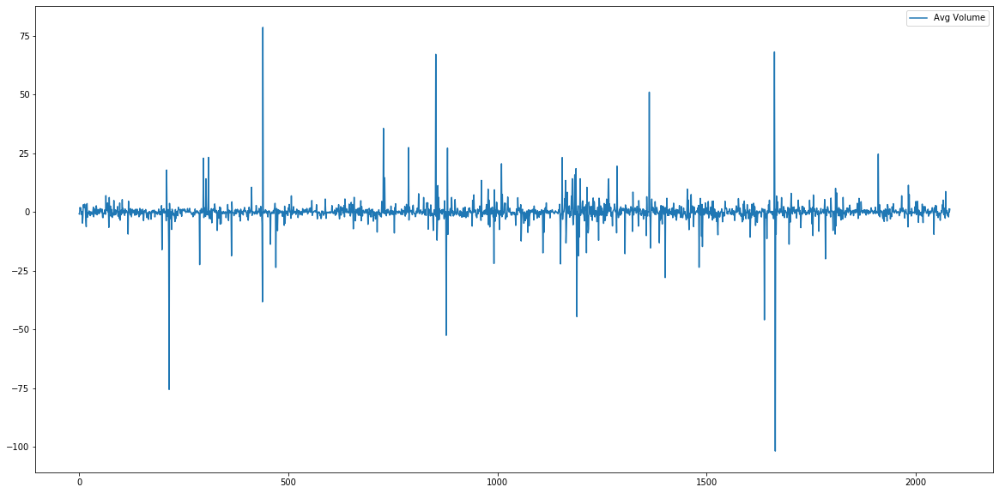

In [115]:
episode = '60'
x = np.linspace(0, len(maxes_episodes[episode]), len(maxes_episodes[episode]))
# y1 = np.array(maxes_episodes[episode])
y2 = np.array(avgs_episodes[episode])
# y3 = np.array(stds_episodes[episode])

fig, ax = plt.subplots()

# Using set_dashes() to modify dashing of an existing line
# line1, = ax.plot(x, y1, label='Max Volume')
line2, = ax.plot(x, y2, label='Avg Volume')
# line3, = ax.plot(x, y3, label='Std Volume')

ax.legend()
plt.show()

In [117]:
# ! pip install --pre torchaudio -f https://download.pytorch.org/whl/nightly/torch_nightly.html

In [65]:
transcripts_1 = pd.read_csv('../transcripts/shot-aligned_transcripts_2021_Max_Jack_Tanya.csv')
transcripts_2 = pd.read_csv('../transcripts/shot-aligned_transcripts_2021_Peggy_Archie.csv')
transcripts = pd.concat([transcripts_1, transcripts_2])

In [66]:
transcripts.head()

,Unnamed: 0,begin,end,filename,shot_id,transcript
0,0,00:00:00:00,00:00:20:21,5245830105934359183.xml,1,NaN
1,1,00:00:20:22,00:00:23:20,5245830105934359183.xml,2,NaN
2,2,00:00:23:21,00:00:25:14,5245830105934359183.xml,3,NaN
3,3,00:00:25:15,00:00:26:20,5245830105934359183.xml,4,You took your time.
4,4,00:00:26:21,00:00:30:03,5245830105934359183.xml,5,Nothing like being close to the family... Wa...


In [67]:
transcripts['filename'].unique()

array(['5245830105934359183.xml', '5248439298566680341.xml',
       '5251033029316736209.xml', '5253646087419594905.xml',
       '5256228221757951173.xml', '5258818087037440299.xml',
       '5264050645694159353.xml', '5266645664934403562.xml',
       '5269245838135402929.xml', '5271844722846213628.xml',
       '5274434588125702436.xml', '5300410550331962313.xml',
       '5300433743159556513.xml', '5303026185415228226.xml',
       '5305617339184877785.xml', '5308226531817199474.xml',
       '5310822839547632763.xml', '5313398531435045858.xml',
       '5316007724067368375.xml', '5318609185758554501.xml',
       '5321170704253895214.xml', '5323778608396028180.xml'], dtype=object)

In [68]:
transcripts['episode_number'] = transcripts['filename'].apply(lambda f: '404' if f.replace('xml', 'mp4') not in file2id else file2id[f.replace('xml', 'mp4')])

In [70]:
transcripts[transcripts['episode_number'] == '60'].head()

,Unnamed: 0,begin,end,filename,shot_id,transcript,episode_number
0,0,00:00:00:00,00:00:20:21,5245830105934359183.xml,1,NaN,60
1,1,00:00:20:22,00:00:23:20,5245830105934359183.xml,2,NaN,60
2,2,00:00:23:21,00:00:25:14,5245830105934359183.xml,3,NaN,60
3,3,00:00:25:15,00:00:26:20,5245830105934359183.xml,4,You took your time.,60
4,4,00:00:26:21,00:00:30:03,5245830105934359183.xml,5,Nothing like being close to the family... Wa...,60


In [71]:
transcripts['episode_number'].unique()

array(['60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '70',
       '79', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89'],
      dtype=object)

# Results

In [121]:
for method in audio_scores:
    print(method.upper())
    for episode in episodes:
        print('--- Ep ', episode, '---')
        episode_scores = np.array(audio_scores[method][episode]) 
        ids = np.argsort(episode_scores)[:-6:-1]
        
        #print(ids)
        #print(episode_scores[ids])
        res = transcripts[(transcripts['episode_number'] == episode) & (transcripts['shot_id'].isin(ids))]
        print(res[['transcript', 'shot_id']])
        break

MAX
--- Ep  60 ---
                                             transcript  shot_id
1106                     That is definitely something.      1107
1199                                                NaN     1200
1202                                                NaN     1203
1278  What's happened?  Thank goodness for that.  It...     1279
1725                                                NaN     1726
AVG
--- Ep  60 ---
                                             transcript  shot_id
438                                              Good.       439
726   I thought it'd be nice.  There's stuff I wanna...      727
851                                                 NaN      852
1361  Fasting.  No food at all? Not between sunrise ...     1362
1660  So, what's up with you, then?  I been sat here...     1661
STD
--- Ep  60 ---
                                             transcript  shot_id
350                                                 NaN      351
439                             O

In [86]:
transcripts[(transcripts['episode_number'] == episode) & (transcripts['shot_id'] == 850)]

,Unnamed: 0,begin,end,filename,shot_id,transcript,episode_number
849,849,00:46:47:09,00:46:49:18,5245830105934359183.xml,850,"The developers, what they said they found. Th...",60


In [123]:
! pip install fairseq

     |████████████████████████████████| 1.7MB 3.1MB/s eta 0:00:01
     |████████████████████████████████| 61kB 12.1MB/s eta 0:00:01
     |████████████████████████████████| 153kB 13.2MB/s eta 0:00:01
     |████████████████████████████████| 112kB 17.1MB/s eta 0:00:01
     |████████████████████████████████| 81kB 13.2MB/s eta 0:00:01
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.8-cp37-none-any.whl size=141231 sha256=8eb65b094a6aec0bbda4b6ec356b1212bc3c83f8fdf41b4816151effcb4d93ac
  Stored in directory: /home/ismail/.cache/pip/wheels/e3/e2/fa/b78480b448b8579ddf393bebd3f47ee23aa84c89b6a78285c8
Successfully built antlr4-python3-runtime
  Found existing installation: zipp 0.6.0
    Uninstalling zipp-0.6.0:
      Successfully uninstalled zipp-0.6.0


In [124]:
import fairseq
import torch
import soundfile as sf

In [125]:
cp = '/home/ismail/Downloads/wav2vec_small_960h.pt'
model, cfg, task = fairseq.checkpoint_utils.load_model_ensemble_and_task([cp])
model = model[0]

audio_input = torch.randn(1,10000)
z = model.feature_extractor(audio_input)
c = model.feature_aggregator(z)

RuntimeError: Error(s) in loading state_dict for Wav2VecCtc:
	size mismatch for w2v_encoder.proj.weight: copying a param with shape torch.Size([32, 768]) from checkpoint, the shape in current model is torch.Size([512, 768]).
	size mismatch for w2v_encoder.proj.bias: copying a param with shape torch.Size([32]) from checkpoint, the shape in current model is torch.Size([512]).